<a id=section-two></a>
# <span style="color:#144272;font-weight:600;font-size:22px;font-style:sans-serif;">Bank customers churn modeling</span> 

<a id=section-two></a>
# <span style="color:#144272;font-weight:600;font-size:18px;font-style:sans-serif;"> Content</span>

This data set contains details of a bank's customers and the target variable is a binary variable reflecting the fact whether the customer left the bank (closed his account) or he continues to be a customer.

1. [Introduction](#Introduction:)
2. [Import libraries](#Import-libraries)
3. [Data Preprocessing](#Data-Preprocessing)
4. [Exploratory data analysis](#4.-Exploratory-data-analysis)
5. [Feature engineering](#Feature-engineering)
6. [Model implementation](#Model-implementation)
    - RandomForestClassifier
    - GradientBoostingClassifier
    - XGBClassifier
    - CatBoostClassifier
    - LGBMClassifier
7. [Evaluation](#Evaluation)

<a id=section-two></a>
# <span style="color:#144272;font-weight:600;font-size:18px;font-style:sans-serif;">Introduction:</span> 

In this notebook, I will be working on a customer churning model. The goal of this project is to predict which customers are likely to churn and why they are doing so. Customer churn is a common problem in many industries, including telecommunications, banking, and e-commerce. It is important to identify customers who are at risk of churning and take appropriate actions to retain them.

To accomplish this goal, I will be using machine learning techniques to build a predictive model. I will start by gathering and exploring data on customer demographics, transaction history, customer support interactions, and any other relevant information. Then, I will preprocess the data to prepare it for modeling, which may involve cleaning, feature engineering, and scaling.

Next, I will train and evaluate several machine learning models to predict customer churn. I will use a variety of metrics to evaluate model performance, including accuracy, precision, recall, and F1 score. Based on these metrics, I will select the best-performing model and fine-tune it to improve its accuracy.

Finally, I will interpret the model results and draw insights from them. I will identify the key features that contribute most to customer churn and make recommendations to the business on how to address these issues.

By the end of this notebook, I hope to have built a robust customer churning model that can help businesses retain their customers and improve their bottom line.

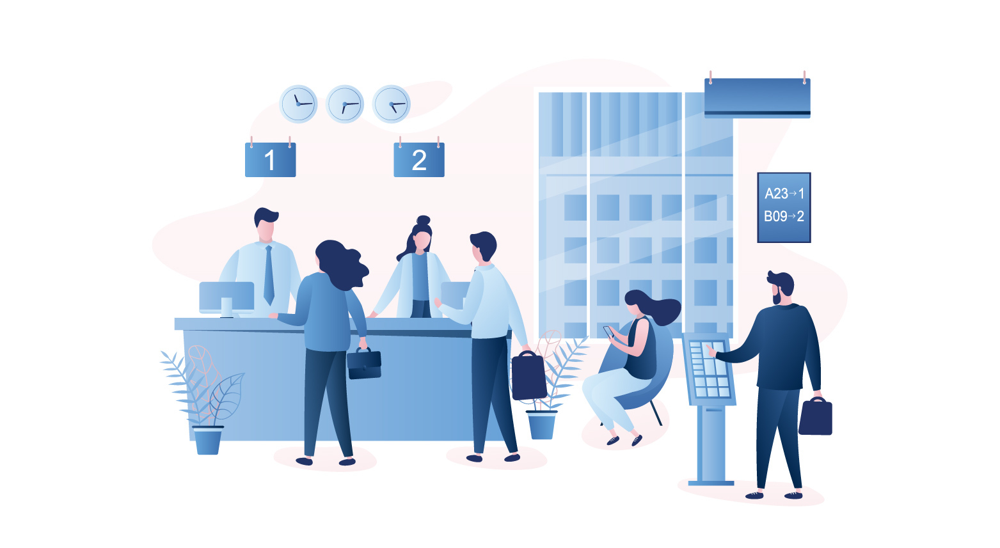

<a id=section-two></a>
# <span style="color:#144272;font-weight:600;font-size:16px;font-style:sans-serif;">Dataset has following attributes:</span> 


* Rownumber: Unique ID for every row
* CustomerID: Unique ID for every client
* Surname: Client's surname
* CreditScore: Client's credit score
* Geography: Country of client's origin
* Gender: Client's gender
* Age: Client's age
* Tenure: Number of years for which the client has been with the bank
* Balance: Client's balance on account
* NumOfProducts: Number of client's products
* HasCrCard: Flag whether client has credit card or not 
* IsActiveMember: Flag whether client is active member of bank or not 
* EstimatedSalary: Client's annual estimated salary in euros
* **Exited: Target variable, flag, whether client left the bank or not**

<a id=section-two></a>
# <span style="color:#144272;font-weight:600;font-size:18px;font-style:sans-serif;">Import libraries</span>

In [1]:
import numpy as np  # numerical computing library
import pandas as pd  # data manipulation library
import matplotlib.pyplot as plt  # data visualization library
import seaborn as sns  # data visualization library

# Import machine learning models and evaluation metrics
from sklearn.model_selection import train_test_split, RandomizedSearchCV  # model selection and hyperparameter tuning
from xgboost import XGBClassifier  # gradient boosting model
from catboost import CatBoostClassifier # catboosting model
import lightgbm as lgb # light boosting model
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier  # random forest and gradient boosting models
from sklearn.metrics import confusion_matrix, classification_report  # evaluation metrics for classification models

<a id=section-two></a>
# <span style="color:#144272;font-weight:600;font-size:18px;font-style:sans-serif;">Data Preprocessing</span>

Data source: https://www.kaggle.com/datasets/shubh0799/churn-modelling

In [3]:
# Load dataset from kaggle "churn-modelling" dataset
df = pd.read_csv('Dataset/Churn_Modelling.csv', index_col=0)
df.head()

,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
RowNumber,,,,,,,,,,,,,
1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [3]:
# Shape of data
df.shape

(10000, 13)

In [4]:
# This code prints a summary of the DataFrame "df".
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 1 to 10000
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   CustomerId       10000 non-null  int64  
 1   Surname          10000 non-null  object 
 2   CreditScore      10000 non-null  int64  
 3   Geography        10000 non-null  object 
 4   Gender           10000 non-null  object 
 5   Age              10000 non-null  int64  
 6   Tenure           10000 non-null  int64  
 7   Balance          10000 non-null  float64
 8   NumOfProducts    10000 non-null  int64  
 9   HasCrCard        10000 non-null  int64  
 10  IsActiveMember   10000 non-null  int64  
 11  EstimatedSalary  10000 non-null  float64
 12  Exited           10000 non-null  int64  
dtypes: float64(2), int64(8), object(3)
memory usage: 1.1+ MB


In [5]:
# Numeric description about numeric columns
df.describe().round(2)

,CustomerId,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
count,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.0
mean,15690940.57,650.53,38.92,5.01,76485.89,1.53,0.71,0.52,100090.24,0.2
std,71936.19,96.65,10.49,2.89,62397.41,0.58,0.46,0.50,57510.49,0.4
min,15565701.00,350.00,18.00,0.00,0.00,1.00,0.00,0.00,11.58,0.0
25%,15628528.25,584.00,32.00,3.00,0.00,1.00,0.00,0.00,51002.11,0.0
50%,15690738.00,652.00,37.00,5.00,97198.54,1.00,1.00,1.00,100193.92,0.0
75%,15753233.75,718.00,44.00,7.00,127644.24,2.00,1.00,1.00,149388.25,0.0
max,15815690.00,850.00,92.00,10.00,250898.09,4.00,1.00,1.00,199992.48,1.0


In [6]:
# Numeric description about categorical columns
df.describe(include='object')

,Surname,Geography,Gender
count,10000,10000,10000
unique,2932,3,2
top,Smith,France,Male
freq,32,5014,5457


In [7]:
# Columns: "CustomerId", "Surname" dropped because there is no such strong connection with Target column
df.drop(["CustomerId", "Surname"], axis=1, inplace=True)
df.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
RowNumber,,,,,,,,,,,
1,619,France,Female,42,2,0.00,1,1,1,101348.88,1
2,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
3,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
4,699,France,Female,39,1,0.00,2,0,0,93826.63,0
5,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


<a id=section-two></a>
# <span style="color:#144272;font-weight:600;font-size:18px;font-style:sans-serif;">Exploratory data analysis</span>

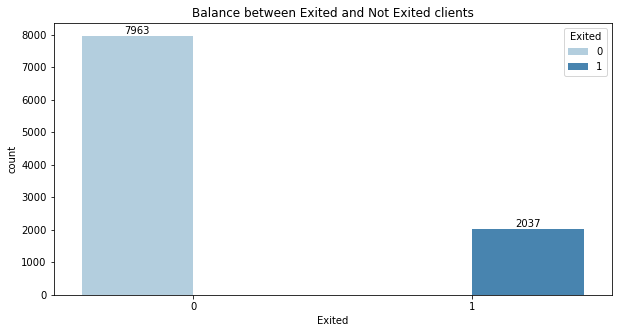

In [8]:
# Proportion of target categories

plt.figure(figsize=(10,5)) 
plt.title('Balance between Exited and Not Exited clients', fontsize=12)
ax = sns.countplot(data=df, x= 'Exited',hue='Exited', palette = 'Blues')

for container in ax.containers:
    ax.bar_label(container)
plt.show()

**By this graphs I across with unbalanced target problem**

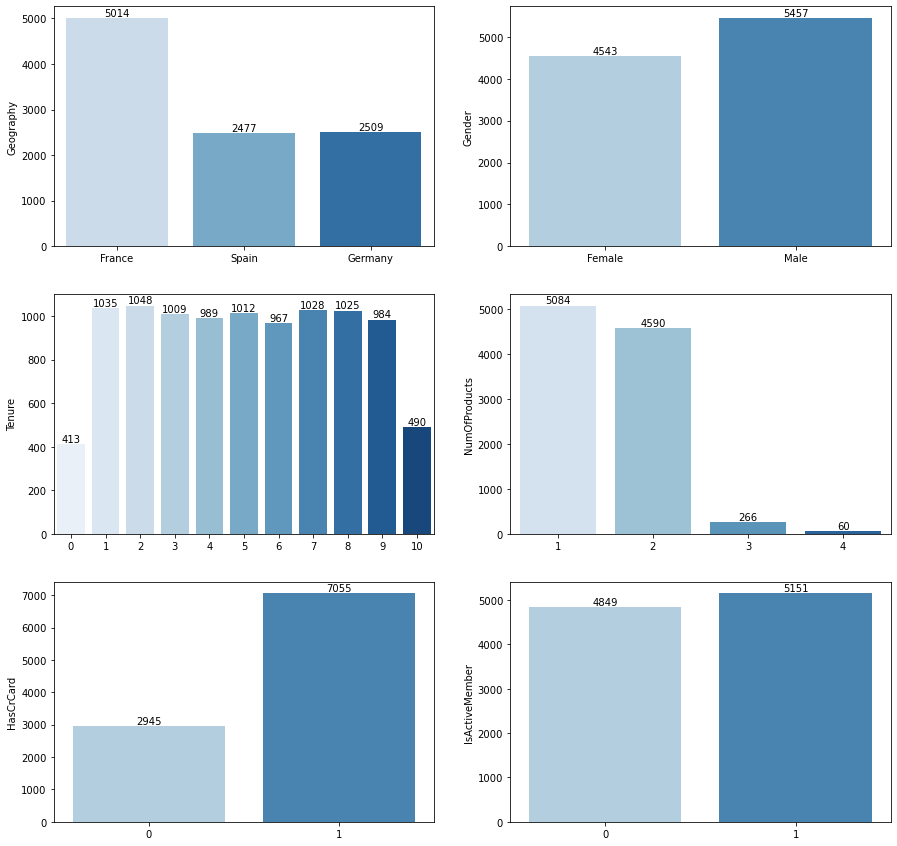

In [9]:
# This code plots the count of occurrences for each categorical variable in a
# specified list of columns using seaborn's countplot, and adds labels to the top
# of each bar indicating the exact count of occurrences.

list_of_columns = ['Geography', 'Gender', 'Tenure', 'NumOfProducts', 'HasCrCard', 'IsActiveMember']

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 15))
for idx, column in enumerate(list_of_columns):
    ax = axes[int(idx / 2), idx % 2]
    sns.countplot(x=column, data=df, ax=ax, palette = 'Blues');
    ax.set_xlabel("")
    ax.set_ylabel(column)
    for container in ax.containers:
        ax.bar_label(container)

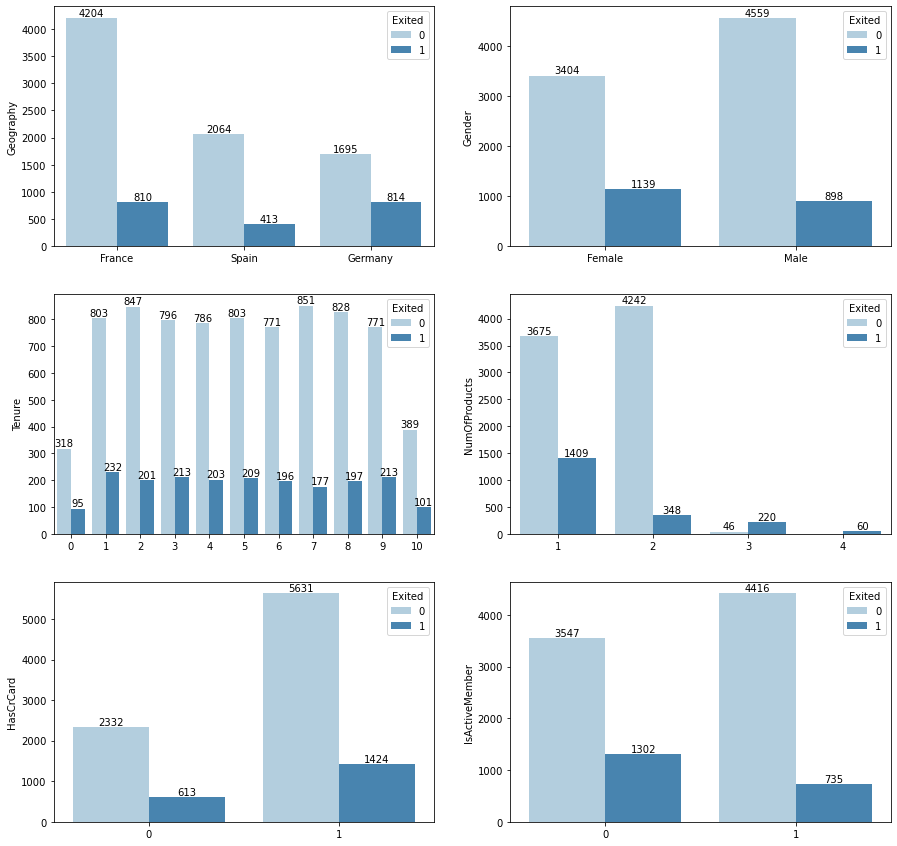

In [10]:
# This code plots the count of occurrences for each categorical variable in a
# specified list of columns using seaborn's countplot. It separates the count of
# exited and non-exited customers for each categorical variable using hue, and
# adds labels to the top of each bar indicating the count of occurrences.

list_of_columns = ['Geography', 'Gender', 'Tenure', 'NumOfProducts', 'HasCrCard', 'IsActiveMember']

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 15))
for idx, column in enumerate(list_of_columns):
    ax = axes[int(idx / 2), idx % 2]
    sns.countplot(x=column, data=df, ax=ax, hue=df.Exited, palette = 'Blues');
    ax.set_xlabel("")
    ax.set_ylabel(column)
    for container in ax.containers:
        ax.bar_label(container)

**Based on the provided statistics for the bank's clients in different countries, here are some useful notes that could be made:**

The proportion of exited clients varies significantly between countries, with France having the highest proportion (810/5014 = 16.14%), followed by Germany (814/2509 = 32.46%), and Spain having the lowest proportion (413/2477 = 16.69%).

Germany has the largest absolute number of exited clients (814), even though it has fewer clients overall than France and Spain.

The number of non-exited clients in France is much larger than in Spain and Germany, which could suggest that France is a key market for the bank.

It would be useful to investigate further why the proportion of exited clients is higher in Germany compared to France and Spain, as this could indicate potential issues with customer retention or satisfaction in Germany.

The bank could potentially use this information to focus on improving customer retention in countries where the proportion of exited clients is higher, or to invest in growth in countries where the number of non-exited clients is larger.

Overall, these statistics provide some useful insights into the bank's customer base in different countries, and could help inform future business decisions.

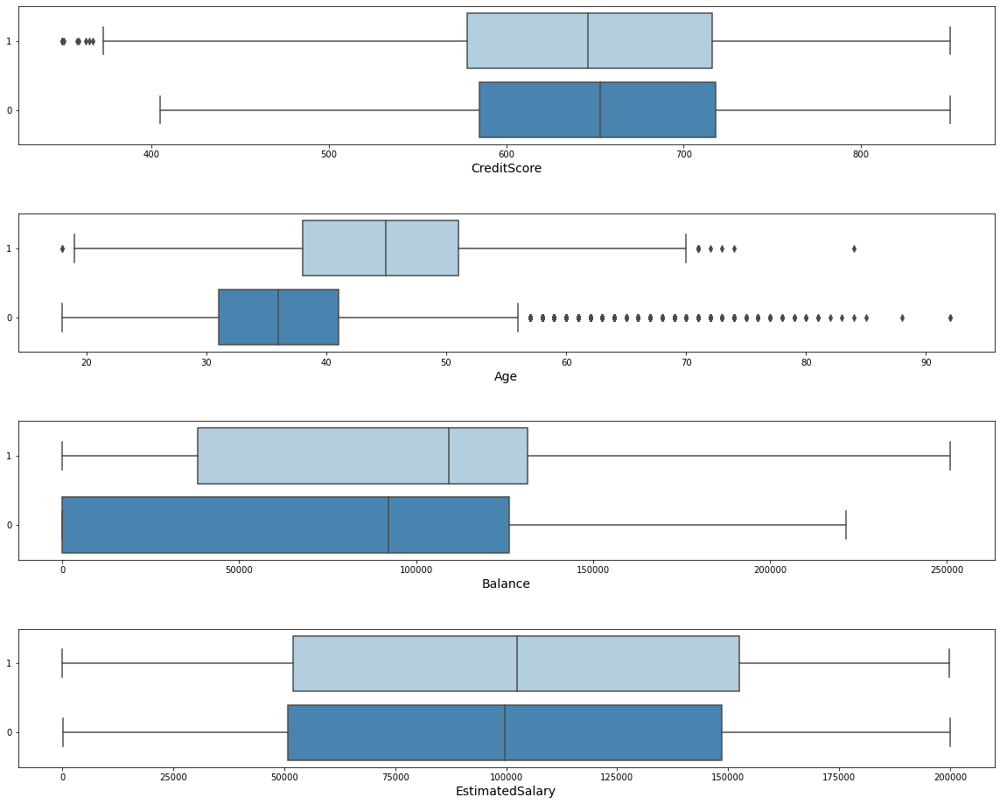

In [11]:
# This code creates a boxplot for each continuous column specified in cont_col,
# with the y-axis indicating whether the client exited the bank or not (0 for not exited, 1 for exited).
# The code uses Seaborn's boxplot function and sets the color palette to 'Blues'.
# The resulting subplots are displayed together in a single figure with adjusted vertical spacing.

cont_col = ['CreditScore', 'Age', 'Balance', 'EstimatedSalary']

fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(20, 16))
plt.subplots_adjust(hspace=0.5)
for idx, column in enumerate(cont_col):
    ax = axes[idx]
    sns.boxplot(data = df, x = column, y=df.Exited.map({0 : '0', 1 : '1'}), palette='Blues', ax=ax)
    ax.set_xlabel(column, fontdict={'fontsize' :14})
    ax.set_ylabel('')

plt.show()

**Here is i found one intersting thing: If client age and amount of balance high it is increase chanse to exit!**

**Banks may lose their high age and high balance clients due to a variety of factors, including:**

Poor customer service: If high balance clients feel that they are not receiving adequate customer service from their bank, they may decide to switch to another bank that offers better service.

Inflexible products and services: Older clients may have unique financial needs and priorities, such as retirement planning, estate planning, or long-term care. If their bank cannot provide the necessary products and services to meet these needs, they may look elsewhere.

Technology and digital literacy: Older clients may be less comfortable with technology and digital banking services, which can make it more difficult for them to manage their accounts or access their funds. Banks that do not provide sufficient support or training for these clients may risk losing them to competitors that offer more user-friendly interfaces.

Lack of personalized attention: High balance clients may feel that their bank does not provide enough personalized attention or customized services that meet their unique financial needs.

High fees and charges: Banks may charge high fees and transaction costs for maintaining high balance accounts, which can be a turn-off for some clients.

Better offers from competitors: High balance clients may receive better offers and incentives from other banks or financial institutions, such as higher interest rates, lower fees, or more favorable loan terms.

Security concerns: High balance clients may be concerned about the security of their funds and personal information, especially if the bank has a history of security breaches or cyber attacks.

Changes in financial needs: High balance clients may experience changes in their financial needs and priorities over time, such as a change in their investment strategy or a shift in their spending habits. If their bank cannot provide the necessary services to meet these changing needs, they may look elsewhere.

Overall, retaining high age and high balance clients requires banks to provide personalized attention, innovative products and services, user-friendly technology, and exceptional customer service that meets the unique needs and preferences of these clients.

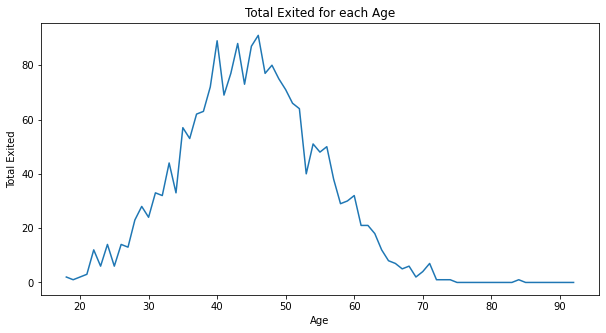

In [12]:
# Here is linegraph sum of Exited for each age 

plt.figure(figsize=(10,5)) 
plt.title('Total Exited for each Age', fontsize=12)

df_age = df.groupby('Age').sum('Exited')[['Exited']]
sns.lineplot(x = df_age.index, y = df_age.Exited)

plt.ylabel('Total Exited')

plt.show()

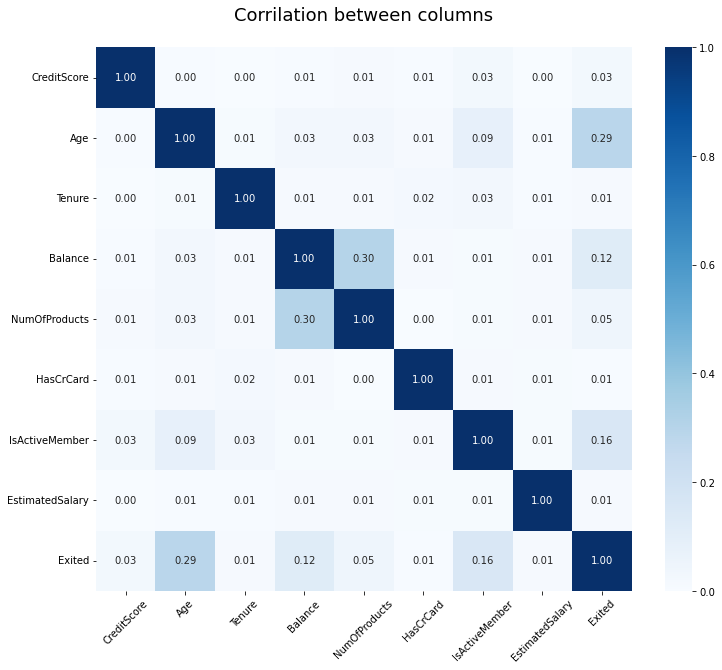

In [13]:
# Creates a heatmap of the absolute correlation values between each pair of columns in the DataFrame 'df'
plt.figure(figsize=(12,10))

sns.heatmap(df.corr().abs(), annot=True, vmin=0, vmax=1, cmap = 'Blues', fmt='.2f')
plt.title('Corrilation between columns\n', fontdict={'fontsize' : 18})
plt.xticks(rotation = 45)
plt.show()

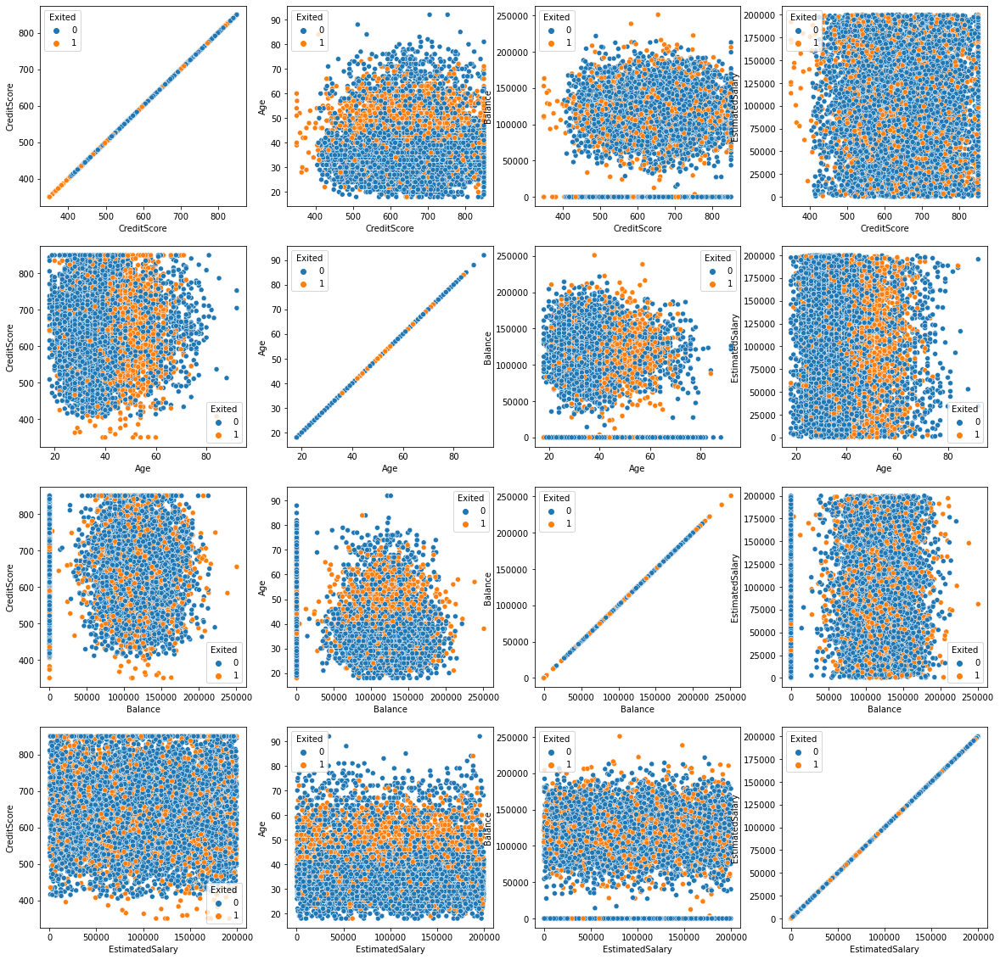

In [14]:
# Creates a grid of scatterplots showing the relationship between each pair of continuous columns in 'df',
# with points colored by the 'Exited' column.

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(20, 20))
for i in range(len(cont_col)):
    for j in range(len(cont_col)):
        ax = axes[i, j]
        sns.scatterplot(x=df[cont_col[i]], y = df[cont_col[j]], data=df, ax=ax, hue=df.Exited);
        ax.set_xlabel(cont_col[i])
        ax.set_ylabel(cont_col[j])

In [15]:
# Groups the DataFrame 'df' by 'Age', calculates the mean of specified columns, and stores the result in 'df_grouped_by_age'

df_grouped_by_age = df.groupby('Age')[['CreditScore', 'Balance', 'EstimatedSalary', 'Exited']].agg(np.mean)
df_grouped_by_age = df_grouped_by_age.reset_index()

In [16]:
# Calculates the correlation matrix between the columns in 'df_grouped_by_age' using the corr() method.
df_grouped_by_age.corr()

,Age,CreditScore,Balance,EstimatedSalary,Exited
Age,1.000000,0.094856,-0.230705,0.119807,0.017038
CreditScore,0.094856,1.000000,-0.164312,-0.123715,-0.298492
Balance,-0.230705,-0.164312,1.000000,-0.013089,0.336111
EstimatedSalary,0.119807,-0.123715,-0.013089,1.000000,0.051078
Exited,0.017038,-0.298492,0.336111,0.051078,1.000000


In [17]:
# Sorts the DataFrame 'df_grouped_by_age' by 'Exited', 'Balance', and 'EstimatedSalary' in descending order
# and displays the top 10 rows.
df_grouped_by_age_sorted = df_grouped_by_age.sort_values(['Exited', 'Balance', 'EstimatedSalary'], ascending=False)
df_grouped_by_age_sorted.head(10)

,Age,CreditScore,Balance,EstimatedSalary,Exited
38,56,671.142857,89967.040857,92267.915143,0.714286
34,52,647.117647,76805.437059,100157.383235,0.627451
36,54,634.892857,82274.310833,105118.620238,0.607143
37,55,648.987805,82221.408780,89835.809878,0.585366
33,51,651.042017,87453.243866,104409.736723,0.554622
35,53,637.945946,87894.037838,96692.907703,0.540541
32,50,643.761194,84924.807388,95349.181418,0.529851
42,60,645.967742,70597.140484,93340.965968,0.516129
31,49,653.312925,83554.913469,110511.735850,0.510204
39,57,636.533333,68884.216000,90417.949467,0.506667


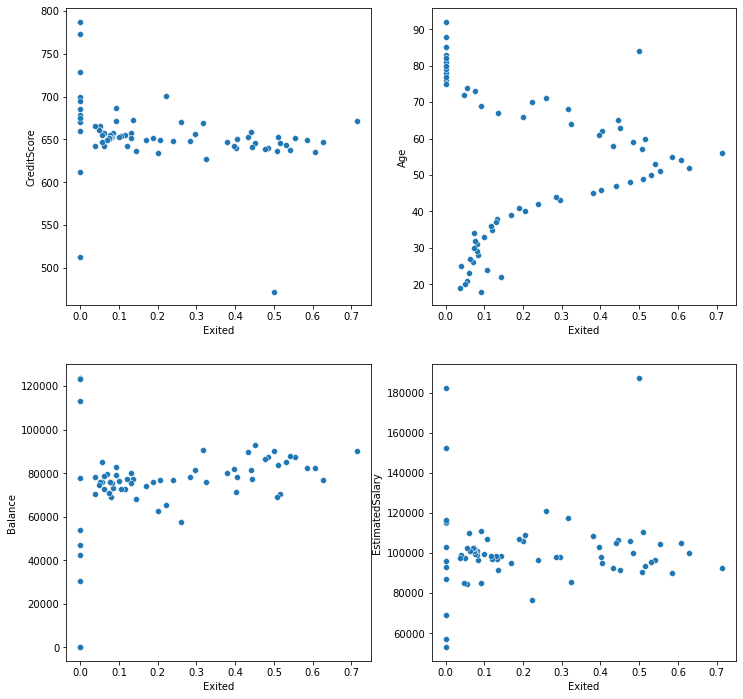

In [18]:
# Creates a 2x2 grid of scatter plots between 'Exited' and
# continuous variables, using data from 'df_grouped_by_age_sorted' DataFrame.

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))
for idx, column in enumerate(cont_col):
        ax = axes[int(idx / 2), idx % 2]
        sns.scatterplot(x='Exited', y = column, data=df_grouped_by_age_sorted, ax=ax, )
        ax.set_xlabel('Exited')
        
        ax.set_ylabel(column)

**Here is also visible 'Age', 'Balance', 'EstimatedSalary' have stron effect to 'Exited' column**

<a id=section-two></a>
# <span style="color:#144272;font-weight:600;font-size:18px;font-style:sans-serif;">Feature engineering</span>

In [19]:
# Encoding categorical columns into numeric
data = pd.get_dummies(df)
data.sample(5)

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male
RowNumber,,,,,,,,,,,,,,
421,756,60,3,115924.89,1,1,0,93524.19,1,0,1,0,1,0
3398,820,33,2,132150.26,2,1,0,23067.97,0,1,0,0,0,1
1871,624,33,6,0.00,2,0,0,76551.70,0,0,0,1,0,1
3363,759,33,9,160541.36,2,0,0,93541.14,0,1,0,0,1,0
2106,492,31,7,0.00,2,1,1,49463.44,0,1,0,0,1,0


In [20]:
# This code calculates the absolute correlation values between the
# "Exited" column and all other columns in the dataset, and sorts them in descending order.

data.corrwith(data.Exited).abs().sort_values(ascending=False)

Exited               1.000000
Age                  0.285323
Geography_Germany    0.173488
IsActiveMember       0.156128
Balance              0.118533
Gender_Female        0.106512
Gender_Male          0.106512
Geography_France     0.104955
Geography_Spain      0.052667
NumOfProducts        0.047820
CreditScore          0.027094
Tenure               0.014001
EstimatedSalary      0.012097
HasCrCard            0.007138
dtype: float64

In [21]:
# Separate columns into input and output  

X_data = data.drop('Exited', axis=1)
y_data = data.Exited

In [22]:
# Spliting data into train and test datasets
# In order to hold proportion used stratify

X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.1, stratify= y_data, random_state=73)

In [23]:
y_data.value_counts(normalize=True)

0    0.7963
1    0.2037
Name: Exited, dtype: float64

In [24]:
y_train.value_counts(normalize=True)

0    0.796333
1    0.203667
Name: Exited, dtype: float64

<a id=section-two></a>
# <span style="color:#144272;font-weight:600;font-size:18px;font-style:sans-serif;">Model implementation</span>

<a id=section-two></a>
> <span style="color:#144272;font-weight:600;font-size:16px;font-style:sans-serif;">RandomForestClassifier</span>

In [25]:
rfc = RandomForestClassifier()

# Define the hyperparameters and their respective ranges
params = {
    'n_estimators': [100, 200, 300, 400],
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2'],
    'class_weight': [None, 'balanced']
}

random_search_rfc = RandomizedSearchCV(rfc, params, n_iter=100, cv=5, random_state=73)
random_search_rfc.fit(X_train, y_train)

# Print the best hyperparameters
print("Best hyperparameters:", random_search_rfc.best_params_)

Best hyperparameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 15, 'class_weight': None}


In [26]:
# Predict for test data

pred_rfc = random_search_rfc.predict(X_test)
rfc_score = random_search_rfc.score(X_test, y_test)

print(f'RandomForestClassifier: {rfc_score}')

RandomForestClassifier: 0.874


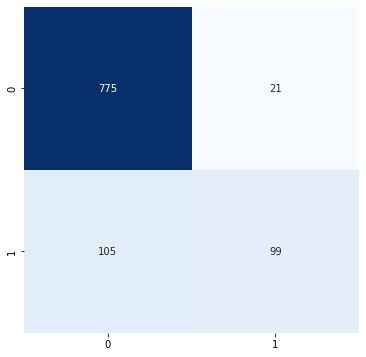

In [27]:
# Confusion matrix

plt.figure(figsize = (6,6))
sns.heatmap(confusion_matrix(y_test, pred_rfc), annot = True, fmt = '.0f', cbar = False, cmap="Blues")
plt.show()

In [31]:
# Classification report

print(classification_report(y_test, pred_rfc))

              precision    recall  f1-score   support

           0       0.88      0.97      0.92       796
           1       0.82      0.49      0.61       204

    accuracy                           0.87      1000
   macro avg       0.85      0.73      0.77      1000
weighted avg       0.87      0.87      0.86      1000



<a id=section-two></a>
> <span style="color:#144272;font-weight:600;font-size:16px;font-style:sans-serif;">GradientBoostingClassifier</span>

In [32]:
gbc = GradientBoostingClassifier()

# Define the hyperparameters and their respective ranges
param_dist = {'n_estimators': [100, 500, 1000],
              'max_depth': [3, 5, 7],
              'learning_rate': [0.1, 0.01, 0.001],
              'subsample': [1.0, 0.5, 0.1],
              'min_samples_split': [2, 5, 10]}


random_search_gbc = RandomizedSearchCV(gbc, param_distributions=param_dist, n_iter=100, cv=5, random_state=73)
random_search_gbc.fit(X_train, y_train)

# Print the best hyperparameters
print("Best hyperparameters:", random_search_gbc.best_params_)

Best hyperparameters: {'subsample': 0.5, 'n_estimators': 500, 'min_samples_split': 5, 'max_depth': 5, 'learning_rate': 0.01}


In [33]:
# Predict for test data

pred_gbc = random_search_gbc.predict(X_test)
gbc_score = random_search_gbc.score(X_test, y_test)

print(f'GradientBoostingClassifier: {gbc_score}')

GradientBoostingClassifier: 0.872


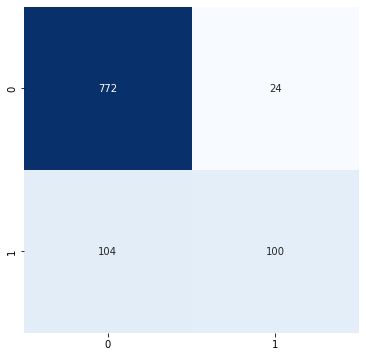

In [34]:
# Confusion matrix

plt.figure(figsize = (6,6))
sns.heatmap(confusion_matrix(y_test, pred_gbc), annot = True, fmt = '.0f', cbar = False, cmap="Blues")
plt.show()

In [35]:
# Classification report

print(classification_report(y_test, pred_gbc))

              precision    recall  f1-score   support

           0       0.88      0.97      0.92       796
           1       0.81      0.49      0.61       204

    accuracy                           0.87      1000
   macro avg       0.84      0.73      0.77      1000
weighted avg       0.87      0.87      0.86      1000



<a id=section-two></a>
> <span style="color:#144272;font-weight:600;font-size:16px;font-style:sans-serif;">XGBClassifier</span>

In [36]:
xgb = XGBClassifier()

# Define the hyperparameters and their respective ranges
params = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [5, 10, 15],
    'learning_rate': [0.01, 0.05, 0.1],
    'subsample': [0.5, 0.7, 1.0],
    'colsample_bytree': [0.5, 0.7, 1.0],
    'gamma': [0, 0.5, 1, 1.5, 2],
    'min_child_weight': [1, 3, 5],
    'objective': ['binary:logistic']
}

random_search_xgb = RandomizedSearchCV(xgb, params, n_iter=50, cv=5, random_state=73)
random_search_xgb.fit(X_train, y_train)

# Print the best hyperparameters
print("Best hyperparameters:", random_search_xgb.best_params_)

Best hyperparameters: {'subsample': 1.0, 'objective': 'binary:logistic', 'n_estimators': 100, 'min_child_weight': 3, 'max_depth': 5, 'learning_rate': 0.1, 'gamma': 0.5, 'colsample_bytree': 0.5}


In [37]:
# Predict for test data

pred_gbc = random_search_xgb.predict(X_test)
xgb_score = random_search_xgb.score(X_test, y_test)

print(f'XGBClassifier score: {xgb_score}')

XGBClassifier score: 0.87


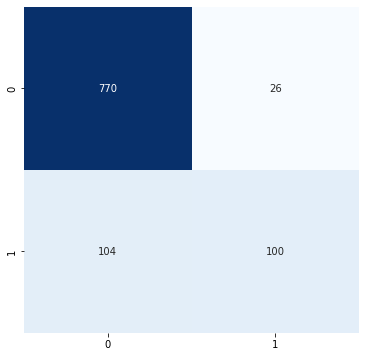

In [38]:
# Confusion matrix

plt.figure(figsize = (6,6))
sns.heatmap(confusion_matrix(y_test, pred_gbc), annot = True, fmt = '.0f', cbar = False, cmap="Blues")
plt.show()

In [39]:
# Classification report

print(classification_report(y_test, pred_gbc))

              precision    recall  f1-score   support

           0       0.88      0.97      0.92       796
           1       0.79      0.49      0.61       204

    accuracy                           0.87      1000
   macro avg       0.84      0.73      0.76      1000
weighted avg       0.86      0.87      0.86      1000



<a id=section-two></a>
> <span style="color:#144272;font-weight:600;font-size:16px;font-style:sans-serif;">CatBoostClassifier</span>

In [40]:
catboost = CatBoostClassifier()

# Define the hyperparameter space to search over
param_dist = {
    'learning_rate': [0.01, 0.05, 0.1, 0.5],
    'depth': np.arange(1, 10),
    'l2_leaf_reg': [1, 3, 5, 7, 9],
    'iterations': [100, 500, 1000],
    'border_count': [32, 64, 128]
}

# Create a Randomized Search CV object
random_search_ctb = RandomizedSearchCV(
    estimator=catboost,
    param_distributions=param_dist,
    n_iter=100,
    cv=5,
    scoring='accuracy',
    verbose=2,
    random_state=73
)

# Fit the Randomized Search CV object to the data
random_search_ctb.fit(X_train, y_train)

# Print the best hyperparameters found by the Randomized Search CV
print(random_search_ctb.best_params_)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
0:	learn: 0.6535826	total: 64.5ms	remaining: 32.2s
1:	learn: 0.6188230	total: 67.8ms	remaining: 16.9s
2:	learn: 0.5889650	total: 70.4ms	remaining: 11.7s
3:	learn: 0.5654842	total: 73.6ms	remaining: 9.13s
4:	learn: 0.5402432	total: 76.9ms	remaining: 7.61s
5:	learn: 0.5197993	total: 79.7ms	remaining: 6.56s
6:	learn: 0.4995855	total: 83.1ms	remaining: 5.85s
7:	learn: 0.4852973	total: 86.5ms	remaining: 5.32s
8:	learn: 0.4701954	total: 90.1ms	remaining: 4.91s
9:	learn: 0.4550666	total: 93.6ms	remaining: 4.58s
10:	learn: 0.4418119	total: 97.1ms	remaining: 4.32s
11:	learn: 0.4320804	total: 101ms	remaining: 4.09s
12:	learn: 0.4223794	total: 104ms	remaining: 3.9s
13:	learn: 0.4166859	total: 108ms	remaining: 3.74s
14:	learn: 0.4094480	total: 111ms	remaining: 3.6s
15:	learn: 0.4014595	total: 115ms	remaining: 3.47s
16:	learn: 0.3943301	total: 118ms	remaining: 3.36s
17:	learn: 0.3899351	total: 122ms	remaining: 3.26s
18:	learn: 0.3849270

172:	learn: 0.2852349	total: 669ms	remaining: 1.26s
173:	learn: 0.2848591	total: 673ms	remaining: 1.26s
174:	learn: 0.2842655	total: 677ms	remaining: 1.26s
175:	learn: 0.2841468	total: 681ms	remaining: 1.25s
176:	learn: 0.2839258	total: 684ms	remaining: 1.25s
177:	learn: 0.2833733	total: 688ms	remaining: 1.24s
178:	learn: 0.2830375	total: 692ms	remaining: 1.24s
179:	learn: 0.2828129	total: 695ms	remaining: 1.24s
180:	learn: 0.2825905	total: 699ms	remaining: 1.23s
181:	learn: 0.2823428	total: 702ms	remaining: 1.23s
182:	learn: 0.2822189	total: 706ms	remaining: 1.22s
183:	learn: 0.2820364	total: 709ms	remaining: 1.22s
184:	learn: 0.2816934	total: 713ms	remaining: 1.21s
185:	learn: 0.2814158	total: 717ms	remaining: 1.21s
186:	learn: 0.2812385	total: 720ms	remaining: 1.21s
187:	learn: 0.2809935	total: 724ms	remaining: 1.2s
188:	learn: 0.2807079	total: 728ms	remaining: 1.2s
189:	learn: 0.2805684	total: 731ms	remaining: 1.19s
190:	learn: 0.2803606	total: 735ms	remaining: 1.19s
191:	learn: 0.

361:	learn: 0.2394486	total: 1.39s	remaining: 528ms
362:	learn: 0.2393145	total: 1.39s	remaining: 525ms
363:	learn: 0.2389403	total: 1.39s	remaining: 521ms
364:	learn: 0.2386795	total: 1.4s	remaining: 517ms
365:	learn: 0.2386351	total: 1.4s	remaining: 513ms
366:	learn: 0.2384144	total: 1.4s	remaining: 509ms
367:	learn: 0.2382581	total: 1.41s	remaining: 505ms
368:	learn: 0.2377813	total: 1.41s	remaining: 502ms
369:	learn: 0.2376204	total: 1.42s	remaining: 498ms
370:	learn: 0.2373227	total: 1.42s	remaining: 494ms
371:	learn: 0.2372216	total: 1.42s	remaining: 490ms
372:	learn: 0.2368509	total: 1.43s	remaining: 486ms
373:	learn: 0.2366594	total: 1.43s	remaining: 482ms
374:	learn: 0.2365167	total: 1.44s	remaining: 479ms
375:	learn: 0.2361562	total: 1.44s	remaining: 475ms
376:	learn: 0.2359616	total: 1.44s	remaining: 471ms
377:	learn: 0.2357791	total: 1.45s	remaining: 467ms
378:	learn: 0.2356548	total: 1.45s	remaining: 463ms
379:	learn: 0.2355468	total: 1.45s	remaining: 459ms
380:	learn: 0.2

51:	learn: 0.3219739	total: 183ms	remaining: 1.58s
52:	learn: 0.3212256	total: 187ms	remaining: 1.58s
53:	learn: 0.3205373	total: 191ms	remaining: 1.58s
54:	learn: 0.3199655	total: 195ms	remaining: 1.58s
55:	learn: 0.3191435	total: 199ms	remaining: 1.57s
56:	learn: 0.3187526	total: 202ms	remaining: 1.57s
57:	learn: 0.3182218	total: 206ms	remaining: 1.57s
58:	learn: 0.3181542	total: 208ms	remaining: 1.56s
59:	learn: 0.3175384	total: 212ms	remaining: 1.55s
60:	learn: 0.3172622	total: 216ms	remaining: 1.55s
61:	learn: 0.3166516	total: 219ms	remaining: 1.55s
62:	learn: 0.3161847	total: 223ms	remaining: 1.54s
63:	learn: 0.3158392	total: 226ms	remaining: 1.54s
64:	learn: 0.3154169	total: 230ms	remaining: 1.54s
65:	learn: 0.3147929	total: 233ms	remaining: 1.53s
66:	learn: 0.3144962	total: 237ms	remaining: 1.53s
67:	learn: 0.3141436	total: 241ms	remaining: 1.53s
68:	learn: 0.3137253	total: 244ms	remaining: 1.52s
69:	learn: 0.3131212	total: 248ms	remaining: 1.52s
70:	learn: 0.3128341	total: 252

258:	learn: 0.2569635	total: 907ms	remaining: 844ms
259:	learn: 0.2568121	total: 911ms	remaining: 841ms
260:	learn: 0.2565574	total: 915ms	remaining: 838ms
261:	learn: 0.2563226	total: 919ms	remaining: 834ms
262:	learn: 0.2561054	total: 923ms	remaining: 831ms
263:	learn: 0.2558227	total: 927ms	remaining: 829ms
264:	learn: 0.2555862	total: 931ms	remaining: 825ms
265:	learn: 0.2553042	total: 934ms	remaining: 822ms
266:	learn: 0.2551218	total: 938ms	remaining: 819ms
267:	learn: 0.2549719	total: 941ms	remaining: 815ms
268:	learn: 0.2547360	total: 945ms	remaining: 812ms
269:	learn: 0.2544893	total: 949ms	remaining: 808ms
270:	learn: 0.2541318	total: 952ms	remaining: 805ms
271:	learn: 0.2538475	total: 956ms	remaining: 801ms
272:	learn: 0.2535675	total: 960ms	remaining: 798ms
273:	learn: 0.2534272	total: 963ms	remaining: 795ms
274:	learn: 0.2532279	total: 967ms	remaining: 791ms
275:	learn: 0.2530274	total: 971ms	remaining: 788ms
276:	learn: 0.2529160	total: 974ms	remaining: 784ms
277:	learn: 

463:	learn: 0.2154844	total: 1.63s	remaining: 126ms
464:	learn: 0.2153137	total: 1.63s	remaining: 123ms
465:	learn: 0.2151009	total: 1.64s	remaining: 119ms
466:	learn: 0.2149136	total: 1.64s	remaining: 116ms
467:	learn: 0.2147256	total: 1.65s	remaining: 112ms
468:	learn: 0.2145251	total: 1.65s	remaining: 109ms
469:	learn: 0.2142209	total: 1.65s	remaining: 105ms
470:	learn: 0.2140160	total: 1.66s	remaining: 102ms
471:	learn: 0.2138196	total: 1.66s	remaining: 98.4ms
472:	learn: 0.2136298	total: 1.66s	remaining: 94.9ms
473:	learn: 0.2134314	total: 1.67s	remaining: 91.4ms
474:	learn: 0.2131549	total: 1.67s	remaining: 87.9ms
475:	learn: 0.2129219	total: 1.67s	remaining: 84.4ms
476:	learn: 0.2127082	total: 1.68s	remaining: 80.9ms
477:	learn: 0.2124976	total: 1.68s	remaining: 77.3ms
478:	learn: 0.2123148	total: 1.68s	remaining: 73.8ms
479:	learn: 0.2120434	total: 1.69s	remaining: 70.3ms
480:	learn: 0.2119345	total: 1.69s	remaining: 66.8ms
481:	learn: 0.2118577	total: 1.69s	remaining: 63.3ms
4

161:	learn: 0.2847484	total: 571ms	remaining: 1.19s
162:	learn: 0.2844697	total: 575ms	remaining: 1.19s
163:	learn: 0.2839975	total: 578ms	remaining: 1.19s
164:	learn: 0.2837305	total: 582ms	remaining: 1.18s
165:	learn: 0.2834023	total: 586ms	remaining: 1.18s
166:	learn: 0.2830321	total: 589ms	remaining: 1.18s
167:	learn: 0.2828270	total: 593ms	remaining: 1.17s
168:	learn: 0.2823892	total: 597ms	remaining: 1.17s
169:	learn: 0.2819771	total: 600ms	remaining: 1.17s
170:	learn: 0.2817433	total: 604ms	remaining: 1.16s
171:	learn: 0.2815055	total: 607ms	remaining: 1.16s
172:	learn: 0.2811870	total: 611ms	remaining: 1.15s
173:	learn: 0.2808830	total: 614ms	remaining: 1.15s
174:	learn: 0.2806559	total: 618ms	remaining: 1.15s
175:	learn: 0.2803595	total: 621ms	remaining: 1.14s
176:	learn: 0.2801002	total: 625ms	remaining: 1.14s
177:	learn: 0.2800635	total: 627ms	remaining: 1.13s
178:	learn: 0.2798277	total: 631ms	remaining: 1.13s
179:	learn: 0.2796016	total: 634ms	remaining: 1.13s
180:	learn: 

365:	learn: 0.2371577	total: 1.29s	remaining: 474ms
366:	learn: 0.2369495	total: 1.3s	remaining: 470ms
367:	learn: 0.2367629	total: 1.3s	remaining: 467ms
368:	learn: 0.2365570	total: 1.3s	remaining: 463ms
369:	learn: 0.2361867	total: 1.31s	remaining: 460ms
370:	learn: 0.2360213	total: 1.31s	remaining: 456ms
371:	learn: 0.2357885	total: 1.31s	remaining: 453ms
372:	learn: 0.2355884	total: 1.32s	remaining: 449ms
373:	learn: 0.2354382	total: 1.32s	remaining: 446ms
374:	learn: 0.2351597	total: 1.33s	remaining: 442ms
375:	learn: 0.2349692	total: 1.33s	remaining: 439ms
376:	learn: 0.2348703	total: 1.33s	remaining: 435ms
377:	learn: 0.2348496	total: 1.34s	remaining: 432ms
378:	learn: 0.2345247	total: 1.34s	remaining: 428ms
379:	learn: 0.2344018	total: 1.34s	remaining: 425ms
380:	learn: 0.2341412	total: 1.35s	remaining: 421ms
381:	learn: 0.2339735	total: 1.35s	remaining: 417ms
382:	learn: 0.2337167	total: 1.35s	remaining: 414ms
383:	learn: 0.2336247	total: 1.36s	remaining: 410ms
384:	learn: 0.2

53:	learn: 0.3238410	total: 196ms	remaining: 1.62s
54:	learn: 0.3233472	total: 200ms	remaining: 1.62s
55:	learn: 0.3228425	total: 204ms	remaining: 1.61s
56:	learn: 0.3223382	total: 208ms	remaining: 1.61s
57:	learn: 0.3219608	total: 211ms	remaining: 1.61s
58:	learn: 0.3214762	total: 215ms	remaining: 1.6s
59:	learn: 0.3213705	total: 218ms	remaining: 1.59s
60:	learn: 0.3206933	total: 221ms	remaining: 1.59s
61:	learn: 0.3201612	total: 225ms	remaining: 1.59s
62:	learn: 0.3196596	total: 229ms	remaining: 1.59s
63:	learn: 0.3188939	total: 233ms	remaining: 1.58s
64:	learn: 0.3182574	total: 236ms	remaining: 1.58s
65:	learn: 0.3178504	total: 240ms	remaining: 1.58s
66:	learn: 0.3175036	total: 244ms	remaining: 1.58s
67:	learn: 0.3168322	total: 248ms	remaining: 1.57s
68:	learn: 0.3164155	total: 251ms	remaining: 1.57s
69:	learn: 0.3158305	total: 255ms	remaining: 1.56s
70:	learn: 0.3154141	total: 258ms	remaining: 1.56s
71:	learn: 0.3149333	total: 262ms	remaining: 1.56s
72:	learn: 0.3145772	total: 266m

252:	learn: 0.2617137	total: 918ms	remaining: 896ms
253:	learn: 0.2614143	total: 921ms	remaining: 892ms
254:	learn: 0.2610773	total: 925ms	remaining: 889ms
255:	learn: 0.2609089	total: 929ms	remaining: 885ms
256:	learn: 0.2606119	total: 933ms	remaining: 882ms
257:	learn: 0.2601885	total: 937ms	remaining: 879ms
258:	learn: 0.2601457	total: 940ms	remaining: 875ms
259:	learn: 0.2598126	total: 944ms	remaining: 871ms
260:	learn: 0.2596546	total: 948ms	remaining: 868ms
261:	learn: 0.2594626	total: 951ms	remaining: 864ms
262:	learn: 0.2591548	total: 955ms	remaining: 861ms
263:	learn: 0.2589688	total: 959ms	remaining: 857ms
264:	learn: 0.2587178	total: 962ms	remaining: 853ms
265:	learn: 0.2584887	total: 966ms	remaining: 849ms
266:	learn: 0.2582948	total: 969ms	remaining: 846ms
267:	learn: 0.2580002	total: 973ms	remaining: 842ms
268:	learn: 0.2575298	total: 976ms	remaining: 838ms
269:	learn: 0.2569460	total: 980ms	remaining: 835ms
270:	learn: 0.2566685	total: 983ms	remaining: 831ms
271:	learn: 

455:	learn: 0.2196424	total: 1.64s	remaining: 158ms
456:	learn: 0.2195687	total: 1.65s	remaining: 155ms
457:	learn: 0.2192965	total: 1.65s	remaining: 151ms
458:	learn: 0.2191232	total: 1.65s	remaining: 148ms
459:	learn: 0.2190056	total: 1.66s	remaining: 144ms
460:	learn: 0.2187416	total: 1.66s	remaining: 141ms
461:	learn: 0.2185428	total: 1.66s	remaining: 137ms
462:	learn: 0.2182794	total: 1.67s	remaining: 133ms
463:	learn: 0.2181323	total: 1.67s	remaining: 130ms
464:	learn: 0.2179141	total: 1.68s	remaining: 126ms
465:	learn: 0.2176839	total: 1.68s	remaining: 123ms
466:	learn: 0.2175836	total: 1.68s	remaining: 119ms
467:	learn: 0.2174213	total: 1.69s	remaining: 115ms
468:	learn: 0.2172331	total: 1.69s	remaining: 112ms
469:	learn: 0.2171357	total: 1.69s	remaining: 108ms
470:	learn: 0.2171290	total: 1.7s	remaining: 104ms
471:	learn: 0.2169216	total: 1.7s	remaining: 101ms
472:	learn: 0.2167299	total: 1.7s	remaining: 97.2ms
473:	learn: 0.2164659	total: 1.71s	remaining: 93.6ms
474:	learn: 0

153:	learn: 0.2889865	total: 540ms	remaining: 1.21s
154:	learn: 0.2884549	total: 543ms	remaining: 1.21s
155:	learn: 0.2880518	total: 547ms	remaining: 1.21s
156:	learn: 0.2877614	total: 551ms	remaining: 1.2s
157:	learn: 0.2874384	total: 555ms	remaining: 1.2s
158:	learn: 0.2871807	total: 558ms	remaining: 1.2s
159:	learn: 0.2869301	total: 562ms	remaining: 1.19s
160:	learn: 0.2867389	total: 566ms	remaining: 1.19s
161:	learn: 0.2863818	total: 569ms	remaining: 1.19s
162:	learn: 0.2861283	total: 573ms	remaining: 1.19s
163:	learn: 0.2857646	total: 577ms	remaining: 1.18s
164:	learn: 0.2854097	total: 581ms	remaining: 1.18s
165:	learn: 0.2853885	total: 583ms	remaining: 1.17s
166:	learn: 0.2850437	total: 587ms	remaining: 1.17s
167:	learn: 0.2846746	total: 590ms	remaining: 1.17s
168:	learn: 0.2844088	total: 594ms	remaining: 1.16s
169:	learn: 0.2841282	total: 597ms	remaining: 1.16s
170:	learn: 0.2838097	total: 601ms	remaining: 1.16s
171:	learn: 0.2834667	total: 604ms	remaining: 1.15s
172:	learn: 0.2

358:	learn: 0.2375877	total: 1.26s	remaining: 496ms
359:	learn: 0.2372482	total: 1.27s	remaining: 493ms
360:	learn: 0.2371056	total: 1.27s	remaining: 489ms
361:	learn: 0.2369067	total: 1.27s	remaining: 486ms
362:	learn: 0.2365684	total: 1.28s	remaining: 483ms
363:	learn: 0.2364957	total: 1.28s	remaining: 479ms
364:	learn: 0.2360086	total: 1.28s	remaining: 476ms
365:	learn: 0.2356990	total: 1.29s	remaining: 472ms
366:	learn: 0.2356340	total: 1.29s	remaining: 469ms
367:	learn: 0.2353406	total: 1.3s	remaining: 465ms
368:	learn: 0.2352415	total: 1.3s	remaining: 461ms
369:	learn: 0.2350025	total: 1.3s	remaining: 458ms
370:	learn: 0.2347024	total: 1.31s	remaining: 454ms
371:	learn: 0.2345043	total: 1.31s	remaining: 451ms
372:	learn: 0.2343313	total: 1.31s	remaining: 447ms
373:	learn: 0.2342570	total: 1.32s	remaining: 444ms
374:	learn: 0.2339869	total: 1.32s	remaining: 440ms
375:	learn: 0.2338512	total: 1.32s	remaining: 437ms
376:	learn: 0.2336688	total: 1.33s	remaining: 433ms
377:	learn: 0.2

14:	learn: 0.3320588	total: 16.3ms	remaining: 92.2ms
15:	learn: 0.3309750	total: 17.6ms	remaining: 92.7ms
16:	learn: 0.3300141	total: 18.8ms	remaining: 91.7ms
17:	learn: 0.3292734	total: 20ms	remaining: 90.9ms
18:	learn: 0.3285741	total: 21.1ms	remaining: 89.8ms
19:	learn: 0.3269589	total: 22.2ms	remaining: 88.8ms
20:	learn: 0.3248712	total: 23.3ms	remaining: 87.8ms
21:	learn: 0.3239708	total: 24.5ms	remaining: 86.8ms
22:	learn: 0.3231010	total: 25.7ms	remaining: 85.9ms
23:	learn: 0.3225338	total: 26.9ms	remaining: 85.2ms
24:	learn: 0.3220539	total: 28.1ms	remaining: 84.4ms
25:	learn: 0.3213683	total: 29.3ms	remaining: 83.5ms
26:	learn: 0.3207397	total: 30.6ms	remaining: 82.6ms
27:	learn: 0.3202916	total: 31.7ms	remaining: 81.5ms
28:	learn: 0.3201221	total: 32.8ms	remaining: 80.3ms
29:	learn: 0.3196742	total: 33.9ms	remaining: 79.1ms
30:	learn: 0.3189954	total: 35ms	remaining: 77.9ms
31:	learn: 0.3181728	total: 36.2ms	remaining: 76.8ms
32:	learn: 0.3179982	total: 37.3ms	remaining: 75.7

90:	learn: 0.2886409	total: 99.3ms	remaining: 9.82ms
91:	learn: 0.2881969	total: 101ms	remaining: 8.74ms
92:	learn: 0.2880118	total: 102ms	remaining: 7.65ms
93:	learn: 0.2875399	total: 103ms	remaining: 6.56ms
94:	learn: 0.2866957	total: 104ms	remaining: 5.47ms
95:	learn: 0.2866447	total: 105ms	remaining: 4.38ms
96:	learn: 0.2863732	total: 106ms	remaining: 3.28ms
97:	learn: 0.2861756	total: 107ms	remaining: 2.19ms
98:	learn: 0.2859676	total: 108ms	remaining: 1.09ms
99:	learn: 0.2855689	total: 110ms	remaining: 0us
[CV] END border_count=32, depth=4, iterations=100, l2_leaf_reg=7, learning_rate=0.5; total time=   0.0s
0:	learn: 0.4962299	total: 942us	remaining: 93.3ms
1:	learn: 0.4248604	total: 1.98ms	remaining: 97ms
2:	learn: 0.3879470	total: 3.06ms	remaining: 98.9ms
3:	learn: 0.3719761	total: 4.08ms	remaining: 97.9ms
4:	learn: 0.3597727	total: 5.12ms	remaining: 97.3ms
5:	learn: 0.3538850	total: 6.17ms	remaining: 96.6ms
6:	learn: 0.3462103	total: 7.22ms	remaining: 96ms
7:	learn: 0.3425024

32:	learn: 0.3475208	total: 56.7ms	remaining: 115ms
33:	learn: 0.3464503	total: 58.7ms	remaining: 114ms
34:	learn: 0.3457471	total: 60.5ms	remaining: 112ms
35:	learn: 0.3441123	total: 62.3ms	remaining: 111ms
36:	learn: 0.3432625	total: 64.1ms	remaining: 109ms
37:	learn: 0.3419749	total: 65.8ms	remaining: 107ms
38:	learn: 0.3412939	total: 67.6ms	remaining: 106ms
39:	learn: 0.3400115	total: 69.4ms	remaining: 104ms
40:	learn: 0.3392176	total: 71.3ms	remaining: 103ms
41:	learn: 0.3382711	total: 73.3ms	remaining: 101ms
42:	learn: 0.3372942	total: 75.1ms	remaining: 99.6ms
43:	learn: 0.3367976	total: 76.8ms	remaining: 97.7ms
44:	learn: 0.3360742	total: 78.6ms	remaining: 96ms
45:	learn: 0.3350257	total: 80.3ms	remaining: 94.2ms
46:	learn: 0.3342328	total: 82ms	remaining: 92.5ms
47:	learn: 0.3336161	total: 83.8ms	remaining: 90.7ms
48:	learn: 0.3328950	total: 85.5ms	remaining: 89ms
49:	learn: 0.3323691	total: 87.4ms	remaining: 87.4ms
50:	learn: 0.3319717	total: 89.1ms	remaining: 85.6ms
51:	learn

11:	learn: 0.4188234	total: 21ms	remaining: 154ms
12:	learn: 0.4119086	total: 22.4ms	remaining: 150ms
13:	learn: 0.4040647	total: 24.2ms	remaining: 148ms
14:	learn: 0.3976184	total: 26.1ms	remaining: 148ms
15:	learn: 0.3919398	total: 27.9ms	remaining: 146ms
16:	learn: 0.3873783	total: 29.7ms	remaining: 145ms
17:	learn: 0.3816148	total: 31.5ms	remaining: 144ms
18:	learn: 0.3775764	total: 33.1ms	remaining: 141ms
19:	learn: 0.3735592	total: 35ms	remaining: 140ms
20:	learn: 0.3706044	total: 36.5ms	remaining: 137ms
21:	learn: 0.3677464	total: 38.3ms	remaining: 136ms
22:	learn: 0.3649769	total: 40.1ms	remaining: 134ms
23:	learn: 0.3625994	total: 41.9ms	remaining: 133ms
24:	learn: 0.3605520	total: 43.8ms	remaining: 131ms
25:	learn: 0.3577357	total: 45.6ms	remaining: 130ms
26:	learn: 0.3551317	total: 47.4ms	remaining: 128ms
27:	learn: 0.3535844	total: 49.1ms	remaining: 126ms
28:	learn: 0.3525160	total: 50.9ms	remaining: 125ms
29:	learn: 0.3512115	total: 52.6ms	remaining: 123ms
30:	learn: 0.349

0:	learn: 0.6450893	total: 1.72ms	remaining: 170ms
1:	learn: 0.6098018	total: 3.48ms	remaining: 170ms
2:	learn: 0.5741784	total: 5.23ms	remaining: 169ms
3:	learn: 0.5446290	total: 7.02ms	remaining: 168ms
4:	learn: 0.5197664	total: 8.82ms	remaining: 168ms
5:	learn: 0.4993057	total: 10.6ms	remaining: 166ms
6:	learn: 0.4820365	total: 12.4ms	remaining: 164ms
7:	learn: 0.4654112	total: 14.1ms	remaining: 163ms
8:	learn: 0.4509473	total: 16ms	remaining: 162ms
9:	learn: 0.4379957	total: 17.8ms	remaining: 160ms
10:	learn: 0.4286680	total: 19.5ms	remaining: 158ms
11:	learn: 0.4199896	total: 21.2ms	remaining: 155ms
12:	learn: 0.4115550	total: 22.9ms	remaining: 154ms
13:	learn: 0.4036672	total: 24.7ms	remaining: 152ms
14:	learn: 0.3973478	total: 26.5ms	remaining: 150ms
15:	learn: 0.3914449	total: 28.3ms	remaining: 149ms
16:	learn: 0.3870395	total: 30ms	remaining: 147ms
17:	learn: 0.3829873	total: 31.8ms	remaining: 145ms
18:	learn: 0.3787450	total: 33.5ms	remaining: 143ms
19:	learn: 0.3752178	total

72:	learn: 0.0782635	total: 347ms	remaining: 2.03s
73:	learn: 0.0774853	total: 353ms	remaining: 2.03s
74:	learn: 0.0763512	total: 358ms	remaining: 2.03s
75:	learn: 0.0747275	total: 363ms	remaining: 2.02s
76:	learn: 0.0729699	total: 368ms	remaining: 2.02s
77:	learn: 0.0718907	total: 373ms	remaining: 2.02s
78:	learn: 0.0704826	total: 378ms	remaining: 2.01s
79:	learn: 0.0691133	total: 382ms	remaining: 2.01s
80:	learn: 0.0682048	total: 387ms	remaining: 2s
81:	learn: 0.0670188	total: 392ms	remaining: 2s
82:	learn: 0.0658890	total: 397ms	remaining: 1.99s
83:	learn: 0.0646937	total: 402ms	remaining: 1.99s
84:	learn: 0.0636711	total: 407ms	remaining: 1.99s
85:	learn: 0.0629336	total: 411ms	remaining: 1.98s
86:	learn: 0.0614231	total: 416ms	remaining: 1.97s
87:	learn: 0.0606466	total: 421ms	remaining: 1.97s
88:	learn: 0.0601143	total: 426ms	remaining: 1.97s
89:	learn: 0.0585538	total: 430ms	remaining: 1.96s
90:	learn: 0.0575050	total: 435ms	remaining: 1.96s
91:	learn: 0.0569849	total: 440ms	rem

261:	learn: 0.0130869	total: 1.26s	remaining: 1.14s
262:	learn: 0.0129838	total: 1.26s	remaining: 1.14s
263:	learn: 0.0129417	total: 1.27s	remaining: 1.14s
264:	learn: 0.0129004	total: 1.27s	remaining: 1.13s
265:	learn: 0.0127988	total: 1.28s	remaining: 1.13s
266:	learn: 0.0127427	total: 1.29s	remaining: 1.12s
267:	learn: 0.0126595	total: 1.29s	remaining: 1.12s
268:	learn: 0.0125900	total: 1.3s	remaining: 1.11s
269:	learn: 0.0125261	total: 1.3s	remaining: 1.11s
270:	learn: 0.0124690	total: 1.31s	remaining: 1.1s
271:	learn: 0.0123888	total: 1.31s	remaining: 1.1s
272:	learn: 0.0123496	total: 1.32s	remaining: 1.09s
273:	learn: 0.0122761	total: 1.32s	remaining: 1.09s
274:	learn: 0.0122184	total: 1.32s	remaining: 1.08s
275:	learn: 0.0121450	total: 1.33s	remaining: 1.08s
276:	learn: 0.0121101	total: 1.33s	remaining: 1.07s
277:	learn: 0.0120653	total: 1.34s	remaining: 1.07s
278:	learn: 0.0120142	total: 1.34s	remaining: 1.06s
279:	learn: 0.0119935	total: 1.35s	remaining: 1.06s
280:	learn: 0.01

450:	learn: 0.0063164	total: 2.17s	remaining: 236ms
451:	learn: 0.0063094	total: 2.17s	remaining: 231ms
452:	learn: 0.0062953	total: 2.18s	remaining: 226ms
453:	learn: 0.0062789	total: 2.18s	remaining: 221ms
454:	learn: 0.0062612	total: 2.19s	remaining: 216ms
455:	learn: 0.0062539	total: 2.19s	remaining: 212ms
456:	learn: 0.0062260	total: 2.2s	remaining: 207ms
457:	learn: 0.0062092	total: 2.2s	remaining: 202ms
458:	learn: 0.0061993	total: 2.21s	remaining: 197ms
459:	learn: 0.0061789	total: 2.21s	remaining: 192ms
460:	learn: 0.0061707	total: 2.22s	remaining: 188ms
461:	learn: 0.0061600	total: 2.22s	remaining: 183ms
462:	learn: 0.0061503	total: 2.23s	remaining: 178ms
463:	learn: 0.0061432	total: 2.23s	remaining: 173ms
464:	learn: 0.0061278	total: 2.24s	remaining: 168ms
465:	learn: 0.0061189	total: 2.24s	remaining: 163ms
466:	learn: 0.0061070	total: 2.25s	remaining: 159ms
467:	learn: 0.0060743	total: 2.25s	remaining: 154ms
468:	learn: 0.0060436	total: 2.25s	remaining: 149ms
469:	learn: 0.

131:	learn: 0.0354989	total: 627ms	remaining: 1.75s
132:	learn: 0.0349342	total: 632ms	remaining: 1.74s
133:	learn: 0.0347131	total: 638ms	remaining: 1.74s
134:	learn: 0.0343505	total: 643ms	remaining: 1.74s
135:	learn: 0.0340506	total: 648ms	remaining: 1.73s
136:	learn: 0.0336247	total: 653ms	remaining: 1.73s
137:	learn: 0.0333089	total: 658ms	remaining: 1.73s
138:	learn: 0.0329054	total: 663ms	remaining: 1.72s
139:	learn: 0.0323191	total: 668ms	remaining: 1.72s
140:	learn: 0.0317684	total: 672ms	remaining: 1.71s
141:	learn: 0.0312585	total: 677ms	remaining: 1.71s
142:	learn: 0.0309905	total: 682ms	remaining: 1.7s
143:	learn: 0.0307114	total: 686ms	remaining: 1.7s
144:	learn: 0.0305079	total: 691ms	remaining: 1.69s
145:	learn: 0.0303131	total: 696ms	remaining: 1.69s
146:	learn: 0.0299534	total: 701ms	remaining: 1.68s
147:	learn: 0.0296974	total: 705ms	remaining: 1.68s
148:	learn: 0.0294056	total: 710ms	remaining: 1.67s
149:	learn: 0.0292294	total: 715ms	remaining: 1.67s
150:	learn: 0.

321:	learn: 0.0094909	total: 1.54s	remaining: 851ms
322:	learn: 0.0094607	total: 1.54s	remaining: 846ms
323:	learn: 0.0094184	total: 1.55s	remaining: 842ms
324:	learn: 0.0093567	total: 1.55s	remaining: 837ms
325:	learn: 0.0092992	total: 1.56s	remaining: 833ms
326:	learn: 0.0092704	total: 1.56s	remaining: 828ms
327:	learn: 0.0092321	total: 1.57s	remaining: 823ms
328:	learn: 0.0091944	total: 1.57s	remaining: 818ms
329:	learn: 0.0091623	total: 1.58s	remaining: 814ms
330:	learn: 0.0091100	total: 1.58s	remaining: 809ms
331:	learn: 0.0090833	total: 1.59s	remaining: 804ms
332:	learn: 0.0090476	total: 1.59s	remaining: 799ms
333:	learn: 0.0089830	total: 1.6s	remaining: 794ms
334:	learn: 0.0089126	total: 1.6s	remaining: 790ms
335:	learn: 0.0088677	total: 1.61s	remaining: 785ms
336:	learn: 0.0088452	total: 1.61s	remaining: 780ms
337:	learn: 0.0088024	total: 1.62s	remaining: 775ms
338:	learn: 0.0087718	total: 1.62s	remaining: 771ms
339:	learn: 0.0087445	total: 1.63s	remaining: 766ms
340:	learn: 0.

1:	learn: 0.3492892	total: 10.1ms	remaining: 2.51s
2:	learn: 0.3250244	total: 15.3ms	remaining: 2.54s
3:	learn: 0.3122314	total: 20.8ms	remaining: 2.57s
4:	learn: 0.3027742	total: 26ms	remaining: 2.58s
5:	learn: 0.3001691	total: 28.7ms	remaining: 2.36s
6:	learn: 0.2942706	total: 33.4ms	remaining: 2.35s
7:	learn: 0.2891670	total: 38.4ms	remaining: 2.36s
8:	learn: 0.2789258	total: 43.3ms	remaining: 2.36s
9:	learn: 0.2701971	total: 48.1ms	remaining: 2.36s
10:	learn: 0.2643963	total: 52.7ms	remaining: 2.34s
11:	learn: 0.2603877	total: 57.4ms	remaining: 2.33s
12:	learn: 0.2547816	total: 62.1ms	remaining: 2.33s
13:	learn: 0.2482769	total: 66.8ms	remaining: 2.32s
14:	learn: 0.2439161	total: 71.4ms	remaining: 2.31s
15:	learn: 0.2392911	total: 76.3ms	remaining: 2.31s
16:	learn: 0.2368865	total: 81ms	remaining: 2.3s
17:	learn: 0.2316096	total: 85.9ms	remaining: 2.3s
18:	learn: 0.2283440	total: 90.6ms	remaining: 2.29s
19:	learn: 0.2237338	total: 95.2ms	remaining: 2.29s
20:	learn: 0.2200962	total:

189:	learn: 0.0219742	total: 914ms	remaining: 1.49s
190:	learn: 0.0218333	total: 920ms	remaining: 1.49s
191:	learn: 0.0216385	total: 925ms	remaining: 1.48s
192:	learn: 0.0214238	total: 930ms	remaining: 1.48s
193:	learn: 0.0213266	total: 935ms	remaining: 1.48s
194:	learn: 0.0210292	total: 940ms	remaining: 1.47s
195:	learn: 0.0209121	total: 945ms	remaining: 1.47s
196:	learn: 0.0206847	total: 950ms	remaining: 1.46s
197:	learn: 0.0204660	total: 955ms	remaining: 1.46s
198:	learn: 0.0203125	total: 960ms	remaining: 1.45s
199:	learn: 0.0201732	total: 965ms	remaining: 1.45s
200:	learn: 0.0200387	total: 970ms	remaining: 1.44s
201:	learn: 0.0199041	total: 975ms	remaining: 1.44s
202:	learn: 0.0197464	total: 980ms	remaining: 1.43s
203:	learn: 0.0195994	total: 984ms	remaining: 1.43s
204:	learn: 0.0194690	total: 989ms	remaining: 1.42s
205:	learn: 0.0193652	total: 994ms	remaining: 1.42s
206:	learn: 0.0191862	total: 999ms	remaining: 1.41s
207:	learn: 0.0190406	total: 1s	remaining: 1.41s
208:	learn: 0.0

379:	learn: 0.0076879	total: 1.83s	remaining: 577ms
380:	learn: 0.0076588	total: 1.83s	remaining: 573ms
381:	learn: 0.0076324	total: 1.84s	remaining: 568ms
382:	learn: 0.0076174	total: 1.84s	remaining: 563ms
383:	learn: 0.0075963	total: 1.85s	remaining: 558ms
384:	learn: 0.0075563	total: 1.85s	remaining: 554ms
385:	learn: 0.0075345	total: 1.86s	remaining: 549ms
386:	learn: 0.0075168	total: 1.86s	remaining: 544ms
387:	learn: 0.0075024	total: 1.87s	remaining: 539ms
388:	learn: 0.0074755	total: 1.87s	remaining: 535ms
389:	learn: 0.0074507	total: 1.88s	remaining: 530ms
390:	learn: 0.0074226	total: 1.88s	remaining: 525ms
391:	learn: 0.0073901	total: 1.89s	remaining: 520ms
392:	learn: 0.0073610	total: 1.89s	remaining: 515ms
393:	learn: 0.0073442	total: 1.9s	remaining: 510ms
394:	learn: 0.0073273	total: 1.9s	remaining: 506ms
395:	learn: 0.0073101	total: 1.91s	remaining: 501ms
396:	learn: 0.0072805	total: 1.91s	remaining: 496ms
397:	learn: 0.0072618	total: 1.92s	remaining: 491ms
398:	learn: 0.

57:	learn: 0.1030679	total: 280ms	remaining: 2.13s
58:	learn: 0.0997432	total: 286ms	remaining: 2.13s
59:	learn: 0.0987373	total: 291ms	remaining: 2.13s
60:	learn: 0.0969752	total: 296ms	remaining: 2.13s
61:	learn: 0.0954673	total: 301ms	remaining: 2.13s
62:	learn: 0.0944800	total: 306ms	remaining: 2.12s
63:	learn: 0.0925413	total: 311ms	remaining: 2.12s
64:	learn: 0.0914864	total: 316ms	remaining: 2.11s
65:	learn: 0.0898958	total: 321ms	remaining: 2.11s
66:	learn: 0.0881136	total: 326ms	remaining: 2.1s
67:	learn: 0.0870212	total: 331ms	remaining: 2.1s
68:	learn: 0.0850033	total: 335ms	remaining: 2.09s
69:	learn: 0.0842504	total: 340ms	remaining: 2.09s
70:	learn: 0.0834013	total: 345ms	remaining: 2.08s
71:	learn: 0.0815474	total: 350ms	remaining: 2.08s
72:	learn: 0.0800003	total: 355ms	remaining: 2.07s
73:	learn: 0.0782277	total: 359ms	remaining: 2.07s
74:	learn: 0.0766749	total: 364ms	remaining: 2.06s
75:	learn: 0.0754637	total: 369ms	remaining: 2.06s
76:	learn: 0.0741107	total: 373ms

247:	learn: 0.0144263	total: 1.19s	remaining: 1.21s
248:	learn: 0.0143278	total: 1.2s	remaining: 1.21s
249:	learn: 0.0142690	total: 1.2s	remaining: 1.2s
250:	learn: 0.0141899	total: 1.21s	remaining: 1.2s
251:	learn: 0.0141157	total: 1.21s	remaining: 1.19s
252:	learn: 0.0140438	total: 1.22s	remaining: 1.19s
253:	learn: 0.0139416	total: 1.22s	remaining: 1.18s
254:	learn: 0.0138868	total: 1.23s	remaining: 1.18s
255:	learn: 0.0138267	total: 1.23s	remaining: 1.17s
256:	learn: 0.0137773	total: 1.24s	remaining: 1.17s
257:	learn: 0.0136801	total: 1.24s	remaining: 1.16s
258:	learn: 0.0135570	total: 1.24s	remaining: 1.16s
259:	learn: 0.0135256	total: 1.25s	remaining: 1.15s
260:	learn: 0.0134746	total: 1.25s	remaining: 1.15s
261:	learn: 0.0134364	total: 1.26s	remaining: 1.14s
262:	learn: 0.0133528	total: 1.26s	remaining: 1.14s
263:	learn: 0.0132889	total: 1.27s	remaining: 1.13s
264:	learn: 0.0132088	total: 1.27s	remaining: 1.13s
265:	learn: 0.0131453	total: 1.28s	remaining: 1.12s
266:	learn: 0.01

439:	learn: 0.0065404	total: 2.1s	remaining: 287ms
440:	learn: 0.0065246	total: 2.11s	remaining: 282ms
441:	learn: 0.0064993	total: 2.12s	remaining: 278ms
442:	learn: 0.0064750	total: 2.12s	remaining: 273ms
443:	learn: 0.0064534	total: 2.13s	remaining: 268ms
444:	learn: 0.0064274	total: 2.13s	remaining: 263ms
445:	learn: 0.0064130	total: 2.13s	remaining: 259ms
446:	learn: 0.0063889	total: 2.14s	remaining: 254ms
447:	learn: 0.0063776	total: 2.15s	remaining: 249ms
448:	learn: 0.0063499	total: 2.15s	remaining: 244ms
449:	learn: 0.0063340	total: 2.15s	remaining: 239ms
450:	learn: 0.0063145	total: 2.16s	remaining: 235ms
451:	learn: 0.0062926	total: 2.16s	remaining: 230ms
452:	learn: 0.0062810	total: 2.17s	remaining: 225ms
453:	learn: 0.0062582	total: 2.17s	remaining: 220ms
454:	learn: 0.0062363	total: 2.18s	remaining: 215ms
455:	learn: 0.0062184	total: 2.18s	remaining: 211ms
456:	learn: 0.0062060	total: 2.19s	remaining: 206ms
457:	learn: 0.0061764	total: 2.19s	remaining: 201ms
458:	learn: 0

118:	learn: 0.0422542	total: 568ms	remaining: 1.82s
119:	learn: 0.0419591	total: 573ms	remaining: 1.81s
120:	learn: 0.0415466	total: 578ms	remaining: 1.81s
121:	learn: 0.0412062	total: 584ms	remaining: 1.81s
122:	learn: 0.0408134	total: 589ms	remaining: 1.8s
123:	learn: 0.0404706	total: 593ms	remaining: 1.8s
124:	learn: 0.0402949	total: 598ms	remaining: 1.79s
125:	learn: 0.0400507	total: 603ms	remaining: 1.79s
126:	learn: 0.0393550	total: 608ms	remaining: 1.78s
127:	learn: 0.0389126	total: 613ms	remaining: 1.78s
128:	learn: 0.0384753	total: 617ms	remaining: 1.77s
129:	learn: 0.0378339	total: 622ms	remaining: 1.77s
130:	learn: 0.0374681	total: 627ms	remaining: 1.76s
131:	learn: 0.0368319	total: 632ms	remaining: 1.76s
132:	learn: 0.0365409	total: 636ms	remaining: 1.76s
133:	learn: 0.0363151	total: 641ms	remaining: 1.75s
134:	learn: 0.0360999	total: 646ms	remaining: 1.75s
135:	learn: 0.0357663	total: 650ms	remaining: 1.74s
136:	learn: 0.0355674	total: 655ms	remaining: 1.74s
137:	learn: 0.

308:	learn: 0.0108159	total: 1.48s	remaining: 913ms
309:	learn: 0.0107618	total: 1.48s	remaining: 909ms
310:	learn: 0.0107089	total: 1.49s	remaining: 905ms
311:	learn: 0.0106652	total: 1.49s	remaining: 900ms
312:	learn: 0.0105856	total: 1.5s	remaining: 895ms
313:	learn: 0.0105185	total: 1.5s	remaining: 891ms
314:	learn: 0.0104858	total: 1.51s	remaining: 886ms
315:	learn: 0.0104608	total: 1.51s	remaining: 881ms
316:	learn: 0.0104061	total: 1.52s	remaining: 876ms
317:	learn: 0.0103890	total: 1.52s	remaining: 872ms
318:	learn: 0.0103496	total: 1.53s	remaining: 867ms
319:	learn: 0.0103199	total: 1.53s	remaining: 862ms
320:	learn: 0.0102790	total: 1.54s	remaining: 857ms
321:	learn: 0.0102395	total: 1.54s	remaining: 852ms
322:	learn: 0.0102004	total: 1.54s	remaining: 847ms
323:	learn: 0.0101443	total: 1.55s	remaining: 842ms
324:	learn: 0.0100867	total: 1.55s	remaining: 837ms
325:	learn: 0.0100622	total: 1.56s	remaining: 833ms
326:	learn: 0.0100116	total: 1.56s	remaining: 828ms
327:	learn: 0.

499:	learn: 0.0054809	total: 2.39s	remaining: 0us
[CV] END border_count=32, depth=9, iterations=500, l2_leaf_reg=7, learning_rate=0.5; total time=   2.4s
0:	learn: 0.6201670	total: 2.3ms	remaining: 1.15s
1:	learn: 0.5700620	total: 4.81ms	remaining: 1.2s
2:	learn: 0.5311568	total: 7.27ms	remaining: 1.21s
3:	learn: 0.4948520	total: 9.72ms	remaining: 1.2s
4:	learn: 0.4656833	total: 12.1ms	remaining: 1.2s
5:	learn: 0.4432391	total: 14.6ms	remaining: 1.2s
6:	learn: 0.4291597	total: 17.1ms	remaining: 1.2s
7:	learn: 0.4163197	total: 19.6ms	remaining: 1.21s
8:	learn: 0.4037732	total: 22.1ms	remaining: 1.21s
9:	learn: 0.3951136	total: 24.7ms	remaining: 1.21s
10:	learn: 0.3875085	total: 27.1ms	remaining: 1.21s
11:	learn: 0.3807918	total: 29.7ms	remaining: 1.21s
12:	learn: 0.3772051	total: 32.2ms	remaining: 1.21s
13:	learn: 0.3726683	total: 34.6ms	remaining: 1.2s
14:	learn: 0.3674595	total: 37.1ms	remaining: 1.2s
15:	learn: 0.3639962	total: 39.6ms	remaining: 1.2s
16:	learn: 0.3612811	total: 42ms	

184:	learn: 0.2799536	total: 479ms	remaining: 816ms
185:	learn: 0.2796550	total: 482ms	remaining: 814ms
186:	learn: 0.2793792	total: 485ms	remaining: 812ms
187:	learn: 0.2790938	total: 488ms	remaining: 809ms
188:	learn: 0.2788391	total: 491ms	remaining: 807ms
189:	learn: 0.2785779	total: 494ms	remaining: 805ms
190:	learn: 0.2785354	total: 497ms	remaining: 803ms
191:	learn: 0.2782317	total: 500ms	remaining: 801ms
192:	learn: 0.2780198	total: 502ms	remaining: 799ms
193:	learn: 0.2776968	total: 505ms	remaining: 797ms
194:	learn: 0.2775076	total: 508ms	remaining: 794ms
195:	learn: 0.2773067	total: 511ms	remaining: 792ms
196:	learn: 0.2770635	total: 513ms	remaining: 789ms
197:	learn: 0.2769043	total: 516ms	remaining: 787ms
198:	learn: 0.2766353	total: 519ms	remaining: 784ms
199:	learn: 0.2763557	total: 521ms	remaining: 782ms
200:	learn: 0.2762515	total: 524ms	remaining: 779ms
201:	learn: 0.2761354	total: 526ms	remaining: 776ms
202:	learn: 0.2759763	total: 529ms	remaining: 774ms
203:	learn: 

389:	learn: 0.2360916	total: 1.02s	remaining: 287ms
390:	learn: 0.2357172	total: 1.02s	remaining: 284ms
391:	learn: 0.2353063	total: 1.02s	remaining: 282ms
392:	learn: 0.2350597	total: 1.02s	remaining: 279ms
393:	learn: 0.2348551	total: 1.03s	remaining: 277ms
394:	learn: 0.2345341	total: 1.03s	remaining: 274ms
395:	learn: 0.2343338	total: 1.03s	remaining: 272ms
396:	learn: 0.2341400	total: 1.04s	remaining: 269ms
397:	learn: 0.2339729	total: 1.04s	remaining: 266ms
398:	learn: 0.2337959	total: 1.04s	remaining: 264ms
399:	learn: 0.2336375	total: 1.04s	remaining: 261ms
400:	learn: 0.2335504	total: 1.05s	remaining: 259ms
401:	learn: 0.2333759	total: 1.05s	remaining: 256ms
402:	learn: 0.2331410	total: 1.05s	remaining: 253ms
403:	learn: 0.2329831	total: 1.05s	remaining: 251ms
404:	learn: 0.2328102	total: 1.06s	remaining: 248ms
405:	learn: 0.2326577	total: 1.06s	remaining: 246ms
406:	learn: 0.2323804	total: 1.06s	remaining: 243ms
407:	learn: 0.2322256	total: 1.06s	remaining: 240ms
408:	learn: 

88:	learn: 0.3026947	total: 230ms	remaining: 1.06s
89:	learn: 0.3022893	total: 232ms	remaining: 1.06s
90:	learn: 0.3019749	total: 235ms	remaining: 1.06s
91:	learn: 0.3017576	total: 238ms	remaining: 1.05s
92:	learn: 0.3014579	total: 241ms	remaining: 1.05s
93:	learn: 0.3009635	total: 244ms	remaining: 1.05s
94:	learn: 0.3006413	total: 246ms	remaining: 1.05s
95:	learn: 0.3003684	total: 249ms	remaining: 1.05s
96:	learn: 0.2999852	total: 252ms	remaining: 1.04s
97:	learn: 0.2995561	total: 254ms	remaining: 1.04s
98:	learn: 0.2993589	total: 257ms	remaining: 1.04s
99:	learn: 0.2989712	total: 259ms	remaining: 1.04s
100:	learn: 0.2986887	total: 262ms	remaining: 1.03s
101:	learn: 0.2984176	total: 265ms	remaining: 1.03s
102:	learn: 0.2981813	total: 267ms	remaining: 1.03s
103:	learn: 0.2978324	total: 270ms	remaining: 1.03s
104:	learn: 0.2974552	total: 272ms	remaining: 1.02s
105:	learn: 0.2970618	total: 275ms	remaining: 1.02s
106:	learn: 0.2968580	total: 278ms	remaining: 1.02s
107:	learn: 0.2963309	to

296:	learn: 0.2471182	total: 769ms	remaining: 526ms
297:	learn: 0.2469200	total: 772ms	remaining: 523ms
298:	learn: 0.2467713	total: 775ms	remaining: 521ms
299:	learn: 0.2466742	total: 778ms	remaining: 518ms
300:	learn: 0.2463957	total: 780ms	remaining: 516ms
301:	learn: 0.2461438	total: 783ms	remaining: 514ms
302:	learn: 0.2461071	total: 786ms	remaining: 511ms
303:	learn: 0.2459202	total: 789ms	remaining: 508ms
304:	learn: 0.2456441	total: 791ms	remaining: 506ms
305:	learn: 0.2454050	total: 794ms	remaining: 503ms
306:	learn: 0.2450801	total: 796ms	remaining: 501ms
307:	learn: 0.2448234	total: 799ms	remaining: 498ms
308:	learn: 0.2445351	total: 802ms	remaining: 495ms
309:	learn: 0.2443966	total: 804ms	remaining: 493ms
310:	learn: 0.2442545	total: 807ms	remaining: 490ms
311:	learn: 0.2440357	total: 809ms	remaining: 488ms
312:	learn: 0.2439799	total: 812ms	remaining: 485ms
313:	learn: 0.2437660	total: 815ms	remaining: 483ms
314:	learn: 0.2436003	total: 817ms	remaining: 480ms
315:	learn: 

0:	learn: 0.6206868	total: 2.62ms	remaining: 1.31s
1:	learn: 0.5701771	total: 5.2ms	remaining: 1.29s
2:	learn: 0.5295175	total: 7.79ms	remaining: 1.29s
3:	learn: 0.4903207	total: 10.4ms	remaining: 1.29s
4:	learn: 0.4638509	total: 13ms	remaining: 1.29s
5:	learn: 0.4471764	total: 15.6ms	remaining: 1.29s
6:	learn: 0.4259726	total: 18.5ms	remaining: 1.3s
7:	learn: 0.4105046	total: 21.2ms	remaining: 1.3s
8:	learn: 0.3966621	total: 23.8ms	remaining: 1.3s
9:	learn: 0.3888445	total: 26.6ms	remaining: 1.3s
10:	learn: 0.3826678	total: 29.3ms	remaining: 1.3s
11:	learn: 0.3770711	total: 32ms	remaining: 1.3s
12:	learn: 0.3700741	total: 34.7ms	remaining: 1.3s
13:	learn: 0.3662913	total: 37.3ms	remaining: 1.29s
14:	learn: 0.3619578	total: 39.9ms	remaining: 1.29s
15:	learn: 0.3593227	total: 42.5ms	remaining: 1.29s
16:	learn: 0.3559025	total: 45.1ms	remaining: 1.28s
17:	learn: 0.3530617	total: 47.7ms	remaining: 1.28s
18:	learn: 0.3512733	total: 50.3ms	remaining: 1.27s
19:	learn: 0.3494971	total: 52.9ms

206:	learn: 0.2752266	total: 543ms	remaining: 768ms
207:	learn: 0.2750747	total: 545ms	remaining: 766ms
208:	learn: 0.2747179	total: 548ms	remaining: 763ms
209:	learn: 0.2742131	total: 551ms	remaining: 760ms
210:	learn: 0.2740202	total: 553ms	remaining: 758ms
211:	learn: 0.2736845	total: 556ms	remaining: 756ms
212:	learn: 0.2734571	total: 559ms	remaining: 753ms
213:	learn: 0.2732827	total: 562ms	remaining: 751ms
214:	learn: 0.2730926	total: 564ms	remaining: 748ms
215:	learn: 0.2727953	total: 567ms	remaining: 745ms
216:	learn: 0.2726176	total: 570ms	remaining: 743ms
217:	learn: 0.2722538	total: 572ms	remaining: 740ms
218:	learn: 0.2720933	total: 575ms	remaining: 738ms
219:	learn: 0.2718247	total: 577ms	remaining: 735ms
220:	learn: 0.2715344	total: 580ms	remaining: 732ms
221:	learn: 0.2712936	total: 583ms	remaining: 730ms
222:	learn: 0.2711244	total: 585ms	remaining: 727ms
223:	learn: 0.2709568	total: 588ms	remaining: 724ms
224:	learn: 0.2708081	total: 591ms	remaining: 722ms
225:	learn: 

412:	learn: 0.2331732	total: 1.08s	remaining: 228ms
413:	learn: 0.2330016	total: 1.08s	remaining: 225ms
414:	learn: 0.2328865	total: 1.09s	remaining: 223ms
415:	learn: 0.2326531	total: 1.09s	remaining: 220ms
416:	learn: 0.2323938	total: 1.09s	remaining: 217ms
417:	learn: 0.2323624	total: 1.09s	remaining: 215ms
418:	learn: 0.2321684	total: 1.1s	remaining: 212ms
419:	learn: 0.2321023	total: 1.1s	remaining: 210ms
420:	learn: 0.2320381	total: 1.1s	remaining: 207ms
421:	learn: 0.2319959	total: 1.1s	remaining: 204ms
422:	learn: 0.2318328	total: 1.11s	remaining: 202ms
423:	learn: 0.2317160	total: 1.11s	remaining: 199ms
424:	learn: 0.2315828	total: 1.11s	remaining: 197ms
425:	learn: 0.2313915	total: 1.12s	remaining: 194ms
426:	learn: 0.2312572	total: 1.12s	remaining: 191ms
427:	learn: 0.2311529	total: 1.12s	remaining: 189ms
428:	learn: 0.2310185	total: 1.12s	remaining: 186ms
429:	learn: 0.2307560	total: 1.13s	remaining: 183ms
430:	learn: 0.2305457	total: 1.13s	remaining: 181ms
431:	learn: 0.23

113:	learn: 0.2981487	total: 291ms	remaining: 984ms
114:	learn: 0.2979930	total: 293ms	remaining: 982ms
115:	learn: 0.2976146	total: 296ms	remaining: 979ms
116:	learn: 0.2973961	total: 298ms	remaining: 977ms
117:	learn: 0.2970753	total: 301ms	remaining: 975ms
118:	learn: 0.2966690	total: 304ms	remaining: 973ms
119:	learn: 0.2963759	total: 307ms	remaining: 971ms
120:	learn: 0.2960443	total: 309ms	remaining: 968ms
121:	learn: 0.2958300	total: 312ms	remaining: 966ms
122:	learn: 0.2955857	total: 314ms	remaining: 964ms
123:	learn: 0.2951157	total: 317ms	remaining: 961ms
124:	learn: 0.2947995	total: 320ms	remaining: 959ms
125:	learn: 0.2944337	total: 322ms	remaining: 956ms
126:	learn: 0.2940689	total: 325ms	remaining: 954ms
127:	learn: 0.2937289	total: 327ms	remaining: 951ms
128:	learn: 0.2934443	total: 330ms	remaining: 949ms
129:	learn: 0.2932315	total: 333ms	remaining: 946ms
130:	learn: 0.2927246	total: 335ms	remaining: 944ms
131:	learn: 0.2925603	total: 338ms	remaining: 941ms
132:	learn: 

319:	learn: 0.2491035	total: 829ms	remaining: 466ms
320:	learn: 0.2489279	total: 832ms	remaining: 464ms
321:	learn: 0.2487059	total: 835ms	remaining: 461ms
322:	learn: 0.2484646	total: 837ms	remaining: 459ms
323:	learn: 0.2482440	total: 840ms	remaining: 456ms
324:	learn: 0.2480312	total: 844ms	remaining: 454ms
325:	learn: 0.2478808	total: 846ms	remaining: 452ms
326:	learn: 0.2477188	total: 849ms	remaining: 449ms
327:	learn: 0.2473918	total: 852ms	remaining: 447ms
328:	learn: 0.2471946	total: 854ms	remaining: 444ms
329:	learn: 0.2469594	total: 857ms	remaining: 441ms
330:	learn: 0.2466101	total: 860ms	remaining: 439ms
331:	learn: 0.2463788	total: 862ms	remaining: 436ms
332:	learn: 0.2461694	total: 865ms	remaining: 434ms
333:	learn: 0.2459836	total: 868ms	remaining: 431ms
334:	learn: 0.2458067	total: 870ms	remaining: 429ms
335:	learn: 0.2456248	total: 873ms	remaining: 426ms
336:	learn: 0.2453753	total: 875ms	remaining: 423ms
337:	learn: 0.2453301	total: 878ms	remaining: 421ms
338:	learn: 

16:	learn: 0.3558055	total: 41.5ms	remaining: 1.18s
17:	learn: 0.3525701	total: 44.2ms	remaining: 1.18s
18:	learn: 0.3506122	total: 46.8ms	remaining: 1.18s
19:	learn: 0.3490723	total: 49.4ms	remaining: 1.19s
20:	learn: 0.3474756	total: 52.2ms	remaining: 1.19s
21:	learn: 0.3450904	total: 55.1ms	remaining: 1.2s
22:	learn: 0.3436564	total: 57.8ms	remaining: 1.2s
23:	learn: 0.3418848	total: 60.4ms	remaining: 1.2s
24:	learn: 0.3403236	total: 63ms	remaining: 1.2s
25:	learn: 0.3395597	total: 65.6ms	remaining: 1.2s
26:	learn: 0.3378271	total: 68.3ms	remaining: 1.2s
27:	learn: 0.3368229	total: 71ms	remaining: 1.2s
28:	learn: 0.3356640	total: 73.6ms	remaining: 1.2s
29:	learn: 0.3342058	total: 76.2ms	remaining: 1.19s
30:	learn: 0.3332500	total: 78.7ms	remaining: 1.19s
31:	learn: 0.3328655	total: 81.2ms	remaining: 1.19s
32:	learn: 0.3321783	total: 83.7ms	remaining: 1.19s
33:	learn: 0.3314366	total: 86.3ms	remaining: 1.18s
34:	learn: 0.3303794	total: 88.9ms	remaining: 1.18s
35:	learn: 0.3296684	tot

223:	learn: 0.2678804	total: 580ms	remaining: 715ms
224:	learn: 0.2676598	total: 583ms	remaining: 712ms
225:	learn: 0.2675011	total: 586ms	remaining: 710ms
226:	learn: 0.2673287	total: 588ms	remaining: 707ms
227:	learn: 0.2670727	total: 591ms	remaining: 705ms
228:	learn: 0.2669346	total: 594ms	remaining: 703ms
229:	learn: 0.2668307	total: 597ms	remaining: 700ms
230:	learn: 0.2666324	total: 599ms	remaining: 698ms
231:	learn: 0.2665195	total: 602ms	remaining: 695ms
232:	learn: 0.2663278	total: 605ms	remaining: 693ms
233:	learn: 0.2660868	total: 607ms	remaining: 690ms
234:	learn: 0.2658918	total: 610ms	remaining: 688ms
235:	learn: 0.2655858	total: 612ms	remaining: 685ms
236:	learn: 0.2653555	total: 615ms	remaining: 682ms
237:	learn: 0.2650876	total: 618ms	remaining: 680ms
238:	learn: 0.2646049	total: 620ms	remaining: 677ms
239:	learn: 0.2642727	total: 623ms	remaining: 675ms
240:	learn: 0.2640734	total: 625ms	remaining: 672ms
241:	learn: 0.2637847	total: 628ms	remaining: 670ms
242:	learn: 

429:	learn: 0.2274406	total: 1.12s	remaining: 182ms
430:	learn: 0.2273773	total: 1.12s	remaining: 180ms
431:	learn: 0.2272066	total: 1.12s	remaining: 177ms
432:	learn: 0.2271006	total: 1.13s	remaining: 174ms
433:	learn: 0.2270058	total: 1.13s	remaining: 172ms
434:	learn: 0.2268327	total: 1.13s	remaining: 169ms
435:	learn: 0.2266624	total: 1.14s	remaining: 167ms
436:	learn: 0.2264300	total: 1.14s	remaining: 165ms
437:	learn: 0.2262906	total: 1.15s	remaining: 162ms
438:	learn: 0.2260423	total: 1.15s	remaining: 160ms
439:	learn: 0.2258541	total: 1.15s	remaining: 157ms
440:	learn: 0.2258036	total: 1.15s	remaining: 154ms
441:	learn: 0.2257054	total: 1.16s	remaining: 152ms
442:	learn: 0.2254044	total: 1.16s	remaining: 149ms
443:	learn: 0.2252396	total: 1.16s	remaining: 147ms
444:	learn: 0.2250787	total: 1.16s	remaining: 144ms
445:	learn: 0.2249154	total: 1.17s	remaining: 141ms
446:	learn: 0.2247262	total: 1.17s	remaining: 139ms
447:	learn: 0.2244917	total: 1.17s	remaining: 136ms
448:	learn: 

106:	learn: 0.3082393	total: 329ms	remaining: 1.21s
107:	learn: 0.3079170	total: 332ms	remaining: 1.21s
108:	learn: 0.3076799	total: 335ms	remaining: 1.2s
109:	learn: 0.3074876	total: 339ms	remaining: 1.2s
110:	learn: 0.3070220	total: 342ms	remaining: 1.2s
111:	learn: 0.3069638	total: 344ms	remaining: 1.19s
112:	learn: 0.3068103	total: 348ms	remaining: 1.19s
113:	learn: 0.3064936	total: 351ms	remaining: 1.19s
114:	learn: 0.3062727	total: 354ms	remaining: 1.18s
115:	learn: 0.3060946	total: 357ms	remaining: 1.18s
116:	learn: 0.3057173	total: 360ms	remaining: 1.18s
117:	learn: 0.3053306	total: 363ms	remaining: 1.18s
118:	learn: 0.3053045	total: 365ms	remaining: 1.17s
119:	learn: 0.3051234	total: 368ms	remaining: 1.17s
120:	learn: 0.3048975	total: 371ms	remaining: 1.16s
121:	learn: 0.3046497	total: 374ms	remaining: 1.16s
122:	learn: 0.3043427	total: 378ms	remaining: 1.16s
123:	learn: 0.3041837	total: 381ms	remaining: 1.15s
124:	learn: 0.3040456	total: 384ms	remaining: 1.15s
125:	learn: 0.3

281:	learn: 0.2647630	total: 868ms	remaining: 671ms
282:	learn: 0.2644213	total: 872ms	remaining: 668ms
283:	learn: 0.2642411	total: 875ms	remaining: 665ms
284:	learn: 0.2639956	total: 878ms	remaining: 663ms
285:	learn: 0.2636699	total: 882ms	remaining: 660ms
286:	learn: 0.2634700	total: 885ms	remaining: 657ms
287:	learn: 0.2631953	total: 888ms	remaining: 654ms
288:	learn: 0.2629647	total: 891ms	remaining: 650ms
289:	learn: 0.2626802	total: 894ms	remaining: 647ms
290:	learn: 0.2624055	total: 897ms	remaining: 644ms
291:	learn: 0.2621809	total: 900ms	remaining: 641ms
292:	learn: 0.2620094	total: 903ms	remaining: 638ms
293:	learn: 0.2618091	total: 906ms	remaining: 635ms
294:	learn: 0.2615588	total: 909ms	remaining: 632ms
295:	learn: 0.2613946	total: 913ms	remaining: 629ms
296:	learn: 0.2611354	total: 916ms	remaining: 626ms
297:	learn: 0.2610047	total: 919ms	remaining: 623ms
298:	learn: 0.2608529	total: 922ms	remaining: 620ms
299:	learn: 0.2606339	total: 925ms	remaining: 617ms
300:	learn: 

456:	learn: 0.2292295	total: 1.41s	remaining: 133ms
457:	learn: 0.2290127	total: 1.42s	remaining: 130ms
458:	learn: 0.2287871	total: 1.42s	remaining: 127ms
459:	learn: 0.2285199	total: 1.42s	remaining: 124ms
460:	learn: 0.2284988	total: 1.43s	remaining: 121ms
461:	learn: 0.2283802	total: 1.43s	remaining: 118ms
462:	learn: 0.2281965	total: 1.43s	remaining: 114ms
463:	learn: 0.2280609	total: 1.43s	remaining: 111ms
464:	learn: 0.2279146	total: 1.44s	remaining: 108ms
465:	learn: 0.2277195	total: 1.44s	remaining: 105ms
466:	learn: 0.2275678	total: 1.44s	remaining: 102ms
467:	learn: 0.2274578	total: 1.45s	remaining: 99ms
468:	learn: 0.2273315	total: 1.45s	remaining: 95.9ms
469:	learn: 0.2271787	total: 1.45s	remaining: 92.8ms
470:	learn: 0.2269498	total: 1.46s	remaining: 89.7ms
471:	learn: 0.2268464	total: 1.46s	remaining: 86.6ms
472:	learn: 0.2265592	total: 1.46s	remaining: 83.5ms
473:	learn: 0.2263644	total: 1.47s	remaining: 80.4ms
474:	learn: 0.2261733	total: 1.47s	remaining: 77.3ms
475:	l

122:	learn: 0.2995236	total: 382ms	remaining: 1.17s
123:	learn: 0.2993639	total: 385ms	remaining: 1.17s
124:	learn: 0.2991746	total: 388ms	remaining: 1.16s
125:	learn: 0.2988382	total: 391ms	remaining: 1.16s
126:	learn: 0.2986765	total: 394ms	remaining: 1.16s
127:	learn: 0.2985767	total: 397ms	remaining: 1.15s
128:	learn: 0.2983012	total: 400ms	remaining: 1.15s
129:	learn: 0.2979940	total: 403ms	remaining: 1.15s
130:	learn: 0.2977928	total: 406ms	remaining: 1.14s
131:	learn: 0.2975302	total: 409ms	remaining: 1.14s
132:	learn: 0.2974235	total: 413ms	remaining: 1.14s
133:	learn: 0.2971624	total: 416ms	remaining: 1.13s
134:	learn: 0.2968167	total: 419ms	remaining: 1.13s
135:	learn: 0.2966037	total: 422ms	remaining: 1.13s
136:	learn: 0.2963611	total: 425ms	remaining: 1.13s
137:	learn: 0.2960334	total: 428ms	remaining: 1.12s
138:	learn: 0.2958496	total: 431ms	remaining: 1.12s
139:	learn: 0.2954588	total: 434ms	remaining: 1.12s
140:	learn: 0.2951352	total: 437ms	remaining: 1.11s
141:	learn: 

298:	learn: 0.2560707	total: 924ms	remaining: 621ms
299:	learn: 0.2558479	total: 928ms	remaining: 618ms
300:	learn: 0.2555605	total: 931ms	remaining: 615ms
301:	learn: 0.2553681	total: 934ms	remaining: 612ms
302:	learn: 0.2551981	total: 938ms	remaining: 610ms
303:	learn: 0.2550666	total: 941ms	remaining: 607ms
304:	learn: 0.2548748	total: 944ms	remaining: 604ms
305:	learn: 0.2547636	total: 948ms	remaining: 601ms
306:	learn: 0.2546152	total: 951ms	remaining: 598ms
307:	learn: 0.2543942	total: 954ms	remaining: 595ms
308:	learn: 0.2542482	total: 957ms	remaining: 592ms
309:	learn: 0.2539976	total: 960ms	remaining: 589ms
310:	learn: 0.2538382	total: 963ms	remaining: 585ms
311:	learn: 0.2537361	total: 966ms	remaining: 582ms
312:	learn: 0.2534829	total: 969ms	remaining: 579ms
313:	learn: 0.2531650	total: 973ms	remaining: 576ms
314:	learn: 0.2529582	total: 976ms	remaining: 573ms
315:	learn: 0.2526641	total: 979ms	remaining: 570ms
316:	learn: 0.2524815	total: 982ms	remaining: 567ms
317:	learn: 

472:	learn: 0.2231529	total: 1.46s	remaining: 83.6ms
473:	learn: 0.2229349	total: 1.47s	remaining: 80.5ms
474:	learn: 0.2227362	total: 1.47s	remaining: 77.4ms
475:	learn: 0.2225968	total: 1.47s	remaining: 74.3ms
476:	learn: 0.2223335	total: 1.48s	remaining: 71.2ms
477:	learn: 0.2221744	total: 1.48s	remaining: 68.1ms
478:	learn: 0.2220438	total: 1.48s	remaining: 65.1ms
479:	learn: 0.2219671	total: 1.49s	remaining: 62ms
480:	learn: 0.2217273	total: 1.49s	remaining: 58.9ms
481:	learn: 0.2216294	total: 1.49s	remaining: 55.8ms
482:	learn: 0.2214052	total: 1.5s	remaining: 52.7ms
483:	learn: 0.2212216	total: 1.5s	remaining: 49.6ms
484:	learn: 0.2209818	total: 1.5s	remaining: 46.5ms
485:	learn: 0.2207591	total: 1.5s	remaining: 43.4ms
486:	learn: 0.2205631	total: 1.51s	remaining: 40.3ms
487:	learn: 0.2204469	total: 1.51s	remaining: 37.2ms
488:	learn: 0.2203051	total: 1.51s	remaining: 34.1ms
489:	learn: 0.2202008	total: 1.52s	remaining: 31ms
490:	learn: 0.2200655	total: 1.52s	remaining: 27.9ms
4

140:	learn: 0.2997237	total: 432ms	remaining: 1.1s
141:	learn: 0.2995658	total: 435ms	remaining: 1.1s
142:	learn: 0.2991830	total: 438ms	remaining: 1.09s
143:	learn: 0.2989166	total: 442ms	remaining: 1.09s
144:	learn: 0.2986808	total: 445ms	remaining: 1.09s
145:	learn: 0.2985522	total: 448ms	remaining: 1.09s
146:	learn: 0.2982865	total: 451ms	remaining: 1.08s
147:	learn: 0.2980128	total: 454ms	remaining: 1.08s
148:	learn: 0.2978514	total: 457ms	remaining: 1.08s
149:	learn: 0.2974957	total: 460ms	remaining: 1.07s
150:	learn: 0.2973308	total: 464ms	remaining: 1.07s
151:	learn: 0.2971129	total: 467ms	remaining: 1.07s
152:	learn: 0.2967236	total: 470ms	remaining: 1.06s
153:	learn: 0.2964423	total: 473ms	remaining: 1.06s
154:	learn: 0.2960747	total: 476ms	remaining: 1.06s
155:	learn: 0.2960614	total: 478ms	remaining: 1.05s
156:	learn: 0.2957766	total: 481ms	remaining: 1.05s
157:	learn: 0.2954994	total: 484ms	remaining: 1.05s
158:	learn: 0.2953064	total: 487ms	remaining: 1.04s
159:	learn: 0.

315:	learn: 0.2585704	total: 975ms	remaining: 568ms
316:	learn: 0.2583584	total: 979ms	remaining: 565ms
317:	learn: 0.2582211	total: 982ms	remaining: 562ms
318:	learn: 0.2579893	total: 985ms	remaining: 559ms
319:	learn: 0.2578413	total: 988ms	remaining: 556ms
320:	learn: 0.2576072	total: 992ms	remaining: 553ms
321:	learn: 0.2574885	total: 995ms	remaining: 550ms
322:	learn: 0.2573607	total: 998ms	remaining: 547ms
323:	learn: 0.2570256	total: 1s	remaining: 544ms
324:	learn: 0.2567972	total: 1s	remaining: 541ms
325:	learn: 0.2565208	total: 1.01s	remaining: 537ms
326:	learn: 0.2563187	total: 1.01s	remaining: 534ms
327:	learn: 0.2561256	total: 1.01s	remaining: 531ms
328:	learn: 0.2559624	total: 1.02s	remaining: 528ms
329:	learn: 0.2557307	total: 1.02s	remaining: 525ms
330:	learn: 0.2555584	total: 1.02s	remaining: 522ms
331:	learn: 0.2552355	total: 1.03s	remaining: 520ms
332:	learn: 0.2549429	total: 1.03s	remaining: 517ms
333:	learn: 0.2547297	total: 1.03s	remaining: 513ms
334:	learn: 0.2544

487:	learn: 0.2262560	total: 1.51s	remaining: 37.3ms
488:	learn: 0.2260612	total: 1.52s	remaining: 34.2ms
489:	learn: 0.2259120	total: 1.52s	remaining: 31.1ms
490:	learn: 0.2258122	total: 1.52s	remaining: 27.9ms
491:	learn: 0.2255722	total: 1.53s	remaining: 24.9ms
492:	learn: 0.2254473	total: 1.53s	remaining: 21.7ms
493:	learn: 0.2252559	total: 1.53s	remaining: 18.6ms
494:	learn: 0.2250329	total: 1.54s	remaining: 15.5ms
495:	learn: 0.2248133	total: 1.54s	remaining: 12.4ms
496:	learn: 0.2246772	total: 1.54s	remaining: 9.32ms
497:	learn: 0.2245376	total: 1.55s	remaining: 6.21ms
498:	learn: 0.2244303	total: 1.55s	remaining: 3.11ms
499:	learn: 0.2242672	total: 1.55s	remaining: 0us
[CV] END border_count=128, depth=6, iterations=500, l2_leaf_reg=3, learning_rate=0.05; total time=   1.5s
0:	learn: 0.6542545	total: 2.75ms	remaining: 1.37s
1:	learn: 0.6192157	total: 5.62ms	remaining: 1.4s
2:	learn: 0.5881717	total: 8.46ms	remaining: 1.4s
3:	learn: 0.5589853	total: 11.3ms	remaining: 1.4s
4:	lear

156:	learn: 0.2931032	total: 479ms	remaining: 1.05s
157:	learn: 0.2928568	total: 482ms	remaining: 1.04s
158:	learn: 0.2924748	total: 486ms	remaining: 1.04s
159:	learn: 0.2922294	total: 489ms	remaining: 1.04s
160:	learn: 0.2920087	total: 493ms	remaining: 1.04s
161:	learn: 0.2915757	total: 496ms	remaining: 1.03s
162:	learn: 0.2912866	total: 499ms	remaining: 1.03s
163:	learn: 0.2911581	total: 502ms	remaining: 1.03s
164:	learn: 0.2908509	total: 505ms	remaining: 1.02s
165:	learn: 0.2903028	total: 508ms	remaining: 1.02s
166:	learn: 0.2901036	total: 511ms	remaining: 1.02s
167:	learn: 0.2897635	total: 515ms	remaining: 1.02s
168:	learn: 0.2896198	total: 518ms	remaining: 1.01s
169:	learn: 0.2893069	total: 521ms	remaining: 1.01s
170:	learn: 0.2888824	total: 524ms	remaining: 1.01s
171:	learn: 0.2886451	total: 527ms	remaining: 1s
172:	learn: 0.2883155	total: 530ms	remaining: 1s
173:	learn: 0.2880438	total: 533ms	remaining: 999ms
174:	learn: 0.2878457	total: 536ms	remaining: 996ms
175:	learn: 0.2876

331:	learn: 0.2519904	total: 1.02s	remaining: 516ms
332:	learn: 0.2517891	total: 1.02s	remaining: 513ms
333:	learn: 0.2515375	total: 1.03s	remaining: 510ms
334:	learn: 0.2512937	total: 1.03s	remaining: 507ms
335:	learn: 0.2511185	total: 1.03s	remaining: 505ms
336:	learn: 0.2509258	total: 1.04s	remaining: 502ms
337:	learn: 0.2507685	total: 1.04s	remaining: 498ms
338:	learn: 0.2506334	total: 1.04s	remaining: 495ms
339:	learn: 0.2504764	total: 1.05s	remaining: 492ms
340:	learn: 0.2502135	total: 1.05s	remaining: 489ms
341:	learn: 0.2501099	total: 1.05s	remaining: 486ms
342:	learn: 0.2499335	total: 1.05s	remaining: 483ms
343:	learn: 0.2497347	total: 1.06s	remaining: 480ms
344:	learn: 0.2494848	total: 1.06s	remaining: 477ms
345:	learn: 0.2493701	total: 1.06s	remaining: 474ms
346:	learn: 0.2491378	total: 1.07s	remaining: 471ms
347:	learn: 0.2489344	total: 1.07s	remaining: 468ms
348:	learn: 0.2487871	total: 1.07s	remaining: 465ms
349:	learn: 0.2485640	total: 1.08s	remaining: 462ms
350:	learn: 

1:	learn: 0.6200831	total: 6.25ms	remaining: 1.56s
2:	learn: 0.5898153	total: 9.47ms	remaining: 1.57s
3:	learn: 0.5627706	total: 12.7ms	remaining: 1.57s
4:	learn: 0.5371796	total: 15.9ms	remaining: 1.58s
5:	learn: 0.5160515	total: 19.3ms	remaining: 1.59s
6:	learn: 0.4971875	total: 22.5ms	remaining: 1.58s
7:	learn: 0.4804611	total: 25.6ms	remaining: 1.57s
8:	learn: 0.4644358	total: 28.7ms	remaining: 1.56s
9:	learn: 0.4533578	total: 31.7ms	remaining: 1.55s
10:	learn: 0.4413682	total: 34.8ms	remaining: 1.55s
11:	learn: 0.4318003	total: 37.8ms	remaining: 1.54s
12:	learn: 0.4229328	total: 40.9ms	remaining: 1.53s
13:	learn: 0.4142379	total: 44ms	remaining: 1.53s
14:	learn: 0.4074551	total: 47ms	remaining: 1.52s
15:	learn: 0.4023646	total: 50.2ms	remaining: 1.52s
16:	learn: 0.3960928	total: 53.3ms	remaining: 1.51s
17:	learn: 0.3913555	total: 56.4ms	remaining: 1.51s
18:	learn: 0.3864563	total: 59.5ms	remaining: 1.51s
19:	learn: 0.3827354	total: 62.6ms	remaining: 1.5s
20:	learn: 0.3791500	total

172:	learn: 0.2903501	total: 538ms	remaining: 1.02s
173:	learn: 0.2900955	total: 541ms	remaining: 1.01s
174:	learn: 0.2899714	total: 544ms	remaining: 1.01s
175:	learn: 0.2897812	total: 547ms	remaining: 1.01s
176:	learn: 0.2895263	total: 550ms	remaining: 1s
177:	learn: 0.2893431	total: 554ms	remaining: 1s
178:	learn: 0.2891710	total: 557ms	remaining: 998ms
179:	learn: 0.2890508	total: 560ms	remaining: 995ms
180:	learn: 0.2886818	total: 563ms	remaining: 992ms
181:	learn: 0.2885000	total: 566ms	remaining: 989ms
182:	learn: 0.2883463	total: 569ms	remaining: 986ms
183:	learn: 0.2880582	total: 572ms	remaining: 983ms
184:	learn: 0.2878447	total: 575ms	remaining: 980ms
185:	learn: 0.2874513	total: 578ms	remaining: 976ms
186:	learn: 0.2871700	total: 581ms	remaining: 973ms
187:	learn: 0.2868183	total: 585ms	remaining: 970ms
188:	learn: 0.2866592	total: 588ms	remaining: 967ms
189:	learn: 0.2863926	total: 591ms	remaining: 964ms
190:	learn: 0.2861272	total: 594ms	remaining: 961ms
191:	learn: 0.2859

347:	learn: 0.2500908	total: 1.08s	remaining: 471ms
348:	learn: 0.2498560	total: 1.08s	remaining: 468ms
349:	learn: 0.2495755	total: 1.08s	remaining: 465ms
350:	learn: 0.2494382	total: 1.09s	remaining: 462ms
351:	learn: 0.2492383	total: 1.09s	remaining: 459ms
352:	learn: 0.2490183	total: 1.09s	remaining: 456ms
353:	learn: 0.2488424	total: 1.1s	remaining: 453ms
354:	learn: 0.2486766	total: 1.1s	remaining: 450ms
355:	learn: 0.2485778	total: 1.1s	remaining: 447ms
356:	learn: 0.2483740	total: 1.11s	remaining: 443ms
357:	learn: 0.2481187	total: 1.11s	remaining: 440ms
358:	learn: 0.2479803	total: 1.11s	remaining: 437ms
359:	learn: 0.2478664	total: 1.12s	remaining: 434ms
360:	learn: 0.2476039	total: 1.12s	remaining: 431ms
361:	learn: 0.2473832	total: 1.12s	remaining: 428ms
362:	learn: 0.2472068	total: 1.13s	remaining: 425ms
363:	learn: 0.2470887	total: 1.13s	remaining: 422ms
364:	learn: 0.2468397	total: 1.13s	remaining: 419ms
365:	learn: 0.2466984	total: 1.13s	remaining: 415ms
366:	learn: 0.2

10:	learn: 0.3584294	total: 48.7ms	remaining: 4.38s
11:	learn: 0.3509650	total: 53.6ms	remaining: 4.41s
12:	learn: 0.3435361	total: 58.5ms	remaining: 4.44s
13:	learn: 0.3379711	total: 63.5ms	remaining: 4.47s
14:	learn: 0.3348795	total: 68ms	remaining: 4.46s
15:	learn: 0.3306107	total: 72.7ms	remaining: 4.47s
16:	learn: 0.3273581	total: 77.4ms	remaining: 4.48s
17:	learn: 0.3240776	total: 82.1ms	remaining: 4.48s
18:	learn: 0.3211931	total: 86.6ms	remaining: 4.47s
19:	learn: 0.3181451	total: 91.3ms	remaining: 4.47s
20:	learn: 0.3160055	total: 95.8ms	remaining: 4.46s
21:	learn: 0.3127635	total: 100ms	remaining: 4.45s
22:	learn: 0.3098947	total: 104ms	remaining: 4.43s
23:	learn: 0.3079352	total: 109ms	remaining: 4.42s
24:	learn: 0.3056353	total: 113ms	remaining: 4.41s
25:	learn: 0.3039757	total: 117ms	remaining: 4.39s
26:	learn: 0.3020965	total: 122ms	remaining: 4.38s
27:	learn: 0.3007819	total: 126ms	remaining: 4.37s
28:	learn: 0.3005316	total: 128ms	remaining: 4.3s
29:	learn: 0.2996166	to

175:	learn: 0.1719158	total: 775ms	remaining: 3.63s
176:	learn: 0.1713641	total: 780ms	remaining: 3.63s
177:	learn: 0.1710218	total: 785ms	remaining: 3.63s
178:	learn: 0.1706789	total: 790ms	remaining: 3.62s
179:	learn: 0.1699852	total: 795ms	remaining: 3.62s
180:	learn: 0.1696131	total: 799ms	remaining: 3.62s
181:	learn: 0.1684088	total: 804ms	remaining: 3.61s
182:	learn: 0.1672768	total: 808ms	remaining: 3.61s
183:	learn: 0.1665241	total: 813ms	remaining: 3.6s
184:	learn: 0.1660714	total: 818ms	remaining: 3.6s
185:	learn: 0.1656639	total: 822ms	remaining: 3.6s
186:	learn: 0.1649609	total: 827ms	remaining: 3.59s
187:	learn: 0.1645854	total: 831ms	remaining: 3.59s
188:	learn: 0.1642789	total: 836ms	remaining: 3.58s
189:	learn: 0.1638274	total: 840ms	remaining: 3.58s
190:	learn: 0.1633911	total: 844ms	remaining: 3.58s
191:	learn: 0.1627636	total: 849ms	remaining: 3.57s
192:	learn: 0.1621211	total: 853ms	remaining: 3.57s
193:	learn: 0.1612202	total: 858ms	remaining: 3.56s
194:	learn: 0.1

337:	learn: 0.1010976	total: 1.5s	remaining: 2.94s
338:	learn: 0.1009246	total: 1.5s	remaining: 2.94s
339:	learn: 0.1006549	total: 1.51s	remaining: 2.93s
340:	learn: 0.1003866	total: 1.51s	remaining: 2.93s
341:	learn: 0.1001564	total: 1.52s	remaining: 2.92s
342:	learn: 0.0998428	total: 1.52s	remaining: 2.92s
343:	learn: 0.0993450	total: 1.53s	remaining: 2.92s
344:	learn: 0.0988242	total: 1.53s	remaining: 2.91s
345:	learn: 0.0985715	total: 1.54s	remaining: 2.91s
346:	learn: 0.0983153	total: 1.54s	remaining: 2.9s
347:	learn: 0.0980968	total: 1.55s	remaining: 2.9s
348:	learn: 0.0976694	total: 1.55s	remaining: 2.89s
349:	learn: 0.0973597	total: 1.56s	remaining: 2.89s
350:	learn: 0.0969271	total: 1.56s	remaining: 2.88s
351:	learn: 0.0967388	total: 1.56s	remaining: 2.88s
352:	learn: 0.0963174	total: 1.57s	remaining: 2.88s
353:	learn: 0.0961822	total: 1.57s	remaining: 2.87s
354:	learn: 0.0959214	total: 1.58s	remaining: 2.87s
355:	learn: 0.0955813	total: 1.58s	remaining: 2.86s
356:	learn: 0.09

500:	learn: 0.0648051	total: 2.23s	remaining: 2.22s
501:	learn: 0.0647170	total: 2.23s	remaining: 2.21s
502:	learn: 0.0646099	total: 2.24s	remaining: 2.21s
503:	learn: 0.0644384	total: 2.24s	remaining: 2.21s
504:	learn: 0.0643358	total: 2.25s	remaining: 2.2s
505:	learn: 0.0642401	total: 2.25s	remaining: 2.2s
506:	learn: 0.0639423	total: 2.26s	remaining: 2.19s
507:	learn: 0.0637658	total: 2.26s	remaining: 2.19s
508:	learn: 0.0634943	total: 2.27s	remaining: 2.19s
509:	learn: 0.0633462	total: 2.27s	remaining: 2.18s
510:	learn: 0.0632471	total: 2.27s	remaining: 2.18s
511:	learn: 0.0631401	total: 2.28s	remaining: 2.17s
512:	learn: 0.0630418	total: 2.28s	remaining: 2.17s
513:	learn: 0.0628454	total: 2.29s	remaining: 2.16s
514:	learn: 0.0626045	total: 2.29s	remaining: 2.16s
515:	learn: 0.0625161	total: 2.29s	remaining: 2.15s
516:	learn: 0.0623740	total: 2.3s	remaining: 2.15s
517:	learn: 0.0621643	total: 2.3s	remaining: 2.14s
518:	learn: 0.0620145	total: 2.31s	remaining: 2.14s
519:	learn: 0.06

663:	learn: 0.0451486	total: 2.96s	remaining: 1.5s
664:	learn: 0.0451000	total: 2.96s	remaining: 1.49s
665:	learn: 0.0449549	total: 2.97s	remaining: 1.49s
666:	learn: 0.0448828	total: 2.97s	remaining: 1.48s
667:	learn: 0.0448366	total: 2.98s	remaining: 1.48s
668:	learn: 0.0448056	total: 2.98s	remaining: 1.48s
669:	learn: 0.0447368	total: 2.98s	remaining: 1.47s
670:	learn: 0.0446728	total: 2.99s	remaining: 1.47s
671:	learn: 0.0446313	total: 2.99s	remaining: 1.46s
672:	learn: 0.0445920	total: 3s	remaining: 1.46s
673:	learn: 0.0445456	total: 3s	remaining: 1.45s
674:	learn: 0.0444804	total: 3.01s	remaining: 1.45s
675:	learn: 0.0444444	total: 3.01s	remaining: 1.44s
676:	learn: 0.0443687	total: 3.02s	remaining: 1.44s
677:	learn: 0.0442799	total: 3.02s	remaining: 1.43s
678:	learn: 0.0442621	total: 3.02s	remaining: 1.43s
679:	learn: 0.0442113	total: 3.03s	remaining: 1.43s
680:	learn: 0.0441741	total: 3.03s	remaining: 1.42s
681:	learn: 0.0441324	total: 3.04s	remaining: 1.42s
682:	learn: 0.04394

860:	learn: 0.0322487	total: 3.86s	remaining: 624ms
861:	learn: 0.0321961	total: 3.87s	remaining: 619ms
862:	learn: 0.0321671	total: 3.87s	remaining: 615ms
863:	learn: 0.0321276	total: 3.88s	remaining: 611ms
864:	learn: 0.0320983	total: 3.89s	remaining: 607ms
865:	learn: 0.0320314	total: 3.89s	remaining: 603ms
866:	learn: 0.0319909	total: 3.9s	remaining: 598ms
867:	learn: 0.0319660	total: 3.9s	remaining: 594ms
868:	learn: 0.0319346	total: 3.91s	remaining: 589ms
869:	learn: 0.0318836	total: 3.91s	remaining: 585ms
870:	learn: 0.0318403	total: 3.92s	remaining: 580ms
871:	learn: 0.0317947	total: 3.92s	remaining: 576ms
872:	learn: 0.0317371	total: 3.92s	remaining: 571ms
873:	learn: 0.0316667	total: 3.93s	remaining: 567ms
874:	learn: 0.0316206	total: 3.93s	remaining: 562ms
875:	learn: 0.0315785	total: 3.94s	remaining: 558ms
876:	learn: 0.0315352	total: 3.94s	remaining: 553ms
877:	learn: 0.0314371	total: 3.95s	remaining: 549ms
878:	learn: 0.0313427	total: 3.95s	remaining: 544ms
879:	learn: 0.

43:	learn: 0.2779768	total: 198ms	remaining: 4.3s
44:	learn: 0.2773378	total: 203ms	remaining: 4.31s
45:	learn: 0.2760365	total: 208ms	remaining: 4.31s
46:	learn: 0.2748118	total: 213ms	remaining: 4.32s
47:	learn: 0.2737474	total: 218ms	remaining: 4.32s
48:	learn: 0.2730009	total: 222ms	remaining: 4.31s
49:	learn: 0.2722216	total: 227ms	remaining: 4.31s
50:	learn: 0.2716242	total: 231ms	remaining: 4.3s
51:	learn: 0.2706707	total: 236ms	remaining: 4.3s
52:	learn: 0.2695319	total: 240ms	remaining: 4.29s
53:	learn: 0.2687334	total: 245ms	remaining: 4.29s
54:	learn: 0.2671596	total: 250ms	remaining: 4.29s
55:	learn: 0.2660514	total: 254ms	remaining: 4.28s
56:	learn: 0.2646034	total: 259ms	remaining: 4.28s
57:	learn: 0.2633098	total: 263ms	remaining: 4.27s
58:	learn: 0.2617907	total: 267ms	remaining: 4.26s
59:	learn: 0.2607706	total: 272ms	remaining: 4.26s
60:	learn: 0.2595469	total: 277ms	remaining: 4.26s
61:	learn: 0.2588256	total: 281ms	remaining: 4.25s
62:	learn: 0.2587391	total: 283ms	

204:	learn: 0.1536803	total: 924ms	remaining: 3.58s
205:	learn: 0.1528912	total: 929ms	remaining: 3.58s
206:	learn: 0.1522899	total: 934ms	remaining: 3.58s
207:	learn: 0.1519639	total: 938ms	remaining: 3.57s
208:	learn: 0.1512295	total: 943ms	remaining: 3.57s
209:	learn: 0.1506743	total: 948ms	remaining: 3.56s
210:	learn: 0.1501160	total: 952ms	remaining: 3.56s
211:	learn: 0.1495949	total: 957ms	remaining: 3.56s
212:	learn: 0.1491486	total: 961ms	remaining: 3.55s
213:	learn: 0.1486664	total: 966ms	remaining: 3.55s
214:	learn: 0.1484870	total: 970ms	remaining: 3.54s
215:	learn: 0.1475991	total: 975ms	remaining: 3.54s
216:	learn: 0.1473024	total: 979ms	remaining: 3.53s
217:	learn: 0.1469579	total: 984ms	remaining: 3.53s
218:	learn: 0.1465169	total: 988ms	remaining: 3.52s
219:	learn: 0.1460737	total: 993ms	remaining: 3.52s
220:	learn: 0.1454962	total: 997ms	remaining: 3.51s
221:	learn: 0.1452842	total: 1s	remaining: 3.51s
222:	learn: 0.1448440	total: 1.01s	remaining: 3.5s
223:	learn: 0.14

365:	learn: 0.0943268	total: 1.65s	remaining: 2.86s
366:	learn: 0.0940344	total: 1.66s	remaining: 2.86s
367:	learn: 0.0937305	total: 1.66s	remaining: 2.85s
368:	learn: 0.0935731	total: 1.67s	remaining: 2.85s
369:	learn: 0.0933879	total: 1.67s	remaining: 2.84s
370:	learn: 0.0931227	total: 1.68s	remaining: 2.84s
371:	learn: 0.0927663	total: 1.68s	remaining: 2.84s
372:	learn: 0.0926268	total: 1.68s	remaining: 2.83s
373:	learn: 0.0924003	total: 1.69s	remaining: 2.83s
374:	learn: 0.0922920	total: 1.69s	remaining: 2.82s
375:	learn: 0.0919026	total: 1.7s	remaining: 2.82s
376:	learn: 0.0916576	total: 1.7s	remaining: 2.81s
377:	learn: 0.0914147	total: 1.71s	remaining: 2.81s
378:	learn: 0.0911426	total: 1.71s	remaining: 2.8s
379:	learn: 0.0910677	total: 1.72s	remaining: 2.8s
380:	learn: 0.0908886	total: 1.72s	remaining: 2.79s
381:	learn: 0.0908000	total: 1.72s	remaining: 2.79s
382:	learn: 0.0906285	total: 1.73s	remaining: 2.79s
383:	learn: 0.0905005	total: 1.73s	remaining: 2.78s
384:	learn: 0.09

526:	learn: 0.0637013	total: 2.38s	remaining: 2.13s
527:	learn: 0.0635924	total: 2.38s	remaining: 2.13s
528:	learn: 0.0634768	total: 2.39s	remaining: 2.13s
529:	learn: 0.0633528	total: 2.39s	remaining: 2.12s
530:	learn: 0.0631744	total: 2.4s	remaining: 2.12s
531:	learn: 0.0630343	total: 2.4s	remaining: 2.11s
532:	learn: 0.0629652	total: 2.41s	remaining: 2.11s
533:	learn: 0.0628568	total: 2.41s	remaining: 2.1s
534:	learn: 0.0627803	total: 2.42s	remaining: 2.1s
535:	learn: 0.0625341	total: 2.42s	remaining: 2.1s
536:	learn: 0.0622631	total: 2.43s	remaining: 2.09s
537:	learn: 0.0621373	total: 2.43s	remaining: 2.09s
538:	learn: 0.0619802	total: 2.44s	remaining: 2.08s
539:	learn: 0.0618076	total: 2.44s	remaining: 2.08s
540:	learn: 0.0615544	total: 2.44s	remaining: 2.07s
541:	learn: 0.0613759	total: 2.45s	remaining: 2.07s
542:	learn: 0.0612745	total: 2.45s	remaining: 2.06s
543:	learn: 0.0611685	total: 2.46s	remaining: 2.06s
544:	learn: 0.0610298	total: 2.46s	remaining: 2.06s
545:	learn: 0.060

686:	learn: 0.0462697	total: 3.1s	remaining: 1.41s
687:	learn: 0.0461932	total: 3.11s	remaining: 1.41s
688:	learn: 0.0460862	total: 3.11s	remaining: 1.41s
689:	learn: 0.0460352	total: 3.12s	remaining: 1.4s
690:	learn: 0.0459461	total: 3.12s	remaining: 1.4s
691:	learn: 0.0457477	total: 3.13s	remaining: 1.39s
692:	learn: 0.0455718	total: 3.13s	remaining: 1.39s
693:	learn: 0.0454048	total: 3.14s	remaining: 1.38s
694:	learn: 0.0453618	total: 3.14s	remaining: 1.38s
695:	learn: 0.0452889	total: 3.15s	remaining: 1.37s
696:	learn: 0.0452322	total: 3.15s	remaining: 1.37s
697:	learn: 0.0451605	total: 3.16s	remaining: 1.36s
698:	learn: 0.0450363	total: 3.16s	remaining: 1.36s
699:	learn: 0.0448787	total: 3.17s	remaining: 1.36s
700:	learn: 0.0448045	total: 3.17s	remaining: 1.35s
701:	learn: 0.0447319	total: 3.17s	remaining: 1.35s
702:	learn: 0.0446562	total: 3.18s	remaining: 1.34s
703:	learn: 0.0445798	total: 3.18s	remaining: 1.34s
704:	learn: 0.0444595	total: 3.19s	remaining: 1.33s
705:	learn: 0.0

881:	learn: 0.0332446	total: 4.01s	remaining: 537ms
882:	learn: 0.0332021	total: 4.02s	remaining: 533ms
883:	learn: 0.0331454	total: 4.02s	remaining: 528ms
884:	learn: 0.0331085	total: 4.03s	remaining: 524ms
885:	learn: 0.0330492	total: 4.03s	remaining: 519ms
886:	learn: 0.0330029	total: 4.04s	remaining: 515ms
887:	learn: 0.0329558	total: 4.04s	remaining: 510ms
888:	learn: 0.0329348	total: 4.05s	remaining: 505ms
889:	learn: 0.0328905	total: 4.05s	remaining: 501ms
890:	learn: 0.0328601	total: 4.06s	remaining: 496ms
891:	learn: 0.0328034	total: 4.06s	remaining: 492ms
892:	learn: 0.0327681	total: 4.07s	remaining: 487ms
893:	learn: 0.0326726	total: 4.07s	remaining: 483ms
894:	learn: 0.0326475	total: 4.08s	remaining: 478ms
895:	learn: 0.0326116	total: 4.08s	remaining: 474ms
896:	learn: 0.0325710	total: 4.08s	remaining: 469ms
897:	learn: 0.0325359	total: 4.09s	remaining: 464ms
898:	learn: 0.0324940	total: 4.09s	remaining: 460ms
899:	learn: 0.0324578	total: 4.1s	remaining: 455ms
900:	learn: 0

37:	learn: 0.2869281	total: 165ms	remaining: 4.18s
38:	learn: 0.2850741	total: 170ms	remaining: 4.19s
39:	learn: 0.2840618	total: 175ms	remaining: 4.2s
40:	learn: 0.2822601	total: 180ms	remaining: 4.2s
41:	learn: 0.2813109	total: 184ms	remaining: 4.21s
42:	learn: 0.2804251	total: 189ms	remaining: 4.21s
43:	learn: 0.2791540	total: 194ms	remaining: 4.21s
44:	learn: 0.2775613	total: 198ms	remaining: 4.2s
45:	learn: 0.2764226	total: 202ms	remaining: 4.2s
46:	learn: 0.2751082	total: 207ms	remaining: 4.19s
47:	learn: 0.2739321	total: 211ms	remaining: 4.19s
48:	learn: 0.2727917	total: 216ms	remaining: 4.19s
49:	learn: 0.2707802	total: 220ms	remaining: 4.18s
50:	learn: 0.2702507	total: 225ms	remaining: 4.18s
51:	learn: 0.2692326	total: 229ms	remaining: 4.17s
52:	learn: 0.2686490	total: 234ms	remaining: 4.17s
53:	learn: 0.2685899	total: 236ms	remaining: 4.13s
54:	learn: 0.2674848	total: 240ms	remaining: 4.12s
55:	learn: 0.2663400	total: 244ms	remaining: 4.12s
56:	learn: 0.2656110	total: 249ms	r

201:	learn: 0.1634235	total: 892ms	remaining: 3.52s
202:	learn: 0.1629870	total: 897ms	remaining: 3.52s
203:	learn: 0.1626667	total: 902ms	remaining: 3.52s
204:	learn: 0.1623612	total: 907ms	remaining: 3.52s
205:	learn: 0.1619410	total: 912ms	remaining: 3.51s
206:	learn: 0.1614947	total: 916ms	remaining: 3.51s
207:	learn: 0.1610088	total: 921ms	remaining: 3.51s
208:	learn: 0.1605959	total: 925ms	remaining: 3.5s
209:	learn: 0.1599763	total: 930ms	remaining: 3.5s
210:	learn: 0.1586193	total: 935ms	remaining: 3.5s
211:	learn: 0.1580096	total: 939ms	remaining: 3.49s
212:	learn: 0.1575016	total: 944ms	remaining: 3.49s
213:	learn: 0.1571770	total: 948ms	remaining: 3.48s
214:	learn: 0.1565974	total: 953ms	remaining: 3.48s
215:	learn: 0.1560353	total: 957ms	remaining: 3.47s
216:	learn: 0.1557190	total: 962ms	remaining: 3.47s
217:	learn: 0.1554320	total: 966ms	remaining: 3.46s
218:	learn: 0.1550970	total: 970ms	remaining: 3.46s
219:	learn: 0.1547993	total: 975ms	remaining: 3.46s
220:	learn: 0.1

361:	learn: 0.1024316	total: 1.62s	remaining: 2.85s
362:	learn: 0.1022318	total: 1.62s	remaining: 2.85s
363:	learn: 0.1019134	total: 1.63s	remaining: 2.85s
364:	learn: 0.1017673	total: 1.63s	remaining: 2.84s
365:	learn: 0.1015947	total: 1.64s	remaining: 2.84s
366:	learn: 0.1013578	total: 1.64s	remaining: 2.83s
367:	learn: 0.1011796	total: 1.65s	remaining: 2.83s
368:	learn: 0.1009045	total: 1.65s	remaining: 2.82s
369:	learn: 0.1005526	total: 1.66s	remaining: 2.82s
370:	learn: 0.1003793	total: 1.66s	remaining: 2.81s
371:	learn: 0.1001310	total: 1.67s	remaining: 2.81s
372:	learn: 0.0998468	total: 1.67s	remaining: 2.81s
373:	learn: 0.0996025	total: 1.67s	remaining: 2.8s
374:	learn: 0.0993810	total: 1.68s	remaining: 2.8s
375:	learn: 0.0991174	total: 1.68s	remaining: 2.79s
376:	learn: 0.0988701	total: 1.69s	remaining: 2.79s
377:	learn: 0.0987011	total: 1.69s	remaining: 2.79s
378:	learn: 0.0985032	total: 1.7s	remaining: 2.78s
379:	learn: 0.0981654	total: 1.7s	remaining: 2.78s
380:	learn: 0.09

520:	learn: 0.0681119	total: 2.35s	remaining: 2.16s
521:	learn: 0.0680253	total: 2.35s	remaining: 2.15s
522:	learn: 0.0677725	total: 2.36s	remaining: 2.15s
523:	learn: 0.0676468	total: 2.36s	remaining: 2.15s
524:	learn: 0.0675497	total: 2.37s	remaining: 2.14s
525:	learn: 0.0674074	total: 2.37s	remaining: 2.14s
526:	learn: 0.0672519	total: 2.38s	remaining: 2.13s
527:	learn: 0.0669164	total: 2.38s	remaining: 2.13s
528:	learn: 0.0667443	total: 2.38s	remaining: 2.12s
529:	learn: 0.0665442	total: 2.39s	remaining: 2.12s
530:	learn: 0.0663714	total: 2.39s	remaining: 2.11s
531:	learn: 0.0662545	total: 2.4s	remaining: 2.11s
532:	learn: 0.0659867	total: 2.4s	remaining: 2.1s
533:	learn: 0.0657654	total: 2.41s	remaining: 2.1s
534:	learn: 0.0656453	total: 2.41s	remaining: 2.1s
535:	learn: 0.0655308	total: 2.42s	remaining: 2.09s
536:	learn: 0.0653896	total: 2.42s	remaining: 2.09s
537:	learn: 0.0652683	total: 2.43s	remaining: 2.08s
538:	learn: 0.0651084	total: 2.43s	remaining: 2.08s
539:	learn: 0.064

679:	learn: 0.0483907	total: 3.07s	remaining: 1.45s
680:	learn: 0.0483222	total: 3.08s	remaining: 1.44s
681:	learn: 0.0482880	total: 3.08s	remaining: 1.44s
682:	learn: 0.0482079	total: 3.09s	remaining: 1.43s
683:	learn: 0.0481077	total: 3.09s	remaining: 1.43s
684:	learn: 0.0480643	total: 3.1s	remaining: 1.42s
685:	learn: 0.0479775	total: 3.1s	remaining: 1.42s
686:	learn: 0.0479262	total: 3.11s	remaining: 1.42s
687:	learn: 0.0478479	total: 3.11s	remaining: 1.41s
688:	learn: 0.0477918	total: 3.12s	remaining: 1.41s
689:	learn: 0.0476085	total: 3.12s	remaining: 1.4s
690:	learn: 0.0475631	total: 3.13s	remaining: 1.4s
691:	learn: 0.0473815	total: 3.13s	remaining: 1.39s
692:	learn: 0.0472519	total: 3.13s	remaining: 1.39s
693:	learn: 0.0470975	total: 3.14s	remaining: 1.38s
694:	learn: 0.0469598	total: 3.14s	remaining: 1.38s
695:	learn: 0.0468973	total: 3.15s	remaining: 1.38s
696:	learn: 0.0468085	total: 3.15s	remaining: 1.37s
697:	learn: 0.0467781	total: 3.16s	remaining: 1.37s
698:	learn: 0.04

839:	learn: 0.0364266	total: 3.8s	remaining: 724ms
840:	learn: 0.0363902	total: 3.81s	remaining: 720ms
841:	learn: 0.0363024	total: 3.81s	remaining: 715ms
842:	learn: 0.0362455	total: 3.82s	remaining: 711ms
843:	learn: 0.0362040	total: 3.82s	remaining: 706ms
844:	learn: 0.0360926	total: 3.83s	remaining: 702ms
845:	learn: 0.0360598	total: 3.83s	remaining: 697ms
846:	learn: 0.0359653	total: 3.84s	remaining: 693ms
847:	learn: 0.0359398	total: 3.84s	remaining: 688ms
848:	learn: 0.0358822	total: 3.85s	remaining: 684ms
849:	learn: 0.0358495	total: 3.85s	remaining: 679ms
850:	learn: 0.0357909	total: 3.85s	remaining: 675ms
851:	learn: 0.0357625	total: 3.86s	remaining: 670ms
852:	learn: 0.0357073	total: 3.86s	remaining: 666ms
853:	learn: 0.0356647	total: 3.87s	remaining: 661ms
854:	learn: 0.0356104	total: 3.87s	remaining: 657ms
855:	learn: 0.0355715	total: 3.88s	remaining: 652ms
856:	learn: 0.0355445	total: 3.88s	remaining: 648ms
857:	learn: 0.0355243	total: 3.88s	remaining: 643ms
858:	learn: 0

[CV] END border_count=64, depth=9, iterations=1000, l2_leaf_reg=7, learning_rate=0.1; total time=   4.6s
0:	learn: 0.6186366	total: 4.59ms	remaining: 4.58s
1:	learn: 0.5509473	total: 9.2ms	remaining: 4.59s
2:	learn: 0.5048802	total: 13.7ms	remaining: 4.54s
3:	learn: 0.4694802	total: 18ms	remaining: 4.49s
4:	learn: 0.4385956	total: 22.4ms	remaining: 4.46s
5:	learn: 0.4169916	total: 26.9ms	remaining: 4.46s
6:	learn: 0.3989035	total: 31.2ms	remaining: 4.43s
7:	learn: 0.3853336	total: 35.7ms	remaining: 4.43s
8:	learn: 0.3764855	total: 40.2ms	remaining: 4.42s
9:	learn: 0.3657597	total: 44.8ms	remaining: 4.43s
10:	learn: 0.3565306	total: 49.3ms	remaining: 4.43s
11:	learn: 0.3497491	total: 53.8ms	remaining: 4.43s
12:	learn: 0.3451225	total: 58.2ms	remaining: 4.42s
13:	learn: 0.3391110	total: 63ms	remaining: 4.43s
14:	learn: 0.3357806	total: 67.4ms	remaining: 4.42s
15:	learn: 0.3313497	total: 72.3ms	remaining: 4.45s
16:	learn: 0.3283959	total: 76.7ms	remaining: 4.44s
17:	learn: 0.3247677	total

158:	learn: 0.1821232	total: 708ms	remaining: 3.75s
159:	learn: 0.1815481	total: 713ms	remaining: 3.74s
160:	learn: 0.1809234	total: 718ms	remaining: 3.74s
161:	learn: 0.1802367	total: 723ms	remaining: 3.74s
162:	learn: 0.1796505	total: 728ms	remaining: 3.74s
163:	learn: 0.1795612	total: 732ms	remaining: 3.73s
164:	learn: 0.1789018	total: 737ms	remaining: 3.73s
165:	learn: 0.1783570	total: 741ms	remaining: 3.72s
166:	learn: 0.1771784	total: 746ms	remaining: 3.72s
167:	learn: 0.1766393	total: 750ms	remaining: 3.71s
168:	learn: 0.1761529	total: 755ms	remaining: 3.71s
169:	learn: 0.1754585	total: 759ms	remaining: 3.71s
170:	learn: 0.1752464	total: 764ms	remaining: 3.7s
171:	learn: 0.1748923	total: 768ms	remaining: 3.7s
172:	learn: 0.1743777	total: 772ms	remaining: 3.69s
173:	learn: 0.1739020	total: 777ms	remaining: 3.69s
174:	learn: 0.1734078	total: 781ms	remaining: 3.68s
175:	learn: 0.1729125	total: 786ms	remaining: 3.68s
176:	learn: 0.1726062	total: 790ms	remaining: 3.67s
177:	learn: 0.

320:	learn: 0.1085197	total: 1.44s	remaining: 3.04s
321:	learn: 0.1079909	total: 1.44s	remaining: 3.04s
322:	learn: 0.1077402	total: 1.45s	remaining: 3.03s
323:	learn: 0.1073632	total: 1.45s	remaining: 3.03s
324:	learn: 0.1071996	total: 1.46s	remaining: 3.02s
325:	learn: 0.1068519	total: 1.46s	remaining: 3.02s
326:	learn: 0.1065763	total: 1.47s	remaining: 3.02s
327:	learn: 0.1062448	total: 1.47s	remaining: 3.01s
328:	learn: 0.1058179	total: 1.47s	remaining: 3.01s
329:	learn: 0.1054119	total: 1.48s	remaining: 3s
330:	learn: 0.1050766	total: 1.48s	remaining: 3s
331:	learn: 0.1046614	total: 1.49s	remaining: 2.99s
332:	learn: 0.1044178	total: 1.49s	remaining: 2.99s
333:	learn: 0.1041219	total: 1.5s	remaining: 2.98s
334:	learn: 0.1038123	total: 1.5s	remaining: 2.98s
335:	learn: 0.1035868	total: 1.5s	remaining: 2.97s
336:	learn: 0.1033386	total: 1.51s	remaining: 2.97s
337:	learn: 0.1031807	total: 1.51s	remaining: 2.97s
338:	learn: 0.1029251	total: 1.52s	remaining: 2.96s
339:	learn: 0.1024900

482:	learn: 0.0721045	total: 2.16s	remaining: 2.32s
483:	learn: 0.0719843	total: 2.17s	remaining: 2.31s
484:	learn: 0.0718201	total: 2.17s	remaining: 2.31s
485:	learn: 0.0713494	total: 2.18s	remaining: 2.3s
486:	learn: 0.0711920	total: 2.18s	remaining: 2.3s
487:	learn: 0.0711098	total: 2.19s	remaining: 2.29s
488:	learn: 0.0708942	total: 2.19s	remaining: 2.29s
489:	learn: 0.0708163	total: 2.2s	remaining: 2.29s
490:	learn: 0.0706345	total: 2.2s	remaining: 2.28s
491:	learn: 0.0704296	total: 2.21s	remaining: 2.28s
492:	learn: 0.0702337	total: 2.21s	remaining: 2.27s
493:	learn: 0.0700415	total: 2.21s	remaining: 2.27s
494:	learn: 0.0698915	total: 2.22s	remaining: 2.26s
495:	learn: 0.0697236	total: 2.22s	remaining: 2.26s
496:	learn: 0.0696561	total: 2.23s	remaining: 2.25s
497:	learn: 0.0694823	total: 2.23s	remaining: 2.25s
498:	learn: 0.0692857	total: 2.24s	remaining: 2.25s
499:	learn: 0.0692018	total: 2.24s	remaining: 2.24s
500:	learn: 0.0690827	total: 2.25s	remaining: 2.24s
501:	learn: 0.06

643:	learn: 0.0499660	total: 2.89s	remaining: 1.6s
644:	learn: 0.0498907	total: 2.9s	remaining: 1.59s
645:	learn: 0.0498155	total: 2.9s	remaining: 1.59s
646:	learn: 0.0496838	total: 2.91s	remaining: 1.58s
647:	learn: 0.0496020	total: 2.91s	remaining: 1.58s
648:	learn: 0.0495257	total: 2.92s	remaining: 1.58s
649:	learn: 0.0493864	total: 2.92s	remaining: 1.57s
650:	learn: 0.0493138	total: 2.92s	remaining: 1.57s
651:	learn: 0.0492398	total: 2.93s	remaining: 1.56s
652:	learn: 0.0491311	total: 2.93s	remaining: 1.56s
653:	learn: 0.0490642	total: 2.94s	remaining: 1.55s
654:	learn: 0.0489728	total: 2.94s	remaining: 1.55s
655:	learn: 0.0488873	total: 2.95s	remaining: 1.55s
656:	learn: 0.0488146	total: 2.95s	remaining: 1.54s
657:	learn: 0.0486669	total: 2.96s	remaining: 1.54s
658:	learn: 0.0486418	total: 2.96s	remaining: 1.53s
659:	learn: 0.0485650	total: 2.97s	remaining: 1.53s
660:	learn: 0.0484545	total: 2.97s	remaining: 1.52s
661:	learn: 0.0483547	total: 2.97s	remaining: 1.52s
662:	learn: 0.0

804:	learn: 0.0376685	total: 3.62s	remaining: 876ms
805:	learn: 0.0376023	total: 3.62s	remaining: 872ms
806:	learn: 0.0374989	total: 3.63s	remaining: 867ms
807:	learn: 0.0374165	total: 3.63s	remaining: 863ms
808:	learn: 0.0373710	total: 3.64s	remaining: 859ms
809:	learn: 0.0373085	total: 3.64s	remaining: 854ms
810:	learn: 0.0372856	total: 3.65s	remaining: 850ms
811:	learn: 0.0372430	total: 3.65s	remaining: 845ms
812:	learn: 0.0371430	total: 3.65s	remaining: 841ms
813:	learn: 0.0370637	total: 3.66s	remaining: 836ms
814:	learn: 0.0369728	total: 3.66s	remaining: 832ms
815:	learn: 0.0369388	total: 3.67s	remaining: 827ms
816:	learn: 0.0368614	total: 3.67s	remaining: 823ms
817:	learn: 0.0368001	total: 3.68s	remaining: 818ms
818:	learn: 0.0367552	total: 3.68s	remaining: 814ms
819:	learn: 0.0367075	total: 3.69s	remaining: 809ms
820:	learn: 0.0366190	total: 3.69s	remaining: 805ms
821:	learn: 0.0365889	total: 3.7s	remaining: 800ms
822:	learn: 0.0365548	total: 3.7s	remaining: 796ms
823:	learn: 0.

962:	learn: 0.0297568	total: 4.35s	remaining: 167ms
963:	learn: 0.0297116	total: 4.35s	remaining: 163ms
964:	learn: 0.0296606	total: 4.36s	remaining: 158ms
965:	learn: 0.0296331	total: 4.36s	remaining: 154ms
966:	learn: 0.0295969	total: 4.37s	remaining: 149ms
967:	learn: 0.0295576	total: 4.37s	remaining: 145ms
968:	learn: 0.0295113	total: 4.38s	remaining: 140ms
969:	learn: 0.0294670	total: 4.38s	remaining: 135ms
970:	learn: 0.0294246	total: 4.38s	remaining: 131ms
971:	learn: 0.0293889	total: 4.39s	remaining: 126ms
972:	learn: 0.0293466	total: 4.39s	remaining: 122ms
973:	learn: 0.0293251	total: 4.4s	remaining: 117ms
974:	learn: 0.0292828	total: 4.4s	remaining: 113ms
975:	learn: 0.0292678	total: 4.41s	remaining: 108ms
976:	learn: 0.0292171	total: 4.41s	remaining: 104ms
977:	learn: 0.0291939	total: 4.42s	remaining: 99.4ms
978:	learn: 0.0291578	total: 4.42s	remaining: 94.8ms
979:	learn: 0.0291143	total: 4.42s	remaining: 90.3ms
980:	learn: 0.0290778	total: 4.43s	remaining: 85.8ms
981:	learn

155:	learn: 0.1828073	total: 709ms	remaining: 3.83s
156:	learn: 0.1820180	total: 713ms	remaining: 3.83s
157:	learn: 0.1814335	total: 718ms	remaining: 3.83s
158:	learn: 0.1810204	total: 724ms	remaining: 3.83s
159:	learn: 0.1802489	total: 728ms	remaining: 3.82s
160:	learn: 0.1792628	total: 733ms	remaining: 3.82s
161:	learn: 0.1788775	total: 737ms	remaining: 3.81s
162:	learn: 0.1783644	total: 742ms	remaining: 3.81s
163:	learn: 0.1775673	total: 747ms	remaining: 3.81s
164:	learn: 0.1771356	total: 751ms	remaining: 3.8s
165:	learn: 0.1764128	total: 756ms	remaining: 3.8s
166:	learn: 0.1758773	total: 760ms	remaining: 3.79s
167:	learn: 0.1750493	total: 765ms	remaining: 3.79s
168:	learn: 0.1741414	total: 769ms	remaining: 3.78s
169:	learn: 0.1735870	total: 774ms	remaining: 3.78s
170:	learn: 0.1728091	total: 778ms	remaining: 3.77s
171:	learn: 0.1722981	total: 783ms	remaining: 3.77s
172:	learn: 0.1718836	total: 787ms	remaining: 3.76s
173:	learn: 0.1713863	total: 791ms	remaining: 3.76s
174:	learn: 0.

316:	learn: 0.1100961	total: 1.44s	remaining: 3.09s
317:	learn: 0.1097581	total: 1.44s	remaining: 3.09s
318:	learn: 0.1094297	total: 1.45s	remaining: 3.09s
319:	learn: 0.1090827	total: 1.45s	remaining: 3.08s
320:	learn: 0.1086616	total: 1.46s	remaining: 3.08s
321:	learn: 0.1083770	total: 1.46s	remaining: 3.07s
322:	learn: 0.1080075	total: 1.46s	remaining: 3.07s
323:	learn: 0.1078491	total: 1.47s	remaining: 3.06s
324:	learn: 0.1074929	total: 1.47s	remaining: 3.06s
325:	learn: 0.1070349	total: 1.48s	remaining: 3.06s
326:	learn: 0.1065988	total: 1.48s	remaining: 3.05s
327:	learn: 0.1063750	total: 1.49s	remaining: 3.05s
328:	learn: 0.1062077	total: 1.49s	remaining: 3.04s
329:	learn: 0.1058284	total: 1.5s	remaining: 3.04s
330:	learn: 0.1055215	total: 1.5s	remaining: 3.03s
331:	learn: 0.1051898	total: 1.5s	remaining: 3.03s
332:	learn: 0.1050385	total: 1.51s	remaining: 3.02s
333:	learn: 0.1047453	total: 1.51s	remaining: 3.02s
334:	learn: 0.1046142	total: 1.52s	remaining: 3.01s
335:	learn: 0.1

478:	learn: 0.0704929	total: 2.17s	remaining: 2.36s
479:	learn: 0.0702616	total: 2.17s	remaining: 2.35s
480:	learn: 0.0701789	total: 2.17s	remaining: 2.35s
481:	learn: 0.0700364	total: 2.18s	remaining: 2.34s
482:	learn: 0.0698535	total: 2.19s	remaining: 2.34s
483:	learn: 0.0697128	total: 2.19s	remaining: 2.33s
484:	learn: 0.0695523	total: 2.19s	remaining: 2.33s
485:	learn: 0.0693120	total: 2.2s	remaining: 2.33s
486:	learn: 0.0691267	total: 2.2s	remaining: 2.32s
487:	learn: 0.0689701	total: 2.21s	remaining: 2.32s
488:	learn: 0.0688205	total: 2.21s	remaining: 2.31s
489:	learn: 0.0686700	total: 2.22s	remaining: 2.31s
490:	learn: 0.0684930	total: 2.22s	remaining: 2.3s
491:	learn: 0.0682656	total: 2.23s	remaining: 2.3s
492:	learn: 0.0680328	total: 2.23s	remaining: 2.29s
493:	learn: 0.0678935	total: 2.23s	remaining: 2.29s
494:	learn: 0.0677518	total: 2.24s	remaining: 2.28s
495:	learn: 0.0676267	total: 2.24s	remaining: 2.28s
496:	learn: 0.0675214	total: 2.25s	remaining: 2.27s
497:	learn: 0.06

640:	learn: 0.0493254	total: 2.89s	remaining: 1.62s
641:	learn: 0.0492507	total: 2.9s	remaining: 1.61s
642:	learn: 0.0492045	total: 2.9s	remaining: 1.61s
643:	learn: 0.0490283	total: 2.91s	remaining: 1.61s
644:	learn: 0.0489476	total: 2.91s	remaining: 1.6s
645:	learn: 0.0488549	total: 2.92s	remaining: 1.6s
646:	learn: 0.0487858	total: 2.92s	remaining: 1.59s
647:	learn: 0.0487219	total: 2.92s	remaining: 1.59s
648:	learn: 0.0485799	total: 2.93s	remaining: 1.58s
649:	learn: 0.0484840	total: 2.93s	remaining: 1.58s
650:	learn: 0.0484127	total: 2.94s	remaining: 1.57s
651:	learn: 0.0483103	total: 2.94s	remaining: 1.57s
652:	learn: 0.0482353	total: 2.95s	remaining: 1.57s
653:	learn: 0.0480643	total: 2.95s	remaining: 1.56s
654:	learn: 0.0479584	total: 2.96s	remaining: 1.56s
655:	learn: 0.0478909	total: 2.96s	remaining: 1.55s
656:	learn: 0.0477035	total: 2.96s	remaining: 1.55s
657:	learn: 0.0475982	total: 2.97s	remaining: 1.54s
658:	learn: 0.0474698	total: 2.97s	remaining: 1.54s
659:	learn: 0.04

802:	learn: 0.0363582	total: 3.62s	remaining: 888ms
803:	learn: 0.0362879	total: 3.63s	remaining: 884ms
804:	learn: 0.0362422	total: 3.63s	remaining: 880ms
805:	learn: 0.0362013	total: 3.63s	remaining: 875ms
806:	learn: 0.0361158	total: 3.64s	remaining: 871ms
807:	learn: 0.0360358	total: 3.65s	remaining: 866ms
808:	learn: 0.0359638	total: 3.65s	remaining: 862ms
809:	learn: 0.0359147	total: 3.65s	remaining: 857ms
810:	learn: 0.0358338	total: 3.66s	remaining: 853ms
811:	learn: 0.0357536	total: 3.66s	remaining: 848ms
812:	learn: 0.0357087	total: 3.67s	remaining: 844ms
813:	learn: 0.0356708	total: 3.67s	remaining: 839ms
814:	learn: 0.0356255	total: 3.68s	remaining: 835ms
815:	learn: 0.0355691	total: 3.68s	remaining: 830ms
816:	learn: 0.0354969	total: 3.69s	remaining: 826ms
817:	learn: 0.0354464	total: 3.69s	remaining: 821ms
818:	learn: 0.0353483	total: 3.69s	remaining: 816ms
819:	learn: 0.0352790	total: 3.7s	remaining: 812ms
820:	learn: 0.0352090	total: 3.7s	remaining: 807ms
821:	learn: 0.

963:	learn: 0.0279831	total: 4.35s	remaining: 162ms
964:	learn: 0.0279492	total: 4.35s	remaining: 158ms
965:	learn: 0.0279203	total: 4.36s	remaining: 153ms
966:	learn: 0.0278740	total: 4.36s	remaining: 149ms
967:	learn: 0.0278478	total: 4.36s	remaining: 144ms
968:	learn: 0.0278182	total: 4.37s	remaining: 140ms
969:	learn: 0.0277926	total: 4.37s	remaining: 135ms
970:	learn: 0.0277687	total: 4.38s	remaining: 131ms
971:	learn: 0.0277489	total: 4.38s	remaining: 126ms
972:	learn: 0.0277375	total: 4.39s	remaining: 122ms
973:	learn: 0.0277109	total: 4.39s	remaining: 117ms
974:	learn: 0.0276690	total: 4.4s	remaining: 113ms
975:	learn: 0.0276277	total: 4.4s	remaining: 108ms
976:	learn: 0.0275948	total: 4.4s	remaining: 104ms
977:	learn: 0.0275648	total: 4.41s	remaining: 99.2ms
978:	learn: 0.0275002	total: 4.41s	remaining: 94.7ms
979:	learn: 0.0274442	total: 4.42s	remaining: 90.2ms
980:	learn: 0.0274017	total: 4.42s	remaining: 85.6ms
981:	learn: 0.0273653	total: 4.43s	remaining: 81.1ms
982:	learn

18:	learn: 0.4519078	total: 54.6ms	remaining: 233ms
19:	learn: 0.4457684	total: 57.8ms	remaining: 231ms
20:	learn: 0.4399586	total: 60.7ms	remaining: 228ms
21:	learn: 0.4343498	total: 63.8ms	remaining: 226ms
22:	learn: 0.4286180	total: 66.8ms	remaining: 224ms
23:	learn: 0.4236522	total: 69.8ms	remaining: 221ms
24:	learn: 0.4192030	total: 73ms	remaining: 219ms
25:	learn: 0.4149397	total: 75.9ms	remaining: 216ms
26:	learn: 0.4108508	total: 78.9ms	remaining: 213ms
27:	learn: 0.4065062	total: 82ms	remaining: 211ms
28:	learn: 0.4032896	total: 85ms	remaining: 208ms
29:	learn: 0.3997207	total: 88ms	remaining: 205ms
30:	learn: 0.3966467	total: 90.9ms	remaining: 202ms
31:	learn: 0.3936216	total: 93.9ms	remaining: 200ms
32:	learn: 0.3906691	total: 96.9ms	remaining: 197ms
33:	learn: 0.3879199	total: 99.9ms	remaining: 194ms
34:	learn: 0.3857403	total: 103ms	remaining: 191ms
35:	learn: 0.3828994	total: 106ms	remaining: 188ms
36:	learn: 0.3807263	total: 109ms	remaining: 185ms
37:	learn: 0.3786607	to

0:	learn: 0.6710211	total: 2.82ms	remaining: 279ms
1:	learn: 0.6498416	total: 5.93ms	remaining: 290ms
2:	learn: 0.6307438	total: 8.81ms	remaining: 285ms
3:	learn: 0.6140478	total: 11.7ms	remaining: 282ms
4:	learn: 0.5990267	total: 14.6ms	remaining: 278ms
5:	learn: 0.5832528	total: 17.5ms	remaining: 274ms
6:	learn: 0.5690771	total: 20.4ms	remaining: 271ms
7:	learn: 0.5567961	total: 23.3ms	remaining: 268ms
8:	learn: 0.5452289	total: 26.2ms	remaining: 264ms
9:	learn: 0.5329356	total: 28.4ms	remaining: 255ms
10:	learn: 0.5230398	total: 31.3ms	remaining: 253ms
11:	learn: 0.5126322	total: 34.2ms	remaining: 251ms
12:	learn: 0.5033041	total: 37.2ms	remaining: 249ms
13:	learn: 0.4941406	total: 40.2ms	remaining: 247ms
14:	learn: 0.4866501	total: 43.1ms	remaining: 244ms
15:	learn: 0.4789422	total: 46.1ms	remaining: 242ms
16:	learn: 0.4706571	total: 48.3ms	remaining: 236ms
17:	learn: 0.4636538	total: 51.2ms	remaining: 233ms
18:	learn: 0.4566610	total: 54ms	remaining: 230ms
19:	learn: 0.4503691	tot

79:	learn: 0.3382686	total: 227ms	remaining: 56.9ms
80:	learn: 0.3375125	total: 231ms	remaining: 54.1ms
81:	learn: 0.3370674	total: 232ms	remaining: 51ms
82:	learn: 0.3364012	total: 235ms	remaining: 48.2ms
83:	learn: 0.3359703	total: 239ms	remaining: 45.4ms
84:	learn: 0.3353742	total: 242ms	remaining: 42.7ms
85:	learn: 0.3349982	total: 245ms	remaining: 39.9ms
86:	learn: 0.3346736	total: 247ms	remaining: 36.8ms
87:	learn: 0.3343102	total: 249ms	remaining: 34ms
88:	learn: 0.3339242	total: 253ms	remaining: 31.2ms
89:	learn: 0.3334680	total: 256ms	remaining: 28.4ms
90:	learn: 0.3331574	total: 258ms	remaining: 25.6ms
91:	learn: 0.3327381	total: 261ms	remaining: 22.7ms
92:	learn: 0.3323291	total: 264ms	remaining: 19.9ms
93:	learn: 0.3318612	total: 267ms	remaining: 17.1ms
94:	learn: 0.3314952	total: 270ms	remaining: 14.2ms
95:	learn: 0.3311833	total: 273ms	remaining: 11.4ms
96:	learn: 0.3308651	total: 276ms	remaining: 8.55ms
97:	learn: 0.3303922	total: 279ms	remaining: 5.7ms
98:	learn: 0.3300

158:	learn: 0.3714964	total: 273ms	remaining: 1.45s
159:	learn: 0.3713312	total: 275ms	remaining: 1.45s
160:	learn: 0.3711677	total: 277ms	remaining: 1.44s
161:	learn: 0.3708842	total: 279ms	remaining: 1.44s
162:	learn: 0.3706918	total: 281ms	remaining: 1.44s
163:	learn: 0.3704835	total: 282ms	remaining: 1.44s
164:	learn: 0.3702958	total: 284ms	remaining: 1.44s
165:	learn: 0.3701403	total: 286ms	remaining: 1.44s
166:	learn: 0.3698832	total: 288ms	remaining: 1.44s
167:	learn: 0.3697542	total: 290ms	remaining: 1.43s
168:	learn: 0.3695855	total: 291ms	remaining: 1.43s
169:	learn: 0.3694118	total: 293ms	remaining: 1.43s
170:	learn: 0.3692924	total: 295ms	remaining: 1.43s
171:	learn: 0.3691858	total: 296ms	remaining: 1.43s
172:	learn: 0.3689816	total: 298ms	remaining: 1.43s
173:	learn: 0.3688397	total: 300ms	remaining: 1.42s
174:	learn: 0.3686611	total: 302ms	remaining: 1.42s
175:	learn: 0.3685304	total: 303ms	remaining: 1.42s
176:	learn: 0.3683807	total: 305ms	remaining: 1.42s
177:	learn: 

367:	learn: 0.3548548	total: 626ms	remaining: 1.07s
368:	learn: 0.3548286	total: 628ms	remaining: 1.07s
369:	learn: 0.3547970	total: 630ms	remaining: 1.07s
370:	learn: 0.3547773	total: 631ms	remaining: 1.07s
371:	learn: 0.3547534	total: 633ms	remaining: 1.07s
372:	learn: 0.3547356	total: 635ms	remaining: 1.07s
373:	learn: 0.3546978	total: 636ms	remaining: 1.06s
374:	learn: 0.3546771	total: 638ms	remaining: 1.06s
375:	learn: 0.3546596	total: 640ms	remaining: 1.06s
376:	learn: 0.3546379	total: 641ms	remaining: 1.06s
377:	learn: 0.3546124	total: 643ms	remaining: 1.06s
378:	learn: 0.3545823	total: 645ms	remaining: 1.06s
379:	learn: 0.3545535	total: 646ms	remaining: 1.05s
380:	learn: 0.3545291	total: 648ms	remaining: 1.05s
381:	learn: 0.3545058	total: 650ms	remaining: 1.05s
382:	learn: 0.3544807	total: 652ms	remaining: 1.05s
383:	learn: 0.3544569	total: 653ms	remaining: 1.05s
384:	learn: 0.3544338	total: 655ms	remaining: 1.05s
385:	learn: 0.3544058	total: 657ms	remaining: 1.04s
386:	learn: 

582:	learn: 0.3514419	total: 978ms	remaining: 700ms
583:	learn: 0.3514328	total: 980ms	remaining: 698ms
584:	learn: 0.3514227	total: 982ms	remaining: 696ms
585:	learn: 0.3514151	total: 983ms	remaining: 695ms
586:	learn: 0.3514045	total: 985ms	remaining: 693ms
587:	learn: 0.3513940	total: 986ms	remaining: 691ms
588:	learn: 0.3513810	total: 988ms	remaining: 689ms
589:	learn: 0.3513711	total: 990ms	remaining: 688ms
590:	learn: 0.3513625	total: 991ms	remaining: 686ms
591:	learn: 0.3513524	total: 993ms	remaining: 684ms
592:	learn: 0.3513440	total: 995ms	remaining: 683ms
593:	learn: 0.3513313	total: 996ms	remaining: 681ms
594:	learn: 0.3513221	total: 998ms	remaining: 679ms
595:	learn: 0.3513137	total: 1000ms	remaining: 678ms
596:	learn: 0.3513023	total: 1s	remaining: 676ms
597:	learn: 0.3512949	total: 1s	remaining: 674ms
598:	learn: 0.3512857	total: 1s	remaining: 673ms
599:	learn: 0.3512754	total: 1.01s	remaining: 671ms
600:	learn: 0.3512681	total: 1.01s	remaining: 669ms
601:	learn: 0.351258

798:	learn: 0.3497684	total: 1.33s	remaining: 335ms
799:	learn: 0.3497633	total: 1.33s	remaining: 333ms
800:	learn: 0.3497560	total: 1.33s	remaining: 331ms
801:	learn: 0.3497488	total: 1.33s	remaining: 330ms
802:	learn: 0.3497440	total: 1.34s	remaining: 328ms
803:	learn: 0.3497392	total: 1.34s	remaining: 326ms
804:	learn: 0.3497340	total: 1.34s	remaining: 325ms
805:	learn: 0.3497281	total: 1.34s	remaining: 323ms
806:	learn: 0.3497233	total: 1.34s	remaining: 321ms
807:	learn: 0.3497192	total: 1.34s	remaining: 320ms
808:	learn: 0.3497134	total: 1.35s	remaining: 318ms
809:	learn: 0.3497067	total: 1.35s	remaining: 316ms
810:	learn: 0.3497002	total: 1.35s	remaining: 315ms
811:	learn: 0.3496937	total: 1.35s	remaining: 313ms
812:	learn: 0.3496884	total: 1.35s	remaining: 311ms
813:	learn: 0.3496821	total: 1.35s	remaining: 310ms
814:	learn: 0.3496773	total: 1.36s	remaining: 308ms
815:	learn: 0.3496720	total: 1.36s	remaining: 306ms
816:	learn: 0.3496662	total: 1.36s	remaining: 305ms
817:	learn: 

0:	learn: 0.6659832	total: 1.62ms	remaining: 1.61s
1:	learn: 0.6422675	total: 3.37ms	remaining: 1.68s
2:	learn: 0.6230986	total: 5.11ms	remaining: 1.7s
3:	learn: 0.6059904	total: 6.85ms	remaining: 1.71s
4:	learn: 0.5883888	total: 8.64ms	remaining: 1.72s
5:	learn: 0.5746187	total: 10.4ms	remaining: 1.72s
6:	learn: 0.5599031	total: 12.1ms	remaining: 1.72s
7:	learn: 0.5488046	total: 13.8ms	remaining: 1.71s
8:	learn: 0.5366292	total: 15.5ms	remaining: 1.71s
9:	learn: 0.5276892	total: 17.3ms	remaining: 1.71s
10:	learn: 0.5184023	total: 19.1ms	remaining: 1.72s
11:	learn: 0.5101485	total: 20.9ms	remaining: 1.72s
12:	learn: 0.5028051	total: 22.5ms	remaining: 1.71s
13:	learn: 0.4962699	total: 24.3ms	remaining: 1.71s
14:	learn: 0.4905206	total: 26ms	remaining: 1.71s
15:	learn: 0.4852725	total: 27.8ms	remaining: 1.71s
16:	learn: 0.4798428	total: 29.5ms	remaining: 1.71s
17:	learn: 0.4754993	total: 31.2ms	remaining: 1.7s
18:	learn: 0.4716200	total: 32.9ms	remaining: 1.7s
19:	learn: 0.4671061	total:

199:	learn: 0.3602516	total: 345ms	remaining: 1.38s
200:	learn: 0.3601139	total: 347ms	remaining: 1.38s
201:	learn: 0.3599914	total: 348ms	remaining: 1.38s
202:	learn: 0.3598815	total: 350ms	remaining: 1.38s
203:	learn: 0.3597621	total: 352ms	remaining: 1.37s
204:	learn: 0.3596760	total: 354ms	remaining: 1.37s
205:	learn: 0.3595461	total: 355ms	remaining: 1.37s
206:	learn: 0.3594446	total: 357ms	remaining: 1.37s
207:	learn: 0.3593454	total: 359ms	remaining: 1.37s
208:	learn: 0.3592343	total: 361ms	remaining: 1.36s
209:	learn: 0.3591534	total: 363ms	remaining: 1.36s
210:	learn: 0.3590415	total: 364ms	remaining: 1.36s
211:	learn: 0.3589661	total: 366ms	remaining: 1.36s
212:	learn: 0.3588628	total: 368ms	remaining: 1.36s
213:	learn: 0.3587795	total: 369ms	remaining: 1.36s
214:	learn: 0.3586594	total: 371ms	remaining: 1.35s
215:	learn: 0.3585672	total: 373ms	remaining: 1.35s
216:	learn: 0.3584776	total: 375ms	remaining: 1.35s
217:	learn: 0.3583721	total: 376ms	remaining: 1.35s
218:	learn: 

409:	learn: 0.3486860	total: 699ms	remaining: 1.01s
410:	learn: 0.3486644	total: 701ms	remaining: 1s
411:	learn: 0.3486486	total: 703ms	remaining: 1s
412:	learn: 0.3486266	total: 704ms	remaining: 1s
413:	learn: 0.3486115	total: 706ms	remaining: 999ms
414:	learn: 0.3485927	total: 708ms	remaining: 997ms
415:	learn: 0.3485755	total: 709ms	remaining: 996ms
416:	learn: 0.3485533	total: 711ms	remaining: 994ms
417:	learn: 0.3485352	total: 713ms	remaining: 992ms
418:	learn: 0.3485186	total: 714ms	remaining: 990ms
419:	learn: 0.3484984	total: 716ms	remaining: 989ms
420:	learn: 0.3484774	total: 718ms	remaining: 987ms
421:	learn: 0.3484561	total: 719ms	remaining: 985ms
422:	learn: 0.3484337	total: 721ms	remaining: 984ms
423:	learn: 0.3484137	total: 723ms	remaining: 982ms
424:	learn: 0.3483879	total: 725ms	remaining: 980ms
425:	learn: 0.3483677	total: 726ms	remaining: 979ms
426:	learn: 0.3482696	total: 728ms	remaining: 977ms
427:	learn: 0.3482547	total: 730ms	remaining: 976ms
428:	learn: 0.3482382

622:	learn: 0.3455553	total: 1.05s	remaining: 636ms
623:	learn: 0.3455453	total: 1.05s	remaining: 635ms
624:	learn: 0.3455357	total: 1.05s	remaining: 633ms
625:	learn: 0.3455222	total: 1.06s	remaining: 631ms
626:	learn: 0.3455117	total: 1.06s	remaining: 630ms
627:	learn: 0.3455032	total: 1.06s	remaining: 628ms
628:	learn: 0.3454936	total: 1.06s	remaining: 626ms
629:	learn: 0.3454828	total: 1.06s	remaining: 625ms
630:	learn: 0.3454750	total: 1.06s	remaining: 623ms
631:	learn: 0.3454653	total: 1.07s	remaining: 621ms
632:	learn: 0.3454548	total: 1.07s	remaining: 620ms
633:	learn: 0.3454456	total: 1.07s	remaining: 618ms
634:	learn: 0.3454386	total: 1.07s	remaining: 616ms
635:	learn: 0.3454288	total: 1.07s	remaining: 615ms
636:	learn: 0.3454187	total: 1.07s	remaining: 613ms
637:	learn: 0.3454114	total: 1.08s	remaining: 611ms
638:	learn: 0.3454024	total: 1.08s	remaining: 609ms
639:	learn: 0.3453903	total: 1.08s	remaining: 608ms
640:	learn: 0.3453798	total: 1.08s	remaining: 606ms
641:	learn: 

837:	learn: 0.3439488	total: 1.4s	remaining: 271ms
838:	learn: 0.3439444	total: 1.4s	remaining: 270ms
839:	learn: 0.3439392	total: 1.41s	remaining: 268ms
840:	learn: 0.3439339	total: 1.41s	remaining: 266ms
841:	learn: 0.3439292	total: 1.41s	remaining: 265ms
842:	learn: 0.3439242	total: 1.41s	remaining: 263ms
843:	learn: 0.3439178	total: 1.41s	remaining: 261ms
844:	learn: 0.3439132	total: 1.41s	remaining: 259ms
845:	learn: 0.3439079	total: 1.42s	remaining: 258ms
846:	learn: 0.3439020	total: 1.42s	remaining: 256ms
847:	learn: 0.3438979	total: 1.42s	remaining: 255ms
848:	learn: 0.3438935	total: 1.42s	remaining: 253ms
849:	learn: 0.3438889	total: 1.42s	remaining: 251ms
850:	learn: 0.3438846	total: 1.42s	remaining: 249ms
851:	learn: 0.3438809	total: 1.43s	remaining: 248ms
852:	learn: 0.3438759	total: 1.43s	remaining: 246ms
853:	learn: 0.3438706	total: 1.43s	remaining: 244ms
854:	learn: 0.3438662	total: 1.43s	remaining: 243ms
855:	learn: 0.3438620	total: 1.43s	remaining: 241ms
856:	learn: 0.

40:	learn: 0.4222388	total: 68.1ms	remaining: 1.59s
41:	learn: 0.4212442	total: 70ms	remaining: 1.6s
42:	learn: 0.4202414	total: 71.7ms	remaining: 1.6s
43:	learn: 0.4192125	total: 73.5ms	remaining: 1.6s
44:	learn: 0.4179986	total: 75.2ms	remaining: 1.59s
45:	learn: 0.4167752	total: 77ms	remaining: 1.6s
46:	learn: 0.4159241	total: 78.8ms	remaining: 1.6s
47:	learn: 0.4149338	total: 80.5ms	remaining: 1.6s
48:	learn: 0.4141816	total: 82.3ms	remaining: 1.6s
49:	learn: 0.4131241	total: 84.1ms	remaining: 1.6s
50:	learn: 0.4120074	total: 85.8ms	remaining: 1.6s
51:	learn: 0.4110086	total: 87.6ms	remaining: 1.6s
52:	learn: 0.4102120	total: 89.4ms	remaining: 1.6s
53:	learn: 0.4092817	total: 91.1ms	remaining: 1.6s
54:	learn: 0.4083078	total: 92.9ms	remaining: 1.59s
55:	learn: 0.4074285	total: 94.6ms	remaining: 1.59s
56:	learn: 0.4066455	total: 96.3ms	remaining: 1.59s
57:	learn: 0.4059786	total: 98ms	remaining: 1.59s
58:	learn: 0.4053811	total: 99.7ms	remaining: 1.59s
59:	learn: 0.4045435	total: 10

246:	learn: 0.3588673	total: 421ms	remaining: 1.28s
247:	learn: 0.3588084	total: 423ms	remaining: 1.28s
248:	learn: 0.3587236	total: 425ms	remaining: 1.28s
249:	learn: 0.3586518	total: 427ms	remaining: 1.28s
250:	learn: 0.3585873	total: 428ms	remaining: 1.28s
251:	learn: 0.3584957	total: 430ms	remaining: 1.28s
252:	learn: 0.3584222	total: 432ms	remaining: 1.27s
253:	learn: 0.3583613	total: 433ms	remaining: 1.27s
254:	learn: 0.3583033	total: 435ms	remaining: 1.27s
255:	learn: 0.3582234	total: 437ms	remaining: 1.27s
256:	learn: 0.3581560	total: 439ms	remaining: 1.27s
257:	learn: 0.3580811	total: 440ms	remaining: 1.27s
258:	learn: 0.3580330	total: 442ms	remaining: 1.26s
259:	learn: 0.3579638	total: 444ms	remaining: 1.26s
260:	learn: 0.3579116	total: 446ms	remaining: 1.26s
261:	learn: 0.3577149	total: 448ms	remaining: 1.26s
262:	learn: 0.3576683	total: 449ms	remaining: 1.26s
263:	learn: 0.3576168	total: 451ms	remaining: 1.26s
264:	learn: 0.3575704	total: 453ms	remaining: 1.25s
265:	learn: 

456:	learn: 0.3513818	total: 774ms	remaining: 920ms
457:	learn: 0.3513666	total: 776ms	remaining: 918ms
458:	learn: 0.3513513	total: 778ms	remaining: 917ms
459:	learn: 0.3513397	total: 779ms	remaining: 915ms
460:	learn: 0.3513255	total: 781ms	remaining: 913ms
461:	learn: 0.3513133	total: 783ms	remaining: 911ms
462:	learn: 0.3512994	total: 784ms	remaining: 910ms
463:	learn: 0.3512817	total: 786ms	remaining: 908ms
464:	learn: 0.3512651	total: 788ms	remaining: 906ms
465:	learn: 0.3512521	total: 791ms	remaining: 906ms
466:	learn: 0.3512353	total: 793ms	remaining: 906ms
467:	learn: 0.3512210	total: 795ms	remaining: 904ms
468:	learn: 0.3512064	total: 797ms	remaining: 903ms
469:	learn: 0.3511950	total: 799ms	remaining: 901ms
470:	learn: 0.3511797	total: 801ms	remaining: 900ms
471:	learn: 0.3511596	total: 803ms	remaining: 898ms
472:	learn: 0.3511441	total: 805ms	remaining: 897ms
473:	learn: 0.3511303	total: 806ms	remaining: 895ms
474:	learn: 0.3511147	total: 808ms	remaining: 893ms
475:	learn: 

664:	learn: 0.3490473	total: 1.12s	remaining: 566ms
665:	learn: 0.3490392	total: 1.13s	remaining: 564ms
666:	learn: 0.3490318	total: 1.13s	remaining: 563ms
667:	learn: 0.3490264	total: 1.13s	remaining: 561ms
668:	learn: 0.3490166	total: 1.13s	remaining: 559ms
669:	learn: 0.3490107	total: 1.13s	remaining: 557ms
670:	learn: 0.3490044	total: 1.13s	remaining: 556ms
671:	learn: 0.3489979	total: 1.13s	remaining: 554ms
672:	learn: 0.3489895	total: 1.14s	remaining: 552ms
673:	learn: 0.3489842	total: 1.14s	remaining: 551ms
674:	learn: 0.3489770	total: 1.14s	remaining: 549ms
675:	learn: 0.3489712	total: 1.14s	remaining: 547ms
676:	learn: 0.3489636	total: 1.14s	remaining: 546ms
677:	learn: 0.3489561	total: 1.15s	remaining: 544ms
678:	learn: 0.3489508	total: 1.15s	remaining: 542ms
679:	learn: 0.3489442	total: 1.15s	remaining: 541ms
680:	learn: 0.3489380	total: 1.15s	remaining: 539ms
681:	learn: 0.3489308	total: 1.15s	remaining: 537ms
682:	learn: 0.3489257	total: 1.15s	remaining: 535ms
683:	learn: 

881:	learn: 0.3478147	total: 1.48s	remaining: 198ms
882:	learn: 0.3478097	total: 1.48s	remaining: 196ms
883:	learn: 0.3478048	total: 1.48s	remaining: 194ms
884:	learn: 0.3478001	total: 1.48s	remaining: 193ms
885:	learn: 0.3477958	total: 1.48s	remaining: 191ms
886:	learn: 0.3477915	total: 1.49s	remaining: 189ms
887:	learn: 0.3477877	total: 1.49s	remaining: 188ms
888:	learn: 0.3477840	total: 1.49s	remaining: 186ms
889:	learn: 0.3477806	total: 1.49s	remaining: 184ms
890:	learn: 0.3477769	total: 1.49s	remaining: 183ms
891:	learn: 0.3477732	total: 1.49s	remaining: 181ms
892:	learn: 0.3477687	total: 1.5s	remaining: 179ms
893:	learn: 0.3477653	total: 1.5s	remaining: 177ms
894:	learn: 0.3477609	total: 1.5s	remaining: 176ms
895:	learn: 0.3477557	total: 1.5s	remaining: 174ms
896:	learn: 0.3477514	total: 1.5s	remaining: 172ms
897:	learn: 0.3477456	total: 1.5s	remaining: 171ms
898:	learn: 0.3477407	total: 1.5s	remaining: 169ms
899:	learn: 0.3477370	total: 1.51s	remaining: 167ms
900:	learn: 0.34773

81:	learn: 0.3928633	total: 140ms	remaining: 1.57s
82:	learn: 0.3922767	total: 142ms	remaining: 1.57s
83:	learn: 0.3919913	total: 144ms	remaining: 1.57s
84:	learn: 0.3914579	total: 146ms	remaining: 1.57s
85:	learn: 0.3910052	total: 148ms	remaining: 1.57s
86:	learn: 0.3905971	total: 149ms	remaining: 1.57s
87:	learn: 0.3900142	total: 151ms	remaining: 1.56s
88:	learn: 0.3896108	total: 153ms	remaining: 1.56s
89:	learn: 0.3892429	total: 155ms	remaining: 1.56s
90:	learn: 0.3887603	total: 156ms	remaining: 1.56s
91:	learn: 0.3882398	total: 158ms	remaining: 1.56s
92:	learn: 0.3877714	total: 160ms	remaining: 1.56s
93:	learn: 0.3873478	total: 162ms	remaining: 1.56s
94:	learn: 0.3869168	total: 163ms	remaining: 1.56s
95:	learn: 0.3865886	total: 165ms	remaining: 1.55s
96:	learn: 0.3861761	total: 167ms	remaining: 1.55s
97:	learn: 0.3858039	total: 168ms	remaining: 1.55s
98:	learn: 0.3853671	total: 170ms	remaining: 1.55s
99:	learn: 0.3849769	total: 172ms	remaining: 1.55s
100:	learn: 0.3845892	total: 17

285:	learn: 0.3557980	total: 494ms	remaining: 1.23s
286:	learn: 0.3557397	total: 496ms	remaining: 1.23s
287:	learn: 0.3556838	total: 497ms	remaining: 1.23s
288:	learn: 0.3556271	total: 499ms	remaining: 1.23s
289:	learn: 0.3555870	total: 501ms	remaining: 1.23s
290:	learn: 0.3555422	total: 503ms	remaining: 1.22s
291:	learn: 0.3555017	total: 504ms	remaining: 1.22s
292:	learn: 0.3554491	total: 506ms	remaining: 1.22s
293:	learn: 0.3553750	total: 508ms	remaining: 1.22s
294:	learn: 0.3553266	total: 509ms	remaining: 1.22s
295:	learn: 0.3552773	total: 511ms	remaining: 1.22s
296:	learn: 0.3552407	total: 513ms	remaining: 1.21s
297:	learn: 0.3552027	total: 515ms	remaining: 1.21s
298:	learn: 0.3551618	total: 516ms	remaining: 1.21s
299:	learn: 0.3551210	total: 518ms	remaining: 1.21s
300:	learn: 0.3550638	total: 520ms	remaining: 1.21s
301:	learn: 0.3549981	total: 521ms	remaining: 1.2s
302:	learn: 0.3548298	total: 523ms	remaining: 1.2s
303:	learn: 0.3547814	total: 525ms	remaining: 1.2s
304:	learn: 0.3

496:	learn: 0.3497182	total: 847ms	remaining: 857ms
497:	learn: 0.3497031	total: 849ms	remaining: 855ms
498:	learn: 0.3496908	total: 850ms	remaining: 854ms
499:	learn: 0.3496790	total: 852ms	remaining: 852ms
500:	learn: 0.3496679	total: 853ms	remaining: 850ms
501:	learn: 0.3496573	total: 855ms	remaining: 848ms
502:	learn: 0.3496471	total: 857ms	remaining: 847ms
503:	learn: 0.3496289	total: 859ms	remaining: 845ms
504:	learn: 0.3496157	total: 860ms	remaining: 843ms
505:	learn: 0.3496035	total: 862ms	remaining: 841ms
506:	learn: 0.3495897	total: 864ms	remaining: 840ms
507:	learn: 0.3495767	total: 865ms	remaining: 838ms
508:	learn: 0.3495657	total: 867ms	remaining: 836ms
509:	learn: 0.3495509	total: 869ms	remaining: 835ms
510:	learn: 0.3495376	total: 870ms	remaining: 833ms
511:	learn: 0.3495259	total: 872ms	remaining: 831ms
512:	learn: 0.3495110	total: 874ms	remaining: 830ms
513:	learn: 0.3495003	total: 875ms	remaining: 828ms
514:	learn: 0.3494865	total: 877ms	remaining: 826ms
515:	learn: 

708:	learn: 0.3475467	total: 1.2s	remaining: 492ms
709:	learn: 0.3475391	total: 1.2s	remaining: 490ms
710:	learn: 0.3475325	total: 1.2s	remaining: 489ms
711:	learn: 0.3475262	total: 1.2s	remaining: 487ms
712:	learn: 0.3475179	total: 1.21s	remaining: 485ms
713:	learn: 0.3475123	total: 1.21s	remaining: 483ms
714:	learn: 0.3475051	total: 1.21s	remaining: 482ms
715:	learn: 0.3474960	total: 1.21s	remaining: 480ms
716:	learn: 0.3474889	total: 1.21s	remaining: 478ms
717:	learn: 0.3474805	total: 1.21s	remaining: 477ms
718:	learn: 0.3474740	total: 1.22s	remaining: 475ms
719:	learn: 0.3474670	total: 1.22s	remaining: 473ms
720:	learn: 0.3474590	total: 1.22s	remaining: 472ms
721:	learn: 0.3474506	total: 1.22s	remaining: 470ms
722:	learn: 0.3474447	total: 1.22s	remaining: 468ms
723:	learn: 0.3474371	total: 1.22s	remaining: 466ms
724:	learn: 0.3474314	total: 1.23s	remaining: 465ms
725:	learn: 0.3474257	total: 1.23s	remaining: 463ms
726:	learn: 0.3474190	total: 1.23s	remaining: 461ms
727:	learn: 0.34

924:	learn: 0.3462942	total: 1.55s	remaining: 126ms
925:	learn: 0.3462899	total: 1.55s	remaining: 124ms
926:	learn: 0.3462851	total: 1.55s	remaining: 122ms
927:	learn: 0.3462816	total: 1.55s	remaining: 121ms
928:	learn: 0.3462779	total: 1.56s	remaining: 119ms
929:	learn: 0.3462740	total: 1.56s	remaining: 117ms
930:	learn: 0.3462700	total: 1.56s	remaining: 116ms
931:	learn: 0.3462645	total: 1.56s	remaining: 114ms
932:	learn: 0.3462610	total: 1.56s	remaining: 112ms
933:	learn: 0.3462563	total: 1.56s	remaining: 111ms
934:	learn: 0.3462525	total: 1.57s	remaining: 109ms
935:	learn: 0.3462472	total: 1.57s	remaining: 107ms
936:	learn: 0.3462437	total: 1.57s	remaining: 106ms
937:	learn: 0.3462397	total: 1.57s	remaining: 104ms
938:	learn: 0.3462365	total: 1.57s	remaining: 102ms
939:	learn: 0.3462323	total: 1.57s	remaining: 101ms
940:	learn: 0.3462276	total: 1.58s	remaining: 98.9ms
941:	learn: 0.3462231	total: 1.58s	remaining: 97.2ms
942:	learn: 0.3462201	total: 1.58s	remaining: 95.5ms
943:	lear

120:	learn: 0.3787259	total: 210ms	remaining: 1.52s
121:	learn: 0.3784200	total: 211ms	remaining: 1.52s
122:	learn: 0.3781504	total: 213ms	remaining: 1.52s
123:	learn: 0.3778040	total: 215ms	remaining: 1.52s
124:	learn: 0.3774935	total: 216ms	remaining: 1.51s
125:	learn: 0.3771694	total: 218ms	remaining: 1.51s
126:	learn: 0.3768895	total: 220ms	remaining: 1.51s
127:	learn: 0.3766094	total: 222ms	remaining: 1.51s
128:	learn: 0.3763549	total: 223ms	remaining: 1.51s
129:	learn: 0.3761150	total: 225ms	remaining: 1.51s
130:	learn: 0.3758470	total: 227ms	remaining: 1.5s
131:	learn: 0.3756312	total: 229ms	remaining: 1.5s
132:	learn: 0.3752845	total: 230ms	remaining: 1.5s
133:	learn: 0.3750575	total: 232ms	remaining: 1.5s
134:	learn: 0.3748457	total: 234ms	remaining: 1.5s
135:	learn: 0.3745597	total: 236ms	remaining: 1.5s
136:	learn: 0.3743537	total: 237ms	remaining: 1.5s
137:	learn: 0.3741150	total: 239ms	remaining: 1.49s
138:	learn: 0.3739396	total: 241ms	remaining: 1.49s
139:	learn: 0.37371

327:	learn: 0.3556980	total: 562ms	remaining: 1.15s
328:	learn: 0.3556589	total: 564ms	remaining: 1.15s
329:	learn: 0.3556295	total: 566ms	remaining: 1.15s
330:	learn: 0.3555850	total: 568ms	remaining: 1.15s
331:	learn: 0.3555568	total: 569ms	remaining: 1.15s
332:	learn: 0.3555316	total: 571ms	remaining: 1.14s
333:	learn: 0.3554822	total: 573ms	remaining: 1.14s
334:	learn: 0.3554501	total: 574ms	remaining: 1.14s
335:	learn: 0.3554258	total: 576ms	remaining: 1.14s
336:	learn: 0.3553986	total: 578ms	remaining: 1.14s
337:	learn: 0.3553645	total: 580ms	remaining: 1.14s
338:	learn: 0.3552408	total: 582ms	remaining: 1.13s
339:	learn: 0.3552193	total: 583ms	remaining: 1.13s
340:	learn: 0.3551931	total: 585ms	remaining: 1.13s
341:	learn: 0.3551607	total: 587ms	remaining: 1.13s
342:	learn: 0.3551324	total: 588ms	remaining: 1.13s
343:	learn: 0.3550944	total: 590ms	remaining: 1.13s
344:	learn: 0.3550669	total: 592ms	remaining: 1.12s
345:	learn: 0.3550239	total: 593ms	remaining: 1.12s
346:	learn: 

538:	learn: 0.3514156	total: 916ms	remaining: 783ms
539:	learn: 0.3514049	total: 917ms	remaining: 782ms
540:	learn: 0.3513921	total: 919ms	remaining: 780ms
541:	learn: 0.3513791	total: 921ms	remaining: 778ms
542:	learn: 0.3513702	total: 922ms	remaining: 776ms
543:	learn: 0.3513605	total: 924ms	remaining: 774ms
544:	learn: 0.3513517	total: 925ms	remaining: 773ms
545:	learn: 0.3513395	total: 927ms	remaining: 771ms
546:	learn: 0.3513298	total: 929ms	remaining: 769ms
547:	learn: 0.3513192	total: 930ms	remaining: 767ms
548:	learn: 0.3513078	total: 932ms	remaining: 766ms
549:	learn: 0.3512947	total: 934ms	remaining: 764ms
550:	learn: 0.3512849	total: 935ms	remaining: 762ms
551:	learn: 0.3512748	total: 937ms	remaining: 760ms
552:	learn: 0.3512636	total: 939ms	remaining: 759ms
553:	learn: 0.3512542	total: 940ms	remaining: 757ms
554:	learn: 0.3512421	total: 942ms	remaining: 755ms
555:	learn: 0.3512331	total: 944ms	remaining: 754ms
556:	learn: 0.3512219	total: 945ms	remaining: 752ms
557:	learn: 

752:	learn: 0.3494769	total: 1.27s	remaining: 416ms
753:	learn: 0.3494712	total: 1.27s	remaining: 414ms
754:	learn: 0.3494636	total: 1.27s	remaining: 412ms
755:	learn: 0.3494583	total: 1.27s	remaining: 411ms
756:	learn: 0.3494509	total: 1.27s	remaining: 409ms
757:	learn: 0.3494457	total: 1.28s	remaining: 407ms
758:	learn: 0.3494399	total: 1.28s	remaining: 406ms
759:	learn: 0.3494333	total: 1.28s	remaining: 404ms
760:	learn: 0.3494270	total: 1.28s	remaining: 402ms
761:	learn: 0.3494201	total: 1.28s	remaining: 401ms
762:	learn: 0.3494132	total: 1.28s	remaining: 399ms
763:	learn: 0.3494059	total: 1.29s	remaining: 397ms
764:	learn: 0.3493989	total: 1.29s	remaining: 396ms
765:	learn: 0.3493915	total: 1.29s	remaining: 394ms
766:	learn: 0.3493837	total: 1.29s	remaining: 392ms
767:	learn: 0.3493783	total: 1.29s	remaining: 390ms
768:	learn: 0.3493724	total: 1.29s	remaining: 389ms
769:	learn: 0.3493666	total: 1.29s	remaining: 387ms
770:	learn: 0.3493599	total: 1.3s	remaining: 385ms
771:	learn: 0

968:	learn: 0.3481917	total: 1.62s	remaining: 51.9ms
969:	learn: 0.3481868	total: 1.62s	remaining: 50.2ms
970:	learn: 0.3481823	total: 1.62s	remaining: 48.5ms
971:	learn: 0.3481763	total: 1.63s	remaining: 46.8ms
972:	learn: 0.3481728	total: 1.63s	remaining: 45.2ms
973:	learn: 0.3481685	total: 1.63s	remaining: 43.5ms
974:	learn: 0.3481635	total: 1.63s	remaining: 41.8ms
975:	learn: 0.3481592	total: 1.63s	remaining: 40.1ms
976:	learn: 0.3481547	total: 1.63s	remaining: 38.5ms
977:	learn: 0.3481494	total: 1.64s	remaining: 36.8ms
978:	learn: 0.3481445	total: 1.64s	remaining: 35.1ms
979:	learn: 0.3481404	total: 1.64s	remaining: 33.5ms
980:	learn: 0.3481352	total: 1.64s	remaining: 31.8ms
981:	learn: 0.3481302	total: 1.64s	remaining: 30.1ms
982:	learn: 0.3481263	total: 1.64s	remaining: 28.4ms
983:	learn: 0.3481219	total: 1.65s	remaining: 26.8ms
984:	learn: 0.3481176	total: 1.65s	remaining: 25.1ms
985:	learn: 0.3481129	total: 1.65s	remaining: 23.4ms
986:	learn: 0.3481093	total: 1.65s	remaining: 

146:	learn: 0.3310262	total: 283ms	remaining: 680ms
147:	learn: 0.3308472	total: 285ms	remaining: 678ms
148:	learn: 0.3307664	total: 287ms	remaining: 676ms
149:	learn: 0.3306777	total: 289ms	remaining: 675ms
150:	learn: 0.3306029	total: 291ms	remaining: 673ms
151:	learn: 0.3304563	total: 293ms	remaining: 671ms
152:	learn: 0.3302279	total: 295ms	remaining: 669ms
153:	learn: 0.3301743	total: 297ms	remaining: 668ms
154:	learn: 0.3300891	total: 299ms	remaining: 667ms
155:	learn: 0.3300243	total: 301ms	remaining: 664ms
156:	learn: 0.3297072	total: 303ms	remaining: 662ms
157:	learn: 0.3296545	total: 305ms	remaining: 661ms
158:	learn: 0.3295591	total: 307ms	remaining: 659ms
159:	learn: 0.3294852	total: 309ms	remaining: 657ms
160:	learn: 0.3294178	total: 311ms	remaining: 655ms
161:	learn: 0.3293511	total: 313ms	remaining: 653ms
162:	learn: 0.3291710	total: 315ms	remaining: 652ms
163:	learn: 0.3289270	total: 317ms	remaining: 650ms
164:	learn: 0.3288323	total: 319ms	remaining: 648ms
165:	learn: 

328:	learn: 0.3189371	total: 640ms	remaining: 333ms
329:	learn: 0.3189044	total: 642ms	remaining: 331ms
330:	learn: 0.3188669	total: 644ms	remaining: 329ms
331:	learn: 0.3188420	total: 646ms	remaining: 327ms
332:	learn: 0.3188009	total: 648ms	remaining: 325ms
333:	learn: 0.3187455	total: 650ms	remaining: 323ms
334:	learn: 0.3187019	total: 653ms	remaining: 321ms
335:	learn: 0.3186650	total: 655ms	remaining: 320ms
336:	learn: 0.3186039	total: 657ms	remaining: 318ms
337:	learn: 0.3185676	total: 659ms	remaining: 316ms
338:	learn: 0.3184998	total: 661ms	remaining: 314ms
339:	learn: 0.3184647	total: 663ms	remaining: 312ms
340:	learn: 0.3184193	total: 665ms	remaining: 310ms
341:	learn: 0.3183035	total: 667ms	remaining: 308ms
342:	learn: 0.3182592	total: 669ms	remaining: 306ms
343:	learn: 0.3181997	total: 671ms	remaining: 304ms
344:	learn: 0.3181827	total: 673ms	remaining: 302ms
345:	learn: 0.3181542	total: 675ms	remaining: 300ms
346:	learn: 0.3181367	total: 677ms	remaining: 299ms
347:	learn: 

1:	learn: 0.5910339	total: 4.04ms	remaining: 1.01s
2:	learn: 0.5555274	total: 6.09ms	remaining: 1.01s
3:	learn: 0.5238573	total: 8.21ms	remaining: 1.02s
4:	learn: 0.4991070	total: 10.3ms	remaining: 1.02s
5:	learn: 0.4797917	total: 12.5ms	remaining: 1.02s
6:	learn: 0.4630546	total: 14.4ms	remaining: 1.01s
7:	learn: 0.4506040	total: 16.4ms	remaining: 1.01s
8:	learn: 0.4379646	total: 18.6ms	remaining: 1.02s
9:	learn: 0.4281902	total: 20.7ms	remaining: 1.01s
10:	learn: 0.4197650	total: 22.7ms	remaining: 1.01s
11:	learn: 0.4133759	total: 24.5ms	remaining: 998ms
12:	learn: 0.4074423	total: 26.5ms	remaining: 993ms
13:	learn: 0.4027043	total: 28.7ms	remaining: 997ms
14:	learn: 0.3977428	total: 30.8ms	remaining: 996ms
15:	learn: 0.3943451	total: 32.8ms	remaining: 991ms
16:	learn: 0.3912275	total: 34.9ms	remaining: 993ms
17:	learn: 0.3884882	total: 36.8ms	remaining: 986ms
18:	learn: 0.3853370	total: 38.7ms	remaining: 981ms
19:	learn: 0.3825536	total: 40.7ms	remaining: 978ms
20:	learn: 0.3808324	

175:	learn: 0.3221641	total: 353ms	remaining: 649ms
176:	learn: 0.3220645	total: 355ms	remaining: 647ms
177:	learn: 0.3219521	total: 357ms	remaining: 645ms
178:	learn: 0.3218854	total: 359ms	remaining: 644ms
179:	learn: 0.3217907	total: 361ms	remaining: 642ms
180:	learn: 0.3217412	total: 363ms	remaining: 640ms
181:	learn: 0.3216766	total: 365ms	remaining: 638ms
182:	learn: 0.3216025	total: 368ms	remaining: 637ms
183:	learn: 0.3215441	total: 370ms	remaining: 635ms
184:	learn: 0.3214438	total: 372ms	remaining: 633ms
185:	learn: 0.3212632	total: 374ms	remaining: 631ms
186:	learn: 0.3209858	total: 376ms	remaining: 629ms
187:	learn: 0.3208425	total: 378ms	remaining: 627ms
188:	learn: 0.3207947	total: 380ms	remaining: 625ms
189:	learn: 0.3205935	total: 382ms	remaining: 623ms
190:	learn: 0.3203648	total: 384ms	remaining: 621ms
191:	learn: 0.3202982	total: 386ms	remaining: 619ms
192:	learn: 0.3202161	total: 388ms	remaining: 617ms
193:	learn: 0.3201572	total: 390ms	remaining: 615ms
194:	learn: 

354:	learn: 0.3099830	total: 707ms	remaining: 289ms
355:	learn: 0.3098792	total: 709ms	remaining: 287ms
356:	learn: 0.3098464	total: 711ms	remaining: 285ms
357:	learn: 0.3098038	total: 713ms	remaining: 283ms
358:	learn: 0.3097266	total: 715ms	remaining: 281ms
359:	learn: 0.3097031	total: 718ms	remaining: 279ms
360:	learn: 0.3096445	total: 719ms	remaining: 277ms
361:	learn: 0.3095947	total: 721ms	remaining: 275ms
362:	learn: 0.3095454	total: 723ms	remaining: 273ms
363:	learn: 0.3094946	total: 725ms	remaining: 271ms
364:	learn: 0.3094498	total: 727ms	remaining: 269ms
365:	learn: 0.3094202	total: 729ms	remaining: 267ms
366:	learn: 0.3093930	total: 731ms	remaining: 265ms
367:	learn: 0.3093744	total: 733ms	remaining: 263ms
368:	learn: 0.3093188	total: 735ms	remaining: 261ms
369:	learn: 0.3092725	total: 737ms	remaining: 259ms
370:	learn: 0.3091901	total: 739ms	remaining: 257ms
371:	learn: 0.3089855	total: 741ms	remaining: 255ms
372:	learn: 0.3089352	total: 743ms	remaining: 253ms
373:	learn: 

25:	learn: 0.3736817	total: 49.8ms	remaining: 907ms
26:	learn: 0.3726825	total: 51.8ms	remaining: 907ms
27:	learn: 0.3699303	total: 53.7ms	remaining: 905ms
28:	learn: 0.3690688	total: 55.6ms	remaining: 904ms
29:	learn: 0.3679102	total: 57.5ms	remaining: 902ms
30:	learn: 0.3668961	total: 59.6ms	remaining: 901ms
31:	learn: 0.3660445	total: 61.7ms	remaining: 903ms
32:	learn: 0.3650014	total: 63.7ms	remaining: 902ms
33:	learn: 0.3640904	total: 65.7ms	remaining: 901ms
34:	learn: 0.3636543	total: 67.7ms	remaining: 899ms
35:	learn: 0.3629213	total: 69.6ms	remaining: 897ms
36:	learn: 0.3617626	total: 71.7ms	remaining: 897ms
37:	learn: 0.3609702	total: 73.9ms	remaining: 898ms
38:	learn: 0.3601570	total: 75.9ms	remaining: 897ms
39:	learn: 0.3594998	total: 77.8ms	remaining: 894ms
40:	learn: 0.3585756	total: 79.9ms	remaining: 894ms
41:	learn: 0.3580843	total: 81.7ms	remaining: 891ms
42:	learn: 0.3576067	total: 83.9ms	remaining: 892ms
43:	learn: 0.3564495	total: 85.9ms	remaining: 890ms
44:	learn: 0

203:	learn: 0.3261631	total: 406ms	remaining: 589ms
204:	learn: 0.3261296	total: 408ms	remaining: 587ms
205:	learn: 0.3260504	total: 410ms	remaining: 585ms
206:	learn: 0.3259987	total: 412ms	remaining: 583ms
207:	learn: 0.3259578	total: 414ms	remaining: 581ms
208:	learn: 0.3259295	total: 416ms	remaining: 579ms
209:	learn: 0.3256618	total: 418ms	remaining: 577ms
210:	learn: 0.3255972	total: 420ms	remaining: 575ms
211:	learn: 0.3253493	total: 422ms	remaining: 573ms
212:	learn: 0.3252983	total: 424ms	remaining: 571ms
213:	learn: 0.3252636	total: 426ms	remaining: 570ms
214:	learn: 0.3251599	total: 428ms	remaining: 567ms
215:	learn: 0.3250987	total: 430ms	remaining: 565ms
216:	learn: 0.3250605	total: 432ms	remaining: 564ms
217:	learn: 0.3250059	total: 434ms	remaining: 562ms
218:	learn: 0.3249168	total: 436ms	remaining: 560ms
219:	learn: 0.3248568	total: 438ms	remaining: 558ms
220:	learn: 0.3247795	total: 440ms	remaining: 556ms
221:	learn: 0.3247240	total: 442ms	remaining: 553ms
222:	learn: 

383:	learn: 0.3151790	total: 762ms	remaining: 230ms
384:	learn: 0.3151249	total: 765ms	remaining: 228ms
385:	learn: 0.3150709	total: 766ms	remaining: 226ms
386:	learn: 0.3150336	total: 768ms	remaining: 224ms
387:	learn: 0.3149792	total: 770ms	remaining: 222ms
388:	learn: 0.3149363	total: 772ms	remaining: 220ms
389:	learn: 0.3149022	total: 774ms	remaining: 218ms
390:	learn: 0.3148874	total: 776ms	remaining: 216ms
391:	learn: 0.3148565	total: 779ms	remaining: 215ms
392:	learn: 0.3148310	total: 780ms	remaining: 212ms
393:	learn: 0.3147977	total: 782ms	remaining: 210ms
394:	learn: 0.3146971	total: 784ms	remaining: 209ms
395:	learn: 0.3146561	total: 786ms	remaining: 207ms
396:	learn: 0.3145858	total: 788ms	remaining: 204ms
397:	learn: 0.3145150	total: 790ms	remaining: 202ms
398:	learn: 0.3144773	total: 792ms	remaining: 200ms
399:	learn: 0.3144207	total: 793ms	remaining: 198ms
400:	learn: 0.3143752	total: 795ms	remaining: 196ms
401:	learn: 0.3143454	total: 797ms	remaining: 194ms
402:	learn: 

58:	learn: 0.3499075	total: 109ms	remaining: 812ms
59:	learn: 0.3496439	total: 111ms	remaining: 811ms
60:	learn: 0.3490402	total: 113ms	remaining: 811ms
61:	learn: 0.3482149	total: 115ms	remaining: 811ms
62:	learn: 0.3478772	total: 117ms	remaining: 810ms
63:	learn: 0.3474772	total: 119ms	remaining: 812ms
64:	learn: 0.3470585	total: 121ms	remaining: 811ms
65:	learn: 0.3468516	total: 124ms	remaining: 813ms
66:	learn: 0.3467458	total: 126ms	remaining: 811ms
67:	learn: 0.3464025	total: 128ms	remaining: 812ms
68:	learn: 0.3461878	total: 130ms	remaining: 811ms
69:	learn: 0.3460111	total: 132ms	remaining: 810ms
70:	learn: 0.3458074	total: 134ms	remaining: 808ms
71:	learn: 0.3452370	total: 136ms	remaining: 807ms
72:	learn: 0.3451048	total: 138ms	remaining: 804ms
73:	learn: 0.3445892	total: 140ms	remaining: 804ms
74:	learn: 0.3443574	total: 142ms	remaining: 804ms
75:	learn: 0.3441385	total: 144ms	remaining: 804ms
76:	learn: 0.3438547	total: 146ms	remaining: 803ms
77:	learn: 0.3436547	total: 148

235:	learn: 0.3214421	total: 464ms	remaining: 519ms
236:	learn: 0.3213634	total: 467ms	remaining: 518ms
237:	learn: 0.3212035	total: 468ms	remaining: 516ms
238:	learn: 0.3211355	total: 470ms	remaining: 514ms
239:	learn: 0.3210767	total: 472ms	remaining: 512ms
240:	learn: 0.3210381	total: 474ms	remaining: 510ms
241:	learn: 0.3210160	total: 477ms	remaining: 508ms
242:	learn: 0.3209490	total: 479ms	remaining: 506ms
243:	learn: 0.3208817	total: 481ms	remaining: 504ms
244:	learn: 0.3207793	total: 483ms	remaining: 503ms
245:	learn: 0.3207399	total: 485ms	remaining: 501ms
246:	learn: 0.3206971	total: 487ms	remaining: 499ms
247:	learn: 0.3206447	total: 489ms	remaining: 497ms
248:	learn: 0.3205594	total: 491ms	remaining: 495ms
249:	learn: 0.3205023	total: 493ms	remaining: 493ms
250:	learn: 0.3202494	total: 495ms	remaining: 491ms
251:	learn: 0.3202214	total: 497ms	remaining: 490ms
252:	learn: 0.3201374	total: 500ms	remaining: 488ms
253:	learn: 0.3200653	total: 502ms	remaining: 486ms
254:	learn: 

413:	learn: 0.3119679	total: 819ms	remaining: 170ms
414:	learn: 0.3119548	total: 822ms	remaining: 168ms
415:	learn: 0.3119360	total: 824ms	remaining: 166ms
416:	learn: 0.3118930	total: 825ms	remaining: 164ms
417:	learn: 0.3118542	total: 827ms	remaining: 162ms
418:	learn: 0.3118300	total: 830ms	remaining: 160ms
419:	learn: 0.3118037	total: 832ms	remaining: 158ms
420:	learn: 0.3117570	total: 833ms	remaining: 156ms
421:	learn: 0.3117329	total: 836ms	remaining: 154ms
422:	learn: 0.3116242	total: 837ms	remaining: 152ms
423:	learn: 0.3115969	total: 839ms	remaining: 150ms
424:	learn: 0.3115436	total: 841ms	remaining: 148ms
425:	learn: 0.3114972	total: 843ms	remaining: 146ms
426:	learn: 0.3114692	total: 845ms	remaining: 145ms
427:	learn: 0.3114348	total: 847ms	remaining: 143ms
428:	learn: 0.3113846	total: 849ms	remaining: 141ms
429:	learn: 0.3112204	total: 851ms	remaining: 139ms
430:	learn: 0.3111872	total: 853ms	remaining: 137ms
431:	learn: 0.3111177	total: 855ms	remaining: 135ms
432:	learn: 

89:	learn: 0.3391169	total: 180ms	remaining: 821ms
90:	learn: 0.3388753	total: 182ms	remaining: 819ms
91:	learn: 0.3386916	total: 185ms	remaining: 819ms
92:	learn: 0.3385510	total: 186ms	remaining: 816ms
93:	learn: 0.3380975	total: 189ms	remaining: 815ms
94:	learn: 0.3379953	total: 191ms	remaining: 813ms
95:	learn: 0.3377994	total: 193ms	remaining: 810ms
96:	learn: 0.3374462	total: 195ms	remaining: 809ms
97:	learn: 0.3373203	total: 197ms	remaining: 809ms
98:	learn: 0.3371315	total: 199ms	remaining: 806ms
99:	learn: 0.3369794	total: 201ms	remaining: 804ms
100:	learn: 0.3368554	total: 203ms	remaining: 802ms
101:	learn: 0.3365725	total: 205ms	remaining: 800ms
102:	learn: 0.3363946	total: 207ms	remaining: 799ms
103:	learn: 0.3362618	total: 210ms	remaining: 798ms
104:	learn: 0.3360423	total: 212ms	remaining: 796ms
105:	learn: 0.3359193	total: 214ms	remaining: 795ms
106:	learn: 0.3353980	total: 216ms	remaining: 793ms
107:	learn: 0.3352952	total: 218ms	remaining: 791ms
108:	learn: 0.3351862	t

266:	learn: 0.3190887	total: 535ms	remaining: 467ms
267:	learn: 0.3190038	total: 537ms	remaining: 465ms
268:	learn: 0.3189326	total: 539ms	remaining: 463ms
269:	learn: 0.3188791	total: 541ms	remaining: 461ms
270:	learn: 0.3187975	total: 543ms	remaining: 459ms
271:	learn: 0.3187385	total: 545ms	remaining: 457ms
272:	learn: 0.3186925	total: 547ms	remaining: 455ms
273:	learn: 0.3186408	total: 549ms	remaining: 453ms
274:	learn: 0.3185911	total: 551ms	remaining: 451ms
275:	learn: 0.3185380	total: 553ms	remaining: 449ms
276:	learn: 0.3184989	total: 555ms	remaining: 447ms
277:	learn: 0.3184477	total: 557ms	remaining: 445ms
278:	learn: 0.3184152	total: 559ms	remaining: 443ms
279:	learn: 0.3183730	total: 562ms	remaining: 441ms
280:	learn: 0.3183296	total: 563ms	remaining: 439ms
281:	learn: 0.3182237	total: 565ms	remaining: 437ms
282:	learn: 0.3181716	total: 567ms	remaining: 435ms
283:	learn: 0.3180739	total: 569ms	remaining: 433ms
284:	learn: 0.3180178	total: 571ms	remaining: 431ms
285:	learn: 

446:	learn: 0.3101581	total: 891ms	remaining: 106ms
447:	learn: 0.3101303	total: 893ms	remaining: 104ms
448:	learn: 0.3100866	total: 895ms	remaining: 102ms
449:	learn: 0.3100610	total: 897ms	remaining: 99.6ms
450:	learn: 0.3100217	total: 899ms	remaining: 97.7ms
451:	learn: 0.3099631	total: 901ms	remaining: 95.7ms
452:	learn: 0.3099334	total: 903ms	remaining: 93.7ms
453:	learn: 0.3098853	total: 905ms	remaining: 91.7ms
454:	learn: 0.3098349	total: 907ms	remaining: 89.7ms
455:	learn: 0.3097933	total: 910ms	remaining: 87.8ms
456:	learn: 0.3097669	total: 914ms	remaining: 86ms
457:	learn: 0.3097329	total: 916ms	remaining: 84ms
458:	learn: 0.3096986	total: 919ms	remaining: 82.1ms
459:	learn: 0.3096703	total: 921ms	remaining: 80.1ms
460:	learn: 0.3096445	total: 923ms	remaining: 78ms
461:	learn: 0.3096104	total: 925ms	remaining: 76.1ms
462:	learn: 0.3095717	total: 926ms	remaining: 74ms
463:	learn: 0.3095496	total: 928ms	remaining: 72ms
464:	learn: 0.3095185	total: 930ms	remaining: 70ms
465:	lea

151:	learn: 0.3651475	total: 412ms	remaining: 943ms
152:	learn: 0.3646766	total: 415ms	remaining: 940ms
153:	learn: 0.3643537	total: 418ms	remaining: 939ms
154:	learn: 0.3639434	total: 421ms	remaining: 936ms
155:	learn: 0.3634434	total: 424ms	remaining: 934ms
156:	learn: 0.3630924	total: 426ms	remaining: 932ms
157:	learn: 0.3627624	total: 430ms	remaining: 930ms
158:	learn: 0.3624532	total: 432ms	remaining: 927ms
159:	learn: 0.3623164	total: 435ms	remaining: 925ms
160:	learn: 0.3619971	total: 438ms	remaining: 922ms
161:	learn: 0.3616148	total: 441ms	remaining: 919ms
162:	learn: 0.3613298	total: 443ms	remaining: 917ms
163:	learn: 0.3610215	total: 446ms	remaining: 914ms
164:	learn: 0.3605997	total: 449ms	remaining: 911ms
165:	learn: 0.3603583	total: 451ms	remaining: 908ms
166:	learn: 0.3599398	total: 454ms	remaining: 906ms
167:	learn: 0.3596878	total: 457ms	remaining: 903ms
168:	learn: 0.3594765	total: 460ms	remaining: 900ms
169:	learn: 0.3591735	total: 462ms	remaining: 897ms
170:	learn: 

348:	learn: 0.3312098	total: 951ms	remaining: 412ms
349:	learn: 0.3311654	total: 954ms	remaining: 409ms
350:	learn: 0.3310784	total: 957ms	remaining: 406ms
351:	learn: 0.3310220	total: 959ms	remaining: 403ms
352:	learn: 0.3309734	total: 962ms	remaining: 401ms
353:	learn: 0.3309016	total: 965ms	remaining: 398ms
354:	learn: 0.3308150	total: 968ms	remaining: 395ms
355:	learn: 0.3307326	total: 971ms	remaining: 393ms
356:	learn: 0.3306693	total: 974ms	remaining: 390ms
357:	learn: 0.3306110	total: 976ms	remaining: 387ms
358:	learn: 0.3305540	total: 979ms	remaining: 385ms
359:	learn: 0.3304987	total: 982ms	remaining: 382ms
360:	learn: 0.3303564	total: 985ms	remaining: 379ms
361:	learn: 0.3302915	total: 987ms	remaining: 376ms
362:	learn: 0.3301925	total: 990ms	remaining: 374ms
363:	learn: 0.3301024	total: 993ms	remaining: 371ms
364:	learn: 0.3300746	total: 995ms	remaining: 368ms
365:	learn: 0.3300153	total: 998ms	remaining: 365ms
366:	learn: 0.3299536	total: 1s	remaining: 363ms
367:	learn: 0.3

39:	learn: 0.4873325	total: 103ms	remaining: 1.18s
40:	learn: 0.4838567	total: 106ms	remaining: 1.18s
41:	learn: 0.4811308	total: 108ms	remaining: 1.18s
42:	learn: 0.4782360	total: 111ms	remaining: 1.18s
43:	learn: 0.4749805	total: 114ms	remaining: 1.18s
44:	learn: 0.4717583	total: 117ms	remaining: 1.18s
45:	learn: 0.4693096	total: 120ms	remaining: 1.18s
46:	learn: 0.4670743	total: 123ms	remaining: 1.18s
47:	learn: 0.4652710	total: 125ms	remaining: 1.17s
48:	learn: 0.4631316	total: 128ms	remaining: 1.18s
49:	learn: 0.4610593	total: 130ms	remaining: 1.17s
50:	learn: 0.4582584	total: 133ms	remaining: 1.17s
51:	learn: 0.4555009	total: 136ms	remaining: 1.17s
52:	learn: 0.4532981	total: 139ms	remaining: 1.17s
53:	learn: 0.4507605	total: 141ms	remaining: 1.17s
54:	learn: 0.4484024	total: 144ms	remaining: 1.17s
55:	learn: 0.4464974	total: 147ms	remaining: 1.17s
56:	learn: 0.4446445	total: 150ms	remaining: 1.16s
57:	learn: 0.4426023	total: 152ms	remaining: 1.16s
58:	learn: 0.4408831	total: 155

234:	learn: 0.3376872	total: 641ms	remaining: 723ms
235:	learn: 0.3374089	total: 644ms	remaining: 720ms
236:	learn: 0.3372886	total: 647ms	remaining: 718ms
237:	learn: 0.3371482	total: 650ms	remaining: 715ms
238:	learn: 0.3369700	total: 653ms	remaining: 713ms
239:	learn: 0.3368038	total: 656ms	remaining: 710ms
240:	learn: 0.3367753	total: 658ms	remaining: 707ms
241:	learn: 0.3366682	total: 661ms	remaining: 704ms
242:	learn: 0.3365343	total: 663ms	remaining: 702ms
243:	learn: 0.3364222	total: 666ms	remaining: 699ms
244:	learn: 0.3362909	total: 669ms	remaining: 696ms
245:	learn: 0.3362512	total: 671ms	remaining: 693ms
246:	learn: 0.3360764	total: 674ms	remaining: 690ms
247:	learn: 0.3358746	total: 676ms	remaining: 687ms
248:	learn: 0.3357704	total: 679ms	remaining: 685ms
249:	learn: 0.3355585	total: 682ms	remaining: 682ms
250:	learn: 0.3354336	total: 685ms	remaining: 679ms
251:	learn: 0.3352731	total: 687ms	remaining: 677ms
252:	learn: 0.3351252	total: 690ms	remaining: 674ms
253:	learn: 

430:	learn: 0.3186905	total: 1.18s	remaining: 189ms
431:	learn: 0.3185928	total: 1.18s	remaining: 186ms
432:	learn: 0.3185643	total: 1.19s	remaining: 184ms
433:	learn: 0.3184663	total: 1.19s	remaining: 181ms
434:	learn: 0.3183904	total: 1.19s	remaining: 178ms
435:	learn: 0.3183335	total: 1.2s	remaining: 176ms
436:	learn: 0.3182305	total: 1.2s	remaining: 173ms
437:	learn: 0.3181806	total: 1.2s	remaining: 170ms
438:	learn: 0.3181290	total: 1.2s	remaining: 167ms
439:	learn: 0.3180722	total: 1.21s	remaining: 165ms
440:	learn: 0.3180313	total: 1.21s	remaining: 162ms
441:	learn: 0.3179929	total: 1.21s	remaining: 159ms
442:	learn: 0.3179473	total: 1.22s	remaining: 156ms
443:	learn: 0.3179067	total: 1.22s	remaining: 154ms
444:	learn: 0.3178611	total: 1.22s	remaining: 151ms
445:	learn: 0.3178082	total: 1.22s	remaining: 148ms
446:	learn: 0.3177639	total: 1.23s	remaining: 145ms
447:	learn: 0.3177254	total: 1.23s	remaining: 143ms
448:	learn: 0.3176900	total: 1.23s	remaining: 140ms
449:	learn: 0.31

120:	learn: 0.3763097	total: 326ms	remaining: 1.02s
121:	learn: 0.3758124	total: 329ms	remaining: 1.02s
122:	learn: 0.3753874	total: 332ms	remaining: 1.02s
123:	learn: 0.3749230	total: 334ms	remaining: 1.01s
124:	learn: 0.3743949	total: 337ms	remaining: 1.01s
125:	learn: 0.3739729	total: 340ms	remaining: 1.01s
126:	learn: 0.3734786	total: 343ms	remaining: 1.01s
127:	learn: 0.3729835	total: 346ms	remaining: 1s
128:	learn: 0.3725927	total: 349ms	remaining: 1s
129:	learn: 0.3721643	total: 351ms	remaining: 1000ms
130:	learn: 0.3718280	total: 354ms	remaining: 997ms
131:	learn: 0.3713361	total: 357ms	remaining: 995ms
132:	learn: 0.3706953	total: 359ms	remaining: 992ms
133:	learn: 0.3699607	total: 362ms	remaining: 989ms
134:	learn: 0.3696080	total: 365ms	remaining: 987ms
135:	learn: 0.3691558	total: 368ms	remaining: 984ms
136:	learn: 0.3686171	total: 370ms	remaining: 982ms
137:	learn: 0.3682550	total: 373ms	remaining: 979ms
138:	learn: 0.3678971	total: 376ms	remaining: 976ms
139:	learn: 0.367

318:	learn: 0.3320102	total: 866ms	remaining: 492ms
319:	learn: 0.3319530	total: 869ms	remaining: 489ms
320:	learn: 0.3318980	total: 872ms	remaining: 486ms
321:	learn: 0.3318462	total: 875ms	remaining: 484ms
322:	learn: 0.3317702	total: 878ms	remaining: 481ms
323:	learn: 0.3317036	total: 881ms	remaining: 478ms
324:	learn: 0.3315873	total: 883ms	remaining: 476ms
325:	learn: 0.3314660	total: 886ms	remaining: 473ms
326:	learn: 0.3313927	total: 889ms	remaining: 470ms
327:	learn: 0.3313342	total: 892ms	remaining: 468ms
328:	learn: 0.3312248	total: 895ms	remaining: 465ms
329:	learn: 0.3311461	total: 898ms	remaining: 462ms
330:	learn: 0.3310831	total: 900ms	remaining: 460ms
331:	learn: 0.3309711	total: 903ms	remaining: 457ms
332:	learn: 0.3308630	total: 906ms	remaining: 454ms
333:	learn: 0.3307821	total: 909ms	remaining: 452ms
334:	learn: 0.3306746	total: 911ms	remaining: 449ms
335:	learn: 0.3305396	total: 914ms	remaining: 446ms
336:	learn: 0.3304770	total: 917ms	remaining: 443ms
337:	learn: 

7:	learn: 0.6351765	total: 20.3ms	remaining: 1.25s
8:	learn: 0.6281611	total: 23ms	remaining: 1.26s
9:	learn: 0.6216538	total: 25.7ms	remaining: 1.26s
10:	learn: 0.6150183	total: 28.5ms	remaining: 1.26s
11:	learn: 0.6082316	total: 31.2ms	remaining: 1.27s
12:	learn: 0.6019716	total: 34.1ms	remaining: 1.28s
13:	learn: 0.5962081	total: 36.8ms	remaining: 1.28s
14:	learn: 0.5905788	total: 39.6ms	remaining: 1.28s
15:	learn: 0.5852805	total: 42.3ms	remaining: 1.28s
16:	learn: 0.5804677	total: 45ms	remaining: 1.28s
17:	learn: 0.5757787	total: 47.6ms	remaining: 1.27s
18:	learn: 0.5712636	total: 50.3ms	remaining: 1.27s
19:	learn: 0.5661477	total: 53ms	remaining: 1.27s
20:	learn: 0.5620972	total: 55.6ms	remaining: 1.27s
21:	learn: 0.5567631	total: 58.3ms	remaining: 1.27s
22:	learn: 0.5520693	total: 61ms	remaining: 1.26s
23:	learn: 0.5483502	total: 63.7ms	remaining: 1.26s
24:	learn: 0.5444429	total: 66.4ms	remaining: 1.26s
25:	learn: 0.5399941	total: 69.1ms	remaining: 1.26s
26:	learn: 0.5354754	to

205:	learn: 0.3472208	total: 560ms	remaining: 800ms
206:	learn: 0.3470040	total: 563ms	remaining: 797ms
207:	learn: 0.3468375	total: 566ms	remaining: 794ms
208:	learn: 0.3465376	total: 569ms	remaining: 792ms
209:	learn: 0.3463402	total: 571ms	remaining: 789ms
210:	learn: 0.3460308	total: 574ms	remaining: 787ms
211:	learn: 0.3458594	total: 577ms	remaining: 784ms
212:	learn: 0.3456699	total: 580ms	remaining: 781ms
213:	learn: 0.3454827	total: 583ms	remaining: 779ms
214:	learn: 0.3453152	total: 586ms	remaining: 776ms
215:	learn: 0.3451812	total: 588ms	remaining: 773ms
216:	learn: 0.3449079	total: 591ms	remaining: 771ms
217:	learn: 0.3447772	total: 594ms	remaining: 768ms
218:	learn: 0.3446573	total: 596ms	remaining: 765ms
219:	learn: 0.3444760	total: 599ms	remaining: 763ms
220:	learn: 0.3443407	total: 602ms	remaining: 760ms
221:	learn: 0.3441695	total: 605ms	remaining: 757ms
222:	learn: 0.3440327	total: 607ms	remaining: 754ms
223:	learn: 0.3438326	total: 610ms	remaining: 752ms
224:	learn: 

403:	learn: 0.3250989	total: 1.1s	remaining: 261ms
404:	learn: 0.3250276	total: 1.1s	remaining: 258ms
405:	learn: 0.3249338	total: 1.1s	remaining: 255ms
406:	learn: 0.3248901	total: 1.11s	remaining: 253ms
407:	learn: 0.3248330	total: 1.11s	remaining: 250ms
408:	learn: 0.3247633	total: 1.11s	remaining: 247ms
409:	learn: 0.3246683	total: 1.11s	remaining: 245ms
410:	learn: 0.3246074	total: 1.12s	remaining: 242ms
411:	learn: 0.3245615	total: 1.12s	remaining: 239ms
412:	learn: 0.3245029	total: 1.12s	remaining: 236ms
413:	learn: 0.3244738	total: 1.13s	remaining: 234ms
414:	learn: 0.3244093	total: 1.13s	remaining: 231ms
415:	learn: 0.3243629	total: 1.13s	remaining: 228ms
416:	learn: 0.3242957	total: 1.13s	remaining: 226ms
417:	learn: 0.3242471	total: 1.14s	remaining: 223ms
418:	learn: 0.3241769	total: 1.14s	remaining: 220ms
419:	learn: 0.3241212	total: 1.14s	remaining: 217ms
420:	learn: 0.3240722	total: 1.14s	remaining: 215ms
421:	learn: 0.3240089	total: 1.15s	remaining: 212ms
422:	learn: 0.3

95:	learn: 0.3971159	total: 257ms	remaining: 1.08s
96:	learn: 0.3961152	total: 259ms	remaining: 1.08s
97:	learn: 0.3951103	total: 262ms	remaining: 1.07s
98:	learn: 0.3941948	total: 265ms	remaining: 1.07s
99:	learn: 0.3935045	total: 268ms	remaining: 1.07s
100:	learn: 0.3927337	total: 271ms	remaining: 1.07s
101:	learn: 0.3918443	total: 274ms	remaining: 1.07s
102:	learn: 0.3909746	total: 277ms	remaining: 1.07s
103:	learn: 0.3903559	total: 280ms	remaining: 1.06s
104:	learn: 0.3895566	total: 282ms	remaining: 1.06s
105:	learn: 0.3886585	total: 285ms	remaining: 1.06s
106:	learn: 0.3878238	total: 288ms	remaining: 1.06s
107:	learn: 0.3869432	total: 291ms	remaining: 1.05s
108:	learn: 0.3863050	total: 293ms	remaining: 1.05s
109:	learn: 0.3852957	total: 296ms	remaining: 1.05s
110:	learn: 0.3845842	total: 299ms	remaining: 1.05s
111:	learn: 0.3837605	total: 302ms	remaining: 1.04s
112:	learn: 0.3831537	total: 304ms	remaining: 1.04s
113:	learn: 0.3823448	total: 307ms	remaining: 1.04s
114:	learn: 0.381

291:	learn: 0.3350994	total: 795ms	remaining: 566ms
292:	learn: 0.3349976	total: 798ms	remaining: 563ms
293:	learn: 0.3349123	total: 800ms	remaining: 561ms
294:	learn: 0.3347644	total: 803ms	remaining: 558ms
295:	learn: 0.3346999	total: 806ms	remaining: 555ms
296:	learn: 0.3346193	total: 809ms	remaining: 553ms
297:	learn: 0.3344733	total: 812ms	remaining: 550ms
298:	learn: 0.3343819	total: 814ms	remaining: 547ms
299:	learn: 0.3342638	total: 817ms	remaining: 545ms
300:	learn: 0.3341378	total: 820ms	remaining: 542ms
301:	learn: 0.3339935	total: 823ms	remaining: 539ms
302:	learn: 0.3339416	total: 825ms	remaining: 536ms
303:	learn: 0.3338527	total: 827ms	remaining: 533ms
304:	learn: 0.3337648	total: 830ms	remaining: 531ms
305:	learn: 0.3336152	total: 833ms	remaining: 528ms
306:	learn: 0.3335213	total: 836ms	remaining: 525ms
307:	learn: 0.3333924	total: 838ms	remaining: 523ms
308:	learn: 0.3332945	total: 841ms	remaining: 520ms
309:	learn: 0.3332504	total: 844ms	remaining: 517ms
310:	learn: 

489:	learn: 0.3210181	total: 1.33s	remaining: 27.2ms
490:	learn: 0.3209697	total: 1.34s	remaining: 24.5ms
491:	learn: 0.3209330	total: 1.34s	remaining: 21.8ms
492:	learn: 0.3208314	total: 1.34s	remaining: 19.1ms
493:	learn: 0.3207881	total: 1.34s	remaining: 16.3ms
494:	learn: 0.3207281	total: 1.35s	remaining: 13.6ms
495:	learn: 0.3207032	total: 1.35s	remaining: 10.9ms
496:	learn: 0.3206706	total: 1.35s	remaining: 8.17ms
497:	learn: 0.3206110	total: 1.36s	remaining: 5.45ms
498:	learn: 0.3205749	total: 1.36s	remaining: 2.72ms
499:	learn: 0.3205263	total: 1.36s	remaining: 0us
[CV] END border_count=128, depth=5, iterations=500, l2_leaf_reg=3, learning_rate=0.01; total time=   1.3s
0:	learn: 0.6365914	total: 1.68ms	remaining: 1.68s
1:	learn: 0.5934756	total: 3.4ms	remaining: 1.69s
2:	learn: 0.5556232	total: 5.09ms	remaining: 1.69s
3:	learn: 0.5266853	total: 6.86ms	remaining: 1.71s
4:	learn: 0.5027324	total: 8.79ms	remaining: 1.75s
5:	learn: 0.4840566	total: 10.5ms	remaining: 1.74s
6:	learn:

163:	learn: 0.3280396	total: 304ms	remaining: 1.55s
164:	learn: 0.3279901	total: 305ms	remaining: 1.54s
165:	learn: 0.3279029	total: 307ms	remaining: 1.54s
166:	learn: 0.3278239	total: 309ms	remaining: 1.54s
167:	learn: 0.3277571	total: 311ms	remaining: 1.54s
168:	learn: 0.3276683	total: 313ms	remaining: 1.54s
169:	learn: 0.3276199	total: 315ms	remaining: 1.54s
170:	learn: 0.3275549	total: 317ms	remaining: 1.54s
171:	learn: 0.3274910	total: 319ms	remaining: 1.53s
172:	learn: 0.3273697	total: 321ms	remaining: 1.53s
173:	learn: 0.3273090	total: 322ms	remaining: 1.53s
174:	learn: 0.3272099	total: 324ms	remaining: 1.53s
175:	learn: 0.3271691	total: 326ms	remaining: 1.53s
176:	learn: 0.3271204	total: 328ms	remaining: 1.53s
177:	learn: 0.3269984	total: 330ms	remaining: 1.52s
178:	learn: 0.3269436	total: 332ms	remaining: 1.52s
179:	learn: 0.3267537	total: 334ms	remaining: 1.52s
180:	learn: 0.3266814	total: 336ms	remaining: 1.52s
181:	learn: 0.3266212	total: 338ms	remaining: 1.52s
182:	learn: 

353:	learn: 0.3165277	total: 658ms	remaining: 1.2s
354:	learn: 0.3165021	total: 660ms	remaining: 1.2s
355:	learn: 0.3164666	total: 662ms	remaining: 1.2s
356:	learn: 0.3164378	total: 664ms	remaining: 1.2s
357:	learn: 0.3164078	total: 666ms	remaining: 1.19s
358:	learn: 0.3163632	total: 668ms	remaining: 1.19s
359:	learn: 0.3163451	total: 670ms	remaining: 1.19s
360:	learn: 0.3163223	total: 672ms	remaining: 1.19s
361:	learn: 0.3162500	total: 674ms	remaining: 1.19s
362:	learn: 0.3162263	total: 676ms	remaining: 1.19s
363:	learn: 0.3162025	total: 677ms	remaining: 1.18s
364:	learn: 0.3161636	total: 679ms	remaining: 1.18s
365:	learn: 0.3161263	total: 681ms	remaining: 1.18s
366:	learn: 0.3160982	total: 683ms	remaining: 1.18s
367:	learn: 0.3160577	total: 685ms	remaining: 1.18s
368:	learn: 0.3160288	total: 687ms	remaining: 1.17s
369:	learn: 0.3160050	total: 689ms	remaining: 1.17s
370:	learn: 0.3159756	total: 691ms	remaining: 1.17s
371:	learn: 0.3159378	total: 693ms	remaining: 1.17s
372:	learn: 0.31

545:	learn: 0.3101356	total: 1.01s	remaining: 842ms
546:	learn: 0.3101181	total: 1.01s	remaining: 840ms
547:	learn: 0.3100814	total: 1.02s	remaining: 838ms
548:	learn: 0.3100493	total: 1.02s	remaining: 836ms
549:	learn: 0.3100299	total: 1.02s	remaining: 834ms
550:	learn: 0.3100001	total: 1.02s	remaining: 832ms
551:	learn: 0.3099637	total: 1.02s	remaining: 830ms
552:	learn: 0.3099401	total: 1.02s	remaining: 829ms
553:	learn: 0.3099226	total: 1.03s	remaining: 827ms
554:	learn: 0.3098919	total: 1.03s	remaining: 825ms
555:	learn: 0.3098711	total: 1.03s	remaining: 823ms
556:	learn: 0.3098603	total: 1.03s	remaining: 822ms
557:	learn: 0.3098197	total: 1.03s	remaining: 820ms
558:	learn: 0.3097979	total: 1.04s	remaining: 818ms
559:	learn: 0.3097649	total: 1.04s	remaining: 816ms
560:	learn: 0.3097405	total: 1.04s	remaining: 814ms
561:	learn: 0.3097245	total: 1.04s	remaining: 812ms
562:	learn: 0.3096937	total: 1.04s	remaining: 810ms
563:	learn: 0.3096759	total: 1.04s	remaining: 808ms
564:	learn: 

737:	learn: 0.3048074	total: 1.37s	remaining: 485ms
738:	learn: 0.3047873	total: 1.37s	remaining: 483ms
739:	learn: 0.3047553	total: 1.37s	remaining: 481ms
740:	learn: 0.3047385	total: 1.37s	remaining: 480ms
741:	learn: 0.3047177	total: 1.37s	remaining: 478ms
742:	learn: 0.3046946	total: 1.38s	remaining: 476ms
743:	learn: 0.3046670	total: 1.38s	remaining: 474ms
744:	learn: 0.3046421	total: 1.38s	remaining: 472ms
745:	learn: 0.3046312	total: 1.38s	remaining: 470ms
746:	learn: 0.3046129	total: 1.38s	remaining: 469ms
747:	learn: 0.3045937	total: 1.39s	remaining: 467ms
748:	learn: 0.3045749	total: 1.39s	remaining: 465ms
749:	learn: 0.3045558	total: 1.39s	remaining: 463ms
750:	learn: 0.3045246	total: 1.39s	remaining: 461ms
751:	learn: 0.3044974	total: 1.39s	remaining: 459ms
752:	learn: 0.3044820	total: 1.39s	remaining: 457ms
753:	learn: 0.3044654	total: 1.4s	remaining: 456ms
754:	learn: 0.3044474	total: 1.4s	remaining: 454ms
755:	learn: 0.3044085	total: 1.4s	remaining: 452ms
756:	learn: 0.3

929:	learn: 0.3007523	total: 1.72s	remaining: 129ms
930:	learn: 0.3007393	total: 1.72s	remaining: 128ms
931:	learn: 0.3007289	total: 1.72s	remaining: 126ms
932:	learn: 0.3007119	total: 1.73s	remaining: 124ms
933:	learn: 0.3006630	total: 1.73s	remaining: 122ms
934:	learn: 0.3006242	total: 1.73s	remaining: 120ms
935:	learn: 0.3005931	total: 1.73s	remaining: 118ms
936:	learn: 0.3005722	total: 1.73s	remaining: 116ms
937:	learn: 0.3005517	total: 1.73s	remaining: 115ms
938:	learn: 0.3005330	total: 1.74s	remaining: 113ms
939:	learn: 0.3005129	total: 1.74s	remaining: 111ms
940:	learn: 0.3004595	total: 1.74s	remaining: 109ms
941:	learn: 0.3004460	total: 1.74s	remaining: 107ms
942:	learn: 0.3004288	total: 1.74s	remaining: 105ms
943:	learn: 0.3003954	total: 1.75s	remaining: 104ms
944:	learn: 0.3003797	total: 1.75s	remaining: 102ms
945:	learn: 0.3003620	total: 1.75s	remaining: 99.9ms
946:	learn: 0.3003478	total: 1.75s	remaining: 98ms
947:	learn: 0.3003311	total: 1.75s	remaining: 96.2ms
948:	learn:

107:	learn: 0.3304715	total: 205ms	remaining: 1.7s
108:	learn: 0.3303527	total: 208ms	remaining: 1.7s
109:	learn: 0.3301620	total: 210ms	remaining: 1.7s
110:	learn: 0.3300678	total: 212ms	remaining: 1.7s
111:	learn: 0.3299114	total: 214ms	remaining: 1.69s
112:	learn: 0.3298192	total: 215ms	remaining: 1.69s
113:	learn: 0.3297192	total: 217ms	remaining: 1.69s
114:	learn: 0.3294625	total: 219ms	remaining: 1.69s
115:	learn: 0.3293074	total: 221ms	remaining: 1.68s
116:	learn: 0.3292277	total: 223ms	remaining: 1.69s
117:	learn: 0.3290613	total: 225ms	remaining: 1.68s
118:	learn: 0.3285618	total: 227ms	remaining: 1.68s
119:	learn: 0.3284627	total: 229ms	remaining: 1.68s
120:	learn: 0.3283632	total: 231ms	remaining: 1.68s
121:	learn: 0.3282193	total: 233ms	remaining: 1.68s
122:	learn: 0.3281371	total: 235ms	remaining: 1.67s
123:	learn: 0.3280147	total: 237ms	remaining: 1.67s
124:	learn: 0.3276633	total: 239ms	remaining: 1.67s
125:	learn: 0.3275801	total: 240ms	remaining: 1.67s
126:	learn: 0.32

296:	learn: 0.3120902	total: 560ms	remaining: 1.33s
297:	learn: 0.3120420	total: 562ms	remaining: 1.32s
298:	learn: 0.3119956	total: 564ms	remaining: 1.32s
299:	learn: 0.3119535	total: 566ms	remaining: 1.32s
300:	learn: 0.3119101	total: 568ms	remaining: 1.32s
301:	learn: 0.3118651	total: 570ms	remaining: 1.32s
302:	learn: 0.3118002	total: 572ms	remaining: 1.31s
303:	learn: 0.3117573	total: 574ms	remaining: 1.31s
304:	learn: 0.3117161	total: 575ms	remaining: 1.31s
305:	learn: 0.3116511	total: 577ms	remaining: 1.31s
306:	learn: 0.3116098	total: 579ms	remaining: 1.31s
307:	learn: 0.3115860	total: 581ms	remaining: 1.31s
308:	learn: 0.3115277	total: 583ms	remaining: 1.3s
309:	learn: 0.3114480	total: 585ms	remaining: 1.3s
310:	learn: 0.3114013	total: 587ms	remaining: 1.3s
311:	learn: 0.3113652	total: 589ms	remaining: 1.3s
312:	learn: 0.3113293	total: 591ms	remaining: 1.3s
313:	learn: 0.3112786	total: 593ms	remaining: 1.29s
314:	learn: 0.3112424	total: 595ms	remaining: 1.29s
315:	learn: 0.311

488:	learn: 0.3038450	total: 914ms	remaining: 955ms
489:	learn: 0.3038176	total: 916ms	remaining: 954ms
490:	learn: 0.3037934	total: 918ms	remaining: 952ms
491:	learn: 0.3037473	total: 920ms	remaining: 950ms
492:	learn: 0.3037253	total: 922ms	remaining: 948ms
493:	learn: 0.3036831	total: 924ms	remaining: 946ms
494:	learn: 0.3036428	total: 926ms	remaining: 944ms
495:	learn: 0.3036199	total: 928ms	remaining: 943ms
496:	learn: 0.3035945	total: 930ms	remaining: 941ms
497:	learn: 0.3035672	total: 932ms	remaining: 939ms
498:	learn: 0.3035366	total: 934ms	remaining: 938ms
499:	learn: 0.3034901	total: 936ms	remaining: 936ms
500:	learn: 0.3034699	total: 938ms	remaining: 934ms
501:	learn: 0.3034365	total: 940ms	remaining: 933ms
502:	learn: 0.3034034	total: 942ms	remaining: 931ms
503:	learn: 0.3033762	total: 944ms	remaining: 929ms
504:	learn: 0.3033487	total: 946ms	remaining: 927ms
505:	learn: 0.3033304	total: 947ms	remaining: 925ms
506:	learn: 0.3033075	total: 949ms	remaining: 923ms
507:	learn: 

678:	learn: 0.2980312	total: 1.27s	remaining: 600ms
679:	learn: 0.2980097	total: 1.27s	remaining: 598ms
680:	learn: 0.2979864	total: 1.27s	remaining: 596ms
681:	learn: 0.2979608	total: 1.27s	remaining: 594ms
682:	learn: 0.2979429	total: 1.27s	remaining: 592ms
683:	learn: 0.2979083	total: 1.28s	remaining: 590ms
684:	learn: 0.2978409	total: 1.28s	remaining: 588ms
685:	learn: 0.2978223	total: 1.28s	remaining: 587ms
686:	learn: 0.2977989	total: 1.28s	remaining: 585ms
687:	learn: 0.2977684	total: 1.29s	remaining: 584ms
688:	learn: 0.2977323	total: 1.29s	remaining: 583ms
689:	learn: 0.2977099	total: 1.29s	remaining: 582ms
690:	learn: 0.2976925	total: 1.3s	remaining: 580ms
691:	learn: 0.2976748	total: 1.3s	remaining: 578ms
692:	learn: 0.2976468	total: 1.3s	remaining: 576ms
693:	learn: 0.2976236	total: 1.3s	remaining: 574ms
694:	learn: 0.2975909	total: 1.3s	remaining: 572ms
695:	learn: 0.2975701	total: 1.31s	remaining: 571ms
696:	learn: 0.2975139	total: 1.31s	remaining: 569ms
697:	learn: 0.297

867:	learn: 0.2934285	total: 1.62s	remaining: 247ms
868:	learn: 0.2934122	total: 1.62s	remaining: 245ms
869:	learn: 0.2933990	total: 1.63s	remaining: 243ms
870:	learn: 0.2933780	total: 1.63s	remaining: 241ms
871:	learn: 0.2933672	total: 1.63s	remaining: 239ms
872:	learn: 0.2933514	total: 1.63s	remaining: 237ms
873:	learn: 0.2933356	total: 1.63s	remaining: 235ms
874:	learn: 0.2933211	total: 1.64s	remaining: 234ms
875:	learn: 0.2932955	total: 1.64s	remaining: 232ms
876:	learn: 0.2932691	total: 1.64s	remaining: 230ms
877:	learn: 0.2932564	total: 1.64s	remaining: 228ms
878:	learn: 0.2932410	total: 1.64s	remaining: 226ms
879:	learn: 0.2931077	total: 1.64s	remaining: 224ms
880:	learn: 0.2930996	total: 1.65s	remaining: 222ms
881:	learn: 0.2930746	total: 1.65s	remaining: 220ms
882:	learn: 0.2930343	total: 1.65s	remaining: 219ms
883:	learn: 0.2930211	total: 1.65s	remaining: 217ms
884:	learn: 0.2929984	total: 1.65s	remaining: 215ms
885:	learn: 0.2929871	total: 1.65s	remaining: 213ms
886:	learn: 

48:	learn: 0.3528130	total: 91.3ms	remaining: 1.77s
49:	learn: 0.3522043	total: 93.3ms	remaining: 1.77s
50:	learn: 0.3517936	total: 95.1ms	remaining: 1.77s
51:	learn: 0.3512347	total: 97.3ms	remaining: 1.77s
52:	learn: 0.3508684	total: 99.1ms	remaining: 1.77s
53:	learn: 0.3498935	total: 101ms	remaining: 1.77s
54:	learn: 0.3496406	total: 103ms	remaining: 1.77s
55:	learn: 0.3494436	total: 105ms	remaining: 1.76s
56:	learn: 0.3489738	total: 107ms	remaining: 1.76s
57:	learn: 0.3486629	total: 109ms	remaining: 1.77s
58:	learn: 0.3483919	total: 111ms	remaining: 1.77s
59:	learn: 0.3481772	total: 113ms	remaining: 1.77s
60:	learn: 0.3474670	total: 115ms	remaining: 1.77s
61:	learn: 0.3469038	total: 117ms	remaining: 1.77s
62:	learn: 0.3463824	total: 119ms	remaining: 1.77s
63:	learn: 0.3460792	total: 121ms	remaining: 1.76s
64:	learn: 0.3458404	total: 123ms	remaining: 1.76s
65:	learn: 0.3455473	total: 124ms	remaining: 1.76s
66:	learn: 0.3453607	total: 126ms	remaining: 1.76s
67:	learn: 0.3449495	total

234:	learn: 0.3227264	total: 445ms	remaining: 1.45s
235:	learn: 0.3226497	total: 447ms	remaining: 1.45s
236:	learn: 0.3225454	total: 449ms	remaining: 1.45s
237:	learn: 0.3224701	total: 451ms	remaining: 1.44s
238:	learn: 0.3224138	total: 453ms	remaining: 1.44s
239:	learn: 0.3223282	total: 455ms	remaining: 1.44s
240:	learn: 0.3222826	total: 457ms	remaining: 1.44s
241:	learn: 0.3222143	total: 459ms	remaining: 1.44s
242:	learn: 0.3221653	total: 461ms	remaining: 1.44s
243:	learn: 0.3220952	total: 463ms	remaining: 1.43s
244:	learn: 0.3220260	total: 465ms	remaining: 1.43s
245:	learn: 0.3219626	total: 467ms	remaining: 1.43s
246:	learn: 0.3218975	total: 469ms	remaining: 1.43s
247:	learn: 0.3218429	total: 470ms	remaining: 1.43s
248:	learn: 0.3217873	total: 472ms	remaining: 1.42s
249:	learn: 0.3217479	total: 474ms	remaining: 1.42s
250:	learn: 0.3216760	total: 476ms	remaining: 1.42s
251:	learn: 0.3216124	total: 478ms	remaining: 1.42s
252:	learn: 0.3215723	total: 480ms	remaining: 1.42s
253:	learn: 

425:	learn: 0.3124783	total: 801ms	remaining: 1.08s
426:	learn: 0.3124524	total: 803ms	remaining: 1.08s
427:	learn: 0.3124240	total: 805ms	remaining: 1.08s
428:	learn: 0.3123914	total: 807ms	remaining: 1.07s
429:	learn: 0.3123670	total: 809ms	remaining: 1.07s
430:	learn: 0.3123415	total: 811ms	remaining: 1.07s
431:	learn: 0.3122803	total: 813ms	remaining: 1.07s
432:	learn: 0.3122118	total: 815ms	remaining: 1.07s
433:	learn: 0.3121833	total: 817ms	remaining: 1.06s
434:	learn: 0.3121682	total: 819ms	remaining: 1.06s
435:	learn: 0.3121343	total: 821ms	remaining: 1.06s
436:	learn: 0.3120788	total: 822ms	remaining: 1.06s
437:	learn: 0.3120456	total: 824ms	remaining: 1.06s
438:	learn: 0.3120077	total: 826ms	remaining: 1.05s
439:	learn: 0.3119819	total: 828ms	remaining: 1.05s
440:	learn: 0.3119406	total: 830ms	remaining: 1.05s
441:	learn: 0.3119117	total: 832ms	remaining: 1.05s
442:	learn: 0.3118759	total: 834ms	remaining: 1.05s
443:	learn: 0.3118349	total: 835ms	remaining: 1.05s
444:	learn: 

616:	learn: 0.3062130	total: 1.15s	remaining: 716ms
617:	learn: 0.3061890	total: 1.16s	remaining: 714ms
618:	learn: 0.3061691	total: 1.16s	remaining: 713ms
619:	learn: 0.3061281	total: 1.16s	remaining: 711ms
620:	learn: 0.3061034	total: 1.16s	remaining: 709ms
621:	learn: 0.3060849	total: 1.16s	remaining: 707ms
622:	learn: 0.3060666	total: 1.17s	remaining: 705ms
623:	learn: 0.3060254	total: 1.17s	remaining: 703ms
624:	learn: 0.3060014	total: 1.17s	remaining: 701ms
625:	learn: 0.3059828	total: 1.17s	remaining: 700ms
626:	learn: 0.3059604	total: 1.17s	remaining: 698ms
627:	learn: 0.3059402	total: 1.17s	remaining: 696ms
628:	learn: 0.3059139	total: 1.18s	remaining: 694ms
629:	learn: 0.3058989	total: 1.18s	remaining: 692ms
630:	learn: 0.3058743	total: 1.18s	remaining: 690ms
631:	learn: 0.3058489	total: 1.18s	remaining: 688ms
632:	learn: 0.3058195	total: 1.18s	remaining: 686ms
633:	learn: 0.3057822	total: 1.19s	remaining: 685ms
634:	learn: 0.3057628	total: 1.19s	remaining: 683ms
635:	learn: 

808:	learn: 0.3013795	total: 1.51s	remaining: 356ms
809:	learn: 0.3013410	total: 1.51s	remaining: 354ms
810:	learn: 0.3013244	total: 1.51s	remaining: 352ms
811:	learn: 0.3013064	total: 1.51s	remaining: 350ms
812:	learn: 0.3012879	total: 1.51s	remaining: 348ms
813:	learn: 0.3012617	total: 1.52s	remaining: 346ms
814:	learn: 0.3012275	total: 1.52s	remaining: 345ms
815:	learn: 0.3011747	total: 1.52s	remaining: 343ms
816:	learn: 0.3011637	total: 1.52s	remaining: 341ms
817:	learn: 0.3011467	total: 1.52s	remaining: 339ms
818:	learn: 0.3011301	total: 1.53s	remaining: 337ms
819:	learn: 0.3011120	total: 1.53s	remaining: 335ms
820:	learn: 0.3010999	total: 1.53s	remaining: 334ms
821:	learn: 0.3010789	total: 1.53s	remaining: 332ms
822:	learn: 0.3010542	total: 1.53s	remaining: 330ms
823:	learn: 0.3010359	total: 1.53s	remaining: 328ms
824:	learn: 0.3010090	total: 1.54s	remaining: 326ms
825:	learn: 0.3009887	total: 1.54s	remaining: 324ms
826:	learn: 0.3009788	total: 1.54s	remaining: 322ms
827:	learn: 

0:	learn: 0.6372408	total: 1.77ms	remaining: 1.76s
1:	learn: 0.5941168	total: 4.03ms	remaining: 2.01s
2:	learn: 0.5588270	total: 5.88ms	remaining: 1.95s
3:	learn: 0.5291493	total: 7.87ms	remaining: 1.96s
4:	learn: 0.5033160	total: 10.1ms	remaining: 2s
5:	learn: 0.4856110	total: 12.1ms	remaining: 2s
6:	learn: 0.4672260	total: 14.1ms	remaining: 1.99s
7:	learn: 0.4533566	total: 16ms	remaining: 1.98s
8:	learn: 0.4409615	total: 17.9ms	remaining: 1.97s
9:	learn: 0.4313739	total: 19.8ms	remaining: 1.96s
10:	learn: 0.4230477	total: 21.7ms	remaining: 1.95s
11:	learn: 0.4158060	total: 23.6ms	remaining: 1.95s
12:	learn: 0.4097938	total: 25.5ms	remaining: 1.94s
13:	learn: 0.4046017	total: 27.4ms	remaining: 1.93s
14:	learn: 0.4004426	total: 29.3ms	remaining: 1.92s
15:	learn: 0.3969981	total: 31.3ms	remaining: 1.93s
16:	learn: 0.3933915	total: 33.2ms	remaining: 1.92s
17:	learn: 0.3902165	total: 35.2ms	remaining: 1.92s
18:	learn: 0.3876068	total: 37ms	remaining: 1.91s
19:	learn: 0.3855944	total: 38.9

185:	learn: 0.3250972	total: 355ms	remaining: 1.55s
186:	learn: 0.3249806	total: 357ms	remaining: 1.55s
187:	learn: 0.3248955	total: 359ms	remaining: 1.55s
188:	learn: 0.3248362	total: 361ms	remaining: 1.55s
189:	learn: 0.3246887	total: 363ms	remaining: 1.55s
190:	learn: 0.3245551	total: 365ms	remaining: 1.54s
191:	learn: 0.3243109	total: 367ms	remaining: 1.54s
192:	learn: 0.3242056	total: 369ms	remaining: 1.54s
193:	learn: 0.3239335	total: 371ms	remaining: 1.54s
194:	learn: 0.3238399	total: 373ms	remaining: 1.54s
195:	learn: 0.3237588	total: 375ms	remaining: 1.54s
196:	learn: 0.3237149	total: 377ms	remaining: 1.54s
197:	learn: 0.3236857	total: 379ms	remaining: 1.53s
198:	learn: 0.3236160	total: 381ms	remaining: 1.53s
199:	learn: 0.3233941	total: 383ms	remaining: 1.53s
200:	learn: 0.3233412	total: 385ms	remaining: 1.53s
201:	learn: 0.3232716	total: 386ms	remaining: 1.53s
202:	learn: 0.3231769	total: 388ms	remaining: 1.52s
203:	learn: 0.3231283	total: 390ms	remaining: 1.52s
204:	learn: 

372:	learn: 0.3123112	total: 709ms	remaining: 1.19s
373:	learn: 0.3122656	total: 711ms	remaining: 1.19s
374:	learn: 0.3122410	total: 713ms	remaining: 1.19s
375:	learn: 0.3122091	total: 715ms	remaining: 1.19s
376:	learn: 0.3121632	total: 717ms	remaining: 1.18s
377:	learn: 0.3121257	total: 719ms	remaining: 1.18s
378:	learn: 0.3120871	total: 721ms	remaining: 1.18s
379:	learn: 0.3120543	total: 723ms	remaining: 1.18s
380:	learn: 0.3120009	total: 724ms	remaining: 1.18s
381:	learn: 0.3119554	total: 726ms	remaining: 1.18s
382:	learn: 0.3118753	total: 728ms	remaining: 1.17s
383:	learn: 0.3118311	total: 730ms	remaining: 1.17s
384:	learn: 0.3117387	total: 732ms	remaining: 1.17s
385:	learn: 0.3117050	total: 734ms	remaining: 1.17s
386:	learn: 0.3116594	total: 736ms	remaining: 1.17s
387:	learn: 0.3116217	total: 738ms	remaining: 1.16s
388:	learn: 0.3115949	total: 740ms	remaining: 1.16s
389:	learn: 0.3115704	total: 742ms	remaining: 1.16s
390:	learn: 0.3115022	total: 744ms	remaining: 1.16s
391:	learn: 

563:	learn: 0.3052363	total: 1.06s	remaining: 822ms
564:	learn: 0.3052019	total: 1.06s	remaining: 821ms
565:	learn: 0.3051806	total: 1.07s	remaining: 819ms
566:	learn: 0.3051470	total: 1.07s	remaining: 817ms
567:	learn: 0.3051127	total: 1.07s	remaining: 815ms
568:	learn: 0.3050807	total: 1.07s	remaining: 813ms
569:	learn: 0.3050576	total: 1.07s	remaining: 811ms
570:	learn: 0.3050227	total: 1.08s	remaining: 809ms
571:	learn: 0.3049986	total: 1.08s	remaining: 807ms
572:	learn: 0.3049692	total: 1.08s	remaining: 806ms
573:	learn: 0.3049417	total: 1.08s	remaining: 804ms
574:	learn: 0.3049099	total: 1.08s	remaining: 802ms
575:	learn: 0.3048814	total: 1.09s	remaining: 800ms
576:	learn: 0.3048551	total: 1.09s	remaining: 798ms
577:	learn: 0.3048284	total: 1.09s	remaining: 796ms
578:	learn: 0.3047960	total: 1.09s	remaining: 794ms
579:	learn: 0.3047525	total: 1.09s	remaining: 792ms
580:	learn: 0.3047354	total: 1.09s	remaining: 790ms
581:	learn: 0.3047009	total: 1.1s	remaining: 788ms
582:	learn: 0

753:	learn: 0.2999152	total: 1.42s	remaining: 462ms
754:	learn: 0.2999006	total: 1.42s	remaining: 460ms
755:	learn: 0.2998765	total: 1.42s	remaining: 458ms
756:	learn: 0.2998551	total: 1.42s	remaining: 456ms
757:	learn: 0.2998346	total: 1.42s	remaining: 454ms
758:	learn: 0.2997933	total: 1.43s	remaining: 453ms
759:	learn: 0.2997727	total: 1.43s	remaining: 451ms
760:	learn: 0.2997477	total: 1.43s	remaining: 449ms
761:	learn: 0.2997272	total: 1.43s	remaining: 447ms
762:	learn: 0.2996990	total: 1.43s	remaining: 445ms
763:	learn: 0.2996741	total: 1.43s	remaining: 443ms
764:	learn: 0.2996528	total: 1.44s	remaining: 441ms
765:	learn: 0.2996309	total: 1.44s	remaining: 439ms
766:	learn: 0.2996049	total: 1.44s	remaining: 437ms
767:	learn: 0.2995823	total: 1.44s	remaining: 435ms
768:	learn: 0.2995576	total: 1.44s	remaining: 434ms
769:	learn: 0.2995394	total: 1.45s	remaining: 432ms
770:	learn: 0.2995224	total: 1.45s	remaining: 430ms
771:	learn: 0.2995029	total: 1.45s	remaining: 428ms
772:	learn: 

947:	learn: 0.2953797	total: 1.77s	remaining: 97.2ms
948:	learn: 0.2953565	total: 1.77s	remaining: 95.3ms
949:	learn: 0.2953426	total: 1.77s	remaining: 93.4ms
950:	learn: 0.2953129	total: 1.78s	remaining: 91.5ms
951:	learn: 0.2952892	total: 1.78s	remaining: 89.7ms
952:	learn: 0.2952770	total: 1.78s	remaining: 87.8ms
953:	learn: 0.2952637	total: 1.78s	remaining: 85.9ms
954:	learn: 0.2952358	total: 1.78s	remaining: 84.1ms
955:	learn: 0.2952199	total: 1.78s	remaining: 82.2ms
956:	learn: 0.2952093	total: 1.79s	remaining: 80.3ms
957:	learn: 0.2951719	total: 1.79s	remaining: 78.5ms
958:	learn: 0.2951491	total: 1.79s	remaining: 76.6ms
959:	learn: 0.2951306	total: 1.79s	remaining: 74.7ms
960:	learn: 0.2951180	total: 1.79s	remaining: 72.9ms
961:	learn: 0.2951085	total: 1.8s	remaining: 71ms
962:	learn: 0.2950868	total: 1.8s	remaining: 69.1ms
963:	learn: 0.2950712	total: 1.8s	remaining: 67.3ms
964:	learn: 0.2950420	total: 1.8s	remaining: 65.4ms
965:	learn: 0.2950289	total: 1.8s	remaining: 63.5ms


125:	learn: 0.3323242	total: 239ms	remaining: 1.66s
126:	learn: 0.3320263	total: 241ms	remaining: 1.66s
127:	learn: 0.3319165	total: 243ms	remaining: 1.65s
128:	learn: 0.3318169	total: 245ms	remaining: 1.65s
129:	learn: 0.3317356	total: 247ms	remaining: 1.65s
130:	learn: 0.3316032	total: 249ms	remaining: 1.65s
131:	learn: 0.3314712	total: 251ms	remaining: 1.65s
132:	learn: 0.3313747	total: 252ms	remaining: 1.65s
133:	learn: 0.3312794	total: 254ms	remaining: 1.64s
134:	learn: 0.3311964	total: 256ms	remaining: 1.64s
135:	learn: 0.3310613	total: 258ms	remaining: 1.64s
136:	learn: 0.3309524	total: 260ms	remaining: 1.64s
137:	learn: 0.3308576	total: 262ms	remaining: 1.64s
138:	learn: 0.3307586	total: 264ms	remaining: 1.63s
139:	learn: 0.3304222	total: 266ms	remaining: 1.63s
140:	learn: 0.3303556	total: 268ms	remaining: 1.63s
141:	learn: 0.3302763	total: 269ms	remaining: 1.63s
142:	learn: 0.3301810	total: 271ms	remaining: 1.63s
143:	learn: 0.3298066	total: 273ms	remaining: 1.62s
144:	learn: 

314:	learn: 0.3157190	total: 591ms	remaining: 1.29s
315:	learn: 0.3156832	total: 593ms	remaining: 1.28s
316:	learn: 0.3156457	total: 595ms	remaining: 1.28s
317:	learn: 0.3155892	total: 597ms	remaining: 1.28s
318:	learn: 0.3155486	total: 599ms	remaining: 1.28s
319:	learn: 0.3154854	total: 601ms	remaining: 1.28s
320:	learn: 0.3154116	total: 603ms	remaining: 1.27s
321:	learn: 0.3153693	total: 604ms	remaining: 1.27s
322:	learn: 0.3153290	total: 606ms	remaining: 1.27s
323:	learn: 0.3152826	total: 608ms	remaining: 1.27s
324:	learn: 0.3152340	total: 610ms	remaining: 1.27s
325:	learn: 0.3151772	total: 612ms	remaining: 1.26s
326:	learn: 0.3151344	total: 614ms	remaining: 1.26s
327:	learn: 0.3150901	total: 616ms	remaining: 1.26s
328:	learn: 0.3150502	total: 618ms	remaining: 1.26s
329:	learn: 0.3149811	total: 620ms	remaining: 1.26s
330:	learn: 0.3149477	total: 621ms	remaining: 1.25s
331:	learn: 0.3149002	total: 623ms	remaining: 1.25s
332:	learn: 0.3147336	total: 625ms	remaining: 1.25s
333:	learn: 

505:	learn: 0.3072758	total: 947ms	remaining: 924ms
506:	learn: 0.3072265	total: 949ms	remaining: 923ms
507:	learn: 0.3071936	total: 951ms	remaining: 921ms
508:	learn: 0.3071721	total: 952ms	remaining: 919ms
509:	learn: 0.3071450	total: 954ms	remaining: 917ms
510:	learn: 0.3071237	total: 956ms	remaining: 915ms
511:	learn: 0.3071030	total: 958ms	remaining: 913ms
512:	learn: 0.3070761	total: 960ms	remaining: 911ms
513:	learn: 0.3070365	total: 962ms	remaining: 909ms
514:	learn: 0.3070069	total: 964ms	remaining: 908ms
515:	learn: 0.3069811	total: 966ms	remaining: 906ms
516:	learn: 0.3069408	total: 968ms	remaining: 904ms
517:	learn: 0.3069044	total: 970ms	remaining: 902ms
518:	learn: 0.3068298	total: 972ms	remaining: 900ms
519:	learn: 0.3067606	total: 974ms	remaining: 899ms
520:	learn: 0.3067283	total: 975ms	remaining: 897ms
521:	learn: 0.3067013	total: 977ms	remaining: 895ms
522:	learn: 0.3066778	total: 979ms	remaining: 893ms
523:	learn: 0.3066374	total: 981ms	remaining: 891ms
524:	learn: 

697:	learn: 0.3011495	total: 1.3s	remaining: 563ms
698:	learn: 0.3011227	total: 1.3s	remaining: 561ms
699:	learn: 0.3010929	total: 1.3s	remaining: 559ms
700:	learn: 0.3010758	total: 1.31s	remaining: 557ms
701:	learn: 0.3010411	total: 1.31s	remaining: 555ms
702:	learn: 0.3010192	total: 1.31s	remaining: 554ms
703:	learn: 0.3009913	total: 1.31s	remaining: 552ms
704:	learn: 0.3009603	total: 1.31s	remaining: 550ms
705:	learn: 0.3009506	total: 1.31s	remaining: 548ms
706:	learn: 0.3009376	total: 1.32s	remaining: 546ms
707:	learn: 0.3009079	total: 1.32s	remaining: 544ms
708:	learn: 0.3008855	total: 1.32s	remaining: 543ms
709:	learn: 0.3008640	total: 1.32s	remaining: 541ms
710:	learn: 0.3008401	total: 1.32s	remaining: 539ms
711:	learn: 0.3008198	total: 1.33s	remaining: 537ms
712:	learn: 0.3007943	total: 1.33s	remaining: 535ms
713:	learn: 0.3007605	total: 1.33s	remaining: 533ms
714:	learn: 0.3007336	total: 1.33s	remaining: 531ms
715:	learn: 0.3007228	total: 1.33s	remaining: 529ms
716:	learn: 0.3

891:	learn: 0.2965568	total: 1.65s	remaining: 200ms
892:	learn: 0.2965425	total: 1.66s	remaining: 198ms
893:	learn: 0.2965287	total: 1.66s	remaining: 197ms
894:	learn: 0.2965157	total: 1.66s	remaining: 195ms
895:	learn: 0.2964889	total: 1.66s	remaining: 193ms
896:	learn: 0.2964529	total: 1.66s	remaining: 191ms
897:	learn: 0.2964334	total: 1.67s	remaining: 189ms
898:	learn: 0.2964129	total: 1.67s	remaining: 187ms
899:	learn: 0.2963965	total: 1.67s	remaining: 185ms
900:	learn: 0.2963812	total: 1.67s	remaining: 184ms
901:	learn: 0.2963670	total: 1.67s	remaining: 182ms
902:	learn: 0.2963529	total: 1.67s	remaining: 180ms
903:	learn: 0.2963289	total: 1.68s	remaining: 178ms
904:	learn: 0.2963114	total: 1.68s	remaining: 176ms
905:	learn: 0.2962891	total: 1.68s	remaining: 174ms
906:	learn: 0.2962733	total: 1.68s	remaining: 173ms
907:	learn: 0.2962549	total: 1.68s	remaining: 171ms
908:	learn: 0.2962240	total: 1.69s	remaining: 169ms
909:	learn: 0.2962016	total: 1.69s	remaining: 167ms
910:	learn: 

68:	learn: 0.3392995	total: 135ms	remaining: 60.7ms
69:	learn: 0.3384555	total: 137ms	remaining: 58.8ms
70:	learn: 0.3379239	total: 140ms	remaining: 57ms
71:	learn: 0.3374294	total: 142ms	remaining: 55.1ms
72:	learn: 0.3367360	total: 144ms	remaining: 53.2ms
73:	learn: 0.3362768	total: 146ms	remaining: 51.3ms
74:	learn: 0.3356925	total: 148ms	remaining: 49.4ms
75:	learn: 0.3352356	total: 150ms	remaining: 47.5ms
76:	learn: 0.3348532	total: 153ms	remaining: 45.6ms
77:	learn: 0.3344552	total: 155ms	remaining: 43.7ms
78:	learn: 0.3340619	total: 157ms	remaining: 41.7ms
79:	learn: 0.3335361	total: 159ms	remaining: 39.7ms
80:	learn: 0.3332744	total: 161ms	remaining: 37.8ms
81:	learn: 0.3328832	total: 163ms	remaining: 35.8ms
82:	learn: 0.3325190	total: 165ms	remaining: 33.8ms
83:	learn: 0.3320175	total: 167ms	remaining: 31.9ms
84:	learn: 0.3316669	total: 169ms	remaining: 29.9ms
85:	learn: 0.3311970	total: 171ms	remaining: 27.9ms
86:	learn: 0.3307242	total: 173ms	remaining: 25.9ms
87:	learn: 0.3

25:	learn: 0.4089128	total: 50ms	remaining: 142ms
26:	learn: 0.4051843	total: 52.2ms	remaining: 141ms
27:	learn: 0.4017265	total: 53.5ms	remaining: 138ms
28:	learn: 0.3985236	total: 55.5ms	remaining: 136ms
29:	learn: 0.3949120	total: 57.6ms	remaining: 134ms
30:	learn: 0.3920229	total: 59.9ms	remaining: 133ms
31:	learn: 0.3886450	total: 62.1ms	remaining: 132ms
32:	learn: 0.3859620	total: 64.2ms	remaining: 130ms
33:	learn: 0.3833030	total: 66.6ms	remaining: 129ms
34:	learn: 0.3807814	total: 68.8ms	remaining: 128ms
35:	learn: 0.3782985	total: 70.9ms	remaining: 126ms
36:	learn: 0.3759787	total: 73ms	remaining: 124ms
37:	learn: 0.3742230	total: 75.1ms	remaining: 123ms
38:	learn: 0.3723751	total: 77.1ms	remaining: 121ms
39:	learn: 0.3707315	total: 79.2ms	remaining: 119ms
40:	learn: 0.3687236	total: 81.3ms	remaining: 117ms
41:	learn: 0.3674943	total: 83.3ms	remaining: 115ms
42:	learn: 0.3659575	total: 85.6ms	remaining: 113ms
43:	learn: 0.3640984	total: 87.7ms	remaining: 112ms
44:	learn: 0.362

89:	learn: 0.3284734	total: 182ms	remaining: 20.3ms
90:	learn: 0.3281390	total: 185ms	remaining: 18.3ms
91:	learn: 0.3276892	total: 187ms	remaining: 16.2ms
92:	learn: 0.3272733	total: 189ms	remaining: 14.2ms
93:	learn: 0.3269175	total: 191ms	remaining: 12.2ms
94:	learn: 0.3265383	total: 193ms	remaining: 10.2ms
95:	learn: 0.3261849	total: 195ms	remaining: 8.14ms
96:	learn: 0.3259169	total: 197ms	remaining: 6.1ms
97:	learn: 0.3253792	total: 200ms	remaining: 4.08ms
98:	learn: 0.3251900	total: 202ms	remaining: 2.04ms
99:	learn: 0.3248506	total: 204ms	remaining: 0us
[CV] END border_count=32, depth=7, iterations=100, l2_leaf_reg=5, learning_rate=0.05; total time=   0.1s
0:	learn: 0.6679527	total: 1.84ms	remaining: 183ms
1:	learn: 0.6456871	total: 3.77ms	remaining: 185ms
2:	learn: 0.6263782	total: 5.66ms	remaining: 183ms
3:	learn: 0.6078518	total: 6.93ms	remaining: 166ms
4:	learn: 0.5907472	total: 8.2ms	remaining: 156ms
5:	learn: 0.5747158	total: 10ms	remaining: 157ms
6:	learn: 0.5600487	tota

90:	learn: 0.4644420	total: 84.7ms	remaining: 8.38ms
91:	learn: 0.4632419	total: 85.8ms	remaining: 7.46ms
92:	learn: 0.4619898	total: 86.9ms	remaining: 6.54ms
93:	learn: 0.4607858	total: 87.9ms	remaining: 5.61ms
94:	learn: 0.4596528	total: 88.9ms	remaining: 4.68ms
95:	learn: 0.4585404	total: 89.9ms	remaining: 3.74ms
96:	learn: 0.4574537	total: 90.9ms	remaining: 2.81ms
97:	learn: 0.4563519	total: 91.8ms	remaining: 1.87ms
98:	learn: 0.4552627	total: 92.8ms	remaining: 937us
99:	learn: 0.4543476	total: 93.8ms	remaining: 0us
[CV] END border_count=32, depth=3, iterations=100, l2_leaf_reg=1, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6880596	total: 817us	remaining: 80.9ms
1:	learn: 0.6833953	total: 1.72ms	remaining: 84.2ms
2:	learn: 0.6789280	total: 2.63ms	remaining: 84.9ms
3:	learn: 0.6744926	total: 3.48ms	remaining: 83.5ms
4:	learn: 0.6697937	total: 4.37ms	remaining: 83.1ms
5:	learn: 0.6653560	total: 5.27ms	remaining: 82.6ms
6:	learn: 0.6608538	total: 6.16ms	remaining: 81.8ms
7:	lea

89:	learn: 0.4635871	total: 84.5ms	remaining: 9.39ms
90:	learn: 0.4623841	total: 85.7ms	remaining: 8.47ms
91:	learn: 0.4611663	total: 86.7ms	remaining: 7.54ms
92:	learn: 0.4599056	total: 87.7ms	remaining: 6.6ms
93:	learn: 0.4586794	total: 88.7ms	remaining: 5.66ms
94:	learn: 0.4575545	total: 89.7ms	remaining: 4.72ms
95:	learn: 0.4564144	total: 90.8ms	remaining: 3.78ms
96:	learn: 0.4553108	total: 91.8ms	remaining: 2.84ms
97:	learn: 0.4542101	total: 92.9ms	remaining: 1.9ms
98:	learn: 0.4531133	total: 93.9ms	remaining: 948us
99:	learn: 0.4522045	total: 94.9ms	remaining: 0us
[CV] END border_count=32, depth=3, iterations=100, l2_leaf_reg=1, learning_rate=0.01; total time=   0.0s
0:	learn: 0.6880972	total: 1.01ms	remaining: 99.8ms
1:	learn: 0.6834509	total: 1.96ms	remaining: 95.8ms
2:	learn: 0.6790340	total: 2.91ms	remaining: 94.2ms
3:	learn: 0.6746181	total: 3.86ms	remaining: 92.7ms
4:	learn: 0.6700980	total: 4.78ms	remaining: 90.9ms
5:	learn: 0.6656954	total: 5.72ms	remaining: 89.6ms
6:	lea

80:	learn: 0.4132531	total: 209ms	remaining: 1.08s
81:	learn: 0.4121147	total: 211ms	remaining: 1.08s
82:	learn: 0.4110738	total: 214ms	remaining: 1.08s
83:	learn: 0.4100517	total: 217ms	remaining: 1.07s
84:	learn: 0.4089174	total: 219ms	remaining: 1.07s
85:	learn: 0.4077788	total: 222ms	remaining: 1.07s
86:	learn: 0.4065185	total: 225ms	remaining: 1.07s
87:	learn: 0.4054026	total: 228ms	remaining: 1.07s
88:	learn: 0.4044972	total: 230ms	remaining: 1.06s
89:	learn: 0.4036093	total: 233ms	remaining: 1.06s
90:	learn: 0.4024391	total: 236ms	remaining: 1.06s
91:	learn: 0.4015165	total: 239ms	remaining: 1.06s
92:	learn: 0.4003475	total: 241ms	remaining: 1.06s
93:	learn: 0.3995058	total: 244ms	remaining: 1.05s
94:	learn: 0.3987546	total: 247ms	remaining: 1.05s
95:	learn: 0.3974168	total: 249ms	remaining: 1.05s
96:	learn: 0.3966300	total: 252ms	remaining: 1.05s
97:	learn: 0.3959108	total: 255ms	remaining: 1.04s
98:	learn: 0.3952117	total: 257ms	remaining: 1.04s
99:	learn: 0.3943220	total: 260

284:	learn: 0.3361527	total: 747ms	remaining: 564ms
285:	learn: 0.3360095	total: 750ms	remaining: 561ms
286:	learn: 0.3358493	total: 753ms	remaining: 559ms
287:	learn: 0.3357772	total: 755ms	remaining: 556ms
288:	learn: 0.3356429	total: 758ms	remaining: 553ms
289:	learn: 0.3355474	total: 761ms	remaining: 551ms
290:	learn: 0.3354290	total: 763ms	remaining: 548ms
291:	learn: 0.3353526	total: 766ms	remaining: 546ms
292:	learn: 0.3351953	total: 769ms	remaining: 543ms
293:	learn: 0.3350814	total: 772ms	remaining: 541ms
294:	learn: 0.3349565	total: 774ms	remaining: 538ms
295:	learn: 0.3348766	total: 777ms	remaining: 535ms
296:	learn: 0.3347999	total: 780ms	remaining: 533ms
297:	learn: 0.3346934	total: 782ms	remaining: 530ms
298:	learn: 0.3345152	total: 785ms	remaining: 528ms
299:	learn: 0.3344263	total: 787ms	remaining: 525ms
300:	learn: 0.3343328	total: 790ms	remaining: 522ms
301:	learn: 0.3342251	total: 793ms	remaining: 520ms
302:	learn: 0.3341105	total: 795ms	remaining: 517ms
303:	learn: 

491:	learn: 0.3207097	total: 1.28s	remaining: 20.9ms
492:	learn: 0.3206385	total: 1.29s	remaining: 18.3ms
493:	learn: 0.3205961	total: 1.29s	remaining: 15.7ms
494:	learn: 0.3205465	total: 1.29s	remaining: 13.1ms
495:	learn: 0.3204832	total: 1.3s	remaining: 10.5ms
496:	learn: 0.3204346	total: 1.3s	remaining: 7.84ms
497:	learn: 0.3203984	total: 1.3s	remaining: 5.23ms
498:	learn: 0.3203647	total: 1.3s	remaining: 2.62ms
499:	learn: 0.3203009	total: 1.31s	remaining: 0us
[CV] END border_count=64, depth=5, iterations=500, l2_leaf_reg=1, learning_rate=0.01; total time=   1.3s
0:	learn: 0.6850376	total: 2.41ms	remaining: 1.2s
1:	learn: 0.6769797	total: 4.83ms	remaining: 1.2s
2:	learn: 0.6690076	total: 7.28ms	remaining: 1.21s
3:	learn: 0.6620631	total: 9.77ms	remaining: 1.21s
4:	learn: 0.6543694	total: 12.2ms	remaining: 1.21s
5:	learn: 0.6470639	total: 14.6ms	remaining: 1.2s
6:	learn: 0.6402165	total: 17ms	remaining: 1.19s
7:	learn: 0.6332849	total: 19.4ms	remaining: 1.19s
8:	learn: 0.6262244	to

184:	learn: 0.3467556	total: 492ms	remaining: 837ms
185:	learn: 0.3465625	total: 494ms	remaining: 835ms
186:	learn: 0.3462102	total: 497ms	remaining: 832ms
187:	learn: 0.3459887	total: 500ms	remaining: 830ms
188:	learn: 0.3457827	total: 502ms	remaining: 827ms
189:	learn: 0.3455491	total: 505ms	remaining: 824ms
190:	learn: 0.3452891	total: 508ms	remaining: 822ms
191:	learn: 0.3451218	total: 511ms	remaining: 819ms
192:	learn: 0.3447527	total: 513ms	remaining: 816ms
193:	learn: 0.3444439	total: 516ms	remaining: 814ms
194:	learn: 0.3441658	total: 519ms	remaining: 811ms
195:	learn: 0.3439315	total: 521ms	remaining: 808ms
196:	learn: 0.3436709	total: 524ms	remaining: 805ms
197:	learn: 0.3434478	total: 526ms	remaining: 803ms
198:	learn: 0.3432848	total: 529ms	remaining: 800ms
199:	learn: 0.3431216	total: 531ms	remaining: 797ms
200:	learn: 0.3429093	total: 534ms	remaining: 794ms
201:	learn: 0.3427338	total: 537ms	remaining: 792ms
202:	learn: 0.3425337	total: 539ms	remaining: 789ms
203:	learn: 

388:	learn: 0.3206798	total: 1.03s	remaining: 294ms
389:	learn: 0.3206566	total: 1.03s	remaining: 291ms
390:	learn: 0.3206056	total: 1.03s	remaining: 288ms
391:	learn: 0.3205335	total: 1.04s	remaining: 286ms
392:	learn: 0.3204621	total: 1.04s	remaining: 283ms
393:	learn: 0.3203539	total: 1.04s	remaining: 280ms
394:	learn: 0.3202465	total: 1.04s	remaining: 278ms
395:	learn: 0.3201540	total: 1.05s	remaining: 275ms
396:	learn: 0.3200978	total: 1.05s	remaining: 272ms
397:	learn: 0.3200010	total: 1.05s	remaining: 270ms
398:	learn: 0.3199416	total: 1.05s	remaining: 267ms
399:	learn: 0.3198722	total: 1.06s	remaining: 264ms
400:	learn: 0.3197455	total: 1.06s	remaining: 262ms
401:	learn: 0.3196484	total: 1.06s	remaining: 259ms
402:	learn: 0.3195781	total: 1.06s	remaining: 257ms
403:	learn: 0.3195048	total: 1.07s	remaining: 254ms
404:	learn: 0.3194294	total: 1.07s	remaining: 251ms
405:	learn: 0.3193416	total: 1.07s	remaining: 249ms
406:	learn: 0.3192667	total: 1.08s	remaining: 246ms
407:	learn: 

88:	learn: 0.4024200	total: 230ms	remaining: 1.06s
89:	learn: 0.4016172	total: 232ms	remaining: 1.06s
90:	learn: 0.4006700	total: 235ms	remaining: 1.06s
91:	learn: 0.3997347	total: 238ms	remaining: 1.05s
92:	learn: 0.3982836	total: 241ms	remaining: 1.05s
93:	learn: 0.3975414	total: 243ms	remaining: 1.05s
94:	learn: 0.3965773	total: 246ms	remaining: 1.05s
95:	learn: 0.3954883	total: 249ms	remaining: 1.05s
96:	learn: 0.3947409	total: 251ms	remaining: 1.04s
97:	learn: 0.3937182	total: 254ms	remaining: 1.04s
98:	learn: 0.3928025	total: 257ms	remaining: 1.04s
99:	learn: 0.3921607	total: 259ms	remaining: 1.03s
100:	learn: 0.3914620	total: 261ms	remaining: 1.03s
101:	learn: 0.3907090	total: 264ms	remaining: 1.03s
102:	learn: 0.3898027	total: 267ms	remaining: 1.03s
103:	learn: 0.3888042	total: 269ms	remaining: 1.03s
104:	learn: 0.3881067	total: 272ms	remaining: 1.02s
105:	learn: 0.3871275	total: 275ms	remaining: 1.02s
106:	learn: 0.3862683	total: 277ms	remaining: 1.02s
107:	learn: 0.3854668	to

292:	learn: 0.3336538	total: 767ms	remaining: 542ms
293:	learn: 0.3335570	total: 770ms	remaining: 539ms
294:	learn: 0.3334656	total: 772ms	remaining: 537ms
295:	learn: 0.3332923	total: 775ms	remaining: 534ms
296:	learn: 0.3332069	total: 778ms	remaining: 531ms
297:	learn: 0.3331148	total: 780ms	remaining: 529ms
298:	learn: 0.3330307	total: 783ms	remaining: 526ms
299:	learn: 0.3329520	total: 786ms	remaining: 524ms
300:	learn: 0.3328849	total: 788ms	remaining: 521ms
301:	learn: 0.3327302	total: 791ms	remaining: 519ms
302:	learn: 0.3327000	total: 793ms	remaining: 516ms
303:	learn: 0.3326255	total: 796ms	remaining: 513ms
304:	learn: 0.3325676	total: 798ms	remaining: 511ms
305:	learn: 0.3324611	total: 801ms	remaining: 508ms
306:	learn: 0.3323901	total: 804ms	remaining: 505ms
307:	learn: 0.3322637	total: 806ms	remaining: 503ms
308:	learn: 0.3321224	total: 809ms	remaining: 500ms
309:	learn: 0.3320510	total: 811ms	remaining: 497ms
310:	learn: 0.3319433	total: 814ms	remaining: 495ms
311:	learn: 

497:	learn: 0.3189522	total: 1.31s	remaining: 5.25ms
498:	learn: 0.3189084	total: 1.31s	remaining: 2.62ms
499:	learn: 0.3188441	total: 1.31s	remaining: 0us
[CV] END border_count=64, depth=5, iterations=500, l2_leaf_reg=1, learning_rate=0.01; total time=   1.3s
0:	learn: 0.6851865	total: 2.28ms	remaining: 1.14s
1:	learn: 0.6781405	total: 4.7ms	remaining: 1.17s
2:	learn: 0.6702486	total: 7.16ms	remaining: 1.19s
3:	learn: 0.6633595	total: 9.54ms	remaining: 1.18s
4:	learn: 0.6557785	total: 11.9ms	remaining: 1.18s
5:	learn: 0.6485379	total: 14.3ms	remaining: 1.18s
6:	learn: 0.6417422	total: 16.7ms	remaining: 1.18s
7:	learn: 0.6349116	total: 19.2ms	remaining: 1.18s
8:	learn: 0.6278856	total: 21.7ms	remaining: 1.18s
9:	learn: 0.6213293	total: 24.3ms	remaining: 1.19s
10:	learn: 0.6146589	total: 27ms	remaining: 1.2s
11:	learn: 0.6078453	total: 29.7ms	remaining: 1.21s
12:	learn: 0.6014945	total: 32.2ms	remaining: 1.21s
13:	learn: 0.5957366	total: 34.8ms	remaining: 1.21s
14:	learn: 0.5900829	tota

194:	learn: 0.3484372	total: 511ms	remaining: 799ms
195:	learn: 0.3481448	total: 513ms	remaining: 796ms
196:	learn: 0.3478350	total: 516ms	remaining: 794ms
197:	learn: 0.3476738	total: 519ms	remaining: 791ms
198:	learn: 0.3474915	total: 522ms	remaining: 789ms
199:	learn: 0.3472435	total: 525ms	remaining: 787ms
200:	learn: 0.3470154	total: 528ms	remaining: 785ms
201:	learn: 0.3468358	total: 530ms	remaining: 783ms
202:	learn: 0.3466399	total: 533ms	remaining: 780ms
203:	learn: 0.3464049	total: 536ms	remaining: 777ms
204:	learn: 0.3462887	total: 538ms	remaining: 775ms
205:	learn: 0.3460044	total: 541ms	remaining: 772ms
206:	learn: 0.3458364	total: 544ms	remaining: 770ms
207:	learn: 0.3456319	total: 546ms	remaining: 767ms
208:	learn: 0.3454175	total: 549ms	remaining: 765ms
209:	learn: 0.3451360	total: 552ms	remaining: 762ms
210:	learn: 0.3449418	total: 554ms	remaining: 759ms
211:	learn: 0.3447939	total: 557ms	remaining: 757ms
212:	learn: 0.3446389	total: 560ms	remaining: 754ms
213:	learn: 

397:	learn: 0.3238833	total: 1.05s	remaining: 269ms
398:	learn: 0.3238086	total: 1.05s	remaining: 266ms
399:	learn: 0.3237547	total: 1.05s	remaining: 264ms
400:	learn: 0.3236908	total: 1.06s	remaining: 261ms
401:	learn: 0.3236367	total: 1.06s	remaining: 258ms
402:	learn: 0.3235710	total: 1.06s	remaining: 256ms
403:	learn: 0.3235208	total: 1.06s	remaining: 253ms
404:	learn: 0.3234356	total: 1.07s	remaining: 251ms
405:	learn: 0.3233468	total: 1.07s	remaining: 248ms
406:	learn: 0.3232742	total: 1.07s	remaining: 245ms
407:	learn: 0.3231813	total: 1.08s	remaining: 243ms
408:	learn: 0.3231146	total: 1.08s	remaining: 240ms
409:	learn: 0.3230293	total: 1.08s	remaining: 237ms
410:	learn: 0.3229697	total: 1.08s	remaining: 235ms
411:	learn: 0.3228996	total: 1.09s	remaining: 232ms
412:	learn: 0.3228417	total: 1.09s	remaining: 230ms
413:	learn: 0.3227932	total: 1.09s	remaining: 227ms
414:	learn: 0.3227440	total: 1.09s	remaining: 224ms
415:	learn: 0.3227103	total: 1.1s	remaining: 222ms
416:	learn: 0

97:	learn: 0.3962820	total: 251ms	remaining: 1.03s
98:	learn: 0.3955485	total: 253ms	remaining: 1.03s
99:	learn: 0.3942053	total: 256ms	remaining: 1.02s
100:	learn: 0.3932314	total: 259ms	remaining: 1.02s
101:	learn: 0.3925718	total: 261ms	remaining: 1.02s
102:	learn: 0.3919788	total: 263ms	remaining: 1.01s
103:	learn: 0.3910065	total: 266ms	remaining: 1.01s
104:	learn: 0.3902567	total: 269ms	remaining: 1.01s
105:	learn: 0.3896340	total: 272ms	remaining: 1.01s
106:	learn: 0.3889000	total: 274ms	remaining: 1.01s
107:	learn: 0.3880734	total: 277ms	remaining: 1s
108:	learn: 0.3874330	total: 279ms	remaining: 1s
109:	learn: 0.3864555	total: 282ms	remaining: 1s
110:	learn: 0.3857942	total: 285ms	remaining: 998ms
111:	learn: 0.3851346	total: 287ms	remaining: 996ms
112:	learn: 0.3844137	total: 290ms	remaining: 993ms
113:	learn: 0.3838195	total: 293ms	remaining: 991ms
114:	learn: 0.3833228	total: 295ms	remaining: 988ms
115:	learn: 0.3826708	total: 298ms	remaining: 986ms
116:	learn: 0.3816638	to

302:	learn: 0.3329612	total: 787ms	remaining: 512ms
303:	learn: 0.3328654	total: 790ms	remaining: 509ms
304:	learn: 0.3327312	total: 792ms	remaining: 507ms
305:	learn: 0.3325952	total: 795ms	remaining: 504ms
306:	learn: 0.3325021	total: 798ms	remaining: 502ms
307:	learn: 0.3323602	total: 801ms	remaining: 499ms
308:	learn: 0.3322867	total: 803ms	remaining: 497ms
309:	learn: 0.3321690	total: 806ms	remaining: 494ms
310:	learn: 0.3320561	total: 809ms	remaining: 492ms
311:	learn: 0.3319426	total: 812ms	remaining: 489ms
312:	learn: 0.3318207	total: 814ms	remaining: 486ms
313:	learn: 0.3316720	total: 817ms	remaining: 484ms
314:	learn: 0.3315717	total: 819ms	remaining: 481ms
315:	learn: 0.3314805	total: 822ms	remaining: 479ms
316:	learn: 0.3314001	total: 825ms	remaining: 476ms
317:	learn: 0.3313242	total: 827ms	remaining: 474ms
318:	learn: 0.3312149	total: 830ms	remaining: 471ms
319:	learn: 0.3311521	total: 833ms	remaining: 468ms
320:	learn: 0.3310971	total: 835ms	remaining: 466ms
321:	learn: 

1:	learn: 0.5594467	total: 6.04ms	remaining: 3.02s
2:	learn: 0.5124666	total: 9.2ms	remaining: 3.06s
3:	learn: 0.4785144	total: 12.3ms	remaining: 3.07s
4:	learn: 0.4542366	total: 15.3ms	remaining: 3.05s
5:	learn: 0.4301745	total: 18.4ms	remaining: 3.04s
6:	learn: 0.4140598	total: 21.4ms	remaining: 3.03s
7:	learn: 0.4007985	total: 24.5ms	remaining: 3.04s
8:	learn: 0.3931606	total: 27.4ms	remaining: 3.01s
9:	learn: 0.3853157	total: 30.5ms	remaining: 3.02s
10:	learn: 0.3769884	total: 33.5ms	remaining: 3.01s
11:	learn: 0.3693919	total: 36.6ms	remaining: 3.01s
12:	learn: 0.3647324	total: 39.6ms	remaining: 3s
13:	learn: 0.3609178	total: 42.5ms	remaining: 2.99s
14:	learn: 0.3582833	total: 45.4ms	remaining: 2.98s
15:	learn: 0.3554133	total: 48.3ms	remaining: 2.97s
16:	learn: 0.3533525	total: 51.2ms	remaining: 2.96s
17:	learn: 0.3512160	total: 54.1ms	remaining: 2.95s
18:	learn: 0.3489136	total: 57ms	remaining: 2.94s
19:	learn: 0.3468169	total: 59.9ms	remaining: 2.94s
20:	learn: 0.3456364	total:

183:	learn: 0.2553429	total: 542ms	remaining: 2.4s
184:	learn: 0.2550076	total: 545ms	remaining: 2.4s
185:	learn: 0.2545145	total: 548ms	remaining: 2.4s
186:	learn: 0.2542516	total: 551ms	remaining: 2.4s
187:	learn: 0.2537858	total: 554ms	remaining: 2.39s
188:	learn: 0.2534334	total: 557ms	remaining: 2.39s
189:	learn: 0.2532033	total: 560ms	remaining: 2.39s
190:	learn: 0.2527611	total: 563ms	remaining: 2.38s
191:	learn: 0.2524966	total: 566ms	remaining: 2.38s
192:	learn: 0.2520197	total: 569ms	remaining: 2.38s
193:	learn: 0.2515867	total: 572ms	remaining: 2.38s
194:	learn: 0.2513775	total: 575ms	remaining: 2.37s
195:	learn: 0.2510527	total: 578ms	remaining: 2.37s
196:	learn: 0.2506783	total: 581ms	remaining: 2.37s
197:	learn: 0.2502362	total: 584ms	remaining: 2.36s
198:	learn: 0.2497137	total: 586ms	remaining: 2.36s
199:	learn: 0.2493283	total: 589ms	remaining: 2.36s
200:	learn: 0.2489423	total: 592ms	remaining: 2.35s
201:	learn: 0.2486299	total: 595ms	remaining: 2.35s
202:	learn: 0.24

367:	learn: 0.1990863	total: 1.08s	remaining: 1.86s
368:	learn: 0.1988996	total: 1.09s	remaining: 1.86s
369:	learn: 0.1986794	total: 1.09s	remaining: 1.85s
370:	learn: 0.1984247	total: 1.09s	remaining: 1.85s
371:	learn: 0.1980871	total: 1.09s	remaining: 1.85s
372:	learn: 0.1978108	total: 1.1s	remaining: 1.85s
373:	learn: 0.1975650	total: 1.1s	remaining: 1.84s
374:	learn: 0.1974672	total: 1.1s	remaining: 1.84s
375:	learn: 0.1972042	total: 1.11s	remaining: 1.84s
376:	learn: 0.1969414	total: 1.11s	remaining: 1.83s
377:	learn: 0.1966987	total: 1.11s	remaining: 1.83s
378:	learn: 0.1964844	total: 1.12s	remaining: 1.83s
379:	learn: 0.1962549	total: 1.12s	remaining: 1.83s
380:	learn: 0.1962227	total: 1.12s	remaining: 1.82s
381:	learn: 0.1958087	total: 1.13s	remaining: 1.82s
382:	learn: 0.1956514	total: 1.13s	remaining: 1.82s
383:	learn: 0.1954877	total: 1.13s	remaining: 1.81s
384:	learn: 0.1953997	total: 1.13s	remaining: 1.81s
385:	learn: 0.1950326	total: 1.14s	remaining: 1.81s
386:	learn: 0.1

550:	learn: 0.1597543	total: 1.62s	remaining: 1.32s
551:	learn: 0.1595697	total: 1.63s	remaining: 1.32s
552:	learn: 0.1593547	total: 1.63s	remaining: 1.32s
553:	learn: 0.1590798	total: 1.63s	remaining: 1.31s
554:	learn: 0.1589144	total: 1.64s	remaining: 1.31s
555:	learn: 0.1586965	total: 1.64s	remaining: 1.31s
556:	learn: 0.1585761	total: 1.64s	remaining: 1.3s
557:	learn: 0.1584506	total: 1.65s	remaining: 1.3s
558:	learn: 0.1582093	total: 1.65s	remaining: 1.3s
559:	learn: 0.1580547	total: 1.65s	remaining: 1.3s
560:	learn: 0.1578516	total: 1.65s	remaining: 1.29s
561:	learn: 0.1577025	total: 1.66s	remaining: 1.29s
562:	learn: 0.1575814	total: 1.66s	remaining: 1.29s
563:	learn: 0.1573525	total: 1.66s	remaining: 1.28s
564:	learn: 0.1572435	total: 1.67s	remaining: 1.28s
565:	learn: 0.1570736	total: 1.67s	remaining: 1.28s
566:	learn: 0.1568056	total: 1.67s	remaining: 1.28s
567:	learn: 0.1567449	total: 1.67s	remaining: 1.27s
568:	learn: 0.1564316	total: 1.68s	remaining: 1.27s
569:	learn: 0.15

733:	learn: 0.1310472	total: 2.16s	remaining: 784ms
734:	learn: 0.1308299	total: 2.17s	remaining: 782ms
735:	learn: 0.1306931	total: 2.17s	remaining: 779ms
736:	learn: 0.1305053	total: 2.17s	remaining: 776ms
737:	learn: 0.1303919	total: 2.18s	remaining: 773ms
738:	learn: 0.1302733	total: 2.18s	remaining: 770ms
739:	learn: 0.1302027	total: 2.18s	remaining: 767ms
740:	learn: 0.1301492	total: 2.19s	remaining: 764ms
741:	learn: 0.1299747	total: 2.19s	remaining: 761ms
742:	learn: 0.1298077	total: 2.19s	remaining: 758ms
743:	learn: 0.1297003	total: 2.19s	remaining: 755ms
744:	learn: 0.1296315	total: 2.2s	remaining: 752ms
745:	learn: 0.1294165	total: 2.2s	remaining: 749ms
746:	learn: 0.1292812	total: 2.2s	remaining: 746ms
747:	learn: 0.1291733	total: 2.21s	remaining: 744ms
748:	learn: 0.1290500	total: 2.21s	remaining: 741ms
749:	learn: 0.1288508	total: 2.21s	remaining: 738ms
750:	learn: 0.1287430	total: 2.21s	remaining: 735ms
751:	learn: 0.1286149	total: 2.22s	remaining: 732ms
752:	learn: 0.1

916:	learn: 0.1080204	total: 2.7s	remaining: 245ms
917:	learn: 0.1079498	total: 2.71s	remaining: 242ms
918:	learn: 0.1077993	total: 2.71s	remaining: 239ms
919:	learn: 0.1076679	total: 2.71s	remaining: 236ms
920:	learn: 0.1075200	total: 2.72s	remaining: 233ms
921:	learn: 0.1074121	total: 2.72s	remaining: 230ms
922:	learn: 0.1072200	total: 2.72s	remaining: 227ms
923:	learn: 0.1071752	total: 2.73s	remaining: 224ms
924:	learn: 0.1071235	total: 2.73s	remaining: 221ms
925:	learn: 0.1069910	total: 2.73s	remaining: 218ms
926:	learn: 0.1069569	total: 2.73s	remaining: 215ms
927:	learn: 0.1068404	total: 2.74s	remaining: 212ms
928:	learn: 0.1068334	total: 2.74s	remaining: 209ms
929:	learn: 0.1067595	total: 2.74s	remaining: 206ms
930:	learn: 0.1066371	total: 2.75s	remaining: 204ms
931:	learn: 0.1065549	total: 2.75s	remaining: 201ms
932:	learn: 0.1064740	total: 2.75s	remaining: 198ms
933:	learn: 0.1064018	total: 2.75s	remaining: 195ms
934:	learn: 0.1062766	total: 2.76s	remaining: 192ms
935:	learn: 0

91:	learn: 0.2880334	total: 269ms	remaining: 2.65s
92:	learn: 0.2875952	total: 272ms	remaining: 2.65s
93:	learn: 0.2869900	total: 275ms	remaining: 2.65s
94:	learn: 0.2864322	total: 278ms	remaining: 2.65s
95:	learn: 0.2858379	total: 281ms	remaining: 2.65s
96:	learn: 0.2853706	total: 284ms	remaining: 2.65s
97:	learn: 0.2848579	total: 288ms	remaining: 2.65s
98:	learn: 0.2844826	total: 291ms	remaining: 2.65s
99:	learn: 0.2837504	total: 294ms	remaining: 2.64s
100:	learn: 0.2832391	total: 297ms	remaining: 2.64s
101:	learn: 0.2828456	total: 300ms	remaining: 2.64s
102:	learn: 0.2821685	total: 302ms	remaining: 2.63s
103:	learn: 0.2816595	total: 305ms	remaining: 2.63s
104:	learn: 0.2809855	total: 308ms	remaining: 2.63s
105:	learn: 0.2803021	total: 311ms	remaining: 2.63s
106:	learn: 0.2798858	total: 314ms	remaining: 2.62s
107:	learn: 0.2793213	total: 317ms	remaining: 2.62s
108:	learn: 0.2787466	total: 320ms	remaining: 2.62s
109:	learn: 0.2781225	total: 323ms	remaining: 2.61s
110:	learn: 0.2778536

274:	learn: 0.2194612	total: 809ms	remaining: 2.13s
275:	learn: 0.2191818	total: 812ms	remaining: 2.13s
276:	learn: 0.2187642	total: 815ms	remaining: 2.13s
277:	learn: 0.2183977	total: 818ms	remaining: 2.12s
278:	learn: 0.2180448	total: 821ms	remaining: 2.12s
279:	learn: 0.2175904	total: 824ms	remaining: 2.12s
280:	learn: 0.2173262	total: 827ms	remaining: 2.12s
281:	learn: 0.2171015	total: 830ms	remaining: 2.11s
282:	learn: 0.2167310	total: 833ms	remaining: 2.11s
283:	learn: 0.2165963	total: 836ms	remaining: 2.11s
284:	learn: 0.2162634	total: 839ms	remaining: 2.1s
285:	learn: 0.2158669	total: 842ms	remaining: 2.1s
286:	learn: 0.2155273	total: 845ms	remaining: 2.1s
287:	learn: 0.2152426	total: 848ms	remaining: 2.1s
288:	learn: 0.2150668	total: 851ms	remaining: 2.09s
289:	learn: 0.2149078	total: 854ms	remaining: 2.09s
290:	learn: 0.2147202	total: 857ms	remaining: 2.09s
291:	learn: 0.2142386	total: 860ms	remaining: 2.08s
292:	learn: 0.2140221	total: 862ms	remaining: 2.08s
293:	learn: 0.21

449:	learn: 0.1772892	total: 1.35s	remaining: 1.65s
450:	learn: 0.1771037	total: 1.35s	remaining: 1.65s
451:	learn: 0.1769530	total: 1.36s	remaining: 1.64s
452:	learn: 0.1767235	total: 1.36s	remaining: 1.64s
453:	learn: 0.1765874	total: 1.36s	remaining: 1.64s
454:	learn: 0.1764211	total: 1.36s	remaining: 1.64s
455:	learn: 0.1761815	total: 1.37s	remaining: 1.63s
456:	learn: 0.1760042	total: 1.37s	remaining: 1.63s
457:	learn: 0.1758268	total: 1.38s	remaining: 1.63s
458:	learn: 0.1756807	total: 1.38s	remaining: 1.63s
459:	learn: 0.1753932	total: 1.38s	remaining: 1.62s
460:	learn: 0.1752247	total: 1.38s	remaining: 1.62s
461:	learn: 0.1750407	total: 1.39s	remaining: 1.62s
462:	learn: 0.1748507	total: 1.39s	remaining: 1.61s
463:	learn: 0.1745464	total: 1.39s	remaining: 1.61s
464:	learn: 0.1743702	total: 1.4s	remaining: 1.61s
465:	learn: 0.1741347	total: 1.4s	remaining: 1.6s
466:	learn: 0.1740079	total: 1.4s	remaining: 1.6s
467:	learn: 0.1736739	total: 1.41s	remaining: 1.6s
468:	learn: 0.1734

630:	learn: 0.1440994	total: 1.89s	remaining: 1.1s
631:	learn: 0.1440454	total: 1.89s	remaining: 1.1s
632:	learn: 0.1438407	total: 1.9s	remaining: 1.1s
633:	learn: 0.1436525	total: 1.9s	remaining: 1.09s
634:	learn: 0.1435171	total: 1.9s	remaining: 1.09s
635:	learn: 0.1433368	total: 1.9s	remaining: 1.09s
636:	learn: 0.1432562	total: 1.91s	remaining: 1.09s
637:	learn: 0.1430296	total: 1.91s	remaining: 1.08s
638:	learn: 0.1428599	total: 1.91s	remaining: 1.08s
639:	learn: 0.1425973	total: 1.92s	remaining: 1.08s
640:	learn: 0.1423647	total: 1.92s	remaining: 1.07s
641:	learn: 0.1421609	total: 1.92s	remaining: 1.07s
642:	learn: 0.1419782	total: 1.93s	remaining: 1.07s
643:	learn: 0.1418334	total: 1.93s	remaining: 1.07s
644:	learn: 0.1416958	total: 1.93s	remaining: 1.06s
645:	learn: 0.1415325	total: 1.93s	remaining: 1.06s
646:	learn: 0.1412591	total: 1.94s	remaining: 1.06s
647:	learn: 0.1411411	total: 1.94s	remaining: 1.05s
648:	learn: 0.1409369	total: 1.94s	remaining: 1.05s
649:	learn: 0.14081

809:	learn: 0.1196678	total: 2.43s	remaining: 569ms
810:	learn: 0.1195296	total: 2.43s	remaining: 566ms
811:	learn: 0.1194434	total: 2.43s	remaining: 564ms
812:	learn: 0.1193553	total: 2.44s	remaining: 561ms
813:	learn: 0.1191785	total: 2.44s	remaining: 558ms
814:	learn: 0.1190812	total: 2.44s	remaining: 555ms
815:	learn: 0.1189920	total: 2.45s	remaining: 552ms
816:	learn: 0.1188776	total: 2.45s	remaining: 549ms
817:	learn: 0.1187492	total: 2.45s	remaining: 546ms
818:	learn: 0.1186019	total: 2.46s	remaining: 543ms
819:	learn: 0.1184816	total: 2.46s	remaining: 540ms
820:	learn: 0.1184237	total: 2.46s	remaining: 537ms
821:	learn: 0.1183335	total: 2.46s	remaining: 534ms
822:	learn: 0.1180678	total: 2.47s	remaining: 531ms
823:	learn: 0.1180253	total: 2.47s	remaining: 528ms
824:	learn: 0.1179568	total: 2.47s	remaining: 525ms
825:	learn: 0.1178366	total: 2.48s	remaining: 522ms
826:	learn: 0.1177144	total: 2.48s	remaining: 519ms
827:	learn: 0.1175538	total: 2.48s	remaining: 516ms
828:	learn: 

991:	learn: 0.0997808	total: 2.97s	remaining: 23.9ms
992:	learn: 0.0997009	total: 2.97s	remaining: 20.9ms
993:	learn: 0.0995322	total: 2.97s	remaining: 18ms
994:	learn: 0.0993930	total: 2.98s	remaining: 15ms
995:	learn: 0.0993144	total: 2.98s	remaining: 12ms
996:	learn: 0.0991879	total: 2.98s	remaining: 8.97ms
997:	learn: 0.0991130	total: 2.98s	remaining: 5.98ms
998:	learn: 0.0990014	total: 2.99s	remaining: 2.99ms
999:	learn: 0.0989526	total: 2.99s	remaining: 0us
[CV] END border_count=32, depth=6, iterations=1000, l2_leaf_reg=7, learning_rate=0.1; total time=   3.0s
0:	learn: 0.6158487	total: 2.74ms	remaining: 2.74s
1:	learn: 0.5583022	total: 5.5ms	remaining: 2.75s
2:	learn: 0.5105436	total: 8.42ms	remaining: 2.8s
3:	learn: 0.4726048	total: 11.4ms	remaining: 2.83s
4:	learn: 0.4485998	total: 14.3ms	remaining: 2.84s
5:	learn: 0.4277528	total: 17.3ms	remaining: 2.87s
6:	learn: 0.4105626	total: 20.3ms	remaining: 2.87s
7:	learn: 0.3969658	total: 23.2ms	remaining: 2.88s
8:	learn: 0.3896617	t

162:	learn: 0.2615064	total: 486ms	remaining: 2.5s
163:	learn: 0.2609056	total: 490ms	remaining: 2.5s
164:	learn: 0.2605866	total: 493ms	remaining: 2.49s
165:	learn: 0.2603086	total: 496ms	remaining: 2.49s
166:	learn: 0.2599218	total: 499ms	remaining: 2.49s
167:	learn: 0.2596071	total: 502ms	remaining: 2.48s
168:	learn: 0.2591979	total: 505ms	remaining: 2.48s
169:	learn: 0.2586527	total: 508ms	remaining: 2.48s
170:	learn: 0.2581237	total: 511ms	remaining: 2.48s
171:	learn: 0.2578451	total: 514ms	remaining: 2.48s
172:	learn: 0.2574707	total: 517ms	remaining: 2.47s
173:	learn: 0.2569941	total: 520ms	remaining: 2.47s
174:	learn: 0.2566579	total: 523ms	remaining: 2.46s
175:	learn: 0.2561035	total: 526ms	remaining: 2.46s
176:	learn: 0.2554378	total: 529ms	remaining: 2.46s
177:	learn: 0.2551391	total: 532ms	remaining: 2.46s
178:	learn: 0.2546392	total: 535ms	remaining: 2.45s
179:	learn: 0.2540845	total: 538ms	remaining: 2.45s
180:	learn: 0.2538308	total: 541ms	remaining: 2.45s
181:	learn: 0.

344:	learn: 0.2029783	total: 1.03s	remaining: 1.95s
345:	learn: 0.2027513	total: 1.03s	remaining: 1.95s
346:	learn: 0.2024869	total: 1.03s	remaining: 1.94s
347:	learn: 0.2021816	total: 1.04s	remaining: 1.94s
348:	learn: 0.2020487	total: 1.04s	remaining: 1.94s
349:	learn: 0.2019033	total: 1.04s	remaining: 1.94s
350:	learn: 0.2016718	total: 1.04s	remaining: 1.93s
351:	learn: 0.2013708	total: 1.05s	remaining: 1.93s
352:	learn: 0.2012646	total: 1.05s	remaining: 1.93s
353:	learn: 0.2010781	total: 1.05s	remaining: 1.93s
354:	learn: 0.2009275	total: 1.06s	remaining: 1.92s
355:	learn: 0.2008349	total: 1.06s	remaining: 1.92s
356:	learn: 0.2006405	total: 1.06s	remaining: 1.92s
357:	learn: 0.2003169	total: 1.07s	remaining: 1.91s
358:	learn: 0.2001417	total: 1.07s	remaining: 1.91s
359:	learn: 0.1997355	total: 1.07s	remaining: 1.91s
360:	learn: 0.1994944	total: 1.07s	remaining: 1.9s
361:	learn: 0.1993021	total: 1.08s	remaining: 1.9s
362:	learn: 0.1989676	total: 1.08s	remaining: 1.9s
363:	learn: 0.1

527:	learn: 0.1624273	total: 1.57s	remaining: 1.4s
528:	learn: 0.1622514	total: 1.57s	remaining: 1.4s
529:	learn: 0.1621060	total: 1.57s	remaining: 1.4s
530:	learn: 0.1619538	total: 1.58s	remaining: 1.39s
531:	learn: 0.1616367	total: 1.58s	remaining: 1.39s
532:	learn: 0.1614354	total: 1.58s	remaining: 1.39s
533:	learn: 0.1613483	total: 1.59s	remaining: 1.39s
534:	learn: 0.1611656	total: 1.59s	remaining: 1.38s
535:	learn: 0.1609242	total: 1.59s	remaining: 1.38s
536:	learn: 0.1607877	total: 1.6s	remaining: 1.38s
537:	learn: 0.1606120	total: 1.6s	remaining: 1.37s
538:	learn: 0.1604817	total: 1.6s	remaining: 1.37s
539:	learn: 0.1603655	total: 1.6s	remaining: 1.37s
540:	learn: 0.1602112	total: 1.61s	remaining: 1.36s
541:	learn: 0.1600500	total: 1.61s	remaining: 1.36s
542:	learn: 0.1598080	total: 1.61s	remaining: 1.36s
543:	learn: 0.1594727	total: 1.62s	remaining: 1.35s
544:	learn: 0.1591801	total: 1.62s	remaining: 1.35s
545:	learn: 0.1590605	total: 1.62s	remaining: 1.35s
546:	learn: 0.15888

709:	learn: 0.1325492	total: 2.11s	remaining: 861ms
710:	learn: 0.1323473	total: 2.11s	remaining: 858ms
711:	learn: 0.1322861	total: 2.12s	remaining: 856ms
712:	learn: 0.1321305	total: 2.12s	remaining: 853ms
713:	learn: 0.1320671	total: 2.12s	remaining: 850ms
714:	learn: 0.1318991	total: 2.12s	remaining: 847ms
715:	learn: 0.1317372	total: 2.13s	remaining: 844ms
716:	learn: 0.1316802	total: 2.13s	remaining: 841ms
717:	learn: 0.1316157	total: 2.13s	remaining: 838ms
718:	learn: 0.1315319	total: 2.14s	remaining: 835ms
719:	learn: 0.1313872	total: 2.14s	remaining: 832ms
720:	learn: 0.1312277	total: 2.14s	remaining: 829ms
721:	learn: 0.1311275	total: 2.15s	remaining: 826ms
722:	learn: 0.1309928	total: 2.15s	remaining: 823ms
723:	learn: 0.1309523	total: 2.15s	remaining: 820ms
724:	learn: 0.1308487	total: 2.15s	remaining: 817ms
725:	learn: 0.1307727	total: 2.16s	remaining: 814ms
726:	learn: 0.1306897	total: 2.16s	remaining: 811ms
727:	learn: 0.1304921	total: 2.16s	remaining: 808ms
728:	learn: 

890:	learn: 0.1103899	total: 2.65s	remaining: 324ms
891:	learn: 0.1103493	total: 2.65s	remaining: 321ms
892:	learn: 0.1101414	total: 2.65s	remaining: 318ms
893:	learn: 0.1099990	total: 2.66s	remaining: 315ms
894:	learn: 0.1097440	total: 2.66s	remaining: 312ms
895:	learn: 0.1096704	total: 2.66s	remaining: 309ms
896:	learn: 0.1095001	total: 2.67s	remaining: 306ms
897:	learn: 0.1092593	total: 2.67s	remaining: 303ms
898:	learn: 0.1092085	total: 2.67s	remaining: 300ms
899:	learn: 0.1091808	total: 2.68s	remaining: 297ms
900:	learn: 0.1090793	total: 2.68s	remaining: 294ms
901:	learn: 0.1089622	total: 2.68s	remaining: 292ms
902:	learn: 0.1088865	total: 2.69s	remaining: 289ms
903:	learn: 0.1088029	total: 2.69s	remaining: 286ms
904:	learn: 0.1087502	total: 2.69s	remaining: 283ms
905:	learn: 0.1086722	total: 2.69s	remaining: 280ms
906:	learn: 0.1085861	total: 2.7s	remaining: 277ms
907:	learn: 0.1084982	total: 2.7s	remaining: 274ms
908:	learn: 0.1084400	total: 2.7s	remaining: 271ms
909:	learn: 0.1

63:	learn: 0.3036307	total: 188ms	remaining: 2.75s
64:	learn: 0.3031590	total: 191ms	remaining: 2.75s
65:	learn: 0.3025763	total: 194ms	remaining: 2.75s
66:	learn: 0.3021792	total: 197ms	remaining: 2.74s
67:	learn: 0.3017315	total: 200ms	remaining: 2.74s
68:	learn: 0.3013515	total: 203ms	remaining: 2.74s
69:	learn: 0.3010723	total: 206ms	remaining: 2.74s
70:	learn: 0.3004604	total: 209ms	remaining: 2.74s
71:	learn: 0.2996735	total: 212ms	remaining: 2.74s
72:	learn: 0.2990766	total: 216ms	remaining: 2.74s
73:	learn: 0.2981316	total: 219ms	remaining: 2.73s
74:	learn: 0.2975656	total: 221ms	remaining: 2.73s
75:	learn: 0.2972493	total: 224ms	remaining: 2.73s
76:	learn: 0.2967951	total: 227ms	remaining: 2.72s
77:	learn: 0.2963129	total: 230ms	remaining: 2.72s
78:	learn: 0.2954824	total: 233ms	remaining: 2.72s
79:	learn: 0.2951233	total: 236ms	remaining: 2.71s
80:	learn: 0.2946029	total: 239ms	remaining: 2.71s
81:	learn: 0.2940399	total: 242ms	remaining: 2.71s
82:	learn: 0.2936052	total: 245

247:	learn: 0.2294211	total: 728ms	remaining: 2.21s
248:	learn: 0.2289241	total: 731ms	remaining: 2.2s
249:	learn: 0.2286181	total: 734ms	remaining: 2.2s
250:	learn: 0.2282810	total: 737ms	remaining: 2.2s
251:	learn: 0.2279665	total: 740ms	remaining: 2.2s
252:	learn: 0.2277142	total: 743ms	remaining: 2.19s
253:	learn: 0.2274002	total: 747ms	remaining: 2.19s
254:	learn: 0.2271778	total: 750ms	remaining: 2.19s
255:	learn: 0.2270717	total: 752ms	remaining: 2.19s
256:	learn: 0.2265889	total: 755ms	remaining: 2.18s
257:	learn: 0.2263132	total: 758ms	remaining: 2.18s
258:	learn: 0.2259461	total: 761ms	remaining: 2.18s
259:	learn: 0.2257085	total: 764ms	remaining: 2.17s
260:	learn: 0.2254300	total: 767ms	remaining: 2.17s
261:	learn: 0.2252126	total: 770ms	remaining: 2.17s
262:	learn: 0.2248770	total: 773ms	remaining: 2.17s
263:	learn: 0.2246144	total: 776ms	remaining: 2.16s
264:	learn: 0.2243454	total: 779ms	remaining: 2.16s
265:	learn: 0.2239997	total: 782ms	remaining: 2.16s
266:	learn: 0.22

430:	learn: 0.1807200	total: 1.27s	remaining: 1.67s
431:	learn: 0.1805488	total: 1.27s	remaining: 1.67s
432:	learn: 0.1803241	total: 1.27s	remaining: 1.67s
433:	learn: 0.1800259	total: 1.28s	remaining: 1.67s
434:	learn: 0.1797631	total: 1.28s	remaining: 1.66s
435:	learn: 0.1794685	total: 1.28s	remaining: 1.66s
436:	learn: 0.1792519	total: 1.29s	remaining: 1.66s
437:	learn: 0.1789804	total: 1.29s	remaining: 1.65s
438:	learn: 0.1788524	total: 1.29s	remaining: 1.65s
439:	learn: 0.1787247	total: 1.29s	remaining: 1.65s
440:	learn: 0.1785795	total: 1.3s	remaining: 1.65s
441:	learn: 0.1782538	total: 1.3s	remaining: 1.64s
442:	learn: 0.1780444	total: 1.3s	remaining: 1.64s
443:	learn: 0.1777361	total: 1.31s	remaining: 1.64s
444:	learn: 0.1774568	total: 1.31s	remaining: 1.63s
445:	learn: 0.1772379	total: 1.31s	remaining: 1.63s
446:	learn: 0.1771069	total: 1.31s	remaining: 1.63s
447:	learn: 0.1769000	total: 1.32s	remaining: 1.63s
448:	learn: 0.1767080	total: 1.32s	remaining: 1.62s
449:	learn: 0.1

614:	learn: 0.1465606	total: 1.81s	remaining: 1.13s
615:	learn: 0.1463662	total: 1.81s	remaining: 1.13s
616:	learn: 0.1462968	total: 1.81s	remaining: 1.13s
617:	learn: 0.1460644	total: 1.82s	remaining: 1.12s
618:	learn: 0.1458805	total: 1.82s	remaining: 1.12s
619:	learn: 0.1457515	total: 1.82s	remaining: 1.12s
620:	learn: 0.1454460	total: 1.83s	remaining: 1.11s
621:	learn: 0.1453450	total: 1.83s	remaining: 1.11s
622:	learn: 0.1452116	total: 1.83s	remaining: 1.11s
623:	learn: 0.1450852	total: 1.84s	remaining: 1.11s
624:	learn: 0.1449858	total: 1.84s	remaining: 1.1s
625:	learn: 0.1448603	total: 1.84s	remaining: 1.1s
626:	learn: 0.1446559	total: 1.84s	remaining: 1.1s
627:	learn: 0.1444988	total: 1.85s	remaining: 1.09s
628:	learn: 0.1443105	total: 1.85s	remaining: 1.09s
629:	learn: 0.1441439	total: 1.85s	remaining: 1.09s
630:	learn: 0.1440730	total: 1.86s	remaining: 1.08s
631:	learn: 0.1439156	total: 1.86s	remaining: 1.08s
632:	learn: 0.1437041	total: 1.86s	remaining: 1.08s
633:	learn: 0.1

797:	learn: 0.1206309	total: 2.35s	remaining: 594ms
798:	learn: 0.1204341	total: 2.35s	remaining: 591ms
799:	learn: 0.1203659	total: 2.35s	remaining: 588ms
800:	learn: 0.1202587	total: 2.36s	remaining: 586ms
801:	learn: 0.1199713	total: 2.36s	remaining: 583ms
802:	learn: 0.1198707	total: 2.36s	remaining: 580ms
803:	learn: 0.1198142	total: 2.37s	remaining: 577ms
804:	learn: 0.1196970	total: 2.37s	remaining: 574ms
805:	learn: 0.1196283	total: 2.37s	remaining: 571ms
806:	learn: 0.1195398	total: 2.37s	remaining: 568ms
807:	learn: 0.1194413	total: 2.38s	remaining: 565ms
808:	learn: 0.1192468	total: 2.38s	remaining: 562ms
809:	learn: 0.1191668	total: 2.38s	remaining: 559ms
810:	learn: 0.1190170	total: 2.39s	remaining: 556ms
811:	learn: 0.1188769	total: 2.39s	remaining: 553ms
812:	learn: 0.1186802	total: 2.39s	remaining: 550ms
813:	learn: 0.1185003	total: 2.4s	remaining: 547ms
814:	learn: 0.1183863	total: 2.4s	remaining: 544ms
815:	learn: 0.1182695	total: 2.4s	remaining: 542ms
816:	learn: 0.1

979:	learn: 0.1008088	total: 2.89s	remaining: 59ms
980:	learn: 0.1007549	total: 2.89s	remaining: 56.1ms
981:	learn: 0.1007101	total: 2.9s	remaining: 53.1ms
982:	learn: 0.1006429	total: 2.9s	remaining: 50.2ms
983:	learn: 0.1005975	total: 2.9s	remaining: 47.2ms
984:	learn: 0.1005340	total: 2.91s	remaining: 44.3ms
985:	learn: 0.1004467	total: 2.91s	remaining: 41.3ms
986:	learn: 0.1003186	total: 2.91s	remaining: 38.4ms
987:	learn: 0.1001270	total: 2.92s	remaining: 35.4ms
988:	learn: 0.1000453	total: 2.92s	remaining: 32.5ms
989:	learn: 0.0999957	total: 2.92s	remaining: 29.5ms
990:	learn: 0.0999471	total: 2.93s	remaining: 26.6ms
991:	learn: 0.0998770	total: 2.93s	remaining: 23.6ms
992:	learn: 0.0998251	total: 2.93s	remaining: 20.7ms
993:	learn: 0.0996766	total: 2.94s	remaining: 17.7ms
994:	learn: 0.0995492	total: 2.94s	remaining: 14.8ms
995:	learn: 0.0994494	total: 2.94s	remaining: 11.8ms
996:	learn: 0.0993658	total: 2.94s	remaining: 8.86ms
997:	learn: 0.0992279	total: 2.95s	remaining: 5.91m

151:	learn: 0.2613758	total: 446ms	remaining: 2.49s
152:	learn: 0.2609878	total: 449ms	remaining: 2.48s
153:	learn: 0.2607766	total: 452ms	remaining: 2.48s
154:	learn: 0.2603809	total: 455ms	remaining: 2.48s
155:	learn: 0.2599706	total: 458ms	remaining: 2.48s
156:	learn: 0.2596450	total: 461ms	remaining: 2.48s
157:	learn: 0.2592338	total: 464ms	remaining: 2.47s
158:	learn: 0.2587661	total: 468ms	remaining: 2.47s
159:	learn: 0.2581728	total: 470ms	remaining: 2.47s
160:	learn: 0.2576759	total: 473ms	remaining: 2.47s
161:	learn: 0.2573558	total: 476ms	remaining: 2.46s
162:	learn: 0.2569005	total: 479ms	remaining: 2.46s
163:	learn: 0.2564769	total: 482ms	remaining: 2.46s
164:	learn: 0.2560378	total: 485ms	remaining: 2.45s
165:	learn: 0.2556658	total: 488ms	remaining: 2.45s
166:	learn: 0.2552873	total: 491ms	remaining: 2.45s
167:	learn: 0.2549771	total: 494ms	remaining: 2.44s
168:	learn: 0.2546761	total: 497ms	remaining: 2.44s
169:	learn: 0.2542460	total: 501ms	remaining: 2.44s
170:	learn: 

331:	learn: 0.2052229	total: 987ms	remaining: 1.99s
332:	learn: 0.2050847	total: 991ms	remaining: 1.98s
333:	learn: 0.2047398	total: 994ms	remaining: 1.98s
334:	learn: 0.2045146	total: 997ms	remaining: 1.98s
335:	learn: 0.2042896	total: 1000ms	remaining: 1.98s
336:	learn: 0.2039304	total: 1s	remaining: 1.97s
337:	learn: 0.2034966	total: 1.01s	remaining: 1.97s
338:	learn: 0.2032273	total: 1.01s	remaining: 1.97s
339:	learn: 0.2030794	total: 1.01s	remaining: 1.96s
340:	learn: 0.2029452	total: 1.01s	remaining: 1.96s
341:	learn: 0.2026637	total: 1.02s	remaining: 1.96s
342:	learn: 0.2024100	total: 1.02s	remaining: 1.96s
343:	learn: 0.2021467	total: 1.02s	remaining: 1.95s
344:	learn: 0.2018677	total: 1.03s	remaining: 1.95s
345:	learn: 0.2015607	total: 1.03s	remaining: 1.95s
346:	learn: 0.2013434	total: 1.03s	remaining: 1.94s
347:	learn: 0.2011770	total: 1.03s	remaining: 1.94s
348:	learn: 0.2009704	total: 1.04s	remaining: 1.94s
349:	learn: 0.2007396	total: 1.04s	remaining: 1.93s
350:	learn: 0.

512:	learn: 0.1671145	total: 1.53s	remaining: 1.45s
513:	learn: 0.1670282	total: 1.53s	remaining: 1.45s
514:	learn: 0.1666548	total: 1.53s	remaining: 1.44s
515:	learn: 0.1664921	total: 1.54s	remaining: 1.44s
516:	learn: 0.1662863	total: 1.54s	remaining: 1.44s
517:	learn: 0.1660506	total: 1.54s	remaining: 1.44s
518:	learn: 0.1658963	total: 1.54s	remaining: 1.43s
519:	learn: 0.1657705	total: 1.55s	remaining: 1.43s
520:	learn: 0.1656381	total: 1.55s	remaining: 1.43s
521:	learn: 0.1653212	total: 1.55s	remaining: 1.42s
522:	learn: 0.1651715	total: 1.56s	remaining: 1.42s
523:	learn: 0.1650345	total: 1.56s	remaining: 1.42s
524:	learn: 0.1649072	total: 1.56s	remaining: 1.41s
525:	learn: 0.1647684	total: 1.57s	remaining: 1.41s
526:	learn: 0.1644578	total: 1.57s	remaining: 1.41s
527:	learn: 0.1641388	total: 1.57s	remaining: 1.41s
528:	learn: 0.1639280	total: 1.57s	remaining: 1.4s
529:	learn: 0.1638376	total: 1.58s	remaining: 1.4s
530:	learn: 0.1637122	total: 1.58s	remaining: 1.4s
531:	learn: 0.1

696:	learn: 0.1355060	total: 2.07s	remaining: 899ms
697:	learn: 0.1353769	total: 2.07s	remaining: 896ms
698:	learn: 0.1352555	total: 2.07s	remaining: 893ms
699:	learn: 0.1350689	total: 2.08s	remaining: 890ms
700:	learn: 0.1349767	total: 2.08s	remaining: 887ms
701:	learn: 0.1348692	total: 2.08s	remaining: 884ms
702:	learn: 0.1348009	total: 2.08s	remaining: 881ms
703:	learn: 0.1346025	total: 2.09s	remaining: 878ms
704:	learn: 0.1343423	total: 2.09s	remaining: 875ms
705:	learn: 0.1340643	total: 2.09s	remaining: 872ms
706:	learn: 0.1339113	total: 2.1s	remaining: 869ms
707:	learn: 0.1337459	total: 2.1s	remaining: 866ms
708:	learn: 0.1336481	total: 2.1s	remaining: 863ms
709:	learn: 0.1335455	total: 2.11s	remaining: 860ms
710:	learn: 0.1333940	total: 2.11s	remaining: 857ms
711:	learn: 0.1333170	total: 2.11s	remaining: 854ms
712:	learn: 0.1331839	total: 2.12s	remaining: 851ms
713:	learn: 0.1330192	total: 2.12s	remaining: 848ms
714:	learn: 0.1327906	total: 2.12s	remaining: 845ms
715:	learn: 0.1

880:	learn: 0.1133095	total: 2.61s	remaining: 352ms
881:	learn: 0.1132166	total: 2.61s	remaining: 349ms
882:	learn: 0.1131497	total: 2.61s	remaining: 346ms
883:	learn: 0.1130438	total: 2.62s	remaining: 343ms
884:	learn: 0.1129480	total: 2.62s	remaining: 340ms
885:	learn: 0.1129003	total: 2.62s	remaining: 337ms
886:	learn: 0.1128588	total: 2.63s	remaining: 334ms
887:	learn: 0.1127578	total: 2.63s	remaining: 331ms
888:	learn: 0.1125809	total: 2.63s	remaining: 329ms
889:	learn: 0.1125053	total: 2.63s	remaining: 326ms
890:	learn: 0.1123461	total: 2.64s	remaining: 323ms
891:	learn: 0.1122776	total: 2.64s	remaining: 320ms
892:	learn: 0.1121729	total: 2.64s	remaining: 317ms
893:	learn: 0.1121076	total: 2.65s	remaining: 314ms
894:	learn: 0.1119527	total: 2.65s	remaining: 311ms
895:	learn: 0.1117953	total: 2.65s	remaining: 308ms
896:	learn: 0.1117020	total: 2.65s	remaining: 305ms
897:	learn: 0.1115920	total: 2.66s	remaining: 302ms
898:	learn: 0.1114999	total: 2.66s	remaining: 299ms
899:	learn: 

70:	learn: 0.3391024	total: 175ms	remaining: 1.06s
71:	learn: 0.3387949	total: 177ms	remaining: 1.05s
72:	learn: 0.3385895	total: 180ms	remaining: 1.05s
73:	learn: 0.3381536	total: 182ms	remaining: 1.05s
74:	learn: 0.3375249	total: 185ms	remaining: 1.05s
75:	learn: 0.3369681	total: 188ms	remaining: 1.05s
76:	learn: 0.3367754	total: 190ms	remaining: 1.04s
77:	learn: 0.3365525	total: 193ms	remaining: 1.04s
78:	learn: 0.3361682	total: 195ms	remaining: 1.04s
79:	learn: 0.3358617	total: 198ms	remaining: 1.04s
80:	learn: 0.3355339	total: 201ms	remaining: 1.04s
81:	learn: 0.3354084	total: 203ms	remaining: 1.03s
82:	learn: 0.3352471	total: 205ms	remaining: 1.03s
83:	learn: 0.3350706	total: 208ms	remaining: 1.03s
84:	learn: 0.3349084	total: 210ms	remaining: 1.03s
85:	learn: 0.3345859	total: 213ms	remaining: 1.02s
86:	learn: 0.3343105	total: 215ms	remaining: 1.02s
87:	learn: 0.3338507	total: 218ms	remaining: 1.02s
88:	learn: 0.3336804	total: 220ms	remaining: 1.02s
89:	learn: 0.3334363	total: 223

289:	learn: 0.3048096	total: 712ms	remaining: 516ms
290:	learn: 0.3046576	total: 715ms	remaining: 513ms
291:	learn: 0.3044997	total: 717ms	remaining: 511ms
292:	learn: 0.3043743	total: 720ms	remaining: 509ms
293:	learn: 0.3042609	total: 722ms	remaining: 506ms
294:	learn: 0.3041321	total: 725ms	remaining: 504ms
295:	learn: 0.3040405	total: 727ms	remaining: 501ms
296:	learn: 0.3039524	total: 730ms	remaining: 499ms
297:	learn: 0.3038529	total: 732ms	remaining: 496ms
298:	learn: 0.3037162	total: 735ms	remaining: 494ms
299:	learn: 0.3035953	total: 737ms	remaining: 492ms
300:	learn: 0.3035191	total: 740ms	remaining: 489ms
301:	learn: 0.3034631	total: 742ms	remaining: 487ms
302:	learn: 0.3034014	total: 745ms	remaining: 484ms
303:	learn: 0.3032609	total: 747ms	remaining: 482ms
304:	learn: 0.3031431	total: 750ms	remaining: 479ms
305:	learn: 0.3030730	total: 752ms	remaining: 477ms
306:	learn: 0.3029462	total: 754ms	remaining: 474ms
307:	learn: 0.3028329	total: 757ms	remaining: 472ms
308:	learn: 

1:	learn: 0.6205070	total: 4.82ms	remaining: 1.2s
2:	learn: 0.5916352	total: 7.32ms	remaining: 1.21s
3:	learn: 0.5648907	total: 9.78ms	remaining: 1.21s
4:	learn: 0.5465498	total: 12.2ms	remaining: 1.21s
5:	learn: 0.5279902	total: 14.7ms	remaining: 1.21s
6:	learn: 0.5099214	total: 17.2ms	remaining: 1.21s
7:	learn: 0.4936505	total: 19.6ms	remaining: 1.21s
8:	learn: 0.4813483	total: 22.1ms	remaining: 1.21s
9:	learn: 0.4692883	total: 24.6ms	remaining: 1.2s
10:	learn: 0.4556596	total: 27ms	remaining: 1.2s
11:	learn: 0.4469204	total: 29.7ms	remaining: 1.21s
12:	learn: 0.4388042	total: 32.2ms	remaining: 1.21s
13:	learn: 0.4320348	total: 34.7ms	remaining: 1.2s
14:	learn: 0.4255459	total: 37.1ms	remaining: 1.2s
15:	learn: 0.4195901	total: 39.6ms	remaining: 1.2s
16:	learn: 0.4145612	total: 42ms	remaining: 1.19s
17:	learn: 0.4086165	total: 44.5ms	remaining: 1.19s
18:	learn: 0.4043763	total: 46.9ms	remaining: 1.19s
19:	learn: 0.3997275	total: 49.3ms	remaining: 1.18s
20:	learn: 0.3958709	total: 51.

218:	learn: 0.3065226	total: 538ms	remaining: 690ms
219:	learn: 0.3064054	total: 541ms	remaining: 688ms
220:	learn: 0.3063127	total: 543ms	remaining: 686ms
221:	learn: 0.3062054	total: 546ms	remaining: 683ms
222:	learn: 0.3060920	total: 548ms	remaining: 681ms
223:	learn: 0.3059808	total: 551ms	remaining: 678ms
224:	learn: 0.3058114	total: 553ms	remaining: 676ms
225:	learn: 0.3057165	total: 556ms	remaining: 674ms
226:	learn: 0.3055846	total: 558ms	remaining: 671ms
227:	learn: 0.3054769	total: 561ms	remaining: 669ms
228:	learn: 0.3053372	total: 563ms	remaining: 667ms
229:	learn: 0.3052320	total: 566ms	remaining: 664ms
230:	learn: 0.3051113	total: 568ms	remaining: 662ms
231:	learn: 0.3050026	total: 571ms	remaining: 660ms
232:	learn: 0.3048995	total: 574ms	remaining: 657ms
233:	learn: 0.3048045	total: 576ms	remaining: 655ms
234:	learn: 0.3046864	total: 578ms	remaining: 652ms
235:	learn: 0.3046223	total: 581ms	remaining: 650ms
236:	learn: 0.3045247	total: 583ms	remaining: 647ms
237:	learn: 

437:	learn: 0.2846757	total: 1.08s	remaining: 152ms
438:	learn: 0.2845679	total: 1.08s	remaining: 150ms
439:	learn: 0.2844368	total: 1.08s	remaining: 147ms
440:	learn: 0.2843548	total: 1.08s	remaining: 145ms
441:	learn: 0.2842575	total: 1.09s	remaining: 143ms
442:	learn: 0.2841332	total: 1.09s	remaining: 140ms
443:	learn: 0.2840762	total: 1.09s	remaining: 138ms
444:	learn: 0.2840352	total: 1.09s	remaining: 135ms
445:	learn: 0.2839791	total: 1.1s	remaining: 133ms
446:	learn: 0.2838936	total: 1.1s	remaining: 130ms
447:	learn: 0.2838688	total: 1.1s	remaining: 128ms
448:	learn: 0.2837055	total: 1.1s	remaining: 125ms
449:	learn: 0.2836249	total: 1.11s	remaining: 123ms
450:	learn: 0.2835403	total: 1.11s	remaining: 120ms
451:	learn: 0.2834901	total: 1.11s	remaining: 118ms
452:	learn: 0.2834604	total: 1.11s	remaining: 116ms
453:	learn: 0.2833716	total: 1.12s	remaining: 113ms
454:	learn: 0.2832730	total: 1.12s	remaining: 111ms
455:	learn: 0.2832161	total: 1.12s	remaining: 108ms
456:	learn: 0.28

147:	learn: 0.3213116	total: 367ms	remaining: 872ms
148:	learn: 0.3210632	total: 369ms	remaining: 870ms
149:	learn: 0.3208401	total: 372ms	remaining: 867ms
150:	learn: 0.3207555	total: 375ms	remaining: 866ms
151:	learn: 0.3206559	total: 377ms	remaining: 864ms
152:	learn: 0.3204987	total: 380ms	remaining: 861ms
153:	learn: 0.3202446	total: 382ms	remaining: 859ms
154:	learn: 0.3201172	total: 385ms	remaining: 857ms
155:	learn: 0.3199221	total: 388ms	remaining: 855ms
156:	learn: 0.3197708	total: 390ms	remaining: 853ms
157:	learn: 0.3196646	total: 393ms	remaining: 850ms
158:	learn: 0.3195287	total: 395ms	remaining: 848ms
159:	learn: 0.3193208	total: 398ms	remaining: 845ms
160:	learn: 0.3191536	total: 400ms	remaining: 843ms
161:	learn: 0.3190418	total: 403ms	remaining: 840ms
162:	learn: 0.3189000	total: 405ms	remaining: 837ms
163:	learn: 0.3187595	total: 407ms	remaining: 835ms
164:	learn: 0.3186025	total: 410ms	remaining: 832ms
165:	learn: 0.3184746	total: 412ms	remaining: 830ms
166:	learn: 

366:	learn: 0.2969692	total: 905ms	remaining: 328ms
367:	learn: 0.2968437	total: 907ms	remaining: 325ms
368:	learn: 0.2967165	total: 910ms	remaining: 323ms
369:	learn: 0.2966562	total: 912ms	remaining: 320ms
370:	learn: 0.2966051	total: 914ms	remaining: 318ms
371:	learn: 0.2964494	total: 917ms	remaining: 316ms
372:	learn: 0.2964160	total: 919ms	remaining: 313ms
373:	learn: 0.2962962	total: 922ms	remaining: 311ms
374:	learn: 0.2962195	total: 924ms	remaining: 308ms
375:	learn: 0.2961627	total: 927ms	remaining: 306ms
376:	learn: 0.2960818	total: 929ms	remaining: 303ms
377:	learn: 0.2960149	total: 932ms	remaining: 301ms
378:	learn: 0.2959511	total: 935ms	remaining: 298ms
379:	learn: 0.2958063	total: 937ms	remaining: 296ms
380:	learn: 0.2957239	total: 940ms	remaining: 293ms
381:	learn: 0.2956708	total: 942ms	remaining: 291ms
382:	learn: 0.2955865	total: 944ms	remaining: 288ms
383:	learn: 0.2955017	total: 947ms	remaining: 286ms
384:	learn: 0.2953276	total: 949ms	remaining: 284ms
385:	learn: 

75:	learn: 0.3344458	total: 188ms	remaining: 1.05s
76:	learn: 0.3337812	total: 190ms	remaining: 1.04s
77:	learn: 0.3336413	total: 192ms	remaining: 1.04s
78:	learn: 0.3334203	total: 195ms	remaining: 1.04s
79:	learn: 0.3328756	total: 197ms	remaining: 1.04s
80:	learn: 0.3326757	total: 200ms	remaining: 1.03s
81:	learn: 0.3324651	total: 203ms	remaining: 1.03s
82:	learn: 0.3321261	total: 205ms	remaining: 1.03s
83:	learn: 0.3318835	total: 208ms	remaining: 1.03s
84:	learn: 0.3317330	total: 210ms	remaining: 1.02s
85:	learn: 0.3315290	total: 213ms	remaining: 1.02s
86:	learn: 0.3313740	total: 215ms	remaining: 1.02s
87:	learn: 0.3311618	total: 218ms	remaining: 1.02s
88:	learn: 0.3308702	total: 220ms	remaining: 1.02s
89:	learn: 0.3303779	total: 223ms	remaining: 1.01s
90:	learn: 0.3302135	total: 225ms	remaining: 1.01s
91:	learn: 0.3299489	total: 227ms	remaining: 1.01s
92:	learn: 0.3296105	total: 230ms	remaining: 1.01s
93:	learn: 0.3294508	total: 232ms	remaining: 1s
94:	learn: 0.3293367	total: 235ms	

294:	learn: 0.3018815	total: 726ms	remaining: 505ms
295:	learn: 0.3017241	total: 729ms	remaining: 502ms
296:	learn: 0.3016684	total: 731ms	remaining: 500ms
297:	learn: 0.3015570	total: 734ms	remaining: 497ms
298:	learn: 0.3014452	total: 736ms	remaining: 495ms
299:	learn: 0.3013697	total: 739ms	remaining: 493ms
300:	learn: 0.3013406	total: 741ms	remaining: 490ms
301:	learn: 0.3011931	total: 744ms	remaining: 488ms
302:	learn: 0.3010522	total: 746ms	remaining: 485ms
303:	learn: 0.3009477	total: 749ms	remaining: 483ms
304:	learn: 0.3008679	total: 751ms	remaining: 480ms
305:	learn: 0.3008088	total: 754ms	remaining: 478ms
306:	learn: 0.3006838	total: 756ms	remaining: 475ms
307:	learn: 0.3006024	total: 759ms	remaining: 473ms
308:	learn: 0.3005206	total: 761ms	remaining: 471ms
309:	learn: 0.3004184	total: 764ms	remaining: 468ms
310:	learn: 0.3003483	total: 766ms	remaining: 466ms
311:	learn: 0.3002472	total: 769ms	remaining: 463ms
312:	learn: 0.3001128	total: 771ms	remaining: 461ms
313:	learn: 

4:	learn: 0.5493034	total: 11.6ms	remaining: 1.15s
5:	learn: 0.5309480	total: 14.1ms	remaining: 1.16s
6:	learn: 0.5131732	total: 16.6ms	remaining: 1.17s
7:	learn: 0.4970477	total: 19.1ms	remaining: 1.17s
8:	learn: 0.4846565	total: 21.7ms	remaining: 1.18s
9:	learn: 0.4738061	total: 24.2ms	remaining: 1.18s
10:	learn: 0.4603757	total: 26.6ms	remaining: 1.18s
11:	learn: 0.4522590	total: 29.1ms	remaining: 1.18s
12:	learn: 0.4435572	total: 31.6ms	remaining: 1.19s
13:	learn: 0.4367135	total: 34.2ms	remaining: 1.19s
14:	learn: 0.4282041	total: 36.8ms	remaining: 1.19s
15:	learn: 0.4223556	total: 39.3ms	remaining: 1.19s
16:	learn: 0.4173021	total: 41.8ms	remaining: 1.19s
17:	learn: 0.4114762	total: 44.3ms	remaining: 1.19s
18:	learn: 0.4075453	total: 46.6ms	remaining: 1.18s
19:	learn: 0.4032251	total: 49.1ms	remaining: 1.18s
20:	learn: 0.3997100	total: 51.6ms	remaining: 1.18s
21:	learn: 0.3951424	total: 54.1ms	remaining: 1.17s
22:	learn: 0.3912229	total: 56.6ms	remaining: 1.17s
23:	learn: 0.38762

223:	learn: 0.3107655	total: 550ms	remaining: 678ms
224:	learn: 0.3106706	total: 552ms	remaining: 675ms
225:	learn: 0.3105519	total: 555ms	remaining: 673ms
226:	learn: 0.3104543	total: 558ms	remaining: 670ms
227:	learn: 0.3103514	total: 560ms	remaining: 668ms
228:	learn: 0.3101670	total: 563ms	remaining: 666ms
229:	learn: 0.3101029	total: 565ms	remaining: 664ms
230:	learn: 0.3099050	total: 568ms	remaining: 662ms
231:	learn: 0.3097319	total: 571ms	remaining: 660ms
232:	learn: 0.3095517	total: 574ms	remaining: 658ms
233:	learn: 0.3093908	total: 577ms	remaining: 655ms
234:	learn: 0.3092656	total: 579ms	remaining: 653ms
235:	learn: 0.3090801	total: 582ms	remaining: 651ms
236:	learn: 0.3088684	total: 584ms	remaining: 649ms
237:	learn: 0.3088325	total: 587ms	remaining: 646ms
238:	learn: 0.3087036	total: 589ms	remaining: 644ms
239:	learn: 0.3085636	total: 592ms	remaining: 641ms
240:	learn: 0.3084874	total: 594ms	remaining: 639ms
241:	learn: 0.3083599	total: 597ms	remaining: 636ms
242:	learn: 

439:	learn: 0.2878629	total: 1.09s	remaining: 148ms
440:	learn: 0.2878066	total: 1.09s	remaining: 146ms
441:	learn: 0.2877097	total: 1.09s	remaining: 143ms
442:	learn: 0.2875921	total: 1.09s	remaining: 141ms
443:	learn: 0.2875627	total: 1.1s	remaining: 138ms
444:	learn: 0.2874760	total: 1.1s	remaining: 136ms
445:	learn: 0.2873524	total: 1.1s	remaining: 134ms
446:	learn: 0.2872371	total: 1.1s	remaining: 131ms
447:	learn: 0.2871212	total: 1.11s	remaining: 129ms
448:	learn: 0.2870074	total: 1.11s	remaining: 126ms
449:	learn: 0.2868979	total: 1.11s	remaining: 124ms
450:	learn: 0.2867851	total: 1.11s	remaining: 121ms
451:	learn: 0.2866620	total: 1.12s	remaining: 119ms
452:	learn: 0.2864530	total: 1.12s	remaining: 116ms
453:	learn: 0.2863860	total: 1.12s	remaining: 114ms
454:	learn: 0.2862585	total: 1.13s	remaining: 111ms
455:	learn: 0.2861696	total: 1.13s	remaining: 109ms
456:	learn: 0.2860943	total: 1.13s	remaining: 106ms
457:	learn: 0.2860417	total: 1.13s	remaining: 104ms
458:	learn: 0.28

38:	learn: 0.3797351	total: 44.4ms	remaining: 69.4ms
39:	learn: 0.3779147	total: 45.6ms	remaining: 68.5ms
40:	learn: 0.3756404	total: 46.8ms	remaining: 67.4ms
41:	learn: 0.3739279	total: 48ms	remaining: 66.3ms
42:	learn: 0.3723568	total: 49.2ms	remaining: 65.2ms
43:	learn: 0.3706873	total: 50.4ms	remaining: 64.2ms
44:	learn: 0.3690324	total: 51.6ms	remaining: 63.1ms
45:	learn: 0.3676367	total: 52.8ms	remaining: 62ms
46:	learn: 0.3664684	total: 54ms	remaining: 60.9ms
47:	learn: 0.3646865	total: 55.3ms	remaining: 59.9ms
48:	learn: 0.3633457	total: 56.5ms	remaining: 58.8ms
49:	learn: 0.3623958	total: 57.7ms	remaining: 57.7ms
50:	learn: 0.3614847	total: 59ms	remaining: 56.6ms
51:	learn: 0.3605893	total: 60.2ms	remaining: 55.5ms
52:	learn: 0.3598147	total: 61.4ms	remaining: 54.4ms
53:	learn: 0.3589707	total: 62.6ms	remaining: 53.3ms
54:	learn: 0.3582931	total: 63.7ms	remaining: 52.2ms
55:	learn: 0.3573739	total: 65.1ms	remaining: 51.1ms
56:	learn: 0.3562366	total: 66.3ms	remaining: 50ms
57:

0:	learn: 0.6680996	total: 1.07ms	remaining: 106ms
1:	learn: 0.6461857	total: 2.33ms	remaining: 114ms
2:	learn: 0.6254814	total: 3.5ms	remaining: 113ms
3:	learn: 0.6084401	total: 4.63ms	remaining: 111ms
4:	learn: 0.5907614	total: 5.75ms	remaining: 109ms
5:	learn: 0.5758548	total: 6.88ms	remaining: 108ms
6:	learn: 0.5608544	total: 8.07ms	remaining: 107ms
7:	learn: 0.5476552	total: 9.28ms	remaining: 107ms
8:	learn: 0.5357000	total: 10.5ms	remaining: 106ms
9:	learn: 0.5241519	total: 13.2ms	remaining: 118ms
10:	learn: 0.5132218	total: 14.3ms	remaining: 115ms
11:	learn: 0.5030832	total: 15.5ms	remaining: 113ms
12:	learn: 0.4935399	total: 16.6ms	remaining: 111ms
13:	learn: 0.4857075	total: 17.7ms	remaining: 109ms
14:	learn: 0.4777329	total: 18.9ms	remaining: 107ms
15:	learn: 0.4701099	total: 20.1ms	remaining: 106ms
16:	learn: 0.4632256	total: 21.3ms	remaining: 104ms
17:	learn: 0.4564888	total: 22.4ms	remaining: 102ms
18:	learn: 0.4502148	total: 23.6ms	remaining: 101ms
19:	learn: 0.4449527	to

108:	learn: 0.4294837	total: 213ms	remaining: 765ms
109:	learn: 0.4287292	total: 215ms	remaining: 762ms
110:	learn: 0.4280636	total: 217ms	remaining: 761ms
111:	learn: 0.4273376	total: 219ms	remaining: 759ms
112:	learn: 0.4265153	total: 221ms	remaining: 757ms
113:	learn: 0.4258175	total: 223ms	remaining: 756ms
114:	learn: 0.4250949	total: 225ms	remaining: 754ms
115:	learn: 0.4244501	total: 227ms	remaining: 752ms
116:	learn: 0.4237764	total: 229ms	remaining: 750ms
117:	learn: 0.4231253	total: 231ms	remaining: 747ms
118:	learn: 0.4223653	total: 233ms	remaining: 746ms
119:	learn: 0.4217259	total: 235ms	remaining: 744ms
120:	learn: 0.4210921	total: 237ms	remaining: 742ms
121:	learn: 0.4204691	total: 239ms	remaining: 740ms
122:	learn: 0.4198501	total: 241ms	remaining: 738ms
123:	learn: 0.4193074	total: 243ms	remaining: 735ms
124:	learn: 0.4187185	total: 244ms	remaining: 733ms
125:	learn: 0.4180185	total: 246ms	remaining: 731ms
126:	learn: 0.4173358	total: 248ms	remaining: 729ms
127:	learn: 

287:	learn: 0.3739136	total: 567ms	remaining: 418ms
288:	learn: 0.3738074	total: 570ms	remaining: 416ms
289:	learn: 0.3736345	total: 572ms	remaining: 414ms
290:	learn: 0.3735017	total: 574ms	remaining: 412ms
291:	learn: 0.3734180	total: 576ms	remaining: 410ms
292:	learn: 0.3733140	total: 578ms	remaining: 408ms
293:	learn: 0.3731885	total: 580ms	remaining: 407ms
294:	learn: 0.3730703	total: 582ms	remaining: 404ms
295:	learn: 0.3729520	total: 584ms	remaining: 403ms
296:	learn: 0.3728598	total: 587ms	remaining: 401ms
297:	learn: 0.3727443	total: 590ms	remaining: 400ms
298:	learn: 0.3726093	total: 596ms	remaining: 401ms
299:	learn: 0.3724943	total: 598ms	remaining: 399ms
300:	learn: 0.3723782	total: 600ms	remaining: 397ms
301:	learn: 0.3722923	total: 602ms	remaining: 395ms
302:	learn: 0.3721889	total: 604ms	remaining: 393ms
303:	learn: 0.3721299	total: 607ms	remaining: 391ms
304:	learn: 0.3720846	total: 609ms	remaining: 389ms
305:	learn: 0.3719867	total: 611ms	remaining: 387ms
306:	learn: 

461:	learn: 0.3582741	total: 924ms	remaining: 76ms
462:	learn: 0.3582470	total: 926ms	remaining: 74ms
463:	learn: 0.3581929	total: 928ms	remaining: 72ms
464:	learn: 0.3581561	total: 931ms	remaining: 70ms
465:	learn: 0.3581006	total: 932ms	remaining: 68ms
466:	learn: 0.3580276	total: 934ms	remaining: 66ms
467:	learn: 0.3579606	total: 936ms	remaining: 64ms
468:	learn: 0.3577966	total: 938ms	remaining: 62ms
469:	learn: 0.3577422	total: 941ms	remaining: 60ms
470:	learn: 0.3577047	total: 943ms	remaining: 58.1ms
471:	learn: 0.3576775	total: 945ms	remaining: 56.1ms
472:	learn: 0.3576170	total: 947ms	remaining: 54.1ms
473:	learn: 0.3574568	total: 949ms	remaining: 52.1ms
474:	learn: 0.3574297	total: 951ms	remaining: 50.1ms
475:	learn: 0.3573792	total: 954ms	remaining: 48.1ms
476:	learn: 0.3573323	total: 956ms	remaining: 46.1ms
477:	learn: 0.3572355	total: 958ms	remaining: 44.1ms
478:	learn: 0.3571913	total: 960ms	remaining: 42.1ms
479:	learn: 0.3571305	total: 962ms	remaining: 40.1ms
480:	learn:

129:	learn: 0.4103753	total: 256ms	remaining: 729ms
130:	learn: 0.4098763	total: 258ms	remaining: 727ms
131:	learn: 0.4093030	total: 260ms	remaining: 725ms
132:	learn: 0.4087439	total: 262ms	remaining: 723ms
133:	learn: 0.4082080	total: 264ms	remaining: 721ms
134:	learn: 0.4077403	total: 266ms	remaining: 719ms
135:	learn: 0.4072270	total: 268ms	remaining: 717ms
136:	learn: 0.4067244	total: 270ms	remaining: 715ms
137:	learn: 0.4061283	total: 272ms	remaining: 713ms
138:	learn: 0.4056869	total: 274ms	remaining: 711ms
139:	learn: 0.4052519	total: 276ms	remaining: 709ms
140:	learn: 0.4046834	total: 278ms	remaining: 708ms
141:	learn: 0.4043414	total: 280ms	remaining: 706ms
142:	learn: 0.4038645	total: 282ms	remaining: 704ms
143:	learn: 0.4034194	total: 284ms	remaining: 702ms
144:	learn: 0.4029336	total: 286ms	remaining: 700ms
145:	learn: 0.4023948	total: 288ms	remaining: 698ms
146:	learn: 0.4020211	total: 290ms	remaining: 697ms
147:	learn: 0.4016306	total: 292ms	remaining: 695ms
148:	learn: 

307:	learn: 0.3660459	total: 610ms	remaining: 380ms
308:	learn: 0.3659359	total: 612ms	remaining: 379ms
309:	learn: 0.3658399	total: 615ms	remaining: 377ms
310:	learn: 0.3657421	total: 616ms	remaining: 375ms
311:	learn: 0.3656502	total: 619ms	remaining: 373ms
312:	learn: 0.3655411	total: 621ms	remaining: 371ms
313:	learn: 0.3653915	total: 623ms	remaining: 369ms
314:	learn: 0.3653022	total: 625ms	remaining: 367ms
315:	learn: 0.3651626	total: 627ms	remaining: 365ms
316:	learn: 0.3650262	total: 629ms	remaining: 363ms
317:	learn: 0.3649275	total: 631ms	remaining: 361ms
318:	learn: 0.3648030	total: 633ms	remaining: 359ms
319:	learn: 0.3645660	total: 635ms	remaining: 357ms
320:	learn: 0.3644631	total: 637ms	remaining: 355ms
321:	learn: 0.3642725	total: 639ms	remaining: 353ms
322:	learn: 0.3641600	total: 641ms	remaining: 352ms
323:	learn: 0.3640715	total: 644ms	remaining: 350ms
324:	learn: 0.3639811	total: 646ms	remaining: 348ms
325:	learn: 0.3638905	total: 648ms	remaining: 346ms
326:	learn: 

482:	learn: 0.3509770	total: 969ms	remaining: 34.1ms
483:	learn: 0.3509350	total: 971ms	remaining: 32.1ms
484:	learn: 0.3507641	total: 972ms	remaining: 30.1ms
485:	learn: 0.3506767	total: 975ms	remaining: 28.1ms
486:	learn: 0.3506131	total: 977ms	remaining: 26.1ms
487:	learn: 0.3505747	total: 979ms	remaining: 24.1ms
488:	learn: 0.3505138	total: 981ms	remaining: 22.1ms
489:	learn: 0.3504514	total: 983ms	remaining: 20.1ms
490:	learn: 0.3503968	total: 985ms	remaining: 18.1ms
491:	learn: 0.3503328	total: 987ms	remaining: 16.1ms
492:	learn: 0.3502830	total: 989ms	remaining: 14ms
493:	learn: 0.3502422	total: 992ms	remaining: 12ms
494:	learn: 0.3501884	total: 994ms	remaining: 10ms
495:	learn: 0.3500769	total: 996ms	remaining: 8.03ms
496:	learn: 0.3500310	total: 998ms	remaining: 6.02ms
497:	learn: 0.3499942	total: 1s	remaining: 4.02ms
498:	learn: 0.3499442	total: 1s	remaining: 2.01ms
499:	learn: 0.3498992	total: 1s	remaining: 0us
[CV] END border_count=64, depth=2, iterations=500, l2_leaf_reg=7

153:	learn: 0.4017985	total: 298ms	remaining: 669ms
154:	learn: 0.4014140	total: 300ms	remaining: 668ms
155:	learn: 0.4009565	total: 302ms	remaining: 666ms
156:	learn: 0.4006466	total: 304ms	remaining: 664ms
157:	learn: 0.4002032	total: 306ms	remaining: 663ms
158:	learn: 0.3997989	total: 308ms	remaining: 661ms
159:	learn: 0.3994111	total: 310ms	remaining: 659ms
160:	learn: 0.3989838	total: 312ms	remaining: 657ms
161:	learn: 0.3985662	total: 314ms	remaining: 656ms
162:	learn: 0.3981591	total: 316ms	remaining: 654ms
163:	learn: 0.3978194	total: 318ms	remaining: 652ms
164:	learn: 0.3975075	total: 320ms	remaining: 651ms
165:	learn: 0.3971446	total: 322ms	remaining: 648ms
166:	learn: 0.3967401	total: 324ms	remaining: 647ms
167:	learn: 0.3963525	total: 326ms	remaining: 645ms
168:	learn: 0.3959650	total: 328ms	remaining: 643ms
169:	learn: 0.3955870	total: 330ms	remaining: 641ms
170:	learn: 0.3952468	total: 332ms	remaining: 639ms
171:	learn: 0.3948775	total: 334ms	remaining: 638ms
172:	learn: 

331:	learn: 0.3665574	total: 654ms	remaining: 331ms
332:	learn: 0.3664707	total: 656ms	remaining: 329ms
333:	learn: 0.3663569	total: 658ms	remaining: 327ms
334:	learn: 0.3662517	total: 660ms	remaining: 325ms
335:	learn: 0.3661776	total: 662ms	remaining: 323ms
336:	learn: 0.3660794	total: 665ms	remaining: 321ms
337:	learn: 0.3659946	total: 666ms	remaining: 319ms
338:	learn: 0.3658603	total: 668ms	remaining: 317ms
339:	learn: 0.3657794	total: 670ms	remaining: 316ms
340:	learn: 0.3657014	total: 672ms	remaining: 313ms
341:	learn: 0.3656052	total: 674ms	remaining: 312ms
342:	learn: 0.3655152	total: 676ms	remaining: 310ms
343:	learn: 0.3653518	total: 678ms	remaining: 308ms
344:	learn: 0.3652700	total: 680ms	remaining: 306ms
345:	learn: 0.3650779	total: 682ms	remaining: 304ms
346:	learn: 0.3650139	total: 685ms	remaining: 302ms
347:	learn: 0.3649304	total: 687ms	remaining: 300ms
348:	learn: 0.3648348	total: 688ms	remaining: 298ms
349:	learn: 0.3646386	total: 690ms	remaining: 296ms
350:	learn: 

1:	learn: 0.6811730	total: 4ms	remaining: 997ms
2:	learn: 0.6751350	total: 6.38ms	remaining: 1.06s
3:	learn: 0.6694293	total: 8.42ms	remaining: 1.04s
4:	learn: 0.6636528	total: 10.7ms	remaining: 1.06s
5:	learn: 0.6581990	total: 12.7ms	remaining: 1.04s
6:	learn: 0.6529594	total: 14.7ms	remaining: 1.03s
7:	learn: 0.6477334	total: 16.6ms	remaining: 1.02s
8:	learn: 0.6424144	total: 18.8ms	remaining: 1.02s
9:	learn: 0.6372104	total: 20.9ms	remaining: 1.02s
10:	learn: 0.6323955	total: 22.8ms	remaining: 1.01s
11:	learn: 0.6273518	total: 25ms	remaining: 1.02s
12:	learn: 0.6225214	total: 27.1ms	remaining: 1.02s
13:	learn: 0.6180058	total: 29ms	remaining: 1.01s
14:	learn: 0.6136350	total: 31.2ms	remaining: 1.01s
15:	learn: 0.6091834	total: 33.3ms	remaining: 1.01s
16:	learn: 0.6049676	total: 35.2ms	remaining: 1s
17:	learn: 0.6009190	total: 37.3ms	remaining: 998ms
18:	learn: 0.5968754	total: 39.2ms	remaining: 992ms
19:	learn: 0.5930912	total: 41ms	remaining: 985ms
20:	learn: 0.5890317	total: 43.2m

175:	learn: 0.3938017	total: 352ms	remaining: 648ms
176:	learn: 0.3934839	total: 354ms	remaining: 646ms
177:	learn: 0.3932433	total: 356ms	remaining: 644ms
178:	learn: 0.3929302	total: 358ms	remaining: 642ms
179:	learn: 0.3925787	total: 360ms	remaining: 640ms
180:	learn: 0.3922971	total: 362ms	remaining: 638ms
181:	learn: 0.3919577	total: 364ms	remaining: 636ms
182:	learn: 0.3916719	total: 366ms	remaining: 634ms
183:	learn: 0.3914402	total: 368ms	remaining: 632ms
184:	learn: 0.3911872	total: 370ms	remaining: 630ms
185:	learn: 0.3908986	total: 372ms	remaining: 628ms
186:	learn: 0.3906279	total: 374ms	remaining: 626ms
187:	learn: 0.3903800	total: 376ms	remaining: 624ms
188:	learn: 0.3900808	total: 378ms	remaining: 622ms
189:	learn: 0.3898064	total: 380ms	remaining: 620ms
190:	learn: 0.3895871	total: 382ms	remaining: 618ms
191:	learn: 0.3893292	total: 384ms	remaining: 616ms
192:	learn: 0.3890579	total: 386ms	remaining: 614ms
193:	learn: 0.3887967	total: 388ms	remaining: 612ms
194:	learn: 

353:	learn: 0.3642793	total: 707ms	remaining: 292ms
354:	learn: 0.3642016	total: 709ms	remaining: 290ms
355:	learn: 0.3641278	total: 712ms	remaining: 288ms
356:	learn: 0.3640254	total: 714ms	remaining: 286ms
357:	learn: 0.3639381	total: 716ms	remaining: 284ms
358:	learn: 0.3638657	total: 718ms	remaining: 282ms
359:	learn: 0.3638007	total: 720ms	remaining: 280ms
360:	learn: 0.3637042	total: 722ms	remaining: 278ms
361:	learn: 0.3636127	total: 724ms	remaining: 276ms
362:	learn: 0.3635428	total: 726ms	remaining: 274ms
363:	learn: 0.3634736	total: 728ms	remaining: 272ms
364:	learn: 0.3633278	total: 730ms	remaining: 270ms
365:	learn: 0.3632467	total: 733ms	remaining: 268ms
366:	learn: 0.3631587	total: 734ms	remaining: 266ms
367:	learn: 0.3630753	total: 736ms	remaining: 264ms
368:	learn: 0.3629900	total: 738ms	remaining: 262ms
369:	learn: 0.3629239	total: 740ms	remaining: 260ms
370:	learn: 0.3628231	total: 743ms	remaining: 258ms
371:	learn: 0.3626963	total: 745ms	remaining: 256ms
372:	learn: 

19:	learn: 0.5929173	total: 37.9ms	remaining: 910ms
20:	learn: 0.5891410	total: 40.1ms	remaining: 916ms
21:	learn: 0.5851219	total: 42.3ms	remaining: 919ms
22:	learn: 0.5812006	total: 44.5ms	remaining: 922ms
23:	learn: 0.5773676	total: 46.7ms	remaining: 925ms
24:	learn: 0.5738110	total: 48.8ms	remaining: 926ms
25:	learn: 0.5702361	total: 50.9ms	remaining: 928ms
26:	learn: 0.5670402	total: 53.1ms	remaining: 930ms
27:	learn: 0.5636254	total: 55.3ms	remaining: 932ms
28:	learn: 0.5601987	total: 57.5ms	remaining: 933ms
29:	learn: 0.5569064	total: 59.8ms	remaining: 938ms
30:	learn: 0.5537915	total: 61.9ms	remaining: 936ms
31:	learn: 0.5508504	total: 63.8ms	remaining: 933ms
32:	learn: 0.5478687	total: 65.8ms	remaining: 931ms
33:	learn: 0.5447927	total: 67.9ms	remaining: 931ms
34:	learn: 0.5423098	total: 70.1ms	remaining: 931ms
35:	learn: 0.5394809	total: 72ms	remaining: 928ms
36:	learn: 0.5366688	total: 74.2ms	remaining: 928ms
37:	learn: 0.5340355	total: 76.1ms	remaining: 925ms
38:	learn: 0.5

196:	learn: 0.3898513	total: 394ms	remaining: 605ms
197:	learn: 0.3896195	total: 396ms	remaining: 604ms
198:	learn: 0.3893550	total: 398ms	remaining: 602ms
199:	learn: 0.3890610	total: 400ms	remaining: 600ms
200:	learn: 0.3888145	total: 402ms	remaining: 597ms
201:	learn: 0.3885696	total: 404ms	remaining: 595ms
202:	learn: 0.3884279	total: 406ms	remaining: 594ms
203:	learn: 0.3881789	total: 408ms	remaining: 592ms
204:	learn: 0.3879456	total: 410ms	remaining: 589ms
205:	learn: 0.3877553	total: 412ms	remaining: 588ms
206:	learn: 0.3875754	total: 414ms	remaining: 586ms
207:	learn: 0.3873490	total: 416ms	remaining: 584ms
208:	learn: 0.3870744	total: 418ms	remaining: 582ms
209:	learn: 0.3868053	total: 420ms	remaining: 580ms
210:	learn: 0.3866268	total: 422ms	remaining: 578ms
211:	learn: 0.3863861	total: 424ms	remaining: 576ms
212:	learn: 0.3861666	total: 426ms	remaining: 574ms
213:	learn: 0.3859470	total: 428ms	remaining: 572ms
214:	learn: 0.3857862	total: 430ms	remaining: 570ms
215:	learn: 

375:	learn: 0.3633996	total: 751ms	remaining: 248ms
376:	learn: 0.3633026	total: 753ms	remaining: 246ms
377:	learn: 0.3632191	total: 755ms	remaining: 244ms
378:	learn: 0.3631382	total: 757ms	remaining: 242ms
379:	learn: 0.3630673	total: 759ms	remaining: 240ms
380:	learn: 0.3628798	total: 761ms	remaining: 238ms
381:	learn: 0.3628103	total: 763ms	remaining: 236ms
382:	learn: 0.3627186	total: 765ms	remaining: 234ms
383:	learn: 0.3625746	total: 767ms	remaining: 232ms
384:	learn: 0.3625074	total: 769ms	remaining: 230ms
385:	learn: 0.3624178	total: 771ms	remaining: 228ms
386:	learn: 0.3623546	total: 773ms	remaining: 226ms
387:	learn: 0.3622738	total: 775ms	remaining: 224ms
388:	learn: 0.3622087	total: 777ms	remaining: 222ms
389:	learn: 0.3621440	total: 779ms	remaining: 220ms
390:	learn: 0.3620784	total: 781ms	remaining: 218ms
391:	learn: 0.3620145	total: 783ms	remaining: 216ms
392:	learn: 0.3619485	total: 785ms	remaining: 214ms
393:	learn: 0.3618646	total: 787ms	remaining: 212ms
394:	learn: 

97:	learn: 0.3225016	total: 266ms	remaining: 2.45s
98:	learn: 0.3220922	total: 269ms	remaining: 2.44s
99:	learn: 0.3217926	total: 271ms	remaining: 2.44s
100:	learn: 0.3214140	total: 274ms	remaining: 2.44s
101:	learn: 0.3209755	total: 277ms	remaining: 2.44s
102:	learn: 0.3207465	total: 280ms	remaining: 2.44s
103:	learn: 0.3205592	total: 282ms	remaining: 2.43s
104:	learn: 0.3201940	total: 285ms	remaining: 2.43s
105:	learn: 0.3199596	total: 288ms	remaining: 2.43s
106:	learn: 0.3197736	total: 291ms	remaining: 2.43s
107:	learn: 0.3196379	total: 294ms	remaining: 2.43s
108:	learn: 0.3193971	total: 296ms	remaining: 2.42s
109:	learn: 0.3192156	total: 299ms	remaining: 2.42s
110:	learn: 0.3189396	total: 302ms	remaining: 2.42s
111:	learn: 0.3187363	total: 305ms	remaining: 2.42s
112:	learn: 0.3184190	total: 307ms	remaining: 2.41s
113:	learn: 0.3182191	total: 310ms	remaining: 2.41s
114:	learn: 0.3179019	total: 313ms	remaining: 2.41s
115:	learn: 0.3176319	total: 316ms	remaining: 2.41s
116:	learn: 0.3

294:	learn: 0.2844638	total: 805ms	remaining: 1.92s
295:	learn: 0.2843013	total: 808ms	remaining: 1.92s
296:	learn: 0.2840856	total: 811ms	remaining: 1.92s
297:	learn: 0.2839702	total: 813ms	remaining: 1.92s
298:	learn: 0.2837443	total: 816ms	remaining: 1.91s
299:	learn: 0.2835624	total: 819ms	remaining: 1.91s
300:	learn: 0.2834029	total: 822ms	remaining: 1.91s
301:	learn: 0.2832911	total: 825ms	remaining: 1.91s
302:	learn: 0.2831595	total: 828ms	remaining: 1.9s
303:	learn: 0.2830616	total: 830ms	remaining: 1.9s
304:	learn: 0.2828086	total: 833ms	remaining: 1.9s
305:	learn: 0.2826222	total: 836ms	remaining: 1.9s
306:	learn: 0.2824490	total: 839ms	remaining: 1.89s
307:	learn: 0.2823478	total: 841ms	remaining: 1.89s
308:	learn: 0.2821245	total: 844ms	remaining: 1.89s
309:	learn: 0.2820210	total: 847ms	remaining: 1.89s
310:	learn: 0.2818165	total: 850ms	remaining: 1.88s
311:	learn: 0.2816481	total: 852ms	remaining: 1.88s
312:	learn: 0.2814674	total: 855ms	remaining: 1.88s
313:	learn: 0.28

492:	learn: 0.2559782	total: 1.34s	remaining: 1.38s
493:	learn: 0.2558569	total: 1.35s	remaining: 1.38s
494:	learn: 0.2556526	total: 1.35s	remaining: 1.38s
495:	learn: 0.2555133	total: 1.35s	remaining: 1.38s
496:	learn: 0.2553102	total: 1.36s	remaining: 1.37s
497:	learn: 0.2552067	total: 1.36s	remaining: 1.37s
498:	learn: 0.2550794	total: 1.36s	remaining: 1.37s
499:	learn: 0.2549666	total: 1.36s	remaining: 1.36s
500:	learn: 0.2548932	total: 1.37s	remaining: 1.36s
501:	learn: 0.2548224	total: 1.37s	remaining: 1.36s
502:	learn: 0.2546457	total: 1.37s	remaining: 1.36s
503:	learn: 0.2544871	total: 1.38s	remaining: 1.35s
504:	learn: 0.2543922	total: 1.38s	remaining: 1.35s
505:	learn: 0.2541989	total: 1.38s	remaining: 1.35s
506:	learn: 0.2541583	total: 1.38s	remaining: 1.34s
507:	learn: 0.2540151	total: 1.39s	remaining: 1.34s
508:	learn: 0.2538625	total: 1.39s	remaining: 1.34s
509:	learn: 0.2537508	total: 1.39s	remaining: 1.34s
510:	learn: 0.2535950	total: 1.4s	remaining: 1.33s
511:	learn: 0

688:	learn: 0.2331168	total: 1.88s	remaining: 850ms
689:	learn: 0.2330542	total: 1.89s	remaining: 847ms
690:	learn: 0.2329584	total: 1.89s	remaining: 845ms
691:	learn: 0.2328548	total: 1.89s	remaining: 842ms
692:	learn: 0.2327657	total: 1.89s	remaining: 839ms
693:	learn: 0.2326701	total: 1.9s	remaining: 836ms
694:	learn: 0.2325615	total: 1.9s	remaining: 834ms
695:	learn: 0.2324367	total: 1.9s	remaining: 831ms
696:	learn: 0.2323522	total: 1.91s	remaining: 828ms
697:	learn: 0.2323049	total: 1.91s	remaining: 826ms
698:	learn: 0.2321929	total: 1.91s	remaining: 823ms
699:	learn: 0.2320448	total: 1.91s	remaining: 820ms
700:	learn: 0.2319592	total: 1.92s	remaining: 817ms
701:	learn: 0.2318319	total: 1.92s	remaining: 815ms
702:	learn: 0.2317498	total: 1.92s	remaining: 812ms
703:	learn: 0.2316589	total: 1.92s	remaining: 809ms
704:	learn: 0.2315277	total: 1.93s	remaining: 806ms
705:	learn: 0.2313998	total: 1.93s	remaining: 804ms
706:	learn: 0.2312834	total: 1.93s	remaining: 801ms
707:	learn: 0.2

886:	learn: 0.2141606	total: 2.42s	remaining: 309ms
887:	learn: 0.2140801	total: 2.43s	remaining: 306ms
888:	learn: 0.2139657	total: 2.43s	remaining: 303ms
889:	learn: 0.2138824	total: 2.43s	remaining: 301ms
890:	learn: 0.2138180	total: 2.44s	remaining: 298ms
891:	learn: 0.2137439	total: 2.44s	remaining: 295ms
892:	learn: 0.2136597	total: 2.44s	remaining: 292ms
893:	learn: 0.2136056	total: 2.44s	remaining: 290ms
894:	learn: 0.2135180	total: 2.45s	remaining: 287ms
895:	learn: 0.2134699	total: 2.45s	remaining: 284ms
896:	learn: 0.2133937	total: 2.45s	remaining: 282ms
897:	learn: 0.2132845	total: 2.45s	remaining: 279ms
898:	learn: 0.2131089	total: 2.46s	remaining: 276ms
899:	learn: 0.2130296	total: 2.46s	remaining: 273ms
900:	learn: 0.2129122	total: 2.46s	remaining: 271ms
901:	learn: 0.2128143	total: 2.46s	remaining: 268ms
902:	learn: 0.2127085	total: 2.47s	remaining: 265ms
903:	learn: 0.2126012	total: 2.47s	remaining: 262ms
904:	learn: 0.2125012	total: 2.47s	remaining: 260ms
905:	learn: 

74:	learn: 0.3224070	total: 205ms	remaining: 2.52s
75:	learn: 0.3221655	total: 207ms	remaining: 2.52s
76:	learn: 0.3219013	total: 210ms	remaining: 2.52s
77:	learn: 0.3213801	total: 213ms	remaining: 2.52s
78:	learn: 0.3210545	total: 216ms	remaining: 2.52s
79:	learn: 0.3207022	total: 219ms	remaining: 2.51s
80:	learn: 0.3204805	total: 221ms	remaining: 2.51s
81:	learn: 0.3200861	total: 224ms	remaining: 2.51s
82:	learn: 0.3197217	total: 227ms	remaining: 2.51s
83:	learn: 0.3193929	total: 230ms	remaining: 2.51s
84:	learn: 0.3190409	total: 233ms	remaining: 2.5s
85:	learn: 0.3187434	total: 235ms	remaining: 2.5s
86:	learn: 0.3183875	total: 238ms	remaining: 2.5s
87:	learn: 0.3181847	total: 241ms	remaining: 2.5s
88:	learn: 0.3177687	total: 243ms	remaining: 2.49s
89:	learn: 0.3175490	total: 246ms	remaining: 2.49s
90:	learn: 0.3172814	total: 249ms	remaining: 2.49s
91:	learn: 0.3170766	total: 252ms	remaining: 2.48s
92:	learn: 0.3167625	total: 254ms	remaining: 2.48s
93:	learn: 0.3165420	total: 257ms	r

273:	learn: 0.2815057	total: 746ms	remaining: 1.98s
274:	learn: 0.2813197	total: 749ms	remaining: 1.98s
275:	learn: 0.2810597	total: 752ms	remaining: 1.97s
276:	learn: 0.2808314	total: 755ms	remaining: 1.97s
277:	learn: 0.2805880	total: 758ms	remaining: 1.97s
278:	learn: 0.2804107	total: 761ms	remaining: 1.97s
279:	learn: 0.2802432	total: 763ms	remaining: 1.96s
280:	learn: 0.2801212	total: 766ms	remaining: 1.96s
281:	learn: 0.2798960	total: 769ms	remaining: 1.96s
282:	learn: 0.2797037	total: 772ms	remaining: 1.96s
283:	learn: 0.2795778	total: 774ms	remaining: 1.95s
284:	learn: 0.2794324	total: 777ms	remaining: 1.95s
285:	learn: 0.2791858	total: 780ms	remaining: 1.95s
286:	learn: 0.2790278	total: 783ms	remaining: 1.94s
287:	learn: 0.2788367	total: 785ms	remaining: 1.94s
288:	learn: 0.2786507	total: 788ms	remaining: 1.94s
289:	learn: 0.2783943	total: 791ms	remaining: 1.94s
290:	learn: 0.2782555	total: 794ms	remaining: 1.93s
291:	learn: 0.2780811	total: 796ms	remaining: 1.93s
292:	learn: 

469:	learn: 0.2522436	total: 1.28s	remaining: 1.45s
470:	learn: 0.2521148	total: 1.29s	remaining: 1.45s
471:	learn: 0.2519809	total: 1.29s	remaining: 1.44s
472:	learn: 0.2518309	total: 1.29s	remaining: 1.44s
473:	learn: 0.2517273	total: 1.29s	remaining: 1.44s
474:	learn: 0.2516142	total: 1.3s	remaining: 1.44s
475:	learn: 0.2514836	total: 1.3s	remaining: 1.43s
476:	learn: 0.2513655	total: 1.3s	remaining: 1.43s
477:	learn: 0.2512395	total: 1.31s	remaining: 1.43s
478:	learn: 0.2511723	total: 1.31s	remaining: 1.42s
479:	learn: 0.2510175	total: 1.31s	remaining: 1.42s
480:	learn: 0.2508154	total: 1.31s	remaining: 1.42s
481:	learn: 0.2506626	total: 1.32s	remaining: 1.42s
482:	learn: 0.2505347	total: 1.32s	remaining: 1.41s
483:	learn: 0.2503954	total: 1.32s	remaining: 1.41s
484:	learn: 0.2502360	total: 1.33s	remaining: 1.41s
485:	learn: 0.2501425	total: 1.33s	remaining: 1.41s
486:	learn: 0.2500580	total: 1.33s	remaining: 1.4s
487:	learn: 0.2500100	total: 1.33s	remaining: 1.4s
488:	learn: 0.249

667:	learn: 0.2291052	total: 1.82s	remaining: 907ms
668:	learn: 0.2290887	total: 1.83s	remaining: 904ms
669:	learn: 0.2290044	total: 1.83s	remaining: 902ms
670:	learn: 0.2288687	total: 1.83s	remaining: 899ms
671:	learn: 0.2287282	total: 1.84s	remaining: 896ms
672:	learn: 0.2286004	total: 1.84s	remaining: 894ms
673:	learn: 0.2284647	total: 1.84s	remaining: 891ms
674:	learn: 0.2283983	total: 1.84s	remaining: 888ms
675:	learn: 0.2283118	total: 1.85s	remaining: 886ms
676:	learn: 0.2281744	total: 1.85s	remaining: 883ms
677:	learn: 0.2280802	total: 1.85s	remaining: 880ms
678:	learn: 0.2279317	total: 1.85s	remaining: 877ms
679:	learn: 0.2278704	total: 1.86s	remaining: 875ms
680:	learn: 0.2278187	total: 1.86s	remaining: 872ms
681:	learn: 0.2277610	total: 1.86s	remaining: 869ms
682:	learn: 0.2276080	total: 1.87s	remaining: 866ms
683:	learn: 0.2274474	total: 1.87s	remaining: 864ms
684:	learn: 0.2273331	total: 1.87s	remaining: 861ms
685:	learn: 0.2272284	total: 1.87s	remaining: 858ms
686:	learn: 

865:	learn: 0.2090947	total: 2.36s	remaining: 366ms
866:	learn: 0.2089757	total: 2.37s	remaining: 363ms
867:	learn: 0.2088940	total: 2.37s	remaining: 361ms
868:	learn: 0.2087978	total: 2.37s	remaining: 358ms
869:	learn: 0.2086992	total: 2.38s	remaining: 355ms
870:	learn: 0.2086015	total: 2.38s	remaining: 352ms
871:	learn: 0.2085331	total: 2.38s	remaining: 350ms
872:	learn: 0.2084968	total: 2.38s	remaining: 347ms
873:	learn: 0.2084248	total: 2.39s	remaining: 344ms
874:	learn: 0.2082994	total: 2.39s	remaining: 341ms
875:	learn: 0.2081930	total: 2.39s	remaining: 339ms
876:	learn: 0.2081199	total: 2.4s	remaining: 336ms
877:	learn: 0.2080313	total: 2.4s	remaining: 333ms
878:	learn: 0.2079514	total: 2.4s	remaining: 331ms
879:	learn: 0.2078902	total: 2.4s	remaining: 328ms
880:	learn: 0.2077921	total: 2.41s	remaining: 325ms
881:	learn: 0.2076982	total: 2.41s	remaining: 322ms
882:	learn: 0.2076259	total: 2.41s	remaining: 320ms
883:	learn: 0.2074977	total: 2.41s	remaining: 317ms
884:	learn: 0.20

50:	learn: 0.3392245	total: 133ms	remaining: 2.48s
51:	learn: 0.3386491	total: 136ms	remaining: 2.48s
52:	learn: 0.3377738	total: 139ms	remaining: 2.48s
53:	learn: 0.3372462	total: 142ms	remaining: 2.48s
54:	learn: 0.3363147	total: 144ms	remaining: 2.48s
55:	learn: 0.3355554	total: 147ms	remaining: 2.48s
56:	learn: 0.3348519	total: 150ms	remaining: 2.48s
57:	learn: 0.3343149	total: 153ms	remaining: 2.49s
58:	learn: 0.3334844	total: 160ms	remaining: 2.54s
59:	learn: 0.3330669	total: 165ms	remaining: 2.58s
60:	learn: 0.3325141	total: 168ms	remaining: 2.58s
61:	learn: 0.3319744	total: 171ms	remaining: 2.59s
62:	learn: 0.3316338	total: 174ms	remaining: 2.59s
63:	learn: 0.3309788	total: 177ms	remaining: 2.59s
64:	learn: 0.3305275	total: 180ms	remaining: 2.58s
65:	learn: 0.3302123	total: 182ms	remaining: 2.58s
66:	learn: 0.3298382	total: 185ms	remaining: 2.58s
67:	learn: 0.3294280	total: 188ms	remaining: 2.57s
68:	learn: 0.3289106	total: 190ms	remaining: 2.57s
69:	learn: 0.3284637	total: 193

246:	learn: 0.2920325	total: 672ms	remaining: 2.05s
247:	learn: 0.2918257	total: 675ms	remaining: 2.04s
248:	learn: 0.2916631	total: 677ms	remaining: 2.04s
249:	learn: 0.2914532	total: 680ms	remaining: 2.04s
250:	learn: 0.2911993	total: 683ms	remaining: 2.04s
251:	learn: 0.2910464	total: 686ms	remaining: 2.04s
252:	learn: 0.2908946	total: 689ms	remaining: 2.03s
253:	learn: 0.2907770	total: 691ms	remaining: 2.03s
254:	learn: 0.2905756	total: 694ms	remaining: 2.03s
255:	learn: 0.2904241	total: 697ms	remaining: 2.03s
256:	learn: 0.2901744	total: 700ms	remaining: 2.02s
257:	learn: 0.2900459	total: 703ms	remaining: 2.02s
258:	learn: 0.2898232	total: 705ms	remaining: 2.02s
259:	learn: 0.2896253	total: 708ms	remaining: 2.02s
260:	learn: 0.2894914	total: 711ms	remaining: 2.01s
261:	learn: 0.2892798	total: 714ms	remaining: 2.01s
262:	learn: 0.2890892	total: 716ms	remaining: 2.01s
263:	learn: 0.2889600	total: 719ms	remaining: 2s
264:	learn: 0.2888306	total: 722ms	remaining: 2s
265:	learn: 0.2886

443:	learn: 0.2617553	total: 1.21s	remaining: 1.51s
444:	learn: 0.2616017	total: 1.21s	remaining: 1.51s
445:	learn: 0.2614761	total: 1.22s	remaining: 1.51s
446:	learn: 0.2612784	total: 1.22s	remaining: 1.51s
447:	learn: 0.2611888	total: 1.22s	remaining: 1.5s
448:	learn: 0.2610633	total: 1.22s	remaining: 1.5s
449:	learn: 0.2608897	total: 1.23s	remaining: 1.5s
450:	learn: 0.2607633	total: 1.23s	remaining: 1.5s
451:	learn: 0.2605777	total: 1.23s	remaining: 1.49s
452:	learn: 0.2604586	total: 1.24s	remaining: 1.49s
453:	learn: 0.2603491	total: 1.24s	remaining: 1.49s
454:	learn: 0.2602127	total: 1.24s	remaining: 1.49s
455:	learn: 0.2600984	total: 1.24s	remaining: 1.48s
456:	learn: 0.2600003	total: 1.25s	remaining: 1.48s
457:	learn: 0.2598981	total: 1.25s	remaining: 1.48s
458:	learn: 0.2597611	total: 1.25s	remaining: 1.48s
459:	learn: 0.2595785	total: 1.25s	remaining: 1.47s
460:	learn: 0.2594668	total: 1.26s	remaining: 1.47s
461:	learn: 0.2593333	total: 1.26s	remaining: 1.47s
462:	learn: 0.25

641:	learn: 0.2367422	total: 1.75s	remaining: 976ms
642:	learn: 0.2366331	total: 1.75s	remaining: 973ms
643:	learn: 0.2365386	total: 1.75s	remaining: 971ms
644:	learn: 0.2364556	total: 1.76s	remaining: 968ms
645:	learn: 0.2363649	total: 1.76s	remaining: 965ms
646:	learn: 0.2362781	total: 1.76s	remaining: 963ms
647:	learn: 0.2362310	total: 1.77s	remaining: 960ms
648:	learn: 0.2361660	total: 1.77s	remaining: 957ms
649:	learn: 0.2360617	total: 1.77s	remaining: 955ms
650:	learn: 0.2359857	total: 1.77s	remaining: 952ms
651:	learn: 0.2358926	total: 1.78s	remaining: 949ms
652:	learn: 0.2358538	total: 1.78s	remaining: 946ms
653:	learn: 0.2357475	total: 1.78s	remaining: 944ms
654:	learn: 0.2356553	total: 1.79s	remaining: 941ms
655:	learn: 0.2355668	total: 1.79s	remaining: 938ms
656:	learn: 0.2354955	total: 1.79s	remaining: 935ms
657:	learn: 0.2353202	total: 1.79s	remaining: 933ms
658:	learn: 0.2352484	total: 1.8s	remaining: 930ms
659:	learn: 0.2351088	total: 1.8s	remaining: 927ms
660:	learn: 0.

839:	learn: 0.2161347	total: 2.29s	remaining: 436ms
840:	learn: 0.2160549	total: 2.29s	remaining: 434ms
841:	learn: 0.2159863	total: 2.3s	remaining: 431ms
842:	learn: 0.2158709	total: 2.3s	remaining: 428ms
843:	learn: 0.2157413	total: 2.3s	remaining: 425ms
844:	learn: 0.2156844	total: 2.3s	remaining: 423ms
845:	learn: 0.2155464	total: 2.31s	remaining: 420ms
846:	learn: 0.2154064	total: 2.31s	remaining: 417ms
847:	learn: 0.2153218	total: 2.31s	remaining: 415ms
848:	learn: 0.2151728	total: 2.32s	remaining: 412ms
849:	learn: 0.2151229	total: 2.32s	remaining: 409ms
850:	learn: 0.2150295	total: 2.32s	remaining: 406ms
851:	learn: 0.2149792	total: 2.32s	remaining: 404ms
852:	learn: 0.2148625	total: 2.33s	remaining: 401ms
853:	learn: 0.2147731	total: 2.33s	remaining: 398ms
854:	learn: 0.2147263	total: 2.33s	remaining: 396ms
855:	learn: 0.2146588	total: 2.33s	remaining: 393ms
856:	learn: 0.2145306	total: 2.34s	remaining: 390ms
857:	learn: 0.2144462	total: 2.34s	remaining: 387ms
858:	learn: 0.21

27:	learn: 0.3648726	total: 73.9ms	remaining: 2.56s
28:	learn: 0.3624214	total: 77ms	remaining: 2.58s
29:	learn: 0.3610581	total: 79.8ms	remaining: 2.58s
30:	learn: 0.3595493	total: 82.7ms	remaining: 2.58s
31:	learn: 0.3580492	total: 85.5ms	remaining: 2.59s
32:	learn: 0.3561383	total: 88.3ms	remaining: 2.59s
33:	learn: 0.3545505	total: 91.3ms	remaining: 2.59s
34:	learn: 0.3529921	total: 94.4ms	remaining: 2.6s
35:	learn: 0.3513233	total: 97.3ms	remaining: 2.61s
36:	learn: 0.3499874	total: 100ms	remaining: 2.61s
37:	learn: 0.3491652	total: 103ms	remaining: 2.61s
38:	learn: 0.3478008	total: 106ms	remaining: 2.61s
39:	learn: 0.3470718	total: 109ms	remaining: 2.61s
40:	learn: 0.3462022	total: 112ms	remaining: 2.61s
41:	learn: 0.3448707	total: 114ms	remaining: 2.61s
42:	learn: 0.3442976	total: 117ms	remaining: 2.6s
43:	learn: 0.3434431	total: 120ms	remaining: 2.6s
44:	learn: 0.3428678	total: 123ms	remaining: 2.6s
45:	learn: 0.3422638	total: 125ms	remaining: 2.6s
46:	learn: 0.3412373	total: 1

223:	learn: 0.2946371	total: 615ms	remaining: 2.13s
224:	learn: 0.2944175	total: 618ms	remaining: 2.13s
225:	learn: 0.2942351	total: 621ms	remaining: 2.13s
226:	learn: 0.2941223	total: 624ms	remaining: 2.12s
227:	learn: 0.2939340	total: 626ms	remaining: 2.12s
228:	learn: 0.2937613	total: 629ms	remaining: 2.12s
229:	learn: 0.2936671	total: 632ms	remaining: 2.12s
230:	learn: 0.2934686	total: 635ms	remaining: 2.11s
231:	learn: 0.2932022	total: 638ms	remaining: 2.11s
232:	learn: 0.2930757	total: 640ms	remaining: 2.11s
233:	learn: 0.2929739	total: 643ms	remaining: 2.1s
234:	learn: 0.2928345	total: 646ms	remaining: 2.1s
235:	learn: 0.2925607	total: 649ms	remaining: 2.1s
236:	learn: 0.2924344	total: 651ms	remaining: 2.1s
237:	learn: 0.2921694	total: 654ms	remaining: 2.09s
238:	learn: 0.2919057	total: 657ms	remaining: 2.09s
239:	learn: 0.2916669	total: 660ms	remaining: 2.09s
240:	learn: 0.2914984	total: 662ms	remaining: 2.09s
241:	learn: 0.2913199	total: 665ms	remaining: 2.08s
242:	learn: 0.29

419:	learn: 0.2637519	total: 1.15s	remaining: 1.59s
420:	learn: 0.2636878	total: 1.16s	remaining: 1.59s
421:	learn: 0.2636197	total: 1.16s	remaining: 1.59s
422:	learn: 0.2633932	total: 1.16s	remaining: 1.58s
423:	learn: 0.2631772	total: 1.16s	remaining: 1.58s
424:	learn: 0.2630995	total: 1.17s	remaining: 1.58s
425:	learn: 0.2629822	total: 1.17s	remaining: 1.58s
426:	learn: 0.2628604	total: 1.17s	remaining: 1.57s
427:	learn: 0.2627429	total: 1.18s	remaining: 1.57s
428:	learn: 0.2626208	total: 1.18s	remaining: 1.57s
429:	learn: 0.2624334	total: 1.18s	remaining: 1.56s
430:	learn: 0.2623269	total: 1.18s	remaining: 1.56s
431:	learn: 0.2621692	total: 1.19s	remaining: 1.56s
432:	learn: 0.2620694	total: 1.19s	remaining: 1.56s
433:	learn: 0.2618835	total: 1.19s	remaining: 1.55s
434:	learn: 0.2617448	total: 1.19s	remaining: 1.55s
435:	learn: 0.2616933	total: 1.2s	remaining: 1.55s
436:	learn: 0.2616194	total: 1.2s	remaining: 1.55s
437:	learn: 0.2615135	total: 1.2s	remaining: 1.54s
438:	learn: 0.2

616:	learn: 0.2395165	total: 1.69s	remaining: 1.05s
617:	learn: 0.2394046	total: 1.7s	remaining: 1.05s
618:	learn: 0.2392631	total: 1.7s	remaining: 1.05s
619:	learn: 0.2392041	total: 1.7s	remaining: 1.04s
620:	learn: 0.2391697	total: 1.71s	remaining: 1.04s
621:	learn: 0.2390629	total: 1.71s	remaining: 1.04s
622:	learn: 0.2389500	total: 1.71s	remaining: 1.03s
623:	learn: 0.2388405	total: 1.71s	remaining: 1.03s
624:	learn: 0.2387374	total: 1.72s	remaining: 1.03s
625:	learn: 0.2386451	total: 1.72s	remaining: 1.03s
626:	learn: 0.2385390	total: 1.72s	remaining: 1.02s
627:	learn: 0.2384097	total: 1.73s	remaining: 1.02s
628:	learn: 0.2383091	total: 1.73s	remaining: 1.02s
629:	learn: 0.2382213	total: 1.73s	remaining: 1.02s
630:	learn: 0.2381502	total: 1.73s	remaining: 1.01s
631:	learn: 0.2380634	total: 1.74s	remaining: 1.01s
632:	learn: 0.2379632	total: 1.74s	remaining: 1.01s
633:	learn: 0.2378446	total: 1.74s	remaining: 1s
634:	learn: 0.2376930	total: 1.74s	remaining: 1s
635:	learn: 0.2375485

813:	learn: 0.2188876	total: 2.23s	remaining: 510ms
814:	learn: 0.2187980	total: 2.23s	remaining: 507ms
815:	learn: 0.2187164	total: 2.24s	remaining: 505ms
816:	learn: 0.2185846	total: 2.24s	remaining: 502ms
817:	learn: 0.2184476	total: 2.24s	remaining: 499ms
818:	learn: 0.2183607	total: 2.25s	remaining: 497ms
819:	learn: 0.2182987	total: 2.25s	remaining: 494ms
820:	learn: 0.2181382	total: 2.25s	remaining: 491ms
821:	learn: 0.2180596	total: 2.25s	remaining: 488ms
822:	learn: 0.2179733	total: 2.26s	remaining: 486ms
823:	learn: 0.2178506	total: 2.26s	remaining: 483ms
824:	learn: 0.2177646	total: 2.26s	remaining: 480ms
825:	learn: 0.2176830	total: 2.27s	remaining: 477ms
826:	learn: 0.2175779	total: 2.27s	remaining: 475ms
827:	learn: 0.2174724	total: 2.27s	remaining: 472ms
828:	learn: 0.2173896	total: 2.27s	remaining: 469ms
829:	learn: 0.2172875	total: 2.28s	remaining: 466ms
830:	learn: 0.2171881	total: 2.28s	remaining: 464ms
831:	learn: 0.2170973	total: 2.28s	remaining: 461ms
832:	learn: 

2:	learn: 0.5972780	total: 8.04ms	remaining: 2.67s
3:	learn: 0.5732473	total: 10.8ms	remaining: 2.69s
4:	learn: 0.5495383	total: 13.6ms	remaining: 2.71s
5:	learn: 0.5296834	total: 16.3ms	remaining: 2.7s
6:	learn: 0.5113456	total: 19.4ms	remaining: 2.75s
7:	learn: 0.4937331	total: 22.1ms	remaining: 2.74s
8:	learn: 0.4799878	total: 24.9ms	remaining: 2.74s
9:	learn: 0.4668043	total: 27.6ms	remaining: 2.73s
10:	learn: 0.4556628	total: 30.5ms	remaining: 2.74s
11:	learn: 0.4453802	total: 33.3ms	remaining: 2.74s
12:	learn: 0.4343190	total: 36.1ms	remaining: 2.74s
13:	learn: 0.4265907	total: 38.8ms	remaining: 2.73s
14:	learn: 0.4189837	total: 41.6ms	remaining: 2.73s
15:	learn: 0.4119705	total: 44.3ms	remaining: 2.73s
16:	learn: 0.4070094	total: 47ms	remaining: 2.72s
17:	learn: 0.4019347	total: 49.8ms	remaining: 2.71s
18:	learn: 0.3979717	total: 52.5ms	remaining: 2.71s
19:	learn: 0.3924874	total: 55.2ms	remaining: 2.71s
20:	learn: 0.3880152	total: 58ms	remaining: 2.7s
21:	learn: 0.3839105	total

199:	learn: 0.3002600	total: 547ms	remaining: 2.19s
200:	learn: 0.3000655	total: 550ms	remaining: 2.19s
201:	learn: 0.2998336	total: 553ms	remaining: 2.18s
202:	learn: 0.2995942	total: 556ms	remaining: 2.18s
203:	learn: 0.2993641	total: 559ms	remaining: 2.18s
204:	learn: 0.2992156	total: 561ms	remaining: 2.18s
205:	learn: 0.2989798	total: 564ms	remaining: 2.17s
206:	learn: 0.2987756	total: 567ms	remaining: 2.17s
207:	learn: 0.2985674	total: 570ms	remaining: 2.17s
208:	learn: 0.2984532	total: 573ms	remaining: 2.17s
209:	learn: 0.2982964	total: 575ms	remaining: 2.16s
210:	learn: 0.2981647	total: 578ms	remaining: 2.16s
211:	learn: 0.2979729	total: 581ms	remaining: 2.16s
212:	learn: 0.2977812	total: 584ms	remaining: 2.16s
213:	learn: 0.2975782	total: 586ms	remaining: 2.15s
214:	learn: 0.2973897	total: 589ms	remaining: 2.15s
215:	learn: 0.2972738	total: 592ms	remaining: 2.15s
216:	learn: 0.2969831	total: 595ms	remaining: 2.15s
217:	learn: 0.2967913	total: 597ms	remaining: 2.14s
218:	learn: 

396:	learn: 0.2663757	total: 1.09s	remaining: 1.65s
397:	learn: 0.2662577	total: 1.09s	remaining: 1.65s
398:	learn: 0.2661266	total: 1.09s	remaining: 1.65s
399:	learn: 0.2659730	total: 1.09s	remaining: 1.64s
400:	learn: 0.2658354	total: 1.1s	remaining: 1.64s
401:	learn: 0.2657112	total: 1.1s	remaining: 1.64s
402:	learn: 0.2655544	total: 1.1s	remaining: 1.63s
403:	learn: 0.2654850	total: 1.11s	remaining: 1.63s
404:	learn: 0.2652982	total: 1.11s	remaining: 1.63s
405:	learn: 0.2651606	total: 1.11s	remaining: 1.63s
406:	learn: 0.2650909	total: 1.11s	remaining: 1.62s
407:	learn: 0.2649557	total: 1.12s	remaining: 1.62s
408:	learn: 0.2648754	total: 1.12s	remaining: 1.62s
409:	learn: 0.2646697	total: 1.12s	remaining: 1.61s
410:	learn: 0.2645347	total: 1.13s	remaining: 1.61s
411:	learn: 0.2644707	total: 1.13s	remaining: 1.61s
412:	learn: 0.2643373	total: 1.13s	remaining: 1.61s
413:	learn: 0.2641702	total: 1.13s	remaining: 1.6s
414:	learn: 0.2640474	total: 1.14s	remaining: 1.6s
415:	learn: 0.263

592:	learn: 0.2411424	total: 1.63s	remaining: 1.11s
593:	learn: 0.2409967	total: 1.63s	remaining: 1.11s
594:	learn: 0.2407852	total: 1.63s	remaining: 1.11s
595:	learn: 0.2406319	total: 1.63s	remaining: 1.11s
596:	learn: 0.2405491	total: 1.64s	remaining: 1.1s
597:	learn: 0.2404628	total: 1.64s	remaining: 1.1s
598:	learn: 0.2402998	total: 1.64s	remaining: 1.1s
599:	learn: 0.2402377	total: 1.64s	remaining: 1.1s
600:	learn: 0.2401318	total: 1.65s	remaining: 1.09s
601:	learn: 0.2400206	total: 1.65s	remaining: 1.09s
602:	learn: 0.2398448	total: 1.65s	remaining: 1.09s
603:	learn: 0.2397483	total: 1.66s	remaining: 1.08s
604:	learn: 0.2396127	total: 1.66s	remaining: 1.08s
605:	learn: 0.2395071	total: 1.66s	remaining: 1.08s
606:	learn: 0.2394622	total: 1.66s	remaining: 1.08s
607:	learn: 0.2393631	total: 1.67s	remaining: 1.07s
608:	learn: 0.2392566	total: 1.67s	remaining: 1.07s
609:	learn: 0.2391543	total: 1.67s	remaining: 1.07s
610:	learn: 0.2390342	total: 1.67s	remaining: 1.07s
611:	learn: 0.23

789:	learn: 0.2200715	total: 2.16s	remaining: 575ms
790:	learn: 0.2199981	total: 2.17s	remaining: 573ms
791:	learn: 0.2198720	total: 2.17s	remaining: 570ms
792:	learn: 0.2198116	total: 2.17s	remaining: 567ms
793:	learn: 0.2196443	total: 2.17s	remaining: 564ms
794:	learn: 0.2195613	total: 2.18s	remaining: 562ms
795:	learn: 0.2194568	total: 2.18s	remaining: 559ms
796:	learn: 0.2193629	total: 2.18s	remaining: 556ms
797:	learn: 0.2192686	total: 2.19s	remaining: 553ms
798:	learn: 0.2191125	total: 2.19s	remaining: 551ms
799:	learn: 0.2189538	total: 2.19s	remaining: 548ms
800:	learn: 0.2188968	total: 2.19s	remaining: 545ms
801:	learn: 0.2188273	total: 2.2s	remaining: 543ms
802:	learn: 0.2187118	total: 2.2s	remaining: 540ms
803:	learn: 0.2186084	total: 2.2s	remaining: 537ms
804:	learn: 0.2185118	total: 2.21s	remaining: 534ms
805:	learn: 0.2183950	total: 2.21s	remaining: 532ms
806:	learn: 0.2183065	total: 2.21s	remaining: 529ms
807:	learn: 0.2182283	total: 2.21s	remaining: 526ms
808:	learn: 0.2

987:	learn: 0.2013715	total: 2.71s	remaining: 32.9ms
988:	learn: 0.2013003	total: 2.71s	remaining: 30.1ms
989:	learn: 0.2011727	total: 2.71s	remaining: 27.4ms
990:	learn: 0.2010442	total: 2.71s	remaining: 24.6ms
991:	learn: 0.2009474	total: 2.72s	remaining: 21.9ms
992:	learn: 0.2008714	total: 2.72s	remaining: 19.2ms
993:	learn: 0.2007371	total: 2.72s	remaining: 16.4ms
994:	learn: 0.2006211	total: 2.72s	remaining: 13.7ms
995:	learn: 0.2005438	total: 2.73s	remaining: 11ms
996:	learn: 0.2003921	total: 2.73s	remaining: 8.22ms
997:	learn: 0.2002602	total: 2.73s	remaining: 5.48ms
998:	learn: 0.2001762	total: 2.74s	remaining: 2.74ms
999:	learn: 0.2000688	total: 2.74s	remaining: 0us
[CV] END border_count=128, depth=5, iterations=1000, l2_leaf_reg=3, learning_rate=0.05; total time=   2.8s
0:	learn: 0.4381941	total: 2.17ms	remaining: 1.08s
1:	learn: 0.3880417	total: 4.48ms	remaining: 1.11s
2:	learn: 0.3619106	total: 6.71ms	remaining: 1.11s
3:	learn: 0.3479542	total: 9.11ms	remaining: 1.13s
4:	le

193:	learn: 0.2006668	total: 477ms	remaining: 753ms
194:	learn: 0.2002208	total: 480ms	remaining: 751ms
195:	learn: 0.1995961	total: 482ms	remaining: 748ms
196:	learn: 0.1993177	total: 485ms	remaining: 746ms
197:	learn: 0.1989825	total: 487ms	remaining: 743ms
198:	learn: 0.1985145	total: 490ms	remaining: 741ms
199:	learn: 0.1979176	total: 492ms	remaining: 739ms
200:	learn: 0.1972215	total: 495ms	remaining: 737ms
201:	learn: 0.1966827	total: 498ms	remaining: 735ms
202:	learn: 0.1963521	total: 501ms	remaining: 733ms
203:	learn: 0.1960286	total: 503ms	remaining: 730ms
204:	learn: 0.1956292	total: 506ms	remaining: 728ms
205:	learn: 0.1953190	total: 508ms	remaining: 726ms
206:	learn: 0.1950505	total: 511ms	remaining: 723ms
207:	learn: 0.1947529	total: 513ms	remaining: 721ms
208:	learn: 0.1944557	total: 516ms	remaining: 718ms
209:	learn: 0.1942327	total: 518ms	remaining: 716ms
210:	learn: 0.1938168	total: 521ms	remaining: 713ms
211:	learn: 0.1931218	total: 523ms	remaining: 711ms
212:	learn: 

408:	learn: 0.1283674	total: 1.02s	remaining: 226ms
409:	learn: 0.1281818	total: 1.02s	remaining: 224ms
410:	learn: 0.1278770	total: 1.02s	remaining: 221ms
411:	learn: 0.1276667	total: 1.02s	remaining: 219ms
412:	learn: 0.1273699	total: 1.03s	remaining: 216ms
413:	learn: 0.1270692	total: 1.03s	remaining: 214ms
414:	learn: 0.1268615	total: 1.03s	remaining: 211ms
415:	learn: 0.1265932	total: 1.03s	remaining: 209ms
416:	learn: 0.1263005	total: 1.04s	remaining: 206ms
417:	learn: 0.1260268	total: 1.04s	remaining: 204ms
418:	learn: 0.1258505	total: 1.04s	remaining: 202ms
419:	learn: 0.1257406	total: 1.04s	remaining: 199ms
420:	learn: 0.1257249	total: 1.05s	remaining: 197ms
421:	learn: 0.1255968	total: 1.05s	remaining: 194ms
422:	learn: 0.1253181	total: 1.05s	remaining: 192ms
423:	learn: 0.1250625	total: 1.05s	remaining: 189ms
424:	learn: 0.1248146	total: 1.06s	remaining: 187ms
425:	learn: 0.1246090	total: 1.06s	remaining: 184ms
426:	learn: 0.1244351	total: 1.06s	remaining: 182ms
427:	learn: 

116:	learn: 0.2285081	total: 290ms	remaining: 950ms
117:	learn: 0.2278152	total: 293ms	remaining: 948ms
118:	learn: 0.2270150	total: 295ms	remaining: 946ms
119:	learn: 0.2262751	total: 298ms	remaining: 943ms
120:	learn: 0.2257777	total: 300ms	remaining: 941ms
121:	learn: 0.2254261	total: 303ms	remaining: 938ms
122:	learn: 0.2248853	total: 306ms	remaining: 936ms
123:	learn: 0.2243326	total: 308ms	remaining: 934ms
124:	learn: 0.2237981	total: 311ms	remaining: 932ms
125:	learn: 0.2231213	total: 314ms	remaining: 931ms
126:	learn: 0.2222512	total: 316ms	remaining: 929ms
127:	learn: 0.2215387	total: 319ms	remaining: 926ms
128:	learn: 0.2208444	total: 321ms	remaining: 924ms
129:	learn: 0.2203731	total: 324ms	remaining: 921ms
130:	learn: 0.2196659	total: 326ms	remaining: 919ms
131:	learn: 0.2190607	total: 329ms	remaining: 917ms
132:	learn: 0.2184961	total: 331ms	remaining: 914ms
133:	learn: 0.2180037	total: 334ms	remaining: 912ms
134:	learn: 0.2176787	total: 336ms	remaining: 909ms
135:	learn: 

330:	learn: 0.1417618	total: 827ms	remaining: 422ms
331:	learn: 0.1415130	total: 830ms	remaining: 420ms
332:	learn: 0.1414060	total: 832ms	remaining: 417ms
333:	learn: 0.1408870	total: 835ms	remaining: 415ms
334:	learn: 0.1407037	total: 837ms	remaining: 412ms
335:	learn: 0.1403154	total: 840ms	remaining: 410ms
336:	learn: 0.1399566	total: 842ms	remaining: 407ms
337:	learn: 0.1398180	total: 845ms	remaining: 405ms
338:	learn: 0.1395393	total: 847ms	remaining: 402ms
339:	learn: 0.1390062	total: 850ms	remaining: 400ms
340:	learn: 0.1387724	total: 853ms	remaining: 398ms
341:	learn: 0.1386402	total: 855ms	remaining: 395ms
342:	learn: 0.1382587	total: 858ms	remaining: 393ms
343:	learn: 0.1379254	total: 860ms	remaining: 390ms
344:	learn: 0.1377490	total: 863ms	remaining: 388ms
345:	learn: 0.1374498	total: 865ms	remaining: 385ms
346:	learn: 0.1369581	total: 868ms	remaining: 383ms
347:	learn: 0.1367178	total: 870ms	remaining: 380ms
348:	learn: 0.1364925	total: 873ms	remaining: 378ms
349:	learn: 

35:	learn: 0.2986738	total: 84.7ms	remaining: 1.09s
36:	learn: 0.2979818	total: 87.4ms	remaining: 1.09s
37:	learn: 0.2967061	total: 90ms	remaining: 1.09s
38:	learn: 0.2954593	total: 92.5ms	remaining: 1.09s
39:	learn: 0.2942605	total: 94.9ms	remaining: 1.09s
40:	learn: 0.2930707	total: 97.4ms	remaining: 1.09s
41:	learn: 0.2920584	total: 100ms	remaining: 1.09s
42:	learn: 0.2912924	total: 103ms	remaining: 1.09s
43:	learn: 0.2907150	total: 105ms	remaining: 1.09s
44:	learn: 0.2893538	total: 108ms	remaining: 1.09s
45:	learn: 0.2888510	total: 110ms	remaining: 1.09s
46:	learn: 0.2883792	total: 113ms	remaining: 1.09s
47:	learn: 0.2876050	total: 116ms	remaining: 1.09s
48:	learn: 0.2865931	total: 118ms	remaining: 1.09s
49:	learn: 0.2861928	total: 121ms	remaining: 1.08s
50:	learn: 0.2854178	total: 123ms	remaining: 1.08s
51:	learn: 0.2837872	total: 126ms	remaining: 1.08s
52:	learn: 0.2827504	total: 128ms	remaining: 1.08s
53:	learn: 0.2818457	total: 131ms	remaining: 1.08s
54:	learn: 0.2810846	total:

249:	learn: 0.1783749	total: 623ms	remaining: 623ms
250:	learn: 0.1780397	total: 625ms	remaining: 620ms
251:	learn: 0.1777179	total: 628ms	remaining: 618ms
252:	learn: 0.1775332	total: 630ms	remaining: 615ms
253:	learn: 0.1774179	total: 633ms	remaining: 613ms
254:	learn: 0.1770642	total: 635ms	remaining: 610ms
255:	learn: 0.1768795	total: 638ms	remaining: 608ms
256:	learn: 0.1764239	total: 640ms	remaining: 605ms
257:	learn: 0.1760418	total: 643ms	remaining: 603ms
258:	learn: 0.1758598	total: 646ms	remaining: 601ms
259:	learn: 0.1752901	total: 648ms	remaining: 598ms
260:	learn: 0.1748088	total: 651ms	remaining: 596ms
261:	learn: 0.1745078	total: 653ms	remaining: 594ms
262:	learn: 0.1741011	total: 656ms	remaining: 591ms
263:	learn: 0.1737097	total: 658ms	remaining: 589ms
264:	learn: 0.1734365	total: 661ms	remaining: 586ms
265:	learn: 0.1730980	total: 663ms	remaining: 584ms
266:	learn: 0.1728206	total: 666ms	remaining: 581ms
267:	learn: 0.1724496	total: 668ms	remaining: 579ms
268:	learn: 

463:	learn: 0.1184933	total: 1.16s	remaining: 89.9ms
464:	learn: 0.1183239	total: 1.16s	remaining: 87.5ms
465:	learn: 0.1179135	total: 1.16s	remaining: 85ms
466:	learn: 0.1177942	total: 1.17s	remaining: 82.5ms
467:	learn: 0.1175619	total: 1.17s	remaining: 80ms
468:	learn: 0.1173307	total: 1.17s	remaining: 77.5ms
469:	learn: 0.1171998	total: 1.17s	remaining: 75ms
470:	learn: 0.1170608	total: 1.18s	remaining: 72.5ms
471:	learn: 0.1169334	total: 1.18s	remaining: 70ms
472:	learn: 0.1166611	total: 1.18s	remaining: 67.5ms
473:	learn: 0.1164793	total: 1.18s	remaining: 65ms
474:	learn: 0.1163251	total: 1.19s	remaining: 62.5ms
475:	learn: 0.1160698	total: 1.19s	remaining: 60ms
476:	learn: 0.1157830	total: 1.19s	remaining: 57.5ms
477:	learn: 0.1156769	total: 1.19s	remaining: 55ms
478:	learn: 0.1154466	total: 1.2s	remaining: 52.5ms
479:	learn: 0.1153082	total: 1.2s	remaining: 50ms
480:	learn: 0.1151269	total: 1.2s	remaining: 47.5ms
481:	learn: 0.1149682	total: 1.2s	remaining: 45ms
482:	learn: 0.1

170:	learn: 0.2038409	total: 427ms	remaining: 821ms
171:	learn: 0.2036012	total: 429ms	remaining: 819ms
172:	learn: 0.2029486	total: 432ms	remaining: 816ms
173:	learn: 0.2021688	total: 435ms	remaining: 814ms
174:	learn: 0.2020284	total: 437ms	remaining: 812ms
175:	learn: 0.2015905	total: 440ms	remaining: 810ms
176:	learn: 0.2010614	total: 442ms	remaining: 807ms
177:	learn: 0.2003923	total: 445ms	remaining: 805ms
178:	learn: 0.2000367	total: 447ms	remaining: 802ms
179:	learn: 0.1995256	total: 450ms	remaining: 800ms
180:	learn: 0.1990230	total: 453ms	remaining: 798ms
181:	learn: 0.1985289	total: 455ms	remaining: 795ms
182:	learn: 0.1981775	total: 458ms	remaining: 793ms
183:	learn: 0.1975016	total: 460ms	remaining: 790ms
184:	learn: 0.1971930	total: 463ms	remaining: 788ms
185:	learn: 0.1966999	total: 465ms	remaining: 785ms
186:	learn: 0.1964208	total: 468ms	remaining: 783ms
187:	learn: 0.1957592	total: 470ms	remaining: 780ms
188:	learn: 0.1952112	total: 473ms	remaining: 778ms
189:	learn: 

385:	learn: 0.1290357	total: 966ms	remaining: 285ms
386:	learn: 0.1287479	total: 968ms	remaining: 283ms
387:	learn: 0.1284913	total: 971ms	remaining: 280ms
388:	learn: 0.1282722	total: 973ms	remaining: 278ms
389:	learn: 0.1278947	total: 976ms	remaining: 275ms
390:	learn: 0.1275018	total: 978ms	remaining: 273ms
391:	learn: 0.1271666	total: 981ms	remaining: 270ms
392:	learn: 0.1269841	total: 983ms	remaining: 268ms
393:	learn: 0.1268081	total: 986ms	remaining: 265ms
394:	learn: 0.1266599	total: 989ms	remaining: 263ms
395:	learn: 0.1263766	total: 992ms	remaining: 260ms
396:	learn: 0.1258922	total: 995ms	remaining: 258ms
397:	learn: 0.1257434	total: 998ms	remaining: 256ms
398:	learn: 0.1254646	total: 1s	remaining: 253ms
399:	learn: 0.1253064	total: 1s	remaining: 251ms
400:	learn: 0.1249017	total: 1s	remaining: 248ms
401:	learn: 0.1245372	total: 1.01s	remaining: 246ms
402:	learn: 0.1243405	total: 1.01s	remaining: 244ms
403:	learn: 0.1238865	total: 1.01s	remaining: 241ms
404:	learn: 0.1236009

81:	learn: 0.2554108	total: 205ms	remaining: 1.05s
82:	learn: 0.2548657	total: 208ms	remaining: 1.04s
83:	learn: 0.2541118	total: 211ms	remaining: 1.04s
84:	learn: 0.2528710	total: 213ms	remaining: 1.04s
85:	learn: 0.2519023	total: 216ms	remaining: 1.04s
86:	learn: 0.2513886	total: 218ms	remaining: 1.04s
87:	learn: 0.2505164	total: 221ms	remaining: 1.03s
88:	learn: 0.2497416	total: 224ms	remaining: 1.03s
89:	learn: 0.2492246	total: 226ms	remaining: 1.03s
90:	learn: 0.2482482	total: 229ms	remaining: 1.03s
91:	learn: 0.2475285	total: 232ms	remaining: 1.03s
92:	learn: 0.2466164	total: 234ms	remaining: 1.02s
93:	learn: 0.2460042	total: 237ms	remaining: 1.02s
94:	learn: 0.2450336	total: 239ms	remaining: 1.02s
95:	learn: 0.2445825	total: 242ms	remaining: 1.02s
96:	learn: 0.2438516	total: 244ms	remaining: 1.01s
97:	learn: 0.2435465	total: 247ms	remaining: 1.01s
98:	learn: 0.2429960	total: 249ms	remaining: 1.01s
99:	learn: 0.2425701	total: 252ms	remaining: 1.01s
100:	learn: 0.2421876	total: 25

294:	learn: 0.1567989	total: 742ms	remaining: 516ms
295:	learn: 0.1564667	total: 745ms	remaining: 513ms
296:	learn: 0.1561885	total: 747ms	remaining: 511ms
297:	learn: 0.1559502	total: 750ms	remaining: 508ms
298:	learn: 0.1557418	total: 752ms	remaining: 506ms
299:	learn: 0.1555122	total: 755ms	remaining: 503ms
300:	learn: 0.1550790	total: 757ms	remaining: 501ms
301:	learn: 0.1548844	total: 760ms	remaining: 498ms
302:	learn: 0.1547578	total: 762ms	remaining: 496ms
303:	learn: 0.1546580	total: 765ms	remaining: 493ms
304:	learn: 0.1545604	total: 768ms	remaining: 491ms
305:	learn: 0.1544007	total: 770ms	remaining: 488ms
306:	learn: 0.1539454	total: 773ms	remaining: 486ms
307:	learn: 0.1536405	total: 775ms	remaining: 483ms
308:	learn: 0.1531123	total: 778ms	remaining: 481ms
309:	learn: 0.1528102	total: 780ms	remaining: 478ms
310:	learn: 0.1526410	total: 783ms	remaining: 476ms
311:	learn: 0.1523962	total: 785ms	remaining: 473ms
312:	learn: 0.1521311	total: 788ms	remaining: 471ms
313:	learn: 

1:	learn: 0.6188213	total: 5.97ms	remaining: 1.49s
2:	learn: 0.5877475	total: 9.04ms	remaining: 1.5s
3:	learn: 0.5585105	total: 11.8ms	remaining: 1.47s
4:	learn: 0.5344525	total: 14.7ms	remaining: 1.46s
5:	learn: 0.5137487	total: 17.6ms	remaining: 1.45s
6:	learn: 0.4949273	total: 20.5ms	remaining: 1.45s
7:	learn: 0.4786891	total: 23.4ms	remaining: 1.44s
8:	learn: 0.4631733	total: 26.4ms	remaining: 1.44s
9:	learn: 0.4511643	total: 29.4ms	remaining: 1.44s
10:	learn: 0.4426981	total: 32.3ms	remaining: 1.44s
11:	learn: 0.4323704	total: 35.2ms	remaining: 1.43s
12:	learn: 0.4249782	total: 38.1ms	remaining: 1.43s
13:	learn: 0.4152964	total: 40.9ms	remaining: 1.42s
14:	learn: 0.4084091	total: 43.8ms	remaining: 1.42s
15:	learn: 0.4034781	total: 46.6ms	remaining: 1.41s
16:	learn: 0.3979955	total: 49.5ms	remaining: 1.41s
17:	learn: 0.3934373	total: 52.3ms	remaining: 1.4s
18:	learn: 0.3884361	total: 55.2ms	remaining: 1.4s
19:	learn: 0.3849407	total: 58.1ms	remaining: 1.39s
20:	learn: 0.3796461	tot

191:	learn: 0.2814568	total: 547ms	remaining: 877ms
192:	learn: 0.2813025	total: 550ms	remaining: 874ms
193:	learn: 0.2811580	total: 553ms	remaining: 872ms
194:	learn: 0.2808216	total: 555ms	remaining: 869ms
195:	learn: 0.2805604	total: 558ms	remaining: 866ms
196:	learn: 0.2804008	total: 561ms	remaining: 863ms
197:	learn: 0.2801796	total: 564ms	remaining: 860ms
198:	learn: 0.2800153	total: 567ms	remaining: 858ms
199:	learn: 0.2796397	total: 570ms	remaining: 855ms
200:	learn: 0.2793881	total: 573ms	remaining: 853ms
201:	learn: 0.2791106	total: 576ms	remaining: 850ms
202:	learn: 0.2787431	total: 579ms	remaining: 847ms
203:	learn: 0.2784025	total: 582ms	remaining: 844ms
204:	learn: 0.2780834	total: 585ms	remaining: 841ms
205:	learn: 0.2778721	total: 587ms	remaining: 838ms
206:	learn: 0.2775540	total: 590ms	remaining: 835ms
207:	learn: 0.2772362	total: 593ms	remaining: 833ms
208:	learn: 0.2770707	total: 596ms	remaining: 830ms
209:	learn: 0.2768974	total: 599ms	remaining: 827ms
210:	learn: 

379:	learn: 0.2351403	total: 1.08s	remaining: 342ms
380:	learn: 0.2348872	total: 1.09s	remaining: 340ms
381:	learn: 0.2347431	total: 1.09s	remaining: 337ms
382:	learn: 0.2344946	total: 1.09s	remaining: 334ms
383:	learn: 0.2343249	total: 1.1s	remaining: 331ms
384:	learn: 0.2342077	total: 1.1s	remaining: 328ms
385:	learn: 0.2340347	total: 1.1s	remaining: 325ms
386:	learn: 0.2339001	total: 1.1s	remaining: 323ms
387:	learn: 0.2336660	total: 1.11s	remaining: 320ms
388:	learn: 0.2334960	total: 1.11s	remaining: 317ms
389:	learn: 0.2333941	total: 1.11s	remaining: 314ms
390:	learn: 0.2332228	total: 1.12s	remaining: 311ms
391:	learn: 0.2330111	total: 1.12s	remaining: 308ms
392:	learn: 0.2328773	total: 1.12s	remaining: 306ms
393:	learn: 0.2326984	total: 1.13s	remaining: 303ms
394:	learn: 0.2325812	total: 1.13s	remaining: 300ms
395:	learn: 0.2324096	total: 1.13s	remaining: 297ms
396:	learn: 0.2321876	total: 1.13s	remaining: 294ms
397:	learn: 0.2318909	total: 1.14s	remaining: 291ms
398:	learn: 0.23

64:	learn: 0.3161090	total: 185ms	remaining: 1.24s
65:	learn: 0.3157601	total: 189ms	remaining: 1.24s
66:	learn: 0.3155022	total: 191ms	remaining: 1.24s
67:	learn: 0.3150290	total: 194ms	remaining: 1.24s
68:	learn: 0.3145540	total: 197ms	remaining: 1.23s
69:	learn: 0.3138520	total: 200ms	remaining: 1.23s
70:	learn: 0.3133274	total: 203ms	remaining: 1.23s
71:	learn: 0.3127448	total: 206ms	remaining: 1.23s
72:	learn: 0.3120501	total: 209ms	remaining: 1.23s
73:	learn: 0.3115088	total: 212ms	remaining: 1.22s
74:	learn: 0.3111941	total: 215ms	remaining: 1.22s
75:	learn: 0.3107022	total: 218ms	remaining: 1.22s
76:	learn: 0.3101199	total: 221ms	remaining: 1.21s
77:	learn: 0.3096552	total: 224ms	remaining: 1.21s
78:	learn: 0.3093035	total: 227ms	remaining: 1.21s
79:	learn: 0.3089716	total: 229ms	remaining: 1.2s
80:	learn: 0.3085941	total: 232ms	remaining: 1.2s
81:	learn: 0.3082388	total: 235ms	remaining: 1.2s
82:	learn: 0.3077223	total: 238ms	remaining: 1.2s
83:	learn: 0.3072762	total: 241ms	r

252:	learn: 0.2581093	total: 726ms	remaining: 709ms
253:	learn: 0.2578219	total: 729ms	remaining: 706ms
254:	learn: 0.2575391	total: 732ms	remaining: 703ms
255:	learn: 0.2573501	total: 735ms	remaining: 700ms
256:	learn: 0.2571837	total: 738ms	remaining: 698ms
257:	learn: 0.2569731	total: 741ms	remaining: 695ms
258:	learn: 0.2566974	total: 744ms	remaining: 692ms
259:	learn: 0.2564237	total: 747ms	remaining: 689ms
260:	learn: 0.2562631	total: 750ms	remaining: 687ms
261:	learn: 0.2558139	total: 753ms	remaining: 684ms
262:	learn: 0.2556254	total: 756ms	remaining: 681ms
263:	learn: 0.2554747	total: 759ms	remaining: 678ms
264:	learn: 0.2553609	total: 761ms	remaining: 675ms
265:	learn: 0.2550700	total: 764ms	remaining: 672ms
266:	learn: 0.2549055	total: 767ms	remaining: 669ms
267:	learn: 0.2545939	total: 770ms	remaining: 667ms
268:	learn: 0.2541939	total: 773ms	remaining: 664ms
269:	learn: 0.2539680	total: 776ms	remaining: 661ms
270:	learn: 0.2537376	total: 779ms	remaining: 658ms
271:	learn: 

440:	learn: 0.2169180	total: 1.26s	remaining: 169ms
441:	learn: 0.2167329	total: 1.27s	remaining: 166ms
442:	learn: 0.2165490	total: 1.27s	remaining: 163ms
443:	learn: 0.2164397	total: 1.27s	remaining: 161ms
444:	learn: 0.2162263	total: 1.28s	remaining: 158ms
445:	learn: 0.2160179	total: 1.28s	remaining: 155ms
446:	learn: 0.2158134	total: 1.28s	remaining: 152ms
447:	learn: 0.2156360	total: 1.28s	remaining: 149ms
448:	learn: 0.2154650	total: 1.29s	remaining: 146ms
449:	learn: 0.2153693	total: 1.29s	remaining: 143ms
450:	learn: 0.2152053	total: 1.29s	remaining: 141ms
451:	learn: 0.2149899	total: 1.3s	remaining: 138ms
452:	learn: 0.2148252	total: 1.3s	remaining: 135ms
453:	learn: 0.2147201	total: 1.3s	remaining: 132ms
454:	learn: 0.2145419	total: 1.3s	remaining: 129ms
455:	learn: 0.2143518	total: 1.31s	remaining: 126ms
456:	learn: 0.2140578	total: 1.31s	remaining: 123ms
457:	learn: 0.2139576	total: 1.31s	remaining: 120ms
458:	learn: 0.2138467	total: 1.32s	remaining: 118ms
459:	learn: 0.21

125:	learn: 0.3007511	total: 361ms	remaining: 1.07s
126:	learn: 0.3005346	total: 364ms	remaining: 1.07s
127:	learn: 0.3003990	total: 367ms	remaining: 1.06s
128:	learn: 0.3000452	total: 370ms	remaining: 1.06s
129:	learn: 0.2997779	total: 373ms	remaining: 1.06s
130:	learn: 0.2993696	total: 376ms	remaining: 1.06s
131:	learn: 0.2991576	total: 379ms	remaining: 1.05s
132:	learn: 0.2989520	total: 382ms	remaining: 1.05s
133:	learn: 0.2986824	total: 385ms	remaining: 1.05s
134:	learn: 0.2983152	total: 388ms	remaining: 1.05s
135:	learn: 0.2980295	total: 390ms	remaining: 1.04s
136:	learn: 0.2976866	total: 393ms	remaining: 1.04s
137:	learn: 0.2974425	total: 396ms	remaining: 1.04s
138:	learn: 0.2971091	total: 399ms	remaining: 1.04s
139:	learn: 0.2967011	total: 402ms	remaining: 1.03s
140:	learn: 0.2963612	total: 405ms	remaining: 1.03s
141:	learn: 0.2961070	total: 408ms	remaining: 1.03s
142:	learn: 0.2959188	total: 410ms	remaining: 1.02s
143:	learn: 0.2955474	total: 413ms	remaining: 1.02s
144:	learn: 

314:	learn: 0.2508764	total: 899ms	remaining: 528ms
315:	learn: 0.2504886	total: 902ms	remaining: 525ms
316:	learn: 0.2502435	total: 905ms	remaining: 523ms
317:	learn: 0.2500142	total: 908ms	remaining: 520ms
318:	learn: 0.2497383	total: 911ms	remaining: 517ms
319:	learn: 0.2494730	total: 914ms	remaining: 514ms
320:	learn: 0.2492847	total: 917ms	remaining: 511ms
321:	learn: 0.2490587	total: 920ms	remaining: 509ms
322:	learn: 0.2489059	total: 923ms	remaining: 506ms
323:	learn: 0.2486979	total: 926ms	remaining: 503ms
324:	learn: 0.2485375	total: 929ms	remaining: 500ms
325:	learn: 0.2482937	total: 932ms	remaining: 497ms
326:	learn: 0.2481371	total: 935ms	remaining: 495ms
327:	learn: 0.2477648	total: 938ms	remaining: 492ms
328:	learn: 0.2475317	total: 941ms	remaining: 489ms
329:	learn: 0.2473657	total: 944ms	remaining: 486ms
330:	learn: 0.2471483	total: 947ms	remaining: 483ms
331:	learn: 0.2469255	total: 949ms	remaining: 480ms
332:	learn: 0.2467328	total: 952ms	remaining: 478ms
333:	learn: 

0:	learn: 0.6539531	total: 3.02ms	remaining: 1.51s
1:	learn: 0.6186935	total: 5.94ms	remaining: 1.48s
2:	learn: 0.5875695	total: 8.87ms	remaining: 1.47s
3:	learn: 0.5579559	total: 12ms	remaining: 1.48s
4:	learn: 0.5362689	total: 14.9ms	remaining: 1.48s
5:	learn: 0.5165559	total: 17.8ms	remaining: 1.46s
6:	learn: 0.4983165	total: 20.8ms	remaining: 1.46s
7:	learn: 0.4797750	total: 23.6ms	remaining: 1.45s
8:	learn: 0.4639422	total: 26.5ms	remaining: 1.45s
9:	learn: 0.4508480	total: 29.4ms	remaining: 1.44s
10:	learn: 0.4387636	total: 32.2ms	remaining: 1.43s
11:	learn: 0.4291507	total: 35ms	remaining: 1.42s
12:	learn: 0.4217772	total: 37.8ms	remaining: 1.42s
13:	learn: 0.4138635	total: 40.7ms	remaining: 1.41s
14:	learn: 0.4074495	total: 43.5ms	remaining: 1.41s
15:	learn: 0.4022362	total: 46.4ms	remaining: 1.4s
16:	learn: 0.3964608	total: 49.3ms	remaining: 1.4s
17:	learn: 0.3917665	total: 52.2ms	remaining: 1.4s
18:	learn: 0.3871098	total: 55ms	remaining: 1.39s
19:	learn: 0.3833934	total: 57.

188:	learn: 0.2803756	total: 542ms	remaining: 892ms
189:	learn: 0.2800966	total: 545ms	remaining: 889ms
190:	learn: 0.2797784	total: 548ms	remaining: 886ms
191:	learn: 0.2795473	total: 551ms	remaining: 884ms
192:	learn: 0.2792127	total: 554ms	remaining: 881ms
193:	learn: 0.2787806	total: 557ms	remaining: 878ms
194:	learn: 0.2785733	total: 560ms	remaining: 875ms
195:	learn: 0.2783931	total: 563ms	remaining: 873ms
196:	learn: 0.2779855	total: 566ms	remaining: 870ms
197:	learn: 0.2777358	total: 569ms	remaining: 867ms
198:	learn: 0.2775364	total: 571ms	remaining: 864ms
199:	learn: 0.2772682	total: 574ms	remaining: 861ms
200:	learn: 0.2770106	total: 577ms	remaining: 858ms
201:	learn: 0.2766561	total: 580ms	remaining: 855ms
202:	learn: 0.2763849	total: 583ms	remaining: 853ms
203:	learn: 0.2761456	total: 586ms	remaining: 850ms
204:	learn: 0.2758787	total: 588ms	remaining: 847ms
205:	learn: 0.2757109	total: 591ms	remaining: 844ms
206:	learn: 0.2753017	total: 594ms	remaining: 841ms
207:	learn: 

376:	learn: 0.2354137	total: 1.08s	remaining: 352ms
377:	learn: 0.2351646	total: 1.08s	remaining: 350ms
378:	learn: 0.2350200	total: 1.09s	remaining: 347ms
379:	learn: 0.2348222	total: 1.09s	remaining: 344ms
380:	learn: 0.2346152	total: 1.09s	remaining: 341ms
381:	learn: 0.2343862	total: 1.09s	remaining: 338ms
382:	learn: 0.2341518	total: 1.1s	remaining: 335ms
383:	learn: 0.2339843	total: 1.1s	remaining: 333ms
384:	learn: 0.2338267	total: 1.1s	remaining: 330ms
385:	learn: 0.2336644	total: 1.11s	remaining: 327ms
386:	learn: 0.2334845	total: 1.11s	remaining: 324ms
387:	learn: 0.2333412	total: 1.11s	remaining: 321ms
388:	learn: 0.2330110	total: 1.11s	remaining: 318ms
389:	learn: 0.2328232	total: 1.12s	remaining: 315ms
390:	learn: 0.2326666	total: 1.12s	remaining: 313ms
391:	learn: 0.2324619	total: 1.12s	remaining: 310ms
392:	learn: 0.2323104	total: 1.13s	remaining: 307ms
393:	learn: 0.2321459	total: 1.13s	remaining: 304ms
394:	learn: 0.2319841	total: 1.13s	remaining: 301ms
395:	learn: 0.2

61:	learn: 0.3219124	total: 177ms	remaining: 1.25s
62:	learn: 0.3214340	total: 181ms	remaining: 1.25s
63:	learn: 0.3212372	total: 183ms	remaining: 1.25s
64:	learn: 0.3210031	total: 186ms	remaining: 1.25s
65:	learn: 0.3206874	total: 189ms	remaining: 1.25s
66:	learn: 0.3199891	total: 193ms	remaining: 1.24s
67:	learn: 0.3193427	total: 195ms	remaining: 1.24s
68:	learn: 0.3188163	total: 198ms	remaining: 1.24s
69:	learn: 0.3182959	total: 201ms	remaining: 1.24s
70:	learn: 0.3180016	total: 204ms	remaining: 1.23s
71:	learn: 0.3174104	total: 207ms	remaining: 1.23s
72:	learn: 0.3168960	total: 210ms	remaining: 1.23s
73:	learn: 0.3164228	total: 213ms	remaining: 1.22s
74:	learn: 0.3160672	total: 215ms	remaining: 1.22s
75:	learn: 0.3155609	total: 218ms	remaining: 1.22s
76:	learn: 0.3151353	total: 221ms	remaining: 1.21s
77:	learn: 0.3147352	total: 224ms	remaining: 1.21s
78:	learn: 0.3142929	total: 227ms	remaining: 1.21s
79:	learn: 0.3137634	total: 230ms	remaining: 1.21s
80:	learn: 0.3131971	total: 232

251:	learn: 0.2642185	total: 719ms	remaining: 707ms
252:	learn: 0.2639616	total: 722ms	remaining: 705ms
253:	learn: 0.2635527	total: 725ms	remaining: 702ms
254:	learn: 0.2632988	total: 728ms	remaining: 699ms
255:	learn: 0.2631099	total: 731ms	remaining: 696ms
256:	learn: 0.2628577	total: 734ms	remaining: 694ms
257:	learn: 0.2626121	total: 737ms	remaining: 691ms
258:	learn: 0.2624355	total: 740ms	remaining: 688ms
259:	learn: 0.2621794	total: 752ms	remaining: 694ms
260:	learn: 0.2619825	total: 755ms	remaining: 692ms
261:	learn: 0.2616340	total: 759ms	remaining: 689ms
262:	learn: 0.2613053	total: 762ms	remaining: 686ms
263:	learn: 0.2610461	total: 765ms	remaining: 683ms
264:	learn: 0.2608293	total: 767ms	remaining: 681ms
265:	learn: 0.2606118	total: 770ms	remaining: 678ms
266:	learn: 0.2604303	total: 773ms	remaining: 675ms
267:	learn: 0.2600816	total: 776ms	remaining: 672ms
268:	learn: 0.2597271	total: 779ms	remaining: 669ms
269:	learn: 0.2595089	total: 782ms	remaining: 666ms
270:	learn: 

436:	learn: 0.2222986	total: 1.26s	remaining: 181ms
437:	learn: 0.2221585	total: 1.26s	remaining: 178ms
438:	learn: 0.2219084	total: 1.26s	remaining: 176ms
439:	learn: 0.2217259	total: 1.27s	remaining: 173ms
440:	learn: 0.2215221	total: 1.27s	remaining: 170ms
441:	learn: 0.2213893	total: 1.27s	remaining: 167ms
442:	learn: 0.2212389	total: 1.27s	remaining: 164ms
443:	learn: 0.2211115	total: 1.28s	remaining: 161ms
444:	learn: 0.2208912	total: 1.28s	remaining: 158ms
445:	learn: 0.2207546	total: 1.28s	remaining: 155ms
446:	learn: 0.2204816	total: 1.29s	remaining: 153ms
447:	learn: 0.2202240	total: 1.29s	remaining: 150ms
448:	learn: 0.2199840	total: 1.29s	remaining: 147ms
449:	learn: 0.2198194	total: 1.29s	remaining: 144ms
450:	learn: 0.2196689	total: 1.3s	remaining: 141ms
451:	learn: 0.2194478	total: 1.3s	remaining: 138ms
452:	learn: 0.2193210	total: 1.3s	remaining: 135ms
453:	learn: 0.2191101	total: 1.31s	remaining: 132ms
454:	learn: 0.2189491	total: 1.31s	remaining: 130ms
455:	learn: 0.2

185:	learn: 0.4321807	total: 328ms	remaining: 553ms
186:	learn: 0.4319091	total: 330ms	remaining: 552ms
187:	learn: 0.4316646	total: 332ms	remaining: 550ms
188:	learn: 0.4313954	total: 333ms	remaining: 549ms
189:	learn: 0.4310471	total: 335ms	remaining: 547ms
190:	learn: 0.4307911	total: 337ms	remaining: 545ms
191:	learn: 0.4304510	total: 339ms	remaining: 543ms
192:	learn: 0.4302104	total: 341ms	remaining: 542ms
193:	learn: 0.4299632	total: 342ms	remaining: 540ms
194:	learn: 0.4297047	total: 344ms	remaining: 539ms
195:	learn: 0.4294520	total: 346ms	remaining: 537ms
196:	learn: 0.4292192	total: 348ms	remaining: 535ms
197:	learn: 0.4289943	total: 350ms	remaining: 534ms
198:	learn: 0.4287466	total: 352ms	remaining: 532ms
199:	learn: 0.4284445	total: 354ms	remaining: 531ms
200:	learn: 0.4281460	total: 356ms	remaining: 529ms
201:	learn: 0.4278590	total: 357ms	remaining: 527ms
202:	learn: 0.4276232	total: 359ms	remaining: 526ms
203:	learn: 0.4274160	total: 361ms	remaining: 524ms
204:	learn: 

386:	learn: 0.3976824	total: 681ms	remaining: 199ms
387:	learn: 0.3975669	total: 683ms	remaining: 197ms
388:	learn: 0.3974669	total: 685ms	remaining: 195ms
389:	learn: 0.3973394	total: 687ms	remaining: 194ms
390:	learn: 0.3972262	total: 689ms	remaining: 192ms
391:	learn: 0.3971261	total: 690ms	remaining: 190ms
392:	learn: 0.3970047	total: 692ms	remaining: 188ms
393:	learn: 0.3968806	total: 694ms	remaining: 187ms
394:	learn: 0.3967948	total: 696ms	remaining: 185ms
395:	learn: 0.3966990	total: 697ms	remaining: 183ms
396:	learn: 0.3965842	total: 699ms	remaining: 181ms
397:	learn: 0.3964601	total: 701ms	remaining: 180ms
398:	learn: 0.3963421	total: 703ms	remaining: 178ms
399:	learn: 0.3962469	total: 705ms	remaining: 176ms
400:	learn: 0.3961638	total: 707ms	remaining: 174ms
401:	learn: 0.3960543	total: 708ms	remaining: 173ms
402:	learn: 0.3959604	total: 710ms	remaining: 171ms
403:	learn: 0.3958681	total: 712ms	remaining: 169ms
404:	learn: 0.3957701	total: 714ms	remaining: 167ms
405:	learn: 

76:	learn: 0.4894991	total: 133ms	remaining: 728ms
77:	learn: 0.4884856	total: 134ms	remaining: 727ms
78:	learn: 0.4872556	total: 136ms	remaining: 726ms
79:	learn: 0.4859949	total: 138ms	remaining: 725ms
80:	learn: 0.4850340	total: 140ms	remaining: 724ms
81:	learn: 0.4838701	total: 142ms	remaining: 723ms
82:	learn: 0.4826914	total: 144ms	remaining: 721ms
83:	learn: 0.4818247	total: 145ms	remaining: 720ms
84:	learn: 0.4809322	total: 147ms	remaining: 719ms
85:	learn: 0.4800587	total: 149ms	remaining: 718ms
86:	learn: 0.4790005	total: 151ms	remaining: 717ms
87:	learn: 0.4779915	total: 153ms	remaining: 715ms
88:	learn: 0.4771657	total: 155ms	remaining: 714ms
89:	learn: 0.4762398	total: 156ms	remaining: 713ms
90:	learn: 0.4752511	total: 158ms	remaining: 711ms
91:	learn: 0.4743564	total: 160ms	remaining: 710ms
92:	learn: 0.4733569	total: 162ms	remaining: 709ms
93:	learn: 0.4725912	total: 164ms	remaining: 708ms
94:	learn: 0.4718412	total: 166ms	remaining: 706ms
95:	learn: 0.4709274	total: 167

275:	learn: 0.4082452	total: 488ms	remaining: 396ms
276:	learn: 0.4081022	total: 490ms	remaining: 394ms
277:	learn: 0.4079106	total: 491ms	remaining: 392ms
278:	learn: 0.4077355	total: 493ms	remaining: 390ms
279:	learn: 0.4075768	total: 495ms	remaining: 389ms
280:	learn: 0.4074256	total: 497ms	remaining: 387ms
281:	learn: 0.4072912	total: 498ms	remaining: 385ms
282:	learn: 0.4071185	total: 500ms	remaining: 383ms
283:	learn: 0.4069484	total: 502ms	remaining: 382ms
284:	learn: 0.4068023	total: 504ms	remaining: 380ms
285:	learn: 0.4066502	total: 505ms	remaining: 378ms
286:	learn: 0.4064998	total: 507ms	remaining: 376ms
287:	learn: 0.4063549	total: 509ms	remaining: 375ms
288:	learn: 0.4061652	total: 511ms	remaining: 373ms
289:	learn: 0.4060318	total: 513ms	remaining: 371ms
290:	learn: 0.4058926	total: 514ms	remaining: 369ms
291:	learn: 0.4057258	total: 516ms	remaining: 368ms
292:	learn: 0.4055424	total: 518ms	remaining: 366ms
293:	learn: 0.4053792	total: 519ms	remaining: 364ms
294:	learn: 

476:	learn: 0.3846520	total: 840ms	remaining: 40.5ms
477:	learn: 0.3845599	total: 842ms	remaining: 38.7ms
478:	learn: 0.3844726	total: 844ms	remaining: 37ms
479:	learn: 0.3843951	total: 846ms	remaining: 35.2ms
480:	learn: 0.3843042	total: 847ms	remaining: 33.5ms
481:	learn: 0.3842274	total: 849ms	remaining: 31.7ms
482:	learn: 0.3841463	total: 851ms	remaining: 30ms
483:	learn: 0.3840704	total: 853ms	remaining: 28.2ms
484:	learn: 0.3840187	total: 855ms	remaining: 26.4ms
485:	learn: 0.3839434	total: 857ms	remaining: 24.7ms
486:	learn: 0.3838712	total: 858ms	remaining: 22.9ms
487:	learn: 0.3837824	total: 860ms	remaining: 21.2ms
488:	learn: 0.3837204	total: 862ms	remaining: 19.4ms
489:	learn: 0.3836332	total: 864ms	remaining: 17.6ms
490:	learn: 0.3835447	total: 866ms	remaining: 15.9ms
491:	learn: 0.3834707	total: 868ms	remaining: 14.1ms
492:	learn: 0.3833971	total: 869ms	remaining: 12.3ms
493:	learn: 0.3833247	total: 871ms	remaining: 10.6ms
494:	learn: 0.3832548	total: 873ms	remaining: 8.82

164:	learn: 0.4347337	total: 293ms	remaining: 594ms
165:	learn: 0.4343711	total: 294ms	remaining: 592ms
166:	learn: 0.4339655	total: 296ms	remaining: 591ms
167:	learn: 0.4336735	total: 298ms	remaining: 589ms
168:	learn: 0.4333897	total: 300ms	remaining: 588ms
169:	learn: 0.4329987	total: 302ms	remaining: 586ms
170:	learn: 0.4326549	total: 304ms	remaining: 585ms
171:	learn: 0.4323574	total: 306ms	remaining: 583ms
172:	learn: 0.4320119	total: 308ms	remaining: 581ms
173:	learn: 0.4317413	total: 309ms	remaining: 580ms
174:	learn: 0.4314779	total: 311ms	remaining: 578ms
175:	learn: 0.4312175	total: 313ms	remaining: 577ms
176:	learn: 0.4308781	total: 315ms	remaining: 575ms
177:	learn: 0.4306258	total: 317ms	remaining: 573ms
178:	learn: 0.4302911	total: 319ms	remaining: 572ms
179:	learn: 0.4299680	total: 321ms	remaining: 570ms
180:	learn: 0.4296094	total: 322ms	remaining: 568ms
181:	learn: 0.4293377	total: 324ms	remaining: 566ms
182:	learn: 0.4290234	total: 326ms	remaining: 565ms
183:	learn: 

366:	learn: 0.3966940	total: 646ms	remaining: 234ms
367:	learn: 0.3965838	total: 648ms	remaining: 233ms
368:	learn: 0.3964774	total: 650ms	remaining: 231ms
369:	learn: 0.3963737	total: 652ms	remaining: 229ms
370:	learn: 0.3962601	total: 654ms	remaining: 227ms
371:	learn: 0.3961262	total: 655ms	remaining: 226ms
372:	learn: 0.3960211	total: 657ms	remaining: 224ms
373:	learn: 0.3959183	total: 659ms	remaining: 222ms
374:	learn: 0.3958179	total: 660ms	remaining: 220ms
375:	learn: 0.3956960	total: 662ms	remaining: 218ms
376:	learn: 0.3955979	total: 664ms	remaining: 217ms
377:	learn: 0.3955006	total: 666ms	remaining: 215ms
378:	learn: 0.3953695	total: 668ms	remaining: 213ms
379:	learn: 0.3952484	total: 670ms	remaining: 211ms
380:	learn: 0.3951533	total: 671ms	remaining: 210ms
381:	learn: 0.3950678	total: 673ms	remaining: 208ms
382:	learn: 0.3949504	total: 675ms	remaining: 206ms
383:	learn: 0.3948315	total: 677ms	remaining: 204ms
384:	learn: 0.3947156	total: 678ms	remaining: 203ms
385:	learn: 

58:	learn: 0.5150720	total: 102ms	remaining: 760ms
59:	learn: 0.5136417	total: 104ms	remaining: 760ms
60:	learn: 0.5119433	total: 106ms	remaining: 760ms
61:	learn: 0.5105625	total: 107ms	remaining: 759ms
62:	learn: 0.5092242	total: 109ms	remaining: 758ms
63:	learn: 0.5077523	total: 111ms	remaining: 756ms
64:	learn: 0.5064625	total: 113ms	remaining: 756ms
65:	learn: 0.5049829	total: 115ms	remaining: 754ms
66:	learn: 0.5037396	total: 117ms	remaining: 753ms
67:	learn: 0.5024320	total: 118ms	remaining: 752ms
68:	learn: 0.5011028	total: 120ms	remaining: 750ms
69:	learn: 0.4999276	total: 122ms	remaining: 750ms
70:	learn: 0.4987733	total: 124ms	remaining: 750ms
71:	learn: 0.4973823	total: 126ms	remaining: 748ms
72:	learn: 0.4962735	total: 128ms	remaining: 747ms
73:	learn: 0.4949288	total: 130ms	remaining: 746ms
74:	learn: 0.4937362	total: 131ms	remaining: 744ms
75:	learn: 0.4926892	total: 133ms	remaining: 743ms
76:	learn: 0.4914393	total: 135ms	remaining: 741ms
77:	learn: 0.4902221	total: 137

257:	learn: 0.4140761	total: 456ms	remaining: 428ms
258:	learn: 0.4139070	total: 458ms	remaining: 426ms
259:	learn: 0.4136874	total: 460ms	remaining: 424ms
260:	learn: 0.4134751	total: 461ms	remaining: 422ms
261:	learn: 0.4133293	total: 463ms	remaining: 421ms
262:	learn: 0.4131877	total: 465ms	remaining: 419ms
263:	learn: 0.4130151	total: 467ms	remaining: 417ms
264:	learn: 0.4128538	total: 469ms	remaining: 416ms
265:	learn: 0.4127016	total: 471ms	remaining: 414ms
266:	learn: 0.4124873	total: 472ms	remaining: 412ms
267:	learn: 0.4123267	total: 474ms	remaining: 410ms
268:	learn: 0.4121389	total: 476ms	remaining: 409ms
269:	learn: 0.4119569	total: 478ms	remaining: 407ms
270:	learn: 0.4118049	total: 480ms	remaining: 405ms
271:	learn: 0.4116356	total: 481ms	remaining: 404ms
272:	learn: 0.4114289	total: 483ms	remaining: 402ms
273:	learn: 0.4112729	total: 485ms	remaining: 400ms
274:	learn: 0.4110923	total: 487ms	remaining: 398ms
275:	learn: 0.4108943	total: 488ms	remaining: 396ms
276:	learn: 

457:	learn: 0.3889422	total: 809ms	remaining: 74.2ms
458:	learn: 0.3888494	total: 811ms	remaining: 72.4ms
459:	learn: 0.3887660	total: 812ms	remaining: 70.7ms
460:	learn: 0.3886908	total: 814ms	remaining: 68.9ms
461:	learn: 0.3886067	total: 816ms	remaining: 67.1ms
462:	learn: 0.3885161	total: 818ms	remaining: 65.3ms
463:	learn: 0.3884327	total: 819ms	remaining: 63.6ms
464:	learn: 0.3883515	total: 821ms	remaining: 61.8ms
465:	learn: 0.3882697	total: 823ms	remaining: 60.1ms
466:	learn: 0.3881907	total: 825ms	remaining: 58.3ms
467:	learn: 0.3880931	total: 827ms	remaining: 56.5ms
468:	learn: 0.3880015	total: 828ms	remaining: 54.8ms
469:	learn: 0.3879219	total: 830ms	remaining: 53ms
470:	learn: 0.3878427	total: 833ms	remaining: 51.3ms
471:	learn: 0.3877667	total: 834ms	remaining: 49.5ms
472:	learn: 0.3876923	total: 836ms	remaining: 47.7ms
473:	learn: 0.3876137	total: 838ms	remaining: 46ms
474:	learn: 0.3875419	total: 840ms	remaining: 44.2ms
475:	learn: 0.3874440	total: 842ms	remaining: 42.4

148:	learn: 0.4417241	total: 260ms	remaining: 612ms
149:	learn: 0.4413816	total: 262ms	remaining: 611ms
150:	learn: 0.4410372	total: 264ms	remaining: 609ms
151:	learn: 0.4406087	total: 265ms	remaining: 607ms
152:	learn: 0.4401954	total: 267ms	remaining: 605ms
153:	learn: 0.4398082	total: 269ms	remaining: 604ms
154:	learn: 0.4394304	total: 270ms	remaining: 602ms
155:	learn: 0.4391118	total: 272ms	remaining: 600ms
156:	learn: 0.4387614	total: 274ms	remaining: 598ms
157:	learn: 0.4384180	total: 276ms	remaining: 597ms
158:	learn: 0.4380981	total: 278ms	remaining: 595ms
159:	learn: 0.4377398	total: 279ms	remaining: 594ms
160:	learn: 0.4373863	total: 281ms	remaining: 592ms
161:	learn: 0.4369991	total: 283ms	remaining: 590ms
162:	learn: 0.4366220	total: 285ms	remaining: 589ms
163:	learn: 0.4362506	total: 286ms	remaining: 587ms
164:	learn: 0.4359434	total: 288ms	remaining: 585ms
165:	learn: 0.4355802	total: 290ms	remaining: 584ms
166:	learn: 0.4352653	total: 292ms	remaining: 582ms
167:	learn: 

349:	learn: 0.4000753	total: 613ms	remaining: 263ms
350:	learn: 0.3999431	total: 614ms	remaining: 261ms
351:	learn: 0.3998466	total: 616ms	remaining: 259ms
352:	learn: 0.3997079	total: 618ms	remaining: 257ms
353:	learn: 0.3995714	total: 619ms	remaining: 255ms
354:	learn: 0.3994615	total: 621ms	remaining: 254ms
355:	learn: 0.3993516	total: 623ms	remaining: 252ms
356:	learn: 0.3992159	total: 625ms	remaining: 250ms
357:	learn: 0.3990840	total: 626ms	remaining: 248ms
358:	learn: 0.3989556	total: 628ms	remaining: 247ms
359:	learn: 0.3988216	total: 630ms	remaining: 245ms
360:	learn: 0.3987113	total: 632ms	remaining: 243ms
361:	learn: 0.3986044	total: 634ms	remaining: 242ms
362:	learn: 0.3984763	total: 636ms	remaining: 240ms
363:	learn: 0.3983704	total: 637ms	remaining: 238ms
364:	learn: 0.3982445	total: 639ms	remaining: 236ms
365:	learn: 0.3981351	total: 641ms	remaining: 235ms
366:	learn: 0.3980404	total: 643ms	remaining: 233ms
367:	learn: 0.3979350	total: 644ms	remaining: 231ms
368:	learn: 

39:	learn: 0.3309652	total: 71.8ms	remaining: 108ms
40:	learn: 0.3300851	total: 73.8ms	remaining: 106ms
41:	learn: 0.3290789	total: 75.7ms	remaining: 105ms
42:	learn: 0.3283101	total: 77.6ms	remaining: 103ms
43:	learn: 0.3274548	total: 79.5ms	remaining: 101ms
44:	learn: 0.3267266	total: 81.4ms	remaining: 99.4ms
45:	learn: 0.3260922	total: 83.2ms	remaining: 97.7ms
46:	learn: 0.3251688	total: 85.1ms	remaining: 96ms
47:	learn: 0.3247008	total: 87.1ms	remaining: 94.3ms
48:	learn: 0.3235524	total: 88.9ms	remaining: 92.6ms
49:	learn: 0.3229676	total: 90.8ms	remaining: 90.8ms
50:	learn: 0.3225549	total: 92.7ms	remaining: 89ms
51:	learn: 0.3223920	total: 93.6ms	remaining: 86.4ms
52:	learn: 0.3217139	total: 95.7ms	remaining: 84.9ms
53:	learn: 0.3208062	total: 97.6ms	remaining: 83.1ms
54:	learn: 0.3203144	total: 99.4ms	remaining: 81.3ms
55:	learn: 0.3198568	total: 101ms	remaining: 79.5ms
56:	learn: 0.3192077	total: 103ms	remaining: 77.8ms
57:	learn: 0.3184848	total: 105ms	remaining: 75.9ms
58:	l

12:	learn: 0.4020913	total: 23.2ms	remaining: 155ms
13:	learn: 0.3954900	total: 25.3ms	remaining: 155ms
14:	learn: 0.3880286	total: 27.2ms	remaining: 154ms
15:	learn: 0.3832662	total: 29.1ms	remaining: 153ms
16:	learn: 0.3784907	total: 31ms	remaining: 151ms
17:	learn: 0.3742042	total: 33.1ms	remaining: 151ms
18:	learn: 0.3703822	total: 35.1ms	remaining: 150ms
19:	learn: 0.3660849	total: 37.2ms	remaining: 149ms
20:	learn: 0.3625355	total: 39.1ms	remaining: 147ms
21:	learn: 0.3585208	total: 41ms	remaining: 145ms
22:	learn: 0.3554859	total: 43ms	remaining: 144ms
23:	learn: 0.3531432	total: 45ms	remaining: 143ms
24:	learn: 0.3511239	total: 47.1ms	remaining: 141ms
25:	learn: 0.3493717	total: 48.9ms	remaining: 139ms
26:	learn: 0.3467161	total: 50.9ms	remaining: 138ms
27:	learn: 0.3443365	total: 52.7ms	remaining: 135ms
28:	learn: 0.3434277	total: 53.7ms	remaining: 131ms
29:	learn: 0.3419707	total: 55.8ms	remaining: 130ms
30:	learn: 0.3404594	total: 57.6ms	remaining: 128ms
31:	learn: 0.3392696

94:	learn: 0.3015796	total: 173ms	remaining: 9.1ms
95:	learn: 0.3012810	total: 175ms	remaining: 7.28ms
96:	learn: 0.3010858	total: 177ms	remaining: 5.46ms
97:	learn: 0.3008302	total: 178ms	remaining: 3.64ms
98:	learn: 0.3004797	total: 180ms	remaining: 1.82ms
99:	learn: 0.3002830	total: 182ms	remaining: 0us
[CV] END border_count=64, depth=7, iterations=100, l2_leaf_reg=3, learning_rate=0.1; total time=   0.1s
0:	learn: 0.6438957	total: 1.96ms	remaining: 194ms
1:	learn: 0.6025165	total: 3.8ms	remaining: 186ms
2:	learn: 0.5698633	total: 5.67ms	remaining: 183ms
3:	learn: 0.5429514	total: 6.91ms	remaining: 166ms
4:	learn: 0.5167815	total: 8.69ms	remaining: 165ms
5:	learn: 0.4955989	total: 10.5ms	remaining: 164ms
6:	learn: 0.4757661	total: 12.3ms	remaining: 163ms
7:	learn: 0.4603127	total: 14.1ms	remaining: 162ms
8:	learn: 0.4459367	total: 15.9ms	remaining: 161ms
9:	learn: 0.4328008	total: 17.7ms	remaining: 159ms
10:	learn: 0.4224326	total: 19.5ms	remaining: 158ms
11:	learn: 0.4126259	total:

66:	learn: 0.2850298	total: 306ms	remaining: 1.98s
67:	learn: 0.2836803	total: 311ms	remaining: 1.97s
68:	learn: 0.2831862	total: 316ms	remaining: 1.97s
69:	learn: 0.2830508	total: 318ms	remaining: 1.96s
70:	learn: 0.2822871	total: 323ms	remaining: 1.95s
71:	learn: 0.2812312	total: 328ms	remaining: 1.95s
72:	learn: 0.2802693	total: 333ms	remaining: 1.95s
73:	learn: 0.2789822	total: 338ms	remaining: 1.94s
74:	learn: 0.2774616	total: 343ms	remaining: 1.94s
75:	learn: 0.2764496	total: 347ms	remaining: 1.94s
76:	learn: 0.2754122	total: 352ms	remaining: 1.93s
77:	learn: 0.2743039	total: 356ms	remaining: 1.93s
78:	learn: 0.2737738	total: 361ms	remaining: 1.92s
79:	learn: 0.2729284	total: 365ms	remaining: 1.92s
80:	learn: 0.2725648	total: 370ms	remaining: 1.91s
81:	learn: 0.2720422	total: 374ms	remaining: 1.91s
82:	learn: 0.2713694	total: 379ms	remaining: 1.9s
83:	learn: 0.2708053	total: 383ms	remaining: 1.9s
84:	learn: 0.2703320	total: 387ms	remaining: 1.89s
85:	learn: 0.2693858	total: 392ms

257:	learn: 0.1764938	total: 1.22s	remaining: 1.14s
258:	learn: 0.1760426	total: 1.22s	remaining: 1.14s
259:	learn: 0.1758293	total: 1.22s	remaining: 1.13s
260:	learn: 0.1754854	total: 1.23s	remaining: 1.13s
261:	learn: 0.1751113	total: 1.23s	remaining: 1.12s
262:	learn: 0.1748226	total: 1.24s	remaining: 1.12s
263:	learn: 0.1745050	total: 1.24s	remaining: 1.11s
264:	learn: 0.1741075	total: 1.25s	remaining: 1.11s
265:	learn: 0.1738230	total: 1.25s	remaining: 1.1s
266:	learn: 0.1734306	total: 1.26s	remaining: 1.1s
267:	learn: 0.1732375	total: 1.26s	remaining: 1.09s
268:	learn: 0.1728165	total: 1.27s	remaining: 1.09s
269:	learn: 0.1721497	total: 1.27s	remaining: 1.08s
270:	learn: 0.1718321	total: 1.28s	remaining: 1.08s
271:	learn: 0.1712809	total: 1.28s	remaining: 1.07s
272:	learn: 0.1708283	total: 1.29s	remaining: 1.07s
273:	learn: 0.1698688	total: 1.29s	remaining: 1.06s
274:	learn: 0.1696278	total: 1.3s	remaining: 1.06s
275:	learn: 0.1692153	total: 1.3s	remaining: 1.06s
276:	learn: 0.16

427:	learn: 0.1193920	total: 2.12s	remaining: 357ms
428:	learn: 0.1191259	total: 2.13s	remaining: 352ms
429:	learn: 0.1189867	total: 2.13s	remaining: 348ms
430:	learn: 0.1188564	total: 2.14s	remaining: 343ms
431:	learn: 0.1185581	total: 2.15s	remaining: 339ms
432:	learn: 0.1181615	total: 2.16s	remaining: 334ms
433:	learn: 0.1178317	total: 2.17s	remaining: 330ms
434:	learn: 0.1173877	total: 2.17s	remaining: 325ms
435:	learn: 0.1172663	total: 2.18s	remaining: 320ms
436:	learn: 0.1170773	total: 2.19s	remaining: 315ms
437:	learn: 0.1168361	total: 2.19s	remaining: 311ms
438:	learn: 0.1166630	total: 2.2s	remaining: 306ms
439:	learn: 0.1164815	total: 2.21s	remaining: 301ms
440:	learn: 0.1163122	total: 2.22s	remaining: 297ms
441:	learn: 0.1160042	total: 2.22s	remaining: 292ms
442:	learn: 0.1156790	total: 2.23s	remaining: 287ms
443:	learn: 0.1155424	total: 2.24s	remaining: 282ms
444:	learn: 0.1152055	total: 2.25s	remaining: 278ms
445:	learn: 0.1150495	total: 2.25s	remaining: 273ms
446:	learn: 0

89:	learn: 0.2628931	total: 410ms	remaining: 1.87s
90:	learn: 0.2619774	total: 415ms	remaining: 1.86s
91:	learn: 0.2613646	total: 420ms	remaining: 1.86s
92:	learn: 0.2609670	total: 425ms	remaining: 1.86s
93:	learn: 0.2604408	total: 430ms	remaining: 1.86s
94:	learn: 0.2596790	total: 435ms	remaining: 1.85s
95:	learn: 0.2587779	total: 440ms	remaining: 1.85s
96:	learn: 0.2582818	total: 445ms	remaining: 1.85s
97:	learn: 0.2578155	total: 449ms	remaining: 1.84s
98:	learn: 0.2572698	total: 454ms	remaining: 1.84s
99:	learn: 0.2565241	total: 459ms	remaining: 1.84s
100:	learn: 0.2554082	total: 464ms	remaining: 1.83s
101:	learn: 0.2553892	total: 466ms	remaining: 1.82s
102:	learn: 0.2542102	total: 470ms	remaining: 1.81s
103:	learn: 0.2533431	total: 475ms	remaining: 1.81s
104:	learn: 0.2526621	total: 480ms	remaining: 1.8s
105:	learn: 0.2520169	total: 484ms	remaining: 1.8s
106:	learn: 0.2511794	total: 489ms	remaining: 1.8s
107:	learn: 0.2502811	total: 494ms	remaining: 1.79s
108:	learn: 0.2494010	tota

249:	learn: 0.1760481	total: 1.14s	remaining: 1.14s
250:	learn: 0.1753330	total: 1.14s	remaining: 1.13s
251:	learn: 0.1749341	total: 1.15s	remaining: 1.13s
252:	learn: 0.1744173	total: 1.15s	remaining: 1.13s
253:	learn: 0.1740445	total: 1.16s	remaining: 1.12s
254:	learn: 0.1735978	total: 1.16s	remaining: 1.12s
255:	learn: 0.1732345	total: 1.17s	remaining: 1.11s
256:	learn: 0.1728511	total: 1.17s	remaining: 1.11s
257:	learn: 0.1723447	total: 1.18s	remaining: 1.1s
258:	learn: 0.1718679	total: 1.18s	remaining: 1.1s
259:	learn: 0.1712766	total: 1.19s	remaining: 1.09s
260:	learn: 0.1709269	total: 1.19s	remaining: 1.09s
261:	learn: 0.1707004	total: 1.19s	remaining: 1.08s
262:	learn: 0.1703218	total: 1.2s	remaining: 1.08s
263:	learn: 0.1697636	total: 1.2s	remaining: 1.08s
264:	learn: 0.1695755	total: 1.21s	remaining: 1.07s
265:	learn: 0.1691557	total: 1.21s	remaining: 1.07s
266:	learn: 0.1687724	total: 1.22s	remaining: 1.06s
267:	learn: 0.1682550	total: 1.22s	remaining: 1.06s
268:	learn: 0.16

442:	learn: 0.1161943	total: 2.04s	remaining: 263ms
443:	learn: 0.1160020	total: 2.05s	remaining: 258ms
444:	learn: 0.1156511	total: 2.05s	remaining: 254ms
445:	learn: 0.1154768	total: 2.06s	remaining: 249ms
446:	learn: 0.1153045	total: 2.06s	remaining: 245ms
447:	learn: 0.1149896	total: 2.07s	remaining: 240ms
448:	learn: 0.1148233	total: 2.07s	remaining: 235ms
449:	learn: 0.1147244	total: 2.08s	remaining: 231ms
450:	learn: 0.1142398	total: 2.08s	remaining: 226ms
451:	learn: 0.1140705	total: 2.08s	remaining: 221ms
452:	learn: 0.1139599	total: 2.09s	remaining: 217ms
453:	learn: 0.1138473	total: 2.09s	remaining: 212ms
454:	learn: 0.1136945	total: 2.1s	remaining: 208ms
455:	learn: 0.1133561	total: 2.1s	remaining: 203ms
456:	learn: 0.1130617	total: 2.11s	remaining: 198ms
457:	learn: 0.1129264	total: 2.11s	remaining: 194ms
458:	learn: 0.1125873	total: 2.12s	remaining: 189ms
459:	learn: 0.1121819	total: 2.12s	remaining: 184ms
460:	learn: 0.1120563	total: 2.13s	remaining: 180ms
461:	learn: 0.

132:	learn: 0.2383505	total: 597ms	remaining: 1.65s
133:	learn: 0.2375434	total: 601ms	remaining: 1.64s
134:	learn: 0.2369548	total: 606ms	remaining: 1.64s
135:	learn: 0.2365837	total: 611ms	remaining: 1.64s
136:	learn: 0.2352003	total: 616ms	remaining: 1.63s
137:	learn: 0.2341807	total: 621ms	remaining: 1.63s
138:	learn: 0.2336001	total: 626ms	remaining: 1.63s
139:	learn: 0.2332120	total: 631ms	remaining: 1.62s
140:	learn: 0.2331910	total: 633ms	remaining: 1.61s
141:	learn: 0.2321397	total: 638ms	remaining: 1.61s
142:	learn: 0.2314075	total: 642ms	remaining: 1.6s
143:	learn: 0.2307902	total: 647ms	remaining: 1.6s
144:	learn: 0.2303526	total: 651ms	remaining: 1.59s
145:	learn: 0.2299970	total: 656ms	remaining: 1.59s
146:	learn: 0.2296194	total: 660ms	remaining: 1.58s
147:	learn: 0.2292516	total: 665ms	remaining: 1.58s
148:	learn: 0.2287143	total: 669ms	remaining: 1.58s
149:	learn: 0.2282303	total: 674ms	remaining: 1.57s
150:	learn: 0.2277917	total: 678ms	remaining: 1.57s
151:	learn: 0.

292:	learn: 0.1646455	total: 1.32s	remaining: 933ms
293:	learn: 0.1642551	total: 1.33s	remaining: 929ms
294:	learn: 0.1639755	total: 1.33s	remaining: 925ms
295:	learn: 0.1636636	total: 1.33s	remaining: 921ms
296:	learn: 0.1630777	total: 1.34s	remaining: 916ms
297:	learn: 0.1627222	total: 1.34s	remaining: 912ms
298:	learn: 0.1625754	total: 1.35s	remaining: 908ms
299:	learn: 0.1622965	total: 1.35s	remaining: 903ms
300:	learn: 0.1620717	total: 1.36s	remaining: 899ms
301:	learn: 0.1617089	total: 1.36s	remaining: 894ms
302:	learn: 0.1615093	total: 1.37s	remaining: 890ms
303:	learn: 0.1611062	total: 1.37s	remaining: 886ms
304:	learn: 0.1608167	total: 1.38s	remaining: 881ms
305:	learn: 0.1604080	total: 1.38s	remaining: 877ms
306:	learn: 0.1601222	total: 1.39s	remaining: 872ms
307:	learn: 0.1597134	total: 1.39s	remaining: 868ms
308:	learn: 0.1594943	total: 1.4s	remaining: 863ms
309:	learn: 0.1591555	total: 1.4s	remaining: 859ms
310:	learn: 0.1588533	total: 1.41s	remaining: 854ms
311:	learn: 0.

451:	learn: 0.1200004	total: 2.05s	remaining: 218ms
452:	learn: 0.1197643	total: 2.05s	remaining: 213ms
453:	learn: 0.1195156	total: 2.06s	remaining: 209ms
454:	learn: 0.1190590	total: 2.06s	remaining: 204ms
455:	learn: 0.1188249	total: 2.07s	remaining: 200ms
456:	learn: 0.1187176	total: 2.07s	remaining: 195ms
457:	learn: 0.1183002	total: 2.08s	remaining: 191ms
458:	learn: 0.1181022	total: 2.08s	remaining: 186ms
459:	learn: 0.1178770	total: 2.09s	remaining: 181ms
460:	learn: 0.1175807	total: 2.09s	remaining: 177ms
461:	learn: 0.1174224	total: 2.1s	remaining: 172ms
462:	learn: 0.1171921	total: 2.1s	remaining: 168ms
463:	learn: 0.1170374	total: 2.1s	remaining: 163ms
464:	learn: 0.1168505	total: 2.11s	remaining: 159ms
465:	learn: 0.1166505	total: 2.11s	remaining: 154ms
466:	learn: 0.1164572	total: 2.12s	remaining: 150ms
467:	learn: 0.1162229	total: 2.12s	remaining: 145ms
468:	learn: 0.1160662	total: 2.13s	remaining: 141ms
469:	learn: 0.1158652	total: 2.13s	remaining: 136ms
470:	learn: 0.1

141:	learn: 0.2280793	total: 637ms	remaining: 1.61s
142:	learn: 0.2273200	total: 642ms	remaining: 1.6s
143:	learn: 0.2269541	total: 647ms	remaining: 1.6s
144:	learn: 0.2264188	total: 652ms	remaining: 1.59s
145:	learn: 0.2259569	total: 656ms	remaining: 1.59s
146:	learn: 0.2257776	total: 662ms	remaining: 1.59s
147:	learn: 0.2252245	total: 666ms	remaining: 1.58s
148:	learn: 0.2247634	total: 671ms	remaining: 1.58s
149:	learn: 0.2245114	total: 676ms	remaining: 1.58s
150:	learn: 0.2239253	total: 680ms	remaining: 1.57s
151:	learn: 0.2234429	total: 685ms	remaining: 1.57s
152:	learn: 0.2230780	total: 689ms	remaining: 1.56s
153:	learn: 0.2222793	total: 693ms	remaining: 1.56s
154:	learn: 0.2214132	total: 698ms	remaining: 1.55s
155:	learn: 0.2207364	total: 702ms	remaining: 1.55s
156:	learn: 0.2202771	total: 707ms	remaining: 1.54s
157:	learn: 0.2197311	total: 711ms	remaining: 1.54s
158:	learn: 0.2191186	total: 716ms	remaining: 1.53s
159:	learn: 0.2187264	total: 720ms	remaining: 1.53s
160:	learn: 0.

338:	learn: 0.1462251	total: 1.54s	remaining: 734ms
339:	learn: 0.1460119	total: 1.55s	remaining: 729ms
340:	learn: 0.1457651	total: 1.55s	remaining: 725ms
341:	learn: 0.1454616	total: 1.56s	remaining: 720ms
342:	learn: 0.1450833	total: 1.56s	remaining: 716ms
343:	learn: 0.1448064	total: 1.57s	remaining: 712ms
344:	learn: 0.1446332	total: 1.57s	remaining: 707ms
345:	learn: 0.1445093	total: 1.58s	remaining: 703ms
346:	learn: 0.1443126	total: 1.58s	remaining: 698ms
347:	learn: 0.1440454	total: 1.59s	remaining: 694ms
348:	learn: 0.1439328	total: 1.59s	remaining: 689ms
349:	learn: 0.1434969	total: 1.6s	remaining: 685ms
350:	learn: 0.1431256	total: 1.6s	remaining: 680ms
351:	learn: 0.1429048	total: 1.61s	remaining: 675ms
352:	learn: 0.1422923	total: 1.61s	remaining: 671ms
353:	learn: 0.1419364	total: 1.61s	remaining: 666ms
354:	learn: 0.1414419	total: 1.62s	remaining: 662ms
355:	learn: 0.1411627	total: 1.62s	remaining: 657ms
356:	learn: 0.1409743	total: 1.63s	remaining: 652ms
357:	learn: 0.

498:	learn: 0.1063680	total: 2.27s	remaining: 4.56ms
499:	learn: 0.1061438	total: 2.28s	remaining: 0us
[CV] END border_count=64, depth=9, iterations=500, l2_leaf_reg=3, learning_rate=0.05; total time=   2.3s
0:	learn: 0.6521703	total: 4.7ms	remaining: 2.34s
1:	learn: 0.6105223	total: 9.19ms	remaining: 2.29s
2:	learn: 0.5765429	total: 13.7ms	remaining: 2.26s
3:	learn: 0.5463292	total: 18ms	remaining: 2.24s
4:	learn: 0.5185967	total: 22.5ms	remaining: 2.23s
5:	learn: 0.4983402	total: 26.9ms	remaining: 2.21s
6:	learn: 0.4785332	total: 31.2ms	remaining: 2.2s
7:	learn: 0.4613482	total: 35.6ms	remaining: 2.19s
8:	learn: 0.4459245	total: 39.9ms	remaining: 2.17s
9:	learn: 0.4355274	total: 44.3ms	remaining: 2.17s
10:	learn: 0.4220888	total: 48.6ms	remaining: 2.16s
11:	learn: 0.4112125	total: 52.9ms	remaining: 2.15s
12:	learn: 0.4032081	total: 57.4ms	remaining: 2.15s
13:	learn: 0.3956711	total: 60.4ms	remaining: 2.1s
14:	learn: 0.3878368	total: 64.6ms	remaining: 2.09s
15:	learn: 0.3809272	total:

189:	learn: 0.2026029	total: 845ms	remaining: 1.38s
190:	learn: 0.2020881	total: 850ms	remaining: 1.38s
191:	learn: 0.2016905	total: 855ms	remaining: 1.37s
192:	learn: 0.2011015	total: 861ms	remaining: 1.37s
193:	learn: 0.2003668	total: 865ms	remaining: 1.36s
194:	learn: 0.1999772	total: 870ms	remaining: 1.36s
195:	learn: 0.1995174	total: 875ms	remaining: 1.36s
196:	learn: 0.1992268	total: 879ms	remaining: 1.35s
197:	learn: 0.1983646	total: 884ms	remaining: 1.35s
198:	learn: 0.1976468	total: 888ms	remaining: 1.34s
199:	learn: 0.1971714	total: 893ms	remaining: 1.34s
200:	learn: 0.1969791	total: 897ms	remaining: 1.33s
201:	learn: 0.1963514	total: 902ms	remaining: 1.33s
202:	learn: 0.1956832	total: 906ms	remaining: 1.33s
203:	learn: 0.1950801	total: 911ms	remaining: 1.32s
204:	learn: 0.1947087	total: 915ms	remaining: 1.32s
205:	learn: 0.1943693	total: 920ms	remaining: 1.31s
206:	learn: 0.1938675	total: 924ms	remaining: 1.31s
207:	learn: 0.1933616	total: 930ms	remaining: 1.3s
208:	learn: 0

348:	learn: 0.1430512	total: 1.57s	remaining: 681ms
349:	learn: 0.1428029	total: 1.58s	remaining: 677ms
350:	learn: 0.1425894	total: 1.58s	remaining: 673ms
351:	learn: 0.1423208	total: 1.59s	remaining: 668ms
352:	learn: 0.1419764	total: 1.59s	remaining: 664ms
353:	learn: 0.1417068	total: 1.6s	remaining: 659ms
354:	learn: 0.1414558	total: 1.6s	remaining: 655ms
355:	learn: 0.1412841	total: 1.61s	remaining: 650ms
356:	learn: 0.1410155	total: 1.61s	remaining: 646ms
357:	learn: 0.1407061	total: 1.62s	remaining: 641ms
358:	learn: 0.1403537	total: 1.62s	remaining: 637ms
359:	learn: 0.1401457	total: 1.63s	remaining: 632ms
360:	learn: 0.1394744	total: 1.63s	remaining: 628ms
361:	learn: 0.1392026	total: 1.63s	remaining: 623ms
362:	learn: 0.1389312	total: 1.64s	remaining: 619ms
363:	learn: 0.1386820	total: 1.64s	remaining: 614ms
364:	learn: 0.1384884	total: 1.65s	remaining: 609ms
365:	learn: 0.1383434	total: 1.65s	remaining: 605ms
366:	learn: 0.1381055	total: 1.66s	remaining: 600ms
367:	learn: 0.

65:	learn: 0.2405574	total: 175ms	remaining: 1.15s
66:	learn: 0.2392639	total: 177ms	remaining: 1.15s
67:	learn: 0.2382795	total: 180ms	remaining: 1.15s
68:	learn: 0.2370559	total: 183ms	remaining: 1.14s
69:	learn: 0.2359151	total: 186ms	remaining: 1.14s
70:	learn: 0.2345385	total: 189ms	remaining: 1.14s
71:	learn: 0.2339510	total: 191ms	remaining: 1.14s
72:	learn: 0.2330767	total: 194ms	remaining: 1.13s
73:	learn: 0.2323619	total: 197ms	remaining: 1.13s
74:	learn: 0.2316017	total: 199ms	remaining: 1.13s
75:	learn: 0.2303677	total: 202ms	remaining: 1.13s
76:	learn: 0.2293531	total: 205ms	remaining: 1.13s
77:	learn: 0.2284601	total: 208ms	remaining: 1.12s
78:	learn: 0.2276789	total: 210ms	remaining: 1.12s
79:	learn: 0.2267248	total: 213ms	remaining: 1.12s
80:	learn: 0.2259987	total: 216ms	remaining: 1.11s
81:	learn: 0.2256496	total: 218ms	remaining: 1.11s
82:	learn: 0.2249293	total: 221ms	remaining: 1.11s
83:	learn: 0.2238638	total: 224ms	remaining: 1.11s
84:	learn: 0.2225617	total: 226

267:	learn: 0.1121255	total: 715ms	remaining: 619ms
268:	learn: 0.1116850	total: 718ms	remaining: 617ms
269:	learn: 0.1113816	total: 721ms	remaining: 614ms
270:	learn: 0.1110902	total: 723ms	remaining: 611ms
271:	learn: 0.1103849	total: 726ms	remaining: 609ms
272:	learn: 0.1100568	total: 729ms	remaining: 606ms
273:	learn: 0.1095669	total: 732ms	remaining: 603ms
274:	learn: 0.1091049	total: 734ms	remaining: 601ms
275:	learn: 0.1088741	total: 737ms	remaining: 598ms
276:	learn: 0.1086368	total: 740ms	remaining: 596ms
277:	learn: 0.1080814	total: 743ms	remaining: 593ms
278:	learn: 0.1075606	total: 746ms	remaining: 591ms
279:	learn: 0.1069167	total: 748ms	remaining: 588ms
280:	learn: 0.1067185	total: 751ms	remaining: 585ms
281:	learn: 0.1064221	total: 753ms	remaining: 582ms
282:	learn: 0.1059822	total: 756ms	remaining: 580ms
283:	learn: 0.1055813	total: 759ms	remaining: 577ms
284:	learn: 0.1051205	total: 761ms	remaining: 574ms
285:	learn: 0.1045996	total: 764ms	remaining: 572ms
286:	learn: 

468:	learn: 0.0558469	total: 1.25s	remaining: 82.8ms
469:	learn: 0.0557132	total: 1.25s	remaining: 80.1ms
470:	learn: 0.0555786	total: 1.26s	remaining: 77.5ms
471:	learn: 0.0554277	total: 1.26s	remaining: 74.8ms
472:	learn: 0.0552738	total: 1.26s	remaining: 72.1ms
473:	learn: 0.0552073	total: 1.27s	remaining: 69.5ms
474:	learn: 0.0549825	total: 1.27s	remaining: 66.8ms
475:	learn: 0.0547567	total: 1.27s	remaining: 64.1ms
476:	learn: 0.0546097	total: 1.27s	remaining: 61.5ms
477:	learn: 0.0544903	total: 1.28s	remaining: 58.8ms
478:	learn: 0.0542329	total: 1.28s	remaining: 56.1ms
479:	learn: 0.0541492	total: 1.28s	remaining: 53.5ms
480:	learn: 0.0540031	total: 1.28s	remaining: 50.8ms
481:	learn: 0.0539170	total: 1.29s	remaining: 48.1ms
482:	learn: 0.0536867	total: 1.29s	remaining: 45.4ms
483:	learn: 0.0535010	total: 1.29s	remaining: 42.8ms
484:	learn: 0.0534379	total: 1.3s	remaining: 40.1ms
485:	learn: 0.0532752	total: 1.3s	remaining: 37.4ms
486:	learn: 0.0531376	total: 1.3s	remaining: 34.

165:	learn: 0.1532090	total: 436ms	remaining: 877ms
166:	learn: 0.1525699	total: 439ms	remaining: 876ms
167:	learn: 0.1515347	total: 442ms	remaining: 874ms
168:	learn: 0.1507464	total: 445ms	remaining: 872ms
169:	learn: 0.1504669	total: 448ms	remaining: 869ms
170:	learn: 0.1495974	total: 451ms	remaining: 867ms
171:	learn: 0.1493250	total: 453ms	remaining: 865ms
172:	learn: 0.1487259	total: 456ms	remaining: 862ms
173:	learn: 0.1483605	total: 459ms	remaining: 860ms
174:	learn: 0.1479935	total: 462ms	remaining: 858ms
175:	learn: 0.1476136	total: 465ms	remaining: 856ms
176:	learn: 0.1472230	total: 467ms	remaining: 853ms
177:	learn: 0.1466063	total: 470ms	remaining: 850ms
178:	learn: 0.1458891	total: 473ms	remaining: 848ms
179:	learn: 0.1452411	total: 475ms	remaining: 845ms
180:	learn: 0.1448279	total: 478ms	remaining: 842ms
181:	learn: 0.1443698	total: 481ms	remaining: 840ms
182:	learn: 0.1439650	total: 483ms	remaining: 837ms
183:	learn: 0.1430815	total: 486ms	remaining: 834ms
184:	learn: 

367:	learn: 0.0735750	total: 973ms	remaining: 349ms
368:	learn: 0.0732670	total: 975ms	remaining: 346ms
369:	learn: 0.0731521	total: 978ms	remaining: 344ms
370:	learn: 0.0727949	total: 981ms	remaining: 341ms
371:	learn: 0.0725344	total: 983ms	remaining: 338ms
372:	learn: 0.0722560	total: 986ms	remaining: 336ms
373:	learn: 0.0721345	total: 989ms	remaining: 333ms
374:	learn: 0.0720358	total: 992ms	remaining: 331ms
375:	learn: 0.0717161	total: 995ms	remaining: 328ms
376:	learn: 0.0715476	total: 997ms	remaining: 325ms
377:	learn: 0.0711866	total: 1s	remaining: 323ms
378:	learn: 0.0707201	total: 1s	remaining: 320ms
379:	learn: 0.0704028	total: 1s	remaining: 318ms
380:	learn: 0.0700918	total: 1.01s	remaining: 315ms
381:	learn: 0.0697023	total: 1.01s	remaining: 312ms
382:	learn: 0.0694896	total: 1.01s	remaining: 310ms
383:	learn: 0.0692573	total: 1.02s	remaining: 307ms
384:	learn: 0.0689868	total: 1.02s	remaining: 304ms
385:	learn: 0.0686129	total: 1.02s	remaining: 302ms
386:	learn: 0.0684011

67:	learn: 0.2342862	total: 182ms	remaining: 1.15s
68:	learn: 0.2332969	total: 185ms	remaining: 1.15s
69:	learn: 0.2325670	total: 187ms	remaining: 1.15s
70:	learn: 0.2314731	total: 190ms	remaining: 1.15s
71:	learn: 0.2304054	total: 193ms	remaining: 1.15s
72:	learn: 0.2298942	total: 195ms	remaining: 1.14s
73:	learn: 0.2289588	total: 198ms	remaining: 1.14s
74:	learn: 0.2280643	total: 201ms	remaining: 1.14s
75:	learn: 0.2271609	total: 203ms	remaining: 1.14s
76:	learn: 0.2258788	total: 206ms	remaining: 1.13s
77:	learn: 0.2247345	total: 209ms	remaining: 1.13s
78:	learn: 0.2240612	total: 212ms	remaining: 1.13s
79:	learn: 0.2229077	total: 214ms	remaining: 1.13s
80:	learn: 0.2217755	total: 217ms	remaining: 1.12s
81:	learn: 0.2211409	total: 220ms	remaining: 1.12s
82:	learn: 0.2198539	total: 223ms	remaining: 1.12s
83:	learn: 0.2188282	total: 225ms	remaining: 1.11s
84:	learn: 0.2179330	total: 228ms	remaining: 1.11s
85:	learn: 0.2172662	total: 231ms	remaining: 1.11s
86:	learn: 0.2163679	total: 233

268:	learn: 0.1115129	total: 720ms	remaining: 618ms
269:	learn: 0.1110506	total: 723ms	remaining: 616ms
270:	learn: 0.1109518	total: 725ms	remaining: 613ms
271:	learn: 0.1106634	total: 728ms	remaining: 611ms
272:	learn: 0.1100726	total: 731ms	remaining: 608ms
273:	learn: 0.1094181	total: 734ms	remaining: 605ms
274:	learn: 0.1093171	total: 737ms	remaining: 603ms
275:	learn: 0.1089627	total: 739ms	remaining: 600ms
276:	learn: 0.1086471	total: 742ms	remaining: 597ms
277:	learn: 0.1080115	total: 745ms	remaining: 595ms
278:	learn: 0.1075468	total: 748ms	remaining: 592ms
279:	learn: 0.1072074	total: 751ms	remaining: 590ms
280:	learn: 0.1070032	total: 753ms	remaining: 587ms
281:	learn: 0.1065401	total: 756ms	remaining: 584ms
282:	learn: 0.1058756	total: 759ms	remaining: 582ms
283:	learn: 0.1053762	total: 761ms	remaining: 579ms
284:	learn: 0.1050330	total: 764ms	remaining: 576ms
285:	learn: 0.1047737	total: 767ms	remaining: 574ms
286:	learn: 0.1044604	total: 769ms	remaining: 571ms
287:	learn: 

469:	learn: 0.0567858	total: 1.26s	remaining: 80.4ms
470:	learn: 0.0565831	total: 1.26s	remaining: 77.7ms
471:	learn: 0.0564949	total: 1.26s	remaining: 75ms
472:	learn: 0.0563295	total: 1.27s	remaining: 72.4ms
473:	learn: 0.0561401	total: 1.27s	remaining: 69.7ms
474:	learn: 0.0559469	total: 1.27s	remaining: 67ms
475:	learn: 0.0556918	total: 1.27s	remaining: 64.3ms
476:	learn: 0.0555831	total: 1.28s	remaining: 61.7ms
477:	learn: 0.0553704	total: 1.28s	remaining: 59ms
478:	learn: 0.0552344	total: 1.28s	remaining: 56.3ms
479:	learn: 0.0550159	total: 1.29s	remaining: 53.6ms
480:	learn: 0.0547788	total: 1.29s	remaining: 50.9ms
481:	learn: 0.0545707	total: 1.29s	remaining: 48.3ms
482:	learn: 0.0544687	total: 1.29s	remaining: 45.6ms
483:	learn: 0.0543734	total: 1.3s	remaining: 42.9ms
484:	learn: 0.0542018	total: 1.3s	remaining: 40.2ms
485:	learn: 0.0540298	total: 1.3s	remaining: 37.6ms
486:	learn: 0.0539625	total: 1.31s	remaining: 34.9ms
487:	learn: 0.0538404	total: 1.31s	remaining: 32.2ms
48

165:	learn: 0.1554253	total: 436ms	remaining: 878ms
166:	learn: 0.1547051	total: 439ms	remaining: 875ms
167:	learn: 0.1541316	total: 442ms	remaining: 873ms
168:	learn: 0.1536219	total: 445ms	remaining: 871ms
169:	learn: 0.1533799	total: 447ms	remaining: 869ms
170:	learn: 0.1524328	total: 450ms	remaining: 866ms
171:	learn: 0.1517647	total: 453ms	remaining: 864ms
172:	learn: 0.1508604	total: 456ms	remaining: 862ms
173:	learn: 0.1503419	total: 459ms	remaining: 860ms
174:	learn: 0.1496786	total: 462ms	remaining: 858ms
175:	learn: 0.1490377	total: 464ms	remaining: 855ms
176:	learn: 0.1483102	total: 467ms	remaining: 852ms
177:	learn: 0.1477342	total: 470ms	remaining: 850ms
178:	learn: 0.1472966	total: 472ms	remaining: 847ms
179:	learn: 0.1468041	total: 475ms	remaining: 844ms
180:	learn: 0.1461858	total: 478ms	remaining: 842ms
181:	learn: 0.1458212	total: 480ms	remaining: 839ms
182:	learn: 0.1455274	total: 483ms	remaining: 836ms
183:	learn: 0.1452065	total: 485ms	remaining: 834ms
184:	learn: 

368:	learn: 0.0755949	total: 975ms	remaining: 346ms
369:	learn: 0.0752656	total: 978ms	remaining: 344ms
370:	learn: 0.0750957	total: 981ms	remaining: 341ms
371:	learn: 0.0748558	total: 983ms	remaining: 338ms
372:	learn: 0.0746491	total: 986ms	remaining: 336ms
373:	learn: 0.0743743	total: 989ms	remaining: 333ms
374:	learn: 0.0742474	total: 991ms	remaining: 330ms
375:	learn: 0.0739722	total: 994ms	remaining: 328ms
376:	learn: 0.0736158	total: 997ms	remaining: 325ms
377:	learn: 0.0734534	total: 1.01s	remaining: 326ms
378:	learn: 0.0732965	total: 1.01s	remaining: 323ms
379:	learn: 0.0731241	total: 1.01s	remaining: 321ms
380:	learn: 0.0729118	total: 1.02s	remaining: 318ms
381:	learn: 0.0727271	total: 1.02s	remaining: 315ms
382:	learn: 0.0724674	total: 1.02s	remaining: 313ms
383:	learn: 0.0721549	total: 1.03s	remaining: 310ms
384:	learn: 0.0718824	total: 1.03s	remaining: 307ms
385:	learn: 0.0717046	total: 1.03s	remaining: 305ms
386:	learn: 0.0712844	total: 1.03s	remaining: 302ms
387:	learn: 

59:	learn: 0.2472851	total: 158ms	remaining: 1.16s
60:	learn: 0.2462790	total: 161ms	remaining: 1.16s
61:	learn: 0.2450266	total: 164ms	remaining: 1.16s
62:	learn: 0.2438291	total: 167ms	remaining: 1.16s
63:	learn: 0.2426611	total: 169ms	remaining: 1.15s
64:	learn: 0.2412699	total: 172ms	remaining: 1.15s
65:	learn: 0.2397299	total: 175ms	remaining: 1.15s
66:	learn: 0.2387167	total: 178ms	remaining: 1.15s
67:	learn: 0.2377997	total: 181ms	remaining: 1.15s
68:	learn: 0.2368137	total: 183ms	remaining: 1.15s
69:	learn: 0.2360812	total: 186ms	remaining: 1.14s
70:	learn: 0.2353251	total: 189ms	remaining: 1.14s
71:	learn: 0.2342922	total: 192ms	remaining: 1.14s
72:	learn: 0.2328781	total: 194ms	remaining: 1.14s
73:	learn: 0.2320531	total: 197ms	remaining: 1.13s
74:	learn: 0.2309911	total: 200ms	remaining: 1.13s
75:	learn: 0.2293124	total: 202ms	remaining: 1.13s
76:	learn: 0.2282713	total: 205ms	remaining: 1.13s
77:	learn: 0.2268698	total: 208ms	remaining: 1.12s
78:	learn: 0.2262793	total: 210

262:	learn: 0.1114824	total: 699ms	remaining: 630ms
263:	learn: 0.1111677	total: 702ms	remaining: 627ms
264:	learn: 0.1108325	total: 705ms	remaining: 625ms
265:	learn: 0.1104480	total: 707ms	remaining: 622ms
266:	learn: 0.1098767	total: 710ms	remaining: 620ms
267:	learn: 0.1095113	total: 713ms	remaining: 617ms
268:	learn: 0.1092579	total: 716ms	remaining: 614ms
269:	learn: 0.1087393	total: 718ms	remaining: 612ms
270:	learn: 0.1083573	total: 721ms	remaining: 609ms
271:	learn: 0.1081332	total: 724ms	remaining: 607ms
272:	learn: 0.1075383	total: 727ms	remaining: 604ms
273:	learn: 0.1072504	total: 730ms	remaining: 602ms
274:	learn: 0.1069200	total: 732ms	remaining: 599ms
275:	learn: 0.1065869	total: 735ms	remaining: 596ms
276:	learn: 0.1063567	total: 738ms	remaining: 594ms
277:	learn: 0.1059939	total: 740ms	remaining: 591ms
278:	learn: 0.1057876	total: 743ms	remaining: 588ms
279:	learn: 0.1055886	total: 745ms	remaining: 586ms
280:	learn: 0.1052991	total: 748ms	remaining: 583ms
281:	learn: 

464:	learn: 0.0564663	total: 1.24s	remaining: 93.1ms
465:	learn: 0.0561899	total: 1.24s	remaining: 90.4ms
466:	learn: 0.0559889	total: 1.24s	remaining: 87.8ms
467:	learn: 0.0558751	total: 1.24s	remaining: 85.1ms
468:	learn: 0.0557457	total: 1.25s	remaining: 82.4ms
469:	learn: 0.0554879	total: 1.25s	remaining: 79.8ms
470:	learn: 0.0552401	total: 1.25s	remaining: 77.1ms
471:	learn: 0.0550053	total: 1.25s	remaining: 74.5ms
472:	learn: 0.0547040	total: 1.26s	remaining: 71.8ms
473:	learn: 0.0545029	total: 1.26s	remaining: 69.2ms
474:	learn: 0.0542878	total: 1.26s	remaining: 66.5ms
475:	learn: 0.0541292	total: 1.27s	remaining: 63.9ms
476:	learn: 0.0540038	total: 1.27s	remaining: 61.2ms
477:	learn: 0.0537378	total: 1.27s	remaining: 58.5ms
478:	learn: 0.0536728	total: 1.27s	remaining: 55.9ms
479:	learn: 0.0535494	total: 1.28s	remaining: 53.2ms
480:	learn: 0.0532804	total: 1.28s	remaining: 50.6ms
481:	learn: 0.0530334	total: 1.28s	remaining: 47.9ms
482:	learn: 0.0529347	total: 1.28s	remaining: 

206:	learn: 0.3244106	total: 420ms	remaining: 1.61s
207:	learn: 0.3241068	total: 422ms	remaining: 1.6s
208:	learn: 0.3239603	total: 423ms	remaining: 1.6s
209:	learn: 0.3239041	total: 425ms	remaining: 1.6s
210:	learn: 0.3238465	total: 427ms	remaining: 1.6s
211:	learn: 0.3237992	total: 429ms	remaining: 1.6s
212:	learn: 0.3237328	total: 431ms	remaining: 1.59s
213:	learn: 0.3236749	total: 433ms	remaining: 1.59s
214:	learn: 0.3236232	total: 435ms	remaining: 1.59s
215:	learn: 0.3235734	total: 437ms	remaining: 1.59s
216:	learn: 0.3234319	total: 439ms	remaining: 1.58s
217:	learn: 0.3233269	total: 441ms	remaining: 1.58s
218:	learn: 0.3232975	total: 444ms	remaining: 1.58s
219:	learn: 0.3231794	total: 446ms	remaining: 1.58s
220:	learn: 0.3231231	total: 448ms	remaining: 1.58s
221:	learn: 0.3230598	total: 450ms	remaining: 1.58s
222:	learn: 0.3227861	total: 453ms	remaining: 1.58s
223:	learn: 0.3227203	total: 455ms	remaining: 1.57s
224:	learn: 0.3226372	total: 457ms	remaining: 1.57s
225:	learn: 0.322

380:	learn: 0.3123869	total: 776ms	remaining: 1.26s
381:	learn: 0.3123648	total: 778ms	remaining: 1.26s
382:	learn: 0.3122871	total: 780ms	remaining: 1.26s
383:	learn: 0.3122063	total: 783ms	remaining: 1.25s
384:	learn: 0.3121712	total: 784ms	remaining: 1.25s
385:	learn: 0.3121363	total: 786ms	remaining: 1.25s
386:	learn: 0.3120895	total: 788ms	remaining: 1.25s
387:	learn: 0.3120601	total: 790ms	remaining: 1.25s
388:	learn: 0.3119884	total: 792ms	remaining: 1.24s
389:	learn: 0.3118938	total: 795ms	remaining: 1.24s
390:	learn: 0.3118621	total: 797ms	remaining: 1.24s
391:	learn: 0.3118205	total: 799ms	remaining: 1.24s
392:	learn: 0.3117861	total: 801ms	remaining: 1.24s
393:	learn: 0.3117482	total: 803ms	remaining: 1.23s
394:	learn: 0.3117042	total: 805ms	remaining: 1.23s
395:	learn: 0.3116325	total: 807ms	remaining: 1.23s
396:	learn: 0.3115715	total: 809ms	remaining: 1.23s
397:	learn: 0.3115393	total: 811ms	remaining: 1.23s
398:	learn: 0.3114505	total: 813ms	remaining: 1.22s
399:	learn: 

554:	learn: 0.3053171	total: 1.13s	remaining: 908ms
555:	learn: 0.3052928	total: 1.13s	remaining: 906ms
556:	learn: 0.3052310	total: 1.14s	remaining: 904ms
557:	learn: 0.3051988	total: 1.14s	remaining: 902ms
558:	learn: 0.3051616	total: 1.14s	remaining: 900ms
559:	learn: 0.3051217	total: 1.14s	remaining: 898ms
560:	learn: 0.3050917	total: 1.14s	remaining: 896ms
561:	learn: 0.3050432	total: 1.15s	remaining: 894ms
562:	learn: 0.3050127	total: 1.15s	remaining: 892ms
563:	learn: 0.3049840	total: 1.15s	remaining: 890ms
564:	learn: 0.3049763	total: 1.15s	remaining: 888ms
565:	learn: 0.3048741	total: 1.16s	remaining: 887ms
566:	learn: 0.3048318	total: 1.16s	remaining: 885ms
567:	learn: 0.3047797	total: 1.16s	remaining: 882ms
568:	learn: 0.3047676	total: 1.16s	remaining: 880ms
569:	learn: 0.3047404	total: 1.16s	remaining: 878ms
570:	learn: 0.3047134	total: 1.17s	remaining: 876ms
571:	learn: 0.3046547	total: 1.17s	remaining: 874ms
572:	learn: 0.3046414	total: 1.17s	remaining: 872ms
573:	learn: 

727:	learn: 0.2990711	total: 1.49s	remaining: 556ms
728:	learn: 0.2990554	total: 1.49s	remaining: 554ms
729:	learn: 0.2990095	total: 1.49s	remaining: 552ms
730:	learn: 0.2989454	total: 1.49s	remaining: 550ms
731:	learn: 0.2989037	total: 1.5s	remaining: 548ms
732:	learn: 0.2988760	total: 1.5s	remaining: 546ms
733:	learn: 0.2988309	total: 1.5s	remaining: 544ms
734:	learn: 0.2988151	total: 1.5s	remaining: 542ms
735:	learn: 0.2987851	total: 1.5s	remaining: 540ms
736:	learn: 0.2987686	total: 1.51s	remaining: 538ms
737:	learn: 0.2987070	total: 1.51s	remaining: 536ms
738:	learn: 0.2986615	total: 1.51s	remaining: 534ms
739:	learn: 0.2986356	total: 1.51s	remaining: 532ms
740:	learn: 0.2985853	total: 1.52s	remaining: 530ms
741:	learn: 0.2985594	total: 1.52s	remaining: 528ms
742:	learn: 0.2985256	total: 1.52s	remaining: 526ms
743:	learn: 0.2985160	total: 1.52s	remaining: 524ms
744:	learn: 0.2984802	total: 1.52s	remaining: 522ms
745:	learn: 0.2984551	total: 1.53s	remaining: 520ms
746:	learn: 0.298

899:	learn: 0.2938034	total: 1.84s	remaining: 205ms
900:	learn: 0.2937688	total: 1.84s	remaining: 203ms
901:	learn: 0.2937415	total: 1.85s	remaining: 201ms
902:	learn: 0.2937093	total: 1.85s	remaining: 199ms
903:	learn: 0.2936843	total: 1.85s	remaining: 197ms
904:	learn: 0.2936105	total: 1.85s	remaining: 195ms
905:	learn: 0.2935779	total: 1.86s	remaining: 193ms
906:	learn: 0.2935533	total: 1.86s	remaining: 191ms
907:	learn: 0.2935442	total: 1.86s	remaining: 188ms
908:	learn: 0.2935257	total: 1.86s	remaining: 186ms
909:	learn: 0.2935029	total: 1.86s	remaining: 184ms
910:	learn: 0.2934836	total: 1.87s	remaining: 182ms
911:	learn: 0.2934658	total: 1.87s	remaining: 180ms
912:	learn: 0.2934449	total: 1.87s	remaining: 178ms
913:	learn: 0.2934168	total: 1.87s	remaining: 176ms
914:	learn: 0.2933950	total: 1.87s	remaining: 174ms
915:	learn: 0.2933692	total: 1.88s	remaining: 172ms
916:	learn: 0.2933488	total: 1.88s	remaining: 170ms
917:	learn: 0.2933216	total: 1.88s	remaining: 168ms
918:	learn: 

64:	learn: 0.3416149	total: 128ms	remaining: 1.84s
65:	learn: 0.3410547	total: 130ms	remaining: 1.84s
66:	learn: 0.3406982	total: 132ms	remaining: 1.84s
67:	learn: 0.3404030	total: 134ms	remaining: 1.84s
68:	learn: 0.3402134	total: 136ms	remaining: 1.84s
69:	learn: 0.3398910	total: 138ms	remaining: 1.84s
70:	learn: 0.3396749	total: 141ms	remaining: 1.84s
71:	learn: 0.3385676	total: 143ms	remaining: 1.84s
72:	learn: 0.3383644	total: 145ms	remaining: 1.84s
73:	learn: 0.3380984	total: 147ms	remaining: 1.84s
74:	learn: 0.3372346	total: 149ms	remaining: 1.84s
75:	learn: 0.3370654	total: 151ms	remaining: 1.83s
76:	learn: 0.3368574	total: 153ms	remaining: 1.83s
77:	learn: 0.3367476	total: 155ms	remaining: 1.83s
78:	learn: 0.3365867	total: 157ms	remaining: 1.83s
79:	learn: 0.3363784	total: 159ms	remaining: 1.83s
80:	learn: 0.3362100	total: 161ms	remaining: 1.83s
81:	learn: 0.3358354	total: 163ms	remaining: 1.83s
82:	learn: 0.3356104	total: 166ms	remaining: 1.83s
83:	learn: 0.3349048	total: 168

238:	learn: 0.3150837	total: 485ms	remaining: 1.54s
239:	learn: 0.3149737	total: 487ms	remaining: 1.54s
240:	learn: 0.3148939	total: 489ms	remaining: 1.54s
241:	learn: 0.3148417	total: 491ms	remaining: 1.54s
242:	learn: 0.3147536	total: 493ms	remaining: 1.54s
243:	learn: 0.3147031	total: 495ms	remaining: 1.53s
244:	learn: 0.3146644	total: 497ms	remaining: 1.53s
245:	learn: 0.3145959	total: 499ms	remaining: 1.53s
246:	learn: 0.3145447	total: 501ms	remaining: 1.53s
247:	learn: 0.3144700	total: 504ms	remaining: 1.53s
248:	learn: 0.3143515	total: 506ms	remaining: 1.52s
249:	learn: 0.3143266	total: 508ms	remaining: 1.52s
250:	learn: 0.3142339	total: 510ms	remaining: 1.52s
251:	learn: 0.3142059	total: 512ms	remaining: 1.52s
252:	learn: 0.3141175	total: 514ms	remaining: 1.52s
253:	learn: 0.3140643	total: 516ms	remaining: 1.51s
254:	learn: 0.3139845	total: 518ms	remaining: 1.51s
255:	learn: 0.3138979	total: 520ms	remaining: 1.51s
256:	learn: 0.3138053	total: 522ms	remaining: 1.51s
257:	learn: 

413:	learn: 0.3043329	total: 841ms	remaining: 1.19s
414:	learn: 0.3042611	total: 843ms	remaining: 1.19s
415:	learn: 0.3042182	total: 845ms	remaining: 1.19s
416:	learn: 0.3042008	total: 847ms	remaining: 1.18s
417:	learn: 0.3041562	total: 849ms	remaining: 1.18s
418:	learn: 0.3040827	total: 851ms	remaining: 1.18s
419:	learn: 0.3040447	total: 853ms	remaining: 1.18s
420:	learn: 0.3039725	total: 855ms	remaining: 1.18s
421:	learn: 0.3039438	total: 858ms	remaining: 1.17s
422:	learn: 0.3038861	total: 860ms	remaining: 1.17s
423:	learn: 0.3038392	total: 862ms	remaining: 1.17s
424:	learn: 0.3038241	total: 864ms	remaining: 1.17s
425:	learn: 0.3037890	total: 867ms	remaining: 1.17s
426:	learn: 0.3036862	total: 869ms	remaining: 1.17s
427:	learn: 0.3036410	total: 871ms	remaining: 1.16s
428:	learn: 0.3036037	total: 873ms	remaining: 1.16s
429:	learn: 0.3035653	total: 875ms	remaining: 1.16s
430:	learn: 0.3035041	total: 877ms	remaining: 1.16s
431:	learn: 0.3034572	total: 879ms	remaining: 1.16s
432:	learn: 

585:	learn: 0.2967727	total: 1.2s	remaining: 845ms
586:	learn: 0.2967367	total: 1.2s	remaining: 843ms
587:	learn: 0.2967197	total: 1.2s	remaining: 841ms
588:	learn: 0.2966774	total: 1.2s	remaining: 839ms
589:	learn: 0.2966337	total: 1.2s	remaining: 837ms
590:	learn: 0.2965992	total: 1.21s	remaining: 835ms
591:	learn: 0.2965644	total: 1.21s	remaining: 833ms
592:	learn: 0.2965611	total: 1.21s	remaining: 831ms
593:	learn: 0.2965331	total: 1.21s	remaining: 829ms
594:	learn: 0.2965058	total: 1.21s	remaining: 827ms
595:	learn: 0.2964470	total: 1.22s	remaining: 825ms
596:	learn: 0.2963811	total: 1.22s	remaining: 823ms
597:	learn: 0.2963550	total: 1.22s	remaining: 821ms
598:	learn: 0.2963308	total: 1.22s	remaining: 819ms
599:	learn: 0.2962794	total: 1.23s	remaining: 817ms
600:	learn: 0.2962360	total: 1.23s	remaining: 815ms
601:	learn: 0.2962027	total: 1.23s	remaining: 813ms
602:	learn: 0.2961705	total: 1.23s	remaining: 811ms
603:	learn: 0.2961322	total: 1.23s	remaining: 809ms
604:	learn: 0.296

760:	learn: 0.2910177	total: 1.55s	remaining: 488ms
761:	learn: 0.2909990	total: 1.56s	remaining: 486ms
762:	learn: 0.2909685	total: 1.56s	remaining: 484ms
763:	learn: 0.2909505	total: 1.56s	remaining: 482ms
764:	learn: 0.2909060	total: 1.56s	remaining: 480ms
765:	learn: 0.2908822	total: 1.56s	remaining: 478ms
766:	learn: 0.2908603	total: 1.57s	remaining: 476ms
767:	learn: 0.2908321	total: 1.57s	remaining: 474ms
768:	learn: 0.2908043	total: 1.57s	remaining: 472ms
769:	learn: 0.2907767	total: 1.57s	remaining: 470ms
770:	learn: 0.2907480	total: 1.57s	remaining: 468ms
771:	learn: 0.2907257	total: 1.58s	remaining: 466ms
772:	learn: 0.2907193	total: 1.58s	remaining: 464ms
773:	learn: 0.2906782	total: 1.58s	remaining: 462ms
774:	learn: 0.2906474	total: 1.58s	remaining: 460ms
775:	learn: 0.2906126	total: 1.58s	remaining: 457ms
776:	learn: 0.2905881	total: 1.59s	remaining: 456ms
777:	learn: 0.2905361	total: 1.59s	remaining: 454ms
778:	learn: 0.2905164	total: 1.59s	remaining: 452ms
779:	learn: 

933:	learn: 0.2858428	total: 1.91s	remaining: 135ms
934:	learn: 0.2858293	total: 1.91s	remaining: 133ms
935:	learn: 0.2857952	total: 1.91s	remaining: 131ms
936:	learn: 0.2857715	total: 1.92s	remaining: 129ms
937:	learn: 0.2857500	total: 1.92s	remaining: 127ms
938:	learn: 0.2857264	total: 1.92s	remaining: 125ms
939:	learn: 0.2856983	total: 1.92s	remaining: 123ms
940:	learn: 0.2856460	total: 1.92s	remaining: 121ms
941:	learn: 0.2856150	total: 1.93s	remaining: 119ms
942:	learn: 0.2855885	total: 1.93s	remaining: 117ms
943:	learn: 0.2855678	total: 1.93s	remaining: 115ms
944:	learn: 0.2855467	total: 1.93s	remaining: 112ms
945:	learn: 0.2855229	total: 1.94s	remaining: 110ms
946:	learn: 0.2854901	total: 1.94s	remaining: 108ms
947:	learn: 0.2854543	total: 1.94s	remaining: 106ms
948:	learn: 0.2854467	total: 1.94s	remaining: 104ms
949:	learn: 0.2854172	total: 1.94s	remaining: 102ms
950:	learn: 0.2854002	total: 1.95s	remaining: 100ms
951:	learn: 0.2853645	total: 1.95s	remaining: 98.2ms
952:	learn:

96:	learn: 0.3382291	total: 197ms	remaining: 1.84s
97:	learn: 0.3373360	total: 200ms	remaining: 1.84s
98:	learn: 0.3370716	total: 202ms	remaining: 1.84s
99:	learn: 0.3367423	total: 204ms	remaining: 1.84s
100:	learn: 0.3366260	total: 206ms	remaining: 1.84s
101:	learn: 0.3365124	total: 209ms	remaining: 1.84s
102:	learn: 0.3363602	total: 211ms	remaining: 1.83s
103:	learn: 0.3362323	total: 212ms	remaining: 1.83s
104:	learn: 0.3360990	total: 214ms	remaining: 1.83s
105:	learn: 0.3358678	total: 217ms	remaining: 1.83s
106:	learn: 0.3356756	total: 219ms	remaining: 1.83s
107:	learn: 0.3355199	total: 221ms	remaining: 1.83s
108:	learn: 0.3353877	total: 224ms	remaining: 1.83s
109:	learn: 0.3352184	total: 226ms	remaining: 1.83s
110:	learn: 0.3350535	total: 228ms	remaining: 1.82s
111:	learn: 0.3349633	total: 230ms	remaining: 1.82s
112:	learn: 0.3347665	total: 232ms	remaining: 1.82s
113:	learn: 0.3346241	total: 234ms	remaining: 1.81s
114:	learn: 0.3339024	total: 236ms	remaining: 1.81s
115:	learn: 0.33

268:	learn: 0.3188527	total: 555ms	remaining: 1.51s
269:	learn: 0.3188429	total: 557ms	remaining: 1.51s
270:	learn: 0.3187565	total: 559ms	remaining: 1.5s
271:	learn: 0.3185935	total: 561ms	remaining: 1.5s
272:	learn: 0.3185376	total: 563ms	remaining: 1.5s
273:	learn: 0.3184807	total: 565ms	remaining: 1.5s
274:	learn: 0.3184159	total: 567ms	remaining: 1.5s
275:	learn: 0.3183641	total: 569ms	remaining: 1.49s
276:	learn: 0.3182876	total: 571ms	remaining: 1.49s
277:	learn: 0.3181446	total: 573ms	remaining: 1.49s
278:	learn: 0.3180924	total: 575ms	remaining: 1.49s
279:	learn: 0.3180503	total: 577ms	remaining: 1.48s
280:	learn: 0.3179698	total: 580ms	remaining: 1.48s
281:	learn: 0.3177894	total: 582ms	remaining: 1.48s
282:	learn: 0.3177465	total: 584ms	remaining: 1.48s
283:	learn: 0.3175189	total: 586ms	remaining: 1.48s
284:	learn: 0.3174924	total: 588ms	remaining: 1.47s
285:	learn: 0.3174536	total: 590ms	remaining: 1.47s
286:	learn: 0.3173792	total: 592ms	remaining: 1.47s
287:	learn: 0.317

440:	learn: 0.3089983	total: 910ms	remaining: 1.15s
441:	learn: 0.3089391	total: 912ms	remaining: 1.15s
442:	learn: 0.3089232	total: 914ms	remaining: 1.15s
443:	learn: 0.3088901	total: 916ms	remaining: 1.15s
444:	learn: 0.3088600	total: 918ms	remaining: 1.15s
445:	learn: 0.3088481	total: 921ms	remaining: 1.14s
446:	learn: 0.3087799	total: 923ms	remaining: 1.14s
447:	learn: 0.3087497	total: 925ms	remaining: 1.14s
448:	learn: 0.3086929	total: 927ms	remaining: 1.14s
449:	learn: 0.3086353	total: 930ms	remaining: 1.14s
450:	learn: 0.3085971	total: 932ms	remaining: 1.13s
451:	learn: 0.3085706	total: 934ms	remaining: 1.13s
452:	learn: 0.3085304	total: 936ms	remaining: 1.13s
453:	learn: 0.3084981	total: 939ms	remaining: 1.13s
454:	learn: 0.3084703	total: 941ms	remaining: 1.13s
455:	learn: 0.3084360	total: 943ms	remaining: 1.13s
456:	learn: 0.3083774	total: 945ms	remaining: 1.12s
457:	learn: 0.3083190	total: 947ms	remaining: 1.12s
458:	learn: 0.3082861	total: 949ms	remaining: 1.12s
459:	learn: 

613:	learn: 0.3015650	total: 1.26s	remaining: 796ms
614:	learn: 0.3015169	total: 1.27s	remaining: 793ms
615:	learn: 0.3014701	total: 1.27s	remaining: 791ms
616:	learn: 0.3014304	total: 1.27s	remaining: 789ms
617:	learn: 0.3014035	total: 1.27s	remaining: 787ms
618:	learn: 0.3013713	total: 1.27s	remaining: 785ms
619:	learn: 0.3013618	total: 1.28s	remaining: 783ms
620:	learn: 0.3013236	total: 1.28s	remaining: 781ms
621:	learn: 0.3012832	total: 1.28s	remaining: 779ms
622:	learn: 0.3012712	total: 1.28s	remaining: 777ms
623:	learn: 0.3012402	total: 1.28s	remaining: 775ms
624:	learn: 0.3012228	total: 1.29s	remaining: 773ms
625:	learn: 0.3011822	total: 1.29s	remaining: 771ms
626:	learn: 0.3011598	total: 1.29s	remaining: 769ms
627:	learn: 0.3011276	total: 1.29s	remaining: 767ms
628:	learn: 0.3010687	total: 1.3s	remaining: 764ms
629:	learn: 0.3010128	total: 1.3s	remaining: 762ms
630:	learn: 0.3009785	total: 1.3s	remaining: 760ms
631:	learn: 0.3009406	total: 1.3s	remaining: 758ms
632:	learn: 0.30

787:	learn: 0.2958384	total: 1.62s	remaining: 436ms
788:	learn: 0.2958196	total: 1.62s	remaining: 434ms
789:	learn: 0.2957934	total: 1.63s	remaining: 432ms
790:	learn: 0.2957698	total: 1.63s	remaining: 430ms
791:	learn: 0.2957519	total: 1.63s	remaining: 428ms
792:	learn: 0.2957376	total: 1.63s	remaining: 426ms
793:	learn: 0.2957193	total: 1.63s	remaining: 424ms
794:	learn: 0.2956881	total: 1.64s	remaining: 422ms
795:	learn: 0.2956616	total: 1.64s	remaining: 420ms
796:	learn: 0.2956304	total: 1.64s	remaining: 418ms
797:	learn: 0.2956023	total: 1.64s	remaining: 416ms
798:	learn: 0.2954148	total: 1.64s	remaining: 414ms
799:	learn: 0.2953935	total: 1.65s	remaining: 411ms
800:	learn: 0.2953423	total: 1.65s	remaining: 409ms
801:	learn: 0.2953124	total: 1.65s	remaining: 407ms
802:	learn: 0.2952920	total: 1.65s	remaining: 405ms
803:	learn: 0.2952589	total: 1.65s	remaining: 403ms
804:	learn: 0.2952195	total: 1.66s	remaining: 401ms
805:	learn: 0.2951912	total: 1.66s	remaining: 399ms
806:	learn: 

961:	learn: 0.2909656	total: 1.98s	remaining: 78.1ms
962:	learn: 0.2909264	total: 1.98s	remaining: 76.1ms
963:	learn: 0.2908740	total: 1.98s	remaining: 74ms
964:	learn: 0.2908567	total: 1.98s	remaining: 72ms
965:	learn: 0.2908487	total: 1.99s	remaining: 69.9ms
966:	learn: 0.2908148	total: 1.99s	remaining: 67.9ms
967:	learn: 0.2907931	total: 1.99s	remaining: 65.8ms
968:	learn: 0.2907673	total: 1.99s	remaining: 63.8ms
969:	learn: 0.2907314	total: 2s	remaining: 61.7ms
970:	learn: 0.2907121	total: 2s	remaining: 59.6ms
971:	learn: 0.2906628	total: 2s	remaining: 57.6ms
972:	learn: 0.2906342	total: 2s	remaining: 55.5ms
973:	learn: 0.2906132	total: 2s	remaining: 53.5ms
974:	learn: 0.2906107	total: 2s	remaining: 51.4ms
975:	learn: 0.2905902	total: 2.01s	remaining: 49.4ms
976:	learn: 0.2905773	total: 2.01s	remaining: 47.3ms
977:	learn: 0.2905718	total: 2.01s	remaining: 45.3ms
978:	learn: 0.2905491	total: 2.01s	remaining: 43.2ms
979:	learn: 0.2905304	total: 2.02s	remaining: 41.2ms
980:	learn: 0.2

126:	learn: 0.3316681	total: 257ms	remaining: 1.77s
127:	learn: 0.3315339	total: 259ms	remaining: 1.77s
128:	learn: 0.3314627	total: 261ms	remaining: 1.76s
129:	learn: 0.3310163	total: 263ms	remaining: 1.76s
130:	learn: 0.3307876	total: 266ms	remaining: 1.76s
131:	learn: 0.3306723	total: 268ms	remaining: 1.76s
132:	learn: 0.3305877	total: 270ms	remaining: 1.76s
133:	learn: 0.3304961	total: 272ms	remaining: 1.76s
134:	learn: 0.3304133	total: 274ms	remaining: 1.76s
135:	learn: 0.3302732	total: 277ms	remaining: 1.76s
136:	learn: 0.3301783	total: 279ms	remaining: 1.76s
137:	learn: 0.3300651	total: 281ms	remaining: 1.75s
138:	learn: 0.3298961	total: 283ms	remaining: 1.75s
139:	learn: 0.3297005	total: 286ms	remaining: 1.75s
140:	learn: 0.3295844	total: 288ms	remaining: 1.75s
141:	learn: 0.3294793	total: 290ms	remaining: 1.75s
142:	learn: 0.3293229	total: 292ms	remaining: 1.75s
143:	learn: 0.3292081	total: 294ms	remaining: 1.74s
144:	learn: 0.3291364	total: 295ms	remaining: 1.74s
145:	learn: 

298:	learn: 0.3144812	total: 612ms	remaining: 1.43s
299:	learn: 0.3144488	total: 614ms	remaining: 1.43s
300:	learn: 0.3143591	total: 617ms	remaining: 1.43s
301:	learn: 0.3143026	total: 619ms	remaining: 1.43s
302:	learn: 0.3142596	total: 621ms	remaining: 1.43s
303:	learn: 0.3142123	total: 623ms	remaining: 1.43s
304:	learn: 0.3141405	total: 625ms	remaining: 1.42s
305:	learn: 0.3141129	total: 627ms	remaining: 1.42s
306:	learn: 0.3140375	total: 629ms	remaining: 1.42s
307:	learn: 0.3139779	total: 631ms	remaining: 1.42s
308:	learn: 0.3139330	total: 633ms	remaining: 1.41s
309:	learn: 0.3138751	total: 635ms	remaining: 1.41s
310:	learn: 0.3138256	total: 637ms	remaining: 1.41s
311:	learn: 0.3137599	total: 639ms	remaining: 1.41s
312:	learn: 0.3136991	total: 641ms	remaining: 1.41s
313:	learn: 0.3136263	total: 643ms	remaining: 1.41s
314:	learn: 0.3135477	total: 645ms	remaining: 1.4s
315:	learn: 0.3135197	total: 647ms	remaining: 1.4s
316:	learn: 0.3134744	total: 650ms	remaining: 1.4s
317:	learn: 0.3

470:	learn: 0.3059722	total: 969ms	remaining: 1.09s
471:	learn: 0.3059389	total: 971ms	remaining: 1.09s
472:	learn: 0.3058922	total: 973ms	remaining: 1.08s
473:	learn: 0.3058731	total: 975ms	remaining: 1.08s
474:	learn: 0.3058573	total: 977ms	remaining: 1.08s
475:	learn: 0.3057952	total: 980ms	remaining: 1.08s
476:	learn: 0.3057669	total: 982ms	remaining: 1.08s
477:	learn: 0.3057567	total: 984ms	remaining: 1.07s
478:	learn: 0.3057042	total: 986ms	remaining: 1.07s
479:	learn: 0.3056601	total: 988ms	remaining: 1.07s
480:	learn: 0.3055579	total: 990ms	remaining: 1.07s
481:	learn: 0.3055267	total: 993ms	remaining: 1.07s
482:	learn: 0.3054580	total: 995ms	remaining: 1.06s
483:	learn: 0.3054456	total: 997ms	remaining: 1.06s
484:	learn: 0.3054036	total: 999ms	remaining: 1.06s
485:	learn: 0.3053651	total: 1s	remaining: 1.06s
486:	learn: 0.3053349	total: 1s	remaining: 1.06s
487:	learn: 0.3053091	total: 1s	remaining: 1.05s
488:	learn: 0.3052673	total: 1.01s	remaining: 1.05s
489:	learn: 0.3052252

643:	learn: 0.2993727	total: 1.32s	remaining: 733ms
644:	learn: 0.2993615	total: 1.33s	remaining: 731ms
645:	learn: 0.2993431	total: 1.33s	remaining: 729ms
646:	learn: 0.2993051	total: 1.33s	remaining: 727ms
647:	learn: 0.2992536	total: 1.33s	remaining: 725ms
648:	learn: 0.2992197	total: 1.34s	remaining: 723ms
649:	learn: 0.2991735	total: 1.34s	remaining: 721ms
650:	learn: 0.2991448	total: 1.34s	remaining: 719ms
651:	learn: 0.2991197	total: 1.34s	remaining: 716ms
652:	learn: 0.2990942	total: 1.34s	remaining: 714ms
653:	learn: 0.2990412	total: 1.35s	remaining: 712ms
654:	learn: 0.2990087	total: 1.35s	remaining: 710ms
655:	learn: 0.2989817	total: 1.35s	remaining: 708ms
656:	learn: 0.2989519	total: 1.35s	remaining: 706ms
657:	learn: 0.2989360	total: 1.35s	remaining: 704ms
658:	learn: 0.2989016	total: 1.36s	remaining: 702ms
659:	learn: 0.2988512	total: 1.36s	remaining: 700ms
660:	learn: 0.2988279	total: 1.36s	remaining: 698ms
661:	learn: 0.2987908	total: 1.36s	remaining: 696ms
662:	learn: 

816:	learn: 0.2935915	total: 1.68s	remaining: 376ms
817:	learn: 0.2935595	total: 1.68s	remaining: 374ms
818:	learn: 0.2935417	total: 1.68s	remaining: 372ms
819:	learn: 0.2935120	total: 1.69s	remaining: 370ms
820:	learn: 0.2934815	total: 1.69s	remaining: 368ms
821:	learn: 0.2934412	total: 1.69s	remaining: 366ms
822:	learn: 0.2934110	total: 1.69s	remaining: 364ms
823:	learn: 0.2933748	total: 1.69s	remaining: 362ms
824:	learn: 0.2933427	total: 1.7s	remaining: 360ms
825:	learn: 0.2933168	total: 1.7s	remaining: 358ms
826:	learn: 0.2932834	total: 1.7s	remaining: 356ms
827:	learn: 0.2932778	total: 1.7s	remaining: 354ms
828:	learn: 0.2932211	total: 1.71s	remaining: 352ms
829:	learn: 0.2931965	total: 1.71s	remaining: 350ms
830:	learn: 0.2931657	total: 1.71s	remaining: 348ms
831:	learn: 0.2931221	total: 1.71s	remaining: 346ms
832:	learn: 0.2931124	total: 1.71s	remaining: 344ms
833:	learn: 0.2930678	total: 1.72s	remaining: 342ms
834:	learn: 0.2930461	total: 1.72s	remaining: 339ms
835:	learn: 0.29

990:	learn: 0.2885974	total: 2.04s	remaining: 18.5ms
991:	learn: 0.2885816	total: 2.04s	remaining: 16.5ms
992:	learn: 0.2885736	total: 2.04s	remaining: 14.4ms
993:	learn: 0.2885526	total: 2.04s	remaining: 12.3ms
994:	learn: 0.2885315	total: 2.05s	remaining: 10.3ms
995:	learn: 0.2885227	total: 2.05s	remaining: 8.23ms
996:	learn: 0.2885050	total: 2.05s	remaining: 6.17ms
997:	learn: 0.2884671	total: 2.05s	remaining: 4.12ms
998:	learn: 0.2884365	total: 2.06s	remaining: 2.06ms
999:	learn: 0.2883720	total: 2.06s	remaining: 0us
[CV] END border_count=128, depth=2, iterations=1000, l2_leaf_reg=5, learning_rate=0.1; total time=   2.1s
0:	learn: 0.6392670	total: 1.76ms	remaining: 1.76s
1:	learn: 0.5903337	total: 3.73ms	remaining: 1.86s
2:	learn: 0.5559177	total: 5.51ms	remaining: 1.83s
3:	learn: 0.5251466	total: 7.26ms	remaining: 1.81s
4:	learn: 0.5001348	total: 9.13ms	remaining: 1.82s
5:	learn: 0.4803795	total: 10.9ms	remaining: 1.8s
6:	learn: 0.4683460	total: 12.7ms	remaining: 1.8s
7:	learn: 0.

155:	learn: 0.3290975	total: 314ms	remaining: 1.7s
156:	learn: 0.3289610	total: 316ms	remaining: 1.7s
157:	learn: 0.3288690	total: 318ms	remaining: 1.7s
158:	learn: 0.3287828	total: 320ms	remaining: 1.69s
159:	learn: 0.3284497	total: 322ms	remaining: 1.69s
160:	learn: 0.3283544	total: 324ms	remaining: 1.69s
161:	learn: 0.3283075	total: 327ms	remaining: 1.69s
162:	learn: 0.3282164	total: 329ms	remaining: 1.69s
163:	learn: 0.3280519	total: 331ms	remaining: 1.69s
164:	learn: 0.3280027	total: 333ms	remaining: 1.69s
165:	learn: 0.3279081	total: 335ms	remaining: 1.68s
166:	learn: 0.3278250	total: 337ms	remaining: 1.68s
167:	learn: 0.3277524	total: 339ms	remaining: 1.68s
168:	learn: 0.3276870	total: 342ms	remaining: 1.68s
169:	learn: 0.3276120	total: 344ms	remaining: 1.68s
170:	learn: 0.3275266	total: 346ms	remaining: 1.68s
171:	learn: 0.3271779	total: 348ms	remaining: 1.67s
172:	learn: 0.3271067	total: 350ms	remaining: 1.67s
173:	learn: 0.3270640	total: 352ms	remaining: 1.67s
174:	learn: 0.3

328:	learn: 0.3134996	total: 670ms	remaining: 1.36s
329:	learn: 0.3134541	total: 672ms	remaining: 1.36s
330:	learn: 0.3133032	total: 674ms	remaining: 1.36s
331:	learn: 0.3132355	total: 676ms	remaining: 1.36s
332:	learn: 0.3131549	total: 678ms	remaining: 1.36s
333:	learn: 0.3130698	total: 680ms	remaining: 1.35s
334:	learn: 0.3130179	total: 682ms	remaining: 1.35s
335:	learn: 0.3129774	total: 684ms	remaining: 1.35s
336:	learn: 0.3129389	total: 686ms	remaining: 1.35s
337:	learn: 0.3128715	total: 688ms	remaining: 1.35s
338:	learn: 0.3128082	total: 690ms	remaining: 1.34s
339:	learn: 0.3127587	total: 692ms	remaining: 1.34s
340:	learn: 0.3127304	total: 694ms	remaining: 1.34s
341:	learn: 0.3126713	total: 696ms	remaining: 1.34s
342:	learn: 0.3126480	total: 698ms	remaining: 1.34s
343:	learn: 0.3125871	total: 700ms	remaining: 1.33s
344:	learn: 0.3125638	total: 703ms	remaining: 1.33s
345:	learn: 0.3125214	total: 704ms	remaining: 1.33s
346:	learn: 0.3124830	total: 707ms	remaining: 1.33s
347:	learn: 

501:	learn: 0.3051990	total: 1.02s	remaining: 1.02s
502:	learn: 0.3051564	total: 1.03s	remaining: 1.01s
503:	learn: 0.3050966	total: 1.03s	remaining: 1.01s
504:	learn: 0.3050290	total: 1.03s	remaining: 1.01s
505:	learn: 0.3050146	total: 1.03s	remaining: 1.01s
506:	learn: 0.3049611	total: 1.03s	remaining: 1.01s
507:	learn: 0.3049180	total: 1.04s	remaining: 1s
508:	learn: 0.3048995	total: 1.04s	remaining: 1s
509:	learn: 0.3048609	total: 1.04s	remaining: 1s
510:	learn: 0.3047859	total: 1.04s	remaining: 999ms
511:	learn: 0.3047536	total: 1.04s	remaining: 997ms
512:	learn: 0.3046975	total: 1.05s	remaining: 994ms
513:	learn: 0.3046516	total: 1.05s	remaining: 992ms
514:	learn: 0.3046164	total: 1.05s	remaining: 991ms
515:	learn: 0.3045989	total: 1.05s	remaining: 989ms
516:	learn: 0.3045723	total: 1.05s	remaining: 987ms
517:	learn: 0.3045290	total: 1.06s	remaining: 984ms
518:	learn: 0.3044013	total: 1.06s	remaining: 982ms
519:	learn: 0.3043675	total: 1.06s	remaining: 981ms
520:	learn: 0.3043222

671:	learn: 0.2985001	total: 1.38s	remaining: 674ms
672:	learn: 0.2984701	total: 1.38s	remaining: 672ms
673:	learn: 0.2984216	total: 1.39s	remaining: 670ms
674:	learn: 0.2983860	total: 1.39s	remaining: 668ms
675:	learn: 0.2983617	total: 1.39s	remaining: 666ms
676:	learn: 0.2983229	total: 1.39s	remaining: 664ms
677:	learn: 0.2982838	total: 1.39s	remaining: 662ms
678:	learn: 0.2982512	total: 1.4s	remaining: 660ms
679:	learn: 0.2982388	total: 1.4s	remaining: 658ms
680:	learn: 0.2981538	total: 1.4s	remaining: 656ms
681:	learn: 0.2981339	total: 1.4s	remaining: 654ms
682:	learn: 0.2981073	total: 1.4s	remaining: 652ms
683:	learn: 0.2980404	total: 1.41s	remaining: 650ms
684:	learn: 0.2980153	total: 1.41s	remaining: 648ms
685:	learn: 0.2979903	total: 1.41s	remaining: 646ms
686:	learn: 0.2979537	total: 1.41s	remaining: 644ms
687:	learn: 0.2979209	total: 1.41s	remaining: 642ms
688:	learn: 0.2978793	total: 1.42s	remaining: 640ms
689:	learn: 0.2978609	total: 1.42s	remaining: 638ms
690:	learn: 0.297

845:	learn: 0.2929696	total: 1.74s	remaining: 316ms
846:	learn: 0.2929382	total: 1.74s	remaining: 314ms
847:	learn: 0.2929146	total: 1.74s	remaining: 312ms
848:	learn: 0.2928874	total: 1.74s	remaining: 310ms
849:	learn: 0.2928689	total: 1.75s	remaining: 308ms
850:	learn: 0.2928388	total: 1.75s	remaining: 306ms
851:	learn: 0.2928065	total: 1.75s	remaining: 304ms
852:	learn: 0.2927448	total: 1.75s	remaining: 302ms
853:	learn: 0.2927107	total: 1.75s	remaining: 300ms
854:	learn: 0.2926649	total: 1.76s	remaining: 298ms
855:	learn: 0.2926361	total: 1.76s	remaining: 296ms
856:	learn: 0.2925821	total: 1.76s	remaining: 294ms
857:	learn: 0.2925656	total: 1.76s	remaining: 292ms
858:	learn: 0.2925490	total: 1.76s	remaining: 290ms
859:	learn: 0.2925239	total: 1.77s	remaining: 288ms
860:	learn: 0.2924566	total: 1.77s	remaining: 286ms
861:	learn: 0.2924341	total: 1.77s	remaining: 284ms
862:	learn: 0.2924152	total: 1.77s	remaining: 282ms
863:	learn: 0.2923661	total: 1.78s	remaining: 280ms
864:	learn: 

10:	learn: 0.3767063	total: 18.1ms	remaining: 803ms
11:	learn: 0.3740521	total: 20ms	remaining: 814ms
12:	learn: 0.3721732	total: 22.1ms	remaining: 829ms
13:	learn: 0.3698797	total: 24.5ms	remaining: 851ms
14:	learn: 0.3667984	total: 27ms	remaining: 873ms
15:	learn: 0.3647499	total: 29.5ms	remaining: 893ms
16:	learn: 0.3628831	total: 31.9ms	remaining: 905ms
17:	learn: 0.3620270	total: 34.1ms	remaining: 912ms
18:	learn: 0.3611598	total: 36.4ms	remaining: 921ms
19:	learn: 0.3603978	total: 39ms	remaining: 936ms
20:	learn: 0.3596525	total: 41.1ms	remaining: 936ms
21:	learn: 0.3585334	total: 43.7ms	remaining: 950ms
22:	learn: 0.3580039	total: 46.1ms	remaining: 956ms
23:	learn: 0.3573129	total: 48.2ms	remaining: 957ms
24:	learn: 0.3564880	total: 50.3ms	remaining: 955ms
25:	learn: 0.3558898	total: 52.4ms	remaining: 956ms
26:	learn: 0.3551584	total: 54.2ms	remaining: 950ms
27:	learn: 0.3542870	total: 56.4ms	remaining: 950ms
28:	learn: 0.3536981	total: 58.1ms	remaining: 944ms
29:	learn: 0.35330

211:	learn: 0.3429156	total: 371ms	remaining: 504ms
212:	learn: 0.3429015	total: 373ms	remaining: 502ms
213:	learn: 0.3428866	total: 374ms	remaining: 500ms
214:	learn: 0.3428703	total: 376ms	remaining: 498ms
215:	learn: 0.3428568	total: 378ms	remaining: 496ms
216:	learn: 0.3428410	total: 379ms	remaining: 494ms
217:	learn: 0.3428263	total: 381ms	remaining: 493ms
218:	learn: 0.3428114	total: 383ms	remaining: 491ms
219:	learn: 0.3427984	total: 384ms	remaining: 489ms
220:	learn: 0.3427845	total: 386ms	remaining: 487ms
221:	learn: 0.3427639	total: 388ms	remaining: 486ms
222:	learn: 0.3427491	total: 390ms	remaining: 484ms
223:	learn: 0.3427307	total: 391ms	remaining: 482ms
224:	learn: 0.3427163	total: 393ms	remaining: 480ms
225:	learn: 0.3426991	total: 395ms	remaining: 478ms
226:	learn: 0.3426859	total: 396ms	remaining: 476ms
227:	learn: 0.3426690	total: 398ms	remaining: 475ms
228:	learn: 0.3426558	total: 400ms	remaining: 473ms
229:	learn: 0.3426422	total: 401ms	remaining: 471ms
230:	learn: 

419:	learn: 0.3405572	total: 723ms	remaining: 138ms
420:	learn: 0.3405527	total: 725ms	remaining: 136ms
421:	learn: 0.3405398	total: 727ms	remaining: 134ms
422:	learn: 0.3405336	total: 729ms	remaining: 133ms
423:	learn: 0.3405225	total: 730ms	remaining: 131ms
424:	learn: 0.3405136	total: 732ms	remaining: 129ms
425:	learn: 0.3405054	total: 734ms	remaining: 127ms
426:	learn: 0.3404999	total: 735ms	remaining: 126ms
427:	learn: 0.3404879	total: 737ms	remaining: 124ms
428:	learn: 0.3404743	total: 739ms	remaining: 122ms
429:	learn: 0.3404703	total: 740ms	remaining: 121ms
430:	learn: 0.3404643	total: 742ms	remaining: 119ms
431:	learn: 0.3404563	total: 744ms	remaining: 117ms
432:	learn: 0.3404494	total: 746ms	remaining: 115ms
433:	learn: 0.3404401	total: 747ms	remaining: 114ms
434:	learn: 0.3404283	total: 749ms	remaining: 112ms
435:	learn: 0.3404185	total: 751ms	remaining: 110ms
436:	learn: 0.3404102	total: 752ms	remaining: 108ms
437:	learn: 0.3404054	total: 754ms	remaining: 107ms
438:	learn: 

107:	learn: 0.3402856	total: 189ms	remaining: 685ms
108:	learn: 0.3402557	total: 190ms	remaining: 683ms
109:	learn: 0.3402251	total: 192ms	remaining: 681ms
110:	learn: 0.3402007	total: 194ms	remaining: 679ms
111:	learn: 0.3401769	total: 195ms	remaining: 677ms
112:	learn: 0.3401428	total: 197ms	remaining: 675ms
113:	learn: 0.3401212	total: 199ms	remaining: 673ms
114:	learn: 0.3400954	total: 200ms	remaining: 671ms
115:	learn: 0.3400686	total: 202ms	remaining: 669ms
116:	learn: 0.3400368	total: 204ms	remaining: 667ms
117:	learn: 0.3400015	total: 206ms	remaining: 665ms
118:	learn: 0.3399707	total: 207ms	remaining: 663ms
119:	learn: 0.3399422	total: 209ms	remaining: 661ms
120:	learn: 0.3399102	total: 211ms	remaining: 659ms
121:	learn: 0.3398825	total: 212ms	remaining: 658ms
122:	learn: 0.3398572	total: 214ms	remaining: 656ms
123:	learn: 0.3398321	total: 216ms	remaining: 654ms
124:	learn: 0.3398077	total: 218ms	remaining: 653ms
125:	learn: 0.3397850	total: 219ms	remaining: 651ms
126:	learn: 

316:	learn: 0.3363565	total: 543ms	remaining: 313ms
317:	learn: 0.3363510	total: 544ms	remaining: 312ms
318:	learn: 0.3363388	total: 546ms	remaining: 310ms
319:	learn: 0.3363289	total: 548ms	remaining: 308ms
320:	learn: 0.3363167	total: 549ms	remaining: 306ms
321:	learn: 0.3363049	total: 551ms	remaining: 305ms
322:	learn: 0.3362955	total: 553ms	remaining: 303ms
323:	learn: 0.3362831	total: 554ms	remaining: 301ms
324:	learn: 0.3362769	total: 556ms	remaining: 299ms
325:	learn: 0.3362660	total: 557ms	remaining: 298ms
326:	learn: 0.3362575	total: 559ms	remaining: 296ms
327:	learn: 0.3362528	total: 561ms	remaining: 294ms
328:	learn: 0.3362451	total: 562ms	remaining: 292ms
329:	learn: 0.3362300	total: 564ms	remaining: 291ms
330:	learn: 0.3362176	total: 566ms	remaining: 289ms
331:	learn: 0.3362083	total: 568ms	remaining: 287ms
332:	learn: 0.3361981	total: 569ms	remaining: 286ms
333:	learn: 0.3361827	total: 571ms	remaining: 284ms
334:	learn: 0.3361740	total: 573ms	remaining: 282ms
335:	learn: 

17:	learn: 0.3614961	total: 29.9ms	remaining: 802ms
18:	learn: 0.3597904	total: 31.7ms	remaining: 803ms
19:	learn: 0.3591633	total: 33.5ms	remaining: 803ms
20:	learn: 0.3580758	total: 35.6ms	remaining: 812ms
21:	learn: 0.3572865	total: 37.3ms	remaining: 810ms
22:	learn: 0.3566870	total: 38.9ms	remaining: 808ms
23:	learn: 0.3560903	total: 40.7ms	remaining: 808ms
24:	learn: 0.3556101	total: 42.6ms	remaining: 810ms
25:	learn: 0.3552107	total: 44.6ms	remaining: 813ms
26:	learn: 0.3543016	total: 46.7ms	remaining: 818ms
27:	learn: 0.3536188	total: 48.3ms	remaining: 814ms
28:	learn: 0.3529288	total: 50ms	remaining: 813ms
29:	learn: 0.3526291	total: 51.9ms	remaining: 814ms
30:	learn: 0.3523933	total: 53.7ms	remaining: 813ms
31:	learn: 0.3521588	total: 55.7ms	remaining: 815ms
32:	learn: 0.3518278	total: 57.5ms	remaining: 813ms
33:	learn: 0.3516119	total: 59.4ms	remaining: 814ms
34:	learn: 0.3513502	total: 61.1ms	remaining: 812ms
35:	learn: 0.3511483	total: 62.9ms	remaining: 810ms
36:	learn: 0.3

220:	learn: 0.3419330	total: 383ms	remaining: 483ms
221:	learn: 0.3419179	total: 384ms	remaining: 481ms
222:	learn: 0.3419031	total: 386ms	remaining: 479ms
223:	learn: 0.3418914	total: 388ms	remaining: 478ms
224:	learn: 0.3418775	total: 389ms	remaining: 476ms
225:	learn: 0.3418667	total: 391ms	remaining: 474ms
226:	learn: 0.3418427	total: 393ms	remaining: 472ms
227:	learn: 0.3418254	total: 395ms	remaining: 471ms
228:	learn: 0.3418100	total: 396ms	remaining: 469ms
229:	learn: 0.3417907	total: 398ms	remaining: 467ms
230:	learn: 0.3417756	total: 400ms	remaining: 465ms
231:	learn: 0.3417606	total: 401ms	remaining: 463ms
232:	learn: 0.3417442	total: 403ms	remaining: 462ms
233:	learn: 0.3417292	total: 405ms	remaining: 460ms
234:	learn: 0.3417152	total: 407ms	remaining: 459ms
235:	learn: 0.3417029	total: 409ms	remaining: 457ms
236:	learn: 0.3416906	total: 411ms	remaining: 456ms
237:	learn: 0.3416777	total: 412ms	remaining: 454ms
238:	learn: 0.3416631	total: 414ms	remaining: 452ms
239:	learn: 

426:	learn: 0.3398767	total: 735ms	remaining: 126ms
427:	learn: 0.3398690	total: 736ms	remaining: 124ms
428:	learn: 0.3398633	total: 738ms	remaining: 122ms
429:	learn: 0.3398507	total: 740ms	remaining: 120ms
430:	learn: 0.3398441	total: 742ms	remaining: 119ms
431:	learn: 0.3398382	total: 743ms	remaining: 117ms
432:	learn: 0.3398302	total: 745ms	remaining: 115ms
433:	learn: 0.3398244	total: 747ms	remaining: 114ms
434:	learn: 0.3398199	total: 748ms	remaining: 112ms
435:	learn: 0.3398136	total: 750ms	remaining: 110ms
436:	learn: 0.3398097	total: 752ms	remaining: 108ms
437:	learn: 0.3398029	total: 753ms	remaining: 107ms
438:	learn: 0.3397974	total: 755ms	remaining: 105ms
439:	learn: 0.3397896	total: 757ms	remaining: 103ms
440:	learn: 0.3397843	total: 759ms	remaining: 101ms
441:	learn: 0.3397803	total: 760ms	remaining: 99.8ms
442:	learn: 0.3397762	total: 762ms	remaining: 98ms
443:	learn: 0.3397716	total: 764ms	remaining: 96.3ms
444:	learn: 0.3397639	total: 765ms	remaining: 94.6ms
445:	learn

120:	learn: 0.3425521	total: 210ms	remaining: 657ms
121:	learn: 0.3425154	total: 212ms	remaining: 656ms
122:	learn: 0.3424892	total: 214ms	remaining: 654ms
123:	learn: 0.3424565	total: 215ms	remaining: 653ms
124:	learn: 0.3424160	total: 217ms	remaining: 651ms
125:	learn: 0.3423900	total: 219ms	remaining: 649ms
126:	learn: 0.3423579	total: 220ms	remaining: 647ms
127:	learn: 0.3423153	total: 222ms	remaining: 645ms
128:	learn: 0.3422757	total: 224ms	remaining: 643ms
129:	learn: 0.3422434	total: 225ms	remaining: 642ms
130:	learn: 0.3422231	total: 227ms	remaining: 640ms
131:	learn: 0.3421947	total: 229ms	remaining: 638ms
132:	learn: 0.3421646	total: 231ms	remaining: 636ms
133:	learn: 0.3421328	total: 232ms	remaining: 634ms
134:	learn: 0.3421095	total: 234ms	remaining: 633ms
135:	learn: 0.3420856	total: 236ms	remaining: 632ms
136:	learn: 0.3420614	total: 238ms	remaining: 630ms
137:	learn: 0.3420316	total: 239ms	remaining: 628ms
138:	learn: 0.3420146	total: 241ms	remaining: 626ms
139:	learn: 

329:	learn: 0.3388906	total: 562ms	remaining: 290ms
330:	learn: 0.3388836	total: 564ms	remaining: 288ms
331:	learn: 0.3388725	total: 566ms	remaining: 286ms
332:	learn: 0.3388626	total: 567ms	remaining: 284ms
333:	learn: 0.3388480	total: 569ms	remaining: 283ms
334:	learn: 0.3388367	total: 570ms	remaining: 281ms
335:	learn: 0.3388209	total: 572ms	remaining: 279ms
336:	learn: 0.3388091	total: 574ms	remaining: 278ms
337:	learn: 0.3387967	total: 576ms	remaining: 276ms
338:	learn: 0.3387855	total: 577ms	remaining: 274ms
339:	learn: 0.3387788	total: 579ms	remaining: 273ms
340:	learn: 0.3387689	total: 581ms	remaining: 271ms
341:	learn: 0.3387575	total: 582ms	remaining: 269ms
342:	learn: 0.3387506	total: 584ms	remaining: 267ms
343:	learn: 0.3387413	total: 586ms	remaining: 266ms
344:	learn: 0.3387325	total: 588ms	remaining: 264ms
345:	learn: 0.3387218	total: 589ms	remaining: 262ms
346:	learn: 0.3387138	total: 591ms	remaining: 261ms
347:	learn: 0.3387040	total: 592ms	remaining: 259ms
348:	learn: 

28:	learn: 0.3541542	total: 48.6ms	remaining: 789ms
29:	learn: 0.3538298	total: 50.4ms	remaining: 789ms
30:	learn: 0.3535533	total: 52.2ms	remaining: 790ms
31:	learn: 0.3532817	total: 53.9ms	remaining: 788ms
32:	learn: 0.3530535	total: 55.9ms	remaining: 791ms
33:	learn: 0.3527974	total: 57.8ms	remaining: 793ms
34:	learn: 0.3525015	total: 59.6ms	remaining: 791ms
35:	learn: 0.3522812	total: 61.3ms	remaining: 790ms
36:	learn: 0.3520555	total: 63ms	remaining: 788ms
37:	learn: 0.3518568	total: 64.7ms	remaining: 786ms
38:	learn: 0.3516475	total: 66.4ms	remaining: 784ms
39:	learn: 0.3515213	total: 68.2ms	remaining: 784ms
40:	learn: 0.3513941	total: 70ms	remaining: 783ms
41:	learn: 0.3510639	total: 72.1ms	remaining: 787ms
42:	learn: 0.3509231	total: 74ms	remaining: 786ms
43:	learn: 0.3507418	total: 75.8ms	remaining: 785ms
44:	learn: 0.3506245	total: 77.5ms	remaining: 784ms
45:	learn: 0.3504709	total: 79.4ms	remaining: 783ms
46:	learn: 0.3503321	total: 81.1ms	remaining: 781ms
47:	learn: 0.35020

232:	learn: 0.3425394	total: 402ms	remaining: 461ms
233:	learn: 0.3425173	total: 404ms	remaining: 459ms
234:	learn: 0.3425021	total: 406ms	remaining: 457ms
235:	learn: 0.3424846	total: 407ms	remaining: 456ms
236:	learn: 0.3424728	total: 409ms	remaining: 454ms
237:	learn: 0.3424603	total: 411ms	remaining: 452ms
238:	learn: 0.3424460	total: 412ms	remaining: 450ms
239:	learn: 0.3424317	total: 414ms	remaining: 448ms
240:	learn: 0.3424030	total: 416ms	remaining: 447ms
241:	learn: 0.3423849	total: 418ms	remaining: 445ms
242:	learn: 0.3423602	total: 420ms	remaining: 444ms
243:	learn: 0.3423429	total: 421ms	remaining: 442ms
244:	learn: 0.3423124	total: 423ms	remaining: 440ms
245:	learn: 0.3422890	total: 425ms	remaining: 439ms
246:	learn: 0.3422754	total: 427ms	remaining: 437ms
247:	learn: 0.3422625	total: 429ms	remaining: 435ms
248:	learn: 0.3422474	total: 430ms	remaining: 434ms
249:	learn: 0.3422294	total: 432ms	remaining: 432ms
250:	learn: 0.3422128	total: 434ms	remaining: 430ms
251:	learn: 

440:	learn: 0.3402495	total: 755ms	remaining: 101ms
441:	learn: 0.3402427	total: 757ms	remaining: 99.3ms
442:	learn: 0.3402350	total: 758ms	remaining: 97.6ms
443:	learn: 0.3402287	total: 760ms	remaining: 95.8ms
444:	learn: 0.3402247	total: 762ms	remaining: 94.1ms
445:	learn: 0.3402179	total: 763ms	remaining: 92.4ms
446:	learn: 0.3402120	total: 765ms	remaining: 90.7ms
447:	learn: 0.3401994	total: 767ms	remaining: 89ms
448:	learn: 0.3401943	total: 768ms	remaining: 87.3ms
449:	learn: 0.3401867	total: 770ms	remaining: 85.6ms
450:	learn: 0.3401825	total: 772ms	remaining: 83.8ms
451:	learn: 0.3401763	total: 773ms	remaining: 82.1ms
452:	learn: 0.3401711	total: 775ms	remaining: 80.4ms
453:	learn: 0.3401660	total: 777ms	remaining: 78.7ms
454:	learn: 0.3401582	total: 778ms	remaining: 77ms
455:	learn: 0.3401534	total: 780ms	remaining: 75.3ms
456:	learn: 0.3401456	total: 782ms	remaining: 73.5ms
457:	learn: 0.3401348	total: 784ms	remaining: 71.9ms
458:	learn: 0.3401275	total: 785ms	remaining: 70.1m

108:	learn: 0.0501750	total: 616ms	remaining: 2.21s
109:	learn: 0.0495500	total: 622ms	remaining: 2.2s
110:	learn: 0.0489296	total: 628ms	remaining: 2.2s
111:	learn: 0.0485105	total: 634ms	remaining: 2.2s
112:	learn: 0.0480832	total: 640ms	remaining: 2.19s
113:	learn: 0.0470712	total: 646ms	remaining: 2.19s
114:	learn: 0.0464131	total: 652ms	remaining: 2.18s
115:	learn: 0.0456654	total: 658ms	remaining: 2.18s
116:	learn: 0.0449100	total: 663ms	remaining: 2.17s
117:	learn: 0.0442597	total: 669ms	remaining: 2.17s
118:	learn: 0.0440211	total: 674ms	remaining: 2.16s
119:	learn: 0.0435271	total: 680ms	remaining: 2.15s
120:	learn: 0.0428976	total: 686ms	remaining: 2.15s
121:	learn: 0.0423911	total: 691ms	remaining: 2.14s
122:	learn: 0.0418582	total: 696ms	remaining: 2.13s
123:	learn: 0.0414849	total: 702ms	remaining: 2.13s
124:	learn: 0.0409277	total: 707ms	remaining: 2.12s
125:	learn: 0.0403250	total: 713ms	remaining: 2.12s
126:	learn: 0.0397527	total: 718ms	remaining: 2.11s
127:	learn: 0.0

269:	learn: 0.0127272	total: 1.52s	remaining: 1.3s
270:	learn: 0.0126924	total: 1.53s	remaining: 1.29s
271:	learn: 0.0126603	total: 1.54s	remaining: 1.29s
272:	learn: 0.0125808	total: 1.54s	remaining: 1.28s
273:	learn: 0.0124856	total: 1.55s	remaining: 1.28s
274:	learn: 0.0124434	total: 1.55s	remaining: 1.27s
275:	learn: 0.0124004	total: 1.56s	remaining: 1.27s
276:	learn: 0.0123309	total: 1.57s	remaining: 1.26s
277:	learn: 0.0122666	total: 1.57s	remaining: 1.25s
278:	learn: 0.0121957	total: 1.58s	remaining: 1.25s
279:	learn: 0.0120972	total: 1.58s	remaining: 1.24s
280:	learn: 0.0120607	total: 1.59s	remaining: 1.24s
281:	learn: 0.0119884	total: 1.59s	remaining: 1.23s
282:	learn: 0.0119377	total: 1.6s	remaining: 1.23s
283:	learn: 0.0118930	total: 1.6s	remaining: 1.22s
284:	learn: 0.0118236	total: 1.61s	remaining: 1.21s
285:	learn: 0.0117713	total: 1.61s	remaining: 1.21s
286:	learn: 0.0117151	total: 1.62s	remaining: 1.2s
287:	learn: 0.0116647	total: 1.63s	remaining: 1.2s
288:	learn: 0.011

431:	learn: 0.0063819	total: 2.44s	remaining: 384ms
432:	learn: 0.0063683	total: 2.44s	remaining: 378ms
433:	learn: 0.0063379	total: 2.45s	remaining: 373ms
434:	learn: 0.0063121	total: 2.46s	remaining: 367ms
435:	learn: 0.0063030	total: 2.46s	remaining: 361ms
436:	learn: 0.0062807	total: 2.47s	remaining: 356ms
437:	learn: 0.0062566	total: 2.47s	remaining: 350ms
438:	learn: 0.0062296	total: 2.48s	remaining: 344ms
439:	learn: 0.0062227	total: 2.48s	remaining: 339ms
440:	learn: 0.0062036	total: 2.49s	remaining: 333ms
441:	learn: 0.0061887	total: 2.5s	remaining: 327ms
442:	learn: 0.0061608	total: 2.5s	remaining: 322ms
443:	learn: 0.0061394	total: 2.51s	remaining: 316ms
444:	learn: 0.0061150	total: 2.51s	remaining: 310ms
445:	learn: 0.0060995	total: 2.52s	remaining: 305ms
446:	learn: 0.0060913	total: 2.52s	remaining: 299ms
447:	learn: 0.0060746	total: 2.53s	remaining: 293ms
448:	learn: 0.0060615	total: 2.53s	remaining: 288ms
449:	learn: 0.0060615	total: 2.54s	remaining: 282ms
450:	learn: 0.

117:	learn: 0.0461438	total: 662ms	remaining: 2.14s
118:	learn: 0.0453818	total: 668ms	remaining: 2.14s
119:	learn: 0.0448451	total: 675ms	remaining: 2.14s
120:	learn: 0.0444199	total: 681ms	remaining: 2.13s
121:	learn: 0.0439136	total: 687ms	remaining: 2.13s
122:	learn: 0.0434268	total: 693ms	remaining: 2.12s
123:	learn: 0.0430761	total: 699ms	remaining: 2.12s
124:	learn: 0.0423546	total: 704ms	remaining: 2.11s
125:	learn: 0.0421101	total: 710ms	remaining: 2.11s
126:	learn: 0.0417419	total: 715ms	remaining: 2.1s
127:	learn: 0.0410994	total: 721ms	remaining: 2.09s
128:	learn: 0.0407797	total: 726ms	remaining: 2.09s
129:	learn: 0.0403581	total: 732ms	remaining: 2.08s
130:	learn: 0.0393856	total: 738ms	remaining: 2.08s
131:	learn: 0.0388530	total: 743ms	remaining: 2.07s
132:	learn: 0.0381791	total: 749ms	remaining: 2.07s
133:	learn: 0.0377829	total: 754ms	remaining: 2.06s
134:	learn: 0.0373118	total: 760ms	remaining: 2.05s
135:	learn: 0.0364397	total: 765ms	remaining: 2.05s
136:	learn: 0

278:	learn: 0.0119199	total: 1.57s	remaining: 1.25s
279:	learn: 0.0118603	total: 1.58s	remaining: 1.24s
280:	learn: 0.0117497	total: 1.59s	remaining: 1.24s
281:	learn: 0.0116672	total: 1.59s	remaining: 1.23s
282:	learn: 0.0115843	total: 1.6s	remaining: 1.23s
283:	learn: 0.0115072	total: 1.6s	remaining: 1.22s
284:	learn: 0.0114322	total: 1.61s	remaining: 1.22s
285:	learn: 0.0113189	total: 1.62s	remaining: 1.21s
286:	learn: 0.0112225	total: 1.62s	remaining: 1.2s
287:	learn: 0.0111535	total: 1.63s	remaining: 1.2s
288:	learn: 0.0110986	total: 1.63s	remaining: 1.19s
289:	learn: 0.0110744	total: 1.64s	remaining: 1.19s
290:	learn: 0.0110295	total: 1.64s	remaining: 1.18s
291:	learn: 0.0109588	total: 1.65s	remaining: 1.18s
292:	learn: 0.0109246	total: 1.66s	remaining: 1.17s
293:	learn: 0.0108583	total: 1.66s	remaining: 1.16s
294:	learn: 0.0108112	total: 1.67s	remaining: 1.16s
295:	learn: 0.0107240	total: 1.67s	remaining: 1.15s
296:	learn: 0.0106405	total: 1.68s	remaining: 1.15s
297:	learn: 0.01

440:	learn: 0.0058614	total: 2.49s	remaining: 333ms
441:	learn: 0.0058362	total: 2.5s	remaining: 327ms
442:	learn: 0.0058156	total: 2.5s	remaining: 322ms
443:	learn: 0.0057995	total: 2.51s	remaining: 316ms
444:	learn: 0.0057850	total: 2.51s	remaining: 311ms
445:	learn: 0.0057634	total: 2.52s	remaining: 305ms
446:	learn: 0.0057458	total: 2.52s	remaining: 299ms
447:	learn: 0.0057420	total: 2.53s	remaining: 294ms
448:	learn: 0.0057306	total: 2.54s	remaining: 288ms
449:	learn: 0.0057178	total: 2.54s	remaining: 282ms
450:	learn: 0.0056955	total: 2.55s	remaining: 277ms
451:	learn: 0.0056819	total: 2.55s	remaining: 271ms
452:	learn: 0.0056641	total: 2.56s	remaining: 265ms
453:	learn: 0.0056641	total: 2.56s	remaining: 260ms
454:	learn: 0.0056641	total: 2.57s	remaining: 254ms
455:	learn: 0.0056641	total: 2.57s	remaining: 248ms
456:	learn: 0.0056557	total: 2.58s	remaining: 243ms
457:	learn: 0.0056557	total: 2.58s	remaining: 237ms
458:	learn: 0.0056557	total: 2.59s	remaining: 231ms
459:	learn: 0.

128:	learn: 0.0397025	total: 732ms	remaining: 2.1s
129:	learn: 0.0393778	total: 738ms	remaining: 2.1s
130:	learn: 0.0390607	total: 744ms	remaining: 2.1s
131:	learn: 0.0386900	total: 750ms	remaining: 2.09s
132:	learn: 0.0380194	total: 757ms	remaining: 2.09s
133:	learn: 0.0376968	total: 763ms	remaining: 2.08s
134:	learn: 0.0373313	total: 769ms	remaining: 2.08s
135:	learn: 0.0368501	total: 775ms	remaining: 2.07s
136:	learn: 0.0366480	total: 780ms	remaining: 2.07s
137:	learn: 0.0362652	total: 786ms	remaining: 2.06s
138:	learn: 0.0360113	total: 792ms	remaining: 2.06s
139:	learn: 0.0357903	total: 797ms	remaining: 2.05s
140:	learn: 0.0354918	total: 803ms	remaining: 2.04s
141:	learn: 0.0352958	total: 808ms	remaining: 2.04s
142:	learn: 0.0348676	total: 814ms	remaining: 2.03s
143:	learn: 0.0341955	total: 820ms	remaining: 2.03s
144:	learn: 0.0339561	total: 825ms	remaining: 2.02s
145:	learn: 0.0336734	total: 831ms	remaining: 2.01s
146:	learn: 0.0334111	total: 836ms	remaining: 2.01s
147:	learn: 0.0

288:	learn: 0.0115125	total: 1.64s	remaining: 1.2s
289:	learn: 0.0114651	total: 1.65s	remaining: 1.2s
290:	learn: 0.0114103	total: 1.66s	remaining: 1.19s
291:	learn: 0.0113610	total: 1.66s	remaining: 1.18s
292:	learn: 0.0113065	total: 1.67s	remaining: 1.18s
293:	learn: 0.0112139	total: 1.67s	remaining: 1.17s
294:	learn: 0.0111818	total: 1.68s	remaining: 1.17s
295:	learn: 0.0111503	total: 1.69s	remaining: 1.16s
296:	learn: 0.0110997	total: 1.69s	remaining: 1.16s
297:	learn: 0.0110403	total: 1.7s	remaining: 1.15s
298:	learn: 0.0110383	total: 1.7s	remaining: 1.14s
299:	learn: 0.0109817	total: 1.71s	remaining: 1.14s
300:	learn: 0.0108706	total: 1.71s	remaining: 1.13s
301:	learn: 0.0108452	total: 1.72s	remaining: 1.13s
302:	learn: 0.0108002	total: 1.72s	remaining: 1.12s
303:	learn: 0.0107678	total: 1.73s	remaining: 1.11s
304:	learn: 0.0107171	total: 1.74s	remaining: 1.11s
305:	learn: 0.0106761	total: 1.74s	remaining: 1.1s
306:	learn: 0.0106498	total: 1.75s	remaining: 1.1s
307:	learn: 0.0105

448:	learn: 0.0061484	total: 2.56s	remaining: 290ms
449:	learn: 0.0061392	total: 2.56s	remaining: 285ms
450:	learn: 0.0061208	total: 2.57s	remaining: 279ms
451:	learn: 0.0060988	total: 2.58s	remaining: 273ms
452:	learn: 0.0060878	total: 2.58s	remaining: 268ms
453:	learn: 0.0060606	total: 2.59s	remaining: 262ms
454:	learn: 0.0060468	total: 2.59s	remaining: 256ms
455:	learn: 0.0060265	total: 2.6s	remaining: 251ms
456:	learn: 0.0060185	total: 2.6s	remaining: 245ms
457:	learn: 0.0059978	total: 2.61s	remaining: 239ms
458:	learn: 0.0059815	total: 2.62s	remaining: 234ms
459:	learn: 0.0059650	total: 2.62s	remaining: 228ms
460:	learn: 0.0059505	total: 2.63s	remaining: 222ms
461:	learn: 0.0059262	total: 2.63s	remaining: 216ms
462:	learn: 0.0059143	total: 2.64s	remaining: 211ms
463:	learn: 0.0058962	total: 2.64s	remaining: 205ms
464:	learn: 0.0058832	total: 2.65s	remaining: 199ms
465:	learn: 0.0058517	total: 2.65s	remaining: 194ms
466:	learn: 0.0058045	total: 2.66s	remaining: 188ms
467:	learn: 0.

134:	learn: 0.0363285	total: 759ms	remaining: 2.05s
135:	learn: 0.0361554	total: 765ms	remaining: 2.05s
136:	learn: 0.0356475	total: 771ms	remaining: 2.04s
137:	learn: 0.0353921	total: 777ms	remaining: 2.04s
138:	learn: 0.0350272	total: 783ms	remaining: 2.03s
139:	learn: 0.0345775	total: 789ms	remaining: 2.03s
140:	learn: 0.0340951	total: 795ms	remaining: 2.02s
141:	learn: 0.0339135	total: 801ms	remaining: 2.02s
142:	learn: 0.0335145	total: 806ms	remaining: 2.01s
143:	learn: 0.0331558	total: 812ms	remaining: 2.01s
144:	learn: 0.0328353	total: 818ms	remaining: 2s
145:	learn: 0.0325065	total: 823ms	remaining: 2s
146:	learn: 0.0322854	total: 829ms	remaining: 1.99s
147:	learn: 0.0320868	total: 834ms	remaining: 1.98s
148:	learn: 0.0318303	total: 840ms	remaining: 1.98s
149:	learn: 0.0314011	total: 846ms	remaining: 1.97s
150:	learn: 0.0312288	total: 851ms	remaining: 1.97s
151:	learn: 0.0310193	total: 857ms	remaining: 1.96s
152:	learn: 0.0307974	total: 862ms	remaining: 1.96s
153:	learn: 0.0303

296:	learn: 0.0109645	total: 1.68s	remaining: 1.15s
297:	learn: 0.0109372	total: 1.68s	remaining: 1.14s
298:	learn: 0.0109184	total: 1.69s	remaining: 1.13s
299:	learn: 0.0108722	total: 1.69s	remaining: 1.13s
300:	learn: 0.0107995	total: 1.7s	remaining: 1.12s
301:	learn: 0.0107594	total: 1.71s	remaining: 1.12s
302:	learn: 0.0107175	total: 1.71s	remaining: 1.11s
303:	learn: 0.0106120	total: 1.72s	remaining: 1.11s
304:	learn: 0.0105624	total: 1.72s	remaining: 1.1s
305:	learn: 0.0105037	total: 1.73s	remaining: 1.09s
306:	learn: 0.0104697	total: 1.73s	remaining: 1.09s
307:	learn: 0.0104293	total: 1.74s	remaining: 1.08s
308:	learn: 0.0103935	total: 1.74s	remaining: 1.08s
309:	learn: 0.0103409	total: 1.75s	remaining: 1.07s
310:	learn: 0.0102540	total: 1.75s	remaining: 1.07s
311:	learn: 0.0102267	total: 1.76s	remaining: 1.06s
312:	learn: 0.0102104	total: 1.77s	remaining: 1.05s
313:	learn: 0.0101616	total: 1.77s	remaining: 1.05s
314:	learn: 0.0100738	total: 1.78s	remaining: 1.04s
315:	learn: 0.

458:	learn: 0.0058218	total: 2.59s	remaining: 231ms
459:	learn: 0.0058046	total: 2.59s	remaining: 225ms
460:	learn: 0.0057957	total: 2.6s	remaining: 220ms
461:	learn: 0.0057843	total: 2.6s	remaining: 214ms
462:	learn: 0.0057716	total: 2.61s	remaining: 209ms
463:	learn: 0.0057424	total: 2.62s	remaining: 203ms
464:	learn: 0.0057424	total: 2.62s	remaining: 197ms
465:	learn: 0.0057424	total: 2.63s	remaining: 192ms
466:	learn: 0.0057212	total: 2.63s	remaining: 186ms
467:	learn: 0.0056931	total: 2.64s	remaining: 180ms
468:	learn: 0.0056931	total: 2.64s	remaining: 175ms
469:	learn: 0.0056929	total: 2.65s	remaining: 169ms
470:	learn: 0.0056929	total: 2.65s	remaining: 163ms
471:	learn: 0.0056856	total: 2.66s	remaining: 158ms
472:	learn: 0.0056722	total: 2.66s	remaining: 152ms
473:	learn: 0.0056483	total: 2.67s	remaining: 146ms
474:	learn: 0.0056483	total: 2.67s	remaining: 141ms
475:	learn: 0.0056341	total: 2.68s	remaining: 135ms
476:	learn: 0.0056064	total: 2.69s	remaining: 129ms
477:	learn: 0.

142:	learn: 0.0330326	total: 812ms	remaining: 2.03s
143:	learn: 0.0325529	total: 818ms	remaining: 2.02s
144:	learn: 0.0320960	total: 824ms	remaining: 2.02s
145:	learn: 0.0317464	total: 830ms	remaining: 2.01s
146:	learn: 0.0315207	total: 836ms	remaining: 2.01s
147:	learn: 0.0308215	total: 842ms	remaining: 2s
148:	learn: 0.0305564	total: 848ms	remaining: 2s
149:	learn: 0.0302675	total: 854ms	remaining: 1.99s
150:	learn: 0.0299252	total: 860ms	remaining: 1.99s
151:	learn: 0.0295841	total: 865ms	remaining: 1.98s
152:	learn: 0.0292658	total: 871ms	remaining: 1.98s
153:	learn: 0.0289140	total: 877ms	remaining: 1.97s
154:	learn: 0.0284431	total: 882ms	remaining: 1.96s
155:	learn: 0.0281770	total: 888ms	remaining: 1.96s
156:	learn: 0.0278965	total: 893ms	remaining: 1.95s
157:	learn: 0.0274860	total: 899ms	remaining: 1.95s
158:	learn: 0.0272261	total: 904ms	remaining: 1.94s
159:	learn: 0.0268233	total: 910ms	remaining: 1.93s
160:	learn: 0.0266132	total: 916ms	remaining: 1.93s
161:	learn: 0.0263

302:	learn: 0.0100114	total: 1.72s	remaining: 1.12s
303:	learn: 0.0099441	total: 1.73s	remaining: 1.11s
304:	learn: 0.0099055	total: 1.74s	remaining: 1.11s
305:	learn: 0.0098769	total: 1.74s	remaining: 1.1s
306:	learn: 0.0097442	total: 1.75s	remaining: 1.1s
307:	learn: 0.0097031	total: 1.75s	remaining: 1.09s
308:	learn: 0.0096688	total: 1.76s	remaining: 1.09s
309:	learn: 0.0096326	total: 1.76s	remaining: 1.08s
310:	learn: 0.0095996	total: 1.77s	remaining: 1.07s
311:	learn: 0.0095456	total: 1.77s	remaining: 1.07s
312:	learn: 0.0094909	total: 1.78s	remaining: 1.06s
313:	learn: 0.0094459	total: 1.79s	remaining: 1.06s
314:	learn: 0.0094014	total: 1.79s	remaining: 1.05s
315:	learn: 0.0093453	total: 1.8s	remaining: 1.05s
316:	learn: 0.0093043	total: 1.8s	remaining: 1.04s
317:	learn: 0.0092864	total: 1.81s	remaining: 1.03s
318:	learn: 0.0092086	total: 1.81s	remaining: 1.03s
319:	learn: 0.0091794	total: 1.82s	remaining: 1.02s
320:	learn: 0.0091481	total: 1.83s	remaining: 1.02s
321:	learn: 0.00

464:	learn: 0.0055346	total: 2.64s	remaining: 199ms
465:	learn: 0.0055175	total: 2.65s	remaining: 193ms
466:	learn: 0.0055050	total: 2.65s	remaining: 187ms
467:	learn: 0.0054870	total: 2.66s	remaining: 182ms
468:	learn: 0.0054783	total: 2.66s	remaining: 176ms
469:	learn: 0.0054662	total: 2.67s	remaining: 170ms
470:	learn: 0.0054475	total: 2.67s	remaining: 165ms
471:	learn: 0.0054323	total: 2.68s	remaining: 159ms
472:	learn: 0.0054084	total: 2.69s	remaining: 153ms
473:	learn: 0.0053771	total: 2.69s	remaining: 148ms
474:	learn: 0.0053644	total: 2.7s	remaining: 142ms
475:	learn: 0.0053416	total: 2.7s	remaining: 136ms
476:	learn: 0.0053202	total: 2.71s	remaining: 131ms
477:	learn: 0.0053040	total: 2.71s	remaining: 125ms
478:	learn: 0.0052919	total: 2.72s	remaining: 119ms
479:	learn: 0.0052799	total: 2.73s	remaining: 114ms
480:	learn: 0.0052698	total: 2.73s	remaining: 108ms
481:	learn: 0.0052504	total: 2.74s	remaining: 102ms
482:	learn: 0.0052503	total: 2.74s	remaining: 96.5ms
483:	learn: 0

145:	learn: 0.3438471	total: 277ms	remaining: 672ms
146:	learn: 0.3437417	total: 279ms	remaining: 671ms
147:	learn: 0.3436758	total: 281ms	remaining: 669ms
148:	learn: 0.3436091	total: 283ms	remaining: 667ms
149:	learn: 0.3432885	total: 285ms	remaining: 665ms
150:	learn: 0.3431071	total: 287ms	remaining: 663ms
151:	learn: 0.3430323	total: 289ms	remaining: 661ms
152:	learn: 0.3429071	total: 291ms	remaining: 659ms
153:	learn: 0.3428429	total: 293ms	remaining: 658ms
154:	learn: 0.3427280	total: 295ms	remaining: 656ms
155:	learn: 0.3425675	total: 297ms	remaining: 654ms
156:	learn: 0.3424662	total: 299ms	remaining: 652ms
157:	learn: 0.3423691	total: 301ms	remaining: 651ms
158:	learn: 0.3422610	total: 302ms	remaining: 649ms
159:	learn: 0.3422173	total: 304ms	remaining: 647ms
160:	learn: 0.3421314	total: 306ms	remaining: 645ms
161:	learn: 0.3420062	total: 309ms	remaining: 644ms
162:	learn: 0.3419119	total: 310ms	remaining: 642ms
163:	learn: 0.3418362	total: 312ms	remaining: 640ms
164:	learn: 

328:	learn: 0.3276033	total: 632ms	remaining: 329ms
329:	learn: 0.3275452	total: 634ms	remaining: 327ms
330:	learn: 0.3274514	total: 636ms	remaining: 325ms
331:	learn: 0.3274039	total: 638ms	remaining: 323ms
332:	learn: 0.3273190	total: 640ms	remaining: 321ms
333:	learn: 0.3272772	total: 642ms	remaining: 319ms
334:	learn: 0.3272353	total: 644ms	remaining: 317ms
335:	learn: 0.3271849	total: 646ms	remaining: 315ms
336:	learn: 0.3271474	total: 648ms	remaining: 313ms
337:	learn: 0.3271096	total: 650ms	remaining: 311ms
338:	learn: 0.3270731	total: 652ms	remaining: 309ms
339:	learn: 0.3270370	total: 654ms	remaining: 308ms
340:	learn: 0.3269990	total: 656ms	remaining: 306ms
341:	learn: 0.3269654	total: 657ms	remaining: 304ms
342:	learn: 0.3269246	total: 659ms	remaining: 302ms
343:	learn: 0.3268900	total: 661ms	remaining: 300ms
344:	learn: 0.3268245	total: 663ms	remaining: 298ms
345:	learn: 0.3267953	total: 665ms	remaining: 296ms
346:	learn: 0.3267538	total: 667ms	remaining: 294ms
347:	learn: 

2:	learn: 0.6132921	total: 5.71ms	remaining: 946ms
3:	learn: 0.5907275	total: 7.81ms	remaining: 969ms
4:	learn: 0.5709878	total: 9.99ms	remaining: 989ms
5:	learn: 0.5547877	total: 11.9ms	remaining: 976ms
6:	learn: 0.5381511	total: 13.8ms	remaining: 975ms
7:	learn: 0.5235145	total: 15.7ms	remaining: 966ms
8:	learn: 0.5103324	total: 17.7ms	remaining: 965ms
9:	learn: 0.4985490	total: 19.8ms	remaining: 970ms
10:	learn: 0.4883702	total: 21.7ms	remaining: 966ms
11:	learn: 0.4793473	total: 23.7ms	remaining: 962ms
12:	learn: 0.4720808	total: 25.6ms	remaining: 961ms
13:	learn: 0.4642609	total: 27.8ms	remaining: 964ms
14:	learn: 0.4574691	total: 29.8ms	remaining: 964ms
15:	learn: 0.4520898	total: 32ms	remaining: 967ms
16:	learn: 0.4462443	total: 33.9ms	remaining: 962ms
17:	learn: 0.4409013	total: 35.8ms	remaining: 958ms
18:	learn: 0.4361443	total: 37.7ms	remaining: 955ms
19:	learn: 0.4320017	total: 39.7ms	remaining: 952ms
20:	learn: 0.4267976	total: 41.6ms	remaining: 949ms
21:	learn: 0.4229641	t

184:	learn: 0.3336388	total: 362ms	remaining: 617ms
185:	learn: 0.3335537	total: 364ms	remaining: 615ms
186:	learn: 0.3334257	total: 366ms	remaining: 613ms
187:	learn: 0.3331563	total: 368ms	remaining: 611ms
188:	learn: 0.3330731	total: 370ms	remaining: 610ms
189:	learn: 0.3329763	total: 373ms	remaining: 608ms
190:	learn: 0.3329135	total: 375ms	remaining: 606ms
191:	learn: 0.3327414	total: 377ms	remaining: 604ms
192:	learn: 0.3326322	total: 378ms	remaining: 602ms
193:	learn: 0.3325413	total: 380ms	remaining: 600ms
194:	learn: 0.3323503	total: 382ms	remaining: 598ms
195:	learn: 0.3322684	total: 384ms	remaining: 596ms
196:	learn: 0.3321868	total: 386ms	remaining: 594ms
197:	learn: 0.3320787	total: 388ms	remaining: 592ms
198:	learn: 0.3320226	total: 390ms	remaining: 591ms
199:	learn: 0.3319314	total: 392ms	remaining: 588ms
200:	learn: 0.3318614	total: 394ms	remaining: 587ms
201:	learn: 0.3317747	total: 397ms	remaining: 585ms
202:	learn: 0.3316030	total: 399ms	remaining: 583ms
203:	learn: 

366:	learn: 0.3195555	total: 716ms	remaining: 260ms
367:	learn: 0.3194811	total: 718ms	remaining: 258ms
368:	learn: 0.3194450	total: 720ms	remaining: 256ms
369:	learn: 0.3193687	total: 722ms	remaining: 254ms
370:	learn: 0.3193158	total: 724ms	remaining: 252ms
371:	learn: 0.3192937	total: 726ms	remaining: 250ms
372:	learn: 0.3192567	total: 728ms	remaining: 248ms
373:	learn: 0.3192366	total: 730ms	remaining: 246ms
374:	learn: 0.3191895	total: 732ms	remaining: 244ms
375:	learn: 0.3191225	total: 734ms	remaining: 242ms
376:	learn: 0.3190528	total: 736ms	remaining: 240ms
377:	learn: 0.3189874	total: 738ms	remaining: 238ms
378:	learn: 0.3189220	total: 740ms	remaining: 236ms
379:	learn: 0.3188895	total: 742ms	remaining: 234ms
380:	learn: 0.3188134	total: 744ms	remaining: 232ms
381:	learn: 0.3187834	total: 746ms	remaining: 230ms
382:	learn: 0.3187540	total: 747ms	remaining: 228ms
383:	learn: 0.3187215	total: 749ms	remaining: 226ms
384:	learn: 0.3186928	total: 751ms	remaining: 224ms
385:	learn: 

43:	learn: 0.3820846	total: 79.3ms	remaining: 822ms
44:	learn: 0.3809293	total: 81.2ms	remaining: 821ms
45:	learn: 0.3801591	total: 83.2ms	remaining: 821ms
46:	learn: 0.3794435	total: 85.1ms	remaining: 820ms
47:	learn: 0.3782622	total: 87.1ms	remaining: 820ms
48:	learn: 0.3775220	total: 89.3ms	remaining: 822ms
49:	learn: 0.3768463	total: 91.2ms	remaining: 821ms
50:	learn: 0.3760765	total: 93ms	remaining: 819ms
51:	learn: 0.3754160	total: 95.2ms	remaining: 820ms
52:	learn: 0.3747471	total: 97ms	remaining: 818ms
53:	learn: 0.3739099	total: 98.9ms	remaining: 817ms
54:	learn: 0.3733415	total: 101ms	remaining: 816ms
55:	learn: 0.3724380	total: 103ms	remaining: 815ms
56:	learn: 0.3718925	total: 105ms	remaining: 814ms
57:	learn: 0.3713849	total: 107ms	remaining: 816ms
58:	learn: 0.3708062	total: 109ms	remaining: 817ms
59:	learn: 0.3702536	total: 111ms	remaining: 815ms
60:	learn: 0.3697990	total: 113ms	remaining: 814ms
61:	learn: 0.3692034	total: 115ms	remaining: 812ms
62:	learn: 0.3685540	tot

224:	learn: 0.3341450	total: 434ms	remaining: 530ms
225:	learn: 0.3340698	total: 435ms	remaining: 528ms
226:	learn: 0.3338403	total: 437ms	remaining: 526ms
227:	learn: 0.3337857	total: 439ms	remaining: 524ms
228:	learn: 0.3337486	total: 441ms	remaining: 522ms
229:	learn: 0.3336818	total: 443ms	remaining: 520ms
230:	learn: 0.3336354	total: 445ms	remaining: 519ms
231:	learn: 0.3335453	total: 448ms	remaining: 517ms
232:	learn: 0.3334841	total: 449ms	remaining: 515ms
233:	learn: 0.3334134	total: 452ms	remaining: 513ms
234:	learn: 0.3333415	total: 453ms	remaining: 511ms
235:	learn: 0.3332777	total: 456ms	remaining: 510ms
236:	learn: 0.3332045	total: 457ms	remaining: 508ms
237:	learn: 0.3329946	total: 460ms	remaining: 506ms
238:	learn: 0.3328456	total: 462ms	remaining: 504ms
239:	learn: 0.3327913	total: 463ms	remaining: 502ms
240:	learn: 0.3327375	total: 465ms	remaining: 500ms
241:	learn: 0.3326912	total: 467ms	remaining: 498ms
242:	learn: 0.3326249	total: 469ms	remaining: 496ms
243:	learn: 

404:	learn: 0.3240011	total: 789ms	remaining: 185ms
405:	learn: 0.3238783	total: 791ms	remaining: 183ms
406:	learn: 0.3238462	total: 793ms	remaining: 181ms
407:	learn: 0.3237233	total: 795ms	remaining: 179ms
408:	learn: 0.3237050	total: 798ms	remaining: 177ms
409:	learn: 0.3236090	total: 799ms	remaining: 175ms
410:	learn: 0.3235879	total: 802ms	remaining: 174ms
411:	learn: 0.3235539	total: 804ms	remaining: 172ms
412:	learn: 0.3235204	total: 806ms	remaining: 170ms
413:	learn: 0.3234943	total: 808ms	remaining: 168ms
414:	learn: 0.3234634	total: 810ms	remaining: 166ms
415:	learn: 0.3234224	total: 812ms	remaining: 164ms
416:	learn: 0.3234055	total: 815ms	remaining: 162ms
417:	learn: 0.3233418	total: 817ms	remaining: 160ms
418:	learn: 0.3233114	total: 819ms	remaining: 158ms
419:	learn: 0.3232785	total: 820ms	remaining: 156ms
420:	learn: 0.3231643	total: 822ms	remaining: 154ms
421:	learn: 0.3231328	total: 825ms	remaining: 152ms
422:	learn: 0.3230893	total: 827ms	remaining: 151ms
423:	learn: 

74:	learn: 0.3627526	total: 146ms	remaining: 828ms
75:	learn: 0.3622978	total: 148ms	remaining: 826ms
76:	learn: 0.3619677	total: 150ms	remaining: 824ms
77:	learn: 0.3615447	total: 152ms	remaining: 822ms
78:	learn: 0.3611005	total: 154ms	remaining: 820ms
79:	learn: 0.3606175	total: 156ms	remaining: 819ms
80:	learn: 0.3600042	total: 158ms	remaining: 817ms
81:	learn: 0.3597332	total: 160ms	remaining: 816ms
82:	learn: 0.3592495	total: 162ms	remaining: 816ms
83:	learn: 0.3589454	total: 164ms	remaining: 814ms
84:	learn: 0.3586022	total: 166ms	remaining: 812ms
85:	learn: 0.3582566	total: 169ms	remaining: 811ms
86:	learn: 0.3578931	total: 171ms	remaining: 810ms
87:	learn: 0.3577260	total: 173ms	remaining: 809ms
88:	learn: 0.3575153	total: 175ms	remaining: 807ms
89:	learn: 0.3572789	total: 177ms	remaining: 805ms
90:	learn: 0.3571046	total: 179ms	remaining: 802ms
91:	learn: 0.3568424	total: 181ms	remaining: 801ms
92:	learn: 0.3566743	total: 182ms	remaining: 799ms
93:	learn: 0.3560804	total: 184

254:	learn: 0.3314757	total: 501ms	remaining: 481ms
255:	learn: 0.3314339	total: 503ms	remaining: 480ms
256:	learn: 0.3313927	total: 506ms	remaining: 478ms
257:	learn: 0.3313485	total: 508ms	remaining: 476ms
258:	learn: 0.3312743	total: 510ms	remaining: 474ms
259:	learn: 0.3312060	total: 512ms	remaining: 473ms
260:	learn: 0.3311393	total: 514ms	remaining: 471ms
261:	learn: 0.3310921	total: 516ms	remaining: 469ms
262:	learn: 0.3310301	total: 518ms	remaining: 467ms
263:	learn: 0.3309901	total: 520ms	remaining: 465ms
264:	learn: 0.3309052	total: 522ms	remaining: 463ms
265:	learn: 0.3307752	total: 524ms	remaining: 461ms
266:	learn: 0.3306823	total: 526ms	remaining: 459ms
267:	learn: 0.3306249	total: 528ms	remaining: 457ms
268:	learn: 0.3305565	total: 530ms	remaining: 455ms
269:	learn: 0.3305141	total: 533ms	remaining: 454ms
270:	learn: 0.3304473	total: 534ms	remaining: 452ms
271:	learn: 0.3303698	total: 537ms	remaining: 450ms
272:	learn: 0.3302081	total: 539ms	remaining: 448ms
273:	learn: 

434:	learn: 0.3211902	total: 856ms	remaining: 128ms
435:	learn: 0.3211495	total: 858ms	remaining: 126ms
436:	learn: 0.3211051	total: 860ms	remaining: 124ms
437:	learn: 0.3210600	total: 862ms	remaining: 122ms
438:	learn: 0.3210256	total: 863ms	remaining: 120ms
439:	learn: 0.3209871	total: 865ms	remaining: 118ms
440:	learn: 0.3208956	total: 867ms	remaining: 116ms
441:	learn: 0.3208748	total: 869ms	remaining: 114ms
442:	learn: 0.3208261	total: 871ms	remaining: 112ms
443:	learn: 0.3207436	total: 873ms	remaining: 110ms
444:	learn: 0.3207077	total: 875ms	remaining: 108ms
445:	learn: 0.3206760	total: 877ms	remaining: 106ms
446:	learn: 0.3206513	total: 879ms	remaining: 104ms
447:	learn: 0.3206132	total: 881ms	remaining: 102ms
448:	learn: 0.3205798	total: 883ms	remaining: 100ms
449:	learn: 0.3205347	total: 885ms	remaining: 98.3ms
450:	learn: 0.3204874	total: 887ms	remaining: 96.3ms
451:	learn: 0.3204582	total: 889ms	remaining: 94.4ms
452:	learn: 0.3203796	total: 891ms	remaining: 92.4ms
453:	lea

108:	learn: 0.3514702	total: 209ms	remaining: 750ms
109:	learn: 0.3509535	total: 211ms	remaining: 749ms
110:	learn: 0.3507011	total: 213ms	remaining: 747ms
111:	learn: 0.3504505	total: 215ms	remaining: 744ms
112:	learn: 0.3503160	total: 217ms	remaining: 742ms
113:	learn: 0.3500207	total: 219ms	remaining: 740ms
114:	learn: 0.3498779	total: 221ms	remaining: 739ms
115:	learn: 0.3497851	total: 223ms	remaining: 737ms
116:	learn: 0.3497013	total: 225ms	remaining: 735ms
117:	learn: 0.3494763	total: 226ms	remaining: 733ms
118:	learn: 0.3492244	total: 229ms	remaining: 732ms
119:	learn: 0.3490975	total: 231ms	remaining: 730ms
120:	learn: 0.3490375	total: 232ms	remaining: 728ms
121:	learn: 0.3488332	total: 235ms	remaining: 727ms
122:	learn: 0.3486442	total: 237ms	remaining: 725ms
123:	learn: 0.3484344	total: 239ms	remaining: 723ms
124:	learn: 0.3479993	total: 240ms	remaining: 721ms
125:	learn: 0.3478585	total: 242ms	remaining: 719ms
126:	learn: 0.3477001	total: 244ms	remaining: 717ms
127:	learn: 

287:	learn: 0.3296407	total: 564ms	remaining: 415ms
288:	learn: 0.3294611	total: 566ms	remaining: 413ms
289:	learn: 0.3294040	total: 568ms	remaining: 411ms
290:	learn: 0.3293554	total: 569ms	remaining: 409ms
291:	learn: 0.3292808	total: 572ms	remaining: 407ms
292:	learn: 0.3292435	total: 574ms	remaining: 405ms
293:	learn: 0.3291825	total: 576ms	remaining: 404ms
294:	learn: 0.3291545	total: 578ms	remaining: 402ms
295:	learn: 0.3291059	total: 580ms	remaining: 400ms
296:	learn: 0.3289631	total: 582ms	remaining: 398ms
297:	learn: 0.3289102	total: 584ms	remaining: 396ms
298:	learn: 0.3288632	total: 586ms	remaining: 394ms
299:	learn: 0.3288264	total: 588ms	remaining: 392ms
300:	learn: 0.3287786	total: 590ms	remaining: 390ms
301:	learn: 0.3287461	total: 592ms	remaining: 388ms
302:	learn: 0.3286922	total: 594ms	remaining: 386ms
303:	learn: 0.3286536	total: 596ms	remaining: 384ms
304:	learn: 0.3286189	total: 598ms	remaining: 382ms
305:	learn: 0.3285765	total: 600ms	remaining: 380ms
306:	learn: 

470:	learn: 0.3191474	total: 920ms	remaining: 56.6ms
471:	learn: 0.3191164	total: 922ms	remaining: 54.7ms
472:	learn: 0.3190962	total: 924ms	remaining: 52.7ms
473:	learn: 0.3190666	total: 926ms	remaining: 50.8ms
474:	learn: 0.3190329	total: 928ms	remaining: 48.8ms
475:	learn: 0.3189977	total: 930ms	remaining: 46.9ms
476:	learn: 0.3189507	total: 932ms	remaining: 44.9ms
477:	learn: 0.3189122	total: 934ms	remaining: 43ms
478:	learn: 0.3188835	total: 936ms	remaining: 41ms
479:	learn: 0.3188367	total: 938ms	remaining: 39.1ms
480:	learn: 0.3187216	total: 940ms	remaining: 37.1ms
481:	learn: 0.3187003	total: 942ms	remaining: 35.2ms
482:	learn: 0.3186369	total: 944ms	remaining: 33.2ms
483:	learn: 0.3185425	total: 946ms	remaining: 31.3ms
484:	learn: 0.3184948	total: 948ms	remaining: 29.3ms
485:	learn: 0.3184334	total: 949ms	remaining: 27.3ms
486:	learn: 0.3183957	total: 951ms	remaining: 25.4ms
487:	learn: 0.3183597	total: 953ms	remaining: 23.4ms
488:	learn: 0.3183043	total: 955ms	remaining: 21.5

96:	learn: 0.3158252	total: 123ms	remaining: 3.82ms
97:	learn: 0.3154506	total: 125ms	remaining: 2.55ms
98:	learn: 0.3150323	total: 126ms	remaining: 1.28ms
99:	learn: 0.3148222	total: 128ms	remaining: 0us
[CV] END border_count=64, depth=5, iterations=100, l2_leaf_reg=7, learning_rate=0.1; total time=   0.1s
0:	learn: 0.6451446	total: 1.38ms	remaining: 137ms
1:	learn: 0.6066385	total: 2.84ms	remaining: 139ms
2:	learn: 0.5718009	total: 4.15ms	remaining: 134ms
3:	learn: 0.5439315	total: 5.43ms	remaining: 130ms
4:	learn: 0.5196811	total: 6.73ms	remaining: 128ms
5:	learn: 0.4978277	total: 8.22ms	remaining: 129ms
6:	learn: 0.4791708	total: 9.5ms	remaining: 126ms
7:	learn: 0.4645066	total: 10.6ms	remaining: 122ms
8:	learn: 0.4510290	total: 11.9ms	remaining: 120ms
9:	learn: 0.4390977	total: 13.2ms	remaining: 119ms
10:	learn: 0.4294579	total: 14.5ms	remaining: 118ms
11:	learn: 0.4197024	total: 15.8ms	remaining: 116ms
12:	learn: 0.4105944	total: 17.1ms	remaining: 115ms
13:	learn: 0.4035788	total

19:	learn: 0.3757095	total: 24.7ms	remaining: 98.7ms
20:	learn: 0.3727500	total: 26.1ms	remaining: 98.1ms
21:	learn: 0.3689270	total: 27.4ms	remaining: 97.2ms
22:	learn: 0.3660164	total: 28.8ms	remaining: 96.3ms
23:	learn: 0.3628527	total: 30.2ms	remaining: 95.6ms
24:	learn: 0.3600026	total: 31.5ms	remaining: 94.6ms
25:	learn: 0.3579249	total: 32.9ms	remaining: 93.7ms
26:	learn: 0.3561500	total: 34.3ms	remaining: 92.6ms
27:	learn: 0.3548089	total: 35.7ms	remaining: 91.8ms
28:	learn: 0.3533234	total: 37ms	remaining: 90.7ms
29:	learn: 0.3519847	total: 38.4ms	remaining: 89.5ms
30:	learn: 0.3503396	total: 39.7ms	remaining: 88.3ms
31:	learn: 0.3493538	total: 41ms	remaining: 87ms
32:	learn: 0.3483562	total: 42.2ms	remaining: 85.8ms
33:	learn: 0.3471796	total: 43.5ms	remaining: 84.5ms
34:	learn: 0.3463166	total: 44.8ms	remaining: 83.3ms
35:	learn: 0.3448417	total: 46.2ms	remaining: 82.1ms
36:	learn: 0.3440454	total: 47.6ms	remaining: 81ms
37:	learn: 0.3433143	total: 48.9ms	remaining: 79.8ms
3

86:	learn: 0.4075569	total: 233ms	remaining: 1.11s
87:	learn: 0.4063336	total: 236ms	remaining: 1.11s
88:	learn: 0.4050809	total: 239ms	remaining: 1.1s
89:	learn: 0.4041626	total: 242ms	remaining: 1.1s
90:	learn: 0.4029224	total: 245ms	remaining: 1.1s
91:	learn: 0.4018503	total: 248ms	remaining: 1.1s
92:	learn: 0.4010595	total: 250ms	remaining: 1.09s
93:	learn: 0.3998159	total: 253ms	remaining: 1.09s
94:	learn: 0.3988607	total: 256ms	remaining: 1.09s
95:	learn: 0.3981358	total: 259ms	remaining: 1.09s
96:	learn: 0.3974120	total: 262ms	remaining: 1.09s
97:	learn: 0.3966623	total: 265ms	remaining: 1.09s
98:	learn: 0.3956213	total: 268ms	remaining: 1.08s
99:	learn: 0.3946812	total: 271ms	remaining: 1.08s
100:	learn: 0.3938852	total: 274ms	remaining: 1.08s
101:	learn: 0.3930415	total: 276ms	remaining: 1.08s
102:	learn: 0.3922373	total: 279ms	remaining: 1.08s
103:	learn: 0.3914634	total: 282ms	remaining: 1.07s
104:	learn: 0.3907406	total: 285ms	remaining: 1.07s
105:	learn: 0.3897512	total: 2

281:	learn: 0.3381941	total: 773ms	remaining: 598ms
282:	learn: 0.3380630	total: 776ms	remaining: 595ms
283:	learn: 0.3378810	total: 779ms	remaining: 592ms
284:	learn: 0.3378235	total: 782ms	remaining: 590ms
285:	learn: 0.3376297	total: 784ms	remaining: 587ms
286:	learn: 0.3375204	total: 787ms	remaining: 584ms
287:	learn: 0.3374106	total: 790ms	remaining: 581ms
288:	learn: 0.3373225	total: 793ms	remaining: 579ms
289:	learn: 0.3372587	total: 795ms	remaining: 576ms
290:	learn: 0.3371066	total: 798ms	remaining: 573ms
291:	learn: 0.3369806	total: 801ms	remaining: 571ms
292:	learn: 0.3369220	total: 804ms	remaining: 568ms
293:	learn: 0.3368132	total: 807ms	remaining: 565ms
294:	learn: 0.3367128	total: 809ms	remaining: 562ms
295:	learn: 0.3366617	total: 812ms	remaining: 560ms
296:	learn: 0.3365606	total: 815ms	remaining: 557ms
297:	learn: 0.3364620	total: 817ms	remaining: 554ms
298:	learn: 0.3363120	total: 820ms	remaining: 551ms
299:	learn: 0.3362325	total: 823ms	remaining: 549ms
300:	learn: 

477:	learn: 0.3237024	total: 1.31s	remaining: 60.3ms
478:	learn: 0.3236611	total: 1.31s	remaining: 57.6ms
479:	learn: 0.3236283	total: 1.32s	remaining: 54.9ms
480:	learn: 0.3235783	total: 1.32s	remaining: 52.1ms
481:	learn: 0.3235650	total: 1.32s	remaining: 49.4ms
482:	learn: 0.3234551	total: 1.32s	remaining: 46.6ms
483:	learn: 0.3234171	total: 1.33s	remaining: 43.9ms
484:	learn: 0.3233760	total: 1.33s	remaining: 41.1ms
485:	learn: 0.3233314	total: 1.33s	remaining: 38.4ms
486:	learn: 0.3232701	total: 1.33s	remaining: 35.7ms
487:	learn: 0.3231830	total: 1.34s	remaining: 33ms
488:	learn: 0.3231316	total: 1.35s	remaining: 30.3ms
489:	learn: 0.3230950	total: 1.35s	remaining: 27.6ms
490:	learn: 0.3230223	total: 1.35s	remaining: 24.8ms
491:	learn: 0.3229521	total: 1.36s	remaining: 22.1ms
492:	learn: 0.3229224	total: 1.36s	remaining: 19.3ms
493:	learn: 0.3228778	total: 1.36s	remaining: 16.6ms
494:	learn: 0.3227995	total: 1.37s	remaining: 13.8ms
495:	learn: 0.3227167	total: 1.37s	remaining: 11

163:	learn: 0.3551354	total: 447ms	remaining: 917ms
164:	learn: 0.3546902	total: 450ms	remaining: 914ms
165:	learn: 0.3545218	total: 453ms	remaining: 912ms
166:	learn: 0.3542327	total: 456ms	remaining: 909ms
167:	learn: 0.3539416	total: 459ms	remaining: 906ms
168:	learn: 0.3535334	total: 462ms	remaining: 904ms
169:	learn: 0.3532384	total: 464ms	remaining: 901ms
170:	learn: 0.3530225	total: 467ms	remaining: 899ms
171:	learn: 0.3525828	total: 470ms	remaining: 896ms
172:	learn: 0.3523078	total: 473ms	remaining: 894ms
173:	learn: 0.3520556	total: 476ms	remaining: 891ms
174:	learn: 0.3518039	total: 478ms	remaining: 888ms
175:	learn: 0.3515097	total: 481ms	remaining: 886ms
176:	learn: 0.3512111	total: 484ms	remaining: 883ms
177:	learn: 0.3511354	total: 486ms	remaining: 879ms
178:	learn: 0.3508377	total: 489ms	remaining: 876ms
179:	learn: 0.3505955	total: 492ms	remaining: 874ms
180:	learn: 0.3503583	total: 494ms	remaining: 871ms
181:	learn: 0.3501575	total: 497ms	remaining: 868ms
182:	learn: 

359:	learn: 0.3251414	total: 988ms	remaining: 384ms
360:	learn: 0.3250484	total: 991ms	remaining: 382ms
361:	learn: 0.3249847	total: 994ms	remaining: 379ms
362:	learn: 0.3248545	total: 997ms	remaining: 376ms
363:	learn: 0.3247756	total: 1000ms	remaining: 374ms
364:	learn: 0.3247021	total: 1s	remaining: 371ms
365:	learn: 0.3246260	total: 1s	remaining: 368ms
366:	learn: 0.3245747	total: 1.01s	remaining: 365ms
367:	learn: 0.3245177	total: 1.01s	remaining: 363ms
368:	learn: 0.3243777	total: 1.01s	remaining: 360ms
369:	learn: 0.3243159	total: 1.02s	remaining: 357ms
370:	learn: 0.3242234	total: 1.02s	remaining: 354ms
371:	learn: 0.3241650	total: 1.02s	remaining: 352ms
372:	learn: 0.3240266	total: 1.02s	remaining: 349ms
373:	learn: 0.3239513	total: 1.03s	remaining: 346ms
374:	learn: 0.3238559	total: 1.03s	remaining: 344ms
375:	learn: 0.3238199	total: 1.03s	remaining: 341ms
376:	learn: 0.3237351	total: 1.04s	remaining: 338ms
377:	learn: 0.3236996	total: 1.04s	remaining: 335ms
378:	learn: 0.323

50:	learn: 0.4621261	total: 131ms	remaining: 1.15s
51:	learn: 0.4597355	total: 134ms	remaining: 1.15s
52:	learn: 0.4575651	total: 136ms	remaining: 1.15s
53:	learn: 0.4550791	total: 139ms	remaining: 1.15s
54:	learn: 0.4527960	total: 142ms	remaining: 1.15s
55:	learn: 0.4506288	total: 145ms	remaining: 1.15s
56:	learn: 0.4485572	total: 148ms	remaining: 1.15s
57:	learn: 0.4463499	total: 150ms	remaining: 1.15s
58:	learn: 0.4446136	total: 153ms	remaining: 1.15s
59:	learn: 0.4430522	total: 156ms	remaining: 1.14s
60:	learn: 0.4408970	total: 159ms	remaining: 1.15s
61:	learn: 0.4390733	total: 162ms	remaining: 1.14s
62:	learn: 0.4371380	total: 165ms	remaining: 1.14s
63:	learn: 0.4354920	total: 168ms	remaining: 1.14s
64:	learn: 0.4341123	total: 170ms	remaining: 1.14s
65:	learn: 0.4319809	total: 173ms	remaining: 1.14s
66:	learn: 0.4305646	total: 176ms	remaining: 1.14s
67:	learn: 0.4287550	total: 179ms	remaining: 1.13s
68:	learn: 0.4273682	total: 181ms	remaining: 1.13s
69:	learn: 0.4256367	total: 184

244:	learn: 0.3410976	total: 669ms	remaining: 696ms
245:	learn: 0.3408516	total: 672ms	remaining: 694ms
246:	learn: 0.3406263	total: 675ms	remaining: 691ms
247:	learn: 0.3405109	total: 678ms	remaining: 689ms
248:	learn: 0.3403673	total: 680ms	remaining: 686ms
249:	learn: 0.3402185	total: 683ms	remaining: 683ms
250:	learn: 0.3400698	total: 686ms	remaining: 681ms
251:	learn: 0.3398785	total: 689ms	remaining: 678ms
252:	learn: 0.3397249	total: 692ms	remaining: 675ms
253:	learn: 0.3395881	total: 695ms	remaining: 673ms
254:	learn: 0.3394559	total: 697ms	remaining: 670ms
255:	learn: 0.3392592	total: 700ms	remaining: 667ms
256:	learn: 0.3390536	total: 703ms	remaining: 665ms
257:	learn: 0.3388797	total: 706ms	remaining: 662ms
258:	learn: 0.3387020	total: 709ms	remaining: 659ms
259:	learn: 0.3385921	total: 711ms	remaining: 657ms
260:	learn: 0.3385292	total: 714ms	remaining: 654ms
261:	learn: 0.3384204	total: 717ms	remaining: 651ms
262:	learn: 0.3383393	total: 720ms	remaining: 648ms
263:	learn: 

440:	learn: 0.3241440	total: 1.21s	remaining: 162ms
441:	learn: 0.3240679	total: 1.21s	remaining: 159ms
442:	learn: 0.3239763	total: 1.21s	remaining: 156ms
443:	learn: 0.3239427	total: 1.22s	remaining: 154ms
444:	learn: 0.3239012	total: 1.22s	remaining: 151ms
445:	learn: 0.3238560	total: 1.22s	remaining: 148ms
446:	learn: 0.3237986	total: 1.23s	remaining: 145ms
447:	learn: 0.3237269	total: 1.23s	remaining: 143ms
448:	learn: 0.3236452	total: 1.23s	remaining: 140ms
449:	learn: 0.3235929	total: 1.23s	remaining: 137ms
450:	learn: 0.3235466	total: 1.24s	remaining: 134ms
451:	learn: 0.3234401	total: 1.24s	remaining: 132ms
452:	learn: 0.3233300	total: 1.24s	remaining: 129ms
453:	learn: 0.3232673	total: 1.25s	remaining: 126ms
454:	learn: 0.3232090	total: 1.25s	remaining: 123ms
455:	learn: 0.3231685	total: 1.25s	remaining: 121ms
456:	learn: 0.3231214	total: 1.25s	remaining: 118ms
457:	learn: 0.3230518	total: 1.26s	remaining: 115ms
458:	learn: 0.3230195	total: 1.26s	remaining: 113ms
459:	learn: 

128:	learn: 0.3731531	total: 354ms	remaining: 1.02s
129:	learn: 0.3727406	total: 357ms	remaining: 1.02s
130:	learn: 0.3719986	total: 360ms	remaining: 1.01s
131:	learn: 0.3714948	total: 363ms	remaining: 1.01s
132:	learn: 0.3710373	total: 365ms	remaining: 1.01s
133:	learn: 0.3705276	total: 368ms	remaining: 1s
134:	learn: 0.3701201	total: 371ms	remaining: 1s
135:	learn: 0.3695952	total: 374ms	remaining: 1s
136:	learn: 0.3688776	total: 377ms	remaining: 998ms
137:	learn: 0.3686435	total: 379ms	remaining: 995ms
138:	learn: 0.3682434	total: 382ms	remaining: 993ms
139:	learn: 0.3678129	total: 385ms	remaining: 990ms
140:	learn: 0.3674184	total: 388ms	remaining: 988ms
141:	learn: 0.3670090	total: 391ms	remaining: 985ms
142:	learn: 0.3666569	total: 393ms	remaining: 982ms
143:	learn: 0.3662041	total: 396ms	remaining: 980ms
144:	learn: 0.3658690	total: 399ms	remaining: 977ms
145:	learn: 0.3654439	total: 402ms	remaining: 974ms
146:	learn: 0.3650937	total: 404ms	remaining: 971ms
147:	learn: 0.3647166

324:	learn: 0.3320192	total: 895ms	remaining: 482ms
325:	learn: 0.3319449	total: 897ms	remaining: 479ms
326:	learn: 0.3318935	total: 900ms	remaining: 476ms
327:	learn: 0.3318235	total: 903ms	remaining: 473ms
328:	learn: 0.3317507	total: 906ms	remaining: 471ms
329:	learn: 0.3316495	total: 908ms	remaining: 468ms
330:	learn: 0.3315833	total: 911ms	remaining: 465ms
331:	learn: 0.3315313	total: 914ms	remaining: 462ms
332:	learn: 0.3313915	total: 917ms	remaining: 460ms
333:	learn: 0.3313141	total: 920ms	remaining: 457ms
334:	learn: 0.3312244	total: 923ms	remaining: 454ms
335:	learn: 0.3311226	total: 926ms	remaining: 452ms
336:	learn: 0.3309894	total: 928ms	remaining: 449ms
337:	learn: 0.3309151	total: 931ms	remaining: 446ms
338:	learn: 0.3307834	total: 934ms	remaining: 443ms
339:	learn: 0.3306429	total: 937ms	remaining: 441ms
340:	learn: 0.3305863	total: 939ms	remaining: 438ms
341:	learn: 0.3304805	total: 942ms	remaining: 435ms
342:	learn: 0.3304323	total: 945ms	remaining: 433ms
343:	learn: 

3:	learn: 0.6639383	total: 10.9ms	remaining: 1.35s
4:	learn: 0.6564769	total: 13.6ms	remaining: 1.35s
5:	learn: 0.6498758	total: 16.6ms	remaining: 1.36s
6:	learn: 0.6432124	total: 19.3ms	remaining: 1.36s
7:	learn: 0.6362039	total: 22.1ms	remaining: 1.36s
8:	learn: 0.6292228	total: 24.9ms	remaining: 1.36s
9:	learn: 0.6227990	total: 27.6ms	remaining: 1.35s
10:	learn: 0.6168519	total: 30.3ms	remaining: 1.35s
11:	learn: 0.6100831	total: 33ms	remaining: 1.34s
12:	learn: 0.6039279	total: 35.7ms	remaining: 1.34s
13:	learn: 0.5981008	total: 38.4ms	remaining: 1.33s
14:	learn: 0.5925510	total: 41.1ms	remaining: 1.33s
15:	learn: 0.5864996	total: 43.8ms	remaining: 1.33s
16:	learn: 0.5817092	total: 46.6ms	remaining: 1.32s
17:	learn: 0.5763757	total: 49.3ms	remaining: 1.32s
18:	learn: 0.5714490	total: 52.1ms	remaining: 1.32s
19:	learn: 0.5663156	total: 54.8ms	remaining: 1.31s
20:	learn: 0.5619578	total: 57.6ms	remaining: 1.31s
21:	learn: 0.5571782	total: 60.4ms	remaining: 1.31s
22:	learn: 0.5523797	

194:	learn: 0.3510649	total: 549ms	remaining: 859ms
195:	learn: 0.3508613	total: 552ms	remaining: 856ms
196:	learn: 0.3506583	total: 555ms	remaining: 854ms
197:	learn: 0.3504753	total: 558ms	remaining: 851ms
198:	learn: 0.3503421	total: 561ms	remaining: 848ms
199:	learn: 0.3502181	total: 564ms	remaining: 845ms
200:	learn: 0.3500342	total: 567ms	remaining: 843ms
201:	learn: 0.3496624	total: 569ms	remaining: 840ms
202:	learn: 0.3494382	total: 572ms	remaining: 837ms
203:	learn: 0.3491374	total: 575ms	remaining: 834ms
204:	learn: 0.3489739	total: 578ms	remaining: 832ms
205:	learn: 0.3487267	total: 581ms	remaining: 829ms
206:	learn: 0.3484849	total: 584ms	remaining: 826ms
207:	learn: 0.3483501	total: 586ms	remaining: 823ms
208:	learn: 0.3482499	total: 589ms	remaining: 820ms
209:	learn: 0.3480643	total: 592ms	remaining: 817ms
210:	learn: 0.3478549	total: 595ms	remaining: 815ms
211:	learn: 0.3476776	total: 598ms	remaining: 812ms
212:	learn: 0.3475386	total: 600ms	remaining: 809ms
213:	learn: 

386:	learn: 0.3281405	total: 1.09s	remaining: 317ms
387:	learn: 0.3280533	total: 1.09s	remaining: 315ms
388:	learn: 0.3279536	total: 1.09s	remaining: 312ms
389:	learn: 0.3278617	total: 1.09s	remaining: 309ms
390:	learn: 0.3277544	total: 1.1s	remaining: 306ms
391:	learn: 0.3276889	total: 1.1s	remaining: 303ms
392:	learn: 0.3276133	total: 1.1s	remaining: 301ms
393:	learn: 0.3275623	total: 1.11s	remaining: 298ms
394:	learn: 0.3275222	total: 1.11s	remaining: 295ms
395:	learn: 0.3274784	total: 1.11s	remaining: 292ms
396:	learn: 0.3274203	total: 1.11s	remaining: 289ms
397:	learn: 0.3273684	total: 1.12s	remaining: 287ms
398:	learn: 0.3272656	total: 1.12s	remaining: 284ms
399:	learn: 0.3272283	total: 1.12s	remaining: 281ms
400:	learn: 0.3271115	total: 1.13s	remaining: 278ms
401:	learn: 0.3270467	total: 1.13s	remaining: 275ms
402:	learn: 0.3269891	total: 1.13s	remaining: 273ms
403:	learn: 0.3268847	total: 1.13s	remaining: 270ms
404:	learn: 0.3268041	total: 1.14s	remaining: 267ms
405:	learn: 0.3

76:	learn: 0.3317910	total: 75.2ms	remaining: 22.5ms
77:	learn: 0.3315966	total: 76.3ms	remaining: 21.5ms
78:	learn: 0.3312630	total: 77.3ms	remaining: 20.6ms
79:	learn: 0.3310949	total: 78.3ms	remaining: 19.6ms
80:	learn: 0.3309059	total: 79.3ms	remaining: 18.6ms
81:	learn: 0.3307863	total: 80.3ms	remaining: 17.6ms
82:	learn: 0.3306832	total: 81.2ms	remaining: 16.6ms
83:	learn: 0.3303573	total: 82.2ms	remaining: 15.7ms
84:	learn: 0.3300873	total: 83.2ms	remaining: 14.7ms
85:	learn: 0.3299208	total: 85.7ms	remaining: 13.9ms
86:	learn: 0.3294026	total: 86.6ms	remaining: 12.9ms
87:	learn: 0.3292517	total: 87.6ms	remaining: 11.9ms
88:	learn: 0.3291273	total: 88.5ms	remaining: 10.9ms
89:	learn: 0.3290125	total: 89.5ms	remaining: 9.94ms
90:	learn: 0.3286263	total: 90.5ms	remaining: 8.95ms
91:	learn: 0.3282764	total: 91.5ms	remaining: 7.95ms
92:	learn: 0.3281310	total: 92.4ms	remaining: 6.96ms
93:	learn: 0.3279635	total: 93.4ms	remaining: 5.96ms
94:	learn: 0.3277730	total: 94.4ms	remaining: 

69:	learn: 0.3398281	total: 64.6ms	remaining: 27.7ms
70:	learn: 0.3390790	total: 65.8ms	remaining: 26.9ms
71:	learn: 0.3380727	total: 66.8ms	remaining: 26ms
72:	learn: 0.3377332	total: 67.9ms	remaining: 25.1ms
73:	learn: 0.3375248	total: 68.9ms	remaining: 24.2ms
74:	learn: 0.3371427	total: 69.9ms	remaining: 23.3ms
75:	learn: 0.3369726	total: 70.9ms	remaining: 22.4ms
76:	learn: 0.3360366	total: 71.9ms	remaining: 21.5ms
77:	learn: 0.3358604	total: 72.8ms	remaining: 20.5ms
78:	learn: 0.3354478	total: 73.8ms	remaining: 19.6ms
79:	learn: 0.3349349	total: 74.8ms	remaining: 18.7ms
80:	learn: 0.3347666	total: 75.8ms	remaining: 17.8ms
81:	learn: 0.3344847	total: 76.7ms	remaining: 16.8ms
82:	learn: 0.3343488	total: 77.7ms	remaining: 15.9ms
83:	learn: 0.3341625	total: 78.6ms	remaining: 15ms
84:	learn: 0.3339139	total: 79.6ms	remaining: 14.1ms
85:	learn: 0.3336954	total: 80.7ms	remaining: 13.1ms
86:	learn: 0.3335765	total: 81.6ms	remaining: 12.2ms
87:	learn: 0.3334329	total: 82.5ms	remaining: 11.3

151:	learn: 0.0659340	total: 490ms	remaining: 2.73s
152:	learn: 0.0654314	total: 493ms	remaining: 2.73s
153:	learn: 0.0648072	total: 496ms	remaining: 2.73s
154:	learn: 0.0638769	total: 499ms	remaining: 2.72s
155:	learn: 0.0633679	total: 503ms	remaining: 2.72s
156:	learn: 0.0627778	total: 506ms	remaining: 2.71s
157:	learn: 0.0623918	total: 509ms	remaining: 2.71s
158:	learn: 0.0617633	total: 512ms	remaining: 2.71s
159:	learn: 0.0610585	total: 516ms	remaining: 2.71s
160:	learn: 0.0606362	total: 519ms	remaining: 2.7s
161:	learn: 0.0601466	total: 522ms	remaining: 2.7s
162:	learn: 0.0592986	total: 525ms	remaining: 2.7s
163:	learn: 0.0589291	total: 529ms	remaining: 2.69s
164:	learn: 0.0583429	total: 532ms	remaining: 2.69s
165:	learn: 0.0579320	total: 535ms	remaining: 2.69s
166:	learn: 0.0573818	total: 538ms	remaining: 2.68s
167:	learn: 0.0567024	total: 541ms	remaining: 2.68s
168:	learn: 0.0559814	total: 544ms	remaining: 2.68s
169:	learn: 0.0555625	total: 548ms	remaining: 2.67s
170:	learn: 0.0

321:	learn: 0.0181533	total: 1.03s	remaining: 2.17s
322:	learn: 0.0180020	total: 1.03s	remaining: 2.17s
323:	learn: 0.0178417	total: 1.04s	remaining: 2.17s
324:	learn: 0.0177499	total: 1.04s	remaining: 2.16s
325:	learn: 0.0176736	total: 1.04s	remaining: 2.16s
326:	learn: 0.0175998	total: 1.05s	remaining: 2.16s
327:	learn: 0.0175221	total: 1.05s	remaining: 2.15s
328:	learn: 0.0174567	total: 1.05s	remaining: 2.15s
329:	learn: 0.0173662	total: 1.06s	remaining: 2.15s
330:	learn: 0.0172191	total: 1.06s	remaining: 2.15s
331:	learn: 0.0171193	total: 1.06s	remaining: 2.14s
332:	learn: 0.0170503	total: 1.07s	remaining: 2.14s
333:	learn: 0.0169826	total: 1.07s	remaining: 2.14s
334:	learn: 0.0168664	total: 1.07s	remaining: 2.13s
335:	learn: 0.0167823	total: 1.08s	remaining: 2.13s
336:	learn: 0.0167098	total: 1.08s	remaining: 2.13s
337:	learn: 0.0166731	total: 1.08s	remaining: 2.12s
338:	learn: 0.0165558	total: 1.09s	remaining: 2.12s
339:	learn: 0.0164863	total: 1.09s	remaining: 2.12s
340:	learn: 

491:	learn: 0.0083667	total: 1.57s	remaining: 1.62s
492:	learn: 0.0083458	total: 1.58s	remaining: 1.62s
493:	learn: 0.0083194	total: 1.58s	remaining: 1.62s
494:	learn: 0.0082999	total: 1.58s	remaining: 1.61s
495:	learn: 0.0082535	total: 1.59s	remaining: 1.61s
496:	learn: 0.0082288	total: 1.59s	remaining: 1.61s
497:	learn: 0.0082006	total: 1.59s	remaining: 1.6s
498:	learn: 0.0081747	total: 1.59s	remaining: 1.6s
499:	learn: 0.0081535	total: 1.6s	remaining: 1.6s
500:	learn: 0.0081185	total: 1.6s	remaining: 1.6s
501:	learn: 0.0080612	total: 1.6s	remaining: 1.59s
502:	learn: 0.0080274	total: 1.61s	remaining: 1.59s
503:	learn: 0.0080025	total: 1.61s	remaining: 1.59s
504:	learn: 0.0079895	total: 1.61s	remaining: 1.58s
505:	learn: 0.0079508	total: 1.62s	remaining: 1.58s
506:	learn: 0.0079230	total: 1.62s	remaining: 1.58s
507:	learn: 0.0078839	total: 1.62s	remaining: 1.57s
508:	learn: 0.0078684	total: 1.63s	remaining: 1.57s
509:	learn: 0.0078429	total: 1.63s	remaining: 1.57s
510:	learn: 0.00781

670:	learn: 0.0051158	total: 2.11s	remaining: 1.03s
671:	learn: 0.0051074	total: 2.12s	remaining: 1.03s
672:	learn: 0.0050921	total: 2.12s	remaining: 1.03s
673:	learn: 0.0050918	total: 2.12s	remaining: 1.03s
674:	learn: 0.0050918	total: 2.12s	remaining: 1.02s
675:	learn: 0.0050918	total: 2.13s	remaining: 1.02s
676:	learn: 0.0050917	total: 2.13s	remaining: 1.01s
677:	learn: 0.0050917	total: 2.13s	remaining: 1.01s
678:	learn: 0.0050742	total: 2.13s	remaining: 1.01s
679:	learn: 0.0050742	total: 2.14s	remaining: 1.01s
680:	learn: 0.0050739	total: 2.14s	remaining: 1s
681:	learn: 0.0050739	total: 2.14s	remaining: 999ms
682:	learn: 0.0050739	total: 2.15s	remaining: 996ms
683:	learn: 0.0050739	total: 2.15s	remaining: 993ms
684:	learn: 0.0050738	total: 2.15s	remaining: 989ms
685:	learn: 0.0050738	total: 2.15s	remaining: 986ms
686:	learn: 0.0050738	total: 2.16s	remaining: 983ms
687:	learn: 0.0050738	total: 2.16s	remaining: 979ms
688:	learn: 0.0050736	total: 2.16s	remaining: 976ms
689:	learn: 0.0

873:	learn: 0.0044889	total: 2.65s	remaining: 382ms
874:	learn: 0.0044889	total: 2.65s	remaining: 379ms
875:	learn: 0.0044888	total: 2.66s	remaining: 376ms
876:	learn: 0.0044888	total: 2.66s	remaining: 373ms
877:	learn: 0.0044888	total: 2.66s	remaining: 370ms
878:	learn: 0.0044888	total: 2.67s	remaining: 367ms
879:	learn: 0.0044888	total: 2.67s	remaining: 364ms
880:	learn: 0.0044887	total: 2.67s	remaining: 361ms
881:	learn: 0.0044887	total: 2.67s	remaining: 358ms
882:	learn: 0.0044887	total: 2.68s	remaining: 355ms
883:	learn: 0.0044887	total: 2.68s	remaining: 352ms
884:	learn: 0.0044886	total: 2.68s	remaining: 349ms
885:	learn: 0.0044886	total: 2.68s	remaining: 345ms
886:	learn: 0.0044886	total: 2.69s	remaining: 342ms
887:	learn: 0.0044886	total: 2.69s	remaining: 339ms
888:	learn: 0.0044883	total: 2.69s	remaining: 336ms
889:	learn: 0.0044881	total: 2.69s	remaining: 333ms
890:	learn: 0.0044881	total: 2.7s	remaining: 330ms
891:	learn: 0.0044881	total: 2.7s	remaining: 327ms
892:	learn: 0.

56:	learn: 0.1734097	total: 183ms	remaining: 3.02s
57:	learn: 0.1705717	total: 186ms	remaining: 3.02s
58:	learn: 0.1690315	total: 190ms	remaining: 3.02s
59:	learn: 0.1675054	total: 193ms	remaining: 3.02s
60:	learn: 0.1662582	total: 196ms	remaining: 3.02s
61:	learn: 0.1648792	total: 199ms	remaining: 3.02s
62:	learn: 0.1633885	total: 203ms	remaining: 3.01s
63:	learn: 0.1617973	total: 206ms	remaining: 3.01s
64:	learn: 0.1596552	total: 209ms	remaining: 3.01s
65:	learn: 0.1576477	total: 213ms	remaining: 3.01s
66:	learn: 0.1553962	total: 216ms	remaining: 3.01s
67:	learn: 0.1532861	total: 219ms	remaining: 3s
68:	learn: 0.1519380	total: 222ms	remaining: 3s
69:	learn: 0.1501441	total: 226ms	remaining: 3s
70:	learn: 0.1480693	total: 229ms	remaining: 3s
71:	learn: 0.1469444	total: 232ms	remaining: 2.99s
72:	learn: 0.1462234	total: 235ms	remaining: 2.99s
73:	learn: 0.1444813	total: 239ms	remaining: 2.98s
74:	learn: 0.1422293	total: 242ms	remaining: 2.98s
75:	learn: 0.1409362	total: 245ms	remaining

224:	learn: 0.0348445	total: 722ms	remaining: 2.49s
225:	learn: 0.0345734	total: 726ms	remaining: 2.48s
226:	learn: 0.0343907	total: 729ms	remaining: 2.48s
227:	learn: 0.0341408	total: 732ms	remaining: 2.48s
228:	learn: 0.0337640	total: 736ms	remaining: 2.48s
229:	learn: 0.0334239	total: 739ms	remaining: 2.47s
230:	learn: 0.0331665	total: 742ms	remaining: 2.47s
231:	learn: 0.0329708	total: 745ms	remaining: 2.47s
232:	learn: 0.0327994	total: 749ms	remaining: 2.46s
233:	learn: 0.0325527	total: 752ms	remaining: 2.46s
234:	learn: 0.0321301	total: 755ms	remaining: 2.46s
235:	learn: 0.0318764	total: 759ms	remaining: 2.46s
236:	learn: 0.0315618	total: 762ms	remaining: 2.45s
237:	learn: 0.0314193	total: 765ms	remaining: 2.45s
238:	learn: 0.0312686	total: 768ms	remaining: 2.44s
239:	learn: 0.0311438	total: 771ms	remaining: 2.44s
240:	learn: 0.0310218	total: 774ms	remaining: 2.44s
241:	learn: 0.0308714	total: 778ms	remaining: 2.44s
242:	learn: 0.0307301	total: 781ms	remaining: 2.43s
243:	learn: 

393:	learn: 0.0125317	total: 1.26s	remaining: 1.94s
394:	learn: 0.0124755	total: 1.26s	remaining: 1.94s
395:	learn: 0.0124343	total: 1.27s	remaining: 1.94s
396:	learn: 0.0124007	total: 1.27s	remaining: 1.93s
397:	learn: 0.0123486	total: 1.27s	remaining: 1.93s
398:	learn: 0.0123147	total: 1.28s	remaining: 1.93s
399:	learn: 0.0122007	total: 1.28s	remaining: 1.92s
400:	learn: 0.0121478	total: 1.28s	remaining: 1.92s
401:	learn: 0.0121095	total: 1.29s	remaining: 1.92s
402:	learn: 0.0120197	total: 1.29s	remaining: 1.91s
403:	learn: 0.0119627	total: 1.29s	remaining: 1.91s
404:	learn: 0.0118478	total: 1.3s	remaining: 1.91s
405:	learn: 0.0117934	total: 1.3s	remaining: 1.9s
406:	learn: 0.0117533	total: 1.3s	remaining: 1.9s
407:	learn: 0.0116983	total: 1.31s	remaining: 1.9s
408:	learn: 0.0116655	total: 1.31s	remaining: 1.89s
409:	learn: 0.0116300	total: 1.31s	remaining: 1.89s
410:	learn: 0.0116101	total: 1.32s	remaining: 1.89s
411:	learn: 0.0115580	total: 1.32s	remaining: 1.88s
412:	learn: 0.0115

567:	learn: 0.0065439	total: 1.8s	remaining: 1.37s
568:	learn: 0.0065324	total: 1.81s	remaining: 1.37s
569:	learn: 0.0065144	total: 1.81s	remaining: 1.36s
570:	learn: 0.0064974	total: 1.81s	remaining: 1.36s
571:	learn: 0.0064784	total: 1.82s	remaining: 1.36s
572:	learn: 0.0064352	total: 1.82s	remaining: 1.36s
573:	learn: 0.0064349	total: 1.82s	remaining: 1.35s
574:	learn: 0.0064346	total: 1.82s	remaining: 1.35s
575:	learn: 0.0064257	total: 1.83s	remaining: 1.34s
576:	learn: 0.0064124	total: 1.83s	remaining: 1.34s
577:	learn: 0.0063881	total: 1.83s	remaining: 1.34s
578:	learn: 0.0063728	total: 1.84s	remaining: 1.34s
579:	learn: 0.0063728	total: 1.84s	remaining: 1.33s
580:	learn: 0.0063624	total: 1.84s	remaining: 1.33s
581:	learn: 0.0063285	total: 1.85s	remaining: 1.33s
582:	learn: 0.0062990	total: 1.85s	remaining: 1.32s
583:	learn: 0.0062828	total: 1.85s	remaining: 1.32s
584:	learn: 0.0062599	total: 1.86s	remaining: 1.32s
585:	learn: 0.0062395	total: 1.86s	remaining: 1.31s
586:	learn: 0

753:	learn: 0.0046144	total: 2.34s	remaining: 764ms
754:	learn: 0.0046143	total: 2.35s	remaining: 761ms
755:	learn: 0.0046143	total: 2.35s	remaining: 758ms
756:	learn: 0.0046142	total: 2.35s	remaining: 755ms
757:	learn: 0.0046142	total: 2.35s	remaining: 751ms
758:	learn: 0.0046141	total: 2.36s	remaining: 748ms
759:	learn: 0.0046077	total: 2.36s	remaining: 745ms
760:	learn: 0.0045877	total: 2.36s	remaining: 742ms
761:	learn: 0.0045727	total: 2.37s	remaining: 739ms
762:	learn: 0.0045595	total: 2.37s	remaining: 736ms
763:	learn: 0.0045591	total: 2.37s	remaining: 733ms
764:	learn: 0.0045591	total: 2.37s	remaining: 729ms
765:	learn: 0.0045590	total: 2.38s	remaining: 726ms
766:	learn: 0.0045590	total: 2.38s	remaining: 723ms
767:	learn: 0.0045590	total: 2.38s	remaining: 720ms
768:	learn: 0.0045590	total: 2.38s	remaining: 716ms
769:	learn: 0.0045438	total: 2.39s	remaining: 713ms
770:	learn: 0.0045186	total: 2.39s	remaining: 710ms
771:	learn: 0.0044997	total: 2.39s	remaining: 707ms
772:	learn: 

951:	learn: 0.0041902	total: 2.88s	remaining: 145ms
952:	learn: 0.0041902	total: 2.88s	remaining: 142ms
953:	learn: 0.0041901	total: 2.88s	remaining: 139ms
954:	learn: 0.0041901	total: 2.89s	remaining: 136ms
955:	learn: 0.0041901	total: 2.89s	remaining: 133ms
956:	learn: 0.0041901	total: 2.89s	remaining: 130ms
957:	learn: 0.0041899	total: 2.89s	remaining: 127ms
958:	learn: 0.0041899	total: 2.9s	remaining: 124ms
959:	learn: 0.0041899	total: 2.9s	remaining: 121ms
960:	learn: 0.0041894	total: 2.9s	remaining: 118ms
961:	learn: 0.0041894	total: 2.91s	remaining: 115ms
962:	learn: 0.0041892	total: 2.91s	remaining: 112ms
963:	learn: 0.0041892	total: 2.91s	remaining: 109ms
964:	learn: 0.0041891	total: 2.91s	remaining: 106ms
965:	learn: 0.0041888	total: 2.92s	remaining: 103ms
966:	learn: 0.0041888	total: 2.92s	remaining: 99.6ms
967:	learn: 0.0041888	total: 2.92s	remaining: 96.6ms
968:	learn: 0.0041887	total: 2.92s	remaining: 93.6ms
969:	learn: 0.0041887	total: 2.93s	remaining: 90.5ms
970:	learn:

114:	learn: 0.0962530	total: 380ms	remaining: 2.92s
115:	learn: 0.0948376	total: 383ms	remaining: 2.92s
116:	learn: 0.0940241	total: 386ms	remaining: 2.91s
117:	learn: 0.0927132	total: 390ms	remaining: 2.91s
118:	learn: 0.0923582	total: 393ms	remaining: 2.91s
119:	learn: 0.0912917	total: 396ms	remaining: 2.91s
120:	learn: 0.0905172	total: 400ms	remaining: 2.9s
121:	learn: 0.0894077	total: 403ms	remaining: 2.9s
122:	learn: 0.0883436	total: 406ms	remaining: 2.9s
123:	learn: 0.0875285	total: 409ms	remaining: 2.89s
124:	learn: 0.0869849	total: 412ms	remaining: 2.89s
125:	learn: 0.0859772	total: 416ms	remaining: 2.88s
126:	learn: 0.0844525	total: 419ms	remaining: 2.88s
127:	learn: 0.0837622	total: 422ms	remaining: 2.88s
128:	learn: 0.0830624	total: 425ms	remaining: 2.87s
129:	learn: 0.0822354	total: 429ms	remaining: 2.87s
130:	learn: 0.0814717	total: 432ms	remaining: 2.86s
131:	learn: 0.0811453	total: 435ms	remaining: 2.86s
132:	learn: 0.0806656	total: 438ms	remaining: 2.85s
133:	learn: 0.0

281:	learn: 0.0240051	total: 920ms	remaining: 2.34s
282:	learn: 0.0239275	total: 923ms	remaining: 2.34s
283:	learn: 0.0237928	total: 926ms	remaining: 2.33s
284:	learn: 0.0236932	total: 930ms	remaining: 2.33s
285:	learn: 0.0236019	total: 933ms	remaining: 2.33s
286:	learn: 0.0233635	total: 937ms	remaining: 2.33s
287:	learn: 0.0232032	total: 940ms	remaining: 2.32s
288:	learn: 0.0230783	total: 943ms	remaining: 2.32s
289:	learn: 0.0229063	total: 947ms	remaining: 2.32s
290:	learn: 0.0228111	total: 950ms	remaining: 2.31s
291:	learn: 0.0227500	total: 953ms	remaining: 2.31s
292:	learn: 0.0226985	total: 956ms	remaining: 2.31s
293:	learn: 0.0225420	total: 960ms	remaining: 2.3s
294:	learn: 0.0223318	total: 963ms	remaining: 2.3s
295:	learn: 0.0222287	total: 966ms	remaining: 2.3s
296:	learn: 0.0220741	total: 969ms	remaining: 2.29s
297:	learn: 0.0220055	total: 972ms	remaining: 2.29s
298:	learn: 0.0218306	total: 975ms	remaining: 2.29s
299:	learn: 0.0216098	total: 978ms	remaining: 2.28s
300:	learn: 0.0

449:	learn: 0.0101515	total: 1.46s	remaining: 1.78s
450:	learn: 0.0101137	total: 1.46s	remaining: 1.78s
451:	learn: 0.0100748	total: 1.46s	remaining: 1.77s
452:	learn: 0.0100385	total: 1.47s	remaining: 1.77s
453:	learn: 0.0100076	total: 1.47s	remaining: 1.77s
454:	learn: 0.0099799	total: 1.47s	remaining: 1.77s
455:	learn: 0.0099515	total: 1.48s	remaining: 1.76s
456:	learn: 0.0099437	total: 1.48s	remaining: 1.76s
457:	learn: 0.0099172	total: 1.48s	remaining: 1.76s
458:	learn: 0.0098895	total: 1.49s	remaining: 1.75s
459:	learn: 0.0098580	total: 1.49s	remaining: 1.75s
460:	learn: 0.0098249	total: 1.49s	remaining: 1.75s
461:	learn: 0.0097565	total: 1.5s	remaining: 1.74s
462:	learn: 0.0097123	total: 1.5s	remaining: 1.74s
463:	learn: 0.0096492	total: 1.5s	remaining: 1.74s
464:	learn: 0.0096111	total: 1.51s	remaining: 1.73s
465:	learn: 0.0095534	total: 1.51s	remaining: 1.73s
466:	learn: 0.0095305	total: 1.51s	remaining: 1.73s
467:	learn: 0.0094764	total: 1.52s	remaining: 1.72s
468:	learn: 0.0

621:	learn: 0.0057361	total: 2s	remaining: 1.22s
622:	learn: 0.0057272	total: 2s	remaining: 1.21s
623:	learn: 0.0057149	total: 2s	remaining: 1.21s
624:	learn: 0.0057146	total: 2.01s	remaining: 1.21s
625:	learn: 0.0056915	total: 2.01s	remaining: 1.2s
626:	learn: 0.0056686	total: 2.02s	remaining: 1.2s
627:	learn: 0.0056532	total: 2.02s	remaining: 1.2s
628:	learn: 0.0056452	total: 2.02s	remaining: 1.19s
629:	learn: 0.0056285	total: 2.02s	remaining: 1.19s
630:	learn: 0.0056171	total: 2.03s	remaining: 1.19s
631:	learn: 0.0056124	total: 2.03s	remaining: 1.18s
632:	learn: 0.0055875	total: 2.03s	remaining: 1.18s
633:	learn: 0.0055674	total: 2.04s	remaining: 1.18s
634:	learn: 0.0055363	total: 2.04s	remaining: 1.17s
635:	learn: 0.0055077	total: 2.04s	remaining: 1.17s
636:	learn: 0.0055077	total: 2.05s	remaining: 1.17s
637:	learn: 0.0054892	total: 2.05s	remaining: 1.16s
638:	learn: 0.0054674	total: 2.05s	remaining: 1.16s
639:	learn: 0.0054464	total: 2.06s	remaining: 1.16s
640:	learn: 0.0054264	to

819:	learn: 0.0046440	total: 2.54s	remaining: 557ms
820:	learn: 0.0046440	total: 2.54s	remaining: 554ms
821:	learn: 0.0046440	total: 2.54s	remaining: 551ms
822:	learn: 0.0046440	total: 2.55s	remaining: 548ms
823:	learn: 0.0046440	total: 2.55s	remaining: 545ms
824:	learn: 0.0046439	total: 2.55s	remaining: 541ms
825:	learn: 0.0046439	total: 2.55s	remaining: 538ms
826:	learn: 0.0046358	total: 2.56s	remaining: 535ms
827:	learn: 0.0046358	total: 2.56s	remaining: 532ms
828:	learn: 0.0046358	total: 2.56s	remaining: 529ms
829:	learn: 0.0046358	total: 2.56s	remaining: 526ms
830:	learn: 0.0046358	total: 2.57s	remaining: 522ms
831:	learn: 0.0046358	total: 2.57s	remaining: 519ms
832:	learn: 0.0046357	total: 2.57s	remaining: 516ms
833:	learn: 0.0046357	total: 2.58s	remaining: 513ms
834:	learn: 0.0046258	total: 2.58s	remaining: 510ms
835:	learn: 0.0046181	total: 2.58s	remaining: 507ms
836:	learn: 0.0046181	total: 2.58s	remaining: 503ms
837:	learn: 0.0046180	total: 2.59s	remaining: 500ms
838:	learn: 

8:	learn: 0.2976341	total: 27.2ms	remaining: 3s
9:	learn: 0.2945969	total: 30.5ms	remaining: 3.02s
10:	learn: 0.2914113	total: 33.8ms	remaining: 3.04s
11:	learn: 0.2885818	total: 37ms	remaining: 3.05s
12:	learn: 0.2861857	total: 40.3ms	remaining: 3.06s
13:	learn: 0.2832608	total: 43.5ms	remaining: 3.06s
14:	learn: 0.2798336	total: 46.9ms	remaining: 3.08s
15:	learn: 0.2749275	total: 50.1ms	remaining: 3.08s
16:	learn: 0.2721605	total: 53.4ms	remaining: 3.09s
17:	learn: 0.2701156	total: 56.9ms	remaining: 3.1s
18:	learn: 0.2661223	total: 60ms	remaining: 3.1s
19:	learn: 0.2616950	total: 63.2ms	remaining: 3.09s
20:	learn: 0.2585162	total: 66.4ms	remaining: 3.1s
21:	learn: 0.2553142	total: 69.6ms	remaining: 3.09s
22:	learn: 0.2525046	total: 72.7ms	remaining: 3.09s
23:	learn: 0.2497659	total: 75.9ms	remaining: 3.08s
24:	learn: 0.2457508	total: 79ms	remaining: 3.08s
25:	learn: 0.2432780	total: 82.2ms	remaining: 3.08s
26:	learn: 0.2419196	total: 85.3ms	remaining: 3.07s
27:	learn: 0.2398092	total

177:	learn: 0.0498332	total: 569ms	remaining: 2.63s
178:	learn: 0.0490892	total: 573ms	remaining: 2.63s
179:	learn: 0.0487639	total: 576ms	remaining: 2.62s
180:	learn: 0.0483949	total: 580ms	remaining: 2.62s
181:	learn: 0.0480501	total: 583ms	remaining: 2.62s
182:	learn: 0.0476731	total: 586ms	remaining: 2.62s
183:	learn: 0.0474101	total: 589ms	remaining: 2.61s
184:	learn: 0.0471774	total: 593ms	remaining: 2.61s
185:	learn: 0.0466390	total: 596ms	remaining: 2.61s
186:	learn: 0.0464361	total: 600ms	remaining: 2.61s
187:	learn: 0.0458573	total: 603ms	remaining: 2.6s
188:	learn: 0.0454485	total: 606ms	remaining: 2.6s
189:	learn: 0.0452173	total: 609ms	remaining: 2.6s
190:	learn: 0.0450021	total: 612ms	remaining: 2.59s
191:	learn: 0.0446991	total: 616ms	remaining: 2.59s
192:	learn: 0.0441818	total: 619ms	remaining: 2.59s
193:	learn: 0.0438670	total: 622ms	remaining: 2.58s
194:	learn: 0.0435436	total: 625ms	remaining: 2.58s
195:	learn: 0.0432322	total: 628ms	remaining: 2.58s
196:	learn: 0.0

346:	learn: 0.0159624	total: 1.11s	remaining: 2.09s
347:	learn: 0.0159034	total: 1.11s	remaining: 2.08s
348:	learn: 0.0157459	total: 1.11s	remaining: 2.08s
349:	learn: 0.0156293	total: 1.12s	remaining: 2.08s
350:	learn: 0.0155891	total: 1.12s	remaining: 2.07s
351:	learn: 0.0154887	total: 1.12s	remaining: 2.07s
352:	learn: 0.0154643	total: 1.13s	remaining: 2.07s
353:	learn: 0.0153607	total: 1.13s	remaining: 2.06s
354:	learn: 0.0153109	total: 1.13s	remaining: 2.06s
355:	learn: 0.0152215	total: 1.14s	remaining: 2.06s
356:	learn: 0.0151907	total: 1.14s	remaining: 2.06s
357:	learn: 0.0151299	total: 1.14s	remaining: 2.05s
358:	learn: 0.0150461	total: 1.15s	remaining: 2.05s
359:	learn: 0.0149222	total: 1.15s	remaining: 2.04s
360:	learn: 0.0148929	total: 1.15s	remaining: 2.04s
361:	learn: 0.0148364	total: 1.16s	remaining: 2.04s
362:	learn: 0.0147673	total: 1.16s	remaining: 2.03s
363:	learn: 0.0147092	total: 1.16s	remaining: 2.03s
364:	learn: 0.0146552	total: 1.17s	remaining: 2.03s
365:	learn: 

518:	learn: 0.0076670	total: 1.65s	remaining: 1.53s
519:	learn: 0.0076248	total: 1.65s	remaining: 1.53s
520:	learn: 0.0076076	total: 1.66s	remaining: 1.52s
521:	learn: 0.0075662	total: 1.66s	remaining: 1.52s
522:	learn: 0.0075515	total: 1.66s	remaining: 1.52s
523:	learn: 0.0075214	total: 1.67s	remaining: 1.51s
524:	learn: 0.0074912	total: 1.67s	remaining: 1.51s
525:	learn: 0.0074640	total: 1.67s	remaining: 1.51s
526:	learn: 0.0074356	total: 1.68s	remaining: 1.5s
527:	learn: 0.0074073	total: 1.68s	remaining: 1.5s
528:	learn: 0.0073861	total: 1.68s	remaining: 1.5s
529:	learn: 0.0073643	total: 1.69s	remaining: 1.5s
530:	learn: 0.0073326	total: 1.69s	remaining: 1.49s
531:	learn: 0.0073146	total: 1.69s	remaining: 1.49s
532:	learn: 0.0073116	total: 1.7s	remaining: 1.49s
533:	learn: 0.0072952	total: 1.7s	remaining: 1.48s
534:	learn: 0.0072715	total: 1.7s	remaining: 1.48s
535:	learn: 0.0072330	total: 1.71s	remaining: 1.48s
536:	learn: 0.0071984	total: 1.71s	remaining: 1.47s
537:	learn: 0.00716

684:	learn: 0.0049887	total: 2.19s	remaining: 1.01s
685:	learn: 0.0049886	total: 2.19s	remaining: 1s
686:	learn: 0.0049810	total: 2.19s	remaining: 1000ms
687:	learn: 0.0049809	total: 2.2s	remaining: 996ms
688:	learn: 0.0049809	total: 2.2s	remaining: 993ms
689:	learn: 0.0049809	total: 2.2s	remaining: 989ms
690:	learn: 0.0049720	total: 2.2s	remaining: 986ms
691:	learn: 0.0049586	total: 2.21s	remaining: 983ms
692:	learn: 0.0049503	total: 2.21s	remaining: 980ms
693:	learn: 0.0049503	total: 2.21s	remaining: 976ms
694:	learn: 0.0049503	total: 2.22s	remaining: 973ms
695:	learn: 0.0049295	total: 2.22s	remaining: 970ms
696:	learn: 0.0049097	total: 2.22s	remaining: 966ms
697:	learn: 0.0049003	total: 2.23s	remaining: 963ms
698:	learn: 0.0049003	total: 2.23s	remaining: 960ms
699:	learn: 0.0049003	total: 2.23s	remaining: 956ms
700:	learn: 0.0048998	total: 2.23s	remaining: 953ms
701:	learn: 0.0048967	total: 2.24s	remaining: 949ms
702:	learn: 0.0048738	total: 2.24s	remaining: 946ms
703:	learn: 0.0048

880:	learn: 0.0044480	total: 2.73s	remaining: 368ms
881:	learn: 0.0044480	total: 2.73s	remaining: 365ms
882:	learn: 0.0044480	total: 2.73s	remaining: 362ms
883:	learn: 0.0044480	total: 2.73s	remaining: 359ms
884:	learn: 0.0044480	total: 2.74s	remaining: 356ms
885:	learn: 0.0044456	total: 2.74s	remaining: 353ms
886:	learn: 0.0044457	total: 2.74s	remaining: 349ms
887:	learn: 0.0044452	total: 2.75s	remaining: 346ms
888:	learn: 0.0044451	total: 2.75s	remaining: 343ms
889:	learn: 0.0044451	total: 2.75s	remaining: 340ms
890:	learn: 0.0044451	total: 2.75s	remaining: 337ms
891:	learn: 0.0044450	total: 2.76s	remaining: 334ms
892:	learn: 0.0044450	total: 2.76s	remaining: 331ms
893:	learn: 0.0044450	total: 2.76s	remaining: 328ms
894:	learn: 0.0044450	total: 2.76s	remaining: 324ms
895:	learn: 0.0044447	total: 2.77s	remaining: 321ms
896:	learn: 0.0044447	total: 2.77s	remaining: 318ms
897:	learn: 0.0044446	total: 2.77s	remaining: 315ms
898:	learn: 0.0044260	total: 2.78s	remaining: 312ms
899:	learn: 

52:	learn: 0.1782604	total: 178ms	remaining: 3.17s
53:	learn: 0.1756223	total: 181ms	remaining: 3.17s
54:	learn: 0.1737925	total: 185ms	remaining: 3.17s
55:	learn: 0.1717032	total: 188ms	remaining: 3.17s
56:	learn: 0.1700734	total: 191ms	remaining: 3.16s
57:	learn: 0.1692015	total: 194ms	remaining: 3.15s
58:	learn: 0.1668532	total: 198ms	remaining: 3.15s
59:	learn: 0.1646503	total: 201ms	remaining: 3.15s
60:	learn: 0.1625948	total: 205ms	remaining: 3.15s
61:	learn: 0.1600505	total: 208ms	remaining: 3.15s
62:	learn: 0.1588697	total: 211ms	remaining: 3.15s
63:	learn: 0.1570861	total: 215ms	remaining: 3.14s
64:	learn: 0.1558425	total: 218ms	remaining: 3.13s
65:	learn: 0.1543262	total: 221ms	remaining: 3.13s
66:	learn: 0.1532666	total: 224ms	remaining: 3.12s
67:	learn: 0.1509810	total: 227ms	remaining: 3.12s
68:	learn: 0.1494514	total: 231ms	remaining: 3.11s
69:	learn: 0.1472693	total: 234ms	remaining: 3.1s
70:	learn: 0.1452165	total: 237ms	remaining: 3.1s
71:	learn: 0.1431641	total: 240ms

221:	learn: 0.0347669	total: 718ms	remaining: 2.52s
222:	learn: 0.0345655	total: 722ms	remaining: 2.51s
223:	learn: 0.0342621	total: 725ms	remaining: 2.51s
224:	learn: 0.0340189	total: 728ms	remaining: 2.51s
225:	learn: 0.0338335	total: 732ms	remaining: 2.5s
226:	learn: 0.0336670	total: 735ms	remaining: 2.5s
227:	learn: 0.0334616	total: 738ms	remaining: 2.5s
228:	learn: 0.0331859	total: 742ms	remaining: 2.5s
229:	learn: 0.0329334	total: 745ms	remaining: 2.49s
230:	learn: 0.0326277	total: 748ms	remaining: 2.49s
231:	learn: 0.0323617	total: 751ms	remaining: 2.49s
232:	learn: 0.0321819	total: 755ms	remaining: 2.48s
233:	learn: 0.0318948	total: 758ms	remaining: 2.48s
234:	learn: 0.0317358	total: 761ms	remaining: 2.48s
235:	learn: 0.0313053	total: 764ms	remaining: 2.47s
236:	learn: 0.0311242	total: 767ms	remaining: 2.47s
237:	learn: 0.0308932	total: 771ms	remaining: 2.47s
238:	learn: 0.0306093	total: 774ms	remaining: 2.46s
239:	learn: 0.0303730	total: 777ms	remaining: 2.46s
240:	learn: 0.03

391:	learn: 0.0122803	total: 1.26s	remaining: 1.95s
392:	learn: 0.0121933	total: 1.26s	remaining: 1.95s
393:	learn: 0.0121466	total: 1.27s	remaining: 1.95s
394:	learn: 0.0121071	total: 1.27s	remaining: 1.94s
395:	learn: 0.0120591	total: 1.27s	remaining: 1.94s
396:	learn: 0.0119909	total: 1.28s	remaining: 1.94s
397:	learn: 0.0119472	total: 1.28s	remaining: 1.94s
398:	learn: 0.0119063	total: 1.28s	remaining: 1.93s
399:	learn: 0.0118169	total: 1.28s	remaining: 1.93s
400:	learn: 0.0117809	total: 1.29s	remaining: 1.93s
401:	learn: 0.0117536	total: 1.29s	remaining: 1.92s
402:	learn: 0.0117005	total: 1.29s	remaining: 1.92s
403:	learn: 0.0116736	total: 1.3s	remaining: 1.92s
404:	learn: 0.0116383	total: 1.3s	remaining: 1.91s
405:	learn: 0.0115654	total: 1.3s	remaining: 1.91s
406:	learn: 0.0115296	total: 1.31s	remaining: 1.91s
407:	learn: 0.0114841	total: 1.31s	remaining: 1.9s
408:	learn: 0.0114460	total: 1.31s	remaining: 1.9s
409:	learn: 0.0113693	total: 1.32s	remaining: 1.9s
410:	learn: 0.0112

563:	learn: 0.0062166	total: 1.8s	remaining: 1.39s
564:	learn: 0.0062039	total: 1.8s	remaining: 1.39s
565:	learn: 0.0061821	total: 1.81s	remaining: 1.39s
566:	learn: 0.0061519	total: 1.81s	remaining: 1.38s
567:	learn: 0.0061407	total: 1.81s	remaining: 1.38s
568:	learn: 0.0061089	total: 1.82s	remaining: 1.38s
569:	learn: 0.0060750	total: 1.82s	remaining: 1.37s
570:	learn: 0.0060346	total: 1.82s	remaining: 1.37s
571:	learn: 0.0060083	total: 1.83s	remaining: 1.37s
572:	learn: 0.0059951	total: 1.83s	remaining: 1.36s
573:	learn: 0.0059950	total: 1.83s	remaining: 1.36s
574:	learn: 0.0059767	total: 1.84s	remaining: 1.36s
575:	learn: 0.0059518	total: 1.84s	remaining: 1.35s
576:	learn: 0.0059514	total: 1.84s	remaining: 1.35s
577:	learn: 0.0059514	total: 1.84s	remaining: 1.35s
578:	learn: 0.0059404	total: 1.85s	remaining: 1.34s
579:	learn: 0.0059261	total: 1.85s	remaining: 1.34s
580:	learn: 0.0059261	total: 1.85s	remaining: 1.34s
581:	learn: 0.0059236	total: 1.86s	remaining: 1.33s
582:	learn: 0.

752:	learn: 0.0044990	total: 2.34s	remaining: 767ms
753:	learn: 0.0044989	total: 2.34s	remaining: 764ms
754:	learn: 0.0044989	total: 2.34s	remaining: 761ms
755:	learn: 0.0044989	total: 2.35s	remaining: 758ms
756:	learn: 0.0044914	total: 2.35s	remaining: 754ms
757:	learn: 0.0044914	total: 2.35s	remaining: 751ms
758:	learn: 0.0044789	total: 2.35s	remaining: 748ms
759:	learn: 0.0044789	total: 2.36s	remaining: 745ms
760:	learn: 0.0044787	total: 2.36s	remaining: 741ms
761:	learn: 0.0044787	total: 2.36s	remaining: 738ms
762:	learn: 0.0044786	total: 2.37s	remaining: 735ms
763:	learn: 0.0044786	total: 2.37s	remaining: 732ms
764:	learn: 0.0044677	total: 2.37s	remaining: 729ms
765:	learn: 0.0044677	total: 2.37s	remaining: 725ms
766:	learn: 0.0044677	total: 2.38s	remaining: 722ms
767:	learn: 0.0044676	total: 2.38s	remaining: 719ms
768:	learn: 0.0044676	total: 2.38s	remaining: 715ms
769:	learn: 0.0044676	total: 2.38s	remaining: 712ms
770:	learn: 0.0044676	total: 2.39s	remaining: 709ms
771:	learn: 

956:	learn: 0.0040570	total: 2.88s	remaining: 129ms
957:	learn: 0.0040570	total: 2.88s	remaining: 126ms
958:	learn: 0.0040569	total: 2.88s	remaining: 123ms
959:	learn: 0.0040569	total: 2.88s	remaining: 120ms
960:	learn: 0.0040568	total: 2.89s	remaining: 117ms
961:	learn: 0.0040521	total: 2.89s	remaining: 114ms
962:	learn: 0.0040429	total: 2.89s	remaining: 111ms
963:	learn: 0.0040428	total: 2.9s	remaining: 108ms
964:	learn: 0.0040426	total: 2.9s	remaining: 105ms
965:	learn: 0.0040425	total: 2.9s	remaining: 102ms
966:	learn: 0.0040425	total: 2.9s	remaining: 99.1ms
967:	learn: 0.0040423	total: 2.91s	remaining: 96.1ms
968:	learn: 0.0040423	total: 2.91s	remaining: 93.1ms
969:	learn: 0.0040422	total: 2.91s	remaining: 90ms
970:	learn: 0.0040422	total: 2.91s	remaining: 87ms
971:	learn: 0.0040352	total: 2.92s	remaining: 84ms
972:	learn: 0.0040352	total: 2.92s	remaining: 81ms
973:	learn: 0.0040352	total: 2.92s	remaining: 78ms
974:	learn: 0.0040352	total: 2.92s	remaining: 75ms
975:	learn: 0.00402

55:	learn: 0.2314704	total: 197ms	remaining: 155ms
56:	learn: 0.2308462	total: 201ms	remaining: 151ms
57:	learn: 0.2294355	total: 204ms	remaining: 148ms
58:	learn: 0.2279583	total: 208ms	remaining: 145ms
59:	learn: 0.2265053	total: 212ms	remaining: 141ms
60:	learn: 0.2249319	total: 216ms	remaining: 138ms
61:	learn: 0.2227581	total: 219ms	remaining: 134ms
62:	learn: 0.2213699	total: 223ms	remaining: 131ms
63:	learn: 0.2192957	total: 227ms	remaining: 128ms
64:	learn: 0.2179615	total: 231ms	remaining: 124ms
65:	learn: 0.2167378	total: 235ms	remaining: 121ms
66:	learn: 0.2153191	total: 238ms	remaining: 117ms
67:	learn: 0.2140892	total: 242ms	remaining: 114ms
68:	learn: 0.2131329	total: 245ms	remaining: 110ms
69:	learn: 0.2123625	total: 249ms	remaining: 107ms
70:	learn: 0.2112066	total: 253ms	remaining: 103ms
71:	learn: 0.2099774	total: 256ms	remaining: 99.6ms
72:	learn: 0.2094415	total: 260ms	remaining: 96ms
73:	learn: 0.2086810	total: 263ms	remaining: 92.5ms
74:	learn: 0.2068379	total: 26

52:	learn: 0.2359013	total: 182ms	remaining: 161ms
53:	learn: 0.2342905	total: 186ms	remaining: 158ms
54:	learn: 0.2334459	total: 190ms	remaining: 155ms
55:	learn: 0.2325967	total: 193ms	remaining: 152ms
56:	learn: 0.2311234	total: 197ms	remaining: 149ms
57:	learn: 0.2300067	total: 201ms	remaining: 146ms
58:	learn: 0.2283761	total: 205ms	remaining: 143ms
59:	learn: 0.2270619	total: 209ms	remaining: 139ms
60:	learn: 0.2260975	total: 213ms	remaining: 136ms
61:	learn: 0.2247117	total: 217ms	remaining: 133ms
62:	learn: 0.2231593	total: 220ms	remaining: 129ms
63:	learn: 0.2223507	total: 224ms	remaining: 126ms
64:	learn: 0.2209578	total: 228ms	remaining: 123ms
65:	learn: 0.2199666	total: 231ms	remaining: 119ms
66:	learn: 0.2191204	total: 235ms	remaining: 116ms
67:	learn: 0.2181816	total: 238ms	remaining: 112ms
68:	learn: 0.2166843	total: 242ms	remaining: 109ms
69:	learn: 0.2155005	total: 245ms	remaining: 105ms
70:	learn: 0.2138525	total: 249ms	remaining: 102ms
71:	learn: 0.2131480	total: 252

68:	learn: 0.3390941	total: 169ms	remaining: 2.28s
69:	learn: 0.3388424	total: 171ms	remaining: 2.28s
70:	learn: 0.3384490	total: 174ms	remaining: 2.27s
71:	learn: 0.3382372	total: 177ms	remaining: 2.27s
72:	learn: 0.3380741	total: 179ms	remaining: 2.27s
73:	learn: 0.3379501	total: 182ms	remaining: 2.27s
74:	learn: 0.3371681	total: 184ms	remaining: 2.27s
75:	learn: 0.3369577	total: 187ms	remaining: 2.27s
76:	learn: 0.3365664	total: 189ms	remaining: 2.27s
77:	learn: 0.3363271	total: 191ms	remaining: 2.26s
78:	learn: 0.3359309	total: 194ms	remaining: 2.26s
79:	learn: 0.3356926	total: 196ms	remaining: 2.26s
80:	learn: 0.3352763	total: 199ms	remaining: 2.26s
81:	learn: 0.3350064	total: 202ms	remaining: 2.26s
82:	learn: 0.3347635	total: 204ms	remaining: 2.25s
83:	learn: 0.3345512	total: 207ms	remaining: 2.25s
84:	learn: 0.3341732	total: 209ms	remaining: 2.25s
85:	learn: 0.3338303	total: 212ms	remaining: 2.25s
86:	learn: 0.3336682	total: 214ms	remaining: 2.25s
87:	learn: 0.3330386	total: 216

288:	learn: 0.3034577	total: 707ms	remaining: 1.74s
289:	learn: 0.3032914	total: 709ms	remaining: 1.74s
290:	learn: 0.3031631	total: 712ms	remaining: 1.73s
291:	learn: 0.3030922	total: 714ms	remaining: 1.73s
292:	learn: 0.3030060	total: 717ms	remaining: 1.73s
293:	learn: 0.3028541	total: 719ms	remaining: 1.73s
294:	learn: 0.3027700	total: 721ms	remaining: 1.72s
295:	learn: 0.3027012	total: 724ms	remaining: 1.72s
296:	learn: 0.3025389	total: 726ms	remaining: 1.72s
297:	learn: 0.3024200	total: 729ms	remaining: 1.72s
298:	learn: 0.3023269	total: 731ms	remaining: 1.71s
299:	learn: 0.3021857	total: 734ms	remaining: 1.71s
300:	learn: 0.3020715	total: 737ms	remaining: 1.71s
301:	learn: 0.3019635	total: 739ms	remaining: 1.71s
302:	learn: 0.3018691	total: 742ms	remaining: 1.71s
303:	learn: 0.3017633	total: 744ms	remaining: 1.7s
304:	learn: 0.3016338	total: 747ms	remaining: 1.7s
305:	learn: 0.3015159	total: 749ms	remaining: 1.7s
306:	learn: 0.3013881	total: 752ms	remaining: 1.7s
307:	learn: 0.30

507:	learn: 0.2830963	total: 1.24s	remaining: 1.2s
508:	learn: 0.2830261	total: 1.25s	remaining: 1.2s
509:	learn: 0.2829674	total: 1.25s	remaining: 1.2s
510:	learn: 0.2828394	total: 1.25s	remaining: 1.2s
511:	learn: 0.2827792	total: 1.25s	remaining: 1.19s
512:	learn: 0.2826722	total: 1.26s	remaining: 1.19s
513:	learn: 0.2826013	total: 1.26s	remaining: 1.19s
514:	learn: 0.2825118	total: 1.26s	remaining: 1.19s
515:	learn: 0.2824618	total: 1.26s	remaining: 1.19s
516:	learn: 0.2824024	total: 1.27s	remaining: 1.18s
517:	learn: 0.2823564	total: 1.27s	remaining: 1.18s
518:	learn: 0.2822942	total: 1.27s	remaining: 1.18s
519:	learn: 0.2822084	total: 1.27s	remaining: 1.18s
520:	learn: 0.2821296	total: 1.28s	remaining: 1.17s
521:	learn: 0.2820229	total: 1.28s	remaining: 1.17s
522:	learn: 0.2819434	total: 1.28s	remaining: 1.17s
523:	learn: 0.2818651	total: 1.28s	remaining: 1.17s
524:	learn: 0.2818199	total: 1.29s	remaining: 1.16s
525:	learn: 0.2817696	total: 1.29s	remaining: 1.16s
526:	learn: 0.28

725:	learn: 0.2668895	total: 1.78s	remaining: 672ms
726:	learn: 0.2668380	total: 1.78s	remaining: 670ms
727:	learn: 0.2668306	total: 1.79s	remaining: 668ms
728:	learn: 0.2667719	total: 1.79s	remaining: 665ms
729:	learn: 0.2666853	total: 1.79s	remaining: 663ms
730:	learn: 0.2666036	total: 1.79s	remaining: 660ms
731:	learn: 0.2665312	total: 1.8s	remaining: 658ms
732:	learn: 0.2665160	total: 1.8s	remaining: 655ms
733:	learn: 0.2664779	total: 1.8s	remaining: 653ms
734:	learn: 0.2663940	total: 1.8s	remaining: 651ms
735:	learn: 0.2663432	total: 1.81s	remaining: 648ms
736:	learn: 0.2662219	total: 1.81s	remaining: 646ms
737:	learn: 0.2661475	total: 1.81s	remaining: 643ms
738:	learn: 0.2660611	total: 1.81s	remaining: 641ms
739:	learn: 0.2659707	total: 1.82s	remaining: 638ms
740:	learn: 0.2659213	total: 1.82s	remaining: 636ms
741:	learn: 0.2658300	total: 1.82s	remaining: 633ms
742:	learn: 0.2657935	total: 1.82s	remaining: 631ms
743:	learn: 0.2657176	total: 1.83s	remaining: 628ms
744:	learn: 0.26

945:	learn: 0.2521197	total: 2.32s	remaining: 132ms
946:	learn: 0.2520326	total: 2.32s	remaining: 130ms
947:	learn: 0.2519610	total: 2.32s	remaining: 128ms
948:	learn: 0.2518464	total: 2.33s	remaining: 125ms
949:	learn: 0.2517684	total: 2.33s	remaining: 123ms
950:	learn: 0.2517087	total: 2.33s	remaining: 120ms
951:	learn: 0.2516207	total: 2.33s	remaining: 118ms
952:	learn: 0.2515491	total: 2.34s	remaining: 115ms
953:	learn: 0.2515160	total: 2.34s	remaining: 113ms
954:	learn: 0.2514606	total: 2.34s	remaining: 110ms
955:	learn: 0.2514124	total: 2.34s	remaining: 108ms
956:	learn: 0.2513842	total: 2.35s	remaining: 105ms
957:	learn: 0.2513128	total: 2.35s	remaining: 103ms
958:	learn: 0.2512423	total: 2.35s	remaining: 101ms
959:	learn: 0.2511986	total: 2.35s	remaining: 98.1ms
960:	learn: 0.2511187	total: 2.36s	remaining: 95.7ms
961:	learn: 0.2510746	total: 2.36s	remaining: 93.2ms
962:	learn: 0.2510520	total: 2.36s	remaining: 90.8ms
963:	learn: 0.2510131	total: 2.36s	remaining: 88.3ms
964:	le

154:	learn: 0.3136328	total: 382ms	remaining: 2.08s
155:	learn: 0.3135349	total: 384ms	remaining: 2.08s
156:	learn: 0.3133821	total: 387ms	remaining: 2.08s
157:	learn: 0.3131964	total: 389ms	remaining: 2.08s
158:	learn: 0.3130034	total: 392ms	remaining: 2.07s
159:	learn: 0.3128343	total: 394ms	remaining: 2.07s
160:	learn: 0.3127126	total: 397ms	remaining: 2.07s
161:	learn: 0.3125920	total: 399ms	remaining: 2.06s
162:	learn: 0.3124805	total: 402ms	remaining: 2.06s
163:	learn: 0.3123424	total: 404ms	remaining: 2.06s
164:	learn: 0.3121764	total: 407ms	remaining: 2.06s
165:	learn: 0.3119778	total: 409ms	remaining: 2.06s
166:	learn: 0.3119201	total: 412ms	remaining: 2.05s
167:	learn: 0.3118324	total: 414ms	remaining: 2.05s
168:	learn: 0.3117294	total: 417ms	remaining: 2.05s
169:	learn: 0.3115586	total: 419ms	remaining: 2.05s
170:	learn: 0.3114082	total: 422ms	remaining: 2.04s
171:	learn: 0.3112984	total: 424ms	remaining: 2.04s
172:	learn: 0.3110578	total: 426ms	remaining: 2.04s
173:	learn: 

367:	learn: 0.2875350	total: 920ms	remaining: 1.58s
368:	learn: 0.2874367	total: 922ms	remaining: 1.58s
369:	learn: 0.2873481	total: 925ms	remaining: 1.57s
370:	learn: 0.2872314	total: 927ms	remaining: 1.57s
371:	learn: 0.2870846	total: 930ms	remaining: 1.57s
372:	learn: 0.2869497	total: 932ms	remaining: 1.57s
373:	learn: 0.2868966	total: 935ms	remaining: 1.56s
374:	learn: 0.2868024	total: 938ms	remaining: 1.56s
375:	learn: 0.2867136	total: 940ms	remaining: 1.56s
376:	learn: 0.2866506	total: 943ms	remaining: 1.56s
377:	learn: 0.2865489	total: 945ms	remaining: 1.55s
378:	learn: 0.2864396	total: 948ms	remaining: 1.55s
379:	learn: 0.2863552	total: 951ms	remaining: 1.55s
380:	learn: 0.2862900	total: 953ms	remaining: 1.55s
381:	learn: 0.2862064	total: 956ms	remaining: 1.55s
382:	learn: 0.2860875	total: 958ms	remaining: 1.54s
383:	learn: 0.2859567	total: 961ms	remaining: 1.54s
384:	learn: 0.2858587	total: 963ms	remaining: 1.54s
385:	learn: 0.2857642	total: 966ms	remaining: 1.54s
386:	learn: 

586:	learn: 0.2676971	total: 1.46s	remaining: 1.03s
587:	learn: 0.2676121	total: 1.46s	remaining: 1.02s
588:	learn: 0.2674837	total: 1.46s	remaining: 1.02s
589:	learn: 0.2673804	total: 1.47s	remaining: 1.02s
590:	learn: 0.2672767	total: 1.47s	remaining: 1.02s
591:	learn: 0.2671426	total: 1.47s	remaining: 1.01s
592:	learn: 0.2670859	total: 1.47s	remaining: 1.01s
593:	learn: 0.2670112	total: 1.48s	remaining: 1.01s
594:	learn: 0.2669426	total: 1.48s	remaining: 1.01s
595:	learn: 0.2668954	total: 1.48s	remaining: 1s
596:	learn: 0.2668199	total: 1.48s	remaining: 1s
597:	learn: 0.2667373	total: 1.49s	remaining: 999ms
598:	learn: 0.2666910	total: 1.49s	remaining: 996ms
599:	learn: 0.2666355	total: 1.49s	remaining: 994ms
600:	learn: 0.2665614	total: 1.49s	remaining: 991ms
601:	learn: 0.2664848	total: 1.5s	remaining: 989ms
602:	learn: 0.2664384	total: 1.5s	remaining: 986ms
603:	learn: 0.2663760	total: 1.5s	remaining: 984ms
604:	learn: 0.2663398	total: 1.5s	remaining: 981ms
605:	learn: 0.2662420	

807:	learn: 0.2516008	total: 2s	remaining: 475ms
808:	learn: 0.2515656	total: 2s	remaining: 472ms
809:	learn: 0.2515081	total: 2s	remaining: 470ms
810:	learn: 0.2514202	total: 2s	remaining: 467ms
811:	learn: 0.2513762	total: 2.01s	remaining: 465ms
812:	learn: 0.2513048	total: 2.01s	remaining: 462ms
813:	learn: 0.2512318	total: 2.01s	remaining: 460ms
814:	learn: 0.2511491	total: 2.02s	remaining: 457ms
815:	learn: 0.2510548	total: 2.02s	remaining: 455ms
816:	learn: 0.2510010	total: 2.02s	remaining: 452ms
817:	learn: 0.2509408	total: 2.02s	remaining: 450ms
818:	learn: 0.2509086	total: 2.02s	remaining: 448ms
819:	learn: 0.2508529	total: 2.03s	remaining: 445ms
820:	learn: 0.2507795	total: 2.03s	remaining: 443ms
821:	learn: 0.2507091	total: 2.03s	remaining: 440ms
822:	learn: 0.2506373	total: 2.04s	remaining: 438ms
823:	learn: 0.2505736	total: 2.04s	remaining: 435ms
824:	learn: 0.2504722	total: 2.04s	remaining: 433ms
825:	learn: 0.2504160	total: 2.04s	remaining: 430ms
826:	learn: 0.2503390	to

18:	learn: 0.4027928	total: 42.6ms	remaining: 2.2s
19:	learn: 0.3990126	total: 45.2ms	remaining: 2.21s
20:	learn: 0.3939657	total: 47.9ms	remaining: 2.23s
21:	learn: 0.3904725	total: 50.4ms	remaining: 2.24s
22:	learn: 0.3876763	total: 52.9ms	remaining: 2.25s
23:	learn: 0.3852090	total: 55.3ms	remaining: 2.25s
24:	learn: 0.3817522	total: 57.9ms	remaining: 2.26s
25:	learn: 0.3791107	total: 60.3ms	remaining: 2.26s
26:	learn: 0.3767241	total: 62.7ms	remaining: 2.26s
27:	learn: 0.3734949	total: 65.2ms	remaining: 2.26s
28:	learn: 0.3717430	total: 67.6ms	remaining: 2.26s
29:	learn: 0.3698160	total: 70.1ms	remaining: 2.27s
30:	learn: 0.3681566	total: 73ms	remaining: 2.28s
31:	learn: 0.3664979	total: 75.6ms	remaining: 2.29s
32:	learn: 0.3648279	total: 77.9ms	remaining: 2.28s
33:	learn: 0.3634302	total: 80.5ms	remaining: 2.29s
34:	learn: 0.3619093	total: 82.7ms	remaining: 2.28s
35:	learn: 0.3603793	total: 85.2ms	remaining: 2.28s
36:	learn: 0.3594248	total: 87.7ms	remaining: 2.28s
37:	learn: 0.35

238:	learn: 0.3088063	total: 581ms	remaining: 1.85s
239:	learn: 0.3086848	total: 583ms	remaining: 1.85s
240:	learn: 0.3085280	total: 586ms	remaining: 1.84s
241:	learn: 0.3084108	total: 588ms	remaining: 1.84s
242:	learn: 0.3082885	total: 590ms	remaining: 1.84s
243:	learn: 0.3081850	total: 593ms	remaining: 1.84s
244:	learn: 0.3081500	total: 596ms	remaining: 1.83s
245:	learn: 0.3079968	total: 598ms	remaining: 1.83s
246:	learn: 0.3079226	total: 601ms	remaining: 1.83s
247:	learn: 0.3077963	total: 603ms	remaining: 1.83s
248:	learn: 0.3076927	total: 605ms	remaining: 1.82s
249:	learn: 0.3076640	total: 608ms	remaining: 1.82s
250:	learn: 0.3075413	total: 610ms	remaining: 1.82s
251:	learn: 0.3073823	total: 613ms	remaining: 1.82s
252:	learn: 0.3072970	total: 615ms	remaining: 1.82s
253:	learn: 0.3071495	total: 618ms	remaining: 1.81s
254:	learn: 0.3070412	total: 620ms	remaining: 1.81s
255:	learn: 0.3069199	total: 623ms	remaining: 1.81s
256:	learn: 0.3067915	total: 625ms	remaining: 1.81s
257:	learn: 

458:	learn: 0.2858949	total: 1.12s	remaining: 1.32s
459:	learn: 0.2858002	total: 1.12s	remaining: 1.32s
460:	learn: 0.2857520	total: 1.12s	remaining: 1.31s
461:	learn: 0.2856271	total: 1.13s	remaining: 1.31s
462:	learn: 0.2854575	total: 1.13s	remaining: 1.31s
463:	learn: 0.2853635	total: 1.13s	remaining: 1.31s
464:	learn: 0.2852906	total: 1.13s	remaining: 1.3s
465:	learn: 0.2851918	total: 1.14s	remaining: 1.3s
466:	learn: 0.2851735	total: 1.14s	remaining: 1.3s
467:	learn: 0.2851169	total: 1.14s	remaining: 1.3s
468:	learn: 0.2850240	total: 1.14s	remaining: 1.29s
469:	learn: 0.2849136	total: 1.15s	remaining: 1.29s
470:	learn: 0.2848051	total: 1.15s	remaining: 1.29s
471:	learn: 0.2846922	total: 1.15s	remaining: 1.29s
472:	learn: 0.2846221	total: 1.15s	remaining: 1.29s
473:	learn: 0.2845228	total: 1.16s	remaining: 1.28s
474:	learn: 0.2844520	total: 1.16s	remaining: 1.28s
475:	learn: 0.2843783	total: 1.16s	remaining: 1.28s
476:	learn: 0.2843108	total: 1.16s	remaining: 1.28s
477:	learn: 0.28

676:	learn: 0.2683794	total: 1.66s	remaining: 790ms
677:	learn: 0.2682922	total: 1.66s	remaining: 787ms
678:	learn: 0.2682246	total: 1.66s	remaining: 785ms
679:	learn: 0.2681708	total: 1.66s	remaining: 782ms
680:	learn: 0.2681565	total: 1.67s	remaining: 780ms
681:	learn: 0.2681024	total: 1.67s	remaining: 778ms
682:	learn: 0.2680477	total: 1.67s	remaining: 775ms
683:	learn: 0.2679175	total: 1.67s	remaining: 773ms
684:	learn: 0.2678679	total: 1.67s	remaining: 770ms
685:	learn: 0.2677368	total: 1.68s	remaining: 768ms
686:	learn: 0.2676996	total: 1.68s	remaining: 765ms
687:	learn: 0.2676479	total: 1.68s	remaining: 763ms
688:	learn: 0.2675476	total: 1.68s	remaining: 761ms
689:	learn: 0.2675111	total: 1.69s	remaining: 758ms
690:	learn: 0.2674561	total: 1.69s	remaining: 756ms
691:	learn: 0.2673371	total: 1.69s	remaining: 753ms
692:	learn: 0.2672657	total: 1.69s	remaining: 751ms
693:	learn: 0.2672041	total: 1.7s	remaining: 748ms
694:	learn: 0.2671485	total: 1.7s	remaining: 746ms
695:	learn: 0.

897:	learn: 0.2542497	total: 2.19s	remaining: 249ms
898:	learn: 0.2541738	total: 2.2s	remaining: 247ms
899:	learn: 0.2540836	total: 2.2s	remaining: 244ms
900:	learn: 0.2540545	total: 2.2s	remaining: 242ms
901:	learn: 0.2539620	total: 2.2s	remaining: 240ms
902:	learn: 0.2538992	total: 2.21s	remaining: 237ms
903:	learn: 0.2538080	total: 2.21s	remaining: 235ms
904:	learn: 0.2537661	total: 2.21s	remaining: 232ms
905:	learn: 0.2537217	total: 2.21s	remaining: 230ms
906:	learn: 0.2536597	total: 2.22s	remaining: 227ms
907:	learn: 0.2536171	total: 2.22s	remaining: 225ms
908:	learn: 0.2535575	total: 2.22s	remaining: 222ms
909:	learn: 0.2535064	total: 2.22s	remaining: 220ms
910:	learn: 0.2534406	total: 2.23s	remaining: 218ms
911:	learn: 0.2533815	total: 2.23s	remaining: 215ms
912:	learn: 0.2533236	total: 2.23s	remaining: 213ms
913:	learn: 0.2532858	total: 2.23s	remaining: 210ms
914:	learn: 0.2532270	total: 2.24s	remaining: 208ms
915:	learn: 0.2531298	total: 2.24s	remaining: 205ms
916:	learn: 0.25

109:	learn: 0.3265984	total: 265ms	remaining: 2.15s
110:	learn: 0.3264801	total: 268ms	remaining: 2.15s
111:	learn: 0.3262745	total: 270ms	remaining: 2.14s
112:	learn: 0.3257777	total: 273ms	remaining: 2.14s
113:	learn: 0.3256372	total: 275ms	remaining: 2.14s
114:	learn: 0.3254551	total: 278ms	remaining: 2.14s
115:	learn: 0.3253307	total: 280ms	remaining: 2.14s
116:	learn: 0.3250626	total: 283ms	remaining: 2.13s
117:	learn: 0.3246616	total: 285ms	remaining: 2.13s
118:	learn: 0.3244172	total: 288ms	remaining: 2.13s
119:	learn: 0.3242812	total: 290ms	remaining: 2.13s
120:	learn: 0.3241056	total: 293ms	remaining: 2.13s
121:	learn: 0.3237604	total: 295ms	remaining: 2.12s
122:	learn: 0.3236699	total: 298ms	remaining: 2.12s
123:	learn: 0.3235503	total: 300ms	remaining: 2.12s
124:	learn: 0.3234452	total: 303ms	remaining: 2.12s
125:	learn: 0.3232476	total: 305ms	remaining: 2.12s
126:	learn: 0.3229277	total: 308ms	remaining: 2.11s
127:	learn: 0.3227970	total: 310ms	remaining: 2.11s
128:	learn: 

328:	learn: 0.2967655	total: 802ms	remaining: 1.64s
329:	learn: 0.2966018	total: 805ms	remaining: 1.63s
330:	learn: 0.2965204	total: 807ms	remaining: 1.63s
331:	learn: 0.2963387	total: 810ms	remaining: 1.63s
332:	learn: 0.2962977	total: 812ms	remaining: 1.63s
333:	learn: 0.2962293	total: 815ms	remaining: 1.62s
334:	learn: 0.2961177	total: 817ms	remaining: 1.62s
335:	learn: 0.2960078	total: 820ms	remaining: 1.62s
336:	learn: 0.2959196	total: 822ms	remaining: 1.62s
337:	learn: 0.2958590	total: 825ms	remaining: 1.61s
338:	learn: 0.2957204	total: 827ms	remaining: 1.61s
339:	learn: 0.2956150	total: 830ms	remaining: 1.61s
340:	learn: 0.2954840	total: 832ms	remaining: 1.61s
341:	learn: 0.2953801	total: 835ms	remaining: 1.61s
342:	learn: 0.2952342	total: 837ms	remaining: 1.6s
343:	learn: 0.2951463	total: 840ms	remaining: 1.6s
344:	learn: 0.2950585	total: 842ms	remaining: 1.6s
345:	learn: 0.2949723	total: 845ms	remaining: 1.6s
346:	learn: 0.2948921	total: 847ms	remaining: 1.59s
347:	learn: 0.29

548:	learn: 0.2773150	total: 1.34s	remaining: 1.1s
549:	learn: 0.2772275	total: 1.34s	remaining: 1.1s
550:	learn: 0.2771681	total: 1.35s	remaining: 1.1s
551:	learn: 0.2770295	total: 1.35s	remaining: 1.09s
552:	learn: 0.2769073	total: 1.35s	remaining: 1.09s
553:	learn: 0.2768046	total: 1.35s	remaining: 1.09s
554:	learn: 0.2767147	total: 1.36s	remaining: 1.09s
555:	learn: 0.2766615	total: 1.36s	remaining: 1.08s
556:	learn: 0.2765739	total: 1.36s	remaining: 1.08s
557:	learn: 0.2764932	total: 1.36s	remaining: 1.08s
558:	learn: 0.2764185	total: 1.37s	remaining: 1.08s
559:	learn: 0.2763733	total: 1.37s	remaining: 1.08s
560:	learn: 0.2763043	total: 1.37s	remaining: 1.07s
561:	learn: 0.2761767	total: 1.37s	remaining: 1.07s
562:	learn: 0.2761247	total: 1.38s	remaining: 1.07s
563:	learn: 0.2760419	total: 1.38s	remaining: 1.07s
564:	learn: 0.2759589	total: 1.38s	remaining: 1.06s
565:	learn: 0.2759183	total: 1.38s	remaining: 1.06s
566:	learn: 0.2757619	total: 1.39s	remaining: 1.06s
567:	learn: 0.2

766:	learn: 0.2618447	total: 1.88s	remaining: 571ms
767:	learn: 0.2617825	total: 1.88s	remaining: 569ms
768:	learn: 0.2617581	total: 1.89s	remaining: 566ms
769:	learn: 0.2616686	total: 1.89s	remaining: 564ms
770:	learn: 0.2616218	total: 1.89s	remaining: 561ms
771:	learn: 0.2615775	total: 1.89s	remaining: 559ms
772:	learn: 0.2615196	total: 1.9s	remaining: 557ms
773:	learn: 0.2614252	total: 1.9s	remaining: 554ms
774:	learn: 0.2613501	total: 1.9s	remaining: 552ms
775:	learn: 0.2612941	total: 1.9s	remaining: 549ms
776:	learn: 0.2612373	total: 1.91s	remaining: 547ms
777:	learn: 0.2611476	total: 1.91s	remaining: 544ms
778:	learn: 0.2610943	total: 1.91s	remaining: 542ms
779:	learn: 0.2610260	total: 1.91s	remaining: 539ms
780:	learn: 0.2609263	total: 1.92s	remaining: 537ms
781:	learn: 0.2608493	total: 1.92s	remaining: 535ms
782:	learn: 0.2607871	total: 1.92s	remaining: 532ms
783:	learn: 0.2606467	total: 1.92s	remaining: 530ms
784:	learn: 0.2606182	total: 1.92s	remaining: 527ms
785:	learn: 0.26

985:	learn: 0.2476085	total: 2.42s	remaining: 34.3ms
986:	learn: 0.2475186	total: 2.42s	remaining: 31.9ms
987:	learn: 0.2474758	total: 2.42s	remaining: 29.4ms
988:	learn: 0.2474069	total: 2.42s	remaining: 27ms
989:	learn: 0.2473483	total: 2.43s	remaining: 24.5ms
990:	learn: 0.2472717	total: 2.43s	remaining: 22.1ms
991:	learn: 0.2472182	total: 2.43s	remaining: 19.6ms
992:	learn: 0.2471582	total: 2.43s	remaining: 17.2ms
993:	learn: 0.2471449	total: 2.44s	remaining: 14.7ms
994:	learn: 0.2471037	total: 2.44s	remaining: 12.3ms
995:	learn: 0.2470298	total: 2.44s	remaining: 9.81ms
996:	learn: 0.2469623	total: 2.44s	remaining: 7.35ms
997:	learn: 0.2469010	total: 2.45s	remaining: 4.9ms
998:	learn: 0.2468335	total: 2.45s	remaining: 2.45ms
999:	learn: 0.2468090	total: 2.45s	remaining: 0us
[CV] END border_count=64, depth=4, iterations=1000, l2_leaf_reg=5, learning_rate=0.05; total time=   2.5s
0:	learn: 0.6555511	total: 2.22ms	remaining: 2.22s
1:	learn: 0.6225899	total: 4.34ms	remaining: 2.17s
2:	

196:	learn: 0.3133182	total: 479ms	remaining: 1.95s
197:	learn: 0.3131116	total: 481ms	remaining: 1.95s
198:	learn: 0.3130113	total: 484ms	remaining: 1.95s
199:	learn: 0.3128195	total: 486ms	remaining: 1.94s
200:	learn: 0.3126903	total: 489ms	remaining: 1.94s
201:	learn: 0.3124754	total: 491ms	remaining: 1.94s
202:	learn: 0.3123791	total: 494ms	remaining: 1.94s
203:	learn: 0.3122296	total: 496ms	remaining: 1.94s
204:	learn: 0.3120282	total: 498ms	remaining: 1.93s
205:	learn: 0.3118400	total: 501ms	remaining: 1.93s
206:	learn: 0.3116858	total: 504ms	remaining: 1.93s
207:	learn: 0.3115799	total: 506ms	remaining: 1.93s
208:	learn: 0.3114231	total: 510ms	remaining: 1.93s
209:	learn: 0.3112217	total: 513ms	remaining: 1.93s
210:	learn: 0.3110747	total: 515ms	remaining: 1.93s
211:	learn: 0.3109296	total: 518ms	remaining: 1.92s
212:	learn: 0.3107990	total: 520ms	remaining: 1.92s
213:	learn: 0.3106376	total: 523ms	remaining: 1.92s
214:	learn: 0.3104484	total: 525ms	remaining: 1.92s
215:	learn: 

415:	learn: 0.2873765	total: 1.02s	remaining: 1.43s
416:	learn: 0.2872781	total: 1.02s	remaining: 1.43s
417:	learn: 0.2871456	total: 1.02s	remaining: 1.42s
418:	learn: 0.2870525	total: 1.02s	remaining: 1.42s
419:	learn: 0.2869014	total: 1.03s	remaining: 1.42s
420:	learn: 0.2867577	total: 1.03s	remaining: 1.42s
421:	learn: 0.2866020	total: 1.03s	remaining: 1.41s
422:	learn: 0.2864954	total: 1.03s	remaining: 1.41s
423:	learn: 0.2864609	total: 1.04s	remaining: 1.41s
424:	learn: 0.2864032	total: 1.04s	remaining: 1.41s
425:	learn: 0.2863021	total: 1.04s	remaining: 1.4s
426:	learn: 0.2862222	total: 1.04s	remaining: 1.4s
427:	learn: 0.2861119	total: 1.05s	remaining: 1.4s
428:	learn: 0.2860426	total: 1.05s	remaining: 1.4s
429:	learn: 0.2858616	total: 1.05s	remaining: 1.4s
430:	learn: 0.2857699	total: 1.05s	remaining: 1.39s
431:	learn: 0.2856797	total: 1.06s	remaining: 1.39s
432:	learn: 0.2855842	total: 1.06s	remaining: 1.39s
433:	learn: 0.2854381	total: 1.06s	remaining: 1.39s
434:	learn: 0.285

634:	learn: 0.2689855	total: 1.56s	remaining: 895ms
635:	learn: 0.2689045	total: 1.56s	remaining: 892ms
636:	learn: 0.2687774	total: 1.56s	remaining: 890ms
637:	learn: 0.2686975	total: 1.56s	remaining: 888ms
638:	learn: 0.2686489	total: 1.57s	remaining: 885ms
639:	learn: 0.2685472	total: 1.57s	remaining: 883ms
640:	learn: 0.2684359	total: 1.57s	remaining: 880ms
641:	learn: 0.2683575	total: 1.57s	remaining: 878ms
642:	learn: 0.2682974	total: 1.58s	remaining: 875ms
643:	learn: 0.2682464	total: 1.58s	remaining: 873ms
644:	learn: 0.2681642	total: 1.58s	remaining: 871ms
645:	learn: 0.2680736	total: 1.58s	remaining: 868ms
646:	learn: 0.2679796	total: 1.59s	remaining: 866ms
647:	learn: 0.2678849	total: 1.59s	remaining: 863ms
648:	learn: 0.2678302	total: 1.59s	remaining: 861ms
649:	learn: 0.2677012	total: 1.59s	remaining: 858ms
650:	learn: 0.2676367	total: 1.6s	remaining: 856ms
651:	learn: 0.2675859	total: 1.6s	remaining: 853ms
652:	learn: 0.2675004	total: 1.6s	remaining: 851ms
653:	learn: 0.2

852:	learn: 0.2539446	total: 2.09s	remaining: 361ms
853:	learn: 0.2538414	total: 2.1s	remaining: 358ms
854:	learn: 0.2537819	total: 2.1s	remaining: 356ms
855:	learn: 0.2537161	total: 2.1s	remaining: 353ms
856:	learn: 0.2536449	total: 2.1s	remaining: 351ms
857:	learn: 0.2535660	total: 2.11s	remaining: 349ms
858:	learn: 0.2534825	total: 2.11s	remaining: 346ms
859:	learn: 0.2534676	total: 2.11s	remaining: 344ms
860:	learn: 0.2534132	total: 2.11s	remaining: 341ms
861:	learn: 0.2533433	total: 2.12s	remaining: 339ms
862:	learn: 0.2533162	total: 2.12s	remaining: 336ms
863:	learn: 0.2531951	total: 2.12s	remaining: 334ms
864:	learn: 0.2531215	total: 2.12s	remaining: 332ms
865:	learn: 0.2530539	total: 2.13s	remaining: 329ms
866:	learn: 0.2530126	total: 2.13s	remaining: 327ms
867:	learn: 0.2529649	total: 2.13s	remaining: 324ms
868:	learn: 0.2529091	total: 2.13s	remaining: 322ms
869:	learn: 0.2528447	total: 2.14s	remaining: 319ms
870:	learn: 0.2527143	total: 2.14s	remaining: 317ms
871:	learn: 0.25

86:	learn: 0.4627362	total: 148ms	remaining: 22.2ms
87:	learn: 0.4613783	total: 150ms	remaining: 20.5ms
88:	learn: 0.4599912	total: 152ms	remaining: 18.8ms
89:	learn: 0.4585776	total: 154ms	remaining: 17.1ms
90:	learn: 0.4573908	total: 156ms	remaining: 15.4ms
91:	learn: 0.4560583	total: 158ms	remaining: 13.7ms
92:	learn: 0.4548441	total: 159ms	remaining: 12ms
93:	learn: 0.4534537	total: 161ms	remaining: 10.3ms
94:	learn: 0.4522134	total: 163ms	remaining: 8.58ms
95:	learn: 0.4510081	total: 165ms	remaining: 6.86ms
96:	learn: 0.4497937	total: 166ms	remaining: 5.15ms
97:	learn: 0.4486083	total: 168ms	remaining: 3.43ms
98:	learn: 0.4473409	total: 170ms	remaining: 1.72ms
99:	learn: 0.4462061	total: 172ms	remaining: 0us
[CV] END border_count=128, depth=6, iterations=100, l2_leaf_reg=9, learning_rate=0.01; total time=   0.1s
0:	learn: 0.6881220	total: 1.63ms	remaining: 161ms
1:	learn: 0.6835776	total: 3.35ms	remaining: 164ms
2:	learn: 0.6787987	total: 5.05ms	remaining: 163ms
3:	learn: 0.673899

64:	learn: 0.4954028	total: 111ms	remaining: 59.7ms
65:	learn: 0.4935362	total: 113ms	remaining: 58.1ms
66:	learn: 0.4918597	total: 114ms	remaining: 56.4ms
67:	learn: 0.4901511	total: 116ms	remaining: 54.8ms
68:	learn: 0.4882824	total: 118ms	remaining: 53.2ms
69:	learn: 0.4866272	total: 120ms	remaining: 51.6ms
70:	learn: 0.4849721	total: 122ms	remaining: 49.9ms
71:	learn: 0.4832403	total: 124ms	remaining: 48.3ms
72:	learn: 0.4816399	total: 126ms	remaining: 46.6ms
73:	learn: 0.4801143	total: 128ms	remaining: 44.8ms
74:	learn: 0.4786274	total: 129ms	remaining: 43.1ms
75:	learn: 0.4771230	total: 131ms	remaining: 41.4ms
76:	learn: 0.4756040	total: 132ms	remaining: 39.6ms
77:	learn: 0.4739728	total: 134ms	remaining: 37.9ms
78:	learn: 0.4723219	total: 136ms	remaining: 36.2ms
79:	learn: 0.4709278	total: 138ms	remaining: 34.5ms
80:	learn: 0.4695273	total: 140ms	remaining: 32.8ms
81:	learn: 0.4679718	total: 142ms	remaining: 31.1ms
82:	learn: 0.4665992	total: 144ms	remaining: 29.4ms
83:	learn: 0

42:	learn: 0.5433436	total: 74.6ms	remaining: 98.8ms
43:	learn: 0.5407996	total: 76.4ms	remaining: 97.3ms
44:	learn: 0.5384289	total: 78.2ms	remaining: 95.6ms
45:	learn: 0.5359147	total: 80ms	remaining: 93.9ms
46:	learn: 0.5336622	total: 81.8ms	remaining: 92.2ms
47:	learn: 0.5315466	total: 83.6ms	remaining: 90.5ms
48:	learn: 0.5292542	total: 85.4ms	remaining: 88.9ms
49:	learn: 0.5271919	total: 87.3ms	remaining: 87.3ms
50:	learn: 0.5248469	total: 89.3ms	remaining: 85.8ms
51:	learn: 0.5226270	total: 91ms	remaining: 84ms
52:	learn: 0.5204582	total: 92.4ms	remaining: 81.9ms
53:	learn: 0.5183740	total: 94.2ms	remaining: 80.2ms
54:	learn: 0.5163903	total: 95.9ms	remaining: 78.5ms
55:	learn: 0.5142469	total: 97.9ms	remaining: 76.9ms
56:	learn: 0.5121340	total: 99.6ms	remaining: 75.2ms
57:	learn: 0.5100159	total: 101ms	remaining: 73.5ms
58:	learn: 0.5078906	total: 103ms	remaining: 71.8ms
59:	learn: 0.5059277	total: 105ms	remaining: 70.2ms
60:	learn: 0.5039255	total: 107ms	remaining: 68.5ms
61:

167:	learn: 0.3177430	total: 415ms	remaining: 819ms
168:	learn: 0.3175854	total: 417ms	remaining: 817ms
169:	learn: 0.3174767	total: 420ms	remaining: 815ms
170:	learn: 0.3173327	total: 422ms	remaining: 812ms
171:	learn: 0.3172111	total: 424ms	remaining: 809ms
172:	learn: 0.3171319	total: 427ms	remaining: 807ms
173:	learn: 0.3170122	total: 429ms	remaining: 805ms
174:	learn: 0.3168753	total: 432ms	remaining: 802ms
175:	learn: 0.3167369	total: 434ms	remaining: 800ms
176:	learn: 0.3166266	total: 437ms	remaining: 798ms
177:	learn: 0.3164860	total: 440ms	remaining: 795ms
178:	learn: 0.3163866	total: 442ms	remaining: 793ms
179:	learn: 0.3163145	total: 445ms	remaining: 791ms
180:	learn: 0.3161778	total: 447ms	remaining: 789ms
181:	learn: 0.3160569	total: 450ms	remaining: 786ms
182:	learn: 0.3159090	total: 453ms	remaining: 784ms
183:	learn: 0.3158384	total: 455ms	remaining: 782ms
184:	learn: 0.3156694	total: 458ms	remaining: 779ms
185:	learn: 0.3154964	total: 460ms	remaining: 777ms
186:	learn: 

383:	learn: 0.2908974	total: 954ms	remaining: 288ms
384:	learn: 0.2908276	total: 956ms	remaining: 286ms
385:	learn: 0.2907196	total: 959ms	remaining: 283ms
386:	learn: 0.2906132	total: 961ms	remaining: 281ms
387:	learn: 0.2905067	total: 964ms	remaining: 278ms
388:	learn: 0.2904384	total: 966ms	remaining: 276ms
389:	learn: 0.2903755	total: 969ms	remaining: 273ms
390:	learn: 0.2902842	total: 971ms	remaining: 271ms
391:	learn: 0.2901783	total: 974ms	remaining: 268ms
392:	learn: 0.2900966	total: 976ms	remaining: 266ms
393:	learn: 0.2899800	total: 979ms	remaining: 263ms
394:	learn: 0.2898974	total: 981ms	remaining: 261ms
395:	learn: 0.2897550	total: 984ms	remaining: 258ms
396:	learn: 0.2896702	total: 987ms	remaining: 256ms
397:	learn: 0.2895891	total: 989ms	remaining: 254ms
398:	learn: 0.2894785	total: 992ms	remaining: 251ms
399:	learn: 0.2893685	total: 994ms	remaining: 249ms
400:	learn: 0.2892530	total: 996ms	remaining: 246ms
401:	learn: 0.2891598	total: 999ms	remaining: 243ms
402:	learn: 

91:	learn: 0.3247628	total: 228ms	remaining: 1.01s
92:	learn: 0.3246261	total: 231ms	remaining: 1.01s
93:	learn: 0.3244946	total: 234ms	remaining: 1.01s
94:	learn: 0.3241906	total: 236ms	remaining: 1.01s
95:	learn: 0.3239412	total: 239ms	remaining: 1s
96:	learn: 0.3237512	total: 241ms	remaining: 1s
97:	learn: 0.3232159	total: 244ms	remaining: 1s
98:	learn: 0.3230058	total: 246ms	remaining: 998ms
99:	learn: 0.3228550	total: 249ms	remaining: 995ms
100:	learn: 0.3224723	total: 251ms	remaining: 993ms
101:	learn: 0.3223896	total: 254ms	remaining: 991ms
102:	learn: 0.3222612	total: 256ms	remaining: 989ms
103:	learn: 0.3217499	total: 259ms	remaining: 986ms
104:	learn: 0.3213177	total: 262ms	remaining: 984ms
105:	learn: 0.3210587	total: 264ms	remaining: 982ms
106:	learn: 0.3206360	total: 267ms	remaining: 980ms
107:	learn: 0.3205076	total: 269ms	remaining: 978ms
108:	learn: 0.3203449	total: 272ms	remaining: 974ms
109:	learn: 0.3202396	total: 274ms	remaining: 972ms
110:	learn: 0.3201411	total: 2

306:	learn: 0.2930204	total: 766ms	remaining: 481ms
307:	learn: 0.2929193	total: 768ms	remaining: 479ms
308:	learn: 0.2927466	total: 771ms	remaining: 476ms
309:	learn: 0.2926379	total: 773ms	remaining: 474ms
310:	learn: 0.2924570	total: 775ms	remaining: 471ms
311:	learn: 0.2923438	total: 778ms	remaining: 469ms
312:	learn: 0.2922152	total: 781ms	remaining: 466ms
313:	learn: 0.2921200	total: 783ms	remaining: 464ms
314:	learn: 0.2919438	total: 786ms	remaining: 461ms
315:	learn: 0.2918645	total: 788ms	remaining: 459ms
316:	learn: 0.2918085	total: 791ms	remaining: 457ms
317:	learn: 0.2917054	total: 794ms	remaining: 454ms
318:	learn: 0.2916043	total: 796ms	remaining: 452ms
319:	learn: 0.2915160	total: 799ms	remaining: 449ms
320:	learn: 0.2913506	total: 801ms	remaining: 447ms
321:	learn: 0.2912619	total: 804ms	remaining: 444ms
322:	learn: 0.2911873	total: 806ms	remaining: 442ms
323:	learn: 0.2910990	total: 809ms	remaining: 439ms
324:	learn: 0.2909685	total: 812ms	remaining: 437ms
325:	learn: 

14:	learn: 0.4241818	total: 35.7ms	remaining: 1.15s
15:	learn: 0.4180381	total: 38.3ms	remaining: 1.16s
16:	learn: 0.4121773	total: 40.9ms	remaining: 1.16s
17:	learn: 0.4071646	total: 43.5ms	remaining: 1.16s
18:	learn: 0.4013759	total: 46.2ms	remaining: 1.17s
19:	learn: 0.3967146	total: 48.8ms	remaining: 1.17s
20:	learn: 0.3934103	total: 51.3ms	remaining: 1.17s
21:	learn: 0.3900124	total: 53.8ms	remaining: 1.17s
22:	learn: 0.3860075	total: 56.4ms	remaining: 1.17s
23:	learn: 0.3832560	total: 58.7ms	remaining: 1.17s
24:	learn: 0.3807903	total: 61.1ms	remaining: 1.16s
25:	learn: 0.3786313	total: 63.5ms	remaining: 1.16s
26:	learn: 0.3760162	total: 66.1ms	remaining: 1.16s
27:	learn: 0.3726372	total: 68.9ms	remaining: 1.16s
28:	learn: 0.3707367	total: 71.5ms	remaining: 1.16s
29:	learn: 0.3680531	total: 74ms	remaining: 1.16s
30:	learn: 0.3665741	total: 76.3ms	remaining: 1.15s
31:	learn: 0.3651565	total: 78.8ms	remaining: 1.15s
32:	learn: 0.3640725	total: 81.1ms	remaining: 1.15s
33:	learn: 0.3

225:	learn: 0.3087113	total: 573ms	remaining: 694ms
226:	learn: 0.3085803	total: 575ms	remaining: 692ms
227:	learn: 0.3084360	total: 578ms	remaining: 690ms
228:	learn: 0.3083507	total: 581ms	remaining: 687ms
229:	learn: 0.3082650	total: 583ms	remaining: 685ms
230:	learn: 0.3081401	total: 586ms	remaining: 682ms
231:	learn: 0.3080642	total: 588ms	remaining: 679ms
232:	learn: 0.3079664	total: 591ms	remaining: 677ms
233:	learn: 0.3078383	total: 593ms	remaining: 674ms
234:	learn: 0.3077614	total: 596ms	remaining: 672ms
235:	learn: 0.3076519	total: 598ms	remaining: 669ms
236:	learn: 0.3075586	total: 601ms	remaining: 667ms
237:	learn: 0.3074092	total: 603ms	remaining: 664ms
238:	learn: 0.3073187	total: 606ms	remaining: 662ms
239:	learn: 0.3072338	total: 608ms	remaining: 659ms
240:	learn: 0.3070688	total: 611ms	remaining: 656ms
241:	learn: 0.3069076	total: 613ms	remaining: 654ms
242:	learn: 0.3067400	total: 616ms	remaining: 651ms
243:	learn: 0.3065676	total: 618ms	remaining: 649ms
244:	learn: 

442:	learn: 0.2847012	total: 1.11s	remaining: 143ms
443:	learn: 0.2846386	total: 1.11s	remaining: 141ms
444:	learn: 0.2845350	total: 1.12s	remaining: 138ms
445:	learn: 0.2844101	total: 1.12s	remaining: 136ms
446:	learn: 0.2843375	total: 1.12s	remaining: 133ms
447:	learn: 0.2842763	total: 1.13s	remaining: 131ms
448:	learn: 0.2841312	total: 1.13s	remaining: 128ms
449:	learn: 0.2840565	total: 1.13s	remaining: 126ms
450:	learn: 0.2839752	total: 1.13s	remaining: 123ms
451:	learn: 0.2838927	total: 1.14s	remaining: 121ms
452:	learn: 0.2838283	total: 1.14s	remaining: 118ms
453:	learn: 0.2837158	total: 1.14s	remaining: 116ms
454:	learn: 0.2836496	total: 1.14s	remaining: 113ms
455:	learn: 0.2836004	total: 1.15s	remaining: 111ms
456:	learn: 0.2834819	total: 1.15s	remaining: 108ms
457:	learn: 0.2833993	total: 1.15s	remaining: 106ms
458:	learn: 0.2832817	total: 1.15s	remaining: 103ms
459:	learn: 0.2831296	total: 1.16s	remaining: 101ms
460:	learn: 0.2830221	total: 1.16s	remaining: 98.1ms
461:	learn:

150:	learn: 0.3182471	total: 372ms	remaining: 860ms
151:	learn: 0.3180739	total: 375ms	remaining: 858ms
152:	learn: 0.3179369	total: 377ms	remaining: 856ms
153:	learn: 0.3177583	total: 380ms	remaining: 853ms
154:	learn: 0.3176439	total: 383ms	remaining: 852ms
155:	learn: 0.3174958	total: 385ms	remaining: 850ms
156:	learn: 0.3172949	total: 388ms	remaining: 847ms
157:	learn: 0.3172051	total: 390ms	remaining: 845ms
158:	learn: 0.3170109	total: 393ms	remaining: 842ms
159:	learn: 0.3168961	total: 395ms	remaining: 840ms
160:	learn: 0.3166920	total: 398ms	remaining: 837ms
161:	learn: 0.3165418	total: 400ms	remaining: 835ms
162:	learn: 0.3164357	total: 403ms	remaining: 833ms
163:	learn: 0.3163308	total: 405ms	remaining: 830ms
164:	learn: 0.3162521	total: 408ms	remaining: 828ms
165:	learn: 0.3162002	total: 410ms	remaining: 826ms
166:	learn: 0.3160849	total: 413ms	remaining: 823ms
167:	learn: 0.3159599	total: 415ms	remaining: 821ms
168:	learn: 0.3158780	total: 418ms	remaining: 819ms
169:	learn: 

365:	learn: 0.2900215	total: 912ms	remaining: 334ms
366:	learn: 0.2899276	total: 914ms	remaining: 331ms
367:	learn: 0.2898517	total: 917ms	remaining: 329ms
368:	learn: 0.2897111	total: 920ms	remaining: 326ms
369:	learn: 0.2895903	total: 922ms	remaining: 324ms
370:	learn: 0.2894826	total: 925ms	remaining: 322ms
371:	learn: 0.2894010	total: 928ms	remaining: 319ms
372:	learn: 0.2893107	total: 930ms	remaining: 317ms
373:	learn: 0.2892007	total: 932ms	remaining: 314ms
374:	learn: 0.2890675	total: 935ms	remaining: 312ms
375:	learn: 0.2889859	total: 938ms	remaining: 309ms
376:	learn: 0.2887684	total: 940ms	remaining: 307ms
377:	learn: 0.2886722	total: 943ms	remaining: 304ms
378:	learn: 0.2885787	total: 945ms	remaining: 302ms
379:	learn: 0.2884926	total: 948ms	remaining: 299ms
380:	learn: 0.2883834	total: 950ms	remaining: 297ms
381:	learn: 0.2882935	total: 953ms	remaining: 294ms
382:	learn: 0.2882519	total: 956ms	remaining: 292ms
383:	learn: 0.2880875	total: 958ms	remaining: 289ms
384:	learn: 

71:	learn: 0.3376392	total: 179ms	remaining: 1.06s
72:	learn: 0.3371122	total: 181ms	remaining: 1.06s
73:	learn: 0.3367601	total: 184ms	remaining: 1.06s
74:	learn: 0.3363724	total: 187ms	remaining: 1.06s
75:	learn: 0.3361720	total: 189ms	remaining: 1.05s
76:	learn: 0.3358196	total: 192ms	remaining: 1.05s
77:	learn: 0.3354658	total: 194ms	remaining: 1.05s
78:	learn: 0.3346505	total: 197ms	remaining: 1.05s
79:	learn: 0.3342130	total: 199ms	remaining: 1.05s
80:	learn: 0.3339299	total: 202ms	remaining: 1.04s
81:	learn: 0.3334024	total: 204ms	remaining: 1.04s
82:	learn: 0.3329054	total: 207ms	remaining: 1.04s
83:	learn: 0.3327172	total: 209ms	remaining: 1.04s
84:	learn: 0.3324723	total: 212ms	remaining: 1.03s
85:	learn: 0.3322396	total: 214ms	remaining: 1.03s
86:	learn: 0.3319387	total: 217ms	remaining: 1.03s
87:	learn: 0.3315965	total: 219ms	remaining: 1.03s
88:	learn: 0.3314555	total: 222ms	remaining: 1.02s
89:	learn: 0.3310969	total: 224ms	remaining: 1.02s
90:	learn: 0.3308629	total: 227

287:	learn: 0.3005627	total: 717ms	remaining: 528ms
288:	learn: 0.3004197	total: 720ms	remaining: 525ms
289:	learn: 0.3003242	total: 722ms	remaining: 523ms
290:	learn: 0.3001359	total: 725ms	remaining: 521ms
291:	learn: 0.2999252	total: 727ms	remaining: 518ms
292:	learn: 0.2997937	total: 730ms	remaining: 516ms
293:	learn: 0.2995831	total: 732ms	remaining: 513ms
294:	learn: 0.2994517	total: 735ms	remaining: 511ms
295:	learn: 0.2993138	total: 738ms	remaining: 508ms
296:	learn: 0.2992003	total: 740ms	remaining: 506ms
297:	learn: 0.2990880	total: 743ms	remaining: 503ms
298:	learn: 0.2989433	total: 745ms	remaining: 501ms
299:	learn: 0.2988644	total: 748ms	remaining: 498ms
300:	learn: 0.2987604	total: 750ms	remaining: 496ms
301:	learn: 0.2985939	total: 753ms	remaining: 494ms
302:	learn: 0.2984888	total: 755ms	remaining: 491ms
303:	learn: 0.2983772	total: 758ms	remaining: 489ms
304:	learn: 0.2982319	total: 760ms	remaining: 486ms
305:	learn: 0.2980994	total: 763ms	remaining: 484ms
306:	learn: 

0:	learn: 0.6852882	total: 2.42ms	remaining: 1.21s
1:	learn: 0.6774156	total: 4.97ms	remaining: 1.24s
2:	learn: 0.6702637	total: 7.54ms	remaining: 1.25s
3:	learn: 0.6628871	total: 10ms	remaining: 1.24s
4:	learn: 0.6573573	total: 12.4ms	remaining: 1.23s
5:	learn: 0.6505161	total: 14.9ms	remaining: 1.23s
6:	learn: 0.6440509	total: 17.6ms	remaining: 1.24s
7:	learn: 0.6381253	total: 20ms	remaining: 1.23s
8:	learn: 0.6326522	total: 22.5ms	remaining: 1.23s
9:	learn: 0.6262661	total: 24.9ms	remaining: 1.22s
10:	learn: 0.6203263	total: 27.4ms	remaining: 1.22s
11:	learn: 0.6151423	total: 29.9ms	remaining: 1.21s
12:	learn: 0.6100662	total: 32.3ms	remaining: 1.21s
13:	learn: 0.6055422	total: 34.7ms	remaining: 1.2s
14:	learn: 0.5998029	total: 37.1ms	remaining: 1.2s
15:	learn: 0.5944641	total: 39.6ms	remaining: 1.2s
16:	learn: 0.5897062	total: 42ms	remaining: 1.19s
17:	learn: 0.5851976	total: 44.5ms	remaining: 1.19s
18:	learn: 0.5807580	total: 46.9ms	remaining: 1.19s
19:	learn: 0.5756673	total: 49.

213:	learn: 0.3573428	total: 534ms	remaining: 714ms
214:	learn: 0.3571434	total: 537ms	remaining: 712ms
215:	learn: 0.3570134	total: 540ms	remaining: 709ms
216:	learn: 0.3569170	total: 542ms	remaining: 707ms
217:	learn: 0.3566258	total: 545ms	remaining: 705ms
218:	learn: 0.3564459	total: 547ms	remaining: 702ms
219:	learn: 0.3562602	total: 550ms	remaining: 700ms
220:	learn: 0.3561163	total: 552ms	remaining: 697ms
221:	learn: 0.3558791	total: 555ms	remaining: 695ms
222:	learn: 0.3557018	total: 558ms	remaining: 693ms
223:	learn: 0.3555023	total: 560ms	remaining: 690ms
224:	learn: 0.3553741	total: 563ms	remaining: 688ms
225:	learn: 0.3551653	total: 566ms	remaining: 686ms
226:	learn: 0.3548648	total: 568ms	remaining: 684ms
227:	learn: 0.3547136	total: 571ms	remaining: 681ms
228:	learn: 0.3546011	total: 574ms	remaining: 679ms
229:	learn: 0.3544803	total: 576ms	remaining: 676ms
230:	learn: 0.3543287	total: 579ms	remaining: 674ms
231:	learn: 0.3540529	total: 581ms	remaining: 671ms
232:	learn: 

427:	learn: 0.3355100	total: 1.07s	remaining: 181ms
428:	learn: 0.3354558	total: 1.08s	remaining: 178ms
429:	learn: 0.3353063	total: 1.08s	remaining: 176ms
430:	learn: 0.3352791	total: 1.08s	remaining: 173ms
431:	learn: 0.3352011	total: 1.08s	remaining: 171ms
432:	learn: 0.3350997	total: 1.09s	remaining: 168ms
433:	learn: 0.3350354	total: 1.09s	remaining: 166ms
434:	learn: 0.3348953	total: 1.09s	remaining: 163ms
435:	learn: 0.3348158	total: 1.09s	remaining: 161ms
436:	learn: 0.3347616	total: 1.1s	remaining: 158ms
437:	learn: 0.3347163	total: 1.1s	remaining: 156ms
438:	learn: 0.3346635	total: 1.1s	remaining: 153ms
439:	learn: 0.3346153	total: 1.1s	remaining: 151ms
440:	learn: 0.3345358	total: 1.11s	remaining: 148ms
441:	learn: 0.3344227	total: 1.11s	remaining: 146ms
442:	learn: 0.3343523	total: 1.11s	remaining: 143ms
443:	learn: 0.3343175	total: 1.11s	remaining: 141ms
444:	learn: 0.3342889	total: 1.12s	remaining: 138ms
445:	learn: 0.3342667	total: 1.12s	remaining: 136ms
446:	learn: 0.33

133:	learn: 0.3770928	total: 335ms	remaining: 916ms
134:	learn: 0.3766986	total: 338ms	remaining: 914ms
135:	learn: 0.3763100	total: 341ms	remaining: 912ms
136:	learn: 0.3758446	total: 343ms	remaining: 909ms
137:	learn: 0.3753779	total: 346ms	remaining: 907ms
138:	learn: 0.3749623	total: 348ms	remaining: 905ms
139:	learn: 0.3745573	total: 351ms	remaining: 902ms
140:	learn: 0.3740979	total: 353ms	remaining: 899ms
141:	learn: 0.3734020	total: 356ms	remaining: 897ms
142:	learn: 0.3731028	total: 358ms	remaining: 895ms
143:	learn: 0.3727439	total: 361ms	remaining: 892ms
144:	learn: 0.3721358	total: 364ms	remaining: 890ms
145:	learn: 0.3716420	total: 366ms	remaining: 888ms
146:	learn: 0.3713264	total: 369ms	remaining: 886ms
147:	learn: 0.3708547	total: 371ms	remaining: 883ms
148:	learn: 0.3704379	total: 374ms	remaining: 881ms
149:	learn: 0.3699703	total: 376ms	remaining: 878ms
150:	learn: 0.3696951	total: 379ms	remaining: 876ms
151:	learn: 0.3693582	total: 381ms	remaining: 873ms
152:	learn: 

346:	learn: 0.3347049	total: 875ms	remaining: 386ms
347:	learn: 0.3345421	total: 878ms	remaining: 383ms
348:	learn: 0.3344448	total: 880ms	remaining: 381ms
349:	learn: 0.3343837	total: 883ms	remaining: 378ms
350:	learn: 0.3343541	total: 885ms	remaining: 376ms
351:	learn: 0.3343150	total: 888ms	remaining: 373ms
352:	learn: 0.3342396	total: 890ms	remaining: 371ms
353:	learn: 0.3341393	total: 893ms	remaining: 368ms
354:	learn: 0.3340836	total: 895ms	remaining: 366ms
355:	learn: 0.3339538	total: 898ms	remaining: 363ms
356:	learn: 0.3338981	total: 900ms	remaining: 361ms
357:	learn: 0.3337590	total: 903ms	remaining: 358ms
358:	learn: 0.3336960	total: 905ms	remaining: 356ms
359:	learn: 0.3336246	total: 908ms	remaining: 353ms
360:	learn: 0.3335445	total: 911ms	remaining: 351ms
361:	learn: 0.3334556	total: 913ms	remaining: 348ms
362:	learn: 0.3333391	total: 916ms	remaining: 346ms
363:	learn: 0.3332560	total: 918ms	remaining: 343ms
364:	learn: 0.3331799	total: 921ms	remaining: 341ms
365:	learn: 

53:	learn: 0.4656058	total: 132ms	remaining: 1.09s
54:	learn: 0.4637740	total: 134ms	remaining: 1.08s
55:	learn: 0.4618540	total: 137ms	remaining: 1.08s
56:	learn: 0.4601018	total: 139ms	remaining: 1.08s
57:	learn: 0.4581722	total: 141ms	remaining: 1.08s
58:	learn: 0.4565062	total: 144ms	remaining: 1.08s
59:	learn: 0.4546636	total: 147ms	remaining: 1.07s
60:	learn: 0.4528926	total: 149ms	remaining: 1.07s
61:	learn: 0.4511687	total: 152ms	remaining: 1.07s
62:	learn: 0.4491195	total: 154ms	remaining: 1.07s
63:	learn: 0.4472481	total: 157ms	remaining: 1.07s
64:	learn: 0.4454104	total: 159ms	remaining: 1.06s
65:	learn: 0.4438506	total: 162ms	remaining: 1.06s
66:	learn: 0.4422253	total: 164ms	remaining: 1.06s
67:	learn: 0.4408491	total: 167ms	remaining: 1.06s
68:	learn: 0.4393377	total: 169ms	remaining: 1.06s
69:	learn: 0.4378277	total: 172ms	remaining: 1.05s
70:	learn: 0.4360841	total: 174ms	remaining: 1.05s
71:	learn: 0.4347616	total: 177ms	remaining: 1.05s
72:	learn: 0.4334142	total: 179

267:	learn: 0.3468710	total: 670ms	remaining: 580ms
268:	learn: 0.3467735	total: 672ms	remaining: 577ms
269:	learn: 0.3466458	total: 675ms	remaining: 575ms
270:	learn: 0.3465484	total: 677ms	remaining: 572ms
271:	learn: 0.3464733	total: 680ms	remaining: 570ms
272:	learn: 0.3463877	total: 682ms	remaining: 567ms
273:	learn: 0.3463041	total: 685ms	remaining: 565ms
274:	learn: 0.3461633	total: 688ms	remaining: 563ms
275:	learn: 0.3460818	total: 690ms	remaining: 560ms
276:	learn: 0.3459398	total: 693ms	remaining: 558ms
277:	learn: 0.3458499	total: 695ms	remaining: 555ms
278:	learn: 0.3457915	total: 698ms	remaining: 553ms
279:	learn: 0.3457286	total: 700ms	remaining: 550ms
280:	learn: 0.3455407	total: 703ms	remaining: 548ms
281:	learn: 0.3454518	total: 706ms	remaining: 545ms
282:	learn: 0.3453554	total: 708ms	remaining: 543ms
283:	learn: 0.3452679	total: 711ms	remaining: 540ms
284:	learn: 0.3451669	total: 713ms	remaining: 538ms
285:	learn: 0.3450902	total: 716ms	remaining: 535ms
286:	learn: 

481:	learn: 0.3314202	total: 1.21s	remaining: 45.1ms
482:	learn: 0.3313863	total: 1.21s	remaining: 42.6ms
483:	learn: 0.3313074	total: 1.21s	remaining: 40.1ms
484:	learn: 0.3312152	total: 1.22s	remaining: 37.6ms
485:	learn: 0.3311562	total: 1.22s	remaining: 35.1ms
486:	learn: 0.3311148	total: 1.22s	remaining: 32.6ms
487:	learn: 0.3310845	total: 1.22s	remaining: 30.1ms
488:	learn: 0.3310550	total: 1.23s	remaining: 27.6ms
489:	learn: 0.3310160	total: 1.23s	remaining: 25.1ms
490:	learn: 0.3309734	total: 1.23s	remaining: 22.6ms
491:	learn: 0.3308973	total: 1.23s	remaining: 20.1ms
492:	learn: 0.3308434	total: 1.24s	remaining: 17.6ms
493:	learn: 0.3308121	total: 1.24s	remaining: 15.1ms
494:	learn: 0.3307781	total: 1.24s	remaining: 12.5ms
495:	learn: 0.3307291	total: 1.24s	remaining: 10ms
496:	learn: 0.3306985	total: 1.25s	remaining: 7.53ms
497:	learn: 0.3306439	total: 1.25s	remaining: 5.02ms
498:	learn: 0.3306198	total: 1.25s	remaining: 2.51ms
499:	learn: 0.3305536	total: 1.25s	remaining: 0u

187:	learn: 0.3606854	total: 467ms	remaining: 775ms
188:	learn: 0.3604532	total: 470ms	remaining: 773ms
189:	learn: 0.3601070	total: 473ms	remaining: 771ms
190:	learn: 0.3599134	total: 475ms	remaining: 769ms
191:	learn: 0.3596448	total: 478ms	remaining: 766ms
192:	learn: 0.3594697	total: 480ms	remaining: 764ms
193:	learn: 0.3593255	total: 483ms	remaining: 762ms
194:	learn: 0.3590543	total: 486ms	remaining: 759ms
195:	learn: 0.3587516	total: 488ms	remaining: 757ms
196:	learn: 0.3585238	total: 491ms	remaining: 755ms
197:	learn: 0.3582691	total: 493ms	remaining: 752ms
198:	learn: 0.3579491	total: 496ms	remaining: 750ms
199:	learn: 0.3577711	total: 498ms	remaining: 748ms
200:	learn: 0.3574196	total: 501ms	remaining: 745ms
201:	learn: 0.3572092	total: 504ms	remaining: 743ms
202:	learn: 0.3570396	total: 506ms	remaining: 741ms
203:	learn: 0.3567454	total: 509ms	remaining: 738ms
204:	learn: 0.3565581	total: 512ms	remaining: 736ms
205:	learn: 0.3563539	total: 514ms	remaining: 733ms
206:	learn: 

400:	learn: 0.3347148	total: 1s	remaining: 248ms
401:	learn: 0.3346476	total: 1.01s	remaining: 246ms
402:	learn: 0.3345638	total: 1.01s	remaining: 243ms
403:	learn: 0.3345136	total: 1.01s	remaining: 241ms
404:	learn: 0.3344731	total: 1.01s	remaining: 238ms
405:	learn: 0.3344144	total: 1.02s	remaining: 236ms
406:	learn: 0.3343675	total: 1.02s	remaining: 233ms
407:	learn: 0.3343245	total: 1.02s	remaining: 231ms
408:	learn: 0.3342667	total: 1.02s	remaining: 228ms
409:	learn: 0.3342211	total: 1.03s	remaining: 226ms
410:	learn: 0.3341881	total: 1.03s	remaining: 223ms
411:	learn: 0.3341252	total: 1.03s	remaining: 221ms
412:	learn: 0.3340644	total: 1.03s	remaining: 218ms
413:	learn: 0.3339765	total: 1.04s	remaining: 216ms
414:	learn: 0.3339530	total: 1.04s	remaining: 213ms
415:	learn: 0.3339156	total: 1.04s	remaining: 211ms
416:	learn: 0.3338691	total: 1.04s	remaining: 208ms
417:	learn: 0.3338129	total: 1.05s	remaining: 206ms
418:	learn: 0.3337094	total: 1.05s	remaining: 203ms
419:	learn: 0.3

109:	learn: 0.3966547	total: 268ms	remaining: 951ms
110:	learn: 0.3959949	total: 271ms	remaining: 949ms
111:	learn: 0.3953711	total: 273ms	remaining: 946ms
112:	learn: 0.3944069	total: 276ms	remaining: 944ms
113:	learn: 0.3935952	total: 278ms	remaining: 942ms
114:	learn: 0.3929993	total: 281ms	remaining: 940ms
115:	learn: 0.3923353	total: 283ms	remaining: 938ms
116:	learn: 0.3917863	total: 286ms	remaining: 936ms
117:	learn: 0.3911448	total: 288ms	remaining: 934ms
118:	learn: 0.3905605	total: 291ms	remaining: 932ms
119:	learn: 0.3899943	total: 294ms	remaining: 930ms
120:	learn: 0.3891406	total: 296ms	remaining: 927ms
121:	learn: 0.3885743	total: 299ms	remaining: 925ms
122:	learn: 0.3880773	total: 301ms	remaining: 923ms
123:	learn: 0.3872880	total: 304ms	remaining: 921ms
124:	learn: 0.3866930	total: 306ms	remaining: 919ms
125:	learn: 0.3859820	total: 309ms	remaining: 917ms
126:	learn: 0.3854268	total: 312ms	remaining: 915ms
127:	learn: 0.3848377	total: 314ms	remaining: 913ms
128:	learn: 

323:	learn: 0.3409697	total: 806ms	remaining: 438ms
324:	learn: 0.3409174	total: 809ms	remaining: 436ms
325:	learn: 0.3408837	total: 811ms	remaining: 433ms
326:	learn: 0.3407288	total: 814ms	remaining: 431ms
327:	learn: 0.3406438	total: 817ms	remaining: 428ms
328:	learn: 0.3405392	total: 819ms	remaining: 426ms
329:	learn: 0.3404739	total: 822ms	remaining: 423ms
330:	learn: 0.3404121	total: 824ms	remaining: 421ms
331:	learn: 0.3403403	total: 827ms	remaining: 418ms
332:	learn: 0.3402895	total: 829ms	remaining: 416ms
333:	learn: 0.3402359	total: 832ms	remaining: 413ms
334:	learn: 0.3401384	total: 834ms	remaining: 411ms
335:	learn: 0.3400946	total: 837ms	remaining: 408ms
336:	learn: 0.3399257	total: 839ms	remaining: 406ms
337:	learn: 0.3398327	total: 842ms	remaining: 404ms
338:	learn: 0.3397736	total: 845ms	remaining: 401ms
339:	learn: 0.3397169	total: 847ms	remaining: 399ms
340:	learn: 0.3396341	total: 850ms	remaining: 396ms
341:	learn: 0.3395408	total: 852ms	remaining: 394ms
342:	learn: 

29:	learn: 0.5692820	total: 77.6ms	remaining: 181ms
30:	learn: 0.5663419	total: 79.2ms	remaining: 176ms
31:	learn: 0.5633731	total: 82.2ms	remaining: 175ms
32:	learn: 0.5602078	total: 85.2ms	remaining: 173ms
33:	learn: 0.5570874	total: 88.4ms	remaining: 172ms
34:	learn: 0.5540383	total: 91.3ms	remaining: 170ms
35:	learn: 0.5510596	total: 94.4ms	remaining: 168ms
36:	learn: 0.5480696	total: 97.5ms	remaining: 166ms
37:	learn: 0.5450489	total: 101ms	remaining: 164ms
38:	learn: 0.5421225	total: 104ms	remaining: 162ms
39:	learn: 0.5393797	total: 107ms	remaining: 160ms
40:	learn: 0.5366582	total: 110ms	remaining: 158ms
41:	learn: 0.5341461	total: 113ms	remaining: 156ms
42:	learn: 0.5315593	total: 116ms	remaining: 154ms
43:	learn: 0.5290251	total: 119ms	remaining: 151ms
44:	learn: 0.5264243	total: 122ms	remaining: 149ms
45:	learn: 0.5238138	total: 125ms	remaining: 147ms
46:	learn: 0.5212727	total: 128ms	remaining: 144ms
47:	learn: 0.5188025	total: 130ms	remaining: 141ms
48:	learn: 0.5163633	to

6:	learn: 0.6578495	total: 20.4ms	remaining: 272ms
7:	learn: 0.6532514	total: 22.4ms	remaining: 258ms
8:	learn: 0.6489028	total: 23.6ms	remaining: 239ms
9:	learn: 0.6445667	total: 25.5ms	remaining: 229ms
10:	learn: 0.6399765	total: 28.4ms	remaining: 230ms
11:	learn: 0.6357048	total: 31.3ms	remaining: 229ms
12:	learn: 0.6316585	total: 34.4ms	remaining: 230ms
13:	learn: 0.6273800	total: 37.4ms	remaining: 230ms
14:	learn: 0.6231283	total: 40.3ms	remaining: 229ms
15:	learn: 0.6190161	total: 43.4ms	remaining: 228ms
16:	learn: 0.6148679	total: 46.4ms	remaining: 226ms
17:	learn: 0.6109177	total: 49.3ms	remaining: 225ms
18:	learn: 0.6072661	total: 51.1ms	remaining: 218ms
19:	learn: 0.6032583	total: 53.3ms	remaining: 213ms
20:	learn: 0.5994012	total: 56.3ms	remaining: 212ms
21:	learn: 0.5959947	total: 57.7ms	remaining: 204ms
22:	learn: 0.5924183	total: 60.5ms	remaining: 202ms
23:	learn: 0.5890740	total: 62.3ms	remaining: 197ms
24:	learn: 0.5857686	total: 65ms	remaining: 195ms
25:	learn: 0.58241

91:	learn: 0.4365688	total: 257ms	remaining: 22.3ms
92:	learn: 0.4352293	total: 260ms	remaining: 19.6ms
93:	learn: 0.4342123	total: 261ms	remaining: 16.7ms
94:	learn: 0.4328894	total: 263ms	remaining: 13.9ms
95:	learn: 0.4317002	total: 266ms	remaining: 11.1ms
96:	learn: 0.4304197	total: 270ms	remaining: 8.34ms
97:	learn: 0.4292363	total: 273ms	remaining: 5.57ms
98:	learn: 0.4279569	total: 276ms	remaining: 2.79ms
99:	learn: 0.4269827	total: 277ms	remaining: 0us
[CV] END border_count=128, depth=8, iterations=100, l2_leaf_reg=1, learning_rate=0.01; total time=   0.2s
0:	learn: 0.6877688	total: 2.76ms	remaining: 273ms
1:	learn: 0.6827225	total: 5.57ms	remaining: 273ms
2:	learn: 0.6776219	total: 8.57ms	remaining: 277ms
3:	learn: 0.6724677	total: 11.4ms	remaining: 275ms
4:	learn: 0.6676155	total: 14.3ms	remaining: 272ms
5:	learn: 0.6626404	total: 17.3ms	remaining: 271ms
6:	learn: 0.6578971	total: 20.2ms	remaining: 268ms
7:	learn: 0.6533489	total: 22ms	remaining: 253ms
8:	learn: 0.6487183	tot

99:	learn: 0.3132080	total: 196ms	remaining: 784ms
100:	learn: 0.3130155	total: 198ms	remaining: 782ms
101:	learn: 0.3128728	total: 200ms	remaining: 780ms
102:	learn: 0.3126147	total: 202ms	remaining: 778ms
103:	learn: 0.3124550	total: 204ms	remaining: 776ms
104:	learn: 0.3121657	total: 206ms	remaining: 775ms
105:	learn: 0.3120305	total: 208ms	remaining: 774ms
106:	learn: 0.3118964	total: 210ms	remaining: 772ms
107:	learn: 0.3117540	total: 212ms	remaining: 770ms
108:	learn: 0.3116518	total: 214ms	remaining: 768ms
109:	learn: 0.3105985	total: 216ms	remaining: 767ms
110:	learn: 0.3103813	total: 218ms	remaining: 764ms
111:	learn: 0.3099969	total: 220ms	remaining: 762ms
112:	learn: 0.3098267	total: 222ms	remaining: 760ms
113:	learn: 0.3096478	total: 224ms	remaining: 759ms
114:	learn: 0.3094099	total: 226ms	remaining: 757ms
115:	learn: 0.3090073	total: 228ms	remaining: 755ms
116:	learn: 0.3088790	total: 230ms	remaining: 754ms
117:	learn: 0.3088041	total: 232ms	remaining: 751ms
118:	learn: 0

280:	learn: 0.2914658	total: 552ms	remaining: 430ms
281:	learn: 0.2913750	total: 554ms	remaining: 428ms
282:	learn: 0.2912712	total: 556ms	remaining: 426ms
283:	learn: 0.2911447	total: 558ms	remaining: 424ms
284:	learn: 0.2910587	total: 560ms	remaining: 422ms
285:	learn: 0.2909521	total: 562ms	remaining: 420ms
286:	learn: 0.2908696	total: 564ms	remaining: 418ms
287:	learn: 0.2907739	total: 566ms	remaining: 416ms
288:	learn: 0.2906790	total: 568ms	remaining: 415ms
289:	learn: 0.2905650	total: 570ms	remaining: 413ms
290:	learn: 0.2905030	total: 572ms	remaining: 411ms
291:	learn: 0.2904135	total: 574ms	remaining: 409ms
292:	learn: 0.2903484	total: 576ms	remaining: 407ms
293:	learn: 0.2902646	total: 578ms	remaining: 405ms
294:	learn: 0.2901693	total: 580ms	remaining: 403ms
295:	learn: 0.2900839	total: 582ms	remaining: 401ms
296:	learn: 0.2900257	total: 584ms	remaining: 399ms
297:	learn: 0.2898229	total: 586ms	remaining: 397ms
298:	learn: 0.2896466	total: 588ms	remaining: 395ms
299:	learn: 

463:	learn: 0.2777019	total: 905ms	remaining: 70.2ms
464:	learn: 0.2776430	total: 907ms	remaining: 68.3ms
465:	learn: 0.2775629	total: 909ms	remaining: 66.3ms
466:	learn: 0.2775283	total: 912ms	remaining: 64.4ms
467:	learn: 0.2774580	total: 913ms	remaining: 62.4ms
468:	learn: 0.2773964	total: 915ms	remaining: 60.5ms
469:	learn: 0.2773492	total: 917ms	remaining: 58.5ms
470:	learn: 0.2772380	total: 919ms	remaining: 56.6ms
471:	learn: 0.2771581	total: 921ms	remaining: 54.7ms
472:	learn: 0.2771190	total: 923ms	remaining: 52.7ms
473:	learn: 0.2770502	total: 925ms	remaining: 50.8ms
474:	learn: 0.2769534	total: 927ms	remaining: 48.8ms
475:	learn: 0.2768875	total: 929ms	remaining: 46.9ms
476:	learn: 0.2768107	total: 931ms	remaining: 44.9ms
477:	learn: 0.2767508	total: 933ms	remaining: 43ms
478:	learn: 0.2766743	total: 935ms	remaining: 41ms
479:	learn: 0.2765983	total: 937ms	remaining: 39.1ms
480:	learn: 0.2765201	total: 940ms	remaining: 37.1ms
481:	learn: 0.2764806	total: 941ms	remaining: 35.2

135:	learn: 0.2978602	total: 264ms	remaining: 708ms
136:	learn: 0.2975340	total: 267ms	remaining: 706ms
137:	learn: 0.2971988	total: 269ms	remaining: 705ms
138:	learn: 0.2970421	total: 271ms	remaining: 703ms
139:	learn: 0.2967146	total: 273ms	remaining: 701ms
140:	learn: 0.2966233	total: 275ms	remaining: 700ms
141:	learn: 0.2964973	total: 277ms	remaining: 698ms
142:	learn: 0.2964342	total: 279ms	remaining: 697ms
143:	learn: 0.2963229	total: 281ms	remaining: 695ms
144:	learn: 0.2961454	total: 283ms	remaining: 693ms
145:	learn: 0.2959474	total: 285ms	remaining: 691ms
146:	learn: 0.2957307	total: 287ms	remaining: 690ms
147:	learn: 0.2956186	total: 289ms	remaining: 688ms
148:	learn: 0.2954545	total: 291ms	remaining: 686ms
149:	learn: 0.2953235	total: 293ms	remaining: 684ms
150:	learn: 0.2951906	total: 295ms	remaining: 682ms
151:	learn: 0.2950959	total: 297ms	remaining: 680ms
152:	learn: 0.2950005	total: 299ms	remaining: 678ms
153:	learn: 0.2948644	total: 301ms	remaining: 676ms
154:	learn: 

315:	learn: 0.2778214	total: 620ms	remaining: 361ms
316:	learn: 0.2777641	total: 622ms	remaining: 359ms
317:	learn: 0.2776731	total: 624ms	remaining: 357ms
318:	learn: 0.2775980	total: 626ms	remaining: 355ms
319:	learn: 0.2775245	total: 628ms	remaining: 353ms
320:	learn: 0.2774796	total: 630ms	remaining: 351ms
321:	learn: 0.2773446	total: 632ms	remaining: 349ms
322:	learn: 0.2771548	total: 634ms	remaining: 347ms
323:	learn: 0.2770289	total: 636ms	remaining: 345ms
324:	learn: 0.2769935	total: 638ms	remaining: 344ms
325:	learn: 0.2769451	total: 640ms	remaining: 342ms
326:	learn: 0.2767458	total: 642ms	remaining: 340ms
327:	learn: 0.2766841	total: 644ms	remaining: 338ms
328:	learn: 0.2766282	total: 646ms	remaining: 336ms
329:	learn: 0.2765834	total: 648ms	remaining: 334ms
330:	learn: 0.2764970	total: 650ms	remaining: 332ms
331:	learn: 0.2764523	total: 652ms	remaining: 330ms
332:	learn: 0.2763348	total: 654ms	remaining: 328ms
333:	learn: 0.2762693	total: 656ms	remaining: 326ms
334:	learn: 

497:	learn: 0.2644145	total: 973ms	remaining: 3.91ms
498:	learn: 0.2644029	total: 976ms	remaining: 1.96ms
499:	learn: 0.2643584	total: 978ms	remaining: 0us
[CV] END border_count=32, depth=2, iterations=500, l2_leaf_reg=5, learning_rate=0.5; total time=   1.0s
0:	learn: 0.4863244	total: 2.08ms	remaining: 1.04s
1:	learn: 0.4224019	total: 4.17ms	remaining: 1.04s
2:	learn: 0.3953099	total: 6.1ms	remaining: 1.01s
3:	learn: 0.3787742	total: 8.22ms	remaining: 1.02s
4:	learn: 0.3685494	total: 10.1ms	remaining: 1s
5:	learn: 0.3640399	total: 11.9ms	remaining: 984ms
6:	learn: 0.3610837	total: 14.2ms	remaining: 998ms
7:	learn: 0.3573629	total: 16ms	remaining: 983ms
8:	learn: 0.3550578	total: 17.8ms	remaining: 974ms
9:	learn: 0.3536059	total: 20.1ms	remaining: 985ms
10:	learn: 0.3528505	total: 22ms	remaining: 977ms
11:	learn: 0.3476680	total: 23.8ms	remaining: 969ms
12:	learn: 0.3448245	total: 25.8ms	remaining: 966ms
13:	learn: 0.3422371	total: 28ms	remaining: 971ms
14:	learn: 0.3415282	total: 30.1

167:	learn: 0.2996327	total: 331ms	remaining: 655ms
168:	learn: 0.2995565	total: 333ms	remaining: 653ms
169:	learn: 0.2994652	total: 335ms	remaining: 651ms
170:	learn: 0.2994276	total: 338ms	remaining: 650ms
171:	learn: 0.2993510	total: 340ms	remaining: 648ms
172:	learn: 0.2992192	total: 341ms	remaining: 645ms
173:	learn: 0.2991131	total: 343ms	remaining: 643ms
174:	learn: 0.2989866	total: 345ms	remaining: 641ms
175:	learn: 0.2988808	total: 347ms	remaining: 640ms
176:	learn: 0.2988179	total: 349ms	remaining: 637ms
177:	learn: 0.2987359	total: 351ms	remaining: 635ms
178:	learn: 0.2986340	total: 354ms	remaining: 634ms
179:	learn: 0.2985586	total: 355ms	remaining: 632ms
180:	learn: 0.2984256	total: 358ms	remaining: 630ms
181:	learn: 0.2983580	total: 359ms	remaining: 628ms
182:	learn: 0.2982175	total: 362ms	remaining: 626ms
183:	learn: 0.2981238	total: 364ms	remaining: 625ms
184:	learn: 0.2979484	total: 366ms	remaining: 623ms
185:	learn: 0.2978198	total: 368ms	remaining: 621ms
186:	learn: 

349:	learn: 0.2820047	total: 686ms	remaining: 294ms
350:	learn: 0.2819429	total: 688ms	remaining: 292ms
351:	learn: 0.2818262	total: 690ms	remaining: 290ms
352:	learn: 0.2817740	total: 692ms	remaining: 288ms
353:	learn: 0.2816924	total: 694ms	remaining: 286ms
354:	learn: 0.2816207	total: 696ms	remaining: 284ms
355:	learn: 0.2815515	total: 698ms	remaining: 282ms
356:	learn: 0.2814884	total: 700ms	remaining: 280ms
357:	learn: 0.2814300	total: 702ms	remaining: 278ms
358:	learn: 0.2813630	total: 704ms	remaining: 276ms
359:	learn: 0.2812698	total: 706ms	remaining: 275ms
360:	learn: 0.2811388	total: 708ms	remaining: 273ms
361:	learn: 0.2810781	total: 710ms	remaining: 271ms
362:	learn: 0.2810314	total: 713ms	remaining: 269ms
363:	learn: 0.2809918	total: 715ms	remaining: 267ms
364:	learn: 0.2808985	total: 717ms	remaining: 265ms
365:	learn: 0.2808561	total: 719ms	remaining: 263ms
366:	learn: 0.2807234	total: 721ms	remaining: 261ms
367:	learn: 0.2806746	total: 723ms	remaining: 259ms
368:	learn: 

22:	learn: 0.3352720	total: 42.1ms	remaining: 874ms
23:	learn: 0.3347543	total: 44.1ms	remaining: 874ms
24:	learn: 0.3344190	total: 46ms	remaining: 873ms
25:	learn: 0.3341815	total: 48.2ms	remaining: 879ms
26:	learn: 0.3328706	total: 50.1ms	remaining: 878ms
27:	learn: 0.3324583	total: 52.2ms	remaining: 880ms
28:	learn: 0.3319910	total: 54.2ms	remaining: 880ms
29:	learn: 0.3315426	total: 56.5ms	remaining: 885ms
30:	learn: 0.3310934	total: 58.4ms	remaining: 883ms
31:	learn: 0.3303615	total: 60.2ms	remaining: 880ms
32:	learn: 0.3284866	total: 62.4ms	remaining: 883ms
33:	learn: 0.3268099	total: 64.3ms	remaining: 882ms
34:	learn: 0.3265594	total: 66.4ms	remaining: 882ms
35:	learn: 0.3261844	total: 68.3ms	remaining: 881ms
36:	learn: 0.3257631	total: 70.2ms	remaining: 878ms
37:	learn: 0.3253405	total: 72.9ms	remaining: 887ms
38:	learn: 0.3250675	total: 84.1ms	remaining: 994ms
39:	learn: 0.3247256	total: 86.3ms	remaining: 992ms
40:	learn: 0.3241602	total: 89ms	remaining: 997ms
41:	learn: 0.323

196:	learn: 0.2938693	total: 397ms	remaining: 611ms
197:	learn: 0.2937646	total: 399ms	remaining: 609ms
198:	learn: 0.2936727	total: 401ms	remaining: 607ms
199:	learn: 0.2935718	total: 403ms	remaining: 605ms
200:	learn: 0.2934548	total: 405ms	remaining: 603ms
201:	learn: 0.2934046	total: 407ms	remaining: 601ms
202:	learn: 0.2933242	total: 409ms	remaining: 599ms
203:	learn: 0.2932047	total: 411ms	remaining: 597ms
204:	learn: 0.2931378	total: 413ms	remaining: 595ms
205:	learn: 0.2930509	total: 415ms	remaining: 593ms
206:	learn: 0.2930001	total: 417ms	remaining: 590ms
207:	learn: 0.2929411	total: 419ms	remaining: 588ms
208:	learn: 0.2928156	total: 421ms	remaining: 586ms
209:	learn: 0.2927404	total: 423ms	remaining: 584ms
210:	learn: 0.2926743	total: 425ms	remaining: 582ms
211:	learn: 0.2926133	total: 427ms	remaining: 581ms
212:	learn: 0.2924485	total: 429ms	remaining: 578ms
213:	learn: 0.2923921	total: 432ms	remaining: 577ms
214:	learn: 0.2923351	total: 433ms	remaining: 575ms
215:	learn: 

378:	learn: 0.2773071	total: 752ms	remaining: 240ms
379:	learn: 0.2772313	total: 754ms	remaining: 238ms
380:	learn: 0.2771871	total: 756ms	remaining: 236ms
381:	learn: 0.2771044	total: 758ms	remaining: 234ms
382:	learn: 0.2770736	total: 761ms	remaining: 232ms
383:	learn: 0.2770018	total: 763ms	remaining: 230ms
384:	learn: 0.2769630	total: 764ms	remaining: 228ms
385:	learn: 0.2768967	total: 767ms	remaining: 226ms
386:	learn: 0.2767936	total: 769ms	remaining: 224ms
387:	learn: 0.2767212	total: 770ms	remaining: 222ms
388:	learn: 0.2766887	total: 773ms	remaining: 220ms
389:	learn: 0.2766256	total: 775ms	remaining: 218ms
390:	learn: 0.2765909	total: 777ms	remaining: 217ms
391:	learn: 0.2765602	total: 779ms	remaining: 215ms
392:	learn: 0.2764734	total: 781ms	remaining: 213ms
393:	learn: 0.2764271	total: 783ms	remaining: 211ms
394:	learn: 0.2763692	total: 785ms	remaining: 209ms
395:	learn: 0.2763009	total: 787ms	remaining: 207ms
396:	learn: 0.2762498	total: 789ms	remaining: 205ms
397:	learn: 

52:	learn: 0.3189628	total: 98.2ms	remaining: 828ms
53:	learn: 0.3188059	total: 100ms	remaining: 826ms
54:	learn: 0.3185510	total: 102ms	remaining: 826ms
55:	learn: 0.3183423	total: 104ms	remaining: 827ms
56:	learn: 0.3180904	total: 107ms	remaining: 828ms
57:	learn: 0.3177434	total: 109ms	remaining: 827ms
58:	learn: 0.3174475	total: 111ms	remaining: 827ms
59:	learn: 0.3169195	total: 113ms	remaining: 827ms
60:	learn: 0.3166992	total: 115ms	remaining: 825ms
61:	learn: 0.3165050	total: 117ms	remaining: 826ms
62:	learn: 0.3163741	total: 119ms	remaining: 826ms
63:	learn: 0.3161429	total: 121ms	remaining: 823ms
64:	learn: 0.3158998	total: 123ms	remaining: 821ms
65:	learn: 0.3157503	total: 125ms	remaining: 822ms
66:	learn: 0.3155733	total: 127ms	remaining: 820ms
67:	learn: 0.3154190	total: 129ms	remaining: 818ms
68:	learn: 0.3152495	total: 131ms	remaining: 816ms
69:	learn: 0.3150793	total: 133ms	remaining: 816ms
70:	learn: 0.3148680	total: 135ms	remaining: 813ms
71:	learn: 0.3147262	total: 13

231:	learn: 0.2885331	total: 453ms	remaining: 523ms
232:	learn: 0.2883926	total: 455ms	remaining: 521ms
233:	learn: 0.2883025	total: 457ms	remaining: 519ms
234:	learn: 0.2882355	total: 459ms	remaining: 517ms
235:	learn: 0.2881734	total: 461ms	remaining: 515ms
236:	learn: 0.2880607	total: 462ms	remaining: 513ms
237:	learn: 0.2879168	total: 464ms	remaining: 511ms
238:	learn: 0.2878211	total: 466ms	remaining: 509ms
239:	learn: 0.2877224	total: 468ms	remaining: 507ms
240:	learn: 0.2875570	total: 470ms	remaining: 505ms
241:	learn: 0.2874551	total: 472ms	remaining: 503ms
242:	learn: 0.2873804	total: 474ms	remaining: 501ms
243:	learn: 0.2872572	total: 476ms	remaining: 500ms
244:	learn: 0.2871143	total: 478ms	remaining: 498ms
245:	learn: 0.2870433	total: 480ms	remaining: 496ms
246:	learn: 0.2869624	total: 482ms	remaining: 494ms
247:	learn: 0.2869085	total: 485ms	remaining: 492ms
248:	learn: 0.2868210	total: 486ms	remaining: 490ms
249:	learn: 0.2867095	total: 488ms	remaining: 488ms
250:	learn: 

412:	learn: 0.2749875	total: 809ms	remaining: 170ms
413:	learn: 0.2749473	total: 811ms	remaining: 169ms
414:	learn: 0.2748623	total: 813ms	remaining: 167ms
415:	learn: 0.2748064	total: 815ms	remaining: 165ms
416:	learn: 0.2747683	total: 817ms	remaining: 163ms
417:	learn: 0.2747079	total: 819ms	remaining: 161ms
418:	learn: 0.2745615	total: 821ms	remaining: 159ms
419:	learn: 0.2744875	total: 823ms	remaining: 157ms
420:	learn: 0.2744589	total: 825ms	remaining: 155ms
421:	learn: 0.2744031	total: 827ms	remaining: 153ms
422:	learn: 0.2743816	total: 829ms	remaining: 151ms
423:	learn: 0.2743324	total: 831ms	remaining: 149ms
424:	learn: 0.2742438	total: 833ms	remaining: 147ms
425:	learn: 0.2741772	total: 835ms	remaining: 145ms
426:	learn: 0.2741180	total: 837ms	remaining: 143ms
427:	learn: 0.2740630	total: 839ms	remaining: 141ms
428:	learn: 0.2740177	total: 842ms	remaining: 139ms
429:	learn: 0.2739546	total: 844ms	remaining: 137ms
430:	learn: 0.2739108	total: 846ms	remaining: 135ms
431:	learn: 

80:	learn: 0.4682083	total: 178ms	remaining: 41.7ms
81:	learn: 0.4665538	total: 180ms	remaining: 39.4ms
82:	learn: 0.4649793	total: 181ms	remaining: 37.1ms
83:	learn: 0.4634227	total: 184ms	remaining: 35ms
84:	learn: 0.4619071	total: 186ms	remaining: 32.9ms
85:	learn: 0.4603726	total: 189ms	remaining: 30.7ms
86:	learn: 0.4588441	total: 190ms	remaining: 28.4ms
87:	learn: 0.4574582	total: 192ms	remaining: 26.2ms
88:	learn: 0.4562960	total: 195ms	remaining: 24.1ms
89:	learn: 0.4549527	total: 197ms	remaining: 21.9ms
90:	learn: 0.4536687	total: 199ms	remaining: 19.7ms
91:	learn: 0.4523597	total: 202ms	remaining: 17.5ms
92:	learn: 0.4509933	total: 203ms	remaining: 15.3ms
93:	learn: 0.4496973	total: 205ms	remaining: 13.1ms
94:	learn: 0.4483719	total: 207ms	remaining: 10.9ms
95:	learn: 0.4472093	total: 210ms	remaining: 8.74ms
96:	learn: 0.4460064	total: 212ms	remaining: 6.56ms
97:	learn: 0.4448345	total: 215ms	remaining: 4.38ms
98:	learn: 0.4437175	total: 217ms	remaining: 2.19ms
99:	learn: 0.4

0:	learn: 0.6882303	total: 2.54ms	remaining: 251ms
1:	learn: 0.6832726	total: 4.95ms	remaining: 242ms
2:	learn: 0.6785535	total: 7.24ms	remaining: 234ms
3:	learn: 0.6741085	total: 9.59ms	remaining: 230ms
4:	learn: 0.6696059	total: 11.9ms	remaining: 226ms
5:	learn: 0.6650227	total: 14.1ms	remaining: 222ms
6:	learn: 0.6605939	total: 16.5ms	remaining: 219ms
7:	learn: 0.6561046	total: 18ms	remaining: 207ms
8:	learn: 0.6519437	total: 20.4ms	remaining: 207ms
9:	learn: 0.6477818	total: 22.8ms	remaining: 205ms
10:	learn: 0.6438017	total: 25.2ms	remaining: 204ms
11:	learn: 0.6397993	total: 27.5ms	remaining: 202ms
12:	learn: 0.6359059	total: 29.8ms	remaining: 199ms
13:	learn: 0.6319226	total: 30.9ms	remaining: 190ms
14:	learn: 0.6279931	total: 33ms	remaining: 187ms
15:	learn: 0.6244600	total: 35.3ms	remaining: 185ms
16:	learn: 0.6206239	total: 37.1ms	remaining: 181ms
17:	learn: 0.6169339	total: 38.3ms	remaining: 174ms
18:	learn: 0.6135593	total: 40.5ms	remaining: 173ms
19:	learn: 0.6102857	total

52:	learn: 0.5162867	total: 56.2ms	remaining: 49.8ms
53:	learn: 0.5142682	total: 57.5ms	remaining: 49ms
54:	learn: 0.5124293	total: 58.6ms	remaining: 48ms
55:	learn: 0.5103864	total: 59.8ms	remaining: 47ms
56:	learn: 0.5084235	total: 61ms	remaining: 46ms
57:	learn: 0.5065358	total: 62.1ms	remaining: 45ms
58:	learn: 0.5046683	total: 63.2ms	remaining: 43.9ms
59:	learn: 0.5028838	total: 64.4ms	remaining: 42.9ms
60:	learn: 0.5009038	total: 65.6ms	remaining: 41.9ms
61:	learn: 0.4991398	total: 66.7ms	remaining: 40.9ms
62:	learn: 0.4974219	total: 67.9ms	remaining: 39.9ms
63:	learn: 0.4955391	total: 69ms	remaining: 38.8ms
64:	learn: 0.4937596	total: 70.1ms	remaining: 37.7ms
65:	learn: 0.4920871	total: 71.3ms	remaining: 36.7ms
66:	learn: 0.4903453	total: 72.4ms	remaining: 35.7ms
67:	learn: 0.4888501	total: 73.6ms	remaining: 34.6ms
68:	learn: 0.4872554	total: 74.7ms	remaining: 33.6ms
69:	learn: 0.4855698	total: 75.8ms	remaining: 32.5ms
70:	learn: 0.4839290	total: 77ms	remaining: 31.4ms
71:	learn

6:	learn: 0.6586222	total: 7.39ms	remaining: 98.2ms
7:	learn: 0.6542023	total: 8.68ms	remaining: 99.9ms
8:	learn: 0.6498899	total: 9.76ms	remaining: 98.7ms
9:	learn: 0.6454182	total: 10.9ms	remaining: 98ms
10:	learn: 0.6410227	total: 12ms	remaining: 97.3ms
11:	learn: 0.6367171	total: 13.1ms	remaining: 96.1ms
12:	learn: 0.6324854	total: 14.2ms	remaining: 94.9ms
13:	learn: 0.6285486	total: 15.3ms	remaining: 93.9ms
14:	learn: 0.6244657	total: 16.4ms	remaining: 92.9ms
15:	learn: 0.6204732	total: 17.6ms	remaining: 92.4ms
16:	learn: 0.6165557	total: 18.7ms	remaining: 91.4ms
17:	learn: 0.6128716	total: 19.9ms	remaining: 90.8ms
18:	learn: 0.6090641	total: 21ms	remaining: 89.7ms
19:	learn: 0.6056631	total: 22.1ms	remaining: 88.6ms
20:	learn: 0.6021866	total: 23.4ms	remaining: 88ms
21:	learn: 0.5986444	total: 24.5ms	remaining: 86.9ms
22:	learn: 0.5952422	total: 25.6ms	remaining: 85.8ms
23:	learn: 0.5919385	total: 26.8ms	remaining: 84.7ms
24:	learn: 0.5884924	total: 27.9ms	remaining: 83.6ms
25:	l

41:	learn: 0.3431177	total: 92.2ms	remaining: 2.1s
42:	learn: 0.3414827	total: 94.7ms	remaining: 2.11s
43:	learn: 0.3409854	total: 97.1ms	remaining: 2.11s
44:	learn: 0.3407623	total: 99.4ms	remaining: 2.11s
45:	learn: 0.3405081	total: 102ms	remaining: 2.1s
46:	learn: 0.3400967	total: 104ms	remaining: 2.1s
47:	learn: 0.3397627	total: 106ms	remaining: 2.1s
48:	learn: 0.3394342	total: 108ms	remaining: 2.1s
49:	learn: 0.3386470	total: 111ms	remaining: 2.1s
50:	learn: 0.3383037	total: 113ms	remaining: 2.1s
51:	learn: 0.3380428	total: 115ms	remaining: 2.1s
52:	learn: 0.3375669	total: 118ms	remaining: 2.1s
53:	learn: 0.3374046	total: 120ms	remaining: 2.1s
54:	learn: 0.3371400	total: 122ms	remaining: 2.1s
55:	learn: 0.3370661	total: 124ms	remaining: 2.1s
56:	learn: 0.3364145	total: 127ms	remaining: 2.1s
57:	learn: 0.3360376	total: 130ms	remaining: 2.1s
58:	learn: 0.3355660	total: 132ms	remaining: 2.1s
59:	learn: 0.3353506	total: 134ms	remaining: 2.1s
60:	learn: 0.3347053	total: 137ms	remaining

277:	learn: 0.3021400	total: 627ms	remaining: 1.63s
278:	learn: 0.3020586	total: 630ms	remaining: 1.63s
279:	learn: 0.3020000	total: 632ms	remaining: 1.62s
280:	learn: 0.3019134	total: 634ms	remaining: 1.62s
281:	learn: 0.3018825	total: 636ms	remaining: 1.62s
282:	learn: 0.3017734	total: 639ms	remaining: 1.62s
283:	learn: 0.3016831	total: 641ms	remaining: 1.62s
284:	learn: 0.3016086	total: 643ms	remaining: 1.61s
285:	learn: 0.3015262	total: 645ms	remaining: 1.61s
286:	learn: 0.3014465	total: 648ms	remaining: 1.61s
287:	learn: 0.3013049	total: 650ms	remaining: 1.61s
288:	learn: 0.3012297	total: 652ms	remaining: 1.6s
289:	learn: 0.3011111	total: 654ms	remaining: 1.6s
290:	learn: 0.3010032	total: 657ms	remaining: 1.6s
291:	learn: 0.3009136	total: 659ms	remaining: 1.6s
292:	learn: 0.3007838	total: 662ms	remaining: 1.6s
293:	learn: 0.3007566	total: 664ms	remaining: 1.59s
294:	learn: 0.3006055	total: 666ms	remaining: 1.59s
295:	learn: 0.3005168	total: 668ms	remaining: 1.59s
296:	learn: 0.300

435:	learn: 0.2886925	total: 985ms	remaining: 1.27s
436:	learn: 0.2885852	total: 987ms	remaining: 1.27s
437:	learn: 0.2885185	total: 989ms	remaining: 1.27s
438:	learn: 0.2884255	total: 992ms	remaining: 1.27s
439:	learn: 0.2883042	total: 994ms	remaining: 1.26s
440:	learn: 0.2882487	total: 996ms	remaining: 1.26s
441:	learn: 0.2881706	total: 999ms	remaining: 1.26s
442:	learn: 0.2880851	total: 1s	remaining: 1.26s
443:	learn: 0.2880629	total: 1s	remaining: 1.26s
444:	learn: 0.2879905	total: 1s	remaining: 1.25s
445:	learn: 0.2879268	total: 1.01s	remaining: 1.25s
446:	learn: 0.2878379	total: 1.01s	remaining: 1.25s
447:	learn: 0.2877736	total: 1.01s	remaining: 1.25s
448:	learn: 0.2876758	total: 1.01s	remaining: 1.25s
449:	learn: 0.2876206	total: 1.02s	remaining: 1.24s
450:	learn: 0.2875555	total: 1.02s	remaining: 1.24s
451:	learn: 0.2874612	total: 1.02s	remaining: 1.24s
452:	learn: 0.2873611	total: 1.02s	remaining: 1.24s
453:	learn: 0.2872726	total: 1.03s	remaining: 1.23s
454:	learn: 0.2871348

671:	learn: 0.2724941	total: 1.52s	remaining: 743ms
672:	learn: 0.2724227	total: 1.52s	remaining: 741ms
673:	learn: 0.2723421	total: 1.53s	remaining: 739ms
674:	learn: 0.2722519	total: 1.53s	remaining: 736ms
675:	learn: 0.2722033	total: 1.53s	remaining: 734ms
676:	learn: 0.2721567	total: 1.53s	remaining: 732ms
677:	learn: 0.2720826	total: 1.54s	remaining: 730ms
678:	learn: 0.2720292	total: 1.54s	remaining: 728ms
679:	learn: 0.2719772	total: 1.54s	remaining: 725ms
680:	learn: 0.2719216	total: 1.54s	remaining: 723ms
681:	learn: 0.2718617	total: 1.55s	remaining: 721ms
682:	learn: 0.2717800	total: 1.55s	remaining: 719ms
683:	learn: 0.2717499	total: 1.55s	remaining: 716ms
684:	learn: 0.2716674	total: 1.55s	remaining: 714ms
685:	learn: 0.2716176	total: 1.55s	remaining: 712ms
686:	learn: 0.2715558	total: 1.56s	remaining: 710ms
687:	learn: 0.2714848	total: 1.56s	remaining: 708ms
688:	learn: 0.2714170	total: 1.56s	remaining: 705ms
689:	learn: 0.2713525	total: 1.56s	remaining: 703ms
690:	learn: 

829:	learn: 0.2631802	total: 1.88s	remaining: 385ms
830:	learn: 0.2631179	total: 1.88s	remaining: 383ms
831:	learn: 0.2630638	total: 1.88s	remaining: 381ms
832:	learn: 0.2630328	total: 1.89s	remaining: 378ms
833:	learn: 0.2629763	total: 1.89s	remaining: 376ms
834:	learn: 0.2628786	total: 1.89s	remaining: 374ms
835:	learn: 0.2628219	total: 1.89s	remaining: 372ms
836:	learn: 0.2627926	total: 1.9s	remaining: 369ms
837:	learn: 0.2627472	total: 1.9s	remaining: 367ms
838:	learn: 0.2626921	total: 1.9s	remaining: 365ms
839:	learn: 0.2626793	total: 1.9s	remaining: 362ms
840:	learn: 0.2626338	total: 1.9s	remaining: 360ms
841:	learn: 0.2625876	total: 1.91s	remaining: 358ms
842:	learn: 0.2625352	total: 1.91s	remaining: 356ms
843:	learn: 0.2624849	total: 1.91s	remaining: 353ms
844:	learn: 0.2624035	total: 1.91s	remaining: 351ms
845:	learn: 0.2623453	total: 1.92s	remaining: 349ms
846:	learn: 0.2622624	total: 1.92s	remaining: 346ms
847:	learn: 0.2621969	total: 1.92s	remaining: 344ms
848:	learn: 0.262

987:	learn: 0.2551450	total: 2.23s	remaining: 27.2ms
988:	learn: 0.2551149	total: 2.24s	remaining: 24.9ms
989:	learn: 0.2550557	total: 2.24s	remaining: 22.6ms
990:	learn: 0.2550073	total: 2.24s	remaining: 20.4ms
991:	learn: 0.2549821	total: 2.25s	remaining: 18.1ms
992:	learn: 0.2549219	total: 2.25s	remaining: 15.8ms
993:	learn: 0.2548785	total: 2.25s	remaining: 13.6ms
994:	learn: 0.2548365	total: 2.25s	remaining: 11.3ms
995:	learn: 0.2547926	total: 2.25s	remaining: 9.05ms
996:	learn: 0.2547701	total: 2.26s	remaining: 6.79ms
997:	learn: 0.2547480	total: 2.26s	remaining: 4.53ms
998:	learn: 0.2547097	total: 2.26s	remaining: 2.26ms
999:	learn: 0.2546577	total: 2.26s	remaining: 0us
[CV] END border_count=32, depth=3, iterations=1000, l2_leaf_reg=7, learning_rate=0.1; total time=   2.3s
0:	learn: 0.6217636	total: 2.07ms	remaining: 2.07s
1:	learn: 0.5679067	total: 4.12ms	remaining: 2.05s
2:	learn: 0.5329042	total: 6.15ms	remaining: 2.04s
3:	learn: 0.5031657	total: 8.18ms	remaining: 2.04s
4:	le

216:	learn: 0.3016537	total: 486ms	remaining: 1.75s
217:	learn: 0.3014634	total: 488ms	remaining: 1.75s
218:	learn: 0.3014107	total: 491ms	remaining: 1.75s
219:	learn: 0.3012835	total: 493ms	remaining: 1.75s
220:	learn: 0.3012020	total: 495ms	remaining: 1.74s
221:	learn: 0.3010567	total: 497ms	remaining: 1.74s
222:	learn: 0.3009768	total: 500ms	remaining: 1.74s
223:	learn: 0.3008988	total: 502ms	remaining: 1.74s
224:	learn: 0.3007809	total: 504ms	remaining: 1.74s
225:	learn: 0.3006611	total: 507ms	remaining: 1.74s
226:	learn: 0.3005289	total: 509ms	remaining: 1.73s
227:	learn: 0.3003785	total: 511ms	remaining: 1.73s
228:	learn: 0.3003217	total: 514ms	remaining: 1.73s
229:	learn: 0.3002218	total: 516ms	remaining: 1.73s
230:	learn: 0.3001400	total: 518ms	remaining: 1.73s
231:	learn: 0.2999857	total: 521ms	remaining: 1.72s
232:	learn: 0.2999164	total: 523ms	remaining: 1.72s
233:	learn: 0.2998030	total: 525ms	remaining: 1.72s
234:	learn: 0.2997246	total: 528ms	remaining: 1.72s
235:	learn: 

452:	learn: 0.2798522	total: 1.02s	remaining: 1.24s
453:	learn: 0.2797970	total: 1.02s	remaining: 1.23s
454:	learn: 0.2797344	total: 1.03s	remaining: 1.23s
455:	learn: 0.2796921	total: 1.03s	remaining: 1.23s
456:	learn: 0.2796022	total: 1.03s	remaining: 1.23s
457:	learn: 0.2795308	total: 1.03s	remaining: 1.22s
458:	learn: 0.2793813	total: 1.04s	remaining: 1.22s
459:	learn: 0.2793338	total: 1.04s	remaining: 1.22s
460:	learn: 0.2792781	total: 1.04s	remaining: 1.22s
461:	learn: 0.2792011	total: 1.04s	remaining: 1.22s
462:	learn: 0.2791297	total: 1.04s	remaining: 1.21s
463:	learn: 0.2790595	total: 1.05s	remaining: 1.21s
464:	learn: 0.2789685	total: 1.05s	remaining: 1.21s
465:	learn: 0.2789179	total: 1.05s	remaining: 1.21s
466:	learn: 0.2788515	total: 1.05s	remaining: 1.2s
467:	learn: 0.2787646	total: 1.06s	remaining: 1.2s
468:	learn: 0.2786509	total: 1.06s	remaining: 1.2s
469:	learn: 0.2785800	total: 1.06s	remaining: 1.2s
470:	learn: 0.2784856	total: 1.06s	remaining: 1.2s
471:	learn: 0.278

688:	learn: 0.2636367	total: 1.56s	remaining: 703ms
689:	learn: 0.2635341	total: 1.56s	remaining: 701ms
690:	learn: 0.2634973	total: 1.56s	remaining: 698ms
691:	learn: 0.2634598	total: 1.56s	remaining: 696ms
692:	learn: 0.2634083	total: 1.57s	remaining: 694ms
693:	learn: 0.2633584	total: 1.57s	remaining: 692ms
694:	learn: 0.2632652	total: 1.57s	remaining: 690ms
695:	learn: 0.2632053	total: 1.57s	remaining: 687ms
696:	learn: 0.2631751	total: 1.58s	remaining: 685ms
697:	learn: 0.2631006	total: 1.58s	remaining: 683ms
698:	learn: 0.2630675	total: 1.58s	remaining: 681ms
699:	learn: 0.2630221	total: 1.58s	remaining: 678ms
700:	learn: 0.2629416	total: 1.58s	remaining: 676ms
701:	learn: 0.2628844	total: 1.59s	remaining: 674ms
702:	learn: 0.2628260	total: 1.59s	remaining: 672ms
703:	learn: 0.2627337	total: 1.59s	remaining: 669ms
704:	learn: 0.2626895	total: 1.59s	remaining: 667ms
705:	learn: 0.2625460	total: 1.6s	remaining: 665ms
706:	learn: 0.2625124	total: 1.6s	remaining: 663ms
707:	learn: 0.

846:	learn: 0.2540807	total: 1.91s	remaining: 346ms
847:	learn: 0.2540363	total: 1.92s	remaining: 344ms
848:	learn: 0.2539761	total: 1.92s	remaining: 341ms
849:	learn: 0.2538884	total: 1.92s	remaining: 339ms
850:	learn: 0.2538068	total: 1.92s	remaining: 337ms
851:	learn: 0.2537731	total: 1.93s	remaining: 335ms
852:	learn: 0.2536996	total: 1.93s	remaining: 332ms
853:	learn: 0.2536355	total: 1.93s	remaining: 330ms
854:	learn: 0.2536046	total: 1.93s	remaining: 328ms
855:	learn: 0.2535543	total: 1.94s	remaining: 326ms
856:	learn: 0.2535184	total: 1.94s	remaining: 323ms
857:	learn: 0.2534258	total: 1.94s	remaining: 321ms
858:	learn: 0.2534059	total: 1.94s	remaining: 319ms
859:	learn: 0.2533370	total: 1.95s	remaining: 317ms
860:	learn: 0.2532930	total: 1.95s	remaining: 314ms
861:	learn: 0.2532175	total: 1.95s	remaining: 312ms
862:	learn: 0.2531593	total: 1.95s	remaining: 310ms
863:	learn: 0.2531066	total: 1.95s	remaining: 308ms
864:	learn: 0.2530514	total: 1.96s	remaining: 305ms
865:	learn: 

79:	learn: 0.3291399	total: 183ms	remaining: 2.1s
80:	learn: 0.3289296	total: 185ms	remaining: 2.1s
81:	learn: 0.3288035	total: 188ms	remaining: 2.1s
82:	learn: 0.3285162	total: 190ms	remaining: 2.1s
83:	learn: 0.3283923	total: 192ms	remaining: 2.1s
84:	learn: 0.3281549	total: 194ms	remaining: 2.09s
85:	learn: 0.3280462	total: 197ms	remaining: 2.09s
86:	learn: 0.3274797	total: 199ms	remaining: 2.09s
87:	learn: 0.3270814	total: 202ms	remaining: 2.09s
88:	learn: 0.3268965	total: 204ms	remaining: 2.09s
89:	learn: 0.3267015	total: 206ms	remaining: 2.08s
90:	learn: 0.3264838	total: 208ms	remaining: 2.08s
91:	learn: 0.3263202	total: 211ms	remaining: 2.08s
92:	learn: 0.3260580	total: 213ms	remaining: 2.08s
93:	learn: 0.3258866	total: 215ms	remaining: 2.07s
94:	learn: 0.3257064	total: 218ms	remaining: 2.07s
95:	learn: 0.3254706	total: 220ms	remaining: 2.07s
96:	learn: 0.3253609	total: 223ms	remaining: 2.07s
97:	learn: 0.3249212	total: 225ms	remaining: 2.07s
98:	learn: 0.3247500	total: 227ms	re

314:	learn: 0.2960704	total: 718ms	remaining: 1.56s
315:	learn: 0.2959423	total: 720ms	remaining: 1.56s
316:	learn: 0.2959061	total: 723ms	remaining: 1.56s
317:	learn: 0.2958205	total: 725ms	remaining: 1.55s
318:	learn: 0.2957102	total: 728ms	remaining: 1.55s
319:	learn: 0.2956449	total: 730ms	remaining: 1.55s
320:	learn: 0.2955606	total: 732ms	remaining: 1.55s
321:	learn: 0.2954607	total: 734ms	remaining: 1.54s
322:	learn: 0.2954035	total: 737ms	remaining: 1.54s
323:	learn: 0.2953110	total: 739ms	remaining: 1.54s
324:	learn: 0.2952334	total: 741ms	remaining: 1.54s
325:	learn: 0.2951337	total: 744ms	remaining: 1.54s
326:	learn: 0.2950306	total: 746ms	remaining: 1.53s
327:	learn: 0.2949153	total: 748ms	remaining: 1.53s
328:	learn: 0.2948355	total: 751ms	remaining: 1.53s
329:	learn: 0.2947473	total: 754ms	remaining: 1.53s
330:	learn: 0.2946608	total: 756ms	remaining: 1.53s
331:	learn: 0.2944906	total: 759ms	remaining: 1.53s
332:	learn: 0.2944033	total: 761ms	remaining: 1.52s
333:	learn: 

550:	learn: 0.2780904	total: 1.25s	remaining: 1.02s
551:	learn: 0.2780342	total: 1.26s	remaining: 1.02s
552:	learn: 0.2779859	total: 1.26s	remaining: 1.02s
553:	learn: 0.2779373	total: 1.26s	remaining: 1.02s
554:	learn: 0.2778797	total: 1.26s	remaining: 1.01s
555:	learn: 0.2778362	total: 1.27s	remaining: 1.01s
556:	learn: 0.2777564	total: 1.27s	remaining: 1.01s
557:	learn: 0.2776538	total: 1.27s	remaining: 1.01s
558:	learn: 0.2775949	total: 1.27s	remaining: 1s
559:	learn: 0.2775588	total: 1.28s	remaining: 1s
560:	learn: 0.2774766	total: 1.28s	remaining: 1s
561:	learn: 0.2773744	total: 1.28s	remaining: 998ms
562:	learn: 0.2772474	total: 1.28s	remaining: 996ms
563:	learn: 0.2772263	total: 1.28s	remaining: 994ms
564:	learn: 0.2771440	total: 1.29s	remaining: 992ms
565:	learn: 0.2770885	total: 1.29s	remaining: 989ms
566:	learn: 0.2770346	total: 1.29s	remaining: 987ms
567:	learn: 0.2769434	total: 1.29s	remaining: 985ms
568:	learn: 0.2769240	total: 1.3s	remaining: 982ms
569:	learn: 0.2768682	

709:	learn: 0.2679434	total: 1.61s	remaining: 659ms
710:	learn: 0.2678785	total: 1.61s	remaining: 656ms
711:	learn: 0.2678245	total: 1.62s	remaining: 654ms
712:	learn: 0.2677069	total: 1.62s	remaining: 652ms
713:	learn: 0.2676399	total: 1.62s	remaining: 650ms
714:	learn: 0.2676058	total: 1.62s	remaining: 647ms
715:	learn: 0.2675931	total: 1.63s	remaining: 645ms
716:	learn: 0.2675195	total: 1.63s	remaining: 643ms
717:	learn: 0.2674816	total: 1.63s	remaining: 641ms
718:	learn: 0.2673927	total: 1.63s	remaining: 638ms
719:	learn: 0.2673094	total: 1.64s	remaining: 636ms
720:	learn: 0.2672490	total: 1.64s	remaining: 634ms
721:	learn: 0.2671631	total: 1.64s	remaining: 632ms
722:	learn: 0.2670706	total: 1.64s	remaining: 629ms
723:	learn: 0.2670141	total: 1.64s	remaining: 627ms
724:	learn: 0.2669664	total: 1.65s	remaining: 625ms
725:	learn: 0.2668917	total: 1.65s	remaining: 623ms
726:	learn: 0.2668164	total: 1.65s	remaining: 620ms
727:	learn: 0.2667175	total: 1.65s	remaining: 618ms
728:	learn: 

945:	learn: 0.2547103	total: 2.15s	remaining: 123ms
946:	learn: 0.2546720	total: 2.15s	remaining: 120ms
947:	learn: 0.2546107	total: 2.15s	remaining: 118ms
948:	learn: 0.2545703	total: 2.15s	remaining: 116ms
949:	learn: 0.2545222	total: 2.15s	remaining: 113ms
950:	learn: 0.2544746	total: 2.16s	remaining: 111ms
951:	learn: 0.2544294	total: 2.16s	remaining: 109ms
952:	learn: 0.2543709	total: 2.16s	remaining: 107ms
953:	learn: 0.2543073	total: 2.17s	remaining: 104ms
954:	learn: 0.2542572	total: 2.17s	remaining: 102ms
955:	learn: 0.2541893	total: 2.17s	remaining: 99.9ms
956:	learn: 0.2541411	total: 2.17s	remaining: 97.6ms
957:	learn: 0.2541173	total: 2.17s	remaining: 95.3ms
958:	learn: 0.2540681	total: 2.18s	remaining: 93ms
959:	learn: 0.2540048	total: 2.18s	remaining: 90.8ms
960:	learn: 0.2539342	total: 2.18s	remaining: 88.5ms
961:	learn: 0.2538664	total: 2.18s	remaining: 86.3ms
962:	learn: 0.2538266	total: 2.19s	remaining: 84ms
963:	learn: 0.2537908	total: 2.19s	remaining: 81.7ms
964:	le

173:	learn: 0.3097449	total: 395ms	remaining: 1.87s
174:	learn: 0.3096537	total: 397ms	remaining: 1.87s
175:	learn: 0.3094601	total: 400ms	remaining: 1.87s
176:	learn: 0.3093234	total: 402ms	remaining: 1.87s
177:	learn: 0.3091890	total: 404ms	remaining: 1.87s
178:	learn: 0.3090314	total: 407ms	remaining: 1.87s
179:	learn: 0.3089130	total: 409ms	remaining: 1.86s
180:	learn: 0.3088445	total: 411ms	remaining: 1.86s
181:	learn: 0.3087392	total: 414ms	remaining: 1.86s
182:	learn: 0.3085955	total: 416ms	remaining: 1.85s
183:	learn: 0.3084958	total: 418ms	remaining: 1.85s
184:	learn: 0.3083756	total: 420ms	remaining: 1.85s
185:	learn: 0.3082697	total: 422ms	remaining: 1.85s
186:	learn: 0.3081391	total: 425ms	remaining: 1.85s
187:	learn: 0.3079712	total: 428ms	remaining: 1.85s
188:	learn: 0.3077859	total: 430ms	remaining: 1.84s
189:	learn: 0.3077001	total: 432ms	remaining: 1.84s
190:	learn: 0.3075152	total: 435ms	remaining: 1.84s
191:	learn: 0.3073698	total: 437ms	remaining: 1.84s
192:	learn: 

410:	learn: 0.2866488	total: 930ms	remaining: 1.33s
411:	learn: 0.2865798	total: 933ms	remaining: 1.33s
412:	learn: 0.2864606	total: 935ms	remaining: 1.33s
413:	learn: 0.2864105	total: 937ms	remaining: 1.33s
414:	learn: 0.2863574	total: 940ms	remaining: 1.32s
415:	learn: 0.2863095	total: 942ms	remaining: 1.32s
416:	learn: 0.2862295	total: 945ms	remaining: 1.32s
417:	learn: 0.2861467	total: 947ms	remaining: 1.32s
418:	learn: 0.2860053	total: 950ms	remaining: 1.32s
419:	learn: 0.2858938	total: 952ms	remaining: 1.31s
420:	learn: 0.2858292	total: 954ms	remaining: 1.31s
421:	learn: 0.2857825	total: 957ms	remaining: 1.31s
422:	learn: 0.2856887	total: 959ms	remaining: 1.31s
423:	learn: 0.2856109	total: 962ms	remaining: 1.31s
424:	learn: 0.2854999	total: 964ms	remaining: 1.3s
425:	learn: 0.2854216	total: 966ms	remaining: 1.3s
426:	learn: 0.2853084	total: 969ms	remaining: 1.3s
427:	learn: 0.2851833	total: 971ms	remaining: 1.3s
428:	learn: 0.2851191	total: 973ms	remaining: 1.29s
429:	learn: 0.28

646:	learn: 0.2697834	total: 1.47s	remaining: 800ms
647:	learn: 0.2697085	total: 1.47s	remaining: 798ms
648:	learn: 0.2696299	total: 1.47s	remaining: 796ms
649:	learn: 0.2695343	total: 1.47s	remaining: 793ms
650:	learn: 0.2694738	total: 1.48s	remaining: 791ms
651:	learn: 0.2694291	total: 1.48s	remaining: 789ms
652:	learn: 0.2693267	total: 1.48s	remaining: 787ms
653:	learn: 0.2692733	total: 1.48s	remaining: 784ms
654:	learn: 0.2691840	total: 1.49s	remaining: 782ms
655:	learn: 0.2691113	total: 1.49s	remaining: 780ms
656:	learn: 0.2690449	total: 1.49s	remaining: 778ms
657:	learn: 0.2690270	total: 1.49s	remaining: 775ms
658:	learn: 0.2689838	total: 1.49s	remaining: 773ms
659:	learn: 0.2689002	total: 1.5s	remaining: 771ms
660:	learn: 0.2688545	total: 1.5s	remaining: 769ms
661:	learn: 0.2687730	total: 1.5s	remaining: 766ms
662:	learn: 0.2687276	total: 1.5s	remaining: 764ms
663:	learn: 0.2686543	total: 1.5s	remaining: 762ms
664:	learn: 0.2685947	total: 1.51s	remaining: 759ms
665:	learn: 0.268

805:	learn: 0.2599607	total: 1.82s	remaining: 439ms
806:	learn: 0.2598990	total: 1.83s	remaining: 437ms
807:	learn: 0.2598627	total: 1.83s	remaining: 435ms
808:	learn: 0.2598291	total: 1.83s	remaining: 432ms
809:	learn: 0.2597796	total: 1.83s	remaining: 430ms
810:	learn: 0.2596939	total: 1.84s	remaining: 428ms
811:	learn: 0.2596592	total: 1.84s	remaining: 426ms
812:	learn: 0.2595946	total: 1.84s	remaining: 423ms
813:	learn: 0.2595359	total: 1.84s	remaining: 421ms
814:	learn: 0.2594771	total: 1.84s	remaining: 419ms
815:	learn: 0.2594114	total: 1.85s	remaining: 417ms
816:	learn: 0.2593527	total: 1.85s	remaining: 414ms
817:	learn: 0.2592979	total: 1.85s	remaining: 412ms
818:	learn: 0.2592507	total: 1.85s	remaining: 410ms
819:	learn: 0.2591887	total: 1.85s	remaining: 407ms
820:	learn: 0.2591481	total: 1.86s	remaining: 405ms
821:	learn: 0.2591086	total: 1.86s	remaining: 403ms
822:	learn: 0.2590610	total: 1.86s	remaining: 401ms
823:	learn: 0.2589974	total: 1.86s	remaining: 398ms
824:	learn: 

964:	learn: 0.2515710	total: 2.18s	remaining: 79.1ms
965:	learn: 0.2515284	total: 2.18s	remaining: 76.8ms
966:	learn: 0.2514086	total: 2.19s	remaining: 74.6ms
967:	learn: 0.2513635	total: 2.19s	remaining: 72.3ms
968:	learn: 0.2513133	total: 2.19s	remaining: 70.1ms
969:	learn: 0.2512921	total: 2.19s	remaining: 67.8ms
970:	learn: 0.2512390	total: 2.19s	remaining: 65.5ms
971:	learn: 0.2511877	total: 2.2s	remaining: 63.3ms
972:	learn: 0.2511389	total: 2.2s	remaining: 61ms
973:	learn: 0.2510871	total: 2.2s	remaining: 58.8ms
974:	learn: 0.2510358	total: 2.2s	remaining: 56.5ms
975:	learn: 0.2509825	total: 2.21s	remaining: 54.3ms
976:	learn: 0.2509346	total: 2.21s	remaining: 52ms
977:	learn: 0.2509028	total: 2.21s	remaining: 49.7ms
978:	learn: 0.2508637	total: 2.21s	remaining: 47.5ms
979:	learn: 0.2508005	total: 2.21s	remaining: 45.2ms
980:	learn: 0.2507483	total: 2.22s	remaining: 42.9ms
981:	learn: 0.2506932	total: 2.22s	remaining: 40.7ms
982:	learn: 0.2506566	total: 2.22s	remaining: 38.4ms
9

192:	learn: 0.3082407	total: 435ms	remaining: 1.82s
193:	learn: 0.3081368	total: 438ms	remaining: 1.82s
194:	learn: 0.3080709	total: 440ms	remaining: 1.82s
195:	learn: 0.3078883	total: 443ms	remaining: 1.81s
196:	learn: 0.3078177	total: 445ms	remaining: 1.81s
197:	learn: 0.3076822	total: 447ms	remaining: 1.81s
198:	learn: 0.3075742	total: 450ms	remaining: 1.81s
199:	learn: 0.3074487	total: 452ms	remaining: 1.81s
200:	learn: 0.3073185	total: 454ms	remaining: 1.81s
201:	learn: 0.3072220	total: 457ms	remaining: 1.8s
202:	learn: 0.3071565	total: 459ms	remaining: 1.8s
203:	learn: 0.3069948	total: 462ms	remaining: 1.8s
204:	learn: 0.3068854	total: 464ms	remaining: 1.8s
205:	learn: 0.3067438	total: 466ms	remaining: 1.8s
206:	learn: 0.3065917	total: 468ms	remaining: 1.79s
207:	learn: 0.3064843	total: 470ms	remaining: 1.79s
208:	learn: 0.3063734	total: 473ms	remaining: 1.79s
209:	learn: 0.3061579	total: 475ms	remaining: 1.79s
210:	learn: 0.3060578	total: 477ms	remaining: 1.78s
211:	learn: 0.305

426:	learn: 0.2848511	total: 972ms	remaining: 1.3s
427:	learn: 0.2847833	total: 974ms	remaining: 1.3s
428:	learn: 0.2847199	total: 976ms	remaining: 1.3s
429:	learn: 0.2846518	total: 979ms	remaining: 1.3s
430:	learn: 0.2846009	total: 981ms	remaining: 1.29s
431:	learn: 0.2845233	total: 984ms	remaining: 1.29s
432:	learn: 0.2844765	total: 986ms	remaining: 1.29s
433:	learn: 0.2844050	total: 988ms	remaining: 1.29s
434:	learn: 0.2843276	total: 990ms	remaining: 1.29s
435:	learn: 0.2842275	total: 993ms	remaining: 1.28s
436:	learn: 0.2841478	total: 995ms	remaining: 1.28s
437:	learn: 0.2841043	total: 997ms	remaining: 1.28s
438:	learn: 0.2840444	total: 1000ms	remaining: 1.28s
439:	learn: 0.2839863	total: 1s	remaining: 1.27s
440:	learn: 0.2839405	total: 1s	remaining: 1.27s
441:	learn: 0.2838565	total: 1.01s	remaining: 1.27s
442:	learn: 0.2838010	total: 1.01s	remaining: 1.27s
443:	learn: 0.2836740	total: 1.01s	remaining: 1.27s
444:	learn: 0.2835923	total: 1.01s	remaining: 1.26s
445:	learn: 0.2835206

658:	learn: 0.2690823	total: 1.51s	remaining: 781ms
659:	learn: 0.2690023	total: 1.51s	remaining: 779ms
660:	learn: 0.2689313	total: 1.51s	remaining: 776ms
661:	learn: 0.2688570	total: 1.52s	remaining: 774ms
662:	learn: 0.2687540	total: 1.52s	remaining: 772ms
663:	learn: 0.2686961	total: 1.52s	remaining: 770ms
664:	learn: 0.2686367	total: 1.52s	remaining: 767ms
665:	learn: 0.2685911	total: 1.52s	remaining: 765ms
666:	learn: 0.2685331	total: 1.53s	remaining: 763ms
667:	learn: 0.2685049	total: 1.53s	remaining: 761ms
668:	learn: 0.2684346	total: 1.53s	remaining: 758ms
669:	learn: 0.2682961	total: 1.53s	remaining: 756ms
670:	learn: 0.2682312	total: 1.54s	remaining: 754ms
671:	learn: 0.2681782	total: 1.54s	remaining: 752ms
672:	learn: 0.2681462	total: 1.54s	remaining: 749ms
673:	learn: 0.2680426	total: 1.54s	remaining: 747ms
674:	learn: 0.2679785	total: 1.55s	remaining: 745ms
675:	learn: 0.2679647	total: 1.55s	remaining: 743ms
676:	learn: 0.2679133	total: 1.55s	remaining: 740ms
677:	learn: 

893:	learn: 0.2557385	total: 2.04s	remaining: 242ms
894:	learn: 0.2557114	total: 2.05s	remaining: 240ms
895:	learn: 0.2556455	total: 2.05s	remaining: 238ms
896:	learn: 0.2556137	total: 2.05s	remaining: 236ms
897:	learn: 0.2555558	total: 2.05s	remaining: 233ms
898:	learn: 0.2554949	total: 2.06s	remaining: 231ms
899:	learn: 0.2554382	total: 2.06s	remaining: 229ms
900:	learn: 0.2553662	total: 2.06s	remaining: 226ms
901:	learn: 0.2553153	total: 2.06s	remaining: 224ms
902:	learn: 0.2552563	total: 2.06s	remaining: 222ms
903:	learn: 0.2552286	total: 2.07s	remaining: 220ms
904:	learn: 0.2551899	total: 2.07s	remaining: 217ms
905:	learn: 0.2551122	total: 2.07s	remaining: 215ms
906:	learn: 0.2550559	total: 2.07s	remaining: 213ms
907:	learn: 0.2549698	total: 2.08s	remaining: 210ms
908:	learn: 0.2549154	total: 2.08s	remaining: 208ms
909:	learn: 0.2548618	total: 2.08s	remaining: 206ms
910:	learn: 0.2547936	total: 2.08s	remaining: 204ms
911:	learn: 0.2547493	total: 2.08s	remaining: 201ms
912:	learn: 

139:	learn: 0.4098330	total: 273ms	remaining: 1.68s
140:	learn: 0.4093394	total: 275ms	remaining: 1.67s
141:	learn: 0.4089133	total: 277ms	remaining: 1.67s
142:	learn: 0.4084177	total: 279ms	remaining: 1.67s
143:	learn: 0.4079473	total: 281ms	remaining: 1.67s
144:	learn: 0.4075986	total: 283ms	remaining: 1.67s
145:	learn: 0.4073056	total: 285ms	remaining: 1.67s
146:	learn: 0.4069409	total: 287ms	remaining: 1.66s
147:	learn: 0.4065443	total: 289ms	remaining: 1.66s
148:	learn: 0.4060977	total: 291ms	remaining: 1.66s
149:	learn: 0.4056744	total: 293ms	remaining: 1.66s
150:	learn: 0.4052401	total: 294ms	remaining: 1.66s
151:	learn: 0.4047502	total: 296ms	remaining: 1.65s
152:	learn: 0.4043292	total: 298ms	remaining: 1.65s
153:	learn: 0.4039400	total: 300ms	remaining: 1.65s
154:	learn: 0.4035276	total: 302ms	remaining: 1.65s
155:	learn: 0.4032039	total: 305ms	remaining: 1.65s
156:	learn: 0.4028943	total: 307ms	remaining: 1.65s
157:	learn: 0.4024916	total: 309ms	remaining: 1.65s
158:	learn: 

321:	learn: 0.3694529	total: 626ms	remaining: 1.32s
322:	learn: 0.3693383	total: 628ms	remaining: 1.32s
323:	learn: 0.3692108	total: 630ms	remaining: 1.31s
324:	learn: 0.3690525	total: 632ms	remaining: 1.31s
325:	learn: 0.3689533	total: 634ms	remaining: 1.31s
326:	learn: 0.3688452	total: 636ms	remaining: 1.31s
327:	learn: 0.3687513	total: 638ms	remaining: 1.31s
328:	learn: 0.3686530	total: 640ms	remaining: 1.3s
329:	learn: 0.3685545	total: 642ms	remaining: 1.3s
330:	learn: 0.3684447	total: 645ms	remaining: 1.3s
331:	learn: 0.3683635	total: 647ms	remaining: 1.3s
332:	learn: 0.3682608	total: 648ms	remaining: 1.3s
333:	learn: 0.3681706	total: 650ms	remaining: 1.3s
334:	learn: 0.3680911	total: 652ms	remaining: 1.29s
335:	learn: 0.3679622	total: 654ms	remaining: 1.29s
336:	learn: 0.3678646	total: 657ms	remaining: 1.29s
337:	learn: 0.3677179	total: 659ms	remaining: 1.29s
338:	learn: 0.3675965	total: 661ms	remaining: 1.29s
339:	learn: 0.3675146	total: 663ms	remaining: 1.29s
340:	learn: 0.3674

501:	learn: 0.3551262	total: 983ms	remaining: 975ms
502:	learn: 0.3550708	total: 985ms	remaining: 973ms
503:	learn: 0.3550254	total: 987ms	remaining: 971ms
504:	learn: 0.3549813	total: 989ms	remaining: 969ms
505:	learn: 0.3549274	total: 991ms	remaining: 967ms
506:	learn: 0.3548901	total: 993ms	remaining: 965ms
507:	learn: 0.3548593	total: 995ms	remaining: 963ms
508:	learn: 0.3548221	total: 997ms	remaining: 961ms
509:	learn: 0.3547702	total: 999ms	remaining: 959ms
510:	learn: 0.3547271	total: 1s	remaining: 957ms
511:	learn: 0.3546807	total: 1s	remaining: 955ms
512:	learn: 0.3546219	total: 1s	remaining: 954ms
513:	learn: 0.3545681	total: 1.01s	remaining: 952ms
514:	learn: 0.3545106	total: 1.01s	remaining: 950ms
515:	learn: 0.3544691	total: 1.01s	remaining: 948ms
516:	learn: 0.3544258	total: 1.01s	remaining: 946ms
517:	learn: 0.3543899	total: 1.01s	remaining: 944ms
518:	learn: 0.3543691	total: 1.02s	remaining: 942ms
519:	learn: 0.3543264	total: 1.02s	remaining: 940ms
520:	learn: 0.3542857

679:	learn: 0.3472546	total: 1.34s	remaining: 629ms
680:	learn: 0.3472354	total: 1.34s	remaining: 628ms
681:	learn: 0.3471730	total: 1.34s	remaining: 626ms
682:	learn: 0.3471109	total: 1.34s	remaining: 624ms
683:	learn: 0.3470815	total: 1.34s	remaining: 622ms
684:	learn: 0.3469857	total: 1.35s	remaining: 620ms
685:	learn: 0.3469712	total: 1.35s	remaining: 618ms
686:	learn: 0.3469323	total: 1.35s	remaining: 616ms
687:	learn: 0.3469056	total: 1.35s	remaining: 614ms
688:	learn: 0.3468904	total: 1.36s	remaining: 612ms
689:	learn: 0.3468524	total: 1.36s	remaining: 610ms
690:	learn: 0.3468316	total: 1.36s	remaining: 608ms
691:	learn: 0.3468140	total: 1.36s	remaining: 606ms
692:	learn: 0.3467977	total: 1.36s	remaining: 604ms
693:	learn: 0.3467787	total: 1.36s	remaining: 602ms
694:	learn: 0.3467341	total: 1.37s	remaining: 600ms
695:	learn: 0.3467002	total: 1.37s	remaining: 598ms
696:	learn: 0.3466765	total: 1.37s	remaining: 596ms
697:	learn: 0.3466039	total: 1.37s	remaining: 594ms
698:	learn: 

862:	learn: 0.3419906	total: 1.69s	remaining: 269ms
863:	learn: 0.3419793	total: 1.7s	remaining: 267ms
864:	learn: 0.3419612	total: 1.7s	remaining: 265ms
865:	learn: 0.3419164	total: 1.7s	remaining: 263ms
866:	learn: 0.3419045	total: 1.7s	remaining: 261ms
867:	learn: 0.3418859	total: 1.7s	remaining: 259ms
868:	learn: 0.3418732	total: 1.7s	remaining: 257ms
869:	learn: 0.3418557	total: 1.71s	remaining: 255ms
870:	learn: 0.3418219	total: 1.71s	remaining: 253ms
871:	learn: 0.3417453	total: 1.71s	remaining: 251ms
872:	learn: 0.3417297	total: 1.71s	remaining: 249ms
873:	learn: 0.3417192	total: 1.71s	remaining: 247ms
874:	learn: 0.3417075	total: 1.72s	remaining: 245ms
875:	learn: 0.3416647	total: 1.72s	remaining: 243ms
876:	learn: 0.3416474	total: 1.72s	remaining: 241ms
877:	learn: 0.3416291	total: 1.72s	remaining: 239ms
878:	learn: 0.3416058	total: 1.73s	remaining: 237ms
879:	learn: 0.3415911	total: 1.73s	remaining: 236ms
880:	learn: 0.3415520	total: 1.73s	remaining: 234ms
881:	learn: 0.3415

29:	learn: 0.5552733	total: 59ms	remaining: 1.91s
30:	learn: 0.5519517	total: 61.6ms	remaining: 1.93s
31:	learn: 0.5486510	total: 63.5ms	remaining: 1.92s
32:	learn: 0.5454397	total: 65.7ms	remaining: 1.93s
33:	learn: 0.5423459	total: 67.8ms	remaining: 1.93s
34:	learn: 0.5394207	total: 69.8ms	remaining: 1.92s
35:	learn: 0.5365573	total: 71.7ms	remaining: 1.92s
36:	learn: 0.5336285	total: 73.9ms	remaining: 1.92s
37:	learn: 0.5310172	total: 76ms	remaining: 1.92s
38:	learn: 0.5283719	total: 78ms	remaining: 1.92s
39:	learn: 0.5256997	total: 80.2ms	remaining: 1.92s
40:	learn: 0.5231219	total: 82.3ms	remaining: 1.92s
41:	learn: 0.5205779	total: 84.3ms	remaining: 1.92s
42:	learn: 0.5181037	total: 86.2ms	remaining: 1.92s
43:	learn: 0.5160092	total: 88.4ms	remaining: 1.92s
44:	learn: 0.5136252	total: 90.5ms	remaining: 1.92s
45:	learn: 0.5113107	total: 92.5ms	remaining: 1.92s
46:	learn: 0.5090694	total: 94.5ms	remaining: 1.92s
47:	learn: 0.5069038	total: 96.3ms	remaining: 1.91s
48:	learn: 0.50459

204:	learn: 0.3828294	total: 414ms	remaining: 1.6s
205:	learn: 0.3826267	total: 416ms	remaining: 1.6s
206:	learn: 0.3824081	total: 418ms	remaining: 1.6s
207:	learn: 0.3821392	total: 420ms	remaining: 1.6s
208:	learn: 0.3819520	total: 423ms	remaining: 1.6s
209:	learn: 0.3817875	total: 425ms	remaining: 1.6s
210:	learn: 0.3815284	total: 427ms	remaining: 1.59s
211:	learn: 0.3812751	total: 429ms	remaining: 1.59s
212:	learn: 0.3810889	total: 431ms	remaining: 1.59s
213:	learn: 0.3809144	total: 434ms	remaining: 1.59s
214:	learn: 0.3807182	total: 436ms	remaining: 1.59s
215:	learn: 0.3804222	total: 438ms	remaining: 1.59s
216:	learn: 0.3802589	total: 440ms	remaining: 1.59s
217:	learn: 0.3800992	total: 442ms	remaining: 1.58s
218:	learn: 0.3798929	total: 444ms	remaining: 1.58s
219:	learn: 0.3796530	total: 446ms	remaining: 1.58s
220:	learn: 0.3794400	total: 448ms	remaining: 1.58s
221:	learn: 0.3792899	total: 451ms	remaining: 1.58s
222:	learn: 0.3790681	total: 453ms	remaining: 1.58s
223:	learn: 0.3788

379:	learn: 0.3585459	total: 769ms	remaining: 1.25s
380:	learn: 0.3585037	total: 771ms	remaining: 1.25s
381:	learn: 0.3584354	total: 772ms	remaining: 1.25s
382:	learn: 0.3583743	total: 775ms	remaining: 1.25s
383:	learn: 0.3583167	total: 777ms	remaining: 1.25s
384:	learn: 0.3582203	total: 779ms	remaining: 1.24s
385:	learn: 0.3581170	total: 781ms	remaining: 1.24s
386:	learn: 0.3579520	total: 783ms	remaining: 1.24s
387:	learn: 0.3578700	total: 785ms	remaining: 1.24s
388:	learn: 0.3577081	total: 787ms	remaining: 1.24s
389:	learn: 0.3576238	total: 789ms	remaining: 1.23s
390:	learn: 0.3575765	total: 791ms	remaining: 1.23s
391:	learn: 0.3575140	total: 793ms	remaining: 1.23s
392:	learn: 0.3573136	total: 795ms	remaining: 1.23s
393:	learn: 0.3572250	total: 797ms	remaining: 1.23s
394:	learn: 0.3571708	total: 800ms	remaining: 1.22s
395:	learn: 0.3571013	total: 802ms	remaining: 1.22s
396:	learn: 0.3569469	total: 804ms	remaining: 1.22s
397:	learn: 0.3568034	total: 806ms	remaining: 1.22s
398:	learn: 

551:	learn: 0.3468327	total: 1.12s	remaining: 912ms
552:	learn: 0.3467577	total: 1.13s	remaining: 910ms
553:	learn: 0.3466511	total: 1.13s	remaining: 908ms
554:	learn: 0.3466055	total: 1.13s	remaining: 906ms
555:	learn: 0.3465156	total: 1.13s	remaining: 905ms
556:	learn: 0.3464906	total: 1.14s	remaining: 903ms
557:	learn: 0.3464379	total: 1.14s	remaining: 901ms
558:	learn: 0.3464183	total: 1.14s	remaining: 900ms
559:	learn: 0.3463307	total: 1.14s	remaining: 898ms
560:	learn: 0.3463019	total: 1.14s	remaining: 896ms
561:	learn: 0.3461652	total: 1.15s	remaining: 894ms
562:	learn: 0.3460948	total: 1.15s	remaining: 892ms
563:	learn: 0.3460602	total: 1.15s	remaining: 890ms
564:	learn: 0.3460135	total: 1.15s	remaining: 888ms
565:	learn: 0.3459887	total: 1.16s	remaining: 886ms
566:	learn: 0.3459569	total: 1.16s	remaining: 884ms
567:	learn: 0.3458995	total: 1.16s	remaining: 882ms
568:	learn: 0.3458560	total: 1.16s	remaining: 880ms
569:	learn: 0.3458256	total: 1.16s	remaining: 878ms
570:	learn: 

727:	learn: 0.3396724	total: 1.48s	remaining: 553ms
728:	learn: 0.3396591	total: 1.48s	remaining: 551ms
729:	learn: 0.3396476	total: 1.48s	remaining: 549ms
730:	learn: 0.3396304	total: 1.49s	remaining: 547ms
731:	learn: 0.3395974	total: 1.49s	remaining: 545ms
732:	learn: 0.3395649	total: 1.49s	remaining: 543ms
733:	learn: 0.3395484	total: 1.49s	remaining: 541ms
734:	learn: 0.3395289	total: 1.49s	remaining: 539ms
735:	learn: 0.3395081	total: 1.5s	remaining: 537ms
736:	learn: 0.3394766	total: 1.5s	remaining: 535ms
737:	learn: 0.3394430	total: 1.5s	remaining: 533ms
738:	learn: 0.3394246	total: 1.5s	remaining: 531ms
739:	learn: 0.3393675	total: 1.5s	remaining: 529ms
740:	learn: 0.3392644	total: 1.51s	remaining: 527ms
741:	learn: 0.3392496	total: 1.51s	remaining: 524ms
742:	learn: 0.3392185	total: 1.51s	remaining: 523ms
743:	learn: 0.3392038	total: 1.51s	remaining: 521ms
744:	learn: 0.3391479	total: 1.51s	remaining: 518ms
745:	learn: 0.3391343	total: 1.52s	remaining: 516ms
746:	learn: 0.339

905:	learn: 0.3347991	total: 1.83s	remaining: 190ms
906:	learn: 0.3347541	total: 1.84s	remaining: 188ms
907:	learn: 0.3347418	total: 1.84s	remaining: 186ms
908:	learn: 0.3347274	total: 1.84s	remaining: 184ms
909:	learn: 0.3347099	total: 1.84s	remaining: 182ms
910:	learn: 0.3346844	total: 1.84s	remaining: 180ms
911:	learn: 0.3346739	total: 1.85s	remaining: 178ms
912:	learn: 0.3346610	total: 1.85s	remaining: 176ms
913:	learn: 0.3346484	total: 1.85s	remaining: 174ms
914:	learn: 0.3346300	total: 1.85s	remaining: 172ms
915:	learn: 0.3346106	total: 1.85s	remaining: 170ms
916:	learn: 0.3345920	total: 1.86s	remaining: 168ms
917:	learn: 0.3345719	total: 1.86s	remaining: 166ms
918:	learn: 0.3345358	total: 1.86s	remaining: 164ms
919:	learn: 0.3345193	total: 1.86s	remaining: 162ms
920:	learn: 0.3344760	total: 1.86s	remaining: 160ms
921:	learn: 0.3344564	total: 1.87s	remaining: 158ms
922:	learn: 0.3344421	total: 1.87s	remaining: 156ms
923:	learn: 0.3344301	total: 1.87s	remaining: 154ms
924:	learn: 

72:	learn: 0.4630026	total: 146ms	remaining: 1.85s
73:	learn: 0.4617729	total: 148ms	remaining: 1.85s
74:	learn: 0.4604233	total: 150ms	remaining: 1.85s
75:	learn: 0.4591410	total: 153ms	remaining: 1.85s
76:	learn: 0.4578767	total: 154ms	remaining: 1.85s
77:	learn: 0.4565624	total: 157ms	remaining: 1.85s
78:	learn: 0.4553072	total: 159ms	remaining: 1.85s
79:	learn: 0.4542891	total: 161ms	remaining: 1.85s
80:	learn: 0.4529546	total: 163ms	remaining: 1.85s
81:	learn: 0.4517462	total: 165ms	remaining: 1.85s
82:	learn: 0.4504676	total: 167ms	remaining: 1.85s
83:	learn: 0.4493159	total: 169ms	remaining: 1.84s
84:	learn: 0.4483254	total: 171ms	remaining: 1.84s
85:	learn: 0.4472585	total: 173ms	remaining: 1.84s
86:	learn: 0.4461692	total: 175ms	remaining: 1.84s
87:	learn: 0.4452577	total: 177ms	remaining: 1.83s
88:	learn: 0.4442037	total: 179ms	remaining: 1.83s
89:	learn: 0.4431767	total: 181ms	remaining: 1.83s
90:	learn: 0.4421482	total: 183ms	remaining: 1.83s
91:	learn: 0.4412722	total: 185

253:	learn: 0.3768645	total: 502ms	remaining: 1.47s
254:	learn: 0.3767101	total: 504ms	remaining: 1.47s
255:	learn: 0.3764257	total: 506ms	remaining: 1.47s
256:	learn: 0.3763084	total: 508ms	remaining: 1.47s
257:	learn: 0.3761147	total: 510ms	remaining: 1.47s
258:	learn: 0.3759258	total: 512ms	remaining: 1.46s
259:	learn: 0.3757806	total: 514ms	remaining: 1.46s
260:	learn: 0.3756376	total: 516ms	remaining: 1.46s
261:	learn: 0.3754976	total: 518ms	remaining: 1.46s
262:	learn: 0.3753140	total: 520ms	remaining: 1.46s
263:	learn: 0.3751776	total: 522ms	remaining: 1.45s
264:	learn: 0.3750348	total: 523ms	remaining: 1.45s
265:	learn: 0.3748865	total: 525ms	remaining: 1.45s
266:	learn: 0.3747073	total: 527ms	remaining: 1.45s
267:	learn: 0.3745315	total: 529ms	remaining: 1.45s
268:	learn: 0.3744113	total: 531ms	remaining: 1.44s
269:	learn: 0.3742400	total: 534ms	remaining: 1.44s
270:	learn: 0.3741343	total: 536ms	remaining: 1.44s
271:	learn: 0.3739974	total: 538ms	remaining: 1.44s
272:	learn: 

433:	learn: 0.3581918	total: 856ms	remaining: 1.12s
434:	learn: 0.3581211	total: 858ms	remaining: 1.11s
435:	learn: 0.3580665	total: 860ms	remaining: 1.11s
436:	learn: 0.3579821	total: 861ms	remaining: 1.11s
437:	learn: 0.3579132	total: 863ms	remaining: 1.11s
438:	learn: 0.3577395	total: 865ms	remaining: 1.1s
439:	learn: 0.3576859	total: 867ms	remaining: 1.1s
440:	learn: 0.3576294	total: 869ms	remaining: 1.1s
441:	learn: 0.3575721	total: 871ms	remaining: 1.1s
442:	learn: 0.3575225	total: 873ms	remaining: 1.1s
443:	learn: 0.3574752	total: 875ms	remaining: 1.09s
444:	learn: 0.3574278	total: 877ms	remaining: 1.09s
445:	learn: 0.3573770	total: 879ms	remaining: 1.09s
446:	learn: 0.3573226	total: 881ms	remaining: 1.09s
447:	learn: 0.3572606	total: 883ms	remaining: 1.09s
448:	learn: 0.3572149	total: 885ms	remaining: 1.08s
449:	learn: 0.3571696	total: 887ms	remaining: 1.08s
450:	learn: 0.3571139	total: 889ms	remaining: 1.08s
451:	learn: 0.3570535	total: 891ms	remaining: 1.08s
452:	learn: 0.356

615:	learn: 0.3484838	total: 1.21s	remaining: 756ms
616:	learn: 0.3484555	total: 1.21s	remaining: 754ms
617:	learn: 0.3484419	total: 1.22s	remaining: 752ms
618:	learn: 0.3484151	total: 1.22s	remaining: 750ms
619:	learn: 0.3483360	total: 1.22s	remaining: 748ms
620:	learn: 0.3482707	total: 1.22s	remaining: 746ms
621:	learn: 0.3482314	total: 1.22s	remaining: 744ms
622:	learn: 0.3481293	total: 1.23s	remaining: 742ms
623:	learn: 0.3481166	total: 1.23s	remaining: 740ms
624:	learn: 0.3480568	total: 1.23s	remaining: 738ms
625:	learn: 0.3480027	total: 1.23s	remaining: 736ms
626:	learn: 0.3479401	total: 1.23s	remaining: 734ms
627:	learn: 0.3479163	total: 1.24s	remaining: 732ms
628:	learn: 0.3478470	total: 1.24s	remaining: 730ms
629:	learn: 0.3478262	total: 1.24s	remaining: 728ms
630:	learn: 0.3477957	total: 1.24s	remaining: 726ms
631:	learn: 0.3477760	total: 1.24s	remaining: 725ms
632:	learn: 0.3477346	total: 1.25s	remaining: 723ms
633:	learn: 0.3476957	total: 1.25s	remaining: 721ms
634:	learn: 

794:	learn: 0.3426004	total: 1.57s	remaining: 404ms
795:	learn: 0.3425838	total: 1.57s	remaining: 402ms
796:	learn: 0.3425404	total: 1.57s	remaining: 400ms
797:	learn: 0.3425224	total: 1.57s	remaining: 398ms
798:	learn: 0.3424999	total: 1.57s	remaining: 396ms
799:	learn: 0.3424709	total: 1.58s	remaining: 394ms
800:	learn: 0.3424424	total: 1.58s	remaining: 392ms
801:	learn: 0.3424149	total: 1.58s	remaining: 390ms
802:	learn: 0.3423872	total: 1.58s	remaining: 389ms
803:	learn: 0.3423607	total: 1.58s	remaining: 387ms
804:	learn: 0.3423470	total: 1.59s	remaining: 385ms
805:	learn: 0.3423065	total: 1.59s	remaining: 383ms
806:	learn: 0.3422777	total: 1.59s	remaining: 381ms
807:	learn: 0.3422670	total: 1.59s	remaining: 379ms
808:	learn: 0.3422616	total: 1.59s	remaining: 377ms
809:	learn: 0.3422318	total: 1.6s	remaining: 375ms
810:	learn: 0.3422063	total: 1.6s	remaining: 373ms
811:	learn: 0.3421209	total: 1.6s	remaining: 371ms
812:	learn: 0.3421075	total: 1.6s	remaining: 369ms
813:	learn: 0.34

973:	learn: 0.3382743	total: 1.92s	remaining: 51.3ms
974:	learn: 0.3382153	total: 1.93s	remaining: 49.4ms
975:	learn: 0.3382009	total: 1.93s	remaining: 47.4ms
976:	learn: 0.3381774	total: 1.93s	remaining: 45.4ms
977:	learn: 0.3381632	total: 1.93s	remaining: 43.4ms
978:	learn: 0.3381410	total: 1.93s	remaining: 41.5ms
979:	learn: 0.3381044	total: 1.94s	remaining: 39.5ms
980:	learn: 0.3380949	total: 1.94s	remaining: 37.5ms
981:	learn: 0.3380825	total: 1.94s	remaining: 35.6ms
982:	learn: 0.3380485	total: 1.94s	remaining: 33.6ms
983:	learn: 0.3380258	total: 1.94s	remaining: 31.6ms
984:	learn: 0.3380105	total: 1.95s	remaining: 29.6ms
985:	learn: 0.3379923	total: 1.95s	remaining: 27.7ms
986:	learn: 0.3379424	total: 1.95s	remaining: 25.7ms
987:	learn: 0.3379229	total: 1.95s	remaining: 23.7ms
988:	learn: 0.3379126	total: 1.95s	remaining: 21.7ms
989:	learn: 0.3378905	total: 1.96s	remaining: 19.8ms
990:	learn: 0.3378779	total: 1.96s	remaining: 17.8ms
991:	learn: 0.3378628	total: 1.96s	remaining: 

143:	learn: 0.4064695	total: 281ms	remaining: 1.67s
144:	learn: 0.4059359	total: 283ms	remaining: 1.67s
145:	learn: 0.4054795	total: 285ms	remaining: 1.67s
146:	learn: 0.4050301	total: 287ms	remaining: 1.67s
147:	learn: 0.4045770	total: 289ms	remaining: 1.66s
148:	learn: 0.4040655	total: 291ms	remaining: 1.66s
149:	learn: 0.4036915	total: 293ms	remaining: 1.66s
150:	learn: 0.4032769	total: 295ms	remaining: 1.66s
151:	learn: 0.4028935	total: 297ms	remaining: 1.66s
152:	learn: 0.4024821	total: 299ms	remaining: 1.65s
153:	learn: 0.4021183	total: 301ms	remaining: 1.65s
154:	learn: 0.4016425	total: 303ms	remaining: 1.65s
155:	learn: 0.4012011	total: 305ms	remaining: 1.65s
156:	learn: 0.4008149	total: 307ms	remaining: 1.65s
157:	learn: 0.4004284	total: 309ms	remaining: 1.65s
158:	learn: 0.4001731	total: 311ms	remaining: 1.64s
159:	learn: 0.3998030	total: 313ms	remaining: 1.64s
160:	learn: 0.3994779	total: 315ms	remaining: 1.64s
161:	learn: 0.3991144	total: 317ms	remaining: 1.64s
162:	learn: 

324:	learn: 0.3668947	total: 637ms	remaining: 1.32s
325:	learn: 0.3667996	total: 639ms	remaining: 1.32s
326:	learn: 0.3666737	total: 641ms	remaining: 1.32s
327:	learn: 0.3665499	total: 643ms	remaining: 1.32s
328:	learn: 0.3664423	total: 645ms	remaining: 1.32s
329:	learn: 0.3663089	total: 647ms	remaining: 1.31s
330:	learn: 0.3661877	total: 649ms	remaining: 1.31s
331:	learn: 0.3660701	total: 651ms	remaining: 1.31s
332:	learn: 0.3659673	total: 653ms	remaining: 1.31s
333:	learn: 0.3658871	total: 655ms	remaining: 1.31s
334:	learn: 0.3657280	total: 657ms	remaining: 1.3s
335:	learn: 0.3655128	total: 659ms	remaining: 1.3s
336:	learn: 0.3654333	total: 661ms	remaining: 1.3s
337:	learn: 0.3653467	total: 664ms	remaining: 1.3s
338:	learn: 0.3652622	total: 666ms	remaining: 1.3s
339:	learn: 0.3651592	total: 668ms	remaining: 1.29s
340:	learn: 0.3650641	total: 670ms	remaining: 1.29s
341:	learn: 0.3649793	total: 671ms	remaining: 1.29s
342:	learn: 0.3649048	total: 673ms	remaining: 1.29s
343:	learn: 0.364

503:	learn: 0.3530210	total: 992ms	remaining: 976ms
504:	learn: 0.3529652	total: 994ms	remaining: 974ms
505:	learn: 0.3529408	total: 996ms	remaining: 972ms
506:	learn: 0.3529041	total: 998ms	remaining: 970ms
507:	learn: 0.3528703	total: 1000ms	remaining: 968ms
508:	learn: 0.3528147	total: 1s	remaining: 967ms
509:	learn: 0.3527768	total: 1s	remaining: 965ms
510:	learn: 0.3527239	total: 1.01s	remaining: 963ms
511:	learn: 0.3525878	total: 1.01s	remaining: 961ms
512:	learn: 0.3524437	total: 1.01s	remaining: 959ms
513:	learn: 0.3523752	total: 1.01s	remaining: 957ms
514:	learn: 0.3523337	total: 1.01s	remaining: 955ms
515:	learn: 0.3522923	total: 1.01s	remaining: 953ms
516:	learn: 0.3522480	total: 1.02s	remaining: 951ms
517:	learn: 0.3521947	total: 1.02s	remaining: 949ms
518:	learn: 0.3520542	total: 1.02s	remaining: 947ms
519:	learn: 0.3519587	total: 1.02s	remaining: 945ms
520:	learn: 0.3518718	total: 1.03s	remaining: 944ms
521:	learn: 0.3517732	total: 1.03s	remaining: 942ms
522:	learn: 0.351

681:	learn: 0.3449593	total: 1.35s	remaining: 628ms
682:	learn: 0.3449362	total: 1.35s	remaining: 626ms
683:	learn: 0.3449163	total: 1.35s	remaining: 624ms
684:	learn: 0.3448222	total: 1.35s	remaining: 622ms
685:	learn: 0.3447702	total: 1.35s	remaining: 620ms
686:	learn: 0.3447496	total: 1.36s	remaining: 618ms
687:	learn: 0.3447268	total: 1.36s	remaining: 617ms
688:	learn: 0.3446904	total: 1.36s	remaining: 615ms
689:	learn: 0.3446418	total: 1.36s	remaining: 613ms
690:	learn: 0.3446280	total: 1.36s	remaining: 611ms
691:	learn: 0.3446051	total: 1.37s	remaining: 609ms
692:	learn: 0.3445782	total: 1.37s	remaining: 607ms
693:	learn: 0.3445614	total: 1.37s	remaining: 605ms
694:	learn: 0.3445358	total: 1.37s	remaining: 603ms
695:	learn: 0.3445136	total: 1.38s	remaining: 601ms
696:	learn: 0.3445060	total: 1.38s	remaining: 599ms
697:	learn: 0.3444720	total: 1.38s	remaining: 597ms
698:	learn: 0.3444440	total: 1.38s	remaining: 595ms
699:	learn: 0.3444219	total: 1.38s	remaining: 593ms
700:	learn: 

859:	learn: 0.3401357	total: 1.7s	remaining: 277ms
860:	learn: 0.3401198	total: 1.7s	remaining: 275ms
861:	learn: 0.3401074	total: 1.71s	remaining: 273ms
862:	learn: 0.3400906	total: 1.71s	remaining: 271ms
863:	learn: 0.3400703	total: 1.71s	remaining: 269ms
864:	learn: 0.3400523	total: 1.71s	remaining: 267ms
865:	learn: 0.3400390	total: 1.71s	remaining: 265ms
866:	learn: 0.3400316	total: 1.72s	remaining: 263ms
867:	learn: 0.3400175	total: 1.72s	remaining: 261ms
868:	learn: 0.3400015	total: 1.72s	remaining: 259ms
869:	learn: 0.3399819	total: 1.72s	remaining: 257ms
870:	learn: 0.3399686	total: 1.72s	remaining: 255ms
871:	learn: 0.3399518	total: 1.73s	remaining: 253ms
872:	learn: 0.3399151	total: 1.73s	remaining: 251ms
873:	learn: 0.3398944	total: 1.73s	remaining: 249ms
874:	learn: 0.3398049	total: 1.73s	remaining: 247ms
875:	learn: 0.3397885	total: 1.73s	remaining: 245ms
876:	learn: 0.3397752	total: 1.74s	remaining: 243ms
877:	learn: 0.3397556	total: 1.74s	remaining: 242ms
878:	learn: 0.

25:	learn: 0.5697864	total: 49.7ms	remaining: 1.86s
26:	learn: 0.5663073	total: 51.7ms	remaining: 1.86s
27:	learn: 0.5629551	total: 53.7ms	remaining: 1.86s
28:	learn: 0.5597094	total: 55.6ms	remaining: 1.86s
29:	learn: 0.5563470	total: 57.6ms	remaining: 1.86s
30:	learn: 0.5530635	total: 59.6ms	remaining: 1.86s
31:	learn: 0.5498630	total: 61.6ms	remaining: 1.86s
32:	learn: 0.5468213	total: 63.6ms	remaining: 1.86s
33:	learn: 0.5438468	total: 65.6ms	remaining: 1.86s
34:	learn: 0.5411089	total: 67.6ms	remaining: 1.86s
35:	learn: 0.5381484	total: 69.6ms	remaining: 1.86s
36:	learn: 0.5353257	total: 71.8ms	remaining: 1.87s
37:	learn: 0.5324953	total: 73.8ms	remaining: 1.87s
38:	learn: 0.5302090	total: 76ms	remaining: 1.87s
39:	learn: 0.5274691	total: 78.2ms	remaining: 1.88s
40:	learn: 0.5248060	total: 80.3ms	remaining: 1.88s
41:	learn: 0.5226632	total: 82.4ms	remaining: 1.88s
42:	learn: 0.5204449	total: 84.7ms	remaining: 1.89s
43:	learn: 0.5180625	total: 86.6ms	remaining: 1.88s
44:	learn: 0.5

205:	learn: 0.3870890	total: 406ms	remaining: 1.56s
206:	learn: 0.3868561	total: 408ms	remaining: 1.56s
207:	learn: 0.3866418	total: 410ms	remaining: 1.56s
208:	learn: 0.3863733	total: 412ms	remaining: 1.56s
209:	learn: 0.3861977	total: 414ms	remaining: 1.56s
210:	learn: 0.3860280	total: 416ms	remaining: 1.56s
211:	learn: 0.3858044	total: 418ms	remaining: 1.55s
212:	learn: 0.3856359	total: 420ms	remaining: 1.55s
213:	learn: 0.3853765	total: 422ms	remaining: 1.55s
214:	learn: 0.3851244	total: 424ms	remaining: 1.55s
215:	learn: 0.3849126	total: 426ms	remaining: 1.55s
216:	learn: 0.3846673	total: 428ms	remaining: 1.54s
217:	learn: 0.3844835	total: 430ms	remaining: 1.54s
218:	learn: 0.3842442	total: 432ms	remaining: 1.54s
219:	learn: 0.3840383	total: 434ms	remaining: 1.54s
220:	learn: 0.3838857	total: 436ms	remaining: 1.54s
221:	learn: 0.3837277	total: 438ms	remaining: 1.53s
222:	learn: 0.3833894	total: 440ms	remaining: 1.53s
223:	learn: 0.3831626	total: 442ms	remaining: 1.53s
224:	learn: 

384:	learn: 0.3625837	total: 760ms	remaining: 1.21s
385:	learn: 0.3625189	total: 762ms	remaining: 1.21s
386:	learn: 0.3624512	total: 764ms	remaining: 1.21s
387:	learn: 0.3623845	total: 766ms	remaining: 1.21s
388:	learn: 0.3622179	total: 768ms	remaining: 1.21s
389:	learn: 0.3621447	total: 770ms	remaining: 1.2s
390:	learn: 0.3620976	total: 772ms	remaining: 1.2s
391:	learn: 0.3620232	total: 774ms	remaining: 1.2s
392:	learn: 0.3619642	total: 776ms	remaining: 1.2s
393:	learn: 0.3618903	total: 778ms	remaining: 1.2s
394:	learn: 0.3618376	total: 780ms	remaining: 1.19s
395:	learn: 0.3617335	total: 782ms	remaining: 1.19s
396:	learn: 0.3617017	total: 784ms	remaining: 1.19s
397:	learn: 0.3616317	total: 786ms	remaining: 1.19s
398:	learn: 0.3615170	total: 788ms	remaining: 1.19s
399:	learn: 0.3613659	total: 790ms	remaining: 1.19s
400:	learn: 0.3613126	total: 792ms	remaining: 1.18s
401:	learn: 0.3612542	total: 794ms	remaining: 1.18s
402:	learn: 0.3611953	total: 796ms	remaining: 1.18s
403:	learn: 0.361

565:	learn: 0.3510690	total: 1.11s	remaining: 856ms
566:	learn: 0.3510402	total: 1.12s	remaining: 854ms
567:	learn: 0.3509461	total: 1.12s	remaining: 852ms
568:	learn: 0.3509036	total: 1.12s	remaining: 850ms
569:	learn: 0.3508750	total: 1.12s	remaining: 848ms
570:	learn: 0.3508390	total: 1.13s	remaining: 846ms
571:	learn: 0.3507946	total: 1.13s	remaining: 844ms
572:	learn: 0.3507335	total: 1.13s	remaining: 842ms
573:	learn: 0.3507049	total: 1.13s	remaining: 840ms
574:	learn: 0.3506526	total: 1.13s	remaining: 838ms
575:	learn: 0.3506147	total: 1.14s	remaining: 837ms
576:	learn: 0.3505761	total: 1.14s	remaining: 835ms
577:	learn: 0.3505518	total: 1.14s	remaining: 833ms
578:	learn: 0.3505303	total: 1.14s	remaining: 831ms
579:	learn: 0.3504008	total: 1.14s	remaining: 829ms
580:	learn: 0.3503465	total: 1.15s	remaining: 827ms
581:	learn: 0.3503246	total: 1.15s	remaining: 825ms
582:	learn: 0.3502914	total: 1.15s	remaining: 823ms
583:	learn: 0.3502479	total: 1.15s	remaining: 821ms
584:	learn: 

744:	learn: 0.3438261	total: 1.47s	remaining: 504ms
745:	learn: 0.3438014	total: 1.47s	remaining: 502ms
746:	learn: 0.3437875	total: 1.48s	remaining: 500ms
747:	learn: 0.3437733	total: 1.48s	remaining: 498ms
748:	learn: 0.3437486	total: 1.48s	remaining: 496ms
749:	learn: 0.3437356	total: 1.48s	remaining: 494ms
750:	learn: 0.3436680	total: 1.48s	remaining: 492ms
751:	learn: 0.3436508	total: 1.49s	remaining: 490ms
752:	learn: 0.3435829	total: 1.49s	remaining: 488ms
753:	learn: 0.3435437	total: 1.49s	remaining: 486ms
754:	learn: 0.3434613	total: 1.49s	remaining: 484ms
755:	learn: 0.3434459	total: 1.49s	remaining: 482ms
756:	learn: 0.3434115	total: 1.5s	remaining: 481ms
757:	learn: 0.3433900	total: 1.5s	remaining: 479ms
758:	learn: 0.3433514	total: 1.5s	remaining: 477ms
759:	learn: 0.3433269	total: 1.5s	remaining: 475ms
760:	learn: 0.3432663	total: 1.5s	remaining: 473ms
761:	learn: 0.3432532	total: 1.51s	remaining: 471ms
762:	learn: 0.3432412	total: 1.51s	remaining: 469ms
763:	learn: 0.343

919:	learn: 0.3389765	total: 1.83s	remaining: 159ms
920:	learn: 0.3389531	total: 1.83s	remaining: 157ms
921:	learn: 0.3389347	total: 1.83s	remaining: 155ms
922:	learn: 0.3389174	total: 1.83s	remaining: 153ms
923:	learn: 0.3388947	total: 1.83s	remaining: 151ms
924:	learn: 0.3388807	total: 1.84s	remaining: 149ms
925:	learn: 0.3388416	total: 1.84s	remaining: 147ms
926:	learn: 0.3388273	total: 1.84s	remaining: 145ms
927:	learn: 0.3387765	total: 1.84s	remaining: 143ms
928:	learn: 0.3387665	total: 1.84s	remaining: 141ms
929:	learn: 0.3387526	total: 1.85s	remaining: 139ms
930:	learn: 0.3386856	total: 1.85s	remaining: 137ms
931:	learn: 0.3386741	total: 1.85s	remaining: 135ms
932:	learn: 0.3386359	total: 1.85s	remaining: 133ms
933:	learn: 0.3386219	total: 1.85s	remaining: 131ms
934:	learn: 0.3386074	total: 1.86s	remaining: 129ms
935:	learn: 0.3385968	total: 1.86s	remaining: 127ms
936:	learn: 0.3385810	total: 1.86s	remaining: 125ms
937:	learn: 0.3385511	total: 1.86s	remaining: 123ms
938:	learn: 

86:	learn: 0.3597012	total: 177ms	remaining: 841ms
87:	learn: 0.3594646	total: 180ms	remaining: 841ms
88:	learn: 0.3592575	total: 182ms	remaining: 841ms
89:	learn: 0.3589744	total: 184ms	remaining: 839ms
90:	learn: 0.3586087	total: 186ms	remaining: 838ms
91:	learn: 0.3583254	total: 188ms	remaining: 835ms
92:	learn: 0.3580606	total: 190ms	remaining: 833ms
93:	learn: 0.3577963	total: 192ms	remaining: 831ms
94:	learn: 0.3575235	total: 195ms	remaining: 830ms
95:	learn: 0.3567338	total: 197ms	remaining: 827ms
96:	learn: 0.3566114	total: 199ms	remaining: 826ms
97:	learn: 0.3564146	total: 201ms	remaining: 825ms
98:	learn: 0.3561595	total: 203ms	remaining: 823ms
99:	learn: 0.3558331	total: 205ms	remaining: 821ms
100:	learn: 0.3555419	total: 207ms	remaining: 819ms
101:	learn: 0.3553514	total: 210ms	remaining: 818ms
102:	learn: 0.3550745	total: 212ms	remaining: 816ms
103:	learn: 0.3549076	total: 214ms	remaining: 814ms
104:	learn: 0.3547435	total: 216ms	remaining: 812ms
105:	learn: 0.3545406	tota

255:	learn: 0.3341524	total: 532ms	remaining: 507ms
256:	learn: 0.3339083	total: 534ms	remaining: 505ms
257:	learn: 0.3338622	total: 536ms	remaining: 503ms
258:	learn: 0.3337006	total: 539ms	remaining: 501ms
259:	learn: 0.3336581	total: 541ms	remaining: 499ms
260:	learn: 0.3336111	total: 543ms	remaining: 497ms
261:	learn: 0.3335874	total: 545ms	remaining: 495ms
262:	learn: 0.3334802	total: 547ms	remaining: 493ms
263:	learn: 0.3334237	total: 549ms	remaining: 491ms
264:	learn: 0.3333817	total: 552ms	remaining: 489ms
265:	learn: 0.3333138	total: 554ms	remaining: 487ms
266:	learn: 0.3332610	total: 556ms	remaining: 485ms
267:	learn: 0.3332003	total: 558ms	remaining: 483ms
268:	learn: 0.3331359	total: 560ms	remaining: 481ms
269:	learn: 0.3329140	total: 562ms	remaining: 479ms
270:	learn: 0.3328499	total: 564ms	remaining: 477ms
271:	learn: 0.3327232	total: 566ms	remaining: 475ms
272:	learn: 0.3326854	total: 570ms	remaining: 474ms
273:	learn: 0.3325487	total: 572ms	remaining: 472ms
274:	learn: 

428:	learn: 0.3239630	total: 889ms	remaining: 147ms
429:	learn: 0.3239289	total: 891ms	remaining: 145ms
430:	learn: 0.3238986	total: 893ms	remaining: 143ms
431:	learn: 0.3238376	total: 895ms	remaining: 141ms
432:	learn: 0.3238174	total: 898ms	remaining: 139ms
433:	learn: 0.3237953	total: 900ms	remaining: 137ms
434:	learn: 0.3237611	total: 902ms	remaining: 135ms
435:	learn: 0.3237315	total: 905ms	remaining: 133ms
436:	learn: 0.3236921	total: 907ms	remaining: 131ms
437:	learn: 0.3236783	total: 909ms	remaining: 129ms
438:	learn: 0.3236513	total: 911ms	remaining: 127ms
439:	learn: 0.3236245	total: 913ms	remaining: 125ms
440:	learn: 0.3235838	total: 915ms	remaining: 122ms
441:	learn: 0.3234947	total: 917ms	remaining: 120ms
442:	learn: 0.3234648	total: 920ms	remaining: 118ms
443:	learn: 0.3234368	total: 922ms	remaining: 116ms
444:	learn: 0.3234034	total: 924ms	remaining: 114ms
445:	learn: 0.3233712	total: 926ms	remaining: 112ms
446:	learn: 0.3233489	total: 928ms	remaining: 110ms
447:	learn: 

90:	learn: 0.3505553	total: 188ms	remaining: 845ms
91:	learn: 0.3503261	total: 190ms	remaining: 843ms
92:	learn: 0.3501250	total: 192ms	remaining: 840ms
93:	learn: 0.3495219	total: 194ms	remaining: 838ms
94:	learn: 0.3492906	total: 196ms	remaining: 836ms
95:	learn: 0.3490134	total: 198ms	remaining: 835ms
96:	learn: 0.3486605	total: 201ms	remaining: 834ms
97:	learn: 0.3484519	total: 203ms	remaining: 832ms
98:	learn: 0.3481073	total: 205ms	remaining: 831ms
99:	learn: 0.3479386	total: 207ms	remaining: 828ms
100:	learn: 0.3477425	total: 209ms	remaining: 826ms
101:	learn: 0.3475042	total: 211ms	remaining: 824ms
102:	learn: 0.3473196	total: 213ms	remaining: 823ms
103:	learn: 0.3471155	total: 216ms	remaining: 821ms
104:	learn: 0.3469542	total: 218ms	remaining: 820ms
105:	learn: 0.3463708	total: 220ms	remaining: 817ms
106:	learn: 0.3462347	total: 222ms	remaining: 815ms
107:	learn: 0.3461120	total: 224ms	remaining: 814ms
108:	learn: 0.3458996	total: 226ms	remaining: 811ms
109:	learn: 0.3456855	

260:	learn: 0.3259848	total: 545ms	remaining: 499ms
261:	learn: 0.3259049	total: 547ms	remaining: 497ms
262:	learn: 0.3258247	total: 549ms	remaining: 495ms
263:	learn: 0.3257820	total: 551ms	remaining: 492ms
264:	learn: 0.3257159	total: 553ms	remaining: 490ms
265:	learn: 0.3255277	total: 555ms	remaining: 488ms
266:	learn: 0.3253919	total: 557ms	remaining: 486ms
267:	learn: 0.3253189	total: 559ms	remaining: 484ms
268:	learn: 0.3252566	total: 561ms	remaining: 482ms
269:	learn: 0.3252125	total: 563ms	remaining: 480ms
270:	learn: 0.3251462	total: 566ms	remaining: 478ms
271:	learn: 0.3250832	total: 568ms	remaining: 476ms
272:	learn: 0.3250200	total: 570ms	remaining: 474ms
273:	learn: 0.3249826	total: 572ms	remaining: 472ms
274:	learn: 0.3249440	total: 574ms	remaining: 470ms
275:	learn: 0.3249107	total: 577ms	remaining: 468ms
276:	learn: 0.3248802	total: 579ms	remaining: 466ms
277:	learn: 0.3247830	total: 581ms	remaining: 464ms
278:	learn: 0.3247111	total: 583ms	remaining: 462ms
279:	learn: 

431:	learn: 0.3167971	total: 901ms	remaining: 142ms
432:	learn: 0.3167556	total: 903ms	remaining: 140ms
433:	learn: 0.3166662	total: 905ms	remaining: 138ms
434:	learn: 0.3166279	total: 907ms	remaining: 135ms
435:	learn: 0.3166081	total: 909ms	remaining: 133ms
436:	learn: 0.3165691	total: 911ms	remaining: 131ms
437:	learn: 0.3165463	total: 913ms	remaining: 129ms
438:	learn: 0.3165050	total: 916ms	remaining: 127ms
439:	learn: 0.3164475	total: 918ms	remaining: 125ms
440:	learn: 0.3163940	total: 920ms	remaining: 123ms
441:	learn: 0.3163653	total: 922ms	remaining: 121ms
442:	learn: 0.3163413	total: 924ms	remaining: 119ms
443:	learn: 0.3163169	total: 926ms	remaining: 117ms
444:	learn: 0.3162823	total: 928ms	remaining: 115ms
445:	learn: 0.3162253	total: 931ms	remaining: 113ms
446:	learn: 0.3161903	total: 933ms	remaining: 111ms
447:	learn: 0.3161269	total: 935ms	remaining: 109ms
448:	learn: 0.3160999	total: 937ms	remaining: 106ms
449:	learn: 0.3160475	total: 939ms	remaining: 104ms
450:	learn: 

94:	learn: 0.3544101	total: 194ms	remaining: 827ms
95:	learn: 0.3536765	total: 196ms	remaining: 825ms
96:	learn: 0.3535051	total: 198ms	remaining: 824ms
97:	learn: 0.3532183	total: 200ms	remaining: 822ms
98:	learn: 0.3530340	total: 202ms	remaining: 819ms
99:	learn: 0.3523786	total: 204ms	remaining: 817ms
100:	learn: 0.3521648	total: 207ms	remaining: 816ms
101:	learn: 0.3519963	total: 209ms	remaining: 815ms
102:	learn: 0.3517841	total: 211ms	remaining: 814ms
103:	learn: 0.3515522	total: 213ms	remaining: 812ms
104:	learn: 0.3515034	total: 215ms	remaining: 810ms
105:	learn: 0.3512738	total: 217ms	remaining: 808ms
106:	learn: 0.3510650	total: 219ms	remaining: 805ms
107:	learn: 0.3507562	total: 221ms	remaining: 804ms
108:	learn: 0.3501810	total: 223ms	remaining: 801ms
109:	learn: 0.3499617	total: 225ms	remaining: 799ms
110:	learn: 0.3497236	total: 228ms	remaining: 798ms
111:	learn: 0.3493004	total: 230ms	remaining: 797ms
112:	learn: 0.3491331	total: 232ms	remaining: 794ms
113:	learn: 0.3488

264:	learn: 0.3317354	total: 552ms	remaining: 490ms
265:	learn: 0.3316988	total: 555ms	remaining: 488ms
266:	learn: 0.3316457	total: 556ms	remaining: 486ms
267:	learn: 0.3315980	total: 559ms	remaining: 484ms
268:	learn: 0.3315499	total: 561ms	remaining: 481ms
269:	learn: 0.3315158	total: 563ms	remaining: 479ms
270:	learn: 0.3314814	total: 565ms	remaining: 477ms
271:	learn: 0.3313976	total: 567ms	remaining: 475ms
272:	learn: 0.3313634	total: 569ms	remaining: 473ms
273:	learn: 0.3312905	total: 571ms	remaining: 471ms
274:	learn: 0.3312497	total: 573ms	remaining: 469ms
275:	learn: 0.3312069	total: 576ms	remaining: 467ms
276:	learn: 0.3311568	total: 578ms	remaining: 465ms
277:	learn: 0.3310721	total: 580ms	remaining: 463ms
278:	learn: 0.3310192	total: 582ms	remaining: 461ms
279:	learn: 0.3309895	total: 584ms	remaining: 459ms
280:	learn: 0.3309376	total: 587ms	remaining: 457ms
281:	learn: 0.3309098	total: 589ms	remaining: 455ms
282:	learn: 0.3307163	total: 591ms	remaining: 453ms
283:	learn: 

434:	learn: 0.3235599	total: 910ms	remaining: 136ms
435:	learn: 0.3235447	total: 912ms	remaining: 134ms
436:	learn: 0.3235263	total: 914ms	remaining: 132ms
437:	learn: 0.3235085	total: 916ms	remaining: 130ms
438:	learn: 0.3234690	total: 918ms	remaining: 128ms
439:	learn: 0.3234558	total: 921ms	remaining: 126ms
440:	learn: 0.3234158	total: 922ms	remaining: 123ms
441:	learn: 0.3233206	total: 924ms	remaining: 121ms
442:	learn: 0.3232784	total: 927ms	remaining: 119ms
443:	learn: 0.3232449	total: 929ms	remaining: 117ms
444:	learn: 0.3232149	total: 931ms	remaining: 115ms
445:	learn: 0.3231288	total: 933ms	remaining: 113ms
446:	learn: 0.3230975	total: 935ms	remaining: 111ms
447:	learn: 0.3230802	total: 937ms	remaining: 109ms
448:	learn: 0.3230300	total: 939ms	remaining: 107ms
449:	learn: 0.3230111	total: 941ms	remaining: 105ms
450:	learn: 0.3229835	total: 944ms	remaining: 103ms
451:	learn: 0.3229488	total: 946ms	remaining: 100ms
452:	learn: 0.3229299	total: 948ms	remaining: 98.4ms
453:	learn:

96:	learn: 0.3546342	total: 198ms	remaining: 822ms
97:	learn: 0.3540751	total: 200ms	remaining: 821ms
98:	learn: 0.3538567	total: 202ms	remaining: 820ms
99:	learn: 0.3537401	total: 204ms	remaining: 817ms
100:	learn: 0.3535272	total: 207ms	remaining: 816ms
101:	learn: 0.3532954	total: 209ms	remaining: 814ms
102:	learn: 0.3530905	total: 210ms	remaining: 811ms
103:	learn: 0.3527072	total: 212ms	remaining: 809ms
104:	learn: 0.3524030	total: 215ms	remaining: 808ms
105:	learn: 0.3519935	total: 217ms	remaining: 806ms
106:	learn: 0.3518517	total: 219ms	remaining: 804ms
107:	learn: 0.3515888	total: 221ms	remaining: 803ms
108:	learn: 0.3514547	total: 223ms	remaining: 800ms
109:	learn: 0.3513165	total: 225ms	remaining: 798ms
110:	learn: 0.3511191	total: 227ms	remaining: 797ms
111:	learn: 0.3509302	total: 230ms	remaining: 795ms
112:	learn: 0.3507514	total: 232ms	remaining: 793ms
113:	learn: 0.3505580	total: 234ms	remaining: 792ms
114:	learn: 0.3504361	total: 236ms	remaining: 791ms
115:	learn: 0.35

265:	learn: 0.3331145	total: 555ms	remaining: 489ms
266:	learn: 0.3329693	total: 557ms	remaining: 486ms
267:	learn: 0.3328958	total: 559ms	remaining: 484ms
268:	learn: 0.3328359	total: 561ms	remaining: 482ms
269:	learn: 0.3327670	total: 564ms	remaining: 480ms
270:	learn: 0.3327178	total: 566ms	remaining: 478ms
271:	learn: 0.3326801	total: 568ms	remaining: 476ms
272:	learn: 0.3326378	total: 570ms	remaining: 474ms
273:	learn: 0.3325722	total: 572ms	remaining: 472ms
274:	learn: 0.3324434	total: 574ms	remaining: 470ms
275:	learn: 0.3323515	total: 576ms	remaining: 468ms
276:	learn: 0.3323090	total: 578ms	remaining: 466ms
277:	learn: 0.3322266	total: 580ms	remaining: 463ms
278:	learn: 0.3322095	total: 583ms	remaining: 461ms
279:	learn: 0.3321476	total: 585ms	remaining: 459ms
280:	learn: 0.3321172	total: 587ms	remaining: 458ms
281:	learn: 0.3320711	total: 590ms	remaining: 456ms
282:	learn: 0.3320148	total: 600ms	remaining: 460ms
283:	learn: 0.3319731	total: 602ms	remaining: 458ms
284:	learn: 

432:	learn: 0.3238173	total: 913ms	remaining: 141ms
433:	learn: 0.3237609	total: 915ms	remaining: 139ms
434:	learn: 0.3237353	total: 917ms	remaining: 137ms
435:	learn: 0.3236951	total: 919ms	remaining: 135ms
436:	learn: 0.3236736	total: 921ms	remaining: 133ms
437:	learn: 0.3235059	total: 923ms	remaining: 131ms
438:	learn: 0.3234869	total: 925ms	remaining: 129ms
439:	learn: 0.3234726	total: 928ms	remaining: 126ms
440:	learn: 0.3233232	total: 930ms	remaining: 124ms
441:	learn: 0.3232566	total: 932ms	remaining: 122ms
442:	learn: 0.3230947	total: 934ms	remaining: 120ms
443:	learn: 0.3230728	total: 936ms	remaining: 118ms
444:	learn: 0.3229676	total: 938ms	remaining: 116ms
445:	learn: 0.3228247	total: 941ms	remaining: 114ms
446:	learn: 0.3227733	total: 943ms	remaining: 112ms
447:	learn: 0.3226374	total: 945ms	remaining: 110ms
448:	learn: 0.3225951	total: 947ms	remaining: 108ms
449:	learn: 0.3225748	total: 949ms	remaining: 105ms
450:	learn: 0.3224792	total: 951ms	remaining: 103ms
451:	learn: 

93:	learn: 0.3566528	total: 194ms	remaining: 837ms
94:	learn: 0.3559427	total: 196ms	remaining: 835ms
95:	learn: 0.3556567	total: 198ms	remaining: 833ms
96:	learn: 0.3554225	total: 200ms	remaining: 831ms
97:	learn: 0.3552667	total: 202ms	remaining: 829ms
98:	learn: 0.3550351	total: 204ms	remaining: 827ms
99:	learn: 0.3544189	total: 206ms	remaining: 825ms
100:	learn: 0.3542306	total: 208ms	remaining: 822ms
101:	learn: 0.3539921	total: 210ms	remaining: 821ms
102:	learn: 0.3538921	total: 212ms	remaining: 818ms
103:	learn: 0.3536289	total: 214ms	remaining: 817ms
104:	learn: 0.3535058	total: 216ms	remaining: 814ms
105:	learn: 0.3532513	total: 219ms	remaining: 812ms
106:	learn: 0.3531028	total: 221ms	remaining: 810ms
107:	learn: 0.3529794	total: 223ms	remaining: 808ms
108:	learn: 0.3527510	total: 225ms	remaining: 806ms
109:	learn: 0.3526282	total: 227ms	remaining: 805ms
110:	learn: 0.3523425	total: 229ms	remaining: 804ms
111:	learn: 0.3522148	total: 232ms	remaining: 802ms
112:	learn: 0.35210

264:	learn: 0.3321212	total: 552ms	remaining: 490ms
265:	learn: 0.3320380	total: 554ms	remaining: 488ms
266:	learn: 0.3319910	total: 556ms	remaining: 486ms
267:	learn: 0.3319405	total: 559ms	remaining: 484ms
268:	learn: 0.3318805	total: 561ms	remaining: 482ms
269:	learn: 0.3318066	total: 563ms	remaining: 479ms
270:	learn: 0.3317448	total: 565ms	remaining: 477ms
271:	learn: 0.3317051	total: 567ms	remaining: 475ms
272:	learn: 0.3316299	total: 569ms	remaining: 473ms
273:	learn: 0.3315743	total: 571ms	remaining: 471ms
274:	learn: 0.3315023	total: 574ms	remaining: 469ms
275:	learn: 0.3314707	total: 576ms	remaining: 467ms
276:	learn: 0.3314247	total: 578ms	remaining: 465ms
277:	learn: 0.3311781	total: 580ms	remaining: 463ms
278:	learn: 0.3311266	total: 582ms	remaining: 461ms
279:	learn: 0.3310848	total: 584ms	remaining: 459ms
280:	learn: 0.3310198	total: 586ms	remaining: 457ms
281:	learn: 0.3309658	total: 589ms	remaining: 455ms
282:	learn: 0.3309152	total: 591ms	remaining: 453ms
283:	learn: 

433:	learn: 0.3220352	total: 907ms	remaining: 138ms
434:	learn: 0.3219689	total: 909ms	remaining: 136ms
435:	learn: 0.3219581	total: 912ms	remaining: 134ms
436:	learn: 0.3219322	total: 914ms	remaining: 132ms
437:	learn: 0.3218955	total: 916ms	remaining: 130ms
438:	learn: 0.3217987	total: 918ms	remaining: 128ms
439:	learn: 0.3217809	total: 920ms	remaining: 125ms
440:	learn: 0.3217520	total: 922ms	remaining: 123ms
441:	learn: 0.3217150	total: 924ms	remaining: 121ms
442:	learn: 0.3215884	total: 926ms	remaining: 119ms
443:	learn: 0.3215483	total: 928ms	remaining: 117ms
444:	learn: 0.3215129	total: 930ms	remaining: 115ms
445:	learn: 0.3214747	total: 932ms	remaining: 113ms
446:	learn: 0.3214276	total: 934ms	remaining: 111ms
447:	learn: 0.3213926	total: 936ms	remaining: 109ms
448:	learn: 0.3213498	total: 939ms	remaining: 107ms
449:	learn: 0.3212945	total: 941ms	remaining: 105ms
450:	learn: 0.3212266	total: 943ms	remaining: 102ms
451:	learn: 0.3211391	total: 945ms	remaining: 100ms
452:	learn: 

117:	learn: 0.2219090	total: 573ms	remaining: 1.85s
118:	learn: 0.2208769	total: 579ms	remaining: 1.85s
119:	learn: 0.2197360	total: 584ms	remaining: 1.85s
120:	learn: 0.2192862	total: 589ms	remaining: 1.85s
121:	learn: 0.2188122	total: 595ms	remaining: 1.84s
122:	learn: 0.2180758	total: 600ms	remaining: 1.84s
123:	learn: 0.2174703	total: 606ms	remaining: 1.84s
124:	learn: 0.2166288	total: 611ms	remaining: 1.83s
125:	learn: 0.2161197	total: 616ms	remaining: 1.83s
126:	learn: 0.2149314	total: 621ms	remaining: 1.82s
127:	learn: 0.2139504	total: 626ms	remaining: 1.82s
128:	learn: 0.2132611	total: 630ms	remaining: 1.81s
129:	learn: 0.2126795	total: 635ms	remaining: 1.81s
130:	learn: 0.2118297	total: 640ms	remaining: 1.8s
131:	learn: 0.2114408	total: 645ms	remaining: 1.8s
132:	learn: 0.2114178	total: 647ms	remaining: 1.78s
133:	learn: 0.2107308	total: 652ms	remaining: 1.78s
134:	learn: 0.2101669	total: 656ms	remaining: 1.77s
135:	learn: 0.2089377	total: 661ms	remaining: 1.77s
136:	learn: 0.

302:	learn: 0.1156243	total: 1.48s	remaining: 965ms
303:	learn: 0.1152343	total: 1.49s	remaining: 961ms
304:	learn: 0.1150135	total: 1.5s	remaining: 956ms
305:	learn: 0.1148641	total: 1.5s	remaining: 951ms
306:	learn: 0.1145535	total: 1.5s	remaining: 947ms
307:	learn: 0.1140169	total: 1.51s	remaining: 942ms
308:	learn: 0.1136364	total: 1.52s	remaining: 937ms
309:	learn: 0.1133445	total: 1.52s	remaining: 932ms
310:	learn: 0.1130544	total: 1.53s	remaining: 927ms
311:	learn: 0.1129003	total: 1.53s	remaining: 923ms
312:	learn: 0.1126065	total: 1.54s	remaining: 918ms
313:	learn: 0.1121790	total: 1.54s	remaining: 913ms
314:	learn: 0.1117846	total: 1.54s	remaining: 908ms
315:	learn: 0.1114585	total: 1.55s	remaining: 903ms
316:	learn: 0.1110083	total: 1.55s	remaining: 898ms
317:	learn: 0.1106029	total: 1.56s	remaining: 893ms
318:	learn: 0.1104132	total: 1.56s	remaining: 888ms
319:	learn: 0.1100117	total: 1.57s	remaining: 882ms
320:	learn: 0.1098081	total: 1.57s	remaining: 878ms
321:	learn: 0.1

488:	learn: 0.0670917	total: 2.4s	remaining: 53.9ms
489:	learn: 0.0668163	total: 2.4s	remaining: 49ms
490:	learn: 0.0667085	total: 2.41s	remaining: 44.1ms
491:	learn: 0.0663842	total: 2.41s	remaining: 39.2ms
492:	learn: 0.0661261	total: 2.42s	remaining: 34.3ms
493:	learn: 0.0659760	total: 2.42s	remaining: 29.4ms
494:	learn: 0.0657267	total: 2.43s	remaining: 24.5ms
495:	learn: 0.0654954	total: 2.43s	remaining: 19.6ms
496:	learn: 0.0652812	total: 2.44s	remaining: 14.7ms
497:	learn: 0.0651200	total: 2.44s	remaining: 9.82ms
498:	learn: 0.0647883	total: 2.45s	remaining: 4.91ms
499:	learn: 0.0645254	total: 2.45s	remaining: 0us
[CV] END border_count=32, depth=9, iterations=500, l2_leaf_reg=1, learning_rate=0.05; total time=   2.5s
0:	learn: 0.6469822	total: 4.45ms	remaining: 2.22s
1:	learn: 0.6050916	total: 9.44ms	remaining: 2.35s
2:	learn: 0.5698761	total: 14ms	remaining: 2.32s
3:	learn: 0.5425164	total: 18.6ms	remaining: 2.3s
4:	learn: 0.5145831	total: 23.2ms	remaining: 2.3s
5:	learn: 0.492

166:	learn: 0.1866797	total: 796ms	remaining: 1.59s
167:	learn: 0.1859015	total: 801ms	remaining: 1.58s
168:	learn: 0.1852098	total: 807ms	remaining: 1.58s
169:	learn: 0.1846094	total: 812ms	remaining: 1.58s
170:	learn: 0.1840226	total: 817ms	remaining: 1.57s
171:	learn: 0.1832730	total: 822ms	remaining: 1.57s
172:	learn: 0.1826013	total: 828ms	remaining: 1.56s
173:	learn: 0.1815186	total: 833ms	remaining: 1.56s
174:	learn: 0.1811791	total: 838ms	remaining: 1.55s
175:	learn: 0.1807631	total: 843ms	remaining: 1.55s
176:	learn: 0.1800187	total: 848ms	remaining: 1.55s
177:	learn: 0.1791210	total: 853ms	remaining: 1.54s
178:	learn: 0.1785330	total: 858ms	remaining: 1.54s
179:	learn: 0.1782544	total: 863ms	remaining: 1.53s
180:	learn: 0.1776036	total: 868ms	remaining: 1.53s
181:	learn: 0.1768649	total: 873ms	remaining: 1.52s
182:	learn: 0.1759191	total: 878ms	remaining: 1.52s
183:	learn: 0.1754288	total: 883ms	remaining: 1.51s
184:	learn: 0.1749888	total: 888ms	remaining: 1.51s
185:	learn: 

352:	learn: 0.1026120	total: 1.71s	remaining: 712ms
353:	learn: 0.1023694	total: 1.72s	remaining: 707ms
354:	learn: 0.1018836	total: 1.72s	remaining: 703ms
355:	learn: 0.1016470	total: 1.73s	remaining: 698ms
356:	learn: 0.1013796	total: 1.73s	remaining: 693ms
357:	learn: 0.1010469	total: 1.74s	remaining: 689ms
358:	learn: 0.1007614	total: 1.74s	remaining: 684ms
359:	learn: 0.1005798	total: 1.75s	remaining: 679ms
360:	learn: 0.1002904	total: 1.75s	remaining: 674ms
361:	learn: 0.0998230	total: 1.76s	remaining: 670ms
362:	learn: 0.0994231	total: 1.76s	remaining: 665ms
363:	learn: 0.0990473	total: 1.77s	remaining: 660ms
364:	learn: 0.0987658	total: 1.77s	remaining: 655ms
365:	learn: 0.0984992	total: 1.78s	remaining: 650ms
366:	learn: 0.0983419	total: 1.78s	remaining: 645ms
367:	learn: 0.0981081	total: 1.78s	remaining: 641ms
368:	learn: 0.0977926	total: 1.79s	remaining: 636ms
369:	learn: 0.0976241	total: 1.79s	remaining: 631ms
370:	learn: 0.0973973	total: 1.8s	remaining: 626ms
371:	learn: 0

34:	learn: 0.3091464	total: 167ms	remaining: 2.22s
35:	learn: 0.3067867	total: 173ms	remaining: 2.23s
36:	learn: 0.3042918	total: 178ms	remaining: 2.23s
37:	learn: 0.3024496	total: 183ms	remaining: 2.22s
38:	learn: 0.3008949	total: 188ms	remaining: 2.22s
39:	learn: 0.2990479	total: 193ms	remaining: 2.22s
40:	learn: 0.2977275	total: 198ms	remaining: 2.22s
41:	learn: 0.2962371	total: 204ms	remaining: 2.22s
42:	learn: 0.2951050	total: 209ms	remaining: 2.22s
43:	learn: 0.2936262	total: 214ms	remaining: 2.21s
44:	learn: 0.2916038	total: 219ms	remaining: 2.21s
45:	learn: 0.2907795	total: 224ms	remaining: 2.21s
46:	learn: 0.2886366	total: 228ms	remaining: 2.2s
47:	learn: 0.2867948	total: 233ms	remaining: 2.19s
48:	learn: 0.2849620	total: 238ms	remaining: 2.19s
49:	learn: 0.2831218	total: 243ms	remaining: 2.19s
50:	learn: 0.2817346	total: 248ms	remaining: 2.18s
51:	learn: 0.2809246	total: 253ms	remaining: 2.18s
52:	learn: 0.2798167	total: 257ms	remaining: 2.17s
53:	learn: 0.2789362	total: 262m

221:	learn: 0.1527442	total: 1.08s	remaining: 1.35s
222:	learn: 0.1520368	total: 1.08s	remaining: 1.34s
223:	learn: 0.1513522	total: 1.09s	remaining: 1.34s
224:	learn: 0.1508906	total: 1.09s	remaining: 1.33s
225:	learn: 0.1502448	total: 1.1s	remaining: 1.33s
226:	learn: 0.1498152	total: 1.1s	remaining: 1.33s
227:	learn: 0.1491757	total: 1.11s	remaining: 1.32s
228:	learn: 0.1488175	total: 1.11s	remaining: 1.32s
229:	learn: 0.1482799	total: 1.12s	remaining: 1.31s
230:	learn: 0.1475808	total: 1.12s	remaining: 1.31s
231:	learn: 0.1471058	total: 1.13s	remaining: 1.3s
232:	learn: 0.1468111	total: 1.13s	remaining: 1.3s
233:	learn: 0.1460497	total: 1.14s	remaining: 1.29s
234:	learn: 0.1457722	total: 1.14s	remaining: 1.29s
235:	learn: 0.1454585	total: 1.15s	remaining: 1.28s
236:	learn: 0.1450742	total: 1.15s	remaining: 1.28s
237:	learn: 0.1447681	total: 1.16s	remaining: 1.27s
238:	learn: 0.1443087	total: 1.16s	remaining: 1.27s
239:	learn: 0.1440632	total: 1.17s	remaining: 1.26s
240:	learn: 0.14

405:	learn: 0.0856850	total: 1.99s	remaining: 460ms
406:	learn: 0.0854467	total: 1.99s	remaining: 455ms
407:	learn: 0.0852591	total: 2s	remaining: 450ms
408:	learn: 0.0850943	total: 2s	remaining: 445ms
409:	learn: 0.0846885	total: 2.01s	remaining: 441ms
410:	learn: 0.0844412	total: 2.01s	remaining: 436ms
411:	learn: 0.0842087	total: 2.02s	remaining: 431ms
412:	learn: 0.0839281	total: 2.02s	remaining: 426ms
413:	learn: 0.0836867	total: 2.03s	remaining: 421ms
414:	learn: 0.0832540	total: 2.03s	remaining: 417ms
415:	learn: 0.0830721	total: 2.04s	remaining: 412ms
416:	learn: 0.0827153	total: 2.04s	remaining: 407ms
417:	learn: 0.0824519	total: 2.05s	remaining: 402ms
418:	learn: 0.0823156	total: 2.05s	remaining: 397ms
419:	learn: 0.0821741	total: 2.06s	remaining: 392ms
420:	learn: 0.0818330	total: 2.06s	remaining: 387ms
421:	learn: 0.0816566	total: 2.07s	remaining: 382ms
422:	learn: 0.0814252	total: 2.07s	remaining: 377ms
423:	learn: 0.0811105	total: 2.08s	remaining: 372ms
424:	learn: 0.0808

79:	learn: 0.2510000	total: 396ms	remaining: 2.08s
80:	learn: 0.2503180	total: 401ms	remaining: 2.07s
81:	learn: 0.2498028	total: 406ms	remaining: 2.07s
82:	learn: 0.2497548	total: 409ms	remaining: 2.05s
83:	learn: 0.2488451	total: 414ms	remaining: 2.05s
84:	learn: 0.2478022	total: 419ms	remaining: 2.05s
85:	learn: 0.2464758	total: 425ms	remaining: 2.04s
86:	learn: 0.2452524	total: 430ms	remaining: 2.04s
87:	learn: 0.2438924	total: 435ms	remaining: 2.04s
88:	learn: 0.2429585	total: 440ms	remaining: 2.03s
89:	learn: 0.2422813	total: 445ms	remaining: 2.03s
90:	learn: 0.2413333	total: 450ms	remaining: 2.02s
91:	learn: 0.2408439	total: 455ms	remaining: 2.02s
92:	learn: 0.2402967	total: 459ms	remaining: 2.01s
93:	learn: 0.2398184	total: 464ms	remaining: 2s
94:	learn: 0.2390198	total: 469ms	remaining: 2s
95:	learn: 0.2382090	total: 474ms	remaining: 1.99s
96:	learn: 0.2373457	total: 479ms	remaining: 1.99s
97:	learn: 0.2361915	total: 484ms	remaining: 1.98s
98:	learn: 0.2353846	total: 488ms	rem

266:	learn: 0.1343147	total: 1.31s	remaining: 1.14s
267:	learn: 0.1339080	total: 1.31s	remaining: 1.14s
268:	learn: 0.1335439	total: 1.32s	remaining: 1.13s
269:	learn: 0.1327539	total: 1.32s	remaining: 1.13s
270:	learn: 0.1323059	total: 1.33s	remaining: 1.12s
271:	learn: 0.1320421	total: 1.33s	remaining: 1.12s
272:	learn: 0.1313515	total: 1.34s	remaining: 1.11s
273:	learn: 0.1308684	total: 1.35s	remaining: 1.11s
274:	learn: 0.1304578	total: 1.35s	remaining: 1.11s
275:	learn: 0.1301017	total: 1.36s	remaining: 1.1s
276:	learn: 0.1294907	total: 1.36s	remaining: 1.1s
277:	learn: 0.1289776	total: 1.37s	remaining: 1.09s
278:	learn: 0.1286816	total: 1.37s	remaining: 1.09s
279:	learn: 0.1281916	total: 1.38s	remaining: 1.08s
280:	learn: 0.1278983	total: 1.38s	remaining: 1.08s
281:	learn: 0.1275606	total: 1.39s	remaining: 1.07s
282:	learn: 0.1270319	total: 1.39s	remaining: 1.07s
283:	learn: 0.1266624	total: 1.4s	remaining: 1.06s
284:	learn: 0.1262203	total: 1.4s	remaining: 1.06s
285:	learn: 0.12

449:	learn: 0.0763392	total: 2.22s	remaining: 247ms
450:	learn: 0.0762242	total: 2.23s	remaining: 242ms
451:	learn: 0.0760028	total: 2.23s	remaining: 237ms
452:	learn: 0.0756749	total: 2.24s	remaining: 232ms
453:	learn: 0.0755263	total: 2.24s	remaining: 227ms
454:	learn: 0.0752848	total: 2.25s	remaining: 222ms
455:	learn: 0.0751444	total: 2.25s	remaining: 217ms
456:	learn: 0.0748552	total: 2.26s	remaining: 212ms
457:	learn: 0.0746171	total: 2.26s	remaining: 208ms
458:	learn: 0.0744369	total: 2.27s	remaining: 203ms
459:	learn: 0.0742229	total: 2.27s	remaining: 198ms
460:	learn: 0.0741002	total: 2.28s	remaining: 193ms
461:	learn: 0.0737930	total: 2.28s	remaining: 188ms
462:	learn: 0.0735704	total: 2.29s	remaining: 183ms
463:	learn: 0.0733664	total: 2.29s	remaining: 178ms
464:	learn: 0.0730381	total: 2.3s	remaining: 173ms
465:	learn: 0.0727377	total: 2.3s	remaining: 168ms
466:	learn: 0.0724178	total: 2.31s	remaining: 163ms
467:	learn: 0.0722148	total: 2.31s	remaining: 158ms
468:	learn: 0.

114:	learn: 0.2216956	total: 549ms	remaining: 1.84s
115:	learn: 0.2209378	total: 554ms	remaining: 1.83s
116:	learn: 0.2203470	total: 559ms	remaining: 1.83s
117:	learn: 0.2197797	total: 564ms	remaining: 1.83s
118:	learn: 0.2192366	total: 570ms	remaining: 1.82s
119:	learn: 0.2192029	total: 573ms	remaining: 1.81s
120:	learn: 0.2186010	total: 578ms	remaining: 1.81s
121:	learn: 0.2180483	total: 583ms	remaining: 1.81s
122:	learn: 0.2169838	total: 588ms	remaining: 1.8s
123:	learn: 0.2162505	total: 593ms	remaining: 1.8s
124:	learn: 0.2157095	total: 598ms	remaining: 1.79s
125:	learn: 0.2152853	total: 603ms	remaining: 1.79s
126:	learn: 0.2146864	total: 608ms	remaining: 1.79s
127:	learn: 0.2139599	total: 613ms	remaining: 1.78s
128:	learn: 0.2132461	total: 618ms	remaining: 1.78s
129:	learn: 0.2126611	total: 622ms	remaining: 1.77s
130:	learn: 0.2120452	total: 627ms	remaining: 1.77s
131:	learn: 0.2108430	total: 632ms	remaining: 1.76s
132:	learn: 0.2101831	total: 637ms	remaining: 1.76s
133:	learn: 0.

300:	learn: 0.1248020	total: 1.46s	remaining: 965ms
301:	learn: 0.1244688	total: 1.46s	remaining: 960ms
302:	learn: 0.1242023	total: 1.47s	remaining: 955ms
303:	learn: 0.1238539	total: 1.47s	remaining: 951ms
304:	learn: 0.1232883	total: 1.48s	remaining: 946ms
305:	learn: 0.1229298	total: 1.49s	remaining: 942ms
306:	learn: 0.1225078	total: 1.49s	remaining: 937ms
307:	learn: 0.1220770	total: 1.5s	remaining: 932ms
308:	learn: 0.1217892	total: 1.5s	remaining: 928ms
309:	learn: 0.1215191	total: 1.51s	remaining: 923ms
310:	learn: 0.1212666	total: 1.51s	remaining: 918ms
311:	learn: 0.1209559	total: 1.52s	remaining: 914ms
312:	learn: 0.1205692	total: 1.52s	remaining: 909ms
313:	learn: 0.1202043	total: 1.52s	remaining: 904ms
314:	learn: 0.1198170	total: 1.53s	remaining: 899ms
315:	learn: 0.1194368	total: 1.53s	remaining: 894ms
316:	learn: 0.1191901	total: 1.54s	remaining: 889ms
317:	learn: 0.1187663	total: 1.54s	remaining: 884ms
318:	learn: 0.1184843	total: 1.55s	remaining: 879ms
319:	learn: 0.

485:	learn: 0.0717902	total: 2.37s	remaining: 68.2ms
486:	learn: 0.0715857	total: 2.37s	remaining: 63.4ms
487:	learn: 0.0713952	total: 2.38s	remaining: 58.5ms
488:	learn: 0.0711076	total: 2.38s	remaining: 53.6ms
489:	learn: 0.0709963	total: 2.39s	remaining: 48.8ms
490:	learn: 0.0708891	total: 2.39s	remaining: 43.9ms
491:	learn: 0.0706672	total: 2.4s	remaining: 39ms
492:	learn: 0.0705024	total: 2.4s	remaining: 34.1ms
493:	learn: 0.0702593	total: 2.41s	remaining: 29.3ms
494:	learn: 0.0700478	total: 2.41s	remaining: 24.4ms
495:	learn: 0.0698808	total: 2.42s	remaining: 19.5ms
496:	learn: 0.0697375	total: 2.42s	remaining: 14.6ms
497:	learn: 0.0695883	total: 2.43s	remaining: 9.76ms
498:	learn: 0.0694367	total: 2.43s	remaining: 4.88ms
499:	learn: 0.0692002	total: 2.44s	remaining: 0us
[CV] END border_count=32, depth=9, iterations=500, l2_leaf_reg=1, learning_rate=0.05; total time=   3.0s
0:	learn: 0.6437929	total: 1.21ms	remaining: 120ms
1:	learn: 0.6033438	total: 2.49ms	remaining: 122ms
2:	le

57:	learn: 0.3244499	total: 74.5ms	remaining: 53.9ms
58:	learn: 0.3238838	total: 75.9ms	remaining: 52.8ms
59:	learn: 0.3235777	total: 77.3ms	remaining: 51.5ms
60:	learn: 0.3229380	total: 78.6ms	remaining: 50.3ms
61:	learn: 0.3226557	total: 80ms	remaining: 49ms
62:	learn: 0.3219821	total: 81.3ms	remaining: 47.8ms
63:	learn: 0.3215259	total: 82.7ms	remaining: 46.5ms
64:	learn: 0.3212829	total: 84.1ms	remaining: 45.3ms
65:	learn: 0.3209584	total: 85.5ms	remaining: 44.1ms
66:	learn: 0.3206052	total: 87ms	remaining: 42.8ms
67:	learn: 0.3202158	total: 88.4ms	remaining: 41.6ms
68:	learn: 0.3198580	total: 89.7ms	remaining: 40.3ms
69:	learn: 0.3196431	total: 91.1ms	remaining: 39ms
70:	learn: 0.3192155	total: 92.5ms	remaining: 37.8ms
71:	learn: 0.3188050	total: 93.9ms	remaining: 36.5ms
72:	learn: 0.3184806	total: 95.2ms	remaining: 35.2ms
73:	learn: 0.3180083	total: 96.5ms	remaining: 33.9ms
74:	learn: 0.3175524	total: 98ms	remaining: 32.7ms
75:	learn: 0.3173167	total: 99.3ms	remaining: 31.3ms
76:

92:	learn: 0.3162373	total: 119ms	remaining: 8.95ms
93:	learn: 0.3160227	total: 120ms	remaining: 7.68ms
94:	learn: 0.3157379	total: 122ms	remaining: 6.4ms
95:	learn: 0.3153151	total: 123ms	remaining: 5.12ms
96:	learn: 0.3150816	total: 124ms	remaining: 3.85ms
97:	learn: 0.3148295	total: 126ms	remaining: 2.56ms
98:	learn: 0.3146167	total: 127ms	remaining: 1.28ms
99:	learn: 0.3144105	total: 128ms	remaining: 0us
[CV] END border_count=32, depth=5, iterations=100, l2_leaf_reg=3, learning_rate=0.1; total time=   0.1s
0:	learn: 0.6436739	total: 1.26ms	remaining: 125ms
1:	learn: 0.6057660	total: 2.62ms	remaining: 129ms
2:	learn: 0.5707090	total: 3.97ms	remaining: 128ms
3:	learn: 0.5425971	total: 5.32ms	remaining: 128ms
4:	learn: 0.5194607	total: 6.65ms	remaining: 126ms
5:	learn: 0.4971675	total: 7.96ms	remaining: 125ms
6:	learn: 0.4779279	total: 9.28ms	remaining: 123ms
7:	learn: 0.4620534	total: 10.6ms	remaining: 122ms
8:	learn: 0.4479221	total: 11.9ms	remaining: 121ms
9:	learn: 0.4367474	total

63:	learn: 0.1940246	total: 190ms	remaining: 2.78s
64:	learn: 0.1915834	total: 194ms	remaining: 2.79s
65:	learn: 0.1892180	total: 197ms	remaining: 2.78s
66:	learn: 0.1879075	total: 200ms	remaining: 2.78s
67:	learn: 0.1864122	total: 203ms	remaining: 2.79s
68:	learn: 0.1845717	total: 206ms	remaining: 2.79s
69:	learn: 0.1833386	total: 210ms	remaining: 2.79s
70:	learn: 0.1814720	total: 213ms	remaining: 2.78s
71:	learn: 0.1804177	total: 216ms	remaining: 2.78s
72:	learn: 0.1792332	total: 219ms	remaining: 2.78s
73:	learn: 0.1777773	total: 222ms	remaining: 2.78s
74:	learn: 0.1757058	total: 225ms	remaining: 2.77s
75:	learn: 0.1743514	total: 228ms	remaining: 2.77s
76:	learn: 0.1732261	total: 231ms	remaining: 2.77s
77:	learn: 0.1716407	total: 234ms	remaining: 2.77s
78:	learn: 0.1703252	total: 237ms	remaining: 2.76s
79:	learn: 0.1687264	total: 240ms	remaining: 2.76s
80:	learn: 0.1677595	total: 243ms	remaining: 2.75s
81:	learn: 0.1663664	total: 246ms	remaining: 2.75s
82:	learn: 0.1650036	total: 249

245:	learn: 0.0481435	total: 730ms	remaining: 2.24s
246:	learn: 0.0478746	total: 733ms	remaining: 2.23s
247:	learn: 0.0475907	total: 736ms	remaining: 2.23s
248:	learn: 0.0472481	total: 740ms	remaining: 2.23s
249:	learn: 0.0470169	total: 743ms	remaining: 2.23s
250:	learn: 0.0464233	total: 746ms	remaining: 2.23s
251:	learn: 0.0459831	total: 749ms	remaining: 2.22s
252:	learn: 0.0455730	total: 752ms	remaining: 2.22s
253:	learn: 0.0450692	total: 755ms	remaining: 2.22s
254:	learn: 0.0447357	total: 758ms	remaining: 2.21s
255:	learn: 0.0442782	total: 761ms	remaining: 2.21s
256:	learn: 0.0440623	total: 764ms	remaining: 2.21s
257:	learn: 0.0437996	total: 767ms	remaining: 2.21s
258:	learn: 0.0435672	total: 770ms	remaining: 2.2s
259:	learn: 0.0432446	total: 773ms	remaining: 2.2s
260:	learn: 0.0430891	total: 776ms	remaining: 2.2s
261:	learn: 0.0425439	total: 779ms	remaining: 2.19s
262:	learn: 0.0422934	total: 782ms	remaining: 2.19s
263:	learn: 0.0421661	total: 785ms	remaining: 2.19s
264:	learn: 0.0

429:	learn: 0.0157020	total: 1.27s	remaining: 1.69s
430:	learn: 0.0156512	total: 1.27s	remaining: 1.68s
431:	learn: 0.0155534	total: 1.28s	remaining: 1.68s
432:	learn: 0.0154656	total: 1.28s	remaining: 1.68s
433:	learn: 0.0153688	total: 1.28s	remaining: 1.67s
434:	learn: 0.0152886	total: 1.29s	remaining: 1.67s
435:	learn: 0.0151836	total: 1.29s	remaining: 1.67s
436:	learn: 0.0151128	total: 1.29s	remaining: 1.67s
437:	learn: 0.0149898	total: 1.29s	remaining: 1.66s
438:	learn: 0.0149306	total: 1.3s	remaining: 1.66s
439:	learn: 0.0148773	total: 1.3s	remaining: 1.66s
440:	learn: 0.0148406	total: 1.3s	remaining: 1.65s
441:	learn: 0.0147835	total: 1.31s	remaining: 1.65s
442:	learn: 0.0146923	total: 1.31s	remaining: 1.65s
443:	learn: 0.0146216	total: 1.31s	remaining: 1.65s
444:	learn: 0.0145185	total: 1.32s	remaining: 1.64s
445:	learn: 0.0144410	total: 1.32s	remaining: 1.64s
446:	learn: 0.0143559	total: 1.32s	remaining: 1.64s
447:	learn: 0.0142114	total: 1.32s	remaining: 1.63s
448:	learn: 0.0

614:	learn: 0.0064403	total: 1.81s	remaining: 1.13s
615:	learn: 0.0064206	total: 1.81s	remaining: 1.13s
616:	learn: 0.0064096	total: 1.81s	remaining: 1.13s
617:	learn: 0.0063935	total: 1.82s	remaining: 1.12s
618:	learn: 0.0063744	total: 1.82s	remaining: 1.12s
619:	learn: 0.0063504	total: 1.82s	remaining: 1.12s
620:	learn: 0.0063299	total: 1.83s	remaining: 1.11s
621:	learn: 0.0063100	total: 1.83s	remaining: 1.11s
622:	learn: 0.0062776	total: 1.83s	remaining: 1.11s
623:	learn: 0.0062533	total: 1.84s	remaining: 1.11s
624:	learn: 0.0062532	total: 1.84s	remaining: 1.1s
625:	learn: 0.0062383	total: 1.84s	remaining: 1.1s
626:	learn: 0.0062337	total: 1.84s	remaining: 1.1s
627:	learn: 0.0061899	total: 1.85s	remaining: 1.09s
628:	learn: 0.0061683	total: 1.85s	remaining: 1.09s
629:	learn: 0.0061446	total: 1.85s	remaining: 1.09s
630:	learn: 0.0061234	total: 1.86s	remaining: 1.08s
631:	learn: 0.0061073	total: 1.86s	remaining: 1.08s
632:	learn: 0.0060831	total: 1.86s	remaining: 1.08s
633:	learn: 0.0

820:	learn: 0.0040836	total: 2.35s	remaining: 512ms
821:	learn: 0.0040570	total: 2.35s	remaining: 510ms
822:	learn: 0.0040344	total: 2.35s	remaining: 507ms
823:	learn: 0.0040344	total: 2.36s	remaining: 504ms
824:	learn: 0.0040255	total: 2.36s	remaining: 501ms
825:	learn: 0.0040167	total: 2.36s	remaining: 498ms
826:	learn: 0.0040167	total: 2.37s	remaining: 495ms
827:	learn: 0.0040167	total: 2.37s	remaining: 492ms
828:	learn: 0.0040166	total: 2.37s	remaining: 489ms
829:	learn: 0.0040165	total: 2.37s	remaining: 486ms
830:	learn: 0.0040158	total: 2.38s	remaining: 483ms
831:	learn: 0.0039998	total: 2.38s	remaining: 480ms
832:	learn: 0.0039859	total: 2.38s	remaining: 478ms
833:	learn: 0.0039726	total: 2.38s	remaining: 475ms
834:	learn: 0.0039521	total: 2.39s	remaining: 472ms
835:	learn: 0.0039521	total: 2.39s	remaining: 469ms
836:	learn: 0.0039521	total: 2.39s	remaining: 466ms
837:	learn: 0.0039520	total: 2.4s	remaining: 463ms
838:	learn: 0.0039382	total: 2.4s	remaining: 460ms
839:	learn: 0.

26:	learn: 0.2581163	total: 74.1ms	remaining: 2.67s
27:	learn: 0.2556190	total: 77.3ms	remaining: 2.68s
28:	learn: 0.2533774	total: 80.3ms	remaining: 2.69s
29:	learn: 0.2499066	total: 83.4ms	remaining: 2.7s
30:	learn: 0.2475401	total: 86.5ms	remaining: 2.7s
31:	learn: 0.2452387	total: 89.4ms	remaining: 2.71s
32:	learn: 0.2419030	total: 92.5ms	remaining: 2.71s
33:	learn: 0.2402952	total: 95.7ms	remaining: 2.72s
34:	learn: 0.2383642	total: 98.8ms	remaining: 2.73s
35:	learn: 0.2365018	total: 102ms	remaining: 2.73s
36:	learn: 0.2338211	total: 105ms	remaining: 2.73s
37:	learn: 0.2316755	total: 108ms	remaining: 2.74s
38:	learn: 0.2295965	total: 111ms	remaining: 2.74s
39:	learn: 0.2279543	total: 114ms	remaining: 2.74s
40:	learn: 0.2268019	total: 117ms	remaining: 2.74s
41:	learn: 0.2246533	total: 120ms	remaining: 2.74s
42:	learn: 0.2223671	total: 123ms	remaining: 2.74s
43:	learn: 0.2204601	total: 126ms	remaining: 2.74s
44:	learn: 0.2187561	total: 129ms	remaining: 2.74s
45:	learn: 0.2171095	tot

210:	learn: 0.0594306	total: 617ms	remaining: 2.31s
211:	learn: 0.0589596	total: 620ms	remaining: 2.3s
212:	learn: 0.0584415	total: 623ms	remaining: 2.3s
213:	learn: 0.0578890	total: 626ms	remaining: 2.3s
214:	learn: 0.0575102	total: 629ms	remaining: 2.3s
215:	learn: 0.0570825	total: 632ms	remaining: 2.29s
216:	learn: 0.0566071	total: 635ms	remaining: 2.29s
217:	learn: 0.0560678	total: 638ms	remaining: 2.29s
218:	learn: 0.0555396	total: 642ms	remaining: 2.29s
219:	learn: 0.0551856	total: 645ms	remaining: 2.29s
220:	learn: 0.0548380	total: 648ms	remaining: 2.28s
221:	learn: 0.0542346	total: 651ms	remaining: 2.28s
222:	learn: 0.0538475	total: 654ms	remaining: 2.28s
223:	learn: 0.0534983	total: 657ms	remaining: 2.27s
224:	learn: 0.0532521	total: 660ms	remaining: 2.27s
225:	learn: 0.0528297	total: 663ms	remaining: 2.27s
226:	learn: 0.0525755	total: 666ms	remaining: 2.27s
227:	learn: 0.0522524	total: 669ms	remaining: 2.26s
228:	learn: 0.0520256	total: 672ms	remaining: 2.26s
229:	learn: 0.05

392:	learn: 0.0176529	total: 1.16s	remaining: 1.78s
393:	learn: 0.0175279	total: 1.16s	remaining: 1.78s
394:	learn: 0.0174543	total: 1.16s	remaining: 1.78s
395:	learn: 0.0173570	total: 1.16s	remaining: 1.78s
396:	learn: 0.0172309	total: 1.17s	remaining: 1.77s
397:	learn: 0.0171598	total: 1.17s	remaining: 1.77s
398:	learn: 0.0170532	total: 1.17s	remaining: 1.77s
399:	learn: 0.0169434	total: 1.18s	remaining: 1.76s
400:	learn: 0.0168596	total: 1.18s	remaining: 1.76s
401:	learn: 0.0167698	total: 1.18s	remaining: 1.76s
402:	learn: 0.0166784	total: 1.19s	remaining: 1.76s
403:	learn: 0.0165064	total: 1.19s	remaining: 1.75s
404:	learn: 0.0163963	total: 1.19s	remaining: 1.75s
405:	learn: 0.0162797	total: 1.2s	remaining: 1.75s
406:	learn: 0.0162015	total: 1.2s	remaining: 1.75s
407:	learn: 0.0161197	total: 1.2s	remaining: 1.74s
408:	learn: 0.0160264	total: 1.2s	remaining: 1.74s
409:	learn: 0.0159331	total: 1.21s	remaining: 1.74s
410:	learn: 0.0158760	total: 1.21s	remaining: 1.74s
411:	learn: 0.01

572:	learn: 0.0071759	total: 1.69s	remaining: 1.26s
573:	learn: 0.0071148	total: 1.7s	remaining: 1.26s
574:	learn: 0.0070855	total: 1.7s	remaining: 1.26s
575:	learn: 0.0070574	total: 1.7s	remaining: 1.25s
576:	learn: 0.0069980	total: 1.71s	remaining: 1.25s
577:	learn: 0.0069417	total: 1.71s	remaining: 1.25s
578:	learn: 0.0069062	total: 1.71s	remaining: 1.25s
579:	learn: 0.0068890	total: 1.72s	remaining: 1.24s
580:	learn: 0.0068755	total: 1.72s	remaining: 1.24s
581:	learn: 0.0068527	total: 1.72s	remaining: 1.24s
582:	learn: 0.0068384	total: 1.72s	remaining: 1.23s
583:	learn: 0.0068235	total: 1.73s	remaining: 1.23s
584:	learn: 0.0067688	total: 1.73s	remaining: 1.23s
585:	learn: 0.0067456	total: 1.73s	remaining: 1.22s
586:	learn: 0.0067067	total: 1.74s	remaining: 1.22s
587:	learn: 0.0066750	total: 1.74s	remaining: 1.22s
588:	learn: 0.0066260	total: 1.74s	remaining: 1.22s
589:	learn: 0.0065864	total: 1.75s	remaining: 1.21s
590:	learn: 0.0065667	total: 1.75s	remaining: 1.21s
591:	learn: 0.0

771:	learn: 0.0040411	total: 2.23s	remaining: 659ms
772:	learn: 0.0040158	total: 2.23s	remaining: 657ms
773:	learn: 0.0040029	total: 2.24s	remaining: 654ms
774:	learn: 0.0039906	total: 2.24s	remaining: 651ms
775:	learn: 0.0039905	total: 2.24s	remaining: 648ms
776:	learn: 0.0039905	total: 2.25s	remaining: 645ms
777:	learn: 0.0039905	total: 2.25s	remaining: 642ms
778:	learn: 0.0039905	total: 2.25s	remaining: 639ms
779:	learn: 0.0039905	total: 2.25s	remaining: 636ms
780:	learn: 0.0039904	total: 2.26s	remaining: 633ms
781:	learn: 0.0039904	total: 2.26s	remaining: 630ms
782:	learn: 0.0039904	total: 2.26s	remaining: 627ms
783:	learn: 0.0039903	total: 2.26s	remaining: 624ms
784:	learn: 0.0039903	total: 2.27s	remaining: 621ms
785:	learn: 0.0039903	total: 2.27s	remaining: 618ms
786:	learn: 0.0039903	total: 2.27s	remaining: 615ms
787:	learn: 0.0039903	total: 2.27s	remaining: 612ms
788:	learn: 0.0039902	total: 2.27s	remaining: 608ms
789:	learn: 0.0039902	total: 2.28s	remaining: 605ms
790:	learn: 

998:	learn: 0.0037481	total: 2.77s	remaining: 2.77ms
999:	learn: 0.0037481	total: 2.77s	remaining: 0us
[CV] END border_count=32, depth=6, iterations=1000, l2_leaf_reg=1, learning_rate=0.5; total time=   2.8s
0:	learn: 0.4237001	total: 2.81ms	remaining: 2.81s
1:	learn: 0.3680366	total: 5.75ms	remaining: 2.87s
2:	learn: 0.3445225	total: 8.69ms	remaining: 2.89s
3:	learn: 0.3365578	total: 11.6ms	remaining: 2.88s
4:	learn: 0.3251142	total: 14.4ms	remaining: 2.87s
5:	learn: 0.3201672	total: 17.3ms	remaining: 2.87s
6:	learn: 0.3158194	total: 20.3ms	remaining: 2.88s
7:	learn: 0.3134036	total: 23.2ms	remaining: 2.88s
8:	learn: 0.3106776	total: 26.1ms	remaining: 2.88s
9:	learn: 0.3073543	total: 29.1ms	remaining: 2.88s
10:	learn: 0.3057593	total: 32ms	remaining: 2.88s
11:	learn: 0.3034393	total: 34.9ms	remaining: 2.88s
12:	learn: 0.3006160	total: 37.8ms	remaining: 2.87s
13:	learn: 0.2976856	total: 40.7ms	remaining: 2.87s
14:	learn: 0.2961214	total: 43.2ms	remaining: 2.84s
15:	learn: 0.2939526	tot

171:	learn: 0.0826222	total: 507ms	remaining: 2.44s
172:	learn: 0.0820501	total: 510ms	remaining: 2.44s
173:	learn: 0.0813970	total: 513ms	remaining: 2.44s
174:	learn: 0.0809070	total: 516ms	remaining: 2.43s
175:	learn: 0.0803943	total: 519ms	remaining: 2.43s
176:	learn: 0.0796173	total: 522ms	remaining: 2.43s
177:	learn: 0.0789552	total: 525ms	remaining: 2.42s
178:	learn: 0.0783212	total: 528ms	remaining: 2.42s
179:	learn: 0.0776872	total: 531ms	remaining: 2.42s
180:	learn: 0.0769642	total: 534ms	remaining: 2.42s
181:	learn: 0.0763122	total: 537ms	remaining: 2.42s
182:	learn: 0.0756924	total: 541ms	remaining: 2.41s
183:	learn: 0.0751727	total: 544ms	remaining: 2.41s
184:	learn: 0.0744261	total: 547ms	remaining: 2.41s
185:	learn: 0.0738370	total: 550ms	remaining: 2.41s
186:	learn: 0.0733301	total: 553ms	remaining: 2.4s
187:	learn: 0.0729864	total: 556ms	remaining: 2.4s
188:	learn: 0.0724495	total: 559ms	remaining: 2.4s
189:	learn: 0.0721004	total: 561ms	remaining: 2.39s
190:	learn: 0.0

353:	learn: 0.0239033	total: 1.05s	remaining: 1.91s
354:	learn: 0.0237412	total: 1.05s	remaining: 1.91s
355:	learn: 0.0235929	total: 1.05s	remaining: 1.91s
356:	learn: 0.0233114	total: 1.06s	remaining: 1.9s
357:	learn: 0.0231722	total: 1.06s	remaining: 1.9s
358:	learn: 0.0229967	total: 1.06s	remaining: 1.9s
359:	learn: 0.0228887	total: 1.06s	remaining: 1.89s
360:	learn: 0.0227590	total: 1.07s	remaining: 1.89s
361:	learn: 0.0226335	total: 1.07s	remaining: 1.89s
362:	learn: 0.0224539	total: 1.07s	remaining: 1.89s
363:	learn: 0.0223717	total: 1.08s	remaining: 1.88s
364:	learn: 0.0222604	total: 1.08s	remaining: 1.88s
365:	learn: 0.0220483	total: 1.08s	remaining: 1.88s
366:	learn: 0.0219059	total: 1.09s	remaining: 1.88s
367:	learn: 0.0217203	total: 1.09s	remaining: 1.87s
368:	learn: 0.0215919	total: 1.09s	remaining: 1.87s
369:	learn: 0.0215108	total: 1.09s	remaining: 1.87s
370:	learn: 0.0214422	total: 1.1s	remaining: 1.86s
371:	learn: 0.0212854	total: 1.1s	remaining: 1.86s
372:	learn: 0.021

537:	learn: 0.0087761	total: 1.58s	remaining: 1.36s
538:	learn: 0.0087439	total: 1.59s	remaining: 1.36s
539:	learn: 0.0086997	total: 1.59s	remaining: 1.35s
540:	learn: 0.0086398	total: 1.59s	remaining: 1.35s
541:	learn: 0.0086187	total: 1.6s	remaining: 1.35s
542:	learn: 0.0085518	total: 1.6s	remaining: 1.35s
543:	learn: 0.0084828	total: 1.6s	remaining: 1.34s
544:	learn: 0.0084513	total: 1.61s	remaining: 1.34s
545:	learn: 0.0083800	total: 1.61s	remaining: 1.34s
546:	learn: 0.0083314	total: 1.61s	remaining: 1.33s
547:	learn: 0.0082541	total: 1.61s	remaining: 1.33s
548:	learn: 0.0082224	total: 1.62s	remaining: 1.33s
549:	learn: 0.0081875	total: 1.62s	remaining: 1.33s
550:	learn: 0.0081518	total: 1.63s	remaining: 1.32s
551:	learn: 0.0081333	total: 1.63s	remaining: 1.32s
552:	learn: 0.0081161	total: 1.63s	remaining: 1.32s
553:	learn: 0.0080755	total: 1.63s	remaining: 1.31s
554:	learn: 0.0080588	total: 1.64s	remaining: 1.31s
555:	learn: 0.0080227	total: 1.64s	remaining: 1.31s
556:	learn: 0.0

729:	learn: 0.0044402	total: 2.13s	remaining: 786ms
730:	learn: 0.0044402	total: 2.13s	remaining: 783ms
731:	learn: 0.0044259	total: 2.13s	remaining: 780ms
732:	learn: 0.0044108	total: 2.13s	remaining: 777ms
733:	learn: 0.0043781	total: 2.14s	remaining: 774ms
734:	learn: 0.0043607	total: 2.14s	remaining: 772ms
735:	learn: 0.0043607	total: 2.14s	remaining: 768ms
736:	learn: 0.0043607	total: 2.14s	remaining: 765ms
737:	learn: 0.0043607	total: 2.15s	remaining: 762ms
738:	learn: 0.0043606	total: 2.15s	remaining: 759ms
739:	learn: 0.0043606	total: 2.15s	remaining: 756ms
740:	learn: 0.0043606	total: 2.15s	remaining: 753ms
741:	learn: 0.0043605	total: 2.16s	remaining: 750ms
742:	learn: 0.0043605	total: 2.16s	remaining: 747ms
743:	learn: 0.0043604	total: 2.16s	remaining: 744ms
744:	learn: 0.0043603	total: 2.16s	remaining: 741ms
745:	learn: 0.0043603	total: 2.17s	remaining: 738ms
746:	learn: 0.0043484	total: 2.17s	remaining: 735ms
747:	learn: 0.0043398	total: 2.17s	remaining: 732ms
748:	learn: 

950:	learn: 0.0037162	total: 2.66s	remaining: 137ms
951:	learn: 0.0037162	total: 2.66s	remaining: 134ms
952:	learn: 0.0037162	total: 2.66s	remaining: 131ms
953:	learn: 0.0037161	total: 2.67s	remaining: 129ms
954:	learn: 0.0037161	total: 2.67s	remaining: 126ms
955:	learn: 0.0037161	total: 2.67s	remaining: 123ms
956:	learn: 0.0037161	total: 2.67s	remaining: 120ms
957:	learn: 0.0037161	total: 2.68s	remaining: 117ms
958:	learn: 0.0037160	total: 2.68s	remaining: 115ms
959:	learn: 0.0037160	total: 2.68s	remaining: 112ms
960:	learn: 0.0037159	total: 2.68s	remaining: 109ms
961:	learn: 0.0037159	total: 2.69s	remaining: 106ms
962:	learn: 0.0037158	total: 2.69s	remaining: 103ms
963:	learn: 0.0037157	total: 2.69s	remaining: 101ms
964:	learn: 0.0037156	total: 2.69s	remaining: 97.7ms
965:	learn: 0.0037157	total: 2.7s	remaining: 94.9ms
966:	learn: 0.0037156	total: 2.7s	remaining: 92.1ms
967:	learn: 0.0037155	total: 2.7s	remaining: 89.3ms
968:	learn: 0.0037154	total: 2.7s	remaining: 86.5ms
969:	learn:

133:	learn: 0.1063801	total: 395ms	remaining: 2.55s
134:	learn: 0.1056833	total: 398ms	remaining: 2.55s
135:	learn: 0.1052079	total: 402ms	remaining: 2.55s
136:	learn: 0.1042526	total: 405ms	remaining: 2.55s
137:	learn: 0.1034938	total: 408ms	remaining: 2.55s
138:	learn: 0.1028971	total: 411ms	remaining: 2.54s
139:	learn: 0.1021649	total: 414ms	remaining: 2.54s
140:	learn: 0.1012705	total: 417ms	remaining: 2.54s
141:	learn: 0.1006470	total: 420ms	remaining: 2.54s
142:	learn: 0.0999413	total: 423ms	remaining: 2.54s
143:	learn: 0.0988748	total: 426ms	remaining: 2.53s
144:	learn: 0.0979059	total: 429ms	remaining: 2.53s
145:	learn: 0.0965630	total: 432ms	remaining: 2.53s
146:	learn: 0.0960369	total: 435ms	remaining: 2.53s
147:	learn: 0.0955415	total: 438ms	remaining: 2.52s
148:	learn: 0.0950399	total: 442ms	remaining: 2.52s
149:	learn: 0.0941723	total: 444ms	remaining: 2.52s
150:	learn: 0.0937917	total: 447ms	remaining: 2.52s
151:	learn: 0.0932025	total: 450ms	remaining: 2.51s
152:	learn: 

316:	learn: 0.0297593	total: 937ms	remaining: 2.02s
317:	learn: 0.0296195	total: 940ms	remaining: 2.02s
318:	learn: 0.0293346	total: 943ms	remaining: 2.01s
319:	learn: 0.0292010	total: 946ms	remaining: 2.01s
320:	learn: 0.0289797	total: 949ms	remaining: 2.01s
321:	learn: 0.0287427	total: 953ms	remaining: 2s
322:	learn: 0.0285402	total: 956ms	remaining: 2s
323:	learn: 0.0283530	total: 959ms	remaining: 2s
324:	learn: 0.0282470	total: 962ms	remaining: 2s
325:	learn: 0.0280993	total: 965ms	remaining: 2s
326:	learn: 0.0279589	total: 968ms	remaining: 1.99s
327:	learn: 0.0277477	total: 971ms	remaining: 1.99s
328:	learn: 0.0276038	total: 974ms	remaining: 1.99s
329:	learn: 0.0274532	total: 977ms	remaining: 1.98s
330:	learn: 0.0272619	total: 980ms	remaining: 1.98s
331:	learn: 0.0270696	total: 983ms	remaining: 1.98s
332:	learn: 0.0269248	total: 986ms	remaining: 1.98s
333:	learn: 0.0267283	total: 989ms	remaining: 1.97s
334:	learn: 0.0265257	total: 992ms	remaining: 1.97s
335:	learn: 0.0263694	total

499:	learn: 0.0103273	total: 1.48s	remaining: 1.48s
500:	learn: 0.0102790	total: 1.48s	remaining: 1.47s
501:	learn: 0.0102346	total: 1.48s	remaining: 1.47s
502:	learn: 0.0102105	total: 1.49s	remaining: 1.47s
503:	learn: 0.0101455	total: 1.49s	remaining: 1.47s
504:	learn: 0.0100301	total: 1.49s	remaining: 1.46s
505:	learn: 0.0100046	total: 1.5s	remaining: 1.46s
506:	learn: 0.0099609	total: 1.5s	remaining: 1.46s
507:	learn: 0.0099147	total: 1.5s	remaining: 1.45s
508:	learn: 0.0098437	total: 1.5s	remaining: 1.45s
509:	learn: 0.0097730	total: 1.51s	remaining: 1.45s
510:	learn: 0.0097377	total: 1.51s	remaining: 1.45s
511:	learn: 0.0096991	total: 1.51s	remaining: 1.44s
512:	learn: 0.0096569	total: 1.52s	remaining: 1.44s
513:	learn: 0.0095927	total: 1.52s	remaining: 1.44s
514:	learn: 0.0095533	total: 1.52s	remaining: 1.43s
515:	learn: 0.0095201	total: 1.52s	remaining: 1.43s
516:	learn: 0.0094840	total: 1.53s	remaining: 1.43s
517:	learn: 0.0093864	total: 1.53s	remaining: 1.43s
518:	learn: 0.00

686:	learn: 0.0048647	total: 2.02s	remaining: 919ms
687:	learn: 0.0048499	total: 2.02s	remaining: 916ms
688:	learn: 0.0048320	total: 2.02s	remaining: 913ms
689:	learn: 0.0048061	total: 2.02s	remaining: 910ms
690:	learn: 0.0047857	total: 2.03s	remaining: 907ms
691:	learn: 0.0047623	total: 2.03s	remaining: 904ms
692:	learn: 0.0047623	total: 2.03s	remaining: 901ms
693:	learn: 0.0047623	total: 2.04s	remaining: 898ms
694:	learn: 0.0047623	total: 2.04s	remaining: 895ms
695:	learn: 0.0047618	total: 2.04s	remaining: 892ms
696:	learn: 0.0047522	total: 2.04s	remaining: 889ms
697:	learn: 0.0047192	total: 2.05s	remaining: 886ms
698:	learn: 0.0047187	total: 2.05s	remaining: 883ms
699:	learn: 0.0047028	total: 2.05s	remaining: 880ms
700:	learn: 0.0046899	total: 2.06s	remaining: 877ms
701:	learn: 0.0046686	total: 2.06s	remaining: 874ms
702:	learn: 0.0046500	total: 2.06s	remaining: 871ms
703:	learn: 0.0046496	total: 2.06s	remaining: 868ms
704:	learn: 0.0046496	total: 2.07s	remaining: 865ms
705:	learn: 

906:	learn: 0.0039598	total: 2.55s	remaining: 262ms
907:	learn: 0.0039598	total: 2.55s	remaining: 259ms
908:	learn: 0.0039598	total: 2.56s	remaining: 256ms
909:	learn: 0.0039595	total: 2.56s	remaining: 253ms
910:	learn: 0.0039594	total: 2.56s	remaining: 250ms
911:	learn: 0.0039594	total: 2.56s	remaining: 247ms
912:	learn: 0.0039591	total: 2.57s	remaining: 245ms
913:	learn: 0.0039591	total: 2.57s	remaining: 242ms
914:	learn: 0.0039590	total: 2.57s	remaining: 239ms
915:	learn: 0.0039590	total: 2.57s	remaining: 236ms
916:	learn: 0.0039589	total: 2.58s	remaining: 233ms
917:	learn: 0.0039589	total: 2.58s	remaining: 230ms
918:	learn: 0.0039438	total: 2.58s	remaining: 228ms
919:	learn: 0.0039279	total: 2.58s	remaining: 225ms
920:	learn: 0.0039279	total: 2.59s	remaining: 222ms
921:	learn: 0.0039278	total: 2.59s	remaining: 219ms
922:	learn: 0.0039278	total: 2.59s	remaining: 216ms
923:	learn: 0.0039277	total: 2.59s	remaining: 213ms
924:	learn: 0.0039277	total: 2.6s	remaining: 211ms
925:	learn: 0

96:	learn: 0.1439148	total: 281ms	remaining: 2.62s
97:	learn: 0.1422901	total: 284ms	remaining: 2.62s
98:	learn: 0.1408309	total: 288ms	remaining: 2.62s
99:	learn: 0.1395488	total: 291ms	remaining: 2.62s
100:	learn: 0.1385343	total: 294ms	remaining: 2.61s
101:	learn: 0.1371670	total: 297ms	remaining: 2.61s
102:	learn: 0.1356534	total: 300ms	remaining: 2.61s
103:	learn: 0.1347421	total: 303ms	remaining: 2.61s
104:	learn: 0.1331200	total: 306ms	remaining: 2.6s
105:	learn: 0.1318669	total: 309ms	remaining: 2.6s
106:	learn: 0.1304769	total: 312ms	remaining: 2.6s
107:	learn: 0.1293153	total: 315ms	remaining: 2.6s
108:	learn: 0.1290497	total: 318ms	remaining: 2.6s
109:	learn: 0.1279368	total: 321ms	remaining: 2.6s
110:	learn: 0.1271441	total: 324ms	remaining: 2.6s
111:	learn: 0.1263598	total: 327ms	remaining: 2.59s
112:	learn: 0.1257993	total: 330ms	remaining: 2.59s
113:	learn: 0.1243184	total: 333ms	remaining: 2.59s
114:	learn: 0.1234786	total: 336ms	remaining: 2.59s
115:	learn: 0.1226390	t

279:	learn: 0.0349152	total: 822ms	remaining: 2.11s
280:	learn: 0.0347514	total: 825ms	remaining: 2.11s
281:	learn: 0.0345548	total: 828ms	remaining: 2.11s
282:	learn: 0.0343574	total: 830ms	remaining: 2.1s
283:	learn: 0.0341887	total: 834ms	remaining: 2.1s
284:	learn: 0.0340084	total: 837ms	remaining: 2.1s
285:	learn: 0.0337850	total: 840ms	remaining: 2.1s
286:	learn: 0.0336053	total: 843ms	remaining: 2.09s
287:	learn: 0.0334508	total: 846ms	remaining: 2.09s
288:	learn: 0.0332458	total: 849ms	remaining: 2.09s
289:	learn: 0.0330293	total: 852ms	remaining: 2.08s
290:	learn: 0.0328366	total: 855ms	remaining: 2.08s
291:	learn: 0.0325673	total: 858ms	remaining: 2.08s
292:	learn: 0.0322961	total: 861ms	remaining: 2.08s
293:	learn: 0.0319825	total: 864ms	remaining: 2.07s
294:	learn: 0.0317874	total: 867ms	remaining: 2.07s
295:	learn: 0.0316649	total: 870ms	remaining: 2.07s
296:	learn: 0.0314252	total: 873ms	remaining: 2.07s
297:	learn: 0.0312563	total: 876ms	remaining: 2.06s
298:	learn: 0.03

462:	learn: 0.0116445	total: 1.36s	remaining: 1.58s
463:	learn: 0.0116204	total: 1.36s	remaining: 1.58s
464:	learn: 0.0115766	total: 1.37s	remaining: 1.57s
465:	learn: 0.0114816	total: 1.37s	remaining: 1.57s
466:	learn: 0.0113961	total: 1.37s	remaining: 1.57s
467:	learn: 0.0113221	total: 1.38s	remaining: 1.57s
468:	learn: 0.0112308	total: 1.38s	remaining: 1.56s
469:	learn: 0.0111351	total: 1.38s	remaining: 1.56s
470:	learn: 0.0110480	total: 1.39s	remaining: 1.56s
471:	learn: 0.0109893	total: 1.39s	remaining: 1.55s
472:	learn: 0.0109531	total: 1.39s	remaining: 1.55s
473:	learn: 0.0108916	total: 1.4s	remaining: 1.55s
474:	learn: 0.0108544	total: 1.4s	remaining: 1.55s
475:	learn: 0.0107934	total: 1.4s	remaining: 1.54s
476:	learn: 0.0106755	total: 1.41s	remaining: 1.54s
477:	learn: 0.0106430	total: 1.41s	remaining: 1.54s
478:	learn: 0.0105865	total: 1.41s	remaining: 1.53s
479:	learn: 0.0105284	total: 1.41s	remaining: 1.53s
480:	learn: 0.0104784	total: 1.42s	remaining: 1.53s
481:	learn: 0.0

649:	learn: 0.0051016	total: 1.9s	remaining: 1.02s
650:	learn: 0.0050835	total: 1.91s	remaining: 1.02s
651:	learn: 0.0050430	total: 1.91s	remaining: 1.02s
652:	learn: 0.0050132	total: 1.91s	remaining: 1.02s
653:	learn: 0.0049942	total: 1.92s	remaining: 1.01s
654:	learn: 0.0049933	total: 1.92s	remaining: 1.01s
655:	learn: 0.0049933	total: 1.92s	remaining: 1.01s
656:	learn: 0.0049816	total: 1.92s	remaining: 1s
657:	learn: 0.0049815	total: 1.93s	remaining: 1s
658:	learn: 0.0049815	total: 1.93s	remaining: 998ms
659:	learn: 0.0049636	total: 1.93s	remaining: 995ms
660:	learn: 0.0049457	total: 1.94s	remaining: 992ms
661:	learn: 0.0049046	total: 1.94s	remaining: 990ms
662:	learn: 0.0048880	total: 1.94s	remaining: 987ms
663:	learn: 0.0048792	total: 1.94s	remaining: 984ms
664:	learn: 0.0048563	total: 1.95s	remaining: 981ms
665:	learn: 0.0048289	total: 1.95s	remaining: 978ms
666:	learn: 0.0048099	total: 1.95s	remaining: 975ms
667:	learn: 0.0047946	total: 1.96s	remaining: 972ms
668:	learn: 0.00477

862:	learn: 0.0037385	total: 2.44s	remaining: 387ms
863:	learn: 0.0037385	total: 2.44s	remaining: 384ms
864:	learn: 0.0037385	total: 2.44s	remaining: 381ms
865:	learn: 0.0037385	total: 2.44s	remaining: 378ms
866:	learn: 0.0037384	total: 2.45s	remaining: 376ms
867:	learn: 0.0037384	total: 2.45s	remaining: 373ms
868:	learn: 0.0037384	total: 2.45s	remaining: 370ms
869:	learn: 0.0037384	total: 2.46s	remaining: 367ms
870:	learn: 0.0037377	total: 2.46s	remaining: 364ms
871:	learn: 0.0037376	total: 2.46s	remaining: 361ms
872:	learn: 0.0037376	total: 2.46s	remaining: 358ms
873:	learn: 0.0037376	total: 2.46s	remaining: 355ms
874:	learn: 0.0037376	total: 2.47s	remaining: 353ms
875:	learn: 0.0037376	total: 2.47s	remaining: 350ms
876:	learn: 0.0037375	total: 2.47s	remaining: 347ms
877:	learn: 0.0037375	total: 2.48s	remaining: 344ms
878:	learn: 0.0037374	total: 2.48s	remaining: 341ms
879:	learn: 0.0037374	total: 2.48s	remaining: 338ms
880:	learn: 0.0037374	total: 2.48s	remaining: 335ms
881:	learn: 

56:	learn: 0.4443431	total: 184ms	remaining: 3.04s
57:	learn: 0.4422475	total: 187ms	remaining: 3.04s
58:	learn: 0.4400001	total: 191ms	remaining: 3.04s
59:	learn: 0.4380301	total: 194ms	remaining: 3.04s
60:	learn: 0.4365693	total: 197ms	remaining: 3.03s
61:	learn: 0.4345288	total: 201ms	remaining: 3.03s
62:	learn: 0.4330476	total: 204ms	remaining: 3.03s
63:	learn: 0.4314424	total: 207ms	remaining: 3.03s
64:	learn: 0.4295585	total: 211ms	remaining: 3.03s
65:	learn: 0.4278229	total: 214ms	remaining: 3.02s
66:	learn: 0.4263739	total: 217ms	remaining: 3.02s
67:	learn: 0.4245363	total: 220ms	remaining: 3.01s
68:	learn: 0.4229079	total: 223ms	remaining: 3.01s
69:	learn: 0.4215214	total: 227ms	remaining: 3.01s
70:	learn: 0.4199494	total: 230ms	remaining: 3.01s
71:	learn: 0.4186167	total: 233ms	remaining: 3s
72:	learn: 0.4174288	total: 236ms	remaining: 2.99s
73:	learn: 0.4161430	total: 239ms	remaining: 2.99s
74:	learn: 0.4147147	total: 242ms	remaining: 2.98s
75:	learn: 0.4133297	total: 244ms	

239:	learn: 0.3366304	total: 723ms	remaining: 2.29s
240:	learn: 0.3365042	total: 726ms	remaining: 2.29s
241:	learn: 0.3364026	total: 729ms	remaining: 2.28s
242:	learn: 0.3362333	total: 732ms	remaining: 2.28s
243:	learn: 0.3361144	total: 736ms	remaining: 2.28s
244:	learn: 0.3359873	total: 739ms	remaining: 2.28s
245:	learn: 0.3358588	total: 742ms	remaining: 2.27s
246:	learn: 0.3357463	total: 744ms	remaining: 2.27s
247:	learn: 0.3355764	total: 747ms	remaining: 2.27s
248:	learn: 0.3354614	total: 750ms	remaining: 2.26s
249:	learn: 0.3353639	total: 753ms	remaining: 2.26s
250:	learn: 0.3351581	total: 756ms	remaining: 2.26s
251:	learn: 0.3349661	total: 759ms	remaining: 2.25s
252:	learn: 0.3348229	total: 762ms	remaining: 2.25s
253:	learn: 0.3347052	total: 765ms	remaining: 2.25s
254:	learn: 0.3345786	total: 768ms	remaining: 2.24s
255:	learn: 0.3344485	total: 771ms	remaining: 2.24s
256:	learn: 0.3343393	total: 774ms	remaining: 2.24s
257:	learn: 0.3342147	total: 777ms	remaining: 2.23s
258:	learn: 

426:	learn: 0.3178605	total: 1.26s	remaining: 1.7s
427:	learn: 0.3177801	total: 1.27s	remaining: 1.69s
428:	learn: 0.3176865	total: 1.27s	remaining: 1.69s
429:	learn: 0.3175870	total: 1.27s	remaining: 1.69s
430:	learn: 0.3175405	total: 1.27s	remaining: 1.68s
431:	learn: 0.3174769	total: 1.28s	remaining: 1.68s
432:	learn: 0.3174260	total: 1.28s	remaining: 1.68s
433:	learn: 0.3173567	total: 1.28s	remaining: 1.67s
434:	learn: 0.3173257	total: 1.29s	remaining: 1.67s
435:	learn: 0.3172479	total: 1.29s	remaining: 1.67s
436:	learn: 0.3171827	total: 1.29s	remaining: 1.66s
437:	learn: 0.3171008	total: 1.29s	remaining: 1.66s
438:	learn: 0.3170341	total: 1.3s	remaining: 1.66s
439:	learn: 0.3169630	total: 1.3s	remaining: 1.66s
440:	learn: 0.3169294	total: 1.3s	remaining: 1.65s
441:	learn: 0.3168531	total: 1.31s	remaining: 1.65s
442:	learn: 0.3167935	total: 1.31s	remaining: 1.65s
443:	learn: 0.3167111	total: 1.31s	remaining: 1.64s
444:	learn: 0.3166593	total: 1.31s	remaining: 1.64s
445:	learn: 0.31

614:	learn: 0.3064821	total: 1.8s	remaining: 1.13s
615:	learn: 0.3064270	total: 1.8s	remaining: 1.13s
616:	learn: 0.3063925	total: 1.81s	remaining: 1.12s
617:	learn: 0.3063603	total: 1.81s	remaining: 1.12s
618:	learn: 0.3063378	total: 1.81s	remaining: 1.12s
619:	learn: 0.3062944	total: 1.82s	remaining: 1.11s
620:	learn: 0.3062365	total: 1.82s	remaining: 1.11s
621:	learn: 0.3061882	total: 1.82s	remaining: 1.11s
622:	learn: 0.3061473	total: 1.83s	remaining: 1.1s
623:	learn: 0.3061231	total: 1.83s	remaining: 1.1s
624:	learn: 0.3060845	total: 1.83s	remaining: 1.1s
625:	learn: 0.3060384	total: 1.83s	remaining: 1.1s
626:	learn: 0.3059436	total: 1.84s	remaining: 1.09s
627:	learn: 0.3059073	total: 1.84s	remaining: 1.09s
628:	learn: 0.3058676	total: 1.84s	remaining: 1.09s
629:	learn: 0.3057796	total: 1.85s	remaining: 1.08s
630:	learn: 0.3057204	total: 1.85s	remaining: 1.08s
631:	learn: 0.3056792	total: 1.85s	remaining: 1.08s
632:	learn: 0.3056314	total: 1.85s	remaining: 1.07s
633:	learn: 0.3055

802:	learn: 0.2970540	total: 2.34s	remaining: 575ms
803:	learn: 0.2970170	total: 2.35s	remaining: 572ms
804:	learn: 0.2969824	total: 2.35s	remaining: 569ms
805:	learn: 0.2969333	total: 2.35s	remaining: 566ms
806:	learn: 0.2968823	total: 2.35s	remaining: 563ms
807:	learn: 0.2968416	total: 2.36s	remaining: 560ms
808:	learn: 0.2967790	total: 2.36s	remaining: 557ms
809:	learn: 0.2967306	total: 2.36s	remaining: 554ms
810:	learn: 0.2966841	total: 2.37s	remaining: 551ms
811:	learn: 0.2966469	total: 2.37s	remaining: 548ms
812:	learn: 0.2966119	total: 2.37s	remaining: 545ms
813:	learn: 0.2965921	total: 2.37s	remaining: 543ms
814:	learn: 0.2965732	total: 2.38s	remaining: 540ms
815:	learn: 0.2965150	total: 2.38s	remaining: 537ms
816:	learn: 0.2964806	total: 2.38s	remaining: 534ms
817:	learn: 0.2964103	total: 2.38s	remaining: 531ms
818:	learn: 0.2963637	total: 2.39s	remaining: 528ms
819:	learn: 0.2962992	total: 2.39s	remaining: 525ms
820:	learn: 0.2962579	total: 2.39s	remaining: 522ms
821:	learn: 

991:	learn: 0.2884722	total: 2.88s	remaining: 23.2ms
992:	learn: 0.2884309	total: 2.88s	remaining: 20.3ms
993:	learn: 0.2884083	total: 2.89s	remaining: 17.4ms
994:	learn: 0.2883669	total: 2.89s	remaining: 14.5ms
995:	learn: 0.2883115	total: 2.89s	remaining: 11.6ms
996:	learn: 0.2882450	total: 2.9s	remaining: 8.71ms
997:	learn: 0.2882143	total: 2.9s	remaining: 5.81ms
998:	learn: 0.2881260	total: 2.9s	remaining: 2.9ms
999:	learn: 0.2880950	total: 2.9s	remaining: 0us
[CV] END border_count=64, depth=6, iterations=1000, l2_leaf_reg=5, learning_rate=0.01; total time=   3.0s
0:	learn: 0.6849984	total: 2.56ms	remaining: 2.56s
1:	learn: 0.6768644	total: 5.22ms	remaining: 2.61s
2:	learn: 0.6688916	total: 7.91ms	remaining: 2.63s
3:	learn: 0.6611250	total: 10.5ms	remaining: 2.6s
4:	learn: 0.6537975	total: 13.1ms	remaining: 2.61s
5:	learn: 0.6463282	total: 15.7ms	remaining: 2.6s
6:	learn: 0.6394205	total: 18.3ms	remaining: 2.59s
7:	learn: 0.6334379	total: 20.6ms	remaining: 2.56s
8:	learn: 0.6265312

170:	learn: 0.3450818	total: 486ms	remaining: 2.36s
171:	learn: 0.3447462	total: 489ms	remaining: 2.36s
172:	learn: 0.3444137	total: 492ms	remaining: 2.35s
173:	learn: 0.3441071	total: 496ms	remaining: 2.35s
174:	learn: 0.3438252	total: 498ms	remaining: 2.35s
175:	learn: 0.3434264	total: 501ms	remaining: 2.35s
176:	learn: 0.3430707	total: 504ms	remaining: 2.34s
177:	learn: 0.3428543	total: 507ms	remaining: 2.34s
178:	learn: 0.3424708	total: 510ms	remaining: 2.34s
179:	learn: 0.3422288	total: 513ms	remaining: 2.34s
180:	learn: 0.3419693	total: 516ms	remaining: 2.33s
181:	learn: 0.3416281	total: 519ms	remaining: 2.33s
182:	learn: 0.3414148	total: 522ms	remaining: 2.33s
183:	learn: 0.3413053	total: 524ms	remaining: 2.33s
184:	learn: 0.3410514	total: 527ms	remaining: 2.32s
185:	learn: 0.3408321	total: 530ms	remaining: 2.32s
186:	learn: 0.3404791	total: 533ms	remaining: 2.32s
187:	learn: 0.3402113	total: 536ms	remaining: 2.31s
188:	learn: 0.3399102	total: 539ms	remaining: 2.31s
189:	learn: 

358:	learn: 0.3170238	total: 1.03s	remaining: 1.83s
359:	learn: 0.3169468	total: 1.03s	remaining: 1.83s
360:	learn: 0.3168364	total: 1.03s	remaining: 1.83s
361:	learn: 0.3167967	total: 1.04s	remaining: 1.83s
362:	learn: 0.3167162	total: 1.04s	remaining: 1.82s
363:	learn: 0.3166360	total: 1.04s	remaining: 1.82s
364:	learn: 0.3165723	total: 1.04s	remaining: 1.82s
365:	learn: 0.3164640	total: 1.05s	remaining: 1.81s
366:	learn: 0.3163988	total: 1.05s	remaining: 1.81s
367:	learn: 0.3163229	total: 1.05s	remaining: 1.81s
368:	learn: 0.3162165	total: 1.06s	remaining: 1.81s
369:	learn: 0.3161087	total: 1.06s	remaining: 1.8s
370:	learn: 0.3160355	total: 1.06s	remaining: 1.8s
371:	learn: 0.3159909	total: 1.06s	remaining: 1.8s
372:	learn: 0.3159519	total: 1.07s	remaining: 1.8s
373:	learn: 0.3158957	total: 1.07s	remaining: 1.79s
374:	learn: 0.3158307	total: 1.07s	remaining: 1.79s
375:	learn: 0.3157547	total: 1.08s	remaining: 1.79s
376:	learn: 0.3157112	total: 1.08s	remaining: 1.78s
377:	learn: 0.31

547:	learn: 0.3042705	total: 1.57s	remaining: 1.29s
548:	learn: 0.3042269	total: 1.57s	remaining: 1.29s
549:	learn: 0.3041851	total: 1.57s	remaining: 1.29s
550:	learn: 0.3041358	total: 1.57s	remaining: 1.28s
551:	learn: 0.3040881	total: 1.58s	remaining: 1.28s
552:	learn: 0.3040434	total: 1.58s	remaining: 1.28s
553:	learn: 0.3039360	total: 1.58s	remaining: 1.27s
554:	learn: 0.3039066	total: 1.59s	remaining: 1.27s
555:	learn: 0.3038485	total: 1.59s	remaining: 1.27s
556:	learn: 0.3037652	total: 1.59s	remaining: 1.27s
557:	learn: 0.3036851	total: 1.59s	remaining: 1.26s
558:	learn: 0.3036396	total: 1.6s	remaining: 1.26s
559:	learn: 0.3036048	total: 1.6s	remaining: 1.26s
560:	learn: 0.3035478	total: 1.6s	remaining: 1.25s
561:	learn: 0.3035120	total: 1.61s	remaining: 1.25s
562:	learn: 0.3034537	total: 1.61s	remaining: 1.25s
563:	learn: 0.3034293	total: 1.61s	remaining: 1.25s
564:	learn: 0.3033455	total: 1.62s	remaining: 1.24s
565:	learn: 0.3033124	total: 1.62s	remaining: 1.24s
566:	learn: 0.3

731:	learn: 0.2950400	total: 2.1s	remaining: 771ms
732:	learn: 0.2949889	total: 2.11s	remaining: 768ms
733:	learn: 0.2949277	total: 2.11s	remaining: 765ms
734:	learn: 0.2948768	total: 2.12s	remaining: 763ms
735:	learn: 0.2948168	total: 2.12s	remaining: 760ms
736:	learn: 0.2947683	total: 2.12s	remaining: 757ms
737:	learn: 0.2947179	total: 2.12s	remaining: 754ms
738:	learn: 0.2946564	total: 2.13s	remaining: 751ms
739:	learn: 0.2945856	total: 2.13s	remaining: 748ms
740:	learn: 0.2945287	total: 2.13s	remaining: 746ms
741:	learn: 0.2944773	total: 2.14s	remaining: 743ms
742:	learn: 0.2944395	total: 2.14s	remaining: 740ms
743:	learn: 0.2943953	total: 2.14s	remaining: 737ms
744:	learn: 0.2943313	total: 2.15s	remaining: 734ms
745:	learn: 0.2942744	total: 2.15s	remaining: 732ms
746:	learn: 0.2942010	total: 2.15s	remaining: 729ms
747:	learn: 0.2941407	total: 2.15s	remaining: 726ms
748:	learn: 0.2940925	total: 2.16s	remaining: 723ms
749:	learn: 0.2940524	total: 2.16s	remaining: 720ms
750:	learn: 0

918:	learn: 0.2857411	total: 2.65s	remaining: 233ms
919:	learn: 0.2856852	total: 2.65s	remaining: 230ms
920:	learn: 0.2856268	total: 2.65s	remaining: 227ms
921:	learn: 0.2855766	total: 2.65s	remaining: 225ms
922:	learn: 0.2855237	total: 2.66s	remaining: 222ms
923:	learn: 0.2854734	total: 2.66s	remaining: 219ms
924:	learn: 0.2854372	total: 2.66s	remaining: 216ms
925:	learn: 0.2854040	total: 2.67s	remaining: 213ms
926:	learn: 0.2853397	total: 2.67s	remaining: 210ms
927:	learn: 0.2852844	total: 2.67s	remaining: 207ms
928:	learn: 0.2852305	total: 2.67s	remaining: 204ms
929:	learn: 0.2851767	total: 2.68s	remaining: 202ms
930:	learn: 0.2851252	total: 2.68s	remaining: 199ms
931:	learn: 0.2850629	total: 2.68s	remaining: 196ms
932:	learn: 0.2849905	total: 2.69s	remaining: 193ms
933:	learn: 0.2849461	total: 2.69s	remaining: 190ms
934:	learn: 0.2848962	total: 2.69s	remaining: 187ms
935:	learn: 0.2848519	total: 2.69s	remaining: 184ms
936:	learn: 0.2848184	total: 2.7s	remaining: 181ms
937:	learn: 0

97:	learn: 0.3875858	total: 277ms	remaining: 2.55s
98:	learn: 0.3866483	total: 280ms	remaining: 2.55s
99:	learn: 0.3859376	total: 283ms	remaining: 2.55s
100:	learn: 0.3849001	total: 286ms	remaining: 2.55s
101:	learn: 0.3841280	total: 289ms	remaining: 2.55s
102:	learn: 0.3830700	total: 292ms	remaining: 2.54s
103:	learn: 0.3823214	total: 295ms	remaining: 2.54s
104:	learn: 0.3817215	total: 298ms	remaining: 2.54s
105:	learn: 0.3806459	total: 301ms	remaining: 2.54s
106:	learn: 0.3797583	total: 304ms	remaining: 2.54s
107:	learn: 0.3791138	total: 307ms	remaining: 2.54s
108:	learn: 0.3783852	total: 310ms	remaining: 2.54s
109:	learn: 0.3775156	total: 314ms	remaining: 2.54s
110:	learn: 0.3770917	total: 317ms	remaining: 2.54s
111:	learn: 0.3764969	total: 320ms	remaining: 2.54s
112:	learn: 0.3759586	total: 323ms	remaining: 2.53s
113:	learn: 0.3752163	total: 326ms	remaining: 2.53s
114:	learn: 0.3742522	total: 329ms	remaining: 2.53s
115:	learn: 0.3736570	total: 331ms	remaining: 2.52s
116:	learn: 0.3

273:	learn: 0.3298316	total: 816ms	remaining: 2.16s
274:	learn: 0.3296479	total: 819ms	remaining: 2.16s
275:	learn: 0.3295650	total: 822ms	remaining: 2.16s
276:	learn: 0.3294296	total: 825ms	remaining: 2.15s
277:	learn: 0.3292907	total: 828ms	remaining: 2.15s
278:	learn: 0.3291061	total: 831ms	remaining: 2.15s
279:	learn: 0.3289227	total: 834ms	remaining: 2.14s
280:	learn: 0.3287832	total: 837ms	remaining: 2.14s
281:	learn: 0.3286479	total: 840ms	remaining: 2.14s
282:	learn: 0.3285443	total: 843ms	remaining: 2.13s
283:	learn: 0.3284776	total: 846ms	remaining: 2.13s
284:	learn: 0.3283939	total: 849ms	remaining: 2.13s
285:	learn: 0.3282248	total: 852ms	remaining: 2.13s
286:	learn: 0.3281188	total: 855ms	remaining: 2.12s
287:	learn: 0.3280254	total: 858ms	remaining: 2.12s
288:	learn: 0.3279203	total: 861ms	remaining: 2.12s
289:	learn: 0.3277978	total: 864ms	remaining: 2.12s
290:	learn: 0.3276815	total: 867ms	remaining: 2.11s
291:	learn: 0.3275698	total: 870ms	remaining: 2.11s
292:	learn: 

457:	learn: 0.3141874	total: 1.35s	remaining: 1.6s
458:	learn: 0.3141373	total: 1.36s	remaining: 1.6s
459:	learn: 0.3140569	total: 1.36s	remaining: 1.6s
460:	learn: 0.3139855	total: 1.36s	remaining: 1.59s
461:	learn: 0.3139164	total: 1.37s	remaining: 1.59s
462:	learn: 0.3138429	total: 1.37s	remaining: 1.59s
463:	learn: 0.3137818	total: 1.37s	remaining: 1.59s
464:	learn: 0.3136955	total: 1.38s	remaining: 1.58s
465:	learn: 0.3136572	total: 1.38s	remaining: 1.58s
466:	learn: 0.3135987	total: 1.38s	remaining: 1.58s
467:	learn: 0.3134942	total: 1.39s	remaining: 1.57s
468:	learn: 0.3134286	total: 1.39s	remaining: 1.57s
469:	learn: 0.3133678	total: 1.39s	remaining: 1.57s
470:	learn: 0.3133155	total: 1.39s	remaining: 1.56s
471:	learn: 0.3132795	total: 1.4s	remaining: 1.56s
472:	learn: 0.3132097	total: 1.4s	remaining: 1.56s
473:	learn: 0.3131351	total: 1.4s	remaining: 1.56s
474:	learn: 0.3130705	total: 1.41s	remaining: 1.55s
475:	learn: 0.3129764	total: 1.41s	remaining: 1.55s
476:	learn: 0.3129

642:	learn: 0.3035871	total: 1.89s	remaining: 1.05s
643:	learn: 0.3035362	total: 1.9s	remaining: 1.05s
644:	learn: 0.3034689	total: 1.9s	remaining: 1.04s
645:	learn: 0.3034147	total: 1.9s	remaining: 1.04s
646:	learn: 0.3033818	total: 1.91s	remaining: 1.04s
647:	learn: 0.3032987	total: 1.91s	remaining: 1.04s
648:	learn: 0.3032960	total: 1.91s	remaining: 1.03s
649:	learn: 0.3032147	total: 1.91s	remaining: 1.03s
650:	learn: 0.3031456	total: 1.92s	remaining: 1.03s
651:	learn: 0.3031215	total: 1.92s	remaining: 1.02s
652:	learn: 0.3030665	total: 1.92s	remaining: 1.02s
653:	learn: 0.3029991	total: 1.93s	remaining: 1.02s
654:	learn: 0.3029473	total: 1.93s	remaining: 1.01s
655:	learn: 0.3028655	total: 1.93s	remaining: 1.01s
656:	learn: 0.3028187	total: 1.93s	remaining: 1.01s
657:	learn: 0.3027601	total: 1.94s	remaining: 1.01s
658:	learn: 0.3026976	total: 1.94s	remaining: 1s
659:	learn: 0.3026439	total: 1.94s	remaining: 1s
660:	learn: 0.3026122	total: 1.95s	remaining: 998ms
661:	learn: 0.3025372

830:	learn: 0.2945226	total: 2.43s	remaining: 495ms
831:	learn: 0.2944693	total: 2.43s	remaining: 492ms
832:	learn: 0.2944073	total: 2.44s	remaining: 489ms
833:	learn: 0.2943325	total: 2.44s	remaining: 486ms
834:	learn: 0.2942791	total: 2.44s	remaining: 483ms
835:	learn: 0.2942674	total: 2.45s	remaining: 480ms
836:	learn: 0.2942102	total: 2.45s	remaining: 477ms
837:	learn: 0.2941813	total: 2.45s	remaining: 474ms
838:	learn: 0.2941412	total: 2.46s	remaining: 471ms
839:	learn: 0.2940868	total: 2.46s	remaining: 469ms
840:	learn: 0.2940448	total: 2.46s	remaining: 466ms
841:	learn: 0.2940205	total: 2.47s	remaining: 463ms
842:	learn: 0.2939836	total: 2.47s	remaining: 460ms
843:	learn: 0.2939452	total: 2.47s	remaining: 457ms
844:	learn: 0.2939077	total: 2.48s	remaining: 454ms
845:	learn: 0.2938674	total: 2.48s	remaining: 451ms
846:	learn: 0.2938333	total: 2.48s	remaining: 448ms
847:	learn: 0.2937638	total: 2.48s	remaining: 445ms
848:	learn: 0.2937395	total: 2.49s	remaining: 442ms
849:	learn: 

6:	learn: 0.6401851	total: 19.2ms	remaining: 2.72s
7:	learn: 0.6332580	total: 22.1ms	remaining: 2.74s
8:	learn: 0.6261609	total: 24.9ms	remaining: 2.75s
9:	learn: 0.6196838	total: 27.7ms	remaining: 2.75s
10:	learn: 0.6133467	total: 30.7ms	remaining: 2.76s
11:	learn: 0.6070440	total: 33.8ms	remaining: 2.79s
12:	learn: 0.6011738	total: 37.2ms	remaining: 2.82s
13:	learn: 0.5952481	total: 40.4ms	remaining: 2.84s
14:	learn: 0.5896238	total: 43.4ms	remaining: 2.85s
15:	learn: 0.5847418	total: 46.3ms	remaining: 2.85s
16:	learn: 0.5785224	total: 49.3ms	remaining: 2.85s
17:	learn: 0.5738171	total: 52.2ms	remaining: 2.85s
18:	learn: 0.5692516	total: 55.1ms	remaining: 2.85s
19:	learn: 0.5649445	total: 58.2ms	remaining: 2.85s
20:	learn: 0.5604519	total: 61.1ms	remaining: 2.85s
21:	learn: 0.5550533	total: 63.9ms	remaining: 2.84s
22:	learn: 0.5500764	total: 66.7ms	remaining: 2.83s
23:	learn: 0.5456012	total: 69.5ms	remaining: 2.83s
24:	learn: 0.5417041	total: 72.4ms	remaining: 2.82s
25:	learn: 0.536

192:	learn: 0.3433333	total: 557ms	remaining: 2.33s
193:	learn: 0.3430848	total: 560ms	remaining: 2.33s
194:	learn: 0.3427807	total: 563ms	remaining: 2.32s
195:	learn: 0.3425192	total: 566ms	remaining: 2.32s
196:	learn: 0.3423285	total: 569ms	remaining: 2.32s
197:	learn: 0.3421143	total: 572ms	remaining: 2.32s
198:	learn: 0.3419002	total: 575ms	remaining: 2.31s
199:	learn: 0.3416701	total: 578ms	remaining: 2.31s
200:	learn: 0.3413325	total: 581ms	remaining: 2.31s
201:	learn: 0.3410414	total: 584ms	remaining: 2.31s
202:	learn: 0.3409045	total: 587ms	remaining: 2.3s
203:	learn: 0.3407087	total: 590ms	remaining: 2.3s
204:	learn: 0.3404956	total: 593ms	remaining: 2.3s
205:	learn: 0.3401754	total: 596ms	remaining: 2.3s
206:	learn: 0.3399091	total: 599ms	remaining: 2.29s
207:	learn: 0.3397220	total: 602ms	remaining: 2.29s
208:	learn: 0.3396221	total: 605ms	remaining: 2.29s
209:	learn: 0.3393780	total: 607ms	remaining: 2.29s
210:	learn: 0.3392115	total: 610ms	remaining: 2.28s
211:	learn: 0.33

378:	learn: 0.3189233	total: 1.1s	remaining: 1.8s
379:	learn: 0.3188263	total: 1.1s	remaining: 1.8s
380:	learn: 0.3187766	total: 1.1s	remaining: 1.79s
381:	learn: 0.3186823	total: 1.11s	remaining: 1.79s
382:	learn: 0.3186211	total: 1.11s	remaining: 1.79s
383:	learn: 0.3185166	total: 1.11s	remaining: 1.79s
384:	learn: 0.3184612	total: 1.12s	remaining: 1.78s
385:	learn: 0.3183901	total: 1.12s	remaining: 1.78s
386:	learn: 0.3182765	total: 1.12s	remaining: 1.78s
387:	learn: 0.3181872	total: 1.13s	remaining: 1.77s
388:	learn: 0.3180995	total: 1.13s	remaining: 1.77s
389:	learn: 0.3180118	total: 1.13s	remaining: 1.77s
390:	learn: 0.3179979	total: 1.13s	remaining: 1.76s
391:	learn: 0.3179465	total: 1.14s	remaining: 1.76s
392:	learn: 0.3178518	total: 1.14s	remaining: 1.76s
393:	learn: 0.3178132	total: 1.14s	remaining: 1.76s
394:	learn: 0.3177144	total: 1.15s	remaining: 1.75s
395:	learn: 0.3176132	total: 1.15s	remaining: 1.75s
396:	learn: 0.3175351	total: 1.15s	remaining: 1.75s
397:	learn: 0.317

566:	learn: 0.3064318	total: 1.64s	remaining: 1.25s
567:	learn: 0.3063629	total: 1.64s	remaining: 1.25s
568:	learn: 0.3063199	total: 1.64s	remaining: 1.24s
569:	learn: 0.3062613	total: 1.65s	remaining: 1.24s
570:	learn: 0.3062135	total: 1.65s	remaining: 1.24s
571:	learn: 0.3061534	total: 1.65s	remaining: 1.24s
572:	learn: 0.3061238	total: 1.66s	remaining: 1.23s
573:	learn: 0.3060778	total: 1.66s	remaining: 1.23s
574:	learn: 0.3060473	total: 1.66s	remaining: 1.23s
575:	learn: 0.3059861	total: 1.66s	remaining: 1.23s
576:	learn: 0.3059198	total: 1.67s	remaining: 1.22s
577:	learn: 0.3058767	total: 1.67s	remaining: 1.22s
578:	learn: 0.3058362	total: 1.67s	remaining: 1.22s
579:	learn: 0.3057805	total: 1.68s	remaining: 1.21s
580:	learn: 0.3057337	total: 1.68s	remaining: 1.21s
581:	learn: 0.3056960	total: 1.68s	remaining: 1.21s
582:	learn: 0.3056266	total: 1.68s	remaining: 1.2s
583:	learn: 0.3055757	total: 1.69s	remaining: 1.2s
584:	learn: 0.3055133	total: 1.69s	remaining: 1.2s
585:	learn: 0.3

755:	learn: 0.2965654	total: 2.18s	remaining: 703ms
756:	learn: 0.2965433	total: 2.18s	remaining: 700ms
757:	learn: 0.2964921	total: 2.18s	remaining: 697ms
758:	learn: 0.2964383	total: 2.19s	remaining: 694ms
759:	learn: 0.2963749	total: 2.19s	remaining: 691ms
760:	learn: 0.2963262	total: 2.19s	remaining: 688ms
761:	learn: 0.2962985	total: 2.19s	remaining: 686ms
762:	learn: 0.2962423	total: 2.2s	remaining: 683ms
763:	learn: 0.2961935	total: 2.2s	remaining: 680ms
764:	learn: 0.2961360	total: 2.2s	remaining: 677ms
765:	learn: 0.2960828	total: 2.21s	remaining: 674ms
766:	learn: 0.2960424	total: 2.21s	remaining: 671ms
767:	learn: 0.2959556	total: 2.21s	remaining: 668ms
768:	learn: 0.2959204	total: 2.21s	remaining: 666ms
769:	learn: 0.2958562	total: 2.22s	remaining: 663ms
770:	learn: 0.2957914	total: 2.22s	remaining: 660ms
771:	learn: 0.2957121	total: 2.22s	remaining: 657ms
772:	learn: 0.2956339	total: 2.23s	remaining: 654ms
773:	learn: 0.2955713	total: 2.23s	remaining: 651ms
774:	learn: 0.2

944:	learn: 0.2875420	total: 2.72s	remaining: 158ms
945:	learn: 0.2874834	total: 2.72s	remaining: 155ms
946:	learn: 0.2874124	total: 2.72s	remaining: 152ms
947:	learn: 0.2873713	total: 2.73s	remaining: 150ms
948:	learn: 0.2873439	total: 2.73s	remaining: 147ms
949:	learn: 0.2872976	total: 2.73s	remaining: 144ms
950:	learn: 0.2872640	total: 2.74s	remaining: 141ms
951:	learn: 0.2872300	total: 2.74s	remaining: 138ms
952:	learn: 0.2872066	total: 2.74s	remaining: 135ms
953:	learn: 0.2871573	total: 2.74s	remaining: 132ms
954:	learn: 0.2871180	total: 2.75s	remaining: 129ms
955:	learn: 0.2870386	total: 2.75s	remaining: 127ms
956:	learn: 0.2869902	total: 2.75s	remaining: 124ms
957:	learn: 0.2869515	total: 2.76s	remaining: 121ms
958:	learn: 0.2869139	total: 2.76s	remaining: 118ms
959:	learn: 0.2868836	total: 2.76s	remaining: 115ms
960:	learn: 0.2868321	total: 2.77s	remaining: 112ms
961:	learn: 0.2867656	total: 2.77s	remaining: 109ms
962:	learn: 0.2867314	total: 2.77s	remaining: 106ms
963:	learn: 

127:	learn: 0.3675361	total: 367ms	remaining: 2.5s
128:	learn: 0.3670479	total: 370ms	remaining: 2.5s
129:	learn: 0.3663909	total: 373ms	remaining: 2.5s
130:	learn: 0.3658316	total: 376ms	remaining: 2.5s
131:	learn: 0.3653985	total: 379ms	remaining: 2.49s
132:	learn: 0.3648784	total: 382ms	remaining: 2.49s
133:	learn: 0.3644185	total: 385ms	remaining: 2.49s
134:	learn: 0.3637598	total: 388ms	remaining: 2.49s
135:	learn: 0.3632831	total: 391ms	remaining: 2.48s
136:	learn: 0.3627915	total: 394ms	remaining: 2.48s
137:	learn: 0.3624367	total: 397ms	remaining: 2.48s
138:	learn: 0.3620038	total: 400ms	remaining: 2.48s
139:	learn: 0.3614595	total: 403ms	remaining: 2.47s
140:	learn: 0.3609921	total: 406ms	remaining: 2.47s
141:	learn: 0.3605404	total: 409ms	remaining: 2.47s
142:	learn: 0.3599352	total: 412ms	remaining: 2.47s
143:	learn: 0.3596339	total: 415ms	remaining: 2.46s
144:	learn: 0.3591855	total: 417ms	remaining: 2.46s
145:	learn: 0.3588208	total: 420ms	remaining: 2.46s
146:	learn: 0.35

315:	learn: 0.3253274	total: 909ms	remaining: 1.97s
316:	learn: 0.3252316	total: 912ms	remaining: 1.97s
317:	learn: 0.3251247	total: 915ms	remaining: 1.96s
318:	learn: 0.3249901	total: 918ms	remaining: 1.96s
319:	learn: 0.3249079	total: 921ms	remaining: 1.96s
320:	learn: 0.3248074	total: 924ms	remaining: 1.95s
321:	learn: 0.3246881	total: 927ms	remaining: 1.95s
322:	learn: 0.3246303	total: 930ms	remaining: 1.95s
323:	learn: 0.3245213	total: 933ms	remaining: 1.95s
324:	learn: 0.3244152	total: 936ms	remaining: 1.94s
325:	learn: 0.3243285	total: 939ms	remaining: 1.94s
326:	learn: 0.3242466	total: 942ms	remaining: 1.94s
327:	learn: 0.3240841	total: 945ms	remaining: 1.94s
328:	learn: 0.3240034	total: 949ms	remaining: 1.93s
329:	learn: 0.3238745	total: 951ms	remaining: 1.93s
330:	learn: 0.3237538	total: 954ms	remaining: 1.93s
331:	learn: 0.3236841	total: 957ms	remaining: 1.93s
332:	learn: 0.3236057	total: 960ms	remaining: 1.92s
333:	learn: 0.3235229	total: 963ms	remaining: 1.92s
334:	learn: 

503:	learn: 0.3108784	total: 1.45s	remaining: 1.43s
504:	learn: 0.3108352	total: 1.45s	remaining: 1.42s
505:	learn: 0.3107995	total: 1.45s	remaining: 1.42s
506:	learn: 0.3107387	total: 1.46s	remaining: 1.42s
507:	learn: 0.3106521	total: 1.46s	remaining: 1.42s
508:	learn: 0.3105818	total: 1.46s	remaining: 1.41s
509:	learn: 0.3104997	total: 1.47s	remaining: 1.41s
510:	learn: 0.3104061	total: 1.47s	remaining: 1.41s
511:	learn: 0.3103447	total: 1.47s	remaining: 1.4s
512:	learn: 0.3102918	total: 1.48s	remaining: 1.4s
513:	learn: 0.3102249	total: 1.48s	remaining: 1.4s
514:	learn: 0.3101943	total: 1.48s	remaining: 1.4s
515:	learn: 0.3101105	total: 1.49s	remaining: 1.39s
516:	learn: 0.3100668	total: 1.49s	remaining: 1.39s
517:	learn: 0.3099959	total: 1.49s	remaining: 1.39s
518:	learn: 0.3099276	total: 1.49s	remaining: 1.38s
519:	learn: 0.3098583	total: 1.5s	remaining: 1.38s
520:	learn: 0.3098032	total: 1.5s	remaining: 1.38s
521:	learn: 0.3097602	total: 1.5s	remaining: 1.38s
522:	learn: 0.30969

690:	learn: 0.3005820	total: 1.99s	remaining: 889ms
691:	learn: 0.3005502	total: 1.99s	remaining: 886ms
692:	learn: 0.3005105	total: 1.99s	remaining: 883ms
693:	learn: 0.3004428	total: 2s	remaining: 881ms
694:	learn: 0.3004080	total: 2s	remaining: 878ms
695:	learn: 0.3003367	total: 2s	remaining: 875ms
696:	learn: 0.3002952	total: 2.01s	remaining: 872ms
697:	learn: 0.3002356	total: 2.01s	remaining: 869ms
698:	learn: 0.3001755	total: 2.01s	remaining: 867ms
699:	learn: 0.3001234	total: 2.02s	remaining: 864ms
700:	learn: 0.3000604	total: 2.02s	remaining: 861ms
701:	learn: 0.3000227	total: 2.02s	remaining: 858ms
702:	learn: 0.2999655	total: 2.02s	remaining: 855ms
703:	learn: 0.2999169	total: 2.03s	remaining: 852ms
704:	learn: 0.2998480	total: 2.03s	remaining: 850ms
705:	learn: 0.2997737	total: 2.03s	remaining: 847ms
706:	learn: 0.2997228	total: 2.04s	remaining: 844ms
707:	learn: 0.2996665	total: 2.04s	remaining: 841ms
708:	learn: 0.2996199	total: 2.04s	remaining: 838ms
709:	learn: 0.2995836

871:	learn: 0.2918854	total: 2.53s	remaining: 371ms
872:	learn: 0.2918247	total: 2.53s	remaining: 368ms
873:	learn: 0.2917733	total: 2.53s	remaining: 365ms
874:	learn: 0.2917313	total: 2.54s	remaining: 362ms
875:	learn: 0.2916935	total: 2.54s	remaining: 360ms
876:	learn: 0.2916491	total: 2.54s	remaining: 357ms
877:	learn: 0.2915764	total: 2.55s	remaining: 354ms
878:	learn: 0.2915111	total: 2.55s	remaining: 351ms
879:	learn: 0.2914376	total: 2.55s	remaining: 348ms
880:	learn: 0.2914045	total: 2.55s	remaining: 345ms
881:	learn: 0.2913524	total: 2.56s	remaining: 342ms
882:	learn: 0.2913004	total: 2.56s	remaining: 339ms
883:	learn: 0.2912480	total: 2.56s	remaining: 336ms
884:	learn: 0.2912122	total: 2.57s	remaining: 334ms
885:	learn: 0.2911292	total: 2.57s	remaining: 331ms
886:	learn: 0.2910900	total: 2.57s	remaining: 328ms
887:	learn: 0.2910607	total: 2.58s	remaining: 325ms
888:	learn: 0.2910095	total: 2.58s	remaining: 322ms
889:	learn: 0.2909695	total: 2.58s	remaining: 319ms
890:	learn: 

53:	learn: 0.3173782	total: 140ms	remaining: 2.46s
54:	learn: 0.3168182	total: 143ms	remaining: 2.46s
55:	learn: 0.3164098	total: 146ms	remaining: 2.46s
56:	learn: 0.3157859	total: 149ms	remaining: 2.46s
57:	learn: 0.3152723	total: 152ms	remaining: 2.47s
58:	learn: 0.3148202	total: 155ms	remaining: 2.47s
59:	learn: 0.3144462	total: 158ms	remaining: 2.48s
60:	learn: 0.3140748	total: 161ms	remaining: 2.47s
61:	learn: 0.3136963	total: 163ms	remaining: 2.47s
62:	learn: 0.3134776	total: 166ms	remaining: 2.47s
63:	learn: 0.3128549	total: 169ms	remaining: 2.46s
64:	learn: 0.3123515	total: 171ms	remaining: 2.46s
65:	learn: 0.3120891	total: 174ms	remaining: 2.46s
66:	learn: 0.3114407	total: 177ms	remaining: 2.46s
67:	learn: 0.3109698	total: 179ms	remaining: 2.46s
68:	learn: 0.3106295	total: 182ms	remaining: 2.46s
69:	learn: 0.3100187	total: 198ms	remaining: 2.63s
70:	learn: 0.3096080	total: 201ms	remaining: 2.63s
71:	learn: 0.3091975	total: 204ms	remaining: 2.63s
72:	learn: 0.3088287	total: 207

249:	learn: 0.2503288	total: 680ms	remaining: 2.04s
250:	learn: 0.2500892	total: 683ms	remaining: 2.04s
251:	learn: 0.2496144	total: 686ms	remaining: 2.04s
252:	learn: 0.2492430	total: 688ms	remaining: 2.03s
253:	learn: 0.2490187	total: 691ms	remaining: 2.03s
254:	learn: 0.2486615	total: 694ms	remaining: 2.03s
255:	learn: 0.2484089	total: 697ms	remaining: 2.02s
256:	learn: 0.2480912	total: 700ms	remaining: 2.02s
257:	learn: 0.2479296	total: 702ms	remaining: 2.02s
258:	learn: 0.2476294	total: 705ms	remaining: 2.02s
259:	learn: 0.2474652	total: 708ms	remaining: 2.01s
260:	learn: 0.2472110	total: 711ms	remaining: 2.01s
261:	learn: 0.2470522	total: 714ms	remaining: 2.01s
262:	learn: 0.2467791	total: 717ms	remaining: 2.01s
263:	learn: 0.2463357	total: 720ms	remaining: 2.01s
264:	learn: 0.2460995	total: 722ms	remaining: 2s
265:	learn: 0.2457700	total: 725ms	remaining: 2s
266:	learn: 0.2455121	total: 728ms	remaining: 2s
267:	learn: 0.2453373	total: 730ms	remaining: 1.99s
268:	learn: 0.2452034

445:	learn: 0.2058960	total: 1.22s	remaining: 1.51s
446:	learn: 0.2057337	total: 1.22s	remaining: 1.51s
447:	learn: 0.2056110	total: 1.22s	remaining: 1.51s
448:	learn: 0.2055035	total: 1.23s	remaining: 1.5s
449:	learn: 0.2053399	total: 1.23s	remaining: 1.5s
450:	learn: 0.2051519	total: 1.23s	remaining: 1.5s
451:	learn: 0.2049603	total: 1.23s	remaining: 1.5s
452:	learn: 0.2046685	total: 1.24s	remaining: 1.49s
453:	learn: 0.2045194	total: 1.24s	remaining: 1.49s
454:	learn: 0.2042740	total: 1.24s	remaining: 1.49s
455:	learn: 0.2040711	total: 1.25s	remaining: 1.49s
456:	learn: 0.2039590	total: 1.25s	remaining: 1.48s
457:	learn: 0.2037614	total: 1.25s	remaining: 1.48s
458:	learn: 0.2035524	total: 1.25s	remaining: 1.48s
459:	learn: 0.2033509	total: 1.26s	remaining: 1.48s
460:	learn: 0.2031260	total: 1.26s	remaining: 1.47s
461:	learn: 0.2029165	total: 1.26s	remaining: 1.47s
462:	learn: 0.2027145	total: 1.26s	remaining: 1.47s
463:	learn: 0.2025234	total: 1.27s	remaining: 1.46s
464:	learn: 0.20

646:	learn: 0.1721153	total: 1.75s	remaining: 957ms
647:	learn: 0.1720550	total: 1.76s	remaining: 955ms
648:	learn: 0.1719627	total: 1.76s	remaining: 952ms
649:	learn: 0.1717866	total: 1.76s	remaining: 949ms
650:	learn: 0.1716823	total: 1.76s	remaining: 947ms
651:	learn: 0.1715732	total: 1.77s	remaining: 944ms
652:	learn: 0.1714511	total: 1.77s	remaining: 941ms
653:	learn: 0.1712248	total: 1.77s	remaining: 939ms
654:	learn: 0.1710467	total: 1.78s	remaining: 936ms
655:	learn: 0.1707841	total: 1.78s	remaining: 933ms
656:	learn: 0.1706924	total: 1.78s	remaining: 931ms
657:	learn: 0.1705467	total: 1.78s	remaining: 928ms
658:	learn: 0.1703209	total: 1.79s	remaining: 925ms
659:	learn: 0.1701606	total: 1.79s	remaining: 922ms
660:	learn: 0.1699929	total: 1.79s	remaining: 920ms
661:	learn: 0.1698181	total: 1.8s	remaining: 917ms
662:	learn: 0.1697008	total: 1.8s	remaining: 914ms
663:	learn: 0.1695494	total: 1.8s	remaining: 912ms
664:	learn: 0.1694261	total: 1.8s	remaining: 909ms
665:	learn: 0.16

850:	learn: 0.1455724	total: 2.29s	remaining: 402ms
851:	learn: 0.1454998	total: 2.3s	remaining: 399ms
852:	learn: 0.1454021	total: 2.3s	remaining: 396ms
853:	learn: 0.1453002	total: 2.3s	remaining: 394ms
854:	learn: 0.1452254	total: 2.31s	remaining: 391ms
855:	learn: 0.1451086	total: 2.31s	remaining: 388ms
856:	learn: 0.1449768	total: 2.31s	remaining: 386ms
857:	learn: 0.1448380	total: 2.31s	remaining: 383ms
858:	learn: 0.1446656	total: 2.32s	remaining: 380ms
859:	learn: 0.1445945	total: 2.32s	remaining: 378ms
860:	learn: 0.1444739	total: 2.32s	remaining: 375ms
861:	learn: 0.1443479	total: 2.33s	remaining: 372ms
862:	learn: 0.1442570	total: 2.33s	remaining: 370ms
863:	learn: 0.1441072	total: 2.33s	remaining: 367ms
864:	learn: 0.1440014	total: 2.33s	remaining: 364ms
865:	learn: 0.1438631	total: 2.34s	remaining: 362ms
866:	learn: 0.1437409	total: 2.34s	remaining: 359ms
867:	learn: 0.1435584	total: 2.34s	remaining: 356ms
868:	learn: 0.1434597	total: 2.34s	remaining: 353ms
869:	learn: 0.1

44:	learn: 0.3175942	total: 117ms	remaining: 2.49s
45:	learn: 0.3163608	total: 120ms	remaining: 2.49s
46:	learn: 0.3158162	total: 123ms	remaining: 2.49s
47:	learn: 0.3153152	total: 126ms	remaining: 2.49s
48:	learn: 0.3147531	total: 129ms	remaining: 2.5s
49:	learn: 0.3141479	total: 132ms	remaining: 2.5s
50:	learn: 0.3137882	total: 134ms	remaining: 2.5s
51:	learn: 0.3132621	total: 137ms	remaining: 2.5s
52:	learn: 0.3126882	total: 140ms	remaining: 2.5s
53:	learn: 0.3119581	total: 143ms	remaining: 2.5s
54:	learn: 0.3116471	total: 146ms	remaining: 2.5s
55:	learn: 0.3113363	total: 148ms	remaining: 2.5s
56:	learn: 0.3105989	total: 151ms	remaining: 2.5s
57:	learn: 0.3100088	total: 154ms	remaining: 2.5s
58:	learn: 0.3095712	total: 157ms	remaining: 2.5s
59:	learn: 0.3091176	total: 159ms	remaining: 2.49s
60:	learn: 0.3086392	total: 162ms	remaining: 2.49s
61:	learn: 0.3079838	total: 164ms	remaining: 2.48s
62:	learn: 0.3073657	total: 167ms	remaining: 2.48s
63:	learn: 0.3069032	total: 170ms	remainin

245:	learn: 0.2437204	total: 654ms	remaining: 2s
246:	learn: 0.2434227	total: 657ms	remaining: 2s
247:	learn: 0.2432134	total: 660ms	remaining: 2s
248:	learn: 0.2430050	total: 663ms	remaining: 2s
249:	learn: 0.2426643	total: 665ms	remaining: 2s
250:	learn: 0.2424486	total: 668ms	remaining: 1.99s
251:	learn: 0.2421405	total: 671ms	remaining: 1.99s
252:	learn: 0.2419975	total: 673ms	remaining: 1.99s
253:	learn: 0.2417324	total: 676ms	remaining: 1.99s
254:	learn: 0.2415136	total: 679ms	remaining: 1.98s
255:	learn: 0.2411764	total: 682ms	remaining: 1.98s
256:	learn: 0.2408898	total: 684ms	remaining: 1.98s
257:	learn: 0.2405566	total: 687ms	remaining: 1.98s
258:	learn: 0.2402327	total: 690ms	remaining: 1.97s
259:	learn: 0.2399893	total: 693ms	remaining: 1.97s
260:	learn: 0.2397172	total: 695ms	remaining: 1.97s
261:	learn: 0.2394686	total: 698ms	remaining: 1.97s
262:	learn: 0.2392420	total: 701ms	remaining: 1.96s
263:	learn: 0.2389177	total: 703ms	remaining: 1.96s
264:	learn: 0.2386494	total

448:	learn: 0.1974077	total: 1.19s	remaining: 1.47s
449:	learn: 0.1971793	total: 1.2s	remaining: 1.46s
450:	learn: 0.1970562	total: 1.2s	remaining: 1.46s
451:	learn: 0.1968726	total: 1.2s	remaining: 1.46s
452:	learn: 0.1967140	total: 1.21s	remaining: 1.46s
453:	learn: 0.1965126	total: 1.21s	remaining: 1.45s
454:	learn: 0.1963905	total: 1.21s	remaining: 1.45s
455:	learn: 0.1962111	total: 1.21s	remaining: 1.45s
456:	learn: 0.1959727	total: 1.22s	remaining: 1.45s
457:	learn: 0.1957445	total: 1.22s	remaining: 1.44s
458:	learn: 0.1955986	total: 1.22s	remaining: 1.44s
459:	learn: 0.1954258	total: 1.22s	remaining: 1.44s
460:	learn: 0.1952765	total: 1.23s	remaining: 1.43s
461:	learn: 0.1950864	total: 1.23s	remaining: 1.43s
462:	learn: 0.1949210	total: 1.23s	remaining: 1.43s
463:	learn: 0.1947971	total: 1.24s	remaining: 1.43s
464:	learn: 0.1945024	total: 1.24s	remaining: 1.42s
465:	learn: 0.1943251	total: 1.24s	remaining: 1.42s
466:	learn: 0.1941807	total: 1.24s	remaining: 1.42s
467:	learn: 0.1

650:	learn: 0.1644111	total: 1.73s	remaining: 929ms
651:	learn: 0.1643224	total: 1.74s	remaining: 926ms
652:	learn: 0.1642150	total: 1.74s	remaining: 924ms
653:	learn: 0.1641236	total: 1.74s	remaining: 921ms
654:	learn: 0.1639778	total: 1.74s	remaining: 918ms
655:	learn: 0.1638759	total: 1.75s	remaining: 916ms
656:	learn: 0.1637439	total: 1.75s	remaining: 913ms
657:	learn: 0.1636435	total: 1.75s	remaining: 910ms
658:	learn: 0.1633949	total: 1.75s	remaining: 908ms
659:	learn: 0.1632959	total: 1.76s	remaining: 905ms
660:	learn: 0.1630893	total: 1.76s	remaining: 903ms
661:	learn: 0.1628894	total: 1.76s	remaining: 900ms
662:	learn: 0.1626515	total: 1.76s	remaining: 897ms
663:	learn: 0.1625213	total: 1.77s	remaining: 895ms
664:	learn: 0.1623920	total: 1.77s	remaining: 892ms
665:	learn: 0.1622672	total: 1.77s	remaining: 890ms
666:	learn: 0.1621152	total: 1.78s	remaining: 887ms
667:	learn: 0.1619292	total: 1.78s	remaining: 884ms
668:	learn: 0.1617340	total: 1.78s	remaining: 882ms
669:	learn: 

852:	learn: 0.1378472	total: 2.27s	remaining: 392ms
853:	learn: 0.1377474	total: 2.27s	remaining: 389ms
854:	learn: 0.1376131	total: 2.28s	remaining: 386ms
855:	learn: 0.1374861	total: 2.28s	remaining: 384ms
856:	learn: 0.1374066	total: 2.28s	remaining: 381ms
857:	learn: 0.1372626	total: 2.29s	remaining: 378ms
858:	learn: 0.1371998	total: 2.29s	remaining: 376ms
859:	learn: 0.1371417	total: 2.29s	remaining: 373ms
860:	learn: 0.1370060	total: 2.29s	remaining: 370ms
861:	learn: 0.1368806	total: 2.3s	remaining: 368ms
862:	learn: 0.1367551	total: 2.3s	remaining: 365ms
863:	learn: 0.1366429	total: 2.3s	remaining: 363ms
864:	learn: 0.1365746	total: 2.31s	remaining: 360ms
865:	learn: 0.1364617	total: 2.31s	remaining: 357ms
866:	learn: 0.1363260	total: 2.31s	remaining: 355ms
867:	learn: 0.1361908	total: 2.31s	remaining: 352ms
868:	learn: 0.1361205	total: 2.32s	remaining: 349ms
869:	learn: 0.1360546	total: 2.32s	remaining: 347ms
870:	learn: 0.1359305	total: 2.32s	remaining: 344ms
871:	learn: 0.1

47:	learn: 0.3203996	total: 120ms	remaining: 2.38s
48:	learn: 0.3197899	total: 123ms	remaining: 2.38s
49:	learn: 0.3193853	total: 125ms	remaining: 2.38s
50:	learn: 0.3187226	total: 128ms	remaining: 2.38s
51:	learn: 0.3182424	total: 131ms	remaining: 2.38s
52:	learn: 0.3176945	total: 133ms	remaining: 2.38s
53:	learn: 0.3171755	total: 136ms	remaining: 2.38s
54:	learn: 0.3166217	total: 139ms	remaining: 2.38s
55:	learn: 0.3160793	total: 141ms	remaining: 2.38s
56:	learn: 0.3156736	total: 144ms	remaining: 2.38s
57:	learn: 0.3152869	total: 147ms	remaining: 2.39s
58:	learn: 0.3145890	total: 150ms	remaining: 2.39s
59:	learn: 0.3143016	total: 153ms	remaining: 2.39s
60:	learn: 0.3140329	total: 155ms	remaining: 2.39s
61:	learn: 0.3136243	total: 158ms	remaining: 2.4s
62:	learn: 0.3133878	total: 161ms	remaining: 2.4s
63:	learn: 0.3129837	total: 164ms	remaining: 2.4s
64:	learn: 0.3125171	total: 167ms	remaining: 2.4s
65:	learn: 0.3119691	total: 169ms	remaining: 2.4s
66:	learn: 0.3114359	total: 172ms	re

249:	learn: 0.2485707	total: 658ms	remaining: 1.97s
250:	learn: 0.2484150	total: 661ms	remaining: 1.97s
251:	learn: 0.2481693	total: 664ms	remaining: 1.97s
252:	learn: 0.2479861	total: 666ms	remaining: 1.97s
253:	learn: 0.2475593	total: 669ms	remaining: 1.97s
254:	learn: 0.2472941	total: 672ms	remaining: 1.96s
255:	learn: 0.2469906	total: 674ms	remaining: 1.96s
256:	learn: 0.2468328	total: 677ms	remaining: 1.96s
257:	learn: 0.2465064	total: 680ms	remaining: 1.96s
258:	learn: 0.2461445	total: 683ms	remaining: 1.95s
259:	learn: 0.2459619	total: 685ms	remaining: 1.95s
260:	learn: 0.2457333	total: 688ms	remaining: 1.95s
261:	learn: 0.2453599	total: 691ms	remaining: 1.95s
262:	learn: 0.2450915	total: 693ms	remaining: 1.94s
263:	learn: 0.2447134	total: 696ms	remaining: 1.94s
264:	learn: 0.2444522	total: 700ms	remaining: 1.94s
265:	learn: 0.2442725	total: 703ms	remaining: 1.94s
266:	learn: 0.2439992	total: 706ms	remaining: 1.94s
267:	learn: 0.2437878	total: 708ms	remaining: 1.93s
268:	learn: 

451:	learn: 0.2031201	total: 1.2s	remaining: 1.45s
452:	learn: 0.2029871	total: 1.2s	remaining: 1.45s
453:	learn: 0.2027944	total: 1.2s	remaining: 1.45s
454:	learn: 0.2026301	total: 1.21s	remaining: 1.44s
455:	learn: 0.2024194	total: 1.21s	remaining: 1.44s
456:	learn: 0.2021724	total: 1.21s	remaining: 1.44s
457:	learn: 0.2019331	total: 1.21s	remaining: 1.44s
458:	learn: 0.2016939	total: 1.22s	remaining: 1.43s
459:	learn: 0.2015209	total: 1.22s	remaining: 1.43s
460:	learn: 0.2012901	total: 1.22s	remaining: 1.43s
461:	learn: 0.2010389	total: 1.22s	remaining: 1.43s
462:	learn: 0.2009029	total: 1.23s	remaining: 1.42s
463:	learn: 0.2007011	total: 1.23s	remaining: 1.42s
464:	learn: 0.2005733	total: 1.23s	remaining: 1.42s
465:	learn: 0.2004333	total: 1.24s	remaining: 1.42s
466:	learn: 0.2001737	total: 1.24s	remaining: 1.41s
467:	learn: 0.2000378	total: 1.24s	remaining: 1.41s
468:	learn: 0.1997957	total: 1.24s	remaining: 1.41s
469:	learn: 0.1997066	total: 1.25s	remaining: 1.41s
470:	learn: 0.1

638:	learn: 0.1708531	total: 1.69s	remaining: 957ms
639:	learn: 0.1707459	total: 1.7s	remaining: 955ms
640:	learn: 0.1705765	total: 1.7s	remaining: 952ms
641:	learn: 0.1704831	total: 1.7s	remaining: 950ms
642:	learn: 0.1703147	total: 1.71s	remaining: 947ms
643:	learn: 0.1701723	total: 1.71s	remaining: 944ms
644:	learn: 0.1700355	total: 1.71s	remaining: 942ms
645:	learn: 0.1698769	total: 1.71s	remaining: 939ms
646:	learn: 0.1697461	total: 1.72s	remaining: 936ms
647:	learn: 0.1696484	total: 1.72s	remaining: 934ms
648:	learn: 0.1695512	total: 1.72s	remaining: 931ms
649:	learn: 0.1693974	total: 1.72s	remaining: 929ms
650:	learn: 0.1692353	total: 1.73s	remaining: 926ms
651:	learn: 0.1691510	total: 1.73s	remaining: 923ms
652:	learn: 0.1690432	total: 1.73s	remaining: 921ms
653:	learn: 0.1689053	total: 1.74s	remaining: 918ms
654:	learn: 0.1687614	total: 1.74s	remaining: 916ms
655:	learn: 0.1686247	total: 1.74s	remaining: 913ms
656:	learn: 0.1684854	total: 1.74s	remaining: 910ms
657:	learn: 0.1

842:	learn: 0.1436750	total: 2.23s	remaining: 416ms
843:	learn: 0.1435605	total: 2.24s	remaining: 413ms
844:	learn: 0.1434722	total: 2.24s	remaining: 411ms
845:	learn: 0.1433466	total: 2.24s	remaining: 408ms
846:	learn: 0.1432246	total: 2.25s	remaining: 406ms
847:	learn: 0.1431060	total: 2.25s	remaining: 403ms
848:	learn: 0.1430176	total: 2.25s	remaining: 400ms
849:	learn: 0.1429002	total: 2.25s	remaining: 398ms
850:	learn: 0.1428125	total: 2.25s	remaining: 395ms
851:	learn: 0.1427006	total: 2.26s	remaining: 392ms
852:	learn: 0.1425790	total: 2.26s	remaining: 390ms
853:	learn: 0.1424450	total: 2.26s	remaining: 387ms
854:	learn: 0.1423544	total: 2.27s	remaining: 384ms
855:	learn: 0.1422576	total: 2.27s	remaining: 382ms
856:	learn: 0.1422107	total: 2.27s	remaining: 379ms
857:	learn: 0.1420808	total: 2.27s	remaining: 377ms
858:	learn: 0.1419839	total: 2.28s	remaining: 374ms
859:	learn: 0.1418452	total: 2.28s	remaining: 371ms
860:	learn: 0.1417702	total: 2.28s	remaining: 369ms
861:	learn: 

37:	learn: 0.3258716	total: 92ms	remaining: 2.33s
38:	learn: 0.3250328	total: 94.7ms	remaining: 2.33s
39:	learn: 0.3245959	total: 97.5ms	remaining: 2.34s
40:	learn: 0.3240076	total: 100ms	remaining: 2.34s
41:	learn: 0.3233405	total: 103ms	remaining: 2.35s
42:	learn: 0.3229307	total: 106ms	remaining: 2.35s
43:	learn: 0.3223034	total: 108ms	remaining: 2.35s
44:	learn: 0.3216997	total: 111ms	remaining: 2.35s
45:	learn: 0.3210612	total: 114ms	remaining: 2.36s
46:	learn: 0.3204710	total: 116ms	remaining: 2.36s
47:	learn: 0.3200372	total: 119ms	remaining: 2.37s
48:	learn: 0.3196239	total: 122ms	remaining: 2.37s
49:	learn: 0.3193961	total: 125ms	remaining: 2.37s
50:	learn: 0.3188177	total: 127ms	remaining: 2.36s
51:	learn: 0.3183151	total: 130ms	remaining: 2.37s
52:	learn: 0.3179684	total: 133ms	remaining: 2.37s
53:	learn: 0.3170850	total: 135ms	remaining: 2.37s
54:	learn: 0.3166746	total: 138ms	remaining: 2.37s
55:	learn: 0.3163078	total: 141ms	remaining: 2.37s
56:	learn: 0.3154893	total: 14

241:	learn: 0.2488509	total: 632ms	remaining: 1.98s
242:	learn: 0.2485768	total: 634ms	remaining: 1.98s
243:	learn: 0.2483464	total: 637ms	remaining: 1.97s
244:	learn: 0.2480793	total: 640ms	remaining: 1.97s
245:	learn: 0.2477663	total: 643ms	remaining: 1.97s
246:	learn: 0.2474589	total: 646ms	remaining: 1.97s
247:	learn: 0.2472216	total: 648ms	remaining: 1.97s
248:	learn: 0.2469059	total: 651ms	remaining: 1.96s
249:	learn: 0.2466263	total: 654ms	remaining: 1.96s
250:	learn: 0.2462806	total: 657ms	remaining: 1.96s
251:	learn: 0.2459856	total: 659ms	remaining: 1.96s
252:	learn: 0.2456477	total: 662ms	remaining: 1.95s
253:	learn: 0.2452131	total: 665ms	remaining: 1.95s
254:	learn: 0.2450123	total: 668ms	remaining: 1.95s
255:	learn: 0.2447619	total: 671ms	remaining: 1.95s
256:	learn: 0.2444606	total: 673ms	remaining: 1.95s
257:	learn: 0.2442069	total: 676ms	remaining: 1.94s
258:	learn: 0.2438614	total: 679ms	remaining: 1.94s
259:	learn: 0.2435760	total: 681ms	remaining: 1.94s
260:	learn: 

443:	learn: 0.2009356	total: 1.17s	remaining: 1.47s
444:	learn: 0.2006680	total: 1.17s	remaining: 1.46s
445:	learn: 0.2004774	total: 1.18s	remaining: 1.46s
446:	learn: 0.2002329	total: 1.18s	remaining: 1.46s
447:	learn: 0.2000277	total: 1.18s	remaining: 1.45s
448:	learn: 0.1998130	total: 1.18s	remaining: 1.45s
449:	learn: 0.1996302	total: 1.19s	remaining: 1.45s
450:	learn: 0.1993748	total: 1.19s	remaining: 1.45s
451:	learn: 0.1992143	total: 1.19s	remaining: 1.45s
452:	learn: 0.1990189	total: 1.19s	remaining: 1.44s
453:	learn: 0.1987438	total: 1.2s	remaining: 1.44s
454:	learn: 0.1985000	total: 1.2s	remaining: 1.44s
455:	learn: 0.1983412	total: 1.2s	remaining: 1.44s
456:	learn: 0.1981358	total: 1.21s	remaining: 1.43s
457:	learn: 0.1979424	total: 1.21s	remaining: 1.43s
458:	learn: 0.1978289	total: 1.21s	remaining: 1.43s
459:	learn: 0.1975866	total: 1.21s	remaining: 1.43s
460:	learn: 0.1973733	total: 1.22s	remaining: 1.42s
461:	learn: 0.1971162	total: 1.22s	remaining: 1.42s
462:	learn: 0.1

645:	learn: 0.1664956	total: 1.71s	remaining: 937ms
646:	learn: 0.1663169	total: 1.71s	remaining: 934ms
647:	learn: 0.1662023	total: 1.71s	remaining: 931ms
648:	learn: 0.1659425	total: 1.72s	remaining: 929ms
649:	learn: 0.1658163	total: 1.72s	remaining: 926ms
650:	learn: 0.1656454	total: 1.72s	remaining: 924ms
651:	learn: 0.1654550	total: 1.73s	remaining: 921ms
652:	learn: 0.1653505	total: 1.73s	remaining: 918ms
653:	learn: 0.1651911	total: 1.73s	remaining: 916ms
654:	learn: 0.1650738	total: 1.73s	remaining: 913ms
655:	learn: 0.1649754	total: 1.74s	remaining: 911ms
656:	learn: 0.1648739	total: 1.74s	remaining: 908ms
657:	learn: 0.1647356	total: 1.74s	remaining: 905ms
658:	learn: 0.1645637	total: 1.74s	remaining: 903ms
659:	learn: 0.1644582	total: 1.75s	remaining: 900ms
660:	learn: 0.1643218	total: 1.75s	remaining: 897ms
661:	learn: 0.1641092	total: 1.75s	remaining: 895ms
662:	learn: 0.1638912	total: 1.75s	remaining: 892ms
663:	learn: 0.1637223	total: 1.76s	remaining: 890ms
664:	learn: 

847:	learn: 0.1401564	total: 2.25s	remaining: 403ms
848:	learn: 0.1400510	total: 2.25s	remaining: 400ms
849:	learn: 0.1399391	total: 2.25s	remaining: 398ms
850:	learn: 0.1397813	total: 2.25s	remaining: 395ms
851:	learn: 0.1396366	total: 2.26s	remaining: 392ms
852:	learn: 0.1395388	total: 2.26s	remaining: 390ms
853:	learn: 0.1394369	total: 2.26s	remaining: 387ms
854:	learn: 0.1392782	total: 2.27s	remaining: 384ms
855:	learn: 0.1391752	total: 2.27s	remaining: 382ms
856:	learn: 0.1390740	total: 2.27s	remaining: 379ms
857:	learn: 0.1389496	total: 2.27s	remaining: 377ms
858:	learn: 0.1388970	total: 2.28s	remaining: 374ms
859:	learn: 0.1388295	total: 2.28s	remaining: 371ms
860:	learn: 0.1387600	total: 2.28s	remaining: 369ms
861:	learn: 0.1386426	total: 2.29s	remaining: 366ms
862:	learn: 0.1384673	total: 2.29s	remaining: 363ms
863:	learn: 0.1383271	total: 2.29s	remaining: 361ms
864:	learn: 0.1382062	total: 2.29s	remaining: 358ms
865:	learn: 0.1381388	total: 2.3s	remaining: 355ms
866:	learn: 0

41:	learn: 0.3228124	total: 108ms	remaining: 2.47s
42:	learn: 0.3221939	total: 111ms	remaining: 2.46s
43:	learn: 0.3216867	total: 113ms	remaining: 2.46s
44:	learn: 0.3209452	total: 116ms	remaining: 2.47s
45:	learn: 0.3203010	total: 119ms	remaining: 2.47s
46:	learn: 0.3199724	total: 122ms	remaining: 2.47s
47:	learn: 0.3192861	total: 125ms	remaining: 2.47s
48:	learn: 0.3189273	total: 127ms	remaining: 2.47s
49:	learn: 0.3186110	total: 130ms	remaining: 2.47s
50:	learn: 0.3179316	total: 133ms	remaining: 2.47s
51:	learn: 0.3174501	total: 136ms	remaining: 2.47s
52:	learn: 0.3168259	total: 138ms	remaining: 2.47s
53:	learn: 0.3161433	total: 141ms	remaining: 2.46s
54:	learn: 0.3154710	total: 143ms	remaining: 2.46s
55:	learn: 0.3149612	total: 146ms	remaining: 2.47s
56:	learn: 0.3146476	total: 149ms	remaining: 2.47s
57:	learn: 0.3142678	total: 152ms	remaining: 2.46s
58:	learn: 0.3138677	total: 155ms	remaining: 2.47s
59:	learn: 0.3134567	total: 157ms	remaining: 2.46s
60:	learn: 0.3131502	total: 160

243:	learn: 0.2489033	total: 646ms	remaining: 2s
244:	learn: 0.2487454	total: 649ms	remaining: 2s
245:	learn: 0.2485069	total: 651ms	remaining: 2s
246:	learn: 0.2483141	total: 654ms	remaining: 1.99s
247:	learn: 0.2478139	total: 657ms	remaining: 1.99s
248:	learn: 0.2474679	total: 660ms	remaining: 1.99s
249:	learn: 0.2472115	total: 662ms	remaining: 1.99s
250:	learn: 0.2470066	total: 665ms	remaining: 1.98s
251:	learn: 0.2467564	total: 668ms	remaining: 1.98s
252:	learn: 0.2463632	total: 670ms	remaining: 1.98s
253:	learn: 0.2461660	total: 673ms	remaining: 1.98s
254:	learn: 0.2459499	total: 676ms	remaining: 1.97s
255:	learn: 0.2456795	total: 679ms	remaining: 1.97s
256:	learn: 0.2454380	total: 681ms	remaining: 1.97s
257:	learn: 0.2451471	total: 684ms	remaining: 1.97s
258:	learn: 0.2449163	total: 687ms	remaining: 1.97s
259:	learn: 0.2446019	total: 690ms	remaining: 1.96s
260:	learn: 0.2443604	total: 693ms	remaining: 1.96s
261:	learn: 0.2440610	total: 695ms	remaining: 1.96s
262:	learn: 0.2438412

446:	learn: 0.2034580	total: 1.19s	remaining: 1.47s
447:	learn: 0.2031953	total: 1.19s	remaining: 1.47s
448:	learn: 0.2028835	total: 1.19s	remaining: 1.46s
449:	learn: 0.2027428	total: 1.2s	remaining: 1.46s
450:	learn: 0.2024336	total: 1.2s	remaining: 1.46s
451:	learn: 0.2022706	total: 1.2s	remaining: 1.46s
452:	learn: 0.2018964	total: 1.2s	remaining: 1.45s
453:	learn: 0.2017333	total: 1.21s	remaining: 1.45s
454:	learn: 0.2015141	total: 1.21s	remaining: 1.45s
455:	learn: 0.2013116	total: 1.21s	remaining: 1.44s
456:	learn: 0.2012079	total: 1.21s	remaining: 1.44s
457:	learn: 0.2009852	total: 1.22s	remaining: 1.44s
458:	learn: 0.2008580	total: 1.22s	remaining: 1.44s
459:	learn: 0.2006450	total: 1.22s	remaining: 1.43s
460:	learn: 0.2003955	total: 1.23s	remaining: 1.43s
461:	learn: 0.2002267	total: 1.23s	remaining: 1.43s
462:	learn: 0.1999791	total: 1.23s	remaining: 1.43s
463:	learn: 0.1998481	total: 1.23s	remaining: 1.42s
464:	learn: 0.1995494	total: 1.24s	remaining: 1.42s
465:	learn: 0.19

647:	learn: 0.1695177	total: 1.72s	remaining: 936ms
648:	learn: 0.1693559	total: 1.73s	remaining: 934ms
649:	learn: 0.1691468	total: 1.73s	remaining: 931ms
650:	learn: 0.1690352	total: 1.73s	remaining: 928ms
651:	learn: 0.1688404	total: 1.73s	remaining: 926ms
652:	learn: 0.1686335	total: 1.74s	remaining: 923ms
653:	learn: 0.1685390	total: 1.74s	remaining: 921ms
654:	learn: 0.1683389	total: 1.74s	remaining: 918ms
655:	learn: 0.1681601	total: 1.75s	remaining: 915ms
656:	learn: 0.1680619	total: 1.75s	remaining: 913ms
657:	learn: 0.1679296	total: 1.75s	remaining: 910ms
658:	learn: 0.1677837	total: 1.75s	remaining: 907ms
659:	learn: 0.1677089	total: 1.76s	remaining: 905ms
660:	learn: 0.1675393	total: 1.76s	remaining: 902ms
661:	learn: 0.1673158	total: 1.76s	remaining: 899ms
662:	learn: 0.1672161	total: 1.76s	remaining: 897ms
663:	learn: 0.1671225	total: 1.77s	remaining: 894ms
664:	learn: 0.1670450	total: 1.77s	remaining: 892ms
665:	learn: 0.1669268	total: 1.77s	remaining: 889ms
666:	learn: 

851:	learn: 0.1421344	total: 2.26s	remaining: 393ms
852:	learn: 0.1419992	total: 2.27s	remaining: 391ms
853:	learn: 0.1418670	total: 2.27s	remaining: 388ms
854:	learn: 0.1416959	total: 2.27s	remaining: 385ms
855:	learn: 0.1415602	total: 2.27s	remaining: 383ms
856:	learn: 0.1414130	total: 2.28s	remaining: 380ms
857:	learn: 0.1413167	total: 2.28s	remaining: 377ms
858:	learn: 0.1412328	total: 2.28s	remaining: 375ms
859:	learn: 0.1410935	total: 2.29s	remaining: 372ms
860:	learn: 0.1409329	total: 2.29s	remaining: 370ms
861:	learn: 0.1407730	total: 2.29s	remaining: 367ms
862:	learn: 0.1406850	total: 2.29s	remaining: 364ms
863:	learn: 0.1405285	total: 2.3s	remaining: 362ms
864:	learn: 0.1403442	total: 2.3s	remaining: 359ms
865:	learn: 0.1402452	total: 2.3s	remaining: 356ms
866:	learn: 0.1402048	total: 2.31s	remaining: 354ms
867:	learn: 0.1400799	total: 2.31s	remaining: 351ms
868:	learn: 0.1400149	total: 2.31s	remaining: 348ms
869:	learn: 0.1398917	total: 2.31s	remaining: 346ms
870:	learn: 0.1

28:	learn: 0.3022007	total: 121ms	remaining: 4.04s
29:	learn: 0.3007646	total: 125ms	remaining: 4.04s
30:	learn: 0.2988190	total: 130ms	remaining: 4.05s
31:	learn: 0.2969276	total: 134ms	remaining: 4.05s
32:	learn: 0.2946669	total: 139ms	remaining: 4.07s
33:	learn: 0.2934936	total: 143ms	remaining: 4.07s
34:	learn: 0.2918060	total: 148ms	remaining: 4.09s
35:	learn: 0.2907246	total: 153ms	remaining: 4.1s
36:	learn: 0.2898307	total: 157ms	remaining: 4.1s
37:	learn: 0.2891095	total: 162ms	remaining: 4.1s
38:	learn: 0.2876786	total: 167ms	remaining: 4.1s
39:	learn: 0.2866424	total: 171ms	remaining: 4.11s
40:	learn: 0.2844774	total: 176ms	remaining: 4.11s
41:	learn: 0.2828284	total: 180ms	remaining: 4.1s
42:	learn: 0.2811180	total: 184ms	remaining: 4.1s
43:	learn: 0.2810150	total: 187ms	remaining: 4.06s
44:	learn: 0.2789334	total: 191ms	remaining: 4.06s
45:	learn: 0.2788143	total: 194ms	remaining: 4.03s
46:	learn: 0.2778219	total: 199ms	remaining: 4.03s
47:	learn: 0.2765867	total: 203ms	rem

194:	learn: 0.1534718	total: 848ms	remaining: 3.5s
195:	learn: 0.1527921	total: 853ms	remaining: 3.5s
196:	learn: 0.1523958	total: 858ms	remaining: 3.5s
197:	learn: 0.1515052	total: 862ms	remaining: 3.49s
198:	learn: 0.1510207	total: 866ms	remaining: 3.49s
199:	learn: 0.1506888	total: 871ms	remaining: 3.48s
200:	learn: 0.1501251	total: 876ms	remaining: 3.48s
201:	learn: 0.1494414	total: 880ms	remaining: 3.48s
202:	learn: 0.1488574	total: 884ms	remaining: 3.47s
203:	learn: 0.1484291	total: 889ms	remaining: 3.47s
204:	learn: 0.1480477	total: 894ms	remaining: 3.47s
205:	learn: 0.1473113	total: 898ms	remaining: 3.46s
206:	learn: 0.1470249	total: 903ms	remaining: 3.46s
207:	learn: 0.1466186	total: 907ms	remaining: 3.45s
208:	learn: 0.1459511	total: 911ms	remaining: 3.45s
209:	learn: 0.1456151	total: 916ms	remaining: 3.44s
210:	learn: 0.1448403	total: 920ms	remaining: 3.44s
211:	learn: 0.1445691	total: 924ms	remaining: 3.44s
212:	learn: 0.1439864	total: 929ms	remaining: 3.43s
213:	learn: 0.1

359:	learn: 0.0868135	total: 1.57s	remaining: 2.8s
360:	learn: 0.0865594	total: 1.58s	remaining: 2.8s
361:	learn: 0.0862281	total: 1.58s	remaining: 2.79s
362:	learn: 0.0858458	total: 1.59s	remaining: 2.79s
363:	learn: 0.0855070	total: 1.59s	remaining: 2.78s
364:	learn: 0.0852616	total: 1.6s	remaining: 2.78s
365:	learn: 0.0850472	total: 1.6s	remaining: 2.78s
366:	learn: 0.0847665	total: 1.61s	remaining: 2.77s
367:	learn: 0.0845299	total: 1.61s	remaining: 2.77s
368:	learn: 0.0842351	total: 1.62s	remaining: 2.76s
369:	learn: 0.0839587	total: 1.62s	remaining: 2.76s
370:	learn: 0.0834954	total: 1.63s	remaining: 2.76s
371:	learn: 0.0831635	total: 1.63s	remaining: 2.75s
372:	learn: 0.0829084	total: 1.63s	remaining: 2.75s
373:	learn: 0.0825728	total: 1.64s	remaining: 2.74s
374:	learn: 0.0820730	total: 1.64s	remaining: 2.74s
375:	learn: 0.0818372	total: 1.65s	remaining: 2.73s
376:	learn: 0.0816268	total: 1.65s	remaining: 2.73s
377:	learn: 0.0813184	total: 1.66s	remaining: 2.73s
378:	learn: 0.08

524:	learn: 0.0506457	total: 2.3s	remaining: 2.08s
525:	learn: 0.0505368	total: 2.3s	remaining: 2.08s
526:	learn: 0.0502393	total: 2.31s	remaining: 2.07s
527:	learn: 0.0500659	total: 2.31s	remaining: 2.07s
528:	learn: 0.0499492	total: 2.32s	remaining: 2.06s
529:	learn: 0.0498989	total: 2.32s	remaining: 2.06s
530:	learn: 0.0497752	total: 2.33s	remaining: 2.06s
531:	learn: 0.0496311	total: 2.33s	remaining: 2.05s
532:	learn: 0.0494601	total: 2.33s	remaining: 2.05s
533:	learn: 0.0493837	total: 2.34s	remaining: 2.04s
534:	learn: 0.0492826	total: 2.34s	remaining: 2.04s
535:	learn: 0.0490896	total: 2.35s	remaining: 2.03s
536:	learn: 0.0489609	total: 2.35s	remaining: 2.03s
537:	learn: 0.0487974	total: 2.36s	remaining: 2.02s
538:	learn: 0.0486270	total: 2.36s	remaining: 2.02s
539:	learn: 0.0484585	total: 2.37s	remaining: 2.02s
540:	learn: 0.0482045	total: 2.37s	remaining: 2.01s
541:	learn: 0.0481212	total: 2.38s	remaining: 2.01s
542:	learn: 0.0480610	total: 2.38s	remaining: 2s
543:	learn: 0.047

690:	learn: 0.0314461	total: 3.03s	remaining: 1.35s
691:	learn: 0.0313972	total: 3.03s	remaining: 1.35s
692:	learn: 0.0313136	total: 3.04s	remaining: 1.34s
693:	learn: 0.0312521	total: 3.04s	remaining: 1.34s
694:	learn: 0.0311126	total: 3.04s	remaining: 1.34s
695:	learn: 0.0310332	total: 3.05s	remaining: 1.33s
696:	learn: 0.0309743	total: 3.05s	remaining: 1.33s
697:	learn: 0.0308851	total: 3.06s	remaining: 1.32s
698:	learn: 0.0307920	total: 3.06s	remaining: 1.32s
699:	learn: 0.0307336	total: 3.07s	remaining: 1.31s
700:	learn: 0.0306374	total: 3.07s	remaining: 1.31s
701:	learn: 0.0305892	total: 3.08s	remaining: 1.3s
702:	learn: 0.0304836	total: 3.08s	remaining: 1.3s
703:	learn: 0.0304304	total: 3.08s	remaining: 1.3s
704:	learn: 0.0303791	total: 3.09s	remaining: 1.29s
705:	learn: 0.0303158	total: 3.09s	remaining: 1.29s
706:	learn: 0.0302420	total: 3.1s	remaining: 1.28s
707:	learn: 0.0302089	total: 3.1s	remaining: 1.28s
708:	learn: 0.0301068	total: 3.11s	remaining: 1.27s
709:	learn: 0.030

856:	learn: 0.0210059	total: 3.75s	remaining: 627ms
857:	learn: 0.0209744	total: 3.76s	remaining: 622ms
858:	learn: 0.0209602	total: 3.76s	remaining: 618ms
859:	learn: 0.0209327	total: 3.77s	remaining: 614ms
860:	learn: 0.0208664	total: 3.77s	remaining: 609ms
861:	learn: 0.0208004	total: 3.78s	remaining: 605ms
862:	learn: 0.0207511	total: 3.78s	remaining: 600ms
863:	learn: 0.0206890	total: 3.79s	remaining: 596ms
864:	learn: 0.0206328	total: 3.79s	remaining: 592ms
865:	learn: 0.0205972	total: 3.8s	remaining: 587ms
866:	learn: 0.0205618	total: 3.8s	remaining: 583ms
867:	learn: 0.0205367	total: 3.81s	remaining: 579ms
868:	learn: 0.0204940	total: 3.81s	remaining: 574ms
869:	learn: 0.0204592	total: 3.81s	remaining: 570ms
870:	learn: 0.0204207	total: 3.82s	remaining: 565ms
871:	learn: 0.0203789	total: 3.82s	remaining: 561ms
872:	learn: 0.0203650	total: 3.83s	remaining: 557ms
873:	learn: 0.0203176	total: 3.83s	remaining: 552ms
874:	learn: 0.0202869	total: 3.83s	remaining: 548ms
875:	learn: 0.

52:	learn: 0.2656787	total: 228ms	remaining: 4.07s
53:	learn: 0.2646513	total: 232ms	remaining: 4.07s
54:	learn: 0.2637657	total: 236ms	remaining: 4.06s
55:	learn: 0.2627244	total: 241ms	remaining: 4.07s
56:	learn: 0.2626999	total: 244ms	remaining: 4.03s
57:	learn: 0.2617607	total: 248ms	remaining: 4.03s
58:	learn: 0.2608744	total: 252ms	remaining: 4.02s
59:	learn: 0.2593867	total: 257ms	remaining: 4.03s
60:	learn: 0.2581709	total: 262ms	remaining: 4.03s
61:	learn: 0.2573830	total: 266ms	remaining: 4.02s
62:	learn: 0.2557135	total: 271ms	remaining: 4.02s
63:	learn: 0.2539488	total: 275ms	remaining: 4.02s
64:	learn: 0.2529545	total: 279ms	remaining: 4.02s
65:	learn: 0.2521131	total: 284ms	remaining: 4.02s
66:	learn: 0.2512566	total: 288ms	remaining: 4.01s
67:	learn: 0.2484473	total: 293ms	remaining: 4.01s
68:	learn: 0.2471151	total: 297ms	remaining: 4s
69:	learn: 0.2464516	total: 301ms	remaining: 4s
70:	learn: 0.2451640	total: 306ms	remaining: 4s
71:	learn: 0.2442947	total: 310ms	remain

218:	learn: 0.1355039	total: 954ms	remaining: 3.4s
219:	learn: 0.1351158	total: 958ms	remaining: 3.4s
220:	learn: 0.1346068	total: 963ms	remaining: 3.39s
221:	learn: 0.1338496	total: 968ms	remaining: 3.39s
222:	learn: 0.1333031	total: 972ms	remaining: 3.39s
223:	learn: 0.1330534	total: 977ms	remaining: 3.38s
224:	learn: 0.1324294	total: 981ms	remaining: 3.38s
225:	learn: 0.1319747	total: 986ms	remaining: 3.38s
226:	learn: 0.1314116	total: 990ms	remaining: 3.37s
227:	learn: 0.1307572	total: 995ms	remaining: 3.37s
228:	learn: 0.1304697	total: 1000ms	remaining: 3.37s
229:	learn: 0.1300115	total: 1s	remaining: 3.36s
230:	learn: 0.1293629	total: 1.01s	remaining: 3.36s
231:	learn: 0.1287563	total: 1.01s	remaining: 3.35s
232:	learn: 0.1283443	total: 1.02s	remaining: 3.35s
233:	learn: 0.1277261	total: 1.02s	remaining: 3.34s
234:	learn: 0.1271023	total: 1.02s	remaining: 3.34s
235:	learn: 0.1266747	total: 1.03s	remaining: 3.33s
236:	learn: 0.1260983	total: 1.03s	remaining: 3.33s
237:	learn: 0.12

384:	learn: 0.0738869	total: 1.68s	remaining: 2.69s
385:	learn: 0.0736548	total: 1.69s	remaining: 2.68s
386:	learn: 0.0733795	total: 1.69s	remaining: 2.68s
387:	learn: 0.0731293	total: 1.7s	remaining: 2.67s
388:	learn: 0.0729731	total: 1.7s	remaining: 2.67s
389:	learn: 0.0726218	total: 1.7s	remaining: 2.67s
390:	learn: 0.0724487	total: 1.71s	remaining: 2.66s
391:	learn: 0.0723127	total: 1.71s	remaining: 2.66s
392:	learn: 0.0718949	total: 1.72s	remaining: 2.65s
393:	learn: 0.0716397	total: 1.72s	remaining: 2.65s
394:	learn: 0.0713653	total: 1.73s	remaining: 2.65s
395:	learn: 0.0711803	total: 1.73s	remaining: 2.64s
396:	learn: 0.0709931	total: 1.74s	remaining: 2.64s
397:	learn: 0.0708236	total: 1.74s	remaining: 2.63s
398:	learn: 0.0706219	total: 1.74s	remaining: 2.63s
399:	learn: 0.0703836	total: 1.75s	remaining: 2.62s
400:	learn: 0.0703180	total: 1.75s	remaining: 2.62s
401:	learn: 0.0701447	total: 1.76s	remaining: 2.61s
402:	learn: 0.0699697	total: 1.76s	remaining: 2.61s
403:	learn: 0.0

546:	learn: 0.0444941	total: 2.41s	remaining: 2s
547:	learn: 0.0443408	total: 2.42s	remaining: 1.99s
548:	learn: 0.0441875	total: 2.42s	remaining: 1.99s
549:	learn: 0.0440609	total: 2.42s	remaining: 1.98s
550:	learn: 0.0439148	total: 2.43s	remaining: 1.98s
551:	learn: 0.0437228	total: 2.43s	remaining: 1.98s
552:	learn: 0.0436163	total: 2.44s	remaining: 1.97s
553:	learn: 0.0435067	total: 2.44s	remaining: 1.97s
554:	learn: 0.0433662	total: 2.45s	remaining: 1.96s
555:	learn: 0.0432531	total: 2.45s	remaining: 1.96s
556:	learn: 0.0431245	total: 2.46s	remaining: 1.95s
557:	learn: 0.0429786	total: 2.46s	remaining: 1.95s
558:	learn: 0.0428520	total: 2.47s	remaining: 1.95s
559:	learn: 0.0427240	total: 2.47s	remaining: 1.94s
560:	learn: 0.0425917	total: 2.48s	remaining: 1.94s
561:	learn: 0.0424273	total: 2.48s	remaining: 1.93s
562:	learn: 0.0423407	total: 2.48s	remaining: 1.93s
563:	learn: 0.0422704	total: 2.49s	remaining: 1.92s
564:	learn: 0.0422122	total: 2.49s	remaining: 1.92s
565:	learn: 0.0

712:	learn: 0.0281425	total: 3.14s	remaining: 1.26s
713:	learn: 0.0280410	total: 3.14s	remaining: 1.26s
714:	learn: 0.0279725	total: 3.15s	remaining: 1.25s
715:	learn: 0.0278300	total: 3.15s	remaining: 1.25s
716:	learn: 0.0277491	total: 3.16s	remaining: 1.25s
717:	learn: 0.0276793	total: 3.16s	remaining: 1.24s
718:	learn: 0.0276217	total: 3.17s	remaining: 1.24s
719:	learn: 0.0275251	total: 3.17s	remaining: 1.23s
720:	learn: 0.0274696	total: 3.17s	remaining: 1.23s
721:	learn: 0.0274294	total: 3.18s	remaining: 1.22s
722:	learn: 0.0273620	total: 3.18s	remaining: 1.22s
723:	learn: 0.0273185	total: 3.19s	remaining: 1.22s
724:	learn: 0.0272448	total: 3.19s	remaining: 1.21s
725:	learn: 0.0271837	total: 3.2s	remaining: 1.21s
726:	learn: 0.0271318	total: 3.2s	remaining: 1.2s
727:	learn: 0.0270621	total: 3.21s	remaining: 1.2s
728:	learn: 0.0270147	total: 3.21s	remaining: 1.19s
729:	learn: 0.0269534	total: 3.21s	remaining: 1.19s
730:	learn: 0.0269017	total: 3.22s	remaining: 1.18s
731:	learn: 0.02

878:	learn: 0.0189731	total: 3.86s	remaining: 532ms
879:	learn: 0.0189391	total: 3.87s	remaining: 528ms
880:	learn: 0.0188756	total: 3.87s	remaining: 523ms
881:	learn: 0.0188507	total: 3.88s	remaining: 519ms
882:	learn: 0.0188178	total: 3.88s	remaining: 514ms
883:	learn: 0.0187777	total: 3.89s	remaining: 510ms
884:	learn: 0.0187567	total: 3.89s	remaining: 506ms
885:	learn: 0.0187282	total: 3.9s	remaining: 501ms
886:	learn: 0.0187000	total: 3.9s	remaining: 497ms
887:	learn: 0.0186636	total: 3.9s	remaining: 493ms
888:	learn: 0.0186084	total: 3.91s	remaining: 488ms
889:	learn: 0.0185764	total: 3.91s	remaining: 484ms
890:	learn: 0.0185147	total: 3.92s	remaining: 479ms
891:	learn: 0.0184346	total: 3.92s	remaining: 475ms
892:	learn: 0.0183708	total: 3.93s	remaining: 471ms
893:	learn: 0.0183229	total: 3.93s	remaining: 466ms
894:	learn: 0.0182760	total: 3.94s	remaining: 462ms
895:	learn: 0.0182116	total: 3.94s	remaining: 457ms
896:	learn: 0.0181832	total: 3.94s	remaining: 453ms
897:	learn: 0.0

40:	learn: 0.2845356	total: 175ms	remaining: 4.1s
41:	learn: 0.2829725	total: 180ms	remaining: 4.11s
42:	learn: 0.2811782	total: 185ms	remaining: 4.11s
43:	learn: 0.2804427	total: 189ms	remaining: 4.12s
44:	learn: 0.2789237	total: 194ms	remaining: 4.12s
45:	learn: 0.2779294	total: 198ms	remaining: 4.11s
46:	learn: 0.2766440	total: 203ms	remaining: 4.12s
47:	learn: 0.2757923	total: 208ms	remaining: 4.12s
48:	learn: 0.2743779	total: 212ms	remaining: 4.12s
49:	learn: 0.2732860	total: 217ms	remaining: 4.12s
50:	learn: 0.2712411	total: 221ms	remaining: 4.12s
51:	learn: 0.2687750	total: 226ms	remaining: 4.12s
52:	learn: 0.2686005	total: 229ms	remaining: 4.09s
53:	learn: 0.2669214	total: 233ms	remaining: 4.08s
54:	learn: 0.2661761	total: 238ms	remaining: 4.08s
55:	learn: 0.2646727	total: 242ms	remaining: 4.08s
56:	learn: 0.2634868	total: 246ms	remaining: 4.07s
57:	learn: 0.2624111	total: 251ms	remaining: 4.07s
58:	learn: 0.2614755	total: 255ms	remaining: 4.06s
59:	learn: 0.2601025	total: 259m

206:	learn: 0.1450157	total: 903ms	remaining: 3.46s
207:	learn: 0.1444333	total: 907ms	remaining: 3.46s
208:	learn: 0.1438941	total: 912ms	remaining: 3.45s
209:	learn: 0.1433958	total: 917ms	remaining: 3.45s
210:	learn: 0.1426603	total: 922ms	remaining: 3.45s
211:	learn: 0.1422624	total: 926ms	remaining: 3.44s
212:	learn: 0.1419066	total: 931ms	remaining: 3.44s
213:	learn: 0.1413380	total: 937ms	remaining: 3.44s
214:	learn: 0.1407071	total: 941ms	remaining: 3.44s
215:	learn: 0.1400201	total: 946ms	remaining: 3.43s
216:	learn: 0.1395729	total: 951ms	remaining: 3.43s
217:	learn: 0.1388197	total: 955ms	remaining: 3.42s
218:	learn: 0.1384817	total: 959ms	remaining: 3.42s
219:	learn: 0.1380639	total: 964ms	remaining: 3.42s
220:	learn: 0.1375851	total: 968ms	remaining: 3.41s
221:	learn: 0.1373630	total: 972ms	remaining: 3.41s
222:	learn: 0.1366091	total: 977ms	remaining: 3.4s
223:	learn: 0.1361532	total: 981ms	remaining: 3.4s
224:	learn: 0.1356427	total: 985ms	remaining: 3.39s
225:	learn: 0.

371:	learn: 0.0826100	total: 1.63s	remaining: 2.75s
372:	learn: 0.0823174	total: 1.63s	remaining: 2.74s
373:	learn: 0.0821437	total: 1.64s	remaining: 2.74s
374:	learn: 0.0817851	total: 1.64s	remaining: 2.73s
375:	learn: 0.0814512	total: 1.65s	remaining: 2.73s
376:	learn: 0.0811676	total: 1.65s	remaining: 2.73s
377:	learn: 0.0809340	total: 1.66s	remaining: 2.72s
378:	learn: 0.0807437	total: 1.66s	remaining: 2.72s
379:	learn: 0.0803729	total: 1.66s	remaining: 2.71s
380:	learn: 0.0800736	total: 1.67s	remaining: 2.71s
381:	learn: 0.0798360	total: 1.67s	remaining: 2.71s
382:	learn: 0.0794145	total: 1.68s	remaining: 2.7s
383:	learn: 0.0790092	total: 1.68s	remaining: 2.7s
384:	learn: 0.0786729	total: 1.69s	remaining: 2.69s
385:	learn: 0.0784044	total: 1.69s	remaining: 2.69s
386:	learn: 0.0780372	total: 1.7s	remaining: 2.68s
387:	learn: 0.0778122	total: 1.7s	remaining: 2.68s
388:	learn: 0.0775613	total: 1.7s	remaining: 2.67s
389:	learn: 0.0772045	total: 1.71s	remaining: 2.67s
390:	learn: 0.076

538:	learn: 0.0479568	total: 2.36s	remaining: 2.02s
539:	learn: 0.0478168	total: 2.36s	remaining: 2.01s
540:	learn: 0.0477589	total: 2.37s	remaining: 2.01s
541:	learn: 0.0476901	total: 2.37s	remaining: 2s
542:	learn: 0.0474690	total: 2.37s	remaining: 2s
543:	learn: 0.0473038	total: 2.38s	remaining: 1.99s
544:	learn: 0.0470066	total: 2.38s	remaining: 1.99s
545:	learn: 0.0468720	total: 2.39s	remaining: 1.99s
546:	learn: 0.0467355	total: 2.39s	remaining: 1.98s
547:	learn: 0.0466010	total: 2.4s	remaining: 1.98s
548:	learn: 0.0465283	total: 2.4s	remaining: 1.97s
549:	learn: 0.0464173	total: 2.4s	remaining: 1.97s
550:	learn: 0.0463266	total: 2.41s	remaining: 1.96s
551:	learn: 0.0462534	total: 2.41s	remaining: 1.96s
552:	learn: 0.0461404	total: 2.42s	remaining: 1.96s
553:	learn: 0.0460344	total: 2.42s	remaining: 1.95s
554:	learn: 0.0458256	total: 2.43s	remaining: 1.95s
555:	learn: 0.0456788	total: 2.43s	remaining: 1.94s
556:	learn: 0.0454982	total: 2.44s	remaining: 1.94s
557:	learn: 0.0453213

704:	learn: 0.0306852	total: 3.08s	remaining: 1.29s
705:	learn: 0.0306050	total: 3.09s	remaining: 1.29s
706:	learn: 0.0304830	total: 3.09s	remaining: 1.28s
707:	learn: 0.0304270	total: 3.1s	remaining: 1.28s
708:	learn: 0.0303753	total: 3.1s	remaining: 1.27s
709:	learn: 0.0303370	total: 3.11s	remaining: 1.27s
710:	learn: 0.0302170	total: 3.11s	remaining: 1.26s
711:	learn: 0.0301327	total: 3.12s	remaining: 1.26s
712:	learn: 0.0300380	total: 3.12s	remaining: 1.26s
713:	learn: 0.0299323	total: 3.13s	remaining: 1.25s
714:	learn: 0.0298461	total: 3.13s	remaining: 1.25s
715:	learn: 0.0297627	total: 3.13s	remaining: 1.24s
716:	learn: 0.0296841	total: 3.14s	remaining: 1.24s
717:	learn: 0.0296462	total: 3.14s	remaining: 1.23s
718:	learn: 0.0295539	total: 3.15s	remaining: 1.23s
719:	learn: 0.0295017	total: 3.15s	remaining: 1.23s
720:	learn: 0.0294302	total: 3.16s	remaining: 1.22s
721:	learn: 0.0293250	total: 3.16s	remaining: 1.22s
722:	learn: 0.0292633	total: 3.17s	remaining: 1.21s
723:	learn: 0.

869:	learn: 0.0207698	total: 3.81s	remaining: 569ms
870:	learn: 0.0207349	total: 3.81s	remaining: 565ms
871:	learn: 0.0206860	total: 3.82s	remaining: 560ms
872:	learn: 0.0206548	total: 3.82s	remaining: 556ms
873:	learn: 0.0205892	total: 3.83s	remaining: 552ms
874:	learn: 0.0205425	total: 3.83s	remaining: 547ms
875:	learn: 0.0204884	total: 3.83s	remaining: 543ms
876:	learn: 0.0204469	total: 3.84s	remaining: 539ms
877:	learn: 0.0204103	total: 3.84s	remaining: 534ms
878:	learn: 0.0203751	total: 3.85s	remaining: 530ms
879:	learn: 0.0202948	total: 3.85s	remaining: 526ms
880:	learn: 0.0202127	total: 3.86s	remaining: 521ms
881:	learn: 0.0201520	total: 3.86s	remaining: 517ms
882:	learn: 0.0201253	total: 3.87s	remaining: 512ms
883:	learn: 0.0200969	total: 3.87s	remaining: 508ms
884:	learn: 0.0200344	total: 3.88s	remaining: 504ms
885:	learn: 0.0199674	total: 3.88s	remaining: 499ms
886:	learn: 0.0199365	total: 3.88s	remaining: 495ms
887:	learn: 0.0198887	total: 3.89s	remaining: 490ms
888:	learn: 

25:	learn: 0.3047889	total: 106ms	remaining: 3.96s
26:	learn: 0.3034850	total: 111ms	remaining: 3.98s
27:	learn: 0.3022815	total: 114ms	remaining: 3.96s
28:	learn: 0.3007956	total: 118ms	remaining: 3.96s
29:	learn: 0.2992281	total: 123ms	remaining: 3.97s
30:	learn: 0.2973764	total: 128ms	remaining: 3.99s
31:	learn: 0.2955551	total: 132ms	remaining: 3.99s
32:	learn: 0.2929804	total: 137ms	remaining: 4s
33:	learn: 0.2911164	total: 141ms	remaining: 4.01s
34:	learn: 0.2900808	total: 146ms	remaining: 4.02s
35:	learn: 0.2886067	total: 150ms	remaining: 4.02s
36:	learn: 0.2871355	total: 154ms	remaining: 4.02s
37:	learn: 0.2864062	total: 159ms	remaining: 4.02s
38:	learn: 0.2853209	total: 163ms	remaining: 4.02s
39:	learn: 0.2844513	total: 167ms	remaining: 4.01s
40:	learn: 0.2833685	total: 172ms	remaining: 4.01s
41:	learn: 0.2820314	total: 176ms	remaining: 4.01s
42:	learn: 0.2806022	total: 180ms	remaining: 4.01s
43:	learn: 0.2805054	total: 183ms	remaining: 3.97s
44:	learn: 0.2789269	total: 187ms	

192:	learn: 0.1524953	total: 831ms	remaining: 3.47s
193:	learn: 0.1518739	total: 835ms	remaining: 3.47s
194:	learn: 0.1516209	total: 840ms	remaining: 3.47s
195:	learn: 0.1508956	total: 844ms	remaining: 3.46s
196:	learn: 0.1505485	total: 849ms	remaining: 3.46s
197:	learn: 0.1493680	total: 854ms	remaining: 3.46s
198:	learn: 0.1486217	total: 858ms	remaining: 3.45s
199:	learn: 0.1477467	total: 862ms	remaining: 3.45s
200:	learn: 0.1468165	total: 867ms	remaining: 3.45s
201:	learn: 0.1461976	total: 872ms	remaining: 3.44s
202:	learn: 0.1456007	total: 876ms	remaining: 3.44s
203:	learn: 0.1450144	total: 881ms	remaining: 3.44s
204:	learn: 0.1444012	total: 885ms	remaining: 3.43s
205:	learn: 0.1438489	total: 889ms	remaining: 3.43s
206:	learn: 0.1435502	total: 894ms	remaining: 3.42s
207:	learn: 0.1430086	total: 898ms	remaining: 3.42s
208:	learn: 0.1424382	total: 903ms	remaining: 3.42s
209:	learn: 0.1418733	total: 907ms	remaining: 3.41s
210:	learn: 0.1412648	total: 912ms	remaining: 3.41s
211:	learn: 

358:	learn: 0.0831894	total: 1.56s	remaining: 2.78s
359:	learn: 0.0828187	total: 1.56s	remaining: 2.78s
360:	learn: 0.0825372	total: 1.57s	remaining: 2.77s
361:	learn: 0.0823362	total: 1.57s	remaining: 2.77s
362:	learn: 0.0819614	total: 1.57s	remaining: 2.76s
363:	learn: 0.0816361	total: 1.58s	remaining: 2.76s
364:	learn: 0.0812948	total: 1.58s	remaining: 2.76s
365:	learn: 0.0810216	total: 1.59s	remaining: 2.75s
366:	learn: 0.0807971	total: 1.59s	remaining: 2.75s
367:	learn: 0.0805185	total: 1.6s	remaining: 2.74s
368:	learn: 0.0802149	total: 1.6s	remaining: 2.74s
369:	learn: 0.0798875	total: 1.61s	remaining: 2.74s
370:	learn: 0.0795119	total: 1.61s	remaining: 2.73s
371:	learn: 0.0793625	total: 1.61s	remaining: 2.73s
372:	learn: 0.0791486	total: 1.62s	remaining: 2.72s
373:	learn: 0.0788853	total: 1.62s	remaining: 2.72s
374:	learn: 0.0786315	total: 1.63s	remaining: 2.71s
375:	learn: 0.0784119	total: 1.63s	remaining: 2.71s
376:	learn: 0.0780060	total: 1.64s	remaining: 2.71s
377:	learn: 0.

525:	learn: 0.0490723	total: 2.29s	remaining: 2.06s
526:	learn: 0.0489588	total: 2.29s	remaining: 2.06s
527:	learn: 0.0488557	total: 2.29s	remaining: 2.05s
528:	learn: 0.0487064	total: 2.3s	remaining: 2.05s
529:	learn: 0.0485689	total: 2.3s	remaining: 2.04s
530:	learn: 0.0483796	total: 2.31s	remaining: 2.04s
531:	learn: 0.0482356	total: 2.31s	remaining: 2.03s
532:	learn: 0.0480929	total: 2.32s	remaining: 2.03s
533:	learn: 0.0479958	total: 2.32s	remaining: 2.03s
534:	learn: 0.0477943	total: 2.33s	remaining: 2.02s
535:	learn: 0.0476198	total: 2.33s	remaining: 2.02s
536:	learn: 0.0474932	total: 2.33s	remaining: 2.01s
537:	learn: 0.0473265	total: 2.34s	remaining: 2.01s
538:	learn: 0.0472241	total: 2.34s	remaining: 2s
539:	learn: 0.0471689	total: 2.35s	remaining: 2s
540:	learn: 0.0470354	total: 2.35s	remaining: 2s
541:	learn: 0.0468575	total: 2.36s	remaining: 1.99s
542:	learn: 0.0466809	total: 2.36s	remaining: 1.99s
543:	learn: 0.0465624	total: 2.37s	remaining: 1.98s
544:	learn: 0.0464612	t

692:	learn: 0.0313280	total: 3.01s	remaining: 1.33s
693:	learn: 0.0312331	total: 3.02s	remaining: 1.33s
694:	learn: 0.0311728	total: 3.02s	remaining: 1.33s
695:	learn: 0.0310862	total: 3.03s	remaining: 1.32s
696:	learn: 0.0309723	total: 3.03s	remaining: 1.32s
697:	learn: 0.0308934	total: 3.04s	remaining: 1.31s
698:	learn: 0.0308332	total: 3.04s	remaining: 1.31s
699:	learn: 0.0307724	total: 3.04s	remaining: 1.3s
700:	learn: 0.0307349	total: 3.05s	remaining: 1.3s
701:	learn: 0.0306817	total: 3.05s	remaining: 1.3s
702:	learn: 0.0305975	total: 3.06s	remaining: 1.29s
703:	learn: 0.0305074	total: 3.06s	remaining: 1.29s
704:	learn: 0.0304119	total: 3.07s	remaining: 1.28s
705:	learn: 0.0303202	total: 3.07s	remaining: 1.28s
706:	learn: 0.0302342	total: 3.08s	remaining: 1.27s
707:	learn: 0.0301960	total: 3.08s	remaining: 1.27s
708:	learn: 0.0301490	total: 3.08s	remaining: 1.26s
709:	learn: 0.0300764	total: 3.09s	remaining: 1.26s
710:	learn: 0.0300073	total: 3.09s	remaining: 1.26s
711:	learn: 0.0

859:	learn: 0.0212818	total: 3.74s	remaining: 609ms
860:	learn: 0.0212396	total: 3.75s	remaining: 605ms
861:	learn: 0.0212124	total: 3.75s	remaining: 600ms
862:	learn: 0.0211518	total: 3.75s	remaining: 596ms
863:	learn: 0.0211226	total: 3.76s	remaining: 592ms
864:	learn: 0.0210668	total: 3.76s	remaining: 587ms
865:	learn: 0.0210262	total: 3.77s	remaining: 583ms
866:	learn: 0.0209972	total: 3.77s	remaining: 579ms
867:	learn: 0.0209721	total: 3.78s	remaining: 574ms
868:	learn: 0.0209254	total: 3.78s	remaining: 570ms
869:	learn: 0.0208495	total: 3.79s	remaining: 566ms
870:	learn: 0.0207771	total: 3.79s	remaining: 561ms
871:	learn: 0.0207386	total: 3.79s	remaining: 557ms
872:	learn: 0.0207094	total: 3.8s	remaining: 553ms
873:	learn: 0.0206650	total: 3.8s	remaining: 548ms
874:	learn: 0.0206017	total: 3.81s	remaining: 544ms
875:	learn: 0.0205269	total: 3.81s	remaining: 540ms
876:	learn: 0.0204707	total: 3.82s	remaining: 535ms
877:	learn: 0.0203939	total: 3.82s	remaining: 531ms
878:	learn: 0.

55:	learn: 0.2628796	total: 238ms	remaining: 4.02s
56:	learn: 0.2611026	total: 243ms	remaining: 4.01s
57:	learn: 0.2605983	total: 247ms	remaining: 4.01s
58:	learn: 0.2599474	total: 252ms	remaining: 4.01s
59:	learn: 0.2598782	total: 254ms	remaining: 3.99s
60:	learn: 0.2584732	total: 259ms	remaining: 3.98s
61:	learn: 0.2572717	total: 263ms	remaining: 3.98s
62:	learn: 0.2555236	total: 268ms	remaining: 3.98s
63:	learn: 0.2545705	total: 272ms	remaining: 3.98s
64:	learn: 0.2533107	total: 277ms	remaining: 3.99s
65:	learn: 0.2519236	total: 282ms	remaining: 3.99s
66:	learn: 0.2506541	total: 286ms	remaining: 3.98s
67:	learn: 0.2496373	total: 291ms	remaining: 3.98s
68:	learn: 0.2482913	total: 295ms	remaining: 3.98s
69:	learn: 0.2475831	total: 299ms	remaining: 3.97s
70:	learn: 0.2460697	total: 303ms	remaining: 3.97s
71:	learn: 0.2451743	total: 308ms	remaining: 3.97s
72:	learn: 0.2445166	total: 312ms	remaining: 3.96s
73:	learn: 0.2432223	total: 317ms	remaining: 3.96s
74:	learn: 0.2428735	total: 321

222:	learn: 0.1365595	total: 969ms	remaining: 3.38s
223:	learn: 0.1361486	total: 974ms	remaining: 3.37s
224:	learn: 0.1355146	total: 978ms	remaining: 3.37s
225:	learn: 0.1350547	total: 983ms	remaining: 3.37s
226:	learn: 0.1343312	total: 987ms	remaining: 3.36s
227:	learn: 0.1335847	total: 992ms	remaining: 3.36s
228:	learn: 0.1330279	total: 997ms	remaining: 3.36s
229:	learn: 0.1327184	total: 1s	remaining: 3.35s
230:	learn: 0.1322612	total: 1s	remaining: 3.35s
231:	learn: 0.1314198	total: 1.01s	remaining: 3.34s
232:	learn: 0.1309061	total: 1.01s	remaining: 3.34s
233:	learn: 0.1306475	total: 1.02s	remaining: 3.34s
234:	learn: 0.1300439	total: 1.02s	remaining: 3.33s
235:	learn: 0.1296749	total: 1.03s	remaining: 3.33s
236:	learn: 0.1293071	total: 1.03s	remaining: 3.32s
237:	learn: 0.1289122	total: 1.04s	remaining: 3.32s
238:	learn: 0.1286212	total: 1.04s	remaining: 3.31s
239:	learn: 0.1282014	total: 1.04s	remaining: 3.31s
240:	learn: 0.1277354	total: 1.05s	remaining: 3.31s
241:	learn: 0.1271

387:	learn: 0.0768267	total: 1.69s	remaining: 2.67s
388:	learn: 0.0765104	total: 1.7s	remaining: 2.66s
389:	learn: 0.0761598	total: 1.7s	remaining: 2.66s
390:	learn: 0.0758855	total: 1.71s	remaining: 2.65s
391:	learn: 0.0756138	total: 1.71s	remaining: 2.65s
392:	learn: 0.0754421	total: 1.71s	remaining: 2.65s
393:	learn: 0.0752449	total: 1.72s	remaining: 2.64s
394:	learn: 0.0750377	total: 1.72s	remaining: 2.64s
395:	learn: 0.0747603	total: 1.73s	remaining: 2.63s
396:	learn: 0.0745620	total: 1.73s	remaining: 2.63s
397:	learn: 0.0744182	total: 1.74s	remaining: 2.63s
398:	learn: 0.0742080	total: 1.74s	remaining: 2.62s
399:	learn: 0.0740187	total: 1.75s	remaining: 2.62s
400:	learn: 0.0738030	total: 1.75s	remaining: 2.61s
401:	learn: 0.0736898	total: 1.75s	remaining: 2.61s
402:	learn: 0.0733303	total: 1.76s	remaining: 2.6s
403:	learn: 0.0731513	total: 1.76s	remaining: 2.6s
404:	learn: 0.0728811	total: 1.77s	remaining: 2.6s
405:	learn: 0.0726566	total: 1.77s	remaining: 2.59s
406:	learn: 0.072

554:	learn: 0.0457782	total: 2.42s	remaining: 1.94s
555:	learn: 0.0456255	total: 2.43s	remaining: 1.94s
556:	learn: 0.0454355	total: 2.43s	remaining: 1.93s
557:	learn: 0.0452018	total: 2.44s	remaining: 1.93s
558:	learn: 0.0450809	total: 2.44s	remaining: 1.93s
559:	learn: 0.0449540	total: 2.44s	remaining: 1.92s
560:	learn: 0.0448103	total: 2.45s	remaining: 1.92s
561:	learn: 0.0447169	total: 2.45s	remaining: 1.91s
562:	learn: 0.0446235	total: 2.46s	remaining: 1.91s
563:	learn: 0.0445332	total: 2.46s	remaining: 1.9s
564:	learn: 0.0444299	total: 2.47s	remaining: 1.9s
565:	learn: 0.0442654	total: 2.47s	remaining: 1.9s
566:	learn: 0.0441585	total: 2.48s	remaining: 1.89s
567:	learn: 0.0440674	total: 2.48s	remaining: 1.89s
568:	learn: 0.0439894	total: 2.49s	remaining: 1.88s
569:	learn: 0.0438693	total: 2.49s	remaining: 1.88s
570:	learn: 0.0436543	total: 2.49s	remaining: 1.87s
571:	learn: 0.0435376	total: 2.5s	remaining: 1.87s
572:	learn: 0.0433942	total: 2.5s	remaining: 1.86s
573:	learn: 0.043

720:	learn: 0.0291544	total: 3.15s	remaining: 1.22s
721:	learn: 0.0290806	total: 3.15s	remaining: 1.21s
722:	learn: 0.0289767	total: 3.16s	remaining: 1.21s
723:	learn: 0.0289150	total: 3.16s	remaining: 1.21s
724:	learn: 0.0288727	total: 3.17s	remaining: 1.2s
725:	learn: 0.0287729	total: 3.17s	remaining: 1.2s
726:	learn: 0.0287243	total: 3.18s	remaining: 1.19s
727:	learn: 0.0286898	total: 3.18s	remaining: 1.19s
728:	learn: 0.0286206	total: 3.19s	remaining: 1.18s
729:	learn: 0.0285167	total: 3.19s	remaining: 1.18s
730:	learn: 0.0284246	total: 3.19s	remaining: 1.18s
731:	learn: 0.0283291	total: 3.2s	remaining: 1.17s
732:	learn: 0.0282291	total: 3.2s	remaining: 1.17s
733:	learn: 0.0281594	total: 3.21s	remaining: 1.16s
734:	learn: 0.0280951	total: 3.21s	remaining: 1.16s
735:	learn: 0.0280448	total: 3.22s	remaining: 1.15s
736:	learn: 0.0279744	total: 3.22s	remaining: 1.15s
737:	learn: 0.0278744	total: 3.23s	remaining: 1.15s
738:	learn: 0.0277857	total: 3.23s	remaining: 1.14s
739:	learn: 0.02

886:	learn: 0.0198891	total: 3.88s	remaining: 494ms
887:	learn: 0.0198558	total: 3.88s	remaining: 489ms
888:	learn: 0.0198183	total: 3.88s	remaining: 485ms
889:	learn: 0.0197888	total: 3.89s	remaining: 481ms
890:	learn: 0.0197508	total: 3.89s	remaining: 476ms
891:	learn: 0.0197099	total: 3.9s	remaining: 472ms
892:	learn: 0.0196635	total: 3.9s	remaining: 468ms
893:	learn: 0.0195923	total: 3.91s	remaining: 463ms
894:	learn: 0.0195641	total: 3.91s	remaining: 459ms
895:	learn: 0.0195163	total: 3.92s	remaining: 455ms
896:	learn: 0.0194538	total: 3.92s	remaining: 450ms
897:	learn: 0.0194234	total: 3.92s	remaining: 446ms
898:	learn: 0.0193906	total: 3.93s	remaining: 441ms
899:	learn: 0.0193537	total: 3.93s	remaining: 437ms
900:	learn: 0.0192701	total: 3.94s	remaining: 433ms
901:	learn: 0.0192158	total: 3.94s	remaining: 428ms
902:	learn: 0.0191445	total: 3.95s	remaining: 424ms
903:	learn: 0.0190836	total: 3.95s	remaining: 420ms
904:	learn: 0.0190287	total: 3.95s	remaining: 415ms
905:	learn: 0.

93:	learn: 0.2131974	total: 170ms	remaining: 10.8ms
94:	learn: 0.2121054	total: 172ms	remaining: 9.05ms
95:	learn: 0.2104091	total: 174ms	remaining: 7.24ms
96:	learn: 0.2091251	total: 176ms	remaining: 5.43ms
97:	learn: 0.2081592	total: 177ms	remaining: 3.62ms
98:	learn: 0.2076212	total: 179ms	remaining: 1.81ms
99:	learn: 0.2062590	total: 181ms	remaining: 0us
[CV] END border_count=128, depth=6, iterations=100, l2_leaf_reg=1, learning_rate=0.5; total time=   0.1s
0:	learn: 0.4887732	total: 1.84ms	remaining: 182ms
1:	learn: 0.4073297	total: 3.82ms	remaining: 187ms
2:	learn: 0.3699079	total: 5.72ms	remaining: 185ms
3:	learn: 0.3543731	total: 7.48ms	remaining: 179ms
4:	learn: 0.3448964	total: 9.29ms	remaining: 177ms
5:	learn: 0.3333059	total: 11.1ms	remaining: 174ms
6:	learn: 0.3301156	total: 12.8ms	remaining: 170ms
7:	learn: 0.3258673	total: 14.6ms	remaining: 168ms
8:	learn: 0.3226089	total: 16.6ms	remaining: 167ms
9:	learn: 0.3193943	total: 18.3ms	remaining: 165ms
10:	learn: 0.3162524	tot

67:	learn: 0.2398423	total: 119ms	remaining: 55.9ms
68:	learn: 0.2382053	total: 121ms	remaining: 54.2ms
69:	learn: 0.2369259	total: 122ms	remaining: 52.5ms
70:	learn: 0.2360486	total: 124ms	remaining: 50.8ms
71:	learn: 0.2349976	total: 126ms	remaining: 49ms
72:	learn: 0.2344132	total: 128ms	remaining: 47.3ms
73:	learn: 0.2335781	total: 130ms	remaining: 45.6ms
74:	learn: 0.2330166	total: 132ms	remaining: 43.8ms
75:	learn: 0.2319088	total: 133ms	remaining: 42.1ms
76:	learn: 0.2305190	total: 135ms	remaining: 40.4ms
77:	learn: 0.2299582	total: 137ms	remaining: 38.7ms
78:	learn: 0.2283598	total: 139ms	remaining: 37ms
79:	learn: 0.2274339	total: 141ms	remaining: 35.3ms
80:	learn: 0.2258931	total: 143ms	remaining: 33.5ms
81:	learn: 0.2246679	total: 145ms	remaining: 31.8ms
82:	learn: 0.2239701	total: 147ms	remaining: 30ms
83:	learn: 0.2228395	total: 148ms	remaining: 28.3ms
84:	learn: 0.2221754	total: 150ms	remaining: 26.5ms
85:	learn: 0.2212110	total: 152ms	remaining: 24.8ms
86:	learn: 0.22018

43:	learn: 0.2639864	total: 76.8ms	remaining: 97.7ms
44:	learn: 0.2619695	total: 78.8ms	remaining: 96.3ms
45:	learn: 0.2599219	total: 80.5ms	remaining: 94.6ms
46:	learn: 0.2590179	total: 82.4ms	remaining: 93ms
47:	learn: 0.2578136	total: 84.4ms	remaining: 91.5ms
48:	learn: 0.2554321	total: 86.3ms	remaining: 89.8ms
49:	learn: 0.2546440	total: 88.1ms	remaining: 88.1ms
50:	learn: 0.2540123	total: 90ms	remaining: 86.5ms
51:	learn: 0.2515333	total: 91.9ms	remaining: 84.9ms
52:	learn: 0.2505160	total: 94.1ms	remaining: 83.5ms
53:	learn: 0.2499056	total: 96ms	remaining: 81.8ms
54:	learn: 0.2489902	total: 97.8ms	remaining: 80ms
55:	learn: 0.2472870	total: 99.8ms	remaining: 78.4ms
56:	learn: 0.2462577	total: 102ms	remaining: 76.7ms
57:	learn: 0.2453153	total: 103ms	remaining: 74.9ms
58:	learn: 0.2440710	total: 105ms	remaining: 73.3ms
59:	learn: 0.2426991	total: 107ms	remaining: 71.6ms
60:	learn: 0.2417280	total: 109ms	remaining: 69.8ms
61:	learn: 0.2410259	total: 111ms	remaining: 68.1ms
62:	lea

85:	learn: 0.3407520	total: 93.4ms	remaining: 15.2ms
86:	learn: 0.3403686	total: 94.7ms	remaining: 14.1ms
87:	learn: 0.3400530	total: 96ms	remaining: 13.1ms
88:	learn: 0.3397029	total: 97.1ms	remaining: 12ms
89:	learn: 0.3394393	total: 98.2ms	remaining: 10.9ms
90:	learn: 0.3389078	total: 99.3ms	remaining: 9.82ms
91:	learn: 0.3386734	total: 100ms	remaining: 8.74ms
92:	learn: 0.3380332	total: 102ms	remaining: 7.65ms
93:	learn: 0.3374854	total: 103ms	remaining: 6.56ms
94:	learn: 0.3372521	total: 104ms	remaining: 5.47ms
95:	learn: 0.3364951	total: 105ms	remaining: 4.38ms
96:	learn: 0.3362581	total: 106ms	remaining: 3.29ms
97:	learn: 0.3360084	total: 107ms	remaining: 2.19ms
98:	learn: 0.3356879	total: 109ms	remaining: 1.1ms
99:	learn: 0.3354308	total: 110ms	remaining: 0us
[CV] END border_count=64, depth=4, iterations=100, l2_leaf_reg=5, learning_rate=0.05; total time=   0.0s
0:	learn: 0.6678931	total: 1.21ms	remaining: 120ms
1:	learn: 0.6457629	total: 2.33ms	remaining: 114ms
2:	learn: 0.625

39:	learn: 0.3820430	total: 43.4ms	remaining: 65.1ms
40:	learn: 0.3808149	total: 44.7ms	remaining: 64.3ms
41:	learn: 0.3792501	total: 45.9ms	remaining: 63.3ms
42:	learn: 0.3776497	total: 47ms	remaining: 62.3ms
43:	learn: 0.3757054	total: 48.1ms	remaining: 61.3ms
44:	learn: 0.3738492	total: 49.3ms	remaining: 60.2ms
45:	learn: 0.3725498	total: 50.4ms	remaining: 59.2ms
46:	learn: 0.3716169	total: 51.5ms	remaining: 58ms
47:	learn: 0.3697581	total: 52.6ms	remaining: 57ms
48:	learn: 0.3684215	total: 53.8ms	remaining: 56ms
49:	learn: 0.3668333	total: 55ms	remaining: 55ms
50:	learn: 0.3659376	total: 56.2ms	remaining: 54ms
51:	learn: 0.3650404	total: 57.4ms	remaining: 53ms
52:	learn: 0.3639591	total: 58.5ms	remaining: 51.9ms
53:	learn: 0.3631792	total: 59.7ms	remaining: 50.8ms
54:	learn: 0.3623049	total: 60.9ms	remaining: 49.8ms
55:	learn: 0.3615131	total: 62.1ms	remaining: 48.8ms
56:	learn: 0.3604418	total: 63.3ms	remaining: 47.7ms
57:	learn: 0.3596082	total: 64.4ms	remaining: 46.7ms
58:	learn

22:	learn: 0.4405217	total: 21.8ms	remaining: 72.8ms
23:	learn: 0.4362462	total: 22.9ms	remaining: 72.4ms
24:	learn: 0.4317370	total: 23.9ms	remaining: 71.7ms
25:	learn: 0.4275547	total: 24.9ms	remaining: 70.9ms
26:	learn: 0.4237465	total: 25.9ms	remaining: 70ms
27:	learn: 0.4203543	total: 26.9ms	remaining: 69.1ms
28:	learn: 0.4172520	total: 27.9ms	remaining: 68.3ms
29:	learn: 0.4139399	total: 28.9ms	remaining: 67.4ms
30:	learn: 0.4111599	total: 29.9ms	remaining: 66.6ms
31:	learn: 0.4089415	total: 30.9ms	remaining: 65.8ms
32:	learn: 0.4060603	total: 31.9ms	remaining: 64.9ms
33:	learn: 0.4034239	total: 32.9ms	remaining: 63.9ms
34:	learn: 0.4009164	total: 33.9ms	remaining: 62.9ms
35:	learn: 0.3988697	total: 34.8ms	remaining: 61.9ms
36:	learn: 0.3966737	total: 35.8ms	remaining: 61ms
37:	learn: 0.3952205	total: 36.8ms	remaining: 60ms
38:	learn: 0.3937343	total: 37.8ms	remaining: 59.1ms
39:	learn: 0.3920435	total: 38.8ms	remaining: 58.1ms
40:	learn: 0.3903482	total: 39.8ms	remaining: 57.2ms

77:	learn: 0.3567921	total: 73.5ms	remaining: 20.7ms
78:	learn: 0.3563522	total: 74.7ms	remaining: 19.8ms
79:	learn: 0.3560114	total: 75.7ms	remaining: 18.9ms
80:	learn: 0.3555378	total: 76.8ms	remaining: 18ms
81:	learn: 0.3550843	total: 77.8ms	remaining: 17.1ms
82:	learn: 0.3547858	total: 78.8ms	remaining: 16.1ms
83:	learn: 0.3543976	total: 79.8ms	remaining: 15.2ms
84:	learn: 0.3540506	total: 80.8ms	remaining: 14.3ms
85:	learn: 0.3538457	total: 81.8ms	remaining: 13.3ms
86:	learn: 0.3528284	total: 82.8ms	remaining: 12.4ms
87:	learn: 0.3524625	total: 83.8ms	remaining: 11.4ms
88:	learn: 0.3520914	total: 84.8ms	remaining: 10.5ms
89:	learn: 0.3518819	total: 85.8ms	remaining: 9.54ms
90:	learn: 0.3515861	total: 86.8ms	remaining: 8.58ms
91:	learn: 0.3513312	total: 87.9ms	remaining: 7.64ms
92:	learn: 0.3511186	total: 88.8ms	remaining: 6.69ms
93:	learn: 0.3504352	total: 89.9ms	remaining: 5.74ms
94:	learn: 0.3502025	total: 90.9ms	remaining: 4.78ms
95:	learn: 0.3499206	total: 92ms	remaining: 3.83

62:	learn: 0.3271951	total: 199ms	remaining: 2.96s
63:	learn: 0.3269093	total: 202ms	remaining: 2.96s
64:	learn: 0.3263690	total: 205ms	remaining: 2.95s
65:	learn: 0.3260394	total: 209ms	remaining: 2.95s
66:	learn: 0.3258008	total: 212ms	remaining: 2.95s
67:	learn: 0.3252593	total: 215ms	remaining: 2.95s
68:	learn: 0.3247733	total: 218ms	remaining: 2.95s
69:	learn: 0.3242190	total: 222ms	remaining: 2.94s
70:	learn: 0.3239465	total: 225ms	remaining: 2.94s
71:	learn: 0.3234252	total: 228ms	remaining: 2.94s
72:	learn: 0.3229538	total: 231ms	remaining: 2.94s
73:	learn: 0.3224257	total: 235ms	remaining: 2.94s
74:	learn: 0.3221646	total: 238ms	remaining: 2.94s
75:	learn: 0.3218189	total: 242ms	remaining: 2.94s
76:	learn: 0.3213515	total: 245ms	remaining: 2.93s
77:	learn: 0.3210434	total: 248ms	remaining: 2.93s
78:	learn: 0.3207523	total: 251ms	remaining: 2.93s
79:	learn: 0.3205589	total: 254ms	remaining: 2.92s
80:	learn: 0.3203660	total: 257ms	remaining: 2.92s
81:	learn: 0.3200706	total: 261

233:	learn: 0.2836292	total: 739ms	remaining: 2.42s
234:	learn: 0.2834085	total: 742ms	remaining: 2.42s
235:	learn: 0.2832065	total: 746ms	remaining: 2.41s
236:	learn: 0.2830000	total: 749ms	remaining: 2.41s
237:	learn: 0.2827936	total: 752ms	remaining: 2.41s
238:	learn: 0.2825409	total: 755ms	remaining: 2.4s
239:	learn: 0.2822781	total: 759ms	remaining: 2.4s
240:	learn: 0.2821468	total: 762ms	remaining: 2.4s
241:	learn: 0.2818825	total: 765ms	remaining: 2.4s
242:	learn: 0.2816666	total: 768ms	remaining: 2.39s
243:	learn: 0.2814538	total: 771ms	remaining: 2.39s
244:	learn: 0.2812759	total: 775ms	remaining: 2.39s
245:	learn: 0.2809681	total: 778ms	remaining: 2.38s
246:	learn: 0.2807279	total: 781ms	remaining: 2.38s
247:	learn: 0.2805299	total: 784ms	remaining: 2.38s
248:	learn: 0.2803313	total: 787ms	remaining: 2.38s
249:	learn: 0.2802006	total: 791ms	remaining: 2.37s
250:	learn: 0.2800553	total: 794ms	remaining: 2.37s
251:	learn: 0.2797117	total: 797ms	remaining: 2.37s
252:	learn: 0.27

405:	learn: 0.2498548	total: 1.28s	remaining: 1.87s
406:	learn: 0.2497069	total: 1.28s	remaining: 1.87s
407:	learn: 0.2494874	total: 1.29s	remaining: 1.87s
408:	learn: 0.2492524	total: 1.29s	remaining: 1.86s
409:	learn: 0.2491088	total: 1.29s	remaining: 1.86s
410:	learn: 0.2489692	total: 1.3s	remaining: 1.86s
411:	learn: 0.2487498	total: 1.3s	remaining: 1.86s
412:	learn: 0.2486249	total: 1.3s	remaining: 1.85s
413:	learn: 0.2484580	total: 1.31s	remaining: 1.85s
414:	learn: 0.2482716	total: 1.31s	remaining: 1.85s
415:	learn: 0.2480824	total: 1.31s	remaining: 1.84s
416:	learn: 0.2479838	total: 1.32s	remaining: 1.84s
417:	learn: 0.2478002	total: 1.32s	remaining: 1.84s
418:	learn: 0.2475914	total: 1.32s	remaining: 1.83s
419:	learn: 0.2474796	total: 1.33s	remaining: 1.83s
420:	learn: 0.2473488	total: 1.33s	remaining: 1.83s
421:	learn: 0.2471062	total: 1.33s	remaining: 1.83s
422:	learn: 0.2468656	total: 1.34s	remaining: 1.82s
423:	learn: 0.2467609	total: 1.34s	remaining: 1.82s
424:	learn: 0.2

576:	learn: 0.2241100	total: 1.82s	remaining: 1.34s
577:	learn: 0.2240016	total: 1.83s	remaining: 1.33s
578:	learn: 0.2238774	total: 1.83s	remaining: 1.33s
579:	learn: 0.2238014	total: 1.83s	remaining: 1.33s
580:	learn: 0.2237508	total: 1.84s	remaining: 1.32s
581:	learn: 0.2236886	total: 1.84s	remaining: 1.32s
582:	learn: 0.2234995	total: 1.84s	remaining: 1.32s
583:	learn: 0.2233549	total: 1.84s	remaining: 1.31s
584:	learn: 0.2231916	total: 1.85s	remaining: 1.31s
585:	learn: 0.2231321	total: 1.85s	remaining: 1.31s
586:	learn: 0.2229228	total: 1.85s	remaining: 1.3s
587:	learn: 0.2227467	total: 1.86s	remaining: 1.3s
588:	learn: 0.2225886	total: 1.86s	remaining: 1.3s
589:	learn: 0.2224903	total: 1.86s	remaining: 1.3s
590:	learn: 0.2223379	total: 1.87s	remaining: 1.29s
591:	learn: 0.2221456	total: 1.87s	remaining: 1.29s
592:	learn: 0.2220247	total: 1.88s	remaining: 1.29s
593:	learn: 0.2218545	total: 1.88s	remaining: 1.28s
594:	learn: 0.2216678	total: 1.88s	remaining: 1.28s
595:	learn: 0.22

748:	learn: 0.2037383	total: 2.37s	remaining: 793ms
749:	learn: 0.2036314	total: 2.37s	remaining: 790ms
750:	learn: 0.2035226	total: 2.37s	remaining: 786ms
751:	learn: 0.2034875	total: 2.38s	remaining: 783ms
752:	learn: 0.2033161	total: 2.38s	remaining: 780ms
753:	learn: 0.2031448	total: 2.38s	remaining: 777ms
754:	learn: 0.2030452	total: 2.38s	remaining: 774ms
755:	learn: 0.2028932	total: 2.39s	remaining: 771ms
756:	learn: 0.2027690	total: 2.39s	remaining: 768ms
757:	learn: 0.2025906	total: 2.39s	remaining: 764ms
758:	learn: 0.2024913	total: 2.4s	remaining: 761ms
759:	learn: 0.2023762	total: 2.4s	remaining: 758ms
760:	learn: 0.2023222	total: 2.4s	remaining: 755ms
761:	learn: 0.2021855	total: 2.41s	remaining: 752ms
762:	learn: 0.2020098	total: 2.41s	remaining: 749ms
763:	learn: 0.2018747	total: 2.41s	remaining: 746ms
764:	learn: 0.2017072	total: 2.42s	remaining: 743ms
765:	learn: 0.2015689	total: 2.42s	remaining: 739ms
766:	learn: 0.2014830	total: 2.42s	remaining: 736ms
767:	learn: 0.2

921:	learn: 0.1849848	total: 2.91s	remaining: 246ms
922:	learn: 0.1848640	total: 2.91s	remaining: 243ms
923:	learn: 0.1847240	total: 2.91s	remaining: 240ms
924:	learn: 0.1845706	total: 2.92s	remaining: 237ms
925:	learn: 0.1844974	total: 2.92s	remaining: 233ms
926:	learn: 0.1843989	total: 2.92s	remaining: 230ms
927:	learn: 0.1842542	total: 2.93s	remaining: 227ms
928:	learn: 0.1842025	total: 2.93s	remaining: 224ms
929:	learn: 0.1841238	total: 2.93s	remaining: 221ms
930:	learn: 0.1840692	total: 2.94s	remaining: 218ms
931:	learn: 0.1840323	total: 2.94s	remaining: 215ms
932:	learn: 0.1839473	total: 2.94s	remaining: 211ms
933:	learn: 0.1838078	total: 2.95s	remaining: 208ms
934:	learn: 0.1837103	total: 2.95s	remaining: 205ms
935:	learn: 0.1835854	total: 2.95s	remaining: 202ms
936:	learn: 0.1835038	total: 2.96s	remaining: 199ms
937:	learn: 0.1834759	total: 2.96s	remaining: 196ms
938:	learn: 0.1833678	total: 2.96s	remaining: 192ms
939:	learn: 0.1832537	total: 2.96s	remaining: 189ms
940:	learn: 

84:	learn: 0.3131585	total: 266ms	remaining: 2.86s
85:	learn: 0.3127444	total: 269ms	remaining: 2.86s
86:	learn: 0.3125938	total: 272ms	remaining: 2.86s
87:	learn: 0.3123500	total: 276ms	remaining: 2.85s
88:	learn: 0.3119000	total: 279ms	remaining: 2.85s
89:	learn: 0.3116890	total: 282ms	remaining: 2.85s
90:	learn: 0.3114692	total: 285ms	remaining: 2.85s
91:	learn: 0.3110318	total: 288ms	remaining: 2.84s
92:	learn: 0.3105902	total: 291ms	remaining: 2.84s
93:	learn: 0.3103634	total: 294ms	remaining: 2.84s
94:	learn: 0.3100370	total: 298ms	remaining: 2.84s
95:	learn: 0.3097427	total: 301ms	remaining: 2.83s
96:	learn: 0.3095367	total: 304ms	remaining: 2.83s
97:	learn: 0.3092654	total: 308ms	remaining: 2.83s
98:	learn: 0.3089956	total: 311ms	remaining: 2.83s
99:	learn: 0.3087441	total: 314ms	remaining: 2.83s
100:	learn: 0.3084410	total: 317ms	remaining: 2.82s
101:	learn: 0.3079407	total: 320ms	remaining: 2.82s
102:	learn: 0.3076121	total: 323ms	remaining: 2.82s
103:	learn: 0.3074217	total:

255:	learn: 0.2718386	total: 806ms	remaining: 2.34s
256:	learn: 0.2715269	total: 809ms	remaining: 2.34s
257:	learn: 0.2713814	total: 812ms	remaining: 2.34s
258:	learn: 0.2712870	total: 816ms	remaining: 2.33s
259:	learn: 0.2710279	total: 819ms	remaining: 2.33s
260:	learn: 0.2708250	total: 822ms	remaining: 2.33s
261:	learn: 0.2706842	total: 825ms	remaining: 2.32s
262:	learn: 0.2705158	total: 829ms	remaining: 2.32s
263:	learn: 0.2701972	total: 832ms	remaining: 2.32s
264:	learn: 0.2699968	total: 835ms	remaining: 2.31s
265:	learn: 0.2698169	total: 838ms	remaining: 2.31s
266:	learn: 0.2696316	total: 841ms	remaining: 2.31s
267:	learn: 0.2694738	total: 845ms	remaining: 2.31s
268:	learn: 0.2692684	total: 848ms	remaining: 2.3s
269:	learn: 0.2690326	total: 851ms	remaining: 2.3s
270:	learn: 0.2688399	total: 854ms	remaining: 2.3s
271:	learn: 0.2685860	total: 857ms	remaining: 2.29s
272:	learn: 0.2684363	total: 860ms	remaining: 2.29s
273:	learn: 0.2682466	total: 863ms	remaining: 2.29s
274:	learn: 0.2

427:	learn: 0.2417165	total: 1.35s	remaining: 1.8s
428:	learn: 0.2415864	total: 1.35s	remaining: 1.8s
429:	learn: 0.2413805	total: 1.35s	remaining: 1.79s
430:	learn: 0.2411613	total: 1.36s	remaining: 1.79s
431:	learn: 0.2410999	total: 1.36s	remaining: 1.79s
432:	learn: 0.2410007	total: 1.36s	remaining: 1.78s
433:	learn: 0.2408239	total: 1.36s	remaining: 1.78s
434:	learn: 0.2406639	total: 1.37s	remaining: 1.78s
435:	learn: 0.2404941	total: 1.37s	remaining: 1.77s
436:	learn: 0.2403378	total: 1.38s	remaining: 1.77s
437:	learn: 0.2402375	total: 1.38s	remaining: 1.77s
438:	learn: 0.2401651	total: 1.38s	remaining: 1.76s
439:	learn: 0.2398665	total: 1.38s	remaining: 1.76s
440:	learn: 0.2397152	total: 1.4s	remaining: 1.78s
441:	learn: 0.2396150	total: 1.41s	remaining: 1.77s
442:	learn: 0.2394571	total: 1.41s	remaining: 1.77s
443:	learn: 0.2392928	total: 1.41s	remaining: 1.77s
444:	learn: 0.2391308	total: 1.42s	remaining: 1.77s
445:	learn: 0.2389576	total: 1.42s	remaining: 1.76s
446:	learn: 0.2

595:	learn: 0.2170491	total: 1.89s	remaining: 1.28s
596:	learn: 0.2168534	total: 1.89s	remaining: 1.28s
597:	learn: 0.2167104	total: 1.9s	remaining: 1.27s
598:	learn: 0.2165397	total: 1.9s	remaining: 1.27s
599:	learn: 0.2164149	total: 1.9s	remaining: 1.27s
600:	learn: 0.2163290	total: 1.91s	remaining: 1.26s
601:	learn: 0.2160694	total: 1.91s	remaining: 1.26s
602:	learn: 0.2160428	total: 1.91s	remaining: 1.26s
603:	learn: 0.2158653	total: 1.92s	remaining: 1.26s
604:	learn: 0.2157050	total: 1.92s	remaining: 1.25s
605:	learn: 0.2156068	total: 1.92s	remaining: 1.25s
606:	learn: 0.2155241	total: 1.93s	remaining: 1.25s
607:	learn: 0.2153412	total: 1.93s	remaining: 1.24s
608:	learn: 0.2152961	total: 1.93s	remaining: 1.24s
609:	learn: 0.2151786	total: 1.94s	remaining: 1.24s
610:	learn: 0.2150208	total: 1.94s	remaining: 1.23s
611:	learn: 0.2148996	total: 1.94s	remaining: 1.23s
612:	learn: 0.2148171	total: 1.95s	remaining: 1.23s
613:	learn: 0.2147182	total: 1.95s	remaining: 1.22s
614:	learn: 0.2

767:	learn: 0.1962173	total: 2.43s	remaining: 734ms
768:	learn: 0.1961457	total: 2.43s	remaining: 731ms
769:	learn: 0.1960283	total: 2.44s	remaining: 728ms
770:	learn: 0.1959389	total: 2.44s	remaining: 725ms
771:	learn: 0.1957980	total: 2.44s	remaining: 722ms
772:	learn: 0.1957549	total: 2.45s	remaining: 719ms
773:	learn: 0.1956056	total: 2.45s	remaining: 715ms
774:	learn: 0.1955272	total: 2.45s	remaining: 712ms
775:	learn: 0.1954300	total: 2.46s	remaining: 709ms
776:	learn: 0.1954112	total: 2.46s	remaining: 706ms
777:	learn: 0.1952816	total: 2.46s	remaining: 703ms
778:	learn: 0.1951314	total: 2.47s	remaining: 700ms
779:	learn: 0.1950039	total: 2.47s	remaining: 697ms
780:	learn: 0.1948906	total: 2.47s	remaining: 694ms
781:	learn: 0.1948118	total: 2.48s	remaining: 690ms
782:	learn: 0.1947546	total: 2.48s	remaining: 687ms
783:	learn: 0.1946224	total: 2.48s	remaining: 684ms
784:	learn: 0.1945242	total: 2.48s	remaining: 681ms
785:	learn: 0.1944751	total: 2.49s	remaining: 678ms
786:	learn: 

939:	learn: 0.1783644	total: 2.97s	remaining: 190ms
940:	learn: 0.1782845	total: 2.98s	remaining: 187ms
941:	learn: 0.1781993	total: 2.98s	remaining: 183ms
942:	learn: 0.1781184	total: 2.98s	remaining: 180ms
943:	learn: 0.1780314	total: 2.98s	remaining: 177ms
944:	learn: 0.1779973	total: 2.99s	remaining: 174ms
945:	learn: 0.1779441	total: 2.99s	remaining: 171ms
946:	learn: 0.1778572	total: 2.99s	remaining: 168ms
947:	learn: 0.1777391	total: 3s	remaining: 164ms
948:	learn: 0.1776074	total: 3s	remaining: 161ms
949:	learn: 0.1775659	total: 3s	remaining: 158ms
950:	learn: 0.1774677	total: 3.01s	remaining: 155ms
951:	learn: 0.1773252	total: 3.01s	remaining: 152ms
952:	learn: 0.1772727	total: 3.01s	remaining: 149ms
953:	learn: 0.1772143	total: 3.02s	remaining: 145ms
954:	learn: 0.1771234	total: 3.02s	remaining: 142ms
955:	learn: 0.1770300	total: 3.02s	remaining: 139ms
956:	learn: 0.1769358	total: 3.03s	remaining: 136ms
957:	learn: 0.1768135	total: 3.03s	remaining: 133ms
958:	learn: 0.1767434

102:	learn: 0.3135828	total: 322ms	remaining: 2.8s
103:	learn: 0.3134446	total: 325ms	remaining: 2.8s
104:	learn: 0.3132189	total: 328ms	remaining: 2.79s
105:	learn: 0.3128632	total: 331ms	remaining: 2.79s
106:	learn: 0.3125339	total: 334ms	remaining: 2.79s
107:	learn: 0.3122473	total: 338ms	remaining: 2.79s
108:	learn: 0.3121102	total: 341ms	remaining: 2.79s
109:	learn: 0.3118687	total: 344ms	remaining: 2.79s
110:	learn: 0.3116743	total: 348ms	remaining: 2.79s
111:	learn: 0.3112330	total: 351ms	remaining: 2.78s
112:	learn: 0.3109673	total: 354ms	remaining: 2.78s
113:	learn: 0.3108012	total: 357ms	remaining: 2.78s
114:	learn: 0.3105265	total: 361ms	remaining: 2.77s
115:	learn: 0.3102405	total: 364ms	remaining: 2.77s
116:	learn: 0.3099289	total: 367ms	remaining: 2.77s
117:	learn: 0.3096736	total: 370ms	remaining: 2.77s
118:	learn: 0.3093278	total: 373ms	remaining: 2.76s
119:	learn: 0.3091406	total: 377ms	remaining: 2.76s
120:	learn: 0.3088408	total: 380ms	remaining: 2.76s
121:	learn: 0.

275:	learn: 0.2757516	total: 865ms	remaining: 2.27s
276:	learn: 0.2753440	total: 868ms	remaining: 2.27s
277:	learn: 0.2750180	total: 871ms	remaining: 2.26s
278:	learn: 0.2748008	total: 874ms	remaining: 2.26s
279:	learn: 0.2744716	total: 878ms	remaining: 2.26s
280:	learn: 0.2742987	total: 881ms	remaining: 2.25s
281:	learn: 0.2740573	total: 884ms	remaining: 2.25s
282:	learn: 0.2739191	total: 887ms	remaining: 2.25s
283:	learn: 0.2736445	total: 890ms	remaining: 2.24s
284:	learn: 0.2735956	total: 894ms	remaining: 2.24s
285:	learn: 0.2733999	total: 897ms	remaining: 2.24s
286:	learn: 0.2732930	total: 900ms	remaining: 2.24s
287:	learn: 0.2729855	total: 903ms	remaining: 2.23s
288:	learn: 0.2727793	total: 907ms	remaining: 2.23s
289:	learn: 0.2725373	total: 910ms	remaining: 2.23s
290:	learn: 0.2722970	total: 913ms	remaining: 2.22s
291:	learn: 0.2720524	total: 916ms	remaining: 2.22s
292:	learn: 0.2718172	total: 919ms	remaining: 2.22s
293:	learn: 0.2717170	total: 923ms	remaining: 2.21s
294:	learn: 

446:	learn: 0.2440357	total: 1.4s	remaining: 1.74s
447:	learn: 0.2438631	total: 1.41s	remaining: 1.73s
448:	learn: 0.2436958	total: 1.41s	remaining: 1.73s
449:	learn: 0.2435966	total: 1.41s	remaining: 1.73s
450:	learn: 0.2434137	total: 1.42s	remaining: 1.72s
451:	learn: 0.2432760	total: 1.42s	remaining: 1.72s
452:	learn: 0.2431041	total: 1.42s	remaining: 1.72s
453:	learn: 0.2428758	total: 1.43s	remaining: 1.72s
454:	learn: 0.2426736	total: 1.43s	remaining: 1.71s
455:	learn: 0.2425483	total: 1.43s	remaining: 1.71s
456:	learn: 0.2423345	total: 1.44s	remaining: 1.71s
457:	learn: 0.2422496	total: 1.44s	remaining: 1.7s
458:	learn: 0.2420295	total: 1.44s	remaining: 1.7s
459:	learn: 0.2418390	total: 1.45s	remaining: 1.7s
460:	learn: 0.2417083	total: 1.45s	remaining: 1.69s
461:	learn: 0.2415141	total: 1.45s	remaining: 1.69s
462:	learn: 0.2413600	total: 1.45s	remaining: 1.69s
463:	learn: 0.2411832	total: 1.46s	remaining: 1.68s
464:	learn: 0.2411386	total: 1.46s	remaining: 1.68s
465:	learn: 0.24

619:	learn: 0.2207265	total: 1.95s	remaining: 1.19s
620:	learn: 0.2206475	total: 1.95s	remaining: 1.19s
621:	learn: 0.2205038	total: 1.95s	remaining: 1.19s
622:	learn: 0.2203828	total: 1.96s	remaining: 1.18s
623:	learn: 0.2202705	total: 1.96s	remaining: 1.18s
624:	learn: 0.2201573	total: 1.96s	remaining: 1.18s
625:	learn: 0.2200007	total: 1.97s	remaining: 1.18s
626:	learn: 0.2197961	total: 1.97s	remaining: 1.17s
627:	learn: 0.2196377	total: 1.97s	remaining: 1.17s
628:	learn: 0.2195700	total: 1.98s	remaining: 1.17s
629:	learn: 0.2194768	total: 1.98s	remaining: 1.16s
630:	learn: 0.2193822	total: 1.98s	remaining: 1.16s
631:	learn: 0.2191965	total: 1.99s	remaining: 1.16s
632:	learn: 0.2191419	total: 1.99s	remaining: 1.15s
633:	learn: 0.2190586	total: 1.99s	remaining: 1.15s
634:	learn: 0.2189640	total: 2s	remaining: 1.15s
635:	learn: 0.2188855	total: 2s	remaining: 1.14s
636:	learn: 0.2187156	total: 2s	remaining: 1.14s
637:	learn: 0.2185862	total: 2s	remaining: 1.14s
638:	learn: 0.2183899	to

790:	learn: 0.2002410	total: 2.49s	remaining: 657ms
791:	learn: 0.2001275	total: 2.49s	remaining: 654ms
792:	learn: 0.2000526	total: 2.49s	remaining: 651ms
793:	learn: 0.1999021	total: 2.5s	remaining: 648ms
794:	learn: 0.1998829	total: 2.5s	remaining: 645ms
795:	learn: 0.1998037	total: 2.5s	remaining: 642ms
796:	learn: 0.1996690	total: 2.51s	remaining: 638ms
797:	learn: 0.1995991	total: 2.51s	remaining: 635ms
798:	learn: 0.1994522	total: 2.51s	remaining: 632ms
799:	learn: 0.1993149	total: 2.52s	remaining: 629ms
800:	learn: 0.1992723	total: 2.52s	remaining: 626ms
801:	learn: 0.1991253	total: 2.52s	remaining: 623ms
802:	learn: 0.1990546	total: 2.52s	remaining: 620ms
803:	learn: 0.1989304	total: 2.53s	remaining: 617ms
804:	learn: 0.1988441	total: 2.53s	remaining: 613ms
805:	learn: 0.1987525	total: 2.54s	remaining: 610ms
806:	learn: 0.1986155	total: 2.54s	remaining: 607ms
807:	learn: 0.1984474	total: 2.54s	remaining: 604ms
808:	learn: 0.1984098	total: 2.54s	remaining: 601ms
809:	learn: 0.1

963:	learn: 0.1823253	total: 3.03s	remaining: 113ms
964:	learn: 0.1822292	total: 3.03s	remaining: 110ms
965:	learn: 0.1821237	total: 3.04s	remaining: 107ms
966:	learn: 0.1820425	total: 3.04s	remaining: 104ms
967:	learn: 0.1819107	total: 3.04s	remaining: 101ms
968:	learn: 0.1816852	total: 3.04s	remaining: 97.4ms
969:	learn: 0.1815913	total: 3.05s	remaining: 94.3ms
970:	learn: 0.1814561	total: 3.05s	remaining: 91.2ms
971:	learn: 0.1813438	total: 3.06s	remaining: 88ms
972:	learn: 0.1812011	total: 3.06s	remaining: 84.9ms
973:	learn: 0.1811293	total: 3.06s	remaining: 81.7ms
974:	learn: 0.1810145	total: 3.06s	remaining: 78.6ms
975:	learn: 0.1808695	total: 3.07s	remaining: 75.5ms
976:	learn: 0.1807572	total: 3.07s	remaining: 72.3ms
977:	learn: 0.1806854	total: 3.08s	remaining: 69.2ms
978:	learn: 0.1805905	total: 3.08s	remaining: 66ms
979:	learn: 0.1804914	total: 3.08s	remaining: 62.9ms
980:	learn: 0.1804278	total: 3.08s	remaining: 59.7ms
981:	learn: 0.1803228	total: 3.09s	remaining: 56.6ms
98

126:	learn: 0.3048094	total: 397ms	remaining: 2.73s
127:	learn: 0.3045973	total: 400ms	remaining: 2.73s
128:	learn: 0.3043980	total: 404ms	remaining: 2.73s
129:	learn: 0.3041938	total: 407ms	remaining: 2.72s
130:	learn: 0.3039385	total: 410ms	remaining: 2.72s
131:	learn: 0.3036557	total: 413ms	remaining: 2.72s
132:	learn: 0.3034160	total: 416ms	remaining: 2.71s
133:	learn: 0.3030749	total: 420ms	remaining: 2.71s
134:	learn: 0.3029135	total: 423ms	remaining: 2.71s
135:	learn: 0.3027555	total: 426ms	remaining: 2.71s
136:	learn: 0.3025377	total: 429ms	remaining: 2.7s
137:	learn: 0.3022826	total: 433ms	remaining: 2.7s
138:	learn: 0.3020021	total: 436ms	remaining: 2.7s
139:	learn: 0.3017515	total: 439ms	remaining: 2.7s
140:	learn: 0.3015562	total: 442ms	remaining: 2.69s
141:	learn: 0.3013804	total: 445ms	remaining: 2.69s
142:	learn: 0.3011330	total: 448ms	remaining: 2.69s
143:	learn: 0.3009859	total: 452ms	remaining: 2.68s
144:	learn: 0.3008584	total: 455ms	remaining: 2.68s
145:	learn: 0.30

299:	learn: 0.2674711	total: 940ms	remaining: 2.19s
300:	learn: 0.2672994	total: 944ms	remaining: 2.19s
301:	learn: 0.2670598	total: 947ms	remaining: 2.19s
302:	learn: 0.2669296	total: 951ms	remaining: 2.19s
303:	learn: 0.2666884	total: 954ms	remaining: 2.18s
304:	learn: 0.2664011	total: 957ms	remaining: 2.18s
305:	learn: 0.2663464	total: 960ms	remaining: 2.18s
306:	learn: 0.2661783	total: 964ms	remaining: 2.17s
307:	learn: 0.2660688	total: 967ms	remaining: 2.17s
308:	learn: 0.2658512	total: 971ms	remaining: 2.17s
309:	learn: 0.2657249	total: 974ms	remaining: 2.17s
310:	learn: 0.2656683	total: 977ms	remaining: 2.16s
311:	learn: 0.2655715	total: 980ms	remaining: 2.16s
312:	learn: 0.2653008	total: 983ms	remaining: 2.16s
313:	learn: 0.2650792	total: 987ms	remaining: 2.15s
314:	learn: 0.2649341	total: 990ms	remaining: 2.15s
315:	learn: 0.2648633	total: 993ms	remaining: 2.15s
316:	learn: 0.2646398	total: 996ms	remaining: 2.15s
317:	learn: 0.2645213	total: 999ms	remaining: 2.14s
318:	learn: 

470:	learn: 0.2384794	total: 1.48s	remaining: 1.66s
471:	learn: 0.2383376	total: 1.48s	remaining: 1.66s
472:	learn: 0.2382201	total: 1.49s	remaining: 1.66s
473:	learn: 0.2381134	total: 1.49s	remaining: 1.66s
474:	learn: 0.2380509	total: 1.49s	remaining: 1.65s
475:	learn: 0.2379529	total: 1.5s	remaining: 1.65s
476:	learn: 0.2377776	total: 1.5s	remaining: 1.65s
477:	learn: 0.2375840	total: 1.5s	remaining: 1.64s
478:	learn: 0.2373404	total: 1.51s	remaining: 1.64s
479:	learn: 0.2371102	total: 1.51s	remaining: 1.64s
480:	learn: 0.2370072	total: 1.51s	remaining: 1.63s
481:	learn: 0.2369125	total: 1.52s	remaining: 1.63s
482:	learn: 0.2367417	total: 1.52s	remaining: 1.63s
483:	learn: 0.2364999	total: 1.52s	remaining: 1.62s
484:	learn: 0.2363741	total: 1.53s	remaining: 1.62s
485:	learn: 0.2362865	total: 1.53s	remaining: 1.62s
486:	learn: 0.2361239	total: 1.53s	remaining: 1.61s
487:	learn: 0.2359364	total: 1.53s	remaining: 1.61s
488:	learn: 0.2357753	total: 1.54s	remaining: 1.61s
489:	learn: 0.2

643:	learn: 0.2145269	total: 2.02s	remaining: 1.12s
644:	learn: 0.2143207	total: 2.03s	remaining: 1.11s
645:	learn: 0.2142671	total: 2.03s	remaining: 1.11s
646:	learn: 0.2140612	total: 2.03s	remaining: 1.11s
647:	learn: 0.2139153	total: 2.04s	remaining: 1.11s
648:	learn: 0.2137556	total: 2.04s	remaining: 1.1s
649:	learn: 0.2136707	total: 2.04s	remaining: 1.1s
650:	learn: 0.2135345	total: 2.05s	remaining: 1.1s
651:	learn: 0.2133312	total: 2.05s	remaining: 1.09s
652:	learn: 0.2130751	total: 2.05s	remaining: 1.09s
653:	learn: 0.2128426	total: 2.06s	remaining: 1.09s
654:	learn: 0.2127139	total: 2.06s	remaining: 1.08s
655:	learn: 0.2124900	total: 2.06s	remaining: 1.08s
656:	learn: 0.2123749	total: 2.06s	remaining: 1.08s
657:	learn: 0.2123427	total: 2.07s	remaining: 1.07s
658:	learn: 0.2122701	total: 2.07s	remaining: 1.07s
659:	learn: 0.2121982	total: 2.07s	remaining: 1.07s
660:	learn: 0.2121230	total: 2.08s	remaining: 1.06s
661:	learn: 0.2119742	total: 2.08s	remaining: 1.06s
662:	learn: 0.2

815:	learn: 0.1951275	total: 2.56s	remaining: 578ms
816:	learn: 0.1950607	total: 2.57s	remaining: 575ms
817:	learn: 0.1949839	total: 2.57s	remaining: 572ms
818:	learn: 0.1948113	total: 2.57s	remaining: 569ms
819:	learn: 0.1947325	total: 2.58s	remaining: 566ms
820:	learn: 0.1946327	total: 2.58s	remaining: 563ms
821:	learn: 0.1945406	total: 2.58s	remaining: 560ms
822:	learn: 0.1943904	total: 2.59s	remaining: 557ms
823:	learn: 0.1942999	total: 2.59s	remaining: 553ms
824:	learn: 0.1942287	total: 2.59s	remaining: 550ms
825:	learn: 0.1941574	total: 2.6s	remaining: 547ms
826:	learn: 0.1941231	total: 2.6s	remaining: 544ms
827:	learn: 0.1940155	total: 2.6s	remaining: 541ms
828:	learn: 0.1938826	total: 2.61s	remaining: 538ms
829:	learn: 0.1938624	total: 2.61s	remaining: 535ms
830:	learn: 0.1937946	total: 2.61s	remaining: 532ms
831:	learn: 0.1936738	total: 2.62s	remaining: 528ms
832:	learn: 0.1935881	total: 2.62s	remaining: 525ms
833:	learn: 0.1934458	total: 2.62s	remaining: 522ms
834:	learn: 0.1

987:	learn: 0.1773767	total: 3.1s	remaining: 37.7ms
988:	learn: 0.1773307	total: 3.11s	remaining: 34.6ms
989:	learn: 0.1771879	total: 3.11s	remaining: 31.4ms
990:	learn: 0.1770558	total: 3.12s	remaining: 28.3ms
991:	learn: 0.1769810	total: 3.12s	remaining: 25.2ms
992:	learn: 0.1768545	total: 3.12s	remaining: 22ms
993:	learn: 0.1767453	total: 3.13s	remaining: 18.9ms
994:	learn: 0.1766314	total: 3.13s	remaining: 15.7ms
995:	learn: 0.1766002	total: 3.13s	remaining: 12.6ms
996:	learn: 0.1764447	total: 3.13s	remaining: 9.43ms
997:	learn: 0.1763337	total: 3.14s	remaining: 6.29ms
998:	learn: 0.1762460	total: 3.14s	remaining: 3.14ms
999:	learn: 0.1761740	total: 3.14s	remaining: 0us
[CV] END border_count=128, depth=6, iterations=1000, l2_leaf_reg=7, learning_rate=0.05; total time=   3.2s
0:	learn: 0.6549887	total: 2.74ms	remaining: 2.74s
1:	learn: 0.6205732	total: 5.76ms	remaining: 2.87s
2:	learn: 0.5903933	total: 8.65ms	remaining: 2.88s
3:	learn: 0.5635168	total: 11.7ms	remaining: 2.9s
4:	lear

151:	learn: 0.3005508	total: 472ms	remaining: 2.63s
152:	learn: 0.3004193	total: 475ms	remaining: 2.63s
153:	learn: 0.3001722	total: 479ms	remaining: 2.63s
154:	learn: 0.2998373	total: 482ms	remaining: 2.63s
155:	learn: 0.2994819	total: 485ms	remaining: 2.62s
156:	learn: 0.2993259	total: 488ms	remaining: 2.62s
157:	learn: 0.2989452	total: 491ms	remaining: 2.62s
158:	learn: 0.2988143	total: 495ms	remaining: 2.62s
159:	learn: 0.2985308	total: 498ms	remaining: 2.61s
160:	learn: 0.2982977	total: 501ms	remaining: 2.61s
161:	learn: 0.2978932	total: 504ms	remaining: 2.61s
162:	learn: 0.2976740	total: 508ms	remaining: 2.61s
163:	learn: 0.2975379	total: 511ms	remaining: 2.6s
164:	learn: 0.2972700	total: 514ms	remaining: 2.6s
165:	learn: 0.2971058	total: 517ms	remaining: 2.6s
166:	learn: 0.2969585	total: 521ms	remaining: 2.6s
167:	learn: 0.2966846	total: 524ms	remaining: 2.59s
168:	learn: 0.2964762	total: 527ms	remaining: 2.59s
169:	learn: 0.2962589	total: 530ms	remaining: 2.59s
170:	learn: 0.29

322:	learn: 0.2631170	total: 1.01s	remaining: 2.12s
323:	learn: 0.2629430	total: 1.02s	remaining: 2.12s
324:	learn: 0.2628379	total: 1.02s	remaining: 2.12s
325:	learn: 0.2625843	total: 1.02s	remaining: 2.11s
326:	learn: 0.2623910	total: 1.03s	remaining: 2.11s
327:	learn: 0.2622300	total: 1.03s	remaining: 2.11s
328:	learn: 0.2619961	total: 1.03s	remaining: 2.11s
329:	learn: 0.2617989	total: 1.04s	remaining: 2.1s
330:	learn: 0.2615035	total: 1.04s	remaining: 2.1s
331:	learn: 0.2610945	total: 1.04s	remaining: 2.1s
332:	learn: 0.2608797	total: 1.04s	remaining: 2.09s
333:	learn: 0.2606895	total: 1.05s	remaining: 2.09s
334:	learn: 0.2605444	total: 1.05s	remaining: 2.09s
335:	learn: 0.2602495	total: 1.05s	remaining: 2.08s
336:	learn: 0.2601949	total: 1.06s	remaining: 2.08s
337:	learn: 0.2600706	total: 1.06s	remaining: 2.08s
338:	learn: 0.2599907	total: 1.06s	remaining: 2.08s
339:	learn: 0.2598580	total: 1.07s	remaining: 2.07s
340:	learn: 0.2596657	total: 1.07s	remaining: 2.07s
341:	learn: 0.2

494:	learn: 0.2346267	total: 1.55s	remaining: 1.59s
495:	learn: 0.2345397	total: 1.56s	remaining: 1.58s
496:	learn: 0.2344445	total: 1.56s	remaining: 1.58s
497:	learn: 0.2342537	total: 1.56s	remaining: 1.58s
498:	learn: 0.2341409	total: 1.57s	remaining: 1.57s
499:	learn: 0.2340014	total: 1.57s	remaining: 1.57s
500:	learn: 0.2338690	total: 1.57s	remaining: 1.57s
501:	learn: 0.2337912	total: 1.58s	remaining: 1.56s
502:	learn: 0.2335164	total: 1.58s	remaining: 1.56s
503:	learn: 0.2333876	total: 1.58s	remaining: 1.56s
504:	learn: 0.2332368	total: 1.59s	remaining: 1.56s
505:	learn: 0.2329706	total: 1.59s	remaining: 1.55s
506:	learn: 0.2326605	total: 1.59s	remaining: 1.55s
507:	learn: 0.2325074	total: 1.6s	remaining: 1.55s
508:	learn: 0.2323405	total: 1.6s	remaining: 1.54s
509:	learn: 0.2322183	total: 1.6s	remaining: 1.54s
510:	learn: 0.2320932	total: 1.61s	remaining: 1.54s
511:	learn: 0.2319929	total: 1.61s	remaining: 1.53s
512:	learn: 0.2317811	total: 1.61s	remaining: 1.53s
513:	learn: 0.2

665:	learn: 0.2108056	total: 2.1s	remaining: 1.05s
666:	learn: 0.2107301	total: 2.1s	remaining: 1.05s
667:	learn: 0.2106247	total: 2.1s	remaining: 1.04s
668:	learn: 0.2104892	total: 2.11s	remaining: 1.04s
669:	learn: 0.2103727	total: 2.11s	remaining: 1.04s
670:	learn: 0.2103060	total: 2.11s	remaining: 1.04s
671:	learn: 0.2101135	total: 2.12s	remaining: 1.03s
672:	learn: 0.2099831	total: 2.12s	remaining: 1.03s
673:	learn: 0.2098709	total: 2.12s	remaining: 1.03s
674:	learn: 0.2098155	total: 2.13s	remaining: 1.02s
675:	learn: 0.2097209	total: 2.13s	remaining: 1.02s
676:	learn: 0.2096667	total: 2.13s	remaining: 1.02s
677:	learn: 0.2094937	total: 2.13s	remaining: 1.01s
678:	learn: 0.2094097	total: 2.14s	remaining: 1.01s
679:	learn: 0.2093263	total: 2.14s	remaining: 1.01s
680:	learn: 0.2092570	total: 2.15s	remaining: 1s
681:	learn: 0.2091731	total: 2.15s	remaining: 1s
682:	learn: 0.2090158	total: 2.15s	remaining: 999ms
683:	learn: 0.2088737	total: 2.15s	remaining: 995ms
684:	learn: 0.2087907

837:	learn: 0.1916034	total: 2.64s	remaining: 510ms
838:	learn: 0.1914749	total: 2.64s	remaining: 507ms
839:	learn: 0.1913109	total: 2.64s	remaining: 504ms
840:	learn: 0.1912133	total: 2.65s	remaining: 501ms
841:	learn: 0.1911217	total: 2.65s	remaining: 497ms
842:	learn: 0.1910584	total: 2.65s	remaining: 494ms
843:	learn: 0.1910031	total: 2.66s	remaining: 491ms
844:	learn: 0.1909338	total: 2.66s	remaining: 488ms
845:	learn: 0.1908938	total: 2.66s	remaining: 485ms
846:	learn: 0.1907886	total: 2.67s	remaining: 482ms
847:	learn: 0.1906547	total: 2.67s	remaining: 479ms
848:	learn: 0.1905665	total: 2.67s	remaining: 475ms
849:	learn: 0.1904870	total: 2.68s	remaining: 472ms
850:	learn: 0.1902382	total: 2.68s	remaining: 469ms
851:	learn: 0.1901016	total: 2.68s	remaining: 466ms
852:	learn: 0.1899775	total: 2.69s	remaining: 463ms
853:	learn: 0.1898928	total: 2.69s	remaining: 460ms
854:	learn: 0.1897767	total: 2.69s	remaining: 457ms
855:	learn: 0.1897186	total: 2.69s	remaining: 453ms
856:	learn: 

1:	learn: 0.4233212	total: 7.5ms	remaining: 367ms
2:	learn: 0.3851020	total: 11.3ms	remaining: 366ms
3:	learn: 0.3620960	total: 14.9ms	remaining: 358ms
4:	learn: 0.3498209	total: 18.9ms	remaining: 360ms
5:	learn: 0.3401803	total: 22.6ms	remaining: 354ms
6:	learn: 0.3372102	total: 23.7ms	remaining: 315ms
7:	learn: 0.3306899	total: 27.4ms	remaining: 315ms
8:	learn: 0.3253153	total: 31.1ms	remaining: 314ms
9:	learn: 0.3178299	total: 34.7ms	remaining: 313ms
10:	learn: 0.3149154	total: 38.5ms	remaining: 311ms
11:	learn: 0.3107334	total: 42.4ms	remaining: 311ms
12:	learn: 0.3071127	total: 46.2ms	remaining: 309ms
13:	learn: 0.3054903	total: 50.1ms	remaining: 308ms
14:	learn: 0.3019067	total: 53.9ms	remaining: 306ms
15:	learn: 0.2977941	total: 57.6ms	remaining: 302ms
16:	learn: 0.2958036	total: 61.2ms	remaining: 299ms
17:	learn: 0.2933958	total: 64.9ms	remaining: 296ms
18:	learn: 0.2905043	total: 68.4ms	remaining: 292ms
19:	learn: 0.2878092	total: 72ms	remaining: 288ms
20:	learn: 0.2859612	tot

0:	learn: 0.4949281	total: 3.49ms	remaining: 346ms
1:	learn: 0.4191685	total: 7.38ms	remaining: 362ms
2:	learn: 0.3807511	total: 11ms	remaining: 355ms
3:	learn: 0.3596951	total: 15.2ms	remaining: 365ms
4:	learn: 0.3451680	total: 18.9ms	remaining: 359ms
5:	learn: 0.3362093	total: 23ms	remaining: 360ms
6:	learn: 0.3292276	total: 26.9ms	remaining: 358ms
7:	learn: 0.3228845	total: 30.9ms	remaining: 355ms
8:	learn: 0.3175947	total: 34.6ms	remaining: 350ms
9:	learn: 0.3130568	total: 38.4ms	remaining: 345ms
10:	learn: 0.3115076	total: 39.6ms	remaining: 321ms
11:	learn: 0.3090053	total: 43.3ms	remaining: 318ms
12:	learn: 0.3060857	total: 46.8ms	remaining: 313ms
13:	learn: 0.3032020	total: 50.3ms	remaining: 309ms
14:	learn: 0.3004572	total: 53.8ms	remaining: 305ms
15:	learn: 0.2972869	total: 57.3ms	remaining: 301ms
16:	learn: 0.2952080	total: 60.9ms	remaining: 297ms
17:	learn: 0.2920034	total: 64.2ms	remaining: 293ms
18:	learn: 0.2900697	total: 67.7ms	remaining: 289ms
19:	learn: 0.2875744	total

94:	learn: 0.1754828	total: 337ms	remaining: 17.7ms
95:	learn: 0.1746864	total: 341ms	remaining: 14.2ms
96:	learn: 0.1736301	total: 345ms	remaining: 10.7ms
97:	learn: 0.1726529	total: 348ms	remaining: 7.11ms
98:	learn: 0.1717864	total: 352ms	remaining: 3.55ms
99:	learn: 0.1703537	total: 356ms	remaining: 0us
[CV] END border_count=32, depth=9, iterations=100, l2_leaf_reg=5, learning_rate=0.5; total time=   0.3s
0:	learn: 0.4950936	total: 3.16ms	remaining: 313ms
1:	learn: 0.4208569	total: 6.65ms	remaining: 326ms
2:	learn: 0.3832195	total: 10.4ms	remaining: 335ms
3:	learn: 0.3612857	total: 14ms	remaining: 335ms
4:	learn: 0.3481125	total: 17.5ms	remaining: 332ms
5:	learn: 0.3389478	total: 21.2ms	remaining: 332ms
6:	learn: 0.3358186	total: 22.2ms	remaining: 295ms
7:	learn: 0.3300596	total: 25.5ms	remaining: 294ms
8:	learn: 0.3213919	total: 29.1ms	remaining: 294ms
9:	learn: 0.3164309	total: 32.7ms	remaining: 294ms
10:	learn: 0.3130759	total: 36ms	remaining: 291ms
11:	learn: 0.3097828	total: 3

82:	learn: 0.1656958	total: 294ms	remaining: 60.2ms
83:	learn: 0.1643486	total: 298ms	remaining: 56.7ms
84:	learn: 0.1630855	total: 301ms	remaining: 53.2ms
85:	learn: 0.1618413	total: 305ms	remaining: 49.7ms
86:	learn: 0.1608719	total: 309ms	remaining: 46.2ms
87:	learn: 0.1594416	total: 313ms	remaining: 42.7ms
88:	learn: 0.1588752	total: 317ms	remaining: 39.2ms
89:	learn: 0.1578474	total: 321ms	remaining: 35.6ms
90:	learn: 0.1566050	total: 324ms	remaining: 32.1ms
91:	learn: 0.1552389	total: 328ms	remaining: 28.5ms
92:	learn: 0.1526645	total: 332ms	remaining: 25ms
93:	learn: 0.1514614	total: 336ms	remaining: 21.5ms
94:	learn: 0.1505966	total: 340ms	remaining: 17.9ms
95:	learn: 0.1495346	total: 344ms	remaining: 14.3ms
96:	learn: 0.1487395	total: 347ms	remaining: 10.7ms
97:	learn: 0.1471959	total: 351ms	remaining: 7.16ms
98:	learn: 0.1452264	total: 354ms	remaining: 3.58ms
99:	learn: 0.1439240	total: 358ms	remaining: 0us
[CV] END border_count=32, depth=9, iterations=100, l2_leaf_reg=3, lea

69:	learn: 0.1776597	total: 248ms	remaining: 106ms
70:	learn: 0.1758835	total: 251ms	remaining: 103ms
71:	learn: 0.1754159	total: 255ms	remaining: 99.3ms
72:	learn: 0.1749401	total: 259ms	remaining: 95.8ms
73:	learn: 0.1727924	total: 263ms	remaining: 92.3ms
74:	learn: 0.1719225	total: 267ms	remaining: 88.9ms
75:	learn: 0.1703945	total: 270ms	remaining: 85.4ms
76:	learn: 0.1691873	total: 274ms	remaining: 82ms
77:	learn: 0.1674273	total: 278ms	remaining: 78.4ms
78:	learn: 0.1662722	total: 282ms	remaining: 74.9ms
79:	learn: 0.1651453	total: 286ms	remaining: 71.4ms
80:	learn: 0.1635042	total: 290ms	remaining: 68ms
81:	learn: 0.1625938	total: 294ms	remaining: 64.5ms
82:	learn: 0.1618052	total: 297ms	remaining: 60.9ms
83:	learn: 0.1607624	total: 301ms	remaining: 57.3ms
84:	learn: 0.1590836	total: 305ms	remaining: 53.8ms
85:	learn: 0.1584663	total: 308ms	remaining: 50.2ms
86:	learn: 0.1577851	total: 312ms	remaining: 46.6ms
87:	learn: 0.1568549	total: 315ms	remaining: 43ms
88:	learn: 0.1559004

56:	learn: 0.1964672	total: 203ms	remaining: 153ms
57:	learn: 0.1952881	total: 207ms	remaining: 150ms
58:	learn: 0.1944312	total: 211ms	remaining: 147ms
59:	learn: 0.1928137	total: 215ms	remaining: 143ms
60:	learn: 0.1910108	total: 218ms	remaining: 140ms
61:	learn: 0.1898515	total: 222ms	remaining: 136ms
62:	learn: 0.1887478	total: 226ms	remaining: 133ms
63:	learn: 0.1869532	total: 230ms	remaining: 129ms
64:	learn: 0.1851050	total: 234ms	remaining: 126ms
65:	learn: 0.1832771	total: 237ms	remaining: 122ms
66:	learn: 0.1822285	total: 241ms	remaining: 119ms
67:	learn: 0.1812666	total: 245ms	remaining: 115ms
68:	learn: 0.1799618	total: 249ms	remaining: 112ms
69:	learn: 0.1790604	total: 253ms	remaining: 108ms
70:	learn: 0.1780892	total: 256ms	remaining: 105ms
71:	learn: 0.1772418	total: 260ms	remaining: 101ms
72:	learn: 0.1763488	total: 264ms	remaining: 97.5ms
73:	learn: 0.1746829	total: 267ms	remaining: 93.8ms
74:	learn: 0.1737444	total: 271ms	remaining: 90.2ms
75:	learn: 0.1728112	total: 

143:	learn: 0.2259251	total: 357ms	remaining: 882ms
144:	learn: 0.2254173	total: 359ms	remaining: 880ms
145:	learn: 0.2249688	total: 362ms	remaining: 878ms
146:	learn: 0.2246660	total: 365ms	remaining: 876ms
147:	learn: 0.2240808	total: 367ms	remaining: 874ms
148:	learn: 0.2235259	total: 370ms	remaining: 871ms
149:	learn: 0.2230986	total: 372ms	remaining: 869ms
150:	learn: 0.2224045	total: 375ms	remaining: 867ms
151:	learn: 0.2218056	total: 378ms	remaining: 865ms
152:	learn: 0.2213020	total: 380ms	remaining: 862ms
153:	learn: 0.2208075	total: 383ms	remaining: 860ms
154:	learn: 0.2203880	total: 385ms	remaining: 858ms
155:	learn: 0.2196909	total: 388ms	remaining: 855ms
156:	learn: 0.2193139	total: 390ms	remaining: 853ms
157:	learn: 0.2187742	total: 393ms	remaining: 850ms
158:	learn: 0.2179732	total: 395ms	remaining: 848ms
159:	learn: 0.2176425	total: 398ms	remaining: 846ms
160:	learn: 0.2172973	total: 401ms	remaining: 844ms
161:	learn: 0.2166402	total: 403ms	remaining: 841ms
162:	learn: 

360:	learn: 0.1456853	total: 895ms	remaining: 345ms
361:	learn: 0.1454865	total: 898ms	remaining: 342ms
362:	learn: 0.1451164	total: 901ms	remaining: 340ms
363:	learn: 0.1449249	total: 903ms	remaining: 338ms
364:	learn: 0.1447917	total: 906ms	remaining: 335ms
365:	learn: 0.1444365	total: 909ms	remaining: 333ms
366:	learn: 0.1440701	total: 911ms	remaining: 330ms
367:	learn: 0.1437090	total: 914ms	remaining: 328ms
368:	learn: 0.1435173	total: 916ms	remaining: 325ms
369:	learn: 0.1432351	total: 919ms	remaining: 323ms
370:	learn: 0.1432075	total: 921ms	remaining: 320ms
371:	learn: 0.1427554	total: 924ms	remaining: 318ms
372:	learn: 0.1424226	total: 926ms	remaining: 315ms
373:	learn: 0.1420524	total: 929ms	remaining: 313ms
374:	learn: 0.1418966	total: 932ms	remaining: 311ms
375:	learn: 0.1415974	total: 934ms	remaining: 308ms
376:	learn: 0.1413320	total: 937ms	remaining: 306ms
377:	learn: 0.1412702	total: 939ms	remaining: 303ms
378:	learn: 0.1409369	total: 942ms	remaining: 301ms
379:	learn: 

73:	learn: 0.2595486	total: 182ms	remaining: 1.04s
74:	learn: 0.2588343	total: 184ms	remaining: 1.04s
75:	learn: 0.2584794	total: 187ms	remaining: 1.04s
76:	learn: 0.2575102	total: 189ms	remaining: 1.04s
77:	learn: 0.2570323	total: 192ms	remaining: 1.04s
78:	learn: 0.2564131	total: 194ms	remaining: 1.03s
79:	learn: 0.2559003	total: 197ms	remaining: 1.03s
80:	learn: 0.2553051	total: 199ms	remaining: 1.03s
81:	learn: 0.2547637	total: 202ms	remaining: 1.03s
82:	learn: 0.2542837	total: 205ms	remaining: 1.03s
83:	learn: 0.2537695	total: 207ms	remaining: 1.02s
84:	learn: 0.2534018	total: 210ms	remaining: 1.02s
85:	learn: 0.2529196	total: 212ms	remaining: 1.02s
86:	learn: 0.2520233	total: 215ms	remaining: 1.02s
87:	learn: 0.2515638	total: 217ms	remaining: 1.02s
88:	learn: 0.2511314	total: 220ms	remaining: 1.01s
89:	learn: 0.2501978	total: 222ms	remaining: 1.01s
90:	learn: 0.2497511	total: 225ms	remaining: 1.01s
91:	learn: 0.2491622	total: 228ms	remaining: 1.01s
92:	learn: 0.2485026	total: 230

290:	learn: 0.1569287	total: 717ms	remaining: 515ms
291:	learn: 0.1565695	total: 720ms	remaining: 513ms
292:	learn: 0.1563760	total: 722ms	remaining: 510ms
293:	learn: 0.1560901	total: 725ms	remaining: 508ms
294:	learn: 0.1556426	total: 727ms	remaining: 505ms
295:	learn: 0.1553636	total: 730ms	remaining: 503ms
296:	learn: 0.1549894	total: 732ms	remaining: 501ms
297:	learn: 0.1547009	total: 735ms	remaining: 498ms
298:	learn: 0.1543780	total: 738ms	remaining: 496ms
299:	learn: 0.1540114	total: 740ms	remaining: 493ms
300:	learn: 0.1538089	total: 743ms	remaining: 491ms
301:	learn: 0.1536354	total: 745ms	remaining: 488ms
302:	learn: 0.1534914	total: 748ms	remaining: 486ms
303:	learn: 0.1531736	total: 750ms	remaining: 484ms
304:	learn: 0.1527509	total: 752ms	remaining: 481ms
305:	learn: 0.1523576	total: 755ms	remaining: 479ms
306:	learn: 0.1520065	total: 758ms	remaining: 476ms
307:	learn: 0.1517697	total: 760ms	remaining: 474ms
308:	learn: 0.1515754	total: 763ms	remaining: 472ms
309:	learn: 

1:	learn: 0.3865815	total: 4.81ms	remaining: 1.2s
2:	learn: 0.3613907	total: 7.49ms	remaining: 1.24s
3:	learn: 0.3481432	total: 9.93ms	remaining: 1.23s
4:	learn: 0.3379538	total: 12.1ms	remaining: 1.2s
5:	learn: 0.3352780	total: 14.3ms	remaining: 1.18s
6:	learn: 0.3324172	total: 16.8ms	remaining: 1.19s
7:	learn: 0.3290481	total: 19.3ms	remaining: 1.19s
8:	learn: 0.3279190	total: 21.9ms	remaining: 1.2s
9:	learn: 0.3261142	total: 24.4ms	remaining: 1.2s
10:	learn: 0.3253094	total: 26.9ms	remaining: 1.2s
11:	learn: 0.3231164	total: 29.4ms	remaining: 1.2s
12:	learn: 0.3215855	total: 31.9ms	remaining: 1.2s
13:	learn: 0.3201657	total: 34.4ms	remaining: 1.19s
14:	learn: 0.3187600	total: 36.9ms	remaining: 1.19s
15:	learn: 0.3167299	total: 39.5ms	remaining: 1.2s
16:	learn: 0.3156588	total: 42.1ms	remaining: 1.19s
17:	learn: 0.3142749	total: 44.5ms	remaining: 1.19s
18:	learn: 0.3125695	total: 47.1ms	remaining: 1.19s
19:	learn: 0.3116419	total: 49.7ms	remaining: 1.19s
20:	learn: 0.3104567	total: 5

218:	learn: 0.1861298	total: 540ms	remaining: 693ms
219:	learn: 0.1857701	total: 542ms	remaining: 690ms
220:	learn: 0.1853804	total: 545ms	remaining: 688ms
221:	learn: 0.1846406	total: 547ms	remaining: 685ms
222:	learn: 0.1841702	total: 550ms	remaining: 683ms
223:	learn: 0.1837665	total: 552ms	remaining: 680ms
224:	learn: 0.1832959	total: 555ms	remaining: 678ms
225:	learn: 0.1828869	total: 557ms	remaining: 676ms
226:	learn: 0.1826753	total: 560ms	remaining: 673ms
227:	learn: 0.1820693	total: 563ms	remaining: 671ms
228:	learn: 0.1818375	total: 565ms	remaining: 669ms
229:	learn: 0.1815184	total: 567ms	remaining: 666ms
230:	learn: 0.1812007	total: 570ms	remaining: 664ms
231:	learn: 0.1806943	total: 573ms	remaining: 662ms
232:	learn: 0.1802631	total: 575ms	remaining: 659ms
233:	learn: 0.1799750	total: 578ms	remaining: 657ms
234:	learn: 0.1795693	total: 581ms	remaining: 655ms
235:	learn: 0.1788796	total: 583ms	remaining: 652ms
236:	learn: 0.1787056	total: 586ms	remaining: 650ms
237:	learn: 

436:	learn: 0.1223487	total: 1.08s	remaining: 155ms
437:	learn: 0.1221836	total: 1.08s	remaining: 153ms
438:	learn: 0.1219734	total: 1.08s	remaining: 151ms
439:	learn: 0.1217094	total: 1.09s	remaining: 148ms
440:	learn: 0.1214974	total: 1.09s	remaining: 146ms
441:	learn: 0.1212108	total: 1.09s	remaining: 143ms
442:	learn: 0.1211003	total: 1.09s	remaining: 141ms
443:	learn: 0.1209394	total: 1.1s	remaining: 138ms
444:	learn: 0.1207765	total: 1.1s	remaining: 136ms
445:	learn: 0.1206015	total: 1.1s	remaining: 133ms
446:	learn: 0.1203256	total: 1.1s	remaining: 131ms
447:	learn: 0.1201719	total: 1.11s	remaining: 128ms
448:	learn: 0.1199795	total: 1.11s	remaining: 126ms
449:	learn: 0.1198294	total: 1.11s	remaining: 123ms
450:	learn: 0.1194925	total: 1.11s	remaining: 121ms
451:	learn: 0.1192944	total: 1.12s	remaining: 119ms
452:	learn: 0.1190747	total: 1.12s	remaining: 116ms
453:	learn: 0.1188919	total: 1.12s	remaining: 114ms
454:	learn: 0.1187067	total: 1.12s	remaining: 111ms
455:	learn: 0.11

144:	learn: 0.2196332	total: 359ms	remaining: 880ms
145:	learn: 0.2193469	total: 362ms	remaining: 878ms
146:	learn: 0.2187977	total: 365ms	remaining: 876ms
147:	learn: 0.2183937	total: 367ms	remaining: 873ms
148:	learn: 0.2178803	total: 369ms	remaining: 870ms
149:	learn: 0.2170355	total: 372ms	remaining: 868ms
150:	learn: 0.2166067	total: 375ms	remaining: 866ms
151:	learn: 0.2163057	total: 377ms	remaining: 864ms
152:	learn: 0.2157598	total: 380ms	remaining: 861ms
153:	learn: 0.2152849	total: 382ms	remaining: 859ms
154:	learn: 0.2148252	total: 385ms	remaining: 857ms
155:	learn: 0.2144136	total: 387ms	remaining: 854ms
156:	learn: 0.2140001	total: 390ms	remaining: 852ms
157:	learn: 0.2136205	total: 392ms	remaining: 849ms
158:	learn: 0.2132125	total: 395ms	remaining: 847ms
159:	learn: 0.2126166	total: 398ms	remaining: 845ms
160:	learn: 0.2119579	total: 400ms	remaining: 842ms
161:	learn: 0.2113572	total: 403ms	remaining: 840ms
162:	learn: 0.2108383	total: 405ms	remaining: 838ms
163:	learn: 

360:	learn: 0.1433408	total: 899ms	remaining: 346ms
361:	learn: 0.1431610	total: 901ms	remaining: 344ms
362:	learn: 0.1427348	total: 904ms	remaining: 341ms
363:	learn: 0.1424335	total: 906ms	remaining: 339ms
364:	learn: 0.1423480	total: 909ms	remaining: 336ms
365:	learn: 0.1420246	total: 912ms	remaining: 334ms
366:	learn: 0.1416601	total: 914ms	remaining: 331ms
367:	learn: 0.1414144	total: 917ms	remaining: 329ms
368:	learn: 0.1411882	total: 919ms	remaining: 326ms
369:	learn: 0.1408272	total: 922ms	remaining: 324ms
370:	learn: 0.1406979	total: 924ms	remaining: 321ms
371:	learn: 0.1403532	total: 927ms	remaining: 319ms
372:	learn: 0.1400736	total: 929ms	remaining: 316ms
373:	learn: 0.1395714	total: 932ms	remaining: 314ms
374:	learn: 0.1391957	total: 934ms	remaining: 311ms
375:	learn: 0.1389654	total: 937ms	remaining: 309ms
376:	learn: 0.1388335	total: 940ms	remaining: 307ms
377:	learn: 0.1386360	total: 942ms	remaining: 304ms
378:	learn: 0.1383908	total: 945ms	remaining: 302ms
379:	learn: 

74:	learn: 0.2625163	total: 187ms	remaining: 1.06s
75:	learn: 0.2620692	total: 189ms	remaining: 1.05s
76:	learn: 0.2611296	total: 192ms	remaining: 1.05s
77:	learn: 0.2603632	total: 194ms	remaining: 1.05s
78:	learn: 0.2597544	total: 197ms	remaining: 1.05s
79:	learn: 0.2592100	total: 199ms	remaining: 1.04s
80:	learn: 0.2588196	total: 202ms	remaining: 1.04s
81:	learn: 0.2583622	total: 204ms	remaining: 1.04s
82:	learn: 0.2576220	total: 207ms	remaining: 1.04s
83:	learn: 0.2570464	total: 210ms	remaining: 1.04s
84:	learn: 0.2564889	total: 212ms	remaining: 1.03s
85:	learn: 0.2560163	total: 215ms	remaining: 1.03s
86:	learn: 0.2553533	total: 217ms	remaining: 1.03s
87:	learn: 0.2546165	total: 220ms	remaining: 1.03s
88:	learn: 0.2538615	total: 222ms	remaining: 1.02s
89:	learn: 0.2532462	total: 224ms	remaining: 1.02s
90:	learn: 0.2527799	total: 227ms	remaining: 1.02s
91:	learn: 0.2522531	total: 230ms	remaining: 1.02s
92:	learn: 0.2516893	total: 232ms	remaining: 1.01s
93:	learn: 0.2510508	total: 235

291:	learn: 0.1632931	total: 726ms	remaining: 517ms
292:	learn: 0.1629497	total: 729ms	remaining: 515ms
293:	learn: 0.1627527	total: 731ms	remaining: 512ms
294:	learn: 0.1623878	total: 734ms	remaining: 510ms
295:	learn: 0.1620772	total: 736ms	remaining: 507ms
296:	learn: 0.1618414	total: 739ms	remaining: 505ms
297:	learn: 0.1614504	total: 741ms	remaining: 502ms
298:	learn: 0.1612039	total: 744ms	remaining: 500ms
299:	learn: 0.1609640	total: 746ms	remaining: 497ms
300:	learn: 0.1607523	total: 749ms	remaining: 495ms
301:	learn: 0.1605021	total: 751ms	remaining: 492ms
302:	learn: 0.1600309	total: 754ms	remaining: 490ms
303:	learn: 0.1597664	total: 756ms	remaining: 488ms
304:	learn: 0.1594735	total: 759ms	remaining: 485ms
305:	learn: 0.1591731	total: 761ms	remaining: 483ms
306:	learn: 0.1589160	total: 764ms	remaining: 480ms
307:	learn: 0.1583696	total: 766ms	remaining: 478ms
308:	learn: 0.1580951	total: 769ms	remaining: 475ms
309:	learn: 0.1578329	total: 772ms	remaining: 473ms
310:	learn: 

1:	learn: 0.6365000	total: 4.04ms	remaining: 2.02s
2:	learn: 0.6139499	total: 5.97ms	remaining: 1.98s
3:	learn: 0.5934096	total: 7.89ms	remaining: 1.97s
4:	learn: 0.5738361	total: 10ms	remaining: 2s
5:	learn: 0.5584666	total: 12.2ms	remaining: 2.02s
6:	learn: 0.5434128	total: 14.3ms	remaining: 2.03s
7:	learn: 0.5283278	total: 16.3ms	remaining: 2.02s
8:	learn: 0.5150514	total: 18.2ms	remaining: 2.01s
9:	learn: 0.5033670	total: 20.2ms	remaining: 2s
10:	learn: 0.4929898	total: 22.4ms	remaining: 2.01s
11:	learn: 0.4836879	total: 24.3ms	remaining: 2s
12:	learn: 0.4753743	total: 26.3ms	remaining: 1.99s
13:	learn: 0.4678970	total: 28.4ms	remaining: 2s
14:	learn: 0.4604976	total: 30.4ms	remaining: 2s
15:	learn: 0.4546400	total: 32.3ms	remaining: 1.99s
16:	learn: 0.4489408	total: 34.3ms	remaining: 1.99s
17:	learn: 0.4437609	total: 36.2ms	remaining: 1.98s
18:	learn: 0.4383513	total: 38.2ms	remaining: 1.97s
19:	learn: 0.4342705	total: 40.4ms	remaining: 1.98s
20:	learn: 0.4301001	total: 42.3ms	rem

174:	learn: 0.3412705	total: 355ms	remaining: 1.67s
175:	learn: 0.3412127	total: 357ms	remaining: 1.67s
176:	learn: 0.3408548	total: 359ms	remaining: 1.67s
177:	learn: 0.3407942	total: 361ms	remaining: 1.67s
178:	learn: 0.3407461	total: 363ms	remaining: 1.67s
179:	learn: 0.3406316	total: 365ms	remaining: 1.66s
180:	learn: 0.3405661	total: 367ms	remaining: 1.66s
181:	learn: 0.3405187	total: 369ms	remaining: 1.66s
182:	learn: 0.3404164	total: 371ms	remaining: 1.66s
183:	learn: 0.3403445	total: 373ms	remaining: 1.66s
184:	learn: 0.3402405	total: 376ms	remaining: 1.65s
185:	learn: 0.3401463	total: 378ms	remaining: 1.65s
186:	learn: 0.3400918	total: 380ms	remaining: 1.65s
187:	learn: 0.3398061	total: 382ms	remaining: 1.65s
188:	learn: 0.3397586	total: 384ms	remaining: 1.65s
189:	learn: 0.3396786	total: 386ms	remaining: 1.64s
190:	learn: 0.3395898	total: 388ms	remaining: 1.64s
191:	learn: 0.3395433	total: 390ms	remaining: 1.64s
192:	learn: 0.3394699	total: 392ms	remaining: 1.64s
193:	learn: 

343:	learn: 0.3290760	total: 711ms	remaining: 1.36s
344:	learn: 0.3290353	total: 714ms	remaining: 1.35s
345:	learn: 0.3289618	total: 715ms	remaining: 1.35s
346:	learn: 0.3289421	total: 718ms	remaining: 1.35s
347:	learn: 0.3289106	total: 720ms	remaining: 1.35s
348:	learn: 0.3288825	total: 722ms	remaining: 1.35s
349:	learn: 0.3288509	total: 723ms	remaining: 1.34s
350:	learn: 0.3287995	total: 725ms	remaining: 1.34s
351:	learn: 0.3287623	total: 728ms	remaining: 1.34s
352:	learn: 0.3287160	total: 729ms	remaining: 1.34s
353:	learn: 0.3286718	total: 731ms	remaining: 1.33s
354:	learn: 0.3284953	total: 734ms	remaining: 1.33s
355:	learn: 0.3284562	total: 736ms	remaining: 1.33s
356:	learn: 0.3284227	total: 738ms	remaining: 1.33s
357:	learn: 0.3283901	total: 740ms	remaining: 1.33s
358:	learn: 0.3283557	total: 742ms	remaining: 1.32s
359:	learn: 0.3283163	total: 745ms	remaining: 1.32s
360:	learn: 0.3282916	total: 747ms	remaining: 1.32s
361:	learn: 0.3282591	total: 749ms	remaining: 1.32s
362:	learn: 

518:	learn: 0.3227118	total: 1.07s	remaining: 989ms
519:	learn: 0.3226944	total: 1.07s	remaining: 986ms
520:	learn: 0.3226758	total: 1.07s	remaining: 984ms
521:	learn: 0.3226537	total: 1.07s	remaining: 982ms
522:	learn: 0.3225663	total: 1.07s	remaining: 980ms
523:	learn: 0.3225459	total: 1.08s	remaining: 978ms
524:	learn: 0.3225247	total: 1.08s	remaining: 976ms
525:	learn: 0.3225042	total: 1.08s	remaining: 974ms
526:	learn: 0.3224618	total: 1.08s	remaining: 972ms
527:	learn: 0.3224430	total: 1.08s	remaining: 969ms
528:	learn: 0.3224011	total: 1.09s	remaining: 967ms
529:	learn: 0.3223851	total: 1.09s	remaining: 965ms
530:	learn: 0.3223717	total: 1.09s	remaining: 963ms
531:	learn: 0.3223202	total: 1.09s	remaining: 961ms
532:	learn: 0.3223052	total: 1.09s	remaining: 959ms
533:	learn: 0.3222679	total: 1.1s	remaining: 957ms
534:	learn: 0.3222295	total: 1.1s	remaining: 955ms
535:	learn: 0.3222021	total: 1.1s	remaining: 952ms
536:	learn: 0.3221812	total: 1.1s	remaining: 950ms
537:	learn: 0.32

695:	learn: 0.3183782	total: 1.42s	remaining: 621ms
696:	learn: 0.3183629	total: 1.42s	remaining: 619ms
697:	learn: 0.3183565	total: 1.43s	remaining: 617ms
698:	learn: 0.3183380	total: 1.43s	remaining: 615ms
699:	learn: 0.3183172	total: 1.43s	remaining: 613ms
700:	learn: 0.3183010	total: 1.43s	remaining: 611ms
701:	learn: 0.3182932	total: 1.43s	remaining: 609ms
702:	learn: 0.3182805	total: 1.44s	remaining: 607ms
703:	learn: 0.3182637	total: 1.44s	remaining: 605ms
704:	learn: 0.3182304	total: 1.44s	remaining: 603ms
705:	learn: 0.3182172	total: 1.44s	remaining: 601ms
706:	learn: 0.3182033	total: 1.45s	remaining: 599ms
707:	learn: 0.3181801	total: 1.45s	remaining: 597ms
708:	learn: 0.3181494	total: 1.45s	remaining: 595ms
709:	learn: 0.3181349	total: 1.45s	remaining: 593ms
710:	learn: 0.3181230	total: 1.45s	remaining: 591ms
711:	learn: 0.3180796	total: 1.45s	remaining: 588ms
712:	learn: 0.3180673	total: 1.46s	remaining: 586ms
713:	learn: 0.3180530	total: 1.46s	remaining: 584ms
714:	learn: 

874:	learn: 0.3151508	total: 1.78s	remaining: 254ms
875:	learn: 0.3151403	total: 1.78s	remaining: 252ms
876:	learn: 0.3151277	total: 1.78s	remaining: 250ms
877:	learn: 0.3151136	total: 1.78s	remaining: 248ms
878:	learn: 0.3150877	total: 1.79s	remaining: 246ms
879:	learn: 0.3150750	total: 1.79s	remaining: 244ms
880:	learn: 0.3150554	total: 1.79s	remaining: 242ms
881:	learn: 0.3150448	total: 1.79s	remaining: 240ms
882:	learn: 0.3150304	total: 1.79s	remaining: 238ms
883:	learn: 0.3150175	total: 1.8s	remaining: 236ms
884:	learn: 0.3150071	total: 1.8s	remaining: 234ms
885:	learn: 0.3149994	total: 1.8s	remaining: 232ms
886:	learn: 0.3149833	total: 1.8s	remaining: 230ms
887:	learn: 0.3149789	total: 1.8s	remaining: 228ms
888:	learn: 0.3149637	total: 1.81s	remaining: 226ms
889:	learn: 0.3149513	total: 1.81s	remaining: 224ms
890:	learn: 0.3149344	total: 1.81s	remaining: 222ms
891:	learn: 0.3149047	total: 1.81s	remaining: 220ms
892:	learn: 0.3148844	total: 1.81s	remaining: 217ms
893:	learn: 0.314

44:	learn: 0.3781396	total: 86.3ms	remaining: 1.83s
45:	learn: 0.3770411	total: 88.2ms	remaining: 1.83s
46:	learn: 0.3762715	total: 90.5ms	remaining: 1.83s
47:	learn: 0.3753558	total: 92.6ms	remaining: 1.84s
48:	learn: 0.3745849	total: 94.8ms	remaining: 1.84s
49:	learn: 0.3735813	total: 96.8ms	remaining: 1.84s
50:	learn: 0.3726576	total: 99.1ms	remaining: 1.84s
51:	learn: 0.3719735	total: 101ms	remaining: 1.84s
52:	learn: 0.3711560	total: 103ms	remaining: 1.84s
53:	learn: 0.3701794	total: 105ms	remaining: 1.84s
54:	learn: 0.3695865	total: 107ms	remaining: 1.84s
55:	learn: 0.3689654	total: 109ms	remaining: 1.84s
56:	learn: 0.3683305	total: 111ms	remaining: 1.83s
57:	learn: 0.3678622	total: 113ms	remaining: 1.84s
58:	learn: 0.3671868	total: 115ms	remaining: 1.83s
59:	learn: 0.3661799	total: 117ms	remaining: 1.83s
60:	learn: 0.3657124	total: 119ms	remaining: 1.83s
61:	learn: 0.3650361	total: 121ms	remaining: 1.83s
62:	learn: 0.3645415	total: 123ms	remaining: 1.83s
63:	learn: 0.3640747	tot

217:	learn: 0.3308969	total: 442ms	remaining: 1.58s
218:	learn: 0.3308270	total: 444ms	remaining: 1.58s
219:	learn: 0.3307375	total: 446ms	remaining: 1.58s
220:	learn: 0.3306865	total: 448ms	remaining: 1.58s
221:	learn: 0.3306347	total: 450ms	remaining: 1.57s
222:	learn: 0.3305727	total: 452ms	remaining: 1.57s
223:	learn: 0.3305396	total: 454ms	remaining: 1.57s
224:	learn: 0.3304942	total: 456ms	remaining: 1.57s
225:	learn: 0.3302295	total: 458ms	remaining: 1.57s
226:	learn: 0.3301861	total: 460ms	remaining: 1.57s
227:	learn: 0.3301154	total: 462ms	remaining: 1.56s
228:	learn: 0.3300499	total: 464ms	remaining: 1.56s
229:	learn: 0.3300070	total: 466ms	remaining: 1.56s
230:	learn: 0.3299256	total: 468ms	remaining: 1.56s
231:	learn: 0.3298473	total: 470ms	remaining: 1.56s
232:	learn: 0.3297906	total: 472ms	remaining: 1.55s
233:	learn: 0.3297347	total: 474ms	remaining: 1.55s
234:	learn: 0.3296826	total: 476ms	remaining: 1.55s
235:	learn: 0.3296384	total: 478ms	remaining: 1.55s
236:	learn: 

393:	learn: 0.3204699	total: 799ms	remaining: 1.23s
394:	learn: 0.3204462	total: 801ms	remaining: 1.23s
395:	learn: 0.3203223	total: 803ms	remaining: 1.23s
396:	learn: 0.3202854	total: 805ms	remaining: 1.22s
397:	learn: 0.3202307	total: 807ms	remaining: 1.22s
398:	learn: 0.3201121	total: 810ms	remaining: 1.22s
399:	learn: 0.3200621	total: 812ms	remaining: 1.22s
400:	learn: 0.3200412	total: 814ms	remaining: 1.22s
401:	learn: 0.3199883	total: 816ms	remaining: 1.21s
402:	learn: 0.3199354	total: 818ms	remaining: 1.21s
403:	learn: 0.3199120	total: 820ms	remaining: 1.21s
404:	learn: 0.3198810	total: 822ms	remaining: 1.21s
405:	learn: 0.3198576	total: 824ms	remaining: 1.21s
406:	learn: 0.3198100	total: 826ms	remaining: 1.2s
407:	learn: 0.3197715	total: 829ms	remaining: 1.2s
408:	learn: 0.3196933	total: 831ms	remaining: 1.2s
409:	learn: 0.3196599	total: 833ms	remaining: 1.2s
410:	learn: 0.3196283	total: 835ms	remaining: 1.2s
411:	learn: 0.3195929	total: 837ms	remaining: 1.19s
412:	learn: 0.319

567:	learn: 0.3139545	total: 1.15s	remaining: 878ms
568:	learn: 0.3139106	total: 1.16s	remaining: 876ms
569:	learn: 0.3138857	total: 1.16s	remaining: 874ms
570:	learn: 0.3138591	total: 1.16s	remaining: 872ms
571:	learn: 0.3138495	total: 1.16s	remaining: 870ms
572:	learn: 0.3138339	total: 1.17s	remaining: 868ms
573:	learn: 0.3137925	total: 1.17s	remaining: 866ms
574:	learn: 0.3137702	total: 1.17s	remaining: 864ms
575:	learn: 0.3137438	total: 1.17s	remaining: 862ms
576:	learn: 0.3137191	total: 1.17s	remaining: 860ms
577:	learn: 0.3137003	total: 1.18s	remaining: 858ms
578:	learn: 0.3136917	total: 1.18s	remaining: 856ms
579:	learn: 0.3136786	total: 1.18s	remaining: 854ms
580:	learn: 0.3136547	total: 1.18s	remaining: 852ms
581:	learn: 0.3136338	total: 1.18s	remaining: 850ms
582:	learn: 0.3135962	total: 1.19s	remaining: 848ms
583:	learn: 0.3135696	total: 1.19s	remaining: 846ms
584:	learn: 0.3135453	total: 1.19s	remaining: 844ms
585:	learn: 0.3135215	total: 1.19s	remaining: 842ms
586:	learn: 

745:	learn: 0.3096468	total: 1.51s	remaining: 514ms
746:	learn: 0.3096232	total: 1.51s	remaining: 511ms
747:	learn: 0.3096032	total: 1.51s	remaining: 509ms
748:	learn: 0.3095970	total: 1.51s	remaining: 507ms
749:	learn: 0.3095739	total: 1.52s	remaining: 505ms
750:	learn: 0.3095515	total: 1.52s	remaining: 503ms
751:	learn: 0.3095346	total: 1.52s	remaining: 501ms
752:	learn: 0.3095198	total: 1.52s	remaining: 499ms
753:	learn: 0.3094988	total: 1.52s	remaining: 497ms
754:	learn: 0.3094763	total: 1.53s	remaining: 495ms
755:	learn: 0.3094588	total: 1.53s	remaining: 493ms
756:	learn: 0.3094305	total: 1.53s	remaining: 491ms
757:	learn: 0.3094168	total: 1.53s	remaining: 489ms
758:	learn: 0.3093960	total: 1.53s	remaining: 487ms
759:	learn: 0.3093728	total: 1.54s	remaining: 485ms
760:	learn: 0.3093578	total: 1.54s	remaining: 483ms
761:	learn: 0.3093467	total: 1.54s	remaining: 481ms
762:	learn: 0.3093280	total: 1.54s	remaining: 479ms
763:	learn: 0.3092044	total: 1.54s	remaining: 477ms
764:	learn: 

925:	learn: 0.3058653	total: 1.86s	remaining: 149ms
926:	learn: 0.3058525	total: 1.87s	remaining: 147ms
927:	learn: 0.3058331	total: 1.87s	remaining: 145ms
928:	learn: 0.3058219	total: 1.87s	remaining: 143ms
929:	learn: 0.3057939	total: 1.87s	remaining: 141ms
930:	learn: 0.3057777	total: 1.87s	remaining: 139ms
931:	learn: 0.3057643	total: 1.88s	remaining: 137ms
932:	learn: 0.3057476	total: 1.88s	remaining: 135ms
933:	learn: 0.3057339	total: 1.88s	remaining: 133ms
934:	learn: 0.3057187	total: 1.88s	remaining: 131ms
935:	learn: 0.3056975	total: 1.88s	remaining: 129ms
936:	learn: 0.3056804	total: 1.89s	remaining: 127ms
937:	learn: 0.3056669	total: 1.89s	remaining: 125ms
938:	learn: 0.3056398	total: 1.89s	remaining: 123ms
939:	learn: 0.3056180	total: 1.89s	remaining: 121ms
940:	learn: 0.3056122	total: 1.9s	remaining: 119ms
941:	learn: 0.3055970	total: 1.9s	remaining: 117ms
942:	learn: 0.3055916	total: 1.9s	remaining: 115ms
943:	learn: 0.3055685	total: 1.9s	remaining: 113ms
944:	learn: 0.30

90:	learn: 0.3565037	total: 184ms	remaining: 1.83s
91:	learn: 0.3562744	total: 186ms	remaining: 1.84s
92:	learn: 0.3560405	total: 188ms	remaining: 1.83s
93:	learn: 0.3556812	total: 190ms	remaining: 1.83s
94:	learn: 0.3554587	total: 192ms	remaining: 1.83s
95:	learn: 0.3551428	total: 194ms	remaining: 1.83s
96:	learn: 0.3549822	total: 197ms	remaining: 1.83s
97:	learn: 0.3544241	total: 199ms	remaining: 1.83s
98:	learn: 0.3542039	total: 201ms	remaining: 1.83s
99:	learn: 0.3537358	total: 203ms	remaining: 1.83s
100:	learn: 0.3535508	total: 205ms	remaining: 1.82s
101:	learn: 0.3533856	total: 207ms	remaining: 1.83s
102:	learn: 0.3532844	total: 209ms	remaining: 1.82s
103:	learn: 0.3530513	total: 211ms	remaining: 1.82s
104:	learn: 0.3527700	total: 214ms	remaining: 1.82s
105:	learn: 0.3525174	total: 216ms	remaining: 1.82s
106:	learn: 0.3523146	total: 218ms	remaining: 1.82s
107:	learn: 0.3521721	total: 220ms	remaining: 1.82s
108:	learn: 0.3519620	total: 222ms	remaining: 1.81s
109:	learn: 0.3515841	

264:	learn: 0.3334985	total: 542ms	remaining: 1.5s
265:	learn: 0.3334225	total: 544ms	remaining: 1.5s
266:	learn: 0.3333703	total: 546ms	remaining: 1.5s
267:	learn: 0.3333011	total: 548ms	remaining: 1.5s
268:	learn: 0.3332583	total: 550ms	remaining: 1.49s
269:	learn: 0.3331894	total: 552ms	remaining: 1.49s
270:	learn: 0.3331117	total: 554ms	remaining: 1.49s
271:	learn: 0.3330785	total: 556ms	remaining: 1.49s
272:	learn: 0.3330016	total: 559ms	remaining: 1.49s
273:	learn: 0.3329377	total: 561ms	remaining: 1.49s
274:	learn: 0.3328905	total: 563ms	remaining: 1.48s
275:	learn: 0.3328571	total: 565ms	remaining: 1.48s
276:	learn: 0.3328089	total: 567ms	remaining: 1.48s
277:	learn: 0.3327650	total: 569ms	remaining: 1.48s
278:	learn: 0.3327212	total: 571ms	remaining: 1.47s
279:	learn: 0.3326808	total: 573ms	remaining: 1.47s
280:	learn: 0.3326392	total: 575ms	remaining: 1.47s
281:	learn: 0.3325956	total: 577ms	remaining: 1.47s
282:	learn: 0.3325489	total: 579ms	remaining: 1.47s
283:	learn: 0.33

438:	learn: 0.3258911	total: 898ms	remaining: 1.15s
439:	learn: 0.3258491	total: 900ms	remaining: 1.15s
440:	learn: 0.3258114	total: 902ms	remaining: 1.14s
441:	learn: 0.3257715	total: 904ms	remaining: 1.14s
442:	learn: 0.3257392	total: 906ms	remaining: 1.14s
443:	learn: 0.3257187	total: 908ms	remaining: 1.14s
444:	learn: 0.3255820	total: 910ms	remaining: 1.14s
445:	learn: 0.3255580	total: 912ms	remaining: 1.13s
446:	learn: 0.3255259	total: 914ms	remaining: 1.13s
447:	learn: 0.3255125	total: 916ms	remaining: 1.13s
448:	learn: 0.3254586	total: 918ms	remaining: 1.13s
449:	learn: 0.3254291	total: 920ms	remaining: 1.12s
450:	learn: 0.3254141	total: 923ms	remaining: 1.12s
451:	learn: 0.3253763	total: 925ms	remaining: 1.12s
452:	learn: 0.3253643	total: 927ms	remaining: 1.12s
453:	learn: 0.3253307	total: 929ms	remaining: 1.12s
454:	learn: 0.3252962	total: 931ms	remaining: 1.11s
455:	learn: 0.3252755	total: 933ms	remaining: 1.11s
456:	learn: 0.3251694	total: 935ms	remaining: 1.11s
457:	learn: 

612:	learn: 0.3195297	total: 1.25s	remaining: 791ms
613:	learn: 0.3194430	total: 1.25s	remaining: 789ms
614:	learn: 0.3194162	total: 1.26s	remaining: 786ms
615:	learn: 0.3193385	total: 1.26s	remaining: 785ms
616:	learn: 0.3193217	total: 1.26s	remaining: 782ms
617:	learn: 0.3193027	total: 1.26s	remaining: 780ms
618:	learn: 0.3192765	total: 1.26s	remaining: 778ms
619:	learn: 0.3192315	total: 1.27s	remaining: 776ms
620:	learn: 0.3192229	total: 1.27s	remaining: 774ms
621:	learn: 0.3192051	total: 1.27s	remaining: 772ms
622:	learn: 0.3191881	total: 1.27s	remaining: 770ms
623:	learn: 0.3191717	total: 1.27s	remaining: 768ms
624:	learn: 0.3191441	total: 1.28s	remaining: 766ms
625:	learn: 0.3191138	total: 1.28s	remaining: 764ms
626:	learn: 0.3190973	total: 1.28s	remaining: 762ms
627:	learn: 0.3190804	total: 1.28s	remaining: 760ms
628:	learn: 0.3190669	total: 1.28s	remaining: 758ms
629:	learn: 0.3190293	total: 1.29s	remaining: 756ms
630:	learn: 0.3190106	total: 1.29s	remaining: 754ms
631:	learn: 

790:	learn: 0.3149696	total: 1.61s	remaining: 425ms
791:	learn: 0.3149523	total: 1.61s	remaining: 423ms
792:	learn: 0.3149187	total: 1.61s	remaining: 421ms
793:	learn: 0.3148976	total: 1.61s	remaining: 419ms
794:	learn: 0.3148636	total: 1.62s	remaining: 417ms
795:	learn: 0.3148439	total: 1.62s	remaining: 415ms
796:	learn: 0.3148110	total: 1.62s	remaining: 413ms
797:	learn: 0.3147898	total: 1.62s	remaining: 411ms
798:	learn: 0.3147762	total: 1.63s	remaining: 409ms
799:	learn: 0.3147610	total: 1.63s	remaining: 407ms
800:	learn: 0.3147536	total: 1.63s	remaining: 405ms
801:	learn: 0.3147457	total: 1.63s	remaining: 403ms
802:	learn: 0.3147310	total: 1.63s	remaining: 401ms
803:	learn: 0.3147263	total: 1.64s	remaining: 399ms
804:	learn: 0.3147205	total: 1.64s	remaining: 397ms
805:	learn: 0.3147016	total: 1.64s	remaining: 395ms
806:	learn: 0.3146862	total: 1.64s	remaining: 393ms
807:	learn: 0.3146723	total: 1.65s	remaining: 391ms
808:	learn: 0.3146581	total: 1.65s	remaining: 389ms
809:	learn: 

965:	learn: 0.3115521	total: 1.96s	remaining: 69.1ms
966:	learn: 0.3115366	total: 1.97s	remaining: 67.1ms
967:	learn: 0.3115167	total: 1.97s	remaining: 65.1ms
968:	learn: 0.3115026	total: 1.97s	remaining: 63ms
969:	learn: 0.3114336	total: 1.97s	remaining: 61ms
970:	learn: 0.3114217	total: 1.97s	remaining: 59ms
971:	learn: 0.3114035	total: 1.98s	remaining: 56.9ms
972:	learn: 0.3113898	total: 1.98s	remaining: 54.9ms
973:	learn: 0.3113788	total: 1.98s	remaining: 52.9ms
974:	learn: 0.3113658	total: 1.98s	remaining: 50.8ms
975:	learn: 0.3113510	total: 1.98s	remaining: 48.8ms
976:	learn: 0.3112906	total: 1.99s	remaining: 46.8ms
977:	learn: 0.3112651	total: 1.99s	remaining: 44.7ms
978:	learn: 0.3112518	total: 1.99s	remaining: 42.7ms
979:	learn: 0.3112323	total: 1.99s	remaining: 40.6ms
980:	learn: 0.3112107	total: 1.99s	remaining: 38.6ms
981:	learn: 0.3111876	total: 2s	remaining: 36.6ms
982:	learn: 0.3111693	total: 2s	remaining: 34.6ms
983:	learn: 0.3111485	total: 2s	remaining: 32.5ms
984:	lea

131:	learn: 0.3468142	total: 267ms	remaining: 1.75s
132:	learn: 0.3467000	total: 269ms	remaining: 1.75s
133:	learn: 0.3466041	total: 271ms	remaining: 1.75s
134:	learn: 0.3462457	total: 273ms	remaining: 1.75s
135:	learn: 0.3459264	total: 275ms	remaining: 1.75s
136:	learn: 0.3456655	total: 278ms	remaining: 1.75s
137:	learn: 0.3455987	total: 280ms	remaining: 1.75s
138:	learn: 0.3454890	total: 281ms	remaining: 1.74s
139:	learn: 0.3454263	total: 284ms	remaining: 1.74s
140:	learn: 0.3453210	total: 286ms	remaining: 1.74s
141:	learn: 0.3451870	total: 288ms	remaining: 1.74s
142:	learn: 0.3451074	total: 290ms	remaining: 1.74s
143:	learn: 0.3448454	total: 292ms	remaining: 1.73s
144:	learn: 0.3447507	total: 294ms	remaining: 1.73s
145:	learn: 0.3444432	total: 296ms	remaining: 1.73s
146:	learn: 0.3443456	total: 298ms	remaining: 1.73s
147:	learn: 0.3441162	total: 300ms	remaining: 1.73s
148:	learn: 0.3439695	total: 302ms	remaining: 1.73s
149:	learn: 0.3438502	total: 305ms	remaining: 1.73s
150:	learn: 

304:	learn: 0.3291713	total: 623ms	remaining: 1.42s
305:	learn: 0.3291327	total: 625ms	remaining: 1.42s
306:	learn: 0.3290953	total: 627ms	remaining: 1.41s
307:	learn: 0.3290760	total: 629ms	remaining: 1.41s
308:	learn: 0.3290274	total: 631ms	remaining: 1.41s
309:	learn: 0.3289898	total: 633ms	remaining: 1.41s
310:	learn: 0.3288412	total: 635ms	remaining: 1.41s
311:	learn: 0.3288090	total: 637ms	remaining: 1.41s
312:	learn: 0.3287499	total: 639ms	remaining: 1.4s
313:	learn: 0.3287131	total: 641ms	remaining: 1.4s
314:	learn: 0.3285370	total: 643ms	remaining: 1.4s
315:	learn: 0.3285035	total: 645ms	remaining: 1.4s
316:	learn: 0.3284222	total: 647ms	remaining: 1.39s
317:	learn: 0.3283378	total: 649ms	remaining: 1.39s
318:	learn: 0.3282909	total: 651ms	remaining: 1.39s
319:	learn: 0.3282607	total: 653ms	remaining: 1.39s
320:	learn: 0.3282337	total: 656ms	remaining: 1.39s
321:	learn: 0.3281943	total: 658ms	remaining: 1.39s
322:	learn: 0.3281212	total: 660ms	remaining: 1.38s
323:	learn: 0.32

478:	learn: 0.3207435	total: 978ms	remaining: 1.06s
479:	learn: 0.3207059	total: 980ms	remaining: 1.06s
480:	learn: 0.3206859	total: 982ms	remaining: 1.06s
481:	learn: 0.3206580	total: 984ms	remaining: 1.06s
482:	learn: 0.3206246	total: 986ms	remaining: 1.05s
483:	learn: 0.3205821	total: 988ms	remaining: 1.05s
484:	learn: 0.3204596	total: 990ms	remaining: 1.05s
485:	learn: 0.3204338	total: 992ms	remaining: 1.05s
486:	learn: 0.3204137	total: 994ms	remaining: 1.05s
487:	learn: 0.3203846	total: 996ms	remaining: 1.04s
488:	learn: 0.3203699	total: 998ms	remaining: 1.04s
489:	learn: 0.3203229	total: 1s	remaining: 1.04s
490:	learn: 0.3202499	total: 1s	remaining: 1.04s
491:	learn: 0.3202359	total: 1s	remaining: 1.04s
492:	learn: 0.3202147	total: 1.01s	remaining: 1.03s
493:	learn: 0.3201791	total: 1.01s	remaining: 1.03s
494:	learn: 0.3201454	total: 1.01s	remaining: 1.03s
495:	learn: 0.3201031	total: 1.01s	remaining: 1.03s
496:	learn: 0.3200607	total: 1.01s	remaining: 1.03s
497:	learn: 0.3199943

653:	learn: 0.3157809	total: 1.33s	remaining: 706ms
654:	learn: 0.3157479	total: 1.34s	remaining: 704ms
655:	learn: 0.3156823	total: 1.34s	remaining: 702ms
656:	learn: 0.3156692	total: 1.34s	remaining: 700ms
657:	learn: 0.3156443	total: 1.34s	remaining: 698ms
658:	learn: 0.3156264	total: 1.34s	remaining: 696ms
659:	learn: 0.3156073	total: 1.35s	remaining: 694ms
660:	learn: 0.3155915	total: 1.35s	remaining: 692ms
661:	learn: 0.3155501	total: 1.35s	remaining: 690ms
662:	learn: 0.3155256	total: 1.35s	remaining: 688ms
663:	learn: 0.3155068	total: 1.35s	remaining: 686ms
664:	learn: 0.3154757	total: 1.36s	remaining: 684ms
665:	learn: 0.3154602	total: 1.36s	remaining: 682ms
666:	learn: 0.3154325	total: 1.36s	remaining: 680ms
667:	learn: 0.3154093	total: 1.36s	remaining: 678ms
668:	learn: 0.3153899	total: 1.36s	remaining: 676ms
669:	learn: 0.3153692	total: 1.37s	remaining: 674ms
670:	learn: 0.3153502	total: 1.37s	remaining: 672ms
671:	learn: 0.3153261	total: 1.37s	remaining: 670ms
672:	learn: 

828:	learn: 0.3119739	total: 1.69s	remaining: 349ms
829:	learn: 0.3119540	total: 1.69s	remaining: 347ms
830:	learn: 0.3119284	total: 1.69s	remaining: 345ms
831:	learn: 0.3119172	total: 1.7s	remaining: 343ms
832:	learn: 0.3119033	total: 1.7s	remaining: 340ms
833:	learn: 0.3118879	total: 1.7s	remaining: 338ms
834:	learn: 0.3118506	total: 1.7s	remaining: 336ms
835:	learn: 0.3118246	total: 1.7s	remaining: 334ms
836:	learn: 0.3118059	total: 1.71s	remaining: 332ms
837:	learn: 0.3117055	total: 1.71s	remaining: 330ms
838:	learn: 0.3116451	total: 1.71s	remaining: 328ms
839:	learn: 0.3116269	total: 1.71s	remaining: 326ms
840:	learn: 0.3116099	total: 1.71s	remaining: 324ms
841:	learn: 0.3115923	total: 1.72s	remaining: 322ms
842:	learn: 0.3115725	total: 1.72s	remaining: 320ms
843:	learn: 0.3115544	total: 1.72s	remaining: 318ms
844:	learn: 0.3115431	total: 1.72s	remaining: 316ms
845:	learn: 0.3115149	total: 1.72s	remaining: 314ms
846:	learn: 0.3115040	total: 1.73s	remaining: 312ms
847:	learn: 0.311

0:	learn: 0.6635497	total: 1.85ms	remaining: 1.85s
1:	learn: 0.6356363	total: 4.02ms	remaining: 2.01s
2:	learn: 0.6130891	total: 5.95ms	remaining: 1.98s
3:	learn: 0.5929394	total: 7.96ms	remaining: 1.98s
4:	learn: 0.5733899	total: 10.1ms	remaining: 2.01s
5:	learn: 0.5552783	total: 12.3ms	remaining: 2.04s
6:	learn: 0.5392939	total: 14.5ms	remaining: 2.06s
7:	learn: 0.5253220	total: 16.4ms	remaining: 2.03s
8:	learn: 0.5129240	total: 18.6ms	remaining: 2.05s
9:	learn: 0.5014067	total: 20.9ms	remaining: 2.07s
10:	learn: 0.4909620	total: 22.9ms	remaining: 2.06s
11:	learn: 0.4816725	total: 25.3ms	remaining: 2.08s
12:	learn: 0.4735525	total: 27.5ms	remaining: 2.09s
13:	learn: 0.4658228	total: 29.8ms	remaining: 2.1s
14:	learn: 0.4592726	total: 32.1ms	remaining: 2.11s
15:	learn: 0.4528061	total: 34.1ms	remaining: 2.1s
16:	learn: 0.4469657	total: 36.3ms	remaining: 2.1s
17:	learn: 0.4420229	total: 38.2ms	remaining: 2.08s
18:	learn: 0.4369843	total: 40.1ms	remaining: 2.07s
19:	learn: 0.4324273	tota

175:	learn: 0.3414199	total: 360ms	remaining: 1.69s
176:	learn: 0.3413767	total: 362ms	remaining: 1.68s
177:	learn: 0.3408606	total: 364ms	remaining: 1.68s
178:	learn: 0.3406187	total: 366ms	remaining: 1.68s
179:	learn: 0.3405328	total: 369ms	remaining: 1.68s
180:	learn: 0.3404732	total: 371ms	remaining: 1.68s
181:	learn: 0.3402581	total: 373ms	remaining: 1.68s
182:	learn: 0.3397925	total: 375ms	remaining: 1.67s
183:	learn: 0.3397394	total: 377ms	remaining: 1.67s
184:	learn: 0.3395008	total: 379ms	remaining: 1.67s
185:	learn: 0.3393884	total: 381ms	remaining: 1.67s
186:	learn: 0.3390423	total: 383ms	remaining: 1.67s
187:	learn: 0.3388373	total: 385ms	remaining: 1.66s
188:	learn: 0.3386548	total: 388ms	remaining: 1.66s
189:	learn: 0.3384618	total: 390ms	remaining: 1.66s
190:	learn: 0.3383856	total: 392ms	remaining: 1.66s
191:	learn: 0.3383478	total: 394ms	remaining: 1.66s
192:	learn: 0.3382948	total: 397ms	remaining: 1.66s
193:	learn: 0.3381967	total: 398ms	remaining: 1.66s
194:	learn: 

348:	learn: 0.3271997	total: 716ms	remaining: 1.33s
349:	learn: 0.3271286	total: 718ms	remaining: 1.33s
350:	learn: 0.3270926	total: 721ms	remaining: 1.33s
351:	learn: 0.3270392	total: 723ms	remaining: 1.33s
352:	learn: 0.3269199	total: 724ms	remaining: 1.33s
353:	learn: 0.3268717	total: 726ms	remaining: 1.32s
354:	learn: 0.3268391	total: 728ms	remaining: 1.32s
355:	learn: 0.3267314	total: 730ms	remaining: 1.32s
356:	learn: 0.3266980	total: 732ms	remaining: 1.32s
357:	learn: 0.3266560	total: 735ms	remaining: 1.32s
358:	learn: 0.3266234	total: 737ms	remaining: 1.31s
359:	learn: 0.3265990	total: 738ms	remaining: 1.31s
360:	learn: 0.3264786	total: 740ms	remaining: 1.31s
361:	learn: 0.3264447	total: 742ms	remaining: 1.31s
362:	learn: 0.3264028	total: 744ms	remaining: 1.3s
363:	learn: 0.3263722	total: 746ms	remaining: 1.3s
364:	learn: 0.3263208	total: 748ms	remaining: 1.3s
365:	learn: 0.3262972	total: 750ms	remaining: 1.3s
366:	learn: 0.3261879	total: 752ms	remaining: 1.3s
367:	learn: 0.326

525:	learn: 0.3201870	total: 1.07s	remaining: 966ms
526:	learn: 0.3201638	total: 1.07s	remaining: 963ms
527:	learn: 0.3201204	total: 1.07s	remaining: 962ms
528:	learn: 0.3200909	total: 1.08s	remaining: 960ms
529:	learn: 0.3200680	total: 1.08s	remaining: 958ms
530:	learn: 0.3200494	total: 1.08s	remaining: 955ms
531:	learn: 0.3200369	total: 1.08s	remaining: 953ms
532:	learn: 0.3199419	total: 1.08s	remaining: 951ms
533:	learn: 0.3199101	total: 1.09s	remaining: 949ms
534:	learn: 0.3198849	total: 1.09s	remaining: 947ms
535:	learn: 0.3198487	total: 1.09s	remaining: 945ms
536:	learn: 0.3198186	total: 1.09s	remaining: 944ms
537:	learn: 0.3197913	total: 1.1s	remaining: 942ms
538:	learn: 0.3197631	total: 1.1s	remaining: 940ms
539:	learn: 0.3197429	total: 1.1s	remaining: 937ms
540:	learn: 0.3197127	total: 1.1s	remaining: 935ms
541:	learn: 0.3196942	total: 1.1s	remaining: 933ms
542:	learn: 0.3196622	total: 1.11s	remaining: 931ms
543:	learn: 0.3196279	total: 1.11s	remaining: 929ms
544:	learn: 0.319

699:	learn: 0.3154943	total: 1.43s	remaining: 612ms
700:	learn: 0.3154788	total: 1.43s	remaining: 610ms
701:	learn: 0.3154140	total: 1.43s	remaining: 608ms
702:	learn: 0.3153997	total: 1.43s	remaining: 606ms
703:	learn: 0.3153695	total: 1.44s	remaining: 604ms
704:	learn: 0.3153483	total: 1.44s	remaining: 602ms
705:	learn: 0.3153303	total: 1.44s	remaining: 600ms
706:	learn: 0.3153061	total: 1.44s	remaining: 598ms
707:	learn: 0.3152766	total: 1.44s	remaining: 596ms
708:	learn: 0.3152550	total: 1.45s	remaining: 594ms
709:	learn: 0.3152350	total: 1.45s	remaining: 592ms
710:	learn: 0.3152108	total: 1.45s	remaining: 590ms
711:	learn: 0.3151853	total: 1.45s	remaining: 588ms
712:	learn: 0.3151585	total: 1.45s	remaining: 586ms
713:	learn: 0.3151407	total: 1.46s	remaining: 583ms
714:	learn: 0.3151232	total: 1.46s	remaining: 581ms
715:	learn: 0.3151042	total: 1.46s	remaining: 579ms
716:	learn: 0.3150852	total: 1.46s	remaining: 577ms
717:	learn: 0.3150597	total: 1.46s	remaining: 575ms
718:	learn: 

876:	learn: 0.3117346	total: 1.78s	remaining: 250ms
877:	learn: 0.3117136	total: 1.79s	remaining: 248ms
878:	learn: 0.3116947	total: 1.79s	remaining: 246ms
879:	learn: 0.3116791	total: 1.79s	remaining: 244ms
880:	learn: 0.3116644	total: 1.79s	remaining: 242ms
881:	learn: 0.3116502	total: 1.79s	remaining: 240ms
882:	learn: 0.3116305	total: 1.79s	remaining: 238ms
883:	learn: 0.3116118	total: 1.8s	remaining: 236ms
884:	learn: 0.3115908	total: 1.8s	remaining: 234ms
885:	learn: 0.3115769	total: 1.8s	remaining: 232ms
886:	learn: 0.3115552	total: 1.8s	remaining: 230ms
887:	learn: 0.3115275	total: 1.8s	remaining: 228ms
888:	learn: 0.3115143	total: 1.81s	remaining: 226ms
889:	learn: 0.3114905	total: 1.81s	remaining: 224ms
890:	learn: 0.3114687	total: 1.81s	remaining: 222ms
891:	learn: 0.3114592	total: 1.81s	remaining: 220ms
892:	learn: 0.3114416	total: 1.82s	remaining: 218ms
893:	learn: 0.3114250	total: 1.82s	remaining: 216ms
894:	learn: 0.3114144	total: 1.82s	remaining: 214ms
895:	learn: 0.311

57:	learn: 0.2887379	total: 84.9ms	remaining: 61.5ms
58:	learn: 0.2883002	total: 86.6ms	remaining: 60.2ms
59:	learn: 0.2879237	total: 88ms	remaining: 58.7ms
60:	learn: 0.2864269	total: 89.5ms	remaining: 57.2ms
61:	learn: 0.2863491	total: 91ms	remaining: 55.8ms
62:	learn: 0.2850566	total: 94.1ms	remaining: 55.2ms
63:	learn: 0.2846399	total: 95.6ms	remaining: 53.8ms
64:	learn: 0.2837479	total: 97.3ms	remaining: 52.4ms
65:	learn: 0.2833012	total: 98.9ms	remaining: 50.9ms
66:	learn: 0.2822314	total: 100ms	remaining: 49.4ms
67:	learn: 0.2816929	total: 102ms	remaining: 47.9ms
68:	learn: 0.2799745	total: 104ms	remaining: 46.5ms
69:	learn: 0.2795130	total: 105ms	remaining: 45ms
70:	learn: 0.2793045	total: 107ms	remaining: 43.5ms
71:	learn: 0.2789635	total: 108ms	remaining: 42ms
72:	learn: 0.2777475	total: 110ms	remaining: 40.6ms
73:	learn: 0.2770007	total: 111ms	remaining: 39.1ms
74:	learn: 0.2767916	total: 113ms	remaining: 37.6ms
75:	learn: 0.2764915	total: 114ms	remaining: 36.1ms
76:	learn: 

62:	learn: 0.2877303	total: 93.4ms	remaining: 54.8ms
63:	learn: 0.2869476	total: 95ms	remaining: 53.5ms
64:	learn: 0.2869000	total: 96.6ms	remaining: 52ms
65:	learn: 0.2862771	total: 98.2ms	remaining: 50.6ms
66:	learn: 0.2857702	total: 99.7ms	remaining: 49.1ms
67:	learn: 0.2856373	total: 101ms	remaining: 47.6ms
68:	learn: 0.2854587	total: 103ms	remaining: 46.2ms
69:	learn: 0.2852445	total: 104ms	remaining: 44.7ms
70:	learn: 0.2846311	total: 106ms	remaining: 43.2ms
71:	learn: 0.2838682	total: 107ms	remaining: 41.7ms
72:	learn: 0.2838438	total: 109ms	remaining: 40.2ms
73:	learn: 0.2830217	total: 110ms	remaining: 38.7ms
74:	learn: 0.2828649	total: 112ms	remaining: 37.2ms
75:	learn: 0.2828228	total: 113ms	remaining: 35.7ms
76:	learn: 0.2826877	total: 115ms	remaining: 34.3ms
77:	learn: 0.2826262	total: 116ms	remaining: 32.8ms
78:	learn: 0.2825919	total: 118ms	remaining: 31.3ms
79:	learn: 0.2815195	total: 119ms	remaining: 29.9ms
80:	learn: 0.2813123	total: 121ms	remaining: 28.4ms
81:	learn: 

70:	learn: 0.2778180	total: 106ms	remaining: 43.2ms
71:	learn: 0.2772748	total: 107ms	remaining: 41.7ms
72:	learn: 0.2771358	total: 109ms	remaining: 40.3ms
73:	learn: 0.2769232	total: 111ms	remaining: 38.8ms
74:	learn: 0.2765934	total: 112ms	remaining: 37.4ms
75:	learn: 0.2758141	total: 114ms	remaining: 35.9ms
76:	learn: 0.2750768	total: 115ms	remaining: 34.4ms
77:	learn: 0.2746957	total: 117ms	remaining: 32.9ms
78:	learn: 0.2739776	total: 118ms	remaining: 31.4ms
79:	learn: 0.2735480	total: 120ms	remaining: 30ms
80:	learn: 0.2726986	total: 121ms	remaining: 28.5ms
81:	learn: 0.2723996	total: 123ms	remaining: 27ms
82:	learn: 0.2710058	total: 125ms	remaining: 25.5ms
83:	learn: 0.2705716	total: 126ms	remaining: 24ms
84:	learn: 0.2703078	total: 128ms	remaining: 22.5ms
85:	learn: 0.2699619	total: 129ms	remaining: 21ms
86:	learn: 0.2696946	total: 131ms	remaining: 19.5ms
87:	learn: 0.2695883	total: 132ms	remaining: 18ms
88:	learn: 0.2695576	total: 134ms	remaining: 16.5ms
89:	learn: 0.2694334	t

88:	learn: 0.2737618	total: 123ms	remaining: 15.2ms
89:	learn: 0.2732072	total: 124ms	remaining: 13.8ms
90:	learn: 0.2726649	total: 126ms	remaining: 12.4ms
91:	learn: 0.2720191	total: 127ms	remaining: 11ms
92:	learn: 0.2717768	total: 128ms	remaining: 9.66ms
93:	learn: 0.2710880	total: 130ms	remaining: 8.29ms
94:	learn: 0.2704881	total: 131ms	remaining: 6.91ms
95:	learn: 0.2701458	total: 133ms	remaining: 5.53ms
96:	learn: 0.2694796	total: 134ms	remaining: 4.15ms
97:	learn: 0.2688312	total: 136ms	remaining: 2.77ms
98:	learn: 0.2672201	total: 137ms	remaining: 1.38ms
99:	learn: 0.2664663	total: 138ms	remaining: 0us
[CV] END border_count=128, depth=5, iterations=100, l2_leaf_reg=7, learning_rate=0.5; total time=   0.1s
0:	learn: 0.5002100	total: 1.37ms	remaining: 136ms
1:	learn: 0.4193174	total: 2.89ms	remaining: 141ms
2:	learn: 0.3870410	total: 4.41ms	remaining: 143ms
3:	learn: 0.3684825	total: 5.91ms	remaining: 142ms
4:	learn: 0.3571181	total: 7.36ms	remaining: 140ms
5:	learn: 0.3513368	t

1:	learn: 0.4196416	total: 2.91ms	remaining: 143ms
2:	learn: 0.3871615	total: 4.54ms	remaining: 147ms
3:	learn: 0.3691283	total: 5.98ms	remaining: 144ms
4:	learn: 0.3585130	total: 7.46ms	remaining: 142ms
5:	learn: 0.3513130	total: 8.89ms	remaining: 139ms
6:	learn: 0.3463408	total: 10.3ms	remaining: 137ms
7:	learn: 0.3452949	total: 11.7ms	remaining: 135ms
8:	learn: 0.3405994	total: 13.1ms	remaining: 133ms
9:	learn: 0.3388017	total: 14.6ms	remaining: 131ms
10:	learn: 0.3359219	total: 16ms	remaining: 129ms
11:	learn: 0.3339736	total: 17.4ms	remaining: 128ms
12:	learn: 0.3322627	total: 18.9ms	remaining: 127ms
13:	learn: 0.3306691	total: 20.4ms	remaining: 125ms
14:	learn: 0.3293220	total: 21.7ms	remaining: 123ms
15:	learn: 0.3283078	total: 23.1ms	remaining: 122ms
16:	learn: 0.3267376	total: 24.5ms	remaining: 120ms
17:	learn: 0.3252654	total: 26ms	remaining: 118ms
18:	learn: 0.3228710	total: 27.3ms	remaining: 116ms
19:	learn: 0.3217323	total: 28.7ms	remaining: 115ms
20:	learn: 0.3207714	tota

99:	learn: 0.3064788	total: 188ms	remaining: 1.7s
100:	learn: 0.3063167	total: 190ms	remaining: 1.69s
101:	learn: 0.3059972	total: 193ms	remaining: 1.7s
102:	learn: 0.3059146	total: 194ms	remaining: 1.69s
103:	learn: 0.3057747	total: 196ms	remaining: 1.69s
104:	learn: 0.3055610	total: 198ms	remaining: 1.69s
105:	learn: 0.3053570	total: 200ms	remaining: 1.69s
106:	learn: 0.3051878	total: 202ms	remaining: 1.68s
107:	learn: 0.3050172	total: 203ms	remaining: 1.68s
108:	learn: 0.3047445	total: 206ms	remaining: 1.68s
109:	learn: 0.3046004	total: 207ms	remaining: 1.68s
110:	learn: 0.3043609	total: 209ms	remaining: 1.68s
111:	learn: 0.3041584	total: 211ms	remaining: 1.67s
112:	learn: 0.3040239	total: 213ms	remaining: 1.67s
113:	learn: 0.3038996	total: 215ms	remaining: 1.67s
114:	learn: 0.3037037	total: 217ms	remaining: 1.67s
115:	learn: 0.3034422	total: 219ms	remaining: 1.67s
116:	learn: 0.3033376	total: 220ms	remaining: 1.66s
117:	learn: 0.3031519	total: 222ms	remaining: 1.66s
118:	learn: 0.3

287:	learn: 0.2811070	total: 544ms	remaining: 1.34s
288:	learn: 0.2809380	total: 546ms	remaining: 1.34s
289:	learn: 0.2808998	total: 548ms	remaining: 1.34s
290:	learn: 0.2808345	total: 550ms	remaining: 1.34s
291:	learn: 0.2807632	total: 551ms	remaining: 1.34s
292:	learn: 0.2806241	total: 553ms	remaining: 1.33s
293:	learn: 0.2805633	total: 555ms	remaining: 1.33s
294:	learn: 0.2804511	total: 557ms	remaining: 1.33s
295:	learn: 0.2803509	total: 559ms	remaining: 1.33s
296:	learn: 0.2802979	total: 561ms	remaining: 1.33s
297:	learn: 0.2801790	total: 563ms	remaining: 1.32s
298:	learn: 0.2800887	total: 564ms	remaining: 1.32s
299:	learn: 0.2799771	total: 566ms	remaining: 1.32s
300:	learn: 0.2798864	total: 568ms	remaining: 1.32s
301:	learn: 0.2797545	total: 570ms	remaining: 1.32s
302:	learn: 0.2796541	total: 572ms	remaining: 1.31s
303:	learn: 0.2796001	total: 574ms	remaining: 1.31s
304:	learn: 0.2795318	total: 576ms	remaining: 1.31s
305:	learn: 0.2794407	total: 578ms	remaining: 1.31s
306:	learn: 

477:	learn: 0.2647489	total: 898ms	remaining: 981ms
478:	learn: 0.2646340	total: 900ms	remaining: 979ms
479:	learn: 0.2645281	total: 902ms	remaining: 977ms
480:	learn: 0.2644857	total: 904ms	remaining: 975ms
481:	learn: 0.2642378	total: 906ms	remaining: 974ms
482:	learn: 0.2641879	total: 908ms	remaining: 972ms
483:	learn: 0.2641118	total: 910ms	remaining: 970ms
484:	learn: 0.2640163	total: 912ms	remaining: 968ms
485:	learn: 0.2639572	total: 914ms	remaining: 967ms
486:	learn: 0.2639135	total: 916ms	remaining: 965ms
487:	learn: 0.2638631	total: 918ms	remaining: 963ms
488:	learn: 0.2638379	total: 920ms	remaining: 962ms
489:	learn: 0.2637913	total: 922ms	remaining: 960ms
490:	learn: 0.2637357	total: 924ms	remaining: 958ms
491:	learn: 0.2636749	total: 926ms	remaining: 956ms
492:	learn: 0.2636225	total: 928ms	remaining: 954ms
493:	learn: 0.2635377	total: 929ms	remaining: 952ms
494:	learn: 0.2634941	total: 932ms	remaining: 950ms
495:	learn: 0.2633652	total: 934ms	remaining: 949ms
496:	learn: 

668:	learn: 0.2520377	total: 1.25s	remaining: 619ms
669:	learn: 0.2519876	total: 1.25s	remaining: 617ms
670:	learn: 0.2519210	total: 1.25s	remaining: 615ms
671:	learn: 0.2518489	total: 1.26s	remaining: 613ms
672:	learn: 0.2517947	total: 1.26s	remaining: 611ms
673:	learn: 0.2517591	total: 1.26s	remaining: 610ms
674:	learn: 0.2517003	total: 1.26s	remaining: 608ms
675:	learn: 0.2516264	total: 1.26s	remaining: 606ms
676:	learn: 0.2515886	total: 1.27s	remaining: 604ms
677:	learn: 0.2515732	total: 1.27s	remaining: 602ms
678:	learn: 0.2515406	total: 1.27s	remaining: 601ms
679:	learn: 0.2514781	total: 1.27s	remaining: 599ms
680:	learn: 0.2513922	total: 1.27s	remaining: 597ms
681:	learn: 0.2513537	total: 1.27s	remaining: 595ms
682:	learn: 0.2512759	total: 1.28s	remaining: 593ms
683:	learn: 0.2512277	total: 1.28s	remaining: 591ms
684:	learn: 0.2511631	total: 1.28s	remaining: 589ms
685:	learn: 0.2511014	total: 1.28s	remaining: 587ms
686:	learn: 0.2510487	total: 1.28s	remaining: 585ms
687:	learn: 

859:	learn: 0.2413064	total: 1.6s	remaining: 261ms
860:	learn: 0.2412578	total: 1.61s	remaining: 260ms
861:	learn: 0.2412210	total: 1.61s	remaining: 258ms
862:	learn: 0.2411767	total: 1.61s	remaining: 256ms
863:	learn: 0.2411379	total: 1.61s	remaining: 254ms
864:	learn: 0.2411002	total: 1.61s	remaining: 252ms
865:	learn: 0.2410200	total: 1.62s	remaining: 250ms
866:	learn: 0.2409721	total: 1.62s	remaining: 248ms
867:	learn: 0.2409281	total: 1.62s	remaining: 246ms
868:	learn: 0.2408672	total: 1.62s	remaining: 245ms
869:	learn: 0.2407908	total: 1.62s	remaining: 243ms
870:	learn: 0.2407344	total: 1.63s	remaining: 241ms
871:	learn: 0.2407047	total: 1.63s	remaining: 239ms
872:	learn: 0.2406567	total: 1.63s	remaining: 237ms
873:	learn: 0.2406150	total: 1.63s	remaining: 235ms
874:	learn: 0.2405365	total: 1.63s	remaining: 233ms
875:	learn: 0.2404855	total: 1.64s	remaining: 232ms
876:	learn: 0.2404380	total: 1.64s	remaining: 230ms
877:	learn: 0.2403864	total: 1.64s	remaining: 228ms
878:	learn: 0

40:	learn: 0.3193150	total: 72.3ms	remaining: 1.69s
41:	learn: 0.3189975	total: 74.2ms	remaining: 1.69s
42:	learn: 0.3186379	total: 76ms	remaining: 1.69s
43:	learn: 0.3183031	total: 77.8ms	remaining: 1.69s
44:	learn: 0.3178820	total: 79.6ms	remaining: 1.69s
45:	learn: 0.3176410	total: 81.5ms	remaining: 1.69s
46:	learn: 0.3173004	total: 83.3ms	remaining: 1.69s
47:	learn: 0.3166319	total: 85.2ms	remaining: 1.69s
48:	learn: 0.3158472	total: 87.1ms	remaining: 1.69s
49:	learn: 0.3141014	total: 89.1ms	remaining: 1.69s
50:	learn: 0.3129939	total: 91.1ms	remaining: 1.7s
51:	learn: 0.3127474	total: 92.8ms	remaining: 1.69s
52:	learn: 0.3123052	total: 94.6ms	remaining: 1.69s
53:	learn: 0.3118895	total: 96.5ms	remaining: 1.69s
54:	learn: 0.3115449	total: 98.7ms	remaining: 1.7s
55:	learn: 0.3111729	total: 100ms	remaining: 1.69s
56:	learn: 0.3109835	total: 102ms	remaining: 1.69s
57:	learn: 0.3107843	total: 104ms	remaining: 1.7s
58:	learn: 0.3103648	total: 106ms	remaining: 1.69s
59:	learn: 0.3101036	

229:	learn: 0.2802799	total: 426ms	remaining: 1.43s
230:	learn: 0.2801054	total: 428ms	remaining: 1.42s
231:	learn: 0.2799748	total: 430ms	remaining: 1.42s
232:	learn: 0.2798878	total: 432ms	remaining: 1.42s
233:	learn: 0.2798034	total: 434ms	remaining: 1.42s
234:	learn: 0.2797026	total: 436ms	remaining: 1.42s
235:	learn: 0.2795751	total: 438ms	remaining: 1.42s
236:	learn: 0.2794920	total: 440ms	remaining: 1.42s
237:	learn: 0.2793635	total: 442ms	remaining: 1.42s
238:	learn: 0.2792432	total: 444ms	remaining: 1.41s
239:	learn: 0.2791832	total: 446ms	remaining: 1.41s
240:	learn: 0.2789919	total: 448ms	remaining: 1.41s
241:	learn: 0.2788990	total: 450ms	remaining: 1.41s
242:	learn: 0.2787852	total: 452ms	remaining: 1.41s
243:	learn: 0.2787024	total: 453ms	remaining: 1.41s
244:	learn: 0.2786275	total: 455ms	remaining: 1.4s
245:	learn: 0.2784987	total: 457ms	remaining: 1.4s
246:	learn: 0.2783788	total: 459ms	remaining: 1.4s
247:	learn: 0.2782874	total: 461ms	remaining: 1.4s
248:	learn: 0.27

418:	learn: 0.2611111	total: 780ms	remaining: 1.08s
419:	learn: 0.2610292	total: 782ms	remaining: 1.08s
420:	learn: 0.2609843	total: 784ms	remaining: 1.08s
421:	learn: 0.2608991	total: 786ms	remaining: 1.08s
422:	learn: 0.2608242	total: 787ms	remaining: 1.07s
423:	learn: 0.2607691	total: 789ms	remaining: 1.07s
424:	learn: 0.2606910	total: 792ms	remaining: 1.07s
425:	learn: 0.2605230	total: 794ms	remaining: 1.07s
426:	learn: 0.2604460	total: 795ms	remaining: 1.07s
427:	learn: 0.2603815	total: 797ms	remaining: 1.06s
428:	learn: 0.2603182	total: 799ms	remaining: 1.06s
429:	learn: 0.2601849	total: 801ms	remaining: 1.06s
430:	learn: 0.2601185	total: 803ms	remaining: 1.06s
431:	learn: 0.2600564	total: 804ms	remaining: 1.06s
432:	learn: 0.2599224	total: 806ms	remaining: 1.05s
433:	learn: 0.2598922	total: 808ms	remaining: 1.05s
434:	learn: 0.2597680	total: 810ms	remaining: 1.05s
435:	learn: 0.2596847	total: 812ms	remaining: 1.05s
436:	learn: 0.2596129	total: 814ms	remaining: 1.05s
437:	learn: 

609:	learn: 0.2463652	total: 1.14s	remaining: 726ms
610:	learn: 0.2462820	total: 1.14s	remaining: 724ms
611:	learn: 0.2462276	total: 1.14s	remaining: 722ms
612:	learn: 0.2461773	total: 1.14s	remaining: 720ms
613:	learn: 0.2460737	total: 1.14s	remaining: 718ms
614:	learn: 0.2459971	total: 1.14s	remaining: 717ms
615:	learn: 0.2459599	total: 1.15s	remaining: 715ms
616:	learn: 0.2458780	total: 1.15s	remaining: 713ms
617:	learn: 0.2458052	total: 1.15s	remaining: 711ms
618:	learn: 0.2457389	total: 1.15s	remaining: 709ms
619:	learn: 0.2456656	total: 1.15s	remaining: 708ms
620:	learn: 0.2455853	total: 1.16s	remaining: 706ms
621:	learn: 0.2455529	total: 1.16s	remaining: 704ms
622:	learn: 0.2455064	total: 1.16s	remaining: 702ms
623:	learn: 0.2454641	total: 1.16s	remaining: 700ms
624:	learn: 0.2454106	total: 1.16s	remaining: 698ms
625:	learn: 0.2453475	total: 1.17s	remaining: 697ms
626:	learn: 0.2453213	total: 1.17s	remaining: 695ms
627:	learn: 0.2452652	total: 1.17s	remaining: 693ms
628:	learn: 

800:	learn: 0.2340171	total: 1.49s	remaining: 370ms
801:	learn: 0.2339818	total: 1.49s	remaining: 368ms
802:	learn: 0.2339393	total: 1.49s	remaining: 366ms
803:	learn: 0.2338952	total: 1.49s	remaining: 364ms
804:	learn: 0.2338609	total: 1.5s	remaining: 363ms
805:	learn: 0.2338162	total: 1.5s	remaining: 361ms
806:	learn: 0.2337644	total: 1.5s	remaining: 359ms
807:	learn: 0.2337379	total: 1.5s	remaining: 357ms
808:	learn: 0.2336851	total: 1.5s	remaining: 355ms
809:	learn: 0.2336764	total: 1.51s	remaining: 353ms
810:	learn: 0.2336377	total: 1.51s	remaining: 352ms
811:	learn: 0.2335685	total: 1.51s	remaining: 350ms
812:	learn: 0.2335025	total: 1.51s	remaining: 348ms
813:	learn: 0.2334605	total: 1.51s	remaining: 346ms
814:	learn: 0.2334156	total: 1.51s	remaining: 344ms
815:	learn: 0.2333721	total: 1.52s	remaining: 342ms
816:	learn: 0.2333310	total: 1.52s	remaining: 340ms
817:	learn: 0.2332768	total: 1.52s	remaining: 338ms
818:	learn: 0.2332341	total: 1.52s	remaining: 337ms
819:	learn: 0.233

991:	learn: 0.2241040	total: 1.84s	remaining: 14.9ms
992:	learn: 0.2240721	total: 1.84s	remaining: 13ms
993:	learn: 0.2240337	total: 1.85s	remaining: 11.1ms
994:	learn: 0.2240107	total: 1.85s	remaining: 9.29ms
995:	learn: 0.2239274	total: 1.85s	remaining: 7.43ms
996:	learn: 0.2238972	total: 1.85s	remaining: 5.57ms
997:	learn: 0.2238568	total: 1.85s	remaining: 3.71ms
998:	learn: 0.2238292	total: 1.85s	remaining: 1.86ms
999:	learn: 0.2238005	total: 1.86s	remaining: 0us
[CV] END border_count=64, depth=2, iterations=1000, l2_leaf_reg=1, learning_rate=0.5; total time=   1.9s
0:	learn: 0.4964612	total: 1.87ms	remaining: 1.87s
1:	learn: 0.4239684	total: 3.82ms	remaining: 1.91s
2:	learn: 0.3988919	total: 5.62ms	remaining: 1.87s
3:	learn: 0.3865364	total: 7.44ms	remaining: 1.85s
4:	learn: 0.3718256	total: 9.32ms	remaining: 1.85s
5:	learn: 0.3666026	total: 11.1ms	remaining: 1.84s
6:	learn: 0.3619567	total: 13ms	remaining: 1.84s
7:	learn: 0.3586457	total: 14.9ms	remaining: 1.85s
8:	learn: 0.35791

166:	learn: 0.2928422	total: 317ms	remaining: 1.58s
167:	learn: 0.2927374	total: 319ms	remaining: 1.58s
168:	learn: 0.2926194	total: 321ms	remaining: 1.58s
169:	learn: 0.2924449	total: 322ms	remaining: 1.57s
170:	learn: 0.2923017	total: 324ms	remaining: 1.57s
171:	learn: 0.2920729	total: 326ms	remaining: 1.57s
172:	learn: 0.2919158	total: 328ms	remaining: 1.57s
173:	learn: 0.2918216	total: 330ms	remaining: 1.56s
174:	learn: 0.2916806	total: 331ms	remaining: 1.56s
175:	learn: 0.2915098	total: 333ms	remaining: 1.56s
176:	learn: 0.2913469	total: 335ms	remaining: 1.56s
177:	learn: 0.2912526	total: 337ms	remaining: 1.55s
178:	learn: 0.2911733	total: 339ms	remaining: 1.55s
179:	learn: 0.2910610	total: 341ms	remaining: 1.55s
180:	learn: 0.2909959	total: 343ms	remaining: 1.55s
181:	learn: 0.2909126	total: 345ms	remaining: 1.55s
182:	learn: 0.2908744	total: 347ms	remaining: 1.55s
183:	learn: 0.2907163	total: 349ms	remaining: 1.55s
184:	learn: 0.2905915	total: 351ms	remaining: 1.54s
185:	learn: 

357:	learn: 0.2718177	total: 672ms	remaining: 1.21s
358:	learn: 0.2717225	total: 674ms	remaining: 1.2s
359:	learn: 0.2716214	total: 676ms	remaining: 1.2s
360:	learn: 0.2715709	total: 678ms	remaining: 1.2s
361:	learn: 0.2715553	total: 680ms	remaining: 1.2s
362:	learn: 0.2714626	total: 682ms	remaining: 1.2s
363:	learn: 0.2712930	total: 684ms	remaining: 1.19s
364:	learn: 0.2712343	total: 686ms	remaining: 1.19s
365:	learn: 0.2711939	total: 688ms	remaining: 1.19s
366:	learn: 0.2710536	total: 690ms	remaining: 1.19s
367:	learn: 0.2709499	total: 692ms	remaining: 1.19s
368:	learn: 0.2708198	total: 694ms	remaining: 1.19s
369:	learn: 0.2707544	total: 695ms	remaining: 1.18s
370:	learn: 0.2706702	total: 697ms	remaining: 1.18s
371:	learn: 0.2705652	total: 699ms	remaining: 1.18s
372:	learn: 0.2705204	total: 701ms	remaining: 1.18s
373:	learn: 0.2704463	total: 703ms	remaining: 1.18s
374:	learn: 0.2703922	total: 705ms	remaining: 1.17s
375:	learn: 0.2703440	total: 707ms	remaining: 1.17s
376:	learn: 0.270

547:	learn: 0.2570909	total: 1.03s	remaining: 847ms
548:	learn: 0.2570169	total: 1.03s	remaining: 845ms
549:	learn: 0.2569813	total: 1.03s	remaining: 843ms
550:	learn: 0.2569278	total: 1.03s	remaining: 841ms
551:	learn: 0.2568332	total: 1.03s	remaining: 839ms
552:	learn: 0.2567797	total: 1.04s	remaining: 837ms
553:	learn: 0.2567205	total: 1.04s	remaining: 836ms
554:	learn: 0.2566608	total: 1.04s	remaining: 834ms
555:	learn: 0.2566151	total: 1.04s	remaining: 832ms
556:	learn: 0.2565460	total: 1.04s	remaining: 830ms
557:	learn: 0.2564797	total: 1.04s	remaining: 828ms
558:	learn: 0.2564190	total: 1.05s	remaining: 826ms
559:	learn: 0.2563885	total: 1.05s	remaining: 825ms
560:	learn: 0.2563634	total: 1.05s	remaining: 823ms
561:	learn: 0.2562353	total: 1.05s	remaining: 821ms
562:	learn: 0.2561910	total: 1.05s	remaining: 819ms
563:	learn: 0.2561060	total: 1.06s	remaining: 817ms
564:	learn: 0.2560461	total: 1.06s	remaining: 815ms
565:	learn: 0.2560061	total: 1.06s	remaining: 813ms
566:	learn: 

737:	learn: 0.2456232	total: 1.38s	remaining: 490ms
738:	learn: 0.2455887	total: 1.38s	remaining: 488ms
739:	learn: 0.2455371	total: 1.38s	remaining: 486ms
740:	learn: 0.2454538	total: 1.39s	remaining: 484ms
741:	learn: 0.2453714	total: 1.39s	remaining: 482ms
742:	learn: 0.2453199	total: 1.39s	remaining: 480ms
743:	learn: 0.2453156	total: 1.39s	remaining: 479ms
744:	learn: 0.2452685	total: 1.39s	remaining: 477ms
745:	learn: 0.2452095	total: 1.39s	remaining: 475ms
746:	learn: 0.2451459	total: 1.4s	remaining: 473ms
747:	learn: 0.2450892	total: 1.4s	remaining: 471ms
748:	learn: 0.2450189	total: 1.4s	remaining: 469ms
749:	learn: 0.2449698	total: 1.4s	remaining: 467ms
750:	learn: 0.2449278	total: 1.4s	remaining: 465ms
751:	learn: 0.2448364	total: 1.41s	remaining: 464ms
752:	learn: 0.2447347	total: 1.41s	remaining: 462ms
753:	learn: 0.2446753	total: 1.41s	remaining: 460ms
754:	learn: 0.2446266	total: 1.41s	remaining: 458ms
755:	learn: 0.2445813	total: 1.41s	remaining: 456ms
756:	learn: 0.244

927:	learn: 0.2357331	total: 1.73s	remaining: 134ms
928:	learn: 0.2356880	total: 1.74s	remaining: 133ms
929:	learn: 0.2356149	total: 1.74s	remaining: 131ms
930:	learn: 0.2355361	total: 1.74s	remaining: 129ms
931:	learn: 0.2354905	total: 1.74s	remaining: 127ms
932:	learn: 0.2354635	total: 1.74s	remaining: 125ms
933:	learn: 0.2353642	total: 1.74s	remaining: 123ms
934:	learn: 0.2353192	total: 1.75s	remaining: 121ms
935:	learn: 0.2352731	total: 1.75s	remaining: 120ms
936:	learn: 0.2352402	total: 1.75s	remaining: 118ms
937:	learn: 0.2351871	total: 1.75s	remaining: 116ms
938:	learn: 0.2351104	total: 1.75s	remaining: 114ms
939:	learn: 0.2350710	total: 1.75s	remaining: 112ms
940:	learn: 0.2350195	total: 1.76s	remaining: 110ms
941:	learn: 0.2349760	total: 1.76s	remaining: 108ms
942:	learn: 0.2349174	total: 1.76s	remaining: 106ms
943:	learn: 0.2348673	total: 1.76s	remaining: 105ms
944:	learn: 0.2347827	total: 1.76s	remaining: 103ms
945:	learn: 0.2347444	total: 1.77s	remaining: 101ms
946:	learn: 

107:	learn: 0.3031317	total: 203ms	remaining: 1.68s
108:	learn: 0.3029742	total: 205ms	remaining: 1.68s
109:	learn: 0.3028149	total: 207ms	remaining: 1.67s
110:	learn: 0.3026383	total: 209ms	remaining: 1.67s
111:	learn: 0.3024418	total: 211ms	remaining: 1.67s
112:	learn: 0.3022974	total: 213ms	remaining: 1.67s
113:	learn: 0.3021019	total: 214ms	remaining: 1.67s
114:	learn: 0.3019789	total: 216ms	remaining: 1.66s
115:	learn: 0.3018415	total: 219ms	remaining: 1.67s
116:	learn: 0.3016498	total: 221ms	remaining: 1.66s
117:	learn: 0.3012518	total: 223ms	remaining: 1.66s
118:	learn: 0.3010358	total: 224ms	remaining: 1.66s
119:	learn: 0.3008169	total: 226ms	remaining: 1.66s
120:	learn: 0.3006715	total: 228ms	remaining: 1.66s
121:	learn: 0.3005410	total: 230ms	remaining: 1.66s
122:	learn: 0.3003963	total: 232ms	remaining: 1.65s
123:	learn: 0.3002815	total: 234ms	remaining: 1.65s
124:	learn: 0.3001371	total: 236ms	remaining: 1.65s
125:	learn: 0.2999391	total: 237ms	remaining: 1.65s
126:	learn: 

296:	learn: 0.2759529	total: 557ms	remaining: 1.32s
297:	learn: 0.2758530	total: 559ms	remaining: 1.32s
298:	learn: 0.2757455	total: 561ms	remaining: 1.31s
299:	learn: 0.2756101	total: 563ms	remaining: 1.31s
300:	learn: 0.2754060	total: 565ms	remaining: 1.31s
301:	learn: 0.2753627	total: 567ms	remaining: 1.31s
302:	learn: 0.2752350	total: 569ms	remaining: 1.31s
303:	learn: 0.2751383	total: 571ms	remaining: 1.31s
304:	learn: 0.2750256	total: 573ms	remaining: 1.3s
305:	learn: 0.2748665	total: 575ms	remaining: 1.3s
306:	learn: 0.2748248	total: 577ms	remaining: 1.3s
307:	learn: 0.2746910	total: 579ms	remaining: 1.3s
308:	learn: 0.2745142	total: 581ms	remaining: 1.3s
309:	learn: 0.2744286	total: 583ms	remaining: 1.3s
310:	learn: 0.2743189	total: 585ms	remaining: 1.29s
311:	learn: 0.2740338	total: 586ms	remaining: 1.29s
312:	learn: 0.2739573	total: 588ms	remaining: 1.29s
313:	learn: 0.2738726	total: 590ms	remaining: 1.29s
314:	learn: 0.2738116	total: 592ms	remaining: 1.29s
315:	learn: 0.2737

485:	learn: 0.2595244	total: 912ms	remaining: 964ms
486:	learn: 0.2594841	total: 914ms	remaining: 962ms
487:	learn: 0.2593834	total: 915ms	remaining: 960ms
488:	learn: 0.2593119	total: 917ms	remaining: 959ms
489:	learn: 0.2592498	total: 919ms	remaining: 957ms
490:	learn: 0.2591557	total: 921ms	remaining: 955ms
491:	learn: 0.2591128	total: 923ms	remaining: 953ms
492:	learn: 0.2590583	total: 925ms	remaining: 951ms
493:	learn: 0.2589595	total: 927ms	remaining: 949ms
494:	learn: 0.2588730	total: 929ms	remaining: 948ms
495:	learn: 0.2587956	total: 931ms	remaining: 946ms
496:	learn: 0.2587553	total: 933ms	remaining: 944ms
497:	learn: 0.2587090	total: 935ms	remaining: 943ms
498:	learn: 0.2586500	total: 937ms	remaining: 941ms
499:	learn: 0.2585429	total: 939ms	remaining: 939ms
500:	learn: 0.2584868	total: 941ms	remaining: 937ms
501:	learn: 0.2584063	total: 942ms	remaining: 935ms
502:	learn: 0.2583396	total: 944ms	remaining: 933ms
503:	learn: 0.2582715	total: 946ms	remaining: 931ms
504:	learn: 

669:	learn: 0.2479486	total: 1.25s	remaining: 617ms
670:	learn: 0.2479069	total: 1.25s	remaining: 615ms
671:	learn: 0.2478627	total: 1.26s	remaining: 613ms
672:	learn: 0.2478087	total: 1.26s	remaining: 611ms
673:	learn: 0.2477625	total: 1.26s	remaining: 609ms
674:	learn: 0.2477278	total: 1.26s	remaining: 608ms
675:	learn: 0.2476881	total: 1.26s	remaining: 606ms
676:	learn: 0.2476427	total: 1.26s	remaining: 604ms
677:	learn: 0.2475857	total: 1.27s	remaining: 602ms
678:	learn: 0.2474926	total: 1.27s	remaining: 600ms
679:	learn: 0.2473902	total: 1.27s	remaining: 598ms
680:	learn: 0.2473402	total: 1.27s	remaining: 597ms
681:	learn: 0.2473185	total: 1.27s	remaining: 595ms
682:	learn: 0.2472390	total: 1.28s	remaining: 593ms
683:	learn: 0.2471933	total: 1.28s	remaining: 591ms
684:	learn: 0.2471298	total: 1.28s	remaining: 589ms
685:	learn: 0.2470789	total: 1.28s	remaining: 587ms
686:	learn: 0.2469953	total: 1.28s	remaining: 585ms
687:	learn: 0.2469289	total: 1.29s	remaining: 583ms
688:	learn: 

859:	learn: 0.2377687	total: 1.61s	remaining: 261ms
860:	learn: 0.2377159	total: 1.61s	remaining: 260ms
861:	learn: 0.2376749	total: 1.61s	remaining: 258ms
862:	learn: 0.2376265	total: 1.61s	remaining: 256ms
863:	learn: 0.2375966	total: 1.61s	remaining: 254ms
864:	learn: 0.2375720	total: 1.61s	remaining: 252ms
865:	learn: 0.2375260	total: 1.62s	remaining: 250ms
866:	learn: 0.2374698	total: 1.62s	remaining: 248ms
867:	learn: 0.2374332	total: 1.62s	remaining: 247ms
868:	learn: 0.2373949	total: 1.62s	remaining: 245ms
869:	learn: 0.2373686	total: 1.63s	remaining: 243ms
870:	learn: 0.2372971	total: 1.63s	remaining: 241ms
871:	learn: 0.2372670	total: 1.63s	remaining: 239ms
872:	learn: 0.2372368	total: 1.63s	remaining: 237ms
873:	learn: 0.2372055	total: 1.63s	remaining: 235ms
874:	learn: 0.2371997	total: 1.63s	remaining: 233ms
875:	learn: 0.2371596	total: 1.64s	remaining: 232ms
876:	learn: 0.2371447	total: 1.64s	remaining: 230ms
877:	learn: 0.2370914	total: 1.64s	remaining: 228ms
878:	learn: 

31:	learn: 0.3254259	total: 56.1ms	remaining: 1.7s
32:	learn: 0.3247850	total: 58.2ms	remaining: 1.7s
33:	learn: 0.3243974	total: 60.1ms	remaining: 1.71s
34:	learn: 0.3238095	total: 61.9ms	remaining: 1.71s
35:	learn: 0.3235224	total: 63.7ms	remaining: 1.71s
36:	learn: 0.3231308	total: 65.6ms	remaining: 1.71s
37:	learn: 0.3227574	total: 67.6ms	remaining: 1.71s
38:	learn: 0.3224335	total: 69.4ms	remaining: 1.71s
39:	learn: 0.3219401	total: 71.5ms	remaining: 1.72s
40:	learn: 0.3211565	total: 73.4ms	remaining: 1.72s
41:	learn: 0.3208939	total: 75.7ms	remaining: 1.73s
42:	learn: 0.3205822	total: 77.6ms	remaining: 1.73s
43:	learn: 0.3203461	total: 79.3ms	remaining: 1.72s
44:	learn: 0.3200123	total: 81.1ms	remaining: 1.72s
45:	learn: 0.3196366	total: 83ms	remaining: 1.72s
46:	learn: 0.3189940	total: 84.8ms	remaining: 1.72s
47:	learn: 0.3184236	total: 86.7ms	remaining: 1.72s
48:	learn: 0.3179863	total: 89ms	remaining: 1.73s
49:	learn: 0.3177650	total: 90.7ms	remaining: 1.72s
50:	learn: 0.31735

218:	learn: 0.2850313	total: 409ms	remaining: 1.46s
219:	learn: 0.2848674	total: 411ms	remaining: 1.46s
220:	learn: 0.2847748	total: 413ms	remaining: 1.46s
221:	learn: 0.2846723	total: 415ms	remaining: 1.45s
222:	learn: 0.2844992	total: 417ms	remaining: 1.45s
223:	learn: 0.2844125	total: 418ms	remaining: 1.45s
224:	learn: 0.2843090	total: 421ms	remaining: 1.45s
225:	learn: 0.2842177	total: 422ms	remaining: 1.45s
226:	learn: 0.2841114	total: 424ms	remaining: 1.45s
227:	learn: 0.2840023	total: 426ms	remaining: 1.44s
228:	learn: 0.2838397	total: 428ms	remaining: 1.44s
229:	learn: 0.2837169	total: 430ms	remaining: 1.44s
230:	learn: 0.2832582	total: 432ms	remaining: 1.44s
231:	learn: 0.2830546	total: 434ms	remaining: 1.44s
232:	learn: 0.2826993	total: 436ms	remaining: 1.43s
233:	learn: 0.2826003	total: 438ms	remaining: 1.43s
234:	learn: 0.2824230	total: 439ms	remaining: 1.43s
235:	learn: 0.2823435	total: 441ms	remaining: 1.43s
236:	learn: 0.2822543	total: 443ms	remaining: 1.43s
237:	learn: 

407:	learn: 0.2654944	total: 764ms	remaining: 1.11s
408:	learn: 0.2654656	total: 766ms	remaining: 1.11s
409:	learn: 0.2654090	total: 768ms	remaining: 1.1s
410:	learn: 0.2652463	total: 770ms	remaining: 1.1s
411:	learn: 0.2651914	total: 772ms	remaining: 1.1s
412:	learn: 0.2651070	total: 774ms	remaining: 1.1s
413:	learn: 0.2650374	total: 776ms	remaining: 1.1s
414:	learn: 0.2649519	total: 778ms	remaining: 1.1s
415:	learn: 0.2648903	total: 780ms	remaining: 1.09s
416:	learn: 0.2647878	total: 781ms	remaining: 1.09s
417:	learn: 0.2647187	total: 783ms	remaining: 1.09s
418:	learn: 0.2646614	total: 785ms	remaining: 1.09s
419:	learn: 0.2646072	total: 787ms	remaining: 1.09s
420:	learn: 0.2645652	total: 789ms	remaining: 1.08s
421:	learn: 0.2643784	total: 791ms	remaining: 1.08s
422:	learn: 0.2642046	total: 793ms	remaining: 1.08s
423:	learn: 0.2641439	total: 795ms	remaining: 1.08s
424:	learn: 0.2640763	total: 797ms	remaining: 1.08s
425:	learn: 0.2640073	total: 799ms	remaining: 1.08s
426:	learn: 0.2639

596:	learn: 0.2516578	total: 1.12s	remaining: 755ms
597:	learn: 0.2515934	total: 1.12s	remaining: 753ms
598:	learn: 0.2515140	total: 1.12s	remaining: 751ms
599:	learn: 0.2514740	total: 1.12s	remaining: 749ms
600:	learn: 0.2514238	total: 1.13s	remaining: 747ms
601:	learn: 0.2513882	total: 1.13s	remaining: 745ms
602:	learn: 0.2513290	total: 1.13s	remaining: 743ms
603:	learn: 0.2512525	total: 1.13s	remaining: 742ms
604:	learn: 0.2512040	total: 1.13s	remaining: 740ms
605:	learn: 0.2511462	total: 1.13s	remaining: 738ms
606:	learn: 0.2510883	total: 1.14s	remaining: 736ms
607:	learn: 0.2510403	total: 1.14s	remaining: 734ms
608:	learn: 0.2509987	total: 1.14s	remaining: 732ms
609:	learn: 0.2508894	total: 1.14s	remaining: 730ms
610:	learn: 0.2508323	total: 1.14s	remaining: 728ms
611:	learn: 0.2507932	total: 1.15s	remaining: 726ms
612:	learn: 0.2507553	total: 1.15s	remaining: 724ms
613:	learn: 0.2507120	total: 1.15s	remaining: 723ms
614:	learn: 0.2506674	total: 1.15s	remaining: 721ms
615:	learn: 

788:	learn: 0.2407082	total: 1.47s	remaining: 394ms
789:	learn: 0.2406562	total: 1.47s	remaining: 392ms
790:	learn: 0.2405629	total: 1.48s	remaining: 390ms
791:	learn: 0.2405114	total: 1.48s	remaining: 388ms
792:	learn: 0.2404473	total: 1.48s	remaining: 386ms
793:	learn: 0.2403955	total: 1.48s	remaining: 385ms
794:	learn: 0.2403316	total: 1.48s	remaining: 383ms
795:	learn: 0.2402891	total: 1.49s	remaining: 381ms
796:	learn: 0.2402382	total: 1.49s	remaining: 379ms
797:	learn: 0.2401934	total: 1.49s	remaining: 377ms
798:	learn: 0.2401136	total: 1.49s	remaining: 375ms
799:	learn: 0.2400572	total: 1.49s	remaining: 373ms
800:	learn: 0.2400090	total: 1.49s	remaining: 371ms
801:	learn: 0.2399751	total: 1.5s	remaining: 369ms
802:	learn: 0.2399222	total: 1.5s	remaining: 368ms
803:	learn: 0.2398470	total: 1.5s	remaining: 366ms
804:	learn: 0.2397777	total: 1.5s	remaining: 364ms
805:	learn: 0.2397326	total: 1.5s	remaining: 362ms
806:	learn: 0.2396900	total: 1.5s	remaining: 360ms
807:	learn: 0.2396

979:	learn: 0.2315584	total: 1.82s	remaining: 37.3ms
980:	learn: 0.2315270	total: 1.83s	remaining: 35.4ms
981:	learn: 0.2314998	total: 1.83s	remaining: 33.5ms
982:	learn: 0.2314536	total: 1.83s	remaining: 31.7ms
983:	learn: 0.2314310	total: 1.83s	remaining: 29.8ms
984:	learn: 0.2313818	total: 1.83s	remaining: 27.9ms
985:	learn: 0.2313505	total: 1.84s	remaining: 26.1ms
986:	learn: 0.2313318	total: 1.84s	remaining: 24.2ms
987:	learn: 0.2312721	total: 1.84s	remaining: 22.4ms
988:	learn: 0.2312336	total: 1.84s	remaining: 20.5ms
989:	learn: 0.2311758	total: 1.84s	remaining: 18.6ms
990:	learn: 0.2311341	total: 1.85s	remaining: 16.8ms
991:	learn: 0.2310848	total: 1.85s	remaining: 14.9ms
992:	learn: 0.2310593	total: 1.85s	remaining: 13ms
993:	learn: 0.2310073	total: 1.85s	remaining: 11.2ms
994:	learn: 0.2309590	total: 1.85s	remaining: 9.31ms
995:	learn: 0.2309127	total: 1.85s	remaining: 7.45ms
996:	learn: 0.2308727	total: 1.86s	remaining: 5.59ms
997:	learn: 0.2308366	total: 1.86s	remaining: 3.

137:	learn: 0.1001016	total: 487ms	remaining: 1.28s
138:	learn: 0.0993537	total: 491ms	remaining: 1.27s
139:	learn: 0.0985046	total: 494ms	remaining: 1.27s
140:	learn: 0.0979958	total: 498ms	remaining: 1.27s
141:	learn: 0.0974209	total: 502ms	remaining: 1.26s
142:	learn: 0.0968768	total: 505ms	remaining: 1.26s
143:	learn: 0.0960385	total: 509ms	remaining: 1.26s
144:	learn: 0.0954787	total: 513ms	remaining: 1.25s
145:	learn: 0.0949969	total: 517ms	remaining: 1.25s
146:	learn: 0.0942092	total: 520ms	remaining: 1.25s
147:	learn: 0.0931918	total: 524ms	remaining: 1.25s
148:	learn: 0.0923686	total: 528ms	remaining: 1.24s
149:	learn: 0.0916061	total: 532ms	remaining: 1.24s
150:	learn: 0.0915750	total: 535ms	remaining: 1.24s
151:	learn: 0.0908427	total: 539ms	remaining: 1.23s
152:	learn: 0.0901153	total: 543ms	remaining: 1.23s
153:	learn: 0.0895528	total: 546ms	remaining: 1.23s
154:	learn: 0.0893994	total: 550ms	remaining: 1.22s
155:	learn: 0.0885756	total: 553ms	remaining: 1.22s
156:	learn: 

337:	learn: 0.0312936	total: 1.21s	remaining: 579ms
338:	learn: 0.0311383	total: 1.21s	remaining: 576ms
339:	learn: 0.0310727	total: 1.22s	remaining: 572ms
340:	learn: 0.0309102	total: 1.22s	remaining: 569ms
341:	learn: 0.0307311	total: 1.22s	remaining: 565ms
342:	learn: 0.0306399	total: 1.23s	remaining: 562ms
343:	learn: 0.0305813	total: 1.23s	remaining: 558ms
344:	learn: 0.0304276	total: 1.24s	remaining: 555ms
345:	learn: 0.0303302	total: 1.24s	remaining: 551ms
346:	learn: 0.0302510	total: 1.24s	remaining: 548ms
347:	learn: 0.0301794	total: 1.25s	remaining: 544ms
348:	learn: 0.0300254	total: 1.25s	remaining: 541ms
349:	learn: 0.0297641	total: 1.25s	remaining: 537ms
350:	learn: 0.0296522	total: 1.26s	remaining: 534ms
351:	learn: 0.0295894	total: 1.26s	remaining: 530ms
352:	learn: 0.0294708	total: 1.26s	remaining: 526ms
353:	learn: 0.0294331	total: 1.27s	remaining: 523ms
354:	learn: 0.0293651	total: 1.27s	remaining: 519ms
355:	learn: 0.0293406	total: 1.27s	remaining: 516ms
356:	learn: 

33:	learn: 0.2341477	total: 117ms	remaining: 1.6s
34:	learn: 0.2326520	total: 121ms	remaining: 1.6s
35:	learn: 0.2296421	total: 125ms	remaining: 1.6s
36:	learn: 0.2274306	total: 128ms	remaining: 1.61s
37:	learn: 0.2241300	total: 132ms	remaining: 1.61s
38:	learn: 0.2229050	total: 136ms	remaining: 1.61s
39:	learn: 0.2217411	total: 140ms	remaining: 1.61s
40:	learn: 0.2187275	total: 143ms	remaining: 1.6s
41:	learn: 0.2162891	total: 147ms	remaining: 1.6s
42:	learn: 0.2141880	total: 151ms	remaining: 1.6s
43:	learn: 0.2119716	total: 155ms	remaining: 1.6s
44:	learn: 0.2104073	total: 158ms	remaining: 1.6s
45:	learn: 0.2089500	total: 162ms	remaining: 1.6s
46:	learn: 0.2055518	total: 166ms	remaining: 1.6s
47:	learn: 0.2041826	total: 169ms	remaining: 1.59s
48:	learn: 0.2027890	total: 173ms	remaining: 1.59s
49:	learn: 0.2010573	total: 176ms	remaining: 1.59s
50:	learn: 0.1995440	total: 180ms	remaining: 1.58s
51:	learn: 0.1975596	total: 184ms	remaining: 1.58s
52:	learn: 0.1954278	total: 187ms	remaini

234:	learn: 0.0495690	total: 841ms	remaining: 949ms
235:	learn: 0.0494074	total: 845ms	remaining: 945ms
236:	learn: 0.0491412	total: 849ms	remaining: 942ms
237:	learn: 0.0489481	total: 852ms	remaining: 938ms
238:	learn: 0.0486865	total: 856ms	remaining: 935ms
239:	learn: 0.0484619	total: 859ms	remaining: 931ms
240:	learn: 0.0481219	total: 863ms	remaining: 927ms
241:	learn: 0.0478229	total: 867ms	remaining: 924ms
242:	learn: 0.0475513	total: 870ms	remaining: 920ms
243:	learn: 0.0472065	total: 874ms	remaining: 917ms
244:	learn: 0.0469999	total: 878ms	remaining: 913ms
245:	learn: 0.0467000	total: 881ms	remaining: 910ms
246:	learn: 0.0464521	total: 885ms	remaining: 907ms
247:	learn: 0.0459853	total: 889ms	remaining: 903ms
248:	learn: 0.0456948	total: 892ms	remaining: 900ms
249:	learn: 0.0455668	total: 896ms	remaining: 896ms
250:	learn: 0.0453176	total: 900ms	remaining: 893ms
251:	learn: 0.0449952	total: 903ms	remaining: 889ms
252:	learn: 0.0448548	total: 907ms	remaining: 885ms
253:	learn: 

436:	learn: 0.0194025	total: 1.56s	remaining: 225ms
437:	learn: 0.0193754	total: 1.57s	remaining: 222ms
438:	learn: 0.0193302	total: 1.57s	remaining: 218ms
439:	learn: 0.0192613	total: 1.57s	remaining: 215ms
440:	learn: 0.0190915	total: 1.58s	remaining: 211ms
441:	learn: 0.0190397	total: 1.58s	remaining: 208ms
442:	learn: 0.0190004	total: 1.58s	remaining: 204ms
443:	learn: 0.0189169	total: 1.59s	remaining: 200ms
444:	learn: 0.0188368	total: 1.59s	remaining: 197ms
445:	learn: 0.0187619	total: 1.6s	remaining: 193ms
446:	learn: 0.0187397	total: 1.6s	remaining: 190ms
447:	learn: 0.0186707	total: 1.6s	remaining: 186ms
448:	learn: 0.0186004	total: 1.61s	remaining: 183ms
449:	learn: 0.0185282	total: 1.61s	remaining: 179ms
450:	learn: 0.0184687	total: 1.61s	remaining: 175ms
451:	learn: 0.0184204	total: 1.62s	remaining: 172ms
452:	learn: 0.0183739	total: 1.62s	remaining: 168ms
453:	learn: 0.0183428	total: 1.63s	remaining: 165ms
454:	learn: 0.0182948	total: 1.63s	remaining: 161ms
455:	learn: 0.0

130:	learn: 0.1054089	total: 467ms	remaining: 1.32s
131:	learn: 0.1046705	total: 471ms	remaining: 1.31s
132:	learn: 0.1041629	total: 475ms	remaining: 1.31s
133:	learn: 0.1027459	total: 478ms	remaining: 1.31s
134:	learn: 0.1024640	total: 482ms	remaining: 1.3s
135:	learn: 0.1009408	total: 486ms	remaining: 1.3s
136:	learn: 0.0999084	total: 489ms	remaining: 1.3s
137:	learn: 0.0993404	total: 493ms	remaining: 1.29s
138:	learn: 0.0988670	total: 497ms	remaining: 1.29s
139:	learn: 0.0978960	total: 500ms	remaining: 1.29s
140:	learn: 0.0970640	total: 504ms	remaining: 1.28s
141:	learn: 0.0967055	total: 507ms	remaining: 1.28s
142:	learn: 0.0961166	total: 511ms	remaining: 1.27s
143:	learn: 0.0951482	total: 515ms	remaining: 1.27s
144:	learn: 0.0947515	total: 519ms	remaining: 1.27s
145:	learn: 0.0940372	total: 522ms	remaining: 1.27s
146:	learn: 0.0936181	total: 526ms	remaining: 1.26s
147:	learn: 0.0925891	total: 530ms	remaining: 1.26s
148:	learn: 0.0919021	total: 533ms	remaining: 1.25s
149:	learn: 0.0

331:	learn: 0.0311794	total: 1.19s	remaining: 602ms
332:	learn: 0.0309875	total: 1.19s	remaining: 599ms
333:	learn: 0.0308564	total: 1.2s	remaining: 595ms
334:	learn: 0.0305702	total: 1.2s	remaining: 592ms
335:	learn: 0.0304808	total: 1.2s	remaining: 588ms
336:	learn: 0.0302824	total: 1.21s	remaining: 584ms
337:	learn: 0.0302179	total: 1.21s	remaining: 581ms
338:	learn: 0.0301729	total: 1.22s	remaining: 577ms
339:	learn: 0.0301210	total: 1.22s	remaining: 574ms
340:	learn: 0.0299744	total: 1.22s	remaining: 570ms
341:	learn: 0.0298255	total: 1.23s	remaining: 567ms
342:	learn: 0.0297294	total: 1.23s	remaining: 563ms
343:	learn: 0.0296052	total: 1.23s	remaining: 559ms
344:	learn: 0.0294582	total: 1.24s	remaining: 556ms
345:	learn: 0.0292714	total: 1.24s	remaining: 552ms
346:	learn: 0.0291339	total: 1.24s	remaining: 549ms
347:	learn: 0.0290259	total: 1.25s	remaining: 545ms
348:	learn: 0.0289248	total: 1.25s	remaining: 542ms
349:	learn: 0.0288029	total: 1.25s	remaining: 538ms
350:	learn: 0.0

25:	learn: 0.2517262	total: 93.2ms	remaining: 1.7s
26:	learn: 0.2489919	total: 97.1ms	remaining: 1.7s
27:	learn: 0.2456284	total: 102ms	remaining: 1.71s
28:	learn: 0.2430213	total: 106ms	remaining: 1.73s
29:	learn: 0.2394133	total: 112ms	remaining: 1.75s
30:	learn: 0.2379304	total: 117ms	remaining: 1.76s
31:	learn: 0.2357768	total: 121ms	remaining: 1.77s
32:	learn: 0.2342535	total: 125ms	remaining: 1.77s
33:	learn: 0.2325529	total: 130ms	remaining: 1.78s
34:	learn: 0.2305540	total: 134ms	remaining: 1.78s
35:	learn: 0.2290853	total: 138ms	remaining: 1.77s
36:	learn: 0.2268037	total: 142ms	remaining: 1.77s
37:	learn: 0.2241454	total: 145ms	remaining: 1.77s
38:	learn: 0.2234232	total: 149ms	remaining: 1.77s
39:	learn: 0.2204429	total: 153ms	remaining: 1.76s
40:	learn: 0.2184751	total: 157ms	remaining: 1.76s
41:	learn: 0.2167217	total: 161ms	remaining: 1.76s
42:	learn: 0.2140538	total: 165ms	remaining: 1.76s
43:	learn: 0.2115028	total: 170ms	remaining: 1.76s
44:	learn: 0.2095677	total: 174

217:	learn: 0.0587612	total: 815ms	remaining: 1.05s
218:	learn: 0.0586242	total: 818ms	remaining: 1.05s
219:	learn: 0.0582192	total: 822ms	remaining: 1.05s
220:	learn: 0.0578598	total: 826ms	remaining: 1.04s
221:	learn: 0.0576210	total: 830ms	remaining: 1.04s
222:	learn: 0.0573243	total: 833ms	remaining: 1.03s
223:	learn: 0.0566490	total: 837ms	remaining: 1.03s
224:	learn: 0.0563607	total: 841ms	remaining: 1.03s
225:	learn: 0.0562751	total: 845ms	remaining: 1.02s
226:	learn: 0.0557569	total: 848ms	remaining: 1.02s
227:	learn: 0.0550481	total: 852ms	remaining: 1.02s
228:	learn: 0.0547077	total: 856ms	remaining: 1.01s
229:	learn: 0.0543217	total: 859ms	remaining: 1.01s
230:	learn: 0.0539508	total: 863ms	remaining: 1s
231:	learn: 0.0537219	total: 867ms	remaining: 1s
232:	learn: 0.0533895	total: 871ms	remaining: 998ms
233:	learn: 0.0529910	total: 874ms	remaining: 994ms
234:	learn: 0.0526527	total: 878ms	remaining: 990ms
235:	learn: 0.0524201	total: 881ms	remaining: 986ms
236:	learn: 0.0521

418:	learn: 0.0227481	total: 1.53s	remaining: 297ms
419:	learn: 0.0226790	total: 1.54s	remaining: 293ms
420:	learn: 0.0225805	total: 1.54s	remaining: 290ms
421:	learn: 0.0224951	total: 1.55s	remaining: 286ms
422:	learn: 0.0223708	total: 1.55s	remaining: 282ms
423:	learn: 0.0222762	total: 1.55s	remaining: 279ms
424:	learn: 0.0221565	total: 1.56s	remaining: 275ms
425:	learn: 0.0220743	total: 1.56s	remaining: 271ms
426:	learn: 0.0219431	total: 1.56s	remaining: 268ms
427:	learn: 0.0218846	total: 1.57s	remaining: 264ms
428:	learn: 0.0218304	total: 1.57s	remaining: 260ms
429:	learn: 0.0217609	total: 1.58s	remaining: 257ms
430:	learn: 0.0217403	total: 1.58s	remaining: 253ms
431:	learn: 0.0216249	total: 1.58s	remaining: 249ms
432:	learn: 0.0215396	total: 1.59s	remaining: 246ms
433:	learn: 0.0214792	total: 1.59s	remaining: 242ms
434:	learn: 0.0214202	total: 1.59s	remaining: 238ms
435:	learn: 0.0213181	total: 1.6s	remaining: 235ms
436:	learn: 0.0212303	total: 1.6s	remaining: 231ms
437:	learn: 0.

113:	learn: 0.1232930	total: 409ms	remaining: 1.38s
114:	learn: 0.1226848	total: 413ms	remaining: 1.38s
115:	learn: 0.1212404	total: 417ms	remaining: 1.38s
116:	learn: 0.1196481	total: 421ms	remaining: 1.38s
117:	learn: 0.1190187	total: 424ms	remaining: 1.37s
118:	learn: 0.1178041	total: 428ms	remaining: 1.37s
119:	learn: 0.1170921	total: 432ms	remaining: 1.37s
120:	learn: 0.1160528	total: 435ms	remaining: 1.36s
121:	learn: 0.1151830	total: 439ms	remaining: 1.36s
122:	learn: 0.1140318	total: 443ms	remaining: 1.36s
123:	learn: 0.1122662	total: 447ms	remaining: 1.35s
124:	learn: 0.1109942	total: 450ms	remaining: 1.35s
125:	learn: 0.1105828	total: 454ms	remaining: 1.35s
126:	learn: 0.1093496	total: 458ms	remaining: 1.34s
127:	learn: 0.1091058	total: 461ms	remaining: 1.34s
128:	learn: 0.1080541	total: 465ms	remaining: 1.34s
129:	learn: 0.1071742	total: 469ms	remaining: 1.33s
130:	learn: 0.1064212	total: 473ms	remaining: 1.33s
131:	learn: 0.1052794	total: 476ms	remaining: 1.33s
132:	learn: 

313:	learn: 0.0363669	total: 1.13s	remaining: 670ms
314:	learn: 0.0363038	total: 1.14s	remaining: 667ms
315:	learn: 0.0361766	total: 1.14s	remaining: 663ms
316:	learn: 0.0361113	total: 1.14s	remaining: 660ms
317:	learn: 0.0358149	total: 1.15s	remaining: 656ms
318:	learn: 0.0356884	total: 1.15s	remaining: 652ms
319:	learn: 0.0355483	total: 1.15s	remaining: 649ms
320:	learn: 0.0353649	total: 1.16s	remaining: 645ms
321:	learn: 0.0352569	total: 1.16s	remaining: 642ms
322:	learn: 0.0350587	total: 1.16s	remaining: 638ms
323:	learn: 0.0348249	total: 1.17s	remaining: 635ms
324:	learn: 0.0347053	total: 1.17s	remaining: 631ms
325:	learn: 0.0345553	total: 1.18s	remaining: 627ms
326:	learn: 0.0344756	total: 1.18s	remaining: 624ms
327:	learn: 0.0342379	total: 1.18s	remaining: 620ms
328:	learn: 0.0341775	total: 1.19s	remaining: 617ms
329:	learn: 0.0339718	total: 1.19s	remaining: 613ms
330:	learn: 0.0337644	total: 1.19s	remaining: 609ms
331:	learn: 0.0335320	total: 1.2s	remaining: 606ms
332:	learn: 0

8:	learn: 0.4633230	total: 30.5ms	remaining: 3.35s
9:	learn: 0.4480877	total: 34ms	remaining: 3.36s
10:	learn: 0.4361247	total: 37.5ms	remaining: 3.38s
11:	learn: 0.4271883	total: 41ms	remaining: 3.38s
12:	learn: 0.4165797	total: 44.4ms	remaining: 3.37s
13:	learn: 0.4099733	total: 48ms	remaining: 3.38s
14:	learn: 0.4019881	total: 51.6ms	remaining: 3.39s
15:	learn: 0.3941510	total: 55ms	remaining: 3.38s
16:	learn: 0.3878308	total: 58.5ms	remaining: 3.38s
17:	learn: 0.3835667	total: 62ms	remaining: 3.38s
18:	learn: 0.3782897	total: 65.4ms	remaining: 3.38s
19:	learn: 0.3739715	total: 69ms	remaining: 3.38s
20:	learn: 0.3710481	total: 72.4ms	remaining: 3.38s
21:	learn: 0.3666426	total: 76.1ms	remaining: 3.38s
22:	learn: 0.3634891	total: 79.7ms	remaining: 3.39s
23:	learn: 0.3604204	total: 83.2ms	remaining: 3.38s
24:	learn: 0.3568502	total: 86.8ms	remaining: 3.38s
25:	learn: 0.3543300	total: 90.2ms	remaining: 3.38s
26:	learn: 0.3520320	total: 93.6ms	remaining: 3.37s
27:	learn: 0.3495070	total

218:	learn: 0.2430483	total: 752ms	remaining: 2.68s
219:	learn: 0.2425880	total: 755ms	remaining: 2.68s
220:	learn: 0.2421452	total: 759ms	remaining: 2.67s
221:	learn: 0.2418987	total: 762ms	remaining: 2.67s
222:	learn: 0.2414922	total: 766ms	remaining: 2.67s
223:	learn: 0.2408583	total: 769ms	remaining: 2.66s
224:	learn: 0.2405548	total: 773ms	remaining: 2.66s
225:	learn: 0.2401675	total: 776ms	remaining: 2.66s
226:	learn: 0.2398264	total: 780ms	remaining: 2.65s
227:	learn: 0.2393174	total: 783ms	remaining: 2.65s
228:	learn: 0.2389084	total: 787ms	remaining: 2.65s
229:	learn: 0.2383540	total: 790ms	remaining: 2.65s
230:	learn: 0.2380246	total: 794ms	remaining: 2.64s
231:	learn: 0.2375700	total: 797ms	remaining: 2.64s
232:	learn: 0.2371964	total: 801ms	remaining: 2.63s
233:	learn: 0.2366209	total: 804ms	remaining: 2.63s
234:	learn: 0.2362472	total: 808ms	remaining: 2.63s
235:	learn: 0.2358555	total: 811ms	remaining: 2.63s
236:	learn: 0.2353785	total: 815ms	remaining: 2.62s
237:	learn: 

377:	learn: 0.1924253	total: 1.3s	remaining: 2.13s
378:	learn: 0.1921442	total: 1.3s	remaining: 2.13s
379:	learn: 0.1918044	total: 1.3s	remaining: 2.13s
380:	learn: 0.1915664	total: 1.31s	remaining: 2.12s
381:	learn: 0.1912756	total: 1.31s	remaining: 2.12s
382:	learn: 0.1910695	total: 1.31s	remaining: 2.12s
383:	learn: 0.1908532	total: 1.32s	remaining: 2.11s
384:	learn: 0.1906172	total: 1.32s	remaining: 2.11s
385:	learn: 0.1904525	total: 1.32s	remaining: 2.11s
386:	learn: 0.1901719	total: 1.33s	remaining: 2.1s
387:	learn: 0.1898991	total: 1.33s	remaining: 2.1s
388:	learn: 0.1896688	total: 1.33s	remaining: 2.1s
389:	learn: 0.1893531	total: 1.34s	remaining: 2.09s
390:	learn: 0.1892012	total: 1.34s	remaining: 2.09s
391:	learn: 0.1888076	total: 1.35s	remaining: 2.09s
392:	learn: 0.1885496	total: 1.35s	remaining: 2.08s
393:	learn: 0.1883455	total: 1.35s	remaining: 2.08s
394:	learn: 0.1880965	total: 1.36s	remaining: 2.08s
395:	learn: 0.1876664	total: 1.36s	remaining: 2.07s
396:	learn: 0.1874

587:	learn: 0.1434753	total: 2.02s	remaining: 1.41s
588:	learn: 0.1431754	total: 2.02s	remaining: 1.41s
589:	learn: 0.1429692	total: 2.02s	remaining: 1.41s
590:	learn: 0.1428779	total: 2.03s	remaining: 1.4s
591:	learn: 0.1427455	total: 2.03s	remaining: 1.4s
592:	learn: 0.1426103	total: 2.04s	remaining: 1.4s
593:	learn: 0.1424085	total: 2.04s	remaining: 1.39s
594:	learn: 0.1421136	total: 2.04s	remaining: 1.39s
595:	learn: 0.1419315	total: 2.05s	remaining: 1.39s
596:	learn: 0.1418437	total: 2.05s	remaining: 1.38s
597:	learn: 0.1416298	total: 2.05s	remaining: 1.38s
598:	learn: 0.1413566	total: 2.06s	remaining: 1.38s
599:	learn: 0.1412687	total: 2.06s	remaining: 1.37s
600:	learn: 0.1411048	total: 2.06s	remaining: 1.37s
601:	learn: 0.1408848	total: 2.07s	remaining: 1.37s
602:	learn: 0.1407347	total: 2.07s	remaining: 1.36s
603:	learn: 0.1405099	total: 2.07s	remaining: 1.36s
604:	learn: 0.1402720	total: 2.08s	remaining: 1.36s
605:	learn: 0.1400857	total: 2.08s	remaining: 1.35s
606:	learn: 0.1

746:	learn: 0.1168287	total: 2.56s	remaining: 868ms
747:	learn: 0.1166852	total: 2.56s	remaining: 864ms
748:	learn: 0.1166218	total: 2.57s	remaining: 861ms
749:	learn: 0.1164708	total: 2.57s	remaining: 858ms
750:	learn: 0.1163746	total: 2.58s	remaining: 854ms
751:	learn: 0.1161768	total: 2.58s	remaining: 851ms
752:	learn: 0.1160627	total: 2.58s	remaining: 847ms
753:	learn: 0.1158974	total: 2.59s	remaining: 844ms
754:	learn: 0.1157146	total: 2.59s	remaining: 841ms
755:	learn: 0.1155601	total: 2.59s	remaining: 837ms
756:	learn: 0.1154192	total: 2.6s	remaining: 834ms
757:	learn: 0.1152611	total: 2.6s	remaining: 831ms
758:	learn: 0.1151288	total: 2.6s	remaining: 827ms
759:	learn: 0.1149169	total: 2.61s	remaining: 824ms
760:	learn: 0.1148264	total: 2.61s	remaining: 820ms
761:	learn: 0.1147099	total: 2.62s	remaining: 817ms
762:	learn: 0.1144957	total: 2.62s	remaining: 814ms
763:	learn: 0.1143708	total: 2.62s	remaining: 810ms
764:	learn: 0.1142922	total: 2.63s	remaining: 807ms
765:	learn: 0.1

904:	learn: 0.0962712	total: 3.1s	remaining: 326ms
905:	learn: 0.0962011	total: 3.11s	remaining: 323ms
906:	learn: 0.0961196	total: 3.11s	remaining: 319ms
907:	learn: 0.0960570	total: 3.12s	remaining: 316ms
908:	learn: 0.0959228	total: 3.12s	remaining: 312ms
909:	learn: 0.0957800	total: 3.12s	remaining: 309ms
910:	learn: 0.0956960	total: 3.13s	remaining: 305ms
911:	learn: 0.0956390	total: 3.13s	remaining: 302ms
912:	learn: 0.0955509	total: 3.13s	remaining: 299ms
913:	learn: 0.0954130	total: 3.14s	remaining: 295ms
914:	learn: 0.0952279	total: 3.14s	remaining: 292ms
915:	learn: 0.0951506	total: 3.14s	remaining: 288ms
916:	learn: 0.0950292	total: 3.15s	remaining: 285ms
917:	learn: 0.0948774	total: 3.15s	remaining: 281ms
918:	learn: 0.0947768	total: 3.15s	remaining: 278ms
919:	learn: 0.0947277	total: 3.16s	remaining: 275ms
920:	learn: 0.0946458	total: 3.16s	remaining: 271ms
921:	learn: 0.0945827	total: 3.17s	remaining: 268ms
922:	learn: 0.0945162	total: 3.17s	remaining: 264ms
923:	learn: 0

108:	learn: 0.2824118	total: 373ms	remaining: 3.05s
109:	learn: 0.2821338	total: 376ms	remaining: 3.04s
110:	learn: 0.2817291	total: 380ms	remaining: 3.04s
111:	learn: 0.2812648	total: 383ms	remaining: 3.04s
112:	learn: 0.2807452	total: 387ms	remaining: 3.04s
113:	learn: 0.2802794	total: 391ms	remaining: 3.04s
114:	learn: 0.2799915	total: 394ms	remaining: 3.03s
115:	learn: 0.2793369	total: 398ms	remaining: 3.03s
116:	learn: 0.2787476	total: 401ms	remaining: 3.03s
117:	learn: 0.2782449	total: 404ms	remaining: 3.02s
118:	learn: 0.2776838	total: 408ms	remaining: 3.02s
119:	learn: 0.2772251	total: 411ms	remaining: 3.02s
120:	learn: 0.2768141	total: 415ms	remaining: 3.01s
121:	learn: 0.2764082	total: 418ms	remaining: 3.01s
122:	learn: 0.2759948	total: 422ms	remaining: 3.01s
123:	learn: 0.2755398	total: 426ms	remaining: 3.01s
124:	learn: 0.2751437	total: 429ms	remaining: 3s
125:	learn: 0.2747988	total: 432ms	remaining: 3s
126:	learn: 0.2746592	total: 436ms	remaining: 3s
127:	learn: 0.2744330

268:	learn: 0.2221907	total: 918ms	remaining: 2.5s
269:	learn: 0.2219570	total: 922ms	remaining: 2.49s
270:	learn: 0.2216358	total: 925ms	remaining: 2.49s
271:	learn: 0.2214048	total: 929ms	remaining: 2.48s
272:	learn: 0.2211966	total: 932ms	remaining: 2.48s
273:	learn: 0.2208677	total: 936ms	remaining: 2.48s
274:	learn: 0.2203291	total: 940ms	remaining: 2.48s
275:	learn: 0.2200847	total: 944ms	remaining: 2.48s
276:	learn: 0.2195538	total: 947ms	remaining: 2.47s
277:	learn: 0.2191175	total: 951ms	remaining: 2.47s
278:	learn: 0.2187982	total: 955ms	remaining: 2.47s
279:	learn: 0.2184188	total: 959ms	remaining: 2.46s
280:	learn: 0.2179900	total: 963ms	remaining: 2.46s
281:	learn: 0.2177267	total: 966ms	remaining: 2.46s
282:	learn: 0.2175391	total: 970ms	remaining: 2.46s
283:	learn: 0.2172506	total: 974ms	remaining: 2.45s
284:	learn: 0.2169626	total: 977ms	remaining: 2.45s
285:	learn: 0.2167249	total: 981ms	remaining: 2.45s
286:	learn: 0.2163483	total: 984ms	remaining: 2.44s
287:	learn: 0

478:	learn: 0.1632161	total: 1.64s	remaining: 1.78s
479:	learn: 0.1630289	total: 1.64s	remaining: 1.78s
480:	learn: 0.1627176	total: 1.65s	remaining: 1.78s
481:	learn: 0.1625100	total: 1.65s	remaining: 1.77s
482:	learn: 0.1623501	total: 1.65s	remaining: 1.77s
483:	learn: 0.1620936	total: 1.66s	remaining: 1.77s
484:	learn: 0.1618928	total: 1.66s	remaining: 1.76s
485:	learn: 0.1616831	total: 1.66s	remaining: 1.76s
486:	learn: 0.1615118	total: 1.67s	remaining: 1.76s
487:	learn: 0.1613812	total: 1.67s	remaining: 1.75s
488:	learn: 0.1611268	total: 1.68s	remaining: 1.75s
489:	learn: 0.1609130	total: 1.68s	remaining: 1.75s
490:	learn: 0.1607614	total: 1.68s	remaining: 1.74s
491:	learn: 0.1605737	total: 1.69s	remaining: 1.74s
492:	learn: 0.1603572	total: 1.69s	remaining: 1.74s
493:	learn: 0.1602094	total: 1.69s	remaining: 1.73s
494:	learn: 0.1600805	total: 1.7s	remaining: 1.73s
495:	learn: 0.1599383	total: 1.7s	remaining: 1.73s
496:	learn: 0.1597497	total: 1.7s	remaining: 1.72s
497:	learn: 0.1

637:	learn: 0.1325450	total: 2.18s	remaining: 1.24s
638:	learn: 0.1324244	total: 2.19s	remaining: 1.24s
639:	learn: 0.1322593	total: 2.19s	remaining: 1.23s
640:	learn: 0.1320460	total: 2.19s	remaining: 1.23s
641:	learn: 0.1318646	total: 2.2s	remaining: 1.22s
642:	learn: 0.1317267	total: 2.2s	remaining: 1.22s
643:	learn: 0.1315128	total: 2.2s	remaining: 1.22s
644:	learn: 0.1314097	total: 2.21s	remaining: 1.21s
645:	learn: 0.1312917	total: 2.21s	remaining: 1.21s
646:	learn: 0.1311672	total: 2.21s	remaining: 1.21s
647:	learn: 0.1310407	total: 2.22s	remaining: 1.2s
648:	learn: 0.1308916	total: 2.22s	remaining: 1.2s
649:	learn: 0.1307648	total: 2.22s	remaining: 1.2s
650:	learn: 0.1306573	total: 2.23s	remaining: 1.19s
651:	learn: 0.1305551	total: 2.23s	remaining: 1.19s
652:	learn: 0.1304588	total: 2.23s	remaining: 1.19s
653:	learn: 0.1302908	total: 2.24s	remaining: 1.18s
654:	learn: 0.1300754	total: 2.24s	remaining: 1.18s
655:	learn: 0.1298735	total: 2.25s	remaining: 1.18s
656:	learn: 0.1297

848:	learn: 0.1014231	total: 2.9s	remaining: 516ms
849:	learn: 0.1012978	total: 2.91s	remaining: 513ms
850:	learn: 0.1011840	total: 2.91s	remaining: 510ms
851:	learn: 0.1010654	total: 2.91s	remaining: 506ms
852:	learn: 0.1009386	total: 2.92s	remaining: 503ms
853:	learn: 0.1007969	total: 2.92s	remaining: 499ms
854:	learn: 0.1007066	total: 2.92s	remaining: 496ms
855:	learn: 0.1006299	total: 2.93s	remaining: 493ms
856:	learn: 0.1005316	total: 2.93s	remaining: 489ms
857:	learn: 0.1004494	total: 2.93s	remaining: 486ms
858:	learn: 0.1003644	total: 2.94s	remaining: 482ms
859:	learn: 0.1002374	total: 2.94s	remaining: 479ms
860:	learn: 0.1001433	total: 2.94s	remaining: 476ms
861:	learn: 0.1000721	total: 2.95s	remaining: 472ms
862:	learn: 0.0999230	total: 2.95s	remaining: 469ms
863:	learn: 0.0998328	total: 2.96s	remaining: 465ms
864:	learn: 0.0997048	total: 2.96s	remaining: 462ms
865:	learn: 0.0995161	total: 2.96s	remaining: 459ms
866:	learn: 0.0993801	total: 2.97s	remaining: 455ms
867:	learn: 0

54:	learn: 0.3169186	total: 187ms	remaining: 3.21s
55:	learn: 0.3164475	total: 190ms	remaining: 3.21s
56:	learn: 0.3158506	total: 194ms	remaining: 3.21s
57:	learn: 0.3151749	total: 197ms	remaining: 3.2s
58:	learn: 0.3141671	total: 201ms	remaining: 3.2s
59:	learn: 0.3133869	total: 204ms	remaining: 3.2s
60:	learn: 0.3126510	total: 208ms	remaining: 3.2s
61:	learn: 0.3118973	total: 211ms	remaining: 3.2s
62:	learn: 0.3111978	total: 215ms	remaining: 3.19s
63:	learn: 0.3111382	total: 217ms	remaining: 3.17s
64:	learn: 0.3103792	total: 220ms	remaining: 3.17s
65:	learn: 0.3099925	total: 224ms	remaining: 3.17s
66:	learn: 0.3099197	total: 226ms	remaining: 3.15s
67:	learn: 0.3093882	total: 230ms	remaining: 3.15s
68:	learn: 0.3084684	total: 233ms	remaining: 3.15s
69:	learn: 0.3076785	total: 237ms	remaining: 3.15s
70:	learn: 0.3068390	total: 240ms	remaining: 3.14s
71:	learn: 0.3061348	total: 244ms	remaining: 3.14s
72:	learn: 0.3060880	total: 246ms	remaining: 3.13s
73:	learn: 0.3053432	total: 250ms	re

213:	learn: 0.2444741	total: 727ms	remaining: 2.67s
214:	learn: 0.2441602	total: 731ms	remaining: 2.67s
215:	learn: 0.2437346	total: 734ms	remaining: 2.67s
216:	learn: 0.2434754	total: 738ms	remaining: 2.66s
217:	learn: 0.2430804	total: 741ms	remaining: 2.66s
218:	learn: 0.2427153	total: 745ms	remaining: 2.66s
219:	learn: 0.2420945	total: 748ms	remaining: 2.65s
220:	learn: 0.2416907	total: 752ms	remaining: 2.65s
221:	learn: 0.2412910	total: 755ms	remaining: 2.65s
222:	learn: 0.2409094	total: 759ms	remaining: 2.64s
223:	learn: 0.2406387	total: 762ms	remaining: 2.64s
224:	learn: 0.2403096	total: 766ms	remaining: 2.64s
225:	learn: 0.2399147	total: 769ms	remaining: 2.63s
226:	learn: 0.2395493	total: 773ms	remaining: 2.63s
227:	learn: 0.2390226	total: 777ms	remaining: 2.63s
228:	learn: 0.2386724	total: 780ms	remaining: 2.63s
229:	learn: 0.2382927	total: 783ms	remaining: 2.62s
230:	learn: 0.2379034	total: 787ms	remaining: 2.62s
231:	learn: 0.2376187	total: 790ms	remaining: 2.62s
232:	learn: 

371:	learn: 0.1928323	total: 1.27s	remaining: 2.14s
372:	learn: 0.1925605	total: 1.27s	remaining: 2.14s
373:	learn: 0.1923190	total: 1.28s	remaining: 2.14s
374:	learn: 0.1919499	total: 1.28s	remaining: 2.13s
375:	learn: 0.1917224	total: 1.28s	remaining: 2.13s
376:	learn: 0.1914578	total: 1.29s	remaining: 2.13s
377:	learn: 0.1911734	total: 1.29s	remaining: 2.12s
378:	learn: 0.1907525	total: 1.29s	remaining: 2.12s
379:	learn: 0.1904161	total: 1.3s	remaining: 2.12s
380:	learn: 0.1901337	total: 1.3s	remaining: 2.12s
381:	learn: 0.1898787	total: 1.3s	remaining: 2.11s
382:	learn: 0.1896919	total: 1.31s	remaining: 2.11s
383:	learn: 0.1894615	total: 1.31s	remaining: 2.1s
384:	learn: 0.1891142	total: 1.32s	remaining: 2.1s
385:	learn: 0.1888601	total: 1.32s	remaining: 2.1s
386:	learn: 0.1886452	total: 1.32s	remaining: 2.1s
387:	learn: 0.1883296	total: 1.33s	remaining: 2.09s
388:	learn: 0.1877248	total: 1.33s	remaining: 2.09s
389:	learn: 0.1875133	total: 1.33s	remaining: 2.08s
390:	learn: 0.18721

581:	learn: 0.1438627	total: 1.99s	remaining: 1.43s
582:	learn: 0.1437429	total: 2s	remaining: 1.43s
583:	learn: 0.1434621	total: 2s	remaining: 1.42s
584:	learn: 0.1433605	total: 2s	remaining: 1.42s
585:	learn: 0.1431802	total: 2.01s	remaining: 1.42s
586:	learn: 0.1430518	total: 2.01s	remaining: 1.41s
587:	learn: 0.1428804	total: 2.01s	remaining: 1.41s
588:	learn: 0.1427180	total: 2.02s	remaining: 1.41s
589:	learn: 0.1425510	total: 2.02s	remaining: 1.4s
590:	learn: 0.1424033	total: 2.02s	remaining: 1.4s
591:	learn: 0.1421267	total: 2.03s	remaining: 1.4s
592:	learn: 0.1419932	total: 2.03s	remaining: 1.39s
593:	learn: 0.1418012	total: 2.04s	remaining: 1.39s
594:	learn: 0.1415956	total: 2.04s	remaining: 1.39s
595:	learn: 0.1414654	total: 2.04s	remaining: 1.38s
596:	learn: 0.1412739	total: 2.05s	remaining: 1.38s
597:	learn: 0.1411368	total: 2.05s	remaining: 1.38s
598:	learn: 0.1408838	total: 2.05s	remaining: 1.37s
599:	learn: 0.1407203	total: 2.06s	remaining: 1.37s
600:	learn: 0.1405730	to

791:	learn: 0.1097227	total: 2.72s	remaining: 714ms
792:	learn: 0.1095949	total: 2.72s	remaining: 711ms
793:	learn: 0.1094822	total: 2.73s	remaining: 707ms
794:	learn: 0.1093138	total: 2.73s	remaining: 704ms
795:	learn: 0.1092412	total: 2.73s	remaining: 700ms
796:	learn: 0.1091554	total: 2.74s	remaining: 697ms
797:	learn: 0.1090583	total: 2.74s	remaining: 694ms
798:	learn: 0.1089499	total: 2.74s	remaining: 690ms
799:	learn: 0.1087755	total: 2.75s	remaining: 687ms
800:	learn: 0.1086099	total: 2.75s	remaining: 683ms
801:	learn: 0.1084070	total: 2.75s	remaining: 680ms
802:	learn: 0.1083120	total: 2.76s	remaining: 677ms
803:	learn: 0.1082043	total: 2.76s	remaining: 673ms
804:	learn: 0.1080017	total: 2.76s	remaining: 670ms
805:	learn: 0.1078526	total: 2.77s	remaining: 666ms
806:	learn: 0.1076949	total: 2.77s	remaining: 663ms
807:	learn: 0.1075631	total: 2.77s	remaining: 659ms
808:	learn: 0.1074593	total: 2.78s	remaining: 656ms
809:	learn: 0.1073061	total: 2.78s	remaining: 653ms
810:	learn: 

0:	learn: 0.6490176	total: 3.4ms	remaining: 3.39s
1:	learn: 0.6126405	total: 6.86ms	remaining: 3.42s
2:	learn: 0.5831104	total: 10.3ms	remaining: 3.42s
3:	learn: 0.5550401	total: 14ms	remaining: 3.49s
4:	learn: 0.5276514	total: 17.6ms	remaining: 3.51s
5:	learn: 0.5086592	total: 20.9ms	remaining: 3.46s
6:	learn: 0.4901379	total: 24.4ms	remaining: 3.46s
7:	learn: 0.4753329	total: 27.9ms	remaining: 3.46s
8:	learn: 0.4619204	total: 31.4ms	remaining: 3.46s
9:	learn: 0.4526026	total: 34.2ms	remaining: 3.39s
10:	learn: 0.4425602	total: 37.9ms	remaining: 3.41s
11:	learn: 0.4328486	total: 41.4ms	remaining: 3.41s
12:	learn: 0.4212345	total: 44.9ms	remaining: 3.41s
13:	learn: 0.4127543	total: 48.3ms	remaining: 3.4s
14:	learn: 0.4067992	total: 51.7ms	remaining: 3.39s
15:	learn: 0.4000039	total: 55ms	remaining: 3.38s
16:	learn: 0.3928120	total: 58.1ms	remaining: 3.36s
17:	learn: 0.3877995	total: 61.4ms	remaining: 3.35s
18:	learn: 0.3827995	total: 64.8ms	remaining: 3.35s
19:	learn: 0.3790005	total: 

210:	learn: 0.2441819	total: 720ms	remaining: 2.69s
211:	learn: 0.2439046	total: 724ms	remaining: 2.69s
212:	learn: 0.2435406	total: 727ms	remaining: 2.69s
213:	learn: 0.2430583	total: 731ms	remaining: 2.68s
214:	learn: 0.2426603	total: 734ms	remaining: 2.68s
215:	learn: 0.2421743	total: 738ms	remaining: 2.68s
216:	learn: 0.2416799	total: 741ms	remaining: 2.67s
217:	learn: 0.2412884	total: 745ms	remaining: 2.67s
218:	learn: 0.2409629	total: 748ms	remaining: 2.67s
219:	learn: 0.2405941	total: 752ms	remaining: 2.67s
220:	learn: 0.2402051	total: 755ms	remaining: 2.66s
221:	learn: 0.2397378	total: 759ms	remaining: 2.66s
222:	learn: 0.2392088	total: 763ms	remaining: 2.66s
223:	learn: 0.2388103	total: 767ms	remaining: 2.66s
224:	learn: 0.2384511	total: 771ms	remaining: 2.65s
225:	learn: 0.2380841	total: 774ms	remaining: 2.65s
226:	learn: 0.2377918	total: 778ms	remaining: 2.65s
227:	learn: 0.2374635	total: 781ms	remaining: 2.65s
228:	learn: 0.2371248	total: 785ms	remaining: 2.64s
229:	learn: 

419:	learn: 0.1775007	total: 1.44s	remaining: 1.99s
420:	learn: 0.1772599	total: 1.45s	remaining: 1.99s
421:	learn: 0.1769874	total: 1.45s	remaining: 1.99s
422:	learn: 0.1768396	total: 1.45s	remaining: 1.98s
423:	learn: 0.1765802	total: 1.46s	remaining: 1.98s
424:	learn: 0.1762996	total: 1.46s	remaining: 1.97s
425:	learn: 0.1760108	total: 1.46s	remaining: 1.97s
426:	learn: 0.1757620	total: 1.47s	remaining: 1.97s
427:	learn: 0.1755480	total: 1.47s	remaining: 1.97s
428:	learn: 0.1753584	total: 1.47s	remaining: 1.96s
429:	learn: 0.1751204	total: 1.48s	remaining: 1.96s
430:	learn: 0.1749667	total: 1.48s	remaining: 1.96s
431:	learn: 0.1746794	total: 1.48s	remaining: 1.95s
432:	learn: 0.1743875	total: 1.49s	remaining: 1.95s
433:	learn: 0.1742122	total: 1.49s	remaining: 1.95s
434:	learn: 0.1738171	total: 1.5s	remaining: 1.94s
435:	learn: 0.1733903	total: 1.5s	remaining: 1.94s
436:	learn: 0.1730538	total: 1.5s	remaining: 1.94s
437:	learn: 0.1728848	total: 1.5s	remaining: 1.93s
438:	learn: 0.17

622:	learn: 0.1349423	total: 2.17s	remaining: 1.31s
623:	learn: 0.1348014	total: 2.17s	remaining: 1.31s
624:	learn: 0.1345570	total: 2.18s	remaining: 1.31s
625:	learn: 0.1343710	total: 2.18s	remaining: 1.3s
626:	learn: 0.1341399	total: 2.19s	remaining: 1.3s
627:	learn: 0.1338941	total: 2.19s	remaining: 1.3s
628:	learn: 0.1336574	total: 2.19s	remaining: 1.29s
629:	learn: 0.1334430	total: 2.2s	remaining: 1.29s
630:	learn: 0.1332502	total: 2.2s	remaining: 1.29s
631:	learn: 0.1331109	total: 2.2s	remaining: 1.28s
632:	learn: 0.1329796	total: 2.21s	remaining: 1.28s
633:	learn: 0.1327907	total: 2.21s	remaining: 1.28s
634:	learn: 0.1325555	total: 2.21s	remaining: 1.27s
635:	learn: 0.1323174	total: 2.22s	remaining: 1.27s
636:	learn: 0.1320324	total: 2.22s	remaining: 1.27s
637:	learn: 0.1318901	total: 2.23s	remaining: 1.26s
638:	learn: 0.1317380	total: 2.23s	remaining: 1.26s
639:	learn: 0.1316085	total: 2.23s	remaining: 1.26s
640:	learn: 0.1314278	total: 2.24s	remaining: 1.25s
641:	learn: 0.1312

825:	learn: 0.1035789	total: 2.89s	remaining: 608ms
826:	learn: 0.1034448	total: 2.89s	remaining: 605ms
827:	learn: 0.1033447	total: 2.89s	remaining: 601ms
828:	learn: 0.1032488	total: 2.9s	remaining: 598ms
829:	learn: 0.1030436	total: 2.9s	remaining: 594ms
830:	learn: 0.1029055	total: 2.9s	remaining: 591ms
831:	learn: 0.1027495	total: 2.91s	remaining: 587ms
832:	learn: 0.1025408	total: 2.91s	remaining: 584ms
833:	learn: 0.1024467	total: 2.91s	remaining: 580ms
834:	learn: 0.1023533	total: 2.92s	remaining: 577ms
835:	learn: 0.1022103	total: 2.92s	remaining: 573ms
836:	learn: 0.1021363	total: 2.92s	remaining: 570ms
837:	learn: 0.1020176	total: 2.93s	remaining: 566ms
838:	learn: 0.1018786	total: 2.93s	remaining: 563ms
839:	learn: 0.1017861	total: 2.94s	remaining: 559ms
840:	learn: 0.1017184	total: 2.94s	remaining: 556ms
841:	learn: 0.1016338	total: 2.94s	remaining: 552ms
842:	learn: 0.1015469	total: 2.95s	remaining: 549ms
843:	learn: 0.1014472	total: 2.95s	remaining: 545ms
844:	learn: 0.1

24:	learn: 0.3579075	total: 80.2ms	remaining: 3.13s
25:	learn: 0.3553679	total: 83.8ms	remaining: 3.14s
26:	learn: 0.3530260	total: 87.3ms	remaining: 3.15s
27:	learn: 0.3518716	total: 89.6ms	remaining: 3.11s
28:	learn: 0.3496853	total: 93.2ms	remaining: 3.12s
29:	learn: 0.3470657	total: 96.7ms	remaining: 3.13s
30:	learn: 0.3443417	total: 100ms	remaining: 3.13s
31:	learn: 0.3420820	total: 104ms	remaining: 3.14s
32:	learn: 0.3404844	total: 108ms	remaining: 3.15s
33:	learn: 0.3385670	total: 111ms	remaining: 3.16s
34:	learn: 0.3370392	total: 115ms	remaining: 3.17s
35:	learn: 0.3357817	total: 118ms	remaining: 3.17s
36:	learn: 0.3342423	total: 122ms	remaining: 3.18s
37:	learn: 0.3325576	total: 126ms	remaining: 3.18s
38:	learn: 0.3312785	total: 129ms	remaining: 3.19s
39:	learn: 0.3301175	total: 133ms	remaining: 3.19s
40:	learn: 0.3290102	total: 136ms	remaining: 3.19s
41:	learn: 0.3275541	total: 140ms	remaining: 3.19s
42:	learn: 0.3261277	total: 143ms	remaining: 3.19s
43:	learn: 0.3251937	tota

234:	learn: 0.2365603	total: 804ms	remaining: 2.62s
235:	learn: 0.2362730	total: 807ms	remaining: 2.61s
236:	learn: 0.2357601	total: 811ms	remaining: 2.61s
237:	learn: 0.2354614	total: 814ms	remaining: 2.61s
238:	learn: 0.2350714	total: 818ms	remaining: 2.6s
239:	learn: 0.2347133	total: 821ms	remaining: 2.6s
240:	learn: 0.2343729	total: 824ms	remaining: 2.6s
241:	learn: 0.2340051	total: 828ms	remaining: 2.59s
242:	learn: 0.2335687	total: 831ms	remaining: 2.59s
243:	learn: 0.2330579	total: 835ms	remaining: 2.59s
244:	learn: 0.2328619	total: 838ms	remaining: 2.58s
245:	learn: 0.2324065	total: 842ms	remaining: 2.58s
246:	learn: 0.2320752	total: 845ms	remaining: 2.58s
247:	learn: 0.2317304	total: 849ms	remaining: 2.57s
248:	learn: 0.2313747	total: 852ms	remaining: 2.57s
249:	learn: 0.2310312	total: 856ms	remaining: 2.57s
250:	learn: 0.2306387	total: 859ms	remaining: 2.56s
251:	learn: 0.2303485	total: 863ms	remaining: 2.56s
252:	learn: 0.2299657	total: 866ms	remaining: 2.56s
253:	learn: 0.2

443:	learn: 0.1753502	total: 1.52s	remaining: 1.91s
444:	learn: 0.1751373	total: 1.53s	remaining: 1.91s
445:	learn: 0.1749824	total: 1.53s	remaining: 1.9s
446:	learn: 0.1747445	total: 1.53s	remaining: 1.9s
447:	learn: 0.1745729	total: 1.54s	remaining: 1.9s
448:	learn: 0.1744259	total: 1.54s	remaining: 1.89s
449:	learn: 0.1741821	total: 1.54s	remaining: 1.89s
450:	learn: 0.1739516	total: 1.55s	remaining: 1.89s
451:	learn: 0.1737390	total: 1.55s	remaining: 1.88s
452:	learn: 0.1735668	total: 1.55s	remaining: 1.88s
453:	learn: 0.1733854	total: 1.56s	remaining: 1.88s
454:	learn: 0.1731401	total: 1.56s	remaining: 1.87s
455:	learn: 0.1729681	total: 1.57s	remaining: 1.87s
456:	learn: 0.1727734	total: 1.57s	remaining: 1.86s
457:	learn: 0.1724753	total: 1.57s	remaining: 1.86s
458:	learn: 0.1723325	total: 1.58s	remaining: 1.86s
459:	learn: 0.1721550	total: 1.58s	remaining: 1.85s
460:	learn: 0.1720524	total: 1.58s	remaining: 1.85s
461:	learn: 0.1718231	total: 1.59s	remaining: 1.85s
462:	learn: 0.1

602:	learn: 0.1425993	total: 2.07s	remaining: 1.36s
603:	learn: 0.1424357	total: 2.07s	remaining: 1.36s
604:	learn: 0.1422044	total: 2.08s	remaining: 1.35s
605:	learn: 0.1420060	total: 2.08s	remaining: 1.35s
606:	learn: 0.1418120	total: 2.08s	remaining: 1.35s
607:	learn: 0.1416806	total: 2.09s	remaining: 1.34s
608:	learn: 0.1415833	total: 2.09s	remaining: 1.34s
609:	learn: 0.1414246	total: 2.09s	remaining: 1.34s
610:	learn: 0.1412487	total: 2.1s	remaining: 1.33s
611:	learn: 0.1410743	total: 2.1s	remaining: 1.33s
612:	learn: 0.1408309	total: 2.1s	remaining: 1.33s
613:	learn: 0.1406683	total: 2.11s	remaining: 1.32s
614:	learn: 0.1403841	total: 2.11s	remaining: 1.32s
615:	learn: 0.1401966	total: 2.12s	remaining: 1.32s
616:	learn: 0.1400625	total: 2.12s	remaining: 1.31s
617:	learn: 0.1398526	total: 2.12s	remaining: 1.31s
618:	learn: 0.1396488	total: 2.13s	remaining: 1.31s
619:	learn: 0.1394838	total: 2.13s	remaining: 1.3s
620:	learn: 0.1393625	total: 2.13s	remaining: 1.3s
621:	learn: 0.139

813:	learn: 0.1089778	total: 2.79s	remaining: 638ms
814:	learn: 0.1088792	total: 2.8s	remaining: 635ms
815:	learn: 0.1086531	total: 2.8s	remaining: 631ms
816:	learn: 0.1085213	total: 2.8s	remaining: 628ms
817:	learn: 0.1083870	total: 2.81s	remaining: 624ms
818:	learn: 0.1082956	total: 2.81s	remaining: 621ms
819:	learn: 0.1081482	total: 2.81s	remaining: 618ms
820:	learn: 0.1080017	total: 2.82s	remaining: 614ms
821:	learn: 0.1079450	total: 2.82s	remaining: 611ms
822:	learn: 0.1078310	total: 2.82s	remaining: 607ms
823:	learn: 0.1076204	total: 2.83s	remaining: 604ms
824:	learn: 0.1075070	total: 2.83s	remaining: 601ms
825:	learn: 0.1074348	total: 2.83s	remaining: 597ms
826:	learn: 0.1072599	total: 2.84s	remaining: 594ms
827:	learn: 0.1071899	total: 2.84s	remaining: 590ms
828:	learn: 0.1070645	total: 2.85s	remaining: 587ms
829:	learn: 0.1069649	total: 2.85s	remaining: 583ms
830:	learn: 0.1068137	total: 2.85s	remaining: 580ms
831:	learn: 0.1066715	total: 2.85s	remaining: 577ms
832:	learn: 0.1

972:	learn: 0.0900539	total: 3.33s	remaining: 92.5ms
973:	learn: 0.0898870	total: 3.34s	remaining: 89.1ms
974:	learn: 0.0897144	total: 3.34s	remaining: 85.7ms
975:	learn: 0.0895992	total: 3.35s	remaining: 82.3ms
976:	learn: 0.0894764	total: 3.35s	remaining: 78.8ms
977:	learn: 0.0893937	total: 3.35s	remaining: 75.4ms
978:	learn: 0.0893592	total: 3.36s	remaining: 72ms
979:	learn: 0.0892504	total: 3.36s	remaining: 68.6ms
980:	learn: 0.0891767	total: 3.36s	remaining: 65.1ms
981:	learn: 0.0891176	total: 3.37s	remaining: 61.7ms
982:	learn: 0.0890648	total: 3.37s	remaining: 58.3ms
983:	learn: 0.0889350	total: 3.37s	remaining: 54.9ms
984:	learn: 0.0887505	total: 3.38s	remaining: 51.4ms
985:	learn: 0.0885568	total: 3.38s	remaining: 48ms
986:	learn: 0.0883985	total: 3.38s	remaining: 44.6ms
987:	learn: 0.0882654	total: 3.39s	remaining: 41.1ms
988:	learn: 0.0881304	total: 3.39s	remaining: 37.7ms
989:	learn: 0.0879477	total: 3.39s	remaining: 34.3ms
990:	learn: 0.0878866	total: 3.4s	remaining: 30.9m

165:	learn: 0.0621720	total: 594ms	remaining: 1.19s
166:	learn: 0.0617433	total: 597ms	remaining: 1.19s
167:	learn: 0.0611009	total: 601ms	remaining: 1.19s
168:	learn: 0.0603542	total: 605ms	remaining: 1.19s
169:	learn: 0.0596226	total: 609ms	remaining: 1.18s
170:	learn: 0.0590597	total: 612ms	remaining: 1.18s
171:	learn: 0.0588147	total: 616ms	remaining: 1.17s
172:	learn: 0.0584517	total: 620ms	remaining: 1.17s
173:	learn: 0.0579816	total: 623ms	remaining: 1.17s
174:	learn: 0.0575305	total: 627ms	remaining: 1.16s
175:	learn: 0.0571859	total: 631ms	remaining: 1.16s
176:	learn: 0.0565572	total: 634ms	remaining: 1.16s
177:	learn: 0.0560949	total: 638ms	remaining: 1.15s
178:	learn: 0.0554388	total: 642ms	remaining: 1.15s
179:	learn: 0.0551074	total: 645ms	remaining: 1.15s
180:	learn: 0.0545584	total: 649ms	remaining: 1.14s
181:	learn: 0.0541538	total: 652ms	remaining: 1.14s
182:	learn: 0.0536941	total: 656ms	remaining: 1.14s
183:	learn: 0.0532909	total: 660ms	remaining: 1.13s
184:	learn: 

366:	learn: 0.0162316	total: 1.32s	remaining: 477ms
367:	learn: 0.0161349	total: 1.32s	remaining: 474ms
368:	learn: 0.0160840	total: 1.32s	remaining: 470ms
369:	learn: 0.0160185	total: 1.33s	remaining: 467ms
370:	learn: 0.0159526	total: 1.33s	remaining: 463ms
371:	learn: 0.0158669	total: 1.33s	remaining: 460ms
372:	learn: 0.0158312	total: 1.34s	remaining: 456ms
373:	learn: 0.0157680	total: 1.34s	remaining: 452ms
374:	learn: 0.0157199	total: 1.35s	remaining: 449ms
375:	learn: 0.0156764	total: 1.35s	remaining: 446ms
376:	learn: 0.0156523	total: 1.35s	remaining: 442ms
377:	learn: 0.0156322	total: 1.36s	remaining: 439ms
378:	learn: 0.0155165	total: 1.36s	remaining: 435ms
379:	learn: 0.0154664	total: 1.37s	remaining: 432ms
380:	learn: 0.0154167	total: 1.37s	remaining: 428ms
381:	learn: 0.0153372	total: 1.37s	remaining: 424ms
382:	learn: 0.0152375	total: 1.38s	remaining: 421ms
383:	learn: 0.0151828	total: 1.38s	remaining: 417ms
384:	learn: 0.0150425	total: 1.38s	remaining: 414ms
385:	learn: 

61:	learn: 0.1648944	total: 220ms	remaining: 1.55s
62:	learn: 0.1624802	total: 224ms	remaining: 1.55s
63:	learn: 0.1609561	total: 227ms	remaining: 1.55s
64:	learn: 0.1586526	total: 231ms	remaining: 1.55s
65:	learn: 0.1573667	total: 235ms	remaining: 1.54s
66:	learn: 0.1549811	total: 239ms	remaining: 1.54s
67:	learn: 0.1534327	total: 243ms	remaining: 1.54s
68:	learn: 0.1519046	total: 246ms	remaining: 1.54s
69:	learn: 0.1507480	total: 250ms	remaining: 1.54s
70:	learn: 0.1495945	total: 254ms	remaining: 1.53s
71:	learn: 0.1476878	total: 257ms	remaining: 1.53s
72:	learn: 0.1466462	total: 261ms	remaining: 1.53s
73:	learn: 0.1445253	total: 265ms	remaining: 1.52s
74:	learn: 0.1430656	total: 269ms	remaining: 1.52s
75:	learn: 0.1419671	total: 273ms	remaining: 1.52s
76:	learn: 0.1399834	total: 276ms	remaining: 1.52s
77:	learn: 0.1386035	total: 280ms	remaining: 1.51s
78:	learn: 0.1373362	total: 284ms	remaining: 1.51s
79:	learn: 0.1352059	total: 287ms	remaining: 1.51s
80:	learn: 0.1333254	total: 291

262:	learn: 0.0287461	total: 944ms	remaining: 851ms
263:	learn: 0.0285551	total: 948ms	remaining: 847ms
264:	learn: 0.0281600	total: 952ms	remaining: 844ms
265:	learn: 0.0280122	total: 955ms	remaining: 840ms
266:	learn: 0.0278564	total: 959ms	remaining: 837ms
267:	learn: 0.0276928	total: 962ms	remaining: 833ms
268:	learn: 0.0274873	total: 966ms	remaining: 830ms
269:	learn: 0.0273136	total: 970ms	remaining: 826ms
270:	learn: 0.0271372	total: 974ms	remaining: 823ms
271:	learn: 0.0270611	total: 977ms	remaining: 819ms
272:	learn: 0.0268913	total: 981ms	remaining: 816ms
273:	learn: 0.0265893	total: 984ms	remaining: 812ms
274:	learn: 0.0262412	total: 988ms	remaining: 808ms
275:	learn: 0.0260625	total: 992ms	remaining: 805ms
276:	learn: 0.0259167	total: 996ms	remaining: 802ms
277:	learn: 0.0257142	total: 999ms	remaining: 798ms
278:	learn: 0.0255798	total: 1s	remaining: 794ms
279:	learn: 0.0254537	total: 1.01s	remaining: 791ms
280:	learn: 0.0253367	total: 1.01s	remaining: 787ms
281:	learn: 0.0

454:	learn: 0.0107337	total: 1.67s	remaining: 165ms
455:	learn: 0.0106851	total: 1.67s	remaining: 161ms
456:	learn: 0.0106522	total: 1.68s	remaining: 158ms
457:	learn: 0.0106182	total: 1.68s	remaining: 154ms
458:	learn: 0.0105939	total: 1.68s	remaining: 150ms
459:	learn: 0.0105548	total: 1.69s	remaining: 147ms
460:	learn: 0.0105345	total: 1.69s	remaining: 143ms
461:	learn: 0.0105159	total: 1.69s	remaining: 139ms
462:	learn: 0.0104695	total: 1.7s	remaining: 136ms
463:	learn: 0.0104240	total: 1.7s	remaining: 132ms
464:	learn: 0.0103961	total: 1.71s	remaining: 128ms
465:	learn: 0.0103763	total: 1.71s	remaining: 125ms
466:	learn: 0.0103757	total: 1.71s	remaining: 121ms
467:	learn: 0.0103592	total: 1.72s	remaining: 117ms
468:	learn: 0.0103028	total: 1.72s	remaining: 114ms
469:	learn: 0.0102480	total: 1.72s	remaining: 110ms
470:	learn: 0.0101882	total: 1.73s	remaining: 106ms
471:	learn: 0.0101553	total: 1.73s	remaining: 103ms
472:	learn: 0.0100897	total: 1.74s	remaining: 99.1ms
473:	learn: 0

148:	learn: 0.0725219	total: 544ms	remaining: 1.28s
149:	learn: 0.0720922	total: 547ms	remaining: 1.28s
150:	learn: 0.0714194	total: 551ms	remaining: 1.27s
151:	learn: 0.0710673	total: 555ms	remaining: 1.27s
152:	learn: 0.0702688	total: 558ms	remaining: 1.27s
153:	learn: 0.0695371	total: 562ms	remaining: 1.26s
154:	learn: 0.0687921	total: 566ms	remaining: 1.26s
155:	learn: 0.0680263	total: 569ms	remaining: 1.25s
156:	learn: 0.0670434	total: 573ms	remaining: 1.25s
157:	learn: 0.0664551	total: 577ms	remaining: 1.25s
158:	learn: 0.0655899	total: 581ms	remaining: 1.25s
159:	learn: 0.0651493	total: 584ms	remaining: 1.24s
160:	learn: 0.0646622	total: 588ms	remaining: 1.24s
161:	learn: 0.0635928	total: 592ms	remaining: 1.24s
162:	learn: 0.0631053	total: 596ms	remaining: 1.23s
163:	learn: 0.0618979	total: 599ms	remaining: 1.23s
164:	learn: 0.0614720	total: 603ms	remaining: 1.22s
165:	learn: 0.0611696	total: 607ms	remaining: 1.22s
166:	learn: 0.0604049	total: 610ms	remaining: 1.22s
167:	learn: 

350:	learn: 0.0181438	total: 1.27s	remaining: 538ms
351:	learn: 0.0180053	total: 1.27s	remaining: 534ms
352:	learn: 0.0178723	total: 1.27s	remaining: 531ms
353:	learn: 0.0178149	total: 1.28s	remaining: 527ms
354:	learn: 0.0177739	total: 1.28s	remaining: 524ms
355:	learn: 0.0175593	total: 1.28s	remaining: 520ms
356:	learn: 0.0174777	total: 1.29s	remaining: 517ms
357:	learn: 0.0174377	total: 1.29s	remaining: 513ms
358:	learn: 0.0173874	total: 1.3s	remaining: 509ms
359:	learn: 0.0173182	total: 1.3s	remaining: 506ms
360:	learn: 0.0172231	total: 1.3s	remaining: 502ms
361:	learn: 0.0171869	total: 1.31s	remaining: 499ms
362:	learn: 0.0171329	total: 1.31s	remaining: 495ms
363:	learn: 0.0170711	total: 1.31s	remaining: 492ms
364:	learn: 0.0169330	total: 1.32s	remaining: 488ms
365:	learn: 0.0168776	total: 1.32s	remaining: 484ms
366:	learn: 0.0168139	total: 1.33s	remaining: 481ms
367:	learn: 0.0167626	total: 1.33s	remaining: 477ms
368:	learn: 0.0166818	total: 1.33s	remaining: 473ms
369:	learn: 0.0

49:	learn: 0.1885411	total: 180ms	remaining: 1.62s
50:	learn: 0.1864921	total: 184ms	remaining: 1.62s
51:	learn: 0.1851003	total: 187ms	remaining: 1.61s
52:	learn: 0.1834454	total: 191ms	remaining: 1.61s
53:	learn: 0.1805731	total: 195ms	remaining: 1.61s
54:	learn: 0.1783465	total: 198ms	remaining: 1.6s
55:	learn: 0.1758148	total: 202ms	remaining: 1.6s
56:	learn: 0.1716553	total: 206ms	remaining: 1.6s
57:	learn: 0.1698318	total: 210ms	remaining: 1.6s
58:	learn: 0.1677285	total: 213ms	remaining: 1.59s
59:	learn: 0.1665325	total: 217ms	remaining: 1.59s
60:	learn: 0.1650040	total: 221ms	remaining: 1.59s
61:	learn: 0.1632947	total: 224ms	remaining: 1.58s
62:	learn: 0.1615335	total: 228ms	remaining: 1.58s
63:	learn: 0.1595217	total: 232ms	remaining: 1.58s
64:	learn: 0.1569201	total: 236ms	remaining: 1.58s
65:	learn: 0.1551252	total: 239ms	remaining: 1.57s
66:	learn: 0.1542632	total: 243ms	remaining: 1.57s
67:	learn: 0.1526925	total: 246ms	remaining: 1.56s
68:	learn: 0.1514436	total: 250ms	r

249:	learn: 0.0317016	total: 903ms	remaining: 903ms
250:	learn: 0.0314221	total: 907ms	remaining: 899ms
251:	learn: 0.0313066	total: 910ms	remaining: 896ms
252:	learn: 0.0311065	total: 914ms	remaining: 892ms
253:	learn: 0.0308492	total: 917ms	remaining: 888ms
254:	learn: 0.0306705	total: 921ms	remaining: 885ms
255:	learn: 0.0305068	total: 925ms	remaining: 882ms
256:	learn: 0.0301693	total: 929ms	remaining: 878ms
257:	learn: 0.0298770	total: 933ms	remaining: 875ms
258:	learn: 0.0296665	total: 936ms	remaining: 871ms
259:	learn: 0.0295447	total: 940ms	remaining: 868ms
260:	learn: 0.0293579	total: 944ms	remaining: 864ms
261:	learn: 0.0291282	total: 947ms	remaining: 861ms
262:	learn: 0.0289424	total: 951ms	remaining: 857ms
263:	learn: 0.0286963	total: 955ms	remaining: 854ms
264:	learn: 0.0286646	total: 959ms	remaining: 850ms
265:	learn: 0.0286320	total: 962ms	remaining: 847ms
266:	learn: 0.0284563	total: 966ms	remaining: 843ms
267:	learn: 0.0282921	total: 969ms	remaining: 839ms
268:	learn: 

451:	learn: 0.0110398	total: 1.63s	remaining: 173ms
452:	learn: 0.0110165	total: 1.63s	remaining: 169ms
453:	learn: 0.0109089	total: 1.63s	remaining: 165ms
454:	learn: 0.0108468	total: 1.64s	remaining: 162ms
455:	learn: 0.0107432	total: 1.64s	remaining: 158ms
456:	learn: 0.0106915	total: 1.64s	remaining: 155ms
457:	learn: 0.0106311	total: 1.65s	remaining: 151ms
458:	learn: 0.0106157	total: 1.65s	remaining: 148ms
459:	learn: 0.0105582	total: 1.66s	remaining: 144ms
460:	learn: 0.0105194	total: 1.66s	remaining: 140ms
461:	learn: 0.0104831	total: 1.66s	remaining: 137ms
462:	learn: 0.0104427	total: 1.67s	remaining: 133ms
463:	learn: 0.0104110	total: 1.67s	remaining: 130ms
464:	learn: 0.0103829	total: 1.67s	remaining: 126ms
465:	learn: 0.0103619	total: 1.68s	remaining: 122ms
466:	learn: 0.0102870	total: 1.68s	remaining: 119ms
467:	learn: 0.0102497	total: 1.68s	remaining: 115ms
468:	learn: 0.0102107	total: 1.69s	remaining: 112ms
469:	learn: 0.0101879	total: 1.69s	remaining: 108ms
470:	learn: 

149:	learn: 0.0723919	total: 539ms	remaining: 1.26s
150:	learn: 0.0718988	total: 543ms	remaining: 1.25s
151:	learn: 0.0713179	total: 547ms	remaining: 1.25s
152:	learn: 0.0701282	total: 551ms	remaining: 1.25s
153:	learn: 0.0697031	total: 555ms	remaining: 1.25s
154:	learn: 0.0690644	total: 558ms	remaining: 1.24s
155:	learn: 0.0683120	total: 562ms	remaining: 1.24s
156:	learn: 0.0674258	total: 566ms	remaining: 1.24s
157:	learn: 0.0669834	total: 569ms	remaining: 1.23s
158:	learn: 0.0663500	total: 573ms	remaining: 1.23s
159:	learn: 0.0655969	total: 577ms	remaining: 1.23s
160:	learn: 0.0651023	total: 580ms	remaining: 1.22s
161:	learn: 0.0641441	total: 584ms	remaining: 1.22s
162:	learn: 0.0635151	total: 588ms	remaining: 1.22s
163:	learn: 0.0629651	total: 592ms	remaining: 1.21s
164:	learn: 0.0625069	total: 596ms	remaining: 1.21s
165:	learn: 0.0621621	total: 599ms	remaining: 1.21s
166:	learn: 0.0616267	total: 603ms	remaining: 1.2s
167:	learn: 0.0608344	total: 607ms	remaining: 1.2s
168:	learn: 0.

350:	learn: 0.0175264	total: 1.26s	remaining: 537ms
351:	learn: 0.0174742	total: 1.27s	remaining: 534ms
352:	learn: 0.0174249	total: 1.27s	remaining: 530ms
353:	learn: 0.0173465	total: 1.28s	remaining: 527ms
354:	learn: 0.0172397	total: 1.28s	remaining: 523ms
355:	learn: 0.0172020	total: 1.28s	remaining: 519ms
356:	learn: 0.0170891	total: 1.29s	remaining: 516ms
357:	learn: 0.0170453	total: 1.29s	remaining: 512ms
358:	learn: 0.0169842	total: 1.29s	remaining: 509ms
359:	learn: 0.0168977	total: 1.3s	remaining: 505ms
360:	learn: 0.0167930	total: 1.3s	remaining: 502ms
361:	learn: 0.0167005	total: 1.31s	remaining: 498ms
362:	learn: 0.0166270	total: 1.31s	remaining: 495ms
363:	learn: 0.0163856	total: 1.31s	remaining: 491ms
364:	learn: 0.0162603	total: 1.32s	remaining: 488ms
365:	learn: 0.0161743	total: 1.32s	remaining: 484ms
366:	learn: 0.0161013	total: 1.32s	remaining: 480ms
367:	learn: 0.0160326	total: 1.33s	remaining: 477ms
368:	learn: 0.0159749	total: 1.33s	remaining: 473ms
369:	learn: 0.

1:	learn: 0.4095943	total: 2.94ms	remaining: 144ms
2:	learn: 0.3778564	total: 4.62ms	remaining: 149ms
3:	learn: 0.3614639	total: 6.08ms	remaining: 146ms
4:	learn: 0.3446717	total: 7.49ms	remaining: 142ms
5:	learn: 0.3410095	total: 8.72ms	remaining: 137ms
6:	learn: 0.3358539	total: 10.1ms	remaining: 134ms
7:	learn: 0.3323451	total: 11.6ms	remaining: 133ms
8:	learn: 0.3263558	total: 13ms	remaining: 131ms
9:	learn: 0.3239311	total: 14.5ms	remaining: 131ms
10:	learn: 0.3219358	total: 15.9ms	remaining: 129ms
11:	learn: 0.3208981	total: 17.3ms	remaining: 127ms
12:	learn: 0.3190285	total: 18.7ms	remaining: 125ms
13:	learn: 0.3173931	total: 20.1ms	remaining: 123ms
14:	learn: 0.3159442	total: 21.5ms	remaining: 122ms
15:	learn: 0.3148841	total: 22.8ms	remaining: 120ms
16:	learn: 0.3133297	total: 24.2ms	remaining: 118ms
17:	learn: 0.3115119	total: 25.7ms	remaining: 117ms
18:	learn: 0.3104114	total: 27.1ms	remaining: 116ms
19:	learn: 0.3086299	total: 28.5ms	remaining: 114ms
20:	learn: 0.3077627	to

20:	learn: 0.3069341	total: 28.1ms	remaining: 106ms
21:	learn: 0.3056578	total: 29.6ms	remaining: 105ms
22:	learn: 0.3049575	total: 31ms	remaining: 104ms
23:	learn: 0.3035141	total: 32.4ms	remaining: 103ms
24:	learn: 0.3016734	total: 33.8ms	remaining: 101ms
25:	learn: 0.2998277	total: 35.2ms	remaining: 100ms
26:	learn: 0.2993118	total: 36.7ms	remaining: 99.1ms
27:	learn: 0.2982615	total: 38ms	remaining: 97.8ms
28:	learn: 0.2974359	total: 39.4ms	remaining: 96.5ms
29:	learn: 0.2957127	total: 40.8ms	remaining: 95.3ms
30:	learn: 0.2947247	total: 42.3ms	remaining: 94.1ms
31:	learn: 0.2939382	total: 43.7ms	remaining: 92.8ms
32:	learn: 0.2924997	total: 45.2ms	remaining: 91.7ms
33:	learn: 0.2911113	total: 46.6ms	remaining: 90.5ms
34:	learn: 0.2896278	total: 48ms	remaining: 89.2ms
35:	learn: 0.2886406	total: 49.4ms	remaining: 87.8ms
36:	learn: 0.2874678	total: 50.8ms	remaining: 86.5ms
37:	learn: 0.2861439	total: 52.2ms	remaining: 85.2ms
38:	learn: 0.2846673	total: 53.6ms	remaining: 83.9ms
39:	l

16:	learn: 0.5719642	total: 65.6ms	remaining: 3.79s
17:	learn: 0.5660691	total: 69.9ms	remaining: 3.81s
18:	learn: 0.5598480	total: 73.9ms	remaining: 3.82s
19:	learn: 0.5554570	total: 78.1ms	remaining: 3.82s
20:	learn: 0.5512089	total: 82.1ms	remaining: 3.83s
21:	learn: 0.5465136	total: 85.6ms	remaining: 3.8s
22:	learn: 0.5422925	total: 89.6ms	remaining: 3.8s
23:	learn: 0.5373075	total: 93.9ms	remaining: 3.82s
24:	learn: 0.5323376	total: 97.9ms	remaining: 3.82s
25:	learn: 0.5280894	total: 102ms	remaining: 3.82s
26:	learn: 0.5237682	total: 106ms	remaining: 3.82s
27:	learn: 0.5194387	total: 110ms	remaining: 3.82s
28:	learn: 0.5148834	total: 115ms	remaining: 3.83s
29:	learn: 0.5106366	total: 119ms	remaining: 3.85s
30:	learn: 0.5064803	total: 123ms	remaining: 3.85s
31:	learn: 0.5025089	total: 127ms	remaining: 3.85s
32:	learn: 0.4985502	total: 132ms	remaining: 3.85s
33:	learn: 0.4955686	total: 134ms	remaining: 3.82s
34:	learn: 0.4915983	total: 139ms	remaining: 3.82s
35:	learn: 0.4882903	tot

200:	learn: 0.3250008	total: 791ms	remaining: 3.14s
201:	learn: 0.3246877	total: 795ms	remaining: 3.14s
202:	learn: 0.3243507	total: 799ms	remaining: 3.14s
203:	learn: 0.3241066	total: 803ms	remaining: 3.13s
204:	learn: 0.3239052	total: 807ms	remaining: 3.13s
205:	learn: 0.3235835	total: 811ms	remaining: 3.13s
206:	learn: 0.3232482	total: 815ms	remaining: 3.12s
207:	learn: 0.3230431	total: 819ms	remaining: 3.12s
208:	learn: 0.3227610	total: 824ms	remaining: 3.12s
209:	learn: 0.3225156	total: 828ms	remaining: 3.11s
210:	learn: 0.3223197	total: 832ms	remaining: 3.11s
211:	learn: 0.3220476	total: 836ms	remaining: 3.11s
212:	learn: 0.3218823	total: 840ms	remaining: 3.1s
213:	learn: 0.3216579	total: 844ms	remaining: 3.1s
214:	learn: 0.3214050	total: 848ms	remaining: 3.1s
215:	learn: 0.3210769	total: 852ms	remaining: 3.09s
216:	learn: 0.3207824	total: 856ms	remaining: 3.09s
217:	learn: 0.3205949	total: 860ms	remaining: 3.08s
218:	learn: 0.3203816	total: 864ms	remaining: 3.08s
219:	learn: 0.3

383:	learn: 0.2923398	total: 1.51s	remaining: 2.43s
384:	learn: 0.2922612	total: 1.52s	remaining: 2.43s
385:	learn: 0.2921369	total: 1.52s	remaining: 2.42s
386:	learn: 0.2919755	total: 1.53s	remaining: 2.42s
387:	learn: 0.2918984	total: 1.53s	remaining: 2.42s
388:	learn: 0.2917309	total: 1.53s	remaining: 2.41s
389:	learn: 0.2915445	total: 1.54s	remaining: 2.41s
390:	learn: 0.2913530	total: 1.54s	remaining: 2.4s
391:	learn: 0.2912215	total: 1.55s	remaining: 2.4s
392:	learn: 0.2910887	total: 1.55s	remaining: 2.4s
393:	learn: 0.2908905	total: 1.56s	remaining: 2.39s
394:	learn: 0.2907688	total: 1.56s	remaining: 2.39s
395:	learn: 0.2905535	total: 1.56s	remaining: 2.39s
396:	learn: 0.2903788	total: 1.57s	remaining: 2.38s
397:	learn: 0.2901546	total: 1.57s	remaining: 2.38s
398:	learn: 0.2900877	total: 1.58s	remaining: 2.38s
399:	learn: 0.2899015	total: 1.58s	remaining: 2.37s
400:	learn: 0.2898061	total: 1.58s	remaining: 2.37s
401:	learn: 0.2896880	total: 1.59s	remaining: 2.36s
402:	learn: 0.2

566:	learn: 0.2706564	total: 2.24s	remaining: 1.71s
567:	learn: 0.2705333	total: 2.25s	remaining: 1.71s
568:	learn: 0.2704412	total: 2.25s	remaining: 1.7s
569:	learn: 0.2703487	total: 2.25s	remaining: 1.7s
570:	learn: 0.2702807	total: 2.26s	remaining: 1.7s
571:	learn: 0.2702207	total: 2.26s	remaining: 1.69s
572:	learn: 0.2701296	total: 2.27s	remaining: 1.69s
573:	learn: 0.2700818	total: 2.27s	remaining: 1.69s
574:	learn: 0.2700216	total: 2.27s	remaining: 1.68s
575:	learn: 0.2699292	total: 2.28s	remaining: 1.68s
576:	learn: 0.2698666	total: 2.28s	remaining: 1.67s
577:	learn: 0.2697002	total: 2.29s	remaining: 1.67s
578:	learn: 0.2695979	total: 2.29s	remaining: 1.67s
579:	learn: 0.2695086	total: 2.29s	remaining: 1.66s
580:	learn: 0.2694054	total: 2.3s	remaining: 1.66s
581:	learn: 0.2693565	total: 2.3s	remaining: 1.65s
582:	learn: 0.2692609	total: 2.31s	remaining: 1.65s
583:	learn: 0.2691527	total: 2.31s	remaining: 1.65s
584:	learn: 0.2690309	total: 2.31s	remaining: 1.64s
585:	learn: 0.268

750:	learn: 0.2523173	total: 2.97s	remaining: 984ms
751:	learn: 0.2521487	total: 2.97s	remaining: 981ms
752:	learn: 0.2520077	total: 2.98s	remaining: 977ms
753:	learn: 0.2518685	total: 2.98s	remaining: 973ms
754:	learn: 0.2517567	total: 2.98s	remaining: 969ms
755:	learn: 0.2516718	total: 2.99s	remaining: 965ms
756:	learn: 0.2514945	total: 2.99s	remaining: 961ms
757:	learn: 0.2514902	total: 3s	remaining: 957ms
758:	learn: 0.2513350	total: 3s	remaining: 953ms
759:	learn: 0.2512195	total: 3s	remaining: 949ms
760:	learn: 0.2510916	total: 3.01s	remaining: 945ms
761:	learn: 0.2509885	total: 3.01s	remaining: 941ms
762:	learn: 0.2508553	total: 3.02s	remaining: 937ms
763:	learn: 0.2507376	total: 3.02s	remaining: 933ms
764:	learn: 0.2507329	total: 3.02s	remaining: 929ms
765:	learn: 0.2506482	total: 3.03s	remaining: 925ms
766:	learn: 0.2505258	total: 3.03s	remaining: 921ms
767:	learn: 0.2504016	total: 3.04s	remaining: 917ms
768:	learn: 0.2503155	total: 3.04s	remaining: 913ms
769:	learn: 0.2502070

933:	learn: 0.2344086	total: 3.7s	remaining: 261ms
934:	learn: 0.2342769	total: 3.7s	remaining: 257ms
935:	learn: 0.2341671	total: 3.7s	remaining: 253ms
936:	learn: 0.2340323	total: 3.71s	remaining: 249ms
937:	learn: 0.2339279	total: 3.71s	remaining: 245ms
938:	learn: 0.2338854	total: 3.72s	remaining: 241ms
939:	learn: 0.2337773	total: 3.72s	remaining: 238ms
940:	learn: 0.2336456	total: 3.72s	remaining: 234ms
941:	learn: 0.2335841	total: 3.73s	remaining: 230ms
942:	learn: 0.2335464	total: 3.73s	remaining: 226ms
943:	learn: 0.2334369	total: 3.74s	remaining: 222ms
944:	learn: 0.2333615	total: 3.74s	remaining: 218ms
945:	learn: 0.2332707	total: 3.75s	remaining: 214ms
946:	learn: 0.2331780	total: 3.75s	remaining: 210ms
947:	learn: 0.2330726	total: 3.75s	remaining: 206ms
948:	learn: 0.2330195	total: 3.76s	remaining: 202ms
949:	learn: 0.2329098	total: 3.76s	remaining: 198ms
950:	learn: 0.2327791	total: 3.77s	remaining: 194ms
951:	learn: 0.2326705	total: 3.77s	remaining: 190ms
952:	learn: 0.2

103:	learn: 0.3604776	total: 409ms	remaining: 3.52s
104:	learn: 0.3597416	total: 413ms	remaining: 3.52s
105:	learn: 0.3588882	total: 417ms	remaining: 3.52s
106:	learn: 0.3582558	total: 422ms	remaining: 3.52s
107:	learn: 0.3575443	total: 426ms	remaining: 3.51s
108:	learn: 0.3569597	total: 430ms	remaining: 3.51s
109:	learn: 0.3562402	total: 434ms	remaining: 3.51s
110:	learn: 0.3555795	total: 438ms	remaining: 3.51s
111:	learn: 0.3548428	total: 442ms	remaining: 3.5s
112:	learn: 0.3541855	total: 446ms	remaining: 3.5s
113:	learn: 0.3535118	total: 450ms	remaining: 3.5s
114:	learn: 0.3526920	total: 455ms	remaining: 3.5s
115:	learn: 0.3521421	total: 459ms	remaining: 3.5s
116:	learn: 0.3518138	total: 461ms	remaining: 3.48s
117:	learn: 0.3511431	total: 465ms	remaining: 3.48s
118:	learn: 0.3505652	total: 469ms	remaining: 3.47s
119:	learn: 0.3497963	total: 473ms	remaining: 3.47s
120:	learn: 0.3491412	total: 477ms	remaining: 3.46s
121:	learn: 0.3484960	total: 481ms	remaining: 3.46s
122:	learn: 0.348

284:	learn: 0.3011859	total: 1.13s	remaining: 2.84s
285:	learn: 0.3010161	total: 1.14s	remaining: 2.84s
286:	learn: 0.3008537	total: 1.14s	remaining: 2.83s
287:	learn: 0.3007203	total: 1.15s	remaining: 2.83s
288:	learn: 0.3006032	total: 1.15s	remaining: 2.83s
289:	learn: 0.3003688	total: 1.15s	remaining: 2.83s
290:	learn: 0.3002528	total: 1.16s	remaining: 2.82s
291:	learn: 0.3000423	total: 1.16s	remaining: 2.82s
292:	learn: 0.2999104	total: 1.17s	remaining: 2.81s
293:	learn: 0.2997509	total: 1.17s	remaining: 2.81s
294:	learn: 0.2995466	total: 1.17s	remaining: 2.81s
295:	learn: 0.2993870	total: 1.18s	remaining: 2.8s
296:	learn: 0.2992010	total: 1.18s	remaining: 2.8s
297:	learn: 0.2990114	total: 1.19s	remaining: 2.8s
298:	learn: 0.2988403	total: 1.19s	remaining: 2.79s
299:	learn: 0.2986476	total: 1.2s	remaining: 2.79s
300:	learn: 0.2984413	total: 1.2s	remaining: 2.79s
301:	learn: 0.2982750	total: 1.2s	remaining: 2.78s
302:	learn: 0.2980997	total: 1.21s	remaining: 2.78s
303:	learn: 0.2979

467:	learn: 0.2766734	total: 1.86s	remaining: 2.11s
468:	learn: 0.2765736	total: 1.86s	remaining: 2.11s
469:	learn: 0.2764388	total: 1.87s	remaining: 2.1s
470:	learn: 0.2763224	total: 1.87s	remaining: 2.1s
471:	learn: 0.2761298	total: 1.88s	remaining: 2.1s
472:	learn: 0.2759821	total: 1.88s	remaining: 2.09s
473:	learn: 0.2759249	total: 1.88s	remaining: 2.09s
474:	learn: 0.2758172	total: 1.89s	remaining: 2.09s
475:	learn: 0.2757477	total: 1.89s	remaining: 2.08s
476:	learn: 0.2756466	total: 1.9s	remaining: 2.08s
477:	learn: 0.2755269	total: 1.9s	remaining: 2.08s
478:	learn: 0.2753849	total: 1.9s	remaining: 2.07s
479:	learn: 0.2752637	total: 1.91s	remaining: 2.07s
480:	learn: 0.2750722	total: 1.91s	remaining: 2.06s
481:	learn: 0.2749791	total: 1.92s	remaining: 2.06s
482:	learn: 0.2749681	total: 1.92s	remaining: 2.05s
483:	learn: 0.2748176	total: 1.92s	remaining: 2.05s
484:	learn: 0.2746639	total: 1.93s	remaining: 2.05s
485:	learn: 0.2745833	total: 1.93s	remaining: 2.04s
486:	learn: 0.2744

651:	learn: 0.2569108	total: 2.59s	remaining: 1.38s
652:	learn: 0.2568324	total: 2.59s	remaining: 1.38s
653:	learn: 0.2567533	total: 2.59s	remaining: 1.37s
654:	learn: 0.2566912	total: 2.6s	remaining: 1.37s
655:	learn: 0.2566071	total: 2.6s	remaining: 1.36s
656:	learn: 0.2565040	total: 2.61s	remaining: 1.36s
657:	learn: 0.2564601	total: 2.61s	remaining: 1.36s
658:	learn: 0.2564120	total: 2.61s	remaining: 1.35s
659:	learn: 0.2562678	total: 2.62s	remaining: 1.35s
660:	learn: 0.2561828	total: 2.62s	remaining: 1.34s
661:	learn: 0.2560152	total: 2.63s	remaining: 1.34s
662:	learn: 0.2558751	total: 2.63s	remaining: 1.34s
663:	learn: 0.2557442	total: 2.63s	remaining: 1.33s
664:	learn: 0.2556836	total: 2.64s	remaining: 1.33s
665:	learn: 0.2556767	total: 2.64s	remaining: 1.32s
666:	learn: 0.2555335	total: 2.65s	remaining: 1.32s
667:	learn: 0.2554346	total: 2.65s	remaining: 1.32s
668:	learn: 0.2553260	total: 2.65s	remaining: 1.31s
669:	learn: 0.2552143	total: 2.66s	remaining: 1.31s
670:	learn: 0.

833:	learn: 0.2395693	total: 3.31s	remaining: 658ms
834:	learn: 0.2394755	total: 3.31s	remaining: 655ms
835:	learn: 0.2393793	total: 3.32s	remaining: 651ms
836:	learn: 0.2392614	total: 3.32s	remaining: 647ms
837:	learn: 0.2391361	total: 3.32s	remaining: 643ms
838:	learn: 0.2390492	total: 3.33s	remaining: 639ms
839:	learn: 0.2389584	total: 3.33s	remaining: 635ms
840:	learn: 0.2388915	total: 3.34s	remaining: 631ms
841:	learn: 0.2388187	total: 3.34s	remaining: 627ms
842:	learn: 0.2387473	total: 3.35s	remaining: 623ms
843:	learn: 0.2386256	total: 3.35s	remaining: 619ms
844:	learn: 0.2385532	total: 3.35s	remaining: 615ms
845:	learn: 0.2384755	total: 3.36s	remaining: 611ms
846:	learn: 0.2383825	total: 3.36s	remaining: 607ms
847:	learn: 0.2383030	total: 3.37s	remaining: 603ms
848:	learn: 0.2381856	total: 3.37s	remaining: 599ms
849:	learn: 0.2380679	total: 3.37s	remaining: 595ms
850:	learn: 0.2379919	total: 3.38s	remaining: 591ms
851:	learn: 0.2379028	total: 3.38s	remaining: 587ms
852:	learn: 

3:	learn: 0.6601942	total: 15.3ms	remaining: 3.82s
4:	learn: 0.6526866	total: 19.5ms	remaining: 3.88s
5:	learn: 0.6445683	total: 23.5ms	remaining: 3.9s
6:	learn: 0.6372582	total: 27.8ms	remaining: 3.94s
7:	learn: 0.6298226	total: 32.1ms	remaining: 3.98s
8:	learn: 0.6222357	total: 36.1ms	remaining: 3.97s
9:	learn: 0.6156991	total: 40.1ms	remaining: 3.97s
10:	learn: 0.6094147	total: 44.1ms	remaining: 3.96s
11:	learn: 0.6031209	total: 48.1ms	remaining: 3.96s
12:	learn: 0.5966768	total: 52.2ms	remaining: 3.96s
13:	learn: 0.5904160	total: 56.5ms	remaining: 3.98s
14:	learn: 0.5842283	total: 60.5ms	remaining: 3.97s
15:	learn: 0.5791269	total: 63.1ms	remaining: 3.88s
16:	learn: 0.5738759	total: 67ms	remaining: 3.88s
17:	learn: 0.5683882	total: 70.9ms	remaining: 3.87s
18:	learn: 0.5629197	total: 74.8ms	remaining: 3.86s
19:	learn: 0.5575595	total: 78.7ms	remaining: 3.86s
20:	learn: 0.5529135	total: 82.7ms	remaining: 3.85s
21:	learn: 0.5476785	total: 86.6ms	remaining: 3.85s
22:	learn: 0.5429917	t

186:	learn: 0.3254340	total: 742ms	remaining: 3.23s
187:	learn: 0.3251358	total: 746ms	remaining: 3.22s
188:	learn: 0.3248331	total: 750ms	remaining: 3.22s
189:	learn: 0.3244737	total: 755ms	remaining: 3.22s
190:	learn: 0.3242480	total: 759ms	remaining: 3.21s
191:	learn: 0.3239464	total: 763ms	remaining: 3.21s
192:	learn: 0.3236100	total: 767ms	remaining: 3.21s
193:	learn: 0.3233743	total: 771ms	remaining: 3.2s
194:	learn: 0.3230838	total: 775ms	remaining: 3.2s
195:	learn: 0.3228118	total: 779ms	remaining: 3.2s
196:	learn: 0.3225930	total: 784ms	remaining: 3.19s
197:	learn: 0.3223278	total: 788ms	remaining: 3.19s
198:	learn: 0.3220551	total: 792ms	remaining: 3.19s
199:	learn: 0.3217351	total: 796ms	remaining: 3.18s
200:	learn: 0.3214513	total: 800ms	remaining: 3.18s
201:	learn: 0.3212296	total: 804ms	remaining: 3.17s
202:	learn: 0.3211814	total: 806ms	remaining: 3.17s
203:	learn: 0.3210868	total: 809ms	remaining: 3.16s
204:	learn: 0.3208041	total: 813ms	remaining: 3.15s
205:	learn: 0.3

369:	learn: 0.2933047	total: 1.46s	remaining: 2.49s
370:	learn: 0.2932091	total: 1.47s	remaining: 2.49s
371:	learn: 0.2932030	total: 1.47s	remaining: 2.48s
372:	learn: 0.2930729	total: 1.48s	remaining: 2.48s
373:	learn: 0.2930621	total: 1.48s	remaining: 2.47s
374:	learn: 0.2929006	total: 1.48s	remaining: 2.47s
375:	learn: 0.2927732	total: 1.49s	remaining: 2.47s
376:	learn: 0.2926202	total: 1.49s	remaining: 2.46s
377:	learn: 0.2926099	total: 1.49s	remaining: 2.46s
378:	learn: 0.2924742	total: 1.5s	remaining: 2.45s
379:	learn: 0.2923362	total: 1.5s	remaining: 2.45s
380:	learn: 0.2923321	total: 1.5s	remaining: 2.44s
381:	learn: 0.2922000	total: 1.51s	remaining: 2.44s
382:	learn: 0.2921613	total: 1.51s	remaining: 2.43s
383:	learn: 0.2920431	total: 1.51s	remaining: 2.43s
384:	learn: 0.2919813	total: 1.52s	remaining: 2.43s
385:	learn: 0.2918615	total: 1.52s	remaining: 2.42s
386:	learn: 0.2917294	total: 1.53s	remaining: 2.42s
387:	learn: 0.2915826	total: 1.53s	remaining: 2.41s
388:	learn: 0.2

554:	learn: 0.2711324	total: 2.19s	remaining: 1.76s
555:	learn: 0.2710661	total: 2.2s	remaining: 1.75s
556:	learn: 0.2710588	total: 2.2s	remaining: 1.75s
557:	learn: 0.2709485	total: 2.2s	remaining: 1.75s
558:	learn: 0.2708149	total: 2.21s	remaining: 1.74s
559:	learn: 0.2706917	total: 2.21s	remaining: 1.74s
560:	learn: 0.2705476	total: 2.22s	remaining: 1.73s
561:	learn: 0.2704637	total: 2.22s	remaining: 1.73s
562:	learn: 0.2704035	total: 2.22s	remaining: 1.73s
563:	learn: 0.2703161	total: 2.23s	remaining: 1.72s
564:	learn: 0.2702241	total: 2.23s	remaining: 1.72s
565:	learn: 0.2701098	total: 2.24s	remaining: 1.72s
566:	learn: 0.2700224	total: 2.24s	remaining: 1.71s
567:	learn: 0.2699158	total: 2.25s	remaining: 1.71s
568:	learn: 0.2697718	total: 2.25s	remaining: 1.7s
569:	learn: 0.2696932	total: 2.25s	remaining: 1.7s
570:	learn: 0.2695739	total: 2.26s	remaining: 1.7s
571:	learn: 0.2694313	total: 2.26s	remaining: 1.69s
572:	learn: 0.2693041	total: 2.27s	remaining: 1.69s
573:	learn: 0.2692

735:	learn: 0.2526998	total: 2.92s	remaining: 1.05s
736:	learn: 0.2525852	total: 2.92s	remaining: 1.04s
737:	learn: 0.2524338	total: 2.92s	remaining: 1.04s
738:	learn: 0.2523426	total: 2.93s	remaining: 1.03s
739:	learn: 0.2522400	total: 2.93s	remaining: 1.03s
740:	learn: 0.2521127	total: 2.94s	remaining: 1.03s
741:	learn: 0.2520204	total: 2.94s	remaining: 1.02s
742:	learn: 0.2519340	total: 2.95s	remaining: 1.02s
743:	learn: 0.2518165	total: 2.95s	remaining: 1.01s
744:	learn: 0.2517019	total: 2.95s	remaining: 1.01s
745:	learn: 0.2515874	total: 2.96s	remaining: 1.01s
746:	learn: 0.2514687	total: 2.96s	remaining: 1s
747:	learn: 0.2513977	total: 2.97s	remaining: 1000ms
748:	learn: 0.2512607	total: 2.97s	remaining: 996ms
749:	learn: 0.2511688	total: 2.98s	remaining: 992ms
750:	learn: 0.2511103	total: 2.98s	remaining: 988ms
751:	learn: 0.2510215	total: 2.98s	remaining: 984ms
752:	learn: 0.2509216	total: 2.99s	remaining: 980ms
753:	learn: 0.2508178	total: 2.99s	remaining: 976ms
754:	learn: 0.

918:	learn: 0.2358295	total: 3.64s	remaining: 321ms
919:	learn: 0.2357554	total: 3.65s	remaining: 317ms
920:	learn: 0.2356592	total: 3.65s	remaining: 313ms
921:	learn: 0.2355244	total: 3.65s	remaining: 309ms
922:	learn: 0.2353818	total: 3.66s	remaining: 305ms
923:	learn: 0.2353128	total: 3.66s	remaining: 301ms
924:	learn: 0.2352345	total: 3.67s	remaining: 297ms
925:	learn: 0.2351149	total: 3.67s	remaining: 293ms
926:	learn: 0.2349832	total: 3.67s	remaining: 289ms
927:	learn: 0.2349051	total: 3.68s	remaining: 286ms
928:	learn: 0.2348093	total: 3.68s	remaining: 282ms
929:	learn: 0.2347220	total: 3.69s	remaining: 278ms
930:	learn: 0.2346168	total: 3.69s	remaining: 274ms
931:	learn: 0.2345437	total: 3.7s	remaining: 270ms
932:	learn: 0.2344598	total: 3.7s	remaining: 266ms
933:	learn: 0.2343841	total: 3.7s	remaining: 262ms
934:	learn: 0.2342955	total: 3.71s	remaining: 258ms
935:	learn: 0.2342227	total: 3.71s	remaining: 254ms
936:	learn: 0.2340824	total: 3.72s	remaining: 250ms
937:	learn: 0.2

92:	learn: 0.3771946	total: 367ms	remaining: 3.58s
93:	learn: 0.3760510	total: 371ms	remaining: 3.58s
94:	learn: 0.3747791	total: 375ms	remaining: 3.57s
95:	learn: 0.3737747	total: 379ms	remaining: 3.57s
96:	learn: 0.3729576	total: 383ms	remaining: 3.57s
97:	learn: 0.3721936	total: 388ms	remaining: 3.57s
98:	learn: 0.3711464	total: 392ms	remaining: 3.57s
99:	learn: 0.3702415	total: 396ms	remaining: 3.56s
100:	learn: 0.3692704	total: 400ms	remaining: 3.56s
101:	learn: 0.3682649	total: 404ms	remaining: 3.56s
102:	learn: 0.3673692	total: 409ms	remaining: 3.56s
103:	learn: 0.3667398	total: 413ms	remaining: 3.56s
104:	learn: 0.3660224	total: 418ms	remaining: 3.56s
105:	learn: 0.3652022	total: 422ms	remaining: 3.56s
106:	learn: 0.3642517	total: 426ms	remaining: 3.55s
107:	learn: 0.3633549	total: 430ms	remaining: 3.55s
108:	learn: 0.3627822	total: 434ms	remaining: 3.54s
109:	learn: 0.3618349	total: 438ms	remaining: 3.54s
110:	learn: 0.3609406	total: 442ms	remaining: 3.54s
111:	learn: 0.360272

272:	learn: 0.3072146	total: 1.09s	remaining: 2.91s
273:	learn: 0.3071140	total: 1.09s	remaining: 2.9s
274:	learn: 0.3069235	total: 1.1s	remaining: 2.9s
275:	learn: 0.3067439	total: 1.1s	remaining: 2.9s
276:	learn: 0.3065401	total: 1.11s	remaining: 2.89s
277:	learn: 0.3063277	total: 1.11s	remaining: 2.89s
278:	learn: 0.3061011	total: 1.12s	remaining: 2.89s
279:	learn: 0.3058860	total: 1.12s	remaining: 2.88s
280:	learn: 0.3057042	total: 1.13s	remaining: 2.88s
281:	learn: 0.3055685	total: 1.13s	remaining: 2.88s
282:	learn: 0.3054154	total: 1.13s	remaining: 2.87s
283:	learn: 0.3052060	total: 1.14s	remaining: 2.87s
284:	learn: 0.3050037	total: 1.14s	remaining: 2.86s
285:	learn: 0.3048200	total: 1.15s	remaining: 2.86s
286:	learn: 0.3046141	total: 1.15s	remaining: 2.86s
287:	learn: 0.3043949	total: 1.15s	remaining: 2.85s
288:	learn: 0.3041600	total: 1.16s	remaining: 2.85s
289:	learn: 0.3039602	total: 1.16s	remaining: 2.84s
290:	learn: 0.3037578	total: 1.17s	remaining: 2.84s
291:	learn: 0.303

454:	learn: 0.2807298	total: 1.82s	remaining: 2.18s
455:	learn: 0.2805837	total: 1.82s	remaining: 2.17s
456:	learn: 0.2805063	total: 1.82s	remaining: 2.17s
457:	learn: 0.2803728	total: 1.83s	remaining: 2.16s
458:	learn: 0.2802205	total: 1.83s	remaining: 2.16s
459:	learn: 0.2801296	total: 1.84s	remaining: 2.16s
460:	learn: 0.2800579	total: 1.84s	remaining: 2.15s
461:	learn: 0.2799698	total: 1.84s	remaining: 2.15s
462:	learn: 0.2798395	total: 1.85s	remaining: 2.15s
463:	learn: 0.2797380	total: 1.85s	remaining: 2.14s
464:	learn: 0.2796188	total: 1.86s	remaining: 2.14s
465:	learn: 0.2795226	total: 1.86s	remaining: 2.13s
466:	learn: 0.2794242	total: 1.87s	remaining: 2.13s
467:	learn: 0.2792616	total: 1.87s	remaining: 2.13s
468:	learn: 0.2790855	total: 1.87s	remaining: 2.12s
469:	learn: 0.2789830	total: 1.88s	remaining: 2.12s
470:	learn: 0.2788300	total: 1.88s	remaining: 2.11s
471:	learn: 0.2787204	total: 1.89s	remaining: 2.11s
472:	learn: 0.2785869	total: 1.89s	remaining: 2.11s
473:	learn: 

637:	learn: 0.2611415	total: 2.54s	remaining: 1.44s
638:	learn: 0.2610620	total: 2.55s	remaining: 1.44s
639:	learn: 0.2609924	total: 2.55s	remaining: 1.43s
640:	learn: 0.2608987	total: 2.56s	remaining: 1.43s
641:	learn: 0.2608136	total: 2.56s	remaining: 1.43s
642:	learn: 0.2607634	total: 2.56s	remaining: 1.42s
643:	learn: 0.2606339	total: 2.57s	remaining: 1.42s
644:	learn: 0.2605037	total: 2.57s	remaining: 1.42s
645:	learn: 0.2604285	total: 2.58s	remaining: 1.41s
646:	learn: 0.2603431	total: 2.58s	remaining: 1.41s
647:	learn: 0.2602463	total: 2.58s	remaining: 1.4s
648:	learn: 0.2601362	total: 2.59s	remaining: 1.4s
649:	learn: 0.2600519	total: 2.59s	remaining: 1.4s
650:	learn: 0.2599048	total: 2.6s	remaining: 1.39s
651:	learn: 0.2597241	total: 2.6s	remaining: 1.39s
652:	learn: 0.2596054	total: 2.6s	remaining: 1.38s
653:	learn: 0.2595367	total: 2.61s	remaining: 1.38s
654:	learn: 0.2594499	total: 2.61s	remaining: 1.38s
655:	learn: 0.2593615	total: 2.62s	remaining: 1.37s
656:	learn: 0.2592

821:	learn: 0.2434091	total: 3.27s	remaining: 708ms
822:	learn: 0.2433489	total: 3.27s	remaining: 704ms
823:	learn: 0.2432343	total: 3.28s	remaining: 700ms
824:	learn: 0.2431537	total: 3.28s	remaining: 696ms
825:	learn: 0.2430630	total: 3.29s	remaining: 693ms
826:	learn: 0.2429899	total: 3.29s	remaining: 689ms
827:	learn: 0.2428500	total: 3.29s	remaining: 685ms
828:	learn: 0.2427780	total: 3.3s	remaining: 681ms
829:	learn: 0.2426617	total: 3.3s	remaining: 677ms
830:	learn: 0.2425836	total: 3.31s	remaining: 673ms
831:	learn: 0.2424895	total: 3.31s	remaining: 669ms
832:	learn: 0.2424157	total: 3.32s	remaining: 665ms
833:	learn: 0.2423036	total: 3.32s	remaining: 661ms
834:	learn: 0.2422326	total: 3.32s	remaining: 657ms
835:	learn: 0.2421435	total: 3.33s	remaining: 653ms
836:	learn: 0.2419418	total: 3.33s	remaining: 649ms
837:	learn: 0.2417535	total: 3.34s	remaining: 645ms
838:	learn: 0.2417515	total: 3.34s	remaining: 641ms
839:	learn: 0.2416188	total: 3.34s	remaining: 637ms
840:	learn: 0.

[CV] END border_count=32, depth=8, iterations=1000, l2_leaf_reg=3, learning_rate=0.01; total time=   4.1s
0:	learn: 0.6840141	total: 3.92ms	remaining: 3.92s
1:	learn: 0.6755973	total: 8.17ms	remaining: 4.08s
2:	learn: 0.6676168	total: 12.1ms	remaining: 4.03s
3:	learn: 0.6598556	total: 16.2ms	remaining: 4.04s
4:	learn: 0.6524028	total: 20.5ms	remaining: 4.07s
5:	learn: 0.6450779	total: 24.3ms	remaining: 4.03s
6:	learn: 0.6378982	total: 28.3ms	remaining: 4.01s
7:	learn: 0.6301072	total: 32.4ms	remaining: 4.01s
8:	learn: 0.6224484	total: 36.3ms	remaining: 3.99s
9:	learn: 0.6158842	total: 40.1ms	remaining: 3.97s
10:	learn: 0.6095634	total: 44ms	remaining: 3.95s
11:	learn: 0.6029260	total: 47.9ms	remaining: 3.94s
12:	learn: 0.5966907	total: 51.8ms	remaining: 3.93s
13:	learn: 0.5904869	total: 55.8ms	remaining: 3.93s
14:	learn: 0.5846922	total: 59.7ms	remaining: 3.92s
15:	learn: 0.5783687	total: 63.6ms	remaining: 3.91s
16:	learn: 0.5727614	total: 67.4ms	remaining: 3.9s
17:	learn: 0.5664881	to

180:	learn: 0.3291250	total: 713ms	remaining: 3.22s
181:	learn: 0.3287282	total: 717ms	remaining: 3.22s
182:	learn: 0.3284690	total: 721ms	remaining: 3.22s
183:	learn: 0.3282228	total: 725ms	remaining: 3.21s
184:	learn: 0.3279692	total: 729ms	remaining: 3.21s
185:	learn: 0.3276895	total: 733ms	remaining: 3.21s
186:	learn: 0.3273458	total: 737ms	remaining: 3.2s
187:	learn: 0.3270151	total: 741ms	remaining: 3.2s
188:	learn: 0.3268902	total: 744ms	remaining: 3.19s
189:	learn: 0.3265390	total: 749ms	remaining: 3.19s
190:	learn: 0.3262674	total: 753ms	remaining: 3.19s
191:	learn: 0.3259602	total: 757ms	remaining: 3.19s
192:	learn: 0.3257603	total: 762ms	remaining: 3.18s
193:	learn: 0.3255601	total: 766ms	remaining: 3.18s
194:	learn: 0.3252394	total: 770ms	remaining: 3.18s
195:	learn: 0.3250309	total: 774ms	remaining: 3.17s
196:	learn: 0.3247462	total: 778ms	remaining: 3.17s
197:	learn: 0.3244549	total: 782ms	remaining: 3.17s
198:	learn: 0.3241565	total: 786ms	remaining: 3.16s
199:	learn: 0.

362:	learn: 0.2940817	total: 1.44s	remaining: 2.52s
363:	learn: 0.2939505	total: 1.44s	remaining: 2.52s
364:	learn: 0.2937951	total: 1.44s	remaining: 2.51s
365:	learn: 0.2936874	total: 1.45s	remaining: 2.51s
366:	learn: 0.2935499	total: 1.45s	remaining: 2.5s
367:	learn: 0.2933994	total: 1.46s	remaining: 2.5s
368:	learn: 0.2932736	total: 1.46s	remaining: 2.5s
369:	learn: 0.2931716	total: 1.46s	remaining: 2.49s
370:	learn: 0.2929765	total: 1.47s	remaining: 2.49s
371:	learn: 0.2928288	total: 1.47s	remaining: 2.49s
372:	learn: 0.2926999	total: 1.48s	remaining: 2.48s
373:	learn: 0.2925921	total: 1.48s	remaining: 2.48s
374:	learn: 0.2924227	total: 1.49s	remaining: 2.48s
375:	learn: 0.2922997	total: 1.49s	remaining: 2.47s
376:	learn: 0.2921257	total: 1.49s	remaining: 2.47s
377:	learn: 0.2919962	total: 1.5s	remaining: 2.46s
378:	learn: 0.2918549	total: 1.5s	remaining: 2.46s
379:	learn: 0.2917238	total: 1.5s	remaining: 2.46s
380:	learn: 0.2916337	total: 1.51s	remaining: 2.45s
381:	learn: 0.2914

544:	learn: 0.2719655	total: 2.16s	remaining: 1.81s
545:	learn: 0.2719568	total: 2.17s	remaining: 1.8s
546:	learn: 0.2718564	total: 2.17s	remaining: 1.8s
547:	learn: 0.2717150	total: 2.17s	remaining: 1.79s
548:	learn: 0.2716306	total: 2.18s	remaining: 1.79s
549:	learn: 0.2715240	total: 2.18s	remaining: 1.79s
550:	learn: 0.2714062	total: 2.19s	remaining: 1.78s
551:	learn: 0.2714040	total: 2.19s	remaining: 1.78s
552:	learn: 0.2713339	total: 2.19s	remaining: 1.77s
553:	learn: 0.2712400	total: 2.2s	remaining: 1.77s
554:	learn: 0.2711526	total: 2.2s	remaining: 1.76s
555:	learn: 0.2711104	total: 2.21s	remaining: 1.76s
556:	learn: 0.2710617	total: 2.21s	remaining: 1.76s
557:	learn: 0.2709738	total: 2.21s	remaining: 1.75s
558:	learn: 0.2707518	total: 2.22s	remaining: 1.75s
559:	learn: 0.2706221	total: 2.22s	remaining: 1.75s
560:	learn: 0.2704637	total: 2.23s	remaining: 1.74s
561:	learn: 0.2703419	total: 2.23s	remaining: 1.74s
562:	learn: 0.2703387	total: 2.23s	remaining: 1.73s
563:	learn: 0.27

726:	learn: 0.2544023	total: 2.89s	remaining: 1.08s
727:	learn: 0.2543182	total: 2.89s	remaining: 1.08s
728:	learn: 0.2541549	total: 2.9s	remaining: 1.08s
729:	learn: 0.2540437	total: 2.9s	remaining: 1.07s
730:	learn: 0.2539301	total: 2.9s	remaining: 1.07s
731:	learn: 0.2538438	total: 2.91s	remaining: 1.06s
732:	learn: 0.2537204	total: 2.91s	remaining: 1.06s
733:	learn: 0.2536234	total: 2.92s	remaining: 1.06s
734:	learn: 0.2535212	total: 2.92s	remaining: 1.05s
735:	learn: 0.2534698	total: 2.93s	remaining: 1.05s
736:	learn: 0.2533366	total: 2.93s	remaining: 1.04s
737:	learn: 0.2531979	total: 2.93s	remaining: 1.04s
738:	learn: 0.2530984	total: 2.94s	remaining: 1.04s
739:	learn: 0.2529800	total: 2.94s	remaining: 1.03s
740:	learn: 0.2528017	total: 2.95s	remaining: 1.03s
741:	learn: 0.2526963	total: 2.95s	remaining: 1.02s
742:	learn: 0.2525695	total: 2.95s	remaining: 1.02s
743:	learn: 0.2524886	total: 2.96s	remaining: 1.02s
744:	learn: 0.2523813	total: 2.96s	remaining: 1.01s
745:	learn: 0.2

907:	learn: 0.2372153	total: 3.61s	remaining: 366ms
908:	learn: 0.2371633	total: 3.62s	remaining: 362ms
909:	learn: 0.2370490	total: 3.62s	remaining: 358ms
910:	learn: 0.2369472	total: 3.63s	remaining: 354ms
911:	learn: 0.2368314	total: 3.63s	remaining: 350ms
912:	learn: 0.2367555	total: 3.63s	remaining: 346ms
913:	learn: 0.2366907	total: 3.64s	remaining: 342ms
914:	learn: 0.2365329	total: 3.64s	remaining: 338ms
915:	learn: 0.2363817	total: 3.65s	remaining: 335ms
916:	learn: 0.2362956	total: 3.65s	remaining: 331ms
917:	learn: 0.2361671	total: 3.66s	remaining: 327ms
918:	learn: 0.2360803	total: 3.66s	remaining: 323ms
919:	learn: 0.2359937	total: 3.66s	remaining: 319ms
920:	learn: 0.2359111	total: 3.67s	remaining: 315ms
921:	learn: 0.2358409	total: 3.67s	remaining: 311ms
922:	learn: 0.2357668	total: 3.68s	remaining: 307ms
923:	learn: 0.2356860	total: 3.68s	remaining: 303ms
924:	learn: 0.2355298	total: 3.68s	remaining: 299ms
925:	learn: 0.2353634	total: 3.69s	remaining: 295ms
926:	learn: 

104:	learn: 0.3837155	total: 298ms	remaining: 1.12s
105:	learn: 0.3826376	total: 301ms	remaining: 1.12s
106:	learn: 0.3817240	total: 304ms	remaining: 1.12s
107:	learn: 0.3811892	total: 307ms	remaining: 1.11s
108:	learn: 0.3801795	total: 310ms	remaining: 1.11s
109:	learn: 0.3792923	total: 313ms	remaining: 1.11s
110:	learn: 0.3788400	total: 316ms	remaining: 1.11s
111:	learn: 0.3782202	total: 319ms	remaining: 1.1s
112:	learn: 0.3775835	total: 322ms	remaining: 1.1s
113:	learn: 0.3767620	total: 325ms	remaining: 1.1s
114:	learn: 0.3758132	total: 328ms	remaining: 1.1s
115:	learn: 0.3752237	total: 331ms	remaining: 1.09s
116:	learn: 0.3745180	total: 334ms	remaining: 1.09s
117:	learn: 0.3738760	total: 337ms	remaining: 1.09s
118:	learn: 0.3733653	total: 340ms	remaining: 1.09s
119:	learn: 0.3727907	total: 343ms	remaining: 1.09s
120:	learn: 0.3722623	total: 346ms	remaining: 1.08s
121:	learn: 0.3716007	total: 350ms	remaining: 1.08s
122:	learn: 0.3710919	total: 352ms	remaining: 1.08s
123:	learn: 0.37

292:	learn: 0.3297075	total: 838ms	remaining: 592ms
293:	learn: 0.3295891	total: 841ms	remaining: 590ms
294:	learn: 0.3295100	total: 844ms	remaining: 587ms
295:	learn: 0.3293706	total: 847ms	remaining: 584ms
296:	learn: 0.3292346	total: 851ms	remaining: 581ms
297:	learn: 0.3291383	total: 853ms	remaining: 578ms
298:	learn: 0.3290604	total: 856ms	remaining: 576ms
299:	learn: 0.3289501	total: 859ms	remaining: 573ms
300:	learn: 0.3288588	total: 862ms	remaining: 570ms
301:	learn: 0.3287863	total: 865ms	remaining: 567ms
302:	learn: 0.3286137	total: 868ms	remaining: 564ms
303:	learn: 0.3285383	total: 871ms	remaining: 561ms
304:	learn: 0.3284494	total: 874ms	remaining: 559ms
305:	learn: 0.3283672	total: 877ms	remaining: 556ms
306:	learn: 0.3282397	total: 879ms	remaining: 553ms
307:	learn: 0.3281456	total: 882ms	remaining: 550ms
308:	learn: 0.3280004	total: 885ms	remaining: 547ms
309:	learn: 0.3278926	total: 888ms	remaining: 545ms
310:	learn: 0.3278240	total: 891ms	remaining: 542ms
311:	learn: 

479:	learn: 0.3143272	total: 1.38s	remaining: 57.3ms
480:	learn: 0.3142761	total: 1.38s	remaining: 54.5ms
481:	learn: 0.3142235	total: 1.38s	remaining: 51.6ms
482:	learn: 0.3142000	total: 1.39s	remaining: 48.8ms
483:	learn: 0.3141456	total: 1.39s	remaining: 45.9ms
484:	learn: 0.3140805	total: 1.39s	remaining: 43ms
485:	learn: 0.3140378	total: 1.39s	remaining: 40.2ms
486:	learn: 0.3139874	total: 1.4s	remaining: 37.3ms
487:	learn: 0.3139516	total: 1.4s	remaining: 34.4ms
488:	learn: 0.3138659	total: 1.4s	remaining: 31.6ms
489:	learn: 0.3138227	total: 1.41s	remaining: 28.7ms
490:	learn: 0.3137829	total: 1.41s	remaining: 25.8ms
491:	learn: 0.3137146	total: 1.41s	remaining: 23ms
492:	learn: 0.3136427	total: 1.41s	remaining: 20.1ms
493:	learn: 0.3135978	total: 1.42s	remaining: 17.2ms
494:	learn: 0.3135513	total: 1.42s	remaining: 14.3ms
495:	learn: 0.3134766	total: 1.42s	remaining: 11.5ms
496:	learn: 0.3133727	total: 1.43s	remaining: 8.61ms
497:	learn: 0.3133002	total: 1.43s	remaining: 5.74ms


160:	learn: 0.3483028	total: 456ms	remaining: 960ms
161:	learn: 0.3478652	total: 459ms	remaining: 958ms
162:	learn: 0.3474894	total: 462ms	remaining: 955ms
163:	learn: 0.3472343	total: 465ms	remaining: 952ms
164:	learn: 0.3468664	total: 468ms	remaining: 949ms
165:	learn: 0.3465556	total: 471ms	remaining: 947ms
166:	learn: 0.3462819	total: 474ms	remaining: 944ms
167:	learn: 0.3459121	total: 476ms	remaining: 942ms
168:	learn: 0.3456551	total: 479ms	remaining: 939ms
169:	learn: 0.3453562	total: 482ms	remaining: 936ms
170:	learn: 0.3450818	total: 485ms	remaining: 934ms
171:	learn: 0.3447462	total: 488ms	remaining: 931ms
172:	learn: 0.3444137	total: 491ms	remaining: 929ms
173:	learn: 0.3441071	total: 495ms	remaining: 927ms
174:	learn: 0.3438252	total: 497ms	remaining: 924ms
175:	learn: 0.3434264	total: 500ms	remaining: 921ms
176:	learn: 0.3430707	total: 503ms	remaining: 919ms
177:	learn: 0.3428543	total: 507ms	remaining: 916ms
178:	learn: 0.3424708	total: 509ms	remaining: 914ms
179:	learn: 

349:	learn: 0.3178691	total: 998ms	remaining: 428ms
350:	learn: 0.3178057	total: 1s	remaining: 425ms
351:	learn: 0.3176561	total: 1s	remaining: 422ms
352:	learn: 0.3176028	total: 1.01s	remaining: 419ms
353:	learn: 0.3175100	total: 1.01s	remaining: 416ms
354:	learn: 0.3174200	total: 1.01s	remaining: 413ms
355:	learn: 0.3173189	total: 1.01s	remaining: 411ms
356:	learn: 0.3172582	total: 1.02s	remaining: 408ms
357:	learn: 0.3171213	total: 1.02s	remaining: 405ms
358:	learn: 0.3170238	total: 1.02s	remaining: 402ms
359:	learn: 0.3169468	total: 1.03s	remaining: 399ms
360:	learn: 0.3168364	total: 1.03s	remaining: 396ms
361:	learn: 0.3167967	total: 1.03s	remaining: 394ms
362:	learn: 0.3167162	total: 1.03s	remaining: 391ms
363:	learn: 0.3166360	total: 1.04s	remaining: 388ms
364:	learn: 0.3165723	total: 1.04s	remaining: 385ms
365:	learn: 0.3164640	total: 1.04s	remaining: 382ms
366:	learn: 0.3163988	total: 1.05s	remaining: 380ms
367:	learn: 0.3163229	total: 1.05s	remaining: 377ms
368:	learn: 0.3162

30:	learn: 0.5151202	total: 85.1ms	remaining: 1.29s
31:	learn: 0.5111070	total: 88ms	remaining: 1.29s
32:	learn: 0.5076953	total: 91.1ms	remaining: 1.29s
33:	learn: 0.5039299	total: 94.1ms	remaining: 1.29s
34:	learn: 0.4999450	total: 97.2ms	remaining: 1.29s
35:	learn: 0.4965691	total: 100ms	remaining: 1.29s
36:	learn: 0.4935754	total: 103ms	remaining: 1.29s
37:	learn: 0.4900959	total: 106ms	remaining: 1.29s
38:	learn: 0.4870959	total: 109ms	remaining: 1.29s
39:	learn: 0.4839273	total: 112ms	remaining: 1.29s
40:	learn: 0.4806518	total: 115ms	remaining: 1.28s
41:	learn: 0.4779330	total: 118ms	remaining: 1.28s
42:	learn: 0.4753569	total: 121ms	remaining: 1.28s
43:	learn: 0.4725359	total: 123ms	remaining: 1.28s
44:	learn: 0.4702218	total: 126ms	remaining: 1.28s
45:	learn: 0.4671685	total: 129ms	remaining: 1.28s
46:	learn: 0.4644200	total: 133ms	remaining: 1.28s
47:	learn: 0.4621163	total: 136ms	remaining: 1.28s
48:	learn: 0.4601660	total: 139ms	remaining: 1.28s
49:	learn: 0.4574067	total: 

218:	learn: 0.3379024	total: 628ms	remaining: 805ms
219:	learn: 0.3376554	total: 631ms	remaining: 803ms
220:	learn: 0.3374966	total: 634ms	remaining: 800ms
221:	learn: 0.3373799	total: 637ms	remaining: 797ms
222:	learn: 0.3372532	total: 639ms	remaining: 794ms
223:	learn: 0.3370700	total: 643ms	remaining: 792ms
224:	learn: 0.3368815	total: 646ms	remaining: 789ms
225:	learn: 0.3367361	total: 648ms	remaining: 786ms
226:	learn: 0.3366153	total: 651ms	remaining: 783ms
227:	learn: 0.3363966	total: 655ms	remaining: 781ms
228:	learn: 0.3361691	total: 658ms	remaining: 778ms
229:	learn: 0.3360218	total: 661ms	remaining: 775ms
230:	learn: 0.3358295	total: 663ms	remaining: 773ms
231:	learn: 0.3356761	total: 666ms	remaining: 770ms
232:	learn: 0.3355080	total: 669ms	remaining: 767ms
233:	learn: 0.3353374	total: 672ms	remaining: 764ms
234:	learn: 0.3351339	total: 675ms	remaining: 761ms
235:	learn: 0.3349320	total: 678ms	remaining: 759ms
236:	learn: 0.3347517	total: 681ms	remaining: 756ms
237:	learn: 

404:	learn: 0.3178976	total: 1.17s	remaining: 274ms
405:	learn: 0.3178385	total: 1.17s	remaining: 271ms
406:	learn: 0.3177453	total: 1.17s	remaining: 268ms
407:	learn: 0.3176776	total: 1.18s	remaining: 265ms
408:	learn: 0.3176018	total: 1.18s	remaining: 262ms
409:	learn: 0.3175130	total: 1.18s	remaining: 259ms
410:	learn: 0.3174547	total: 1.18s	remaining: 256ms
411:	learn: 0.3173479	total: 1.19s	remaining: 253ms
412:	learn: 0.3173029	total: 1.19s	remaining: 251ms
413:	learn: 0.3172224	total: 1.19s	remaining: 248ms
414:	learn: 0.3171806	total: 1.2s	remaining: 245ms
415:	learn: 0.3171223	total: 1.2s	remaining: 242ms
416:	learn: 0.3170733	total: 1.2s	remaining: 239ms
417:	learn: 0.3169809	total: 1.2s	remaining: 236ms
418:	learn: 0.3169287	total: 1.21s	remaining: 233ms
419:	learn: 0.3168626	total: 1.21s	remaining: 231ms
420:	learn: 0.3168110	total: 1.21s	remaining: 228ms
421:	learn: 0.3167424	total: 1.22s	remaining: 225ms
422:	learn: 0.3167047	total: 1.22s	remaining: 222ms
423:	learn: 0.31

86:	learn: 0.3990898	total: 244ms	remaining: 1.16s
87:	learn: 0.3980225	total: 247ms	remaining: 1.16s
88:	learn: 0.3971537	total: 250ms	remaining: 1.16s
89:	learn: 0.3956925	total: 253ms	remaining: 1.15s
90:	learn: 0.3947733	total: 256ms	remaining: 1.15s
91:	learn: 0.3939329	total: 259ms	remaining: 1.15s
92:	learn: 0.3928946	total: 262ms	remaining: 1.15s
93:	learn: 0.3919425	total: 265ms	remaining: 1.14s
94:	learn: 0.3910710	total: 268ms	remaining: 1.14s
95:	learn: 0.3899637	total: 271ms	remaining: 1.14s
96:	learn: 0.3889473	total: 274ms	remaining: 1.14s
97:	learn: 0.3878981	total: 277ms	remaining: 1.13s
98:	learn: 0.3870209	total: 280ms	remaining: 1.13s
99:	learn: 0.3859741	total: 283ms	remaining: 1.13s
100:	learn: 0.3852251	total: 286ms	remaining: 1.13s
101:	learn: 0.3844651	total: 289ms	remaining: 1.13s
102:	learn: 0.3833746	total: 292ms	remaining: 1.12s
103:	learn: 0.3825512	total: 295ms	remaining: 1.12s
104:	learn: 0.3819444	total: 298ms	remaining: 1.12s
105:	learn: 0.3810598	tota

272:	learn: 0.3295341	total: 782ms	remaining: 650ms
273:	learn: 0.3294139	total: 785ms	remaining: 648ms
274:	learn: 0.3293377	total: 788ms	remaining: 645ms
275:	learn: 0.3292205	total: 791ms	remaining: 642ms
276:	learn: 0.3290730	total: 794ms	remaining: 639ms
277:	learn: 0.3289800	total: 797ms	remaining: 636ms
278:	learn: 0.3288947	total: 800ms	remaining: 634ms
279:	learn: 0.3287521	total: 803ms	remaining: 631ms
280:	learn: 0.3286102	total: 806ms	remaining: 628ms
281:	learn: 0.3284272	total: 809ms	remaining: 625ms
282:	learn: 0.3283411	total: 812ms	remaining: 622ms
283:	learn: 0.3282247	total: 815ms	remaining: 620ms
284:	learn: 0.3281751	total: 818ms	remaining: 617ms
285:	learn: 0.3280502	total: 821ms	remaining: 614ms
286:	learn: 0.3279183	total: 824ms	remaining: 611ms
287:	learn: 0.3277711	total: 826ms	remaining: 608ms
288:	learn: 0.3276562	total: 829ms	remaining: 606ms
289:	learn: 0.3275493	total: 832ms	remaining: 603ms
290:	learn: 0.3274434	total: 835ms	remaining: 600ms
291:	learn: 

459:	learn: 0.3131348	total: 1.32s	remaining: 115ms
460:	learn: 0.3130616	total: 1.32s	remaining: 112ms
461:	learn: 0.3130063	total: 1.33s	remaining: 109ms
462:	learn: 0.3129513	total: 1.33s	remaining: 106ms
463:	learn: 0.3128852	total: 1.33s	remaining: 104ms
464:	learn: 0.3128191	total: 1.34s	remaining: 101ms
465:	learn: 0.3127477	total: 1.34s	remaining: 97.8ms
466:	learn: 0.3126802	total: 1.34s	remaining: 94.9ms
467:	learn: 0.3126195	total: 1.35s	remaining: 92.1ms
468:	learn: 0.3125734	total: 1.35s	remaining: 89.2ms
469:	learn: 0.3125067	total: 1.35s	remaining: 86.3ms
470:	learn: 0.3124269	total: 1.35s	remaining: 83.4ms
471:	learn: 0.3123508	total: 1.36s	remaining: 80.6ms
472:	learn: 0.3122649	total: 1.36s	remaining: 77.7ms
473:	learn: 0.3122112	total: 1.36s	remaining: 74.8ms
474:	learn: 0.3121425	total: 1.37s	remaining: 71.9ms
475:	learn: 0.3120727	total: 1.37s	remaining: 69.1ms
476:	learn: 0.3120133	total: 1.37s	remaining: 66.2ms
477:	learn: 0.3119464	total: 1.38s	remaining: 63.3ms

138:	learn: 0.3620038	total: 400ms	remaining: 1.04s
139:	learn: 0.3614595	total: 403ms	remaining: 1.04s
140:	learn: 0.3609921	total: 407ms	remaining: 1.03s
141:	learn: 0.3605404	total: 409ms	remaining: 1.03s
142:	learn: 0.3599352	total: 412ms	remaining: 1.03s
143:	learn: 0.3596339	total: 415ms	remaining: 1.03s
144:	learn: 0.3591855	total: 418ms	remaining: 1.02s
145:	learn: 0.3588208	total: 421ms	remaining: 1.02s
146:	learn: 0.3584522	total: 424ms	remaining: 1.02s
147:	learn: 0.3581691	total: 427ms	remaining: 1.01s
148:	learn: 0.3577729	total: 430ms	remaining: 1.01s
149:	learn: 0.3574515	total: 433ms	remaining: 1.01s
150:	learn: 0.3569687	total: 436ms	remaining: 1.01s
151:	learn: 0.3565194	total: 439ms	remaining: 1s
152:	learn: 0.3559913	total: 442ms	remaining: 1s
153:	learn: 0.3556127	total: 445ms	remaining: 1s
154:	learn: 0.3552774	total: 448ms	remaining: 998ms
155:	learn: 0.3549857	total: 451ms	remaining: 995ms
156:	learn: 0.3544999	total: 454ms	remaining: 993ms
157:	learn: 0.3542168

325:	learn: 0.3243285	total: 941ms	remaining: 502ms
326:	learn: 0.3242466	total: 944ms	remaining: 500ms
327:	learn: 0.3240841	total: 948ms	remaining: 497ms
328:	learn: 0.3240034	total: 951ms	remaining: 494ms
329:	learn: 0.3238745	total: 954ms	remaining: 491ms
330:	learn: 0.3237538	total: 957ms	remaining: 488ms
331:	learn: 0.3236841	total: 960ms	remaining: 486ms
332:	learn: 0.3236057	total: 963ms	remaining: 483ms
333:	learn: 0.3235229	total: 966ms	remaining: 480ms
334:	learn: 0.3234145	total: 969ms	remaining: 477ms
335:	learn: 0.3233340	total: 972ms	remaining: 474ms
336:	learn: 0.3232013	total: 975ms	remaining: 471ms
337:	learn: 0.3231204	total: 978ms	remaining: 469ms
338:	learn: 0.3230289	total: 980ms	remaining: 466ms
339:	learn: 0.3229483	total: 983ms	remaining: 463ms
340:	learn: 0.3228780	total: 986ms	remaining: 460ms
341:	learn: 0.3227911	total: 989ms	remaining: 457ms
342:	learn: 0.3226904	total: 992ms	remaining: 454ms
343:	learn: 0.3226208	total: 995ms	remaining: 451ms
344:	learn: 

4:	learn: 0.3585578	total: 10ms	remaining: 1.99s
5:	learn: 0.3512172	total: 12.5ms	remaining: 2.06s
6:	learn: 0.3431441	total: 14.5ms	remaining: 2.05s
7:	learn: 0.3396166	total: 16.8ms	remaining: 2.08s
8:	learn: 0.3367912	total: 19.1ms	remaining: 2.11s
9:	learn: 0.3353787	total: 21.5ms	remaining: 2.12s
10:	learn: 0.3336653	total: 23.5ms	remaining: 2.12s
11:	learn: 0.3321230	total: 25.6ms	remaining: 2.1s
12:	learn: 0.3311354	total: 27.6ms	remaining: 2.1s
13:	learn: 0.3305619	total: 30ms	remaining: 2.11s
14:	learn: 0.3295356	total: 32.3ms	remaining: 2.12s
15:	learn: 0.3286363	total: 34.7ms	remaining: 2.13s
16:	learn: 0.3271648	total: 36.8ms	remaining: 2.13s
17:	learn: 0.3265891	total: 38.9ms	remaining: 2.12s
18:	learn: 0.3260019	total: 40.8ms	remaining: 2.11s
19:	learn: 0.3253603	total: 42.9ms	remaining: 2.1s
20:	learn: 0.3244156	total: 45.3ms	remaining: 2.11s
21:	learn: 0.3233783	total: 47.6ms	remaining: 2.12s
22:	learn: 0.3206966	total: 49.9ms	remaining: 2.12s
23:	learn: 0.3200682	tota

172:	learn: 0.2560631	total: 367ms	remaining: 1.76s
173:	learn: 0.2558042	total: 370ms	remaining: 1.75s
174:	learn: 0.2554042	total: 372ms	remaining: 1.75s
175:	learn: 0.2551096	total: 374ms	remaining: 1.75s
176:	learn: 0.2547064	total: 376ms	remaining: 1.75s
177:	learn: 0.2544460	total: 378ms	remaining: 1.74s
178:	learn: 0.2541773	total: 380ms	remaining: 1.74s
179:	learn: 0.2538790	total: 382ms	remaining: 1.74s
180:	learn: 0.2535869	total: 384ms	remaining: 1.74s
181:	learn: 0.2533529	total: 386ms	remaining: 1.74s
182:	learn: 0.2528713	total: 389ms	remaining: 1.74s
183:	learn: 0.2525638	total: 391ms	remaining: 1.73s
184:	learn: 0.2521024	total: 393ms	remaining: 1.73s
185:	learn: 0.2518895	total: 396ms	remaining: 1.73s
186:	learn: 0.2514942	total: 398ms	remaining: 1.73s
187:	learn: 0.2512509	total: 400ms	remaining: 1.73s
188:	learn: 0.2510138	total: 402ms	remaining: 1.72s
189:	learn: 0.2508147	total: 404ms	remaining: 1.72s
190:	learn: 0.2504295	total: 406ms	remaining: 1.72s
191:	learn: 

340:	learn: 0.2148748	total: 722ms	remaining: 1.4s
341:	learn: 0.2147667	total: 725ms	remaining: 1.39s
342:	learn: 0.2144831	total: 727ms	remaining: 1.39s
343:	learn: 0.2142701	total: 729ms	remaining: 1.39s
344:	learn: 0.2140618	total: 731ms	remaining: 1.39s
345:	learn: 0.2138274	total: 733ms	remaining: 1.39s
346:	learn: 0.2136362	total: 735ms	remaining: 1.38s
347:	learn: 0.2133968	total: 738ms	remaining: 1.38s
348:	learn: 0.2131271	total: 740ms	remaining: 1.38s
349:	learn: 0.2130435	total: 742ms	remaining: 1.38s
350:	learn: 0.2128565	total: 744ms	remaining: 1.38s
351:	learn: 0.2127278	total: 746ms	remaining: 1.37s
352:	learn: 0.2125577	total: 748ms	remaining: 1.37s
353:	learn: 0.2123139	total: 751ms	remaining: 1.37s
354:	learn: 0.2118387	total: 753ms	remaining: 1.37s
355:	learn: 0.2115160	total: 755ms	remaining: 1.36s
356:	learn: 0.2112535	total: 757ms	remaining: 1.36s
357:	learn: 0.2110967	total: 759ms	remaining: 1.36s
358:	learn: 0.2108634	total: 761ms	remaining: 1.36s
359:	learn: 0

507:	learn: 0.1846396	total: 1.08s	remaining: 1.04s
508:	learn: 0.1844909	total: 1.08s	remaining: 1.04s
509:	learn: 0.1843649	total: 1.08s	remaining: 1.04s
510:	learn: 0.1842359	total: 1.09s	remaining: 1.04s
511:	learn: 0.1839757	total: 1.09s	remaining: 1.04s
512:	learn: 0.1838446	total: 1.09s	remaining: 1.04s
513:	learn: 0.1837464	total: 1.09s	remaining: 1.03s
514:	learn: 0.1836326	total: 1.09s	remaining: 1.03s
515:	learn: 0.1834414	total: 1.1s	remaining: 1.03s
516:	learn: 0.1833137	total: 1.1s	remaining: 1.03s
517:	learn: 0.1831648	total: 1.1s	remaining: 1.02s
518:	learn: 0.1828702	total: 1.1s	remaining: 1.02s
519:	learn: 0.1827814	total: 1.1s	remaining: 1.02s
520:	learn: 0.1827097	total: 1.11s	remaining: 1.02s
521:	learn: 0.1825089	total: 1.11s	remaining: 1.02s
522:	learn: 0.1823568	total: 1.11s	remaining: 1.01s
523:	learn: 0.1822351	total: 1.11s	remaining: 1.01s
524:	learn: 0.1820273	total: 1.12s	remaining: 1.01s
525:	learn: 0.1818900	total: 1.12s	remaining: 1.01s
526:	learn: 0.181

674:	learn: 0.1621057	total: 1.43s	remaining: 691ms
675:	learn: 0.1620012	total: 1.44s	remaining: 689ms
676:	learn: 0.1618387	total: 1.44s	remaining: 686ms
677:	learn: 0.1617609	total: 1.44s	remaining: 684ms
678:	learn: 0.1615036	total: 1.44s	remaining: 682ms
679:	learn: 0.1613377	total: 1.45s	remaining: 680ms
680:	learn: 0.1612639	total: 1.45s	remaining: 678ms
681:	learn: 0.1611417	total: 1.45s	remaining: 676ms
682:	learn: 0.1610567	total: 1.45s	remaining: 674ms
683:	learn: 0.1609663	total: 1.45s	remaining: 672ms
684:	learn: 0.1607257	total: 1.46s	remaining: 670ms
685:	learn: 0.1606466	total: 1.46s	remaining: 668ms
686:	learn: 0.1605288	total: 1.46s	remaining: 666ms
687:	learn: 0.1603460	total: 1.46s	remaining: 663ms
688:	learn: 0.1602225	total: 1.47s	remaining: 661ms
689:	learn: 0.1600724	total: 1.47s	remaining: 659ms
690:	learn: 0.1599518	total: 1.47s	remaining: 657ms
691:	learn: 0.1597114	total: 1.47s	remaining: 655ms
692:	learn: 0.1595790	total: 1.47s	remaining: 653ms
693:	learn: 

842:	learn: 0.1424003	total: 1.79s	remaining: 334ms
843:	learn: 0.1423306	total: 1.79s	remaining: 332ms
844:	learn: 0.1421520	total: 1.79s	remaining: 329ms
845:	learn: 0.1420901	total: 1.8s	remaining: 327ms
846:	learn: 0.1420001	total: 1.8s	remaining: 325ms
847:	learn: 0.1419036	total: 1.8s	remaining: 323ms
848:	learn: 0.1418146	total: 1.8s	remaining: 321ms
849:	learn: 0.1416933	total: 1.81s	remaining: 319ms
850:	learn: 0.1416241	total: 1.81s	remaining: 317ms
851:	learn: 0.1414963	total: 1.81s	remaining: 315ms
852:	learn: 0.1414015	total: 1.81s	remaining: 312ms
853:	learn: 0.1413264	total: 1.81s	remaining: 310ms
854:	learn: 0.1412459	total: 1.82s	remaining: 308ms
855:	learn: 0.1411760	total: 1.82s	remaining: 306ms
856:	learn: 0.1411072	total: 1.82s	remaining: 304ms
857:	learn: 0.1409651	total: 1.82s	remaining: 302ms
858:	learn: 0.1408668	total: 1.83s	remaining: 300ms
859:	learn: 0.1407674	total: 1.83s	remaining: 298ms
860:	learn: 0.1407366	total: 1.83s	remaining: 296ms
861:	learn: 0.14

1:	learn: 0.3948397	total: 4.36ms	remaining: 2.18s
2:	learn: 0.3730027	total: 6.86ms	remaining: 2.28s
3:	learn: 0.3598543	total: 8.87ms	remaining: 2.21s
4:	learn: 0.3497442	total: 11.2ms	remaining: 2.23s
5:	learn: 0.3433968	total: 13.5ms	remaining: 2.24s
6:	learn: 0.3402678	total: 15.7ms	remaining: 2.22s
7:	learn: 0.3384488	total: 18ms	remaining: 2.23s
8:	learn: 0.3309867	total: 20ms	remaining: 2.2s
9:	learn: 0.3294307	total: 22.3ms	remaining: 2.21s
10:	learn: 0.3278817	total: 24.6ms	remaining: 2.21s
11:	learn: 0.3254728	total: 26.7ms	remaining: 2.2s
12:	learn: 0.3243854	total: 29.1ms	remaining: 2.21s
13:	learn: 0.3231315	total: 31.4ms	remaining: 2.21s
14:	learn: 0.3223780	total: 33.7ms	remaining: 2.21s
15:	learn: 0.3212110	total: 35.8ms	remaining: 2.2s
16:	learn: 0.3203633	total: 37.7ms	remaining: 2.18s
17:	learn: 0.3195360	total: 39.6ms	remaining: 2.16s
18:	learn: 0.3183382	total: 41.9ms	remaining: 2.16s
19:	learn: 0.3176379	total: 43.8ms	remaining: 2.15s
20:	learn: 0.3166573	total: 

164:	learn: 0.2498062	total: 354ms	remaining: 1.79s
165:	learn: 0.2495704	total: 357ms	remaining: 1.79s
166:	learn: 0.2493265	total: 359ms	remaining: 1.79s
167:	learn: 0.2488101	total: 361ms	remaining: 1.78s
168:	learn: 0.2484906	total: 363ms	remaining: 1.78s
169:	learn: 0.2481222	total: 365ms	remaining: 1.78s
170:	learn: 0.2477412	total: 367ms	remaining: 1.78s
171:	learn: 0.2474010	total: 369ms	remaining: 1.78s
172:	learn: 0.2471905	total: 371ms	remaining: 1.77s
173:	learn: 0.2468318	total: 374ms	remaining: 1.77s
174:	learn: 0.2464166	total: 375ms	remaining: 1.77s
175:	learn: 0.2462461	total: 378ms	remaining: 1.77s
176:	learn: 0.2460357	total: 380ms	remaining: 1.76s
177:	learn: 0.2458441	total: 382ms	remaining: 1.76s
178:	learn: 0.2456209	total: 384ms	remaining: 1.76s
179:	learn: 0.2453943	total: 386ms	remaining: 1.76s
180:	learn: 0.2452064	total: 388ms	remaining: 1.75s
181:	learn: 0.2450685	total: 390ms	remaining: 1.75s
182:	learn: 0.2448168	total: 393ms	remaining: 1.75s
183:	learn: 

332:	learn: 0.2093385	total: 711ms	remaining: 1.42s
333:	learn: 0.2091167	total: 713ms	remaining: 1.42s
334:	learn: 0.2089300	total: 716ms	remaining: 1.42s
335:	learn: 0.2085939	total: 718ms	remaining: 1.42s
336:	learn: 0.2083933	total: 720ms	remaining: 1.42s
337:	learn: 0.2082531	total: 722ms	remaining: 1.41s
338:	learn: 0.2079867	total: 724ms	remaining: 1.41s
339:	learn: 0.2078018	total: 726ms	remaining: 1.41s
340:	learn: 0.2076096	total: 728ms	remaining: 1.41s
341:	learn: 0.2073954	total: 731ms	remaining: 1.41s
342:	learn: 0.2072579	total: 733ms	remaining: 1.4s
343:	learn: 0.2071163	total: 735ms	remaining: 1.4s
344:	learn: 0.2069076	total: 737ms	remaining: 1.4s
345:	learn: 0.2067995	total: 739ms	remaining: 1.4s
346:	learn: 0.2066545	total: 741ms	remaining: 1.4s
347:	learn: 0.2065355	total: 743ms	remaining: 1.39s
348:	learn: 0.2062378	total: 745ms	remaining: 1.39s
349:	learn: 0.2059319	total: 747ms	remaining: 1.39s
350:	learn: 0.2058633	total: 750ms	remaining: 1.39s
351:	learn: 0.205

499:	learn: 0.1806437	total: 1.07s	remaining: 1.07s
500:	learn: 0.1805112	total: 1.07s	remaining: 1.06s
501:	learn: 0.1802243	total: 1.07s	remaining: 1.06s
502:	learn: 0.1800959	total: 1.07s	remaining: 1.06s
503:	learn: 0.1799001	total: 1.07s	remaining: 1.06s
504:	learn: 0.1798400	total: 1.08s	remaining: 1.06s
505:	learn: 0.1796113	total: 1.08s	remaining: 1.05s
506:	learn: 0.1794962	total: 1.08s	remaining: 1.05s
507:	learn: 0.1793048	total: 1.08s	remaining: 1.05s
508:	learn: 0.1791207	total: 1.09s	remaining: 1.05s
509:	learn: 0.1789628	total: 1.09s	remaining: 1.04s
510:	learn: 0.1788089	total: 1.09s	remaining: 1.04s
511:	learn: 0.1787005	total: 1.09s	remaining: 1.04s
512:	learn: 0.1786207	total: 1.09s	remaining: 1.04s
513:	learn: 0.1785060	total: 1.1s	remaining: 1.04s
514:	learn: 0.1783603	total: 1.1s	remaining: 1.03s
515:	learn: 0.1781115	total: 1.1s	remaining: 1.03s
516:	learn: 0.1779905	total: 1.1s	remaining: 1.03s
517:	learn: 0.1779224	total: 1.11s	remaining: 1.03s
518:	learn: 0.17

668:	learn: 0.1578510	total: 1.42s	remaining: 704ms
669:	learn: 0.1577085	total: 1.43s	remaining: 702ms
670:	learn: 0.1575903	total: 1.43s	remaining: 700ms
671:	learn: 0.1574661	total: 1.43s	remaining: 698ms
672:	learn: 0.1573038	total: 1.43s	remaining: 695ms
673:	learn: 0.1572468	total: 1.43s	remaining: 693ms
674:	learn: 0.1571779	total: 1.44s	remaining: 691ms
675:	learn: 0.1570811	total: 1.44s	remaining: 689ms
676:	learn: 0.1569498	total: 1.44s	remaining: 687ms
677:	learn: 0.1568571	total: 1.44s	remaining: 685ms
678:	learn: 0.1567367	total: 1.44s	remaining: 683ms
679:	learn: 0.1565391	total: 1.45s	remaining: 681ms
680:	learn: 0.1564283	total: 1.45s	remaining: 678ms
681:	learn: 0.1563134	total: 1.45s	remaining: 676ms
682:	learn: 0.1561452	total: 1.45s	remaining: 674ms
683:	learn: 0.1560253	total: 1.46s	remaining: 672ms
684:	learn: 0.1559039	total: 1.46s	remaining: 670ms
685:	learn: 0.1557796	total: 1.46s	remaining: 668ms
686:	learn: 0.1556512	total: 1.46s	remaining: 666ms
687:	learn: 

836:	learn: 0.1378742	total: 1.78s	remaining: 346ms
837:	learn: 0.1377131	total: 1.78s	remaining: 344ms
838:	learn: 0.1376836	total: 1.78s	remaining: 342ms
839:	learn: 0.1376089	total: 1.78s	remaining: 340ms
840:	learn: 0.1375554	total: 1.79s	remaining: 338ms
841:	learn: 0.1373992	total: 1.79s	remaining: 336ms
842:	learn: 0.1373041	total: 1.79s	remaining: 334ms
843:	learn: 0.1371631	total: 1.79s	remaining: 332ms
844:	learn: 0.1370851	total: 1.8s	remaining: 329ms
845:	learn: 0.1370076	total: 1.8s	remaining: 327ms
846:	learn: 0.1368758	total: 1.8s	remaining: 325ms
847:	learn: 0.1367574	total: 1.8s	remaining: 323ms
848:	learn: 0.1366446	total: 1.8s	remaining: 321ms
849:	learn: 0.1364769	total: 1.81s	remaining: 319ms
850:	learn: 0.1363708	total: 1.81s	remaining: 317ms
851:	learn: 0.1362687	total: 1.81s	remaining: 315ms
852:	learn: 0.1361787	total: 1.81s	remaining: 312ms
853:	learn: 0.1360531	total: 1.81s	remaining: 310ms
854:	learn: 0.1359485	total: 1.82s	remaining: 308ms
855:	learn: 0.135

0:	learn: 0.4448990	total: 2.04ms	remaining: 2.04s
1:	learn: 0.3919530	total: 4.15ms	remaining: 2.07s
2:	learn: 0.3723948	total: 6.51ms	remaining: 2.17s
3:	learn: 0.3638837	total: 8.46ms	remaining: 2.1s
4:	learn: 0.3593172	total: 10.5ms	remaining: 2.1s
5:	learn: 0.3479568	total: 12.6ms	remaining: 2.09s
6:	learn: 0.3445738	total: 14.9ms	remaining: 2.12s
7:	learn: 0.3404303	total: 17ms	remaining: 2.11s
8:	learn: 0.3386301	total: 19.4ms	remaining: 2.14s
9:	learn: 0.3380781	total: 21.3ms	remaining: 2.11s
10:	learn: 0.3352581	total: 23.7ms	remaining: 2.13s
11:	learn: 0.3345653	total: 25.6ms	remaining: 2.11s
12:	learn: 0.3324970	total: 27.9ms	remaining: 2.12s
13:	learn: 0.3294682	total: 30ms	remaining: 2.12s
14:	learn: 0.3285217	total: 32.5ms	remaining: 2.14s
15:	learn: 0.3275011	total: 34.6ms	remaining: 2.13s
16:	learn: 0.3264256	total: 37ms	remaining: 2.14s
17:	learn: 0.3261364	total: 39ms	remaining: 2.13s
18:	learn: 0.3239385	total: 41.4ms	remaining: 2.13s
19:	learn: 0.3229237	total: 43.5

169:	learn: 0.2523180	total: 358ms	remaining: 1.75s
170:	learn: 0.2520890	total: 360ms	remaining: 1.75s
171:	learn: 0.2518496	total: 363ms	remaining: 1.75s
172:	learn: 0.2515817	total: 365ms	remaining: 1.74s
173:	learn: 0.2514232	total: 367ms	remaining: 1.74s
174:	learn: 0.2511840	total: 369ms	remaining: 1.74s
175:	learn: 0.2510273	total: 372ms	remaining: 1.74s
176:	learn: 0.2507970	total: 374ms	remaining: 1.74s
177:	learn: 0.2503651	total: 376ms	remaining: 1.73s
178:	learn: 0.2501667	total: 378ms	remaining: 1.73s
179:	learn: 0.2499246	total: 380ms	remaining: 1.73s
180:	learn: 0.2496815	total: 382ms	remaining: 1.73s
181:	learn: 0.2491128	total: 384ms	remaining: 1.73s
182:	learn: 0.2490287	total: 387ms	remaining: 1.73s
183:	learn: 0.2485911	total: 389ms	remaining: 1.72s
184:	learn: 0.2483745	total: 391ms	remaining: 1.72s
185:	learn: 0.2481913	total: 393ms	remaining: 1.72s
186:	learn: 0.2479470	total: 396ms	remaining: 1.72s
187:	learn: 0.2477827	total: 397ms	remaining: 1.72s
188:	learn: 

336:	learn: 0.2127611	total: 714ms	remaining: 1.4s
337:	learn: 0.2123995	total: 716ms	remaining: 1.4s
338:	learn: 0.2121290	total: 719ms	remaining: 1.4s
339:	learn: 0.2119052	total: 721ms	remaining: 1.4s
340:	learn: 0.2116982	total: 723ms	remaining: 1.4s
341:	learn: 0.2116007	total: 726ms	remaining: 1.4s
342:	learn: 0.2113062	total: 728ms	remaining: 1.39s
343:	learn: 0.2111792	total: 730ms	remaining: 1.39s
344:	learn: 0.2108309	total: 732ms	remaining: 1.39s
345:	learn: 0.2105680	total: 734ms	remaining: 1.39s
346:	learn: 0.2104043	total: 736ms	remaining: 1.39s
347:	learn: 0.2102404	total: 738ms	remaining: 1.38s
348:	learn: 0.2100832	total: 740ms	remaining: 1.38s
349:	learn: 0.2098443	total: 742ms	remaining: 1.38s
350:	learn: 0.2097397	total: 745ms	remaining: 1.38s
351:	learn: 0.2095059	total: 747ms	remaining: 1.38s
352:	learn: 0.2093084	total: 749ms	remaining: 1.37s
353:	learn: 0.2091639	total: 751ms	remaining: 1.37s
354:	learn: 0.2089934	total: 753ms	remaining: 1.37s
355:	learn: 0.2088

503:	learn: 0.1824113	total: 1.07s	remaining: 1.05s
504:	learn: 0.1822877	total: 1.07s	remaining: 1.05s
505:	learn: 0.1821645	total: 1.07s	remaining: 1.05s
506:	learn: 0.1818946	total: 1.08s	remaining: 1.05s
507:	learn: 0.1817300	total: 1.08s	remaining: 1.04s
508:	learn: 0.1813844	total: 1.08s	remaining: 1.04s
509:	learn: 0.1812145	total: 1.08s	remaining: 1.04s
510:	learn: 0.1811022	total: 1.08s	remaining: 1.04s
511:	learn: 0.1809411	total: 1.09s	remaining: 1.04s
512:	learn: 0.1807776	total: 1.09s	remaining: 1.03s
513:	learn: 0.1805689	total: 1.09s	remaining: 1.03s
514:	learn: 0.1805162	total: 1.09s	remaining: 1.03s
515:	learn: 0.1803490	total: 1.1s	remaining: 1.03s
516:	learn: 0.1802330	total: 1.1s	remaining: 1.03s
517:	learn: 0.1801199	total: 1.1s	remaining: 1.02s
518:	learn: 0.1799342	total: 1.1s	remaining: 1.02s
519:	learn: 0.1798195	total: 1.1s	remaining: 1.02s
520:	learn: 0.1797151	total: 1.11s	remaining: 1.02s
521:	learn: 0.1796482	total: 1.11s	remaining: 1.01s
522:	learn: 0.179

671:	learn: 0.1584910	total: 1.43s	remaining: 696ms
672:	learn: 0.1584219	total: 1.43s	remaining: 694ms
673:	learn: 0.1583201	total: 1.43s	remaining: 692ms
674:	learn: 0.1581886	total: 1.43s	remaining: 690ms
675:	learn: 0.1580622	total: 1.44s	remaining: 688ms
676:	learn: 0.1579001	total: 1.44s	remaining: 686ms
677:	learn: 0.1578393	total: 1.44s	remaining: 684ms
678:	learn: 0.1577371	total: 1.44s	remaining: 681ms
679:	learn: 0.1575702	total: 1.44s	remaining: 679ms
680:	learn: 0.1574519	total: 1.45s	remaining: 677ms
681:	learn: 0.1573377	total: 1.45s	remaining: 675ms
682:	learn: 0.1572166	total: 1.45s	remaining: 673ms
683:	learn: 0.1570989	total: 1.45s	remaining: 671ms
684:	learn: 0.1569597	total: 1.45s	remaining: 669ms
685:	learn: 0.1568503	total: 1.46s	remaining: 667ms
686:	learn: 0.1566944	total: 1.46s	remaining: 665ms
687:	learn: 0.1565694	total: 1.46s	remaining: 662ms
688:	learn: 0.1564695	total: 1.46s	remaining: 660ms
689:	learn: 0.1562785	total: 1.46s	remaining: 658ms
690:	learn: 

840:	learn: 0.1393874	total: 1.78s	remaining: 337ms
841:	learn: 0.1391971	total: 1.78s	remaining: 335ms
842:	learn: 0.1390721	total: 1.79s	remaining: 333ms
843:	learn: 0.1388156	total: 1.79s	remaining: 331ms
844:	learn: 0.1387037	total: 1.79s	remaining: 328ms
845:	learn: 0.1385798	total: 1.79s	remaining: 326ms
846:	learn: 0.1385237	total: 1.79s	remaining: 324ms
847:	learn: 0.1384612	total: 1.8s	remaining: 322ms
848:	learn: 0.1384029	total: 1.8s	remaining: 320ms
849:	learn: 0.1383379	total: 1.8s	remaining: 318ms
850:	learn: 0.1382050	total: 1.8s	remaining: 316ms
851:	learn: 0.1380911	total: 1.81s	remaining: 314ms
852:	learn: 0.1379892	total: 1.81s	remaining: 312ms
853:	learn: 0.1377964	total: 1.81s	remaining: 310ms
854:	learn: 0.1377362	total: 1.81s	remaining: 307ms
855:	learn: 0.1376148	total: 1.81s	remaining: 305ms
856:	learn: 0.1375434	total: 1.82s	remaining: 303ms
857:	learn: 0.1374692	total: 1.82s	remaining: 301ms
858:	learn: 0.1373870	total: 1.82s	remaining: 299ms
859:	learn: 0.13

1:	learn: 0.3892508	total: 4.18ms	remaining: 2.09s
2:	learn: 0.3725597	total: 6.39ms	remaining: 2.13s
3:	learn: 0.3661190	total: 8.5ms	remaining: 2.12s
4:	learn: 0.3518165	total: 10.5ms	remaining: 2.1s
5:	learn: 0.3479256	total: 12.9ms	remaining: 2.13s
6:	learn: 0.3413451	total: 15.3ms	remaining: 2.17s
7:	learn: 0.3355288	total: 17.5ms	remaining: 2.17s
8:	learn: 0.3330779	total: 19.9ms	remaining: 2.19s
9:	learn: 0.3315652	total: 21.8ms	remaining: 2.16s
10:	learn: 0.3302207	total: 24.2ms	remaining: 2.17s
11:	learn: 0.3291639	total: 26.3ms	remaining: 2.17s
12:	learn: 0.3274364	total: 28.5ms	remaining: 2.16s
13:	learn: 0.3265962	total: 30.4ms	remaining: 2.14s
14:	learn: 0.3255964	total: 32.9ms	remaining: 2.16s
15:	learn: 0.3250826	total: 34.9ms	remaining: 2.15s
16:	learn: 0.3243054	total: 37ms	remaining: 2.14s
17:	learn: 0.3231322	total: 39.1ms	remaining: 2.13s
18:	learn: 0.3224541	total: 41.1ms	remaining: 2.12s
19:	learn: 0.3209269	total: 43.1ms	remaining: 2.11s
20:	learn: 0.3202337	tota

166:	learn: 0.2535001	total: 354ms	remaining: 1.77s
167:	learn: 0.2532966	total: 357ms	remaining: 1.77s
168:	learn: 0.2530981	total: 359ms	remaining: 1.76s
169:	learn: 0.2527402	total: 361ms	remaining: 1.76s
170:	learn: 0.2525100	total: 363ms	remaining: 1.76s
171:	learn: 0.2521574	total: 365ms	remaining: 1.76s
172:	learn: 0.2517506	total: 367ms	remaining: 1.75s
173:	learn: 0.2514531	total: 370ms	remaining: 1.75s
174:	learn: 0.2507696	total: 372ms	remaining: 1.75s
175:	learn: 0.2505108	total: 374ms	remaining: 1.75s
176:	learn: 0.2501293	total: 377ms	remaining: 1.75s
177:	learn: 0.2497129	total: 379ms	remaining: 1.75s
178:	learn: 0.2494650	total: 381ms	remaining: 1.75s
179:	learn: 0.2491505	total: 383ms	remaining: 1.74s
180:	learn: 0.2488101	total: 385ms	remaining: 1.74s
181:	learn: 0.2484703	total: 387ms	remaining: 1.74s
182:	learn: 0.2482557	total: 389ms	remaining: 1.74s
183:	learn: 0.2479942	total: 391ms	remaining: 1.74s
184:	learn: 0.2477898	total: 393ms	remaining: 1.73s
185:	learn: 

335:	learn: 0.2099512	total: 710ms	remaining: 1.4s
336:	learn: 0.2097633	total: 712ms	remaining: 1.4s
337:	learn: 0.2095193	total: 714ms	remaining: 1.4s
338:	learn: 0.2092716	total: 716ms	remaining: 1.4s
339:	learn: 0.2089417	total: 718ms	remaining: 1.39s
340:	learn: 0.2087403	total: 720ms	remaining: 1.39s
341:	learn: 0.2085729	total: 722ms	remaining: 1.39s
342:	learn: 0.2082991	total: 724ms	remaining: 1.39s
343:	learn: 0.2081032	total: 726ms	remaining: 1.39s
344:	learn: 0.2079333	total: 729ms	remaining: 1.38s
345:	learn: 0.2077772	total: 731ms	remaining: 1.38s
346:	learn: 0.2076075	total: 733ms	remaining: 1.38s
347:	learn: 0.2074941	total: 735ms	remaining: 1.38s
348:	learn: 0.2074389	total: 738ms	remaining: 1.38s
349:	learn: 0.2072573	total: 740ms	remaining: 1.37s
350:	learn: 0.2071492	total: 742ms	remaining: 1.37s
351:	learn: 0.2070538	total: 744ms	remaining: 1.37s
352:	learn: 0.2066957	total: 747ms	remaining: 1.37s
353:	learn: 0.2065705	total: 749ms	remaining: 1.37s
354:	learn: 0.20

503:	learn: 0.1812904	total: 1.06s	remaining: 1.05s
504:	learn: 0.1812004	total: 1.07s	remaining: 1.05s
505:	learn: 0.1811170	total: 1.07s	remaining: 1.04s
506:	learn: 0.1809499	total: 1.07s	remaining: 1.04s
507:	learn: 0.1807603	total: 1.07s	remaining: 1.04s
508:	learn: 0.1806178	total: 1.08s	remaining: 1.04s
509:	learn: 0.1803894	total: 1.08s	remaining: 1.04s
510:	learn: 0.1802393	total: 1.08s	remaining: 1.03s
511:	learn: 0.1800220	total: 1.08s	remaining: 1.03s
512:	learn: 0.1799071	total: 1.08s	remaining: 1.03s
513:	learn: 0.1796963	total: 1.09s	remaining: 1.03s
514:	learn: 0.1795956	total: 1.09s	remaining: 1.03s
515:	learn: 0.1794208	total: 1.09s	remaining: 1.02s
516:	learn: 0.1792626	total: 1.09s	remaining: 1.02s
517:	learn: 0.1791788	total: 1.09s	remaining: 1.02s
518:	learn: 0.1789935	total: 1.1s	remaining: 1.02s
519:	learn: 0.1787942	total: 1.1s	remaining: 1.01s
520:	learn: 0.1786320	total: 1.1s	remaining: 1.01s
521:	learn: 0.1784825	total: 1.1s	remaining: 1.01s
522:	learn: 0.17

670:	learn: 0.1589577	total: 1.42s	remaining: 696ms
671:	learn: 0.1588157	total: 1.42s	remaining: 694ms
672:	learn: 0.1587675	total: 1.42s	remaining: 692ms
673:	learn: 0.1586820	total: 1.43s	remaining: 690ms
674:	learn: 0.1585658	total: 1.43s	remaining: 688ms
675:	learn: 0.1584634	total: 1.43s	remaining: 686ms
676:	learn: 0.1583801	total: 1.43s	remaining: 684ms
677:	learn: 0.1582803	total: 1.44s	remaining: 682ms
678:	learn: 0.1582340	total: 1.44s	remaining: 680ms
679:	learn: 0.1581587	total: 1.44s	remaining: 678ms
680:	learn: 0.1580168	total: 1.44s	remaining: 676ms
681:	learn: 0.1579672	total: 1.44s	remaining: 674ms
682:	learn: 0.1577393	total: 1.45s	remaining: 671ms
683:	learn: 0.1575109	total: 1.45s	remaining: 669ms
684:	learn: 0.1573195	total: 1.45s	remaining: 667ms
685:	learn: 0.1572604	total: 1.45s	remaining: 665ms
686:	learn: 0.1571451	total: 1.46s	remaining: 663ms
687:	learn: 0.1570437	total: 1.46s	remaining: 661ms
688:	learn: 0.1569082	total: 1.46s	remaining: 659ms
689:	learn: 

839:	learn: 0.1394459	total: 1.78s	remaining: 339ms
840:	learn: 0.1393852	total: 1.78s	remaining: 336ms
841:	learn: 0.1393066	total: 1.78s	remaining: 334ms
842:	learn: 0.1391066	total: 1.78s	remaining: 332ms
843:	learn: 0.1390337	total: 1.78s	remaining: 330ms
844:	learn: 0.1389684	total: 1.79s	remaining: 328ms
845:	learn: 0.1387724	total: 1.79s	remaining: 326ms
846:	learn: 0.1387201	total: 1.79s	remaining: 324ms
847:	learn: 0.1386207	total: 1.79s	remaining: 322ms
848:	learn: 0.1385271	total: 1.8s	remaining: 320ms
849:	learn: 0.1384520	total: 1.8s	remaining: 318ms
850:	learn: 0.1383209	total: 1.8s	remaining: 315ms
851:	learn: 0.1381996	total: 1.8s	remaining: 313ms
852:	learn: 0.1381105	total: 1.8s	remaining: 311ms
853:	learn: 0.1379657	total: 1.81s	remaining: 309ms
854:	learn: 0.1378743	total: 1.81s	remaining: 307ms
855:	learn: 0.1378073	total: 1.81s	remaining: 305ms
856:	learn: 0.1376880	total: 1.81s	remaining: 303ms
857:	learn: 0.1375998	total: 1.81s	remaining: 300ms
858:	learn: 0.137

1:	learn: 0.3916179	total: 4.1ms	remaining: 2.05s
2:	learn: 0.3737609	total: 6.29ms	remaining: 2.09s
3:	learn: 0.3572969	total: 8.28ms	remaining: 2.06s
4:	learn: 0.3507634	total: 10.6ms	remaining: 2.11s
5:	learn: 0.3471187	total: 12.5ms	remaining: 2.07s
6:	learn: 0.3450328	total: 14.9ms	remaining: 2.11s
7:	learn: 0.3438742	total: 17.2ms	remaining: 2.14s
8:	learn: 0.3379594	total: 19.3ms	remaining: 2.12s
9:	learn: 0.3351492	total: 21.4ms	remaining: 2.12s
10:	learn: 0.3325218	total: 23.7ms	remaining: 2.13s
11:	learn: 0.3310794	total: 26ms	remaining: 2.14s
12:	learn: 0.3296503	total: 28.4ms	remaining: 2.15s
13:	learn: 0.3282075	total: 30.6ms	remaining: 2.15s
14:	learn: 0.3274226	total: 32.8ms	remaining: 2.15s
15:	learn: 0.3265624	total: 34.8ms	remaining: 2.14s
16:	learn: 0.3243477	total: 37ms	remaining: 2.14s
17:	learn: 0.3237616	total: 38.9ms	remaining: 2.12s
18:	learn: 0.3232599	total: 41.1ms	remaining: 2.12s
19:	learn: 0.3217925	total: 43.6ms	remaining: 2.13s
20:	learn: 0.3205014	total

164:	learn: 0.2538258	total: 353ms	remaining: 1.79s
165:	learn: 0.2536115	total: 355ms	remaining: 1.78s
166:	learn: 0.2532410	total: 358ms	remaining: 1.78s
167:	learn: 0.2529739	total: 360ms	remaining: 1.78s
168:	learn: 0.2527163	total: 362ms	remaining: 1.78s
169:	learn: 0.2524930	total: 364ms	remaining: 1.78s
170:	learn: 0.2521557	total: 366ms	remaining: 1.77s
171:	learn: 0.2518390	total: 368ms	remaining: 1.77s
172:	learn: 0.2516263	total: 370ms	remaining: 1.77s
173:	learn: 0.2514020	total: 373ms	remaining: 1.77s
174:	learn: 0.2511049	total: 375ms	remaining: 1.77s
175:	learn: 0.2508626	total: 377ms	remaining: 1.76s
176:	learn: 0.2504289	total: 379ms	remaining: 1.76s
177:	learn: 0.2501894	total: 381ms	remaining: 1.76s
178:	learn: 0.2497321	total: 383ms	remaining: 1.76s
179:	learn: 0.2495474	total: 385ms	remaining: 1.75s
180:	learn: 0.2492771	total: 388ms	remaining: 1.75s
181:	learn: 0.2490365	total: 390ms	remaining: 1.75s
182:	learn: 0.2487836	total: 392ms	remaining: 1.75s
183:	learn: 

332:	learn: 0.2108648	total: 709ms	remaining: 1.42s
333:	learn: 0.2106751	total: 711ms	remaining: 1.42s
334:	learn: 0.2103622	total: 714ms	remaining: 1.42s
335:	learn: 0.2100565	total: 716ms	remaining: 1.41s
336:	learn: 0.2098426	total: 718ms	remaining: 1.41s
337:	learn: 0.2096807	total: 720ms	remaining: 1.41s
338:	learn: 0.2094740	total: 722ms	remaining: 1.41s
339:	learn: 0.2092583	total: 724ms	remaining: 1.41s
340:	learn: 0.2090506	total: 727ms	remaining: 1.4s
341:	learn: 0.2089081	total: 729ms	remaining: 1.4s
342:	learn: 0.2086830	total: 731ms	remaining: 1.4s
343:	learn: 0.2085119	total: 733ms	remaining: 1.4s
344:	learn: 0.2082949	total: 735ms	remaining: 1.4s
345:	learn: 0.2081479	total: 738ms	remaining: 1.39s
346:	learn: 0.2079162	total: 740ms	remaining: 1.39s
347:	learn: 0.2076703	total: 742ms	remaining: 1.39s
348:	learn: 0.2075072	total: 744ms	remaining: 1.39s
349:	learn: 0.2072846	total: 746ms	remaining: 1.39s
350:	learn: 0.2069737	total: 749ms	remaining: 1.38s
351:	learn: 0.206

500:	learn: 0.1791958	total: 1.06s	remaining: 1.06s
501:	learn: 0.1789852	total: 1.07s	remaining: 1.06s
502:	learn: 0.1788751	total: 1.07s	remaining: 1.06s
503:	learn: 0.1786805	total: 1.07s	remaining: 1.05s
504:	learn: 0.1785561	total: 1.07s	remaining: 1.05s
505:	learn: 0.1784954	total: 1.07s	remaining: 1.05s
506:	learn: 0.1783068	total: 1.08s	remaining: 1.05s
507:	learn: 0.1781453	total: 1.08s	remaining: 1.04s
508:	learn: 0.1780348	total: 1.08s	remaining: 1.04s
509:	learn: 0.1779084	total: 1.08s	remaining: 1.04s
510:	learn: 0.1777464	total: 1.08s	remaining: 1.04s
511:	learn: 0.1776334	total: 1.09s	remaining: 1.04s
512:	learn: 0.1774670	total: 1.09s	remaining: 1.03s
513:	learn: 0.1772949	total: 1.09s	remaining: 1.03s
514:	learn: 0.1772502	total: 1.09s	remaining: 1.03s
515:	learn: 0.1771122	total: 1.1s	remaining: 1.03s
516:	learn: 0.1769780	total: 1.1s	remaining: 1.03s
517:	learn: 0.1769175	total: 1.1s	remaining: 1.02s
518:	learn: 0.1767430	total: 1.1s	remaining: 1.02s
519:	learn: 0.17

668:	learn: 0.1571734	total: 1.42s	remaining: 703ms
669:	learn: 0.1570599	total: 1.42s	remaining: 701ms
670:	learn: 0.1569813	total: 1.43s	remaining: 699ms
671:	learn: 0.1568607	total: 1.43s	remaining: 697ms
672:	learn: 0.1567463	total: 1.43s	remaining: 695ms
673:	learn: 0.1565678	total: 1.43s	remaining: 693ms
674:	learn: 0.1564346	total: 1.43s	remaining: 691ms
675:	learn: 0.1563566	total: 1.44s	remaining: 688ms
676:	learn: 0.1562406	total: 1.44s	remaining: 686ms
677:	learn: 0.1561309	total: 1.44s	remaining: 684ms
678:	learn: 0.1560310	total: 1.44s	remaining: 682ms
679:	learn: 0.1558177	total: 1.44s	remaining: 680ms
680:	learn: 0.1557370	total: 1.45s	remaining: 678ms
681:	learn: 0.1556512	total: 1.45s	remaining: 676ms
682:	learn: 0.1555490	total: 1.45s	remaining: 674ms
683:	learn: 0.1553808	total: 1.45s	remaining: 672ms
684:	learn: 0.1552529	total: 1.46s	remaining: 670ms
685:	learn: 0.1551384	total: 1.46s	remaining: 668ms
686:	learn: 0.1550059	total: 1.46s	remaining: 666ms
687:	learn: 

836:	learn: 0.1381799	total: 1.78s	remaining: 346ms
837:	learn: 0.1380802	total: 1.78s	remaining: 344ms
838:	learn: 0.1378913	total: 1.78s	remaining: 342ms
839:	learn: 0.1378412	total: 1.78s	remaining: 340ms
840:	learn: 0.1377356	total: 1.78s	remaining: 338ms
841:	learn: 0.1376161	total: 1.79s	remaining: 335ms
842:	learn: 0.1375216	total: 1.79s	remaining: 333ms
843:	learn: 0.1374146	total: 1.79s	remaining: 331ms
844:	learn: 0.1372406	total: 1.79s	remaining: 329ms
845:	learn: 0.1371663	total: 1.79s	remaining: 327ms
846:	learn: 0.1370595	total: 1.8s	remaining: 325ms
847:	learn: 0.1369760	total: 1.8s	remaining: 323ms
848:	learn: 0.1368101	total: 1.8s	remaining: 321ms
849:	learn: 0.1367493	total: 1.8s	remaining: 318ms
850:	learn: 0.1366780	total: 1.81s	remaining: 316ms
851:	learn: 0.1365459	total: 1.81s	remaining: 314ms
852:	learn: 0.1364306	total: 1.81s	remaining: 312ms
853:	learn: 0.1363427	total: 1.81s	remaining: 310ms
854:	learn: 0.1362071	total: 1.81s	remaining: 308ms
855:	learn: 0.13

0:	learn: 0.6550586	total: 2.51ms	remaining: 1.25s
1:	learn: 0.6252660	total: 5.24ms	remaining: 1.3s
2:	learn: 0.5986641	total: 7.88ms	remaining: 1.3s
3:	learn: 0.5697789	total: 10.8ms	remaining: 1.34s
4:	learn: 0.5465490	total: 13.4ms	remaining: 1.33s
5:	learn: 0.5282657	total: 16.4ms	remaining: 1.35s
6:	learn: 0.5098589	total: 19.1ms	remaining: 1.34s
7:	learn: 0.4928753	total: 21.8ms	remaining: 1.34s
8:	learn: 0.4813734	total: 24.5ms	remaining: 1.34s
9:	learn: 0.4680260	total: 27.2ms	remaining: 1.33s
10:	learn: 0.4559845	total: 29.9ms	remaining: 1.33s
11:	learn: 0.4451671	total: 32.5ms	remaining: 1.32s
12:	learn: 0.4344289	total: 35.2ms	remaining: 1.32s
13:	learn: 0.4276561	total: 38.3ms	remaining: 1.33s
14:	learn: 0.4181722	total: 41ms	remaining: 1.32s
15:	learn: 0.4126101	total: 43.6ms	remaining: 1.32s
16:	learn: 0.4077730	total: 46.3ms	remaining: 1.31s
17:	learn: 0.4029369	total: 48.9ms	remaining: 1.31s
18:	learn: 0.3977779	total: 51.5ms	remaining: 1.3s
19:	learn: 0.3944964	total:

203:	learn: 0.3032589	total: 542ms	remaining: 787ms
204:	learn: 0.3030973	total: 545ms	remaining: 785ms
205:	learn: 0.3029767	total: 548ms	remaining: 782ms
206:	learn: 0.3027424	total: 551ms	remaining: 780ms
207:	learn: 0.3025788	total: 554ms	remaining: 777ms
208:	learn: 0.3023085	total: 556ms	remaining: 775ms
209:	learn: 0.3020932	total: 559ms	remaining: 772ms
210:	learn: 0.3019942	total: 562ms	remaining: 770ms
211:	learn: 0.3018558	total: 565ms	remaining: 767ms
212:	learn: 0.3017017	total: 567ms	remaining: 764ms
213:	learn: 0.3015813	total: 570ms	remaining: 762ms
214:	learn: 0.3014328	total: 573ms	remaining: 759ms
215:	learn: 0.3013024	total: 575ms	remaining: 757ms
216:	learn: 0.3009831	total: 578ms	remaining: 754ms
217:	learn: 0.3008284	total: 581ms	remaining: 751ms
218:	learn: 0.3006000	total: 583ms	remaining: 749ms
219:	learn: 0.3004865	total: 586ms	remaining: 746ms
220:	learn: 0.3002812	total: 589ms	remaining: 743ms
221:	learn: 0.3001430	total: 592ms	remaining: 741ms
222:	learn: 

406:	learn: 0.2736682	total: 1.08s	remaining: 247ms
407:	learn: 0.2734822	total: 1.08s	remaining: 245ms
408:	learn: 0.2734153	total: 1.09s	remaining: 242ms
409:	learn: 0.2732823	total: 1.09s	remaining: 239ms
410:	learn: 0.2731913	total: 1.09s	remaining: 237ms
411:	learn: 0.2731120	total: 1.1s	remaining: 234ms
412:	learn: 0.2730328	total: 1.1s	remaining: 231ms
413:	learn: 0.2728510	total: 1.1s	remaining: 229ms
414:	learn: 0.2726895	total: 1.1s	remaining: 226ms
415:	learn: 0.2725957	total: 1.11s	remaining: 223ms
416:	learn: 0.2724966	total: 1.11s	remaining: 221ms
417:	learn: 0.2723905	total: 1.11s	remaining: 218ms
418:	learn: 0.2721893	total: 1.11s	remaining: 216ms
419:	learn: 0.2721220	total: 1.12s	remaining: 213ms
420:	learn: 0.2719964	total: 1.12s	remaining: 210ms
421:	learn: 0.2719167	total: 1.12s	remaining: 208ms
422:	learn: 0.2717453	total: 1.13s	remaining: 205ms
423:	learn: 0.2716301	total: 1.13s	remaining: 202ms
424:	learn: 0.2714818	total: 1.13s	remaining: 200ms
425:	learn: 0.27

102:	learn: 0.3150948	total: 269ms	remaining: 1.03s
103:	learn: 0.3149230	total: 272ms	remaining: 1.03s
104:	learn: 0.3147204	total: 274ms	remaining: 1.03s
105:	learn: 0.3144618	total: 277ms	remaining: 1.03s
106:	learn: 0.3142960	total: 279ms	remaining: 1.03s
107:	learn: 0.3141677	total: 282ms	remaining: 1.02s
108:	learn: 0.3140828	total: 285ms	remaining: 1.02s
109:	learn: 0.3138893	total: 288ms	remaining: 1.02s
110:	learn: 0.3136206	total: 290ms	remaining: 1.02s
111:	learn: 0.3133896	total: 293ms	remaining: 1.01s
112:	learn: 0.3133141	total: 296ms	remaining: 1.01s
113:	learn: 0.3130433	total: 298ms	remaining: 1.01s
114:	learn: 0.3126877	total: 301ms	remaining: 1.01s
115:	learn: 0.3125025	total: 304ms	remaining: 1s
116:	learn: 0.3121356	total: 306ms	remaining: 1s
117:	learn: 0.3119237	total: 309ms	remaining: 1s
118:	learn: 0.3116889	total: 312ms	remaining: 998ms
119:	learn: 0.3115994	total: 314ms	remaining: 996ms
120:	learn: 0.3114077	total: 317ms	remaining: 993ms
121:	learn: 0.3111145

306:	learn: 0.2801874	total: 808ms	remaining: 508ms
307:	learn: 0.2800798	total: 811ms	remaining: 506ms
308:	learn: 0.2799042	total: 814ms	remaining: 503ms
309:	learn: 0.2797152	total: 816ms	remaining: 500ms
310:	learn: 0.2795928	total: 819ms	remaining: 498ms
311:	learn: 0.2794272	total: 822ms	remaining: 495ms
312:	learn: 0.2792718	total: 825ms	remaining: 493ms
313:	learn: 0.2791174	total: 827ms	remaining: 490ms
314:	learn: 0.2789148	total: 830ms	remaining: 487ms
315:	learn: 0.2787425	total: 833ms	remaining: 485ms
316:	learn: 0.2786515	total: 836ms	remaining: 482ms
317:	learn: 0.2784741	total: 838ms	remaining: 480ms
318:	learn: 0.2782818	total: 841ms	remaining: 477ms
319:	learn: 0.2781518	total: 844ms	remaining: 475ms
320:	learn: 0.2779909	total: 846ms	remaining: 472ms
321:	learn: 0.2779076	total: 849ms	remaining: 469ms
322:	learn: 0.2778124	total: 852ms	remaining: 467ms
323:	learn: 0.2776734	total: 855ms	remaining: 464ms
324:	learn: 0.2774863	total: 857ms	remaining: 462ms
325:	learn: 

1:	learn: 0.6253590	total: 5.65ms	remaining: 1.41s
2:	learn: 0.5981023	total: 8.41ms	remaining: 1.39s
3:	learn: 0.5689747	total: 11.3ms	remaining: 1.4s
4:	learn: 0.5455294	total: 14.1ms	remaining: 1.4s
5:	learn: 0.5273705	total: 17.2ms	remaining: 1.42s
6:	learn: 0.5091175	total: 20.1ms	remaining: 1.41s
7:	learn: 0.4916609	total: 23.1ms	remaining: 1.42s
8:	learn: 0.4768460	total: 26ms	remaining: 1.42s
9:	learn: 0.4637053	total: 28.7ms	remaining: 1.4s
10:	learn: 0.4503043	total: 31.4ms	remaining: 1.4s
11:	learn: 0.4398854	total: 34.3ms	remaining: 1.39s
12:	learn: 0.4295184	total: 37.1ms	remaining: 1.39s
13:	learn: 0.4230638	total: 40ms	remaining: 1.39s
14:	learn: 0.4159585	total: 42.6ms	remaining: 1.38s
15:	learn: 0.4102341	total: 45.5ms	remaining: 1.38s
16:	learn: 0.4054987	total: 48.2ms	remaining: 1.37s
17:	learn: 0.4006940	total: 51.1ms	remaining: 1.37s
18:	learn: 0.3955288	total: 53.8ms	remaining: 1.36s
19:	learn: 0.3907434	total: 56.6ms	remaining: 1.36s
20:	learn: 0.3873742	total: 5

201:	learn: 0.3027787	total: 542ms	remaining: 800ms
202:	learn: 0.3026216	total: 545ms	remaining: 797ms
203:	learn: 0.3024515	total: 548ms	remaining: 795ms
204:	learn: 0.3023286	total: 550ms	remaining: 792ms
205:	learn: 0.3021639	total: 553ms	remaining: 789ms
206:	learn: 0.3020112	total: 556ms	remaining: 787ms
207:	learn: 0.3018641	total: 558ms	remaining: 784ms
208:	learn: 0.3016870	total: 561ms	remaining: 781ms
209:	learn: 0.3015146	total: 564ms	remaining: 779ms
210:	learn: 0.3013186	total: 566ms	remaining: 776ms
211:	learn: 0.3012316	total: 569ms	remaining: 773ms
212:	learn: 0.3010272	total: 572ms	remaining: 770ms
213:	learn: 0.3008342	total: 574ms	remaining: 768ms
214:	learn: 0.3006239	total: 577ms	remaining: 765ms
215:	learn: 0.3004258	total: 580ms	remaining: 762ms
216:	learn: 0.3001572	total: 582ms	remaining: 759ms
217:	learn: 0.3000441	total: 585ms	remaining: 757ms
218:	learn: 0.2997961	total: 588ms	remaining: 754ms
219:	learn: 0.2996526	total: 590ms	remaining: 751ms
220:	learn: 

405:	learn: 0.2743924	total: 1.08s	remaining: 250ms
406:	learn: 0.2741249	total: 1.08s	remaining: 248ms
407:	learn: 0.2740363	total: 1.09s	remaining: 245ms
408:	learn: 0.2738894	total: 1.09s	remaining: 242ms
409:	learn: 0.2737126	total: 1.09s	remaining: 240ms
410:	learn: 0.2735683	total: 1.09s	remaining: 237ms
411:	learn: 0.2734492	total: 1.1s	remaining: 234ms
412:	learn: 0.2733137	total: 1.1s	remaining: 232ms
413:	learn: 0.2732282	total: 1.1s	remaining: 229ms
414:	learn: 0.2731038	total: 1.11s	remaining: 227ms
415:	learn: 0.2729564	total: 1.11s	remaining: 224ms
416:	learn: 0.2728712	total: 1.11s	remaining: 221ms
417:	learn: 0.2728130	total: 1.11s	remaining: 219ms
418:	learn: 0.2727684	total: 1.12s	remaining: 216ms
419:	learn: 0.2726201	total: 1.12s	remaining: 213ms
420:	learn: 0.2725290	total: 1.12s	remaining: 211ms
421:	learn: 0.2723357	total: 1.13s	remaining: 208ms
422:	learn: 0.2722225	total: 1.13s	remaining: 205ms
423:	learn: 0.2721003	total: 1.13s	remaining: 203ms
424:	learn: 0.2

101:	learn: 0.3197236	total: 268ms	remaining: 1.05s
102:	learn: 0.3195816	total: 271ms	remaining: 1.04s
103:	learn: 0.3194116	total: 274ms	remaining: 1.04s
104:	learn: 0.3191818	total: 276ms	remaining: 1.04s
105:	learn: 0.3190356	total: 279ms	remaining: 1.04s
106:	learn: 0.3188315	total: 282ms	remaining: 1.03s
107:	learn: 0.3186326	total: 284ms	remaining: 1.03s
108:	learn: 0.3185366	total: 287ms	remaining: 1.03s
109:	learn: 0.3183810	total: 290ms	remaining: 1.03s
110:	learn: 0.3182144	total: 293ms	remaining: 1.02s
111:	learn: 0.3180201	total: 295ms	remaining: 1.02s
112:	learn: 0.3178536	total: 298ms	remaining: 1.02s
113:	learn: 0.3176054	total: 301ms	remaining: 1.02s
114:	learn: 0.3172784	total: 303ms	remaining: 1.01s
115:	learn: 0.3170728	total: 306ms	remaining: 1.01s
116:	learn: 0.3166837	total: 309ms	remaining: 1.01s
117:	learn: 0.3165100	total: 311ms	remaining: 1.01s
118:	learn: 0.3163136	total: 314ms	remaining: 1s
119:	learn: 0.3161249	total: 317ms	remaining: 1s
120:	learn: 0.3159

297:	learn: 0.2869630	total: 809ms	remaining: 548ms
298:	learn: 0.2867632	total: 811ms	remaining: 545ms
299:	learn: 0.2865851	total: 814ms	remaining: 543ms
300:	learn: 0.2863911	total: 817ms	remaining: 540ms
301:	learn: 0.2862305	total: 819ms	remaining: 537ms
302:	learn: 0.2861584	total: 822ms	remaining: 534ms
303:	learn: 0.2859839	total: 825ms	remaining: 532ms
304:	learn: 0.2858200	total: 828ms	remaining: 529ms
305:	learn: 0.2857256	total: 830ms	remaining: 526ms
306:	learn: 0.2855937	total: 833ms	remaining: 524ms
307:	learn: 0.2854476	total: 836ms	remaining: 521ms
308:	learn: 0.2852454	total: 838ms	remaining: 518ms
309:	learn: 0.2851415	total: 841ms	remaining: 516ms
310:	learn: 0.2849662	total: 844ms	remaining: 513ms
311:	learn: 0.2848981	total: 846ms	remaining: 510ms
312:	learn: 0.2847064	total: 849ms	remaining: 507ms
313:	learn: 0.2846073	total: 852ms	remaining: 505ms
314:	learn: 0.2844642	total: 854ms	remaining: 502ms
315:	learn: 0.2843463	total: 857ms	remaining: 499ms
316:	learn: 

[CV] END border_count=64, depth=5, iterations=500, l2_leaf_reg=7, learning_rate=0.05; total time=   1.3s
0:	learn: 0.6555495	total: 2.98ms	remaining: 1.49s
1:	learn: 0.6253394	total: 5.66ms	remaining: 1.41s
2:	learn: 0.5981350	total: 8.3ms	remaining: 1.38s
3:	learn: 0.5741904	total: 11.1ms	remaining: 1.37s
4:	learn: 0.5503398	total: 13.8ms	remaining: 1.36s
5:	learn: 0.5287606	total: 16.4ms	remaining: 1.35s
6:	learn: 0.5107535	total: 19.1ms	remaining: 1.35s
7:	learn: 0.4932894	total: 22ms	remaining: 1.35s
8:	learn: 0.4815106	total: 24.7ms	remaining: 1.35s
9:	learn: 0.4683015	total: 27.5ms	remaining: 1.34s
10:	learn: 0.4572076	total: 30.2ms	remaining: 1.34s
11:	learn: 0.4462770	total: 32.8ms	remaining: 1.33s
12:	learn: 0.4351313	total: 35.4ms	remaining: 1.33s
13:	learn: 0.4275994	total: 38.2ms	remaining: 1.32s
14:	learn: 0.4201565	total: 40.8ms	remaining: 1.32s
15:	learn: 0.4130783	total: 43.6ms	remaining: 1.32s
16:	learn: 0.4082788	total: 46.2ms	remaining: 1.31s
17:	learn: 0.4028307	tot

194:	learn: 0.3038763	total: 519ms	remaining: 812ms
195:	learn: 0.3037079	total: 522ms	remaining: 810ms
196:	learn: 0.3035530	total: 525ms	remaining: 807ms
197:	learn: 0.3033988	total: 527ms	remaining: 804ms
198:	learn: 0.3031353	total: 530ms	remaining: 802ms
199:	learn: 0.3029098	total: 533ms	remaining: 799ms
200:	learn: 0.3027794	total: 536ms	remaining: 797ms
201:	learn: 0.3026021	total: 538ms	remaining: 794ms
202:	learn: 0.3023993	total: 541ms	remaining: 791ms
203:	learn: 0.3022070	total: 544ms	remaining: 789ms
204:	learn: 0.3019811	total: 546ms	remaining: 786ms
205:	learn: 0.3018198	total: 549ms	remaining: 784ms
206:	learn: 0.3016589	total: 552ms	remaining: 781ms
207:	learn: 0.3014297	total: 554ms	remaining: 778ms
208:	learn: 0.3012547	total: 557ms	remaining: 775ms
209:	learn: 0.3009918	total: 560ms	remaining: 773ms
210:	learn: 0.3007569	total: 562ms	remaining: 770ms
211:	learn: 0.3006472	total: 565ms	remaining: 768ms
212:	learn: 0.3005050	total: 568ms	remaining: 765ms
213:	learn: 

396:	learn: 0.2717462	total: 1.06s	remaining: 274ms
397:	learn: 0.2716504	total: 1.06s	remaining: 271ms
398:	learn: 0.2714612	total: 1.06s	remaining: 269ms
399:	learn: 0.2713793	total: 1.06s	remaining: 266ms
400:	learn: 0.2711835	total: 1.07s	remaining: 263ms
401:	learn: 0.2710522	total: 1.07s	remaining: 261ms
402:	learn: 0.2707993	total: 1.07s	remaining: 258ms
403:	learn: 0.2706898	total: 1.07s	remaining: 256ms
404:	learn: 0.2705675	total: 1.08s	remaining: 253ms
405:	learn: 0.2704521	total: 1.08s	remaining: 250ms
406:	learn: 0.2703558	total: 1.08s	remaining: 248ms
407:	learn: 0.2702343	total: 1.09s	remaining: 245ms
408:	learn: 0.2701039	total: 1.09s	remaining: 242ms
409:	learn: 0.2698945	total: 1.09s	remaining: 240ms
410:	learn: 0.2697588	total: 1.09s	remaining: 237ms
411:	learn: 0.2696238	total: 1.1s	remaining: 234ms
412:	learn: 0.2695229	total: 1.1s	remaining: 232ms
413:	learn: 0.2693606	total: 1.1s	remaining: 229ms
414:	learn: 0.2692628	total: 1.1s	remaining: 226ms
415:	learn: 0.26

91:	learn: 0.3261259	total: 244ms	remaining: 2.41s
92:	learn: 0.3258887	total: 247ms	remaining: 2.41s
93:	learn: 0.3255000	total: 250ms	remaining: 2.4s
94:	learn: 0.3253276	total: 252ms	remaining: 2.4s
95:	learn: 0.3250363	total: 255ms	remaining: 2.4s
96:	learn: 0.3248549	total: 258ms	remaining: 2.4s
97:	learn: 0.3245380	total: 261ms	remaining: 2.4s
98:	learn: 0.3243803	total: 263ms	remaining: 2.4s
99:	learn: 0.3242329	total: 266ms	remaining: 2.39s
100:	learn: 0.3240271	total: 269ms	remaining: 2.39s
101:	learn: 0.3237061	total: 271ms	remaining: 2.39s
102:	learn: 0.3234222	total: 274ms	remaining: 2.39s
103:	learn: 0.3232468	total: 277ms	remaining: 2.38s
104:	learn: 0.3229342	total: 280ms	remaining: 2.38s
105:	learn: 0.3226194	total: 282ms	remaining: 2.38s
106:	learn: 0.3224011	total: 285ms	remaining: 2.38s
107:	learn: 0.3222648	total: 288ms	remaining: 2.38s
108:	learn: 0.3221386	total: 290ms	remaining: 2.37s
109:	learn: 0.3220085	total: 293ms	remaining: 2.37s
110:	learn: 0.3217262	total

292:	learn: 0.2897575	total: 781ms	remaining: 1.89s
293:	learn: 0.2895740	total: 784ms	remaining: 1.88s
294:	learn: 0.2895306	total: 787ms	remaining: 1.88s
295:	learn: 0.2894253	total: 790ms	remaining: 1.88s
296:	learn: 0.2892936	total: 792ms	remaining: 1.88s
297:	learn: 0.2891232	total: 795ms	remaining: 1.87s
298:	learn: 0.2888911	total: 798ms	remaining: 1.87s
299:	learn: 0.2887050	total: 801ms	remaining: 1.87s
300:	learn: 0.2884922	total: 803ms	remaining: 1.86s
301:	learn: 0.2884238	total: 806ms	remaining: 1.86s
302:	learn: 0.2882478	total: 809ms	remaining: 1.86s
303:	learn: 0.2881218	total: 811ms	remaining: 1.86s
304:	learn: 0.2879180	total: 814ms	remaining: 1.85s
305:	learn: 0.2878228	total: 817ms	remaining: 1.85s
306:	learn: 0.2877707	total: 820ms	remaining: 1.85s
307:	learn: 0.2875952	total: 822ms	remaining: 1.85s
308:	learn: 0.2874827	total: 825ms	remaining: 1.84s
309:	learn: 0.2874286	total: 828ms	remaining: 1.84s
310:	learn: 0.2872726	total: 831ms	remaining: 1.84s
311:	learn: 

495:	learn: 0.2643589	total: 1.32s	remaining: 1.34s
496:	learn: 0.2642771	total: 1.32s	remaining: 1.34s
497:	learn: 0.2641424	total: 1.33s	remaining: 1.34s
498:	learn: 0.2640616	total: 1.33s	remaining: 1.34s
499:	learn: 0.2639198	total: 1.33s	remaining: 1.33s
500:	learn: 0.2638347	total: 1.34s	remaining: 1.33s
501:	learn: 0.2637446	total: 1.34s	remaining: 1.33s
502:	learn: 0.2636269	total: 1.34s	remaining: 1.32s
503:	learn: 0.2635135	total: 1.34s	remaining: 1.32s
504:	learn: 0.2634138	total: 1.35s	remaining: 1.32s
505:	learn: 0.2632920	total: 1.35s	remaining: 1.32s
506:	learn: 0.2632171	total: 1.35s	remaining: 1.31s
507:	learn: 0.2630832	total: 1.35s	remaining: 1.31s
508:	learn: 0.2629437	total: 1.36s	remaining: 1.31s
509:	learn: 0.2627964	total: 1.36s	remaining: 1.31s
510:	learn: 0.2627032	total: 1.36s	remaining: 1.3s
511:	learn: 0.2625542	total: 1.37s	remaining: 1.3s
512:	learn: 0.2624213	total: 1.37s	remaining: 1.3s
513:	learn: 0.2622542	total: 1.37s	remaining: 1.3s
514:	learn: 0.26

697:	learn: 0.2426321	total: 1.86s	remaining: 806ms
698:	learn: 0.2425651	total: 1.86s	remaining: 803ms
699:	learn: 0.2424619	total: 1.87s	remaining: 800ms
700:	learn: 0.2423612	total: 1.87s	remaining: 798ms
701:	learn: 0.2422543	total: 1.87s	remaining: 795ms
702:	learn: 0.2421537	total: 1.88s	remaining: 792ms
703:	learn: 0.2420667	total: 1.88s	remaining: 790ms
704:	learn: 0.2419591	total: 1.88s	remaining: 787ms
705:	learn: 0.2418290	total: 1.88s	remaining: 784ms
706:	learn: 0.2417599	total: 1.89s	remaining: 782ms
707:	learn: 0.2416966	total: 1.89s	remaining: 779ms
708:	learn: 0.2416003	total: 1.89s	remaining: 777ms
709:	learn: 0.2415239	total: 1.89s	remaining: 774ms
710:	learn: 0.2413624	total: 1.9s	remaining: 771ms
711:	learn: 0.2412567	total: 1.9s	remaining: 769ms
712:	learn: 0.2411039	total: 1.9s	remaining: 766ms
713:	learn: 0.2410416	total: 1.91s	remaining: 763ms
714:	learn: 0.2409464	total: 1.91s	remaining: 761ms
715:	learn: 0.2408410	total: 1.91s	remaining: 758ms
716:	learn: 0.2

899:	learn: 0.2245055	total: 2.4s	remaining: 267ms
900:	learn: 0.2244339	total: 2.4s	remaining: 264ms
901:	learn: 0.2243752	total: 2.41s	remaining: 262ms
902:	learn: 0.2243134	total: 2.41s	remaining: 259ms
903:	learn: 0.2242257	total: 2.41s	remaining: 256ms
904:	learn: 0.2241661	total: 2.42s	remaining: 254ms
905:	learn: 0.2240343	total: 2.42s	remaining: 251ms
906:	learn: 0.2239217	total: 2.42s	remaining: 248ms
907:	learn: 0.2238826	total: 2.42s	remaining: 246ms
908:	learn: 0.2238176	total: 2.43s	remaining: 243ms
909:	learn: 0.2237057	total: 2.43s	remaining: 240ms
910:	learn: 0.2236418	total: 2.43s	remaining: 238ms
911:	learn: 0.2235917	total: 2.44s	remaining: 235ms
912:	learn: 0.2234650	total: 2.44s	remaining: 232ms
913:	learn: 0.2233918	total: 2.44s	remaining: 230ms
914:	learn: 0.2232730	total: 2.44s	remaining: 227ms
915:	learn: 0.2231394	total: 2.45s	remaining: 224ms
916:	learn: 0.2230566	total: 2.45s	remaining: 222ms
917:	learn: 0.2229865	total: 2.45s	remaining: 219ms
918:	learn: 0.

91:	learn: 0.3196935	total: 244ms	remaining: 2.41s
92:	learn: 0.3193908	total: 247ms	remaining: 2.41s
93:	learn: 0.3191076	total: 250ms	remaining: 2.41s
94:	learn: 0.3186359	total: 253ms	remaining: 2.41s
95:	learn: 0.3182971	total: 256ms	remaining: 2.41s
96:	learn: 0.3180620	total: 259ms	remaining: 2.41s
97:	learn: 0.3178765	total: 261ms	remaining: 2.4s
98:	learn: 0.3177346	total: 264ms	remaining: 2.4s
99:	learn: 0.3175153	total: 267ms	remaining: 2.4s
100:	learn: 0.3173728	total: 269ms	remaining: 2.4s
101:	learn: 0.3170924	total: 272ms	remaining: 2.4s
102:	learn: 0.3168826	total: 275ms	remaining: 2.4s
103:	learn: 0.3165841	total: 278ms	remaining: 2.39s
104:	learn: 0.3161256	total: 281ms	remaining: 2.39s
105:	learn: 0.3159196	total: 283ms	remaining: 2.39s
106:	learn: 0.3158017	total: 286ms	remaining: 2.38s
107:	learn: 0.3155109	total: 289ms	remaining: 2.38s
108:	learn: 0.3154449	total: 291ms	remaining: 2.38s
109:	learn: 0.3152765	total: 294ms	remaining: 2.38s
110:	learn: 0.3150534	total

292:	learn: 0.2841397	total: 784ms	remaining: 1.89s
293:	learn: 0.2840197	total: 787ms	remaining: 1.89s
294:	learn: 0.2838874	total: 789ms	remaining: 1.89s
295:	learn: 0.2837268	total: 792ms	remaining: 1.88s
296:	learn: 0.2835369	total: 795ms	remaining: 1.88s
297:	learn: 0.2834276	total: 798ms	remaining: 1.88s
298:	learn: 0.2832948	total: 801ms	remaining: 1.88s
299:	learn: 0.2831220	total: 804ms	remaining: 1.88s
300:	learn: 0.2828901	total: 806ms	remaining: 1.87s
301:	learn: 0.2827720	total: 809ms	remaining: 1.87s
302:	learn: 0.2826138	total: 812ms	remaining: 1.87s
303:	learn: 0.2825061	total: 815ms	remaining: 1.86s
304:	learn: 0.2823797	total: 818ms	remaining: 1.86s
305:	learn: 0.2822708	total: 820ms	remaining: 1.86s
306:	learn: 0.2821320	total: 823ms	remaining: 1.86s
307:	learn: 0.2819825	total: 826ms	remaining: 1.86s
308:	learn: 0.2818788	total: 829ms	remaining: 1.85s
309:	learn: 0.2817020	total: 832ms	remaining: 1.85s
310:	learn: 0.2815612	total: 834ms	remaining: 1.85s
311:	learn: 

492:	learn: 0.2594962	total: 1.32s	remaining: 1.36s
493:	learn: 0.2593856	total: 1.32s	remaining: 1.36s
494:	learn: 0.2592778	total: 1.33s	remaining: 1.35s
495:	learn: 0.2591595	total: 1.33s	remaining: 1.35s
496:	learn: 0.2589678	total: 1.33s	remaining: 1.35s
497:	learn: 0.2589215	total: 1.34s	remaining: 1.35s
498:	learn: 0.2588265	total: 1.34s	remaining: 1.34s
499:	learn: 0.2586373	total: 1.34s	remaining: 1.34s
500:	learn: 0.2584455	total: 1.34s	remaining: 1.34s
501:	learn: 0.2583216	total: 1.35s	remaining: 1.34s
502:	learn: 0.2582410	total: 1.35s	remaining: 1.33s
503:	learn: 0.2581389	total: 1.35s	remaining: 1.33s
504:	learn: 0.2580445	total: 1.35s	remaining: 1.33s
505:	learn: 0.2578677	total: 1.36s	remaining: 1.32s
506:	learn: 0.2577685	total: 1.36s	remaining: 1.32s
507:	learn: 0.2576633	total: 1.36s	remaining: 1.32s
508:	learn: 0.2575131	total: 1.36s	remaining: 1.32s
509:	learn: 0.2573562	total: 1.37s	remaining: 1.31s
510:	learn: 0.2571881	total: 1.37s	remaining: 1.31s
511:	learn: 

694:	learn: 0.2385604	total: 1.86s	remaining: 817ms
695:	learn: 0.2384782	total: 1.86s	remaining: 815ms
696:	learn: 0.2383719	total: 1.87s	remaining: 812ms
697:	learn: 0.2383131	total: 1.87s	remaining: 809ms
698:	learn: 0.2382071	total: 1.87s	remaining: 807ms
699:	learn: 0.2380972	total: 1.88s	remaining: 804ms
700:	learn: 0.2380437	total: 1.88s	remaining: 801ms
701:	learn: 0.2379473	total: 1.88s	remaining: 799ms
702:	learn: 0.2378158	total: 1.88s	remaining: 796ms
703:	learn: 0.2377284	total: 1.89s	remaining: 793ms
704:	learn: 0.2376013	total: 1.89s	remaining: 791ms
705:	learn: 0.2375372	total: 1.89s	remaining: 788ms
706:	learn: 0.2374204	total: 1.9s	remaining: 785ms
707:	learn: 0.2373791	total: 1.9s	remaining: 783ms
708:	learn: 0.2372951	total: 1.9s	remaining: 780ms
709:	learn: 0.2372160	total: 1.9s	remaining: 777ms
710:	learn: 0.2371054	total: 1.91s	remaining: 775ms
711:	learn: 0.2370162	total: 1.91s	remaining: 772ms
712:	learn: 0.2369599	total: 1.91s	remaining: 769ms
713:	learn: 0.23

896:	learn: 0.2197626	total: 2.4s	remaining: 276ms
897:	learn: 0.2196465	total: 2.4s	remaining: 273ms
898:	learn: 0.2195735	total: 2.4s	remaining: 270ms
899:	learn: 0.2194667	total: 2.41s	remaining: 268ms
900:	learn: 0.2193892	total: 2.41s	remaining: 265ms
901:	learn: 0.2192815	total: 2.41s	remaining: 262ms
902:	learn: 0.2192377	total: 2.42s	remaining: 260ms
903:	learn: 0.2191080	total: 2.42s	remaining: 257ms
904:	learn: 0.2190654	total: 2.42s	remaining: 254ms
905:	learn: 0.2190240	total: 2.42s	remaining: 252ms
906:	learn: 0.2189269	total: 2.43s	remaining: 249ms
907:	learn: 0.2188456	total: 2.43s	remaining: 246ms
908:	learn: 0.2187366	total: 2.43s	remaining: 244ms
909:	learn: 0.2186207	total: 2.44s	remaining: 241ms
910:	learn: 0.2185239	total: 2.44s	remaining: 238ms
911:	learn: 0.2184059	total: 2.44s	remaining: 236ms
912:	learn: 0.2183263	total: 2.44s	remaining: 233ms
913:	learn: 0.2182703	total: 2.45s	remaining: 230ms
914:	learn: 0.2181463	total: 2.45s	remaining: 228ms
915:	learn: 0.2

89:	learn: 0.3243540	total: 238ms	remaining: 2.4s
90:	learn: 0.3240470	total: 241ms	remaining: 2.4s
91:	learn: 0.3239084	total: 243ms	remaining: 2.4s
92:	learn: 0.3237381	total: 246ms	remaining: 2.4s
93:	learn: 0.3232874	total: 249ms	remaining: 2.4s
94:	learn: 0.3231025	total: 252ms	remaining: 2.4s
95:	learn: 0.3228134	total: 254ms	remaining: 2.4s
96:	learn: 0.3226676	total: 257ms	remaining: 2.39s
97:	learn: 0.3225669	total: 260ms	remaining: 2.39s
98:	learn: 0.3222882	total: 263ms	remaining: 2.39s
99:	learn: 0.3219897	total: 265ms	remaining: 2.39s
100:	learn: 0.3217826	total: 268ms	remaining: 2.39s
101:	learn: 0.3215423	total: 271ms	remaining: 2.38s
102:	learn: 0.3212546	total: 274ms	remaining: 2.38s
103:	learn: 0.3210890	total: 276ms	remaining: 2.38s
104:	learn: 0.3207937	total: 279ms	remaining: 2.38s
105:	learn: 0.3206160	total: 282ms	remaining: 2.38s
106:	learn: 0.3204716	total: 284ms	remaining: 2.37s
107:	learn: 0.3203760	total: 287ms	remaining: 2.37s
108:	learn: 0.3203078	total: 2

290:	learn: 0.2894405	total: 776ms	remaining: 1.89s
291:	learn: 0.2892795	total: 779ms	remaining: 1.89s
292:	learn: 0.2890740	total: 782ms	remaining: 1.89s
293:	learn: 0.2889516	total: 785ms	remaining: 1.88s
294:	learn: 0.2888339	total: 787ms	remaining: 1.88s
295:	learn: 0.2886963	total: 790ms	remaining: 1.88s
296:	learn: 0.2886067	total: 793ms	remaining: 1.88s
297:	learn: 0.2884854	total: 796ms	remaining: 1.87s
298:	learn: 0.2884014	total: 798ms	remaining: 1.87s
299:	learn: 0.2882458	total: 801ms	remaining: 1.87s
300:	learn: 0.2880361	total: 804ms	remaining: 1.87s
301:	learn: 0.2878385	total: 807ms	remaining: 1.86s
302:	learn: 0.2877551	total: 809ms	remaining: 1.86s
303:	learn: 0.2876240	total: 812ms	remaining: 1.86s
304:	learn: 0.2873810	total: 815ms	remaining: 1.86s
305:	learn: 0.2871819	total: 818ms	remaining: 1.85s
306:	learn: 0.2870579	total: 820ms	remaining: 1.85s
307:	learn: 0.2869259	total: 823ms	remaining: 1.85s
308:	learn: 0.2867893	total: 826ms	remaining: 1.85s
309:	learn: 

491:	learn: 0.2619092	total: 1.32s	remaining: 1.36s
492:	learn: 0.2617790	total: 1.32s	remaining: 1.36s
493:	learn: 0.2616775	total: 1.32s	remaining: 1.35s
494:	learn: 0.2615716	total: 1.32s	remaining: 1.35s
495:	learn: 0.2614061	total: 1.33s	remaining: 1.35s
496:	learn: 0.2612771	total: 1.33s	remaining: 1.35s
497:	learn: 0.2611782	total: 1.33s	remaining: 1.34s
498:	learn: 0.2610990	total: 1.34s	remaining: 1.34s
499:	learn: 0.2609760	total: 1.34s	remaining: 1.34s
500:	learn: 0.2608769	total: 1.34s	remaining: 1.34s
501:	learn: 0.2606816	total: 1.34s	remaining: 1.33s
502:	learn: 0.2605591	total: 1.35s	remaining: 1.33s
503:	learn: 0.2604657	total: 1.35s	remaining: 1.33s
504:	learn: 0.2603588	total: 1.35s	remaining: 1.32s
505:	learn: 0.2602484	total: 1.35s	remaining: 1.32s
506:	learn: 0.2601253	total: 1.36s	remaining: 1.32s
507:	learn: 0.2599789	total: 1.36s	remaining: 1.32s
508:	learn: 0.2598400	total: 1.36s	remaining: 1.31s
509:	learn: 0.2597665	total: 1.37s	remaining: 1.31s
510:	learn: 

690:	learn: 0.2408900	total: 1.85s	remaining: 829ms
691:	learn: 0.2408106	total: 1.86s	remaining: 826ms
692:	learn: 0.2407722	total: 1.86s	remaining: 824ms
693:	learn: 0.2406630	total: 1.86s	remaining: 821ms
694:	learn: 0.2405915	total: 1.86s	remaining: 818ms
695:	learn: 0.2405173	total: 1.87s	remaining: 816ms
696:	learn: 0.2404194	total: 1.87s	remaining: 813ms
697:	learn: 0.2403777	total: 1.87s	remaining: 810ms
698:	learn: 0.2403000	total: 1.88s	remaining: 808ms
699:	learn: 0.2402131	total: 1.88s	remaining: 805ms
700:	learn: 0.2400789	total: 1.88s	remaining: 803ms
701:	learn: 0.2399684	total: 1.88s	remaining: 800ms
702:	learn: 0.2399303	total: 1.89s	remaining: 797ms
703:	learn: 0.2398559	total: 1.89s	remaining: 795ms
704:	learn: 0.2397707	total: 1.89s	remaining: 792ms
705:	learn: 0.2397251	total: 1.9s	remaining: 789ms
706:	learn: 0.2396124	total: 1.9s	remaining: 787ms
707:	learn: 0.2395065	total: 1.9s	remaining: 784ms
708:	learn: 0.2393570	total: 1.9s	remaining: 782ms
709:	learn: 0.23

892:	learn: 0.2232637	total: 2.39s	remaining: 287ms
893:	learn: 0.2231594	total: 2.4s	remaining: 284ms
894:	learn: 0.2230550	total: 2.4s	remaining: 282ms
895:	learn: 0.2229714	total: 2.4s	remaining: 279ms
896:	learn: 0.2229080	total: 2.4s	remaining: 276ms
897:	learn: 0.2228281	total: 2.41s	remaining: 274ms
898:	learn: 0.2227234	total: 2.41s	remaining: 271ms
899:	learn: 0.2226275	total: 2.41s	remaining: 268ms
900:	learn: 0.2225885	total: 2.42s	remaining: 266ms
901:	learn: 0.2225711	total: 2.42s	remaining: 263ms
902:	learn: 0.2225004	total: 2.42s	remaining: 260ms
903:	learn: 0.2224254	total: 2.42s	remaining: 258ms
904:	learn: 0.2223386	total: 2.43s	remaining: 255ms
905:	learn: 0.2222798	total: 2.43s	remaining: 252ms
906:	learn: 0.2222208	total: 2.43s	remaining: 249ms
907:	learn: 0.2221394	total: 2.44s	remaining: 247ms
908:	learn: 0.2220645	total: 2.44s	remaining: 244ms
909:	learn: 0.2219572	total: 2.44s	remaining: 241ms
910:	learn: 0.2218679	total: 2.44s	remaining: 239ms
911:	learn: 0.22

85:	learn: 0.3245987	total: 227ms	remaining: 2.41s
86:	learn: 0.3244611	total: 229ms	remaining: 2.4s
87:	learn: 0.3242126	total: 232ms	remaining: 2.4s
88:	learn: 0.3240604	total: 235ms	remaining: 2.4s
89:	learn: 0.3238125	total: 237ms	remaining: 2.4s
90:	learn: 0.3233821	total: 240ms	remaining: 2.4s
91:	learn: 0.3229929	total: 243ms	remaining: 2.4s
92:	learn: 0.3228266	total: 246ms	remaining: 2.4s
93:	learn: 0.3224212	total: 248ms	remaining: 2.4s
94:	learn: 0.3221123	total: 251ms	remaining: 2.39s
95:	learn: 0.3218955	total: 254ms	remaining: 2.39s
96:	learn: 0.3217248	total: 257ms	remaining: 2.39s
97:	learn: 0.3215306	total: 259ms	remaining: 2.39s
98:	learn: 0.3211742	total: 262ms	remaining: 2.38s
99:	learn: 0.3209914	total: 265ms	remaining: 2.38s
100:	learn: 0.3208186	total: 268ms	remaining: 2.38s
101:	learn: 0.3204549	total: 270ms	remaining: 2.38s
102:	learn: 0.3201754	total: 273ms	remaining: 2.38s
103:	learn: 0.3201370	total: 276ms	remaining: 2.37s
104:	learn: 0.3197429	total: 278ms	

287:	learn: 0.2876632	total: 766ms	remaining: 1.89s
288:	learn: 0.2874816	total: 769ms	remaining: 1.89s
289:	learn: 0.2873884	total: 772ms	remaining: 1.89s
290:	learn: 0.2872308	total: 775ms	remaining: 1.89s
291:	learn: 0.2871131	total: 777ms	remaining: 1.88s
292:	learn: 0.2869798	total: 780ms	remaining: 1.88s
293:	learn: 0.2867826	total: 783ms	remaining: 1.88s
294:	learn: 0.2865663	total: 785ms	remaining: 1.88s
295:	learn: 0.2864548	total: 788ms	remaining: 1.87s
296:	learn: 0.2863364	total: 791ms	remaining: 1.87s
297:	learn: 0.2861584	total: 794ms	remaining: 1.87s
298:	learn: 0.2860688	total: 797ms	remaining: 1.87s
299:	learn: 0.2860009	total: 799ms	remaining: 1.86s
300:	learn: 0.2858778	total: 802ms	remaining: 1.86s
301:	learn: 0.2857102	total: 805ms	remaining: 1.86s
302:	learn: 0.2855744	total: 808ms	remaining: 1.86s
303:	learn: 0.2854929	total: 810ms	remaining: 1.85s
304:	learn: 0.2853219	total: 813ms	remaining: 1.85s
305:	learn: 0.2852049	total: 816ms	remaining: 1.85s
306:	learn: 

488:	learn: 0.2623785	total: 1.3s	remaining: 1.36s
489:	learn: 0.2622516	total: 1.31s	remaining: 1.36s
490:	learn: 0.2621464	total: 1.31s	remaining: 1.36s
491:	learn: 0.2619995	total: 1.31s	remaining: 1.36s
492:	learn: 0.2618904	total: 1.31s	remaining: 1.35s
493:	learn: 0.2618017	total: 1.32s	remaining: 1.35s
494:	learn: 0.2617085	total: 1.32s	remaining: 1.35s
495:	learn: 0.2615966	total: 1.32s	remaining: 1.34s
496:	learn: 0.2614783	total: 1.33s	remaining: 1.34s
497:	learn: 0.2613838	total: 1.33s	remaining: 1.34s
498:	learn: 0.2612893	total: 1.33s	remaining: 1.34s
499:	learn: 0.2611921	total: 1.33s	remaining: 1.33s
500:	learn: 0.2610494	total: 1.34s	remaining: 1.33s
501:	learn: 0.2609173	total: 1.34s	remaining: 1.33s
502:	learn: 0.2608124	total: 1.34s	remaining: 1.33s
503:	learn: 0.2607239	total: 1.34s	remaining: 1.32s
504:	learn: 0.2605791	total: 1.35s	remaining: 1.32s
505:	learn: 0.2604708	total: 1.35s	remaining: 1.32s
506:	learn: 0.2603410	total: 1.35s	remaining: 1.32s
507:	learn: 0

691:	learn: 0.2405323	total: 1.84s	remaining: 821ms
692:	learn: 0.2403921	total: 1.85s	remaining: 818ms
693:	learn: 0.2403033	total: 1.85s	remaining: 816ms
694:	learn: 0.2402046	total: 1.85s	remaining: 813ms
695:	learn: 0.2401059	total: 1.85s	remaining: 810ms
696:	learn: 0.2400180	total: 1.86s	remaining: 808ms
697:	learn: 0.2398445	total: 1.86s	remaining: 805ms
698:	learn: 0.2397473	total: 1.86s	remaining: 802ms
699:	learn: 0.2395814	total: 1.87s	remaining: 800ms
700:	learn: 0.2394652	total: 1.87s	remaining: 797ms
701:	learn: 0.2393926	total: 1.87s	remaining: 794ms
702:	learn: 0.2392891	total: 1.87s	remaining: 792ms
703:	learn: 0.2391946	total: 1.88s	remaining: 789ms
704:	learn: 0.2390707	total: 1.88s	remaining: 787ms
705:	learn: 0.2389917	total: 1.88s	remaining: 784ms
706:	learn: 0.2389325	total: 1.89s	remaining: 781ms
707:	learn: 0.2388204	total: 1.89s	remaining: 779ms
708:	learn: 0.2387134	total: 1.89s	remaining: 776ms
709:	learn: 0.2386130	total: 1.89s	remaining: 773ms
710:	learn: 

892:	learn: 0.2223828	total: 2.38s	remaining: 286ms
893:	learn: 0.2222988	total: 2.38s	remaining: 283ms
894:	learn: 0.2222386	total: 2.39s	remaining: 280ms
895:	learn: 0.2221070	total: 2.39s	remaining: 278ms
896:	learn: 0.2220048	total: 2.39s	remaining: 275ms
897:	learn: 0.2219094	total: 2.4s	remaining: 272ms
898:	learn: 0.2218119	total: 2.4s	remaining: 270ms
899:	learn: 0.2217719	total: 2.4s	remaining: 267ms
900:	learn: 0.2216593	total: 2.4s	remaining: 264ms
901:	learn: 0.2214743	total: 2.41s	remaining: 262ms
902:	learn: 0.2214306	total: 2.41s	remaining: 259ms
903:	learn: 0.2213407	total: 2.41s	remaining: 256ms
904:	learn: 0.2212690	total: 2.42s	remaining: 254ms
905:	learn: 0.2212120	total: 2.42s	remaining: 251ms
906:	learn: 0.2211258	total: 2.42s	remaining: 248ms
907:	learn: 0.2210602	total: 2.42s	remaining: 246ms
908:	learn: 0.2210023	total: 2.43s	remaining: 243ms
909:	learn: 0.2209272	total: 2.43s	remaining: 240ms
910:	learn: 0.2209022	total: 2.43s	remaining: 238ms
911:	learn: 0.22

85:	learn: 0.3262644	total: 226ms	remaining: 2.4s
86:	learn: 0.3257478	total: 229ms	remaining: 2.4s
87:	learn: 0.3254973	total: 232ms	remaining: 2.4s
88:	learn: 0.3250623	total: 234ms	remaining: 2.4s
89:	learn: 0.3247048	total: 237ms	remaining: 2.4s
90:	learn: 0.3244708	total: 240ms	remaining: 2.4s
91:	learn: 0.3241818	total: 243ms	remaining: 2.4s
92:	learn: 0.3239959	total: 246ms	remaining: 2.4s
93:	learn: 0.3237856	total: 249ms	remaining: 2.4s
94:	learn: 0.3233014	total: 252ms	remaining: 2.4s
95:	learn: 0.3230089	total: 255ms	remaining: 2.4s
96:	learn: 0.3226673	total: 258ms	remaining: 2.4s
97:	learn: 0.3225075	total: 261ms	remaining: 2.4s
98:	learn: 0.3223562	total: 264ms	remaining: 2.4s
99:	learn: 0.3220839	total: 267ms	remaining: 2.4s
100:	learn: 0.3217079	total: 269ms	remaining: 2.4s
101:	learn: 0.3214041	total: 272ms	remaining: 2.4s
102:	learn: 0.3211201	total: 275ms	remaining: 2.4s
103:	learn: 0.3208892	total: 278ms	remaining: 2.39s
104:	learn: 0.3205815	total: 281ms	remaining:

285:	learn: 0.2886699	total: 765ms	remaining: 1.91s
286:	learn: 0.2885396	total: 768ms	remaining: 1.91s
287:	learn: 0.2884016	total: 771ms	remaining: 1.91s
288:	learn: 0.2882406	total: 773ms	remaining: 1.9s
289:	learn: 0.2880869	total: 776ms	remaining: 1.9s
290:	learn: 0.2879548	total: 779ms	remaining: 1.9s
291:	learn: 0.2878339	total: 782ms	remaining: 1.9s
292:	learn: 0.2877256	total: 784ms	remaining: 1.89s
293:	learn: 0.2876296	total: 787ms	remaining: 1.89s
294:	learn: 0.2874704	total: 790ms	remaining: 1.89s
295:	learn: 0.2873201	total: 794ms	remaining: 1.89s
296:	learn: 0.2871307	total: 797ms	remaining: 1.89s
297:	learn: 0.2869334	total: 799ms	remaining: 1.88s
298:	learn: 0.2867423	total: 802ms	remaining: 1.88s
299:	learn: 0.2866268	total: 805ms	remaining: 1.88s
300:	learn: 0.2864969	total: 807ms	remaining: 1.87s
301:	learn: 0.2863688	total: 810ms	remaining: 1.87s
302:	learn: 0.2862148	total: 813ms	remaining: 1.87s
303:	learn: 0.2860973	total: 816ms	remaining: 1.87s
304:	learn: 0.28

482:	learn: 0.2625244	total: 1.3s	remaining: 1.39s
483:	learn: 0.2623981	total: 1.3s	remaining: 1.39s
484:	learn: 0.2623491	total: 1.31s	remaining: 1.39s
485:	learn: 0.2622591	total: 1.31s	remaining: 1.39s
486:	learn: 0.2621789	total: 1.31s	remaining: 1.38s
487:	learn: 0.2620741	total: 1.32s	remaining: 1.38s
488:	learn: 0.2618797	total: 1.32s	remaining: 1.38s
489:	learn: 0.2618085	total: 1.32s	remaining: 1.38s
490:	learn: 0.2616704	total: 1.32s	remaining: 1.37s
491:	learn: 0.2615794	total: 1.33s	remaining: 1.37s
492:	learn: 0.2614158	total: 1.33s	remaining: 1.37s
493:	learn: 0.2612968	total: 1.33s	remaining: 1.36s
494:	learn: 0.2611477	total: 1.33s	remaining: 1.36s
495:	learn: 0.2610244	total: 1.34s	remaining: 1.36s
496:	learn: 0.2609277	total: 1.34s	remaining: 1.36s
497:	learn: 0.2607916	total: 1.34s	remaining: 1.35s
498:	learn: 0.2606916	total: 1.35s	remaining: 1.35s
499:	learn: 0.2605251	total: 1.35s	remaining: 1.35s
500:	learn: 0.2604361	total: 1.35s	remaining: 1.35s
501:	learn: 0.

683:	learn: 0.2414124	total: 1.84s	remaining: 851ms
684:	learn: 0.2413239	total: 1.84s	remaining: 849ms
685:	learn: 0.2412528	total: 1.85s	remaining: 846ms
686:	learn: 0.2411796	total: 1.85s	remaining: 843ms
687:	learn: 0.2411140	total: 1.85s	remaining: 841ms
688:	learn: 0.2410845	total: 1.86s	remaining: 838ms
689:	learn: 0.2410166	total: 1.86s	remaining: 835ms
690:	learn: 0.2409201	total: 1.86s	remaining: 833ms
691:	learn: 0.2407297	total: 1.86s	remaining: 830ms
692:	learn: 0.2406382	total: 1.87s	remaining: 827ms
693:	learn: 0.2405035	total: 1.87s	remaining: 825ms
694:	learn: 0.2404411	total: 1.87s	remaining: 822ms
695:	learn: 0.2403730	total: 1.88s	remaining: 819ms
696:	learn: 0.2402153	total: 1.88s	remaining: 817ms
697:	learn: 0.2400796	total: 1.88s	remaining: 814ms
698:	learn: 0.2399619	total: 1.88s	remaining: 811ms
699:	learn: 0.2398549	total: 1.89s	remaining: 809ms
700:	learn: 0.2397282	total: 1.89s	remaining: 806ms
701:	learn: 0.2396439	total: 1.89s	remaining: 803ms
702:	learn: 

885:	learn: 0.2233923	total: 2.38s	remaining: 307ms
886:	learn: 0.2233334	total: 2.38s	remaining: 304ms
887:	learn: 0.2232670	total: 2.39s	remaining: 301ms
888:	learn: 0.2231668	total: 2.39s	remaining: 299ms
889:	learn: 0.2231081	total: 2.39s	remaining: 296ms
890:	learn: 0.2230422	total: 2.4s	remaining: 293ms
891:	learn: 0.2230252	total: 2.4s	remaining: 291ms
892:	learn: 0.2229630	total: 2.4s	remaining: 288ms
893:	learn: 0.2228848	total: 2.4s	remaining: 285ms
894:	learn: 0.2228312	total: 2.41s	remaining: 282ms
895:	learn: 0.2227691	total: 2.41s	remaining: 280ms
896:	learn: 0.2226534	total: 2.41s	remaining: 277ms
897:	learn: 0.2225586	total: 2.42s	remaining: 274ms
898:	learn: 0.2224981	total: 2.42s	remaining: 272ms
899:	learn: 0.2224369	total: 2.42s	remaining: 269ms
900:	learn: 0.2223402	total: 2.42s	remaining: 266ms
901:	learn: 0.2222702	total: 2.43s	remaining: 264ms
902:	learn: 0.2221866	total: 2.43s	remaining: 261ms
903:	learn: 0.2221244	total: 2.43s	remaining: 258ms
904:	learn: 0.22

51:	learn: 0.4467082	total: 211ms	remaining: 1.82s
52:	learn: 0.4439539	total: 216ms	remaining: 1.82s
53:	learn: 0.4420738	total: 220ms	remaining: 1.82s
54:	learn: 0.4401124	total: 225ms	remaining: 1.82s
55:	learn: 0.4380273	total: 229ms	remaining: 1.82s
56:	learn: 0.4363530	total: 234ms	remaining: 1.82s
57:	learn: 0.4345475	total: 238ms	remaining: 1.82s
58:	learn: 0.4323554	total: 243ms	remaining: 1.82s
59:	learn: 0.4307579	total: 246ms	remaining: 1.81s
60:	learn: 0.4292240	total: 251ms	remaining: 1.81s
61:	learn: 0.4275816	total: 255ms	remaining: 1.8s
62:	learn: 0.4255932	total: 260ms	remaining: 1.8s
63:	learn: 0.4235857	total: 265ms	remaining: 1.8s
64:	learn: 0.4218048	total: 269ms	remaining: 1.8s
65:	learn: 0.4198181	total: 274ms	remaining: 1.8s
66:	learn: 0.4178244	total: 278ms	remaining: 1.8s
67:	learn: 0.4158060	total: 282ms	remaining: 1.79s
68:	learn: 0.4139292	total: 286ms	remaining: 1.79s
69:	learn: 0.4123112	total: 291ms	remaining: 1.79s
70:	learn: 0.4103626	total: 295ms	rem

220:	learn: 0.3255994	total: 941ms	remaining: 1.19s
221:	learn: 0.3253917	total: 946ms	remaining: 1.18s
222:	learn: 0.3252460	total: 951ms	remaining: 1.18s
223:	learn: 0.3249946	total: 956ms	remaining: 1.18s
224:	learn: 0.3247417	total: 960ms	remaining: 1.17s
225:	learn: 0.3245607	total: 965ms	remaining: 1.17s
226:	learn: 0.3244019	total: 969ms	remaining: 1.17s
227:	learn: 0.3242552	total: 974ms	remaining: 1.16s
228:	learn: 0.3241310	total: 978ms	remaining: 1.16s
229:	learn: 0.3239845	total: 983ms	remaining: 1.15s
230:	learn: 0.3238470	total: 987ms	remaining: 1.15s
231:	learn: 0.3236424	total: 992ms	remaining: 1.15s
232:	learn: 0.3234495	total: 997ms	remaining: 1.14s
233:	learn: 0.3232715	total: 1s	remaining: 1.14s
234:	learn: 0.3230788	total: 1s	remaining: 1.13s
235:	learn: 0.3227763	total: 1.01s	remaining: 1.13s
236:	learn: 0.3224255	total: 1.01s	remaining: 1.13s
237:	learn: 0.3221666	total: 1.02s	remaining: 1.12s
238:	learn: 0.3219550	total: 1.02s	remaining: 1.12s
239:	learn: 0.3218

389:	learn: 0.3032414	total: 1.66s	remaining: 469ms
390:	learn: 0.3031689	total: 1.67s	remaining: 465ms
391:	learn: 0.3029879	total: 1.67s	remaining: 461ms
392:	learn: 0.3029270	total: 1.68s	remaining: 457ms
393:	learn: 0.3028107	total: 1.68s	remaining: 453ms
394:	learn: 0.3026369	total: 1.69s	remaining: 448ms
395:	learn: 0.3024984	total: 1.69s	remaining: 444ms
396:	learn: 0.3024548	total: 1.7s	remaining: 440ms
397:	learn: 0.3023901	total: 1.7s	remaining: 436ms
398:	learn: 0.3022938	total: 1.7s	remaining: 431ms
399:	learn: 0.3021557	total: 1.71s	remaining: 427ms
400:	learn: 0.3020367	total: 1.71s	remaining: 423ms
401:	learn: 0.3019125	total: 1.72s	remaining: 419ms
402:	learn: 0.3018581	total: 1.72s	remaining: 415ms
403:	learn: 0.3017743	total: 1.73s	remaining: 410ms
404:	learn: 0.3016614	total: 1.73s	remaining: 406ms
405:	learn: 0.3016114	total: 1.74s	remaining: 402ms
406:	learn: 0.3015364	total: 1.74s	remaining: 398ms
407:	learn: 0.3014477	total: 1.74s	remaining: 393ms
408:	learn: 0.3

52:	learn: 0.4393993	total: 217ms	remaining: 1.83s
53:	learn: 0.4369844	total: 221ms	remaining: 1.83s
54:	learn: 0.4347710	total: 226ms	remaining: 1.83s
55:	learn: 0.4331048	total: 231ms	remaining: 1.83s
56:	learn: 0.4306819	total: 235ms	remaining: 1.83s
57:	learn: 0.4289761	total: 239ms	remaining: 1.82s
58:	learn: 0.4273142	total: 243ms	remaining: 1.81s
59:	learn: 0.4256981	total: 247ms	remaining: 1.81s
60:	learn: 0.4239866	total: 252ms	remaining: 1.81s
61:	learn: 0.4218081	total: 256ms	remaining: 1.81s
62:	learn: 0.4197262	total: 261ms	remaining: 1.81s
63:	learn: 0.4178858	total: 265ms	remaining: 1.81s
64:	learn: 0.4161577	total: 270ms	remaining: 1.81s
65:	learn: 0.4140873	total: 275ms	remaining: 1.8s
66:	learn: 0.4121220	total: 279ms	remaining: 1.8s
67:	learn: 0.4104601	total: 283ms	remaining: 1.8s
68:	learn: 0.4084998	total: 288ms	remaining: 1.8s
69:	learn: 0.4065296	total: 292ms	remaining: 1.79s
70:	learn: 0.4051818	total: 296ms	remaining: 1.79s
71:	learn: 0.4034572	total: 301ms	r

221:	learn: 0.3204764	total: 942ms	remaining: 1.18s
222:	learn: 0.3202778	total: 947ms	remaining: 1.18s
223:	learn: 0.3201313	total: 951ms	remaining: 1.17s
224:	learn: 0.3199096	total: 956ms	remaining: 1.17s
225:	learn: 0.3196680	total: 960ms	remaining: 1.16s
226:	learn: 0.3194248	total: 965ms	remaining: 1.16s
227:	learn: 0.3191807	total: 969ms	remaining: 1.16s
228:	learn: 0.3190549	total: 974ms	remaining: 1.15s
229:	learn: 0.3190202	total: 976ms	remaining: 1.15s
230:	learn: 0.3187955	total: 981ms	remaining: 1.14s
231:	learn: 0.3186608	total: 985ms	remaining: 1.14s
232:	learn: 0.3184738	total: 990ms	remaining: 1.13s
233:	learn: 0.3183091	total: 994ms	remaining: 1.13s
234:	learn: 0.3181345	total: 999ms	remaining: 1.13s
235:	learn: 0.3179462	total: 1s	remaining: 1.12s
236:	learn: 0.3177069	total: 1.01s	remaining: 1.12s
237:	learn: 0.3174904	total: 1.01s	remaining: 1.11s
238:	learn: 0.3172096	total: 1.02s	remaining: 1.11s
239:	learn: 0.3170108	total: 1.02s	remaining: 1.1s
240:	learn: 0.31

389:	learn: 0.2973410	total: 1.67s	remaining: 470ms
390:	learn: 0.2972056	total: 1.67s	remaining: 466ms
391:	learn: 0.2971455	total: 1.68s	remaining: 462ms
392:	learn: 0.2970000	total: 1.68s	remaining: 458ms
393:	learn: 0.2969562	total: 1.68s	remaining: 453ms
394:	learn: 0.2968781	total: 1.69s	remaining: 449ms
395:	learn: 0.2967740	total: 1.69s	remaining: 445ms
396:	learn: 0.2966580	total: 1.7s	remaining: 440ms
397:	learn: 0.2964744	total: 1.7s	remaining: 436ms
398:	learn: 0.2963464	total: 1.71s	remaining: 432ms
399:	learn: 0.2962522	total: 1.71s	remaining: 428ms
400:	learn: 0.2961777	total: 1.72s	remaining: 424ms
401:	learn: 0.2961200	total: 1.72s	remaining: 419ms
402:	learn: 0.2960787	total: 1.72s	remaining: 415ms
403:	learn: 0.2959883	total: 1.73s	remaining: 411ms
404:	learn: 0.2958838	total: 1.73s	remaining: 407ms
405:	learn: 0.2958215	total: 1.74s	remaining: 402ms
406:	learn: 0.2957617	total: 1.74s	remaining: 398ms
407:	learn: 0.2956148	total: 1.75s	remaining: 394ms
408:	learn: 0.

52:	learn: 0.4422687	total: 219ms	remaining: 1.85s
53:	learn: 0.4398426	total: 224ms	remaining: 1.85s
54:	learn: 0.4380098	total: 227ms	remaining: 1.83s
55:	learn: 0.4357103	total: 231ms	remaining: 1.83s
56:	learn: 0.4334101	total: 235ms	remaining: 1.83s
57:	learn: 0.4310430	total: 240ms	remaining: 1.83s
58:	learn: 0.4290388	total: 244ms	remaining: 1.82s
59:	learn: 0.4273924	total: 248ms	remaining: 1.82s
60:	learn: 0.4254167	total: 253ms	remaining: 1.82s
61:	learn: 0.4233440	total: 257ms	remaining: 1.82s
62:	learn: 0.4212369	total: 262ms	remaining: 1.81s
63:	learn: 0.4192024	total: 266ms	remaining: 1.81s
64:	learn: 0.4172580	total: 271ms	remaining: 1.81s
65:	learn: 0.4155849	total: 275ms	remaining: 1.81s
66:	learn: 0.4138302	total: 280ms	remaining: 1.81s
67:	learn: 0.4120168	total: 284ms	remaining: 1.81s
68:	learn: 0.4101429	total: 289ms	remaining: 1.8s
69:	learn: 0.4082308	total: 293ms	remaining: 1.8s
70:	learn: 0.4070773	total: 297ms	remaining: 1.8s
71:	learn: 0.4054364	total: 302ms	

220:	learn: 0.3238595	total: 942ms	remaining: 1.19s
221:	learn: 0.3236622	total: 947ms	remaining: 1.19s
222:	learn: 0.3234037	total: 952ms	remaining: 1.18s
223:	learn: 0.3233191	total: 955ms	remaining: 1.18s
224:	learn: 0.3231026	total: 960ms	remaining: 1.17s
225:	learn: 0.3230714	total: 962ms	remaining: 1.17s
226:	learn: 0.3229170	total: 967ms	remaining: 1.16s
227:	learn: 0.3227852	total: 971ms	remaining: 1.16s
228:	learn: 0.3227151	total: 974ms	remaining: 1.15s
229:	learn: 0.3226643	total: 977ms	remaining: 1.15s
230:	learn: 0.3225236	total: 982ms	remaining: 1.14s
231:	learn: 0.3224147	total: 986ms	remaining: 1.14s
232:	learn: 0.3222772	total: 991ms	remaining: 1.14s
233:	learn: 0.3221091	total: 996ms	remaining: 1.13s
234:	learn: 0.3219796	total: 1000ms	remaining: 1.13s
235:	learn: 0.3218525	total: 1s	remaining: 1.12s
236:	learn: 0.3216229	total: 1.01s	remaining: 1.12s
237:	learn: 0.3214050	total: 1.01s	remaining: 1.11s
238:	learn: 0.3212465	total: 1.02s	remaining: 1.11s
239:	learn: 0.

390:	learn: 0.3009875	total: 1.67s	remaining: 466ms
391:	learn: 0.3008403	total: 1.68s	remaining: 462ms
392:	learn: 0.3007564	total: 1.68s	remaining: 457ms
393:	learn: 0.3005413	total: 1.68s	remaining: 453ms
394:	learn: 0.3004804	total: 1.69s	remaining: 449ms
395:	learn: 0.3003739	total: 1.69s	remaining: 445ms
396:	learn: 0.3003239	total: 1.7s	remaining: 441ms
397:	learn: 0.3002144	total: 1.7s	remaining: 436ms
398:	learn: 0.3001445	total: 1.71s	remaining: 432ms
399:	learn: 0.3000129	total: 1.71s	remaining: 428ms
400:	learn: 0.2999055	total: 1.72s	remaining: 424ms
401:	learn: 0.2997921	total: 1.72s	remaining: 419ms
402:	learn: 0.2996788	total: 1.73s	remaining: 415ms
403:	learn: 0.2995808	total: 1.73s	remaining: 411ms
404:	learn: 0.2994868	total: 1.73s	remaining: 407ms
405:	learn: 0.2994776	total: 1.74s	remaining: 402ms
406:	learn: 0.2993704	total: 1.74s	remaining: 398ms
407:	learn: 0.2992233	total: 1.74s	remaining: 393ms
408:	learn: 0.2991086	total: 1.75s	remaining: 389ms
409:	learn: 0.

51:	learn: 0.4453623	total: 219ms	remaining: 1.89s
52:	learn: 0.4432985	total: 223ms	remaining: 1.88s
53:	learn: 0.4410428	total: 228ms	remaining: 1.88s
54:	learn: 0.4392939	total: 232ms	remaining: 1.88s
55:	learn: 0.4369863	total: 237ms	remaining: 1.88s
56:	learn: 0.4351054	total: 241ms	remaining: 1.88s
57:	learn: 0.4333816	total: 245ms	remaining: 1.87s
58:	learn: 0.4317317	total: 250ms	remaining: 1.86s
59:	learn: 0.4299324	total: 254ms	remaining: 1.86s
60:	learn: 0.4277149	total: 259ms	remaining: 1.86s
61:	learn: 0.4256020	total: 263ms	remaining: 1.86s
62:	learn: 0.4234360	total: 268ms	remaining: 1.86s
63:	learn: 0.4213651	total: 273ms	remaining: 1.86s
64:	learn: 0.4192265	total: 278ms	remaining: 1.86s
65:	learn: 0.4170962	total: 282ms	remaining: 1.86s
66:	learn: 0.4153334	total: 287ms	remaining: 1.85s
67:	learn: 0.4134512	total: 291ms	remaining: 1.85s
68:	learn: 0.4113595	total: 296ms	remaining: 1.85s
69:	learn: 0.4100121	total: 300ms	remaining: 1.84s
70:	learn: 0.4085359	total: 305

219:	learn: 0.3233905	total: 947ms	remaining: 1.21s
220:	learn: 0.3232446	total: 951ms	remaining: 1.2s
221:	learn: 0.3230146	total: 956ms	remaining: 1.2s
222:	learn: 0.3228596	total: 960ms	remaining: 1.19s
223:	learn: 0.3226112	total: 965ms	remaining: 1.19s
224:	learn: 0.3223777	total: 969ms	remaining: 1.18s
225:	learn: 0.3221840	total: 974ms	remaining: 1.18s
226:	learn: 0.3220028	total: 978ms	remaining: 1.18s
227:	learn: 0.3217862	total: 983ms	remaining: 1.17s
228:	learn: 0.3216340	total: 988ms	remaining: 1.17s
229:	learn: 0.3214849	total: 992ms	remaining: 1.16s
230:	learn: 0.3212578	total: 996ms	remaining: 1.16s
231:	learn: 0.3210853	total: 1s	remaining: 1.16s
232:	learn: 0.3209597	total: 1s	remaining: 1.15s
233:	learn: 0.3208060	total: 1.01s	remaining: 1.15s
234:	learn: 0.3206455	total: 1.01s	remaining: 1.14s
235:	learn: 0.3204815	total: 1.02s	remaining: 1.14s
236:	learn: 0.3202686	total: 1.02s	remaining: 1.14s
237:	learn: 0.3201322	total: 1.03s	remaining: 1.13s
238:	learn: 0.319856

388:	learn: 0.3000594	total: 1.67s	remaining: 477ms
389:	learn: 0.2999357	total: 1.68s	remaining: 473ms
390:	learn: 0.2998263	total: 1.68s	remaining: 469ms
391:	learn: 0.2996710	total: 1.69s	remaining: 465ms
392:	learn: 0.2995987	total: 1.69s	remaining: 460ms
393:	learn: 0.2994882	total: 1.7s	remaining: 456ms
394:	learn: 0.2993145	total: 1.7s	remaining: 452ms
395:	learn: 0.2992011	total: 1.7s	remaining: 448ms
396:	learn: 0.2990409	total: 1.71s	remaining: 443ms
397:	learn: 0.2989129	total: 1.71s	remaining: 439ms
398:	learn: 0.2987796	total: 1.72s	remaining: 435ms
399:	learn: 0.2986773	total: 1.72s	remaining: 430ms
400:	learn: 0.2985859	total: 1.73s	remaining: 426ms
401:	learn: 0.2984577	total: 1.73s	remaining: 422ms
402:	learn: 0.2983531	total: 1.74s	remaining: 418ms
403:	learn: 0.2981968	total: 1.74s	remaining: 413ms
404:	learn: 0.2980916	total: 1.74s	remaining: 409ms
405:	learn: 0.2979527	total: 1.75s	remaining: 405ms
406:	learn: 0.2978615	total: 1.75s	remaining: 401ms
407:	learn: 0.2

51:	learn: 0.4478506	total: 212ms	remaining: 1.83s
52:	learn: 0.4450237	total: 217ms	remaining: 1.83s
53:	learn: 0.4430253	total: 221ms	remaining: 1.83s
54:	learn: 0.4406802	total: 226ms	remaining: 1.83s
55:	learn: 0.4385165	total: 230ms	remaining: 1.83s
56:	learn: 0.4367394	total: 235ms	remaining: 1.82s
57:	learn: 0.4345546	total: 239ms	remaining: 1.82s
58:	learn: 0.4328841	total: 244ms	remaining: 1.82s
59:	learn: 0.4312196	total: 247ms	remaining: 1.81s
60:	learn: 0.4296319	total: 251ms	remaining: 1.81s
61:	learn: 0.4279635	total: 256ms	remaining: 1.81s
62:	learn: 0.4258068	total: 260ms	remaining: 1.8s
63:	learn: 0.4237289	total: 265ms	remaining: 1.8s
64:	learn: 0.4216656	total: 270ms	remaining: 1.8s
65:	learn: 0.4196891	total: 274ms	remaining: 1.8s
66:	learn: 0.4175218	total: 278ms	remaining: 1.8s
67:	learn: 0.4155132	total: 283ms	remaining: 1.79s
68:	learn: 0.4138897	total: 287ms	remaining: 1.79s
69:	learn: 0.4120260	total: 292ms	remaining: 1.79s
70:	learn: 0.4100067	total: 296ms	re

221:	learn: 0.3235172	total: 944ms	remaining: 1.18s
222:	learn: 0.3233348	total: 949ms	remaining: 1.18s
223:	learn: 0.3231051	total: 953ms	remaining: 1.17s
224:	learn: 0.3229179	total: 958ms	remaining: 1.17s
225:	learn: 0.3227395	total: 962ms	remaining: 1.17s
226:	learn: 0.3225016	total: 967ms	remaining: 1.16s
227:	learn: 0.3223065	total: 971ms	remaining: 1.16s
228:	learn: 0.3221851	total: 976ms	remaining: 1.15s
229:	learn: 0.3220609	total: 981ms	remaining: 1.15s
230:	learn: 0.3218922	total: 985ms	remaining: 1.15s
231:	learn: 0.3218220	total: 989ms	remaining: 1.14s
232:	learn: 0.3215022	total: 994ms	remaining: 1.14s
233:	learn: 0.3213335	total: 999ms	remaining: 1.14s
234:	learn: 0.3211927	total: 1s	remaining: 1.13s
235:	learn: 0.3210640	total: 1.01s	remaining: 1.13s
236:	learn: 0.3208631	total: 1.01s	remaining: 1.12s
237:	learn: 0.3206483	total: 1.02s	remaining: 1.12s
238:	learn: 0.3204593	total: 1.02s	remaining: 1.11s
239:	learn: 0.3202832	total: 1.02s	remaining: 1.11s
240:	learn: 0.3

387:	learn: 0.3006028	total: 1.67s	remaining: 482ms
388:	learn: 0.3004410	total: 1.67s	remaining: 478ms
389:	learn: 0.3004119	total: 1.68s	remaining: 473ms
390:	learn: 0.3002164	total: 1.68s	remaining: 468ms
391:	learn: 0.3001255	total: 1.69s	remaining: 464ms
392:	learn: 0.3000181	total: 1.69s	remaining: 460ms
393:	learn: 0.2999253	total: 1.69s	remaining: 456ms
394:	learn: 0.2998098	total: 1.7s	remaining: 452ms
395:	learn: 0.2997807	total: 1.7s	remaining: 447ms
396:	learn: 0.2996738	total: 1.71s	remaining: 443ms
397:	learn: 0.2996035	total: 1.71s	remaining: 438ms
398:	learn: 0.2994495	total: 1.72s	remaining: 434ms
399:	learn: 0.2993186	total: 1.72s	remaining: 430ms
400:	learn: 0.2991770	total: 1.72s	remaining: 426ms
401:	learn: 0.2990151	total: 1.73s	remaining: 422ms
402:	learn: 0.2989173	total: 1.73s	remaining: 417ms
403:	learn: 0.2988187	total: 1.74s	remaining: 413ms
404:	learn: 0.2987441	total: 1.74s	remaining: 409ms
405:	learn: 0.2986534	total: 1.75s	remaining: 404ms
406:	learn: 0.

89:	learn: 0.4266406	total: 204ms	remaining: 2.06s
90:	learn: 0.4256008	total: 206ms	remaining: 2.06s
91:	learn: 0.4244334	total: 208ms	remaining: 2.05s
92:	learn: 0.4232824	total: 210ms	remaining: 2.05s
93:	learn: 0.4222688	total: 212ms	remaining: 2.05s
94:	learn: 0.4212656	total: 215ms	remaining: 2.04s
95:	learn: 0.4201592	total: 217ms	remaining: 2.04s
96:	learn: 0.4192507	total: 219ms	remaining: 2.04s
97:	learn: 0.4184077	total: 221ms	remaining: 2.04s
98:	learn: 0.4176103	total: 224ms	remaining: 2.04s
99:	learn: 0.4167843	total: 226ms	remaining: 2.03s
100:	learn: 0.4159776	total: 228ms	remaining: 2.03s
101:	learn: 0.4151508	total: 230ms	remaining: 2.03s
102:	learn: 0.4144087	total: 232ms	remaining: 2.02s
103:	learn: 0.4136047	total: 235ms	remaining: 2.02s
104:	learn: 0.4128327	total: 237ms	remaining: 2.02s
105:	learn: 0.4120551	total: 239ms	remaining: 2.02s
106:	learn: 0.4114221	total: 242ms	remaining: 2.02s
107:	learn: 0.4106730	total: 244ms	remaining: 2.01s
108:	learn: 0.4098671	t

255:	learn: 0.3599031	total: 560ms	remaining: 1.63s
256:	learn: 0.3597439	total: 562ms	remaining: 1.62s
257:	learn: 0.3595488	total: 564ms	remaining: 1.62s
258:	learn: 0.3593815	total: 566ms	remaining: 1.62s
259:	learn: 0.3592427	total: 568ms	remaining: 1.62s
260:	learn: 0.3591009	total: 570ms	remaining: 1.61s
261:	learn: 0.3589886	total: 573ms	remaining: 1.61s
262:	learn: 0.3588527	total: 575ms	remaining: 1.61s
263:	learn: 0.3587494	total: 577ms	remaining: 1.61s
264:	learn: 0.3586155	total: 579ms	remaining: 1.61s
265:	learn: 0.3585358	total: 581ms	remaining: 1.6s
266:	learn: 0.3584408	total: 583ms	remaining: 1.6s
267:	learn: 0.3581732	total: 586ms	remaining: 1.6s
268:	learn: 0.3580838	total: 588ms	remaining: 1.6s
269:	learn: 0.3579323	total: 590ms	remaining: 1.59s
270:	learn: 0.3577873	total: 593ms	remaining: 1.59s
271:	learn: 0.3576857	total: 595ms	remaining: 1.59s
272:	learn: 0.3575608	total: 598ms	remaining: 1.59s
273:	learn: 0.3574311	total: 600ms	remaining: 1.59s
274:	learn: 0.35

419:	learn: 0.3438121	total: 916ms	remaining: 1.26s
420:	learn: 0.3437526	total: 918ms	remaining: 1.26s
421:	learn: 0.3437230	total: 921ms	remaining: 1.26s
422:	learn: 0.3436022	total: 923ms	remaining: 1.26s
423:	learn: 0.3435721	total: 925ms	remaining: 1.26s
424:	learn: 0.3434796	total: 927ms	remaining: 1.25s
425:	learn: 0.3434197	total: 930ms	remaining: 1.25s
426:	learn: 0.3433829	total: 932ms	remaining: 1.25s
427:	learn: 0.3433529	total: 934ms	remaining: 1.25s
428:	learn: 0.3432821	total: 936ms	remaining: 1.25s
429:	learn: 0.3432152	total: 939ms	remaining: 1.24s
430:	learn: 0.3431448	total: 941ms	remaining: 1.24s
431:	learn: 0.3430998	total: 943ms	remaining: 1.24s
432:	learn: 0.3430728	total: 945ms	remaining: 1.24s
433:	learn: 0.3430181	total: 947ms	remaining: 1.23s
434:	learn: 0.3429821	total: 949ms	remaining: 1.23s
435:	learn: 0.3429407	total: 951ms	remaining: 1.23s
436:	learn: 0.3429047	total: 953ms	remaining: 1.23s
437:	learn: 0.3428608	total: 956ms	remaining: 1.23s
438:	learn: 

582:	learn: 0.3356920	total: 1.27s	remaining: 910ms
583:	learn: 0.3356660	total: 1.27s	remaining: 908ms
584:	learn: 0.3356525	total: 1.27s	remaining: 905ms
585:	learn: 0.3356275	total: 1.28s	remaining: 903ms
586:	learn: 0.3355779	total: 1.28s	remaining: 901ms
587:	learn: 0.3355203	total: 1.28s	remaining: 899ms
588:	learn: 0.3354693	total: 1.28s	remaining: 897ms
589:	learn: 0.3353492	total: 1.29s	remaining: 895ms
590:	learn: 0.3353282	total: 1.29s	remaining: 892ms
591:	learn: 0.3353157	total: 1.29s	remaining: 890ms
592:	learn: 0.3352794	total: 1.29s	remaining: 888ms
593:	learn: 0.3352578	total: 1.29s	remaining: 886ms
594:	learn: 0.3352285	total: 1.3s	remaining: 883ms
595:	learn: 0.3351272	total: 1.3s	remaining: 881ms
596:	learn: 0.3351087	total: 1.3s	remaining: 879ms
597:	learn: 0.3350808	total: 1.3s	remaining: 877ms
598:	learn: 0.3350593	total: 1.31s	remaining: 875ms
599:	learn: 0.3350525	total: 1.31s	remaining: 872ms
600:	learn: 0.3350005	total: 1.31s	remaining: 870ms
601:	learn: 0.33

747:	learn: 0.3300252	total: 1.63s	remaining: 549ms
748:	learn: 0.3300016	total: 1.63s	remaining: 546ms
749:	learn: 0.3299657	total: 1.63s	remaining: 544ms
750:	learn: 0.3299443	total: 1.64s	remaining: 542ms
751:	learn: 0.3299256	total: 1.64s	remaining: 540ms
752:	learn: 0.3299050	total: 1.64s	remaining: 538ms
753:	learn: 0.3298897	total: 1.64s	remaining: 536ms
754:	learn: 0.3298732	total: 1.64s	remaining: 534ms
755:	learn: 0.3298523	total: 1.65s	remaining: 531ms
756:	learn: 0.3298117	total: 1.65s	remaining: 529ms
757:	learn: 0.3297858	total: 1.65s	remaining: 527ms
758:	learn: 0.3297618	total: 1.65s	remaining: 525ms
759:	learn: 0.3297340	total: 1.66s	remaining: 523ms
760:	learn: 0.3297030	total: 1.66s	remaining: 521ms
761:	learn: 0.3296782	total: 1.66s	remaining: 518ms
762:	learn: 0.3296507	total: 1.66s	remaining: 516ms
763:	learn: 0.3296333	total: 1.66s	remaining: 514ms
764:	learn: 0.3296100	total: 1.67s	remaining: 512ms
765:	learn: 0.3295898	total: 1.67s	remaining: 509ms
766:	learn: 

912:	learn: 0.3257721	total: 1.99s	remaining: 189ms
913:	learn: 0.3257528	total: 1.99s	remaining: 187ms
914:	learn: 0.3257342	total: 1.99s	remaining: 185ms
915:	learn: 0.3257101	total: 1.99s	remaining: 183ms
916:	learn: 0.3256455	total: 1.99s	remaining: 181ms
917:	learn: 0.3256261	total: 2s	remaining: 178ms
918:	learn: 0.3256110	total: 2s	remaining: 176ms
919:	learn: 0.3255809	total: 2s	remaining: 174ms
920:	learn: 0.3255647	total: 2s	remaining: 172ms
921:	learn: 0.3255484	total: 2s	remaining: 170ms
922:	learn: 0.3255378	total: 2.01s	remaining: 167ms
923:	learn: 0.3255236	total: 2.01s	remaining: 165ms
924:	learn: 0.3255067	total: 2.01s	remaining: 163ms
925:	learn: 0.3254763	total: 2.01s	remaining: 161ms
926:	learn: 0.3254480	total: 2.02s	remaining: 159ms
927:	learn: 0.3254161	total: 2.02s	remaining: 157ms
928:	learn: 0.3253984	total: 2.02s	remaining: 154ms
929:	learn: 0.3253761	total: 2.02s	remaining: 152ms
930:	learn: 0.3253615	total: 2.02s	remaining: 150ms
931:	learn: 0.3253473	total

149:	learn: 0.3822589	total: 325ms	remaining: 1.84s
150:	learn: 0.3816792	total: 327ms	remaining: 1.84s
151:	learn: 0.3812718	total: 329ms	remaining: 1.83s
152:	learn: 0.3808681	total: 331ms	remaining: 1.83s
153:	learn: 0.3805128	total: 333ms	remaining: 1.83s
154:	learn: 0.3801211	total: 335ms	remaining: 1.83s
155:	learn: 0.3795850	total: 338ms	remaining: 1.83s
156:	learn: 0.3791177	total: 340ms	remaining: 1.82s
157:	learn: 0.3787503	total: 342ms	remaining: 1.82s
158:	learn: 0.3783919	total: 344ms	remaining: 1.82s
159:	learn: 0.3780023	total: 346ms	remaining: 1.82s
160:	learn: 0.3776446	total: 349ms	remaining: 1.82s
161:	learn: 0.3773159	total: 351ms	remaining: 1.81s
162:	learn: 0.3768810	total: 353ms	remaining: 1.81s
163:	learn: 0.3765235	total: 355ms	remaining: 1.81s
164:	learn: 0.3761832	total: 357ms	remaining: 1.81s
165:	learn: 0.3758463	total: 360ms	remaining: 1.81s
166:	learn: 0.3754568	total: 362ms	remaining: 1.8s
167:	learn: 0.3751210	total: 364ms	remaining: 1.8s
168:	learn: 0.

312:	learn: 0.3465247	total: 681ms	remaining: 1.5s
313:	learn: 0.3464051	total: 684ms	remaining: 1.49s
314:	learn: 0.3463290	total: 686ms	remaining: 1.49s
315:	learn: 0.3462125	total: 688ms	remaining: 1.49s
316:	learn: 0.3461287	total: 690ms	remaining: 1.49s
317:	learn: 0.3460230	total: 692ms	remaining: 1.48s
318:	learn: 0.3459247	total: 695ms	remaining: 1.48s
319:	learn: 0.3457729	total: 697ms	remaining: 1.48s
320:	learn: 0.3455514	total: 699ms	remaining: 1.48s
321:	learn: 0.3455033	total: 702ms	remaining: 1.48s
322:	learn: 0.3454292	total: 704ms	remaining: 1.48s
323:	learn: 0.3453622	total: 706ms	remaining: 1.47s
324:	learn: 0.3452910	total: 709ms	remaining: 1.47s
325:	learn: 0.3451879	total: 711ms	remaining: 1.47s
326:	learn: 0.3451045	total: 713ms	remaining: 1.47s
327:	learn: 0.3449608	total: 715ms	remaining: 1.46s
328:	learn: 0.3447419	total: 717ms	remaining: 1.46s
329:	learn: 0.3445492	total: 719ms	remaining: 1.46s
330:	learn: 0.3443173	total: 722ms	remaining: 1.46s
331:	learn: 0

474:	learn: 0.3339132	total: 1.04s	remaining: 1.15s
475:	learn: 0.3338639	total: 1.04s	remaining: 1.15s
476:	learn: 0.3337647	total: 1.04s	remaining: 1.14s
477:	learn: 0.3337233	total: 1.04s	remaining: 1.14s
478:	learn: 0.3335920	total: 1.05s	remaining: 1.14s
479:	learn: 0.3335415	total: 1.05s	remaining: 1.14s
480:	learn: 0.3334025	total: 1.05s	remaining: 1.13s
481:	learn: 0.3333853	total: 1.05s	remaining: 1.13s
482:	learn: 0.3333457	total: 1.05s	remaining: 1.13s
483:	learn: 0.3333069	total: 1.06s	remaining: 1.13s
484:	learn: 0.3332166	total: 1.06s	remaining: 1.13s
485:	learn: 0.3331818	total: 1.06s	remaining: 1.12s
486:	learn: 0.3331370	total: 1.06s	remaining: 1.12s
487:	learn: 0.3330939	total: 1.07s	remaining: 1.12s
488:	learn: 0.3330591	total: 1.07s	remaining: 1.12s
489:	learn: 0.3330278	total: 1.07s	remaining: 1.11s
490:	learn: 0.3329685	total: 1.07s	remaining: 1.11s
491:	learn: 0.3329075	total: 1.07s	remaining: 1.11s
492:	learn: 0.3328681	total: 1.08s	remaining: 1.11s
493:	learn: 

638:	learn: 0.3261041	total: 1.39s	remaining: 788ms
639:	learn: 0.3260756	total: 1.4s	remaining: 786ms
640:	learn: 0.3260490	total: 1.4s	remaining: 783ms
641:	learn: 0.3259581	total: 1.4s	remaining: 781ms
642:	learn: 0.3259194	total: 1.4s	remaining: 779ms
643:	learn: 0.3258894	total: 1.41s	remaining: 777ms
644:	learn: 0.3258414	total: 1.41s	remaining: 775ms
645:	learn: 0.3258175	total: 1.41s	remaining: 772ms
646:	learn: 0.3257914	total: 1.41s	remaining: 770ms
647:	learn: 0.3257269	total: 1.41s	remaining: 768ms
648:	learn: 0.3257072	total: 1.42s	remaining: 766ms
649:	learn: 0.3256846	total: 1.42s	remaining: 764ms
650:	learn: 0.3256620	total: 1.42s	remaining: 761ms
651:	learn: 0.3256370	total: 1.42s	remaining: 759ms
652:	learn: 0.3256175	total: 1.42s	remaining: 757ms
653:	learn: 0.3255951	total: 1.43s	remaining: 755ms
654:	learn: 0.3255767	total: 1.43s	remaining: 753ms
655:	learn: 0.3255371	total: 1.43s	remaining: 750ms
656:	learn: 0.3255144	total: 1.43s	remaining: 748ms
657:	learn: 0.32

804:	learn: 0.3209971	total: 1.75s	remaining: 424ms
805:	learn: 0.3209841	total: 1.75s	remaining: 422ms
806:	learn: 0.3209687	total: 1.75s	remaining: 420ms
807:	learn: 0.3209556	total: 1.76s	remaining: 418ms
808:	learn: 0.3209325	total: 1.76s	remaining: 415ms
809:	learn: 0.3209215	total: 1.76s	remaining: 413ms
810:	learn: 0.3209040	total: 1.76s	remaining: 411ms
811:	learn: 0.3208842	total: 1.77s	remaining: 409ms
812:	learn: 0.3208648	total: 1.77s	remaining: 407ms
813:	learn: 0.3208343	total: 1.77s	remaining: 405ms
814:	learn: 0.3208171	total: 1.77s	remaining: 402ms
815:	learn: 0.3207823	total: 1.77s	remaining: 400ms
816:	learn: 0.3207045	total: 1.78s	remaining: 398ms
817:	learn: 0.3206880	total: 1.78s	remaining: 396ms
818:	learn: 0.3206438	total: 1.78s	remaining: 394ms
819:	learn: 0.3206026	total: 1.78s	remaining: 392ms
820:	learn: 0.3205749	total: 1.78s	remaining: 389ms
821:	learn: 0.3205509	total: 1.79s	remaining: 387ms
822:	learn: 0.3205109	total: 1.79s	remaining: 385ms
823:	learn: 

967:	learn: 0.3169396	total: 2.11s	remaining: 69.7ms
968:	learn: 0.3169112	total: 2.11s	remaining: 67.5ms
969:	learn: 0.3168741	total: 2.11s	remaining: 65.3ms
970:	learn: 0.3168569	total: 2.11s	remaining: 63.1ms
971:	learn: 0.3168424	total: 2.12s	remaining: 61ms
972:	learn: 0.3168214	total: 2.12s	remaining: 58.8ms
973:	learn: 0.3167842	total: 2.12s	remaining: 56.6ms
974:	learn: 0.3167702	total: 2.12s	remaining: 54.4ms
975:	learn: 0.3167525	total: 2.13s	remaining: 52.3ms
976:	learn: 0.3167419	total: 2.13s	remaining: 50.1ms
977:	learn: 0.3167252	total: 2.13s	remaining: 47.9ms
978:	learn: 0.3167035	total: 2.13s	remaining: 45.7ms
979:	learn: 0.3166857	total: 2.13s	remaining: 43.6ms
980:	learn: 0.3166752	total: 2.14s	remaining: 41.4ms
981:	learn: 0.3166467	total: 2.14s	remaining: 39.2ms
982:	learn: 0.3166118	total: 2.14s	remaining: 37ms
983:	learn: 0.3165630	total: 2.14s	remaining: 34.8ms
984:	learn: 0.3165485	total: 2.15s	remaining: 32.7ms
985:	learn: 0.3165351	total: 2.15s	remaining: 30.5

205:	learn: 0.3674675	total: 443ms	remaining: 1.71s
206:	learn: 0.3671299	total: 446ms	remaining: 1.71s
207:	learn: 0.3669472	total: 448ms	remaining: 1.7s
208:	learn: 0.3667455	total: 450ms	remaining: 1.7s
209:	learn: 0.3665264	total: 452ms	remaining: 1.7s
210:	learn: 0.3663239	total: 454ms	remaining: 1.7s
211:	learn: 0.3660511	total: 456ms	remaining: 1.7s
212:	learn: 0.3658697	total: 458ms	remaining: 1.69s
213:	learn: 0.3656669	total: 461ms	remaining: 1.69s
214:	learn: 0.3655151	total: 463ms	remaining: 1.69s
215:	learn: 0.3653005	total: 465ms	remaining: 1.69s
216:	learn: 0.3651536	total: 467ms	remaining: 1.69s
217:	learn: 0.3648340	total: 469ms	remaining: 1.68s
218:	learn: 0.3645517	total: 472ms	remaining: 1.68s
219:	learn: 0.3643707	total: 474ms	remaining: 1.68s
220:	learn: 0.3641510	total: 476ms	remaining: 1.68s
221:	learn: 0.3639902	total: 478ms	remaining: 1.68s
222:	learn: 0.3638133	total: 481ms	remaining: 1.67s
223:	learn: 0.3636476	total: 483ms	remaining: 1.67s
224:	learn: 0.363

369:	learn: 0.3456550	total: 798ms	remaining: 1.36s
370:	learn: 0.3456168	total: 800ms	remaining: 1.36s
371:	learn: 0.3455323	total: 802ms	remaining: 1.35s
372:	learn: 0.3454942	total: 804ms	remaining: 1.35s
373:	learn: 0.3453996	total: 807ms	remaining: 1.35s
374:	learn: 0.3452878	total: 809ms	remaining: 1.35s
375:	learn: 0.3452274	total: 811ms	remaining: 1.34s
376:	learn: 0.3450768	total: 813ms	remaining: 1.34s
377:	learn: 0.3450283	total: 815ms	remaining: 1.34s
378:	learn: 0.3449824	total: 817ms	remaining: 1.34s
379:	learn: 0.3449472	total: 819ms	remaining: 1.34s
380:	learn: 0.3448834	total: 821ms	remaining: 1.33s
381:	learn: 0.3447407	total: 823ms	remaining: 1.33s
382:	learn: 0.3446929	total: 825ms	remaining: 1.33s
383:	learn: 0.3446095	total: 827ms	remaining: 1.33s
384:	learn: 0.3445325	total: 829ms	remaining: 1.32s
385:	learn: 0.3444728	total: 831ms	remaining: 1.32s
386:	learn: 0.3444011	total: 834ms	remaining: 1.32s
387:	learn: 0.3443185	total: 836ms	remaining: 1.32s
388:	learn: 

534:	learn: 0.3363345	total: 1.16s	remaining: 1s
535:	learn: 0.3363019	total: 1.16s	remaining: 1s
536:	learn: 0.3362688	total: 1.16s	remaining: 1s
537:	learn: 0.3362371	total: 1.16s	remaining: 998ms
538:	learn: 0.3362115	total: 1.16s	remaining: 996ms
539:	learn: 0.3361841	total: 1.17s	remaining: 994ms
540:	learn: 0.3361559	total: 1.17s	remaining: 992ms
541:	learn: 0.3361254	total: 1.17s	remaining: 990ms
542:	learn: 0.3360935	total: 1.17s	remaining: 988ms
543:	learn: 0.3360754	total: 1.18s	remaining: 986ms
544:	learn: 0.3359673	total: 1.18s	remaining: 983ms
545:	learn: 0.3359132	total: 1.18s	remaining: 981ms
546:	learn: 0.3358737	total: 1.18s	remaining: 979ms
547:	learn: 0.3357999	total: 1.18s	remaining: 977ms
548:	learn: 0.3357832	total: 1.19s	remaining: 975ms
549:	learn: 0.3357537	total: 1.19s	remaining: 973ms
550:	learn: 0.3357118	total: 1.19s	remaining: 971ms
551:	learn: 0.3356475	total: 1.19s	remaining: 969ms
552:	learn: 0.3355929	total: 1.2s	remaining: 967ms
553:	learn: 0.3355655	

698:	learn: 0.3303158	total: 1.51s	remaining: 651ms
699:	learn: 0.3302911	total: 1.51s	remaining: 649ms
700:	learn: 0.3302684	total: 1.51s	remaining: 647ms
701:	learn: 0.3302457	total: 1.52s	remaining: 644ms
702:	learn: 0.3302240	total: 1.52s	remaining: 642ms
703:	learn: 0.3301774	total: 1.52s	remaining: 640ms
704:	learn: 0.3301521	total: 1.52s	remaining: 638ms
705:	learn: 0.3301280	total: 1.53s	remaining: 636ms
706:	learn: 0.3301231	total: 1.53s	remaining: 634ms
707:	learn: 0.3301006	total: 1.53s	remaining: 631ms
708:	learn: 0.3300784	total: 1.53s	remaining: 629ms
709:	learn: 0.3300392	total: 1.53s	remaining: 627ms
710:	learn: 0.3300224	total: 1.54s	remaining: 625ms
711:	learn: 0.3299500	total: 1.54s	remaining: 623ms
712:	learn: 0.3299356	total: 1.54s	remaining: 621ms
713:	learn: 0.3298839	total: 1.54s	remaining: 618ms
714:	learn: 0.3298353	total: 1.55s	remaining: 616ms
715:	learn: 0.3298170	total: 1.55s	remaining: 614ms
716:	learn: 0.3297997	total: 1.55s	remaining: 612ms
717:	learn: 

863:	learn: 0.3256138	total: 1.87s	remaining: 294ms
864:	learn: 0.3255728	total: 1.87s	remaining: 292ms
865:	learn: 0.3255143	total: 1.87s	remaining: 290ms
866:	learn: 0.3254911	total: 1.88s	remaining: 288ms
867:	learn: 0.3254794	total: 1.88s	remaining: 286ms
868:	learn: 0.3254468	total: 1.88s	remaining: 284ms
869:	learn: 0.3254223	total: 1.88s	remaining: 281ms
870:	learn: 0.3253999	total: 1.89s	remaining: 279ms
871:	learn: 0.3253811	total: 1.89s	remaining: 277ms
872:	learn: 0.3253610	total: 1.89s	remaining: 275ms
873:	learn: 0.3253420	total: 1.89s	remaining: 273ms
874:	learn: 0.3253260	total: 1.89s	remaining: 271ms
875:	learn: 0.3252989	total: 1.9s	remaining: 268ms
876:	learn: 0.3252842	total: 1.9s	remaining: 266ms
877:	learn: 0.3252569	total: 1.9s	remaining: 264ms
878:	learn: 0.3252384	total: 1.9s	remaining: 262ms
879:	learn: 0.3252214	total: 1.91s	remaining: 260ms
880:	learn: 0.3251907	total: 1.91s	remaining: 258ms
881:	learn: 0.3251655	total: 1.91s	remaining: 255ms
882:	learn: 0.32

96:	learn: 0.4175737	total: 212ms	remaining: 1.97s
97:	learn: 0.4167443	total: 214ms	remaining: 1.97s
98:	learn: 0.4158053	total: 216ms	remaining: 1.97s
99:	learn: 0.4150240	total: 218ms	remaining: 1.96s
100:	learn: 0.4140077	total: 220ms	remaining: 1.96s
101:	learn: 0.4130262	total: 222ms	remaining: 1.96s
102:	learn: 0.4122119	total: 225ms	remaining: 1.96s
103:	learn: 0.4114613	total: 227ms	remaining: 1.95s
104:	learn: 0.4107120	total: 229ms	remaining: 1.95s
105:	learn: 0.4100493	total: 231ms	remaining: 1.95s
106:	learn: 0.4092848	total: 233ms	remaining: 1.94s
107:	learn: 0.4085110	total: 235ms	remaining: 1.94s
108:	learn: 0.4077606	total: 237ms	remaining: 1.94s
109:	learn: 0.4068961	total: 239ms	remaining: 1.93s
110:	learn: 0.4061824	total: 241ms	remaining: 1.93s
111:	learn: 0.4054928	total: 244ms	remaining: 1.93s
112:	learn: 0.4049270	total: 246ms	remaining: 1.93s
113:	learn: 0.4042392	total: 248ms	remaining: 1.93s
114:	learn: 0.4035529	total: 250ms	remaining: 1.93s
115:	learn: 0.40

262:	learn: 0.3567082	total: 568ms	remaining: 1.59s
263:	learn: 0.3565612	total: 570ms	remaining: 1.59s
264:	learn: 0.3565063	total: 572ms	remaining: 1.58s
265:	learn: 0.3563544	total: 574ms	remaining: 1.58s
266:	learn: 0.3562449	total: 576ms	remaining: 1.58s
267:	learn: 0.3561249	total: 578ms	remaining: 1.58s
268:	learn: 0.3559798	total: 580ms	remaining: 1.57s
269:	learn: 0.3558665	total: 582ms	remaining: 1.57s
270:	learn: 0.3557222	total: 585ms	remaining: 1.57s
271:	learn: 0.3556360	total: 586ms	remaining: 1.57s
272:	learn: 0.3555212	total: 589ms	remaining: 1.57s
273:	learn: 0.3552735	total: 591ms	remaining: 1.56s
274:	learn: 0.3550793	total: 593ms	remaining: 1.56s
275:	learn: 0.3549623	total: 595ms	remaining: 1.56s
276:	learn: 0.3547399	total: 597ms	remaining: 1.56s
277:	learn: 0.3545935	total: 599ms	remaining: 1.56s
278:	learn: 0.3544725	total: 602ms	remaining: 1.55s
279:	learn: 0.3543510	total: 604ms	remaining: 1.55s
280:	learn: 0.3541966	total: 606ms	remaining: 1.55s
281:	learn: 

427:	learn: 0.3407058	total: 924ms	remaining: 1.24s
428:	learn: 0.3406815	total: 926ms	remaining: 1.23s
429:	learn: 0.3406175	total: 929ms	remaining: 1.23s
430:	learn: 0.3405814	total: 931ms	remaining: 1.23s
431:	learn: 0.3405305	total: 933ms	remaining: 1.23s
432:	learn: 0.3404412	total: 935ms	remaining: 1.22s
433:	learn: 0.3403485	total: 937ms	remaining: 1.22s
434:	learn: 0.3402711	total: 940ms	remaining: 1.22s
435:	learn: 0.3402068	total: 942ms	remaining: 1.22s
436:	learn: 0.3401553	total: 944ms	remaining: 1.22s
437:	learn: 0.3401265	total: 947ms	remaining: 1.21s
438:	learn: 0.3400723	total: 949ms	remaining: 1.21s
439:	learn: 0.3400028	total: 951ms	remaining: 1.21s
440:	learn: 0.3399734	total: 953ms	remaining: 1.21s
441:	learn: 0.3398646	total: 955ms	remaining: 1.21s
442:	learn: 0.3397977	total: 958ms	remaining: 1.2s
443:	learn: 0.3397730	total: 961ms	remaining: 1.2s
444:	learn: 0.3396890	total: 963ms	remaining: 1.2s
445:	learn: 0.3396002	total: 966ms	remaining: 1.2s
446:	learn: 0.33

590:	learn: 0.3328387	total: 1.28s	remaining: 885ms
591:	learn: 0.3328172	total: 1.28s	remaining: 883ms
592:	learn: 0.3327942	total: 1.28s	remaining: 881ms
593:	learn: 0.3327756	total: 1.28s	remaining: 879ms
594:	learn: 0.3327445	total: 1.29s	remaining: 876ms
595:	learn: 0.3327181	total: 1.29s	remaining: 874ms
596:	learn: 0.3326847	total: 1.29s	remaining: 872ms
597:	learn: 0.3326356	total: 1.29s	remaining: 870ms
598:	learn: 0.3325761	total: 1.3s	remaining: 868ms
599:	learn: 0.3325523	total: 1.3s	remaining: 866ms
600:	learn: 0.3325223	total: 1.3s	remaining: 864ms
601:	learn: 0.3324953	total: 1.3s	remaining: 862ms
602:	learn: 0.3324680	total: 1.3s	remaining: 859ms
603:	learn: 0.3324547	total: 1.31s	remaining: 857ms
604:	learn: 0.3324284	total: 1.31s	remaining: 855ms
605:	learn: 0.3324035	total: 1.31s	remaining: 853ms
606:	learn: 0.3323043	total: 1.31s	remaining: 851ms
607:	learn: 0.3322818	total: 1.32s	remaining: 849ms
608:	learn: 0.3322580	total: 1.32s	remaining: 847ms
609:	learn: 0.332

754:	learn: 0.3275557	total: 1.64s	remaining: 531ms
755:	learn: 0.3275109	total: 1.64s	remaining: 529ms
756:	learn: 0.3274751	total: 1.64s	remaining: 527ms
757:	learn: 0.3274572	total: 1.64s	remaining: 525ms
758:	learn: 0.3274461	total: 1.65s	remaining: 523ms
759:	learn: 0.3274262	total: 1.65s	remaining: 520ms
760:	learn: 0.3273840	total: 1.65s	remaining: 518ms
761:	learn: 0.3273055	total: 1.65s	remaining: 516ms
762:	learn: 0.3272650	total: 1.65s	remaining: 514ms
763:	learn: 0.3272519	total: 1.66s	remaining: 512ms
764:	learn: 0.3272238	total: 1.66s	remaining: 510ms
765:	learn: 0.3272045	total: 1.66s	remaining: 507ms
766:	learn: 0.3271797	total: 1.66s	remaining: 505ms
767:	learn: 0.3271609	total: 1.67s	remaining: 503ms
768:	learn: 0.3271428	total: 1.67s	remaining: 501ms
769:	learn: 0.3270936	total: 1.67s	remaining: 499ms
770:	learn: 0.3270786	total: 1.67s	remaining: 497ms
771:	learn: 0.3270642	total: 1.67s	remaining: 494ms
772:	learn: 0.3270443	total: 1.68s	remaining: 492ms
773:	learn: 

917:	learn: 0.3233495	total: 1.99s	remaining: 178ms
918:	learn: 0.3232980	total: 1.99s	remaining: 176ms
919:	learn: 0.3232440	total: 2s	remaining: 174ms
920:	learn: 0.3232170	total: 2s	remaining: 171ms
921:	learn: 0.3231975	total: 2s	remaining: 169ms
922:	learn: 0.3231886	total: 2s	remaining: 167ms
923:	learn: 0.3231669	total: 2s	remaining: 165ms
924:	learn: 0.3231393	total: 2.01s	remaining: 163ms
925:	learn: 0.3231015	total: 2.01s	remaining: 161ms
926:	learn: 0.3230868	total: 2.01s	remaining: 158ms
927:	learn: 0.3230728	total: 2.01s	remaining: 156ms
928:	learn: 0.3230512	total: 2.02s	remaining: 154ms
929:	learn: 0.3230265	total: 2.02s	remaining: 152ms
930:	learn: 0.3229926	total: 2.02s	remaining: 150ms
931:	learn: 0.3229763	total: 2.02s	remaining: 148ms
932:	learn: 0.3229617	total: 2.02s	remaining: 145ms
933:	learn: 0.3229396	total: 2.03s	remaining: 143ms
934:	learn: 0.3229132	total: 2.03s	remaining: 141ms
935:	learn: 0.3228894	total: 2.03s	remaining: 139ms
936:	learn: 0.3228563	total

152:	learn: 0.3849425	total: 330ms	remaining: 1.83s
153:	learn: 0.3846230	total: 333ms	remaining: 1.83s
154:	learn: 0.3842365	total: 335ms	remaining: 1.82s
155:	learn: 0.3836917	total: 337ms	remaining: 1.82s
156:	learn: 0.3832466	total: 339ms	remaining: 1.82s
157:	learn: 0.3827481	total: 341ms	remaining: 1.82s
158:	learn: 0.3822333	total: 343ms	remaining: 1.81s
159:	learn: 0.3816871	total: 345ms	remaining: 1.81s
160:	learn: 0.3813357	total: 348ms	remaining: 1.81s
161:	learn: 0.3811054	total: 350ms	remaining: 1.81s
162:	learn: 0.3807701	total: 352ms	remaining: 1.81s
163:	learn: 0.3804820	total: 354ms	remaining: 1.81s
164:	learn: 0.3801902	total: 356ms	remaining: 1.8s
165:	learn: 0.3798731	total: 359ms	remaining: 1.8s
166:	learn: 0.3794931	total: 361ms	remaining: 1.8s
167:	learn: 0.3792131	total: 363ms	remaining: 1.8s
168:	learn: 0.3787370	total: 365ms	remaining: 1.8s
169:	learn: 0.3783923	total: 368ms	remaining: 1.79s
170:	learn: 0.3780964	total: 370ms	remaining: 1.79s
171:	learn: 0.377

318:	learn: 0.3511054	total: 687ms	remaining: 1.47s
319:	learn: 0.3510078	total: 690ms	remaining: 1.47s
320:	learn: 0.3509075	total: 692ms	remaining: 1.46s
321:	learn: 0.3508144	total: 694ms	remaining: 1.46s
322:	learn: 0.3507302	total: 696ms	remaining: 1.46s
323:	learn: 0.3505438	total: 699ms	remaining: 1.46s
324:	learn: 0.3504739	total: 701ms	remaining: 1.46s
325:	learn: 0.3504066	total: 703ms	remaining: 1.45s
326:	learn: 0.3503266	total: 705ms	remaining: 1.45s
327:	learn: 0.3502379	total: 707ms	remaining: 1.45s
328:	learn: 0.3501602	total: 709ms	remaining: 1.45s
329:	learn: 0.3500950	total: 712ms	remaining: 1.44s
330:	learn: 0.3500342	total: 714ms	remaining: 1.44s
331:	learn: 0.3498783	total: 716ms	remaining: 1.44s
332:	learn: 0.3497706	total: 718ms	remaining: 1.44s
333:	learn: 0.3496661	total: 721ms	remaining: 1.44s
334:	learn: 0.3495950	total: 723ms	remaining: 1.43s
335:	learn: 0.3494895	total: 725ms	remaining: 1.43s
336:	learn: 0.3494089	total: 727ms	remaining: 1.43s
337:	learn: 

483:	learn: 0.3383149	total: 1.04s	remaining: 1.11s
484:	learn: 0.3382903	total: 1.04s	remaining: 1.11s
485:	learn: 0.3382513	total: 1.05s	remaining: 1.11s
486:	learn: 0.3381913	total: 1.05s	remaining: 1.11s
487:	learn: 0.3381685	total: 1.05s	remaining: 1.1s
488:	learn: 0.3381289	total: 1.05s	remaining: 1.1s
489:	learn: 0.3380166	total: 1.06s	remaining: 1.1s
490:	learn: 0.3379390	total: 1.06s	remaining: 1.1s
491:	learn: 0.3378504	total: 1.06s	remaining: 1.1s
492:	learn: 0.3377945	total: 1.06s	remaining: 1.09s
493:	learn: 0.3377689	total: 1.07s	remaining: 1.09s
494:	learn: 0.3377413	total: 1.07s	remaining: 1.09s
495:	learn: 0.3377020	total: 1.07s	remaining: 1.09s
496:	learn: 0.3376734	total: 1.07s	remaining: 1.08s
497:	learn: 0.3375924	total: 1.07s	remaining: 1.08s
498:	learn: 0.3375618	total: 1.08s	remaining: 1.08s
499:	learn: 0.3375033	total: 1.08s	remaining: 1.08s
500:	learn: 0.3374167	total: 1.08s	remaining: 1.08s
501:	learn: 0.3373831	total: 1.08s	remaining: 1.07s
502:	learn: 0.337

646:	learn: 0.3314634	total: 1.4s	remaining: 764ms
647:	learn: 0.3314363	total: 1.4s	remaining: 762ms
648:	learn: 0.3313993	total: 1.4s	remaining: 760ms
649:	learn: 0.3313806	total: 1.41s	remaining: 757ms
650:	learn: 0.3313498	total: 1.41s	remaining: 755ms
651:	learn: 0.3313136	total: 1.41s	remaining: 753ms
652:	learn: 0.3312655	total: 1.41s	remaining: 751ms
653:	learn: 0.3312049	total: 1.42s	remaining: 749ms
654:	learn: 0.3311675	total: 1.42s	remaining: 747ms
655:	learn: 0.3311097	total: 1.42s	remaining: 745ms
656:	learn: 0.3310802	total: 1.42s	remaining: 742ms
657:	learn: 0.3310526	total: 1.42s	remaining: 740ms
658:	learn: 0.3310331	total: 1.43s	remaining: 738ms
659:	learn: 0.3310019	total: 1.43s	remaining: 736ms
660:	learn: 0.3309794	total: 1.43s	remaining: 734ms
661:	learn: 0.3309495	total: 1.43s	remaining: 732ms
662:	learn: 0.3309325	total: 1.44s	remaining: 729ms
663:	learn: 0.3309100	total: 1.44s	remaining: 727ms
664:	learn: 0.3308752	total: 1.44s	remaining: 725ms
665:	learn: 0.3

812:	learn: 0.3268181	total: 1.76s	remaining: 404ms
813:	learn: 0.3267857	total: 1.76s	remaining: 402ms
814:	learn: 0.3267404	total: 1.76s	remaining: 400ms
815:	learn: 0.3267237	total: 1.76s	remaining: 398ms
816:	learn: 0.3267055	total: 1.77s	remaining: 396ms
817:	learn: 0.3266682	total: 1.77s	remaining: 394ms
818:	learn: 0.3266338	total: 1.77s	remaining: 392ms
819:	learn: 0.3266041	total: 1.77s	remaining: 389ms
820:	learn: 0.3265849	total: 1.78s	remaining: 387ms
821:	learn: 0.3265698	total: 1.78s	remaining: 385ms
822:	learn: 0.3265040	total: 1.78s	remaining: 383ms
823:	learn: 0.3264885	total: 1.78s	remaining: 381ms
824:	learn: 0.3264572	total: 1.78s	remaining: 379ms
825:	learn: 0.3264171	total: 1.79s	remaining: 376ms
826:	learn: 0.3263993	total: 1.79s	remaining: 374ms
827:	learn: 0.3263899	total: 1.79s	remaining: 372ms
828:	learn: 0.3263819	total: 1.79s	remaining: 370ms
829:	learn: 0.3263610	total: 1.79s	remaining: 368ms
830:	learn: 0.3263211	total: 1.8s	remaining: 365ms
831:	learn: 0

977:	learn: 0.3224762	total: 2.11s	remaining: 47.5ms
978:	learn: 0.3224594	total: 2.12s	remaining: 45.4ms
979:	learn: 0.3224418	total: 2.12s	remaining: 43.2ms
980:	learn: 0.3224196	total: 2.12s	remaining: 41.1ms
981:	learn: 0.3223999	total: 2.12s	remaining: 38.9ms
982:	learn: 0.3223476	total: 2.12s	remaining: 36.7ms
983:	learn: 0.3223303	total: 2.13s	remaining: 34.6ms
984:	learn: 0.3223162	total: 2.13s	remaining: 32.4ms
985:	learn: 0.3222972	total: 2.13s	remaining: 30.3ms
986:	learn: 0.3222780	total: 2.13s	remaining: 28.1ms
987:	learn: 0.3222520	total: 2.13s	remaining: 25.9ms
988:	learn: 0.3222178	total: 2.14s	remaining: 23.8ms
989:	learn: 0.3221668	total: 2.14s	remaining: 21.6ms
990:	learn: 0.3221482	total: 2.14s	remaining: 19.5ms
991:	learn: 0.3221229	total: 2.14s	remaining: 17.3ms
992:	learn: 0.3220991	total: 2.15s	remaining: 15.1ms
993:	learn: 0.3220790	total: 2.15s	remaining: 13ms
994:	learn: 0.3220424	total: 2.15s	remaining: 10.8ms
995:	learn: 0.3220261	total: 2.15s	remaining: 8.

214:	learn: 0.3679567	total: 462ms	remaining: 1.69s
215:	learn: 0.3678098	total: 465ms	remaining: 1.69s
216:	learn: 0.3675557	total: 467ms	remaining: 1.68s
217:	learn: 0.3673443	total: 469ms	remaining: 1.68s
218:	learn: 0.3671597	total: 471ms	remaining: 1.68s
219:	learn: 0.3668728	total: 473ms	remaining: 1.68s
220:	learn: 0.3667668	total: 475ms	remaining: 1.67s
221:	learn: 0.3665610	total: 477ms	remaining: 1.67s
222:	learn: 0.3662425	total: 480ms	remaining: 1.67s
223:	learn: 0.3661448	total: 482ms	remaining: 1.67s
224:	learn: 0.3659555	total: 484ms	remaining: 1.67s
225:	learn: 0.3657711	total: 486ms	remaining: 1.66s
226:	learn: 0.3655748	total: 488ms	remaining: 1.66s
227:	learn: 0.3653596	total: 491ms	remaining: 1.66s
228:	learn: 0.3651618	total: 493ms	remaining: 1.66s
229:	learn: 0.3649961	total: 495ms	remaining: 1.66s
230:	learn: 0.3647963	total: 498ms	remaining: 1.66s
231:	learn: 0.3646350	total: 500ms	remaining: 1.65s
232:	learn: 0.3644706	total: 502ms	remaining: 1.65s
233:	learn: 

377:	learn: 0.3473278	total: 820ms	remaining: 1.35s
378:	learn: 0.3472141	total: 822ms	remaining: 1.35s
379:	learn: 0.3471587	total: 825ms	remaining: 1.34s
380:	learn: 0.3471268	total: 827ms	remaining: 1.34s
381:	learn: 0.3470778	total: 829ms	remaining: 1.34s
382:	learn: 0.3470269	total: 831ms	remaining: 1.34s
383:	learn: 0.3469679	total: 833ms	remaining: 1.34s
384:	learn: 0.3468932	total: 835ms	remaining: 1.33s
385:	learn: 0.3468314	total: 838ms	remaining: 1.33s
386:	learn: 0.3466240	total: 840ms	remaining: 1.33s
387:	learn: 0.3465356	total: 842ms	remaining: 1.33s
388:	learn: 0.3464969	total: 845ms	remaining: 1.33s
389:	learn: 0.3464319	total: 847ms	remaining: 1.32s
390:	learn: 0.3463386	total: 849ms	remaining: 1.32s
391:	learn: 0.3462802	total: 851ms	remaining: 1.32s
392:	learn: 0.3462335	total: 853ms	remaining: 1.32s
393:	learn: 0.3461906	total: 856ms	remaining: 1.32s
394:	learn: 0.3461288	total: 858ms	remaining: 1.31s
395:	learn: 0.3460815	total: 860ms	remaining: 1.31s
396:	learn: 

538:	learn: 0.3376688	total: 1.18s	remaining: 1s
539:	learn: 0.3376301	total: 1.18s	remaining: 1s
540:	learn: 0.3375662	total: 1.18s	remaining: 1s
541:	learn: 0.3374243	total: 1.18s	remaining: 1000ms
542:	learn: 0.3373997	total: 1.19s	remaining: 997ms
543:	learn: 0.3373500	total: 1.19s	remaining: 995ms
544:	learn: 0.3372912	total: 1.19s	remaining: 993ms
545:	learn: 0.3372617	total: 1.19s	remaining: 991ms
546:	learn: 0.3371771	total: 1.19s	remaining: 989ms
547:	learn: 0.3371533	total: 1.2s	remaining: 987ms
548:	learn: 0.3371082	total: 1.2s	remaining: 985ms
549:	learn: 0.3370684	total: 1.2s	remaining: 982ms
550:	learn: 0.3370307	total: 1.2s	remaining: 980ms
551:	learn: 0.3370036	total: 1.2s	remaining: 978ms
552:	learn: 0.3369210	total: 1.21s	remaining: 975ms
553:	learn: 0.3368666	total: 1.21s	remaining: 973ms
554:	learn: 0.3368377	total: 1.21s	remaining: 971ms
555:	learn: 0.3368057	total: 1.21s	remaining: 969ms
556:	learn: 0.3367883	total: 1.22s	remaining: 967ms
557:	learn: 0.3367669	tot

701:	learn: 0.3314443	total: 1.53s	remaining: 651ms
702:	learn: 0.3314208	total: 1.53s	remaining: 648ms
703:	learn: 0.3314049	total: 1.54s	remaining: 646ms
704:	learn: 0.3313727	total: 1.54s	remaining: 644ms
705:	learn: 0.3313522	total: 1.54s	remaining: 642ms
706:	learn: 0.3313001	total: 1.54s	remaining: 640ms
707:	learn: 0.3312772	total: 1.54s	remaining: 638ms
708:	learn: 0.3312588	total: 1.55s	remaining: 635ms
709:	learn: 0.3312013	total: 1.55s	remaining: 633ms
710:	learn: 0.3311841	total: 1.55s	remaining: 631ms
711:	learn: 0.3311641	total: 1.55s	remaining: 629ms
712:	learn: 0.3311073	total: 1.56s	remaining: 627ms
713:	learn: 0.3310778	total: 1.56s	remaining: 625ms
714:	learn: 0.3310336	total: 1.56s	remaining: 622ms
715:	learn: 0.3310204	total: 1.56s	remaining: 620ms
716:	learn: 0.3309863	total: 1.56s	remaining: 618ms
717:	learn: 0.3309668	total: 1.57s	remaining: 616ms
718:	learn: 0.3309301	total: 1.57s	remaining: 614ms
719:	learn: 0.3309168	total: 1.57s	remaining: 612ms
720:	learn: 

864:	learn: 0.3271929	total: 1.89s	remaining: 295ms
865:	learn: 0.3271774	total: 1.89s	remaining: 293ms
866:	learn: 0.3271503	total: 1.9s	remaining: 291ms
867:	learn: 0.3271316	total: 1.9s	remaining: 289ms
868:	learn: 0.3271180	total: 1.9s	remaining: 286ms
869:	learn: 0.3270828	total: 1.9s	remaining: 284ms
870:	learn: 0.3270489	total: 1.9s	remaining: 282ms
871:	learn: 0.3270323	total: 1.91s	remaining: 280ms
872:	learn: 0.3269907	total: 1.91s	remaining: 278ms
873:	learn: 0.3269560	total: 1.91s	remaining: 276ms
874:	learn: 0.3269450	total: 1.91s	remaining: 273ms
875:	learn: 0.3269060	total: 1.92s	remaining: 271ms
876:	learn: 0.3268780	total: 1.92s	remaining: 269ms
877:	learn: 0.3268631	total: 1.92s	remaining: 267ms
878:	learn: 0.3268113	total: 1.92s	remaining: 265ms
879:	learn: 0.3267889	total: 1.93s	remaining: 263ms
880:	learn: 0.3267760	total: 1.93s	remaining: 260ms
881:	learn: 0.3267465	total: 1.93s	remaining: 258ms
882:	learn: 0.3267321	total: 1.93s	remaining: 256ms
883:	learn: 0.326

96:	learn: 0.4158719	total: 212ms	remaining: 1.98s
97:	learn: 0.4149754	total: 215ms	remaining: 1.98s
98:	learn: 0.4141052	total: 217ms	remaining: 1.97s
99:	learn: 0.4131483	total: 219ms	remaining: 1.97s
100:	learn: 0.4123358	total: 221ms	remaining: 1.97s
101:	learn: 0.4113276	total: 223ms	remaining: 1.97s
102:	learn: 0.4103290	total: 226ms	remaining: 1.96s
103:	learn: 0.4095409	total: 228ms	remaining: 1.96s
104:	learn: 0.4087714	total: 230ms	remaining: 1.96s
105:	learn: 0.4080155	total: 232ms	remaining: 1.96s
106:	learn: 0.4072590	total: 234ms	remaining: 1.95s
107:	learn: 0.4064126	total: 236ms	remaining: 1.95s
108:	learn: 0.4057211	total: 238ms	remaining: 1.95s
109:	learn: 0.4049548	total: 241ms	remaining: 1.95s
110:	learn: 0.4040288	total: 243ms	remaining: 1.95s
111:	learn: 0.4032386	total: 245ms	remaining: 1.94s
112:	learn: 0.4024283	total: 247ms	remaining: 1.94s
113:	learn: 0.4017337	total: 249ms	remaining: 1.94s
114:	learn: 0.4010373	total: 252ms	remaining: 1.94s
115:	learn: 0.40

259:	learn: 0.3543138	total: 568ms	remaining: 1.62s
260:	learn: 0.3541672	total: 570ms	remaining: 1.61s
261:	learn: 0.3539604	total: 573ms	remaining: 1.61s
262:	learn: 0.3537934	total: 575ms	remaining: 1.61s
263:	learn: 0.3536902	total: 577ms	remaining: 1.61s
264:	learn: 0.3535480	total: 579ms	remaining: 1.61s
265:	learn: 0.3533667	total: 582ms	remaining: 1.6s
266:	learn: 0.3531972	total: 584ms	remaining: 1.6s
267:	learn: 0.3530944	total: 586ms	remaining: 1.6s
268:	learn: 0.3529388	total: 588ms	remaining: 1.6s
269:	learn: 0.3528236	total: 590ms	remaining: 1.6s
270:	learn: 0.3527383	total: 593ms	remaining: 1.59s
271:	learn: 0.3525730	total: 595ms	remaining: 1.59s
272:	learn: 0.3524383	total: 597ms	remaining: 1.59s
273:	learn: 0.3523114	total: 600ms	remaining: 1.59s
274:	learn: 0.3521959	total: 602ms	remaining: 1.59s
275:	learn: 0.3520529	total: 604ms	remaining: 1.58s
276:	learn: 0.3519725	total: 606ms	remaining: 1.58s
277:	learn: 0.3518106	total: 608ms	remaining: 1.58s
278:	learn: 0.351

420:	learn: 0.3380348	total: 926ms	remaining: 1.27s
421:	learn: 0.3379901	total: 929ms	remaining: 1.27s
422:	learn: 0.3379523	total: 931ms	remaining: 1.27s
423:	learn: 0.3379110	total: 934ms	remaining: 1.27s
424:	learn: 0.3378084	total: 936ms	remaining: 1.27s
425:	learn: 0.3377590	total: 938ms	remaining: 1.26s
426:	learn: 0.3377183	total: 941ms	remaining: 1.26s
427:	learn: 0.3376901	total: 943ms	remaining: 1.26s
428:	learn: 0.3376318	total: 945ms	remaining: 1.26s
429:	learn: 0.3375777	total: 948ms	remaining: 1.26s
430:	learn: 0.3375326	total: 950ms	remaining: 1.25s
431:	learn: 0.3374786	total: 952ms	remaining: 1.25s
432:	learn: 0.3373924	total: 954ms	remaining: 1.25s
433:	learn: 0.3373378	total: 957ms	remaining: 1.25s
434:	learn: 0.3371696	total: 959ms	remaining: 1.25s
435:	learn: 0.3371203	total: 961ms	remaining: 1.24s
436:	learn: 0.3370711	total: 963ms	remaining: 1.24s
437:	learn: 0.3370201	total: 966ms	remaining: 1.24s
438:	learn: 0.3369829	total: 967ms	remaining: 1.24s
439:	learn: 

581:	learn: 0.3297805	total: 1.28s	remaining: 921ms
582:	learn: 0.3297403	total: 1.28s	remaining: 919ms
583:	learn: 0.3296832	total: 1.29s	remaining: 917ms
584:	learn: 0.3296557	total: 1.29s	remaining: 914ms
585:	learn: 0.3296238	total: 1.29s	remaining: 912ms
586:	learn: 0.3295967	total: 1.29s	remaining: 910ms
587:	learn: 0.3295682	total: 1.29s	remaining: 908ms
588:	learn: 0.3295479	total: 1.3s	remaining: 905ms
589:	learn: 0.3295329	total: 1.3s	remaining: 903ms
590:	learn: 0.3294623	total: 1.3s	remaining: 901ms
591:	learn: 0.3294374	total: 1.3s	remaining: 899ms
592:	learn: 0.3293974	total: 1.31s	remaining: 897ms
593:	learn: 0.3293615	total: 1.31s	remaining: 895ms
594:	learn: 0.3293385	total: 1.31s	remaining: 893ms
595:	learn: 0.3292188	total: 1.31s	remaining: 891ms
596:	learn: 0.3291330	total: 1.31s	remaining: 888ms
597:	learn: 0.3290913	total: 1.32s	remaining: 886ms
598:	learn: 0.3290500	total: 1.32s	remaining: 884ms
599:	learn: 0.3290120	total: 1.32s	remaining: 882ms
600:	learn: 0.32

744:	learn: 0.3235799	total: 1.64s	remaining: 561ms
745:	learn: 0.3235556	total: 1.64s	remaining: 559ms
746:	learn: 0.3235135	total: 1.64s	remaining: 557ms
747:	learn: 0.3234761	total: 1.65s	remaining: 554ms
748:	learn: 0.3234454	total: 1.65s	remaining: 552ms
749:	learn: 0.3234109	total: 1.65s	remaining: 550ms
750:	learn: 0.3233267	total: 1.65s	remaining: 548ms
751:	learn: 0.3232796	total: 1.66s	remaining: 546ms
752:	learn: 0.3232227	total: 1.66s	remaining: 544ms
753:	learn: 0.3232038	total: 1.66s	remaining: 542ms
754:	learn: 0.3231807	total: 1.66s	remaining: 539ms
755:	learn: 0.3231626	total: 1.66s	remaining: 537ms
756:	learn: 0.3231358	total: 1.67s	remaining: 535ms
757:	learn: 0.3231199	total: 1.67s	remaining: 533ms
758:	learn: 0.3230963	total: 1.67s	remaining: 531ms
759:	learn: 0.3230717	total: 1.67s	remaining: 529ms
760:	learn: 0.3230234	total: 1.68s	remaining: 526ms
761:	learn: 0.3229383	total: 1.68s	remaining: 524ms
762:	learn: 0.3229005	total: 1.68s	remaining: 522ms
763:	learn: 

905:	learn: 0.3188838	total: 2s	remaining: 207ms
906:	learn: 0.3188713	total: 2s	remaining: 205ms
907:	learn: 0.3188093	total: 2s	remaining: 203ms
908:	learn: 0.3187901	total: 2s	remaining: 201ms
909:	learn: 0.3187735	total: 2.01s	remaining: 198ms
910:	learn: 0.3187506	total: 2.01s	remaining: 196ms
911:	learn: 0.3187306	total: 2.01s	remaining: 194ms
912:	learn: 0.3187126	total: 2.01s	remaining: 192ms
913:	learn: 0.3186895	total: 2.02s	remaining: 190ms
914:	learn: 0.3186484	total: 2.02s	remaining: 187ms
915:	learn: 0.3185910	total: 2.02s	remaining: 185ms
916:	learn: 0.3185795	total: 2.02s	remaining: 183ms
917:	learn: 0.3185627	total: 2.02s	remaining: 181ms
918:	learn: 0.3185334	total: 2.03s	remaining: 179ms
919:	learn: 0.3185066	total: 2.03s	remaining: 176ms
920:	learn: 0.3184899	total: 2.03s	remaining: 174ms
921:	learn: 0.3184712	total: 2.03s	remaining: 172ms
922:	learn: 0.3184472	total: 2.04s	remaining: 170ms
923:	learn: 0.3184067	total: 2.04s	remaining: 168ms
924:	learn: 0.3183832	to

136:	learn: 0.3895714	total: 302ms	remaining: 1.9s
137:	learn: 0.3891285	total: 305ms	remaining: 1.9s
138:	learn: 0.3885694	total: 307ms	remaining: 1.9s
139:	learn: 0.3880870	total: 309ms	remaining: 1.9s
140:	learn: 0.3876133	total: 311ms	remaining: 1.9s
141:	learn: 0.3871832	total: 313ms	remaining: 1.89s
142:	learn: 0.3866601	total: 316ms	remaining: 1.89s
143:	learn: 0.3861489	total: 318ms	remaining: 1.89s
144:	learn: 0.3855710	total: 320ms	remaining: 1.89s
145:	learn: 0.3851429	total: 322ms	remaining: 1.89s
146:	learn: 0.3847404	total: 325ms	remaining: 1.88s
147:	learn: 0.3843897	total: 327ms	remaining: 1.88s
148:	learn: 0.3839895	total: 329ms	remaining: 1.88s
149:	learn: 0.3836000	total: 331ms	remaining: 1.88s
150:	learn: 0.3833394	total: 334ms	remaining: 1.88s
151:	learn: 0.3827718	total: 336ms	remaining: 1.87s
152:	learn: 0.3823693	total: 338ms	remaining: 1.87s
153:	learn: 0.3820591	total: 340ms	remaining: 1.87s
154:	learn: 0.3817369	total: 343ms	remaining: 1.87s
155:	learn: 0.381

300:	learn: 0.3518913	total: 659ms	remaining: 1.53s
301:	learn: 0.3518540	total: 661ms	remaining: 1.53s
302:	learn: 0.3517221	total: 663ms	remaining: 1.53s
303:	learn: 0.3516356	total: 666ms	remaining: 1.52s
304:	learn: 0.3515303	total: 668ms	remaining: 1.52s
305:	learn: 0.3514265	total: 670ms	remaining: 1.52s
306:	learn: 0.3513003	total: 672ms	remaining: 1.52s
307:	learn: 0.3511871	total: 675ms	remaining: 1.51s
308:	learn: 0.3511078	total: 677ms	remaining: 1.51s
309:	learn: 0.3510261	total: 679ms	remaining: 1.51s
310:	learn: 0.3509166	total: 681ms	remaining: 1.51s
311:	learn: 0.3508619	total: 683ms	remaining: 1.51s
312:	learn: 0.3507939	total: 685ms	remaining: 1.5s
313:	learn: 0.3507325	total: 687ms	remaining: 1.5s
314:	learn: 0.3505235	total: 689ms	remaining: 1.5s
315:	learn: 0.3504631	total: 691ms	remaining: 1.5s
316:	learn: 0.3503642	total: 693ms	remaining: 1.49s
317:	learn: 0.3502595	total: 696ms	remaining: 1.49s
318:	learn: 0.3502013	total: 698ms	remaining: 1.49s
319:	learn: 0.35

461:	learn: 0.3393698	total: 1.02s	remaining: 1.18s
462:	learn: 0.3392959	total: 1.02s	remaining: 1.18s
463:	learn: 0.3392373	total: 1.02s	remaining: 1.18s
464:	learn: 0.3390999	total: 1.02s	remaining: 1.18s
465:	learn: 0.3390637	total: 1.02s	remaining: 1.18s
466:	learn: 0.3390119	total: 1.03s	remaining: 1.17s
467:	learn: 0.3389852	total: 1.03s	remaining: 1.17s
468:	learn: 0.3389565	total: 1.03s	remaining: 1.17s
469:	learn: 0.3388493	total: 1.03s	remaining: 1.17s
470:	learn: 0.3388019	total: 1.04s	remaining: 1.16s
471:	learn: 0.3386694	total: 1.04s	remaining: 1.16s
472:	learn: 0.3386457	total: 1.04s	remaining: 1.16s
473:	learn: 0.3385705	total: 1.04s	remaining: 1.16s
474:	learn: 0.3385375	total: 1.04s	remaining: 1.16s
475:	learn: 0.3385052	total: 1.05s	remaining: 1.15s
476:	learn: 0.3384599	total: 1.05s	remaining: 1.15s
477:	learn: 0.3384029	total: 1.05s	remaining: 1.15s
478:	learn: 0.3383603	total: 1.05s	remaining: 1.15s
479:	learn: 0.3382971	total: 1.06s	remaining: 1.15s
480:	learn: 

622:	learn: 0.3324411	total: 1.37s	remaining: 831ms
623:	learn: 0.3324201	total: 1.38s	remaining: 829ms
624:	learn: 0.3324001	total: 1.38s	remaining: 827ms
625:	learn: 0.3323794	total: 1.38s	remaining: 825ms
626:	learn: 0.3323436	total: 1.38s	remaining: 823ms
627:	learn: 0.3322989	total: 1.38s	remaining: 820ms
628:	learn: 0.3322489	total: 1.39s	remaining: 818ms
629:	learn: 0.3322103	total: 1.39s	remaining: 816ms
630:	learn: 0.3321643	total: 1.39s	remaining: 814ms
631:	learn: 0.3321506	total: 1.39s	remaining: 811ms
632:	learn: 0.3321086	total: 1.4s	remaining: 809ms
633:	learn: 0.3320865	total: 1.4s	remaining: 807ms
634:	learn: 0.3320186	total: 1.4s	remaining: 805ms
635:	learn: 0.3319645	total: 1.4s	remaining: 803ms
636:	learn: 0.3319455	total: 1.4s	remaining: 800ms
637:	learn: 0.3319233	total: 1.41s	remaining: 798ms
638:	learn: 0.3318686	total: 1.41s	remaining: 796ms
639:	learn: 0.3318385	total: 1.41s	remaining: 794ms
640:	learn: 0.3318093	total: 1.41s	remaining: 791ms
641:	learn: 0.331

786:	learn: 0.3276614	total: 1.73s	remaining: 468ms
787:	learn: 0.3276462	total: 1.73s	remaining: 466ms
788:	learn: 0.3276231	total: 1.73s	remaining: 464ms
789:	learn: 0.3275886	total: 1.74s	remaining: 462ms
790:	learn: 0.3275738	total: 1.74s	remaining: 459ms
791:	learn: 0.3275467	total: 1.74s	remaining: 457ms
792:	learn: 0.3275264	total: 1.74s	remaining: 455ms
793:	learn: 0.3274840	total: 1.75s	remaining: 453ms
794:	learn: 0.3274158	total: 1.75s	remaining: 451ms
795:	learn: 0.3274020	total: 1.75s	remaining: 448ms
796:	learn: 0.3273900	total: 1.75s	remaining: 446ms
797:	learn: 0.3273720	total: 1.75s	remaining: 444ms
798:	learn: 0.3272953	total: 1.76s	remaining: 442ms
799:	learn: 0.3272725	total: 1.76s	remaining: 440ms
800:	learn: 0.3272513	total: 1.76s	remaining: 437ms
801:	learn: 0.3272361	total: 1.76s	remaining: 435ms
802:	learn: 0.3272217	total: 1.76s	remaining: 433ms
803:	learn: 0.3272001	total: 1.77s	remaining: 431ms
804:	learn: 0.3271838	total: 1.77s	remaining: 429ms
805:	learn: 

946:	learn: 0.3234464	total: 2.09s	remaining: 117ms
947:	learn: 0.3234271	total: 2.09s	remaining: 115ms
948:	learn: 0.3234074	total: 2.09s	remaining: 112ms
949:	learn: 0.3233645	total: 2.09s	remaining: 110ms
950:	learn: 0.3233487	total: 2.1s	remaining: 108ms
951:	learn: 0.3233294	total: 2.1s	remaining: 106ms
952:	learn: 0.3233044	total: 2.1s	remaining: 104ms
953:	learn: 0.3232817	total: 2.1s	remaining: 101ms
954:	learn: 0.3232512	total: 2.1s	remaining: 99.2ms
955:	learn: 0.3232290	total: 2.11s	remaining: 97ms
956:	learn: 0.3232086	total: 2.11s	remaining: 94.8ms
957:	learn: 0.3231727	total: 2.11s	remaining: 92.6ms
958:	learn: 0.3231555	total: 2.11s	remaining: 90.4ms
959:	learn: 0.3231395	total: 2.12s	remaining: 88.2ms
960:	learn: 0.3231180	total: 2.12s	remaining: 86ms
961:	learn: 0.3231066	total: 2.12s	remaining: 83.8ms
962:	learn: 0.3230711	total: 2.12s	remaining: 81.6ms
963:	learn: 0.3230419	total: 2.13s	remaining: 79.4ms
964:	learn: 0.3230235	total: 2.13s	remaining: 77.2ms
965:	learn

180:	learn: 0.3736403	total: 396ms	remaining: 1.79s
181:	learn: 0.3733619	total: 398ms	remaining: 1.79s
182:	learn: 0.3731500	total: 400ms	remaining: 1.79s
183:	learn: 0.3728539	total: 403ms	remaining: 1.79s
184:	learn: 0.3724280	total: 405ms	remaining: 1.78s
185:	learn: 0.3721430	total: 407ms	remaining: 1.78s
186:	learn: 0.3718640	total: 410ms	remaining: 1.78s
187:	learn: 0.3716257	total: 412ms	remaining: 1.78s
188:	learn: 0.3713590	total: 414ms	remaining: 1.78s
189:	learn: 0.3711042	total: 416ms	remaining: 1.77s
190:	learn: 0.3708872	total: 419ms	remaining: 1.77s
191:	learn: 0.3706000	total: 421ms	remaining: 1.77s
192:	learn: 0.3704190	total: 423ms	remaining: 1.77s
193:	learn: 0.3700715	total: 425ms	remaining: 1.76s
194:	learn: 0.3698823	total: 427ms	remaining: 1.76s
195:	learn: 0.3695659	total: 430ms	remaining: 1.76s
196:	learn: 0.3691842	total: 432ms	remaining: 1.76s
197:	learn: 0.3689767	total: 434ms	remaining: 1.76s
198:	learn: 0.3686641	total: 436ms	remaining: 1.75s
199:	learn: 

343:	learn: 0.3478517	total: 752ms	remaining: 1.43s
344:	learn: 0.3477757	total: 754ms	remaining: 1.43s
345:	learn: 0.3476968	total: 757ms	remaining: 1.43s
346:	learn: 0.3475911	total: 759ms	remaining: 1.43s
347:	learn: 0.3473890	total: 761ms	remaining: 1.43s
348:	learn: 0.3473273	total: 764ms	remaining: 1.42s
349:	learn: 0.3472803	total: 766ms	remaining: 1.42s
350:	learn: 0.3472208	total: 768ms	remaining: 1.42s
351:	learn: 0.3471408	total: 770ms	remaining: 1.42s
352:	learn: 0.3470377	total: 772ms	remaining: 1.41s
353:	learn: 0.3469670	total: 774ms	remaining: 1.41s
354:	learn: 0.3468925	total: 777ms	remaining: 1.41s
355:	learn: 0.3468173	total: 779ms	remaining: 1.41s
356:	learn: 0.3467031	total: 781ms	remaining: 1.41s
357:	learn: 0.3465938	total: 783ms	remaining: 1.4s
358:	learn: 0.3465282	total: 785ms	remaining: 1.4s
359:	learn: 0.3464674	total: 788ms	remaining: 1.4s
360:	learn: 0.3464030	total: 790ms	remaining: 1.4s
361:	learn: 0.3463016	total: 792ms	remaining: 1.4s
362:	learn: 0.346

503:	learn: 0.3370711	total: 1.11s	remaining: 1.09s
504:	learn: 0.3370332	total: 1.11s	remaining: 1.09s
505:	learn: 0.3370019	total: 1.11s	remaining: 1.08s
506:	learn: 0.3369798	total: 1.11s	remaining: 1.08s
507:	learn: 0.3369124	total: 1.12s	remaining: 1.08s
508:	learn: 0.3368283	total: 1.12s	remaining: 1.08s
509:	learn: 0.3368066	total: 1.12s	remaining: 1.08s
510:	learn: 0.3367506	total: 1.12s	remaining: 1.07s
511:	learn: 0.3367267	total: 1.13s	remaining: 1.07s
512:	learn: 0.3367059	total: 1.13s	remaining: 1.07s
513:	learn: 0.3366484	total: 1.13s	remaining: 1.07s
514:	learn: 0.3366154	total: 1.13s	remaining: 1.07s
515:	learn: 0.3365811	total: 1.13s	remaining: 1.06s
516:	learn: 0.3365157	total: 1.14s	remaining: 1.06s
517:	learn: 0.3364697	total: 1.14s	remaining: 1.06s
518:	learn: 0.3364510	total: 1.14s	remaining: 1.06s
519:	learn: 0.3363060	total: 1.14s	remaining: 1.05s
520:	learn: 0.3362722	total: 1.15s	remaining: 1.05s
521:	learn: 0.3361930	total: 1.15s	remaining: 1.05s
522:	learn: 

664:	learn: 0.3305147	total: 1.46s	remaining: 738ms
665:	learn: 0.3304148	total: 1.47s	remaining: 736ms
666:	learn: 0.3303901	total: 1.47s	remaining: 733ms
667:	learn: 0.3303629	total: 1.47s	remaining: 731ms
668:	learn: 0.3303424	total: 1.47s	remaining: 729ms
669:	learn: 0.3303041	total: 1.48s	remaining: 727ms
670:	learn: 0.3302837	total: 1.48s	remaining: 724ms
671:	learn: 0.3302666	total: 1.48s	remaining: 722ms
672:	learn: 0.3302469	total: 1.48s	remaining: 720ms
673:	learn: 0.3302223	total: 1.48s	remaining: 718ms
674:	learn: 0.3302022	total: 1.49s	remaining: 715ms
675:	learn: 0.3301788	total: 1.49s	remaining: 713ms
676:	learn: 0.3301587	total: 1.49s	remaining: 711ms
677:	learn: 0.3301235	total: 1.49s	remaining: 709ms
678:	learn: 0.3300843	total: 1.5s	remaining: 707ms
679:	learn: 0.3300458	total: 1.5s	remaining: 705ms
680:	learn: 0.3299829	total: 1.5s	remaining: 703ms
681:	learn: 0.3299394	total: 1.5s	remaining: 700ms
682:	learn: 0.3299239	total: 1.5s	remaining: 698ms
683:	learn: 0.329

826:	learn: 0.3257498	total: 1.82s	remaining: 381ms
827:	learn: 0.3257292	total: 1.82s	remaining: 379ms
828:	learn: 0.3257010	total: 1.82s	remaining: 377ms
829:	learn: 0.3256856	total: 1.83s	remaining: 374ms
830:	learn: 0.3256622	total: 1.83s	remaining: 372ms
831:	learn: 0.3256474	total: 1.83s	remaining: 370ms
832:	learn: 0.3256290	total: 1.83s	remaining: 368ms
833:	learn: 0.3256161	total: 1.83s	remaining: 365ms
834:	learn: 0.3255870	total: 1.84s	remaining: 363ms
835:	learn: 0.3255069	total: 1.84s	remaining: 361ms
836:	learn: 0.3254573	total: 1.84s	remaining: 359ms
837:	learn: 0.3253953	total: 1.84s	remaining: 357ms
838:	learn: 0.3253759	total: 1.85s	remaining: 354ms
839:	learn: 0.3253283	total: 1.85s	remaining: 352ms
840:	learn: 0.3253046	total: 1.85s	remaining: 350ms
841:	learn: 0.3252856	total: 1.85s	remaining: 348ms
842:	learn: 0.3252673	total: 1.86s	remaining: 346ms
843:	learn: 0.3252448	total: 1.86s	remaining: 344ms
844:	learn: 0.3252184	total: 1.86s	remaining: 341ms
845:	learn: 

986:	learn: 0.3216482	total: 2.18s	remaining: 28.7ms
987:	learn: 0.3216182	total: 2.18s	remaining: 26.5ms
988:	learn: 0.3215822	total: 2.18s	remaining: 24.3ms
989:	learn: 0.3215663	total: 2.19s	remaining: 22.1ms
990:	learn: 0.3215429	total: 2.19s	remaining: 19.9ms
991:	learn: 0.3215116	total: 2.19s	remaining: 17.7ms
992:	learn: 0.3214629	total: 2.19s	remaining: 15.5ms
993:	learn: 0.3214438	total: 2.19s	remaining: 13.3ms
994:	learn: 0.3214218	total: 2.2s	remaining: 11ms
995:	learn: 0.3214059	total: 2.2s	remaining: 8.83ms
996:	learn: 0.3213762	total: 2.2s	remaining: 6.63ms
997:	learn: 0.3213562	total: 2.2s	remaining: 4.42ms
998:	learn: 0.3213339	total: 2.21s	remaining: 2.21ms
999:	learn: 0.3213191	total: 2.21s	remaining: 0us
[CV] END border_count=128, depth=3, iterations=1000, l2_leaf_reg=1, learning_rate=0.01; total time=   2.2s
0:	learn: 0.6859382	total: 2.11ms	remaining: 2.11s
1:	learn: 0.6785549	total: 4.28ms	remaining: 2.14s
2:	learn: 0.6714450	total: 6.38ms	remaining: 2.12s
3:	lear

218:	learn: 0.3650463	total: 481ms	remaining: 1.72s
219:	learn: 0.3648724	total: 484ms	remaining: 1.72s
220:	learn: 0.3646702	total: 486ms	remaining: 1.71s
221:	learn: 0.3644892	total: 489ms	remaining: 1.71s
222:	learn: 0.3642767	total: 491ms	remaining: 1.71s
223:	learn: 0.3640706	total: 493ms	remaining: 1.71s
224:	learn: 0.3639085	total: 495ms	remaining: 1.71s
225:	learn: 0.3637146	total: 497ms	remaining: 1.7s
226:	learn: 0.3635295	total: 499ms	remaining: 1.7s
227:	learn: 0.3633362	total: 502ms	remaining: 1.7s
228:	learn: 0.3631951	total: 504ms	remaining: 1.7s
229:	learn: 0.3630688	total: 506ms	remaining: 1.7s
230:	learn: 0.3629728	total: 508ms	remaining: 1.69s
231:	learn: 0.3628266	total: 511ms	remaining: 1.69s
232:	learn: 0.3625970	total: 513ms	remaining: 1.69s
233:	learn: 0.3624523	total: 515ms	remaining: 1.69s
234:	learn: 0.3621405	total: 518ms	remaining: 1.69s
235:	learn: 0.3618953	total: 520ms	remaining: 1.68s
236:	learn: 0.3617437	total: 523ms	remaining: 1.68s
237:	learn: 0.361

380:	learn: 0.3453143	total: 839ms	remaining: 1.36s
381:	learn: 0.3452807	total: 841ms	remaining: 1.36s
382:	learn: 0.3451565	total: 843ms	remaining: 1.36s
383:	learn: 0.3451036	total: 845ms	remaining: 1.35s
384:	learn: 0.3450580	total: 847ms	remaining: 1.35s
385:	learn: 0.3450104	total: 849ms	remaining: 1.35s
386:	learn: 0.3449666	total: 852ms	remaining: 1.35s
387:	learn: 0.3449145	total: 854ms	remaining: 1.35s
388:	learn: 0.3448680	total: 856ms	remaining: 1.34s
389:	learn: 0.3448164	total: 859ms	remaining: 1.34s
390:	learn: 0.3447028	total: 861ms	remaining: 1.34s
391:	learn: 0.3445440	total: 863ms	remaining: 1.34s
392:	learn: 0.3444854	total: 865ms	remaining: 1.34s
393:	learn: 0.3444480	total: 867ms	remaining: 1.33s
394:	learn: 0.3443627	total: 869ms	remaining: 1.33s
395:	learn: 0.3443111	total: 872ms	remaining: 1.33s
396:	learn: 0.3442712	total: 874ms	remaining: 1.33s
397:	learn: 0.3442008	total: 877ms	remaining: 1.32s
398:	learn: 0.3441470	total: 879ms	remaining: 1.32s
399:	learn: 

541:	learn: 0.3364343	total: 1.2s	remaining: 1.01s
542:	learn: 0.3363497	total: 1.2s	remaining: 1.01s
543:	learn: 0.3363177	total: 1.2s	remaining: 1s
544:	learn: 0.3362958	total: 1.2s	remaining: 1s
545:	learn: 0.3362722	total: 1.2s	remaining: 1s
546:	learn: 0.3362468	total: 1.21s	remaining: 999ms
547:	learn: 0.3362034	total: 1.21s	remaining: 997ms
548:	learn: 0.3361698	total: 1.21s	remaining: 995ms
549:	learn: 0.3361242	total: 1.21s	remaining: 993ms
550:	learn: 0.3360866	total: 1.22s	remaining: 991ms
551:	learn: 0.3360630	total: 1.22s	remaining: 988ms
552:	learn: 0.3360353	total: 1.22s	remaining: 986ms
553:	learn: 0.3359845	total: 1.22s	remaining: 984ms
554:	learn: 0.3359496	total: 1.22s	remaining: 982ms
555:	learn: 0.3358763	total: 1.23s	remaining: 980ms
556:	learn: 0.3358410	total: 1.23s	remaining: 978ms
557:	learn: 0.3358220	total: 1.23s	remaining: 976ms
558:	learn: 0.3357880	total: 1.23s	remaining: 974ms
559:	learn: 0.3356726	total: 1.24s	remaining: 971ms
560:	learn: 0.3356225	tota

703:	learn: 0.3303086	total: 1.55s	remaining: 653ms
704:	learn: 0.3302893	total: 1.55s	remaining: 651ms
705:	learn: 0.3302052	total: 1.56s	remaining: 648ms
706:	learn: 0.3301164	total: 1.56s	remaining: 646ms
707:	learn: 0.3300405	total: 1.56s	remaining: 644ms
708:	learn: 0.3299570	total: 1.56s	remaining: 642ms
709:	learn: 0.3299358	total: 1.57s	remaining: 640ms
710:	learn: 0.3299062	total: 1.57s	remaining: 638ms
711:	learn: 0.3298819	total: 1.57s	remaining: 635ms
712:	learn: 0.3298581	total: 1.57s	remaining: 633ms
713:	learn: 0.3297771	total: 1.57s	remaining: 631ms
714:	learn: 0.3297567	total: 1.58s	remaining: 629ms
715:	learn: 0.3297295	total: 1.58s	remaining: 627ms
716:	learn: 0.3296732	total: 1.58s	remaining: 624ms
717:	learn: 0.3296464	total: 1.58s	remaining: 622ms
718:	learn: 0.3295629	total: 1.59s	remaining: 620ms
719:	learn: 0.3295119	total: 1.59s	remaining: 618ms
720:	learn: 0.3294866	total: 1.59s	remaining: 616ms
721:	learn: 0.3294562	total: 1.59s	remaining: 614ms
722:	learn: 

863:	learn: 0.3252788	total: 1.91s	remaining: 301ms
864:	learn: 0.3252652	total: 1.91s	remaining: 298ms
865:	learn: 0.3252171	total: 1.91s	remaining: 296ms
866:	learn: 0.3251826	total: 1.92s	remaining: 294ms
867:	learn: 0.3251669	total: 1.92s	remaining: 292ms
868:	learn: 0.3251443	total: 1.92s	remaining: 289ms
869:	learn: 0.3251145	total: 1.92s	remaining: 287ms
870:	learn: 0.3250888	total: 1.92s	remaining: 285ms
871:	learn: 0.3250478	total: 1.93s	remaining: 283ms
872:	learn: 0.3250316	total: 1.93s	remaining: 281ms
873:	learn: 0.3250090	total: 1.93s	remaining: 278ms
874:	learn: 0.3249901	total: 1.93s	remaining: 276ms
875:	learn: 0.3249737	total: 1.94s	remaining: 274ms
876:	learn: 0.3249583	total: 1.94s	remaining: 272ms
877:	learn: 0.3249223	total: 1.94s	remaining: 270ms
878:	learn: 0.3249051	total: 1.94s	remaining: 267ms
879:	learn: 0.3248833	total: 1.95s	remaining: 265ms
880:	learn: 0.3248642	total: 1.95s	remaining: 263ms
881:	learn: 0.3248425	total: 1.95s	remaining: 261ms
882:	learn: 

76:	learn: 0.3287073	total: 210ms	remaining: 2.52s
77:	learn: 0.3281936	total: 213ms	remaining: 2.52s
78:	learn: 0.3279101	total: 216ms	remaining: 2.52s
79:	learn: 0.3276365	total: 219ms	remaining: 2.51s
80:	learn: 0.3272942	total: 221ms	remaining: 2.51s
81:	learn: 0.3271271	total: 224ms	remaining: 2.51s
82:	learn: 0.3266862	total: 227ms	remaining: 2.51s
83:	learn: 0.3261989	total: 230ms	remaining: 2.51s
84:	learn: 0.3259364	total: 233ms	remaining: 2.5s
85:	learn: 0.3256647	total: 235ms	remaining: 2.5s
86:	learn: 0.3253062	total: 238ms	remaining: 2.5s
87:	learn: 0.3249911	total: 241ms	remaining: 2.5s
88:	learn: 0.3244921	total: 244ms	remaining: 2.5s
89:	learn: 0.3243062	total: 247ms	remaining: 2.49s
90:	learn: 0.3241111	total: 249ms	remaining: 2.49s
91:	learn: 0.3238439	total: 252ms	remaining: 2.49s
92:	learn: 0.3236032	total: 255ms	remaining: 2.48s
93:	learn: 0.3234707	total: 258ms	remaining: 2.48s
94:	learn: 0.3232827	total: 260ms	remaining: 2.48s
95:	learn: 0.3230541	total: 263ms	re

272:	learn: 0.2894630	total: 750ms	remaining: 2s
273:	learn: 0.2893441	total: 753ms	remaining: 2s
274:	learn: 0.2891347	total: 756ms	remaining: 1.99s
275:	learn: 0.2889778	total: 758ms	remaining: 1.99s
276:	learn: 0.2888106	total: 761ms	remaining: 1.99s
277:	learn: 0.2886982	total: 764ms	remaining: 1.98s
278:	learn: 0.2884530	total: 767ms	remaining: 1.98s
279:	learn: 0.2883001	total: 770ms	remaining: 1.98s
280:	learn: 0.2882077	total: 772ms	remaining: 1.98s
281:	learn: 0.2880002	total: 775ms	remaining: 1.97s
282:	learn: 0.2877871	total: 778ms	remaining: 1.97s
283:	learn: 0.2875774	total: 781ms	remaining: 1.97s
284:	learn: 0.2874496	total: 784ms	remaining: 1.97s
285:	learn: 0.2873443	total: 787ms	remaining: 1.96s
286:	learn: 0.2871302	total: 789ms	remaining: 1.96s
287:	learn: 0.2869982	total: 792ms	remaining: 1.96s
288:	learn: 0.2868584	total: 795ms	remaining: 1.96s
289:	learn: 0.2867480	total: 797ms	remaining: 1.95s
290:	learn: 0.2865355	total: 800ms	remaining: 1.95s
291:	learn: 0.2864

467:	learn: 0.2622874	total: 1.29s	remaining: 1.47s
468:	learn: 0.2621263	total: 1.29s	remaining: 1.46s
469:	learn: 0.2619926	total: 1.29s	remaining: 1.46s
470:	learn: 0.2618457	total: 1.3s	remaining: 1.46s
471:	learn: 0.2617853	total: 1.3s	remaining: 1.46s
472:	learn: 0.2616129	total: 1.3s	remaining: 1.45s
473:	learn: 0.2614842	total: 1.31s	remaining: 1.45s
474:	learn: 0.2613181	total: 1.31s	remaining: 1.45s
475:	learn: 0.2611539	total: 1.31s	remaining: 1.44s
476:	learn: 0.2610251	total: 1.31s	remaining: 1.44s
477:	learn: 0.2609244	total: 1.32s	remaining: 1.44s
478:	learn: 0.2608023	total: 1.32s	remaining: 1.44s
479:	learn: 0.2606863	total: 1.32s	remaining: 1.43s
480:	learn: 0.2605432	total: 1.32s	remaining: 1.43s
481:	learn: 0.2604069	total: 1.33s	remaining: 1.43s
482:	learn: 0.2602993	total: 1.33s	remaining: 1.42s
483:	learn: 0.2601804	total: 1.33s	remaining: 1.42s
484:	learn: 0.2600466	total: 1.34s	remaining: 1.42s
485:	learn: 0.2599548	total: 1.34s	remaining: 1.42s
486:	learn: 0.2

663:	learn: 0.2397745	total: 1.83s	remaining: 925ms
664:	learn: 0.2397218	total: 1.83s	remaining: 922ms
665:	learn: 0.2396013	total: 1.83s	remaining: 920ms
666:	learn: 0.2395185	total: 1.84s	remaining: 917ms
667:	learn: 0.2394449	total: 1.84s	remaining: 914ms
668:	learn: 0.2393662	total: 1.84s	remaining: 911ms
669:	learn: 0.2391721	total: 1.84s	remaining: 909ms
670:	learn: 0.2390791	total: 1.85s	remaining: 906ms
671:	learn: 0.2389631	total: 1.85s	remaining: 903ms
672:	learn: 0.2388460	total: 1.85s	remaining: 900ms
673:	learn: 0.2387057	total: 1.86s	remaining: 898ms
674:	learn: 0.2384992	total: 1.86s	remaining: 895ms
675:	learn: 0.2382898	total: 1.86s	remaining: 892ms
676:	learn: 0.2382035	total: 1.86s	remaining: 890ms
677:	learn: 0.2380916	total: 1.87s	remaining: 887ms
678:	learn: 0.2380106	total: 1.87s	remaining: 884ms
679:	learn: 0.2378859	total: 1.87s	remaining: 881ms
680:	learn: 0.2377980	total: 1.88s	remaining: 878ms
681:	learn: 0.2376292	total: 1.88s	remaining: 876ms
682:	learn: 

859:	learn: 0.2211988	total: 2.37s	remaining: 385ms
860:	learn: 0.2210854	total: 2.37s	remaining: 383ms
861:	learn: 0.2210553	total: 2.37s	remaining: 380ms
862:	learn: 0.2208933	total: 2.38s	remaining: 377ms
863:	learn: 0.2207613	total: 2.38s	remaining: 374ms
864:	learn: 0.2206348	total: 2.38s	remaining: 372ms
865:	learn: 0.2206249	total: 2.38s	remaining: 369ms
866:	learn: 0.2204866	total: 2.39s	remaining: 366ms
867:	learn: 0.2203995	total: 2.39s	remaining: 363ms
868:	learn: 0.2203897	total: 2.39s	remaining: 361ms
869:	learn: 0.2202698	total: 2.4s	remaining: 358ms
870:	learn: 0.2202016	total: 2.4s	remaining: 355ms
871:	learn: 0.2201521	total: 2.4s	remaining: 352ms
872:	learn: 0.2200364	total: 2.4s	remaining: 350ms
873:	learn: 0.2199686	total: 2.41s	remaining: 347ms
874:	learn: 0.2198709	total: 2.41s	remaining: 344ms
875:	learn: 0.2197338	total: 2.41s	remaining: 341ms
876:	learn: 0.2196760	total: 2.42s	remaining: 339ms
877:	learn: 0.2196158	total: 2.42s	remaining: 336ms
878:	learn: 0.21

46:	learn: 0.3376957	total: 129ms	remaining: 2.61s
47:	learn: 0.3371386	total: 132ms	remaining: 2.61s
48:	learn: 0.3364019	total: 134ms	remaining: 2.6s
49:	learn: 0.3357387	total: 137ms	remaining: 2.6s
50:	learn: 0.3349666	total: 140ms	remaining: 2.6s
51:	learn: 0.3341127	total: 143ms	remaining: 2.6s
52:	learn: 0.3332971	total: 146ms	remaining: 2.6s
53:	learn: 0.3325300	total: 148ms	remaining: 2.6s
54:	learn: 0.3318242	total: 151ms	remaining: 2.6s
55:	learn: 0.3314842	total: 154ms	remaining: 2.6s
56:	learn: 0.3308823	total: 157ms	remaining: 2.6s
57:	learn: 0.3305808	total: 160ms	remaining: 2.6s
58:	learn: 0.3300761	total: 163ms	remaining: 2.59s
59:	learn: 0.3295717	total: 166ms	remaining: 2.59s
60:	learn: 0.3290582	total: 169ms	remaining: 2.6s
61:	learn: 0.3287992	total: 171ms	remaining: 2.59s
62:	learn: 0.3285179	total: 174ms	remaining: 2.59s
63:	learn: 0.3281824	total: 177ms	remaining: 2.59s
64:	learn: 0.3278501	total: 180ms	remaining: 2.59s
65:	learn: 0.3274123	total: 183ms	remainin

234:	learn: 0.2904810	total: 668ms	remaining: 2.17s
235:	learn: 0.2903061	total: 671ms	remaining: 2.17s
236:	learn: 0.2901729	total: 674ms	remaining: 2.17s
237:	learn: 0.2900117	total: 677ms	remaining: 2.17s
238:	learn: 0.2898734	total: 680ms	remaining: 2.17s
239:	learn: 0.2897154	total: 683ms	remaining: 2.16s
240:	learn: 0.2894791	total: 686ms	remaining: 2.16s
241:	learn: 0.2893296	total: 689ms	remaining: 2.16s
242:	learn: 0.2890920	total: 691ms	remaining: 2.15s
243:	learn: 0.2888406	total: 694ms	remaining: 2.15s
244:	learn: 0.2886607	total: 697ms	remaining: 2.15s
245:	learn: 0.2885029	total: 700ms	remaining: 2.15s
246:	learn: 0.2882369	total: 703ms	remaining: 2.14s
247:	learn: 0.2880409	total: 705ms	remaining: 2.14s
248:	learn: 0.2877708	total: 708ms	remaining: 2.14s
249:	learn: 0.2876349	total: 711ms	remaining: 2.13s
250:	learn: 0.2875025	total: 714ms	remaining: 2.13s
251:	learn: 0.2873738	total: 717ms	remaining: 2.13s
252:	learn: 0.2872307	total: 720ms	remaining: 2.12s
253:	learn: 

429:	learn: 0.2611797	total: 1.21s	remaining: 1.6s
430:	learn: 0.2610573	total: 1.21s	remaining: 1.6s
431:	learn: 0.2609468	total: 1.21s	remaining: 1.59s
432:	learn: 0.2607830	total: 1.22s	remaining: 1.59s
433:	learn: 0.2605947	total: 1.22s	remaining: 1.59s
434:	learn: 0.2604102	total: 1.22s	remaining: 1.58s
435:	learn: 0.2602807	total: 1.22s	remaining: 1.58s
436:	learn: 0.2602001	total: 1.23s	remaining: 1.58s
437:	learn: 0.2600501	total: 1.23s	remaining: 1.58s
438:	learn: 0.2600042	total: 1.23s	remaining: 1.57s
439:	learn: 0.2598853	total: 1.23s	remaining: 1.57s
440:	learn: 0.2598183	total: 1.24s	remaining: 1.57s
441:	learn: 0.2596874	total: 1.24s	remaining: 1.56s
442:	learn: 0.2596554	total: 1.24s	remaining: 1.56s
443:	learn: 0.2595502	total: 1.25s	remaining: 1.56s
444:	learn: 0.2594868	total: 1.25s	remaining: 1.56s
445:	learn: 0.2593925	total: 1.25s	remaining: 1.55s
446:	learn: 0.2592696	total: 1.25s	remaining: 1.55s
447:	learn: 0.2591330	total: 1.26s	remaining: 1.55s
448:	learn: 0.

627:	learn: 0.2381470	total: 1.75s	remaining: 1.03s
628:	learn: 0.2380348	total: 1.75s	remaining: 1.03s
629:	learn: 0.2379131	total: 1.75s	remaining: 1.03s
630:	learn: 0.2378309	total: 1.75s	remaining: 1.03s
631:	learn: 0.2376680	total: 1.76s	remaining: 1.02s
632:	learn: 0.2375537	total: 1.76s	remaining: 1.02s
633:	learn: 0.2374618	total: 1.76s	remaining: 1.02s
634:	learn: 0.2373864	total: 1.77s	remaining: 1.01s
635:	learn: 0.2372930	total: 1.77s	remaining: 1.01s
636:	learn: 0.2371777	total: 1.77s	remaining: 1.01s
637:	learn: 0.2370266	total: 1.77s	remaining: 1.01s
638:	learn: 0.2369236	total: 1.78s	remaining: 1s
639:	learn: 0.2368495	total: 1.78s	remaining: 1s
640:	learn: 0.2367942	total: 1.78s	remaining: 998ms
641:	learn: 0.2367031	total: 1.78s	remaining: 996ms
642:	learn: 0.2366951	total: 1.79s	remaining: 993ms
643:	learn: 0.2366305	total: 1.79s	remaining: 990ms
644:	learn: 0.2365284	total: 1.79s	remaining: 987ms
645:	learn: 0.2363384	total: 1.8s	remaining: 985ms
646:	learn: 0.23616

823:	learn: 0.2184666	total: 2.29s	remaining: 488ms
824:	learn: 0.2183763	total: 2.29s	remaining: 485ms
825:	learn: 0.2182936	total: 2.29s	remaining: 483ms
826:	learn: 0.2181794	total: 2.29s	remaining: 480ms
827:	learn: 0.2180902	total: 2.3s	remaining: 477ms
828:	learn: 0.2179794	total: 2.3s	remaining: 474ms
829:	learn: 0.2179095	total: 2.3s	remaining: 472ms
830:	learn: 0.2178028	total: 2.31s	remaining: 469ms
831:	learn: 0.2177079	total: 2.31s	remaining: 466ms
832:	learn: 0.2176018	total: 2.31s	remaining: 463ms
833:	learn: 0.2174795	total: 2.31s	remaining: 461ms
834:	learn: 0.2173841	total: 2.32s	remaining: 458ms
835:	learn: 0.2173202	total: 2.32s	remaining: 455ms
836:	learn: 0.2172750	total: 2.32s	remaining: 452ms
837:	learn: 0.2171569	total: 2.32s	remaining: 449ms
838:	learn: 0.2171013	total: 2.33s	remaining: 447ms
839:	learn: 0.2170390	total: 2.33s	remaining: 444ms
840:	learn: 0.2169678	total: 2.33s	remaining: 441ms
841:	learn: 0.2168690	total: 2.34s	remaining: 438ms
842:	learn: 0.2

11:	learn: 0.4404496	total: 30.5ms	remaining: 2.51s
12:	learn: 0.4298789	total: 33.4ms	remaining: 2.54s
13:	learn: 0.4234292	total: 36.2ms	remaining: 2.55s
14:	learn: 0.4145907	total: 38.9ms	remaining: 2.55s
15:	learn: 0.4100815	total: 41.8ms	remaining: 2.57s
16:	learn: 0.4053437	total: 44.5ms	remaining: 2.58s
17:	learn: 0.4004904	total: 47.3ms	remaining: 2.58s
18:	learn: 0.3951672	total: 50.1ms	remaining: 2.58s
19:	learn: 0.3900143	total: 52.9ms	remaining: 2.59s
20:	learn: 0.3870521	total: 55.7ms	remaining: 2.59s
21:	learn: 0.3832027	total: 58.4ms	remaining: 2.6s
22:	learn: 0.3794306	total: 61.4ms	remaining: 2.61s
23:	learn: 0.3759039	total: 64.2ms	remaining: 2.61s
24:	learn: 0.3735176	total: 67ms	remaining: 2.61s
25:	learn: 0.3715100	total: 69.8ms	remaining: 2.62s
26:	learn: 0.3692363	total: 72.6ms	remaining: 2.61s
27:	learn: 0.3674846	total: 75.3ms	remaining: 2.62s
28:	learn: 0.3655574	total: 78.2ms	remaining: 2.62s
29:	learn: 0.3623813	total: 81.1ms	remaining: 2.62s
30:	learn: 0.36

208:	learn: 0.2999559	total: 571ms	remaining: 2.16s
209:	learn: 0.2998376	total: 574ms	remaining: 2.16s
210:	learn: 0.2996874	total: 577ms	remaining: 2.16s
211:	learn: 0.2994128	total: 579ms	remaining: 2.15s
212:	learn: 0.2992294	total: 582ms	remaining: 2.15s
213:	learn: 0.2990717	total: 585ms	remaining: 2.15s
214:	learn: 0.2989594	total: 588ms	remaining: 2.15s
215:	learn: 0.2987972	total: 591ms	remaining: 2.14s
216:	learn: 0.2986381	total: 593ms	remaining: 2.14s
217:	learn: 0.2984848	total: 596ms	remaining: 2.14s
218:	learn: 0.2983816	total: 599ms	remaining: 2.14s
219:	learn: 0.2981667	total: 602ms	remaining: 2.13s
220:	learn: 0.2979507	total: 605ms	remaining: 2.13s
221:	learn: 0.2978419	total: 607ms	remaining: 2.13s
222:	learn: 0.2977314	total: 610ms	remaining: 2.13s
223:	learn: 0.2975823	total: 613ms	remaining: 2.12s
224:	learn: 0.2973764	total: 616ms	remaining: 2.12s
225:	learn: 0.2972817	total: 619ms	remaining: 2.12s
226:	learn: 0.2971287	total: 621ms	remaining: 2.12s
227:	learn: 

404:	learn: 0.2701355	total: 1.11s	remaining: 1.63s
405:	learn: 0.2700409	total: 1.11s	remaining: 1.63s
406:	learn: 0.2698984	total: 1.12s	remaining: 1.63s
407:	learn: 0.2696422	total: 1.12s	remaining: 1.63s
408:	learn: 0.2694999	total: 1.12s	remaining: 1.62s
409:	learn: 0.2693789	total: 1.13s	remaining: 1.62s
410:	learn: 0.2692257	total: 1.13s	remaining: 1.62s
411:	learn: 0.2691207	total: 1.13s	remaining: 1.61s
412:	learn: 0.2689832	total: 1.13s	remaining: 1.61s
413:	learn: 0.2688933	total: 1.14s	remaining: 1.61s
414:	learn: 0.2687513	total: 1.14s	remaining: 1.61s
415:	learn: 0.2686954	total: 1.14s	remaining: 1.6s
416:	learn: 0.2684943	total: 1.15s	remaining: 1.6s
417:	learn: 0.2683346	total: 1.15s	remaining: 1.6s
418:	learn: 0.2681838	total: 1.15s	remaining: 1.59s
419:	learn: 0.2680687	total: 1.15s	remaining: 1.59s
420:	learn: 0.2679249	total: 1.16s	remaining: 1.59s
421:	learn: 0.2678181	total: 1.16s	remaining: 1.59s
422:	learn: 0.2675813	total: 1.16s	remaining: 1.58s
423:	learn: 0.2

599:	learn: 0.2468893	total: 1.65s	remaining: 1.1s
600:	learn: 0.2467851	total: 1.65s	remaining: 1.1s
601:	learn: 0.2466407	total: 1.65s	remaining: 1.09s
602:	learn: 0.2465069	total: 1.66s	remaining: 1.09s
603:	learn: 0.2464345	total: 1.66s	remaining: 1.09s
604:	learn: 0.2463156	total: 1.66s	remaining: 1.08s
605:	learn: 0.2461996	total: 1.67s	remaining: 1.08s
606:	learn: 0.2460439	total: 1.67s	remaining: 1.08s
607:	learn: 0.2459646	total: 1.67s	remaining: 1.08s
608:	learn: 0.2458445	total: 1.67s	remaining: 1.07s
609:	learn: 0.2457810	total: 1.68s	remaining: 1.07s
610:	learn: 0.2456848	total: 1.68s	remaining: 1.07s
611:	learn: 0.2455489	total: 1.68s	remaining: 1.07s
612:	learn: 0.2454486	total: 1.69s	remaining: 1.06s
613:	learn: 0.2453828	total: 1.69s	remaining: 1.06s
614:	learn: 0.2453190	total: 1.69s	remaining: 1.06s
615:	learn: 0.2452306	total: 1.69s	remaining: 1.05s
616:	learn: 0.2450295	total: 1.7s	remaining: 1.05s
617:	learn: 0.2448916	total: 1.7s	remaining: 1.05s
618:	learn: 0.24

795:	learn: 0.2269296	total: 2.19s	remaining: 561ms
796:	learn: 0.2267406	total: 2.19s	remaining: 558ms
797:	learn: 0.2266539	total: 2.19s	remaining: 555ms
798:	learn: 0.2266104	total: 2.2s	remaining: 553ms
799:	learn: 0.2264783	total: 2.2s	remaining: 550ms
800:	learn: 0.2264075	total: 2.2s	remaining: 547ms
801:	learn: 0.2263255	total: 2.2s	remaining: 544ms
802:	learn: 0.2262145	total: 2.21s	remaining: 542ms
803:	learn: 0.2261446	total: 2.21s	remaining: 539ms
804:	learn: 0.2260023	total: 2.21s	remaining: 536ms
805:	learn: 0.2259659	total: 2.21s	remaining: 533ms
806:	learn: 0.2258863	total: 2.22s	remaining: 531ms
807:	learn: 0.2258055	total: 2.22s	remaining: 528ms
808:	learn: 0.2257392	total: 2.22s	remaining: 525ms
809:	learn: 0.2256559	total: 2.23s	remaining: 522ms
810:	learn: 0.2255528	total: 2.23s	remaining: 520ms
811:	learn: 0.2254404	total: 2.23s	remaining: 517ms
812:	learn: 0.2253668	total: 2.23s	remaining: 514ms
813:	learn: 0.2253281	total: 2.24s	remaining: 512ms
814:	learn: 0.22

992:	learn: 0.2097503	total: 2.73s	remaining: 19.2ms
993:	learn: 0.2096621	total: 2.73s	remaining: 16.5ms
994:	learn: 0.2095702	total: 2.73s	remaining: 13.7ms
995:	learn: 0.2094998	total: 2.74s	remaining: 11ms
996:	learn: 0.2093836	total: 2.74s	remaining: 8.24ms
997:	learn: 0.2092543	total: 2.74s	remaining: 5.5ms
998:	learn: 0.2091944	total: 2.75s	remaining: 2.75ms
999:	learn: 0.2091260	total: 2.75s	remaining: 0us
[CV] END border_count=128, depth=5, iterations=1000, l2_leaf_reg=5, learning_rate=0.05; total time=   2.8s
0:	learn: 0.6548941	total: 2.78ms	remaining: 2.78s
1:	learn: 0.6241130	total: 5.54ms	remaining: 2.76s
2:	learn: 0.5929424	total: 8.21ms	remaining: 2.73s
3:	learn: 0.5685757	total: 11.1ms	remaining: 2.76s
4:	learn: 0.5439719	total: 13.8ms	remaining: 2.75s
5:	learn: 0.5257224	total: 16.6ms	remaining: 2.76s
6:	learn: 0.5073394	total: 19.4ms	remaining: 2.75s
7:	learn: 0.4901744	total: 22.2ms	remaining: 2.75s
8:	learn: 0.4773854	total: 24.9ms	remaining: 2.74s
9:	learn: 0.4641

171:	learn: 0.3055552	total: 493ms	remaining: 2.37s
172:	learn: 0.3053973	total: 496ms	remaining: 2.37s
173:	learn: 0.3052977	total: 499ms	remaining: 2.37s
174:	learn: 0.3051954	total: 501ms	remaining: 2.36s
175:	learn: 0.3050522	total: 504ms	remaining: 2.36s
176:	learn: 0.3048779	total: 507ms	remaining: 2.36s
177:	learn: 0.3046746	total: 510ms	remaining: 2.36s
178:	learn: 0.3045605	total: 513ms	remaining: 2.35s
179:	learn: 0.3044680	total: 516ms	remaining: 2.35s
180:	learn: 0.3042281	total: 519ms	remaining: 2.35s
181:	learn: 0.3040059	total: 522ms	remaining: 2.35s
182:	learn: 0.3038692	total: 526ms	remaining: 2.35s
183:	learn: 0.3037632	total: 529ms	remaining: 2.34s
184:	learn: 0.3035624	total: 531ms	remaining: 2.34s
185:	learn: 0.3034801	total: 534ms	remaining: 2.34s
186:	learn: 0.3033508	total: 538ms	remaining: 2.34s
187:	learn: 0.3031983	total: 541ms	remaining: 2.34s
188:	learn: 0.3030573	total: 545ms	remaining: 2.34s
189:	learn: 0.3028380	total: 548ms	remaining: 2.33s
190:	learn: 

357:	learn: 0.2770622	total: 1.03s	remaining: 1.84s
358:	learn: 0.2769262	total: 1.03s	remaining: 1.84s
359:	learn: 0.2767761	total: 1.03s	remaining: 1.84s
360:	learn: 0.2765905	total: 1.04s	remaining: 1.84s
361:	learn: 0.2764631	total: 1.04s	remaining: 1.83s
362:	learn: 0.2763910	total: 1.04s	remaining: 1.83s
363:	learn: 0.2762111	total: 1.05s	remaining: 1.83s
364:	learn: 0.2761050	total: 1.05s	remaining: 1.82s
365:	learn: 0.2759509	total: 1.05s	remaining: 1.82s
366:	learn: 0.2758822	total: 1.05s	remaining: 1.82s
367:	learn: 0.2757349	total: 1.06s	remaining: 1.82s
368:	learn: 0.2755473	total: 1.06s	remaining: 1.81s
369:	learn: 0.2754175	total: 1.06s	remaining: 1.81s
370:	learn: 0.2751774	total: 1.07s	remaining: 1.81s
371:	learn: 0.2750120	total: 1.07s	remaining: 1.8s
372:	learn: 0.2748894	total: 1.07s	remaining: 1.8s
373:	learn: 0.2747166	total: 1.07s	remaining: 1.8s
374:	learn: 0.2745586	total: 1.08s	remaining: 1.79s
375:	learn: 0.2744350	total: 1.08s	remaining: 1.79s
376:	learn: 0.2

549:	learn: 0.2520535	total: 1.57s	remaining: 1.28s
550:	learn: 0.2519699	total: 1.57s	remaining: 1.28s
551:	learn: 0.2518592	total: 1.57s	remaining: 1.27s
552:	learn: 0.2516869	total: 1.57s	remaining: 1.27s
553:	learn: 0.2515828	total: 1.58s	remaining: 1.27s
554:	learn: 0.2514708	total: 1.58s	remaining: 1.27s
555:	learn: 0.2513581	total: 1.58s	remaining: 1.26s
556:	learn: 0.2512570	total: 1.58s	remaining: 1.26s
557:	learn: 0.2511000	total: 1.59s	remaining: 1.26s
558:	learn: 0.2510566	total: 1.59s	remaining: 1.25s
559:	learn: 0.2509339	total: 1.59s	remaining: 1.25s
560:	learn: 0.2508160	total: 1.6s	remaining: 1.25s
561:	learn: 0.2507093	total: 1.6s	remaining: 1.25s
562:	learn: 0.2506124	total: 1.6s	remaining: 1.24s
563:	learn: 0.2504511	total: 1.6s	remaining: 1.24s
564:	learn: 0.2503615	total: 1.61s	remaining: 1.24s
565:	learn: 0.2502758	total: 1.61s	remaining: 1.24s
566:	learn: 0.2501899	total: 1.61s	remaining: 1.23s
567:	learn: 0.2501088	total: 1.62s	remaining: 1.23s
568:	learn: 0.24

742:	learn: 0.2316435	total: 2.11s	remaining: 728ms
743:	learn: 0.2314945	total: 2.11s	remaining: 726ms
744:	learn: 0.2314270	total: 2.11s	remaining: 723ms
745:	learn: 0.2313312	total: 2.11s	remaining: 720ms
746:	learn: 0.2312603	total: 2.12s	remaining: 717ms
747:	learn: 0.2311883	total: 2.12s	remaining: 714ms
748:	learn: 0.2310489	total: 2.12s	remaining: 711ms
749:	learn: 0.2309494	total: 2.13s	remaining: 709ms
750:	learn: 0.2308295	total: 2.13s	remaining: 706ms
751:	learn: 0.2307580	total: 2.13s	remaining: 703ms
752:	learn: 0.2306510	total: 2.13s	remaining: 700ms
753:	learn: 0.2305814	total: 2.14s	remaining: 697ms
754:	learn: 0.2304626	total: 2.14s	remaining: 694ms
755:	learn: 0.2303812	total: 2.14s	remaining: 692ms
756:	learn: 0.2302979	total: 2.15s	remaining: 689ms
757:	learn: 0.2302154	total: 2.15s	remaining: 686ms
758:	learn: 0.2301240	total: 2.15s	remaining: 683ms
759:	learn: 0.2299611	total: 2.15s	remaining: 680ms
760:	learn: 0.2299304	total: 2.16s	remaining: 677ms
761:	learn: 

939:	learn: 0.2136984	total: 2.65s	remaining: 169ms
940:	learn: 0.2136191	total: 2.65s	remaining: 166ms
941:	learn: 0.2135569	total: 2.65s	remaining: 163ms
942:	learn: 0.2134488	total: 2.65s	remaining: 160ms
943:	learn: 0.2133962	total: 2.66s	remaining: 158ms
944:	learn: 0.2133283	total: 2.66s	remaining: 155ms
945:	learn: 0.2132462	total: 2.66s	remaining: 152ms
946:	learn: 0.2131900	total: 2.67s	remaining: 149ms
947:	learn: 0.2130807	total: 2.67s	remaining: 146ms
948:	learn: 0.2130023	total: 2.67s	remaining: 144ms
949:	learn: 0.2129785	total: 2.67s	remaining: 141ms
950:	learn: 0.2129177	total: 2.68s	remaining: 138ms
951:	learn: 0.2128595	total: 2.68s	remaining: 135ms
952:	learn: 0.2128552	total: 2.68s	remaining: 132ms
953:	learn: 0.2128192	total: 2.69s	remaining: 130ms
954:	learn: 0.2127112	total: 2.69s	remaining: 127ms
955:	learn: 0.2125750	total: 2.69s	remaining: 124ms
956:	learn: 0.2124738	total: 2.69s	remaining: 121ms
957:	learn: 0.2123974	total: 2.7s	remaining: 118ms
958:	learn: 0

127:	learn: 0.3151649	total: 359ms	remaining: 2.45s
128:	learn: 0.3149005	total: 362ms	remaining: 2.44s
129:	learn: 0.3147872	total: 365ms	remaining: 2.44s
130:	learn: 0.3145836	total: 368ms	remaining: 2.44s
131:	learn: 0.3144672	total: 370ms	remaining: 2.44s
132:	learn: 0.3143183	total: 373ms	remaining: 2.43s
133:	learn: 0.3141651	total: 376ms	remaining: 2.43s
134:	learn: 0.3139421	total: 379ms	remaining: 2.43s
135:	learn: 0.3137956	total: 382ms	remaining: 2.42s
136:	learn: 0.3135477	total: 384ms	remaining: 2.42s
137:	learn: 0.3134124	total: 387ms	remaining: 2.42s
138:	learn: 0.3131899	total: 390ms	remaining: 2.42s
139:	learn: 0.3130141	total: 393ms	remaining: 2.41s
140:	learn: 0.3128535	total: 396ms	remaining: 2.41s
141:	learn: 0.3126800	total: 398ms	remaining: 2.41s
142:	learn: 0.3124369	total: 401ms	remaining: 2.4s
143:	learn: 0.3122590	total: 404ms	remaining: 2.4s
144:	learn: 0.3121083	total: 407ms	remaining: 2.4s
145:	learn: 0.3118794	total: 409ms	remaining: 2.39s
146:	learn: 0.3

322:	learn: 0.2806255	total: 898ms	remaining: 1.88s
323:	learn: 0.2804822	total: 901ms	remaining: 1.88s
324:	learn: 0.2803726	total: 903ms	remaining: 1.88s
325:	learn: 0.2802417	total: 906ms	remaining: 1.87s
326:	learn: 0.2801063	total: 909ms	remaining: 1.87s
327:	learn: 0.2800300	total: 912ms	remaining: 1.87s
328:	learn: 0.2798540	total: 915ms	remaining: 1.86s
329:	learn: 0.2797176	total: 917ms	remaining: 1.86s
330:	learn: 0.2795485	total: 920ms	remaining: 1.86s
331:	learn: 0.2793783	total: 923ms	remaining: 1.86s
332:	learn: 0.2792024	total: 926ms	remaining: 1.85s
333:	learn: 0.2790558	total: 929ms	remaining: 1.85s
334:	learn: 0.2788248	total: 932ms	remaining: 1.85s
335:	learn: 0.2786814	total: 934ms	remaining: 1.85s
336:	learn: 0.2785007	total: 937ms	remaining: 1.84s
337:	learn: 0.2783265	total: 940ms	remaining: 1.84s
338:	learn: 0.2781792	total: 943ms	remaining: 1.84s
339:	learn: 0.2780484	total: 946ms	remaining: 1.83s
340:	learn: 0.2779799	total: 948ms	remaining: 1.83s
341:	learn: 

518:	learn: 0.2539769	total: 1.44s	remaining: 1.33s
519:	learn: 0.2538479	total: 1.44s	remaining: 1.33s
520:	learn: 0.2537313	total: 1.44s	remaining: 1.33s
521:	learn: 0.2536451	total: 1.45s	remaining: 1.32s
522:	learn: 0.2535463	total: 1.45s	remaining: 1.32s
523:	learn: 0.2534085	total: 1.45s	remaining: 1.32s
524:	learn: 0.2533094	total: 1.45s	remaining: 1.31s
525:	learn: 0.2531903	total: 1.46s	remaining: 1.31s
526:	learn: 0.2530760	total: 1.46s	remaining: 1.31s
527:	learn: 0.2529013	total: 1.46s	remaining: 1.31s
528:	learn: 0.2528301	total: 1.47s	remaining: 1.3s
529:	learn: 0.2526937	total: 1.47s	remaining: 1.3s
530:	learn: 0.2526322	total: 1.47s	remaining: 1.3s
531:	learn: 0.2525034	total: 1.47s	remaining: 1.3s
532:	learn: 0.2524425	total: 1.48s	remaining: 1.29s
533:	learn: 0.2523132	total: 1.48s	remaining: 1.29s
534:	learn: 0.2522194	total: 1.48s	remaining: 1.29s
535:	learn: 0.2521462	total: 1.49s	remaining: 1.28s
536:	learn: 0.2521198	total: 1.49s	remaining: 1.28s
537:	learn: 0.25

714:	learn: 0.2329613	total: 1.98s	remaining: 788ms
715:	learn: 0.2328983	total: 1.98s	remaining: 785ms
716:	learn: 0.2328314	total: 1.98s	remaining: 783ms
717:	learn: 0.2326722	total: 1.99s	remaining: 780ms
718:	learn: 0.2325690	total: 1.99s	remaining: 777ms
719:	learn: 0.2324858	total: 1.99s	remaining: 774ms
720:	learn: 0.2323906	total: 1.99s	remaining: 772ms
721:	learn: 0.2322720	total: 2s	remaining: 769ms
722:	learn: 0.2321816	total: 2s	remaining: 766ms
723:	learn: 0.2320939	total: 2s	remaining: 763ms
724:	learn: 0.2319396	total: 2s	remaining: 760ms
725:	learn: 0.2318225	total: 2.01s	remaining: 758ms
726:	learn: 0.2316676	total: 2.01s	remaining: 755ms
727:	learn: 0.2316226	total: 2.01s	remaining: 752ms
728:	learn: 0.2315182	total: 2.02s	remaining: 749ms
729:	learn: 0.2314860	total: 2.02s	remaining: 747ms
730:	learn: 0.2314208	total: 2.02s	remaining: 744ms
731:	learn: 0.2312533	total: 2.02s	remaining: 741ms
732:	learn: 0.2311632	total: 2.03s	remaining: 738ms
733:	learn: 0.2310374	to

910:	learn: 0.2148618	total: 2.52s	remaining: 246ms
911:	learn: 0.2147587	total: 2.52s	remaining: 243ms
912:	learn: 0.2147039	total: 2.52s	remaining: 240ms
913:	learn: 0.2146019	total: 2.52s	remaining: 238ms
914:	learn: 0.2145349	total: 2.53s	remaining: 235ms
915:	learn: 0.2143564	total: 2.53s	remaining: 232ms
916:	learn: 0.2142407	total: 2.53s	remaining: 229ms
917:	learn: 0.2141357	total: 2.54s	remaining: 226ms
918:	learn: 0.2140774	total: 2.54s	remaining: 224ms
919:	learn: 0.2139702	total: 2.54s	remaining: 221ms
920:	learn: 0.2139167	total: 2.54s	remaining: 218ms
921:	learn: 0.2138466	total: 2.55s	remaining: 215ms
922:	learn: 0.2137371	total: 2.55s	remaining: 213ms
923:	learn: 0.2137016	total: 2.55s	remaining: 210ms
924:	learn: 0.2136175	total: 2.55s	remaining: 207ms
925:	learn: 0.2135544	total: 2.56s	remaining: 204ms
926:	learn: 0.2134262	total: 2.56s	remaining: 202ms
927:	learn: 0.2133871	total: 2.56s	remaining: 199ms
928:	learn: 0.2133254	total: 2.57s	remaining: 196ms
929:	learn: 

74:	learn: 0.4817310	total: 80.6ms	remaining: 26.9ms
75:	learn: 0.4803872	total: 81.8ms	remaining: 25.8ms
76:	learn: 0.4792101	total: 83ms	remaining: 24.8ms
77:	learn: 0.4777275	total: 84.1ms	remaining: 23.7ms
78:	learn: 0.4761911	total: 85.3ms	remaining: 22.7ms
79:	learn: 0.4746651	total: 86.5ms	remaining: 21.6ms
80:	learn: 0.4732001	total: 87.6ms	remaining: 20.5ms
81:	learn: 0.4718291	total: 88.7ms	remaining: 19.5ms
82:	learn: 0.4704944	total: 89.9ms	remaining: 18.4ms
83:	learn: 0.4691050	total: 90.9ms	remaining: 17.3ms
84:	learn: 0.4678380	total: 92ms	remaining: 16.2ms
85:	learn: 0.4665427	total: 93.2ms	remaining: 15.2ms
86:	learn: 0.4652265	total: 94.3ms	remaining: 14.1ms
87:	learn: 0.4640211	total: 95.4ms	remaining: 13ms
88:	learn: 0.4627399	total: 96.6ms	remaining: 11.9ms
89:	learn: 0.4613936	total: 97.7ms	remaining: 10.9ms
90:	learn: 0.4600684	total: 98.9ms	remaining: 9.78ms
91:	learn: 0.4588472	total: 100ms	remaining: 8.7ms
92:	learn: 0.4576373	total: 101ms	remaining: 7.61ms
93

31:	learn: 0.5708706	total: 34.1ms	remaining: 72.5ms
32:	learn: 0.5681308	total: 35.4ms	remaining: 71.9ms
33:	learn: 0.5655403	total: 36.6ms	remaining: 71ms
34:	learn: 0.5626645	total: 37.7ms	remaining: 70ms
35:	learn: 0.5599532	total: 38.8ms	remaining: 69ms
36:	learn: 0.5572137	total: 39.9ms	remaining: 68ms
37:	learn: 0.5544617	total: 41.1ms	remaining: 67ms
38:	learn: 0.5519797	total: 42.2ms	remaining: 66ms
39:	learn: 0.5493757	total: 43.3ms	remaining: 65ms
40:	learn: 0.5468682	total: 44.5ms	remaining: 64.1ms
41:	learn: 0.5443097	total: 45.6ms	remaining: 63ms
42:	learn: 0.5418285	total: 46.8ms	remaining: 62ms
43:	learn: 0.5393969	total: 47.9ms	remaining: 61ms
44:	learn: 0.5369226	total: 49.1ms	remaining: 60ms
45:	learn: 0.5347353	total: 50.3ms	remaining: 59ms
46:	learn: 0.5323386	total: 51.5ms	remaining: 58ms
47:	learn: 0.5300078	total: 52.6ms	remaining: 57ms
48:	learn: 0.5276767	total: 53.7ms	remaining: 55.9ms
49:	learn: 0.5253862	total: 54.9ms	remaining: 54.9ms
50:	learn: 0.5234170	

60:	learn: 0.3713800	total: 121ms	remaining: 1.86s
61:	learn: 0.3708378	total: 123ms	remaining: 1.86s
62:	learn: 0.3703479	total: 125ms	remaining: 1.85s
63:	learn: 0.3698597	total: 127ms	remaining: 1.85s
64:	learn: 0.3694227	total: 128ms	remaining: 1.85s
65:	learn: 0.3686469	total: 130ms	remaining: 1.84s
66:	learn: 0.3681582	total: 133ms	remaining: 1.84s
67:	learn: 0.3676994	total: 135ms	remaining: 1.84s
68:	learn: 0.3672748	total: 137ms	remaining: 1.84s
69:	learn: 0.3666998	total: 139ms	remaining: 1.84s
70:	learn: 0.3663699	total: 141ms	remaining: 1.85s
71:	learn: 0.3653157	total: 143ms	remaining: 1.84s
72:	learn: 0.3649346	total: 145ms	remaining: 1.84s
73:	learn: 0.3646256	total: 147ms	remaining: 1.84s
74:	learn: 0.3636170	total: 150ms	remaining: 1.84s
75:	learn: 0.3633370	total: 152ms	remaining: 1.85s
76:	learn: 0.3629187	total: 154ms	remaining: 1.84s
77:	learn: 0.3625804	total: 156ms	remaining: 1.84s
78:	learn: 0.3622929	total: 158ms	remaining: 1.84s
79:	learn: 0.3620162	total: 160

233:	learn: 0.3363491	total: 476ms	remaining: 1.56s
234:	learn: 0.3362739	total: 479ms	remaining: 1.56s
235:	learn: 0.3362123	total: 481ms	remaining: 1.55s
236:	learn: 0.3361512	total: 483ms	remaining: 1.55s
237:	learn: 0.3361030	total: 485ms	remaining: 1.55s
238:	learn: 0.3360378	total: 487ms	remaining: 1.55s
239:	learn: 0.3359953	total: 489ms	remaining: 1.55s
240:	learn: 0.3357953	total: 491ms	remaining: 1.55s
241:	learn: 0.3357040	total: 493ms	remaining: 1.54s
242:	learn: 0.3356595	total: 495ms	remaining: 1.54s
243:	learn: 0.3355958	total: 497ms	remaining: 1.54s
244:	learn: 0.3353600	total: 499ms	remaining: 1.54s
245:	learn: 0.3353189	total: 501ms	remaining: 1.54s
246:	learn: 0.3351046	total: 503ms	remaining: 1.53s
247:	learn: 0.3350298	total: 505ms	remaining: 1.53s
248:	learn: 0.3349912	total: 507ms	remaining: 1.53s
249:	learn: 0.3349532	total: 509ms	remaining: 1.53s
250:	learn: 0.3349142	total: 511ms	remaining: 1.53s
251:	learn: 0.3348501	total: 514ms	remaining: 1.52s
252:	learn: 

409:	learn: 0.3253899	total: 832ms	remaining: 1.2s
410:	learn: 0.3253467	total: 834ms	remaining: 1.2s
411:	learn: 0.3253166	total: 837ms	remaining: 1.19s
412:	learn: 0.3252677	total: 838ms	remaining: 1.19s
413:	learn: 0.3252103	total: 840ms	remaining: 1.19s
414:	learn: 0.3251856	total: 842ms	remaining: 1.19s
415:	learn: 0.3251501	total: 844ms	remaining: 1.19s
416:	learn: 0.3251210	total: 846ms	remaining: 1.18s
417:	learn: 0.3250650	total: 848ms	remaining: 1.18s
418:	learn: 0.3250308	total: 850ms	remaining: 1.18s
419:	learn: 0.3249864	total: 853ms	remaining: 1.18s
420:	learn: 0.3249455	total: 855ms	remaining: 1.18s
421:	learn: 0.3249030	total: 857ms	remaining: 1.17s
422:	learn: 0.3248804	total: 858ms	remaining: 1.17s
423:	learn: 0.3247666	total: 861ms	remaining: 1.17s
424:	learn: 0.3247226	total: 863ms	remaining: 1.17s
425:	learn: 0.3246991	total: 865ms	remaining: 1.17s
426:	learn: 0.3246808	total: 867ms	remaining: 1.16s
427:	learn: 0.3246398	total: 869ms	remaining: 1.16s
428:	learn: 0.

585:	learn: 0.3193879	total: 1.19s	remaining: 839ms
586:	learn: 0.3193703	total: 1.19s	remaining: 838ms
587:	learn: 0.3193542	total: 1.19s	remaining: 835ms
588:	learn: 0.3192956	total: 1.19s	remaining: 833ms
589:	learn: 0.3192709	total: 1.2s	remaining: 831ms
590:	learn: 0.3192540	total: 1.2s	remaining: 829ms
591:	learn: 0.3192160	total: 1.2s	remaining: 827ms
592:	learn: 0.3192004	total: 1.2s	remaining: 825ms
593:	learn: 0.3191751	total: 1.2s	remaining: 824ms
594:	learn: 0.3191612	total: 1.21s	remaining: 822ms
595:	learn: 0.3191402	total: 1.21s	remaining: 820ms
596:	learn: 0.3191216	total: 1.21s	remaining: 818ms
597:	learn: 0.3191028	total: 1.21s	remaining: 815ms
598:	learn: 0.3190794	total: 1.22s	remaining: 813ms
599:	learn: 0.3190562	total: 1.22s	remaining: 812ms
600:	learn: 0.3190355	total: 1.22s	remaining: 810ms
601:	learn: 0.3189833	total: 1.22s	remaining: 808ms
602:	learn: 0.3189529	total: 1.22s	remaining: 806ms
603:	learn: 0.3189244	total: 1.23s	remaining: 804ms
604:	learn: 0.318

759:	learn: 0.3154931	total: 1.54s	remaining: 488ms
760:	learn: 0.3154862	total: 1.55s	remaining: 486ms
761:	learn: 0.3154691	total: 1.55s	remaining: 484ms
762:	learn: 0.3154346	total: 1.55s	remaining: 482ms
763:	learn: 0.3154070	total: 1.55s	remaining: 480ms
764:	learn: 0.3153848	total: 1.55s	remaining: 478ms
765:	learn: 0.3153402	total: 1.56s	remaining: 476ms
766:	learn: 0.3153284	total: 1.56s	remaining: 474ms
767:	learn: 0.3153205	total: 1.56s	remaining: 472ms
768:	learn: 0.3153070	total: 1.56s	remaining: 470ms
769:	learn: 0.3152936	total: 1.57s	remaining: 468ms
770:	learn: 0.3152734	total: 1.57s	remaining: 466ms
771:	learn: 0.3152538	total: 1.57s	remaining: 464ms
772:	learn: 0.3152345	total: 1.57s	remaining: 462ms
773:	learn: 0.3152099	total: 1.57s	remaining: 460ms
774:	learn: 0.3151929	total: 1.58s	remaining: 458ms
775:	learn: 0.3151805	total: 1.58s	remaining: 456ms
776:	learn: 0.3151656	total: 1.58s	remaining: 454ms
777:	learn: 0.3151470	total: 1.58s	remaining: 452ms
778:	learn: 

932:	learn: 0.3125104	total: 1.9s	remaining: 137ms
933:	learn: 0.3125044	total: 1.9s	remaining: 135ms
934:	learn: 0.3124889	total: 1.91s	remaining: 132ms
935:	learn: 0.3124750	total: 1.91s	remaining: 130ms
936:	learn: 0.3124473	total: 1.91s	remaining: 128ms
937:	learn: 0.3124368	total: 1.91s	remaining: 126ms
938:	learn: 0.3124157	total: 1.91s	remaining: 124ms
939:	learn: 0.3123891	total: 1.92s	remaining: 122ms
940:	learn: 0.3123636	total: 1.92s	remaining: 120ms
941:	learn: 0.3123537	total: 1.92s	remaining: 118ms
942:	learn: 0.3123258	total: 1.92s	remaining: 116ms
943:	learn: 0.3123111	total: 1.92s	remaining: 114ms
944:	learn: 0.3122967	total: 1.93s	remaining: 112ms
945:	learn: 0.3122800	total: 1.93s	remaining: 110ms
946:	learn: 0.3122676	total: 1.93s	remaining: 108ms
947:	learn: 0.3122538	total: 1.93s	remaining: 106ms
948:	learn: 0.3122430	total: 1.93s	remaining: 104ms
949:	learn: 0.3122364	total: 1.94s	remaining: 102ms
950:	learn: 0.3122221	total: 1.94s	remaining: 99.9ms
951:	learn: 0

97:	learn: 0.3497220	total: 197ms	remaining: 1.81s
98:	learn: 0.3494949	total: 199ms	remaining: 1.81s
99:	learn: 0.3487952	total: 201ms	remaining: 1.81s
100:	learn: 0.3486015	total: 203ms	remaining: 1.81s
101:	learn: 0.3485081	total: 206ms	remaining: 1.81s
102:	learn: 0.3478754	total: 208ms	remaining: 1.81s
103:	learn: 0.3476631	total: 210ms	remaining: 1.8s
104:	learn: 0.3473772	total: 212ms	remaining: 1.8s
105:	learn: 0.3468099	total: 214ms	remaining: 1.8s
106:	learn: 0.3465932	total: 216ms	remaining: 1.8s
107:	learn: 0.3464137	total: 218ms	remaining: 1.8s
108:	learn: 0.3461549	total: 219ms	remaining: 1.79s
109:	learn: 0.3459934	total: 221ms	remaining: 1.79s
110:	learn: 0.3457853	total: 224ms	remaining: 1.79s
111:	learn: 0.3456449	total: 226ms	remaining: 1.79s
112:	learn: 0.3453903	total: 228ms	remaining: 1.79s
113:	learn: 0.3448497	total: 230ms	remaining: 1.79s
114:	learn: 0.3445169	total: 232ms	remaining: 1.79s
115:	learn: 0.3443668	total: 234ms	remaining: 1.78s
116:	learn: 0.344227

270:	learn: 0.3274115	total: 553ms	remaining: 1.49s
271:	learn: 0.3271700	total: 555ms	remaining: 1.49s
272:	learn: 0.3271193	total: 557ms	remaining: 1.48s
273:	learn: 0.3270250	total: 559ms	remaining: 1.48s
274:	learn: 0.3269872	total: 561ms	remaining: 1.48s
275:	learn: 0.3269368	total: 563ms	remaining: 1.48s
276:	learn: 0.3268894	total: 565ms	remaining: 1.48s
277:	learn: 0.3268294	total: 567ms	remaining: 1.47s
278:	learn: 0.3267641	total: 569ms	remaining: 1.47s
279:	learn: 0.3266449	total: 571ms	remaining: 1.47s
280:	learn: 0.3266029	total: 573ms	remaining: 1.47s
281:	learn: 0.3265589	total: 576ms	remaining: 1.47s
282:	learn: 0.3264983	total: 578ms	remaining: 1.46s
283:	learn: 0.3264372	total: 579ms	remaining: 1.46s
284:	learn: 0.3262210	total: 581ms	remaining: 1.46s
285:	learn: 0.3261992	total: 584ms	remaining: 1.46s
286:	learn: 0.3261001	total: 586ms	remaining: 1.46s
287:	learn: 0.3260310	total: 588ms	remaining: 1.45s
288:	learn: 0.3259880	total: 590ms	remaining: 1.45s
289:	learn: 

445:	learn: 0.3178857	total: 911ms	remaining: 1.13s
446:	learn: 0.3178542	total: 913ms	remaining: 1.13s
447:	learn: 0.3178127	total: 915ms	remaining: 1.13s
448:	learn: 0.3177668	total: 917ms	remaining: 1.13s
449:	learn: 0.3177304	total: 919ms	remaining: 1.12s
450:	learn: 0.3176809	total: 921ms	remaining: 1.12s
451:	learn: 0.3176300	total: 923ms	remaining: 1.12s
452:	learn: 0.3176041	total: 925ms	remaining: 1.12s
453:	learn: 0.3175579	total: 927ms	remaining: 1.11s
454:	learn: 0.3175180	total: 929ms	remaining: 1.11s
455:	learn: 0.3174876	total: 931ms	remaining: 1.11s
456:	learn: 0.3174519	total: 933ms	remaining: 1.11s
457:	learn: 0.3173798	total: 935ms	remaining: 1.11s
458:	learn: 0.3173359	total: 937ms	remaining: 1.1s
459:	learn: 0.3172990	total: 939ms	remaining: 1.1s
460:	learn: 0.3172624	total: 941ms	remaining: 1.1s
461:	learn: 0.3172354	total: 943ms	remaining: 1.1s
462:	learn: 0.3171945	total: 945ms	remaining: 1.1s
463:	learn: 0.3171616	total: 947ms	remaining: 1.09s
464:	learn: 0.317

617:	learn: 0.3125883	total: 1.26s	remaining: 782ms
618:	learn: 0.3125623	total: 1.27s	remaining: 780ms
619:	learn: 0.3125306	total: 1.27s	remaining: 778ms
620:	learn: 0.3124856	total: 1.27s	remaining: 776ms
621:	learn: 0.3124720	total: 1.27s	remaining: 774ms
622:	learn: 0.3124475	total: 1.27s	remaining: 772ms
623:	learn: 0.3124223	total: 1.28s	remaining: 770ms
624:	learn: 0.3124051	total: 1.28s	remaining: 768ms
625:	learn: 0.3123981	total: 1.28s	remaining: 766ms
626:	learn: 0.3123678	total: 1.28s	remaining: 764ms
627:	learn: 0.3123280	total: 1.28s	remaining: 762ms
628:	learn: 0.3123215	total: 1.29s	remaining: 760ms
629:	learn: 0.3122913	total: 1.29s	remaining: 757ms
630:	learn: 0.3122806	total: 1.29s	remaining: 755ms
631:	learn: 0.3122477	total: 1.29s	remaining: 753ms
632:	learn: 0.3122249	total: 1.29s	remaining: 751ms
633:	learn: 0.3121977	total: 1.3s	remaining: 749ms
634:	learn: 0.3121879	total: 1.3s	remaining: 747ms
635:	learn: 0.3121686	total: 1.3s	remaining: 745ms
636:	learn: 0.3

795:	learn: 0.3079132	total: 1.62s	remaining: 416ms
796:	learn: 0.3078972	total: 1.62s	remaining: 414ms
797:	learn: 0.3078923	total: 1.63s	remaining: 412ms
798:	learn: 0.3078766	total: 1.63s	remaining: 410ms
799:	learn: 0.3078571	total: 1.63s	remaining: 408ms
800:	learn: 0.3078299	total: 1.63s	remaining: 406ms
801:	learn: 0.3078283	total: 1.63s	remaining: 404ms
802:	learn: 0.3078019	total: 1.64s	remaining: 401ms
803:	learn: 0.3077875	total: 1.64s	remaining: 399ms
804:	learn: 0.3077574	total: 1.64s	remaining: 397ms
805:	learn: 0.3077243	total: 1.64s	remaining: 395ms
806:	learn: 0.3077110	total: 1.65s	remaining: 393ms
807:	learn: 0.3076915	total: 1.65s	remaining: 391ms
808:	learn: 0.3076693	total: 1.65s	remaining: 389ms
809:	learn: 0.3076508	total: 1.65s	remaining: 387ms
810:	learn: 0.3076289	total: 1.65s	remaining: 385ms
811:	learn: 0.3076006	total: 1.65s	remaining: 383ms
812:	learn: 0.3075734	total: 1.66s	remaining: 381ms
813:	learn: 0.3075632	total: 1.66s	remaining: 379ms
814:	learn: 

973:	learn: 0.3041550	total: 1.98s	remaining: 52.7ms
974:	learn: 0.3041493	total: 1.98s	remaining: 50.7ms
975:	learn: 0.3041336	total: 1.98s	remaining: 48.7ms
976:	learn: 0.3041191	total: 1.98s	remaining: 46.7ms
977:	learn: 0.3041014	total: 1.98s	remaining: 44.6ms
978:	learn: 0.3041000	total: 1.99s	remaining: 42.6ms
979:	learn: 0.3040810	total: 1.99s	remaining: 40.6ms
980:	learn: 0.3040585	total: 1.99s	remaining: 38.5ms
981:	learn: 0.3040346	total: 1.99s	remaining: 36.5ms
982:	learn: 0.3040165	total: 1.99s	remaining: 34.5ms
983:	learn: 0.3039910	total: 2s	remaining: 32.5ms
984:	learn: 0.3039759	total: 2s	remaining: 30.4ms
985:	learn: 0.3039143	total: 2s	remaining: 28.4ms
986:	learn: 0.3039102	total: 2s	remaining: 26.4ms
987:	learn: 0.3038959	total: 2s	remaining: 24.3ms
988:	learn: 0.3038832	total: 2.01s	remaining: 22.3ms
989:	learn: 0.3038688	total: 2.01s	remaining: 20.3ms
990:	learn: 0.3038413	total: 2.01s	remaining: 18.3ms
991:	learn: 0.3038274	total: 2.01s	remaining: 16.2ms
992:	lea

139:	learn: 0.3447214	total: 282ms	remaining: 1.73s
140:	learn: 0.3446375	total: 284ms	remaining: 1.73s
141:	learn: 0.3444755	total: 286ms	remaining: 1.73s
142:	learn: 0.3442902	total: 288ms	remaining: 1.73s
143:	learn: 0.3441889	total: 290ms	remaining: 1.73s
144:	learn: 0.3440485	total: 292ms	remaining: 1.72s
145:	learn: 0.3437611	total: 294ms	remaining: 1.72s
146:	learn: 0.3436581	total: 296ms	remaining: 1.72s
147:	learn: 0.3435543	total: 299ms	remaining: 1.72s
148:	learn: 0.3434649	total: 301ms	remaining: 1.72s
149:	learn: 0.3433663	total: 303ms	remaining: 1.71s
150:	learn: 0.3431574	total: 305ms	remaining: 1.71s
151:	learn: 0.3430495	total: 307ms	remaining: 1.71s
152:	learn: 0.3428919	total: 309ms	remaining: 1.71s
153:	learn: 0.3428063	total: 311ms	remaining: 1.71s
154:	learn: 0.3427360	total: 313ms	remaining: 1.71s
155:	learn: 0.3426273	total: 316ms	remaining: 1.71s
156:	learn: 0.3425405	total: 318ms	remaining: 1.71s
157:	learn: 0.3421027	total: 320ms	remaining: 1.7s
158:	learn: 0

311:	learn: 0.3289281	total: 637ms	remaining: 1.4s
312:	learn: 0.3288662	total: 639ms	remaining: 1.4s
313:	learn: 0.3288251	total: 642ms	remaining: 1.4s
314:	learn: 0.3288006	total: 644ms	remaining: 1.4s
315:	learn: 0.3287727	total: 646ms	remaining: 1.4s
316:	learn: 0.3287334	total: 648ms	remaining: 1.4s
317:	learn: 0.3286827	total: 650ms	remaining: 1.39s
318:	learn: 0.3286401	total: 652ms	remaining: 1.39s
319:	learn: 0.3286072	total: 654ms	remaining: 1.39s
320:	learn: 0.3285681	total: 656ms	remaining: 1.39s
321:	learn: 0.3285330	total: 658ms	remaining: 1.39s
322:	learn: 0.3285018	total: 661ms	remaining: 1.38s
323:	learn: 0.3284814	total: 663ms	remaining: 1.38s
324:	learn: 0.3283262	total: 665ms	remaining: 1.38s
325:	learn: 0.3282557	total: 667ms	remaining: 1.38s
326:	learn: 0.3282119	total: 669ms	remaining: 1.38s
327:	learn: 0.3281812	total: 671ms	remaining: 1.37s
328:	learn: 0.3281171	total: 673ms	remaining: 1.37s
329:	learn: 0.3280476	total: 676ms	remaining: 1.37s
330:	learn: 0.3280

481:	learn: 0.3216251	total: 993ms	remaining: 1.07s
482:	learn: 0.3216039	total: 995ms	remaining: 1.06s
483:	learn: 0.3215744	total: 997ms	remaining: 1.06s
484:	learn: 0.3215348	total: 999ms	remaining: 1.06s
485:	learn: 0.3215152	total: 1s	remaining: 1.06s
486:	learn: 0.3214997	total: 1s	remaining: 1.06s
487:	learn: 0.3214659	total: 1s	remaining: 1.05s
488:	learn: 0.3214199	total: 1.01s	remaining: 1.05s
489:	learn: 0.3214035	total: 1.01s	remaining: 1.05s
490:	learn: 0.3213731	total: 1.01s	remaining: 1.05s
491:	learn: 0.3213297	total: 1.01s	remaining: 1.05s
492:	learn: 0.3212390	total: 1.01s	remaining: 1.04s
493:	learn: 0.3212096	total: 1.02s	remaining: 1.04s
494:	learn: 0.3211810	total: 1.02s	remaining: 1.04s
495:	learn: 0.3211494	total: 1.02s	remaining: 1.04s
496:	learn: 0.3211345	total: 1.02s	remaining: 1.04s
497:	learn: 0.3211001	total: 1.03s	remaining: 1.03s
498:	learn: 0.3210803	total: 1.03s	remaining: 1.03s
499:	learn: 0.3210622	total: 1.03s	remaining: 1.03s
500:	learn: 0.3210476

655:	learn: 0.3162626	total: 1.35s	remaining: 708ms
656:	learn: 0.3162374	total: 1.35s	remaining: 706ms
657:	learn: 0.3162201	total: 1.35s	remaining: 704ms
658:	learn: 0.3161201	total: 1.35s	remaining: 702ms
659:	learn: 0.3160960	total: 1.36s	remaining: 699ms
660:	learn: 0.3160738	total: 1.36s	remaining: 697ms
661:	learn: 0.3160487	total: 1.36s	remaining: 695ms
662:	learn: 0.3160286	total: 1.36s	remaining: 693ms
663:	learn: 0.3159838	total: 1.36s	remaining: 691ms
664:	learn: 0.3159567	total: 1.37s	remaining: 689ms
665:	learn: 0.3159469	total: 1.37s	remaining: 687ms
666:	learn: 0.3159272	total: 1.37s	remaining: 685ms
667:	learn: 0.3159091	total: 1.37s	remaining: 683ms
668:	learn: 0.3158904	total: 1.38s	remaining: 681ms
669:	learn: 0.3158549	total: 1.38s	remaining: 679ms
670:	learn: 0.3158149	total: 1.38s	remaining: 677ms
671:	learn: 0.3157920	total: 1.38s	remaining: 675ms
672:	learn: 0.3157597	total: 1.38s	remaining: 673ms
673:	learn: 0.3157363	total: 1.39s	remaining: 670ms
674:	learn: 

830:	learn: 0.3112577	total: 1.71s	remaining: 347ms
831:	learn: 0.3112362	total: 1.71s	remaining: 345ms
832:	learn: 0.3112179	total: 1.71s	remaining: 343ms
833:	learn: 0.3111805	total: 1.71s	remaining: 341ms
834:	learn: 0.3111526	total: 1.71s	remaining: 339ms
835:	learn: 0.3111348	total: 1.72s	remaining: 337ms
836:	learn: 0.3110971	total: 1.72s	remaining: 335ms
837:	learn: 0.3110806	total: 1.72s	remaining: 333ms
838:	learn: 0.3110621	total: 1.72s	remaining: 331ms
839:	learn: 0.3110314	total: 1.73s	remaining: 329ms
840:	learn: 0.3110055	total: 1.73s	remaining: 326ms
841:	learn: 0.3109945	total: 1.73s	remaining: 324ms
842:	learn: 0.3109720	total: 1.73s	remaining: 322ms
843:	learn: 0.3109644	total: 1.73s	remaining: 320ms
844:	learn: 0.3109426	total: 1.74s	remaining: 318ms
845:	learn: 0.3109273	total: 1.74s	remaining: 316ms
846:	learn: 0.3109071	total: 1.74s	remaining: 314ms
847:	learn: 0.3108859	total: 1.74s	remaining: 312ms
848:	learn: 0.3108575	total: 1.74s	remaining: 310ms
849:	learn: 

0:	learn: 0.6654743	total: 2.04ms	remaining: 2.04s
1:	learn: 0.6372654	total: 4.26ms	remaining: 2.13s
2:	learn: 0.6139840	total: 6.23ms	remaining: 2.07s
3:	learn: 0.5930756	total: 8.07ms	remaining: 2.01s
4:	learn: 0.5737927	total: 10.2ms	remaining: 2.02s
5:	learn: 0.5559266	total: 12.3ms	remaining: 2.04s
6:	learn: 0.5398736	total: 14.2ms	remaining: 2.02s
7:	learn: 0.5262701	total: 16.4ms	remaining: 2.03s
8:	learn: 0.5137358	total: 18.4ms	remaining: 2.02s
9:	learn: 0.5038493	total: 20.5ms	remaining: 2.03s
10:	learn: 0.4936614	total: 22.4ms	remaining: 2.01s
11:	learn: 0.4846748	total: 24.6ms	remaining: 2.02s
12:	learn: 0.4755164	total: 26.6ms	remaining: 2.02s
13:	learn: 0.4691808	total: 28.5ms	remaining: 2.01s
14:	learn: 0.4620844	total: 30.7ms	remaining: 2.02s
15:	learn: 0.4558050	total: 32.9ms	remaining: 2.02s
16:	learn: 0.4494243	total: 34.8ms	remaining: 2.01s
17:	learn: 0.4437926	total: 36.8ms	remaining: 2.01s
18:	learn: 0.4386127	total: 38.9ms	remaining: 2.01s
19:	learn: 0.4338499	t

176:	learn: 0.3403421	total: 361ms	remaining: 1.68s
177:	learn: 0.3402581	total: 363ms	remaining: 1.68s
178:	learn: 0.3400356	total: 365ms	remaining: 1.67s
179:	learn: 0.3399603	total: 367ms	remaining: 1.67s
180:	learn: 0.3393491	total: 369ms	remaining: 1.67s
181:	learn: 0.3392258	total: 371ms	remaining: 1.67s
182:	learn: 0.3391832	total: 374ms	remaining: 1.67s
183:	learn: 0.3386516	total: 375ms	remaining: 1.66s
184:	learn: 0.3385560	total: 378ms	remaining: 1.66s
185:	learn: 0.3384808	total: 379ms	remaining: 1.66s
186:	learn: 0.3383350	total: 382ms	remaining: 1.66s
187:	learn: 0.3382706	total: 383ms	remaining: 1.66s
188:	learn: 0.3377804	total: 385ms	remaining: 1.65s
189:	learn: 0.3377187	total: 388ms	remaining: 1.65s
190:	learn: 0.3376391	total: 390ms	remaining: 1.65s
191:	learn: 0.3375390	total: 392ms	remaining: 1.65s
192:	learn: 0.3374733	total: 394ms	remaining: 1.65s
193:	learn: 0.3372948	total: 396ms	remaining: 1.64s
194:	learn: 0.3368700	total: 398ms	remaining: 1.64s
195:	learn: 

351:	learn: 0.3262125	total: 718ms	remaining: 1.32s
352:	learn: 0.3261843	total: 720ms	remaining: 1.32s
353:	learn: 0.3261343	total: 722ms	remaining: 1.32s
354:	learn: 0.3259810	total: 724ms	remaining: 1.31s
355:	learn: 0.3259597	total: 726ms	remaining: 1.31s
356:	learn: 0.3259293	total: 728ms	remaining: 1.31s
357:	learn: 0.3258933	total: 730ms	remaining: 1.31s
358:	learn: 0.3258752	total: 732ms	remaining: 1.31s
359:	learn: 0.3258313	total: 734ms	remaining: 1.3s
360:	learn: 0.3257931	total: 736ms	remaining: 1.3s
361:	learn: 0.3257529	total: 738ms	remaining: 1.3s
362:	learn: 0.3257269	total: 740ms	remaining: 1.3s
363:	learn: 0.3256884	total: 742ms	remaining: 1.3s
364:	learn: 0.3256685	total: 744ms	remaining: 1.29s
365:	learn: 0.3256271	total: 746ms	remaining: 1.29s
366:	learn: 0.3255925	total: 748ms	remaining: 1.29s
367:	learn: 0.3255305	total: 750ms	remaining: 1.29s
368:	learn: 0.3255113	total: 752ms	remaining: 1.29s
369:	learn: 0.3254742	total: 754ms	remaining: 1.28s
370:	learn: 0.325

526:	learn: 0.3189396	total: 1.07s	remaining: 964ms
527:	learn: 0.3188992	total: 1.07s	remaining: 962ms
528:	learn: 0.3188675	total: 1.08s	remaining: 960ms
529:	learn: 0.3188552	total: 1.08s	remaining: 958ms
530:	learn: 0.3188102	total: 1.08s	remaining: 956ms
531:	learn: 0.3187911	total: 1.08s	remaining: 954ms
532:	learn: 0.3187499	total: 1.09s	remaining: 952ms
533:	learn: 0.3187235	total: 1.09s	remaining: 950ms
534:	learn: 0.3187033	total: 1.09s	remaining: 948ms
535:	learn: 0.3186683	total: 1.09s	remaining: 946ms
536:	learn: 0.3186381	total: 1.09s	remaining: 944ms
537:	learn: 0.3186006	total: 1.1s	remaining: 942ms
538:	learn: 0.3185813	total: 1.1s	remaining: 940ms
539:	learn: 0.3185636	total: 1.1s	remaining: 938ms
540:	learn: 0.3185384	total: 1.1s	remaining: 936ms
541:	learn: 0.3185025	total: 1.1s	remaining: 934ms
542:	learn: 0.3184579	total: 1.11s	remaining: 932ms
543:	learn: 0.3184465	total: 1.11s	remaining: 930ms
544:	learn: 0.3184352	total: 1.11s	remaining: 928ms
545:	learn: 0.318

700:	learn: 0.3136040	total: 1.43s	remaining: 610ms
701:	learn: 0.3135806	total: 1.43s	remaining: 608ms
702:	learn: 0.3135565	total: 1.43s	remaining: 606ms
703:	learn: 0.3135424	total: 1.44s	remaining: 604ms
704:	learn: 0.3135065	total: 1.44s	remaining: 602ms
705:	learn: 0.3134783	total: 1.44s	remaining: 600ms
706:	learn: 0.3134324	total: 1.44s	remaining: 598ms
707:	learn: 0.3134042	total: 1.44s	remaining: 596ms
708:	learn: 0.3133803	total: 1.45s	remaining: 594ms
709:	learn: 0.3133480	total: 1.45s	remaining: 592ms
710:	learn: 0.3133236	total: 1.45s	remaining: 590ms
711:	learn: 0.3132971	total: 1.45s	remaining: 588ms
712:	learn: 0.3132704	total: 1.46s	remaining: 586ms
713:	learn: 0.3132497	total: 1.46s	remaining: 584ms
714:	learn: 0.3132174	total: 1.46s	remaining: 582ms
715:	learn: 0.3131835	total: 1.46s	remaining: 580ms
716:	learn: 0.3131298	total: 1.46s	remaining: 578ms
717:	learn: 0.3131062	total: 1.47s	remaining: 576ms
718:	learn: 0.3130778	total: 1.47s	remaining: 574ms
719:	learn: 

872:	learn: 0.3095148	total: 1.78s	remaining: 260ms
873:	learn: 0.3095032	total: 1.79s	remaining: 258ms
874:	learn: 0.3094901	total: 1.79s	remaining: 256ms
875:	learn: 0.3094780	total: 1.79s	remaining: 254ms
876:	learn: 0.3094496	total: 1.79s	remaining: 252ms
877:	learn: 0.3094394	total: 1.8s	remaining: 250ms
878:	learn: 0.3094171	total: 1.8s	remaining: 248ms
879:	learn: 0.3094103	total: 1.8s	remaining: 246ms
880:	learn: 0.3093890	total: 1.8s	remaining: 244ms
881:	learn: 0.3093728	total: 1.8s	remaining: 242ms
882:	learn: 0.3093606	total: 1.81s	remaining: 239ms
883:	learn: 0.3093287	total: 1.81s	remaining: 237ms
884:	learn: 0.3092965	total: 1.81s	remaining: 235ms
885:	learn: 0.3092754	total: 1.81s	remaining: 233ms
886:	learn: 0.3092471	total: 1.81s	remaining: 231ms
887:	learn: 0.3092208	total: 1.82s	remaining: 229ms
888:	learn: 0.3092023	total: 1.82s	remaining: 227ms
889:	learn: 0.3091821	total: 1.82s	remaining: 225ms
890:	learn: 0.3091650	total: 1.82s	remaining: 223ms
891:	learn: 0.309

32:	learn: 0.3982960	total: 63.3ms	remaining: 1.85s
33:	learn: 0.3972808	total: 65.2ms	remaining: 1.85s
34:	learn: 0.3953507	total: 67.3ms	remaining: 1.85s
35:	learn: 0.3938612	total: 69.2ms	remaining: 1.85s
36:	learn: 0.3921812	total: 71.2ms	remaining: 1.85s
37:	learn: 0.3906879	total: 73.3ms	remaining: 1.85s
38:	learn: 0.3893950	total: 75.2ms	remaining: 1.85s
39:	learn: 0.3884492	total: 77.4ms	remaining: 1.86s
40:	learn: 0.3872283	total: 79.4ms	remaining: 1.86s
41:	learn: 0.3864954	total: 81.3ms	remaining: 1.85s
42:	learn: 0.3854282	total: 83.2ms	remaining: 1.85s
43:	learn: 0.3842801	total: 85.3ms	remaining: 1.85s
44:	learn: 0.3834849	total: 87.2ms	remaining: 1.85s
45:	learn: 0.3824734	total: 89.2ms	remaining: 1.85s
46:	learn: 0.3814778	total: 91.2ms	remaining: 1.85s
47:	learn: 0.3807813	total: 93ms	remaining: 1.84s
48:	learn: 0.3795311	total: 95.1ms	remaining: 1.85s
49:	learn: 0.3788987	total: 97.2ms	remaining: 1.85s
50:	learn: 0.3780628	total: 99.3ms	remaining: 1.85s
51:	learn: 0.3

208:	learn: 0.3380152	total: 420ms	remaining: 1.59s
209:	learn: 0.3379611	total: 423ms	remaining: 1.59s
210:	learn: 0.3379060	total: 424ms	remaining: 1.59s
211:	learn: 0.3377784	total: 426ms	remaining: 1.58s
212:	learn: 0.3377279	total: 429ms	remaining: 1.58s
213:	learn: 0.3376536	total: 431ms	remaining: 1.58s
214:	learn: 0.3375930	total: 433ms	remaining: 1.58s
215:	learn: 0.3375102	total: 435ms	remaining: 1.58s
216:	learn: 0.3374146	total: 437ms	remaining: 1.58s
217:	learn: 0.3373503	total: 439ms	remaining: 1.57s
218:	learn: 0.3372771	total: 441ms	remaining: 1.57s
219:	learn: 0.3372366	total: 443ms	remaining: 1.57s
220:	learn: 0.3371505	total: 446ms	remaining: 1.57s
221:	learn: 0.3370980	total: 448ms	remaining: 1.57s
222:	learn: 0.3367010	total: 450ms	remaining: 1.57s
223:	learn: 0.3366171	total: 452ms	remaining: 1.57s
224:	learn: 0.3364598	total: 454ms	remaining: 1.56s
225:	learn: 0.3363466	total: 456ms	remaining: 1.56s
226:	learn: 0.3362060	total: 459ms	remaining: 1.56s
227:	learn: 

380:	learn: 0.3253284	total: 775ms	remaining: 1.26s
381:	learn: 0.3252773	total: 777ms	remaining: 1.26s
382:	learn: 0.3251633	total: 779ms	remaining: 1.25s
383:	learn: 0.3251053	total: 781ms	remaining: 1.25s
384:	learn: 0.3249808	total: 783ms	remaining: 1.25s
385:	learn: 0.3249429	total: 785ms	remaining: 1.25s
386:	learn: 0.3249122	total: 787ms	remaining: 1.25s
387:	learn: 0.3248778	total: 789ms	remaining: 1.24s
388:	learn: 0.3248220	total: 791ms	remaining: 1.24s
389:	learn: 0.3247856	total: 793ms	remaining: 1.24s
390:	learn: 0.3247233	total: 795ms	remaining: 1.24s
391:	learn: 0.3246869	total: 797ms	remaining: 1.24s
392:	learn: 0.3246522	total: 799ms	remaining: 1.23s
393:	learn: 0.3246137	total: 801ms	remaining: 1.23s
394:	learn: 0.3244710	total: 804ms	remaining: 1.23s
395:	learn: 0.3244293	total: 805ms	remaining: 1.23s
396:	learn: 0.3243958	total: 807ms	remaining: 1.23s
397:	learn: 0.3242795	total: 809ms	remaining: 1.22s
398:	learn: 0.3242160	total: 811ms	remaining: 1.22s
399:	learn: 

555:	learn: 0.3183584	total: 1.13s	remaining: 904ms
556:	learn: 0.3182397	total: 1.13s	remaining: 902ms
557:	learn: 0.3182318	total: 1.14s	remaining: 900ms
558:	learn: 0.3181909	total: 1.14s	remaining: 898ms
559:	learn: 0.3181242	total: 1.14s	remaining: 896ms
560:	learn: 0.3180980	total: 1.14s	remaining: 894ms
561:	learn: 0.3179702	total: 1.14s	remaining: 892ms
562:	learn: 0.3179389	total: 1.15s	remaining: 890ms
563:	learn: 0.3179134	total: 1.15s	remaining: 888ms
564:	learn: 0.3178868	total: 1.15s	remaining: 886ms
565:	learn: 0.3178633	total: 1.15s	remaining: 884ms
566:	learn: 0.3178384	total: 1.15s	remaining: 882ms
567:	learn: 0.3178127	total: 1.16s	remaining: 880ms
568:	learn: 0.3177628	total: 1.16s	remaining: 878ms
569:	learn: 0.3177320	total: 1.16s	remaining: 876ms
570:	learn: 0.3177078	total: 1.16s	remaining: 874ms
571:	learn: 0.3176869	total: 1.16s	remaining: 872ms
572:	learn: 0.3176646	total: 1.17s	remaining: 870ms
573:	learn: 0.3176382	total: 1.17s	remaining: 867ms
574:	learn: 

719:	learn: 0.3133286	total: 1.49s	remaining: 579ms
720:	learn: 0.3133050	total: 1.49s	remaining: 577ms
721:	learn: 0.3132848	total: 1.49s	remaining: 575ms
722:	learn: 0.3132590	total: 1.5s	remaining: 573ms
723:	learn: 0.3132268	total: 1.5s	remaining: 571ms
724:	learn: 0.3132095	total: 1.5s	remaining: 569ms
725:	learn: 0.3131899	total: 1.5s	remaining: 567ms
726:	learn: 0.3131633	total: 1.5s	remaining: 565ms
727:	learn: 0.3131312	total: 1.5s	remaining: 563ms
728:	learn: 0.3130992	total: 1.51s	remaining: 560ms
729:	learn: 0.3130810	total: 1.51s	remaining: 558ms
730:	learn: 0.3130585	total: 1.51s	remaining: 556ms
731:	learn: 0.3129875	total: 1.51s	remaining: 554ms
732:	learn: 0.3129609	total: 1.52s	remaining: 552ms
733:	learn: 0.3129494	total: 1.52s	remaining: 550ms
734:	learn: 0.3129321	total: 1.52s	remaining: 548ms
735:	learn: 0.3128955	total: 1.52s	remaining: 546ms
736:	learn: 0.3128790	total: 1.52s	remaining: 544ms
737:	learn: 0.3128695	total: 1.53s	remaining: 542ms
738:	learn: 0.3128

893:	learn: 0.3093562	total: 1.84s	remaining: 219ms
894:	learn: 0.3093116	total: 1.85s	remaining: 217ms
895:	learn: 0.3092870	total: 1.85s	remaining: 215ms
896:	learn: 0.3092676	total: 1.85s	remaining: 212ms
897:	learn: 0.3091778	total: 1.85s	remaining: 210ms
898:	learn: 0.3091556	total: 1.85s	remaining: 208ms
899:	learn: 0.3091284	total: 1.86s	remaining: 206ms
900:	learn: 0.3091134	total: 1.86s	remaining: 204ms
901:	learn: 0.3090937	total: 1.86s	remaining: 202ms
902:	learn: 0.3090722	total: 1.86s	remaining: 200ms
903:	learn: 0.3090501	total: 1.86s	remaining: 198ms
904:	learn: 0.3090210	total: 1.87s	remaining: 196ms
905:	learn: 0.3089973	total: 1.87s	remaining: 194ms
906:	learn: 0.3089841	total: 1.87s	remaining: 192ms
907:	learn: 0.3089595	total: 1.87s	remaining: 190ms
908:	learn: 0.3089414	total: 1.88s	remaining: 188ms
909:	learn: 0.3089259	total: 1.88s	remaining: 186ms
910:	learn: 0.3089040	total: 1.88s	remaining: 184ms
911:	learn: 0.3088822	total: 1.88s	remaining: 182ms
912:	learn: 

97:	learn: 0.3285434	total: 284ms	remaining: 5.79ms
98:	learn: 0.3281818	total: 287ms	remaining: 2.9ms
99:	learn: 0.3279015	total: 290ms	remaining: 0us
[CV] END border_count=128, depth=8, iterations=100, l2_leaf_reg=7, learning_rate=0.05; total time=   0.2s
0:	learn: 0.6691653	total: 2.77ms	remaining: 274ms
1:	learn: 0.6474672	total: 5.68ms	remaining: 278ms
2:	learn: 0.6277835	total: 8.83ms	remaining: 286ms
3:	learn: 0.6102024	total: 11.8ms	remaining: 284ms
4:	learn: 0.5935145	total: 14.9ms	remaining: 283ms
5:	learn: 0.5774707	total: 18.1ms	remaining: 283ms
6:	learn: 0.5630162	total: 21.2ms	remaining: 282ms
7:	learn: 0.5503398	total: 24.3ms	remaining: 279ms
8:	learn: 0.5381206	total: 27.3ms	remaining: 276ms
9:	learn: 0.5258020	total: 29.6ms	remaining: 266ms
10:	learn: 0.5148117	total: 32.6ms	remaining: 263ms
11:	learn: 0.5044737	total: 35.6ms	remaining: 261ms
12:	learn: 0.4950314	total: 38.6ms	remaining: 258ms
13:	learn: 0.4857275	total: 41.5ms	remaining: 255ms
14:	learn: 0.4779810	tot

69:	learn: 0.3402261	total: 196ms	remaining: 83.9ms
70:	learn: 0.3395481	total: 199ms	remaining: 81.2ms
71:	learn: 0.3387135	total: 202ms	remaining: 78.6ms
72:	learn: 0.3382524	total: 205ms	remaining: 75.8ms
73:	learn: 0.3376049	total: 208ms	remaining: 73.1ms
74:	learn: 0.3368648	total: 211ms	remaining: 70.5ms
75:	learn: 0.3364103	total: 214ms	remaining: 67.7ms
76:	learn: 0.3358538	total: 218ms	remaining: 65ms
77:	learn: 0.3356406	total: 219ms	remaining: 61.8ms
78:	learn: 0.3353462	total: 222ms	remaining: 59ms
79:	learn: 0.3348033	total: 225ms	remaining: 56.3ms
80:	learn: 0.3342813	total: 228ms	remaining: 53.5ms
81:	learn: 0.3338637	total: 231ms	remaining: 50.8ms
82:	learn: 0.3333261	total: 234ms	remaining: 48ms
83:	learn: 0.3328711	total: 236ms	remaining: 45ms
84:	learn: 0.3323155	total: 239ms	remaining: 42.2ms
85:	learn: 0.3318819	total: 242ms	remaining: 39.4ms
86:	learn: 0.3313954	total: 245ms	remaining: 36.6ms
87:	learn: 0.3310626	total: 248ms	remaining: 33.8ms
88:	learn: 0.3307899

38:	learn: 0.3783242	total: 114ms	remaining: 178ms
39:	learn: 0.3765552	total: 117ms	remaining: 175ms
40:	learn: 0.3743870	total: 120ms	remaining: 173ms
41:	learn: 0.3725052	total: 123ms	remaining: 170ms
42:	learn: 0.3707164	total: 126ms	remaining: 168ms
43:	learn: 0.3687332	total: 130ms	remaining: 165ms
44:	learn: 0.3670028	total: 133ms	remaining: 162ms
45:	learn: 0.3654006	total: 136ms	remaining: 159ms
46:	learn: 0.3635125	total: 139ms	remaining: 157ms
47:	learn: 0.3617725	total: 142ms	remaining: 154ms
48:	learn: 0.3605832	total: 145ms	remaining: 151ms
49:	learn: 0.3593684	total: 148ms	remaining: 148ms
50:	learn: 0.3581133	total: 151ms	remaining: 145ms
51:	learn: 0.3569661	total: 154ms	remaining: 142ms
52:	learn: 0.3559412	total: 158ms	remaining: 140ms
53:	learn: 0.3548702	total: 161ms	remaining: 137ms
54:	learn: 0.3535630	total: 164ms	remaining: 134ms
55:	learn: 0.3526287	total: 167ms	remaining: 131ms
56:	learn: 0.3518112	total: 170ms	remaining: 128ms
57:	learn: 0.3508616	total: 173

49:	learn: 0.3587954	total: 40ms	remaining: 40ms
50:	learn: 0.3583598	total: 41ms	remaining: 39.4ms
51:	learn: 0.3576922	total: 41.9ms	remaining: 38.7ms
52:	learn: 0.3568531	total: 42.7ms	remaining: 37.9ms
53:	learn: 0.3563176	total: 43.7ms	remaining: 37.2ms
54:	learn: 0.3560372	total: 44.6ms	remaining: 36.5ms
55:	learn: 0.3556146	total: 45.4ms	remaining: 35.7ms
56:	learn: 0.3549318	total: 46.3ms	remaining: 34.9ms
57:	learn: 0.3545511	total: 47.2ms	remaining: 34.2ms
58:	learn: 0.3541900	total: 48ms	remaining: 33.4ms
59:	learn: 0.3536031	total: 48.9ms	remaining: 32.6ms
60:	learn: 0.3533046	total: 49.7ms	remaining: 31.8ms
61:	learn: 0.3530190	total: 50.6ms	remaining: 31ms
62:	learn: 0.3525651	total: 51.5ms	remaining: 30.3ms
63:	learn: 0.3521320	total: 52.4ms	remaining: 29.5ms
64:	learn: 0.3518558	total: 53.3ms	remaining: 28.7ms
65:	learn: 0.3499602	total: 54.2ms	remaining: 27.9ms
66:	learn: 0.3493802	total: 55.1ms	remaining: 27.1ms
67:	learn: 0.3491020	total: 55.9ms	remaining: 26.3ms
68:

1:	learn: 0.6156533	total: 1.77ms	remaining: 86.9ms
2:	learn: 0.5850928	total: 2.68ms	remaining: 86.7ms
3:	learn: 0.5584473	total: 3.5ms	remaining: 84ms
4:	learn: 0.5363192	total: 4.32ms	remaining: 82ms
5:	learn: 0.5171287	total: 5.18ms	remaining: 81.2ms
6:	learn: 0.5008282	total: 6.06ms	remaining: 80.5ms
7:	learn: 0.4895245	total: 6.91ms	remaining: 79.4ms
8:	learn: 0.4781273	total: 7.76ms	remaining: 78.4ms
9:	learn: 0.4662348	total: 8.6ms	remaining: 77.4ms
10:	learn: 0.4565445	total: 9.43ms	remaining: 76.3ms
11:	learn: 0.4484939	total: 10.3ms	remaining: 75.4ms
12:	learn: 0.4407996	total: 11.2ms	remaining: 74.7ms
13:	learn: 0.4349813	total: 12ms	remaining: 73.9ms
14:	learn: 0.4284525	total: 12.9ms	remaining: 73.1ms
15:	learn: 0.4227051	total: 13.7ms	remaining: 72.1ms
16:	learn: 0.4183729	total: 14.6ms	remaining: 71.3ms
17:	learn: 0.4136633	total: 15.5ms	remaining: 70.5ms
18:	learn: 0.4097441	total: 16.3ms	remaining: 69.6ms
19:	learn: 0.4057682	total: 17.2ms	remaining: 68.8ms
20:	learn:

79:	learn: 0.3466953	total: 64.7ms	remaining: 16.2ms
80:	learn: 0.3465130	total: 65.6ms	remaining: 15.4ms
81:	learn: 0.3463451	total: 66.5ms	remaining: 14.6ms
82:	learn: 0.3461448	total: 67.4ms	remaining: 13.8ms
83:	learn: 0.3459682	total: 68.3ms	remaining: 13ms
84:	learn: 0.3457794	total: 69.2ms	remaining: 12.2ms
85:	learn: 0.3455575	total: 70.1ms	remaining: 11.4ms
86:	learn: 0.3453393	total: 70.9ms	remaining: 10.6ms
87:	learn: 0.3452129	total: 71.8ms	remaining: 9.79ms
88:	learn: 0.3448969	total: 72.7ms	remaining: 8.98ms
89:	learn: 0.3447192	total: 73.6ms	remaining: 8.18ms
90:	learn: 0.3446533	total: 74.5ms	remaining: 7.36ms
91:	learn: 0.3438892	total: 75.3ms	remaining: 6.55ms
92:	learn: 0.3437301	total: 76.1ms	remaining: 5.73ms
93:	learn: 0.3435490	total: 77ms	remaining: 4.91ms
94:	learn: 0.3430637	total: 77.9ms	remaining: 4.1ms
95:	learn: 0.3429462	total: 78.7ms	remaining: 3.28ms
96:	learn: 0.3428208	total: 79.6ms	remaining: 2.46ms
97:	learn: 0.3427132	total: 80.5ms	remaining: 1.64m

141:	learn: 0.3338163	total: 320ms	remaining: 1.93s
142:	learn: 0.3337147	total: 322ms	remaining: 1.93s
143:	learn: 0.3335254	total: 324ms	remaining: 1.93s
144:	learn: 0.3334203	total: 327ms	remaining: 1.93s
145:	learn: 0.3332032	total: 329ms	remaining: 1.93s
146:	learn: 0.3331079	total: 332ms	remaining: 1.93s
147:	learn: 0.3329642	total: 334ms	remaining: 1.92s
148:	learn: 0.3328977	total: 337ms	remaining: 1.92s
149:	learn: 0.3327681	total: 339ms	remaining: 1.92s
150:	learn: 0.3326904	total: 341ms	remaining: 1.92s
151:	learn: 0.3325368	total: 343ms	remaining: 1.92s
152:	learn: 0.3322544	total: 346ms	remaining: 1.91s
153:	learn: 0.3321488	total: 348ms	remaining: 1.91s
154:	learn: 0.3320648	total: 350ms	remaining: 1.91s
155:	learn: 0.3319770	total: 353ms	remaining: 1.91s
156:	learn: 0.3317643	total: 355ms	remaining: 1.91s
157:	learn: 0.3316443	total: 357ms	remaining: 1.9s
158:	learn: 0.3314936	total: 360ms	remaining: 1.9s
159:	learn: 0.3313918	total: 362ms	remaining: 1.9s
160:	learn: 0.3

299:	learn: 0.3162304	total: 677ms	remaining: 1.58s
300:	learn: 0.3161495	total: 680ms	remaining: 1.58s
301:	learn: 0.3161091	total: 682ms	remaining: 1.58s
302:	learn: 0.3160254	total: 684ms	remaining: 1.57s
303:	learn: 0.3159482	total: 686ms	remaining: 1.57s
304:	learn: 0.3158945	total: 689ms	remaining: 1.57s
305:	learn: 0.3158008	total: 691ms	remaining: 1.57s
306:	learn: 0.3157072	total: 693ms	remaining: 1.56s
307:	learn: 0.3156188	total: 696ms	remaining: 1.56s
308:	learn: 0.3155646	total: 698ms	remaining: 1.56s
309:	learn: 0.3155342	total: 701ms	remaining: 1.56s
310:	learn: 0.3154581	total: 703ms	remaining: 1.56s
311:	learn: 0.3153788	total: 705ms	remaining: 1.55s
312:	learn: 0.3152884	total: 707ms	remaining: 1.55s
313:	learn: 0.3152260	total: 710ms	remaining: 1.55s
314:	learn: 0.3151388	total: 712ms	remaining: 1.55s
315:	learn: 0.3150463	total: 714ms	remaining: 1.55s
316:	learn: 0.3150174	total: 717ms	remaining: 1.54s
317:	learn: 0.3149664	total: 719ms	remaining: 1.54s
318:	learn: 

457:	learn: 0.3056512	total: 1.03s	remaining: 1.23s
458:	learn: 0.3056031	total: 1.04s	remaining: 1.22s
459:	learn: 0.3055432	total: 1.04s	remaining: 1.22s
460:	learn: 0.3054520	total: 1.04s	remaining: 1.22s
461:	learn: 0.3054030	total: 1.04s	remaining: 1.22s
462:	learn: 0.3053506	total: 1.05s	remaining: 1.21s
463:	learn: 0.3053205	total: 1.05s	remaining: 1.21s
464:	learn: 0.3052891	total: 1.05s	remaining: 1.21s
465:	learn: 0.3052374	total: 1.05s	remaining: 1.21s
466:	learn: 0.3051898	total: 1.06s	remaining: 1.21s
467:	learn: 0.3051512	total: 1.06s	remaining: 1.2s
468:	learn: 0.3051021	total: 1.06s	remaining: 1.2s
469:	learn: 0.3050763	total: 1.06s	remaining: 1.2s
470:	learn: 0.3050139	total: 1.06s	remaining: 1.2s
471:	learn: 0.3049451	total: 1.07s	remaining: 1.19s
472:	learn: 0.3048199	total: 1.07s	remaining: 1.19s
473:	learn: 0.3047835	total: 1.07s	remaining: 1.19s
474:	learn: 0.3047480	total: 1.07s	remaining: 1.19s
475:	learn: 0.3047281	total: 1.08s	remaining: 1.19s
476:	learn: 0.30

693:	learn: 0.2948134	total: 1.57s	remaining: 692ms
694:	learn: 0.2947927	total: 1.57s	remaining: 690ms
695:	learn: 0.2947633	total: 1.57s	remaining: 688ms
696:	learn: 0.2947377	total: 1.58s	remaining: 686ms
697:	learn: 0.2947058	total: 1.58s	remaining: 684ms
698:	learn: 0.2946310	total: 1.58s	remaining: 681ms
699:	learn: 0.2945949	total: 1.58s	remaining: 679ms
700:	learn: 0.2945624	total: 1.59s	remaining: 677ms
701:	learn: 0.2945400	total: 1.59s	remaining: 675ms
702:	learn: 0.2945221	total: 1.59s	remaining: 672ms
703:	learn: 0.2944552	total: 1.59s	remaining: 670ms
704:	learn: 0.2944062	total: 1.6s	remaining: 668ms
705:	learn: 0.2943514	total: 1.6s	remaining: 666ms
706:	learn: 0.2943122	total: 1.6s	remaining: 663ms
707:	learn: 0.2942843	total: 1.6s	remaining: 661ms
708:	learn: 0.2942764	total: 1.6s	remaining: 659ms
709:	learn: 0.2942295	total: 1.61s	remaining: 657ms
710:	learn: 0.2941979	total: 1.61s	remaining: 654ms
711:	learn: 0.2941522	total: 1.61s	remaining: 652ms
712:	learn: 0.294

851:	learn: 0.2884446	total: 1.93s	remaining: 335ms
852:	learn: 0.2884051	total: 1.93s	remaining: 333ms
853:	learn: 0.2883800	total: 1.93s	remaining: 331ms
854:	learn: 0.2883572	total: 1.94s	remaining: 328ms
855:	learn: 0.2883268	total: 1.94s	remaining: 326ms
856:	learn: 0.2882853	total: 1.94s	remaining: 324ms
857:	learn: 0.2882770	total: 1.94s	remaining: 322ms
858:	learn: 0.2882417	total: 1.94s	remaining: 319ms
859:	learn: 0.2882173	total: 1.95s	remaining: 317ms
860:	learn: 0.2881880	total: 1.95s	remaining: 315ms
861:	learn: 0.2881544	total: 1.95s	remaining: 312ms
862:	learn: 0.2881156	total: 1.95s	remaining: 310ms
863:	learn: 0.2880853	total: 1.96s	remaining: 308ms
864:	learn: 0.2880180	total: 1.96s	remaining: 306ms
865:	learn: 0.2879582	total: 1.96s	remaining: 303ms
866:	learn: 0.2878911	total: 1.96s	remaining: 301ms
867:	learn: 0.2878596	total: 1.97s	remaining: 299ms
868:	learn: 0.2878234	total: 1.97s	remaining: 297ms
869:	learn: 0.2877896	total: 1.97s	remaining: 294ms
870:	learn: 

78:	learn: 0.3405677	total: 179ms	remaining: 2.09s
79:	learn: 0.3403006	total: 181ms	remaining: 2.08s
80:	learn: 0.3394122	total: 184ms	remaining: 2.08s
81:	learn: 0.3391922	total: 186ms	remaining: 2.08s
82:	learn: 0.3389288	total: 188ms	remaining: 2.08s
83:	learn: 0.3385917	total: 191ms	remaining: 2.08s
84:	learn: 0.3380816	total: 193ms	remaining: 2.08s
85:	learn: 0.3376578	total: 195ms	remaining: 2.08s
86:	learn: 0.3372309	total: 198ms	remaining: 2.07s
87:	learn: 0.3369877	total: 200ms	remaining: 2.07s
88:	learn: 0.3365705	total: 202ms	remaining: 2.07s
89:	learn: 0.3358221	total: 204ms	remaining: 2.06s
90:	learn: 0.3356255	total: 207ms	remaining: 2.06s
91:	learn: 0.3351812	total: 209ms	remaining: 2.06s
92:	learn: 0.3350012	total: 212ms	remaining: 2.06s
93:	learn: 0.3347282	total: 214ms	remaining: 2.06s
94:	learn: 0.3345378	total: 216ms	remaining: 2.06s
95:	learn: 0.3343580	total: 219ms	remaining: 2.06s
96:	learn: 0.3339861	total: 221ms	remaining: 2.06s
97:	learn: 0.3337696	total: 223

312:	learn: 0.3075777	total: 715ms	remaining: 1.57s
313:	learn: 0.3075319	total: 718ms	remaining: 1.57s
314:	learn: 0.3074808	total: 720ms	remaining: 1.56s
315:	learn: 0.3074110	total: 722ms	remaining: 1.56s
316:	learn: 0.3073282	total: 725ms	remaining: 1.56s
317:	learn: 0.3072556	total: 727ms	remaining: 1.56s
318:	learn: 0.3071761	total: 729ms	remaining: 1.56s
319:	learn: 0.3070990	total: 731ms	remaining: 1.55s
320:	learn: 0.3070389	total: 734ms	remaining: 1.55s
321:	learn: 0.3069621	total: 736ms	remaining: 1.55s
322:	learn: 0.3069095	total: 738ms	remaining: 1.55s
323:	learn: 0.3068219	total: 740ms	remaining: 1.54s
324:	learn: 0.3067446	total: 743ms	remaining: 1.54s
325:	learn: 0.3066875	total: 745ms	remaining: 1.54s
326:	learn: 0.3066175	total: 747ms	remaining: 1.54s
327:	learn: 0.3065653	total: 749ms	remaining: 1.53s
328:	learn: 0.3064519	total: 752ms	remaining: 1.53s
329:	learn: 0.3063891	total: 754ms	remaining: 1.53s
330:	learn: 0.3063457	total: 756ms	remaining: 1.53s
331:	learn: 

470:	learn: 0.2973065	total: 1.07s	remaining: 1.21s
471:	learn: 0.2972559	total: 1.07s	remaining: 1.2s
472:	learn: 0.2971991	total: 1.08s	remaining: 1.2s
473:	learn: 0.2971407	total: 1.08s	remaining: 1.2s
474:	learn: 0.2970950	total: 1.08s	remaining: 1.2s
475:	learn: 0.2970348	total: 1.08s	remaining: 1.19s
476:	learn: 0.2969906	total: 1.09s	remaining: 1.19s
477:	learn: 0.2969418	total: 1.09s	remaining: 1.19s
478:	learn: 0.2968815	total: 1.09s	remaining: 1.19s
479:	learn: 0.2968294	total: 1.09s	remaining: 1.19s
480:	learn: 0.2967804	total: 1.1s	remaining: 1.18s
481:	learn: 0.2967318	total: 1.1s	remaining: 1.18s
482:	learn: 0.2966610	total: 1.1s	remaining: 1.18s
483:	learn: 0.2966185	total: 1.1s	remaining: 1.18s
484:	learn: 0.2965420	total: 1.1s	remaining: 1.17s
485:	learn: 0.2964708	total: 1.11s	remaining: 1.17s
486:	learn: 0.2963884	total: 1.11s	remaining: 1.17s
487:	learn: 0.2963534	total: 1.11s	remaining: 1.17s
488:	learn: 0.2963170	total: 1.11s	remaining: 1.17s
489:	learn: 0.2962827

706:	learn: 0.2851497	total: 1.61s	remaining: 667ms
707:	learn: 0.2850904	total: 1.61s	remaining: 665ms
708:	learn: 0.2850009	total: 1.61s	remaining: 662ms
709:	learn: 0.2849627	total: 1.62s	remaining: 660ms
710:	learn: 0.2848920	total: 1.62s	remaining: 658ms
711:	learn: 0.2848539	total: 1.62s	remaining: 656ms
712:	learn: 0.2848273	total: 1.62s	remaining: 653ms
713:	learn: 0.2847867	total: 1.63s	remaining: 651ms
714:	learn: 0.2847163	total: 1.63s	remaining: 649ms
715:	learn: 0.2846714	total: 1.63s	remaining: 647ms
716:	learn: 0.2846454	total: 1.63s	remaining: 644ms
717:	learn: 0.2846209	total: 1.63s	remaining: 642ms
718:	learn: 0.2845818	total: 1.64s	remaining: 640ms
719:	learn: 0.2845019	total: 1.64s	remaining: 638ms
720:	learn: 0.2844314	total: 1.64s	remaining: 635ms
721:	learn: 0.2843895	total: 1.64s	remaining: 633ms
722:	learn: 0.2843342	total: 1.65s	remaining: 631ms
723:	learn: 0.2842830	total: 1.65s	remaining: 628ms
724:	learn: 0.2842411	total: 1.65s	remaining: 626ms
725:	learn: 

864:	learn: 0.2786399	total: 1.97s	remaining: 307ms
865:	learn: 0.2785878	total: 1.97s	remaining: 305ms
866:	learn: 0.2785405	total: 1.97s	remaining: 302ms
867:	learn: 0.2785164	total: 1.97s	remaining: 300ms
868:	learn: 0.2784981	total: 1.98s	remaining: 298ms
869:	learn: 0.2784543	total: 1.98s	remaining: 296ms
870:	learn: 0.2784155	total: 1.98s	remaining: 293ms
871:	learn: 0.2783835	total: 1.98s	remaining: 291ms
872:	learn: 0.2783383	total: 1.98s	remaining: 289ms
873:	learn: 0.2783186	total: 1.99s	remaining: 287ms
874:	learn: 0.2782746	total: 1.99s	remaining: 284ms
875:	learn: 0.2781932	total: 1.99s	remaining: 282ms
876:	learn: 0.2781585	total: 1.99s	remaining: 280ms
877:	learn: 0.2781375	total: 2s	remaining: 277ms
878:	learn: 0.2780796	total: 2s	remaining: 275ms
879:	learn: 0.2780586	total: 2s	remaining: 273ms
880:	learn: 0.2780347	total: 2s	remaining: 271ms
881:	learn: 0.2780094	total: 2s	remaining: 268ms
882:	learn: 0.2779637	total: 2.01s	remaining: 266ms
883:	learn: 0.2779225	total

93:	learn: 0.3407532	total: 209ms	remaining: 2.02s
94:	learn: 0.3404982	total: 212ms	remaining: 2.02s
95:	learn: 0.3403323	total: 214ms	remaining: 2.02s
96:	learn: 0.3401015	total: 217ms	remaining: 2.02s
97:	learn: 0.3399192	total: 219ms	remaining: 2.02s
98:	learn: 0.3397499	total: 221ms	remaining: 2.01s
99:	learn: 0.3396313	total: 224ms	remaining: 2.01s
100:	learn: 0.3393490	total: 226ms	remaining: 2.01s
101:	learn: 0.3391217	total: 229ms	remaining: 2.01s
102:	learn: 0.3383548	total: 231ms	remaining: 2.01s
103:	learn: 0.3382337	total: 233ms	remaining: 2.01s
104:	learn: 0.3380636	total: 235ms	remaining: 2s
105:	learn: 0.3378899	total: 238ms	remaining: 2s
106:	learn: 0.3377426	total: 240ms	remaining: 2s
107:	learn: 0.3376457	total: 242ms	remaining: 2s
108:	learn: 0.3374427	total: 245ms	remaining: 2s
109:	learn: 0.3371716	total: 247ms	remaining: 2s
110:	learn: 0.3367420	total: 249ms	remaining: 2s
111:	learn: 0.3361333	total: 252ms	remaining: 2s
112:	learn: 0.3360202	total: 254ms	remainin

326:	learn: 0.3129905	total: 746ms	remaining: 1.53s
327:	learn: 0.3129151	total: 748ms	remaining: 1.53s
328:	learn: 0.3128957	total: 750ms	remaining: 1.53s
329:	learn: 0.3128356	total: 753ms	remaining: 1.53s
330:	learn: 0.3128172	total: 755ms	remaining: 1.53s
331:	learn: 0.3127761	total: 757ms	remaining: 1.52s
332:	learn: 0.3127243	total: 760ms	remaining: 1.52s
333:	learn: 0.3126559	total: 762ms	remaining: 1.52s
334:	learn: 0.3125487	total: 764ms	remaining: 1.52s
335:	learn: 0.3123884	total: 766ms	remaining: 1.51s
336:	learn: 0.3123435	total: 769ms	remaining: 1.51s
337:	learn: 0.3122559	total: 771ms	remaining: 1.51s
338:	learn: 0.3122368	total: 773ms	remaining: 1.51s
339:	learn: 0.3121624	total: 776ms	remaining: 1.51s
340:	learn: 0.3120892	total: 778ms	remaining: 1.5s
341:	learn: 0.3120175	total: 780ms	remaining: 1.5s
342:	learn: 0.3120007	total: 783ms	remaining: 1.5s
343:	learn: 0.3119347	total: 785ms	remaining: 1.5s
344:	learn: 0.3119183	total: 787ms	remaining: 1.49s
345:	learn: 0.31

562:	learn: 0.2995287	total: 1.28s	remaining: 994ms
563:	learn: 0.2995025	total: 1.28s	remaining: 992ms
564:	learn: 0.2994571	total: 1.28s	remaining: 990ms
565:	learn: 0.2993947	total: 1.29s	remaining: 987ms
566:	learn: 0.2993427	total: 1.29s	remaining: 985ms
567:	learn: 0.2992950	total: 1.29s	remaining: 983ms
568:	learn: 0.2992678	total: 1.29s	remaining: 981ms
569:	learn: 0.2992209	total: 1.3s	remaining: 978ms
570:	learn: 0.2991904	total: 1.3s	remaining: 976ms
571:	learn: 0.2991507	total: 1.3s	remaining: 974ms
572:	learn: 0.2990902	total: 1.3s	remaining: 972ms
573:	learn: 0.2990586	total: 1.31s	remaining: 969ms
574:	learn: 0.2989966	total: 1.31s	remaining: 967ms
575:	learn: 0.2989078	total: 1.31s	remaining: 965ms
576:	learn: 0.2988667	total: 1.31s	remaining: 962ms
577:	learn: 0.2988004	total: 1.31s	remaining: 960ms
578:	learn: 0.2987453	total: 1.32s	remaining: 958ms
579:	learn: 0.2986899	total: 1.32s	remaining: 955ms
580:	learn: 0.2986793	total: 1.32s	remaining: 953ms
581:	learn: 0.29

721:	learn: 0.2920051	total: 1.64s	remaining: 631ms
722:	learn: 0.2919404	total: 1.64s	remaining: 629ms
723:	learn: 0.2918816	total: 1.64s	remaining: 627ms
724:	learn: 0.2918363	total: 1.65s	remaining: 624ms
725:	learn: 0.2917923	total: 1.65s	remaining: 622ms
726:	learn: 0.2917766	total: 1.65s	remaining: 620ms
727:	learn: 0.2917063	total: 1.65s	remaining: 618ms
728:	learn: 0.2916388	total: 1.66s	remaining: 615ms
729:	learn: 0.2915927	total: 1.66s	remaining: 613ms
730:	learn: 0.2915337	total: 1.66s	remaining: 611ms
731:	learn: 0.2914918	total: 1.66s	remaining: 609ms
732:	learn: 0.2914623	total: 1.66s	remaining: 606ms
733:	learn: 0.2914415	total: 1.67s	remaining: 604ms
734:	learn: 0.2914218	total: 1.67s	remaining: 602ms
735:	learn: 0.2913868	total: 1.67s	remaining: 600ms
736:	learn: 0.2913839	total: 1.67s	remaining: 597ms
737:	learn: 0.2913281	total: 1.68s	remaining: 595ms
738:	learn: 0.2912790	total: 1.68s	remaining: 593ms
739:	learn: 0.2912288	total: 1.68s	remaining: 591ms
740:	learn: 

879:	learn: 0.2858472	total: 2s	remaining: 272ms
880:	learn: 0.2858102	total: 2s	remaining: 270ms
881:	learn: 0.2857672	total: 2s	remaining: 268ms
882:	learn: 0.2857312	total: 2s	remaining: 266ms
883:	learn: 0.2857254	total: 2.01s	remaining: 263ms
884:	learn: 0.2856942	total: 2.01s	remaining: 261ms
885:	learn: 0.2856490	total: 2.01s	remaining: 259ms
886:	learn: 0.2855960	total: 2.01s	remaining: 257ms
887:	learn: 0.2855401	total: 2.02s	remaining: 254ms
888:	learn: 0.2855366	total: 2.02s	remaining: 252ms
889:	learn: 0.2854940	total: 2.02s	remaining: 250ms
890:	learn: 0.2854539	total: 2.02s	remaining: 248ms
891:	learn: 0.2854154	total: 2.02s	remaining: 245ms
892:	learn: 0.2853688	total: 2.03s	remaining: 243ms
893:	learn: 0.2853335	total: 2.03s	remaining: 241ms
894:	learn: 0.2852658	total: 2.03s	remaining: 238ms
895:	learn: 0.2852279	total: 2.03s	remaining: 236ms
896:	learn: 0.2851992	total: 2.04s	remaining: 234ms
897:	learn: 0.2851595	total: 2.04s	remaining: 232ms
898:	learn: 0.2851146	to

109:	learn: 0.3349387	total: 240ms	remaining: 1.94s
110:	learn: 0.3347209	total: 242ms	remaining: 1.94s
111:	learn: 0.3346451	total: 245ms	remaining: 1.94s
112:	learn: 0.3344777	total: 247ms	remaining: 1.94s
113:	learn: 0.3342135	total: 249ms	remaining: 1.94s
114:	learn: 0.3338865	total: 252ms	remaining: 1.94s
115:	learn: 0.3337760	total: 254ms	remaining: 1.94s
116:	learn: 0.3332305	total: 257ms	remaining: 1.94s
117:	learn: 0.3331260	total: 259ms	remaining: 1.94s
118:	learn: 0.3330409	total: 261ms	remaining: 1.93s
119:	learn: 0.3329385	total: 263ms	remaining: 1.93s
120:	learn: 0.3327932	total: 266ms	remaining: 1.93s
121:	learn: 0.3327110	total: 268ms	remaining: 1.93s
122:	learn: 0.3326165	total: 270ms	remaining: 1.93s
123:	learn: 0.3325533	total: 272ms	remaining: 1.92s
124:	learn: 0.3322391	total: 275ms	remaining: 1.92s
125:	learn: 0.3320834	total: 277ms	remaining: 1.92s
126:	learn: 0.3319282	total: 279ms	remaining: 1.92s
127:	learn: 0.3317280	total: 282ms	remaining: 1.92s
128:	learn: 

344:	learn: 0.3102317	total: 777ms	remaining: 1.47s
345:	learn: 0.3101692	total: 779ms	remaining: 1.47s
346:	learn: 0.3101152	total: 781ms	remaining: 1.47s
347:	learn: 0.3099705	total: 783ms	remaining: 1.47s
348:	learn: 0.3098986	total: 786ms	remaining: 1.47s
349:	learn: 0.3098451	total: 788ms	remaining: 1.46s
350:	learn: 0.3097748	total: 790ms	remaining: 1.46s
351:	learn: 0.3097133	total: 793ms	remaining: 1.46s
352:	learn: 0.3096887	total: 795ms	remaining: 1.46s
353:	learn: 0.3096542	total: 797ms	remaining: 1.45s
354:	learn: 0.3095909	total: 800ms	remaining: 1.45s
355:	learn: 0.3095358	total: 802ms	remaining: 1.45s
356:	learn: 0.3094725	total: 804ms	remaining: 1.45s
357:	learn: 0.3094356	total: 807ms	remaining: 1.45s
358:	learn: 0.3094036	total: 809ms	remaining: 1.44s
359:	learn: 0.3093652	total: 811ms	remaining: 1.44s
360:	learn: 0.3092685	total: 814ms	remaining: 1.44s
361:	learn: 0.3091821	total: 816ms	remaining: 1.44s
362:	learn: 0.3091441	total: 818ms	remaining: 1.44s
363:	learn: 

579:	learn: 0.2970535	total: 1.31s	remaining: 950ms
580:	learn: 0.2970202	total: 1.31s	remaining: 948ms
581:	learn: 0.2969727	total: 1.32s	remaining: 946ms
582:	learn: 0.2969556	total: 1.32s	remaining: 944ms
583:	learn: 0.2969326	total: 1.32s	remaining: 941ms
584:	learn: 0.2968752	total: 1.32s	remaining: 939ms
585:	learn: 0.2968441	total: 1.32s	remaining: 937ms
586:	learn: 0.2967967	total: 1.33s	remaining: 935ms
587:	learn: 0.2967146	total: 1.33s	remaining: 932ms
588:	learn: 0.2967000	total: 1.33s	remaining: 930ms
589:	learn: 0.2966437	total: 1.33s	remaining: 928ms
590:	learn: 0.2966302	total: 1.34s	remaining: 926ms
591:	learn: 0.2965643	total: 1.34s	remaining: 923ms
592:	learn: 0.2965392	total: 1.34s	remaining: 921ms
593:	learn: 0.2964949	total: 1.34s	remaining: 919ms
594:	learn: 0.2964513	total: 1.35s	remaining: 917ms
595:	learn: 0.2964385	total: 1.35s	remaining: 915ms
596:	learn: 0.2963935	total: 1.35s	remaining: 912ms
597:	learn: 0.2963428	total: 1.35s	remaining: 910ms
598:	learn: 

814:	learn: 0.2870295	total: 1.85s	remaining: 420ms
815:	learn: 0.2869940	total: 1.85s	remaining: 417ms
816:	learn: 0.2869643	total: 1.85s	remaining: 415ms
817:	learn: 0.2869536	total: 1.85s	remaining: 413ms
818:	learn: 0.2869382	total: 1.86s	remaining: 411ms
819:	learn: 0.2868900	total: 1.86s	remaining: 408ms
820:	learn: 0.2868351	total: 1.86s	remaining: 406ms
821:	learn: 0.2867647	total: 1.86s	remaining: 404ms
822:	learn: 0.2866788	total: 1.87s	remaining: 402ms
823:	learn: 0.2866186	total: 1.87s	remaining: 399ms
824:	learn: 0.2865112	total: 1.87s	remaining: 397ms
825:	learn: 0.2864682	total: 1.87s	remaining: 395ms
826:	learn: 0.2864275	total: 1.88s	remaining: 393ms
827:	learn: 0.2863926	total: 1.88s	remaining: 390ms
828:	learn: 0.2863559	total: 1.88s	remaining: 388ms
829:	learn: 0.2862959	total: 1.88s	remaining: 386ms
830:	learn: 0.2862345	total: 1.89s	remaining: 384ms
831:	learn: 0.2861939	total: 1.89s	remaining: 381ms
832:	learn: 0.2861756	total: 1.89s	remaining: 379ms
833:	learn: 

42:	learn: 0.3661762	total: 91ms	remaining: 2.02s
43:	learn: 0.3652728	total: 93.2ms	remaining: 2.02s
44:	learn: 0.3642277	total: 95.4ms	remaining: 2.02s
45:	learn: 0.3633657	total: 97.5ms	remaining: 2.02s
46:	learn: 0.3617366	total: 99.6ms	remaining: 2.02s
47:	learn: 0.3607848	total: 102ms	remaining: 2.02s
48:	learn: 0.3593637	total: 104ms	remaining: 2.02s
49:	learn: 0.3582036	total: 106ms	remaining: 2.02s
50:	learn: 0.3576765	total: 109ms	remaining: 2.02s
51:	learn: 0.3563739	total: 111ms	remaining: 2.02s
52:	learn: 0.3556854	total: 113ms	remaining: 2.03s
53:	learn: 0.3551056	total: 116ms	remaining: 2.03s
54:	learn: 0.3544793	total: 118ms	remaining: 2.03s
55:	learn: 0.3537703	total: 121ms	remaining: 2.04s
56:	learn: 0.3534719	total: 123ms	remaining: 2.03s
57:	learn: 0.3526173	total: 125ms	remaining: 2.03s
58:	learn: 0.3519399	total: 127ms	remaining: 2.03s
59:	learn: 0.3515821	total: 130ms	remaining: 2.03s
60:	learn: 0.3510664	total: 132ms	remaining: 2.03s
61:	learn: 0.3506755	total: 

278:	learn: 0.3146097	total: 626ms	remaining: 1.62s
279:	learn: 0.3145599	total: 629ms	remaining: 1.62s
280:	learn: 0.3144784	total: 631ms	remaining: 1.61s
281:	learn: 0.3144102	total: 633ms	remaining: 1.61s
282:	learn: 0.3143262	total: 635ms	remaining: 1.61s
283:	learn: 0.3142463	total: 638ms	remaining: 1.61s
284:	learn: 0.3141491	total: 640ms	remaining: 1.6s
285:	learn: 0.3140778	total: 642ms	remaining: 1.6s
286:	learn: 0.3139955	total: 644ms	remaining: 1.6s
287:	learn: 0.3138378	total: 646ms	remaining: 1.6s
288:	learn: 0.3137729	total: 649ms	remaining: 1.59s
289:	learn: 0.3136752	total: 651ms	remaining: 1.59s
290:	learn: 0.3135989	total: 653ms	remaining: 1.59s
291:	learn: 0.3134557	total: 655ms	remaining: 1.59s
292:	learn: 0.3134067	total: 658ms	remaining: 1.59s
293:	learn: 0.3133054	total: 660ms	remaining: 1.58s
294:	learn: 0.3132362	total: 662ms	remaining: 1.58s
295:	learn: 0.3131270	total: 665ms	remaining: 1.58s
296:	learn: 0.3130692	total: 667ms	remaining: 1.58s
297:	learn: 0.31

436:	learn: 0.3037268	total: 985ms	remaining: 1.27s
437:	learn: 0.3036591	total: 987ms	remaining: 1.27s
438:	learn: 0.3036166	total: 990ms	remaining: 1.26s
439:	learn: 0.3035744	total: 992ms	remaining: 1.26s
440:	learn: 0.3034843	total: 995ms	remaining: 1.26s
441:	learn: 0.3034270	total: 997ms	remaining: 1.26s
442:	learn: 0.3033689	total: 999ms	remaining: 1.26s
443:	learn: 0.3033306	total: 1s	remaining: 1.25s
444:	learn: 0.3032746	total: 1s	remaining: 1.25s
445:	learn: 0.3032125	total: 1.01s	remaining: 1.25s
446:	learn: 0.3031151	total: 1.01s	remaining: 1.25s
447:	learn: 0.3029991	total: 1.01s	remaining: 1.25s
448:	learn: 0.3029458	total: 1.01s	remaining: 1.24s
449:	learn: 0.3029041	total: 1.01s	remaining: 1.24s
450:	learn: 0.3028442	total: 1.02s	remaining: 1.24s
451:	learn: 0.3027718	total: 1.02s	remaining: 1.24s
452:	learn: 0.3027216	total: 1.02s	remaining: 1.23s
453:	learn: 0.3026989	total: 1.02s	remaining: 1.23s
454:	learn: 0.3026369	total: 1.03s	remaining: 1.23s
455:	learn: 0.3025

670:	learn: 0.2912340	total: 1.52s	remaining: 746ms
671:	learn: 0.2911546	total: 1.52s	remaining: 743ms
672:	learn: 0.2911119	total: 1.52s	remaining: 741ms
673:	learn: 0.2910533	total: 1.53s	remaining: 739ms
674:	learn: 0.2910343	total: 1.53s	remaining: 736ms
675:	learn: 0.2909496	total: 1.53s	remaining: 734ms
676:	learn: 0.2909281	total: 1.53s	remaining: 732ms
677:	learn: 0.2909003	total: 1.54s	remaining: 730ms
678:	learn: 0.2908778	total: 1.54s	remaining: 728ms
679:	learn: 0.2908485	total: 1.54s	remaining: 725ms
680:	learn: 0.2907988	total: 1.54s	remaining: 723ms
681:	learn: 0.2907665	total: 1.54s	remaining: 721ms
682:	learn: 0.2907368	total: 1.55s	remaining: 719ms
683:	learn: 0.2906934	total: 1.55s	remaining: 716ms
684:	learn: 0.2906270	total: 1.55s	remaining: 714ms
685:	learn: 0.2905749	total: 1.55s	remaining: 712ms
686:	learn: 0.2905127	total: 1.56s	remaining: 709ms
687:	learn: 0.2904699	total: 1.56s	remaining: 707ms
688:	learn: 0.2904332	total: 1.56s	remaining: 705ms
689:	learn: 

828:	learn: 0.2840102	total: 1.88s	remaining: 387ms
829:	learn: 0.2839010	total: 1.88s	remaining: 385ms
830:	learn: 0.2838501	total: 1.88s	remaining: 383ms
831:	learn: 0.2838150	total: 1.88s	remaining: 381ms
832:	learn: 0.2837622	total: 1.89s	remaining: 378ms
833:	learn: 0.2836924	total: 1.89s	remaining: 376ms
834:	learn: 0.2836516	total: 1.89s	remaining: 374ms
835:	learn: 0.2836309	total: 1.89s	remaining: 371ms
836:	learn: 0.2836143	total: 1.9s	remaining: 369ms
837:	learn: 0.2835726	total: 1.9s	remaining: 367ms
838:	learn: 0.2835380	total: 1.9s	remaining: 365ms
839:	learn: 0.2835107	total: 1.9s	remaining: 362ms
840:	learn: 0.2834753	total: 1.9s	remaining: 360ms
841:	learn: 0.2834331	total: 1.91s	remaining: 358ms
842:	learn: 0.2833971	total: 1.91s	remaining: 356ms
843:	learn: 0.2833478	total: 1.91s	remaining: 353ms
844:	learn: 0.2833204	total: 1.91s	remaining: 351ms
845:	learn: 0.2832692	total: 1.92s	remaining: 349ms
846:	learn: 0.2832362	total: 1.92s	remaining: 347ms
847:	learn: 0.283

50:	learn: 0.3492806	total: 124ms	remaining: 2.31s
51:	learn: 0.3482513	total: 127ms	remaining: 2.31s
52:	learn: 0.3478764	total: 129ms	remaining: 2.31s
53:	learn: 0.3474171	total: 132ms	remaining: 2.31s
54:	learn: 0.3468006	total: 134ms	remaining: 2.31s
55:	learn: 0.3462266	total: 137ms	remaining: 2.31s
56:	learn: 0.3459622	total: 140ms	remaining: 2.31s
57:	learn: 0.3450291	total: 142ms	remaining: 2.3s
58:	learn: 0.3444679	total: 144ms	remaining: 2.3s
59:	learn: 0.3440501	total: 147ms	remaining: 2.3s
60:	learn: 0.3431521	total: 150ms	remaining: 2.3s
61:	learn: 0.3426020	total: 152ms	remaining: 2.3s
62:	learn: 0.3421790	total: 155ms	remaining: 2.3s
63:	learn: 0.3413007	total: 157ms	remaining: 2.3s
64:	learn: 0.3407880	total: 160ms	remaining: 2.3s
65:	learn: 0.3402043	total: 162ms	remaining: 2.3s
66:	learn: 0.3393900	total: 165ms	remaining: 2.3s
67:	learn: 0.3390892	total: 168ms	remaining: 2.3s
68:	learn: 0.3386312	total: 170ms	remaining: 2.3s
69:	learn: 0.3380759	total: 173ms	remaining

267:	learn: 0.3069435	total: 661ms	remaining: 1.8s
268:	learn: 0.3067875	total: 663ms	remaining: 1.8s
269:	learn: 0.3066739	total: 666ms	remaining: 1.8s
270:	learn: 0.3065466	total: 668ms	remaining: 1.8s
271:	learn: 0.3063928	total: 671ms	remaining: 1.79s
272:	learn: 0.3062246	total: 673ms	remaining: 1.79s
273:	learn: 0.3060992	total: 676ms	remaining: 1.79s
274:	learn: 0.3059537	total: 678ms	remaining: 1.79s
275:	learn: 0.3059039	total: 681ms	remaining: 1.78s
276:	learn: 0.3057704	total: 683ms	remaining: 1.78s
277:	learn: 0.3056637	total: 686ms	remaining: 1.78s
278:	learn: 0.3055598	total: 688ms	remaining: 1.78s
279:	learn: 0.3054880	total: 691ms	remaining: 1.78s
280:	learn: 0.3052845	total: 693ms	remaining: 1.77s
281:	learn: 0.3051711	total: 696ms	remaining: 1.77s
282:	learn: 0.3050884	total: 698ms	remaining: 1.77s
283:	learn: 0.3050094	total: 701ms	remaining: 1.77s
284:	learn: 0.3048537	total: 703ms	remaining: 1.76s
285:	learn: 0.3047420	total: 706ms	remaining: 1.76s
286:	learn: 0.30

484:	learn: 0.2863320	total: 1.2s	remaining: 1.27s
485:	learn: 0.2862335	total: 1.2s	remaining: 1.27s
486:	learn: 0.2861071	total: 1.2s	remaining: 1.27s
487:	learn: 0.2860131	total: 1.21s	remaining: 1.26s
488:	learn: 0.2859217	total: 1.21s	remaining: 1.26s
489:	learn: 0.2858488	total: 1.21s	remaining: 1.26s
490:	learn: 0.2857626	total: 1.21s	remaining: 1.26s
491:	learn: 0.2856823	total: 1.22s	remaining: 1.25s
492:	learn: 0.2856230	total: 1.22s	remaining: 1.25s
493:	learn: 0.2855292	total: 1.22s	remaining: 1.25s
494:	learn: 0.2854327	total: 1.22s	remaining: 1.25s
495:	learn: 0.2853720	total: 1.23s	remaining: 1.25s
496:	learn: 0.2852945	total: 1.23s	remaining: 1.24s
497:	learn: 0.2852373	total: 1.23s	remaining: 1.24s
498:	learn: 0.2851628	total: 1.23s	remaining: 1.24s
499:	learn: 0.2850908	total: 1.24s	remaining: 1.24s
500:	learn: 0.2849781	total: 1.24s	remaining: 1.23s
501:	learn: 0.2848236	total: 1.24s	remaining: 1.23s
502:	learn: 0.2847402	total: 1.24s	remaining: 1.23s
503:	learn: 0.2

703:	learn: 0.2696760	total: 1.74s	remaining: 730ms
704:	learn: 0.2696161	total: 1.74s	remaining: 728ms
705:	learn: 0.2695432	total: 1.74s	remaining: 725ms
706:	learn: 0.2694793	total: 1.74s	remaining: 723ms
707:	learn: 0.2694221	total: 1.75s	remaining: 720ms
708:	learn: 0.2693629	total: 1.75s	remaining: 718ms
709:	learn: 0.2693192	total: 1.75s	remaining: 715ms
710:	learn: 0.2691943	total: 1.75s	remaining: 713ms
711:	learn: 0.2691507	total: 1.76s	remaining: 710ms
712:	learn: 0.2690939	total: 1.76s	remaining: 708ms
713:	learn: 0.2690200	total: 1.76s	remaining: 706ms
714:	learn: 0.2689508	total: 1.76s	remaining: 703ms
715:	learn: 0.2688645	total: 1.77s	remaining: 701ms
716:	learn: 0.2687707	total: 1.77s	remaining: 698ms
717:	learn: 0.2687111	total: 1.77s	remaining: 696ms
718:	learn: 0.2686663	total: 1.77s	remaining: 693ms
719:	learn: 0.2686119	total: 1.78s	remaining: 691ms
720:	learn: 0.2685953	total: 1.78s	remaining: 688ms
721:	learn: 0.2685007	total: 1.78s	remaining: 686ms
722:	learn: 

920:	learn: 0.2553590	total: 2.27s	remaining: 195ms
921:	learn: 0.2552678	total: 2.28s	remaining: 193ms
922:	learn: 0.2552095	total: 2.28s	remaining: 190ms
923:	learn: 0.2551616	total: 2.28s	remaining: 188ms
924:	learn: 0.2550681	total: 2.28s	remaining: 185ms
925:	learn: 0.2549920	total: 2.29s	remaining: 183ms
926:	learn: 0.2549453	total: 2.29s	remaining: 180ms
927:	learn: 0.2548335	total: 2.29s	remaining: 178ms
928:	learn: 0.2547381	total: 2.29s	remaining: 175ms
929:	learn: 0.2546746	total: 2.3s	remaining: 173ms
930:	learn: 0.2545940	total: 2.3s	remaining: 170ms
931:	learn: 0.2545353	total: 2.3s	remaining: 168ms
932:	learn: 0.2544951	total: 2.3s	remaining: 165ms
933:	learn: 0.2544481	total: 2.31s	remaining: 163ms
934:	learn: 0.2543959	total: 2.31s	remaining: 161ms
935:	learn: 0.2543565	total: 2.31s	remaining: 158ms
936:	learn: 0.2542970	total: 2.31s	remaining: 156ms
937:	learn: 0.2542056	total: 2.32s	remaining: 153ms
938:	learn: 0.2541486	total: 2.32s	remaining: 151ms
939:	learn: 0.25

128:	learn: 0.3195546	total: 319ms	remaining: 2.15s
129:	learn: 0.3193083	total: 322ms	remaining: 2.15s
130:	learn: 0.3190683	total: 324ms	remaining: 2.15s
131:	learn: 0.3189583	total: 326ms	remaining: 2.15s
132:	learn: 0.3187713	total: 329ms	remaining: 2.14s
133:	learn: 0.3184824	total: 332ms	remaining: 2.14s
134:	learn: 0.3181736	total: 334ms	remaining: 2.14s
135:	learn: 0.3178762	total: 337ms	remaining: 2.14s
136:	learn: 0.3177798	total: 339ms	remaining: 2.13s
137:	learn: 0.3176398	total: 341ms	remaining: 2.13s
138:	learn: 0.3174959	total: 344ms	remaining: 2.13s
139:	learn: 0.3173836	total: 346ms	remaining: 2.13s
140:	learn: 0.3172314	total: 349ms	remaining: 2.13s
141:	learn: 0.3169771	total: 351ms	remaining: 2.12s
142:	learn: 0.3168211	total: 354ms	remaining: 2.12s
143:	learn: 0.3167556	total: 356ms	remaining: 2.12s
144:	learn: 0.3165658	total: 359ms	remaining: 2.12s
145:	learn: 0.3163038	total: 361ms	remaining: 2.11s
146:	learn: 0.3162157	total: 364ms	remaining: 2.11s
147:	learn: 

344:	learn: 0.2920766	total: 854ms	remaining: 1.62s
345:	learn: 0.2919961	total: 857ms	remaining: 1.62s
346:	learn: 0.2918601	total: 859ms	remaining: 1.62s
347:	learn: 0.2917593	total: 862ms	remaining: 1.61s
348:	learn: 0.2916959	total: 864ms	remaining: 1.61s
349:	learn: 0.2915829	total: 867ms	remaining: 1.61s
350:	learn: 0.2914752	total: 869ms	remaining: 1.61s
351:	learn: 0.2913721	total: 872ms	remaining: 1.6s
352:	learn: 0.2912722	total: 874ms	remaining: 1.6s
353:	learn: 0.2911976	total: 877ms	remaining: 1.6s
354:	learn: 0.2910548	total: 879ms	remaining: 1.6s
355:	learn: 0.2909402	total: 882ms	remaining: 1.59s
356:	learn: 0.2907586	total: 884ms	remaining: 1.59s
357:	learn: 0.2906035	total: 887ms	remaining: 1.59s
358:	learn: 0.2904938	total: 889ms	remaining: 1.59s
359:	learn: 0.2903574	total: 892ms	remaining: 1.58s
360:	learn: 0.2902905	total: 894ms	remaining: 1.58s
361:	learn: 0.2902513	total: 897ms	remaining: 1.58s
362:	learn: 0.2901539	total: 900ms	remaining: 1.58s
363:	learn: 0.29

562:	learn: 0.2729641	total: 1.39s	remaining: 1.08s
563:	learn: 0.2728824	total: 1.4s	remaining: 1.08s
564:	learn: 0.2728461	total: 1.4s	remaining: 1.08s
565:	learn: 0.2727412	total: 1.4s	remaining: 1.07s
566:	learn: 0.2726493	total: 1.4s	remaining: 1.07s
567:	learn: 0.2725649	total: 1.41s	remaining: 1.07s
568:	learn: 0.2724803	total: 1.41s	remaining: 1.07s
569:	learn: 0.2724546	total: 1.41s	remaining: 1.06s
570:	learn: 0.2723783	total: 1.41s	remaining: 1.06s
571:	learn: 0.2722587	total: 1.42s	remaining: 1.06s
572:	learn: 0.2721569	total: 1.42s	remaining: 1.06s
573:	learn: 0.2720930	total: 1.42s	remaining: 1.05s
574:	learn: 0.2720337	total: 1.42s	remaining: 1.05s
575:	learn: 0.2719143	total: 1.43s	remaining: 1.05s
576:	learn: 0.2718513	total: 1.43s	remaining: 1.05s
577:	learn: 0.2718088	total: 1.43s	remaining: 1.04s
578:	learn: 0.2717410	total: 1.43s	remaining: 1.04s
579:	learn: 0.2716105	total: 1.44s	remaining: 1.04s
580:	learn: 0.2714510	total: 1.44s	remaining: 1.04s
581:	learn: 0.27

780:	learn: 0.2567882	total: 1.93s	remaining: 541ms
781:	learn: 0.2567071	total: 1.93s	remaining: 539ms
782:	learn: 0.2566602	total: 1.94s	remaining: 537ms
783:	learn: 0.2566238	total: 1.94s	remaining: 534ms
784:	learn: 0.2565534	total: 1.94s	remaining: 532ms
785:	learn: 0.2565157	total: 1.94s	remaining: 529ms
786:	learn: 0.2564388	total: 1.95s	remaining: 527ms
787:	learn: 0.2563478	total: 1.95s	remaining: 524ms
788:	learn: 0.2563195	total: 1.95s	remaining: 522ms
789:	learn: 0.2562573	total: 1.95s	remaining: 519ms
790:	learn: 0.2561783	total: 1.96s	remaining: 517ms
791:	learn: 0.2561120	total: 1.96s	remaining: 514ms
792:	learn: 0.2560719	total: 1.96s	remaining: 512ms
793:	learn: 0.2560161	total: 1.96s	remaining: 509ms
794:	learn: 0.2559526	total: 1.97s	remaining: 507ms
795:	learn: 0.2558526	total: 1.97s	remaining: 504ms
796:	learn: 0.2557975	total: 1.97s	remaining: 502ms
797:	learn: 0.2557080	total: 1.97s	remaining: 500ms
798:	learn: 0.2556392	total: 1.98s	remaining: 497ms
799:	learn: 

999:	learn: 0.2426072	total: 2.47s	remaining: 0us
[CV] END border_count=32, depth=4, iterations=1000, l2_leaf_reg=5, learning_rate=0.05; total time=   2.5s
0:	learn: 0.6536534	total: 2.41ms	remaining: 2.41s
1:	learn: 0.6191401	total: 4.85ms	remaining: 2.42s
2:	learn: 0.5902868	total: 7.29ms	remaining: 2.42s
3:	learn: 0.5640157	total: 9.85ms	remaining: 2.45s
4:	learn: 0.5436678	total: 12.3ms	remaining: 2.45s
5:	learn: 0.5233772	total: 14.8ms	remaining: 2.45s
6:	learn: 0.5040985	total: 17.3ms	remaining: 2.45s
7:	learn: 0.4883922	total: 19.8ms	remaining: 2.45s
8:	learn: 0.4766252	total: 22.1ms	remaining: 2.44s
9:	learn: 0.4640736	total: 24.7ms	remaining: 2.45s
10:	learn: 0.4539296	total: 27.5ms	remaining: 2.47s
11:	learn: 0.4457965	total: 30.1ms	remaining: 2.48s
12:	learn: 0.4376851	total: 32.7ms	remaining: 2.48s
13:	learn: 0.4292325	total: 35.2ms	remaining: 2.48s
14:	learn: 0.4235913	total: 37.7ms	remaining: 2.48s
15:	learn: 0.4173217	total: 40ms	remaining: 2.46s
16:	learn: 0.4120661	tot

207:	learn: 0.3129780	total: 514ms	remaining: 1.96s
208:	learn: 0.3127759	total: 517ms	remaining: 1.96s
209:	learn: 0.3126463	total: 519ms	remaining: 1.95s
210:	learn: 0.3125227	total: 522ms	remaining: 1.95s
211:	learn: 0.3124434	total: 524ms	remaining: 1.95s
212:	learn: 0.3123001	total: 527ms	remaining: 1.95s
213:	learn: 0.3121028	total: 529ms	remaining: 1.94s
214:	learn: 0.3119809	total: 532ms	remaining: 1.94s
215:	learn: 0.3118535	total: 534ms	remaining: 1.94s
216:	learn: 0.3116774	total: 536ms	remaining: 1.94s
217:	learn: 0.3115931	total: 539ms	remaining: 1.93s
218:	learn: 0.3115058	total: 542ms	remaining: 1.93s
219:	learn: 0.3114095	total: 544ms	remaining: 1.93s
220:	learn: 0.3113150	total: 547ms	remaining: 1.93s
221:	learn: 0.3111542	total: 549ms	remaining: 1.92s
222:	learn: 0.3109816	total: 552ms	remaining: 1.92s
223:	learn: 0.3108639	total: 554ms	remaining: 1.92s
224:	learn: 0.3107280	total: 557ms	remaining: 1.92s
225:	learn: 0.3106263	total: 559ms	remaining: 1.92s
226:	learn: 

424:	learn: 0.2889461	total: 1.05s	remaining: 1.42s
425:	learn: 0.2888621	total: 1.05s	remaining: 1.42s
426:	learn: 0.2887780	total: 1.05s	remaining: 1.42s
427:	learn: 0.2886781	total: 1.06s	remaining: 1.41s
428:	learn: 0.2885855	total: 1.06s	remaining: 1.41s
429:	learn: 0.2884841	total: 1.06s	remaining: 1.41s
430:	learn: 0.2884058	total: 1.06s	remaining: 1.41s
431:	learn: 0.2883348	total: 1.07s	remaining: 1.4s
432:	learn: 0.2882379	total: 1.07s	remaining: 1.4s
433:	learn: 0.2881406	total: 1.07s	remaining: 1.4s
434:	learn: 0.2880105	total: 1.07s	remaining: 1.4s
435:	learn: 0.2879344	total: 1.08s	remaining: 1.39s
436:	learn: 0.2878349	total: 1.08s	remaining: 1.39s
437:	learn: 0.2877285	total: 1.08s	remaining: 1.39s
438:	learn: 0.2876476	total: 1.08s	remaining: 1.39s
439:	learn: 0.2875812	total: 1.09s	remaining: 1.38s
440:	learn: 0.2874796	total: 1.09s	remaining: 1.38s
441:	learn: 0.2874118	total: 1.09s	remaining: 1.38s
442:	learn: 0.2873390	total: 1.09s	remaining: 1.38s
443:	learn: 0.28

642:	learn: 0.2712055	total: 1.59s	remaining: 881ms
643:	learn: 0.2711661	total: 1.59s	remaining: 879ms
644:	learn: 0.2710884	total: 1.59s	remaining: 877ms
645:	learn: 0.2709681	total: 1.59s	remaining: 874ms
646:	learn: 0.2708788	total: 1.6s	remaining: 872ms
647:	learn: 0.2708164	total: 1.6s	remaining: 869ms
648:	learn: 0.2707618	total: 1.6s	remaining: 867ms
649:	learn: 0.2706790	total: 1.6s	remaining: 864ms
650:	learn: 0.2706318	total: 1.61s	remaining: 862ms
651:	learn: 0.2705230	total: 1.61s	remaining: 859ms
652:	learn: 0.2704684	total: 1.61s	remaining: 857ms
653:	learn: 0.2703973	total: 1.61s	remaining: 854ms
654:	learn: 0.2703163	total: 1.62s	remaining: 852ms
655:	learn: 0.2702329	total: 1.62s	remaining: 849ms
656:	learn: 0.2701759	total: 1.62s	remaining: 847ms
657:	learn: 0.2701552	total: 1.62s	remaining: 845ms
658:	learn: 0.2700647	total: 1.63s	remaining: 842ms
659:	learn: 0.2700379	total: 1.63s	remaining: 840ms
660:	learn: 0.2699435	total: 1.63s	remaining: 837ms
661:	learn: 0.26

861:	learn: 0.2564592	total: 2.13s	remaining: 340ms
862:	learn: 0.2563994	total: 2.13s	remaining: 338ms
863:	learn: 0.2563249	total: 2.13s	remaining: 335ms
864:	learn: 0.2562951	total: 2.13s	remaining: 333ms
865:	learn: 0.2562396	total: 2.14s	remaining: 331ms
866:	learn: 0.2561261	total: 2.14s	remaining: 328ms
867:	learn: 0.2560868	total: 2.14s	remaining: 326ms
868:	learn: 0.2560134	total: 2.14s	remaining: 323ms
869:	learn: 0.2559420	total: 2.15s	remaining: 321ms
870:	learn: 0.2558825	total: 2.15s	remaining: 318ms
871:	learn: 0.2558368	total: 2.15s	remaining: 316ms
872:	learn: 0.2557650	total: 2.15s	remaining: 313ms
873:	learn: 0.2557093	total: 2.16s	remaining: 311ms
874:	learn: 0.2556499	total: 2.16s	remaining: 308ms
875:	learn: 0.2555782	total: 2.16s	remaining: 306ms
876:	learn: 0.2555001	total: 2.16s	remaining: 303ms
877:	learn: 0.2554493	total: 2.17s	remaining: 301ms
878:	learn: 0.2553655	total: 2.17s	remaining: 299ms
879:	learn: 0.2552946	total: 2.17s	remaining: 296ms
880:	learn: 

69:	learn: 0.3368007	total: 174ms	remaining: 2.31s
70:	learn: 0.3363875	total: 177ms	remaining: 2.31s
71:	learn: 0.3362248	total: 179ms	remaining: 2.31s
72:	learn: 0.3359454	total: 182ms	remaining: 2.31s
73:	learn: 0.3357188	total: 184ms	remaining: 2.3s
74:	learn: 0.3353913	total: 187ms	remaining: 2.3s
75:	learn: 0.3351171	total: 189ms	remaining: 2.3s
76:	learn: 0.3347326	total: 192ms	remaining: 2.3s
77:	learn: 0.3339436	total: 194ms	remaining: 2.3s
78:	learn: 0.3336519	total: 197ms	remaining: 2.3s
79:	learn: 0.3331188	total: 200ms	remaining: 2.29s
80:	learn: 0.3329299	total: 202ms	remaining: 2.29s
81:	learn: 0.3327362	total: 204ms	remaining: 2.29s
82:	learn: 0.3320842	total: 207ms	remaining: 2.29s
83:	learn: 0.3318919	total: 209ms	remaining: 2.28s
84:	learn: 0.3313815	total: 212ms	remaining: 2.28s
85:	learn: 0.3311658	total: 214ms	remaining: 2.28s
86:	learn: 0.3307167	total: 217ms	remaining: 2.28s
87:	learn: 0.3305678	total: 219ms	remaining: 2.27s
88:	learn: 0.3302726	total: 222ms	rem

287:	learn: 0.3004900	total: 713ms	remaining: 1.76s
288:	learn: 0.3003959	total: 715ms	remaining: 1.76s
289:	learn: 0.3002863	total: 718ms	remaining: 1.76s
290:	learn: 0.3001350	total: 720ms	remaining: 1.75s
291:	learn: 0.2999736	total: 723ms	remaining: 1.75s
292:	learn: 0.2998780	total: 726ms	remaining: 1.75s
293:	learn: 0.2997942	total: 728ms	remaining: 1.75s
294:	learn: 0.2996898	total: 731ms	remaining: 1.75s
295:	learn: 0.2996200	total: 734ms	remaining: 1.74s
296:	learn: 0.2995652	total: 736ms	remaining: 1.74s
297:	learn: 0.2994396	total: 739ms	remaining: 1.74s
298:	learn: 0.2993351	total: 741ms	remaining: 1.74s
299:	learn: 0.2992039	total: 743ms	remaining: 1.73s
300:	learn: 0.2990871	total: 746ms	remaining: 1.73s
301:	learn: 0.2989624	total: 748ms	remaining: 1.73s
302:	learn: 0.2988413	total: 751ms	remaining: 1.73s
303:	learn: 0.2987273	total: 753ms	remaining: 1.73s
304:	learn: 0.2986122	total: 756ms	remaining: 1.72s
305:	learn: 0.2985253	total: 759ms	remaining: 1.72s
306:	learn: 

502:	learn: 0.2801990	total: 1.25s	remaining: 1.23s
503:	learn: 0.2801188	total: 1.25s	remaining: 1.23s
504:	learn: 0.2799996	total: 1.25s	remaining: 1.23s
505:	learn: 0.2799206	total: 1.25s	remaining: 1.23s
506:	learn: 0.2798674	total: 1.26s	remaining: 1.22s
507:	learn: 0.2797821	total: 1.26s	remaining: 1.22s
508:	learn: 0.2797501	total: 1.26s	remaining: 1.22s
509:	learn: 0.2796444	total: 1.26s	remaining: 1.22s
510:	learn: 0.2795243	total: 1.27s	remaining: 1.21s
511:	learn: 0.2794118	total: 1.27s	remaining: 1.21s
512:	learn: 0.2793777	total: 1.27s	remaining: 1.21s
513:	learn: 0.2792904	total: 1.27s	remaining: 1.21s
514:	learn: 0.2792111	total: 1.28s	remaining: 1.2s
515:	learn: 0.2790936	total: 1.28s	remaining: 1.2s
516:	learn: 0.2790228	total: 1.28s	remaining: 1.2s
517:	learn: 0.2789377	total: 1.28s	remaining: 1.2s
518:	learn: 0.2788315	total: 1.29s	remaining: 1.19s
519:	learn: 0.2787620	total: 1.29s	remaining: 1.19s
520:	learn: 0.2786801	total: 1.29s	remaining: 1.19s
521:	learn: 0.27

721:	learn: 0.2631230	total: 1.79s	remaining: 688ms
722:	learn: 0.2630446	total: 1.79s	remaining: 686ms
723:	learn: 0.2629741	total: 1.79s	remaining: 683ms
724:	learn: 0.2629298	total: 1.79s	remaining: 681ms
725:	learn: 0.2628876	total: 1.8s	remaining: 678ms
726:	learn: 0.2627774	total: 1.8s	remaining: 676ms
727:	learn: 0.2626889	total: 1.8s	remaining: 673ms
728:	learn: 0.2626325	total: 1.8s	remaining: 671ms
729:	learn: 0.2626034	total: 1.81s	remaining: 668ms
730:	learn: 0.2625532	total: 1.81s	remaining: 666ms
731:	learn: 0.2625062	total: 1.81s	remaining: 664ms
732:	learn: 0.2624075	total: 1.81s	remaining: 661ms
733:	learn: 0.2623675	total: 1.82s	remaining: 659ms
734:	learn: 0.2623411	total: 1.82s	remaining: 656ms
735:	learn: 0.2622782	total: 1.82s	remaining: 654ms
736:	learn: 0.2622014	total: 1.82s	remaining: 651ms
737:	learn: 0.2621188	total: 1.83s	remaining: 649ms
738:	learn: 0.2620182	total: 1.83s	remaining: 646ms
739:	learn: 0.2619167	total: 1.83s	remaining: 644ms
740:	learn: 0.26

939:	learn: 0.2490209	total: 2.32s	remaining: 148ms
940:	learn: 0.2489831	total: 2.33s	remaining: 146ms
941:	learn: 0.2489065	total: 2.33s	remaining: 143ms
942:	learn: 0.2488466	total: 2.33s	remaining: 141ms
943:	learn: 0.2487877	total: 2.33s	remaining: 139ms
944:	learn: 0.2487548	total: 2.34s	remaining: 136ms
945:	learn: 0.2487237	total: 2.34s	remaining: 134ms
946:	learn: 0.2486156	total: 2.34s	remaining: 131ms
947:	learn: 0.2484998	total: 2.34s	remaining: 129ms
948:	learn: 0.2484514	total: 2.35s	remaining: 126ms
949:	learn: 0.2483752	total: 2.35s	remaining: 124ms
950:	learn: 0.2482830	total: 2.35s	remaining: 121ms
951:	learn: 0.2482264	total: 2.35s	remaining: 119ms
952:	learn: 0.2481501	total: 2.36s	remaining: 116ms
953:	learn: 0.2480854	total: 2.36s	remaining: 114ms
954:	learn: 0.2480403	total: 2.36s	remaining: 111ms
955:	learn: 0.2479606	total: 2.37s	remaining: 109ms
956:	learn: 0.2478715	total: 2.37s	remaining: 106ms
957:	learn: 0.2478212	total: 2.37s	remaining: 104ms
958:	learn: 

147:	learn: 0.3210064	total: 367ms	remaining: 2.11s
148:	learn: 0.3208647	total: 369ms	remaining: 2.11s
149:	learn: 0.3207737	total: 372ms	remaining: 2.11s
150:	learn: 0.3206413	total: 375ms	remaining: 2.1s
151:	learn: 0.3205397	total: 377ms	remaining: 2.1s
152:	learn: 0.3204351	total: 380ms	remaining: 2.1s
153:	learn: 0.3202838	total: 382ms	remaining: 2.1s
154:	learn: 0.3202132	total: 385ms	remaining: 2.1s
155:	learn: 0.3199387	total: 387ms	remaining: 2.1s
156:	learn: 0.3198086	total: 389ms	remaining: 2.09s
157:	learn: 0.3194975	total: 392ms	remaining: 2.09s
158:	learn: 0.3193869	total: 394ms	remaining: 2.09s
159:	learn: 0.3191972	total: 397ms	remaining: 2.08s
160:	learn: 0.3190932	total: 400ms	remaining: 2.08s
161:	learn: 0.3188758	total: 402ms	remaining: 2.08s
162:	learn: 0.3187272	total: 405ms	remaining: 2.08s
163:	learn: 0.3185999	total: 407ms	remaining: 2.08s
164:	learn: 0.3184900	total: 410ms	remaining: 2.07s
165:	learn: 0.3182702	total: 412ms	remaining: 2.07s
166:	learn: 0.3181

363:	learn: 0.2938175	total: 902ms	remaining: 1.58s
364:	learn: 0.2937205	total: 905ms	remaining: 1.57s
365:	learn: 0.2936408	total: 908ms	remaining: 1.57s
366:	learn: 0.2935942	total: 910ms	remaining: 1.57s
367:	learn: 0.2935221	total: 913ms	remaining: 1.57s
368:	learn: 0.2933905	total: 915ms	remaining: 1.56s
369:	learn: 0.2933446	total: 918ms	remaining: 1.56s
370:	learn: 0.2932348	total: 920ms	remaining: 1.56s
371:	learn: 0.2931183	total: 923ms	remaining: 1.56s
372:	learn: 0.2930421	total: 926ms	remaining: 1.55s
373:	learn: 0.2929108	total: 928ms	remaining: 1.55s
374:	learn: 0.2927720	total: 930ms	remaining: 1.55s
375:	learn: 0.2926575	total: 933ms	remaining: 1.55s
376:	learn: 0.2925644	total: 936ms	remaining: 1.55s
377:	learn: 0.2924804	total: 939ms	remaining: 1.54s
378:	learn: 0.2924109	total: 942ms	remaining: 1.54s
379:	learn: 0.2923240	total: 944ms	remaining: 1.54s
380:	learn: 0.2921911	total: 947ms	remaining: 1.54s
381:	learn: 0.2920386	total: 950ms	remaining: 1.54s
382:	learn: 

578:	learn: 0.2750714	total: 1.44s	remaining: 1.05s
579:	learn: 0.2749836	total: 1.44s	remaining: 1.04s
580:	learn: 0.2748987	total: 1.45s	remaining: 1.04s
581:	learn: 0.2748043	total: 1.45s	remaining: 1.04s
582:	learn: 0.2747213	total: 1.45s	remaining: 1.04s
583:	learn: 0.2746475	total: 1.46s	remaining: 1.04s
584:	learn: 0.2745988	total: 1.46s	remaining: 1.03s
585:	learn: 0.2745515	total: 1.46s	remaining: 1.03s
586:	learn: 0.2744001	total: 1.46s	remaining: 1.03s
587:	learn: 0.2743345	total: 1.47s	remaining: 1.03s
588:	learn: 0.2742890	total: 1.47s	remaining: 1.02s
589:	learn: 0.2741970	total: 1.47s	remaining: 1.02s
590:	learn: 0.2741294	total: 1.47s	remaining: 1.02s
591:	learn: 0.2740361	total: 1.48s	remaining: 1.02s
592:	learn: 0.2739766	total: 1.48s	remaining: 1.01s
593:	learn: 0.2738765	total: 1.48s	remaining: 1.01s
594:	learn: 0.2738327	total: 1.48s	remaining: 1.01s
595:	learn: 0.2737422	total: 1.49s	remaining: 1.01s
596:	learn: 0.2736987	total: 1.49s	remaining: 1s
597:	learn: 0.2

795:	learn: 0.2595752	total: 1.98s	remaining: 507ms
796:	learn: 0.2594971	total: 1.98s	remaining: 505ms
797:	learn: 0.2594667	total: 1.98s	remaining: 502ms
798:	learn: 0.2594060	total: 1.99s	remaining: 500ms
799:	learn: 0.2593437	total: 1.99s	remaining: 497ms
800:	learn: 0.2592897	total: 1.99s	remaining: 495ms
801:	learn: 0.2592048	total: 1.99s	remaining: 492ms
802:	learn: 0.2591493	total: 2s	remaining: 490ms
803:	learn: 0.2590941	total: 2s	remaining: 488ms
804:	learn: 0.2590241	total: 2s	remaining: 485ms
805:	learn: 0.2589348	total: 2s	remaining: 483ms
806:	learn: 0.2588907	total: 2.01s	remaining: 480ms
807:	learn: 0.2588441	total: 2.01s	remaining: 478ms
808:	learn: 0.2587768	total: 2.01s	remaining: 475ms
809:	learn: 0.2587366	total: 2.01s	remaining: 473ms
810:	learn: 0.2586760	total: 2.02s	remaining: 470ms
811:	learn: 0.2586481	total: 2.02s	remaining: 468ms
812:	learn: 0.2585949	total: 2.02s	remaining: 465ms
813:	learn: 0.2584898	total: 2.02s	remaining: 463ms
814:	learn: 0.2584167	to

0:	learn: 0.6188786	total: 2.88ms	remaining: 2.88s
1:	learn: 0.5607381	total: 6.18ms	remaining: 3.08s
2:	learn: 0.5155913	total: 9.79ms	remaining: 3.25s
3:	learn: 0.4777357	total: 13.3ms	remaining: 3.31s
4:	learn: 0.4535885	total: 16.8ms	remaining: 3.34s
5:	learn: 0.4287899	total: 20.2ms	remaining: 3.35s
6:	learn: 0.4116415	total: 23.7ms	remaining: 3.36s
7:	learn: 0.3984383	total: 27ms	remaining: 3.34s
8:	learn: 0.3861907	total: 30.4ms	remaining: 3.35s
9:	learn: 0.3781878	total: 33.7ms	remaining: 3.33s
10:	learn: 0.3731762	total: 37.1ms	remaining: 3.33s
11:	learn: 0.3674878	total: 40.6ms	remaining: 3.34s
12:	learn: 0.3635406	total: 43.9ms	remaining: 3.33s
13:	learn: 0.3600600	total: 47.3ms	remaining: 3.33s
14:	learn: 0.3569925	total: 51ms	remaining: 3.35s
15:	learn: 0.3550101	total: 54.3ms	remaining: 3.34s
16:	learn: 0.3522665	total: 57.5ms	remaining: 3.33s
17:	learn: 0.3500566	total: 60.7ms	remaining: 3.31s
18:	learn: 0.3460189	total: 63.9ms	remaining: 3.3s
19:	learn: 0.3435393	total:

170:	learn: 0.2603754	total: 545ms	remaining: 2.64s
171:	learn: 0.2601343	total: 549ms	remaining: 2.64s
172:	learn: 0.2597645	total: 552ms	remaining: 2.64s
173:	learn: 0.2591947	total: 555ms	remaining: 2.64s
174:	learn: 0.2589534	total: 559ms	remaining: 2.63s
175:	learn: 0.2586484	total: 562ms	remaining: 2.63s
176:	learn: 0.2581313	total: 565ms	remaining: 2.63s
177:	learn: 0.2579510	total: 569ms	remaining: 2.63s
178:	learn: 0.2576751	total: 572ms	remaining: 2.62s
179:	learn: 0.2573599	total: 575ms	remaining: 2.62s
180:	learn: 0.2568872	total: 578ms	remaining: 2.62s
181:	learn: 0.2563422	total: 582ms	remaining: 2.61s
182:	learn: 0.2557312	total: 585ms	remaining: 2.61s
183:	learn: 0.2554772	total: 588ms	remaining: 2.61s
184:	learn: 0.2552313	total: 591ms	remaining: 2.6s
185:	learn: 0.2550300	total: 594ms	remaining: 2.6s
186:	learn: 0.2546335	total: 598ms	remaining: 2.6s
187:	learn: 0.2542965	total: 601ms	remaining: 2.59s
188:	learn: 0.2538111	total: 604ms	remaining: 2.59s
189:	learn: 0.2

340:	learn: 0.2094910	total: 1.09s	remaining: 2.1s
341:	learn: 0.2092145	total: 1.09s	remaining: 2.1s
342:	learn: 0.2090978	total: 1.09s	remaining: 2.09s
343:	learn: 0.2088803	total: 1.1s	remaining: 2.09s
344:	learn: 0.2084609	total: 1.1s	remaining: 2.09s
345:	learn: 0.2081117	total: 1.1s	remaining: 2.08s
346:	learn: 0.2078806	total: 1.11s	remaining: 2.08s
347:	learn: 0.2076495	total: 1.11s	remaining: 2.08s
348:	learn: 0.2073592	total: 1.11s	remaining: 2.08s
349:	learn: 0.2071754	total: 1.12s	remaining: 2.07s
350:	learn: 0.2069117	total: 1.12s	remaining: 2.07s
351:	learn: 0.2065975	total: 1.12s	remaining: 2.07s
352:	learn: 0.2064123	total: 1.13s	remaining: 2.06s
353:	learn: 0.2061202	total: 1.13s	remaining: 2.06s
354:	learn: 0.2057663	total: 1.13s	remaining: 2.06s
355:	learn: 0.2056057	total: 1.14s	remaining: 2.05s
356:	learn: 0.2054311	total: 1.14s	remaining: 2.05s
357:	learn: 0.2052635	total: 1.14s	remaining: 2.05s
358:	learn: 0.2050071	total: 1.15s	remaining: 2.04s
359:	learn: 0.204

510:	learn: 0.1737593	total: 1.63s	remaining: 1.56s
511:	learn: 0.1736662	total: 1.63s	remaining: 1.55s
512:	learn: 0.1735314	total: 1.63s	remaining: 1.55s
513:	learn: 0.1732319	total: 1.64s	remaining: 1.55s
514:	learn: 0.1732178	total: 1.64s	remaining: 1.54s
515:	learn: 0.1730716	total: 1.64s	remaining: 1.54s
516:	learn: 0.1729432	total: 1.65s	remaining: 1.54s
517:	learn: 0.1727504	total: 1.65s	remaining: 1.54s
518:	learn: 0.1726642	total: 1.65s	remaining: 1.53s
519:	learn: 0.1725317	total: 1.66s	remaining: 1.53s
520:	learn: 0.1723685	total: 1.66s	remaining: 1.53s
521:	learn: 0.1720597	total: 1.66s	remaining: 1.52s
522:	learn: 0.1719504	total: 1.67s	remaining: 1.52s
523:	learn: 0.1717942	total: 1.67s	remaining: 1.52s
524:	learn: 0.1716313	total: 1.67s	remaining: 1.51s
525:	learn: 0.1714600	total: 1.68s	remaining: 1.51s
526:	learn: 0.1712506	total: 1.68s	remaining: 1.51s
527:	learn: 0.1709678	total: 1.68s	remaining: 1.5s
528:	learn: 0.1708450	total: 1.69s	remaining: 1.5s
529:	learn: 0.

680:	learn: 0.1465960	total: 2.17s	remaining: 1.02s
681:	learn: 0.1463816	total: 2.17s	remaining: 1.01s
682:	learn: 0.1462100	total: 2.17s	remaining: 1.01s
683:	learn: 0.1460046	total: 2.18s	remaining: 1.01s
684:	learn: 0.1458592	total: 2.18s	remaining: 1s
685:	learn: 0.1456974	total: 2.19s	remaining: 1s
686:	learn: 0.1455450	total: 2.19s	remaining: 997ms
687:	learn: 0.1452326	total: 2.19s	remaining: 994ms
688:	learn: 0.1451555	total: 2.19s	remaining: 991ms
689:	learn: 0.1449648	total: 2.2s	remaining: 988ms
690:	learn: 0.1448279	total: 2.2s	remaining: 984ms
691:	learn: 0.1446972	total: 2.2s	remaining: 981ms
692:	learn: 0.1445325	total: 2.21s	remaining: 978ms
693:	learn: 0.1444166	total: 2.21s	remaining: 975ms
694:	learn: 0.1443257	total: 2.21s	remaining: 972ms
695:	learn: 0.1441463	total: 2.22s	remaining: 968ms
696:	learn: 0.1439777	total: 2.22s	remaining: 965ms
697:	learn: 0.1437998	total: 2.22s	remaining: 962ms
698:	learn: 0.1436234	total: 2.23s	remaining: 959ms
699:	learn: 0.1435397

851:	learn: 0.1246248	total: 2.71s	remaining: 471ms
852:	learn: 0.1244373	total: 2.71s	remaining: 468ms
853:	learn: 0.1243806	total: 2.72s	remaining: 465ms
854:	learn: 0.1243302	total: 2.72s	remaining: 462ms
855:	learn: 0.1241565	total: 2.72s	remaining: 458ms
856:	learn: 0.1241473	total: 2.73s	remaining: 455ms
857:	learn: 0.1240650	total: 2.73s	remaining: 452ms
858:	learn: 0.1239294	total: 2.73s	remaining: 449ms
859:	learn: 0.1238137	total: 2.74s	remaining: 446ms
860:	learn: 0.1236722	total: 2.74s	remaining: 443ms
861:	learn: 0.1235407	total: 2.74s	remaining: 439ms
862:	learn: 0.1234019	total: 2.75s	remaining: 436ms
863:	learn: 0.1233209	total: 2.75s	remaining: 433ms
864:	learn: 0.1232267	total: 2.75s	remaining: 430ms
865:	learn: 0.1231413	total: 2.76s	remaining: 427ms
866:	learn: 0.1230711	total: 2.76s	remaining: 423ms
867:	learn: 0.1229853	total: 2.76s	remaining: 420ms
868:	learn: 0.1228471	total: 2.77s	remaining: 417ms
869:	learn: 0.1227917	total: 2.77s	remaining: 414ms
870:	learn: 

13:	learn: 0.3575595	total: 41.3ms	remaining: 2.91s
14:	learn: 0.3540070	total: 45ms	remaining: 2.96s
15:	learn: 0.3508228	total: 48.5ms	remaining: 2.98s
16:	learn: 0.3460392	total: 51.9ms	remaining: 3s
17:	learn: 0.3434779	total: 55.3ms	remaining: 3.02s
18:	learn: 0.3411816	total: 58.7ms	remaining: 3.03s
19:	learn: 0.3393685	total: 62.1ms	remaining: 3.04s
20:	learn: 0.3357896	total: 65.4ms	remaining: 3.05s
21:	learn: 0.3344725	total: 68.7ms	remaining: 3.06s
22:	learn: 0.3321847	total: 72.1ms	remaining: 3.06s
23:	learn: 0.3303793	total: 75.2ms	remaining: 3.06s
24:	learn: 0.3289676	total: 78.4ms	remaining: 3.06s
25:	learn: 0.3268767	total: 81.6ms	remaining: 3.06s
26:	learn: 0.3254244	total: 84.9ms	remaining: 3.06s
27:	learn: 0.3244068	total: 88.2ms	remaining: 3.06s
28:	learn: 0.3233928	total: 91.5ms	remaining: 3.06s
29:	learn: 0.3227662	total: 95.1ms	remaining: 3.07s
30:	learn: 0.3217370	total: 98.3ms	remaining: 3.07s
31:	learn: 0.3207276	total: 102ms	remaining: 3.08s
32:	learn: 0.31958

183:	learn: 0.2495246	total: 584ms	remaining: 2.59s
184:	learn: 0.2491857	total: 587ms	remaining: 2.58s
185:	learn: 0.2488349	total: 590ms	remaining: 2.58s
186:	learn: 0.2486382	total: 593ms	remaining: 2.58s
187:	learn: 0.2482580	total: 596ms	remaining: 2.58s
188:	learn: 0.2479586	total: 600ms	remaining: 2.57s
189:	learn: 0.2475072	total: 603ms	remaining: 2.57s
190:	learn: 0.2472908	total: 606ms	remaining: 2.57s
191:	learn: 0.2472057	total: 610ms	remaining: 2.56s
192:	learn: 0.2469001	total: 613ms	remaining: 2.56s
193:	learn: 0.2467612	total: 616ms	remaining: 2.56s
194:	learn: 0.2462808	total: 619ms	remaining: 2.56s
195:	learn: 0.2458595	total: 623ms	remaining: 2.55s
196:	learn: 0.2453726	total: 626ms	remaining: 2.55s
197:	learn: 0.2449108	total: 629ms	remaining: 2.55s
198:	learn: 0.2446159	total: 633ms	remaining: 2.55s
199:	learn: 0.2443756	total: 636ms	remaining: 2.54s
200:	learn: 0.2438459	total: 639ms	remaining: 2.54s
201:	learn: 0.2436487	total: 643ms	remaining: 2.54s
202:	learn: 

352:	learn: 0.2001080	total: 1.12s	remaining: 2.06s
353:	learn: 0.1998510	total: 1.13s	remaining: 2.05s
354:	learn: 0.1995939	total: 1.13s	remaining: 2.05s
355:	learn: 0.1993066	total: 1.13s	remaining: 2.05s
356:	learn: 0.1991568	total: 1.14s	remaining: 2.04s
357:	learn: 0.1988925	total: 1.14s	remaining: 2.04s
358:	learn: 0.1986165	total: 1.14s	remaining: 2.04s
359:	learn: 0.1983596	total: 1.15s	remaining: 2.04s
360:	learn: 0.1981743	total: 1.15s	remaining: 2.03s
361:	learn: 0.1980429	total: 1.15s	remaining: 2.03s
362:	learn: 0.1978982	total: 1.15s	remaining: 2.03s
363:	learn: 0.1975000	total: 1.16s	remaining: 2.02s
364:	learn: 0.1973708	total: 1.16s	remaining: 2.02s
365:	learn: 0.1971729	total: 1.16s	remaining: 2.02s
366:	learn: 0.1970984	total: 1.17s	remaining: 2.01s
367:	learn: 0.1968094	total: 1.17s	remaining: 2.01s
368:	learn: 0.1964317	total: 1.17s	remaining: 2.01s
369:	learn: 0.1961820	total: 1.18s	remaining: 2s
370:	learn: 0.1960447	total: 1.18s	remaining: 2s
371:	learn: 0.1957

523:	learn: 0.1655358	total: 1.66s	remaining: 1.51s
524:	learn: 0.1654562	total: 1.67s	remaining: 1.51s
525:	learn: 0.1652859	total: 1.67s	remaining: 1.51s
526:	learn: 0.1651318	total: 1.67s	remaining: 1.5s
527:	learn: 0.1648312	total: 1.68s	remaining: 1.5s
528:	learn: 0.1645278	total: 1.68s	remaining: 1.5s
529:	learn: 0.1644055	total: 1.68s	remaining: 1.49s
530:	learn: 0.1641348	total: 1.69s	remaining: 1.49s
531:	learn: 0.1639525	total: 1.69s	remaining: 1.49s
532:	learn: 0.1637262	total: 1.69s	remaining: 1.48s
533:	learn: 0.1634903	total: 1.7s	remaining: 1.48s
534:	learn: 0.1633339	total: 1.7s	remaining: 1.48s
535:	learn: 0.1632360	total: 1.7s	remaining: 1.47s
536:	learn: 0.1631034	total: 1.71s	remaining: 1.47s
537:	learn: 0.1629479	total: 1.71s	remaining: 1.47s
538:	learn: 0.1628442	total: 1.71s	remaining: 1.47s
539:	learn: 0.1625969	total: 1.72s	remaining: 1.46s
540:	learn: 0.1623986	total: 1.72s	remaining: 1.46s
541:	learn: 0.1622268	total: 1.72s	remaining: 1.46s
542:	learn: 0.1620

693:	learn: 0.1388554	total: 2.21s	remaining: 973ms
694:	learn: 0.1387132	total: 2.21s	remaining: 970ms
695:	learn: 0.1386366	total: 2.21s	remaining: 967ms
696:	learn: 0.1384873	total: 2.22s	remaining: 963ms
697:	learn: 0.1383240	total: 2.22s	remaining: 960ms
698:	learn: 0.1382383	total: 2.22s	remaining: 957ms
699:	learn: 0.1380655	total: 2.23s	remaining: 954ms
700:	learn: 0.1379230	total: 2.23s	remaining: 951ms
701:	learn: 0.1377504	total: 2.23s	remaining: 948ms
702:	learn: 0.1375835	total: 2.23s	remaining: 944ms
703:	learn: 0.1374479	total: 2.24s	remaining: 941ms
704:	learn: 0.1373829	total: 2.24s	remaining: 938ms
705:	learn: 0.1372754	total: 2.25s	remaining: 935ms
706:	learn: 0.1371056	total: 2.25s	remaining: 932ms
707:	learn: 0.1369319	total: 2.25s	remaining: 929ms
708:	learn: 0.1367155	total: 2.25s	remaining: 925ms
709:	learn: 0.1366033	total: 2.26s	remaining: 922ms
710:	learn: 0.1364798	total: 2.26s	remaining: 919ms
711:	learn: 0.1363526	total: 2.26s	remaining: 916ms
712:	learn: 

864:	learn: 0.1177242	total: 2.75s	remaining: 429ms
865:	learn: 0.1175684	total: 2.75s	remaining: 426ms
866:	learn: 0.1174575	total: 2.75s	remaining: 423ms
867:	learn: 0.1174050	total: 2.76s	remaining: 420ms
868:	learn: 0.1173307	total: 2.76s	remaining: 416ms
869:	learn: 0.1171556	total: 2.77s	remaining: 413ms
870:	learn: 0.1170832	total: 2.77s	remaining: 410ms
871:	learn: 0.1170082	total: 2.77s	remaining: 407ms
872:	learn: 0.1168773	total: 2.77s	remaining: 404ms
873:	learn: 0.1167366	total: 2.78s	remaining: 401ms
874:	learn: 0.1165683	total: 2.78s	remaining: 397ms
875:	learn: 0.1164959	total: 2.78s	remaining: 394ms
876:	learn: 0.1163050	total: 2.79s	remaining: 391ms
877:	learn: 0.1161227	total: 2.79s	remaining: 388ms
878:	learn: 0.1160321	total: 2.79s	remaining: 385ms
879:	learn: 0.1159047	total: 2.8s	remaining: 382ms
880:	learn: 0.1157321	total: 2.8s	remaining: 378ms
881:	learn: 0.1156989	total: 2.8s	remaining: 375ms
882:	learn: 0.1156461	total: 2.81s	remaining: 372ms
883:	learn: 0.1

26:	learn: 0.3314429	total: 84.1ms	remaining: 3.03s
27:	learn: 0.3305682	total: 87.5ms	remaining: 3.04s
28:	learn: 0.3293707	total: 90.6ms	remaining: 3.04s
29:	learn: 0.3279845	total: 93.8ms	remaining: 3.03s
30:	learn: 0.3274068	total: 97ms	remaining: 3.03s
31:	learn: 0.3263829	total: 100ms	remaining: 3.03s
32:	learn: 0.3253113	total: 104ms	remaining: 3.04s
33:	learn: 0.3249138	total: 107ms	remaining: 3.03s
34:	learn: 0.3239965	total: 110ms	remaining: 3.03s
35:	learn: 0.3230241	total: 113ms	remaining: 3.03s
36:	learn: 0.3220284	total: 117ms	remaining: 3.03s
37:	learn: 0.3215608	total: 120ms	remaining: 3.04s
38:	learn: 0.3211392	total: 123ms	remaining: 3.04s
39:	learn: 0.3205155	total: 126ms	remaining: 3.04s
40:	learn: 0.3196614	total: 130ms	remaining: 3.03s
41:	learn: 0.3188250	total: 133ms	remaining: 3.03s
42:	learn: 0.3184334	total: 136ms	remaining: 3.03s
43:	learn: 0.3179981	total: 139ms	remaining: 3.03s
44:	learn: 0.3170287	total: 143ms	remaining: 3.03s
45:	learn: 0.3162094	total: 

196:	learn: 0.2513706	total: 626ms	remaining: 2.55s
197:	learn: 0.2509180	total: 629ms	remaining: 2.55s
198:	learn: 0.2505204	total: 633ms	remaining: 2.55s
199:	learn: 0.2500853	total: 636ms	remaining: 2.54s
200:	learn: 0.2494816	total: 639ms	remaining: 2.54s
201:	learn: 0.2490304	total: 642ms	remaining: 2.54s
202:	learn: 0.2487640	total: 646ms	remaining: 2.54s
203:	learn: 0.2483608	total: 649ms	remaining: 2.53s
204:	learn: 0.2478704	total: 652ms	remaining: 2.53s
205:	learn: 0.2475712	total: 655ms	remaining: 2.52s
206:	learn: 0.2473686	total: 658ms	remaining: 2.52s
207:	learn: 0.2470309	total: 662ms	remaining: 2.52s
208:	learn: 0.2467120	total: 665ms	remaining: 2.52s
209:	learn: 0.2462566	total: 668ms	remaining: 2.51s
210:	learn: 0.2462040	total: 671ms	remaining: 2.51s
211:	learn: 0.2458248	total: 674ms	remaining: 2.51s
212:	learn: 0.2456469	total: 677ms	remaining: 2.5s
213:	learn: 0.2452868	total: 681ms	remaining: 2.5s
214:	learn: 0.2450311	total: 684ms	remaining: 2.5s
215:	learn: 0.2

366:	learn: 0.2040466	total: 1.17s	remaining: 2.01s
367:	learn: 0.2037463	total: 1.17s	remaining: 2.01s
368:	learn: 0.2035962	total: 1.17s	remaining: 2s
369:	learn: 0.2033058	total: 1.17s	remaining: 2s
370:	learn: 0.2029063	total: 1.18s	remaining: 2s
371:	learn: 0.2026017	total: 1.18s	remaining: 1.99s
372:	learn: 0.2022926	total: 1.18s	remaining: 1.99s
373:	learn: 0.2020102	total: 1.19s	remaining: 1.99s
374:	learn: 0.2019252	total: 1.19s	remaining: 1.99s
375:	learn: 0.2017043	total: 1.19s	remaining: 1.98s
376:	learn: 0.2014929	total: 1.2s	remaining: 1.98s
377:	learn: 0.2012394	total: 1.2s	remaining: 1.98s
378:	learn: 0.2010160	total: 1.2s	remaining: 1.97s
379:	learn: 0.2008372	total: 1.21s	remaining: 1.97s
380:	learn: 0.2006433	total: 1.21s	remaining: 1.97s
381:	learn: 0.2004369	total: 1.21s	remaining: 1.96s
382:	learn: 0.2002167	total: 1.22s	remaining: 1.96s
383:	learn: 0.1999460	total: 1.22s	remaining: 1.96s
384:	learn: 0.1996371	total: 1.22s	remaining: 1.95s
385:	learn: 0.1994795	to

536:	learn: 0.1684213	total: 1.71s	remaining: 1.47s
537:	learn: 0.1682861	total: 1.71s	remaining: 1.47s
538:	learn: 0.1680353	total: 1.71s	remaining: 1.47s
539:	learn: 0.1678079	total: 1.72s	remaining: 1.46s
540:	learn: 0.1674403	total: 1.72s	remaining: 1.46s
541:	learn: 0.1673138	total: 1.72s	remaining: 1.46s
542:	learn: 0.1671123	total: 1.73s	remaining: 1.45s
543:	learn: 0.1669702	total: 1.73s	remaining: 1.45s
544:	learn: 0.1667567	total: 1.73s	remaining: 1.45s
545:	learn: 0.1664890	total: 1.74s	remaining: 1.44s
546:	learn: 0.1664197	total: 1.74s	remaining: 1.44s
547:	learn: 0.1663163	total: 1.74s	remaining: 1.44s
548:	learn: 0.1662228	total: 1.75s	remaining: 1.43s
549:	learn: 0.1661448	total: 1.75s	remaining: 1.43s
550:	learn: 0.1660077	total: 1.75s	remaining: 1.43s
551:	learn: 0.1657213	total: 1.76s	remaining: 1.43s
552:	learn: 0.1655393	total: 1.76s	remaining: 1.42s
553:	learn: 0.1652940	total: 1.76s	remaining: 1.42s
554:	learn: 0.1652405	total: 1.77s	remaining: 1.42s
555:	learn: 

707:	learn: 0.1416117	total: 2.25s	remaining: 928ms
708:	learn: 0.1415528	total: 2.25s	remaining: 925ms
709:	learn: 0.1414906	total: 2.26s	remaining: 922ms
710:	learn: 0.1413922	total: 2.26s	remaining: 919ms
711:	learn: 0.1412175	total: 2.26s	remaining: 915ms
712:	learn: 0.1411586	total: 2.27s	remaining: 912ms
713:	learn: 0.1410118	total: 2.27s	remaining: 909ms
714:	learn: 0.1407553	total: 2.27s	remaining: 906ms
715:	learn: 0.1405043	total: 2.27s	remaining: 903ms
716:	learn: 0.1403556	total: 2.28s	remaining: 900ms
717:	learn: 0.1401488	total: 2.28s	remaining: 897ms
718:	learn: 0.1399512	total: 2.29s	remaining: 894ms
719:	learn: 0.1398031	total: 2.29s	remaining: 891ms
720:	learn: 0.1396811	total: 2.29s	remaining: 888ms
721:	learn: 0.1395217	total: 2.3s	remaining: 885ms
722:	learn: 0.1393495	total: 2.3s	remaining: 882ms
723:	learn: 0.1391519	total: 2.31s	remaining: 879ms
724:	learn: 0.1390075	total: 2.31s	remaining: 876ms
725:	learn: 0.1388648	total: 2.31s	remaining: 873ms
726:	learn: 0.

866:	learn: 0.1211531	total: 2.79s	remaining: 428ms
867:	learn: 0.1210375	total: 2.79s	remaining: 425ms
868:	learn: 0.1209197	total: 2.79s	remaining: 421ms
869:	learn: 0.1208079	total: 2.8s	remaining: 418ms
870:	learn: 0.1207114	total: 2.8s	remaining: 415ms
871:	learn: 0.1206472	total: 2.8s	remaining: 412ms
872:	learn: 0.1206100	total: 2.81s	remaining: 408ms
873:	learn: 0.1205084	total: 2.81s	remaining: 405ms
874:	learn: 0.1203112	total: 2.81s	remaining: 402ms
875:	learn: 0.1202040	total: 2.82s	remaining: 399ms
876:	learn: 0.1201609	total: 2.82s	remaining: 396ms
877:	learn: 0.1200599	total: 2.82s	remaining: 392ms
878:	learn: 0.1199388	total: 2.83s	remaining: 389ms
879:	learn: 0.1198298	total: 2.83s	remaining: 386ms
880:	learn: 0.1197214	total: 2.83s	remaining: 383ms
881:	learn: 0.1196289	total: 2.84s	remaining: 380ms
882:	learn: 0.1195618	total: 2.84s	remaining: 376ms
883:	learn: 0.1194211	total: 2.84s	remaining: 373ms
884:	learn: 0.1192381	total: 2.85s	remaining: 370ms
885:	learn: 0.1

27:	learn: 0.3297231	total: 88.3ms	remaining: 3.06s
28:	learn: 0.3291279	total: 91.5ms	remaining: 3.06s
29:	learn: 0.3278885	total: 94.7ms	remaining: 3.06s
30:	learn: 0.3269592	total: 98ms	remaining: 3.06s
31:	learn: 0.3255000	total: 101ms	remaining: 3.06s
32:	learn: 0.3241568	total: 104ms	remaining: 3.06s
33:	learn: 0.3233538	total: 108ms	remaining: 3.06s
34:	learn: 0.3222974	total: 111ms	remaining: 3.07s
35:	learn: 0.3212406	total: 114ms	remaining: 3.06s
36:	learn: 0.3203135	total: 118ms	remaining: 3.06s
37:	learn: 0.3196903	total: 121ms	remaining: 3.06s
38:	learn: 0.3190337	total: 124ms	remaining: 3.06s
39:	learn: 0.3183179	total: 127ms	remaining: 3.05s
40:	learn: 0.3174198	total: 130ms	remaining: 3.05s
41:	learn: 0.3166056	total: 134ms	remaining: 3.05s
42:	learn: 0.3160757	total: 137ms	remaining: 3.06s
43:	learn: 0.3152662	total: 141ms	remaining: 3.06s
44:	learn: 0.3143008	total: 144ms	remaining: 3.06s
45:	learn: 0.3134536	total: 147ms	remaining: 3.06s
46:	learn: 0.3128058	total: 1

197:	learn: 0.2508024	total: 631ms	remaining: 2.56s
198:	learn: 0.2505049	total: 634ms	remaining: 2.55s
199:	learn: 0.2502877	total: 637ms	remaining: 2.55s
200:	learn: 0.2498655	total: 641ms	remaining: 2.55s
201:	learn: 0.2494386	total: 644ms	remaining: 2.54s
202:	learn: 0.2490717	total: 647ms	remaining: 2.54s
203:	learn: 0.2488494	total: 650ms	remaining: 2.54s
204:	learn: 0.2485612	total: 653ms	remaining: 2.53s
205:	learn: 0.2482127	total: 657ms	remaining: 2.53s
206:	learn: 0.2476540	total: 660ms	remaining: 2.53s
207:	learn: 0.2469976	total: 663ms	remaining: 2.52s
208:	learn: 0.2466333	total: 666ms	remaining: 2.52s
209:	learn: 0.2465333	total: 669ms	remaining: 2.52s
210:	learn: 0.2463075	total: 673ms	remaining: 2.52s
211:	learn: 0.2460270	total: 676ms	remaining: 2.51s
212:	learn: 0.2459464	total: 679ms	remaining: 2.51s
213:	learn: 0.2456048	total: 682ms	remaining: 2.51s
214:	learn: 0.2451488	total: 686ms	remaining: 2.5s
215:	learn: 0.2450752	total: 689ms	remaining: 2.5s
216:	learn: 0.

366:	learn: 0.2051772	total: 1.17s	remaining: 2.02s
367:	learn: 0.2051192	total: 1.17s	remaining: 2.02s
368:	learn: 0.2046552	total: 1.18s	remaining: 2.01s
369:	learn: 0.2044283	total: 1.18s	remaining: 2.01s
370:	learn: 0.2043275	total: 1.18s	remaining: 2.01s
371:	learn: 0.2041356	total: 1.19s	remaining: 2s
372:	learn: 0.2039130	total: 1.19s	remaining: 2s
373:	learn: 0.2036190	total: 1.19s	remaining: 2s
374:	learn: 0.2033745	total: 1.2s	remaining: 2s
375:	learn: 0.2030401	total: 1.2s	remaining: 1.99s
376:	learn: 0.2026931	total: 1.2s	remaining: 1.99s
377:	learn: 0.2023744	total: 1.21s	remaining: 1.99s
378:	learn: 0.2020871	total: 1.21s	remaining: 1.98s
379:	learn: 0.2018101	total: 1.21s	remaining: 1.98s
380:	learn: 0.2017462	total: 1.22s	remaining: 1.98s
381:	learn: 0.2015775	total: 1.22s	remaining: 1.97s
382:	learn: 0.2013626	total: 1.22s	remaining: 1.97s
383:	learn: 0.2010774	total: 1.23s	remaining: 1.97s
384:	learn: 0.2009146	total: 1.23s	remaining: 1.97s
385:	learn: 0.2005063	total

537:	learn: 0.1699880	total: 1.71s	remaining: 1.47s
538:	learn: 0.1697962	total: 1.72s	remaining: 1.47s
539:	learn: 0.1695169	total: 1.72s	remaining: 1.46s
540:	learn: 0.1693023	total: 1.72s	remaining: 1.46s
541:	learn: 0.1691366	total: 1.73s	remaining: 1.46s
542:	learn: 0.1689537	total: 1.73s	remaining: 1.45s
543:	learn: 0.1687908	total: 1.73s	remaining: 1.45s
544:	learn: 0.1686849	total: 1.74s	remaining: 1.45s
545:	learn: 0.1685156	total: 1.74s	remaining: 1.45s
546:	learn: 0.1682318	total: 1.74s	remaining: 1.44s
547:	learn: 0.1679994	total: 1.75s	remaining: 1.44s
548:	learn: 0.1677860	total: 1.75s	remaining: 1.44s
549:	learn: 0.1675702	total: 1.75s	remaining: 1.43s
550:	learn: 0.1673778	total: 1.75s	remaining: 1.43s
551:	learn: 0.1671381	total: 1.76s	remaining: 1.43s
552:	learn: 0.1670188	total: 1.76s	remaining: 1.42s
553:	learn: 0.1668106	total: 1.76s	remaining: 1.42s
554:	learn: 0.1666926	total: 1.77s	remaining: 1.42s
555:	learn: 0.1665097	total: 1.77s	remaining: 1.41s
556:	learn: 

709:	learn: 0.1420369	total: 2.25s	remaining: 921ms
710:	learn: 0.1418799	total: 2.26s	remaining: 918ms
711:	learn: 0.1416893	total: 2.26s	remaining: 915ms
712:	learn: 0.1415190	total: 2.27s	remaining: 912ms
713:	learn: 0.1413251	total: 2.27s	remaining: 909ms
714:	learn: 0.1411343	total: 2.27s	remaining: 906ms
715:	learn: 0.1410300	total: 2.27s	remaining: 903ms
716:	learn: 0.1408666	total: 2.28s	remaining: 899ms
717:	learn: 0.1407401	total: 2.28s	remaining: 897ms
718:	learn: 0.1406361	total: 2.29s	remaining: 894ms
719:	learn: 0.1405824	total: 2.29s	remaining: 890ms
720:	learn: 0.1404546	total: 2.29s	remaining: 887ms
721:	learn: 0.1403241	total: 2.3s	remaining: 884ms
722:	learn: 0.1402207	total: 2.3s	remaining: 881ms
723:	learn: 0.1400097	total: 2.3s	remaining: 878ms
724:	learn: 0.1398293	total: 2.31s	remaining: 875ms
725:	learn: 0.1396251	total: 2.31s	remaining: 872ms
726:	learn: 0.1395048	total: 2.31s	remaining: 868ms
727:	learn: 0.1394215	total: 2.31s	remaining: 865ms
728:	learn: 0.1

879:	learn: 0.1209285	total: 2.79s	remaining: 381ms
880:	learn: 0.1208247	total: 2.8s	remaining: 378ms
881:	learn: 0.1206165	total: 2.8s	remaining: 375ms
882:	learn: 0.1204907	total: 2.8s	remaining: 372ms
883:	learn: 0.1203603	total: 2.81s	remaining: 368ms
884:	learn: 0.1202853	total: 2.81s	remaining: 365ms
885:	learn: 0.1201860	total: 2.81s	remaining: 362ms
886:	learn: 0.1201022	total: 2.82s	remaining: 359ms
887:	learn: 0.1199994	total: 2.82s	remaining: 356ms
888:	learn: 0.1199322	total: 2.82s	remaining: 353ms
889:	learn: 0.1198653	total: 2.83s	remaining: 349ms
890:	learn: 0.1197956	total: 2.83s	remaining: 346ms
891:	learn: 0.1196749	total: 2.83s	remaining: 343ms
892:	learn: 0.1195100	total: 2.84s	remaining: 340ms
893:	learn: 0.1193976	total: 2.84s	remaining: 337ms
894:	learn: 0.1192696	total: 2.84s	remaining: 334ms
895:	learn: 0.1191730	total: 2.85s	remaining: 330ms
896:	learn: 0.1190787	total: 2.85s	remaining: 327ms
897:	learn: 0.1189263	total: 2.85s	remaining: 324ms
898:	learn: 0.1

40:	learn: 0.3196486	total: 126ms	remaining: 2.96s
41:	learn: 0.3183746	total: 130ms	remaining: 2.96s
42:	learn: 0.3176666	total: 133ms	remaining: 2.96s
43:	learn: 0.3169105	total: 136ms	remaining: 2.96s
44:	learn: 0.3160819	total: 140ms	remaining: 2.96s
45:	learn: 0.3152671	total: 143ms	remaining: 2.97s
46:	learn: 0.3146726	total: 146ms	remaining: 2.96s
47:	learn: 0.3142371	total: 150ms	remaining: 2.96s
48:	learn: 0.3135896	total: 153ms	remaining: 2.96s
49:	learn: 0.3130239	total: 156ms	remaining: 2.96s
50:	learn: 0.3125992	total: 159ms	remaining: 2.96s
51:	learn: 0.3119324	total: 162ms	remaining: 2.96s
52:	learn: 0.3116544	total: 165ms	remaining: 2.96s
53:	learn: 0.3109368	total: 169ms	remaining: 2.95s
54:	learn: 0.3102574	total: 172ms	remaining: 2.95s
55:	learn: 0.3099297	total: 175ms	remaining: 2.95s
56:	learn: 0.3094906	total: 178ms	remaining: 2.95s
57:	learn: 0.3092567	total: 181ms	remaining: 2.94s
58:	learn: 0.3088429	total: 185ms	remaining: 2.95s
59:	learn: 0.3081328	total: 188

210:	learn: 0.2456085	total: 670ms	remaining: 2.5s
211:	learn: 0.2448685	total: 674ms	remaining: 2.5s
212:	learn: 0.2444301	total: 677ms	remaining: 2.5s
213:	learn: 0.2439482	total: 681ms	remaining: 2.5s
214:	learn: 0.2436036	total: 684ms	remaining: 2.5s
215:	learn: 0.2433076	total: 688ms	remaining: 2.5s
216:	learn: 0.2430222	total: 691ms	remaining: 2.49s
217:	learn: 0.2427982	total: 695ms	remaining: 2.49s
218:	learn: 0.2427039	total: 698ms	remaining: 2.49s
219:	learn: 0.2425738	total: 702ms	remaining: 2.49s
220:	learn: 0.2422535	total: 707ms	remaining: 2.49s
221:	learn: 0.2419428	total: 710ms	remaining: 2.49s
222:	learn: 0.2417991	total: 713ms	remaining: 2.48s
223:	learn: 0.2413892	total: 717ms	remaining: 2.48s
224:	learn: 0.2408562	total: 720ms	remaining: 2.48s
225:	learn: 0.2405918	total: 724ms	remaining: 2.48s
226:	learn: 0.2401497	total: 728ms	remaining: 2.48s
227:	learn: 0.2397765	total: 731ms	remaining: 2.48s
228:	learn: 0.2394361	total: 735ms	remaining: 2.47s
229:	learn: 0.2390

374:	learn: 0.2012042	total: 1.21s	remaining: 2.01s
375:	learn: 0.2011217	total: 1.21s	remaining: 2.01s
376:	learn: 0.2009218	total: 1.21s	remaining: 2.01s
377:	learn: 0.2008127	total: 1.22s	remaining: 2s
378:	learn: 0.2004753	total: 1.22s	remaining: 2s
379:	learn: 0.2002728	total: 1.22s	remaining: 2s
380:	learn: 0.2001374	total: 1.23s	remaining: 1.99s
381:	learn: 0.1999732	total: 1.23s	remaining: 1.99s
382:	learn: 0.1998426	total: 1.23s	remaining: 1.99s
383:	learn: 0.1995666	total: 1.24s	remaining: 1.98s
384:	learn: 0.1992635	total: 1.24s	remaining: 1.98s
385:	learn: 0.1990178	total: 1.24s	remaining: 1.98s
386:	learn: 0.1988852	total: 1.25s	remaining: 1.98s
387:	learn: 0.1985895	total: 1.25s	remaining: 1.97s
388:	learn: 0.1984329	total: 1.25s	remaining: 1.97s
389:	learn: 0.1980340	total: 1.26s	remaining: 1.97s
390:	learn: 0.1978076	total: 1.26s	remaining: 1.96s
391:	learn: 0.1976080	total: 1.26s	remaining: 1.96s
392:	learn: 0.1972616	total: 1.27s	remaining: 1.96s
393:	learn: 0.1969036

545:	learn: 0.1659555	total: 1.75s	remaining: 1.46s
546:	learn: 0.1657447	total: 1.75s	remaining: 1.45s
547:	learn: 0.1655551	total: 1.76s	remaining: 1.45s
548:	learn: 0.1654716	total: 1.76s	remaining: 1.45s
549:	learn: 0.1653314	total: 1.76s	remaining: 1.44s
550:	learn: 0.1652642	total: 1.77s	remaining: 1.44s
551:	learn: 0.1650033	total: 1.77s	remaining: 1.44s
552:	learn: 0.1648451	total: 1.77s	remaining: 1.43s
553:	learn: 0.1646689	total: 1.78s	remaining: 1.43s
554:	learn: 0.1645154	total: 1.78s	remaining: 1.43s
555:	learn: 0.1643739	total: 1.78s	remaining: 1.42s
556:	learn: 0.1641916	total: 1.78s	remaining: 1.42s
557:	learn: 0.1641148	total: 1.79s	remaining: 1.42s
558:	learn: 0.1637461	total: 1.79s	remaining: 1.41s
559:	learn: 0.1635367	total: 1.79s	remaining: 1.41s
560:	learn: 0.1634491	total: 1.8s	remaining: 1.41s
561:	learn: 0.1632525	total: 1.8s	remaining: 1.4s
562:	learn: 0.1631110	total: 1.8s	remaining: 1.4s
563:	learn: 0.1629641	total: 1.81s	remaining: 1.4s
564:	learn: 0.1628

716:	learn: 0.1396081	total: 2.29s	remaining: 904ms
717:	learn: 0.1394969	total: 2.29s	remaining: 901ms
718:	learn: 0.1393751	total: 2.3s	remaining: 898ms
719:	learn: 0.1391292	total: 2.3s	remaining: 895ms
720:	learn: 0.1390077	total: 2.3s	remaining: 892ms
721:	learn: 0.1389595	total: 2.31s	remaining: 889ms
722:	learn: 0.1388417	total: 2.31s	remaining: 885ms
723:	learn: 0.1387514	total: 2.31s	remaining: 882ms
724:	learn: 0.1385138	total: 2.32s	remaining: 879ms
725:	learn: 0.1384368	total: 2.32s	remaining: 876ms
726:	learn: 0.1382934	total: 2.32s	remaining: 873ms
727:	learn: 0.1382135	total: 2.33s	remaining: 870ms
728:	learn: 0.1380392	total: 2.33s	remaining: 866ms
729:	learn: 0.1378404	total: 2.33s	remaining: 863ms
730:	learn: 0.1376548	total: 2.34s	remaining: 860ms
731:	learn: 0.1375425	total: 2.34s	remaining: 857ms
732:	learn: 0.1374063	total: 2.34s	remaining: 854ms
733:	learn: 0.1371972	total: 2.35s	remaining: 850ms
734:	learn: 0.1370768	total: 2.35s	remaining: 847ms
735:	learn: 0.1

887:	learn: 0.1192609	total: 2.83s	remaining: 357ms
888:	learn: 0.1191839	total: 2.84s	remaining: 354ms
889:	learn: 0.1190305	total: 2.84s	remaining: 351ms
890:	learn: 0.1188918	total: 2.84s	remaining: 348ms
891:	learn: 0.1187725	total: 2.85s	remaining: 345ms
892:	learn: 0.1186499	total: 2.85s	remaining: 341ms
893:	learn: 0.1185462	total: 2.85s	remaining: 338ms
894:	learn: 0.1184202	total: 2.85s	remaining: 335ms
895:	learn: 0.1183543	total: 2.86s	remaining: 332ms
896:	learn: 0.1181992	total: 2.86s	remaining: 329ms
897:	learn: 0.1180531	total: 2.87s	remaining: 325ms
898:	learn: 0.1179436	total: 2.87s	remaining: 322ms
899:	learn: 0.1178809	total: 2.87s	remaining: 319ms
900:	learn: 0.1178291	total: 2.88s	remaining: 316ms
901:	learn: 0.1175592	total: 2.88s	remaining: 313ms
902:	learn: 0.1174380	total: 2.88s	remaining: 310ms
903:	learn: 0.1173436	total: 2.88s	remaining: 306ms
904:	learn: 0.1172377	total: 2.89s	remaining: 303ms
905:	learn: 0.1170899	total: 2.89s	remaining: 300ms
906:	learn: 

41:	learn: 0.3099293	total: 41.2ms	remaining: 56.9ms
42:	learn: 0.3092903	total: 42.5ms	remaining: 56.3ms
43:	learn: 0.3088142	total: 43.5ms	remaining: 55.4ms
44:	learn: 0.3083479	total: 44.6ms	remaining: 54.5ms
45:	learn: 0.3076491	total: 45.8ms	remaining: 53.7ms
46:	learn: 0.3070852	total: 46.8ms	remaining: 52.8ms
47:	learn: 0.3067658	total: 47.9ms	remaining: 51.8ms
48:	learn: 0.3059644	total: 48.9ms	remaining: 50.9ms
49:	learn: 0.3058518	total: 49.9ms	remaining: 49.9ms
50:	learn: 0.3057722	total: 51ms	remaining: 49ms
51:	learn: 0.3055998	total: 52.1ms	remaining: 48.1ms
52:	learn: 0.3053592	total: 53.1ms	remaining: 47.1ms
53:	learn: 0.3048316	total: 54.2ms	remaining: 46.1ms
54:	learn: 0.3043581	total: 55.2ms	remaining: 45.2ms
55:	learn: 0.3040786	total: 56.3ms	remaining: 44.2ms
56:	learn: 0.3035866	total: 57.3ms	remaining: 43.3ms
57:	learn: 0.3034481	total: 58.4ms	remaining: 42.3ms
58:	learn: 0.3032769	total: 59.5ms	remaining: 41.3ms
59:	learn: 0.3027324	total: 60.5ms	remaining: 40.3

19:	learn: 0.3326948	total: 19.3ms	remaining: 77ms
20:	learn: 0.3304660	total: 20.4ms	remaining: 76.7ms
21:	learn: 0.3292895	total: 21.5ms	remaining: 76.1ms
22:	learn: 0.3281104	total: 22.5ms	remaining: 75.3ms
23:	learn: 0.3277805	total: 23.5ms	remaining: 74.3ms
24:	learn: 0.3275556	total: 24.5ms	remaining: 73.6ms
25:	learn: 0.3271776	total: 25.6ms	remaining: 72.8ms
26:	learn: 0.3266276	total: 26.7ms	remaining: 72.1ms
27:	learn: 0.3260876	total: 27.7ms	remaining: 71.2ms
28:	learn: 0.3246742	total: 28.7ms	remaining: 70.3ms
29:	learn: 0.3237048	total: 29.8ms	remaining: 69.4ms
30:	learn: 0.3230185	total: 30.8ms	remaining: 68.6ms
31:	learn: 0.3229348	total: 31.8ms	remaining: 67.6ms
32:	learn: 0.3224504	total: 32.9ms	remaining: 66.7ms
33:	learn: 0.3223789	total: 33.9ms	remaining: 65.8ms
34:	learn: 0.3221407	total: 34.9ms	remaining: 64.8ms
35:	learn: 0.3212268	total: 35.9ms	remaining: 63.8ms
36:	learn: 0.3203761	total: 37ms	remaining: 62.9ms
37:	learn: 0.3200512	total: 37.9ms	remaining: 61.9

79:	learn: 0.2823127	total: 444ms	remaining: 5.1s
80:	learn: 0.2817627	total: 450ms	remaining: 5.1s
81:	learn: 0.2811400	total: 456ms	remaining: 5.1s
82:	learn: 0.2804941	total: 462ms	remaining: 5.1s
83:	learn: 0.2798182	total: 468ms	remaining: 5.1s
84:	learn: 0.2791152	total: 474ms	remaining: 5.1s
85:	learn: 0.2786869	total: 480ms	remaining: 5.1s
86:	learn: 0.2781932	total: 486ms	remaining: 5.1s
87:	learn: 0.2774882	total: 492ms	remaining: 5.1s
88:	learn: 0.2771628	total: 498ms	remaining: 5.1s
89:	learn: 0.2767770	total: 504ms	remaining: 5.1s
90:	learn: 0.2762418	total: 510ms	remaining: 5.09s
91:	learn: 0.2754376	total: 516ms	remaining: 5.09s
92:	learn: 0.2747037	total: 521ms	remaining: 5.08s
93:	learn: 0.2737658	total: 527ms	remaining: 5.08s
94:	learn: 0.2730529	total: 532ms	remaining: 5.07s
95:	learn: 0.2724570	total: 538ms	remaining: 5.07s
96:	learn: 0.2720150	total: 544ms	remaining: 5.06s
97:	learn: 0.2715612	total: 549ms	remaining: 5.05s
98:	learn: 0.2704239	total: 555ms	remainin

239:	learn: 0.2037464	total: 1.36s	remaining: 4.3s
240:	learn: 0.2034386	total: 1.36s	remaining: 4.29s
241:	learn: 0.2030840	total: 1.37s	remaining: 4.29s
242:	learn: 0.2026855	total: 1.38s	remaining: 4.28s
243:	learn: 0.2019888	total: 1.38s	remaining: 4.28s
244:	learn: 0.2016994	total: 1.39s	remaining: 4.27s
245:	learn: 0.2013157	total: 1.39s	remaining: 4.27s
246:	learn: 0.2010790	total: 1.4s	remaining: 4.26s
247:	learn: 0.2006884	total: 1.41s	remaining: 4.26s
248:	learn: 0.2002534	total: 1.41s	remaining: 4.26s
249:	learn: 0.1999407	total: 1.42s	remaining: 4.25s
250:	learn: 0.1996032	total: 1.42s	remaining: 4.25s
251:	learn: 0.1990171	total: 1.43s	remaining: 4.24s
252:	learn: 0.1985970	total: 1.43s	remaining: 4.24s
253:	learn: 0.1982039	total: 1.44s	remaining: 4.23s
254:	learn: 0.1979669	total: 1.45s	remaining: 4.22s
255:	learn: 0.1975076	total: 1.45s	remaining: 4.22s
256:	learn: 0.1970693	total: 1.46s	remaining: 4.21s
257:	learn: 0.1968688	total: 1.46s	remaining: 4.21s
258:	learn: 0.

428:	learn: 0.1429727	total: 2.45s	remaining: 3.27s
429:	learn: 0.1427455	total: 2.46s	remaining: 3.26s
430:	learn: 0.1424389	total: 2.46s	remaining: 3.25s
431:	learn: 0.1420668	total: 2.47s	remaining: 3.25s
432:	learn: 0.1418622	total: 2.48s	remaining: 3.24s
433:	learn: 0.1417362	total: 2.48s	remaining: 3.24s
434:	learn: 0.1414177	total: 2.49s	remaining: 3.23s
435:	learn: 0.1409327	total: 2.5s	remaining: 3.23s
436:	learn: 0.1407044	total: 2.5s	remaining: 3.22s
437:	learn: 0.1405126	total: 2.51s	remaining: 3.22s
438:	learn: 0.1401858	total: 2.51s	remaining: 3.21s
439:	learn: 0.1399842	total: 2.52s	remaining: 3.21s
440:	learn: 0.1396534	total: 2.52s	remaining: 3.2s
441:	learn: 0.1396160	total: 2.53s	remaining: 3.19s
442:	learn: 0.1394529	total: 2.54s	remaining: 3.19s
443:	learn: 0.1393139	total: 2.54s	remaining: 3.18s
444:	learn: 0.1392065	total: 2.55s	remaining: 3.18s
445:	learn: 0.1389923	total: 2.55s	remaining: 3.17s
446:	learn: 0.1388119	total: 2.56s	remaining: 3.17s
447:	learn: 0.1

618:	learn: 0.1072266	total: 3.55s	remaining: 2.18s
619:	learn: 0.1070390	total: 3.55s	remaining: 2.18s
620:	learn: 0.1069712	total: 3.56s	remaining: 2.17s
621:	learn: 0.1068391	total: 3.56s	remaining: 2.17s
622:	learn: 0.1067154	total: 3.57s	remaining: 2.16s
623:	learn: 0.1064837	total: 3.58s	remaining: 2.15s
624:	learn: 0.1063260	total: 3.58s	remaining: 2.15s
625:	learn: 0.1062161	total: 3.59s	remaining: 2.14s
626:	learn: 0.1061724	total: 3.59s	remaining: 2.14s
627:	learn: 0.1060073	total: 3.6s	remaining: 2.13s
628:	learn: 0.1056925	total: 3.61s	remaining: 2.13s
629:	learn: 0.1054952	total: 3.61s	remaining: 2.12s
630:	learn: 0.1053973	total: 3.62s	remaining: 2.12s
631:	learn: 0.1052415	total: 3.62s	remaining: 2.11s
632:	learn: 0.1051195	total: 3.63s	remaining: 2.1s
633:	learn: 0.1050003	total: 3.63s	remaining: 2.1s
634:	learn: 0.1049072	total: 3.64s	remaining: 2.09s
635:	learn: 0.1048151	total: 3.65s	remaining: 2.09s
636:	learn: 0.1045874	total: 3.65s	remaining: 2.08s
637:	learn: 0.1

777:	learn: 0.0860720	total: 4.46s	remaining: 1.27s
778:	learn: 0.0859901	total: 4.46s	remaining: 1.27s
779:	learn: 0.0858201	total: 4.47s	remaining: 1.26s
780:	learn: 0.0856988	total: 4.48s	remaining: 1.25s
781:	learn: 0.0855707	total: 4.48s	remaining: 1.25s
782:	learn: 0.0855020	total: 4.49s	remaining: 1.24s
783:	learn: 0.0852510	total: 4.49s	remaining: 1.24s
784:	learn: 0.0851294	total: 4.5s	remaining: 1.23s
785:	learn: 0.0849627	total: 4.51s	remaining: 1.23s
786:	learn: 0.0848684	total: 4.51s	remaining: 1.22s
787:	learn: 0.0847313	total: 4.52s	remaining: 1.22s
788:	learn: 0.0846409	total: 4.52s	remaining: 1.21s
789:	learn: 0.0845362	total: 4.53s	remaining: 1.2s
790:	learn: 0.0844572	total: 4.54s	remaining: 1.2s
791:	learn: 0.0843746	total: 4.54s	remaining: 1.19s
792:	learn: 0.0842419	total: 4.55s	remaining: 1.19s
793:	learn: 0.0841137	total: 4.55s	remaining: 1.18s
794:	learn: 0.0840310	total: 4.56s	remaining: 1.18s
795:	learn: 0.0838641	total: 4.56s	remaining: 1.17s
796:	learn: 0.0

967:	learn: 0.0678341	total: 5.55s	remaining: 184ms
968:	learn: 0.0677274	total: 5.56s	remaining: 178ms
969:	learn: 0.0676708	total: 5.57s	remaining: 172ms
970:	learn: 0.0676013	total: 5.57s	remaining: 166ms
971:	learn: 0.0674704	total: 5.58s	remaining: 161ms
972:	learn: 0.0674213	total: 5.58s	remaining: 155ms
973:	learn: 0.0673376	total: 5.59s	remaining: 149ms
974:	learn: 0.0672250	total: 5.59s	remaining: 143ms
975:	learn: 0.0671522	total: 5.6s	remaining: 138ms
976:	learn: 0.0670890	total: 5.61s	remaining: 132ms
977:	learn: 0.0669684	total: 5.61s	remaining: 126ms
978:	learn: 0.0668897	total: 5.62s	remaining: 121ms
979:	learn: 0.0668160	total: 5.63s	remaining: 115ms
980:	learn: 0.0667507	total: 5.63s	remaining: 109ms
981:	learn: 0.0666531	total: 5.64s	remaining: 103ms
982:	learn: 0.0665584	total: 5.64s	remaining: 97.6ms
983:	learn: 0.0664909	total: 5.65s	remaining: 91.8ms
984:	learn: 0.0664643	total: 5.65s	remaining: 86.1ms
985:	learn: 0.0663689	total: 5.66s	remaining: 80.3ms
986:	lear

145:	learn: 0.2394993	total: 816ms	remaining: 4.77s
146:	learn: 0.2392548	total: 822ms	remaining: 4.77s
147:	learn: 0.2390280	total: 828ms	remaining: 4.77s
148:	learn: 0.2386398	total: 834ms	remaining: 4.76s
149:	learn: 0.2376531	total: 840ms	remaining: 4.76s
150:	learn: 0.2366904	total: 847ms	remaining: 4.76s
151:	learn: 0.2361505	total: 853ms	remaining: 4.76s
152:	learn: 0.2358306	total: 859ms	remaining: 4.75s
153:	learn: 0.2355728	total: 865ms	remaining: 4.75s
154:	learn: 0.2351710	total: 871ms	remaining: 4.75s
155:	learn: 0.2345321	total: 877ms	remaining: 4.74s
156:	learn: 0.2340066	total: 883ms	remaining: 4.74s
157:	learn: 0.2337359	total: 889ms	remaining: 4.74s
158:	learn: 0.2332581	total: 895ms	remaining: 4.74s
159:	learn: 0.2327334	total: 901ms	remaining: 4.73s
160:	learn: 0.2326723	total: 904ms	remaining: 4.71s
161:	learn: 0.2323233	total: 909ms	remaining: 4.7s
162:	learn: 0.2319327	total: 915ms	remaining: 4.7s
163:	learn: 0.2316497	total: 921ms	remaining: 4.69s
164:	learn: 0.

334:	learn: 0.1641632	total: 1.91s	remaining: 3.8s
335:	learn: 0.1638246	total: 1.92s	remaining: 3.79s
336:	learn: 0.1636313	total: 1.93s	remaining: 3.79s
337:	learn: 0.1633589	total: 1.93s	remaining: 3.78s
338:	learn: 0.1631364	total: 1.94s	remaining: 3.78s
339:	learn: 0.1629175	total: 1.94s	remaining: 3.77s
340:	learn: 0.1624734	total: 1.95s	remaining: 3.77s
341:	learn: 0.1623402	total: 1.96s	remaining: 3.76s
342:	learn: 0.1620681	total: 1.96s	remaining: 3.76s
343:	learn: 0.1617638	total: 1.97s	remaining: 3.75s
344:	learn: 0.1613855	total: 1.97s	remaining: 3.75s
345:	learn: 0.1610366	total: 1.98s	remaining: 3.74s
346:	learn: 0.1605957	total: 1.99s	remaining: 3.73s
347:	learn: 0.1602732	total: 1.99s	remaining: 3.73s
348:	learn: 0.1599541	total: 2s	remaining: 3.72s
349:	learn: 0.1595565	total: 2s	remaining: 3.72s
350:	learn: 0.1593648	total: 2.01s	remaining: 3.71s
351:	learn: 0.1591061	total: 2.01s	remaining: 3.71s
352:	learn: 0.1589055	total: 2.02s	remaining: 3.7s
353:	learn: 0.158770

524:	learn: 0.1180071	total: 3.01s	remaining: 2.72s
525:	learn: 0.1178411	total: 3.01s	remaining: 2.71s
526:	learn: 0.1176741	total: 3.02s	remaining: 2.71s
527:	learn: 0.1174209	total: 3.02s	remaining: 2.7s
528:	learn: 0.1171634	total: 3.03s	remaining: 2.7s
529:	learn: 0.1169708	total: 3.04s	remaining: 2.69s
530:	learn: 0.1167084	total: 3.04s	remaining: 2.69s
531:	learn: 0.1165009	total: 3.05s	remaining: 2.68s
532:	learn: 0.1163580	total: 3.06s	remaining: 2.68s
533:	learn: 0.1161936	total: 3.06s	remaining: 2.67s
534:	learn: 0.1160452	total: 3.07s	remaining: 2.67s
535:	learn: 0.1160303	total: 3.07s	remaining: 2.66s
536:	learn: 0.1158262	total: 3.08s	remaining: 2.65s
537:	learn: 0.1156676	total: 3.08s	remaining: 2.65s
538:	learn: 0.1154681	total: 3.09s	remaining: 2.64s
539:	learn: 0.1153379	total: 3.1s	remaining: 2.64s
540:	learn: 0.1151221	total: 3.1s	remaining: 2.63s
541:	learn: 0.1150180	total: 3.11s	remaining: 2.63s
542:	learn: 0.1148649	total: 3.11s	remaining: 2.62s
543:	learn: 0.11

683:	learn: 0.0934772	total: 3.92s	remaining: 1.81s
684:	learn: 0.0933157	total: 3.92s	remaining: 1.8s
685:	learn: 0.0932339	total: 3.93s	remaining: 1.8s
686:	learn: 0.0931170	total: 3.94s	remaining: 1.79s
687:	learn: 0.0930179	total: 3.94s	remaining: 1.79s
688:	learn: 0.0929310	total: 3.95s	remaining: 1.78s
689:	learn: 0.0928220	total: 3.96s	remaining: 1.78s
690:	learn: 0.0926964	total: 3.96s	remaining: 1.77s
691:	learn: 0.0924925	total: 3.97s	remaining: 1.76s
692:	learn: 0.0923206	total: 3.97s	remaining: 1.76s
693:	learn: 0.0922510	total: 3.98s	remaining: 1.75s
694:	learn: 0.0921051	total: 3.98s	remaining: 1.75s
695:	learn: 0.0920131	total: 3.99s	remaining: 1.74s
696:	learn: 0.0918980	total: 4s	remaining: 1.74s
697:	learn: 0.0917301	total: 4s	remaining: 1.73s
698:	learn: 0.0916027	total: 4.01s	remaining: 1.73s
699:	learn: 0.0914068	total: 4.01s	remaining: 1.72s
700:	learn: 0.0913090	total: 4.02s	remaining: 1.71s
701:	learn: 0.0910854	total: 4.03s	remaining: 1.71s
702:	learn: 0.090814

842:	learn: 0.0747037	total: 4.83s	remaining: 899ms
843:	learn: 0.0745360	total: 4.83s	remaining: 894ms
844:	learn: 0.0743928	total: 4.84s	remaining: 888ms
845:	learn: 0.0741681	total: 4.85s	remaining: 882ms
846:	learn: 0.0740895	total: 4.85s	remaining: 877ms
847:	learn: 0.0739917	total: 4.86s	remaining: 871ms
848:	learn: 0.0739011	total: 4.86s	remaining: 865ms
849:	learn: 0.0738259	total: 4.87s	remaining: 859ms
850:	learn: 0.0737796	total: 4.88s	remaining: 854ms
851:	learn: 0.0736841	total: 4.88s	remaining: 848ms
852:	learn: 0.0736243	total: 4.89s	remaining: 842ms
853:	learn: 0.0734731	total: 4.89s	remaining: 837ms
854:	learn: 0.0734192	total: 4.9s	remaining: 831ms
855:	learn: 0.0733763	total: 4.91s	remaining: 825ms
856:	learn: 0.0733257	total: 4.91s	remaining: 820ms
857:	learn: 0.0732682	total: 4.92s	remaining: 814ms
858:	learn: 0.0731705	total: 4.92s	remaining: 808ms
859:	learn: 0.0731287	total: 4.93s	remaining: 802ms
860:	learn: 0.0730236	total: 4.93s	remaining: 796ms
861:	learn: 0

[CV] END border_count=128, depth=9, iterations=1000, l2_leaf_reg=5, learning_rate=0.05; total time=   5.9s
0:	learn: 0.6522306	total: 5.09ms	remaining: 5.08s
1:	learn: 0.6116406	total: 10.7ms	remaining: 5.36s
2:	learn: 0.5777262	total: 16.4ms	remaining: 5.44s
3:	learn: 0.5486103	total: 21.8ms	remaining: 5.44s
4:	learn: 0.5225523	total: 27.2ms	remaining: 5.42s
5:	learn: 0.5016600	total: 32.7ms	remaining: 5.42s
6:	learn: 0.4808363	total: 38.3ms	remaining: 5.43s
7:	learn: 0.4638476	total: 43.7ms	remaining: 5.42s
8:	learn: 0.4494507	total: 49.2ms	remaining: 5.42s
9:	learn: 0.4371347	total: 54.6ms	remaining: 5.4s
10:	learn: 0.4237539	total: 60.2ms	remaining: 5.41s
11:	learn: 0.4130122	total: 65.7ms	remaining: 5.41s
12:	learn: 0.4053217	total: 71.3ms	remaining: 5.41s
13:	learn: 0.3976723	total: 74.8ms	remaining: 5.27s
14:	learn: 0.3897009	total: 80.4ms	remaining: 5.28s
15:	learn: 0.3823201	total: 86.1ms	remaining: 5.3s
16:	learn: 0.3771694	total: 91.7ms	remaining: 5.3s
17:	learn: 0.3723810	t

159:	learn: 0.2348543	total: 907ms	remaining: 4.76s
160:	learn: 0.2340122	total: 913ms	remaining: 4.76s
161:	learn: 0.2331070	total: 919ms	remaining: 4.75s
162:	learn: 0.2326089	total: 925ms	remaining: 4.75s
163:	learn: 0.2323910	total: 932ms	remaining: 4.75s
164:	learn: 0.2318944	total: 938ms	remaining: 4.75s
165:	learn: 0.2309710	total: 944ms	remaining: 4.74s
166:	learn: 0.2303854	total: 950ms	remaining: 4.74s
167:	learn: 0.2301669	total: 956ms	remaining: 4.73s
168:	learn: 0.2299541	total: 962ms	remaining: 4.73s
169:	learn: 0.2292212	total: 968ms	remaining: 4.73s
170:	learn: 0.2289988	total: 975ms	remaining: 4.72s
171:	learn: 0.2284163	total: 980ms	remaining: 4.72s
172:	learn: 0.2277407	total: 986ms	remaining: 4.71s
173:	learn: 0.2274010	total: 991ms	remaining: 4.71s
174:	learn: 0.2267622	total: 997ms	remaining: 4.7s
175:	learn: 0.2263167	total: 1s	remaining: 4.69s
176:	learn: 0.2260520	total: 1.01s	remaining: 4.69s
177:	learn: 0.2256715	total: 1.01s	remaining: 4.68s
178:	learn: 0.22

348:	learn: 0.1638842	total: 2s	remaining: 3.73s
349:	learn: 0.1635894	total: 2s	remaining: 3.72s
350:	learn: 0.1632915	total: 2.01s	remaining: 3.72s
351:	learn: 0.1630519	total: 2.02s	remaining: 3.71s
352:	learn: 0.1628263	total: 2.02s	remaining: 3.71s
353:	learn: 0.1624052	total: 2.03s	remaining: 3.7s
354:	learn: 0.1620373	total: 2.04s	remaining: 3.7s
355:	learn: 0.1616948	total: 2.04s	remaining: 3.69s
356:	learn: 0.1614295	total: 2.05s	remaining: 3.69s
357:	learn: 0.1611802	total: 2.05s	remaining: 3.68s
358:	learn: 0.1609444	total: 2.06s	remaining: 3.68s
359:	learn: 0.1606132	total: 2.07s	remaining: 3.67s
360:	learn: 0.1604283	total: 2.07s	remaining: 3.67s
361:	learn: 0.1601043	total: 2.08s	remaining: 3.66s
362:	learn: 0.1599819	total: 2.08s	remaining: 3.66s
363:	learn: 0.1596540	total: 2.09s	remaining: 3.65s
364:	learn: 0.1593856	total: 2.09s	remaining: 3.64s
365:	learn: 0.1591481	total: 2.1s	remaining: 3.64s
366:	learn: 0.1590208	total: 2.1s	remaining: 3.63s
367:	learn: 0.1587387	

538:	learn: 0.1190539	total: 3.1s	remaining: 2.65s
539:	learn: 0.1189281	total: 3.1s	remaining: 2.64s
540:	learn: 0.1187199	total: 3.11s	remaining: 2.64s
541:	learn: 0.1184885	total: 3.12s	remaining: 2.63s
542:	learn: 0.1182910	total: 3.12s	remaining: 2.63s
543:	learn: 0.1181968	total: 3.13s	remaining: 2.62s
544:	learn: 0.1180617	total: 3.13s	remaining: 2.62s
545:	learn: 0.1179025	total: 3.14s	remaining: 2.61s
546:	learn: 0.1177832	total: 3.15s	remaining: 2.6s
547:	learn: 0.1176493	total: 3.15s	remaining: 2.6s
548:	learn: 0.1174764	total: 3.16s	remaining: 2.59s
549:	learn: 0.1172068	total: 3.16s	remaining: 2.59s
550:	learn: 0.1169989	total: 3.17s	remaining: 2.58s
551:	learn: 0.1168470	total: 3.17s	remaining: 2.58s
552:	learn: 0.1167102	total: 3.18s	remaining: 2.57s
553:	learn: 0.1165517	total: 3.19s	remaining: 2.56s
554:	learn: 0.1163783	total: 3.19s	remaining: 2.56s
555:	learn: 0.1160660	total: 3.2s	remaining: 2.55s
556:	learn: 0.1158842	total: 3.2s	remaining: 2.55s
557:	learn: 0.1157

727:	learn: 0.0911809	total: 4.19s	remaining: 1.57s
728:	learn: 0.0910914	total: 4.2s	remaining: 1.56s
729:	learn: 0.0910056	total: 4.2s	remaining: 1.55s
730:	learn: 0.0908845	total: 4.21s	remaining: 1.55s
731:	learn: 0.0907541	total: 4.22s	remaining: 1.54s
732:	learn: 0.0906289	total: 4.22s	remaining: 1.54s
733:	learn: 0.0904893	total: 4.23s	remaining: 1.53s
734:	learn: 0.0903917	total: 4.24s	remaining: 1.53s
735:	learn: 0.0901335	total: 4.24s	remaining: 1.52s
736:	learn: 0.0900170	total: 4.25s	remaining: 1.51s
737:	learn: 0.0898961	total: 4.25s	remaining: 1.51s
738:	learn: 0.0898265	total: 4.26s	remaining: 1.5s
739:	learn: 0.0897640	total: 4.26s	remaining: 1.5s
740:	learn: 0.0896973	total: 4.27s	remaining: 1.49s
741:	learn: 0.0895592	total: 4.28s	remaining: 1.49s
742:	learn: 0.0894785	total: 4.28s	remaining: 1.48s
743:	learn: 0.0893280	total: 4.29s	remaining: 1.48s
744:	learn: 0.0892430	total: 4.29s	remaining: 1.47s
745:	learn: 0.0891394	total: 4.3s	remaining: 1.46s
746:	learn: 0.089

912:	learn: 0.0714958	total: 5.29s	remaining: 504ms
913:	learn: 0.0714171	total: 5.29s	remaining: 498ms
914:	learn: 0.0713489	total: 5.3s	remaining: 492ms
915:	learn: 0.0712957	total: 5.3s	remaining: 486ms
916:	learn: 0.0711687	total: 5.31s	remaining: 481ms
917:	learn: 0.0711323	total: 5.32s	remaining: 475ms
918:	learn: 0.0710448	total: 5.32s	remaining: 469ms
919:	learn: 0.0709898	total: 5.33s	remaining: 463ms
920:	learn: 0.0709282	total: 5.33s	remaining: 458ms
921:	learn: 0.0708497	total: 5.34s	remaining: 452ms
922:	learn: 0.0707977	total: 5.35s	remaining: 446ms
923:	learn: 0.0706785	total: 5.35s	remaining: 440ms
924:	learn: 0.0706016	total: 5.36s	remaining: 434ms
925:	learn: 0.0705219	total: 5.36s	remaining: 429ms
926:	learn: 0.0704389	total: 5.37s	remaining: 423ms
927:	learn: 0.0703890	total: 5.37s	remaining: 417ms
928:	learn: 0.0702756	total: 5.38s	remaining: 411ms
929:	learn: 0.0702448	total: 5.38s	remaining: 405ms
930:	learn: 0.0701532	total: 5.39s	remaining: 400ms
931:	learn: 0.

93:	learn: 0.2667061	total: 532ms	remaining: 5.12s
94:	learn: 0.2663463	total: 537ms	remaining: 5.12s
95:	learn: 0.2660625	total: 544ms	remaining: 5.12s
96:	learn: 0.2657564	total: 550ms	remaining: 5.12s
97:	learn: 0.2649118	total: 556ms	remaining: 5.12s
98:	learn: 0.2643281	total: 562ms	remaining: 5.11s
99:	learn: 0.2638739	total: 568ms	remaining: 5.11s
100:	learn: 0.2632126	total: 574ms	remaining: 5.11s
101:	learn: 0.2623540	total: 580ms	remaining: 5.11s
102:	learn: 0.2616379	total: 586ms	remaining: 5.11s
103:	learn: 0.2614141	total: 592ms	remaining: 5.1s
104:	learn: 0.2609490	total: 598ms	remaining: 5.1s
105:	learn: 0.2601575	total: 604ms	remaining: 5.09s
106:	learn: 0.2594935	total: 610ms	remaining: 5.09s
107:	learn: 0.2589315	total: 615ms	remaining: 5.08s
108:	learn: 0.2578494	total: 621ms	remaining: 5.07s
109:	learn: 0.2568576	total: 626ms	remaining: 5.07s
110:	learn: 0.2563735	total: 632ms	remaining: 5.06s
111:	learn: 0.2557499	total: 637ms	remaining: 5.05s
112:	learn: 0.2553104

252:	learn: 0.1935565	total: 1.44s	remaining: 4.25s
253:	learn: 0.1931647	total: 1.44s	remaining: 4.24s
254:	learn: 0.1930381	total: 1.45s	remaining: 4.24s
255:	learn: 0.1928418	total: 1.46s	remaining: 4.23s
256:	learn: 0.1926634	total: 1.46s	remaining: 4.23s
257:	learn: 0.1922491	total: 1.47s	remaining: 4.22s
258:	learn: 0.1919252	total: 1.47s	remaining: 4.22s
259:	learn: 0.1917559	total: 1.48s	remaining: 4.21s
260:	learn: 0.1915241	total: 1.49s	remaining: 4.21s
261:	learn: 0.1911829	total: 1.49s	remaining: 4.21s
262:	learn: 0.1909784	total: 1.5s	remaining: 4.2s
263:	learn: 0.1906656	total: 1.5s	remaining: 4.2s
264:	learn: 0.1903239	total: 1.51s	remaining: 4.19s
265:	learn: 0.1896630	total: 1.52s	remaining: 4.18s
266:	learn: 0.1893807	total: 1.52s	remaining: 4.18s
267:	learn: 0.1890853	total: 1.53s	remaining: 4.17s
268:	learn: 0.1887597	total: 1.53s	remaining: 4.17s
269:	learn: 0.1882619	total: 1.54s	remaining: 4.16s
270:	learn: 0.1878971	total: 1.54s	remaining: 4.16s
271:	learn: 0.18

411:	learn: 0.1460374	total: 2.36s	remaining: 3.36s
412:	learn: 0.1458151	total: 2.36s	remaining: 3.36s
413:	learn: 0.1455839	total: 2.37s	remaining: 3.35s
414:	learn: 0.1453267	total: 2.38s	remaining: 3.35s
415:	learn: 0.1450294	total: 2.38s	remaining: 3.34s
416:	learn: 0.1449089	total: 2.39s	remaining: 3.34s
417:	learn: 0.1445891	total: 2.39s	remaining: 3.33s
418:	learn: 0.1442909	total: 2.4s	remaining: 3.33s
419:	learn: 0.1439934	total: 2.4s	remaining: 3.32s
420:	learn: 0.1437318	total: 2.41s	remaining: 3.31s
421:	learn: 0.1432705	total: 2.42s	remaining: 3.31s
422:	learn: 0.1431199	total: 2.42s	remaining: 3.31s
423:	learn: 0.1428204	total: 2.43s	remaining: 3.3s
424:	learn: 0.1425664	total: 2.43s	remaining: 3.29s
425:	learn: 0.1423413	total: 2.44s	remaining: 3.29s
426:	learn: 0.1422011	total: 2.45s	remaining: 3.28s
427:	learn: 0.1420504	total: 2.45s	remaining: 3.28s
428:	learn: 0.1417473	total: 2.46s	remaining: 3.27s
429:	learn: 0.1415090	total: 2.46s	remaining: 3.26s
430:	learn: 0.1

570:	learn: 0.1142152	total: 3.27s	remaining: 2.45s
571:	learn: 0.1139253	total: 3.27s	remaining: 2.45s
572:	learn: 0.1137885	total: 3.28s	remaining: 2.44s
573:	learn: 0.1136543	total: 3.29s	remaining: 2.44s
574:	learn: 0.1135088	total: 3.29s	remaining: 2.43s
575:	learn: 0.1133645	total: 3.3s	remaining: 2.43s
576:	learn: 0.1131837	total: 3.3s	remaining: 2.42s
577:	learn: 0.1130733	total: 3.31s	remaining: 2.42s
578:	learn: 0.1129518	total: 3.31s	remaining: 2.41s
579:	learn: 0.1128885	total: 3.32s	remaining: 2.4s
580:	learn: 0.1127473	total: 3.33s	remaining: 2.4s
581:	learn: 0.1126319	total: 3.33s	remaining: 2.39s
582:	learn: 0.1124699	total: 3.34s	remaining: 2.39s
583:	learn: 0.1121912	total: 3.35s	remaining: 2.38s
584:	learn: 0.1120775	total: 3.35s	remaining: 2.38s
585:	learn: 0.1119199	total: 3.36s	remaining: 2.37s
586:	learn: 0.1117297	total: 3.36s	remaining: 2.37s
587:	learn: 0.1116439	total: 3.37s	remaining: 2.36s
588:	learn: 0.1115315	total: 3.37s	remaining: 2.35s
589:	learn: 0.11

759:	learn: 0.0874741	total: 4.36s	remaining: 1.38s
760:	learn: 0.0874049	total: 4.37s	remaining: 1.37s
761:	learn: 0.0872773	total: 4.37s	remaining: 1.36s
762:	learn: 0.0870774	total: 4.38s	remaining: 1.36s
763:	learn: 0.0869941	total: 4.38s	remaining: 1.35s
764:	learn: 0.0869128	total: 4.39s	remaining: 1.35s
765:	learn: 0.0867406	total: 4.4s	remaining: 1.34s
766:	learn: 0.0866527	total: 4.4s	remaining: 1.34s
767:	learn: 0.0864423	total: 4.41s	remaining: 1.33s
768:	learn: 0.0862957	total: 4.41s	remaining: 1.33s
769:	learn: 0.0861672	total: 4.42s	remaining: 1.32s
770:	learn: 0.0860823	total: 4.43s	remaining: 1.31s
771:	learn: 0.0859921	total: 4.43s	remaining: 1.31s
772:	learn: 0.0858500	total: 4.44s	remaining: 1.3s
773:	learn: 0.0857245	total: 4.44s	remaining: 1.3s
774:	learn: 0.0856225	total: 4.45s	remaining: 1.29s
775:	learn: 0.0855249	total: 4.46s	remaining: 1.29s
776:	learn: 0.0854149	total: 4.46s	remaining: 1.28s
777:	learn: 0.0853452	total: 4.47s	remaining: 1.27s
778:	learn: 0.08

949:	learn: 0.0681196	total: 5.46s	remaining: 287ms
950:	learn: 0.0680671	total: 5.46s	remaining: 282ms
951:	learn: 0.0680178	total: 5.47s	remaining: 276ms
952:	learn: 0.0679518	total: 5.47s	remaining: 270ms
953:	learn: 0.0678529	total: 5.48s	remaining: 264ms
954:	learn: 0.0678008	total: 5.49s	remaining: 259ms
955:	learn: 0.0676560	total: 5.49s	remaining: 253ms
956:	learn: 0.0675590	total: 5.5s	remaining: 247ms
957:	learn: 0.0675095	total: 5.51s	remaining: 241ms
958:	learn: 0.0674339	total: 5.51s	remaining: 236ms
959:	learn: 0.0673836	total: 5.52s	remaining: 230ms
960:	learn: 0.0673210	total: 5.52s	remaining: 224ms
961:	learn: 0.0672361	total: 5.53s	remaining: 218ms
962:	learn: 0.0671149	total: 5.54s	remaining: 213ms
963:	learn: 0.0670583	total: 5.54s	remaining: 207ms
964:	learn: 0.0669942	total: 5.55s	remaining: 201ms
965:	learn: 0.0669461	total: 5.55s	remaining: 195ms
966:	learn: 0.0668880	total: 5.56s	remaining: 190ms
967:	learn: 0.0667883	total: 5.56s	remaining: 184ms
968:	learn: 0

131:	learn: 0.2471972	total: 745ms	remaining: 4.9s
132:	learn: 0.2463406	total: 751ms	remaining: 4.89s
133:	learn: 0.2460044	total: 757ms	remaining: 4.89s
134:	learn: 0.2452931	total: 763ms	remaining: 4.89s
135:	learn: 0.2447257	total: 769ms	remaining: 4.88s
136:	learn: 0.2445630	total: 775ms	remaining: 4.88s
137:	learn: 0.2440821	total: 781ms	remaining: 4.88s
138:	learn: 0.2435610	total: 787ms	remaining: 4.87s
139:	learn: 0.2430010	total: 793ms	remaining: 4.87s
140:	learn: 0.2425240	total: 799ms	remaining: 4.87s
141:	learn: 0.2419406	total: 805ms	remaining: 4.86s
142:	learn: 0.2414333	total: 811ms	remaining: 4.86s
143:	learn: 0.2408849	total: 817ms	remaining: 4.85s
144:	learn: 0.2401730	total: 822ms	remaining: 4.85s
145:	learn: 0.2396555	total: 828ms	remaining: 4.84s
146:	learn: 0.2394464	total: 833ms	remaining: 4.84s
147:	learn: 0.2388763	total: 839ms	remaining: 4.83s
148:	learn: 0.2383621	total: 845ms	remaining: 4.82s
149:	learn: 0.2377913	total: 850ms	remaining: 4.82s
150:	learn: 0

321:	learn: 0.1735808	total: 1.84s	remaining: 3.87s
322:	learn: 0.1732983	total: 1.84s	remaining: 3.87s
323:	learn: 0.1729835	total: 1.85s	remaining: 3.86s
324:	learn: 0.1726403	total: 1.86s	remaining: 3.86s
325:	learn: 0.1724303	total: 1.86s	remaining: 3.85s
326:	learn: 0.1721466	total: 1.87s	remaining: 3.85s
327:	learn: 0.1718560	total: 1.88s	remaining: 3.84s
328:	learn: 0.1715961	total: 1.88s	remaining: 3.84s
329:	learn: 0.1712793	total: 1.89s	remaining: 3.83s
330:	learn: 0.1710522	total: 1.89s	remaining: 3.83s
331:	learn: 0.1707848	total: 1.9s	remaining: 3.82s
332:	learn: 0.1706432	total: 1.91s	remaining: 3.82s
333:	learn: 0.1702951	total: 1.91s	remaining: 3.81s
334:	learn: 0.1700922	total: 1.92s	remaining: 3.81s
335:	learn: 0.1697451	total: 1.92s	remaining: 3.8s
336:	learn: 0.1695725	total: 1.93s	remaining: 3.79s
337:	learn: 0.1692333	total: 1.94s	remaining: 3.79s
338:	learn: 0.1688977	total: 1.94s	remaining: 3.78s
339:	learn: 0.1686726	total: 1.95s	remaining: 3.78s
340:	learn: 0.

510:	learn: 0.1298558	total: 2.93s	remaining: 2.81s
511:	learn: 0.1297334	total: 2.94s	remaining: 2.8s
512:	learn: 0.1294341	total: 2.94s	remaining: 2.79s
513:	learn: 0.1292796	total: 2.95s	remaining: 2.79s
514:	learn: 0.1290845	total: 2.96s	remaining: 2.78s
515:	learn: 0.1288303	total: 2.96s	remaining: 2.78s
516:	learn: 0.1284457	total: 2.97s	remaining: 2.77s
517:	learn: 0.1282608	total: 2.97s	remaining: 2.77s
518:	learn: 0.1279946	total: 2.98s	remaining: 2.76s
519:	learn: 0.1277361	total: 2.98s	remaining: 2.75s
520:	learn: 0.1275967	total: 2.99s	remaining: 2.75s
521:	learn: 0.1274659	total: 3s	remaining: 2.75s
522:	learn: 0.1271926	total: 3s	remaining: 2.74s
523:	learn: 0.1270247	total: 3.01s	remaining: 2.73s
524:	learn: 0.1268913	total: 3.01s	remaining: 2.73s
525:	learn: 0.1266736	total: 3.02s	remaining: 2.72s
526:	learn: 0.1265014	total: 3.02s	remaining: 2.71s
527:	learn: 0.1263667	total: 3.03s	remaining: 2.71s
528:	learn: 0.1262180	total: 3.04s	remaining: 2.7s
529:	learn: 0.125898

669:	learn: 0.1033855	total: 3.84s	remaining: 1.89s
670:	learn: 0.1032686	total: 3.85s	remaining: 1.89s
671:	learn: 0.1031809	total: 3.85s	remaining: 1.88s
672:	learn: 0.1030940	total: 3.86s	remaining: 1.88s
673:	learn: 0.1029298	total: 3.87s	remaining: 1.87s
674:	learn: 0.1028006	total: 3.87s	remaining: 1.86s
675:	learn: 0.1026295	total: 3.88s	remaining: 1.86s
676:	learn: 0.1024414	total: 3.88s	remaining: 1.85s
677:	learn: 0.1022816	total: 3.89s	remaining: 1.85s
678:	learn: 0.1020937	total: 3.9s	remaining: 1.84s
679:	learn: 0.1019484	total: 3.9s	remaining: 1.84s
680:	learn: 0.1018578	total: 3.91s	remaining: 1.83s
681:	learn: 0.1017195	total: 3.91s	remaining: 1.82s
682:	learn: 0.1015775	total: 3.92s	remaining: 1.82s
683:	learn: 0.1015149	total: 3.92s	remaining: 1.81s
684:	learn: 0.1013626	total: 3.93s	remaining: 1.81s
685:	learn: 0.1012027	total: 3.94s	remaining: 1.8s
686:	learn: 0.1011054	total: 3.94s	remaining: 1.79s
687:	learn: 0.1010111	total: 3.95s	remaining: 1.79s
688:	learn: 0.1

828:	learn: 0.0838707	total: 4.75s	remaining: 981ms
829:	learn: 0.0837728	total: 4.76s	remaining: 975ms
830:	learn: 0.0835649	total: 4.77s	remaining: 969ms
831:	learn: 0.0834937	total: 4.77s	remaining: 964ms
832:	learn: 0.0834462	total: 4.78s	remaining: 958ms
833:	learn: 0.0833320	total: 4.79s	remaining: 952ms
834:	learn: 0.0832068	total: 4.79s	remaining: 947ms
835:	learn: 0.0830720	total: 4.8s	remaining: 941ms
836:	learn: 0.0830293	total: 4.8s	remaining: 935ms
837:	learn: 0.0829617	total: 4.81s	remaining: 930ms
838:	learn: 0.0828675	total: 4.82s	remaining: 924ms
839:	learn: 0.0827543	total: 4.82s	remaining: 918ms
840:	learn: 0.0825734	total: 4.83s	remaining: 913ms
841:	learn: 0.0824616	total: 4.83s	remaining: 907ms
842:	learn: 0.0822576	total: 4.84s	remaining: 901ms
843:	learn: 0.0821143	total: 4.84s	remaining: 895ms
844:	learn: 0.0819752	total: 4.85s	remaining: 890ms
845:	learn: 0.0818699	total: 4.85s	remaining: 884ms
846:	learn: 0.0816924	total: 4.86s	remaining: 878ms
847:	learn: 0.

986:	learn: 0.0684322	total: 5.67s	remaining: 74.6ms
987:	learn: 0.0683407	total: 5.67s	remaining: 68.9ms
988:	learn: 0.0682190	total: 5.68s	remaining: 63.1ms
989:	learn: 0.0681634	total: 5.68s	remaining: 57.4ms
990:	learn: 0.0680683	total: 5.69s	remaining: 51.7ms
991:	learn: 0.0679686	total: 5.7s	remaining: 45.9ms
992:	learn: 0.0678866	total: 5.7s	remaining: 40.2ms
993:	learn: 0.0677914	total: 5.71s	remaining: 34.5ms
994:	learn: 0.0676546	total: 5.71s	remaining: 28.7ms
995:	learn: 0.0675919	total: 5.72s	remaining: 23ms
996:	learn: 0.0675363	total: 5.73s	remaining: 17.2ms
997:	learn: 0.0674650	total: 5.73s	remaining: 11.5ms
998:	learn: 0.0673743	total: 5.74s	remaining: 5.74ms
999:	learn: 0.0673416	total: 5.74s	remaining: 0us
[CV] END border_count=128, depth=9, iterations=1000, l2_leaf_reg=5, learning_rate=0.05; total time=   5.9s
0:	learn: 0.6108676	total: 3ms	remaining: 2.99s
1:	learn: 0.5525779	total: 6.13ms	remaining: 3.06s
2:	learn: 0.5091163	total: 9.99ms	remaining: 3.32s
3:	learn

160:	learn: 0.2309647	total: 555ms	remaining: 2.89s
161:	learn: 0.2303724	total: 558ms	remaining: 2.89s
162:	learn: 0.2298575	total: 562ms	remaining: 2.88s
163:	learn: 0.2295242	total: 566ms	remaining: 2.88s
164:	learn: 0.2290418	total: 569ms	remaining: 2.88s
165:	learn: 0.2283116	total: 573ms	remaining: 2.88s
166:	learn: 0.2278497	total: 576ms	remaining: 2.88s
167:	learn: 0.2272089	total: 580ms	remaining: 2.87s
168:	learn: 0.2268951	total: 584ms	remaining: 2.87s
169:	learn: 0.2260629	total: 587ms	remaining: 2.87s
170:	learn: 0.2255404	total: 591ms	remaining: 2.86s
171:	learn: 0.2251695	total: 594ms	remaining: 2.86s
172:	learn: 0.2247190	total: 598ms	remaining: 2.86s
173:	learn: 0.2241957	total: 601ms	remaining: 2.85s
174:	learn: 0.2236646	total: 605ms	remaining: 2.85s
175:	learn: 0.2232553	total: 608ms	remaining: 2.85s
176:	learn: 0.2229466	total: 612ms	remaining: 2.85s
177:	learn: 0.2223884	total: 616ms	remaining: 2.84s
178:	learn: 0.2221035	total: 619ms	remaining: 2.84s
179:	learn: 

368:	learn: 0.1494543	total: 1.28s	remaining: 2.18s
369:	learn: 0.1491978	total: 1.28s	remaining: 2.18s
370:	learn: 0.1487541	total: 1.28s	remaining: 2.17s
371:	learn: 0.1486341	total: 1.29s	remaining: 2.17s
372:	learn: 0.1482773	total: 1.29s	remaining: 2.17s
373:	learn: 0.1479386	total: 1.29s	remaining: 2.17s
374:	learn: 0.1474837	total: 1.3s	remaining: 2.16s
375:	learn: 0.1471384	total: 1.3s	remaining: 2.16s
376:	learn: 0.1468753	total: 1.3s	remaining: 2.16s
377:	learn: 0.1467081	total: 1.31s	remaining: 2.15s
378:	learn: 0.1464798	total: 1.31s	remaining: 2.15s
379:	learn: 0.1463813	total: 1.31s	remaining: 2.15s
380:	learn: 0.1460660	total: 1.32s	remaining: 2.14s
381:	learn: 0.1459348	total: 1.32s	remaining: 2.14s
382:	learn: 0.1457245	total: 1.33s	remaining: 2.14s
383:	learn: 0.1453976	total: 1.33s	remaining: 2.13s
384:	learn: 0.1452274	total: 1.33s	remaining: 2.13s
385:	learn: 0.1449901	total: 1.34s	remaining: 2.13s
386:	learn: 0.1447363	total: 1.34s	remaining: 2.12s
387:	learn: 0.1

576:	learn: 0.1042234	total: 2s	remaining: 1.47s
577:	learn: 0.1040888	total: 2s	remaining: 1.46s
578:	learn: 0.1038878	total: 2.01s	remaining: 1.46s
579:	learn: 0.1036593	total: 2.01s	remaining: 1.46s
580:	learn: 0.1035047	total: 2.01s	remaining: 1.45s
581:	learn: 0.1033162	total: 2.02s	remaining: 1.45s
582:	learn: 0.1031636	total: 2.02s	remaining: 1.45s
583:	learn: 0.1029395	total: 2.02s	remaining: 1.44s
584:	learn: 0.1028530	total: 2.03s	remaining: 1.44s
585:	learn: 0.1027320	total: 2.03s	remaining: 1.44s
586:	learn: 0.1025897	total: 2.04s	remaining: 1.43s
587:	learn: 0.1024343	total: 2.04s	remaining: 1.43s
588:	learn: 0.1023749	total: 2.04s	remaining: 1.43s
589:	learn: 0.1022668	total: 2.04s	remaining: 1.42s
590:	learn: 0.1021451	total: 2.05s	remaining: 1.42s
591:	learn: 0.1018881	total: 2.05s	remaining: 1.41s
592:	learn: 0.1016737	total: 2.06s	remaining: 1.41s
593:	learn: 0.1015247	total: 2.06s	remaining: 1.41s
594:	learn: 0.1012917	total: 2.06s	remaining: 1.4s
595:	learn: 0.10097

784:	learn: 0.0757365	total: 2.72s	remaining: 746ms
785:	learn: 0.0756517	total: 2.73s	remaining: 742ms
786:	learn: 0.0755572	total: 2.73s	remaining: 739ms
787:	learn: 0.0754081	total: 2.73s	remaining: 736ms
788:	learn: 0.0752676	total: 2.74s	remaining: 732ms
789:	learn: 0.0751646	total: 2.74s	remaining: 729ms
790:	learn: 0.0750193	total: 2.74s	remaining: 725ms
791:	learn: 0.0748755	total: 2.75s	remaining: 722ms
792:	learn: 0.0747451	total: 2.75s	remaining: 718ms
793:	learn: 0.0746732	total: 2.75s	remaining: 715ms
794:	learn: 0.0745798	total: 2.76s	remaining: 711ms
795:	learn: 0.0744561	total: 2.76s	remaining: 708ms
796:	learn: 0.0744075	total: 2.77s	remaining: 705ms
797:	learn: 0.0741491	total: 2.77s	remaining: 701ms
798:	learn: 0.0739218	total: 2.77s	remaining: 698ms
799:	learn: 0.0737447	total: 2.78s	remaining: 694ms
800:	learn: 0.0736277	total: 2.78s	remaining: 691ms
801:	learn: 0.0733993	total: 2.78s	remaining: 687ms
802:	learn: 0.0733066	total: 2.79s	remaining: 684ms
803:	learn: 

992:	learn: 0.0541403	total: 3.45s	remaining: 24.3ms
993:	learn: 0.0540417	total: 3.45s	remaining: 20.8ms
994:	learn: 0.0539465	total: 3.45s	remaining: 17.4ms
995:	learn: 0.0538690	total: 3.46s	remaining: 13.9ms
996:	learn: 0.0537935	total: 3.46s	remaining: 10.4ms
997:	learn: 0.0537611	total: 3.46s	remaining: 6.94ms
998:	learn: 0.0537143	total: 3.47s	remaining: 3.47ms
999:	learn: 0.0536569	total: 3.47s	remaining: 0us
[CV] END border_count=32, depth=7, iterations=1000, l2_leaf_reg=5, learning_rate=0.1; total time=   3.5s
0:	learn: 0.6080889	total: 3.09ms	remaining: 3.08s
1:	learn: 0.5487557	total: 6.15ms	remaining: 3.07s
2:	learn: 0.5014305	total: 9.24ms	remaining: 3.07s
3:	learn: 0.4634372	total: 12.3ms	remaining: 3.06s
4:	learn: 0.4331505	total: 15.5ms	remaining: 3.08s
5:	learn: 0.4154516	total: 18.3ms	remaining: 3.03s
6:	learn: 0.4002321	total: 21.4ms	remaining: 3.04s
7:	learn: 0.3882140	total: 24.6ms	remaining: 3.05s
8:	learn: 0.3770225	total: 27.8ms	remaining: 3.06s
9:	learn: 0.369

192:	learn: 0.2076904	total: 658ms	remaining: 2.75s
193:	learn: 0.2071793	total: 662ms	remaining: 2.75s
194:	learn: 0.2068344	total: 665ms	remaining: 2.75s
195:	learn: 0.2064033	total: 669ms	remaining: 2.74s
196:	learn: 0.2058025	total: 672ms	remaining: 2.74s
197:	learn: 0.2056065	total: 676ms	remaining: 2.74s
198:	learn: 0.2051051	total: 679ms	remaining: 2.73s
199:	learn: 0.2046958	total: 683ms	remaining: 2.73s
200:	learn: 0.2043152	total: 686ms	remaining: 2.73s
201:	learn: 0.2038751	total: 690ms	remaining: 2.73s
202:	learn: 0.2032995	total: 693ms	remaining: 2.72s
203:	learn: 0.2029124	total: 697ms	remaining: 2.72s
204:	learn: 0.2025792	total: 701ms	remaining: 2.72s
205:	learn: 0.2022925	total: 704ms	remaining: 2.71s
206:	learn: 0.2018041	total: 708ms	remaining: 2.71s
207:	learn: 0.2015718	total: 711ms	remaining: 2.71s
208:	learn: 0.2011626	total: 715ms	remaining: 2.71s
209:	learn: 0.2006159	total: 719ms	remaining: 2.7s
210:	learn: 0.1998918	total: 722ms	remaining: 2.7s
211:	learn: 0.

401:	learn: 0.1385091	total: 1.38s	remaining: 2.06s
402:	learn: 0.1383064	total: 1.39s	remaining: 2.05s
403:	learn: 0.1381614	total: 1.39s	remaining: 2.05s
404:	learn: 0.1379476	total: 1.39s	remaining: 2.05s
405:	learn: 0.1376943	total: 1.4s	remaining: 2.04s
406:	learn: 0.1375139	total: 1.4s	remaining: 2.04s
407:	learn: 0.1372112	total: 1.4s	remaining: 2.04s
408:	learn: 0.1369747	total: 1.41s	remaining: 2.04s
409:	learn: 0.1365708	total: 1.41s	remaining: 2.03s
410:	learn: 0.1363699	total: 1.42s	remaining: 2.03s
411:	learn: 0.1361998	total: 1.42s	remaining: 2.02s
412:	learn: 0.1360357	total: 1.42s	remaining: 2.02s
413:	learn: 0.1358351	total: 1.43s	remaining: 2.02s
414:	learn: 0.1355021	total: 1.43s	remaining: 2.02s
415:	learn: 0.1352168	total: 1.43s	remaining: 2.01s
416:	learn: 0.1349773	total: 1.44s	remaining: 2.01s
417:	learn: 0.1347206	total: 1.44s	remaining: 2s
418:	learn: 0.1345272	total: 1.44s	remaining: 2s
419:	learn: 0.1341850	total: 1.45s	remaining: 2s
420:	learn: 0.1338917	to

609:	learn: 0.0958810	total: 2.1s	remaining: 1.34s
610:	learn: 0.0957530	total: 2.11s	remaining: 1.34s
611:	learn: 0.0955609	total: 2.11s	remaining: 1.34s
612:	learn: 0.0953615	total: 2.12s	remaining: 1.33s
613:	learn: 0.0951863	total: 2.12s	remaining: 1.33s
614:	learn: 0.0950337	total: 2.12s	remaining: 1.33s
615:	learn: 0.0949246	total: 2.13s	remaining: 1.32s
616:	learn: 0.0947637	total: 2.13s	remaining: 1.32s
617:	learn: 0.0946405	total: 2.13s	remaining: 1.32s
618:	learn: 0.0945820	total: 2.14s	remaining: 1.31s
619:	learn: 0.0944516	total: 2.14s	remaining: 1.31s
620:	learn: 0.0943113	total: 2.14s	remaining: 1.31s
621:	learn: 0.0941858	total: 2.15s	remaining: 1.3s
622:	learn: 0.0940038	total: 2.15s	remaining: 1.3s
623:	learn: 0.0938978	total: 2.15s	remaining: 1.3s
624:	learn: 0.0937884	total: 2.16s	remaining: 1.29s
625:	learn: 0.0937150	total: 2.16s	remaining: 1.29s
626:	learn: 0.0935655	total: 2.17s	remaining: 1.29s
627:	learn: 0.0934251	total: 2.17s	remaining: 1.28s
628:	learn: 0.09

818:	learn: 0.0678853	total: 2.83s	remaining: 625ms
819:	learn: 0.0678456	total: 2.83s	remaining: 621ms
820:	learn: 0.0677525	total: 2.83s	remaining: 618ms
821:	learn: 0.0675581	total: 2.84s	remaining: 615ms
822:	learn: 0.0674624	total: 2.84s	remaining: 611ms
823:	learn: 0.0673891	total: 2.85s	remaining: 608ms
824:	learn: 0.0673071	total: 2.85s	remaining: 604ms
825:	learn: 0.0672373	total: 2.85s	remaining: 601ms
826:	learn: 0.0670792	total: 2.85s	remaining: 597ms
827:	learn: 0.0668828	total: 2.86s	remaining: 594ms
828:	learn: 0.0668241	total: 2.86s	remaining: 591ms
829:	learn: 0.0667696	total: 2.87s	remaining: 587ms
830:	learn: 0.0666820	total: 2.87s	remaining: 584ms
831:	learn: 0.0666028	total: 2.87s	remaining: 580ms
832:	learn: 0.0664455	total: 2.88s	remaining: 577ms
833:	learn: 0.0663670	total: 2.88s	remaining: 573ms
834:	learn: 0.0663073	total: 2.88s	remaining: 570ms
835:	learn: 0.0660137	total: 2.89s	remaining: 566ms
836:	learn: 0.0659338	total: 2.89s	remaining: 563ms
837:	learn: 

17:	learn: 0.3368927	total: 58.4ms	remaining: 3.19s
18:	learn: 0.3335907	total: 62ms	remaining: 3.2s
19:	learn: 0.3313810	total: 65.5ms	remaining: 3.21s
20:	learn: 0.3299958	total: 69.1ms	remaining: 3.22s
21:	learn: 0.3285102	total: 72.5ms	remaining: 3.22s
22:	learn: 0.3266545	total: 76ms	remaining: 3.23s
23:	learn: 0.3244424	total: 79.8ms	remaining: 3.25s
24:	learn: 0.3235696	total: 83.4ms	remaining: 3.25s
25:	learn: 0.3215998	total: 86.9ms	remaining: 3.25s
26:	learn: 0.3207537	total: 90.4ms	remaining: 3.26s
27:	learn: 0.3193374	total: 93.9ms	remaining: 3.26s
28:	learn: 0.3183601	total: 97.5ms	remaining: 3.27s
29:	learn: 0.3167556	total: 101ms	remaining: 3.27s
30:	learn: 0.3155655	total: 105ms	remaining: 3.28s
31:	learn: 0.3144591	total: 108ms	remaining: 3.28s
32:	learn: 0.3138132	total: 112ms	remaining: 3.28s
33:	learn: 0.3129235	total: 115ms	remaining: 3.28s
34:	learn: 0.3120499	total: 119ms	remaining: 3.28s
35:	learn: 0.3105898	total: 123ms	remaining: 3.28s
36:	learn: 0.3100625	tot

225:	learn: 0.1968077	total: 781ms	remaining: 2.67s
226:	learn: 0.1962335	total: 785ms	remaining: 2.67s
227:	learn: 0.1958002	total: 788ms	remaining: 2.67s
228:	learn: 0.1954159	total: 792ms	remaining: 2.67s
229:	learn: 0.1950299	total: 795ms	remaining: 2.66s
230:	learn: 0.1948022	total: 799ms	remaining: 2.66s
231:	learn: 0.1944471	total: 803ms	remaining: 2.66s
232:	learn: 0.1940512	total: 806ms	remaining: 2.65s
233:	learn: 0.1936897	total: 810ms	remaining: 2.65s
234:	learn: 0.1928579	total: 813ms	remaining: 2.65s
235:	learn: 0.1925589	total: 817ms	remaining: 2.64s
236:	learn: 0.1922185	total: 821ms	remaining: 2.64s
237:	learn: 0.1918536	total: 824ms	remaining: 2.64s
238:	learn: 0.1913660	total: 828ms	remaining: 2.63s
239:	learn: 0.1910037	total: 831ms	remaining: 2.63s
240:	learn: 0.1906928	total: 835ms	remaining: 2.63s
241:	learn: 0.1903329	total: 838ms	remaining: 2.63s
242:	learn: 0.1900725	total: 842ms	remaining: 2.62s
243:	learn: 0.1893562	total: 845ms	remaining: 2.62s
244:	learn: 

434:	learn: 0.1304058	total: 1.51s	remaining: 1.96s
435:	learn: 0.1302339	total: 1.51s	remaining: 1.95s
436:	learn: 0.1299517	total: 1.51s	remaining: 1.95s
437:	learn: 0.1296802	total: 1.52s	remaining: 1.95s
438:	learn: 0.1294774	total: 1.52s	remaining: 1.94s
439:	learn: 0.1292519	total: 1.52s	remaining: 1.94s
440:	learn: 0.1290932	total: 1.53s	remaining: 1.94s
441:	learn: 0.1289335	total: 1.53s	remaining: 1.93s
442:	learn: 0.1287021	total: 1.53s	remaining: 1.93s
443:	learn: 0.1284021	total: 1.54s	remaining: 1.93s
444:	learn: 0.1281081	total: 1.54s	remaining: 1.92s
445:	learn: 0.1279004	total: 1.54s	remaining: 1.92s
446:	learn: 0.1277055	total: 1.55s	remaining: 1.92s
447:	learn: 0.1275070	total: 1.55s	remaining: 1.91s
448:	learn: 0.1272172	total: 1.56s	remaining: 1.91s
449:	learn: 0.1270337	total: 1.56s	remaining: 1.91s
450:	learn: 0.1268872	total: 1.56s	remaining: 1.9s
451:	learn: 0.1266582	total: 1.57s	remaining: 1.9s
452:	learn: 0.1265598	total: 1.57s	remaining: 1.9s
453:	learn: 0.1

643:	learn: 0.0923142	total: 2.23s	remaining: 1.23s
644:	learn: 0.0922063	total: 2.23s	remaining: 1.23s
645:	learn: 0.0920022	total: 2.24s	remaining: 1.23s
646:	learn: 0.0918553	total: 2.24s	remaining: 1.22s
647:	learn: 0.0916543	total: 2.24s	remaining: 1.22s
648:	learn: 0.0915526	total: 2.25s	remaining: 1.22s
649:	learn: 0.0914623	total: 2.25s	remaining: 1.21s
650:	learn: 0.0913609	total: 2.25s	remaining: 1.21s
651:	learn: 0.0913079	total: 2.26s	remaining: 1.21s
652:	learn: 0.0911886	total: 2.26s	remaining: 1.2s
653:	learn: 0.0910631	total: 2.27s	remaining: 1.2s
654:	learn: 0.0909741	total: 2.27s	remaining: 1.2s
655:	learn: 0.0908578	total: 2.28s	remaining: 1.19s
656:	learn: 0.0907548	total: 2.28s	remaining: 1.19s
657:	learn: 0.0906416	total: 2.28s	remaining: 1.19s
658:	learn: 0.0904922	total: 2.29s	remaining: 1.18s
659:	learn: 0.0903530	total: 2.29s	remaining: 1.18s
660:	learn: 0.0902171	total: 2.29s	remaining: 1.18s
661:	learn: 0.0900630	total: 2.3s	remaining: 1.17s
662:	learn: 0.08

849:	learn: 0.0686458	total: 2.95s	remaining: 521ms
850:	learn: 0.0684127	total: 2.96s	remaining: 517ms
851:	learn: 0.0683347	total: 2.96s	remaining: 514ms
852:	learn: 0.0682479	total: 2.96s	remaining: 511ms
853:	learn: 0.0681427	total: 2.97s	remaining: 507ms
854:	learn: 0.0680165	total: 2.97s	remaining: 504ms
855:	learn: 0.0679245	total: 2.97s	remaining: 500ms
856:	learn: 0.0678704	total: 2.98s	remaining: 497ms
857:	learn: 0.0677973	total: 2.98s	remaining: 493ms
858:	learn: 0.0676308	total: 2.98s	remaining: 490ms
859:	learn: 0.0675538	total: 2.99s	remaining: 486ms
860:	learn: 0.0674392	total: 2.99s	remaining: 483ms
861:	learn: 0.0673324	total: 2.99s	remaining: 479ms
862:	learn: 0.0672709	total: 3s	remaining: 476ms
863:	learn: 0.0671996	total: 3s	remaining: 473ms
864:	learn: 0.0671520	total: 3s	remaining: 469ms
865:	learn: 0.0670490	total: 3.01s	remaining: 466ms
866:	learn: 0.0669170	total: 3.01s	remaining: 462ms
867:	learn: 0.0668188	total: 3.02s	remaining: 459ms
868:	learn: 0.0666544

51:	learn: 0.2963978	total: 179ms	remaining: 3.27s
52:	learn: 0.2950159	total: 183ms	remaining: 3.27s
53:	learn: 0.2943541	total: 186ms	remaining: 3.27s
54:	learn: 0.2932264	total: 190ms	remaining: 3.27s
55:	learn: 0.2925707	total: 194ms	remaining: 3.27s
56:	learn: 0.2919499	total: 197ms	remaining: 3.26s
57:	learn: 0.2913851	total: 201ms	remaining: 3.26s
58:	learn: 0.2907645	total: 204ms	remaining: 3.26s
59:	learn: 0.2900351	total: 208ms	remaining: 3.26s
60:	learn: 0.2898155	total: 211ms	remaining: 3.25s
61:	learn: 0.2889204	total: 214ms	remaining: 3.24s
62:	learn: 0.2883455	total: 218ms	remaining: 3.24s
63:	learn: 0.2877505	total: 221ms	remaining: 3.24s
64:	learn: 0.2870003	total: 225ms	remaining: 3.23s
65:	learn: 0.2860763	total: 228ms	remaining: 3.23s
66:	learn: 0.2855393	total: 232ms	remaining: 3.23s
67:	learn: 0.2845392	total: 235ms	remaining: 3.23s
68:	learn: 0.2836992	total: 239ms	remaining: 3.22s
69:	learn: 0.2830418	total: 243ms	remaining: 3.22s
70:	learn: 0.2825173	total: 246

259:	learn: 0.1841767	total: 900ms	remaining: 2.56s
260:	learn: 0.1834434	total: 904ms	remaining: 2.56s
261:	learn: 0.1830939	total: 907ms	remaining: 2.56s
262:	learn: 0.1826655	total: 911ms	remaining: 2.55s
263:	learn: 0.1822429	total: 914ms	remaining: 2.55s
264:	learn: 0.1818744	total: 918ms	remaining: 2.54s
265:	learn: 0.1815382	total: 921ms	remaining: 2.54s
266:	learn: 0.1812572	total: 925ms	remaining: 2.54s
267:	learn: 0.1809050	total: 928ms	remaining: 2.54s
268:	learn: 0.1807119	total: 932ms	remaining: 2.53s
269:	learn: 0.1803173	total: 936ms	remaining: 2.53s
270:	learn: 0.1798096	total: 940ms	remaining: 2.53s
271:	learn: 0.1795559	total: 944ms	remaining: 2.52s
272:	learn: 0.1792354	total: 947ms	remaining: 2.52s
273:	learn: 0.1788576	total: 951ms	remaining: 2.52s
274:	learn: 0.1784024	total: 954ms	remaining: 2.52s
275:	learn: 0.1778604	total: 958ms	remaining: 2.51s
276:	learn: 0.1776041	total: 962ms	remaining: 2.51s
277:	learn: 0.1773964	total: 965ms	remaining: 2.51s
278:	learn: 

466:	learn: 0.1249855	total: 1.62s	remaining: 1.85s
467:	learn: 0.1247209	total: 1.63s	remaining: 1.85s
468:	learn: 0.1245271	total: 1.63s	remaining: 1.84s
469:	learn: 0.1243754	total: 1.63s	remaining: 1.84s
470:	learn: 0.1241286	total: 1.64s	remaining: 1.84s
471:	learn: 0.1239314	total: 1.64s	remaining: 1.83s
472:	learn: 0.1237635	total: 1.64s	remaining: 1.83s
473:	learn: 0.1235821	total: 1.65s	remaining: 1.83s
474:	learn: 0.1234147	total: 1.65s	remaining: 1.82s
475:	learn: 0.1232040	total: 1.65s	remaining: 1.82s
476:	learn: 0.1230807	total: 1.66s	remaining: 1.82s
477:	learn: 0.1228507	total: 1.66s	remaining: 1.81s
478:	learn: 0.1225583	total: 1.66s	remaining: 1.81s
479:	learn: 0.1224181	total: 1.67s	remaining: 1.81s
480:	learn: 0.1222492	total: 1.67s	remaining: 1.8s
481:	learn: 0.1220191	total: 1.68s	remaining: 1.8s
482:	learn: 0.1216860	total: 1.68s	remaining: 1.8s
483:	learn: 0.1215024	total: 1.68s	remaining: 1.79s
484:	learn: 0.1213063	total: 1.69s	remaining: 1.79s
485:	learn: 0.1

676:	learn: 0.0876455	total: 2.35s	remaining: 1.12s
677:	learn: 0.0875562	total: 2.35s	remaining: 1.12s
678:	learn: 0.0874495	total: 2.35s	remaining: 1.11s
679:	learn: 0.0873226	total: 2.36s	remaining: 1.11s
680:	learn: 0.0871162	total: 2.36s	remaining: 1.11s
681:	learn: 0.0869368	total: 2.37s	remaining: 1.1s
682:	learn: 0.0868468	total: 2.37s	remaining: 1.1s
683:	learn: 0.0866909	total: 2.37s	remaining: 1.1s
684:	learn: 0.0865905	total: 2.38s	remaining: 1.09s
685:	learn: 0.0864266	total: 2.38s	remaining: 1.09s
686:	learn: 0.0862727	total: 2.38s	remaining: 1.09s
687:	learn: 0.0862048	total: 2.39s	remaining: 1.08s
688:	learn: 0.0861424	total: 2.39s	remaining: 1.08s
689:	learn: 0.0860064	total: 2.39s	remaining: 1.07s
690:	learn: 0.0859123	total: 2.4s	remaining: 1.07s
691:	learn: 0.0858404	total: 2.4s	remaining: 1.07s
692:	learn: 0.0857393	total: 2.4s	remaining: 1.06s
693:	learn: 0.0855905	total: 2.41s	remaining: 1.06s
694:	learn: 0.0854445	total: 2.41s	remaining: 1.06s
695:	learn: 0.0853

886:	learn: 0.0636870	total: 3.07s	remaining: 391ms
887:	learn: 0.0635521	total: 3.08s	remaining: 388ms
888:	learn: 0.0634771	total: 3.08s	remaining: 385ms
889:	learn: 0.0634043	total: 3.08s	remaining: 381ms
890:	learn: 0.0633139	total: 3.09s	remaining: 378ms
891:	learn: 0.0632144	total: 3.09s	remaining: 374ms
892:	learn: 0.0631238	total: 3.09s	remaining: 371ms
893:	learn: 0.0630817	total: 3.1s	remaining: 367ms
894:	learn: 0.0629697	total: 3.1s	remaining: 364ms
895:	learn: 0.0629204	total: 3.1s	remaining: 360ms
896:	learn: 0.0627822	total: 3.11s	remaining: 357ms
897:	learn: 0.0627186	total: 3.11s	remaining: 353ms
898:	learn: 0.0626081	total: 3.12s	remaining: 350ms
899:	learn: 0.0625137	total: 3.12s	remaining: 347ms
900:	learn: 0.0624316	total: 3.12s	remaining: 343ms
901:	learn: 0.0623403	total: 3.13s	remaining: 340ms
902:	learn: 0.0622756	total: 3.13s	remaining: 336ms
903:	learn: 0.0621999	total: 3.13s	remaining: 333ms
904:	learn: 0.0620625	total: 3.14s	remaining: 329ms
905:	learn: 0.0

86:	learn: 0.2721702	total: 293ms	remaining: 3.07s
87:	learn: 0.2718102	total: 296ms	remaining: 3.07s
88:	learn: 0.2714341	total: 300ms	remaining: 3.07s
89:	learn: 0.2710091	total: 303ms	remaining: 3.06s
90:	learn: 0.2704301	total: 307ms	remaining: 3.06s
91:	learn: 0.2699814	total: 310ms	remaining: 3.06s
92:	learn: 0.2693940	total: 314ms	remaining: 3.06s
93:	learn: 0.2686653	total: 317ms	remaining: 3.06s
94:	learn: 0.2681975	total: 321ms	remaining: 3.06s
95:	learn: 0.2675579	total: 325ms	remaining: 3.06s
96:	learn: 0.2667463	total: 328ms	remaining: 3.06s
97:	learn: 0.2661440	total: 332ms	remaining: 3.06s
98:	learn: 0.2653131	total: 335ms	remaining: 3.05s
99:	learn: 0.2646623	total: 339ms	remaining: 3.05s
100:	learn: 0.2641435	total: 343ms	remaining: 3.05s
101:	learn: 0.2632340	total: 347ms	remaining: 3.05s
102:	learn: 0.2618182	total: 350ms	remaining: 3.05s
103:	learn: 0.2608468	total: 354ms	remaining: 3.05s
104:	learn: 0.2602949	total: 358ms	remaining: 3.05s
105:	learn: 0.2595736	tota

293:	learn: 0.1703534	total: 1.01s	remaining: 2.43s
294:	learn: 0.1700830	total: 1.02s	remaining: 2.43s
295:	learn: 0.1696292	total: 1.02s	remaining: 2.43s
296:	learn: 0.1692850	total: 1.02s	remaining: 2.42s
297:	learn: 0.1690141	total: 1.03s	remaining: 2.42s
298:	learn: 0.1687089	total: 1.03s	remaining: 2.42s
299:	learn: 0.1685162	total: 1.03s	remaining: 2.41s
300:	learn: 0.1682577	total: 1.04s	remaining: 2.41s
301:	learn: 0.1680600	total: 1.04s	remaining: 2.41s
302:	learn: 0.1677033	total: 1.04s	remaining: 2.4s
303:	learn: 0.1672139	total: 1.05s	remaining: 2.4s
304:	learn: 0.1669968	total: 1.05s	remaining: 2.4s
305:	learn: 0.1666876	total: 1.06s	remaining: 2.4s
306:	learn: 0.1661021	total: 1.06s	remaining: 2.39s
307:	learn: 0.1656002	total: 1.06s	remaining: 2.39s
308:	learn: 0.1651414	total: 1.07s	remaining: 2.38s
309:	learn: 0.1647857	total: 1.07s	remaining: 2.38s
310:	learn: 0.1643101	total: 1.07s	remaining: 2.38s
311:	learn: 0.1639355	total: 1.08s	remaining: 2.38s
312:	learn: 0.16

502:	learn: 0.1154904	total: 1.74s	remaining: 1.72s
503:	learn: 0.1151915	total: 1.74s	remaining: 1.71s
504:	learn: 0.1150553	total: 1.74s	remaining: 1.71s
505:	learn: 0.1149004	total: 1.75s	remaining: 1.71s
506:	learn: 0.1146924	total: 1.75s	remaining: 1.7s
507:	learn: 0.1145127	total: 1.75s	remaining: 1.7s
508:	learn: 0.1143742	total: 1.76s	remaining: 1.7s
509:	learn: 0.1142489	total: 1.76s	remaining: 1.69s
510:	learn: 0.1141286	total: 1.77s	remaining: 1.69s
511:	learn: 0.1139163	total: 1.77s	remaining: 1.69s
512:	learn: 0.1135085	total: 1.77s	remaining: 1.68s
513:	learn: 0.1132478	total: 1.78s	remaining: 1.68s
514:	learn: 0.1128532	total: 1.78s	remaining: 1.68s
515:	learn: 0.1125306	total: 1.78s	remaining: 1.67s
516:	learn: 0.1124414	total: 1.79s	remaining: 1.67s
517:	learn: 0.1122733	total: 1.79s	remaining: 1.67s
518:	learn: 0.1120808	total: 1.79s	remaining: 1.66s
519:	learn: 0.1118966	total: 1.8s	remaining: 1.66s
520:	learn: 0.1116980	total: 1.8s	remaining: 1.66s
521:	learn: 0.111

712:	learn: 0.0817669	total: 2.46s	remaining: 991ms
713:	learn: 0.0816719	total: 2.46s	remaining: 988ms
714:	learn: 0.0816100	total: 2.47s	remaining: 984ms
715:	learn: 0.0813926	total: 2.47s	remaining: 981ms
716:	learn: 0.0813016	total: 2.48s	remaining: 977ms
717:	learn: 0.0811633	total: 2.48s	remaining: 974ms
718:	learn: 0.0810524	total: 2.48s	remaining: 970ms
719:	learn: 0.0809258	total: 2.49s	remaining: 967ms
720:	learn: 0.0808568	total: 2.49s	remaining: 964ms
721:	learn: 0.0806409	total: 2.49s	remaining: 960ms
722:	learn: 0.0805707	total: 2.5s	remaining: 957ms
723:	learn: 0.0804743	total: 2.5s	remaining: 953ms
724:	learn: 0.0803005	total: 2.5s	remaining: 950ms
725:	learn: 0.0801480	total: 2.51s	remaining: 947ms
726:	learn: 0.0799300	total: 2.51s	remaining: 943ms
727:	learn: 0.0798361	total: 2.52s	remaining: 940ms
728:	learn: 0.0796667	total: 2.52s	remaining: 936ms
729:	learn: 0.0795439	total: 2.52s	remaining: 933ms
730:	learn: 0.0794427	total: 2.53s	remaining: 930ms
731:	learn: 0.0

921:	learn: 0.0588396	total: 3.18s	remaining: 269ms
922:	learn: 0.0587673	total: 3.19s	remaining: 266ms
923:	learn: 0.0586419	total: 3.19s	remaining: 262ms
924:	learn: 0.0585940	total: 3.19s	remaining: 259ms
925:	learn: 0.0585198	total: 3.2s	remaining: 256ms
926:	learn: 0.0584350	total: 3.2s	remaining: 252ms
927:	learn: 0.0583452	total: 3.21s	remaining: 249ms
928:	learn: 0.0582833	total: 3.21s	remaining: 245ms
929:	learn: 0.0582381	total: 3.21s	remaining: 242ms
930:	learn: 0.0581332	total: 3.22s	remaining: 238ms
931:	learn: 0.0580399	total: 3.22s	remaining: 235ms
932:	learn: 0.0579593	total: 3.22s	remaining: 231ms
933:	learn: 0.0578800	total: 3.23s	remaining: 228ms
934:	learn: 0.0577944	total: 3.23s	remaining: 225ms
935:	learn: 0.0577037	total: 3.23s	remaining: 221ms
936:	learn: 0.0576528	total: 3.24s	remaining: 218ms
937:	learn: 0.0575814	total: 3.24s	remaining: 214ms
938:	learn: 0.0575127	total: 3.24s	remaining: 211ms
939:	learn: 0.0573878	total: 3.25s	remaining: 207ms
940:	learn: 0.

127:	learn: 0.3592592	total: 223ms	remaining: 1.52s
128:	learn: 0.3591218	total: 225ms	remaining: 1.52s
129:	learn: 0.3589677	total: 227ms	remaining: 1.52s
130:	learn: 0.3588609	total: 229ms	remaining: 1.52s
131:	learn: 0.3587496	total: 231ms	remaining: 1.51s
132:	learn: 0.3585954	total: 232ms	remaining: 1.51s
133:	learn: 0.3585092	total: 234ms	remaining: 1.51s
134:	learn: 0.3584042	total: 235ms	remaining: 1.51s
135:	learn: 0.3582917	total: 237ms	remaining: 1.51s
136:	learn: 0.3581738	total: 239ms	remaining: 1.51s
137:	learn: 0.3580888	total: 241ms	remaining: 1.5s
138:	learn: 0.3579558	total: 243ms	remaining: 1.5s
139:	learn: 0.3578371	total: 244ms	remaining: 1.5s
140:	learn: 0.3577660	total: 246ms	remaining: 1.5s
141:	learn: 0.3576659	total: 248ms	remaining: 1.5s
142:	learn: 0.3575917	total: 250ms	remaining: 1.5s
143:	learn: 0.3574786	total: 251ms	remaining: 1.49s
144:	learn: 0.3572503	total: 253ms	remaining: 1.49s
145:	learn: 0.3571505	total: 255ms	remaining: 1.49s
146:	learn: 0.3570

334:	learn: 0.3504172	total: 576ms	remaining: 1.14s
335:	learn: 0.3504034	total: 578ms	remaining: 1.14s
336:	learn: 0.3503883	total: 580ms	remaining: 1.14s
337:	learn: 0.3503711	total: 581ms	remaining: 1.14s
338:	learn: 0.3503542	total: 583ms	remaining: 1.14s
339:	learn: 0.3503399	total: 585ms	remaining: 1.14s
340:	learn: 0.3503285	total: 586ms	remaining: 1.13s
341:	learn: 0.3503164	total: 588ms	remaining: 1.13s
342:	learn: 0.3503007	total: 590ms	remaining: 1.13s
343:	learn: 0.3502886	total: 591ms	remaining: 1.13s
344:	learn: 0.3502721	total: 593ms	remaining: 1.13s
345:	learn: 0.3502573	total: 595ms	remaining: 1.12s
346:	learn: 0.3502477	total: 597ms	remaining: 1.12s
347:	learn: 0.3502379	total: 598ms	remaining: 1.12s
348:	learn: 0.3502246	total: 600ms	remaining: 1.12s
349:	learn: 0.3502100	total: 601ms	remaining: 1.12s
350:	learn: 0.3501972	total: 603ms	remaining: 1.11s
351:	learn: 0.3501828	total: 605ms	remaining: 1.11s
352:	learn: 0.3501674	total: 606ms	remaining: 1.11s
353:	learn: 

546:	learn: 0.3481708	total: 929ms	remaining: 770ms
547:	learn: 0.3481659	total: 931ms	remaining: 768ms
548:	learn: 0.3481608	total: 933ms	remaining: 766ms
549:	learn: 0.3481540	total: 935ms	remaining: 765ms
550:	learn: 0.3481474	total: 936ms	remaining: 763ms
551:	learn: 0.3481404	total: 938ms	remaining: 761ms
552:	learn: 0.3481317	total: 940ms	remaining: 760ms
553:	learn: 0.3481247	total: 941ms	remaining: 758ms
554:	learn: 0.3481175	total: 943ms	remaining: 756ms
555:	learn: 0.3481111	total: 944ms	remaining: 754ms
556:	learn: 0.3480927	total: 946ms	remaining: 753ms
557:	learn: 0.3480865	total: 948ms	remaining: 751ms
558:	learn: 0.3480790	total: 950ms	remaining: 749ms
559:	learn: 0.3480723	total: 951ms	remaining: 747ms
560:	learn: 0.3480669	total: 953ms	remaining: 746ms
561:	learn: 0.3480581	total: 955ms	remaining: 744ms
562:	learn: 0.3480484	total: 956ms	remaining: 742ms
563:	learn: 0.3480421	total: 958ms	remaining: 741ms
564:	learn: 0.3480365	total: 960ms	remaining: 739ms
565:	learn: 

758:	learn: 0.3469537	total: 1.28s	remaining: 407ms
759:	learn: 0.3469499	total: 1.28s	remaining: 405ms
760:	learn: 0.3469456	total: 1.28s	remaining: 403ms
761:	learn: 0.3469406	total: 1.29s	remaining: 402ms
762:	learn: 0.3469361	total: 1.29s	remaining: 400ms
763:	learn: 0.3469334	total: 1.29s	remaining: 398ms
764:	learn: 0.3469296	total: 1.29s	remaining: 397ms
765:	learn: 0.3469262	total: 1.29s	remaining: 395ms
766:	learn: 0.3469231	total: 1.29s	remaining: 393ms
767:	learn: 0.3469201	total: 1.3s	remaining: 392ms
768:	learn: 0.3469167	total: 1.3s	remaining: 390ms
769:	learn: 0.3469137	total: 1.3s	remaining: 388ms
770:	learn: 0.3469109	total: 1.3s	remaining: 386ms
771:	learn: 0.3469066	total: 1.3s	remaining: 385ms
772:	learn: 0.3469028	total: 1.3s	remaining: 383ms
773:	learn: 0.3468992	total: 1.31s	remaining: 381ms
774:	learn: 0.3468953	total: 1.31s	remaining: 380ms
775:	learn: 0.3468912	total: 1.31s	remaining: 378ms
776:	learn: 0.3468876	total: 1.31s	remaining: 376ms
777:	learn: 0.3468

971:	learn: 0.3462185	total: 1.63s	remaining: 47.1ms
972:	learn: 0.3462155	total: 1.64s	remaining: 45.4ms
973:	learn: 0.3462126	total: 1.64s	remaining: 43.7ms
974:	learn: 0.3462094	total: 1.64s	remaining: 42ms
975:	learn: 0.3462069	total: 1.64s	remaining: 40.4ms
976:	learn: 0.3462042	total: 1.64s	remaining: 38.7ms
977:	learn: 0.3462015	total: 1.64s	remaining: 37ms
978:	learn: 0.3461992	total: 1.65s	remaining: 35.3ms
979:	learn: 0.3461972	total: 1.65s	remaining: 33.6ms
980:	learn: 0.3461951	total: 1.65s	remaining: 31.9ms
981:	learn: 0.3461916	total: 1.65s	remaining: 30.3ms
982:	learn: 0.3461894	total: 1.65s	remaining: 28.6ms
983:	learn: 0.3461864	total: 1.65s	remaining: 26.9ms
984:	learn: 0.3461837	total: 1.66s	remaining: 25.2ms
985:	learn: 0.3461816	total: 1.66s	remaining: 23.5ms
986:	learn: 0.3461795	total: 1.66s	remaining: 21.9ms
987:	learn: 0.3461764	total: 1.66s	remaining: 20.2ms
988:	learn: 0.3461739	total: 1.66s	remaining: 18.5ms
989:	learn: 0.3461711	total: 1.66s	remaining: 16.8

161:	learn: 0.3509437	total: 284ms	remaining: 1.47s
162:	learn: 0.3508732	total: 286ms	remaining: 1.47s
163:	learn: 0.3508213	total: 287ms	remaining: 1.46s
164:	learn: 0.3507590	total: 289ms	remaining: 1.46s
165:	learn: 0.3507050	total: 291ms	remaining: 1.46s
166:	learn: 0.3506451	total: 293ms	remaining: 1.46s
167:	learn: 0.3505642	total: 294ms	remaining: 1.46s
168:	learn: 0.3504726	total: 296ms	remaining: 1.45s
169:	learn: 0.3504041	total: 298ms	remaining: 1.45s
170:	learn: 0.3501784	total: 300ms	remaining: 1.45s
171:	learn: 0.3501058	total: 301ms	remaining: 1.45s
172:	learn: 0.3500405	total: 303ms	remaining: 1.45s
173:	learn: 0.3499944	total: 305ms	remaining: 1.45s
174:	learn: 0.3499408	total: 307ms	remaining: 1.45s
175:	learn: 0.3498706	total: 308ms	remaining: 1.44s
176:	learn: 0.3498065	total: 310ms	remaining: 1.44s
177:	learn: 0.3497620	total: 312ms	remaining: 1.44s
178:	learn: 0.3497061	total: 314ms	remaining: 1.44s
179:	learn: 0.3496504	total: 315ms	remaining: 1.44s
180:	learn: 

369:	learn: 0.3443408	total: 637ms	remaining: 1.08s
370:	learn: 0.3443240	total: 639ms	remaining: 1.08s
371:	learn: 0.3443104	total: 641ms	remaining: 1.08s
372:	learn: 0.3442972	total: 642ms	remaining: 1.08s
373:	learn: 0.3442840	total: 644ms	remaining: 1.08s
374:	learn: 0.3442713	total: 646ms	remaining: 1.08s
375:	learn: 0.3442579	total: 647ms	remaining: 1.07s
376:	learn: 0.3442456	total: 649ms	remaining: 1.07s
377:	learn: 0.3442316	total: 651ms	remaining: 1.07s
378:	learn: 0.3442206	total: 653ms	remaining: 1.07s
379:	learn: 0.3442098	total: 654ms	remaining: 1.07s
380:	learn: 0.3442000	total: 656ms	remaining: 1.06s
381:	learn: 0.3441874	total: 658ms	remaining: 1.06s
382:	learn: 0.3441749	total: 659ms	remaining: 1.06s
383:	learn: 0.3441628	total: 661ms	remaining: 1.06s
384:	learn: 0.3441496	total: 663ms	remaining: 1.06s
385:	learn: 0.3441390	total: 665ms	remaining: 1.06s
386:	learn: 0.3441289	total: 666ms	remaining: 1.05s
387:	learn: 0.3441171	total: 668ms	remaining: 1.05s
388:	learn: 

579:	learn: 0.3425460	total: 989ms	remaining: 716ms
580:	learn: 0.3425408	total: 990ms	remaining: 714ms
581:	learn: 0.3425367	total: 992ms	remaining: 713ms
582:	learn: 0.3425318	total: 994ms	remaining: 711ms
583:	learn: 0.3425281	total: 995ms	remaining: 709ms
584:	learn: 0.3425222	total: 997ms	remaining: 707ms
585:	learn: 0.3425178	total: 999ms	remaining: 706ms
586:	learn: 0.3425119	total: 1s	remaining: 704ms
587:	learn: 0.3425068	total: 1s	remaining: 702ms
588:	learn: 0.3425017	total: 1s	remaining: 700ms
589:	learn: 0.3424971	total: 1s	remaining: 699ms
590:	learn: 0.3424916	total: 1.01s	remaining: 697ms
591:	learn: 0.3424881	total: 1.01s	remaining: 695ms
592:	learn: 0.3424576	total: 1.01s	remaining: 694ms
593:	learn: 0.3424515	total: 1.01s	remaining: 692ms
594:	learn: 0.3424477	total: 1.01s	remaining: 690ms
595:	learn: 0.3424424	total: 1.02s	remaining: 689ms
596:	learn: 0.3424374	total: 1.02s	remaining: 687ms
597:	learn: 0.3424321	total: 1.02s	remaining: 685ms
598:	learn: 0.3424271	to

777:	learn: 0.3417427	total: 1.32s	remaining: 377ms
778:	learn: 0.3417381	total: 1.32s	remaining: 375ms
779:	learn: 0.3417348	total: 1.32s	remaining: 373ms
780:	learn: 0.3417153	total: 1.33s	remaining: 372ms
781:	learn: 0.3417124	total: 1.33s	remaining: 370ms
782:	learn: 0.3417095	total: 1.33s	remaining: 368ms
783:	learn: 0.3417056	total: 1.33s	remaining: 367ms
784:	learn: 0.3417026	total: 1.33s	remaining: 365ms
785:	learn: 0.3417005	total: 1.33s	remaining: 363ms
786:	learn: 0.3416976	total: 1.34s	remaining: 362ms
787:	learn: 0.3416943	total: 1.34s	remaining: 360ms
788:	learn: 0.3416913	total: 1.34s	remaining: 358ms
789:	learn: 0.3416891	total: 1.34s	remaining: 357ms
790:	learn: 0.3416859	total: 1.34s	remaining: 355ms
791:	learn: 0.3416839	total: 1.34s	remaining: 353ms
792:	learn: 0.3416808	total: 1.35s	remaining: 351ms
793:	learn: 0.3416782	total: 1.35s	remaining: 350ms
794:	learn: 0.3416749	total: 1.35s	remaining: 348ms
795:	learn: 0.3416722	total: 1.35s	remaining: 346ms
796:	learn: 

990:	learn: 0.3411826	total: 1.67s	remaining: 15.2ms
991:	learn: 0.3411810	total: 1.67s	remaining: 13.5ms
992:	learn: 0.3411798	total: 1.68s	remaining: 11.8ms
993:	learn: 0.3411778	total: 1.68s	remaining: 10.1ms
994:	learn: 0.3411761	total: 1.68s	remaining: 8.44ms
995:	learn: 0.3411747	total: 1.68s	remaining: 6.75ms
996:	learn: 0.3411724	total: 1.68s	remaining: 5.06ms
997:	learn: 0.3411706	total: 1.68s	remaining: 3.38ms
998:	learn: 0.3411685	total: 1.69s	remaining: 1.69ms
999:	learn: 0.3411661	total: 1.69s	remaining: 0us
[CV] END border_count=32, depth=1, iterations=1000, l2_leaf_reg=3, learning_rate=0.1; total time=   1.7s
0:	learn: 0.6403860	total: 1.59ms	remaining: 1.59s
1:	learn: 0.6037590	total: 3.25ms	remaining: 1.62s
2:	learn: 0.5693655	total: 5.24ms	remaining: 1.74s
3:	learn: 0.5459752	total: 7.11ms	remaining: 1.77s
4:	learn: 0.5274555	total: 8.99ms	remaining: 1.79s
5:	learn: 0.5077195	total: 11.1ms	remaining: 1.84s
6:	learn: 0.4923197	total: 13.1ms	remaining: 1.85s
7:	learn: 0

175:	learn: 0.3534130	total: 313ms	remaining: 1.47s
176:	learn: 0.3533515	total: 315ms	remaining: 1.46s
177:	learn: 0.3532975	total: 317ms	remaining: 1.46s
178:	learn: 0.3532524	total: 318ms	remaining: 1.46s
179:	learn: 0.3531840	total: 320ms	remaining: 1.46s
180:	learn: 0.3531472	total: 322ms	remaining: 1.46s
181:	learn: 0.3530920	total: 323ms	remaining: 1.45s
182:	learn: 0.3530085	total: 325ms	remaining: 1.45s
183:	learn: 0.3529633	total: 327ms	remaining: 1.45s
184:	learn: 0.3529144	total: 328ms	remaining: 1.45s
185:	learn: 0.3528698	total: 330ms	remaining: 1.44s
186:	learn: 0.3528221	total: 332ms	remaining: 1.44s
187:	learn: 0.3527852	total: 333ms	remaining: 1.44s
188:	learn: 0.3527319	total: 335ms	remaining: 1.44s
189:	learn: 0.3526732	total: 337ms	remaining: 1.44s
190:	learn: 0.3526340	total: 339ms	remaining: 1.43s
191:	learn: 0.3526004	total: 340ms	remaining: 1.43s
192:	learn: 0.3525602	total: 342ms	remaining: 1.43s
193:	learn: 0.3525211	total: 344ms	remaining: 1.43s
194:	learn: 

382:	learn: 0.3483133	total: 667ms	remaining: 1.07s
383:	learn: 0.3483021	total: 669ms	remaining: 1.07s
384:	learn: 0.3482939	total: 671ms	remaining: 1.07s
385:	learn: 0.3482846	total: 672ms	remaining: 1.07s
386:	learn: 0.3482732	total: 674ms	remaining: 1.07s
387:	learn: 0.3482644	total: 676ms	remaining: 1.06s
388:	learn: 0.3482529	total: 678ms	remaining: 1.06s
389:	learn: 0.3482448	total: 680ms	remaining: 1.06s
390:	learn: 0.3482326	total: 681ms	remaining: 1.06s
391:	learn: 0.3482208	total: 683ms	remaining: 1.06s
392:	learn: 0.3482095	total: 685ms	remaining: 1.06s
393:	learn: 0.3481994	total: 686ms	remaining: 1.05s
394:	learn: 0.3481886	total: 688ms	remaining: 1.05s
395:	learn: 0.3481785	total: 690ms	remaining: 1.05s
396:	learn: 0.3481671	total: 691ms	remaining: 1.05s
397:	learn: 0.3481592	total: 693ms	remaining: 1.05s
398:	learn: 0.3481505	total: 695ms	remaining: 1.05s
399:	learn: 0.3481405	total: 696ms	remaining: 1.04s
400:	learn: 0.3481263	total: 698ms	remaining: 1.04s
401:	learn: 

592:	learn: 0.3466590	total: 1.02s	remaining: 700ms
593:	learn: 0.3466550	total: 1.02s	remaining: 698ms
594:	learn: 0.3466508	total: 1.02s	remaining: 696ms
595:	learn: 0.3466461	total: 1.02s	remaining: 695ms
596:	learn: 0.3466410	total: 1.03s	remaining: 693ms
597:	learn: 0.3466354	total: 1.03s	remaining: 691ms
598:	learn: 0.3466275	total: 1.03s	remaining: 690ms
599:	learn: 0.3465952	total: 1.03s	remaining: 688ms
600:	learn: 0.3465883	total: 1.03s	remaining: 686ms
601:	learn: 0.3465843	total: 1.03s	remaining: 685ms
602:	learn: 0.3465799	total: 1.04s	remaining: 683ms
603:	learn: 0.3465752	total: 1.04s	remaining: 681ms
604:	learn: 0.3465702	total: 1.04s	remaining: 679ms
605:	learn: 0.3465639	total: 1.04s	remaining: 677ms
606:	learn: 0.3465591	total: 1.04s	remaining: 676ms
607:	learn: 0.3465533	total: 1.04s	remaining: 674ms
608:	learn: 0.3465469	total: 1.05s	remaining: 672ms
609:	learn: 0.3465423	total: 1.05s	remaining: 671ms
610:	learn: 0.3465357	total: 1.05s	remaining: 669ms
611:	learn: 

803:	learn: 0.3457028	total: 1.37s	remaining: 334ms
804:	learn: 0.3456991	total: 1.37s	remaining: 333ms
805:	learn: 0.3456957	total: 1.37s	remaining: 331ms
806:	learn: 0.3456922	total: 1.38s	remaining: 329ms
807:	learn: 0.3456902	total: 1.38s	remaining: 327ms
808:	learn: 0.3456869	total: 1.38s	remaining: 326ms
809:	learn: 0.3456838	total: 1.38s	remaining: 324ms
810:	learn: 0.3456803	total: 1.38s	remaining: 322ms
811:	learn: 0.3456767	total: 1.38s	remaining: 321ms
812:	learn: 0.3456737	total: 1.39s	remaining: 319ms
813:	learn: 0.3456699	total: 1.39s	remaining: 317ms
814:	learn: 0.3456662	total: 1.39s	remaining: 315ms
815:	learn: 0.3456634	total: 1.39s	remaining: 314ms
816:	learn: 0.3456607	total: 1.39s	remaining: 312ms
817:	learn: 0.3456446	total: 1.4s	remaining: 310ms
818:	learn: 0.3456426	total: 1.4s	remaining: 309ms
819:	learn: 0.3456395	total: 1.4s	remaining: 307ms
820:	learn: 0.3456369	total: 1.4s	remaining: 305ms
821:	learn: 0.3456335	total: 1.4s	remaining: 304ms
822:	learn: 0.345

3:	learn: 0.5496530	total: 6.77ms	remaining: 1.69s
4:	learn: 0.5268651	total: 8.61ms	remaining: 1.71s
5:	learn: 0.5083212	total: 10.5ms	remaining: 1.73s
6:	learn: 0.4939626	total: 12.2ms	remaining: 1.73s
7:	learn: 0.4832172	total: 14ms	remaining: 1.73s
8:	learn: 0.4733268	total: 15.8ms	remaining: 1.74s
9:	learn: 0.4660489	total: 17.8ms	remaining: 1.76s
10:	learn: 0.4587623	total: 19.5ms	remaining: 1.76s
11:	learn: 0.4535417	total: 21.4ms	remaining: 1.76s
12:	learn: 0.4481388	total: 23.1ms	remaining: 1.76s
13:	learn: 0.4436055	total: 24.9ms	remaining: 1.75s
14:	learn: 0.4401595	total: 26.7ms	remaining: 1.75s
15:	learn: 0.4366037	total: 28.5ms	remaining: 1.75s
16:	learn: 0.4330732	total: 30.3ms	remaining: 1.75s
17:	learn: 0.4294973	total: 32.1ms	remaining: 1.75s
18:	learn: 0.4267480	total: 33.9ms	remaining: 1.75s
19:	learn: 0.4239290	total: 35.6ms	remaining: 1.75s
20:	learn: 0.4217030	total: 37.3ms	remaining: 1.74s
21:	learn: 0.4196634	total: 39.2ms	remaining: 1.74s
22:	learn: 0.4175992	

202:	learn: 0.3510119	total: 360ms	remaining: 1.41s
203:	learn: 0.3509543	total: 361ms	remaining: 1.41s
204:	learn: 0.3509139	total: 363ms	remaining: 1.41s
205:	learn: 0.3508755	total: 365ms	remaining: 1.41s
206:	learn: 0.3508448	total: 366ms	remaining: 1.4s
207:	learn: 0.3507946	total: 368ms	remaining: 1.4s
208:	learn: 0.3507591	total: 370ms	remaining: 1.4s
209:	learn: 0.3507214	total: 372ms	remaining: 1.4s
210:	learn: 0.3506894	total: 373ms	remaining: 1.4s
211:	learn: 0.3506427	total: 375ms	remaining: 1.4s
212:	learn: 0.3505873	total: 377ms	remaining: 1.39s
213:	learn: 0.3505551	total: 379ms	remaining: 1.39s
214:	learn: 0.3505192	total: 381ms	remaining: 1.39s
215:	learn: 0.3504797	total: 382ms	remaining: 1.39s
216:	learn: 0.3504434	total: 384ms	remaining: 1.39s
217:	learn: 0.3503209	total: 386ms	remaining: 1.38s
218:	learn: 0.3502837	total: 388ms	remaining: 1.38s
219:	learn: 0.3502499	total: 389ms	remaining: 1.38s
220:	learn: 0.3502024	total: 391ms	remaining: 1.38s
221:	learn: 0.3501

409:	learn: 0.3465637	total: 713ms	remaining: 1.02s
410:	learn: 0.3465517	total: 715ms	remaining: 1.02s
411:	learn: 0.3465394	total: 716ms	remaining: 1.02s
412:	learn: 0.3465264	total: 718ms	remaining: 1.02s
413:	learn: 0.3465160	total: 720ms	remaining: 1.02s
414:	learn: 0.3465085	total: 721ms	remaining: 1.02s
415:	learn: 0.3464990	total: 723ms	remaining: 1.01s
416:	learn: 0.3464867	total: 725ms	remaining: 1.01s
417:	learn: 0.3464753	total: 727ms	remaining: 1.01s
418:	learn: 0.3464639	total: 728ms	remaining: 1.01s
419:	learn: 0.3464499	total: 730ms	remaining: 1.01s
420:	learn: 0.3464408	total: 732ms	remaining: 1.01s
421:	learn: 0.3464313	total: 733ms	remaining: 1s
422:	learn: 0.3464214	total: 735ms	remaining: 1s
423:	learn: 0.3463755	total: 737ms	remaining: 1s
424:	learn: 0.3463640	total: 739ms	remaining: 1000ms
425:	learn: 0.3463515	total: 740ms	remaining: 998ms
426:	learn: 0.3463434	total: 742ms	remaining: 996ms
427:	learn: 0.3463331	total: 744ms	remaining: 994ms
428:	learn: 0.346323

621:	learn: 0.3448975	total: 1.06s	remaining: 648ms
622:	learn: 0.3448919	total: 1.07s	remaining: 646ms
623:	learn: 0.3448852	total: 1.07s	remaining: 644ms
624:	learn: 0.3448583	total: 1.07s	remaining: 643ms
625:	learn: 0.3448533	total: 1.07s	remaining: 641ms
626:	learn: 0.3448479	total: 1.07s	remaining: 639ms
627:	learn: 0.3448433	total: 1.08s	remaining: 638ms
628:	learn: 0.3448384	total: 1.08s	remaining: 636ms
629:	learn: 0.3448318	total: 1.08s	remaining: 634ms
630:	learn: 0.3448272	total: 1.08s	remaining: 632ms
631:	learn: 0.3448224	total: 1.08s	remaining: 630ms
632:	learn: 0.3448183	total: 1.08s	remaining: 629ms
633:	learn: 0.3448146	total: 1.09s	remaining: 627ms
634:	learn: 0.3448095	total: 1.09s	remaining: 625ms
635:	learn: 0.3448050	total: 1.09s	remaining: 623ms
636:	learn: 0.3448007	total: 1.09s	remaining: 622ms
637:	learn: 0.3447963	total: 1.09s	remaining: 620ms
638:	learn: 0.3447916	total: 1.09s	remaining: 618ms
639:	learn: 0.3447865	total: 1.1s	remaining: 617ms
640:	learn: 0

832:	learn: 0.3439931	total: 1.42s	remaining: 284ms
833:	learn: 0.3439895	total: 1.42s	remaining: 283ms
834:	learn: 0.3439866	total: 1.42s	remaining: 281ms
835:	learn: 0.3439830	total: 1.42s	remaining: 279ms
836:	learn: 0.3439796	total: 1.42s	remaining: 277ms
837:	learn: 0.3439764	total: 1.43s	remaining: 276ms
838:	learn: 0.3439733	total: 1.43s	remaining: 274ms
839:	learn: 0.3439703	total: 1.43s	remaining: 272ms
840:	learn: 0.3439673	total: 1.43s	remaining: 271ms
841:	learn: 0.3439643	total: 1.43s	remaining: 269ms
842:	learn: 0.3439622	total: 1.43s	remaining: 267ms
843:	learn: 0.3439591	total: 1.44s	remaining: 265ms
844:	learn: 0.3439568	total: 1.44s	remaining: 264ms
845:	learn: 0.3439531	total: 1.44s	remaining: 262ms
846:	learn: 0.3439506	total: 1.44s	remaining: 260ms
847:	learn: 0.3439479	total: 1.44s	remaining: 259ms
848:	learn: 0.3439444	total: 1.44s	remaining: 257ms
849:	learn: 0.3439411	total: 1.45s	remaining: 255ms
850:	learn: 0.3439372	total: 1.45s	remaining: 254ms
851:	learn: 

30:	learn: 0.4033903	total: 52.5ms	remaining: 1.64s
31:	learn: 0.4023360	total: 54.5ms	remaining: 1.65s
32:	learn: 0.4009978	total: 56.3ms	remaining: 1.65s
33:	learn: 0.3996094	total: 58ms	remaining: 1.65s
34:	learn: 0.3982666	total: 59.8ms	remaining: 1.65s
35:	learn: 0.3971490	total: 61.5ms	remaining: 1.65s
36:	learn: 0.3960229	total: 63.2ms	remaining: 1.64s
37:	learn: 0.3949227	total: 65ms	remaining: 1.64s
38:	learn: 0.3939371	total: 66.7ms	remaining: 1.64s
39:	learn: 0.3927706	total: 68.5ms	remaining: 1.64s
40:	learn: 0.3918818	total: 70.3ms	remaining: 1.64s
41:	learn: 0.3908547	total: 72.1ms	remaining: 1.64s
42:	learn: 0.3899301	total: 74ms	remaining: 1.65s
43:	learn: 0.3890190	total: 75.8ms	remaining: 1.65s
44:	learn: 0.3883020	total: 77.5ms	remaining: 1.65s
45:	learn: 0.3874172	total: 79.3ms	remaining: 1.64s
46:	learn: 0.3866386	total: 81.1ms	remaining: 1.64s
47:	learn: 0.3859796	total: 82.8ms	remaining: 1.64s
48:	learn: 0.3853633	total: 84.7ms	remaining: 1.64s
49:	learn: 0.38454

230:	learn: 0.3524723	total: 405ms	remaining: 1.35s
231:	learn: 0.3523763	total: 407ms	remaining: 1.35s
232:	learn: 0.3523373	total: 409ms	remaining: 1.35s
233:	learn: 0.3523126	total: 411ms	remaining: 1.34s
234:	learn: 0.3522824	total: 412ms	remaining: 1.34s
235:	learn: 0.3522498	total: 414ms	remaining: 1.34s
236:	learn: 0.3522203	total: 416ms	remaining: 1.34s
237:	learn: 0.3521950	total: 418ms	remaining: 1.34s
238:	learn: 0.3521734	total: 419ms	remaining: 1.33s
239:	learn: 0.3521390	total: 421ms	remaining: 1.33s
240:	learn: 0.3521167	total: 423ms	remaining: 1.33s
241:	learn: 0.3520909	total: 424ms	remaining: 1.33s
242:	learn: 0.3520616	total: 426ms	remaining: 1.33s
243:	learn: 0.3520340	total: 428ms	remaining: 1.32s
244:	learn: 0.3520035	total: 430ms	remaining: 1.32s
245:	learn: 0.3519683	total: 431ms	remaining: 1.32s
246:	learn: 0.3519436	total: 433ms	remaining: 1.32s
247:	learn: 0.3519199	total: 435ms	remaining: 1.32s
248:	learn: 0.3518949	total: 436ms	remaining: 1.31s
249:	learn: 

439:	learn: 0.3486781	total: 759ms	remaining: 965ms
440:	learn: 0.3486682	total: 760ms	remaining: 964ms
441:	learn: 0.3486601	total: 762ms	remaining: 962ms
442:	learn: 0.3486502	total: 764ms	remaining: 960ms
443:	learn: 0.3486404	total: 765ms	remaining: 958ms
444:	learn: 0.3486317	total: 767ms	remaining: 956ms
445:	learn: 0.3486195	total: 769ms	remaining: 955ms
446:	learn: 0.3486098	total: 770ms	remaining: 953ms
447:	learn: 0.3485976	total: 772ms	remaining: 951ms
448:	learn: 0.3485893	total: 774ms	remaining: 950ms
449:	learn: 0.3485777	total: 775ms	remaining: 948ms
450:	learn: 0.3485668	total: 777ms	remaining: 946ms
451:	learn: 0.3485552	total: 779ms	remaining: 945ms
452:	learn: 0.3485471	total: 781ms	remaining: 943ms
453:	learn: 0.3485364	total: 782ms	remaining: 941ms
454:	learn: 0.3485271	total: 784ms	remaining: 939ms
455:	learn: 0.3485176	total: 786ms	remaining: 938ms
456:	learn: 0.3485097	total: 787ms	remaining: 936ms
457:	learn: 0.3484996	total: 789ms	remaining: 934ms
458:	learn: 

648:	learn: 0.3469659	total: 1.11s	remaining: 601ms
649:	learn: 0.3469588	total: 1.11s	remaining: 599ms
650:	learn: 0.3469529	total: 1.11s	remaining: 597ms
651:	learn: 0.3469460	total: 1.11s	remaining: 595ms
652:	learn: 0.3469406	total: 1.12s	remaining: 594ms
653:	learn: 0.3469361	total: 1.12s	remaining: 592ms
654:	learn: 0.3469288	total: 1.12s	remaining: 590ms
655:	learn: 0.3469229	total: 1.12s	remaining: 589ms
656:	learn: 0.3469172	total: 1.12s	remaining: 587ms
657:	learn: 0.3469104	total: 1.13s	remaining: 585ms
658:	learn: 0.3469040	total: 1.13s	remaining: 583ms
659:	learn: 0.3468994	total: 1.13s	remaining: 582ms
660:	learn: 0.3468950	total: 1.13s	remaining: 580ms
661:	learn: 0.3468874	total: 1.13s	remaining: 578ms
662:	learn: 0.3468813	total: 1.13s	remaining: 576ms
663:	learn: 0.3468766	total: 1.14s	remaining: 575ms
664:	learn: 0.3468712	total: 1.14s	remaining: 573ms
665:	learn: 0.3468658	total: 1.14s	remaining: 571ms
666:	learn: 0.3468611	total: 1.14s	remaining: 569ms
667:	learn: 

858:	learn: 0.3459656	total: 1.46s	remaining: 240ms
859:	learn: 0.3459618	total: 1.47s	remaining: 239ms
860:	learn: 0.3459575	total: 1.47s	remaining: 237ms
861:	learn: 0.3459547	total: 1.47s	remaining: 235ms
862:	learn: 0.3459510	total: 1.47s	remaining: 233ms
863:	learn: 0.3459475	total: 1.47s	remaining: 232ms
864:	learn: 0.3459439	total: 1.47s	remaining: 230ms
865:	learn: 0.3459407	total: 1.48s	remaining: 228ms
866:	learn: 0.3459368	total: 1.48s	remaining: 227ms
867:	learn: 0.3459328	total: 1.48s	remaining: 225ms
868:	learn: 0.3459289	total: 1.48s	remaining: 223ms
869:	learn: 0.3459252	total: 1.48s	remaining: 221ms
870:	learn: 0.3459214	total: 1.48s	remaining: 220ms
871:	learn: 0.3459174	total: 1.49s	remaining: 218ms
872:	learn: 0.3459141	total: 1.49s	remaining: 216ms
873:	learn: 0.3459102	total: 1.49s	remaining: 215ms
874:	learn: 0.3459078	total: 1.49s	remaining: 213ms
875:	learn: 0.3459042	total: 1.49s	remaining: 211ms
876:	learn: 0.3459001	total: 1.49s	remaining: 210ms
877:	learn: 

95:	learn: 0.3327051	total: 93.1ms	remaining: 3.88ms
96:	learn: 0.3324111	total: 94.3ms	remaining: 2.92ms
97:	learn: 0.3321434	total: 95.3ms	remaining: 1.94ms
98:	learn: 0.3320104	total: 96.3ms	remaining: 972us
99:	learn: 0.3318450	total: 97.3ms	remaining: 0us
[CV] END border_count=32, depth=3, iterations=100, l2_leaf_reg=5, learning_rate=0.1; total time=   0.0s
0:	learn: 0.6451631	total: 868us	remaining: 86ms
1:	learn: 0.6082837	total: 1.78ms	remaining: 87.4ms
2:	learn: 0.5776807	total: 2.86ms	remaining: 92.4ms
3:	learn: 0.5532942	total: 3.79ms	remaining: 90.9ms
4:	learn: 0.5288291	total: 4.74ms	remaining: 90ms
5:	learn: 0.5089071	total: 5.7ms	remaining: 89.2ms
6:	learn: 0.4914604	total: 6.68ms	remaining: 88.8ms
7:	learn: 0.4758243	total: 7.76ms	remaining: 89.2ms
8:	learn: 0.4638359	total: 8.78ms	remaining: 88.7ms
9:	learn: 0.4511660	total: 9.78ms	remaining: 88ms
10:	learn: 0.4412668	total: 10.8ms	remaining: 87.5ms
11:	learn: 0.4313990	total: 11.8ms	remaining: 86.9ms
12:	learn: 0.4232

80:	learn: 0.3347128	total: 78ms	remaining: 18.3ms
81:	learn: 0.3341538	total: 79.2ms	remaining: 17.4ms
82:	learn: 0.3340507	total: 80.2ms	remaining: 16.4ms
83:	learn: 0.3338313	total: 81.2ms	remaining: 15.5ms
84:	learn: 0.3335859	total: 82.2ms	remaining: 14.5ms
85:	learn: 0.3330582	total: 83.3ms	remaining: 13.6ms
86:	learn: 0.3328641	total: 84.3ms	remaining: 12.6ms
87:	learn: 0.3326025	total: 85.3ms	remaining: 11.6ms
88:	learn: 0.3325054	total: 86.3ms	remaining: 10.7ms
89:	learn: 0.3322824	total: 87.3ms	remaining: 9.7ms
90:	learn: 0.3319128	total: 88.4ms	remaining: 8.74ms
91:	learn: 0.3317636	total: 89.3ms	remaining: 7.77ms
92:	learn: 0.3316407	total: 90.4ms	remaining: 6.8ms
93:	learn: 0.3312739	total: 91.4ms	remaining: 5.83ms
94:	learn: 0.3311258	total: 92.4ms	remaining: 4.86ms
95:	learn: 0.3309250	total: 93.5ms	remaining: 3.89ms
96:	learn: 0.3306713	total: 94.5ms	remaining: 2.92ms
97:	learn: 0.3304526	total: 95.5ms	remaining: 1.95ms
98:	learn: 0.3303794	total: 96.5ms	remaining: 974u

104:	learn: 0.3630400	total: 190ms	remaining: 713ms
105:	learn: 0.3628931	total: 192ms	remaining: 712ms
106:	learn: 0.3626449	total: 193ms	remaining: 710ms
107:	learn: 0.3624041	total: 195ms	remaining: 708ms
108:	learn: 0.3622454	total: 197ms	remaining: 706ms
109:	learn: 0.3619901	total: 199ms	remaining: 705ms
110:	learn: 0.3618002	total: 200ms	remaining: 702ms
111:	learn: 0.3615872	total: 202ms	remaining: 700ms
112:	learn: 0.3613031	total: 204ms	remaining: 698ms
113:	learn: 0.3611576	total: 206ms	remaining: 697ms
114:	learn: 0.3609534	total: 208ms	remaining: 696ms
115:	learn: 0.3608151	total: 211ms	remaining: 697ms
116:	learn: 0.3606351	total: 213ms	remaining: 698ms
117:	learn: 0.3605111	total: 216ms	remaining: 699ms
118:	learn: 0.3603001	total: 228ms	remaining: 731ms
119:	learn: 0.3601020	total: 230ms	remaining: 729ms
120:	learn: 0.3597398	total: 233ms	remaining: 729ms
121:	learn: 0.3595833	total: 235ms	remaining: 727ms
122:	learn: 0.3594135	total: 237ms	remaining: 725ms
123:	learn: 

287:	learn: 0.3488043	total: 541ms	remaining: 398ms
288:	learn: 0.3487803	total: 543ms	remaining: 396ms
289:	learn: 0.3487612	total: 544ms	remaining: 394ms
290:	learn: 0.3487396	total: 546ms	remaining: 392ms
291:	learn: 0.3487098	total: 548ms	remaining: 390ms
292:	learn: 0.3486945	total: 550ms	remaining: 388ms
293:	learn: 0.3486744	total: 551ms	remaining: 386ms
294:	learn: 0.3486517	total: 553ms	remaining: 384ms
295:	learn: 0.3486304	total: 555ms	remaining: 383ms
296:	learn: 0.3486011	total: 557ms	remaining: 381ms
297:	learn: 0.3485809	total: 559ms	remaining: 379ms
298:	learn: 0.3485621	total: 561ms	remaining: 377ms
299:	learn: 0.3485436	total: 563ms	remaining: 375ms
300:	learn: 0.3485201	total: 565ms	remaining: 373ms
301:	learn: 0.3484962	total: 566ms	remaining: 371ms
302:	learn: 0.3484688	total: 568ms	remaining: 369ms
303:	learn: 0.3484505	total: 569ms	remaining: 367ms
304:	learn: 0.3484254	total: 571ms	remaining: 365ms
305:	learn: 0.3484021	total: 572ms	remaining: 363ms
306:	learn: 

494:	learn: 0.3454631	total: 893ms	remaining: 9.02ms
495:	learn: 0.3454505	total: 895ms	remaining: 7.22ms
496:	learn: 0.3454384	total: 897ms	remaining: 5.41ms
497:	learn: 0.3454301	total: 898ms	remaining: 3.61ms
498:	learn: 0.3454203	total: 900ms	remaining: 1.8ms
499:	learn: 0.3454140	total: 902ms	remaining: 0us
[CV] END border_count=128, depth=1, iterations=500, l2_leaf_reg=3, learning_rate=0.1; total time=   0.9s
0:	learn: 0.6434996	total: 1.62ms	remaining: 809ms
1:	learn: 0.6063183	total: 3.33ms	remaining: 831ms
2:	learn: 0.5712713	total: 4.94ms	remaining: 818ms
3:	learn: 0.5474776	total: 6.68ms	remaining: 829ms
4:	learn: 0.5286304	total: 8.47ms	remaining: 839ms
5:	learn: 0.5088413	total: 10.1ms	remaining: 836ms
6:	learn: 0.4936863	total: 11.8ms	remaining: 831ms
7:	learn: 0.4839074	total: 13.5ms	remaining: 829ms
8:	learn: 0.4730549	total: 15.2ms	remaining: 827ms
9:	learn: 0.4649635	total: 16.8ms	remaining: 824ms
10:	learn: 0.4574597	total: 18.6ms	remaining: 825ms
11:	learn: 0.451252

175:	learn: 0.3482826	total: 320ms	remaining: 588ms
176:	learn: 0.3482111	total: 321ms	remaining: 587ms
177:	learn: 0.3481410	total: 323ms	remaining: 585ms
178:	learn: 0.3480900	total: 325ms	remaining: 583ms
179:	learn: 0.3480241	total: 327ms	remaining: 581ms
180:	learn: 0.3479555	total: 328ms	remaining: 579ms
181:	learn: 0.3477378	total: 331ms	remaining: 578ms
182:	learn: 0.3476820	total: 332ms	remaining: 576ms
183:	learn: 0.3475944	total: 334ms	remaining: 574ms
184:	learn: 0.3475073	total: 336ms	remaining: 572ms
185:	learn: 0.3474365	total: 337ms	remaining: 570ms
186:	learn: 0.3473700	total: 339ms	remaining: 568ms
187:	learn: 0.3473130	total: 341ms	remaining: 566ms
188:	learn: 0.3472636	total: 343ms	remaining: 564ms
189:	learn: 0.3470889	total: 345ms	remaining: 563ms
190:	learn: 0.3470525	total: 347ms	remaining: 561ms
191:	learn: 0.3470080	total: 349ms	remaining: 560ms
192:	learn: 0.3469489	total: 351ms	remaining: 558ms
193:	learn: 0.3469026	total: 352ms	remaining: 556ms
194:	learn: 

377:	learn: 0.3411126	total: 673ms	remaining: 217ms
378:	learn: 0.3410991	total: 675ms	remaining: 216ms
379:	learn: 0.3410270	total: 677ms	remaining: 214ms
380:	learn: 0.3410144	total: 679ms	remaining: 212ms
381:	learn: 0.3409977	total: 681ms	remaining: 210ms
382:	learn: 0.3409823	total: 683ms	remaining: 209ms
383:	learn: 0.3409628	total: 685ms	remaining: 207ms
384:	learn: 0.3409457	total: 687ms	remaining: 205ms
385:	learn: 0.3409291	total: 689ms	remaining: 203ms
386:	learn: 0.3409160	total: 690ms	remaining: 202ms
387:	learn: 0.3409010	total: 692ms	remaining: 200ms
388:	learn: 0.3408911	total: 694ms	remaining: 198ms
389:	learn: 0.3408765	total: 696ms	remaining: 196ms
390:	learn: 0.3408616	total: 698ms	remaining: 194ms
391:	learn: 0.3408466	total: 699ms	remaining: 193ms
392:	learn: 0.3408259	total: 701ms	remaining: 191ms
393:	learn: 0.3408076	total: 703ms	remaining: 189ms
394:	learn: 0.3407934	total: 705ms	remaining: 187ms
395:	learn: 0.3407796	total: 706ms	remaining: 186ms
396:	learn: 

66:	learn: 0.3728437	total: 119ms	remaining: 767ms
67:	learn: 0.3725305	total: 120ms	remaining: 765ms
68:	learn: 0.3720148	total: 122ms	remaining: 763ms
69:	learn: 0.3713946	total: 124ms	remaining: 764ms
70:	learn: 0.3710729	total: 126ms	remaining: 762ms
71:	learn: 0.3706245	total: 128ms	remaining: 760ms
72:	learn: 0.3702469	total: 130ms	remaining: 758ms
73:	learn: 0.3698475	total: 132ms	remaining: 757ms
74:	learn: 0.3694882	total: 133ms	remaining: 755ms
75:	learn: 0.3691946	total: 135ms	remaining: 753ms
76:	learn: 0.3688778	total: 137ms	remaining: 753ms
77:	learn: 0.3684142	total: 139ms	remaining: 753ms
78:	learn: 0.3681047	total: 141ms	remaining: 751ms
79:	learn: 0.3676322	total: 143ms	remaining: 749ms
80:	learn: 0.3673419	total: 144ms	remaining: 747ms
81:	learn: 0.3670507	total: 146ms	remaining: 745ms
82:	learn: 0.3666520	total: 148ms	remaining: 743ms
83:	learn: 0.3663454	total: 150ms	remaining: 741ms
84:	learn: 0.3661072	total: 151ms	remaining: 739ms
85:	learn: 0.3657433	total: 153

265:	learn: 0.3483573	total: 472ms	remaining: 416ms
266:	learn: 0.3483390	total: 474ms	remaining: 414ms
267:	learn: 0.3483117	total: 476ms	remaining: 412ms
268:	learn: 0.3482867	total: 478ms	remaining: 410ms
269:	learn: 0.3482600	total: 479ms	remaining: 408ms
270:	learn: 0.3482389	total: 481ms	remaining: 407ms
271:	learn: 0.3482136	total: 483ms	remaining: 405ms
272:	learn: 0.3481968	total: 485ms	remaining: 403ms
273:	learn: 0.3481706	total: 486ms	remaining: 401ms
274:	learn: 0.3481408	total: 488ms	remaining: 399ms
275:	learn: 0.3481089	total: 490ms	remaining: 398ms
276:	learn: 0.3480846	total: 491ms	remaining: 396ms
277:	learn: 0.3480599	total: 493ms	remaining: 394ms
278:	learn: 0.3480413	total: 495ms	remaining: 392ms
279:	learn: 0.3480203	total: 497ms	remaining: 390ms
280:	learn: 0.3480009	total: 498ms	remaining: 388ms
281:	learn: 0.3479805	total: 500ms	remaining: 387ms
282:	learn: 0.3479584	total: 502ms	remaining: 385ms
283:	learn: 0.3479310	total: 504ms	remaining: 383ms
284:	learn: 

471:	learn: 0.3449236	total: 827ms	remaining: 49.1ms
472:	learn: 0.3449103	total: 829ms	remaining: 47.3ms
473:	learn: 0.3449012	total: 830ms	remaining: 45.6ms
474:	learn: 0.3448904	total: 832ms	remaining: 43.8ms
475:	learn: 0.3448820	total: 834ms	remaining: 42ms
476:	learn: 0.3448711	total: 835ms	remaining: 40.3ms
477:	learn: 0.3448594	total: 837ms	remaining: 38.5ms
478:	learn: 0.3448482	total: 839ms	remaining: 36.8ms
479:	learn: 0.3448424	total: 841ms	remaining: 35ms
480:	learn: 0.3448315	total: 843ms	remaining: 33.3ms
481:	learn: 0.3448213	total: 844ms	remaining: 31.5ms
482:	learn: 0.3448114	total: 846ms	remaining: 29.8ms
483:	learn: 0.3448030	total: 848ms	remaining: 28ms
484:	learn: 0.3447913	total: 849ms	remaining: 26.3ms
485:	learn: 0.3447809	total: 851ms	remaining: 24.5ms
486:	learn: 0.3447712	total: 853ms	remaining: 22.8ms
487:	learn: 0.3447631	total: 854ms	remaining: 21ms
488:	learn: 0.3447523	total: 856ms	remaining: 19.3ms
489:	learn: 0.3447451	total: 858ms	remaining: 17.5ms
4

157:	learn: 0.3530484	total: 284ms	remaining: 614ms
158:	learn: 0.3529698	total: 285ms	remaining: 612ms
159:	learn: 0.3528772	total: 287ms	remaining: 610ms
160:	learn: 0.3527648	total: 289ms	remaining: 608ms
161:	learn: 0.3527015	total: 291ms	remaining: 607ms
162:	learn: 0.3526323	total: 293ms	remaining: 605ms
163:	learn: 0.3525758	total: 295ms	remaining: 603ms
164:	learn: 0.3524655	total: 296ms	remaining: 601ms
165:	learn: 0.3524129	total: 298ms	remaining: 600ms
166:	learn: 0.3523284	total: 300ms	remaining: 599ms
167:	learn: 0.3521568	total: 302ms	remaining: 598ms
168:	learn: 0.3520735	total: 304ms	remaining: 596ms
169:	learn: 0.3519948	total: 306ms	remaining: 594ms
170:	learn: 0.3518985	total: 308ms	remaining: 592ms
171:	learn: 0.3518196	total: 309ms	remaining: 590ms
172:	learn: 0.3517523	total: 311ms	remaining: 588ms
173:	learn: 0.3516863	total: 313ms	remaining: 586ms
174:	learn: 0.3516129	total: 315ms	remaining: 585ms
175:	learn: 0.3515296	total: 316ms	remaining: 583ms
176:	learn: 

360:	learn: 0.3453765	total: 637ms	remaining: 245ms
361:	learn: 0.3453598	total: 638ms	remaining: 243ms
362:	learn: 0.3453470	total: 640ms	remaining: 242ms
363:	learn: 0.3453270	total: 642ms	remaining: 240ms
364:	learn: 0.3453102	total: 644ms	remaining: 238ms
365:	learn: 0.3452915	total: 645ms	remaining: 236ms
366:	learn: 0.3452722	total: 647ms	remaining: 234ms
367:	learn: 0.3452527	total: 649ms	remaining: 233ms
368:	learn: 0.3452332	total: 651ms	remaining: 231ms
369:	learn: 0.3452198	total: 652ms	remaining: 229ms
370:	learn: 0.3451994	total: 654ms	remaining: 227ms
371:	learn: 0.3451844	total: 656ms	remaining: 226ms
372:	learn: 0.3451674	total: 657ms	remaining: 224ms
373:	learn: 0.3451491	total: 659ms	remaining: 222ms
374:	learn: 0.3451365	total: 661ms	remaining: 220ms
375:	learn: 0.3451209	total: 662ms	remaining: 218ms
376:	learn: 0.3451065	total: 664ms	remaining: 217ms
377:	learn: 0.3450897	total: 666ms	remaining: 215ms
378:	learn: 0.3450784	total: 667ms	remaining: 213ms
379:	learn: 

53:	learn: 0.3815407	total: 94.2ms	remaining: 778ms
54:	learn: 0.3808415	total: 96.1ms	remaining: 778ms
55:	learn: 0.3803486	total: 97.9ms	remaining: 776ms
56:	learn: 0.3797869	total: 99.6ms	remaining: 774ms
57:	learn: 0.3792168	total: 102ms	remaining: 774ms
58:	learn: 0.3784275	total: 103ms	remaining: 772ms
59:	learn: 0.3778372	total: 105ms	remaining: 770ms
60:	learn: 0.3772024	total: 107ms	remaining: 769ms
61:	learn: 0.3764622	total: 109ms	remaining: 768ms
62:	learn: 0.3758975	total: 111ms	remaining: 767ms
63:	learn: 0.3754685	total: 112ms	remaining: 766ms
64:	learn: 0.3748546	total: 114ms	remaining: 765ms
65:	learn: 0.3743049	total: 116ms	remaining: 763ms
66:	learn: 0.3739470	total: 118ms	remaining: 762ms
67:	learn: 0.3734670	total: 120ms	remaining: 760ms
68:	learn: 0.3732361	total: 121ms	remaining: 759ms
69:	learn: 0.3727644	total: 123ms	remaining: 757ms
70:	learn: 0.3723008	total: 125ms	remaining: 757ms
71:	learn: 0.3718563	total: 127ms	remaining: 756ms
72:	learn: 0.3714502	total:

252:	learn: 0.3504771	total: 448ms	remaining: 438ms
253:	learn: 0.3504459	total: 450ms	remaining: 436ms
254:	learn: 0.3503978	total: 452ms	remaining: 434ms
255:	learn: 0.3503691	total: 454ms	remaining: 432ms
256:	learn: 0.3503474	total: 455ms	remaining: 430ms
257:	learn: 0.3503158	total: 457ms	remaining: 429ms
258:	learn: 0.3502891	total: 459ms	remaining: 427ms
259:	learn: 0.3502569	total: 460ms	remaining: 425ms
260:	learn: 0.3502345	total: 462ms	remaining: 423ms
261:	learn: 0.3502100	total: 464ms	remaining: 421ms
262:	learn: 0.3501179	total: 466ms	remaining: 420ms
263:	learn: 0.3500907	total: 468ms	remaining: 418ms
264:	learn: 0.3500640	total: 470ms	remaining: 416ms
265:	learn: 0.3500365	total: 471ms	remaining: 415ms
266:	learn: 0.3500064	total: 473ms	remaining: 413ms
267:	learn: 0.3499773	total: 475ms	remaining: 411ms
268:	learn: 0.3499549	total: 476ms	remaining: 409ms
269:	learn: 0.3499287	total: 478ms	remaining: 407ms
270:	learn: 0.3499044	total: 480ms	remaining: 405ms
271:	learn: 

459:	learn: 0.3464981	total: 801ms	remaining: 69.7ms
460:	learn: 0.3464880	total: 803ms	remaining: 67.9ms
461:	learn: 0.3464787	total: 805ms	remaining: 66.2ms
462:	learn: 0.3464693	total: 806ms	remaining: 64.4ms
463:	learn: 0.3464572	total: 808ms	remaining: 62.7ms
464:	learn: 0.3464489	total: 810ms	remaining: 60.9ms
465:	learn: 0.3464373	total: 811ms	remaining: 59.2ms
466:	learn: 0.3464233	total: 813ms	remaining: 57.5ms
467:	learn: 0.3464125	total: 815ms	remaining: 55.7ms
468:	learn: 0.3464019	total: 817ms	remaining: 54ms
469:	learn: 0.3463930	total: 818ms	remaining: 52.2ms
470:	learn: 0.3463821	total: 820ms	remaining: 50.5ms
471:	learn: 0.3463691	total: 821ms	remaining: 48.7ms
472:	learn: 0.3463572	total: 823ms	remaining: 47ms
473:	learn: 0.3463470	total: 825ms	remaining: 45.2ms
474:	learn: 0.3463311	total: 826ms	remaining: 43.5ms
475:	learn: 0.3463183	total: 828ms	remaining: 41.7ms
476:	learn: 0.3463056	total: 830ms	remaining: 40ms
477:	learn: 0.3462935	total: 831ms	remaining: 38.3ms

170:	learn: 0.3097503	total: 451ms	remaining: 868ms
171:	learn: 0.3095140	total: 454ms	remaining: 865ms
172:	learn: 0.3093553	total: 456ms	remaining: 863ms
173:	learn: 0.3091281	total: 459ms	remaining: 860ms
174:	learn: 0.3089968	total: 462ms	remaining: 857ms
175:	learn: 0.3088841	total: 464ms	remaining: 855ms
176:	learn: 0.3087620	total: 467ms	remaining: 852ms
177:	learn: 0.3086457	total: 470ms	remaining: 850ms
178:	learn: 0.3083279	total: 472ms	remaining: 847ms
179:	learn: 0.3081611	total: 475ms	remaining: 845ms
180:	learn: 0.3079919	total: 478ms	remaining: 843ms
181:	learn: 0.3078914	total: 481ms	remaining: 840ms
182:	learn: 0.3076797	total: 484ms	remaining: 838ms
183:	learn: 0.3074898	total: 486ms	remaining: 835ms
184:	learn: 0.3073557	total: 489ms	remaining: 833ms
185:	learn: 0.3071456	total: 492ms	remaining: 830ms
186:	learn: 0.3070913	total: 495ms	remaining: 828ms
187:	learn: 0.3069320	total: 497ms	remaining: 825ms
188:	learn: 0.3067181	total: 500ms	remaining: 823ms
189:	learn: 

371:	learn: 0.2792583	total: 989ms	remaining: 340ms
372:	learn: 0.2791444	total: 992ms	remaining: 338ms
373:	learn: 0.2790548	total: 995ms	remaining: 335ms
374:	learn: 0.2789196	total: 998ms	remaining: 333ms
375:	learn: 0.2788146	total: 1s	remaining: 330ms
376:	learn: 0.2786988	total: 1s	remaining: 327ms
377:	learn: 0.2785647	total: 1s	remaining: 325ms
378:	learn: 0.2783960	total: 1.01s	remaining: 322ms
379:	learn: 0.2782127	total: 1.01s	remaining: 319ms
380:	learn: 0.2780614	total: 1.01s	remaining: 317ms
381:	learn: 0.2779512	total: 1.02s	remaining: 314ms
382:	learn: 0.2778343	total: 1.02s	remaining: 311ms
383:	learn: 0.2777379	total: 1.02s	remaining: 309ms
384:	learn: 0.2775675	total: 1.02s	remaining: 306ms
385:	learn: 0.2774588	total: 1.03s	remaining: 304ms
386:	learn: 0.2772886	total: 1.03s	remaining: 301ms
387:	learn: 0.2772163	total: 1.03s	remaining: 298ms
388:	learn: 0.2771467	total: 1.03s	remaining: 296ms
389:	learn: 0.2770185	total: 1.04s	remaining: 293ms
390:	learn: 0.2769224

55:	learn: 0.3325913	total: 150ms	remaining: 1.19s
56:	learn: 0.3320570	total: 153ms	remaining: 1.19s
57:	learn: 0.3315147	total: 156ms	remaining: 1.19s
58:	learn: 0.3309271	total: 159ms	remaining: 1.19s
59:	learn: 0.3304439	total: 161ms	remaining: 1.18s
60:	learn: 0.3298321	total: 164ms	remaining: 1.18s
61:	learn: 0.3294052	total: 167ms	remaining: 1.18s
62:	learn: 0.3291249	total: 170ms	remaining: 1.18s
63:	learn: 0.3287907	total: 173ms	remaining: 1.18s
64:	learn: 0.3284167	total: 175ms	remaining: 1.17s
65:	learn: 0.3280175	total: 178ms	remaining: 1.17s
66:	learn: 0.3277161	total: 181ms	remaining: 1.17s
67:	learn: 0.3272768	total: 184ms	remaining: 1.17s
68:	learn: 0.3269784	total: 187ms	remaining: 1.17s
69:	learn: 0.3267513	total: 190ms	remaining: 1.16s
70:	learn: 0.3262641	total: 192ms	remaining: 1.16s
71:	learn: 0.3259444	total: 195ms	remaining: 1.16s
72:	learn: 0.3257847	total: 198ms	remaining: 1.16s
73:	learn: 0.3254530	total: 201ms	remaining: 1.15s
74:	learn: 0.3252316	total: 203

255:	learn: 0.2896464	total: 687ms	remaining: 655ms
256:	learn: 0.2895642	total: 690ms	remaining: 652ms
257:	learn: 0.2894025	total: 693ms	remaining: 650ms
258:	learn: 0.2892108	total: 695ms	remaining: 647ms
259:	learn: 0.2890892	total: 698ms	remaining: 644ms
260:	learn: 0.2889004	total: 701ms	remaining: 642ms
261:	learn: 0.2887771	total: 704ms	remaining: 639ms
262:	learn: 0.2887109	total: 707ms	remaining: 637ms
263:	learn: 0.2886089	total: 709ms	remaining: 634ms
264:	learn: 0.2884367	total: 712ms	remaining: 631ms
265:	learn: 0.2883592	total: 715ms	remaining: 629ms
266:	learn: 0.2882307	total: 717ms	remaining: 626ms
267:	learn: 0.2880998	total: 720ms	remaining: 623ms
268:	learn: 0.2879918	total: 723ms	remaining: 621ms
269:	learn: 0.2878576	total: 726ms	remaining: 618ms
270:	learn: 0.2877625	total: 728ms	remaining: 616ms
271:	learn: 0.2876123	total: 731ms	remaining: 613ms
272:	learn: 0.2873791	total: 734ms	remaining: 610ms
273:	learn: 0.2872674	total: 736ms	remaining: 607ms
274:	learn: 

457:	learn: 0.2636190	total: 1.23s	remaining: 113ms
458:	learn: 0.2634993	total: 1.23s	remaining: 110ms
459:	learn: 0.2634404	total: 1.23s	remaining: 107ms
460:	learn: 0.2633228	total: 1.24s	remaining: 105ms
461:	learn: 0.2632599	total: 1.24s	remaining: 102ms
462:	learn: 0.2631083	total: 1.24s	remaining: 99.2ms
463:	learn: 0.2629443	total: 1.24s	remaining: 96.5ms
464:	learn: 0.2628355	total: 1.25s	remaining: 93.9ms
465:	learn: 0.2627348	total: 1.25s	remaining: 91.2ms
466:	learn: 0.2625958	total: 1.25s	remaining: 88.5ms
467:	learn: 0.2625060	total: 1.25s	remaining: 85.8ms
468:	learn: 0.2624455	total: 1.26s	remaining: 83.1ms
469:	learn: 0.2622899	total: 1.26s	remaining: 80.5ms
470:	learn: 0.2621762	total: 1.26s	remaining: 77.8ms
471:	learn: 0.2620058	total: 1.26s	remaining: 75.1ms
472:	learn: 0.2619152	total: 1.27s	remaining: 72.4ms
473:	learn: 0.2617152	total: 1.27s	remaining: 69.7ms
474:	learn: 0.2615701	total: 1.27s	remaining: 67.1ms
475:	learn: 0.2614469	total: 1.28s	remaining: 64.4m

150:	learn: 0.3122185	total: 403ms	remaining: 931ms
151:	learn: 0.3119736	total: 406ms	remaining: 929ms
152:	learn: 0.3118329	total: 408ms	remaining: 926ms
153:	learn: 0.3116446	total: 411ms	remaining: 924ms
154:	learn: 0.3115793	total: 414ms	remaining: 921ms
155:	learn: 0.3113723	total: 417ms	remaining: 919ms
156:	learn: 0.3112574	total: 419ms	remaining: 916ms
157:	learn: 0.3111801	total: 422ms	remaining: 914ms
158:	learn: 0.3109449	total: 425ms	remaining: 911ms
159:	learn: 0.3108300	total: 428ms	remaining: 909ms
160:	learn: 0.3106591	total: 430ms	remaining: 906ms
161:	learn: 0.3103642	total: 433ms	remaining: 903ms
162:	learn: 0.3101459	total: 435ms	remaining: 900ms
163:	learn: 0.3099413	total: 438ms	remaining: 898ms
164:	learn: 0.3098632	total: 441ms	remaining: 895ms
165:	learn: 0.3097399	total: 444ms	remaining: 893ms
166:	learn: 0.3093924	total: 447ms	remaining: 890ms
167:	learn: 0.3092746	total: 449ms	remaining: 888ms
168:	learn: 0.3090450	total: 452ms	remaining: 886ms
169:	learn: 

352:	learn: 0.2829869	total: 943ms	remaining: 393ms
353:	learn: 0.2829071	total: 945ms	remaining: 390ms
354:	learn: 0.2827558	total: 948ms	remaining: 387ms
355:	learn: 0.2826653	total: 951ms	remaining: 385ms
356:	learn: 0.2825728	total: 954ms	remaining: 382ms
357:	learn: 0.2823773	total: 956ms	remaining: 379ms
358:	learn: 0.2822074	total: 959ms	remaining: 377ms
359:	learn: 0.2819799	total: 962ms	remaining: 374ms
360:	learn: 0.2818738	total: 964ms	remaining: 371ms
361:	learn: 0.2817354	total: 967ms	remaining: 369ms
362:	learn: 0.2817088	total: 970ms	remaining: 366ms
363:	learn: 0.2816084	total: 973ms	remaining: 363ms
364:	learn: 0.2814713	total: 975ms	remaining: 361ms
365:	learn: 0.2812267	total: 978ms	remaining: 358ms
366:	learn: 0.2811059	total: 981ms	remaining: 355ms
367:	learn: 0.2809461	total: 983ms	remaining: 353ms
368:	learn: 0.2807941	total: 986ms	remaining: 350ms
369:	learn: 0.2806822	total: 989ms	remaining: 348ms
370:	learn: 0.2805595	total: 992ms	remaining: 345ms
371:	learn: 

45:	learn: 0.3421579	total: 123ms	remaining: 1.21s
46:	learn: 0.3411820	total: 126ms	remaining: 1.21s
47:	learn: 0.3404200	total: 129ms	remaining: 1.21s
48:	learn: 0.3395383	total: 131ms	remaining: 1.21s
49:	learn: 0.3385190	total: 134ms	remaining: 1.21s
50:	learn: 0.3377674	total: 137ms	remaining: 1.2s
51:	learn: 0.3372497	total: 139ms	remaining: 1.2s
52:	learn: 0.3365565	total: 142ms	remaining: 1.2s
53:	learn: 0.3362284	total: 145ms	remaining: 1.2s
54:	learn: 0.3355578	total: 148ms	remaining: 1.2s
55:	learn: 0.3348617	total: 151ms	remaining: 1.19s
56:	learn: 0.3342297	total: 153ms	remaining: 1.19s
57:	learn: 0.3337426	total: 156ms	remaining: 1.19s
58:	learn: 0.3332142	total: 159ms	remaining: 1.19s
59:	learn: 0.3328998	total: 161ms	remaining: 1.18s
60:	learn: 0.3325764	total: 164ms	remaining: 1.18s
61:	learn: 0.3319918	total: 167ms	remaining: 1.18s
62:	learn: 0.3316669	total: 170ms	remaining: 1.18s
63:	learn: 0.3311113	total: 172ms	remaining: 1.17s
64:	learn: 0.3306153	total: 175ms	re

243:	learn: 0.2956867	total: 663ms	remaining: 696ms
244:	learn: 0.2955534	total: 666ms	remaining: 693ms
245:	learn: 0.2954367	total: 669ms	remaining: 690ms
246:	learn: 0.2953278	total: 671ms	remaining: 688ms
247:	learn: 0.2951773	total: 674ms	remaining: 685ms
248:	learn: 0.2949654	total: 677ms	remaining: 682ms
249:	learn: 0.2947846	total: 679ms	remaining: 679ms
250:	learn: 0.2946929	total: 682ms	remaining: 677ms
251:	learn: 0.2945876	total: 685ms	remaining: 674ms
252:	learn: 0.2943944	total: 688ms	remaining: 671ms
253:	learn: 0.2942818	total: 690ms	remaining: 669ms
254:	learn: 0.2940079	total: 693ms	remaining: 666ms
255:	learn: 0.2938232	total: 696ms	remaining: 663ms
256:	learn: 0.2937644	total: 699ms	remaining: 660ms
257:	learn: 0.2936279	total: 701ms	remaining: 658ms
258:	learn: 0.2935161	total: 704ms	remaining: 655ms
259:	learn: 0.2934305	total: 707ms	remaining: 652ms
260:	learn: 0.2932699	total: 710ms	remaining: 650ms
261:	learn: 0.2930993	total: 712ms	remaining: 647ms
262:	learn: 

443:	learn: 0.2712566	total: 1.2s	remaining: 151ms
444:	learn: 0.2711018	total: 1.2s	remaining: 149ms
445:	learn: 0.2708993	total: 1.21s	remaining: 146ms
446:	learn: 0.2707256	total: 1.21s	remaining: 143ms
447:	learn: 0.2705882	total: 1.21s	remaining: 141ms
448:	learn: 0.2705687	total: 1.21s	remaining: 138ms
449:	learn: 0.2704078	total: 1.22s	remaining: 135ms
450:	learn: 0.2702861	total: 1.22s	remaining: 132ms
451:	learn: 0.2701924	total: 1.22s	remaining: 130ms
452:	learn: 0.2700053	total: 1.22s	remaining: 127ms
453:	learn: 0.2698580	total: 1.23s	remaining: 124ms
454:	learn: 0.2695905	total: 1.23s	remaining: 122ms
455:	learn: 0.2694533	total: 1.23s	remaining: 119ms
456:	learn: 0.2693325	total: 1.24s	remaining: 116ms
457:	learn: 0.2691821	total: 1.24s	remaining: 114ms
458:	learn: 0.2691054	total: 1.24s	remaining: 111ms
459:	learn: 0.2690101	total: 1.24s	remaining: 108ms
460:	learn: 0.2689852	total: 1.25s	remaining: 105ms
461:	learn: 0.2688700	total: 1.25s	remaining: 103ms
462:	learn: 0.

136:	learn: 0.3139135	total: 369ms	remaining: 977ms
137:	learn: 0.3137973	total: 372ms	remaining: 975ms
138:	learn: 0.3135765	total: 374ms	remaining: 972ms
139:	learn: 0.3135468	total: 376ms	remaining: 968ms
140:	learn: 0.3133519	total: 379ms	remaining: 965ms
141:	learn: 0.3131985	total: 382ms	remaining: 963ms
142:	learn: 0.3130662	total: 385ms	remaining: 960ms
143:	learn: 0.3129458	total: 387ms	remaining: 958ms
144:	learn: 0.3126929	total: 390ms	remaining: 955ms
145:	learn: 0.3123991	total: 393ms	remaining: 953ms
146:	learn: 0.3122653	total: 396ms	remaining: 951ms
147:	learn: 0.3121507	total: 399ms	remaining: 948ms
148:	learn: 0.3119660	total: 401ms	remaining: 945ms
149:	learn: 0.3118708	total: 404ms	remaining: 942ms
150:	learn: 0.3116191	total: 407ms	remaining: 940ms
151:	learn: 0.3114825	total: 409ms	remaining: 937ms
152:	learn: 0.3113203	total: 412ms	remaining: 935ms
153:	learn: 0.3110545	total: 415ms	remaining: 932ms
154:	learn: 0.3110029	total: 418ms	remaining: 929ms
155:	learn: 

337:	learn: 0.2810814	total: 907ms	remaining: 435ms
338:	learn: 0.2808855	total: 909ms	remaining: 432ms
339:	learn: 0.2807182	total: 912ms	remaining: 429ms
340:	learn: 0.2806015	total: 915ms	remaining: 427ms
341:	learn: 0.2805277	total: 918ms	remaining: 424ms
342:	learn: 0.2803635	total: 921ms	remaining: 421ms
343:	learn: 0.2802259	total: 923ms	remaining: 419ms
344:	learn: 0.2800172	total: 926ms	remaining: 416ms
345:	learn: 0.2798538	total: 929ms	remaining: 413ms
346:	learn: 0.2797056	total: 932ms	remaining: 411ms
347:	learn: 0.2795399	total: 934ms	remaining: 408ms
348:	learn: 0.2793719	total: 937ms	remaining: 406ms
349:	learn: 0.2792800	total: 940ms	remaining: 403ms
350:	learn: 0.2792626	total: 943ms	remaining: 400ms
351:	learn: 0.2790988	total: 946ms	remaining: 398ms
352:	learn: 0.2789636	total: 949ms	remaining: 395ms
353:	learn: 0.2788021	total: 951ms	remaining: 392ms
354:	learn: 0.2786321	total: 954ms	remaining: 390ms
355:	learn: 0.2785067	total: 957ms	remaining: 387ms
356:	learn: 

26:	learn: 0.5292847	total: 82.5ms	remaining: 1.45s
27:	learn: 0.5247961	total: 85.8ms	remaining: 1.45s
28:	learn: 0.5208186	total: 89ms	remaining: 1.44s
29:	learn: 0.5161983	total: 92.2ms	remaining: 1.45s
30:	learn: 0.5116208	total: 95.5ms	remaining: 1.44s
31:	learn: 0.5072683	total: 98.9ms	remaining: 1.45s
32:	learn: 0.5037272	total: 102ms	remaining: 1.45s
33:	learn: 0.4999546	total: 105ms	remaining: 1.45s
34:	learn: 0.4962196	total: 109ms	remaining: 1.44s
35:	learn: 0.4931671	total: 112ms	remaining: 1.44s
36:	learn: 0.4900203	total: 115ms	remaining: 1.44s
37:	learn: 0.4871392	total: 118ms	remaining: 1.44s
38:	learn: 0.4840023	total: 121ms	remaining: 1.43s
39:	learn: 0.4804312	total: 125ms	remaining: 1.43s
40:	learn: 0.4769269	total: 128ms	remaining: 1.43s
41:	learn: 0.4740260	total: 131ms	remaining: 1.43s
42:	learn: 0.4711302	total: 134ms	remaining: 1.43s
43:	learn: 0.4681259	total: 138ms	remaining: 1.43s
44:	learn: 0.4651452	total: 141ms	remaining: 1.42s
45:	learn: 0.4619876	total:

192:	learn: 0.3358896	total: 621ms	remaining: 987ms
193:	learn: 0.3357480	total: 624ms	remaining: 984ms
194:	learn: 0.3354950	total: 627ms	remaining: 981ms
195:	learn: 0.3353094	total: 631ms	remaining: 978ms
196:	learn: 0.3351634	total: 634ms	remaining: 975ms
197:	learn: 0.3349176	total: 637ms	remaining: 972ms
198:	learn: 0.3346613	total: 641ms	remaining: 969ms
199:	learn: 0.3344188	total: 644ms	remaining: 966ms
200:	learn: 0.3341829	total: 647ms	remaining: 963ms
201:	learn: 0.3339884	total: 651ms	remaining: 960ms
202:	learn: 0.3338010	total: 654ms	remaining: 957ms
203:	learn: 0.3335851	total: 657ms	remaining: 954ms
204:	learn: 0.3334150	total: 661ms	remaining: 951ms
205:	learn: 0.3332702	total: 664ms	remaining: 948ms
206:	learn: 0.3329632	total: 667ms	remaining: 945ms
207:	learn: 0.3327446	total: 671ms	remaining: 941ms
208:	learn: 0.3325797	total: 674ms	remaining: 939ms
209:	learn: 0.3323102	total: 677ms	remaining: 935ms
210:	learn: 0.3320647	total: 681ms	remaining: 932ms
211:	learn: 

359:	learn: 0.3110847	total: 1.16s	remaining: 452ms
360:	learn: 0.3110373	total: 1.17s	remaining: 449ms
361:	learn: 0.3109447	total: 1.17s	remaining: 446ms
362:	learn: 0.3108868	total: 1.17s	remaining: 443ms
363:	learn: 0.3107329	total: 1.18s	remaining: 439ms
364:	learn: 0.3106626	total: 1.18s	remaining: 436ms
365:	learn: 0.3105841	total: 1.18s	remaining: 433ms
366:	learn: 0.3104824	total: 1.19s	remaining: 430ms
367:	learn: 0.3103615	total: 1.19s	remaining: 427ms
368:	learn: 0.3102115	total: 1.19s	remaining: 423ms
369:	learn: 0.3100621	total: 1.2s	remaining: 420ms
370:	learn: 0.3099990	total: 1.2s	remaining: 417ms
371:	learn: 0.3098927	total: 1.2s	remaining: 414ms
372:	learn: 0.3098048	total: 1.21s	remaining: 411ms
373:	learn: 0.3097295	total: 1.21s	remaining: 407ms
374:	learn: 0.3096299	total: 1.21s	remaining: 404ms
375:	learn: 0.3096090	total: 1.21s	remaining: 401ms
376:	learn: 0.3095228	total: 1.22s	remaining: 397ms
377:	learn: 0.3094350	total: 1.22s	remaining: 394ms
378:	learn: 0.3

20:	learn: 0.5529340	total: 62.9ms	remaining: 1.44s
21:	learn: 0.5475863	total: 66.2ms	remaining: 1.44s
22:	learn: 0.5425704	total: 69.4ms	remaining: 1.44s
23:	learn: 0.5374872	total: 72.7ms	remaining: 1.44s
24:	learn: 0.5327214	total: 76ms	remaining: 1.44s
25:	learn: 0.5279889	total: 79.1ms	remaining: 1.44s
26:	learn: 0.5232338	total: 82.5ms	remaining: 1.44s
27:	learn: 0.5189667	total: 85.8ms	remaining: 1.45s
28:	learn: 0.5145688	total: 88.9ms	remaining: 1.44s
29:	learn: 0.5102922	total: 92.2ms	remaining: 1.44s
30:	learn: 0.5066472	total: 95.4ms	remaining: 1.44s
31:	learn: 0.5022019	total: 98.6ms	remaining: 1.44s
32:	learn: 0.4988518	total: 102ms	remaining: 1.44s
33:	learn: 0.4956605	total: 105ms	remaining: 1.44s
34:	learn: 0.4927079	total: 109ms	remaining: 1.44s
35:	learn: 0.4896690	total: 111ms	remaining: 1.43s
36:	learn: 0.4862263	total: 114ms	remaining: 1.43s
37:	learn: 0.4831879	total: 118ms	remaining: 1.43s
38:	learn: 0.4799216	total: 121ms	remaining: 1.43s
39:	learn: 0.4765230	

188:	learn: 0.3319139	total: 604ms	remaining: 993ms
189:	learn: 0.3315456	total: 607ms	remaining: 990ms
190:	learn: 0.3312429	total: 610ms	remaining: 987ms
191:	learn: 0.3308738	total: 614ms	remaining: 984ms
192:	learn: 0.3306751	total: 617ms	remaining: 981ms
193:	learn: 0.3304551	total: 620ms	remaining: 978ms
194:	learn: 0.3302563	total: 623ms	remaining: 975ms
195:	learn: 0.3299763	total: 627ms	remaining: 972ms
196:	learn: 0.3297622	total: 630ms	remaining: 969ms
197:	learn: 0.3294184	total: 633ms	remaining: 966ms
198:	learn: 0.3291101	total: 637ms	remaining: 963ms
199:	learn: 0.3290228	total: 639ms	remaining: 959ms
200:	learn: 0.3288787	total: 643ms	remaining: 956ms
201:	learn: 0.3285975	total: 646ms	remaining: 953ms
202:	learn: 0.3283015	total: 649ms	remaining: 950ms
203:	learn: 0.3280744	total: 653ms	remaining: 947ms
204:	learn: 0.3279045	total: 656ms	remaining: 944ms
205:	learn: 0.3277448	total: 659ms	remaining: 941ms
206:	learn: 0.3274254	total: 663ms	remaining: 938ms
207:	learn: 

356:	learn: 0.3060021	total: 1.15s	remaining: 459ms
357:	learn: 0.3059336	total: 1.15s	remaining: 456ms
358:	learn: 0.3058325	total: 1.15s	remaining: 452ms
359:	learn: 0.3057473	total: 1.16s	remaining: 449ms
360:	learn: 0.3056387	total: 1.16s	remaining: 446ms
361:	learn: 0.3055351	total: 1.16s	remaining: 443ms
362:	learn: 0.3054463	total: 1.17s	remaining: 440ms
363:	learn: 0.3053565	total: 1.17s	remaining: 437ms
364:	learn: 0.3051725	total: 1.17s	remaining: 433ms
365:	learn: 0.3050382	total: 1.18s	remaining: 430ms
366:	learn: 0.3049386	total: 1.18s	remaining: 427ms
367:	learn: 0.3048740	total: 1.18s	remaining: 424ms
368:	learn: 0.3047387	total: 1.19s	remaining: 421ms
369:	learn: 0.3046425	total: 1.19s	remaining: 418ms
370:	learn: 0.3044911	total: 1.19s	remaining: 414ms
371:	learn: 0.3043985	total: 1.2s	remaining: 411ms
372:	learn: 0.3042979	total: 1.2s	remaining: 408ms
373:	learn: 0.3042219	total: 1.2s	remaining: 405ms
374:	learn: 0.3041555	total: 1.21s	remaining: 402ms
375:	learn: 0.3

17:	learn: 0.5706413	total: 52.6ms	remaining: 1.41s
18:	learn: 0.5652918	total: 55.8ms	remaining: 1.41s
19:	learn: 0.5599997	total: 59.2ms	remaining: 1.42s
20:	learn: 0.5547601	total: 62.4ms	remaining: 1.42s
21:	learn: 0.5494857	total: 65.6ms	remaining: 1.42s
22:	learn: 0.5446367	total: 68.9ms	remaining: 1.43s
23:	learn: 0.5403864	total: 72.2ms	remaining: 1.43s
24:	learn: 0.5358375	total: 75.5ms	remaining: 1.43s
25:	learn: 0.5313468	total: 78.9ms	remaining: 1.44s
26:	learn: 0.5271772	total: 82.2ms	remaining: 1.44s
27:	learn: 0.5240622	total: 84.5ms	remaining: 1.42s
28:	learn: 0.5198685	total: 87.8ms	remaining: 1.43s
29:	learn: 0.5153072	total: 91.1ms	remaining: 1.43s
30:	learn: 0.5112851	total: 94.5ms	remaining: 1.43s
31:	learn: 0.5071535	total: 97.7ms	remaining: 1.43s
32:	learn: 0.5033446	total: 101ms	remaining: 1.43s
33:	learn: 0.4994037	total: 104ms	remaining: 1.43s
34:	learn: 0.4957347	total: 108ms	remaining: 1.43s
35:	learn: 0.4926539	total: 111ms	remaining: 1.43s
36:	learn: 0.488

184:	learn: 0.3377660	total: 593ms	remaining: 1.01s
185:	learn: 0.3374153	total: 596ms	remaining: 1.01s
186:	learn: 0.3371516	total: 600ms	remaining: 1s
187:	learn: 0.3368151	total: 603ms	remaining: 1s
188:	learn: 0.3364676	total: 606ms	remaining: 998ms
189:	learn: 0.3362462	total: 610ms	remaining: 995ms
190:	learn: 0.3359187	total: 613ms	remaining: 992ms
191:	learn: 0.3355774	total: 616ms	remaining: 989ms
192:	learn: 0.3352690	total: 619ms	remaining: 985ms
193:	learn: 0.3352030	total: 622ms	remaining: 981ms
194:	learn: 0.3350001	total: 625ms	remaining: 978ms
195:	learn: 0.3347982	total: 629ms	remaining: 975ms
196:	learn: 0.3345926	total: 632ms	remaining: 972ms
197:	learn: 0.3343741	total: 635ms	remaining: 969ms
198:	learn: 0.3342978	total: 638ms	remaining: 965ms
199:	learn: 0.3340907	total: 641ms	remaining: 962ms
200:	learn: 0.3338546	total: 645ms	remaining: 959ms
201:	learn: 0.3335851	total: 648ms	remaining: 957ms
202:	learn: 0.3333850	total: 652ms	remaining: 954ms
203:	learn: 0.3331

345:	learn: 0.3120388	total: 1.14s	remaining: 506ms
346:	learn: 0.3119520	total: 1.14s	remaining: 502ms
347:	learn: 0.3118807	total: 1.14s	remaining: 499ms
348:	learn: 0.3117408	total: 1.15s	remaining: 496ms
349:	learn: 0.3116859	total: 1.15s	remaining: 493ms
350:	learn: 0.3115393	total: 1.15s	remaining: 490ms
351:	learn: 0.3114815	total: 1.16s	remaining: 486ms
352:	learn: 0.3114030	total: 1.16s	remaining: 483ms
353:	learn: 0.3112965	total: 1.16s	remaining: 480ms
354:	learn: 0.3111860	total: 1.17s	remaining: 477ms
355:	learn: 0.3110543	total: 1.17s	remaining: 473ms
356:	learn: 0.3109339	total: 1.17s	remaining: 470ms
357:	learn: 0.3108569	total: 1.18s	remaining: 467ms
358:	learn: 0.3107606	total: 1.18s	remaining: 463ms
359:	learn: 0.3106109	total: 1.18s	remaining: 460ms
360:	learn: 0.3105269	total: 1.19s	remaining: 457ms
361:	learn: 0.3104368	total: 1.19s	remaining: 454ms
362:	learn: 0.3102791	total: 1.19s	remaining: 450ms
363:	learn: 0.3101925	total: 1.2s	remaining: 447ms
364:	learn: 0

5:	learn: 0.6459606	total: 17.6ms	remaining: 1.45s
6:	learn: 0.6383087	total: 20.9ms	remaining: 1.47s
7:	learn: 0.6322853	total: 24.3ms	remaining: 1.49s
8:	learn: 0.6252994	total: 27.5ms	remaining: 1.5s
9:	learn: 0.6184543	total: 30.8ms	remaining: 1.51s
10:	learn: 0.6121335	total: 34.1ms	remaining: 1.52s
11:	learn: 0.6057437	total: 37.3ms	remaining: 1.52s
12:	learn: 0.5992236	total: 40.8ms	remaining: 1.53s
13:	learn: 0.5932281	total: 44.2ms	remaining: 1.53s
14:	learn: 0.5876581	total: 46.8ms	remaining: 1.51s
15:	learn: 0.5821707	total: 50.2ms	remaining: 1.52s
16:	learn: 0.5769029	total: 53.5ms	remaining: 1.52s
17:	learn: 0.5708732	total: 56.9ms	remaining: 1.52s
18:	learn: 0.5650878	total: 60.2ms	remaining: 1.52s
19:	learn: 0.5594978	total: 63.5ms	remaining: 1.52s
20:	learn: 0.5539348	total: 67ms	remaining: 1.53s
21:	learn: 0.5491941	total: 70.3ms	remaining: 1.53s
22:	learn: 0.5442674	total: 73.5ms	remaining: 1.52s
23:	learn: 0.5392561	total: 76.9ms	remaining: 1.52s
24:	learn: 0.5345244

166:	learn: 0.3418915	total: 559ms	remaining: 1.11s
167:	learn: 0.3416297	total: 563ms	remaining: 1.11s
168:	learn: 0.3411903	total: 566ms	remaining: 1.11s
169:	learn: 0.3407090	total: 569ms	remaining: 1.1s
170:	learn: 0.3403705	total: 573ms	remaining: 1.1s
171:	learn: 0.3401502	total: 576ms	remaining: 1.1s
172:	learn: 0.3399038	total: 579ms	remaining: 1.09s
173:	learn: 0.3396126	total: 583ms	remaining: 1.09s
174:	learn: 0.3393940	total: 586ms	remaining: 1.09s
175:	learn: 0.3390848	total: 589ms	remaining: 1.08s
176:	learn: 0.3387451	total: 592ms	remaining: 1.08s
177:	learn: 0.3385374	total: 596ms	remaining: 1.08s
178:	learn: 0.3382461	total: 599ms	remaining: 1.07s
179:	learn: 0.3378819	total: 603ms	remaining: 1.07s
180:	learn: 0.3376591	total: 606ms	remaining: 1.07s
181:	learn: 0.3374256	total: 609ms	remaining: 1.06s
182:	learn: 0.3370747	total: 612ms	remaining: 1.06s
183:	learn: 0.3368660	total: 616ms	remaining: 1.06s
184:	learn: 0.3366690	total: 619ms	remaining: 1.05s
185:	learn: 0.3

332:	learn: 0.3111859	total: 1.1s	remaining: 551ms
333:	learn: 0.3110837	total: 1.1s	remaining: 547ms
334:	learn: 0.3110072	total: 1.1s	remaining: 544ms
335:	learn: 0.3108774	total: 1.11s	remaining: 541ms
336:	learn: 0.3107552	total: 1.11s	remaining: 537ms
337:	learn: 0.3106634	total: 1.11s	remaining: 534ms
338:	learn: 0.3105542	total: 1.12s	remaining: 531ms
339:	learn: 0.3104669	total: 1.12s	remaining: 528ms
340:	learn: 0.3104139	total: 1.12s	remaining: 524ms
341:	learn: 0.3103283	total: 1.13s	remaining: 521ms
342:	learn: 0.3102103	total: 1.13s	remaining: 518ms
343:	learn: 0.3100760	total: 1.13s	remaining: 515ms
344:	learn: 0.3099313	total: 1.14s	remaining: 511ms
345:	learn: 0.3098409	total: 1.14s	remaining: 508ms
346:	learn: 0.3097668	total: 1.14s	remaining: 505ms
347:	learn: 0.3096289	total: 1.15s	remaining: 501ms
348:	learn: 0.3095224	total: 1.15s	remaining: 498ms
349:	learn: 0.3093763	total: 1.15s	remaining: 495ms
350:	learn: 0.3092285	total: 1.16s	remaining: 492ms
351:	learn: 0.3

0:	learn: 0.6851752	total: 3.57ms	remaining: 1.78s
1:	learn: 0.6772268	total: 7.01ms	remaining: 1.75s
2:	learn: 0.6697063	total: 9.64ms	remaining: 1.6s
3:	learn: 0.6625281	total: 12.9ms	remaining: 1.6s
4:	learn: 0.6546486	total: 16.1ms	remaining: 1.59s
5:	learn: 0.6476325	total: 19ms	remaining: 1.56s
6:	learn: 0.6403861	total: 22.3ms	remaining: 1.57s
7:	learn: 0.6340464	total: 25.4ms	remaining: 1.56s
8:	learn: 0.6273235	total: 28.7ms	remaining: 1.56s
9:	learn: 0.6206032	total: 32ms	remaining: 1.57s
10:	learn: 0.6144988	total: 34.6ms	remaining: 1.54s
11:	learn: 0.6078415	total: 37.9ms	remaining: 1.54s
12:	learn: 0.6015827	total: 41ms	remaining: 1.53s
13:	learn: 0.5950175	total: 44.2ms	remaining: 1.53s
14:	learn: 0.5887065	total: 47.5ms	remaining: 1.53s
15:	learn: 0.5835519	total: 50.7ms	remaining: 1.53s
16:	learn: 0.5777946	total: 54.2ms	remaining: 1.54s
17:	learn: 0.5717677	total: 57.4ms	remaining: 1.54s
18:	learn: 0.5664359	total: 60.7ms	remaining: 1.54s
19:	learn: 0.5617695	total: 64

164:	learn: 0.3436797	total: 535ms	remaining: 1.09s
165:	learn: 0.3433238	total: 538ms	remaining: 1.08s
166:	learn: 0.3429239	total: 542ms	remaining: 1.08s
167:	learn: 0.3426045	total: 545ms	remaining: 1.08s
168:	learn: 0.3423470	total: 548ms	remaining: 1.07s
169:	learn: 0.3420707	total: 552ms	remaining: 1.07s
170:	learn: 0.3418098	total: 555ms	remaining: 1.07s
171:	learn: 0.3413411	total: 558ms	remaining: 1.06s
172:	learn: 0.3409725	total: 562ms	remaining: 1.06s
173:	learn: 0.3406910	total: 565ms	remaining: 1.06s
174:	learn: 0.3403076	total: 568ms	remaining: 1.05s
175:	learn: 0.3399407	total: 572ms	remaining: 1.05s
176:	learn: 0.3396232	total: 575ms	remaining: 1.05s
177:	learn: 0.3392441	total: 578ms	remaining: 1.05s
178:	learn: 0.3389711	total: 582ms	remaining: 1.04s
179:	learn: 0.3386707	total: 585ms	remaining: 1.04s
180:	learn: 0.3383218	total: 589ms	remaining: 1.04s
181:	learn: 0.3380656	total: 592ms	remaining: 1.03s
182:	learn: 0.3378840	total: 595ms	remaining: 1.03s
183:	learn: 

330:	learn: 0.3121654	total: 1.08s	remaining: 550ms
331:	learn: 0.3120643	total: 1.08s	remaining: 546ms
332:	learn: 0.3119508	total: 1.08s	remaining: 543ms
333:	learn: 0.3118409	total: 1.09s	remaining: 540ms
334:	learn: 0.3116954	total: 1.09s	remaining: 537ms
335:	learn: 0.3116037	total: 1.09s	remaining: 534ms
336:	learn: 0.3114375	total: 1.1s	remaining: 531ms
337:	learn: 0.3113345	total: 1.1s	remaining: 527ms
338:	learn: 0.3112222	total: 1.1s	remaining: 524ms
339:	learn: 0.3111115	total: 1.11s	remaining: 521ms
340:	learn: 0.3109880	total: 1.11s	remaining: 518ms
341:	learn: 0.3109057	total: 1.11s	remaining: 515ms
342:	learn: 0.3107845	total: 1.12s	remaining: 511ms
343:	learn: 0.3106232	total: 1.12s	remaining: 508ms
344:	learn: 0.3105193	total: 1.12s	remaining: 505ms
345:	learn: 0.3103952	total: 1.13s	remaining: 502ms
346:	learn: 0.3102833	total: 1.13s	remaining: 499ms
347:	learn: 0.3102122	total: 1.13s	remaining: 495ms
348:	learn: 0.3101274	total: 1.14s	remaining: 492ms
349:	learn: 0.3

496:	learn: 0.2957440	total: 1.62s	remaining: 9.76ms
497:	learn: 0.2956948	total: 1.62s	remaining: 6.51ms
498:	learn: 0.2955994	total: 1.62s	remaining: 3.25ms
499:	learn: 0.2955295	total: 1.63s	remaining: 0us
[CV] END border_count=64, depth=7, iterations=500, l2_leaf_reg=3, learning_rate=0.01; total time=   1.6s
0:	learn: 0.6536222	total: 599us	remaining: 59.3ms
1:	learn: 0.6214415	total: 1.24ms	remaining: 60.6ms
2:	learn: 0.5942860	total: 1.91ms	remaining: 61.8ms
3:	learn: 0.5719800	total: 2.58ms	remaining: 61.9ms
4:	learn: 0.5521823	total: 3.24ms	remaining: 61.6ms
5:	learn: 0.5363523	total: 3.92ms	remaining: 61.4ms
6:	learn: 0.5213658	total: 4.57ms	remaining: 60.7ms
7:	learn: 0.5085756	total: 5.21ms	remaining: 60ms
8:	learn: 0.4984087	total: 5.9ms	remaining: 59.6ms
9:	learn: 0.4899099	total: 6.6ms	remaining: 59.4ms
10:	learn: 0.4821687	total: 7.3ms	remaining: 59ms
11:	learn: 0.4757702	total: 8ms	remaining: 58.7ms
12:	learn: 0.4692318	total: 8.65ms	remaining: 57.9ms
13:	learn: 0.46373

56:	learn: 0.3813460	total: 38.6ms	remaining: 29.1ms
57:	learn: 0.3806022	total: 39.4ms	remaining: 28.6ms
58:	learn: 0.3801424	total: 40.2ms	remaining: 28ms
59:	learn: 0.3793674	total: 41ms	remaining: 27.3ms
60:	learn: 0.3787432	total: 41.7ms	remaining: 26.7ms
61:	learn: 0.3781234	total: 42.5ms	remaining: 26ms
62:	learn: 0.3776497	total: 43.2ms	remaining: 25.4ms
63:	learn: 0.3772335	total: 44ms	remaining: 24.7ms
64:	learn: 0.3765206	total: 44.7ms	remaining: 24.1ms
65:	learn: 0.3760536	total: 45.4ms	remaining: 23.4ms
66:	learn: 0.3756547	total: 46.1ms	remaining: 22.7ms
67:	learn: 0.3750607	total: 46.9ms	remaining: 22.1ms
68:	learn: 0.3743392	total: 47.6ms	remaining: 21.4ms
69:	learn: 0.3737153	total: 48.4ms	remaining: 20.7ms
70:	learn: 0.3731248	total: 49.1ms	remaining: 20.1ms
71:	learn: 0.3727717	total: 49.8ms	remaining: 19.4ms
72:	learn: 0.3721807	total: 50.6ms	remaining: 18.7ms
73:	learn: 0.3717116	total: 51.3ms	remaining: 18ms
74:	learn: 0.3712319	total: 52.1ms	remaining: 17.4ms
75:

36:	learn: 0.4040848	total: 25.1ms	remaining: 42.8ms
37:	learn: 0.4024300	total: 25.9ms	remaining: 42.3ms
38:	learn: 0.4011495	total: 26.7ms	remaining: 41.7ms
39:	learn: 0.3999044	total: 27.4ms	remaining: 41.1ms
40:	learn: 0.3990027	total: 28.2ms	remaining: 40.5ms
41:	learn: 0.3976924	total: 28.9ms	remaining: 39.9ms
42:	learn: 0.3962900	total: 29.6ms	remaining: 39.3ms
43:	learn: 0.3951417	total: 30.4ms	remaining: 38.7ms
44:	learn: 0.3943029	total: 31.1ms	remaining: 38ms
45:	learn: 0.3933041	total: 31.9ms	remaining: 37.4ms
46:	learn: 0.3922511	total: 32.6ms	remaining: 36.8ms
47:	learn: 0.3915593	total: 33.4ms	remaining: 36.1ms
48:	learn: 0.3905773	total: 34.1ms	remaining: 35.5ms
49:	learn: 0.3897819	total: 34.9ms	remaining: 34.9ms
50:	learn: 0.3887493	total: 35.6ms	remaining: 34.2ms
51:	learn: 0.3880048	total: 36.4ms	remaining: 33.6ms
52:	learn: 0.3871685	total: 37.1ms	remaining: 32.9ms
53:	learn: 0.3862832	total: 37.8ms	remaining: 32.2ms
54:	learn: 0.3853899	total: 38.6ms	remaining: 31

4:	learn: 0.5392255	total: 16.6ms	remaining: 1.64s
5:	learn: 0.5188480	total: 19.8ms	remaining: 1.63s
6:	learn: 0.4985891	total: 23.8ms	remaining: 1.67s
7:	learn: 0.4842786	total: 27.5ms	remaining: 1.69s
8:	learn: 0.4691457	total: 31.1ms	remaining: 1.7s
9:	learn: 0.4540716	total: 34.8ms	remaining: 1.71s
10:	learn: 0.4406401	total: 38.4ms	remaining: 1.71s
11:	learn: 0.4308724	total: 42.2ms	remaining: 1.72s
12:	learn: 0.4211166	total: 45.8ms	remaining: 1.72s
13:	learn: 0.4154321	total: 49.3ms	remaining: 1.71s
14:	learn: 0.4082027	total: 53ms	remaining: 1.71s
15:	learn: 0.4001650	total: 56.7ms	remaining: 1.72s
16:	learn: 0.3937165	total: 60.7ms	remaining: 1.72s
17:	learn: 0.3892807	total: 64.3ms	remaining: 1.72s
18:	learn: 0.3849182	total: 67.9ms	remaining: 1.72s
19:	learn: 0.3821289	total: 71.6ms	remaining: 1.72s
20:	learn: 0.3782919	total: 75.4ms	remaining: 1.72s
21:	learn: 0.3736299	total: 79.1ms	remaining: 1.72s
22:	learn: 0.3705169	total: 83ms	remaining: 1.72s
23:	learn: 0.3685444	to

204:	learn: 0.2689998	total: 741ms	remaining: 1.07s
205:	learn: 0.2687142	total: 745ms	remaining: 1.06s
206:	learn: 0.2683700	total: 748ms	remaining: 1.06s
207:	learn: 0.2678898	total: 752ms	remaining: 1.05s
208:	learn: 0.2675948	total: 756ms	remaining: 1.05s
209:	learn: 0.2672194	total: 759ms	remaining: 1.05s
210:	learn: 0.2670160	total: 763ms	remaining: 1.04s
211:	learn: 0.2667459	total: 767ms	remaining: 1.04s
212:	learn: 0.2662278	total: 770ms	remaining: 1.04s
213:	learn: 0.2658210	total: 774ms	remaining: 1.03s
214:	learn: 0.2655493	total: 778ms	remaining: 1.03s
215:	learn: 0.2650585	total: 782ms	remaining: 1.03s
216:	learn: 0.2645845	total: 785ms	remaining: 1.02s
217:	learn: 0.2639690	total: 789ms	remaining: 1.02s
218:	learn: 0.2636434	total: 792ms	remaining: 1.02s
219:	learn: 0.2632660	total: 796ms	remaining: 1.01s
220:	learn: 0.2630181	total: 800ms	remaining: 1.01s
221:	learn: 0.2625714	total: 804ms	remaining: 1.01s
222:	learn: 0.2623186	total: 808ms	remaining: 1s
223:	learn: 0.2

403:	learn: 0.2165084	total: 1.46s	remaining: 347ms
404:	learn: 0.2163268	total: 1.47s	remaining: 344ms
405:	learn: 0.2161558	total: 1.47s	remaining: 340ms
406:	learn: 0.2159457	total: 1.47s	remaining: 337ms
407:	learn: 0.2155988	total: 1.48s	remaining: 333ms
408:	learn: 0.2154421	total: 1.48s	remaining: 329ms
409:	learn: 0.2152728	total: 1.48s	remaining: 326ms
410:	learn: 0.2149961	total: 1.49s	remaining: 322ms
411:	learn: 0.2148901	total: 1.49s	remaining: 319ms
412:	learn: 0.2146325	total: 1.5s	remaining: 315ms
413:	learn: 0.2145101	total: 1.5s	remaining: 311ms
414:	learn: 0.2144245	total: 1.5s	remaining: 308ms
415:	learn: 0.2142461	total: 1.51s	remaining: 304ms
416:	learn: 0.2140825	total: 1.51s	remaining: 301ms
417:	learn: 0.2137854	total: 1.51s	remaining: 297ms
418:	learn: 0.2135696	total: 1.52s	remaining: 293ms
419:	learn: 0.2133257	total: 1.52s	remaining: 290ms
420:	learn: 0.2132211	total: 1.52s	remaining: 286ms
421:	learn: 0.2130200	total: 1.53s	remaining: 283ms
422:	learn: 0.2

99:	learn: 0.2982330	total: 363ms	remaining: 1.45s
100:	learn: 0.2979271	total: 366ms	remaining: 1.45s
101:	learn: 0.2976498	total: 370ms	remaining: 1.44s
102:	learn: 0.2974998	total: 373ms	remaining: 1.44s
103:	learn: 0.2968868	total: 377ms	remaining: 1.43s
104:	learn: 0.2964761	total: 381ms	remaining: 1.43s
105:	learn: 0.2961159	total: 384ms	remaining: 1.43s
106:	learn: 0.2957428	total: 388ms	remaining: 1.43s
107:	learn: 0.2953496	total: 392ms	remaining: 1.42s
108:	learn: 0.2950365	total: 396ms	remaining: 1.42s
109:	learn: 0.2946984	total: 399ms	remaining: 1.42s
110:	learn: 0.2942624	total: 403ms	remaining: 1.41s
111:	learn: 0.2941022	total: 407ms	remaining: 1.41s
112:	learn: 0.2938707	total: 410ms	remaining: 1.4s
113:	learn: 0.2933235	total: 414ms	remaining: 1.4s
114:	learn: 0.2928812	total: 418ms	remaining: 1.4s
115:	learn: 0.2925532	total: 421ms	remaining: 1.39s
116:	learn: 0.2922028	total: 425ms	remaining: 1.39s
117:	learn: 0.2917426	total: 429ms	remaining: 1.39s
118:	learn: 0.29

299:	learn: 0.2375002	total: 1.09s	remaining: 725ms
300:	learn: 0.2372542	total: 1.09s	remaining: 722ms
301:	learn: 0.2370698	total: 1.09s	remaining: 718ms
302:	learn: 0.2368887	total: 1.1s	remaining: 715ms
303:	learn: 0.2366851	total: 1.1s	remaining: 711ms
304:	learn: 0.2364296	total: 1.11s	remaining: 708ms
305:	learn: 0.2360321	total: 1.11s	remaining: 704ms
306:	learn: 0.2357521	total: 1.11s	remaining: 701ms
307:	learn: 0.2354672	total: 1.12s	remaining: 697ms
308:	learn: 0.2351917	total: 1.12s	remaining: 693ms
309:	learn: 0.2350394	total: 1.13s	remaining: 690ms
310:	learn: 0.2348787	total: 1.13s	remaining: 686ms
311:	learn: 0.2346512	total: 1.13s	remaining: 683ms
312:	learn: 0.2344371	total: 1.14s	remaining: 679ms
313:	learn: 0.2342792	total: 1.14s	remaining: 675ms
314:	learn: 0.2341158	total: 1.14s	remaining: 672ms
315:	learn: 0.2338592	total: 1.15s	remaining: 668ms
316:	learn: 0.2336053	total: 1.15s	remaining: 664ms
317:	learn: 0.2334199	total: 1.15s	remaining: 661ms
318:	learn: 0.

497:	learn: 0.1934642	total: 1.81s	remaining: 7.27ms
498:	learn: 0.1932694	total: 1.81s	remaining: 3.64ms
499:	learn: 0.1930402	total: 1.82s	remaining: 0us
[CV] END border_count=128, depth=7, iterations=500, l2_leaf_reg=5, learning_rate=0.05; total time=   1.8s
0:	learn: 0.6523289	total: 3.35ms	remaining: 1.67s
1:	learn: 0.6169980	total: 7.06ms	remaining: 1.76s
2:	learn: 0.5868057	total: 10ms	remaining: 1.66s
3:	learn: 0.5634218	total: 13.7ms	remaining: 1.7s
4:	learn: 0.5380112	total: 17.4ms	remaining: 1.72s
5:	learn: 0.5176026	total: 20.9ms	remaining: 1.72s
6:	learn: 0.4971648	total: 24.5ms	remaining: 1.72s
7:	learn: 0.4824522	total: 28.1ms	remaining: 1.73s
8:	learn: 0.4676964	total: 31.7ms	remaining: 1.73s
9:	learn: 0.4526885	total: 35.2ms	remaining: 1.72s
10:	learn: 0.4407520	total: 38.7ms	remaining: 1.72s
11:	learn: 0.4308818	total: 42.3ms	remaining: 1.72s
12:	learn: 0.4207684	total: 45.8ms	remaining: 1.72s
13:	learn: 0.4151757	total: 49.4ms	remaining: 1.72s
14:	learn: 0.4065063	to

189:	learn: 0.2715038	total: 686ms	remaining: 1.12s
190:	learn: 0.2710736	total: 690ms	remaining: 1.12s
191:	learn: 0.2704840	total: 694ms	remaining: 1.11s
192:	learn: 0.2702173	total: 698ms	remaining: 1.11s
193:	learn: 0.2699350	total: 701ms	remaining: 1.11s
194:	learn: 0.2694899	total: 705ms	remaining: 1.1s
195:	learn: 0.2690513	total: 709ms	remaining: 1.1s
196:	learn: 0.2686318	total: 712ms	remaining: 1.09s
197:	learn: 0.2683078	total: 716ms	remaining: 1.09s
198:	learn: 0.2681335	total: 720ms	remaining: 1.09s
199:	learn: 0.2677503	total: 723ms	remaining: 1.08s
200:	learn: 0.2675180	total: 727ms	remaining: 1.08s
201:	learn: 0.2672221	total: 731ms	remaining: 1.08s
202:	learn: 0.2669897	total: 735ms	remaining: 1.07s
203:	learn: 0.2668390	total: 739ms	remaining: 1.07s
204:	learn: 0.2665169	total: 742ms	remaining: 1.07s
205:	learn: 0.2661702	total: 746ms	remaining: 1.06s
206:	learn: 0.2659619	total: 750ms	remaining: 1.06s
207:	learn: 0.2657006	total: 754ms	remaining: 1.06s
208:	learn: 0.

387:	learn: 0.2179871	total: 1.41s	remaining: 406ms
388:	learn: 0.2177343	total: 1.41s	remaining: 403ms
389:	learn: 0.2176456	total: 1.42s	remaining: 399ms
390:	learn: 0.2174690	total: 1.42s	remaining: 396ms
391:	learn: 0.2172150	total: 1.42s	remaining: 392ms
392:	learn: 0.2170864	total: 1.43s	remaining: 389ms
393:	learn: 0.2168943	total: 1.43s	remaining: 385ms
394:	learn: 0.2166473	total: 1.43s	remaining: 381ms
395:	learn: 0.2165112	total: 1.44s	remaining: 378ms
396:	learn: 0.2163197	total: 1.44s	remaining: 374ms
397:	learn: 0.2160950	total: 1.45s	remaining: 370ms
398:	learn: 0.2159740	total: 1.45s	remaining: 367ms
399:	learn: 0.2158157	total: 1.45s	remaining: 363ms
400:	learn: 0.2155772	total: 1.46s	remaining: 360ms
401:	learn: 0.2153214	total: 1.46s	remaining: 356ms
402:	learn: 0.2151268	total: 1.46s	remaining: 352ms
403:	learn: 0.2150381	total: 1.47s	remaining: 349ms
404:	learn: 0.2148532	total: 1.47s	remaining: 345ms
405:	learn: 0.2145717	total: 1.48s	remaining: 342ms
406:	learn: 

81:	learn: 0.3070908	total: 286ms	remaining: 1.46s
82:	learn: 0.3068418	total: 290ms	remaining: 1.46s
83:	learn: 0.3065687	total: 293ms	remaining: 1.45s
84:	learn: 0.3057938	total: 297ms	remaining: 1.45s
85:	learn: 0.3051316	total: 301ms	remaining: 1.45s
86:	learn: 0.3046938	total: 305ms	remaining: 1.45s
87:	learn: 0.3043578	total: 308ms	remaining: 1.44s
88:	learn: 0.3037858	total: 312ms	remaining: 1.44s
89:	learn: 0.3034655	total: 316ms	remaining: 1.44s
90:	learn: 0.3030997	total: 319ms	remaining: 1.43s
91:	learn: 0.3027642	total: 323ms	remaining: 1.43s
92:	learn: 0.3020979	total: 326ms	remaining: 1.43s
93:	learn: 0.3017981	total: 330ms	remaining: 1.43s
94:	learn: 0.3013538	total: 334ms	remaining: 1.42s
95:	learn: 0.3010079	total: 338ms	remaining: 1.42s
96:	learn: 0.3005460	total: 342ms	remaining: 1.42s
97:	learn: 0.3002550	total: 345ms	remaining: 1.42s
98:	learn: 0.2997965	total: 349ms	remaining: 1.41s
99:	learn: 0.2992822	total: 353ms	remaining: 1.41s
100:	learn: 0.2989397	total: 35

280:	learn: 0.2440134	total: 1.01s	remaining: 786ms
281:	learn: 0.2439765	total: 1.01s	remaining: 782ms
282:	learn: 0.2437756	total: 1.01s	remaining: 779ms
283:	learn: 0.2435194	total: 1.02s	remaining: 775ms
284:	learn: 0.2432809	total: 1.02s	remaining: 772ms
285:	learn: 0.2431746	total: 1.03s	remaining: 769ms
286:	learn: 0.2428660	total: 1.03s	remaining: 765ms
287:	learn: 0.2425720	total: 1.03s	remaining: 761ms
288:	learn: 0.2421985	total: 1.04s	remaining: 758ms
289:	learn: 0.2419085	total: 1.04s	remaining: 754ms
290:	learn: 0.2417364	total: 1.04s	remaining: 751ms
291:	learn: 0.2414439	total: 1.05s	remaining: 747ms
292:	learn: 0.2411720	total: 1.05s	remaining: 744ms
293:	learn: 0.2409691	total: 1.06s	remaining: 740ms
294:	learn: 0.2408341	total: 1.06s	remaining: 737ms
295:	learn: 0.2407351	total: 1.06s	remaining: 733ms
296:	learn: 0.2404388	total: 1.07s	remaining: 730ms
297:	learn: 0.2401230	total: 1.07s	remaining: 726ms
298:	learn: 0.2397917	total: 1.07s	remaining: 723ms
299:	learn: 

480:	learn: 0.2002780	total: 1.73s	remaining: 68.5ms
481:	learn: 0.2001925	total: 1.74s	remaining: 64.9ms
482:	learn: 0.1999406	total: 1.74s	remaining: 61.3ms
483:	learn: 0.1997730	total: 1.75s	remaining: 57.7ms
484:	learn: 0.1995995	total: 1.75s	remaining: 54.1ms
485:	learn: 0.1994941	total: 1.75s	remaining: 50.5ms
486:	learn: 0.1992741	total: 1.76s	remaining: 46.9ms
487:	learn: 0.1990857	total: 1.76s	remaining: 43.3ms
488:	learn: 0.1989301	total: 1.76s	remaining: 39.7ms
489:	learn: 0.1987448	total: 1.77s	remaining: 36.1ms
490:	learn: 0.1985146	total: 1.77s	remaining: 32.5ms
491:	learn: 0.1982484	total: 1.77s	remaining: 28.9ms
492:	learn: 0.1980412	total: 1.78s	remaining: 25.3ms
493:	learn: 0.1978208	total: 1.78s	remaining: 21.6ms
494:	learn: 0.1977050	total: 1.79s	remaining: 18ms
495:	learn: 0.1975191	total: 1.79s	remaining: 14.4ms
496:	learn: 0.1972316	total: 1.79s	remaining: 10.8ms
497:	learn: 0.1970957	total: 1.8s	remaining: 7.22ms
498:	learn: 0.1969661	total: 1.8s	remaining: 3.61

173:	learn: 0.2759872	total: 625ms	remaining: 1.17s
174:	learn: 0.2758087	total: 629ms	remaining: 1.17s
175:	learn: 0.2753758	total: 632ms	remaining: 1.16s
176:	learn: 0.2750793	total: 636ms	remaining: 1.16s
177:	learn: 0.2748582	total: 640ms	remaining: 1.16s
178:	learn: 0.2743939	total: 644ms	remaining: 1.15s
179:	learn: 0.2741554	total: 647ms	remaining: 1.15s
180:	learn: 0.2738252	total: 651ms	remaining: 1.15s
181:	learn: 0.2736397	total: 655ms	remaining: 1.14s
182:	learn: 0.2731889	total: 658ms	remaining: 1.14s
183:	learn: 0.2729843	total: 662ms	remaining: 1.14s
184:	learn: 0.2728124	total: 666ms	remaining: 1.13s
185:	learn: 0.2725397	total: 670ms	remaining: 1.13s
186:	learn: 0.2721901	total: 674ms	remaining: 1.13s
187:	learn: 0.2718985	total: 678ms	remaining: 1.12s
188:	learn: 0.2717027	total: 681ms	remaining: 1.12s
189:	learn: 0.2715296	total: 685ms	remaining: 1.12s
190:	learn: 0.2712916	total: 689ms	remaining: 1.11s
191:	learn: 0.2710475	total: 693ms	remaining: 1.11s
192:	learn: 

372:	learn: 0.2247507	total: 1.35s	remaining: 459ms
373:	learn: 0.2245658	total: 1.35s	remaining: 456ms
374:	learn: 0.2243012	total: 1.35s	remaining: 452ms
375:	learn: 0.2241299	total: 1.36s	remaining: 448ms
376:	learn: 0.2239788	total: 1.36s	remaining: 445ms
377:	learn: 0.2236410	total: 1.37s	remaining: 441ms
378:	learn: 0.2233844	total: 1.37s	remaining: 438ms
379:	learn: 0.2230843	total: 1.37s	remaining: 434ms
380:	learn: 0.2227944	total: 1.38s	remaining: 430ms
381:	learn: 0.2226406	total: 1.38s	remaining: 427ms
382:	learn: 0.2224015	total: 1.39s	remaining: 423ms
383:	learn: 0.2220786	total: 1.39s	remaining: 420ms
384:	learn: 0.2217716	total: 1.39s	remaining: 416ms
385:	learn: 0.2214462	total: 1.4s	remaining: 412ms
386:	learn: 0.2211402	total: 1.4s	remaining: 409ms
387:	learn: 0.2209570	total: 1.4s	remaining: 405ms
388:	learn: 0.2207560	total: 1.41s	remaining: 402ms
389:	learn: 0.2205872	total: 1.41s	remaining: 398ms
390:	learn: 0.2204058	total: 1.41s	remaining: 394ms
391:	learn: 0.2

36:	learn: 0.3438584	total: 47.4ms	remaining: 80.7ms
37:	learn: 0.3426788	total: 48.8ms	remaining: 79.6ms
38:	learn: 0.3415851	total: 50.2ms	remaining: 78.5ms
39:	learn: 0.3405535	total: 51.5ms	remaining: 77.2ms
40:	learn: 0.3399144	total: 52.8ms	remaining: 76ms
41:	learn: 0.3393216	total: 54.2ms	remaining: 74.8ms
42:	learn: 0.3388341	total: 55.5ms	remaining: 73.6ms
43:	learn: 0.3382142	total: 56.8ms	remaining: 72.3ms
44:	learn: 0.3377450	total: 58.2ms	remaining: 71.1ms
45:	learn: 0.3364988	total: 59.5ms	remaining: 69.9ms
46:	learn: 0.3353361	total: 60.9ms	remaining: 68.6ms
47:	learn: 0.3346241	total: 62.2ms	remaining: 67.4ms
48:	learn: 0.3344970	total: 63.1ms	remaining: 65.6ms
49:	learn: 0.3340479	total: 64.5ms	remaining: 64.5ms
50:	learn: 0.3335628	total: 65.8ms	remaining: 63.2ms
51:	learn: 0.3332624	total: 67.1ms	remaining: 62ms
52:	learn: 0.3328415	total: 68.4ms	remaining: 60.7ms
53:	learn: 0.3319822	total: 69.8ms	remaining: 59.5ms
54:	learn: 0.3316379	total: 71.1ms	remaining: 58.2

73:	learn: 0.3228032	total: 93ms	remaining: 32.7ms
74:	learn: 0.3227060	total: 94ms	remaining: 31.3ms
75:	learn: 0.3224505	total: 95.5ms	remaining: 30.2ms
76:	learn: 0.3222934	total: 96.8ms	remaining: 28.9ms
77:	learn: 0.3219976	total: 98.2ms	remaining: 27.7ms
78:	learn: 0.3214318	total: 99.5ms	remaining: 26.4ms
79:	learn: 0.3212189	total: 101ms	remaining: 25.2ms
80:	learn: 0.3209057	total: 102ms	remaining: 24ms
81:	learn: 0.3206680	total: 104ms	remaining: 22.7ms
82:	learn: 0.3204311	total: 105ms	remaining: 21.5ms
83:	learn: 0.3200290	total: 106ms	remaining: 20.3ms
84:	learn: 0.3198267	total: 108ms	remaining: 19ms
85:	learn: 0.3195118	total: 109ms	remaining: 17.8ms
86:	learn: 0.3192625	total: 110ms	remaining: 16.5ms
87:	learn: 0.3191360	total: 112ms	remaining: 15.2ms
88:	learn: 0.3188972	total: 113ms	remaining: 14ms
89:	learn: 0.3187222	total: 114ms	remaining: 12.7ms
90:	learn: 0.3185098	total: 116ms	remaining: 11.4ms
91:	learn: 0.3183092	total: 117ms	remaining: 10.2ms
92:	learn: 0.318

1:	learn: 0.6479115	total: 1.98ms	remaining: 97.1ms
2:	learn: 0.6293028	total: 3ms	remaining: 97.1ms
3:	learn: 0.6124527	total: 3.92ms	remaining: 94.1ms
4:	learn: 0.5953489	total: 4.88ms	remaining: 92.7ms
5:	learn: 0.5804153	total: 5.95ms	remaining: 93.2ms
6:	learn: 0.5658386	total: 6.91ms	remaining: 91.9ms
7:	learn: 0.5536859	total: 7.88ms	remaining: 90.6ms
8:	learn: 0.5425901	total: 8.85ms	remaining: 89.5ms
9:	learn: 0.5308530	total: 9.79ms	remaining: 88.1ms
10:	learn: 0.5203038	total: 10.9ms	remaining: 87.9ms
11:	learn: 0.5104016	total: 11.8ms	remaining: 86.9ms
12:	learn: 0.5014804	total: 12.8ms	remaining: 85.9ms
13:	learn: 0.4933784	total: 13.8ms	remaining: 84.6ms
14:	learn: 0.4856655	total: 14.8ms	remaining: 83.6ms
15:	learn: 0.4784665	total: 15.7ms	remaining: 82.6ms
16:	learn: 0.4711990	total: 16.8ms	remaining: 82.1ms
17:	learn: 0.4654139	total: 17.8ms	remaining: 81ms
18:	learn: 0.4596857	total: 18.8ms	remaining: 80.1ms
19:	learn: 0.4543779	total: 19.8ms	remaining: 79ms
20:	learn

93:	learn: 0.3470743	total: 91ms	remaining: 5.81ms
94:	learn: 0.3467553	total: 92.2ms	remaining: 4.85ms
95:	learn: 0.3465374	total: 93.2ms	remaining: 3.88ms
96:	learn: 0.3463359	total: 94.2ms	remaining: 2.91ms
97:	learn: 0.3459547	total: 95.3ms	remaining: 1.94ms
98:	learn: 0.3453161	total: 96.4ms	remaining: 973us
99:	learn: 0.3451955	total: 97.4ms	remaining: 0us
[CV] END border_count=32, depth=3, iterations=100, l2_leaf_reg=1, learning_rate=0.05; total time=   0.0s
0:	learn: 0.6684588	total: 883us	remaining: 87.5ms
1:	learn: 0.6475384	total: 1.83ms	remaining: 89.5ms
2:	learn: 0.6288299	total: 2.78ms	remaining: 90ms
3:	learn: 0.6117442	total: 3.71ms	remaining: 89.1ms
4:	learn: 0.5946655	total: 4.7ms	remaining: 89.3ms
5:	learn: 0.5794253	total: 5.68ms	remaining: 89ms
6:	learn: 0.5646525	total: 6.68ms	remaining: 88.8ms
7:	learn: 0.5511434	total: 7.64ms	remaining: 87.9ms
8:	learn: 0.5398085	total: 8.63ms	remaining: 87.2ms
9:	learn: 0.5288511	total: 9.62ms	remaining: 86.5ms
10:	learn: 0.518

30:	learn: 0.3619430	total: 81.6ms	remaining: 2.55s
31:	learn: 0.3596257	total: 84.7ms	remaining: 2.56s
32:	learn: 0.3582990	total: 87.5ms	remaining: 2.56s
33:	learn: 0.3564591	total: 90.3ms	remaining: 2.56s
34:	learn: 0.3552247	total: 93.1ms	remaining: 2.57s
35:	learn: 0.3538249	total: 96.1ms	remaining: 2.57s
36:	learn: 0.3522056	total: 98.9ms	remaining: 2.57s
37:	learn: 0.3509157	total: 102ms	remaining: 2.57s
38:	learn: 0.3498274	total: 104ms	remaining: 2.57s
39:	learn: 0.3488427	total: 107ms	remaining: 2.57s
40:	learn: 0.3481622	total: 110ms	remaining: 2.57s
41:	learn: 0.3472232	total: 113ms	remaining: 2.57s
42:	learn: 0.3464134	total: 116ms	remaining: 2.57s
43:	learn: 0.3456971	total: 118ms	remaining: 2.57s
44:	learn: 0.3446252	total: 121ms	remaining: 2.57s
45:	learn: 0.3437415	total: 124ms	remaining: 2.57s
46:	learn: 0.3430665	total: 127ms	remaining: 2.58s
47:	learn: 0.3423487	total: 130ms	remaining: 2.57s
48:	learn: 0.3417479	total: 133ms	remaining: 2.58s
49:	learn: 0.3411583	tot

224:	learn: 0.3000628	total: 622ms	remaining: 2.14s
225:	learn: 0.2999335	total: 625ms	remaining: 2.14s
226:	learn: 0.2996237	total: 628ms	remaining: 2.14s
227:	learn: 0.2995367	total: 631ms	remaining: 2.14s
228:	learn: 0.2993523	total: 634ms	remaining: 2.13s
229:	learn: 0.2992272	total: 637ms	remaining: 2.13s
230:	learn: 0.2990374	total: 640ms	remaining: 2.13s
231:	learn: 0.2987967	total: 642ms	remaining: 2.13s
232:	learn: 0.2986231	total: 645ms	remaining: 2.12s
233:	learn: 0.2984875	total: 648ms	remaining: 2.12s
234:	learn: 0.2982476	total: 651ms	remaining: 2.12s
235:	learn: 0.2980861	total: 654ms	remaining: 2.12s
236:	learn: 0.2980064	total: 656ms	remaining: 2.11s
237:	learn: 0.2978426	total: 659ms	remaining: 2.11s
238:	learn: 0.2977005	total: 662ms	remaining: 2.11s
239:	learn: 0.2975081	total: 665ms	remaining: 2.11s
240:	learn: 0.2973348	total: 668ms	remaining: 2.1s
241:	learn: 0.2972318	total: 671ms	remaining: 2.1s
242:	learn: 0.2970896	total: 674ms	remaining: 2.1s
243:	learn: 0.2

417:	learn: 0.2707803	total: 1.16s	remaining: 1.61s
418:	learn: 0.2707196	total: 1.16s	remaining: 1.61s
419:	learn: 0.2705465	total: 1.17s	remaining: 1.61s
420:	learn: 0.2705091	total: 1.17s	remaining: 1.61s
421:	learn: 0.2703783	total: 1.17s	remaining: 1.6s
422:	learn: 0.2702723	total: 1.17s	remaining: 1.6s
423:	learn: 0.2702144	total: 1.18s	remaining: 1.6s
424:	learn: 0.2701258	total: 1.18s	remaining: 1.6s
425:	learn: 0.2699612	total: 1.18s	remaining: 1.59s
426:	learn: 0.2697985	total: 1.19s	remaining: 1.59s
427:	learn: 0.2697336	total: 1.19s	remaining: 1.59s
428:	learn: 0.2695841	total: 1.19s	remaining: 1.58s
429:	learn: 0.2694047	total: 1.19s	remaining: 1.58s
430:	learn: 0.2693015	total: 1.2s	remaining: 1.58s
431:	learn: 0.2691953	total: 1.2s	remaining: 1.58s
432:	learn: 0.2690601	total: 1.2s	remaining: 1.57s
433:	learn: 0.2689658	total: 1.21s	remaining: 1.57s
434:	learn: 0.2688024	total: 1.21s	remaining: 1.57s
435:	learn: 0.2687222	total: 1.21s	remaining: 1.57s
436:	learn: 0.26863

611:	learn: 0.2488848	total: 1.7s	remaining: 1.08s
612:	learn: 0.2487933	total: 1.7s	remaining: 1.07s
613:	learn: 0.2486206	total: 1.71s	remaining: 1.07s
614:	learn: 0.2485237	total: 1.71s	remaining: 1.07s
615:	learn: 0.2484202	total: 1.71s	remaining: 1.07s
616:	learn: 0.2483775	total: 1.71s	remaining: 1.06s
617:	learn: 0.2483275	total: 1.72s	remaining: 1.06s
618:	learn: 0.2482082	total: 1.72s	remaining: 1.06s
619:	learn: 0.2481424	total: 1.72s	remaining: 1.05s
620:	learn: 0.2480790	total: 1.72s	remaining: 1.05s
621:	learn: 0.2480449	total: 1.73s	remaining: 1.05s
622:	learn: 0.2479270	total: 1.73s	remaining: 1.05s
623:	learn: 0.2478675	total: 1.73s	remaining: 1.04s
624:	learn: 0.2476837	total: 1.74s	remaining: 1.04s
625:	learn: 0.2475862	total: 1.74s	remaining: 1.04s
626:	learn: 0.2474310	total: 1.74s	remaining: 1.03s
627:	learn: 0.2472879	total: 1.74s	remaining: 1.03s
628:	learn: 0.2472255	total: 1.75s	remaining: 1.03s
629:	learn: 0.2470834	total: 1.75s	remaining: 1.03s
630:	learn: 0.

805:	learn: 0.2305204	total: 2.24s	remaining: 539ms
806:	learn: 0.2304633	total: 2.24s	remaining: 536ms
807:	learn: 0.2303499	total: 2.24s	remaining: 533ms
808:	learn: 0.2302688	total: 2.25s	remaining: 531ms
809:	learn: 0.2302278	total: 2.25s	remaining: 528ms
810:	learn: 0.2302210	total: 2.25s	remaining: 525ms
811:	learn: 0.2301696	total: 2.26s	remaining: 522ms
812:	learn: 0.2300823	total: 2.26s	remaining: 520ms
813:	learn: 0.2300280	total: 2.26s	remaining: 517ms
814:	learn: 0.2299261	total: 2.26s	remaining: 514ms
815:	learn: 0.2298439	total: 2.27s	remaining: 511ms
816:	learn: 0.2297412	total: 2.27s	remaining: 509ms
817:	learn: 0.2296324	total: 2.27s	remaining: 506ms
818:	learn: 0.2295291	total: 2.27s	remaining: 503ms
819:	learn: 0.2294811	total: 2.28s	remaining: 500ms
820:	learn: 0.2293879	total: 2.28s	remaining: 497ms
821:	learn: 0.2293639	total: 2.28s	remaining: 495ms
822:	learn: 0.2292958	total: 2.29s	remaining: 492ms
823:	learn: 0.2292130	total: 2.29s	remaining: 489ms
824:	learn: 

[CV] END border_count=128, depth=5, iterations=1000, l2_leaf_reg=7, learning_rate=0.05; total time=   2.8s
0:	learn: 0.6543020	total: 2.64ms	remaining: 2.64s
1:	learn: 0.6195407	total: 5.44ms	remaining: 2.71s
2:	learn: 0.5886796	total: 8.45ms	remaining: 2.81s
3:	learn: 0.5642784	total: 11.3ms	remaining: 2.81s
4:	learn: 0.5401484	total: 14.1ms	remaining: 2.8s
5:	learn: 0.5220915	total: 16.9ms	remaining: 2.8s
6:	learn: 0.5040338	total: 19.6ms	remaining: 2.78s
7:	learn: 0.4866140	total: 22.4ms	remaining: 2.78s
8:	learn: 0.4738105	total: 25.2ms	remaining: 2.77s
9:	learn: 0.4607700	total: 28ms	remaining: 2.77s
10:	learn: 0.4496484	total: 30.8ms	remaining: 2.77s
11:	learn: 0.4390164	total: 33.6ms	remaining: 2.76s
12:	learn: 0.4281017	total: 36.4ms	remaining: 2.77s
13:	learn: 0.4211297	total: 39.3ms	remaining: 2.77s
14:	learn: 0.4116456	total: 42ms	remaining: 2.76s
15:	learn: 0.4050241	total: 44.8ms	remaining: 2.75s
16:	learn: 0.4003828	total: 47.6ms	remaining: 2.75s
17:	learn: 0.3954829	tota

188:	learn: 0.3001362	total: 527ms	remaining: 2.26s
189:	learn: 0.2999398	total: 530ms	remaining: 2.26s
190:	learn: 0.2997582	total: 533ms	remaining: 2.26s
191:	learn: 0.2995259	total: 536ms	remaining: 2.25s
192:	learn: 0.2992157	total: 538ms	remaining: 2.25s
193:	learn: 0.2990346	total: 541ms	remaining: 2.25s
194:	learn: 0.2988833	total: 544ms	remaining: 2.25s
195:	learn: 0.2987445	total: 547ms	remaining: 2.24s
196:	learn: 0.2986162	total: 550ms	remaining: 2.24s
197:	learn: 0.2984746	total: 552ms	remaining: 2.24s
198:	learn: 0.2983081	total: 555ms	remaining: 2.23s
199:	learn: 0.2981660	total: 558ms	remaining: 2.23s
200:	learn: 0.2979749	total: 561ms	remaining: 2.23s
201:	learn: 0.2978069	total: 564ms	remaining: 2.23s
202:	learn: 0.2976888	total: 566ms	remaining: 2.22s
203:	learn: 0.2975673	total: 569ms	remaining: 2.22s
204:	learn: 0.2973878	total: 572ms	remaining: 2.22s
205:	learn: 0.2972399	total: 575ms	remaining: 2.21s
206:	learn: 0.2971150	total: 577ms	remaining: 2.21s
207:	learn: 

382:	learn: 0.2709038	total: 1.06s	remaining: 1.72s
383:	learn: 0.2707829	total: 1.07s	remaining: 1.71s
384:	learn: 0.2706684	total: 1.07s	remaining: 1.71s
385:	learn: 0.2705973	total: 1.07s	remaining: 1.71s
386:	learn: 0.2705270	total: 1.08s	remaining: 1.71s
387:	learn: 0.2703152	total: 1.08s	remaining: 1.7s
388:	learn: 0.2702100	total: 1.08s	remaining: 1.7s
389:	learn: 0.2700913	total: 1.08s	remaining: 1.7s
390:	learn: 0.2699540	total: 1.09s	remaining: 1.7s
391:	learn: 0.2696999	total: 1.09s	remaining: 1.69s
392:	learn: 0.2696198	total: 1.09s	remaining: 1.69s
393:	learn: 0.2694702	total: 1.1s	remaining: 1.69s
394:	learn: 0.2694149	total: 1.1s	remaining: 1.68s
395:	learn: 0.2692725	total: 1.1s	remaining: 1.68s
396:	learn: 0.2690951	total: 1.1s	remaining: 1.68s
397:	learn: 0.2689742	total: 1.11s	remaining: 1.68s
398:	learn: 0.2688264	total: 1.11s	remaining: 1.67s
399:	learn: 0.2687236	total: 1.11s	remaining: 1.67s
400:	learn: 0.2686921	total: 1.12s	remaining: 1.67s
401:	learn: 0.268606

577:	learn: 0.2483168	total: 1.61s	remaining: 1.17s
578:	learn: 0.2481840	total: 1.61s	remaining: 1.17s
579:	learn: 0.2481065	total: 1.61s	remaining: 1.17s
580:	learn: 0.2480141	total: 1.61s	remaining: 1.16s
581:	learn: 0.2479870	total: 1.62s	remaining: 1.16s
582:	learn: 0.2479494	total: 1.62s	remaining: 1.16s
583:	learn: 0.2478542	total: 1.62s	remaining: 1.16s
584:	learn: 0.2476901	total: 1.63s	remaining: 1.15s
585:	learn: 0.2475403	total: 1.63s	remaining: 1.15s
586:	learn: 0.2473736	total: 1.63s	remaining: 1.15s
587:	learn: 0.2472681	total: 1.63s	remaining: 1.15s
588:	learn: 0.2471469	total: 1.64s	remaining: 1.14s
589:	learn: 0.2470554	total: 1.64s	remaining: 1.14s
590:	learn: 0.2469583	total: 1.64s	remaining: 1.14s
591:	learn: 0.2467943	total: 1.65s	remaining: 1.13s
592:	learn: 0.2467674	total: 1.65s	remaining: 1.13s
593:	learn: 0.2467180	total: 1.65s	remaining: 1.13s
594:	learn: 0.2466732	total: 1.65s	remaining: 1.13s
595:	learn: 0.2466044	total: 1.66s	remaining: 1.12s
596:	learn: 

772:	learn: 0.2290107	total: 2.15s	remaining: 631ms
773:	learn: 0.2289214	total: 2.15s	remaining: 628ms
774:	learn: 0.2289183	total: 2.15s	remaining: 625ms
775:	learn: 0.2288749	total: 2.16s	remaining: 622ms
776:	learn: 0.2288433	total: 2.16s	remaining: 620ms
777:	learn: 0.2287382	total: 2.16s	remaining: 617ms
778:	learn: 0.2286667	total: 2.17s	remaining: 614ms
779:	learn: 0.2285616	total: 2.17s	remaining: 611ms
780:	learn: 0.2284383	total: 2.17s	remaining: 609ms
781:	learn: 0.2283322	total: 2.17s	remaining: 606ms
782:	learn: 0.2281895	total: 2.18s	remaining: 603ms
783:	learn: 0.2280848	total: 2.18s	remaining: 600ms
784:	learn: 0.2279146	total: 2.18s	remaining: 598ms
785:	learn: 0.2278132	total: 2.18s	remaining: 595ms
786:	learn: 0.2277242	total: 2.19s	remaining: 592ms
787:	learn: 0.2276273	total: 2.19s	remaining: 589ms
788:	learn: 0.2275810	total: 2.19s	remaining: 586ms
789:	learn: 0.2275021	total: 2.19s	remaining: 584ms
790:	learn: 0.2274129	total: 2.2s	remaining: 581ms
791:	learn: 0

967:	learn: 0.2117897	total: 2.69s	remaining: 88.9ms
968:	learn: 0.2117243	total: 2.69s	remaining: 86.1ms
969:	learn: 0.2116664	total: 2.69s	remaining: 83.3ms
970:	learn: 0.2115960	total: 2.7s	remaining: 80.5ms
971:	learn: 0.2115801	total: 2.7s	remaining: 77.8ms
972:	learn: 0.2115125	total: 2.7s	remaining: 75ms
973:	learn: 0.2113613	total: 2.71s	remaining: 72.2ms
974:	learn: 0.2112764	total: 2.71s	remaining: 69.4ms
975:	learn: 0.2112215	total: 2.71s	remaining: 66.7ms
976:	learn: 0.2111879	total: 2.71s	remaining: 63.9ms
977:	learn: 0.2110963	total: 2.72s	remaining: 61.1ms
978:	learn: 0.2110131	total: 2.72s	remaining: 58.3ms
979:	learn: 0.2109395	total: 2.72s	remaining: 55.6ms
980:	learn: 0.2108342	total: 2.73s	remaining: 52.8ms
981:	learn: 0.2107816	total: 2.73s	remaining: 50ms
982:	learn: 0.2107464	total: 2.73s	remaining: 47.2ms
983:	learn: 0.2107006	total: 2.73s	remaining: 44.4ms
984:	learn: 0.2106765	total: 2.74s	remaining: 41.7ms
985:	learn: 0.2106244	total: 2.74s	remaining: 38.9ms


153:	learn: 0.3106392	total: 424ms	remaining: 2.33s
154:	learn: 0.3105365	total: 427ms	remaining: 2.33s
155:	learn: 0.3103567	total: 430ms	remaining: 2.32s
156:	learn: 0.3100862	total: 433ms	remaining: 2.32s
157:	learn: 0.3099966	total: 435ms	remaining: 2.32s
158:	learn: 0.3098911	total: 438ms	remaining: 2.32s
159:	learn: 0.3096597	total: 441ms	remaining: 2.31s
160:	learn: 0.3094334	total: 444ms	remaining: 2.31s
161:	learn: 0.3092923	total: 446ms	remaining: 2.31s
162:	learn: 0.3090960	total: 449ms	remaining: 2.31s
163:	learn: 0.3090432	total: 452ms	remaining: 2.3s
164:	learn: 0.3088224	total: 454ms	remaining: 2.3s
165:	learn: 0.3085905	total: 457ms	remaining: 2.3s
166:	learn: 0.3083159	total: 460ms	remaining: 2.29s
167:	learn: 0.3080965	total: 463ms	remaining: 2.29s
168:	learn: 0.3078267	total: 466ms	remaining: 2.29s
169:	learn: 0.3077109	total: 468ms	remaining: 2.29s
170:	learn: 0.3075601	total: 471ms	remaining: 2.28s
171:	learn: 0.3073913	total: 474ms	remaining: 2.28s
172:	learn: 0.3

347:	learn: 0.2810085	total: 962ms	remaining: 1.8s
348:	learn: 0.2809280	total: 965ms	remaining: 1.8s
349:	learn: 0.2807633	total: 968ms	remaining: 1.8s
350:	learn: 0.2806237	total: 970ms	remaining: 1.79s
351:	learn: 0.2804290	total: 973ms	remaining: 1.79s
352:	learn: 0.2803624	total: 976ms	remaining: 1.79s
353:	learn: 0.2801064	total: 979ms	remaining: 1.79s
354:	learn: 0.2799965	total: 982ms	remaining: 1.78s
355:	learn: 0.2798366	total: 985ms	remaining: 1.78s
356:	learn: 0.2797857	total: 987ms	remaining: 1.78s
357:	learn: 0.2797092	total: 990ms	remaining: 1.77s
358:	learn: 0.2795449	total: 993ms	remaining: 1.77s
359:	learn: 0.2794208	total: 996ms	remaining: 1.77s
360:	learn: 0.2792250	total: 998ms	remaining: 1.77s
361:	learn: 0.2791543	total: 1s	remaining: 1.76s
362:	learn: 0.2790287	total: 1s	remaining: 1.76s
363:	learn: 0.2788724	total: 1.01s	remaining: 1.76s
364:	learn: 0.2787243	total: 1.01s	remaining: 1.76s
365:	learn: 0.2785523	total: 1.01s	remaining: 1.75s
366:	learn: 0.2784203

542:	learn: 0.2566176	total: 1.5s	remaining: 1.26s
543:	learn: 0.2565016	total: 1.51s	remaining: 1.26s
544:	learn: 0.2563715	total: 1.51s	remaining: 1.26s
545:	learn: 0.2562900	total: 1.51s	remaining: 1.26s
546:	learn: 0.2561848	total: 1.51s	remaining: 1.25s
547:	learn: 0.2559907	total: 1.52s	remaining: 1.25s
548:	learn: 0.2558851	total: 1.52s	remaining: 1.25s
549:	learn: 0.2557831	total: 1.52s	remaining: 1.25s
550:	learn: 0.2556758	total: 1.52s	remaining: 1.24s
551:	learn: 0.2555405	total: 1.53s	remaining: 1.24s
552:	learn: 0.2554747	total: 1.53s	remaining: 1.24s
553:	learn: 0.2553531	total: 1.53s	remaining: 1.24s
554:	learn: 0.2552419	total: 1.54s	remaining: 1.23s
555:	learn: 0.2551303	total: 1.54s	remaining: 1.23s
556:	learn: 0.2549978	total: 1.54s	remaining: 1.23s
557:	learn: 0.2549391	total: 1.54s	remaining: 1.22s
558:	learn: 0.2548489	total: 1.55s	remaining: 1.22s
559:	learn: 0.2547575	total: 1.55s	remaining: 1.22s
560:	learn: 0.2547123	total: 1.55s	remaining: 1.22s
561:	learn: 0

736:	learn: 0.2374835	total: 2.04s	remaining: 729ms
737:	learn: 0.2373099	total: 2.05s	remaining: 727ms
738:	learn: 0.2371982	total: 2.05s	remaining: 724ms
739:	learn: 0.2371199	total: 2.05s	remaining: 721ms
740:	learn: 0.2370172	total: 2.05s	remaining: 718ms
741:	learn: 0.2369272	total: 2.06s	remaining: 716ms
742:	learn: 0.2368535	total: 2.06s	remaining: 713ms
743:	learn: 0.2367710	total: 2.06s	remaining: 710ms
744:	learn: 0.2367152	total: 2.07s	remaining: 707ms
745:	learn: 0.2366203	total: 2.07s	remaining: 705ms
746:	learn: 0.2364583	total: 2.07s	remaining: 702ms
747:	learn: 0.2363896	total: 2.07s	remaining: 699ms
748:	learn: 0.2363264	total: 2.08s	remaining: 696ms
749:	learn: 0.2362298	total: 2.08s	remaining: 694ms
750:	learn: 0.2361503	total: 2.08s	remaining: 691ms
751:	learn: 0.2360840	total: 2.09s	remaining: 688ms
752:	learn: 0.2360099	total: 2.09s	remaining: 685ms
753:	learn: 0.2359371	total: 2.09s	remaining: 682ms
754:	learn: 0.2358269	total: 2.09s	remaining: 680ms
755:	learn: 

929:	learn: 0.2210809	total: 2.58s	remaining: 194ms
930:	learn: 0.2210001	total: 2.58s	remaining: 192ms
931:	learn: 0.2209494	total: 2.59s	remaining: 189ms
932:	learn: 0.2207990	total: 2.59s	remaining: 186ms
933:	learn: 0.2207431	total: 2.59s	remaining: 183ms
934:	learn: 0.2206871	total: 2.6s	remaining: 180ms
935:	learn: 0.2205705	total: 2.6s	remaining: 178ms
936:	learn: 0.2205105	total: 2.6s	remaining: 175ms
937:	learn: 0.2204389	total: 2.6s	remaining: 172ms
938:	learn: 0.2203550	total: 2.61s	remaining: 169ms
939:	learn: 0.2203161	total: 2.61s	remaining: 167ms
940:	learn: 0.2201781	total: 2.61s	remaining: 164ms
941:	learn: 0.2200662	total: 2.62s	remaining: 161ms
942:	learn: 0.2199320	total: 2.62s	remaining: 158ms
943:	learn: 0.2197897	total: 2.62s	remaining: 155ms
944:	learn: 0.2196907	total: 2.62s	remaining: 153ms
945:	learn: 0.2196655	total: 2.63s	remaining: 150ms
946:	learn: 0.2196068	total: 2.63s	remaining: 147ms
947:	learn: 0.2195944	total: 2.63s	remaining: 144ms
948:	learn: 0.21

113:	learn: 0.3170362	total: 317ms	remaining: 2.46s
114:	learn: 0.3169336	total: 320ms	remaining: 2.46s
115:	learn: 0.3166203	total: 322ms	remaining: 2.46s
116:	learn: 0.3164650	total: 325ms	remaining: 2.45s
117:	learn: 0.3161633	total: 328ms	remaining: 2.45s
118:	learn: 0.3159397	total: 331ms	remaining: 2.45s
119:	learn: 0.3157874	total: 334ms	remaining: 2.45s
120:	learn: 0.3156001	total: 336ms	remaining: 2.44s
121:	learn: 0.3154085	total: 339ms	remaining: 2.44s
122:	learn: 0.3152131	total: 342ms	remaining: 2.44s
123:	learn: 0.3150806	total: 345ms	remaining: 2.44s
124:	learn: 0.3149241	total: 347ms	remaining: 2.43s
125:	learn: 0.3147361	total: 350ms	remaining: 2.43s
126:	learn: 0.3145298	total: 353ms	remaining: 2.43s
127:	learn: 0.3143964	total: 356ms	remaining: 2.43s
128:	learn: 0.3142527	total: 359ms	remaining: 2.42s
129:	learn: 0.3140975	total: 362ms	remaining: 2.42s
130:	learn: 0.3138395	total: 365ms	remaining: 2.42s
131:	learn: 0.3135746	total: 367ms	remaining: 2.42s
132:	learn: 

307:	learn: 0.2853875	total: 856ms	remaining: 1.92s
308:	learn: 0.2852467	total: 858ms	remaining: 1.92s
309:	learn: 0.2851633	total: 861ms	remaining: 1.92s
310:	learn: 0.2849847	total: 864ms	remaining: 1.91s
311:	learn: 0.2848204	total: 867ms	remaining: 1.91s
312:	learn: 0.2847329	total: 870ms	remaining: 1.91s
313:	learn: 0.2845720	total: 873ms	remaining: 1.91s
314:	learn: 0.2844427	total: 876ms	remaining: 1.9s
315:	learn: 0.2843544	total: 879ms	remaining: 1.9s
316:	learn: 0.2841649	total: 881ms	remaining: 1.9s
317:	learn: 0.2839755	total: 884ms	remaining: 1.9s
318:	learn: 0.2837986	total: 887ms	remaining: 1.89s
319:	learn: 0.2836376	total: 890ms	remaining: 1.89s
320:	learn: 0.2834287	total: 893ms	remaining: 1.89s
321:	learn: 0.2832863	total: 896ms	remaining: 1.89s
322:	learn: 0.2831445	total: 898ms	remaining: 1.88s
323:	learn: 0.2829902	total: 901ms	remaining: 1.88s
324:	learn: 0.2828644	total: 904ms	remaining: 1.88s
325:	learn: 0.2827595	total: 907ms	remaining: 1.87s
326:	learn: 0.28

502:	learn: 0.2602824	total: 1.4s	remaining: 1.38s
503:	learn: 0.2601475	total: 1.4s	remaining: 1.38s
504:	learn: 0.2600019	total: 1.4s	remaining: 1.37s
505:	learn: 0.2599721	total: 1.41s	remaining: 1.37s
506:	learn: 0.2598552	total: 1.41s	remaining: 1.37s
507:	learn: 0.2596963	total: 1.41s	remaining: 1.37s
508:	learn: 0.2595444	total: 1.41s	remaining: 1.36s
509:	learn: 0.2593463	total: 1.42s	remaining: 1.36s
510:	learn: 0.2592780	total: 1.42s	remaining: 1.36s
511:	learn: 0.2591832	total: 1.42s	remaining: 1.35s
512:	learn: 0.2591360	total: 1.42s	remaining: 1.35s
513:	learn: 0.2590363	total: 1.43s	remaining: 1.35s
514:	learn: 0.2588867	total: 1.43s	remaining: 1.35s
515:	learn: 0.2588334	total: 1.43s	remaining: 1.34s
516:	learn: 0.2586002	total: 1.44s	remaining: 1.34s
517:	learn: 0.2585145	total: 1.44s	remaining: 1.34s
518:	learn: 0.2584019	total: 1.44s	remaining: 1.34s
519:	learn: 0.2583281	total: 1.44s	remaining: 1.33s
520:	learn: 0.2582562	total: 1.45s	remaining: 1.33s
521:	learn: 0.2

695:	learn: 0.2406685	total: 1.94s	remaining: 845ms
696:	learn: 0.2405348	total: 1.94s	remaining: 843ms
697:	learn: 0.2404047	total: 1.94s	remaining: 840ms
698:	learn: 0.2403113	total: 1.94s	remaining: 837ms
699:	learn: 0.2402765	total: 1.95s	remaining: 834ms
700:	learn: 0.2402236	total: 1.95s	remaining: 832ms
701:	learn: 0.2401395	total: 1.95s	remaining: 829ms
702:	learn: 0.2400377	total: 1.96s	remaining: 826ms
703:	learn: 0.2399787	total: 1.96s	remaining: 823ms
704:	learn: 0.2399328	total: 1.96s	remaining: 820ms
705:	learn: 0.2398222	total: 1.96s	remaining: 818ms
706:	learn: 0.2396818	total: 1.97s	remaining: 815ms
707:	learn: 0.2395774	total: 1.97s	remaining: 812ms
708:	learn: 0.2395363	total: 1.97s	remaining: 809ms
709:	learn: 0.2394593	total: 1.98s	remaining: 807ms
710:	learn: 0.2393659	total: 1.98s	remaining: 804ms
711:	learn: 0.2392671	total: 1.98s	remaining: 801ms
712:	learn: 0.2391864	total: 1.98s	remaining: 799ms
713:	learn: 0.2391087	total: 1.99s	remaining: 796ms
714:	learn: 

889:	learn: 0.2232516	total: 2.48s	remaining: 306ms
890:	learn: 0.2231544	total: 2.48s	remaining: 303ms
891:	learn: 0.2230655	total: 2.48s	remaining: 300ms
892:	learn: 0.2230012	total: 2.48s	remaining: 298ms
893:	learn: 0.2228911	total: 2.49s	remaining: 295ms
894:	learn: 0.2228324	total: 2.49s	remaining: 292ms
895:	learn: 0.2227830	total: 2.49s	remaining: 289ms
896:	learn: 0.2227031	total: 2.5s	remaining: 287ms
897:	learn: 0.2226159	total: 2.5s	remaining: 284ms
898:	learn: 0.2225018	total: 2.5s	remaining: 281ms
899:	learn: 0.2224377	total: 2.5s	remaining: 278ms
900:	learn: 0.2223470	total: 2.51s	remaining: 275ms
901:	learn: 0.2223267	total: 2.51s	remaining: 273ms
902:	learn: 0.2222368	total: 2.51s	remaining: 270ms
903:	learn: 0.2221142	total: 2.52s	remaining: 267ms
904:	learn: 0.2220747	total: 2.52s	remaining: 264ms
905:	learn: 0.2220110	total: 2.52s	remaining: 262ms
906:	learn: 0.2219019	total: 2.52s	remaining: 259ms
907:	learn: 0.2218385	total: 2.53s	remaining: 256ms
908:	learn: 0.22

56:	learn: 0.3356444	total: 173ms	remaining: 2.86s
57:	learn: 0.3350160	total: 176ms	remaining: 2.86s
58:	learn: 0.3346602	total: 179ms	remaining: 2.86s
59:	learn: 0.3340578	total: 182ms	remaining: 2.85s
60:	learn: 0.3338226	total: 185ms	remaining: 2.85s
61:	learn: 0.3334493	total: 188ms	remaining: 2.85s
62:	learn: 0.3328419	total: 191ms	remaining: 2.84s
63:	learn: 0.3323383	total: 194ms	remaining: 2.84s
64:	learn: 0.3318354	total: 197ms	remaining: 2.83s
65:	learn: 0.3316284	total: 200ms	remaining: 2.83s
66:	learn: 0.3312840	total: 203ms	remaining: 2.83s
67:	learn: 0.3310232	total: 206ms	remaining: 2.83s
68:	learn: 0.3308643	total: 209ms	remaining: 2.83s
69:	learn: 0.3306355	total: 212ms	remaining: 2.82s
70:	learn: 0.3302357	total: 215ms	remaining: 2.82s
71:	learn: 0.3295214	total: 219ms	remaining: 2.82s
72:	learn: 0.3292347	total: 222ms	remaining: 2.81s
73:	learn: 0.3287252	total: 225ms	remaining: 2.81s
74:	learn: 0.3281982	total: 228ms	remaining: 2.81s
75:	learn: 0.3280045	total: 231

242:	learn: 0.2962186	total: 711ms	remaining: 2.21s
243:	learn: 0.2959412	total: 714ms	remaining: 2.21s
244:	learn: 0.2956962	total: 718ms	remaining: 2.21s
245:	learn: 0.2954357	total: 721ms	remaining: 2.21s
246:	learn: 0.2952108	total: 725ms	remaining: 2.21s
247:	learn: 0.2951759	total: 728ms	remaining: 2.21s
248:	learn: 0.2949763	total: 731ms	remaining: 2.21s
249:	learn: 0.2947746	total: 734ms	remaining: 2.2s
250:	learn: 0.2946228	total: 738ms	remaining: 2.2s
251:	learn: 0.2944022	total: 741ms	remaining: 2.2s
252:	learn: 0.2941997	total: 744ms	remaining: 2.2s
253:	learn: 0.2941201	total: 747ms	remaining: 2.19s
254:	learn: 0.2938612	total: 750ms	remaining: 2.19s
255:	learn: 0.2935359	total: 753ms	remaining: 2.19s
256:	learn: 0.2933415	total: 756ms	remaining: 2.19s
257:	learn: 0.2930207	total: 759ms	remaining: 2.18s
258:	learn: 0.2927794	total: 762ms	remaining: 2.18s
259:	learn: 0.2926271	total: 765ms	remaining: 2.17s
260:	learn: 0.2925677	total: 767ms	remaining: 2.17s
261:	learn: 0.29

430:	learn: 0.2682026	total: 1.25s	remaining: 1.65s
431:	learn: 0.2680446	total: 1.25s	remaining: 1.65s
432:	learn: 0.2679740	total: 1.25s	remaining: 1.64s
433:	learn: 0.2678454	total: 1.26s	remaining: 1.64s
434:	learn: 0.2677145	total: 1.26s	remaining: 1.64s
435:	learn: 0.2675412	total: 1.26s	remaining: 1.64s
436:	learn: 0.2674338	total: 1.27s	remaining: 1.63s
437:	learn: 0.2672815	total: 1.27s	remaining: 1.63s
438:	learn: 0.2672325	total: 1.27s	remaining: 1.63s
439:	learn: 0.2671413	total: 1.28s	remaining: 1.62s
440:	learn: 0.2670197	total: 1.28s	remaining: 1.62s
441:	learn: 0.2669185	total: 1.28s	remaining: 1.62s
442:	learn: 0.2668093	total: 1.28s	remaining: 1.61s
443:	learn: 0.2667379	total: 1.29s	remaining: 1.61s
444:	learn: 0.2666520	total: 1.29s	remaining: 1.61s
445:	learn: 0.2665401	total: 1.29s	remaining: 1.61s
446:	learn: 0.2663892	total: 1.3s	remaining: 1.6s
447:	learn: 0.2663457	total: 1.3s	remaining: 1.6s
448:	learn: 0.2662663	total: 1.3s	remaining: 1.6s
449:	learn: 0.2661

622:	learn: 0.2465705	total: 1.79s	remaining: 1.08s
623:	learn: 0.2464978	total: 1.79s	remaining: 1.08s
624:	learn: 0.2464300	total: 1.79s	remaining: 1.08s
625:	learn: 0.2463742	total: 1.8s	remaining: 1.07s
626:	learn: 0.2462599	total: 1.8s	remaining: 1.07s
627:	learn: 0.2461489	total: 1.8s	remaining: 1.07s
628:	learn: 0.2460413	total: 1.81s	remaining: 1.06s
629:	learn: 0.2459328	total: 1.81s	remaining: 1.06s
630:	learn: 0.2457982	total: 1.81s	remaining: 1.06s
631:	learn: 0.2456841	total: 1.81s	remaining: 1.06s
632:	learn: 0.2455844	total: 1.82s	remaining: 1.05s
633:	learn: 0.2455106	total: 1.82s	remaining: 1.05s
634:	learn: 0.2454206	total: 1.82s	remaining: 1.05s
635:	learn: 0.2452814	total: 1.83s	remaining: 1.04s
636:	learn: 0.2452301	total: 1.83s	remaining: 1.04s
637:	learn: 0.2451198	total: 1.83s	remaining: 1.04s
638:	learn: 0.2450486	total: 1.83s	remaining: 1.04s
639:	learn: 0.2449361	total: 1.84s	remaining: 1.03s
640:	learn: 0.2448284	total: 1.84s	remaining: 1.03s
641:	learn: 0.2

815:	learn: 0.2283745	total: 2.33s	remaining: 525ms
816:	learn: 0.2282577	total: 2.33s	remaining: 522ms
817:	learn: 0.2281546	total: 2.33s	remaining: 519ms
818:	learn: 0.2280405	total: 2.33s	remaining: 516ms
819:	learn: 0.2279417	total: 2.34s	remaining: 513ms
820:	learn: 0.2278954	total: 2.34s	remaining: 510ms
821:	learn: 0.2278055	total: 2.34s	remaining: 508ms
822:	learn: 0.2277387	total: 2.35s	remaining: 505ms
823:	learn: 0.2276896	total: 2.35s	remaining: 502ms
824:	learn: 0.2275691	total: 2.35s	remaining: 499ms
825:	learn: 0.2275159	total: 2.35s	remaining: 496ms
826:	learn: 0.2274556	total: 2.36s	remaining: 493ms
827:	learn: 0.2274046	total: 2.36s	remaining: 490ms
828:	learn: 0.2272937	total: 2.36s	remaining: 488ms
829:	learn: 0.2271852	total: 2.37s	remaining: 485ms
830:	learn: 0.2271502	total: 2.37s	remaining: 482ms
831:	learn: 0.2271052	total: 2.37s	remaining: 479ms
832:	learn: 0.2270299	total: 2.37s	remaining: 476ms
833:	learn: 0.2268888	total: 2.38s	remaining: 473ms
834:	learn: 

1:	learn: 0.3505675	total: 9.9ms	remaining: 4.94s
2:	learn: 0.3398920	total: 14.7ms	remaining: 4.89s
3:	learn: 0.3224170	total: 20.2ms	remaining: 5.03s
4:	learn: 0.3124233	total: 25.2ms	remaining: 5.02s
5:	learn: 0.3032536	total: 30.6ms	remaining: 5.07s
6:	learn: 0.2949761	total: 35.8ms	remaining: 5.08s
7:	learn: 0.2876368	total: 40.9ms	remaining: 5.08s
8:	learn: 0.2830758	total: 46.1ms	remaining: 5.08s
9:	learn: 0.2781507	total: 51.3ms	remaining: 5.08s
10:	learn: 0.2755570	total: 56.6ms	remaining: 5.09s
11:	learn: 0.2668723	total: 62.2ms	remaining: 5.12s
12:	learn: 0.2581051	total: 67.2ms	remaining: 5.11s
13:	learn: 0.2530571	total: 72.3ms	remaining: 5.09s
14:	learn: 0.2458637	total: 77.9ms	remaining: 5.12s
15:	learn: 0.2418668	total: 83.1ms	remaining: 5.11s
16:	learn: 0.2368227	total: 88.1ms	remaining: 5.09s
17:	learn: 0.2306356	total: 93.1ms	remaining: 5.08s
18:	learn: 0.2266710	total: 98.1ms	remaining: 5.07s
19:	learn: 0.2227522	total: 103ms	remaining: 5.05s
20:	learn: 0.2177469	to

183:	learn: 0.0217945	total: 919ms	remaining: 4.08s
184:	learn: 0.0216241	total: 924ms	remaining: 4.07s
185:	learn: 0.0214278	total: 929ms	remaining: 4.07s
186:	learn: 0.0212069	total: 935ms	remaining: 4.07s
187:	learn: 0.0210718	total: 941ms	remaining: 4.06s
188:	learn: 0.0209271	total: 946ms	remaining: 4.06s
189:	learn: 0.0207695	total: 951ms	remaining: 4.05s
190:	learn: 0.0207173	total: 957ms	remaining: 4.05s
191:	learn: 0.0205482	total: 962ms	remaining: 4.05s
192:	learn: 0.0202940	total: 968ms	remaining: 4.05s
193:	learn: 0.0200709	total: 974ms	remaining: 4.04s
194:	learn: 0.0200160	total: 979ms	remaining: 4.04s
195:	learn: 0.0199333	total: 984ms	remaining: 4.04s
196:	learn: 0.0198737	total: 990ms	remaining: 4.03s
197:	learn: 0.0196875	total: 995ms	remaining: 4.03s
198:	learn: 0.0195191	total: 1s	remaining: 4.03s
199:	learn: 0.0194290	total: 1s	remaining: 4.02s
200:	learn: 0.0193087	total: 1.01s	remaining: 4.02s
201:	learn: 0.0192059	total: 1.01s	remaining: 4.01s
202:	learn: 0.0191

364:	learn: 0.0085232	total: 1.83s	remaining: 3.18s
365:	learn: 0.0084941	total: 1.83s	remaining: 3.17s
366:	learn: 0.0084650	total: 1.84s	remaining: 3.17s
367:	learn: 0.0084154	total: 1.84s	remaining: 3.17s
368:	learn: 0.0083897	total: 1.85s	remaining: 3.16s
369:	learn: 0.0083724	total: 1.85s	remaining: 3.16s
370:	learn: 0.0083546	total: 1.86s	remaining: 3.15s
371:	learn: 0.0083322	total: 1.86s	remaining: 3.15s
372:	learn: 0.0083078	total: 1.87s	remaining: 3.14s
373:	learn: 0.0082929	total: 1.87s	remaining: 3.14s
374:	learn: 0.0082780	total: 1.88s	remaining: 3.13s
375:	learn: 0.0082637	total: 1.89s	remaining: 3.13s
376:	learn: 0.0082541	total: 1.89s	remaining: 3.12s
377:	learn: 0.0082160	total: 1.9s	remaining: 3.12s
378:	learn: 0.0081615	total: 1.9s	remaining: 3.11s
379:	learn: 0.0081400	total: 1.91s	remaining: 3.11s
380:	learn: 0.0080819	total: 1.91s	remaining: 3.1s
381:	learn: 0.0080587	total: 1.92s	remaining: 3.1s
382:	learn: 0.0080505	total: 1.92s	remaining: 3.09s
383:	learn: 0.00

548:	learn: 0.0050027	total: 2.74s	remaining: 2.25s
549:	learn: 0.0049829	total: 2.75s	remaining: 2.25s
550:	learn: 0.0049606	total: 2.75s	remaining: 2.24s
551:	learn: 0.0049499	total: 2.76s	remaining: 2.24s
552:	learn: 0.0049335	total: 2.76s	remaining: 2.23s
553:	learn: 0.0049228	total: 2.77s	remaining: 2.23s
554:	learn: 0.0049058	total: 2.77s	remaining: 2.22s
555:	learn: 0.0048969	total: 2.78s	remaining: 2.22s
556:	learn: 0.0048890	total: 2.78s	remaining: 2.21s
557:	learn: 0.0048890	total: 2.79s	remaining: 2.21s
558:	learn: 0.0048872	total: 2.79s	remaining: 2.2s
559:	learn: 0.0048872	total: 2.8s	remaining: 2.2s
560:	learn: 0.0048872	total: 2.8s	remaining: 2.19s
561:	learn: 0.0048801	total: 2.81s	remaining: 2.19s
562:	learn: 0.0048679	total: 2.81s	remaining: 2.18s
563:	learn: 0.0048640	total: 2.82s	remaining: 2.18s
564:	learn: 0.0048594	total: 2.82s	remaining: 2.17s
565:	learn: 0.0048505	total: 2.83s	remaining: 2.17s
566:	learn: 0.0048469	total: 2.83s	remaining: 2.16s
567:	learn: 0.00

745:	learn: 0.0042923	total: 3.65s	remaining: 1.24s
746:	learn: 0.0042922	total: 3.65s	remaining: 1.24s
747:	learn: 0.0042922	total: 3.65s	remaining: 1.23s
748:	learn: 0.0042920	total: 3.66s	remaining: 1.23s
749:	learn: 0.0042919	total: 3.66s	remaining: 1.22s
750:	learn: 0.0042919	total: 3.67s	remaining: 1.22s
751:	learn: 0.0042919	total: 3.67s	remaining: 1.21s
752:	learn: 0.0042908	total: 3.68s	remaining: 1.21s
753:	learn: 0.0042908	total: 3.68s	remaining: 1.2s
754:	learn: 0.0042907	total: 3.69s	remaining: 1.2s
755:	learn: 0.0042906	total: 3.69s	remaining: 1.19s
756:	learn: 0.0042877	total: 3.7s	remaining: 1.19s
757:	learn: 0.0042797	total: 3.7s	remaining: 1.18s
758:	learn: 0.0042790	total: 3.71s	remaining: 1.18s
759:	learn: 0.0042774	total: 3.71s	remaining: 1.17s
760:	learn: 0.0042774	total: 3.72s	remaining: 1.17s
761:	learn: 0.0042774	total: 3.72s	remaining: 1.16s
762:	learn: 0.0042774	total: 3.73s	remaining: 1.16s
763:	learn: 0.0042774	total: 3.73s	remaining: 1.15s
764:	learn: 0.00

906:	learn: 0.0039340	total: 4.38s	remaining: 449ms
907:	learn: 0.0039339	total: 4.38s	remaining: 444ms
908:	learn: 0.0039339	total: 4.38s	remaining: 439ms
909:	learn: 0.0039339	total: 4.39s	remaining: 434ms
910:	learn: 0.0039339	total: 4.39s	remaining: 429ms
911:	learn: 0.0039339	total: 4.4s	remaining: 425ms
912:	learn: 0.0039339	total: 4.4s	remaining: 420ms
913:	learn: 0.0039339	total: 4.41s	remaining: 415ms
914:	learn: 0.0039338	total: 4.41s	remaining: 410ms
915:	learn: 0.0039338	total: 4.42s	remaining: 405ms
916:	learn: 0.0039338	total: 4.42s	remaining: 400ms
917:	learn: 0.0039338	total: 4.43s	remaining: 395ms
918:	learn: 0.0039337	total: 4.43s	remaining: 391ms
919:	learn: 0.0039337	total: 4.44s	remaining: 386ms
920:	learn: 0.0039336	total: 4.44s	remaining: 381ms
921:	learn: 0.0039336	total: 4.45s	remaining: 376ms
922:	learn: 0.0039336	total: 4.45s	remaining: 371ms
923:	learn: 0.0039336	total: 4.46s	remaining: 366ms
924:	learn: 0.0039335	total: 4.46s	remaining: 362ms
925:	learn: 0.

75:	learn: 0.0728209	total: 380ms	remaining: 4.63s
76:	learn: 0.0716859	total: 386ms	remaining: 4.63s
77:	learn: 0.0706664	total: 391ms	remaining: 4.63s
78:	learn: 0.0698008	total: 397ms	remaining: 4.62s
79:	learn: 0.0691209	total: 402ms	remaining: 4.62s
80:	learn: 0.0680342	total: 407ms	remaining: 4.62s
81:	learn: 0.0666399	total: 412ms	remaining: 4.62s
82:	learn: 0.0657575	total: 418ms	remaining: 4.61s
83:	learn: 0.0647574	total: 423ms	remaining: 4.61s
84:	learn: 0.0637962	total: 428ms	remaining: 4.61s
85:	learn: 0.0622280	total: 434ms	remaining: 4.61s
86:	learn: 0.0609085	total: 439ms	remaining: 4.61s
87:	learn: 0.0603586	total: 444ms	remaining: 4.6s
88:	learn: 0.0597388	total: 449ms	remaining: 4.6s
89:	learn: 0.0591369	total: 455ms	remaining: 4.6s
90:	learn: 0.0581572	total: 460ms	remaining: 4.59s
91:	learn: 0.0570655	total: 465ms	remaining: 4.59s
92:	learn: 0.0564345	total: 470ms	remaining: 4.58s
93:	learn: 0.0551699	total: 474ms	remaining: 4.57s
94:	learn: 0.0546356	total: 479ms	

257:	learn: 0.0133049	total: 1.29s	remaining: 3.71s
258:	learn: 0.0132574	total: 1.29s	remaining: 3.71s
259:	learn: 0.0132142	total: 1.3s	remaining: 3.7s
260:	learn: 0.0131535	total: 1.3s	remaining: 3.7s
261:	learn: 0.0131100	total: 1.31s	remaining: 3.69s
262:	learn: 0.0130330	total: 1.32s	remaining: 3.69s
263:	learn: 0.0129675	total: 1.32s	remaining: 3.68s
264:	learn: 0.0128970	total: 1.33s	remaining: 3.68s
265:	learn: 0.0128496	total: 1.33s	remaining: 3.67s
266:	learn: 0.0127835	total: 1.34s	remaining: 3.67s
267:	learn: 0.0126930	total: 1.34s	remaining: 3.66s
268:	learn: 0.0126033	total: 1.35s	remaining: 3.66s
269:	learn: 0.0125488	total: 1.35s	remaining: 3.66s
270:	learn: 0.0124846	total: 1.36s	remaining: 3.65s
271:	learn: 0.0123558	total: 1.36s	remaining: 3.65s
272:	learn: 0.0123076	total: 1.37s	remaining: 3.64s
273:	learn: 0.0122705	total: 1.37s	remaining: 3.64s
274:	learn: 0.0122179	total: 1.38s	remaining: 3.63s
275:	learn: 0.0121641	total: 1.38s	remaining: 3.63s
276:	learn: 0.01

439:	learn: 0.0060861	total: 2.2s	remaining: 2.8s
440:	learn: 0.0060710	total: 2.21s	remaining: 2.79s
441:	learn: 0.0060375	total: 2.21s	remaining: 2.79s
442:	learn: 0.0060189	total: 2.22s	remaining: 2.79s
443:	learn: 0.0059900	total: 2.22s	remaining: 2.78s
444:	learn: 0.0059752	total: 2.23s	remaining: 2.78s
445:	learn: 0.0059625	total: 2.23s	remaining: 2.77s
446:	learn: 0.0059446	total: 2.24s	remaining: 2.77s
447:	learn: 0.0059194	total: 2.24s	remaining: 2.76s
448:	learn: 0.0059088	total: 2.25s	remaining: 2.76s
449:	learn: 0.0058940	total: 2.25s	remaining: 2.75s
450:	learn: 0.0058703	total: 2.26s	remaining: 2.75s
451:	learn: 0.0058422	total: 2.26s	remaining: 2.74s
452:	learn: 0.0058168	total: 2.27s	remaining: 2.74s
453:	learn: 0.0058050	total: 2.27s	remaining: 2.73s
454:	learn: 0.0057921	total: 2.28s	remaining: 2.73s
455:	learn: 0.0057660	total: 2.28s	remaining: 2.73s
456:	learn: 0.0057529	total: 2.29s	remaining: 2.72s
457:	learn: 0.0057275	total: 2.29s	remaining: 2.71s
458:	learn: 0.

624:	learn: 0.0038566	total: 3.11s	remaining: 1.87s
625:	learn: 0.0038566	total: 3.12s	remaining: 1.86s
626:	learn: 0.0038521	total: 3.12s	remaining: 1.86s
627:	learn: 0.0038413	total: 3.13s	remaining: 1.85s
628:	learn: 0.0038378	total: 3.13s	remaining: 1.85s
629:	learn: 0.0038309	total: 3.14s	remaining: 1.84s
630:	learn: 0.0038231	total: 3.14s	remaining: 1.84s
631:	learn: 0.0038231	total: 3.15s	remaining: 1.83s
632:	learn: 0.0038211	total: 3.15s	remaining: 1.83s
633:	learn: 0.0038211	total: 3.16s	remaining: 1.82s
634:	learn: 0.0038077	total: 3.16s	remaining: 1.82s
635:	learn: 0.0038077	total: 3.17s	remaining: 1.81s
636:	learn: 0.0038052	total: 3.17s	remaining: 1.81s
637:	learn: 0.0037975	total: 3.18s	remaining: 1.8s
638:	learn: 0.0037913	total: 3.18s	remaining: 1.8s
639:	learn: 0.0037807	total: 3.19s	remaining: 1.79s
640:	learn: 0.0037688	total: 3.19s	remaining: 1.79s
641:	learn: 0.0037578	total: 3.2s	remaining: 1.78s
642:	learn: 0.0037535	total: 3.2s	remaining: 1.78s
643:	learn: 0.00

819:	learn: 0.0032533	total: 4.02s	remaining: 882ms
820:	learn: 0.0032533	total: 4.02s	remaining: 877ms
821:	learn: 0.0032533	total: 4.03s	remaining: 872ms
822:	learn: 0.0032533	total: 4.03s	remaining: 867ms
823:	learn: 0.0032533	total: 4.04s	remaining: 863ms
824:	learn: 0.0032532	total: 4.04s	remaining: 858ms
825:	learn: 0.0032530	total: 4.05s	remaining: 853ms
826:	learn: 0.0032530	total: 4.05s	remaining: 848ms
827:	learn: 0.0032530	total: 4.06s	remaining: 843ms
828:	learn: 0.0032530	total: 4.06s	remaining: 838ms
829:	learn: 0.0032530	total: 4.07s	remaining: 833ms
830:	learn: 0.0032515	total: 4.07s	remaining: 828ms
831:	learn: 0.0032514	total: 4.08s	remaining: 823ms
832:	learn: 0.0032514	total: 4.08s	remaining: 818ms
833:	learn: 0.0032513	total: 4.08s	remaining: 813ms
834:	learn: 0.0032513	total: 4.09s	remaining: 808ms
835:	learn: 0.0032492	total: 4.09s	remaining: 803ms
836:	learn: 0.0032423	total: 4.1s	remaining: 798ms
837:	learn: 0.0032334	total: 4.1s	remaining: 793ms
838:	learn: 0.

980:	learn: 0.0030643	total: 4.75s	remaining: 91.9ms
981:	learn: 0.0030643	total: 4.75s	remaining: 87.1ms
982:	learn: 0.0030614	total: 4.75s	remaining: 82.2ms
983:	learn: 0.0030604	total: 4.76s	remaining: 77.4ms
984:	learn: 0.0030603	total: 4.76s	remaining: 72.6ms
985:	learn: 0.0030603	total: 4.77s	remaining: 67.7ms
986:	learn: 0.0030602	total: 4.77s	remaining: 62.9ms
987:	learn: 0.0030572	total: 4.78s	remaining: 58ms
988:	learn: 0.0030550	total: 4.78s	remaining: 53.2ms
989:	learn: 0.0030550	total: 4.79s	remaining: 48.4ms
990:	learn: 0.0030528	total: 4.79s	remaining: 43.5ms
991:	learn: 0.0030528	total: 4.8s	remaining: 38.7ms
992:	learn: 0.0030528	total: 4.8s	remaining: 33.8ms
993:	learn: 0.0030528	total: 4.81s	remaining: 29ms
994:	learn: 0.0030528	total: 4.81s	remaining: 24.2ms
995:	learn: 0.0030527	total: 4.82s	remaining: 19.3ms
996:	learn: 0.0030527	total: 4.82s	remaining: 14.5ms
997:	learn: 0.0030527	total: 4.82s	remaining: 9.67ms
998:	learn: 0.0030497	total: 4.83s	remaining: 4.83ms

145:	learn: 0.0323542	total: 735ms	remaining: 4.3s
146:	learn: 0.0320891	total: 741ms	remaining: 4.3s
147:	learn: 0.0317164	total: 746ms	remaining: 4.29s
148:	learn: 0.0314833	total: 751ms	remaining: 4.29s
149:	learn: 0.0311436	total: 757ms	remaining: 4.29s
150:	learn: 0.0308539	total: 762ms	remaining: 4.28s
151:	learn: 0.0305214	total: 767ms	remaining: 4.28s
152:	learn: 0.0302980	total: 772ms	remaining: 4.28s
153:	learn: 0.0299775	total: 777ms	remaining: 4.27s
154:	learn: 0.0297003	total: 783ms	remaining: 4.27s
155:	learn: 0.0294235	total: 788ms	remaining: 4.26s
156:	learn: 0.0292182	total: 793ms	remaining: 4.26s
157:	learn: 0.0290111	total: 798ms	remaining: 4.25s
158:	learn: 0.0287252	total: 804ms	remaining: 4.25s
159:	learn: 0.0285431	total: 809ms	remaining: 4.25s
160:	learn: 0.0283763	total: 814ms	remaining: 4.24s
161:	learn: 0.0279924	total: 819ms	remaining: 4.24s
162:	learn: 0.0278391	total: 824ms	remaining: 4.23s
163:	learn: 0.0276433	total: 828ms	remaining: 4.22s
164:	learn: 0.

326:	learn: 0.0097359	total: 1.64s	remaining: 3.38s
327:	learn: 0.0097086	total: 1.65s	remaining: 3.38s
328:	learn: 0.0096254	total: 1.65s	remaining: 3.38s
329:	learn: 0.0095809	total: 1.66s	remaining: 3.37s
330:	learn: 0.0095001	total: 1.67s	remaining: 3.37s
331:	learn: 0.0094785	total: 1.67s	remaining: 3.36s
332:	learn: 0.0094151	total: 1.68s	remaining: 3.36s
333:	learn: 0.0093585	total: 1.68s	remaining: 3.35s
334:	learn: 0.0092969	total: 1.69s	remaining: 3.35s
335:	learn: 0.0092382	total: 1.69s	remaining: 3.34s
336:	learn: 0.0091973	total: 1.7s	remaining: 3.34s
337:	learn: 0.0091692	total: 1.7s	remaining: 3.33s
338:	learn: 0.0091383	total: 1.71s	remaining: 3.33s
339:	learn: 0.0091185	total: 1.71s	remaining: 3.32s
340:	learn: 0.0090811	total: 1.72s	remaining: 3.32s
341:	learn: 0.0090198	total: 1.72s	remaining: 3.31s
342:	learn: 0.0089797	total: 1.73s	remaining: 3.31s
343:	learn: 0.0089379	total: 1.73s	remaining: 3.3s
344:	learn: 0.0088927	total: 1.74s	remaining: 3.3s
345:	learn: 0.00

509:	learn: 0.0052841	total: 2.55s	remaining: 2.45s
510:	learn: 0.0052739	total: 2.56s	remaining: 2.45s
511:	learn: 0.0052522	total: 2.56s	remaining: 2.44s
512:	learn: 0.0052523	total: 2.57s	remaining: 2.44s
513:	learn: 0.0052319	total: 2.58s	remaining: 2.44s
514:	learn: 0.0052216	total: 2.58s	remaining: 2.43s
515:	learn: 0.0052099	total: 2.58s	remaining: 2.42s
516:	learn: 0.0052021	total: 2.59s	remaining: 2.42s
517:	learn: 0.0051865	total: 2.6s	remaining: 2.42s
518:	learn: 0.0051686	total: 2.6s	remaining: 2.41s
519:	learn: 0.0051685	total: 2.61s	remaining: 2.4s
520:	learn: 0.0051572	total: 2.61s	remaining: 2.4s
521:	learn: 0.0051448	total: 2.62s	remaining: 2.4s
522:	learn: 0.0051306	total: 2.62s	remaining: 2.39s
523:	learn: 0.0051254	total: 2.63s	remaining: 2.39s
524:	learn: 0.0051081	total: 2.63s	remaining: 2.38s
525:	learn: 0.0050903	total: 2.64s	remaining: 2.38s
526:	learn: 0.0050804	total: 2.64s	remaining: 2.37s
527:	learn: 0.0050645	total: 2.65s	remaining: 2.37s
528:	learn: 0.005

697:	learn: 0.0038164	total: 3.46s	remaining: 1.5s
698:	learn: 0.0038076	total: 3.47s	remaining: 1.49s
699:	learn: 0.0037965	total: 3.48s	remaining: 1.49s
700:	learn: 0.0037965	total: 3.48s	remaining: 1.48s
701:	learn: 0.0037965	total: 3.48s	remaining: 1.48s
702:	learn: 0.0037854	total: 3.49s	remaining: 1.47s
703:	learn: 0.0037852	total: 3.5s	remaining: 1.47s
704:	learn: 0.0037852	total: 3.5s	remaining: 1.46s
705:	learn: 0.0037819	total: 3.5s	remaining: 1.46s
706:	learn: 0.0037818	total: 3.51s	remaining: 1.45s
707:	learn: 0.0037818	total: 3.51s	remaining: 1.45s
708:	learn: 0.0037817	total: 3.52s	remaining: 1.44s
709:	learn: 0.0037746	total: 3.52s	remaining: 1.44s
710:	learn: 0.0037746	total: 3.53s	remaining: 1.43s
711:	learn: 0.0037741	total: 3.53s	remaining: 1.43s
712:	learn: 0.0037706	total: 3.54s	remaining: 1.42s
713:	learn: 0.0037642	total: 3.54s	remaining: 1.42s
714:	learn: 0.0037640	total: 3.55s	remaining: 1.41s
715:	learn: 0.0037590	total: 3.55s	remaining: 1.41s
716:	learn: 0.00

857:	learn: 0.0035280	total: 4.19s	remaining: 694ms
858:	learn: 0.0035185	total: 4.2s	remaining: 689ms
859:	learn: 0.0035185	total: 4.2s	remaining: 684ms
860:	learn: 0.0035184	total: 4.21s	remaining: 679ms
861:	learn: 0.0035184	total: 4.21s	remaining: 674ms
862:	learn: 0.0035128	total: 4.22s	remaining: 670ms
863:	learn: 0.0035128	total: 4.22s	remaining: 665ms
864:	learn: 0.0035128	total: 4.23s	remaining: 660ms
865:	learn: 0.0035127	total: 4.23s	remaining: 655ms
866:	learn: 0.0035126	total: 4.24s	remaining: 650ms
867:	learn: 0.0035125	total: 4.24s	remaining: 645ms
868:	learn: 0.0035124	total: 4.25s	remaining: 640ms
869:	learn: 0.0035124	total: 4.25s	remaining: 635ms
870:	learn: 0.0035080	total: 4.25s	remaining: 630ms
871:	learn: 0.0035023	total: 4.26s	remaining: 626ms
872:	learn: 0.0035023	total: 4.26s	remaining: 621ms
873:	learn: 0.0034975	total: 4.27s	remaining: 616ms
874:	learn: 0.0034974	total: 4.28s	remaining: 611ms
875:	learn: 0.0034974	total: 4.28s	remaining: 606ms
876:	learn: 0.

36:	learn: 0.1482251	total: 182ms	remaining: 4.73s
37:	learn: 0.1458610	total: 187ms	remaining: 4.74s
38:	learn: 0.1432562	total: 193ms	remaining: 4.75s
39:	learn: 0.1409753	total: 198ms	remaining: 4.75s
40:	learn: 0.1393265	total: 203ms	remaining: 4.75s
41:	learn: 0.1355693	total: 208ms	remaining: 4.75s
42:	learn: 0.1327771	total: 213ms	remaining: 4.75s
43:	learn: 0.1306547	total: 219ms	remaining: 4.76s
44:	learn: 0.1290582	total: 224ms	remaining: 4.76s
45:	learn: 0.1258404	total: 229ms	remaining: 4.76s
46:	learn: 0.1237923	total: 235ms	remaining: 4.76s
47:	learn: 0.1212455	total: 240ms	remaining: 4.76s
48:	learn: 0.1194896	total: 245ms	remaining: 4.76s
49:	learn: 0.1170282	total: 251ms	remaining: 4.76s
50:	learn: 0.1147641	total: 256ms	remaining: 4.76s
51:	learn: 0.1128758	total: 261ms	remaining: 4.76s
52:	learn: 0.1106902	total: 266ms	remaining: 4.75s
53:	learn: 0.1087993	total: 271ms	remaining: 4.74s
54:	learn: 0.1077499	total: 275ms	remaining: 4.73s
55:	learn: 0.1065457	total: 280

217:	learn: 0.0176850	total: 1.09s	remaining: 3.93s
218:	learn: 0.0175778	total: 1.1s	remaining: 3.92s
219:	learn: 0.0174327	total: 1.11s	remaining: 3.92s
220:	learn: 0.0172518	total: 1.11s	remaining: 3.92s
221:	learn: 0.0170468	total: 1.12s	remaining: 3.92s
222:	learn: 0.0169733	total: 1.12s	remaining: 3.91s
223:	learn: 0.0168733	total: 1.13s	remaining: 3.91s
224:	learn: 0.0168000	total: 1.13s	remaining: 3.9s
225:	learn: 0.0167173	total: 1.14s	remaining: 3.9s
226:	learn: 0.0165863	total: 1.14s	remaining: 3.9s
227:	learn: 0.0163796	total: 1.15s	remaining: 3.89s
228:	learn: 0.0163092	total: 1.15s	remaining: 3.89s
229:	learn: 0.0161508	total: 1.16s	remaining: 3.88s
230:	learn: 0.0160133	total: 1.17s	remaining: 3.88s
231:	learn: 0.0158944	total: 1.17s	remaining: 3.88s
232:	learn: 0.0157940	total: 1.18s	remaining: 3.87s
233:	learn: 0.0156920	total: 1.18s	remaining: 3.87s
234:	learn: 0.0156320	total: 1.19s	remaining: 3.86s
235:	learn: 0.0155070	total: 1.19s	remaining: 3.85s
236:	learn: 0.01

398:	learn: 0.0074075	total: 2s	remaining: 3.02s
399:	learn: 0.0073776	total: 2.01s	remaining: 3.01s
400:	learn: 0.0073470	total: 2.02s	remaining: 3.01s
401:	learn: 0.0073277	total: 2.02s	remaining: 3s
402:	learn: 0.0073087	total: 2.02s	remaining: 3s
403:	learn: 0.0072849	total: 2.03s	remaining: 3s
404:	learn: 0.0072581	total: 2.04s	remaining: 2.99s
405:	learn: 0.0072461	total: 2.04s	remaining: 2.99s
406:	learn: 0.0072083	total: 2.05s	remaining: 2.98s
407:	learn: 0.0071700	total: 2.05s	remaining: 2.98s
408:	learn: 0.0071499	total: 2.06s	remaining: 2.97s
409:	learn: 0.0071298	total: 2.06s	remaining: 2.97s
410:	learn: 0.0071136	total: 2.07s	remaining: 2.96s
411:	learn: 0.0070984	total: 2.07s	remaining: 2.96s
412:	learn: 0.0070771	total: 2.08s	remaining: 2.95s
413:	learn: 0.0070389	total: 2.08s	remaining: 2.95s
414:	learn: 0.0070052	total: 2.09s	remaining: 2.94s
415:	learn: 0.0069816	total: 2.09s	remaining: 2.94s
416:	learn: 0.0069588	total: 2.1s	remaining: 2.93s
417:	learn: 0.0069463	tot

581:	learn: 0.0044523	total: 2.91s	remaining: 2.09s
582:	learn: 0.0044498	total: 2.92s	remaining: 2.09s
583:	learn: 0.0044470	total: 2.92s	remaining: 2.08s
584:	learn: 0.0044368	total: 2.93s	remaining: 2.08s
585:	learn: 0.0044270	total: 2.94s	remaining: 2.07s
586:	learn: 0.0044166	total: 2.94s	remaining: 2.07s
587:	learn: 0.0044067	total: 2.95s	remaining: 2.06s
588:	learn: 0.0043890	total: 2.95s	remaining: 2.06s
589:	learn: 0.0043818	total: 2.96s	remaining: 2.05s
590:	learn: 0.0043817	total: 2.96s	remaining: 2.05s
591:	learn: 0.0043817	total: 2.97s	remaining: 2.04s
592:	learn: 0.0043787	total: 2.97s	remaining: 2.04s
593:	learn: 0.0043775	total: 2.98s	remaining: 2.03s
594:	learn: 0.0043693	total: 2.98s	remaining: 2.03s
595:	learn: 0.0043675	total: 2.99s	remaining: 2.02s
596:	learn: 0.0043575	total: 2.99s	remaining: 2.02s
597:	learn: 0.0043445	total: 3s	remaining: 2.01s
598:	learn: 0.0043298	total: 3s	remaining: 2.01s
599:	learn: 0.0043262	total: 3s	remaining: 2s
600:	learn: 0.0043231	to

772:	learn: 0.0035139	total: 3.83s	remaining: 1.12s
773:	learn: 0.0035138	total: 3.83s	remaining: 1.12s
774:	learn: 0.0035138	total: 3.83s	remaining: 1.11s
775:	learn: 0.0035138	total: 3.84s	remaining: 1.11s
776:	learn: 0.0035137	total: 3.84s	remaining: 1.1s
777:	learn: 0.0035137	total: 3.85s	remaining: 1.1s
778:	learn: 0.0035137	total: 3.85s	remaining: 1.09s
779:	learn: 0.0035137	total: 3.86s	remaining: 1.09s
780:	learn: 0.0035072	total: 3.86s	remaining: 1.08s
781:	learn: 0.0034995	total: 3.87s	remaining: 1.08s
782:	learn: 0.0034995	total: 3.87s	remaining: 1.07s
783:	learn: 0.0034937	total: 3.88s	remaining: 1.07s
784:	learn: 0.0034937	total: 3.88s	remaining: 1.06s
785:	learn: 0.0034937	total: 3.89s	remaining: 1.06s
786:	learn: 0.0034937	total: 3.89s	remaining: 1.05s
787:	learn: 0.0034873	total: 3.9s	remaining: 1.05s
788:	learn: 0.0034872	total: 3.9s	remaining: 1.04s
789:	learn: 0.0034872	total: 3.9s	remaining: 1.04s
790:	learn: 0.0034828	total: 3.91s	remaining: 1.03s
791:	learn: 0.003

931:	learn: 0.0032678	total: 4.55s	remaining: 332ms
932:	learn: 0.0032678	total: 4.55s	remaining: 327ms
933:	learn: 0.0032662	total: 4.56s	remaining: 322ms
934:	learn: 0.0032660	total: 4.56s	remaining: 317ms
935:	learn: 0.0032566	total: 4.57s	remaining: 312ms
936:	learn: 0.0032566	total: 4.57s	remaining: 308ms
937:	learn: 0.0032566	total: 4.58s	remaining: 303ms
938:	learn: 0.0032565	total: 4.58s	remaining: 298ms
939:	learn: 0.0032565	total: 4.59s	remaining: 293ms
940:	learn: 0.0032565	total: 4.59s	remaining: 288ms
941:	learn: 0.0032564	total: 4.6s	remaining: 283ms
942:	learn: 0.0032564	total: 4.6s	remaining: 278ms
943:	learn: 0.0032564	total: 4.61s	remaining: 273ms
944:	learn: 0.0032549	total: 4.61s	remaining: 268ms
945:	learn: 0.0032549	total: 4.62s	remaining: 264ms
946:	learn: 0.0032462	total: 4.62s	remaining: 259ms
947:	learn: 0.0032402	total: 4.63s	remaining: 254ms
948:	learn: 0.0032403	total: 4.63s	remaining: 249ms
949:	learn: 0.0032402	total: 4.63s	remaining: 244ms
950:	learn: 0.

105:	learn: 0.0491717	total: 528ms	remaining: 4.45s
106:	learn: 0.0485137	total: 533ms	remaining: 4.45s
107:	learn: 0.0479592	total: 539ms	remaining: 4.45s
108:	learn: 0.0472625	total: 544ms	remaining: 4.45s
109:	learn: 0.0468768	total: 549ms	remaining: 4.44s
110:	learn: 0.0462414	total: 555ms	remaining: 4.44s
111:	learn: 0.0457859	total: 560ms	remaining: 4.44s
112:	learn: 0.0452198	total: 565ms	remaining: 4.43s
113:	learn: 0.0447801	total: 570ms	remaining: 4.43s
114:	learn: 0.0442427	total: 575ms	remaining: 4.43s
115:	learn: 0.0438303	total: 581ms	remaining: 4.42s
116:	learn: 0.0433023	total: 586ms	remaining: 4.42s
117:	learn: 0.0429498	total: 591ms	remaining: 4.42s
118:	learn: 0.0422542	total: 597ms	remaining: 4.42s
119:	learn: 0.0419591	total: 602ms	remaining: 4.41s
120:	learn: 0.0415466	total: 607ms	remaining: 4.41s
121:	learn: 0.0412062	total: 612ms	remaining: 4.4s
122:	learn: 0.0408134	total: 617ms	remaining: 4.4s
123:	learn: 0.0404706	total: 622ms	remaining: 4.39s
124:	learn: 0.

287:	learn: 0.0119903	total: 1.44s	remaining: 3.56s
288:	learn: 0.0119293	total: 1.44s	remaining: 3.55s
289:	learn: 0.0118684	total: 1.45s	remaining: 3.55s
290:	learn: 0.0117688	total: 1.45s	remaining: 3.54s
291:	learn: 0.0117148	total: 1.46s	remaining: 3.54s
292:	learn: 0.0116914	total: 1.46s	remaining: 3.53s
293:	learn: 0.0116577	total: 1.47s	remaining: 3.53s
294:	learn: 0.0116080	total: 1.48s	remaining: 3.53s
295:	learn: 0.0115644	total: 1.48s	remaining: 3.52s
296:	learn: 0.0115164	total: 1.49s	remaining: 3.52s
297:	learn: 0.0114633	total: 1.49s	remaining: 3.52s
298:	learn: 0.0114365	total: 1.5s	remaining: 3.51s
299:	learn: 0.0114035	total: 1.5s	remaining: 3.51s
300:	learn: 0.0113605	total: 1.51s	remaining: 3.5s
301:	learn: 0.0112927	total: 1.51s	remaining: 3.5s
302:	learn: 0.0112533	total: 1.52s	remaining: 3.5s
303:	learn: 0.0111756	total: 1.52s	remaining: 3.49s
304:	learn: 0.0111147	total: 1.53s	remaining: 3.49s
305:	learn: 0.0110208	total: 1.53s	remaining: 3.48s
306:	learn: 0.010

469:	learn: 0.0059703	total: 2.35s	remaining: 2.65s
470:	learn: 0.0059470	total: 2.36s	remaining: 2.65s
471:	learn: 0.0059335	total: 2.36s	remaining: 2.64s
472:	learn: 0.0059222	total: 2.37s	remaining: 2.64s
473:	learn: 0.0059003	total: 2.37s	remaining: 2.63s
474:	learn: 0.0058849	total: 2.38s	remaining: 2.63s
475:	learn: 0.0058664	total: 2.38s	remaining: 2.62s
476:	learn: 0.0058467	total: 2.39s	remaining: 2.62s
477:	learn: 0.0058361	total: 2.39s	remaining: 2.61s
478:	learn: 0.0058230	total: 2.4s	remaining: 2.61s
479:	learn: 0.0057988	total: 2.4s	remaining: 2.6s
480:	learn: 0.0057808	total: 2.41s	remaining: 2.6s
481:	learn: 0.0057724	total: 2.42s	remaining: 2.6s
482:	learn: 0.0057554	total: 2.42s	remaining: 2.59s
483:	learn: 0.0057270	total: 2.43s	remaining: 2.59s
484:	learn: 0.0057012	total: 2.43s	remaining: 2.58s
485:	learn: 0.0056728	total: 2.44s	remaining: 2.58s
486:	learn: 0.0056642	total: 2.44s	remaining: 2.57s
487:	learn: 0.0056579	total: 2.45s	remaining: 2.57s
488:	learn: 0.005

653:	learn: 0.0038958	total: 3.26s	remaining: 1.73s
654:	learn: 0.0038851	total: 3.27s	remaining: 1.72s
655:	learn: 0.0038802	total: 3.27s	remaining: 1.72s
656:	learn: 0.0038802	total: 3.28s	remaining: 1.71s
657:	learn: 0.0038726	total: 3.28s	remaining: 1.71s
658:	learn: 0.0038627	total: 3.29s	remaining: 1.7s
659:	learn: 0.0038568	total: 3.29s	remaining: 1.7s
660:	learn: 0.0038493	total: 3.3s	remaining: 1.69s
661:	learn: 0.0038412	total: 3.3s	remaining: 1.69s
662:	learn: 0.0038338	total: 3.31s	remaining: 1.68s
663:	learn: 0.0038292	total: 3.31s	remaining: 1.68s
664:	learn: 0.0038185	total: 3.32s	remaining: 1.67s
665:	learn: 0.0038101	total: 3.32s	remaining: 1.67s
666:	learn: 0.0038068	total: 3.33s	remaining: 1.66s
667:	learn: 0.0037987	total: 3.33s	remaining: 1.66s
668:	learn: 0.0037987	total: 3.34s	remaining: 1.65s
669:	learn: 0.0037965	total: 3.34s	remaining: 1.65s
670:	learn: 0.0037847	total: 3.35s	remaining: 1.64s
671:	learn: 0.0037741	total: 3.35s	remaining: 1.64s
672:	learn: 0.00

849:	learn: 0.0033637	total: 4.17s	remaining: 736ms
850:	learn: 0.0033634	total: 4.17s	remaining: 731ms
851:	learn: 0.0033633	total: 4.18s	remaining: 726ms
852:	learn: 0.0033633	total: 4.18s	remaining: 721ms
853:	learn: 0.0033632	total: 4.19s	remaining: 716ms
854:	learn: 0.0033562	total: 4.19s	remaining: 711ms
855:	learn: 0.0033489	total: 4.2s	remaining: 707ms
856:	learn: 0.0033489	total: 4.2s	remaining: 702ms
857:	learn: 0.0033489	total: 4.21s	remaining: 697ms
858:	learn: 0.0033489	total: 4.21s	remaining: 692ms
859:	learn: 0.0033456	total: 4.22s	remaining: 687ms
860:	learn: 0.0033456	total: 4.22s	remaining: 682ms
861:	learn: 0.0033430	total: 4.23s	remaining: 677ms
862:	learn: 0.0033430	total: 4.23s	remaining: 672ms
863:	learn: 0.0033430	total: 4.24s	remaining: 667ms
864:	learn: 0.0033430	total: 4.24s	remaining: 662ms
865:	learn: 0.0033429	total: 4.25s	remaining: 657ms
866:	learn: 0.0033429	total: 4.25s	remaining: 652ms
867:	learn: 0.0033428	total: 4.25s	remaining: 647ms
868:	learn: 0.

77:	learn: 0.4599672	total: 160ms	remaining: 866ms
78:	learn: 0.4587099	total: 162ms	remaining: 865ms
79:	learn: 0.4575606	total: 164ms	remaining: 863ms
80:	learn: 0.4563538	total: 166ms	remaining: 860ms
81:	learn: 0.4551341	total: 169ms	remaining: 859ms
82:	learn: 0.4541389	total: 170ms	remaining: 856ms
83:	learn: 0.4530000	total: 172ms	remaining: 854ms
84:	learn: 0.4519092	total: 174ms	remaining: 851ms
85:	learn: 0.4506381	total: 177ms	remaining: 850ms
86:	learn: 0.4494052	total: 179ms	remaining: 849ms
87:	learn: 0.4481991	total: 181ms	remaining: 847ms
88:	learn: 0.4471154	total: 183ms	remaining: 844ms
89:	learn: 0.4460895	total: 185ms	remaining: 842ms
90:	learn: 0.4450800	total: 187ms	remaining: 839ms
91:	learn: 0.4440982	total: 189ms	remaining: 837ms
92:	learn: 0.4431610	total: 191ms	remaining: 834ms
93:	learn: 0.4422073	total: 193ms	remaining: 832ms
94:	learn: 0.4412842	total: 195ms	remaining: 829ms
95:	learn: 0.4404593	total: 196ms	remaining: 827ms
96:	learn: 0.4393875	total: 199

251:	learn: 0.3786806	total: 516ms	remaining: 508ms
252:	learn: 0.3784752	total: 519ms	remaining: 506ms
253:	learn: 0.3782463	total: 521ms	remaining: 504ms
254:	learn: 0.3781168	total: 523ms	remaining: 502ms
255:	learn: 0.3779692	total: 525ms	remaining: 500ms
256:	learn: 0.3778276	total: 527ms	remaining: 498ms
257:	learn: 0.3776856	total: 529ms	remaining: 496ms
258:	learn: 0.3774791	total: 531ms	remaining: 494ms
259:	learn: 0.3773527	total: 533ms	remaining: 492ms
260:	learn: 0.3771576	total: 535ms	remaining: 490ms
261:	learn: 0.3770033	total: 537ms	remaining: 488ms
262:	learn: 0.3768599	total: 539ms	remaining: 486ms
263:	learn: 0.3767228	total: 542ms	remaining: 484ms
264:	learn: 0.3764669	total: 544ms	remaining: 482ms
265:	learn: 0.3762296	total: 546ms	remaining: 480ms
266:	learn: 0.3761083	total: 548ms	remaining: 478ms
267:	learn: 0.3759660	total: 550ms	remaining: 476ms
268:	learn: 0.3758489	total: 552ms	remaining: 474ms
269:	learn: 0.3757060	total: 554ms	remaining: 472ms
270:	learn: 

423:	learn: 0.3598279	total: 873ms	remaining: 156ms
424:	learn: 0.3597531	total: 875ms	remaining: 154ms
425:	learn: 0.3597097	total: 878ms	remaining: 152ms
426:	learn: 0.3596469	total: 880ms	remaining: 150ms
427:	learn: 0.3594847	total: 882ms	remaining: 148ms
428:	learn: 0.3594285	total: 884ms	remaining: 146ms
429:	learn: 0.3593541	total: 886ms	remaining: 144ms
430:	learn: 0.3592989	total: 888ms	remaining: 142ms
431:	learn: 0.3592365	total: 890ms	remaining: 140ms
432:	learn: 0.3591365	total: 892ms	remaining: 138ms
433:	learn: 0.3590644	total: 894ms	remaining: 136ms
434:	learn: 0.3590077	total: 897ms	remaining: 134ms
435:	learn: 0.3589330	total: 899ms	remaining: 132ms
436:	learn: 0.3588751	total: 901ms	remaining: 130ms
437:	learn: 0.3588252	total: 903ms	remaining: 128ms
438:	learn: 0.3587102	total: 905ms	remaining: 126ms
439:	learn: 0.3586685	total: 907ms	remaining: 124ms
440:	learn: 0.3586076	total: 909ms	remaining: 122ms
441:	learn: 0.3585437	total: 911ms	remaining: 120ms
442:	learn: 

84:	learn: 0.4465638	total: 178ms	remaining: 869ms
85:	learn: 0.4454443	total: 180ms	remaining: 866ms
86:	learn: 0.4443360	total: 182ms	remaining: 864ms
87:	learn: 0.4433369	total: 184ms	remaining: 861ms
88:	learn: 0.4422717	total: 186ms	remaining: 859ms
89:	learn: 0.4413168	total: 188ms	remaining: 857ms
90:	learn: 0.4404775	total: 191ms	remaining: 856ms
91:	learn: 0.4394666	total: 192ms	remaining: 854ms
92:	learn: 0.4384750	total: 194ms	remaining: 851ms
93:	learn: 0.4373690	total: 196ms	remaining: 849ms
94:	learn: 0.4364879	total: 198ms	remaining: 846ms
95:	learn: 0.4354182	total: 201ms	remaining: 844ms
96:	learn: 0.4344908	total: 202ms	remaining: 841ms
97:	learn: 0.4334597	total: 205ms	remaining: 839ms
98:	learn: 0.4324582	total: 207ms	remaining: 837ms
99:	learn: 0.4315260	total: 209ms	remaining: 835ms
100:	learn: 0.4306605	total: 211ms	remaining: 833ms
101:	learn: 0.4298714	total: 213ms	remaining: 831ms
102:	learn: 0.4290317	total: 215ms	remaining: 829ms
103:	learn: 0.4282256	total:

257:	learn: 0.3729272	total: 535ms	remaining: 502ms
258:	learn: 0.3727883	total: 537ms	remaining: 499ms
259:	learn: 0.3726605	total: 539ms	remaining: 497ms
260:	learn: 0.3724908	total: 541ms	remaining: 495ms
261:	learn: 0.3723665	total: 543ms	remaining: 493ms
262:	learn: 0.3722115	total: 545ms	remaining: 491ms
263:	learn: 0.3720918	total: 547ms	remaining: 489ms
264:	learn: 0.3719552	total: 549ms	remaining: 487ms
265:	learn: 0.3718399	total: 551ms	remaining: 485ms
266:	learn: 0.3717201	total: 553ms	remaining: 483ms
267:	learn: 0.3715846	total: 555ms	remaining: 481ms
268:	learn: 0.3714726	total: 557ms	remaining: 478ms
269:	learn: 0.3712954	total: 559ms	remaining: 476ms
270:	learn: 0.3711170	total: 561ms	remaining: 474ms
271:	learn: 0.3709419	total: 563ms	remaining: 472ms
272:	learn: 0.3708094	total: 565ms	remaining: 470ms
273:	learn: 0.3706781	total: 567ms	remaining: 468ms
274:	learn: 0.3705645	total: 569ms	remaining: 466ms
275:	learn: 0.3703947	total: 571ms	remaining: 464ms
276:	learn: 

428:	learn: 0.3546172	total: 889ms	remaining: 147ms
429:	learn: 0.3545360	total: 891ms	remaining: 145ms
430:	learn: 0.3545008	total: 893ms	remaining: 143ms
431:	learn: 0.3544464	total: 895ms	remaining: 141ms
432:	learn: 0.3543754	total: 898ms	remaining: 139ms
433:	learn: 0.3542469	total: 900ms	remaining: 137ms
434:	learn: 0.3541748	total: 902ms	remaining: 135ms
435:	learn: 0.3540804	total: 904ms	remaining: 133ms
436:	learn: 0.3540104	total: 906ms	remaining: 131ms
437:	learn: 0.3538674	total: 908ms	remaining: 129ms
438:	learn: 0.3537706	total: 910ms	remaining: 126ms
439:	learn: 0.3537222	total: 912ms	remaining: 124ms
440:	learn: 0.3535447	total: 914ms	remaining: 122ms
441:	learn: 0.3534975	total: 916ms	remaining: 120ms
442:	learn: 0.3534537	total: 919ms	remaining: 118ms
443:	learn: 0.3534037	total: 921ms	remaining: 116ms
444:	learn: 0.3533297	total: 923ms	remaining: 114ms
445:	learn: 0.3531567	total: 925ms	remaining: 112ms
446:	learn: 0.3531113	total: 927ms	remaining: 110ms
447:	learn: 

88:	learn: 0.4437379	total: 187ms	remaining: 865ms
89:	learn: 0.4428181	total: 189ms	remaining: 862ms
90:	learn: 0.4420138	total: 192ms	remaining: 861ms
91:	learn: 0.4410322	total: 194ms	remaining: 860ms
92:	learn: 0.4400614	total: 196ms	remaining: 857ms
93:	learn: 0.4392122	total: 198ms	remaining: 854ms
94:	learn: 0.4382942	total: 200ms	remaining: 852ms
95:	learn: 0.4375566	total: 202ms	remaining: 849ms
96:	learn: 0.4366403	total: 204ms	remaining: 847ms
97:	learn: 0.4356803	total: 206ms	remaining: 844ms
98:	learn: 0.4346751	total: 208ms	remaining: 842ms
99:	learn: 0.4338135	total: 210ms	remaining: 840ms
100:	learn: 0.4329699	total: 212ms	remaining: 837ms
101:	learn: 0.4320087	total: 214ms	remaining: 835ms
102:	learn: 0.4314402	total: 216ms	remaining: 833ms
103:	learn: 0.4307527	total: 218ms	remaining: 831ms
104:	learn: 0.4299505	total: 220ms	remaining: 829ms
105:	learn: 0.4291363	total: 222ms	remaining: 826ms
106:	learn: 0.4283785	total: 224ms	remaining: 824ms
107:	learn: 0.4274974	to

261:	learn: 0.3756512	total: 543ms	remaining: 493ms
262:	learn: 0.3754754	total: 545ms	remaining: 491ms
263:	learn: 0.3753514	total: 547ms	remaining: 489ms
264:	learn: 0.3752394	total: 549ms	remaining: 487ms
265:	learn: 0.3751107	total: 551ms	remaining: 485ms
266:	learn: 0.3749755	total: 553ms	remaining: 483ms
267:	learn: 0.3747503	total: 555ms	remaining: 481ms
268:	learn: 0.3746077	total: 557ms	remaining: 479ms
269:	learn: 0.3744385	total: 559ms	remaining: 477ms
270:	learn: 0.3742749	total: 562ms	remaining: 475ms
271:	learn: 0.3741600	total: 564ms	remaining: 473ms
272:	learn: 0.3740540	total: 566ms	remaining: 471ms
273:	learn: 0.3739544	total: 568ms	remaining: 469ms
274:	learn: 0.3737962	total: 570ms	remaining: 467ms
275:	learn: 0.3736843	total: 572ms	remaining: 465ms
276:	learn: 0.3735711	total: 575ms	remaining: 463ms
277:	learn: 0.3734626	total: 577ms	remaining: 460ms
278:	learn: 0.3733534	total: 579ms	remaining: 458ms
279:	learn: 0.3732463	total: 581ms	remaining: 456ms
280:	learn: 

433:	learn: 0.3583672	total: 899ms	remaining: 137ms
434:	learn: 0.3581853	total: 901ms	remaining: 135ms
435:	learn: 0.3581263	total: 903ms	remaining: 133ms
436:	learn: 0.3580646	total: 906ms	remaining: 131ms
437:	learn: 0.3580180	total: 908ms	remaining: 129ms
438:	learn: 0.3579519	total: 910ms	remaining: 126ms
439:	learn: 0.3577737	total: 912ms	remaining: 124ms
440:	learn: 0.3577142	total: 914ms	remaining: 122ms
441:	learn: 0.3575555	total: 916ms	remaining: 120ms
442:	learn: 0.3574329	total: 918ms	remaining: 118ms
443:	learn: 0.3573822	total: 920ms	remaining: 116ms
444:	learn: 0.3573410	total: 922ms	remaining: 114ms
445:	learn: 0.3572943	total: 924ms	remaining: 112ms
446:	learn: 0.3572437	total: 926ms	remaining: 110ms
447:	learn: 0.3571411	total: 928ms	remaining: 108ms
448:	learn: 0.3570837	total: 930ms	remaining: 106ms
449:	learn: 0.3570217	total: 933ms	remaining: 104ms
450:	learn: 0.3569648	total: 935ms	remaining: 102ms
451:	learn: 0.3569357	total: 937ms	remaining: 99.5ms
452:	learn:

95:	learn: 0.4388320	total: 198ms	remaining: 833ms
96:	learn: 0.4379775	total: 200ms	remaining: 832ms
97:	learn: 0.4371887	total: 203ms	remaining: 831ms
98:	learn: 0.4364179	total: 205ms	remaining: 830ms
99:	learn: 0.4356361	total: 207ms	remaining: 829ms
100:	learn: 0.4346405	total: 209ms	remaining: 827ms
101:	learn: 0.4337757	total: 211ms	remaining: 825ms
102:	learn: 0.4329232	total: 213ms	remaining: 822ms
103:	learn: 0.4321009	total: 215ms	remaining: 820ms
104:	learn: 0.4314009	total: 218ms	remaining: 819ms
105:	learn: 0.4306754	total: 220ms	remaining: 816ms
106:	learn: 0.4299688	total: 222ms	remaining: 815ms
107:	learn: 0.4291848	total: 224ms	remaining: 813ms
108:	learn: 0.4282882	total: 226ms	remaining: 811ms
109:	learn: 0.4275436	total: 228ms	remaining: 809ms
110:	learn: 0.4268158	total: 230ms	remaining: 807ms
111:	learn: 0.4260974	total: 232ms	remaining: 804ms
112:	learn: 0.4252436	total: 234ms	remaining: 803ms
113:	learn: 0.4244123	total: 236ms	remaining: 801ms
114:	learn: 0.423

267:	learn: 0.3746463	total: 555ms	remaining: 480ms
268:	learn: 0.3745222	total: 557ms	remaining: 478ms
269:	learn: 0.3744011	total: 559ms	remaining: 476ms
270:	learn: 0.3742685	total: 561ms	remaining: 474ms
271:	learn: 0.3741179	total: 563ms	remaining: 472ms
272:	learn: 0.3740019	total: 566ms	remaining: 470ms
273:	learn: 0.3737728	total: 568ms	remaining: 468ms
274:	learn: 0.3736442	total: 570ms	remaining: 466ms
275:	learn: 0.3735238	total: 572ms	remaining: 464ms
276:	learn: 0.3733978	total: 574ms	remaining: 462ms
277:	learn: 0.3732823	total: 576ms	remaining: 460ms
278:	learn: 0.3731592	total: 578ms	remaining: 458ms
279:	learn: 0.3730422	total: 580ms	remaining: 456ms
280:	learn: 0.3729107	total: 582ms	remaining: 454ms
281:	learn: 0.3728047	total: 584ms	remaining: 452ms
282:	learn: 0.3726999	total: 586ms	remaining: 450ms
283:	learn: 0.3725563	total: 588ms	remaining: 447ms
284:	learn: 0.3724466	total: 591ms	remaining: 445ms
285:	learn: 0.3722659	total: 593ms	remaining: 443ms
286:	learn: 

440:	learn: 0.3571567	total: 912ms	remaining: 122ms
441:	learn: 0.3570988	total: 914ms	remaining: 120ms
442:	learn: 0.3570615	total: 917ms	remaining: 118ms
443:	learn: 0.3570157	total: 919ms	remaining: 116ms
444:	learn: 0.3569658	total: 921ms	remaining: 114ms
445:	learn: 0.3568403	total: 923ms	remaining: 112ms
446:	learn: 0.3567842	total: 925ms	remaining: 110ms
447:	learn: 0.3566992	total: 927ms	remaining: 108ms
448:	learn: 0.3566392	total: 929ms	remaining: 106ms
449:	learn: 0.3565809	total: 931ms	remaining: 103ms
450:	learn: 0.3565257	total: 933ms	remaining: 101ms
451:	learn: 0.3564793	total: 936ms	remaining: 99.3ms
452:	learn: 0.3563587	total: 938ms	remaining: 97.3ms
453:	learn: 0.3562410	total: 940ms	remaining: 95.2ms
454:	learn: 0.3561898	total: 942ms	remaining: 93.2ms
455:	learn: 0.3561321	total: 944ms	remaining: 91.1ms
456:	learn: 0.3560825	total: 946ms	remaining: 89ms
457:	learn: 0.3560264	total: 948ms	remaining: 87ms
458:	learn: 0.3559783	total: 951ms	remaining: 84.9ms
459:	lea

101:	learn: 0.4343529	total: 212ms	remaining: 828ms
102:	learn: 0.4335066	total: 214ms	remaining: 825ms
103:	learn: 0.4328135	total: 216ms	remaining: 824ms
104:	learn: 0.4319229	total: 218ms	remaining: 822ms
105:	learn: 0.4311001	total: 221ms	remaining: 820ms
106:	learn: 0.4302822	total: 223ms	remaining: 818ms
107:	learn: 0.4294352	total: 225ms	remaining: 816ms
108:	learn: 0.4286854	total: 227ms	remaining: 815ms
109:	learn: 0.4278717	total: 229ms	remaining: 813ms
110:	learn: 0.4271691	total: 231ms	remaining: 810ms
111:	learn: 0.4264539	total: 233ms	remaining: 808ms
112:	learn: 0.4257351	total: 235ms	remaining: 806ms
113:	learn: 0.4251211	total: 237ms	remaining: 803ms
114:	learn: 0.4244069	total: 239ms	remaining: 801ms
115:	learn: 0.4237006	total: 241ms	remaining: 798ms
116:	learn: 0.4230372	total: 243ms	remaining: 796ms
117:	learn: 0.4224607	total: 245ms	remaining: 794ms
118:	learn: 0.4217967	total: 247ms	remaining: 792ms
119:	learn: 0.4211311	total: 249ms	remaining: 789ms
120:	learn: 

274:	learn: 0.3757086	total: 567ms	remaining: 464ms
275:	learn: 0.3756079	total: 569ms	remaining: 462ms
276:	learn: 0.3754977	total: 571ms	remaining: 460ms
277:	learn: 0.3753779	total: 573ms	remaining: 458ms
278:	learn: 0.3752554	total: 575ms	remaining: 456ms
279:	learn: 0.3749798	total: 577ms	remaining: 454ms
280:	learn: 0.3748252	total: 579ms	remaining: 451ms
281:	learn: 0.3746944	total: 582ms	remaining: 450ms
282:	learn: 0.3745996	total: 584ms	remaining: 448ms
283:	learn: 0.3744970	total: 586ms	remaining: 445ms
284:	learn: 0.3743684	total: 588ms	remaining: 444ms
285:	learn: 0.3742615	total: 590ms	remaining: 442ms
286:	learn: 0.3740550	total: 593ms	remaining: 440ms
287:	learn: 0.3739281	total: 595ms	remaining: 438ms
288:	learn: 0.3737956	total: 597ms	remaining: 436ms
289:	learn: 0.3735287	total: 599ms	remaining: 433ms
290:	learn: 0.3734349	total: 601ms	remaining: 431ms
291:	learn: 0.3732259	total: 603ms	remaining: 429ms
292:	learn: 0.3730674	total: 605ms	remaining: 427ms
293:	learn: 

445:	learn: 0.3581540	total: 923ms	remaining: 112ms
446:	learn: 0.3580901	total: 925ms	remaining: 110ms
447:	learn: 0.3580372	total: 927ms	remaining: 108ms
448:	learn: 0.3579788	total: 929ms	remaining: 106ms
449:	learn: 0.3579420	total: 931ms	remaining: 103ms
450:	learn: 0.3578915	total: 933ms	remaining: 101ms
451:	learn: 0.3578638	total: 935ms	remaining: 99.3ms
452:	learn: 0.3577914	total: 937ms	remaining: 97.2ms
453:	learn: 0.3577351	total: 939ms	remaining: 95.1ms
454:	learn: 0.3576752	total: 941ms	remaining: 93.1ms
455:	learn: 0.3576495	total: 943ms	remaining: 91ms
456:	learn: 0.3575866	total: 946ms	remaining: 89ms
457:	learn: 0.3574239	total: 948ms	remaining: 86.9ms
458:	learn: 0.3573405	total: 950ms	remaining: 84.8ms
459:	learn: 0.3572820	total: 952ms	remaining: 82.8ms
460:	learn: 0.3571651	total: 954ms	remaining: 80.7ms
461:	learn: 0.3571272	total: 956ms	remaining: 78.6ms
462:	learn: 0.3570708	total: 958ms	remaining: 76.6ms
463:	learn: 0.3570018	total: 960ms	remaining: 74.5ms
464

1:	learn: 0.6436998	total: 4.11ms	remaining: 202ms
2:	learn: 0.6234147	total: 5.64ms	remaining: 182ms
3:	learn: 0.6041123	total: 7.75ms	remaining: 186ms
4:	learn: 0.5856609	total: 9.84ms	remaining: 187ms
5:	learn: 0.5696307	total: 12ms	remaining: 188ms
6:	learn: 0.5538093	total: 14.2ms	remaining: 189ms
7:	learn: 0.5407701	total: 16.4ms	remaining: 188ms
8:	learn: 0.5275089	total: 18.4ms	remaining: 186ms
9:	learn: 0.5152547	total: 20.5ms	remaining: 185ms
10:	learn: 0.5039756	total: 22.7ms	remaining: 184ms
11:	learn: 0.4932036	total: 25ms	remaining: 183ms
12:	learn: 0.4834248	total: 27ms	remaining: 181ms
13:	learn: 0.4736450	total: 29.1ms	remaining: 179ms
14:	learn: 0.4653456	total: 31.2ms	remaining: 177ms
15:	learn: 0.4579560	total: 33.3ms	remaining: 175ms
16:	learn: 0.4511834	total: 35.5ms	remaining: 173ms
17:	learn: 0.4442046	total: 37.6ms	remaining: 171ms
18:	learn: 0.4371068	total: 39.7ms	remaining: 169ms
19:	learn: 0.4310612	total: 41.2ms	remaining: 165ms
20:	learn: 0.4254095	total:

61:	learn: 0.3407571	total: 126ms	remaining: 77.5ms
62:	learn: 0.3402217	total: 129ms	remaining: 75.6ms
63:	learn: 0.3391996	total: 131ms	remaining: 73.5ms
64:	learn: 0.3384476	total: 133ms	remaining: 71.5ms
65:	learn: 0.3376445	total: 135ms	remaining: 69.6ms
66:	learn: 0.3372003	total: 137ms	remaining: 67.5ms
67:	learn: 0.3364721	total: 139ms	remaining: 65.5ms
68:	learn: 0.3359141	total: 141ms	remaining: 63.5ms
69:	learn: 0.3352102	total: 144ms	remaining: 61.5ms
70:	learn: 0.3347251	total: 146ms	remaining: 59.6ms
71:	learn: 0.3343066	total: 148ms	remaining: 57.6ms
72:	learn: 0.3336720	total: 150ms	remaining: 55.5ms
73:	learn: 0.3331259	total: 152ms	remaining: 53.5ms
74:	learn: 0.3325486	total: 154ms	remaining: 51.5ms
75:	learn: 0.3319941	total: 157ms	remaining: 49.4ms
76:	learn: 0.3313480	total: 159ms	remaining: 47.4ms
77:	learn: 0.3309158	total: 161ms	remaining: 45.3ms
78:	learn: 0.3302303	total: 163ms	remaining: 43.3ms
79:	learn: 0.3296355	total: 165ms	remaining: 41.3ms
80:	learn: 0

98:	learn: 0.3234189	total: 207ms	remaining: 2.08ms
99:	learn: 0.3232393	total: 209ms	remaining: 0us
[CV] END border_count=32, depth=7, iterations=100, l2_leaf_reg=3, learning_rate=0.05; total time=   0.1s
0:	learn: 0.6676799	total: 1.57ms	remaining: 781ms
1:	learn: 0.6467476	total: 3.35ms	remaining: 835ms
2:	learn: 0.6261191	total: 5.19ms	remaining: 860ms
3:	learn: 0.6062221	total: 7.03ms	remaining: 872ms
4:	learn: 0.5899299	total: 8.77ms	remaining: 868ms
5:	learn: 0.5750487	total: 10.5ms	remaining: 861ms
6:	learn: 0.5611256	total: 12.2ms	remaining: 859ms
7:	learn: 0.5498835	total: 14.2ms	remaining: 875ms
8:	learn: 0.5382633	total: 16ms	remaining: 872ms
9:	learn: 0.5286853	total: 17.7ms	remaining: 869ms
10:	learn: 0.5193159	total: 19.6ms	remaining: 869ms
11:	learn: 0.5117116	total: 21.5ms	remaining: 876ms
12:	learn: 0.5049146	total: 23.5ms	remaining: 882ms
13:	learn: 0.4985117	total: 25.4ms	remaining: 881ms
14:	learn: 0.4928603	total: 27.4ms	remaining: 887ms
15:	learn: 0.4878116	total

180:	learn: 0.3669848	total: 330ms	remaining: 582ms
181:	learn: 0.3668431	total: 332ms	remaining: 580ms
182:	learn: 0.3666903	total: 334ms	remaining: 579ms
183:	learn: 0.3665537	total: 336ms	remaining: 577ms
184:	learn: 0.3664300	total: 338ms	remaining: 575ms
185:	learn: 0.3662543	total: 340ms	remaining: 574ms
186:	learn: 0.3661112	total: 342ms	remaining: 572ms
187:	learn: 0.3659980	total: 343ms	remaining: 570ms
188:	learn: 0.3658723	total: 345ms	remaining: 568ms
189:	learn: 0.3656498	total: 348ms	remaining: 567ms
190:	learn: 0.3655264	total: 349ms	remaining: 565ms
191:	learn: 0.3654242	total: 351ms	remaining: 563ms
192:	learn: 0.3653371	total: 353ms	remaining: 562ms
193:	learn: 0.3652240	total: 355ms	remaining: 560ms
194:	learn: 0.3650717	total: 357ms	remaining: 559ms
195:	learn: 0.3649442	total: 359ms	remaining: 557ms
196:	learn: 0.3648368	total: 361ms	remaining: 555ms
197:	learn: 0.3647345	total: 363ms	remaining: 553ms
198:	learn: 0.3645606	total: 364ms	remaining: 551ms
199:	learn: 

372:	learn: 0.3534024	total: 687ms	remaining: 234ms
373:	learn: 0.3533690	total: 689ms	remaining: 232ms
374:	learn: 0.3533379	total: 691ms	remaining: 230ms
375:	learn: 0.3533124	total: 692ms	remaining: 228ms
376:	learn: 0.3532896	total: 694ms	remaining: 226ms
377:	learn: 0.3532602	total: 696ms	remaining: 225ms
378:	learn: 0.3532341	total: 697ms	remaining: 223ms
379:	learn: 0.3532053	total: 699ms	remaining: 221ms
380:	learn: 0.3531828	total: 701ms	remaining: 219ms
381:	learn: 0.3531569	total: 702ms	remaining: 217ms
382:	learn: 0.3531305	total: 704ms	remaining: 215ms
383:	learn: 0.3530769	total: 706ms	remaining: 213ms
384:	learn: 0.3530591	total: 709ms	remaining: 212ms
385:	learn: 0.3530290	total: 710ms	remaining: 210ms
386:	learn: 0.3530086	total: 712ms	remaining: 208ms
387:	learn: 0.3529858	total: 714ms	remaining: 206ms
388:	learn: 0.3529586	total: 716ms	remaining: 204ms
389:	learn: 0.3529270	total: 718ms	remaining: 202ms
390:	learn: 0.3528999	total: 719ms	remaining: 201ms
391:	learn: 

58:	learn: 0.4047128	total: 102ms	remaining: 759ms
59:	learn: 0.4040769	total: 103ms	remaining: 758ms
60:	learn: 0.4032886	total: 105ms	remaining: 757ms
61:	learn: 0.4023867	total: 107ms	remaining: 756ms
62:	learn: 0.4017604	total: 109ms	remaining: 755ms
63:	learn: 0.4009538	total: 111ms	remaining: 754ms
64:	learn: 0.4003339	total: 112ms	remaining: 752ms
65:	learn: 0.3995516	total: 114ms	remaining: 751ms
66:	learn: 0.3989683	total: 116ms	remaining: 750ms
67:	learn: 0.3983162	total: 118ms	remaining: 751ms
68:	learn: 0.3975774	total: 120ms	remaining: 749ms
69:	learn: 0.3968733	total: 122ms	remaining: 748ms
70:	learn: 0.3962373	total: 123ms	remaining: 746ms
71:	learn: 0.3956905	total: 125ms	remaining: 745ms
72:	learn: 0.3950081	total: 127ms	remaining: 744ms
73:	learn: 0.3945163	total: 129ms	remaining: 742ms
74:	learn: 0.3939229	total: 131ms	remaining: 741ms
75:	learn: 0.3935086	total: 133ms	remaining: 740ms
76:	learn: 0.3928355	total: 134ms	remaining: 738ms
77:	learn: 0.3922295	total: 136

252:	learn: 0.3542295	total: 458ms	remaining: 447ms
253:	learn: 0.3541505	total: 460ms	remaining: 446ms
254:	learn: 0.3540941	total: 462ms	remaining: 444ms
255:	learn: 0.3540229	total: 464ms	remaining: 442ms
256:	learn: 0.3539732	total: 466ms	remaining: 440ms
257:	learn: 0.3538816	total: 467ms	remaining: 438ms
258:	learn: 0.3538344	total: 469ms	remaining: 437ms
259:	learn: 0.3537319	total: 471ms	remaining: 435ms
260:	learn: 0.3536536	total: 473ms	remaining: 433ms
261:	learn: 0.3535896	total: 475ms	remaining: 431ms
262:	learn: 0.3535181	total: 476ms	remaining: 429ms
263:	learn: 0.3533877	total: 478ms	remaining: 428ms
264:	learn: 0.3533062	total: 480ms	remaining: 426ms
265:	learn: 0.3532536	total: 482ms	remaining: 424ms
266:	learn: 0.3531843	total: 484ms	remaining: 422ms
267:	learn: 0.3531415	total: 486ms	remaining: 421ms
268:	learn: 0.3530754	total: 488ms	remaining: 419ms
269:	learn: 0.3530001	total: 490ms	remaining: 417ms
270:	learn: 0.3528680	total: 492ms	remaining: 416ms
271:	learn: 

445:	learn: 0.3461351	total: 812ms	remaining: 98.3ms
446:	learn: 0.3461194	total: 814ms	remaining: 96.5ms
447:	learn: 0.3460992	total: 816ms	remaining: 94.7ms
448:	learn: 0.3460684	total: 818ms	remaining: 92.9ms
449:	learn: 0.3460458	total: 820ms	remaining: 91.1ms
450:	learn: 0.3460332	total: 822ms	remaining: 89.3ms
451:	learn: 0.3460110	total: 824ms	remaining: 87.5ms
452:	learn: 0.3459943	total: 825ms	remaining: 85.6ms
453:	learn: 0.3459775	total: 827ms	remaining: 83.8ms
454:	learn: 0.3459527	total: 829ms	remaining: 82ms
455:	learn: 0.3459374	total: 831ms	remaining: 80.2ms
456:	learn: 0.3459176	total: 833ms	remaining: 78.3ms
457:	learn: 0.3458971	total: 834ms	remaining: 76.5ms
458:	learn: 0.3458779	total: 836ms	remaining: 74.7ms
459:	learn: 0.3458581	total: 838ms	remaining: 72.9ms
460:	learn: 0.3458429	total: 840ms	remaining: 71ms
461:	learn: 0.3458210	total: 842ms	remaining: 69.2ms
462:	learn: 0.3457776	total: 844ms	remaining: 67.4ms
463:	learn: 0.3457621	total: 846ms	remaining: 65.6

131:	learn: 0.3741304	total: 235ms	remaining: 655ms
132:	learn: 0.3738294	total: 237ms	remaining: 654ms
133:	learn: 0.3736608	total: 239ms	remaining: 652ms
134:	learn: 0.3734341	total: 241ms	remaining: 651ms
135:	learn: 0.3731832	total: 242ms	remaining: 649ms
136:	learn: 0.3729572	total: 244ms	remaining: 647ms
137:	learn: 0.3727550	total: 246ms	remaining: 647ms
138:	learn: 0.3725413	total: 248ms	remaining: 645ms
139:	learn: 0.3722637	total: 250ms	remaining: 644ms
140:	learn: 0.3720829	total: 252ms	remaining: 643ms
141:	learn: 0.3718502	total: 254ms	remaining: 641ms
142:	learn: 0.3716396	total: 256ms	remaining: 639ms
143:	learn: 0.3713470	total: 258ms	remaining: 637ms
144:	learn: 0.3711721	total: 260ms	remaining: 636ms
145:	learn: 0.3710232	total: 261ms	remaining: 634ms
146:	learn: 0.3708337	total: 263ms	remaining: 632ms
147:	learn: 0.3707141	total: 265ms	remaining: 630ms
148:	learn: 0.3704859	total: 267ms	remaining: 628ms
149:	learn: 0.3703569	total: 268ms	remaining: 626ms
150:	learn: 

324:	learn: 0.3540268	total: 592ms	remaining: 319ms
325:	learn: 0.3539870	total: 593ms	remaining: 317ms
326:	learn: 0.3539397	total: 595ms	remaining: 315ms
327:	learn: 0.3538960	total: 597ms	remaining: 313ms
328:	learn: 0.3538542	total: 599ms	remaining: 311ms
329:	learn: 0.3537950	total: 600ms	remaining: 309ms
330:	learn: 0.3537597	total: 602ms	remaining: 307ms
331:	learn: 0.3537252	total: 604ms	remaining: 306ms
332:	learn: 0.3536618	total: 606ms	remaining: 304ms
333:	learn: 0.3536333	total: 608ms	remaining: 302ms
334:	learn: 0.3536028	total: 610ms	remaining: 300ms
335:	learn: 0.3535577	total: 612ms	remaining: 299ms
336:	learn: 0.3535187	total: 614ms	remaining: 297ms
337:	learn: 0.3534794	total: 616ms	remaining: 295ms
338:	learn: 0.3534491	total: 618ms	remaining: 293ms
339:	learn: 0.3534190	total: 619ms	remaining: 291ms
340:	learn: 0.3533880	total: 621ms	remaining: 290ms
341:	learn: 0.3533615	total: 623ms	remaining: 288ms
342:	learn: 0.3533291	total: 625ms	remaining: 286ms
343:	learn: 

8:	learn: 0.5402476	total: 15.3ms	remaining: 837ms
9:	learn: 0.5298997	total: 17.2ms	remaining: 842ms
10:	learn: 0.5201355	total: 19ms	remaining: 846ms
11:	learn: 0.5126714	total: 21ms	remaining: 855ms
12:	learn: 0.5048328	total: 22.8ms	remaining: 854ms
13:	learn: 0.4987317	total: 24.7ms	remaining: 858ms
14:	learn: 0.4928919	total: 26.5ms	remaining: 857ms
15:	learn: 0.4865927	total: 28.3ms	remaining: 856ms
16:	learn: 0.4810011	total: 30.2ms	remaining: 857ms
17:	learn: 0.4767118	total: 32.1ms	remaining: 861ms
18:	learn: 0.4728720	total: 34.2ms	remaining: 865ms
19:	learn: 0.4694379	total: 36.2ms	remaining: 869ms
20:	learn: 0.4661519	total: 38ms	remaining: 867ms
21:	learn: 0.4623741	total: 39.8ms	remaining: 865ms
22:	learn: 0.4593568	total: 41.7ms	remaining: 864ms
23:	learn: 0.4561757	total: 43.5ms	remaining: 862ms
24:	learn: 0.4529865	total: 45.4ms	remaining: 862ms
25:	learn: 0.4503117	total: 47.3ms	remaining: 862ms
26:	learn: 0.4476061	total: 49.2ms	remaining: 861ms
27:	learn: 0.4455563

201:	learn: 0.3624024	total: 369ms	remaining: 545ms
202:	learn: 0.3622989	total: 371ms	remaining: 543ms
203:	learn: 0.3621290	total: 373ms	remaining: 541ms
204:	learn: 0.3620022	total: 375ms	remaining: 540ms
205:	learn: 0.3618702	total: 377ms	remaining: 538ms
206:	learn: 0.3617590	total: 379ms	remaining: 536ms
207:	learn: 0.3616405	total: 381ms	remaining: 534ms
208:	learn: 0.3615483	total: 382ms	remaining: 532ms
209:	learn: 0.3614249	total: 384ms	remaining: 530ms
210:	learn: 0.3613417	total: 386ms	remaining: 528ms
211:	learn: 0.3612373	total: 388ms	remaining: 527ms
212:	learn: 0.3611350	total: 390ms	remaining: 525ms
213:	learn: 0.3610558	total: 392ms	remaining: 523ms
214:	learn: 0.3609736	total: 394ms	remaining: 522ms
215:	learn: 0.3608251	total: 395ms	remaining: 520ms
216:	learn: 0.3607273	total: 397ms	remaining: 518ms
217:	learn: 0.3605568	total: 399ms	remaining: 517ms
218:	learn: 0.3604401	total: 401ms	remaining: 515ms
219:	learn: 0.3602715	total: 403ms	remaining: 513ms
220:	learn: 

393:	learn: 0.3508178	total: 724ms	remaining: 195ms
394:	learn: 0.3507609	total: 726ms	remaining: 193ms
395:	learn: 0.3507416	total: 728ms	remaining: 191ms
396:	learn: 0.3507168	total: 730ms	remaining: 189ms
397:	learn: 0.3506945	total: 732ms	remaining: 188ms
398:	learn: 0.3506754	total: 733ms	remaining: 186ms
399:	learn: 0.3506465	total: 735ms	remaining: 184ms
400:	learn: 0.3506156	total: 737ms	remaining: 182ms
401:	learn: 0.3505932	total: 739ms	remaining: 180ms
402:	learn: 0.3505757	total: 741ms	remaining: 178ms
403:	learn: 0.3505478	total: 743ms	remaining: 177ms
404:	learn: 0.3505276	total: 745ms	remaining: 175ms
405:	learn: 0.3505065	total: 747ms	remaining: 173ms
406:	learn: 0.3504882	total: 748ms	remaining: 171ms
407:	learn: 0.3504694	total: 750ms	remaining: 169ms
408:	learn: 0.3504496	total: 752ms	remaining: 167ms
409:	learn: 0.3504221	total: 754ms	remaining: 165ms
410:	learn: 0.3503979	total: 756ms	remaining: 164ms
411:	learn: 0.3503718	total: 758ms	remaining: 162ms
412:	learn: 

75:	learn: 0.3958342	total: 139ms	remaining: 776ms
76:	learn: 0.3952484	total: 141ms	remaining: 775ms
77:	learn: 0.3948033	total: 143ms	remaining: 772ms
78:	learn: 0.3942702	total: 145ms	remaining: 771ms
79:	learn: 0.3936398	total: 146ms	remaining: 768ms
80:	learn: 0.3932838	total: 148ms	remaining: 766ms
81:	learn: 0.3928152	total: 150ms	remaining: 764ms
82:	learn: 0.3924476	total: 152ms	remaining: 762ms
83:	learn: 0.3920247	total: 154ms	remaining: 760ms
84:	learn: 0.3916050	total: 156ms	remaining: 759ms
85:	learn: 0.3910264	total: 157ms	remaining: 757ms
86:	learn: 0.3905045	total: 159ms	remaining: 755ms
87:	learn: 0.3901053	total: 161ms	remaining: 755ms
88:	learn: 0.3898355	total: 163ms	remaining: 752ms
89:	learn: 0.3893451	total: 165ms	remaining: 750ms
90:	learn: 0.3889537	total: 167ms	remaining: 749ms
91:	learn: 0.3885148	total: 168ms	remaining: 746ms
92:	learn: 0.3881617	total: 170ms	remaining: 746ms
93:	learn: 0.3876622	total: 172ms	remaining: 743ms
94:	learn: 0.3872140	total: 174

270:	learn: 0.3579535	total: 495ms	remaining: 418ms
271:	learn: 0.3579134	total: 496ms	remaining: 416ms
272:	learn: 0.3578627	total: 498ms	remaining: 414ms
273:	learn: 0.3578028	total: 500ms	remaining: 413ms
274:	learn: 0.3577042	total: 502ms	remaining: 411ms
275:	learn: 0.3576410	total: 504ms	remaining: 409ms
276:	learn: 0.3575867	total: 506ms	remaining: 407ms
277:	learn: 0.3575328	total: 508ms	remaining: 406ms
278:	learn: 0.3574768	total: 510ms	remaining: 404ms
279:	learn: 0.3574359	total: 512ms	remaining: 402ms
280:	learn: 0.3573834	total: 513ms	remaining: 400ms
281:	learn: 0.3573023	total: 516ms	remaining: 399ms
282:	learn: 0.3572640	total: 518ms	remaining: 397ms
283:	learn: 0.3572192	total: 519ms	remaining: 395ms
284:	learn: 0.3571819	total: 521ms	remaining: 393ms
285:	learn: 0.3571314	total: 523ms	remaining: 391ms
286:	learn: 0.3570721	total: 525ms	remaining: 389ms
287:	learn: 0.3570216	total: 526ms	remaining: 387ms
288:	learn: 0.3569476	total: 528ms	remaining: 386ms
289:	learn: 

464:	learn: 0.3517381	total: 849ms	remaining: 63.9ms
465:	learn: 0.3517211	total: 851ms	remaining: 62.1ms
466:	learn: 0.3516954	total: 853ms	remaining: 60.2ms
467:	learn: 0.3516749	total: 854ms	remaining: 58.4ms
468:	learn: 0.3516573	total: 856ms	remaining: 56.6ms
469:	learn: 0.3516426	total: 858ms	remaining: 54.7ms
470:	learn: 0.3516298	total: 859ms	remaining: 52.9ms
471:	learn: 0.3516127	total: 861ms	remaining: 51.1ms
472:	learn: 0.3515943	total: 863ms	remaining: 49.2ms
473:	learn: 0.3515821	total: 864ms	remaining: 47.4ms
474:	learn: 0.3515657	total: 866ms	remaining: 45.6ms
475:	learn: 0.3515532	total: 868ms	remaining: 43.8ms
476:	learn: 0.3515348	total: 870ms	remaining: 42ms
477:	learn: 0.3515024	total: 872ms	remaining: 40.1ms
478:	learn: 0.3514851	total: 874ms	remaining: 38.3ms
479:	learn: 0.3514693	total: 876ms	remaining: 36.5ms
480:	learn: 0.3514537	total: 877ms	remaining: 34.7ms
481:	learn: 0.3514391	total: 879ms	remaining: 32.8ms
482:	learn: 0.3514219	total: 881ms	remaining: 31

152:	learn: 0.3123130	total: 456ms	remaining: 1.03s
153:	learn: 0.3121475	total: 459ms	remaining: 1.03s
154:	learn: 0.3119532	total: 462ms	remaining: 1.03s
155:	learn: 0.3118691	total: 465ms	remaining: 1.03s
156:	learn: 0.3117776	total: 469ms	remaining: 1.02s
157:	learn: 0.3116020	total: 472ms	remaining: 1.02s
158:	learn: 0.3114352	total: 475ms	remaining: 1.02s
159:	learn: 0.3113148	total: 478ms	remaining: 1.01s
160:	learn: 0.3111197	total: 481ms	remaining: 1.01s
161:	learn: 0.3110042	total: 484ms	remaining: 1.01s
162:	learn: 0.3108288	total: 487ms	remaining: 1.01s
163:	learn: 0.3107099	total: 490ms	remaining: 1s
164:	learn: 0.3105662	total: 493ms	remaining: 1s
165:	learn: 0.3103650	total: 496ms	remaining: 998ms
166:	learn: 0.3103142	total: 499ms	remaining: 995ms
167:	learn: 0.3101564	total: 502ms	remaining: 992ms
168:	learn: 0.3099821	total: 505ms	remaining: 989ms
169:	learn: 0.3098326	total: 508ms	remaining: 986ms
170:	learn: 0.3097324	total: 511ms	remaining: 984ms
171:	learn: 0.3095

333:	learn: 0.2878133	total: 997ms	remaining: 496ms
334:	learn: 0.2877515	total: 1s	remaining: 493ms
335:	learn: 0.2876096	total: 1s	remaining: 490ms
336:	learn: 0.2875039	total: 1.01s	remaining: 487ms
337:	learn: 0.2874413	total: 1.01s	remaining: 484ms
338:	learn: 0.2873416	total: 1.01s	remaining: 481ms
339:	learn: 0.2872741	total: 1.01s	remaining: 478ms
340:	learn: 0.2871975	total: 1.02s	remaining: 475ms
341:	learn: 0.2871286	total: 1.02s	remaining: 472ms
342:	learn: 0.2870177	total: 1.02s	remaining: 469ms
343:	learn: 0.2868797	total: 1.03s	remaining: 466ms
344:	learn: 0.2867716	total: 1.03s	remaining: 463ms
345:	learn: 0.2865983	total: 1.03s	remaining: 460ms
346:	learn: 0.2865417	total: 1.04s	remaining: 457ms
347:	learn: 0.2864431	total: 1.04s	remaining: 454ms
348:	learn: 0.2863773	total: 1.04s	remaining: 451ms
349:	learn: 0.2862434	total: 1.04s	remaining: 448ms
350:	learn: 0.2860742	total: 1.05s	remaining: 445ms
351:	learn: 0.2858953	total: 1.05s	remaining: 442ms
352:	learn: 0.2856

In [41]:
# Predict for test data

pred_ctb = random_search_ctb.predict(X_test)
ctb_score = random_search_ctb.score(X_test, y_test)

print(f'CatBoostClassifier score: {ctb_score}')

CatBoostClassifier score: 0.871


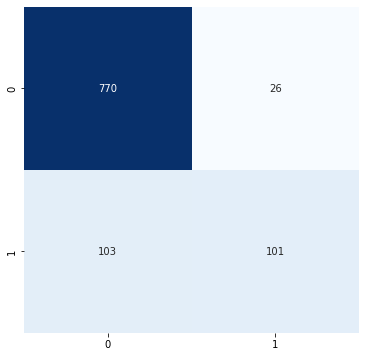

In [42]:
# Confusion matrix

plt.figure(figsize = (6,6))
sns.heatmap(confusion_matrix(y_test, pred_ctb), annot = True, fmt = '.0f', cbar = False, cmap="Blues")
plt.show()

In [43]:
# Classification report

print(classification_report(y_test, pred_ctb))

              precision    recall  f1-score   support

           0       0.88      0.97      0.92       796
           1       0.80      0.50      0.61       204

    accuracy                           0.87      1000
   macro avg       0.84      0.73      0.77      1000
weighted avg       0.86      0.87      0.86      1000



<a id=section-two></a>
> <span style="color:#144272;font-weight:600;font-size:16px;font-style:sans-serif;">LGBMClassifier</span>

In [44]:
param_grid = {
    'num_leaves': np.arange(6, 50),
    'max_depth': np.arange(3, 12),
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
    'n_estimators': np.arange(50, 300),
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
    'reg_alpha': [0, 1e-1, 1, 2, 5, 7, 10, 50, 100],
    'reg_lambda': [0, 1e-1, 1, 5, 10, 20, 50, 100]
}

lgboost = lgb.LGBMClassifier(random_state=73)

random_search_lgboost = RandomizedSearchCV(lgboost, param_distributions=param_grid, n_iter=100,
                                           cv=5, scoring='accuracy', random_state=73)
random_search_lgboost.fit(X_train, y_train)
print("Best hyperparameters:", random_search_lgboost.best_params_)

Best hyperparameters: {'subsample': 0.6, 'reg_lambda': 50, 'reg_alpha': 0.1, 'num_leaves': 15, 'n_estimators': 98, 'max_depth': 9, 'learning_rate': 0.2, 'colsample_bytree': 0.7}


In [45]:
# Predict for test data

pred_lgboost = random_search_lgboost.predict(X_test)
lgboost_score = random_search_lgboost.score(X_test, y_test)

print(f'LGBMClassifier score: {lgboost_score}')

LGBMClassifier score: 0.873


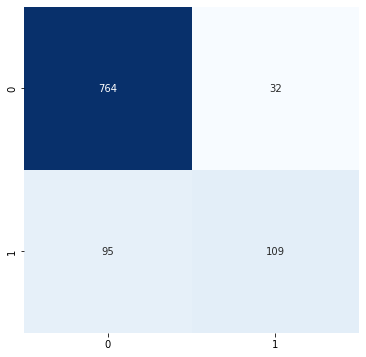

In [46]:
# Confusion matrix

plt.figure(figsize = (6,6))
sns.heatmap(confusion_matrix(y_test, pred_lgboost), annot = True, fmt = '.0f', cbar = False, cmap="Blues")
plt.show()

In [54]:
# Classification report

print(classification_report(y_test, pred_lgboost))

              precision    recall  f1-score   support

           0       0.89      0.96      0.92       796
           1       0.77      0.53      0.63       204

    accuracy                           0.87      1000
   macro avg       0.83      0.75      0.78      1000
weighted avg       0.87      0.87      0.86      1000



<a id=section-two></a>
# <span style="color:#144272;font-weight:600;font-size:18px;font-style:sans-serif;">Evaluation</span>

In [58]:
# Conclusion table

conclusion_df = pd.DataFrame(columns = ['For Train Set', 'For Test Set'])
conclusion_df['For Train Set'] = [random_search_rfc.score(X_train, y_train).round(3),
                              random_search_gbc.score(X_train, y_train).round(3),
                              random_search_xgb.score(X_train, y_train).round(3),
                              random_search_ctb.score(X_train, y_train).round(3),
                              random_search_lgboost.score(X_train, y_train).round(3)]

conclusion_df['For Test Set'] = [rfc_score, gbc_score, xgb_score, ctb_score, lgboost_score]
conclusion_df.index = ['RandomForestClassifier',
                       'GradientBoostingClassifier',
                       'XGBClassifier',
                       'CatBoostClassifier',
                       'LGBMClassifier']

conclusion_df

,For Train Set,For Test Set
RandomForestClassifier,0.908,0.874
GradientBoostingClassifier,0.883,0.872
XGBClassifier,0.886,0.870
CatBoostClassifier,0.892,0.871
LGBMClassifier,0.880,0.873


**Based on the results of the churn modeling for the bank customers using several models, we can conclude that all models have a good level of accuracy in predicting whether a customer will exit or not. The random forest model achieved an accuracy of 87.4% with a recall of 97 and 49 and a precision of 92 and 61. On the other hand, the lightboost model achieved an accuracy of 87% with a recall of 96 and 53 and a precision of 92 and 63.**

**From the perspective of the bank, it is important to identify customers who are likely to exit so that they can take appropriate measures to retain them. In this case, the higher True negative score of the models is more important.**

**Overall, the lightboost model may be a better choice for the bank as it has a higher recall score and a slightly higher precision score, which indicates that it is better at identifying customers who are likely to exit while still being able to identify a reasonable number of customers who are likely to stay.**